## Data Import and Package Uploads

In [1]:
import warnings
warnings.filterwarnings("ignore")
import matplotlib
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

Using TensorFlow backend.


In [3]:
path='/Users/alpandthemachine/Downloads/GBPUSD_Ticks_23.06.2016-23.06.2016-2.csv'
df=pd.read_csv(path)
df.head()

,Gmt time,Ask,Bid,AskVolume,BidVolume
0,24.06.2016 00:00:00.236,1.45604,1.45583,1000000.0,1.870000e+06
1,24.06.2016 00:00:00.391,1.45604,1.45582,1000000.0,2.250000e+06
2,24.06.2016 00:00:00.507,1.45604,1.45596,1000000.0,1.000000e+06
3,24.06.2016 00:00:00.611,1.45604,1.45571,1000000.0,1.870000e+06
4,24.06.2016 00:00:01.120,1.45604,1.45572,1000000.0,1.870000e+06


## Data Preprocessing and Visualization

In [4]:
df['Gmt time']=pd.to_datetime(df['Gmt time'])
df.head()

,Gmt time,Ask,Bid,AskVolume,BidVolume
0,2016-06-24 00:00:00.236,1.45604,1.45583,1000000.0,1.870000e+06
1,2016-06-24 00:00:00.391,1.45604,1.45582,1000000.0,2.250000e+06
2,2016-06-24 00:00:00.507,1.45604,1.45596,1000000.0,1.000000e+06
3,2016-06-24 00:00:00.611,1.45604,1.45571,1000000.0,1.870000e+06
4,2016-06-24 00:00:01.120,1.45604,1.45572,1000000.0,1.870000e+06


In [5]:
df=df.set_index('Gmt time')
df.head()

,Ask,Bid,AskVolume,BidVolume
Gmt time,,,,
2016-06-24 00:00:00.236,1.45604,1.45583,1000000.0,1.870000e+06
2016-06-24 00:00:00.391,1.45604,1.45582,1000000.0,2.250000e+06
2016-06-24 00:00:00.507,1.45604,1.45596,1000000.0,1.000000e+06
2016-06-24 00:00:00.611,1.45604,1.45571,1000000.0,1.870000e+06
2016-06-24 00:00:01.120,1.45604,1.45572,1000000.0,1.870000e+06


In [6]:
dfba=df.ix[:,0:2]
dfvol=df.ix[:,2:4]

dfprod=pd.DataFrame()
dfprod.insert(0,'AskIntervalSum',dfba['Ask'].multiply(dfvol['AskVolume']))
dfprod.insert(1,'BidIntervalSum',dfba['Bid'].multiply(dfvol['BidVolume']))

dfba_res=dfba.resample('30s').ohlc()
dfba_avg=dfba.resample('30s').mean()

dfvol_res=dfvol.resample('30s').sum()
dfprod_res=dfprod.resample('30s').sum()
dfprod_res.head()

,AskIntervalSum,BidIntervalSum
Gmt time,,
2016-06-24 00:00:00,1.102820e+08,2.127238e+08
2016-06-24 00:00:30,2.466637e+08,2.424646e+08
2016-06-24 00:01:00,1.213366e+08,1.190258e+08
2016-06-24 00:01:30,1.521197e+08,1.417811e+08
2016-06-24 00:02:00,1.595826e+08,1.624043e+08


In [48]:
dfvol_res.head()

,AskVolume,BidVolume
Gmt time,,
2016-06-24 00:00:00,7.576000e+07,1.461600e+08
2016-06-24 00:00:30,1.696400e+08,1.668000e+08
2016-06-24 00:01:00,8.342000e+07,8.185000e+07
2016-06-24 00:01:30,1.044800e+08,9.740000e+07
2016-06-24 00:02:00,1.096000e+08,1.115600e+08


In [7]:
dfprices=pd.DataFrame()
dfprices.insert(0,'TWAP OHLC Bid',(dfba_res.ix[:,4]+dfba_res.ix[:,5]+dfba_res.ix[:,6]+dfba_res.ix[:,7])/4.0)
dfprices.insert(1,'TWAP OHLC Ask',(dfba_res.ix[:,0]+dfba_res.ix[:,1]+dfba_res.ix[:,2]+dfba_res.ix[:,3])/4.0)
dfprices.insert(2,'TWAP OHLC Mid',(dfprices['TWAP OHLC Bid']+dfprices['TWAP OHLC Ask'])/2.0)
dfprices.head()

,TWAP OHLC Bid,TWAP OHLC Ask,TWAP OHLC Mid
Gmt time,,,
2016-06-24 00:00:00,1.455362,1.455515,1.455439
2016-06-24 00:00:30,1.454025,1.454340,1.454183
2016-06-24 00:01:00,1.454053,1.454232,1.454143
2016-06-24 00:01:30,1.455420,1.455743,1.455581
2016-06-24 00:02:00,1.455858,1.456128,1.455993


In [8]:
np.argwhere(np.isnan(dfprices['TWAP OHLC Mid']))

array([], shape=(0, 1), dtype=int64)

In [9]:
dfprices.dropna()
dfprices=dfprices.dropna()
np.argwhere(np.isnan(dfprices['TWAP OHLC Mid']))

array([], shape=(0, 1), dtype=int64)

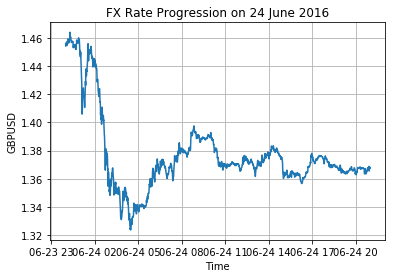

In [11]:
plt.plot(dfprices.index.values[0:np.shape(dfprices)[0]],dfprices.ix[0:np.shape(dfprices)[0],'TWAP OHLC Mid'])
plt.xlabel('Time')
plt.ylabel('GBPUSD')
plt.title('FX Rate Progression on 24 June 2016')
plt.grid(True)

In [12]:
train=int(np.shape(dfprices)[0]*0.70)
TWAP_OHLC_Mid_train=dfprices['TWAP OHLC Mid'][0:train]
TWAP_OHLC_Mid_test=dfprices['TWAP OHLC Mid'][train:np.shape(dfprices)[0]]

In [14]:
train

1763

In [15]:
np.shape(dfprices)[0]

2519

In [16]:
TWAP_OHLC_Mid_test.shape

(756,)

## ARIMA: A Classical Time Series Model

Text(0.5,1,'ACF of GBPUSD Levels')

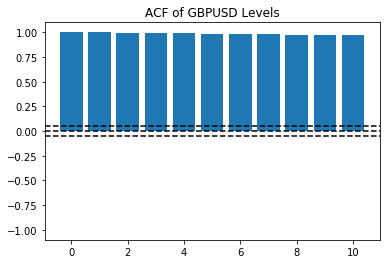

In [17]:
levels=TWAP_OHLC_Mid_train
levels_acf=acf(levels,nlags=10)
levels_pacf=pacf(levels,nlags=10)

plt.bar(range(11),levels_acf)
plt.axhline(y=0,linestyle='--',color='black')
plt.axhline(y=-1.96/np.sqrt(len(levels)),linestyle='--',color='black')
plt.axhline(y=1.96/np.sqrt(len(levels)),linestyle='--',color='black')
plt.ylim((-1.1, 1.1)) 
plt.title('ACF of GBPUSD Levels')

#The acf is declining slowly and smoothly as expected below.

Text(0.5,1,'PACF of GBPUSD Levels')

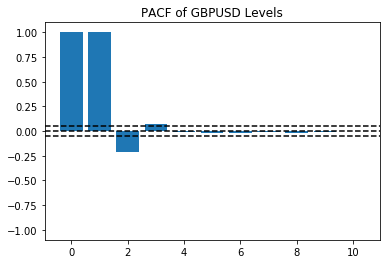

In [18]:
plt.bar(range(11),levels_pacf)
plt.axhline(y=0,linestyle='--',color='black')
plt.axhline(y=-1.96/np.sqrt(len(levels)),linestyle='--',color='black')
plt.axhline(y=1.96/np.sqrt(len(levels)),linestyle='--',color='black')
plt.ylim((-1.1, 1.1)) 
plt.title('PACF of GBPUSD Levels')
#The pacf shows strong correlation close to 1 at lag 1 as expected.

Text(0.5,1,'ACF of GBPUSD Diffs')

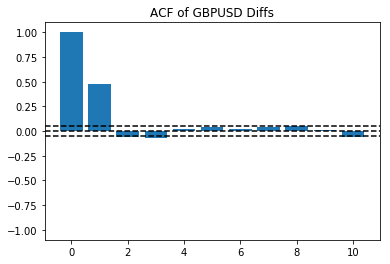

In [19]:
diffs=TWAP_OHLC_Mid_train.diff(1)
cfdiffs=diffs[1:len(diffs)]
lag_acf=acf(cfdiffs,nlags=10)

plt.bar(range(11),lag_acf)
plt.axhline(y=0,linestyle='--',color='black')
plt.axhline(y=-1.96/np.sqrt(len(levels)),linestyle='--',color='black')
plt.axhline(y=1.96/np.sqrt(len(levels)),linestyle='--',color='black')
plt.ylim((-1.1, 1.1)) 
plt.title('ACF of GBPUSD Diffs')

Text(0.5,1,'PACF of GBPUSD Diffs')

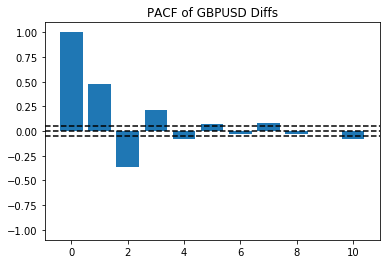

In [21]:
lag_pacf=pacf(cfdiffs,nlags=10)
plt.bar(range(11),lag_pacf)
plt.axhline(y=0,linestyle='--',color='black')
plt.axhline(y=-1.96/np.sqrt(len(levels)),linestyle='--',color='black')
plt.axhline(y=1.96/np.sqrt(len(levels)),linestyle='--',color='black')
plt.ylim((-1.1, 1.1)) 
plt.title('PACF of GBPUSD Diffs')

In [23]:
model=ARIMA(TWAP_OHLC_Mid_train,order=(2,1,1))
model_arima=model.fit()
ARIMA_forecasts=model_arima.forecast(steps=756)[0]

In [24]:
ARIMA_preds_diff = model_arima.fittedvalues.cumsum()
ARIMA_preds_diff.head()

Gmt time
2016-06-24 00:00:30   -0.000044
2016-06-24 00:01:00   -0.000662
2016-06-24 00:01:30   -0.000271
2016-06-24 00:02:00    0.000498
2016-06-24 00:02:30    0.000128
Freq: 30S, dtype: float64

In [25]:
ARIMA_preds = pd.Series(TWAP_OHLC_Mid_train.ix[0], index=TWAP_OHLC_Mid_train.index)
ARIMA_preds = ARIMA_preds.add(ARIMA_preds_diff,fill_value=0)
ARIMA_preds.head()

Gmt time
2016-06-24 00:00:00    1.455439
2016-06-24 00:00:30    1.455395
2016-06-24 00:01:00    1.454777
2016-06-24 00:01:30    1.455168
2016-06-24 00:02:00    1.455937
Freq: 30S, dtype: float64

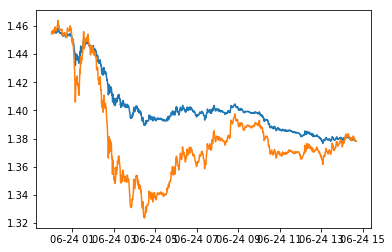

In [26]:
plt.plot(pd.Series(ARIMA_preds))
plt.plot(TWAP_OHLC_Mid_train)

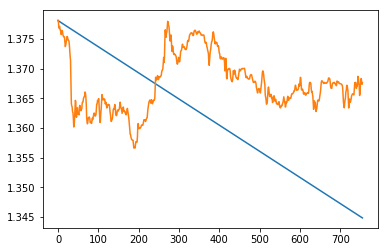

In [27]:
plt.plot(pd.Series(ARIMA_forecasts))
plt.plot(TWAP_OHLC_Mid_test.reset_index()[['TWAP OHLC Mid']])

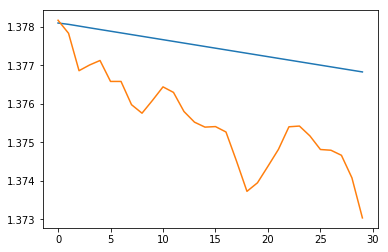

In [73]:
plt.plot(pd.Series(ARIMA_forecasts)[0:30])
plt.plot(TWAP_OHLC_Mid_test.reset_index()[['TWAP OHLC Mid']][0:30])

In [28]:
TWAP_OHLC_Mid_train.shape, ARIMA_preds.shape, TWAP_OHLC_Mid_test.shape, ARIMA_forecasts.shape

((1763,), (1763,), (756,), (756,))

In [29]:
#rmse_train = np.sqrt(mean_squared_error(Y_train_inv_plot, ARIMA_forecasts))
rmse_train= np.sqrt(mean_squared_error(TWAP_OHLC_Mid_train, ARIMA_preds))
rmse_test = np.sqrt(mean_squared_error(TWAP_OHLC_Mid_test, pd.Series(ARIMA_forecasts)))
rmse_train, rmse_test

(0.028883287345318288, 0.012469340639984948)

In [30]:
one_step_forecasts=[]
for i in range(len(TWAP_OHLC_Mid_test)):
    model_one_step=ARIMA(dfprices['TWAP OHLC Mid'][0:train+i],order=(1,1,1))
    one_step_fit=model_one_step.fit()
    one_step_forecasts.append(one_step_fit.forecast(steps=1)[0][0])

/anaconda2/envs/tensorflow/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda2/envs/tensorflow/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda2/envs/tensorflow/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda2/envs/tensorflow/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda2/envs/tensorflow/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood

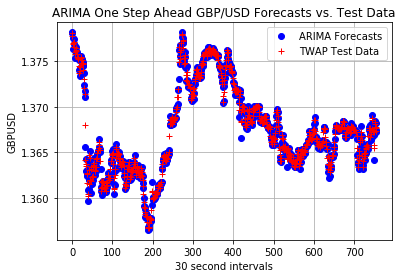

In [86]:
plt.plot(one_step_forecasts,'bo',label='ARIMA Forecasts')
plt.plot(TWAP_OHLC_Mid_test.reset_index()[['TWAP OHLC Mid']],'r+', label='TWAP Test Data')
plt.xlabel('30 second intervals')
plt.ylabel('GBPUSD')
plt.title('ARIMA One Step Ahead GBP/USD Forecasts vs. Test Data')
plt.legend(loc="upper right")
plt.grid(True)

In [88]:
rmse_test = np.sqrt(mean_squared_error(TWAP_OHLC_Mid_test, one_step_forecasts))
rmse_test

0.00046265989351796792

In [38]:
TWAP_OHLC=TWAP_OHLC_Mid_test.reset_index()
TWAP_test=np.array(TWAP_OHLC['TWAP OHLC Mid'])

In [39]:
mean_abs_ARIMA=((one_step_forecasts-TWAP_test)/TWAP_test)*100.0

In [40]:
TWAP_OHLC=TWAP_OHLC_Mid_test.reset_index()
TWAP_test=np.array(TWAP_OHLC['TWAP OHLC Mid'])
mean_abs_ARIMA=((one_step_forecasts-TWAP_test)/TWAP_test)*100.0
mean_abs_ARIMA_=abs(mean_abs_ARIMA)
mean_abs_ARIMA_

array([  6.59936281e-03,   2.63255281e-02,   4.78287756e-02,
         5.07914516e-02,   2.44337890e-02,   1.97552314e-02,
         1.88813067e-02,   5.39917684e-02,   2.69931879e-02,
         9.29791211e-03,   2.08392378e-02,   2.31854152e-02,
         1.62270577e-02,   3.82529856e-03,   2.56209183e-03,
         6.38737106e-03,   1.15684383e-02,   4.30091128e-02,
         2.14323337e-02,   3.71333440e-02,   7.70103815e-03,
         2.81417931e-02,   2.45048173e-02,   1.47774829e-02,
         5.24569180e-03,   1.79206841e-02,   1.55824006e-02,
         1.72481129e-02,   2.68878143e-02,   5.17345201e-02,
         2.57688674e-02,   2.59626266e-02,   2.26626387e-01,
         1.04465747e-01,   5.90049171e-02,   4.95375683e-02,
         2.05557880e-02,   1.05066258e-02,   7.24255833e-02,
         4.90839206e-02,   6.02932425e-02,   4.21733234e-02,
         8.57012170e-02,   5.23314316e-02,   6.03682303e-02,
         1.29972555e-01,   9.32821052e-02,   3.83516348e-02,
         1.10272716e-02,

In [41]:
mean_abs_ARIMA=((one_step_forecasts-TWAP_test)/TWAP_test)*100.0
mean_abs_ARIMA_=abs(mean_abs_ARIMA)
np.mean(mean_abs_ARIMA_)

0.022632596577891517

In [52]:
bs_ARIMA=np.zeros(len(one_step_forecasts))
if one_step_forecasts[0]>dfprices['TWAP OHLC Mid'][-1]:
    bs_ARIMA[0]=1.0
else:
    bs_ARIMA[0]=-1.0
for i in range(len(one_step_forecasts)-1):
    if one_step_forecasts[1+i]>TWAP_test[i]:
        bs_ARIMA[i+1]=1.0
    else:
        bs_ARIMA[i+1]=-1.0

In [54]:
prof_ARIMA=one_step_forecasts-TWAP_test

In [55]:
np.sum(prof_ARIMA)

-0.011979115273222041

In [59]:
prof_ARIMA_cumul=np.cumsum(prof_ARIMA)
prof_ARIMA

array([ -9.09505209e-05,   3.62721683e-04,   6.58535878e-04,
        -6.99402733e-04,   3.36484122e-04,   2.71947059e-04,
        -2.59916763e-04,   7.42915260e-04,  -3.71360806e-04,
        -1.27947755e-04,  -2.86839866e-04,   3.19100290e-04,
         2.23252063e-04,   5.26179380e-05,   3.52389150e-05,
        -8.78525404e-05,   1.59097261e-04,   5.91167782e-04,
         2.94422130e-04,  -5.10193580e-04,  -1.05841528e-04,
        -3.86898649e-04,  -3.37040483e-04,   2.03253010e-04,
         7.21370488e-05,   2.46376253e-04,  -2.14226259e-04,
         2.37103772e-04,   3.69460079e-04,   7.10335009e-04,
         3.53572696e-04,   3.56050812e-04,   3.10017815e-03,
         1.42507471e-03,  -8.04660381e-04,   6.75460844e-04,
         2.80118091e-04,  -1.43160918e-04,   9.86172091e-04,
         6.67629058e-04,  -8.20233039e-04,  -5.74196651e-04,
        -1.16818793e-03,  -7.14145461e-04,   8.23645269e-04,
         1.77017259e-03,  -1.27032854e-03,  -5.22797500e-04,
         1.50346373e-04,

In [50]:
np.sum((one_step_forecasts[0]>dfprices['TWAP OHLC Mid'][-1]))

1

In [64]:
len(seq_test)

755

In [280]:
n_features, n_steps_in

(1, 3)

### MLP

In [66]:
from numpy import array
from keras.models import Sequential
from keras.layers import Dense
 
# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

In [67]:
raw_seq=dfprices['TWAP OHLC Mid']

In [68]:
seq_len=len(raw_seq)
train_size=int(seq_len*0.70)
test_size= seq_len-train_size
raw_train=dfprices['TWAP OHLC Mid'][0:train_size]

In [69]:
forecasts_mlp=[]
# choose a number of time steps
n_steps = 1
# split into samples
# define model
model = Sequential()
model.add(Dense(50, activation='relu', input_dim=n_steps))
model.add(Dense(50, activation='relu', input_dim=n_steps))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
# fit model

In [70]:
for i in range(test_size):
    X, y = split_sequence(raw_seq[0:train_size+i], n_steps)
    model.fit(X, y, epochs=30,batch_size=512,verbose=1)
# demonstrate prediction
    x_input = raw_seq[train_size-1+i]
    x_input = x_input.reshape((1, n_steps))
    yhat = model.predict(x_input, verbose=0)
    forecasts_mlp.append(yhat)

Epoch 1/30
1762/1762 [==============================] - 0s 73us/step - loss: 1.9690
Epoch 2/30
1762/1762 [==============================] - 0s 5us/step - loss: 1.5770
Epoch 3/30
1762/1762 [==============================] - 0s 5us/step - loss: 1.2829
Epoch 4/30
1762/1762 [==============================] - 0s 4us/step - loss: 1.0446
Epoch 5/30
1762/1762 [==============================] - 0s 4us/step - loss: 0.8563
Epoch 6/30
1762/1762 [==============================] - 0s 4us/step - loss: 0.6905
Epoch 7/30
1762/1762 [==============================] - 0s 4us/step - loss: 0.5472
Epoch 8/30
1762/1762 [==============================] - 0s 4us/step - loss: 0.4316
Epoch 9/30
1762/1762 [==============================] - 0s 4us/step - loss: 0.3237
Epoch 10/30
1762/1762 [==============================] - 0s 4us/step - loss: 0.2256
Epoch 11/30
1762/1762 [==============================] - 0s 4us/step - loss: 0.1443
Epoch 12/30
1762/1762 [==============================] - 0s 4us/step - loss: 0.0827


1765/1765 [==============================] - 0s 5us/step - loss: 4.3759e-05
Epoch 6/30
1765/1765 [==============================] - 0s 4us/step - loss: 4.3755e-05
Epoch 7/30
1765/1765 [==============================] - 0s 4us/step - loss: 4.3747e-05
Epoch 8/30
1765/1765 [==============================] - 0s 5us/step - loss: 4.3743e-05
Epoch 9/30
1765/1765 [==============================] - 0s 4us/step - loss: 4.3740e-05
Epoch 10/30
1765/1765 [==============================] - 0s 4us/step - loss: 4.3728e-05
Epoch 11/30
1765/1765 [==============================] - 0s 4us/step - loss: 4.3729e-05
Epoch 12/30
1765/1765 [==============================] - 0s 4us/step - loss: 4.3728e-05
Epoch 13/30
1765/1765 [==============================] - 0s 5us/step - loss: 4.3723e-05
Epoch 14/30
1765/1765 [==============================] - 0s 5us/step - loss: 4.3713e-05
Epoch 15/30
1765/1765 [==============================] - 0s 4us/step - loss: 4.3714e-05
Epoch 16/30
1765/1765 [=========================

1768/1768 [==============================] - 0s 5us/step - loss: 4.3064e-05
Epoch 9/30
1768/1768 [==============================] - 0s 5us/step - loss: 4.3058e-05
Epoch 10/30
1768/1768 [==============================] - 0s 5us/step - loss: 4.3048e-05
Epoch 11/30
1768/1768 [==============================] - 0s 5us/step - loss: 4.3040e-05
Epoch 12/30
1768/1768 [==============================] - 0s 5us/step - loss: 4.3037e-05
Epoch 13/30
1768/1768 [==============================] - 0s 5us/step - loss: 4.3031e-05
Epoch 14/30
1768/1768 [==============================] - 0s 5us/step - loss: 4.3018e-05
Epoch 15/30
1768/1768 [==============================] - 0s 5us/step - loss: 4.3006e-05
Epoch 16/30
1768/1768 [==============================] - 0s 5us/step - loss: 4.2995e-05
Epoch 17/30
1768/1768 [==============================] - 0s 5us/step - loss: 4.2993e-05
Epoch 18/30
1768/1768 [==============================] - 0s 5us/step - loss: 4.2983e-05
Epoch 19/30
1768/1768 [======================

1771/1771 [==============================] - 0s 5us/step - loss: 4.2114e-05
Epoch 12/30
1771/1771 [==============================] - 0s 5us/step - loss: 4.2108e-05
Epoch 13/30
1771/1771 [==============================] - 0s 5us/step - loss: 4.2098e-05
Epoch 14/30
1771/1771 [==============================] - 0s 5us/step - loss: 4.2080e-05
Epoch 15/30
1771/1771 [==============================] - 0s 5us/step - loss: 4.2093e-05
Epoch 16/30
1771/1771 [==============================] - 0s 5us/step - loss: 4.2077e-05
Epoch 17/30
1771/1771 [==============================] - 0s 5us/step - loss: 4.2063e-05
Epoch 18/30
1771/1771 [==============================] - 0s 5us/step - loss: 4.2044e-05
Epoch 19/30
1771/1771 [==============================] - 0s 6us/step - loss: 4.2027e-05
Epoch 20/30
1771/1771 [==============================] - 0s 5us/step - loss: 4.2014e-05
Epoch 21/30
1771/1771 [==============================] - 0s 6us/step - loss: 4.2008e-05
Epoch 22/30
1771/1771 [=====================

1774/1774 [==============================] - 0s 6us/step - loss: 4.0913e-05
Epoch 15/30
1774/1774 [==============================] - 0s 6us/step - loss: 4.0902e-05
Epoch 16/30
1774/1774 [==============================] - 0s 6us/step - loss: 4.0895e-05
Epoch 17/30
1774/1774 [==============================] - 0s 6us/step - loss: 4.0882e-05
Epoch 18/30
1774/1774 [==============================] - 0s 6us/step - loss: 4.0882e-05
Epoch 19/30
1774/1774 [==============================] - 0s 6us/step - loss: 4.0853e-05
Epoch 20/30
1774/1774 [==============================] - 0s 6us/step - loss: 4.0856e-05
Epoch 21/30
1774/1774 [==============================] - 0s 6us/step - loss: 4.0840e-05
Epoch 22/30
1774/1774 [==============================] - 0s 6us/step - loss: 4.0816e-05
Epoch 23/30
1774/1774 [==============================] - 0s 6us/step - loss: 4.0804e-05
Epoch 24/30
1774/1774 [==============================] - 0s 6us/step - loss: 4.0781e-05
Epoch 25/30
1774/1774 [=====================

1777/1777 [==============================] - 0s 6us/step - loss: 3.9452e-05
Epoch 18/30
1777/1777 [==============================] - 0s 5us/step - loss: 3.9449e-05
Epoch 19/30
1777/1777 [==============================] - 0s 5us/step - loss: 3.9444e-05
Epoch 20/30
1777/1777 [==============================] - 0s 5us/step - loss: 3.9404e-05
Epoch 21/30
1777/1777 [==============================] - 0s 5us/step - loss: 3.9387e-05
Epoch 22/30
1777/1777 [==============================] - 0s 5us/step - loss: 3.9387e-05
Epoch 23/30
1777/1777 [==============================] - 0s 6us/step - loss: 3.9362e-05
Epoch 24/30
1777/1777 [==============================] - 0s 5us/step - loss: 3.9333e-05
Epoch 25/30
1777/1777 [==============================] - 0s 5us/step - loss: 3.9326e-05
Epoch 26/30
1777/1777 [==============================] - 0s 5us/step - loss: 3.9346e-05
Epoch 27/30
1777/1777 [==============================] - 0s 5us/step - loss: 3.9315e-05
Epoch 28/30
1777/1777 [=====================

1780/1780 [==============================] - 0s 4us/step - loss: 3.7730e-05
Epoch 21/30
1780/1780 [==============================] - 0s 5us/step - loss: 3.7697e-05
Epoch 22/30
1780/1780 [==============================] - 0s 5us/step - loss: 3.7680e-05
Epoch 23/30
1780/1780 [==============================] - 0s 4us/step - loss: 3.7652e-05
Epoch 24/30
1780/1780 [==============================] - 0s 5us/step - loss: 3.7633e-05
Epoch 25/30
1780/1780 [==============================] - 0s 5us/step - loss: 3.7628e-05
Epoch 26/30
1780/1780 [==============================] - 0s 4us/step - loss: 3.7599e-05
Epoch 27/30
1780/1780 [==============================] - 0s 5us/step - loss: 3.7573e-05
Epoch 28/30
1780/1780 [==============================] - 0s 5us/step - loss: 3.7554e-05
Epoch 29/30
1780/1780 [==============================] - 0s 5us/step - loss: 3.7539e-05
Epoch 30/30
1780/1780 [==============================] - 0s 5us/step - loss: 3.7518e-05
Epoch 1/30
1781/1781 [======================

1783/1783 [==============================] - 0s 6us/step - loss: 3.5694e-05
Epoch 24/30
1783/1783 [==============================] - 0s 5us/step - loss: 3.5645e-05
Epoch 25/30
1783/1783 [==============================] - 0s 4us/step - loss: 3.5635e-05
Epoch 26/30
1783/1783 [==============================] - 0s 4us/step - loss: 3.5620e-05
Epoch 27/30
1783/1783 [==============================] - 0s 4us/step - loss: 3.5580e-05
Epoch 28/30
1783/1783 [==============================] - 0s 5us/step - loss: 3.5562e-05
Epoch 29/30
1783/1783 [==============================] - 0s 4us/step - loss: 3.5534e-05
Epoch 30/30
1783/1783 [==============================] - 0s 4us/step - loss: 3.5514e-05
Epoch 1/30
1784/1784 [==============================] - 0s 4us/step - loss: 3.5478e-05
Epoch 2/30
1784/1784 [==============================] - 0s 5us/step - loss: 3.5449e-05
Epoch 3/30
1784/1784 [==============================] - 0s 4us/step - loss: 3.5442e-05
Epoch 4/30
1784/1784 [=========================

1786/1786 [==============================] - 0s 5us/step - loss: 3.3337e-05
Epoch 27/30
1786/1786 [==============================] - 0s 4us/step - loss: 3.3340e-05
Epoch 28/30
1786/1786 [==============================] - 0s 4us/step - loss: 3.3269e-05
Epoch 29/30
1786/1786 [==============================] - 0s 4us/step - loss: 3.3266e-05
Epoch 30/30
1786/1786 [==============================] - 0s 5us/step - loss: 3.3251e-05
Epoch 1/30
1787/1787 [==============================] - 0s 4us/step - loss: 3.3188e-05
Epoch 2/30
1787/1787 [==============================] - 0s 4us/step - loss: 3.3167e-05
Epoch 3/30
1787/1787 [==============================] - 0s 4us/step - loss: 3.3132e-05
Epoch 4/30
1787/1787 [==============================] - 0s 5us/step - loss: 3.3121e-05
Epoch 5/30
1787/1787 [==============================] - 0s 5us/step - loss: 3.3065e-05
Epoch 6/30
1787/1787 [==============================] - 0s 4us/step - loss: 3.3075e-05
Epoch 7/30
1787/1787 [============================

1789/1789 [==============================] - 0s 5us/step - loss: 3.0675e-05
Epoch 30/30
1789/1789 [==============================] - 0s 5us/step - loss: 3.0635e-05
Epoch 1/30
1790/1790 [==============================] - 0s 5us/step - loss: 3.0585e-05
Epoch 2/30
1790/1790 [==============================] - 0s 5us/step - loss: 3.0565e-05
Epoch 3/30
1790/1790 [==============================] - 0s 5us/step - loss: 3.0548e-05
Epoch 4/30
1790/1790 [==============================] - 0s 5us/step - loss: 3.0524e-05
Epoch 5/30
1790/1790 [==============================] - 0s 5us/step - loss: 3.0474e-05
Epoch 6/30
1790/1790 [==============================] - 0s 6us/step - loss: 3.0438e-05
Epoch 7/30
1790/1790 [==============================] - 0s 5us/step - loss: 3.0436e-05
Epoch 8/30
1790/1790 [==============================] - 0s 5us/step - loss: 3.0423e-05
Epoch 9/30
1790/1790 [==============================] - 0s 6us/step - loss: 3.0359e-05
Epoch 10/30
1790/1790 [==============================

1793/1793 [==============================] - 0s 4us/step - loss: 2.7689e-05
Epoch 3/30
1793/1793 [==============================] - 0s 4us/step - loss: 2.7666e-05
Epoch 4/30
1793/1793 [==============================] - 0s 4us/step - loss: 2.7716e-05
Epoch 5/30
1793/1793 [==============================] - 0s 5us/step - loss: 2.7588e-05
Epoch 6/30
1793/1793 [==============================] - 0s 5us/step - loss: 2.7645e-05
Epoch 7/30
1793/1793 [==============================] - 0s 5us/step - loss: 2.7535e-05
Epoch 8/30
1793/1793 [==============================] - 0s 5us/step - loss: 2.7551e-05
Epoch 9/30
1793/1793 [==============================] - 0s 6us/step - loss: 2.7464e-05
Epoch 10/30
1793/1793 [==============================] - 0s 5us/step - loss: 2.7466e-05
Epoch 11/30
1793/1793 [==============================] - 0s 5us/step - loss: 2.7407e-05
Epoch 12/30
1793/1793 [==============================] - 0s 5us/step - loss: 2.7408e-05
Epoch 13/30
1793/1793 [============================

1796/1796 [==============================] - 0s 5us/step - loss: 2.4522e-05
Epoch 6/30
1796/1796 [==============================] - 0s 5us/step - loss: 2.4437e-05
Epoch 7/30
1796/1796 [==============================] - 0s 5us/step - loss: 2.4426e-05
Epoch 8/30
1796/1796 [==============================] - 0s 5us/step - loss: 2.4356e-05
Epoch 9/30
1796/1796 [==============================] - 0s 5us/step - loss: 2.4364e-05
Epoch 10/30
1796/1796 [==============================] - 0s 6us/step - loss: 2.4479e-05
Epoch 11/30
1796/1796 [==============================] - 0s 5us/step - loss: 2.4282e-05
Epoch 12/30
1796/1796 [==============================] - 0s 5us/step - loss: 2.4307e-05
Epoch 13/30
1796/1796 [==============================] - 0s 5us/step - loss: 2.4230e-05
Epoch 14/30
1796/1796 [==============================] - 0s 6us/step - loss: 2.4225e-05
Epoch 15/30
1796/1796 [==============================] - 0s 5us/step - loss: 2.4149e-05
Epoch 16/30
1796/1796 [=========================

1799/1799 [==============================] - 0s 5us/step - loss: 2.1025e-05
Epoch 9/30
1799/1799 [==============================] - 0s 5us/step - loss: 2.1042e-05
Epoch 10/30
1799/1799 [==============================] - 0s 5us/step - loss: 2.0990e-05
Epoch 11/30
1799/1799 [==============================] - 0s 6us/step - loss: 2.0920e-05
Epoch 12/30
1799/1799 [==============================] - 0s 5us/step - loss: 2.0953e-05
Epoch 13/30
1799/1799 [==============================] - 0s 5us/step - loss: 2.0838e-05
Epoch 14/30
1799/1799 [==============================] - 0s 5us/step - loss: 2.0837e-05
Epoch 15/30
1799/1799 [==============================] - 0s 5us/step - loss: 2.0788e-05
Epoch 16/30
1799/1799 [==============================] - 0s 5us/step - loss: 2.0808e-05
Epoch 17/30
1799/1799 [==============================] - 0s 5us/step - loss: 2.0722e-05
Epoch 18/30
1799/1799 [==============================] - 0s 5us/step - loss: 2.0653e-05
Epoch 19/30
1799/1799 [======================

1802/1802 [==============================] - 0s 5us/step - loss: 1.7451e-05
Epoch 12/30
1802/1802 [==============================] - 0s 4us/step - loss: 1.7408e-05
Epoch 13/30
1802/1802 [==============================] - 0s 4us/step - loss: 1.7390e-05
Epoch 14/30
1802/1802 [==============================] - 0s 4us/step - loss: 1.7328e-05
Epoch 15/30
1802/1802 [==============================] - 0s 4us/step - loss: 1.7312e-05
Epoch 16/30
1802/1802 [==============================] - 0s 4us/step - loss: 1.7257e-05
Epoch 17/30
1802/1802 [==============================] - 0s 4us/step - loss: 1.7239e-05
Epoch 18/30
1802/1802 [==============================] - 0s 5us/step - loss: 1.7279e-05
Epoch 19/30
1802/1802 [==============================] - 0s 5us/step - loss: 1.7189e-05
Epoch 20/30
1802/1802 [==============================] - 0s 5us/step - loss: 1.7165e-05
Epoch 21/30
1802/1802 [==============================] - 0s 4us/step - loss: 1.7149e-05
Epoch 22/30
1802/1802 [=====================

1805/1805 [==============================] - 0s 5us/step - loss: 1.3896e-05
Epoch 15/30
1805/1805 [==============================] - 0s 5us/step - loss: 1.3843e-05
Epoch 16/30
1805/1805 [==============================] - 0s 5us/step - loss: 1.3874e-05
Epoch 17/30
1805/1805 [==============================] - 0s 5us/step - loss: 1.3781e-05
Epoch 18/30
1805/1805 [==============================] - 0s 6us/step - loss: 1.3756e-05
Epoch 19/30
1805/1805 [==============================] - 0s 5us/step - loss: 1.3703e-05
Epoch 20/30
1805/1805 [==============================] - 0s 5us/step - loss: 1.3659e-05
Epoch 21/30
1805/1805 [==============================] - 0s 5us/step - loss: 1.3634e-05
Epoch 22/30
1805/1805 [==============================] - 0s 5us/step - loss: 1.3597e-05
Epoch 23/30
1805/1805 [==============================] - 0s 5us/step - loss: 1.3563e-05
Epoch 24/30
1805/1805 [==============================] - 0s 5us/step - loss: 1.3518e-05
Epoch 25/30
1805/1805 [=====================

1808/1808 [==============================] - 0s 5us/step - loss: 1.0601e-05
Epoch 18/30
1808/1808 [==============================] - 0s 5us/step - loss: 1.0562e-05
Epoch 19/30
1808/1808 [==============================] - 0s 5us/step - loss: 1.0519e-05
Epoch 20/30
1808/1808 [==============================] - 0s 5us/step - loss: 1.0423e-05
Epoch 21/30
1808/1808 [==============================] - 0s 5us/step - loss: 1.0424e-05
Epoch 22/30
1808/1808 [==============================] - 0s 5us/step - loss: 1.0499e-05
Epoch 23/30
1808/1808 [==============================] - 0s 5us/step - loss: 1.0509e-05
Epoch 24/30
1808/1808 [==============================] - 0s 6us/step - loss: 1.0473e-05
Epoch 25/30
1808/1808 [==============================] - 0s 5us/step - loss: 1.0560e-05
Epoch 26/30
1808/1808 [==============================] - 0s 5us/step - loss: 1.0408e-05
Epoch 27/30
1808/1808 [==============================] - 0s 5us/step - loss: 1.0530e-05
Epoch 28/30
1808/1808 [=====================

1811/1811 [==============================] - 0s 5us/step - loss: 7.5701e-06
Epoch 21/30
1811/1811 [==============================] - 0s 5us/step - loss: 7.6076e-06
Epoch 22/30
1811/1811 [==============================] - 0s 5us/step - loss: 7.5571e-06
Epoch 23/30
1811/1811 [==============================] - 0s 5us/step - loss: 7.6615e-06
Epoch 24/30
1811/1811 [==============================] - 0s 4us/step - loss: 7.4467e-06
Epoch 25/30
1811/1811 [==============================] - 0s 5us/step - loss: 7.4546e-06
Epoch 26/30
1811/1811 [==============================] - 0s 5us/step - loss: 7.5198e-06
Epoch 27/30
1811/1811 [==============================] - 0s 6us/step - loss: 7.4804e-06
Epoch 28/30
1811/1811 [==============================] - 0s 5us/step - loss: 7.4367e-06
Epoch 29/30
1811/1811 [==============================] - 0s 5us/step - loss: 7.4098e-06
Epoch 30/30
1811/1811 [==============================] - 0s 5us/step - loss: 7.2923e-06
Epoch 1/30
1812/1812 [======================

1814/1814 [==============================] - 0s 4us/step - loss: 5.3432e-06
Epoch 24/30
1814/1814 [==============================] - 0s 4us/step - loss: 5.3226e-06
Epoch 25/30
1814/1814 [==============================] - 0s 5us/step - loss: 5.2581e-06
Epoch 26/30
1814/1814 [==============================] - 0s 5us/step - loss: 5.1759e-06
Epoch 27/30
1814/1814 [==============================] - 0s 5us/step - loss: 5.1088e-06
Epoch 28/30
1814/1814 [==============================] - 0s 5us/step - loss: 5.0687e-06
Epoch 29/30
1814/1814 [==============================] - 0s 5us/step - loss: 5.0536e-06
Epoch 30/30
1814/1814 [==============================] - 0s 5us/step - loss: 5.0397e-06
Epoch 1/30
1815/1815 [==============================] - 0s 4us/step - loss: 5.0129e-06
Epoch 2/30
1815/1815 [==============================] - 0s 4us/step - loss: 5.0181e-06
Epoch 3/30
1815/1815 [==============================] - 0s 4us/step - loss: 5.0551e-06
Epoch 4/30
1815/1815 [=========================

1817/1817 [==============================] - 0s 5us/step - loss: 3.5201e-06
Epoch 27/30
1817/1817 [==============================] - 0s 5us/step - loss: 3.4774e-06
Epoch 28/30
1817/1817 [==============================] - 0s 5us/step - loss: 3.4749e-06
Epoch 29/30
1817/1817 [==============================] - 0s 5us/step - loss: 3.4746e-06
Epoch 30/30
1817/1817 [==============================] - 0s 5us/step - loss: 3.4635e-06
Epoch 1/30
1818/1818 [==============================] - 0s 5us/step - loss: 3.4442e-06
Epoch 2/30
1818/1818 [==============================] - 0s 5us/step - loss: 3.4291e-06
Epoch 3/30
1818/1818 [==============================] - 0s 5us/step - loss: 3.4173e-06
Epoch 4/30
1818/1818 [==============================] - 0s 6us/step - loss: 3.4168e-06
Epoch 5/30
1818/1818 [==============================] - 0s 5us/step - loss: 3.4090e-06
Epoch 6/30
1818/1818 [==============================] - 0s 6us/step - loss: 3.4231e-06
Epoch 7/30
1818/1818 [============================

1820/1820 [==============================] - 0s 5us/step - loss: 2.4829e-06
Epoch 30/30
1820/1820 [==============================] - 0s 6us/step - loss: 2.5121e-06
Epoch 1/30
1821/1821 [==============================] - 0s 4us/step - loss: 2.5664e-06
Epoch 2/30
1821/1821 [==============================] - 0s 4us/step - loss: 2.4993e-06
Epoch 3/30
1821/1821 [==============================] - 0s 5us/step - loss: 2.5059e-06
Epoch 4/30
1821/1821 [==============================] - 0s 5us/step - loss: 2.4503e-06
Epoch 5/30
1821/1821 [==============================] - 0s 5us/step - loss: 2.4561e-06
Epoch 6/30
1821/1821 [==============================] - 0s 5us/step - loss: 2.5457e-06
Epoch 7/30
1821/1821 [==============================] - 0s 5us/step - loss: 2.4982e-06
Epoch 8/30
1821/1821 [==============================] - 0s 5us/step - loss: 2.4903e-06
Epoch 9/30
1821/1821 [==============================] - 0s 6us/step - loss: 2.4674e-06
Epoch 10/30
1821/1821 [==============================

1824/1824 [==============================] - 0s 5us/step - loss: 2.0350e-06
Epoch 3/30
1824/1824 [==============================] - 0s 5us/step - loss: 1.9765e-06
Epoch 4/30
1824/1824 [==============================] - 0s 4us/step - loss: 1.9595e-06
Epoch 5/30
1824/1824 [==============================] - 0s 5us/step - loss: 1.9598e-06
Epoch 6/30
1824/1824 [==============================] - 0s 4us/step - loss: 1.9632e-06
Epoch 7/30
1824/1824 [==============================] - 0s 4us/step - loss: 1.9871e-06
Epoch 8/30
1824/1824 [==============================] - 0s 5us/step - loss: 1.9459e-06
Epoch 9/30
1824/1824 [==============================] - 0s 5us/step - loss: 1.9456e-06
Epoch 10/30
1824/1824 [==============================] - 0s 5us/step - loss: 1.9858e-06
Epoch 11/30
1824/1824 [==============================] - 0s 5us/step - loss: 1.9778e-06
Epoch 12/30
1824/1824 [==============================] - 0s 5us/step - loss: 1.9465e-06
Epoch 13/30
1824/1824 [============================

1827/1827 [==============================] - 0s 5us/step - loss: 1.7733e-06
Epoch 6/30
1827/1827 [==============================] - 0s 5us/step - loss: 1.7728e-06
Epoch 7/30
1827/1827 [==============================] - 0s 5us/step - loss: 1.7669e-06
Epoch 8/30
1827/1827 [==============================] - 0s 5us/step - loss: 1.7890e-06
Epoch 9/30
1827/1827 [==============================] - 0s 5us/step - loss: 1.7992e-06
Epoch 10/30
1827/1827 [==============================] - 0s 4us/step - loss: 1.7807e-06
Epoch 11/30
1827/1827 [==============================] - 0s 4us/step - loss: 1.8019e-06
Epoch 12/30
1827/1827 [==============================] - 0s 4us/step - loss: 1.8031e-06
Epoch 13/30
1827/1827 [==============================] - 0s 4us/step - loss: 1.8000e-06
Epoch 14/30
1827/1827 [==============================] - 0s 5us/step - loss: 1.7677e-06
Epoch 15/30
1827/1827 [==============================] - 0s 4us/step - loss: 1.7712e-06
Epoch 16/30
1827/1827 [=========================

1830/1830 [==============================] - 0s 5us/step - loss: 1.7799e-06
Epoch 9/30
1830/1830 [==============================] - 0s 5us/step - loss: 1.7211e-06
Epoch 10/30
1830/1830 [==============================] - 0s 5us/step - loss: 1.7418e-06
Epoch 11/30
1830/1830 [==============================] - 0s 5us/step - loss: 1.8110e-06
Epoch 12/30
1830/1830 [==============================] - 0s 5us/step - loss: 1.8647e-06
Epoch 13/30
1830/1830 [==============================] - 0s 5us/step - loss: 1.8362e-06
Epoch 14/30
1830/1830 [==============================] - 0s 5us/step - loss: 1.8394e-06
Epoch 15/30
1830/1830 [==============================] - 0s 5us/step - loss: 1.7747e-06
Epoch 16/30
1830/1830 [==============================] - 0s 6us/step - loss: 1.8935e-06
Epoch 17/30
1830/1830 [==============================] - 0s 5us/step - loss: 1.9707e-06
Epoch 18/30
1830/1830 [==============================] - 0s 5us/step - loss: 1.8479e-06
Epoch 19/30
1830/1830 [======================

1833/1833 [==============================] - 0s 5us/step - loss: 2.1288e-06
Epoch 12/30
1833/1833 [==============================] - 0s 4us/step - loss: 2.2450e-06
Epoch 13/30
1833/1833 [==============================] - 0s 5us/step - loss: 1.8444e-06
Epoch 14/30
1833/1833 [==============================] - 0s 5us/step - loss: 2.1363e-06
Epoch 15/30
1833/1833 [==============================] - 0s 4us/step - loss: 2.0367e-06
Epoch 16/30
1833/1833 [==============================] - 0s 4us/step - loss: 1.8694e-06
Epoch 17/30
1833/1833 [==============================] - 0s 4us/step - loss: 1.9134e-06
Epoch 18/30
1833/1833 [==============================] - 0s 5us/step - loss: 1.8191e-06
Epoch 19/30
1833/1833 [==============================] - 0s 5us/step - loss: 1.7137e-06
Epoch 20/30
1833/1833 [==============================] - 0s 5us/step - loss: 1.7621e-06
Epoch 21/30
1833/1833 [==============================] - 0s 5us/step - loss: 1.7337e-06
Epoch 22/30
1833/1833 [=====================

1836/1836 [==============================] - 0s 5us/step - loss: 1.7322e-06
Epoch 15/30
1836/1836 [==============================] - 0s 5us/step - loss: 1.9540e-06
Epoch 16/30
1836/1836 [==============================] - 0s 5us/step - loss: 1.8596e-06
Epoch 17/30
1836/1836 [==============================] - 0s 5us/step - loss: 1.8105e-06
Epoch 18/30
1836/1836 [==============================] - 0s 5us/step - loss: 1.7202e-06
Epoch 19/30
1836/1836 [==============================] - 0s 5us/step - loss: 1.7601e-06
Epoch 20/30
1836/1836 [==============================] - 0s 5us/step - loss: 1.7873e-06
Epoch 21/30
1836/1836 [==============================] - 0s 5us/step - loss: 1.8066e-06
Epoch 22/30
1836/1836 [==============================] - 0s 5us/step - loss: 1.7357e-06
Epoch 23/30
1836/1836 [==============================] - 0s 5us/step - loss: 1.7266e-06
Epoch 24/30
1836/1836 [==============================] - 0s 5us/step - loss: 1.7235e-06
Epoch 25/30
1836/1836 [=====================

1839/1839 [==============================] - 0s 5us/step - loss: 1.7420e-06
Epoch 18/30
1839/1839 [==============================] - 0s 5us/step - loss: 1.9143e-06
Epoch 19/30
1839/1839 [==============================] - 0s 5us/step - loss: 2.2261e-06
Epoch 20/30
1839/1839 [==============================] - 0s 5us/step - loss: 2.3028e-06
Epoch 21/30
1839/1839 [==============================] - 0s 5us/step - loss: 1.9471e-06
Epoch 22/30
1839/1839 [==============================] - 0s 5us/step - loss: 1.7105e-06
Epoch 23/30
1839/1839 [==============================] - 0s 5us/step - loss: 1.9947e-06
Epoch 24/30
1839/1839 [==============================] - 0s 5us/step - loss: 1.8560e-06
Epoch 25/30
1839/1839 [==============================] - 0s 6us/step - loss: 1.7024e-06
Epoch 26/30
1839/1839 [==============================] - 0s 5us/step - loss: 2.0282e-06
Epoch 27/30
1839/1839 [==============================] - 0s 5us/step - loss: 2.5903e-06
Epoch 28/30
1839/1839 [=====================

1842/1842 [==============================] - 0s 6us/step - loss: 1.6853e-06
Epoch 21/30
1842/1842 [==============================] - 0s 5us/step - loss: 1.8848e-06
Epoch 22/30
1842/1842 [==============================] - 0s 5us/step - loss: 1.7375e-06
Epoch 23/30
1842/1842 [==============================] - 0s 5us/step - loss: 1.6948e-06
Epoch 24/30
1842/1842 [==============================] - 0s 5us/step - loss: 1.6927e-06
Epoch 25/30
1842/1842 [==============================] - 0s 5us/step - loss: 1.7197e-06
Epoch 26/30
1842/1842 [==============================] - 0s 5us/step - loss: 2.0743e-06
Epoch 27/30
1842/1842 [==============================] - 0s 5us/step - loss: 2.3208e-06
Epoch 28/30
1842/1842 [==============================] - 0s 5us/step - loss: 1.8116e-06
Epoch 29/30
1842/1842 [==============================] - 0s 5us/step - loss: 1.9409e-06
Epoch 30/30
1842/1842 [==============================] - 0s 6us/step - loss: 1.7183e-06
Epoch 1/30
1843/1843 [======================

1845/1845 [==============================] - 0s 5us/step - loss: 3.3084e-06
Epoch 24/30
1845/1845 [==============================] - 0s 5us/step - loss: 5.1769e-06
Epoch 25/30
1845/1845 [==============================] - 0s 5us/step - loss: 2.2248e-06
Epoch 26/30
1845/1845 [==============================] - 0s 5us/step - loss: 1.8859e-06
Epoch 27/30
1845/1845 [==============================] - 0s 5us/step - loss: 2.9999e-06
Epoch 28/30
1845/1845 [==============================] - 0s 5us/step - loss: 2.6496e-06
Epoch 29/30
1845/1845 [==============================] - 0s 5us/step - loss: 2.4805e-06
Epoch 30/30
1845/1845 [==============================] - 0s 5us/step - loss: 1.8424e-06
Epoch 1/30
1846/1846 [==============================] - 0s 4us/step - loss: 2.3322e-06
Epoch 2/30
1846/1846 [==============================] - 0s 4us/step - loss: 2.0629e-06
Epoch 3/30
1846/1846 [==============================] - 0s 4us/step - loss: 1.7201e-06
Epoch 4/30
1846/1846 [=========================

1848/1848 [==============================] - 0s 5us/step - loss: 2.8867e-06
Epoch 27/30
1848/1848 [==============================] - 0s 5us/step - loss: 4.3665e-06
Epoch 28/30
1848/1848 [==============================] - 0s 5us/step - loss: 4.6055e-06
Epoch 29/30
1848/1848 [==============================] - 0s 5us/step - loss: 4.7935e-06
Epoch 30/30
1848/1848 [==============================] - 0s 6us/step - loss: 3.3920e-06
Epoch 1/30
1849/1849 [==============================] - 0s 4us/step - loss: 2.7237e-06
Epoch 2/30
1849/1849 [==============================] - 0s 4us/step - loss: 2.2048e-06
Epoch 3/30
1849/1849 [==============================] - 0s 4us/step - loss: 2.3658e-06
Epoch 4/30
1849/1849 [==============================] - 0s 5us/step - loss: 2.3848e-06
Epoch 5/30
1849/1849 [==============================] - 0s 5us/step - loss: 1.9085e-06
Epoch 6/30
1849/1849 [==============================] - 0s 5us/step - loss: 2.4156e-06
Epoch 7/30
1849/1849 [============================

1851/1851 [==============================] - 0s 5us/step - loss: 1.9335e-06
Epoch 30/30
1851/1851 [==============================] - 0s 5us/step - loss: 1.9045e-06
Epoch 1/30
1852/1852 [==============================] - 0s 5us/step - loss: 1.9154e-06
Epoch 2/30
1852/1852 [==============================] - 0s 4us/step - loss: 2.8351e-06
Epoch 3/30
1852/1852 [==============================] - 0s 4us/step - loss: 2.4002e-06
Epoch 4/30
1852/1852 [==============================] - 0s 4us/step - loss: 2.6034e-06
Epoch 5/30
1852/1852 [==============================] - 0s 4us/step - loss: 1.9000e-06
Epoch 6/30
1852/1852 [==============================] - 0s 4us/step - loss: 1.9430e-06
Epoch 7/30
1852/1852 [==============================] - 0s 5us/step - loss: 1.7463e-06
Epoch 8/30
1852/1852 [==============================] - 0s 5us/step - loss: 2.1533e-06
Epoch 9/30
1852/1852 [==============================] - 0s 5us/step - loss: 1.7844e-06
Epoch 10/30
1852/1852 [==============================

1855/1855 [==============================] - 0s 4us/step - loss: 2.0124e-06
Epoch 3/30
1855/1855 [==============================] - 0s 4us/step - loss: 1.9092e-06
Epoch 4/30
1855/1855 [==============================] - 0s 4us/step - loss: 1.9912e-06
Epoch 5/30
1855/1855 [==============================] - 0s 5us/step - loss: 2.6353e-06
Epoch 6/30
1855/1855 [==============================] - 0s 5us/step - loss: 2.8870e-06
Epoch 7/30
1855/1855 [==============================] - 0s 5us/step - loss: 1.9464e-06
Epoch 8/30
1855/1855 [==============================] - 0s 5us/step - loss: 1.8998e-06
Epoch 9/30
1855/1855 [==============================] - 0s 5us/step - loss: 2.5173e-06
Epoch 10/30
1855/1855 [==============================] - 0s 5us/step - loss: 1.9059e-06
Epoch 11/30
1855/1855 [==============================] - 0s 5us/step - loss: 1.9746e-06
Epoch 12/30
1855/1855 [==============================] - 0s 5us/step - loss: 1.9987e-06
Epoch 13/30
1855/1855 [============================

1858/1858 [==============================] - 0s 5us/step - loss: 3.1712e-06
Epoch 6/30
1858/1858 [==============================] - 0s 4us/step - loss: 4.2588e-06
Epoch 7/30
1858/1858 [==============================] - 0s 5us/step - loss: 2.7319e-06
Epoch 8/30
1858/1858 [==============================] - 0s 5us/step - loss: 3.1675e-06
Epoch 9/30
1858/1858 [==============================] - 0s 5us/step - loss: 1.7944e-06
Epoch 10/30
1858/1858 [==============================] - 0s 5us/step - loss: 1.7929e-06
Epoch 11/30
1858/1858 [==============================] - 0s 5us/step - loss: 2.0678e-06
Epoch 12/30
1858/1858 [==============================] - 0s 5us/step - loss: 1.6850e-06
Epoch 13/30
1858/1858 [==============================] - 0s 5us/step - loss: 1.9970e-06
Epoch 14/30
1858/1858 [==============================] - 0s 5us/step - loss: 2.4575e-06
Epoch 15/30
1858/1858 [==============================] - 0s 5us/step - loss: 1.8600e-06
Epoch 16/30
1858/1858 [=========================

1861/1861 [==============================] - 0s 5us/step - loss: 3.6452e-06
Epoch 9/30
1861/1861 [==============================] - 0s 5us/step - loss: 3.2358e-06
Epoch 10/30
1861/1861 [==============================] - 0s 5us/step - loss: 2.9412e-06
Epoch 11/30
1861/1861 [==============================] - 0s 5us/step - loss: 5.3159e-06
Epoch 12/30
1861/1861 [==============================] - 0s 5us/step - loss: 3.6036e-06
Epoch 13/30
1861/1861 [==============================] - 0s 5us/step - loss: 2.5086e-06
Epoch 14/30
1861/1861 [==============================] - 0s 5us/step - loss: 1.9443e-06
Epoch 15/30
1861/1861 [==============================] - 0s 5us/step - loss: 2.0940e-06
Epoch 16/30
1861/1861 [==============================] - 0s 5us/step - loss: 2.0913e-06
Epoch 17/30
1861/1861 [==============================] - 0s 6us/step - loss: 1.6761e-06
Epoch 18/30
1861/1861 [==============================] - 0s 5us/step - loss: 1.7489e-06
Epoch 19/30
1861/1861 [======================

1864/1864 [==============================] - 0s 5us/step - loss: 3.6712e-06
Epoch 12/30
1864/1864 [==============================] - 0s 5us/step - loss: 2.0075e-06
Epoch 13/30
1864/1864 [==============================] - 0s 6us/step - loss: 1.7107e-06
Epoch 14/30
1864/1864 [==============================] - 0s 5us/step - loss: 1.8751e-06
Epoch 15/30
1864/1864 [==============================] - 0s 5us/step - loss: 1.7990e-06
Epoch 16/30
1864/1864 [==============================] - 0s 5us/step - loss: 1.8908e-06
Epoch 17/30
1864/1864 [==============================] - 0s 5us/step - loss: 2.4757e-06
Epoch 18/30
1864/1864 [==============================] - 0s 6us/step - loss: 2.7259e-06
Epoch 19/30
1864/1864 [==============================] - 0s 5us/step - loss: 2.6064e-06
Epoch 20/30
1864/1864 [==============================] - 0s 5us/step - loss: 2.5804e-06
Epoch 21/30
1864/1864 [==============================] - 0s 5us/step - loss: 2.3418e-06
Epoch 22/30
1864/1864 [=====================

1867/1867 [==============================] - 0s 5us/step - loss: 2.5375e-06
Epoch 15/30
1867/1867 [==============================] - 0s 5us/step - loss: 3.5356e-06
Epoch 16/30
1867/1867 [==============================] - 0s 5us/step - loss: 1.8879e-06
Epoch 17/30
1867/1867 [==============================] - 0s 5us/step - loss: 1.7787e-06
Epoch 18/30
1867/1867 [==============================] - 0s 5us/step - loss: 2.1889e-06
Epoch 19/30
1867/1867 [==============================] - 0s 5us/step - loss: 2.1782e-06
Epoch 20/30
1867/1867 [==============================] - 0s 5us/step - loss: 2.8185e-06
Epoch 21/30
1867/1867 [==============================] - 0s 4us/step - loss: 2.0374e-06
Epoch 22/30
1867/1867 [==============================] - 0s 5us/step - loss: 1.8598e-06
Epoch 23/30
1867/1867 [==============================] - 0s 5us/step - loss: 1.8092e-06
Epoch 24/30
1867/1867 [==============================] - 0s 5us/step - loss: 1.8649e-06
Epoch 25/30
1867/1867 [=====================

1870/1870 [==============================] - 0s 5us/step - loss: 3.0121e-06
Epoch 18/30
1870/1870 [==============================] - 0s 4us/step - loss: 3.0737e-06
Epoch 19/30
1870/1870 [==============================] - 0s 5us/step - loss: 4.5202e-06
Epoch 20/30
1870/1870 [==============================] - 0s 5us/step - loss: 2.8423e-06
Epoch 21/30
1870/1870 [==============================] - 0s 4us/step - loss: 1.9000e-06
Epoch 22/30
1870/1870 [==============================] - 0s 4us/step - loss: 2.2228e-06
Epoch 23/30
1870/1870 [==============================] - 0s 5us/step - loss: 1.8574e-06
Epoch 24/30
1870/1870 [==============================] - 0s 4us/step - loss: 1.7343e-06
Epoch 25/30
1870/1870 [==============================] - 0s 4us/step - loss: 1.6796e-06
Epoch 26/30
1870/1870 [==============================] - 0s 5us/step - loss: 1.7243e-06
Epoch 27/30
1870/1870 [==============================] - 0s 5us/step - loss: 1.7562e-06
Epoch 28/30
1870/1870 [=====================

1873/1873 [==============================] - 0s 5us/step - loss: 1.9771e-06
Epoch 21/30
1873/1873 [==============================] - 0s 5us/step - loss: 2.3486e-06
Epoch 22/30
1873/1873 [==============================] - 0s 5us/step - loss: 1.9923e-06
Epoch 23/30
1873/1873 [==============================] - 0s 5us/step - loss: 1.7843e-06
Epoch 24/30
1873/1873 [==============================] - 0s 5us/step - loss: 2.8799e-06
Epoch 25/30
1873/1873 [==============================] - 0s 5us/step - loss: 1.8719e-06
Epoch 26/30
1873/1873 [==============================] - 0s 5us/step - loss: 1.9746e-06
Epoch 27/30
1873/1873 [==============================] - 0s 6us/step - loss: 2.5091e-06
Epoch 28/30
1873/1873 [==============================] - 0s 6us/step - loss: 6.8866e-06
Epoch 29/30
1873/1873 [==============================] - 0s 5us/step - loss: 3.9777e-06
Epoch 30/30
1873/1873 [==============================] - 0s 5us/step - loss: 7.5676e-06
Epoch 1/30
1874/1874 [======================

1876/1876 [==============================] - 0s 5us/step - loss: 2.9713e-06
Epoch 24/30
1876/1876 [==============================] - 0s 5us/step - loss: 2.0620e-06
Epoch 25/30
1876/1876 [==============================] - 0s 5us/step - loss: 1.9076e-06
Epoch 26/30
1876/1876 [==============================] - 0s 4us/step - loss: 1.9786e-06
Epoch 27/30
1876/1876 [==============================] - 0s 4us/step - loss: 1.7271e-06
Epoch 28/30
1876/1876 [==============================] - 0s 4us/step - loss: 1.6991e-06
Epoch 29/30
1876/1876 [==============================] - 0s 4us/step - loss: 1.6750e-06
Epoch 30/30
1876/1876 [==============================] - 0s 5us/step - loss: 2.1141e-06
Epoch 1/30
1877/1877 [==============================] - 0s 4us/step - loss: 2.9444e-06
Epoch 2/30
1877/1877 [==============================] - 0s 4us/step - loss: 1.9119e-06
Epoch 3/30
1877/1877 [==============================] - 0s 4us/step - loss: 2.5729e-06
Epoch 4/30
1877/1877 [=========================

1879/1879 [==============================] - 0s 5us/step - loss: 1.6586e-06
Epoch 27/30
1879/1879 [==============================] - 0s 5us/step - loss: 1.6589e-06
Epoch 28/30
1879/1879 [==============================] - 0s 4us/step - loss: 1.6837e-06
Epoch 29/30
1879/1879 [==============================] - 0s 5us/step - loss: 2.0293e-06
Epoch 30/30
1879/1879 [==============================] - 0s 5us/step - loss: 3.4275e-06
Epoch 1/30
1880/1880 [==============================] - 0s 4us/step - loss: 3.1345e-06
Epoch 2/30
1880/1880 [==============================] - 0s 4us/step - loss: 2.3260e-06
Epoch 3/30
1880/1880 [==============================] - 0s 4us/step - loss: 2.3144e-06
Epoch 4/30
1880/1880 [==============================] - 0s 4us/step - loss: 2.0868e-06
Epoch 5/30
1880/1880 [==============================] - 0s 5us/step - loss: 4.7298e-06
Epoch 6/30
1880/1880 [==============================] - 0s 5us/step - loss: 2.6547e-06
Epoch 7/30
1880/1880 [============================

1882/1882 [==============================] - 0s 6us/step - loss: 2.3256e-06
Epoch 30/30
1882/1882 [==============================] - 0s 5us/step - loss: 2.6527e-06
Epoch 1/30
1883/1883 [==============================] - 0s 4us/step - loss: 4.1304e-06
Epoch 2/30
1883/1883 [==============================] - 0s 4us/step - loss: 2.0202e-06
Epoch 3/30
1883/1883 [==============================] - 0s 4us/step - loss: 2.1876e-06
Epoch 4/30
1883/1883 [==============================] - 0s 4us/step - loss: 2.5917e-06
Epoch 5/30
1883/1883 [==============================] - 0s 5us/step - loss: 5.2253e-06
Epoch 6/30
1883/1883 [==============================] - 0s 5us/step - loss: 2.6163e-06
Epoch 7/30
1883/1883 [==============================] - 0s 5us/step - loss: 2.2409e-06
Epoch 8/30
1883/1883 [==============================] - 0s 5us/step - loss: 2.8536e-06
Epoch 9/30
1883/1883 [==============================] - 0s 5us/step - loss: 2.1411e-06
Epoch 10/30
1883/1883 [==============================

1886/1886 [==============================] - 0s 4us/step - loss: 2.0640e-06
Epoch 3/30
1886/1886 [==============================] - 0s 4us/step - loss: 1.7630e-06
Epoch 4/30
1886/1886 [==============================] - 0s 4us/step - loss: 1.7103e-06
Epoch 5/30
1886/1886 [==============================] - 0s 5us/step - loss: 1.8688e-06
Epoch 6/30
1886/1886 [==============================] - 0s 5us/step - loss: 1.7450e-06
Epoch 7/30
1886/1886 [==============================] - 0s 5us/step - loss: 1.9102e-06
Epoch 8/30
1886/1886 [==============================] - 0s 5us/step - loss: 2.0706e-06
Epoch 9/30
1886/1886 [==============================] - 0s 5us/step - loss: 1.7066e-06
Epoch 10/30
1886/1886 [==============================] - 0s 5us/step - loss: 1.6734e-06
Epoch 11/30
1886/1886 [==============================] - 0s 5us/step - loss: 1.7039e-06
Epoch 12/30
1886/1886 [==============================] - 0s 5us/step - loss: 2.0603e-06
Epoch 13/30
1886/1886 [============================

1889/1889 [==============================] - 0s 4us/step - loss: 2.2356e-06
Epoch 6/30
1889/1889 [==============================] - 0s 5us/step - loss: 2.4430e-06
Epoch 7/30
1889/1889 [==============================] - 0s 4us/step - loss: 2.1173e-06
Epoch 8/30
1889/1889 [==============================] - 0s 5us/step - loss: 2.6724e-06
Epoch 9/30
1889/1889 [==============================] - 0s 5us/step - loss: 1.7455e-06
Epoch 10/30
1889/1889 [==============================] - 0s 5us/step - loss: 2.8061e-06
Epoch 11/30
1889/1889 [==============================] - 0s 5us/step - loss: 3.2042e-06
Epoch 12/30
1889/1889 [==============================] - 0s 5us/step - loss: 2.4967e-06
Epoch 13/30
1889/1889 [==============================] - 0s 5us/step - loss: 1.9436e-06
Epoch 14/30
1889/1889 [==============================] - 0s 5us/step - loss: 1.7680e-06
Epoch 15/30
1889/1889 [==============================] - 0s 5us/step - loss: 3.0072e-06
Epoch 16/30
1889/1889 [=========================

1892/1892 [==============================] - 0s 5us/step - loss: 2.9242e-06
Epoch 9/30
1892/1892 [==============================] - 0s 5us/step - loss: 2.3679e-06
Epoch 10/30
1892/1892 [==============================] - 0s 5us/step - loss: 1.8596e-06
Epoch 11/30
1892/1892 [==============================] - 0s 5us/step - loss: 1.6912e-06
Epoch 12/30
1892/1892 [==============================] - 0s 5us/step - loss: 1.6795e-06
Epoch 13/30
1892/1892 [==============================] - 0s 5us/step - loss: 1.9655e-06
Epoch 14/30
1892/1892 [==============================] - 0s 5us/step - loss: 2.1864e-06
Epoch 15/30
1892/1892 [==============================] - 0s 5us/step - loss: 3.3495e-06
Epoch 16/30
1892/1892 [==============================] - 0s 5us/step - loss: 1.6689e-06
Epoch 17/30
1892/1892 [==============================] - 0s 5us/step - loss: 1.6544e-06
Epoch 18/30
1892/1892 [==============================] - 0s 5us/step - loss: 1.7610e-06
Epoch 19/30
1892/1892 [======================

1895/1895 [==============================] - 0s 5us/step - loss: 2.4058e-06
Epoch 12/30
1895/1895 [==============================] - 0s 5us/step - loss: 2.6519e-06
Epoch 13/30
1895/1895 [==============================] - 0s 5us/step - loss: 2.2066e-06
Epoch 14/30
1895/1895 [==============================] - 0s 5us/step - loss: 2.9012e-06
Epoch 15/30
1895/1895 [==============================] - 0s 5us/step - loss: 3.0212e-06
Epoch 16/30
1895/1895 [==============================] - 0s 5us/step - loss: 2.5044e-06
Epoch 17/30
1895/1895 [==============================] - 0s 6us/step - loss: 1.9803e-06
Epoch 18/30
1895/1895 [==============================] - 0s 5us/step - loss: 2.4857e-06
Epoch 19/30
1895/1895 [==============================] - 0s 5us/step - loss: 4.7249e-06
Epoch 20/30
1895/1895 [==============================] - 0s 5us/step - loss: 4.8514e-06
Epoch 21/30
1895/1895 [==============================] - 0s 5us/step - loss: 4.3953e-06
Epoch 22/30
1895/1895 [=====================

1898/1898 [==============================] - 0s 5us/step - loss: 1.9175e-06
Epoch 15/30
1898/1898 [==============================] - 0s 5us/step - loss: 2.2271e-06
Epoch 16/30
1898/1898 [==============================] - 0s 5us/step - loss: 1.8083e-06
Epoch 17/30
1898/1898 [==============================] - 0s 4us/step - loss: 3.5139e-06
Epoch 18/30
1898/1898 [==============================] - 0s 4us/step - loss: 2.1896e-06
Epoch 19/30
1898/1898 [==============================] - 0s 4us/step - loss: 2.4907e-06
Epoch 20/30
1898/1898 [==============================] - 0s 5us/step - loss: 2.3781e-06
Epoch 21/30
1898/1898 [==============================] - 0s 5us/step - loss: 3.0432e-06
Epoch 22/30
1898/1898 [==============================] - 0s 5us/step - loss: 2.6486e-06
Epoch 23/30
1898/1898 [==============================] - 0s 5us/step - loss: 1.8928e-06
Epoch 24/30
1898/1898 [==============================] - 0s 5us/step - loss: 1.9825e-06
Epoch 25/30
1898/1898 [=====================

1901/1901 [==============================] - 0s 5us/step - loss: 1.9714e-06
Epoch 18/30
1901/1901 [==============================] - 0s 5us/step - loss: 1.7348e-06
Epoch 19/30
1901/1901 [==============================] - 0s 5us/step - loss: 1.9001e-06
Epoch 20/30
1901/1901 [==============================] - 0s 5us/step - loss: 1.8487e-06
Epoch 21/30
1901/1901 [==============================] - 0s 5us/step - loss: 1.9615e-06
Epoch 22/30
1901/1901 [==============================] - 0s 5us/step - loss: 3.7694e-06
Epoch 23/30
1901/1901 [==============================] - 0s 6us/step - loss: 2.5718e-06
Epoch 24/30
1901/1901 [==============================] - 0s 5us/step - loss: 3.0000e-06
Epoch 25/30
1901/1901 [==============================] - 0s 5us/step - loss: 3.8248e-06
Epoch 26/30
1901/1901 [==============================] - 0s 5us/step - loss: 1.8550e-06
Epoch 27/30
1901/1901 [==============================] - 0s 5us/step - loss: 2.0683e-06
Epoch 28/30
1901/1901 [=====================

1904/1904 [==============================] - 0s 5us/step - loss: 4.5300e-06
Epoch 21/30
1904/1904 [==============================] - 0s 5us/step - loss: 3.0120e-06
Epoch 22/30
1904/1904 [==============================] - 0s 4us/step - loss: 2.8143e-06
Epoch 23/30
1904/1904 [==============================] - 0s 5us/step - loss: 1.8277e-06
Epoch 24/30
1904/1904 [==============================] - 0s 5us/step - loss: 1.7487e-06
Epoch 25/30
1904/1904 [==============================] - 0s 4us/step - loss: 1.7513e-06
Epoch 26/30
1904/1904 [==============================] - 0s 4us/step - loss: 1.7099e-06
Epoch 27/30
1904/1904 [==============================] - 0s 4us/step - loss: 1.8114e-06
Epoch 28/30
1904/1904 [==============================] - 0s 4us/step - loss: 1.8977e-06
Epoch 29/30
1904/1904 [==============================] - 0s 5us/step - loss: 2.0348e-06
Epoch 30/30
1904/1904 [==============================] - 0s 5us/step - loss: 1.7990e-06
Epoch 1/30
1905/1905 [======================

1907/1907 [==============================] - 0s 4us/step - loss: 2.6803e-06
Epoch 24/30
1907/1907 [==============================] - 0s 4us/step - loss: 2.2484e-06
Epoch 25/30
1907/1907 [==============================] - 0s 4us/step - loss: 2.8891e-06
Epoch 26/30
1907/1907 [==============================] - 0s 4us/step - loss: 1.7359e-06
Epoch 27/30
1907/1907 [==============================] - 0s 4us/step - loss: 1.8904e-06
Epoch 28/30
1907/1907 [==============================] - 0s 4us/step - loss: 1.7109e-06
Epoch 29/30
1907/1907 [==============================] - 0s 4us/step - loss: 1.6646e-06
Epoch 30/30
1907/1907 [==============================] - 0s 4us/step - loss: 1.8993e-06
Epoch 1/30
1908/1908 [==============================] - 0s 4us/step - loss: 1.9987e-06
Epoch 2/30
1908/1908 [==============================] - 0s 4us/step - loss: 2.0135e-06
Epoch 3/30
1908/1908 [==============================] - 0s 4us/step - loss: 2.1245e-06
Epoch 4/30
1908/1908 [=========================

1910/1910 [==============================] - 0s 4us/step - loss: 2.0982e-06
Epoch 27/30
1910/1910 [==============================] - 0s 4us/step - loss: 2.5025e-06
Epoch 28/30
1910/1910 [==============================] - 0s 4us/step - loss: 1.7766e-06
Epoch 29/30
1910/1910 [==============================] - 0s 4us/step - loss: 1.6529e-06
Epoch 30/30
1910/1910 [==============================] - 0s 4us/step - loss: 1.7241e-06
Epoch 1/30
1911/1911 [==============================] - 0s 4us/step - loss: 1.6958e-06
Epoch 2/30
1911/1911 [==============================] - 0s 4us/step - loss: 1.6800e-06
Epoch 3/30
1911/1911 [==============================] - 0s 4us/step - loss: 2.3667e-06
Epoch 4/30
1911/1911 [==============================] - 0s 4us/step - loss: 1.9785e-06
Epoch 5/30
1911/1911 [==============================] - 0s 4us/step - loss: 3.9875e-06
Epoch 6/30
1911/1911 [==============================] - 0s 4us/step - loss: 2.4225e-06
Epoch 7/30
1911/1911 [============================

1913/1913 [==============================] - 0s 4us/step - loss: 3.6575e-06
Epoch 30/30
1913/1913 [==============================] - 0s 4us/step - loss: 5.2076e-06
Epoch 1/30
1914/1914 [==============================] - 0s 5us/step - loss: 2.6159e-06
Epoch 2/30
1914/1914 [==============================] - 0s 4us/step - loss: 2.2643e-06
Epoch 3/30
1914/1914 [==============================] - 0s 4us/step - loss: 2.4846e-06
Epoch 4/30
1914/1914 [==============================] - 0s 4us/step - loss: 1.6775e-06
Epoch 5/30
1914/1914 [==============================] - 0s 4us/step - loss: 1.8430e-06
Epoch 6/30
1914/1914 [==============================] - 0s 4us/step - loss: 2.2873e-06
Epoch 7/30
1914/1914 [==============================] - 0s 4us/step - loss: 1.7681e-06
Epoch 8/30
1914/1914 [==============================] - 0s 4us/step - loss: 1.9250e-06
Epoch 9/30
1914/1914 [==============================] - 0s 4us/step - loss: 2.1989e-06
Epoch 10/30
1914/1914 [==============================

1917/1917 [==============================] - 0s 4us/step - loss: 2.2807e-06
Epoch 3/30
1917/1917 [==============================] - 0s 5us/step - loss: 2.3896e-06
Epoch 4/30
1917/1917 [==============================] - 0s 4us/step - loss: 3.8064e-06
Epoch 5/30
1917/1917 [==============================] - 0s 4us/step - loss: 2.0698e-06
Epoch 6/30
1917/1917 [==============================] - 0s 4us/step - loss: 2.1606e-06
Epoch 7/30
1917/1917 [==============================] - 0s 5us/step - loss: 2.2212e-06
Epoch 8/30
1917/1917 [==============================] - 0s 4us/step - loss: 2.2187e-06
Epoch 9/30
1917/1917 [==============================] - 0s 4us/step - loss: 2.0625e-06
Epoch 10/30
1917/1917 [==============================] - 0s 4us/step - loss: 2.1823e-06
Epoch 11/30
1917/1917 [==============================] - 0s 4us/step - loss: 2.8020e-06
Epoch 12/30
1917/1917 [==============================] - 0s 4us/step - loss: 3.9127e-06
Epoch 13/30
1917/1917 [============================

1920/1920 [==============================] - 0s 4us/step - loss: 1.7330e-06
Epoch 6/30
1920/1920 [==============================] - 0s 4us/step - loss: 1.9026e-06
Epoch 7/30
1920/1920 [==============================] - 0s 4us/step - loss: 1.7884e-06
Epoch 8/30
1920/1920 [==============================] - 0s 4us/step - loss: 1.8625e-06
Epoch 9/30
1920/1920 [==============================] - 0s 4us/step - loss: 3.2960e-06
Epoch 10/30
1920/1920 [==============================] - 0s 4us/step - loss: 1.9779e-06
Epoch 11/30
1920/1920 [==============================] - 0s 4us/step - loss: 1.7315e-06
Epoch 12/30
1920/1920 [==============================] - 0s 5us/step - loss: 2.7785e-06
Epoch 13/30
1920/1920 [==============================] - 0s 4us/step - loss: 1.7445e-06
Epoch 14/30
1920/1920 [==============================] - 0s 4us/step - loss: 2.3801e-06
Epoch 15/30
1920/1920 [==============================] - 0s 4us/step - loss: 4.1117e-06
Epoch 16/30
1920/1920 [=========================

1923/1923 [==============================] - 0s 4us/step - loss: 2.9329e-06
Epoch 9/30
1923/1923 [==============================] - 0s 4us/step - loss: 1.8878e-06
Epoch 10/30
1923/1923 [==============================] - 0s 4us/step - loss: 1.8336e-06
Epoch 11/30
1923/1923 [==============================] - 0s 4us/step - loss: 1.8593e-06
Epoch 12/30
1923/1923 [==============================] - 0s 4us/step - loss: 1.6559e-06
Epoch 13/30
1923/1923 [==============================] - 0s 4us/step - loss: 1.9921e-06
Epoch 14/30
1923/1923 [==============================] - 0s 4us/step - loss: 1.9089e-06
Epoch 15/30
1923/1923 [==============================] - 0s 4us/step - loss: 1.7055e-06
Epoch 16/30
1923/1923 [==============================] - 0s 4us/step - loss: 2.8613e-06
Epoch 17/30
1923/1923 [==============================] - 0s 4us/step - loss: 2.2896e-06
Epoch 18/30
1923/1923 [==============================] - 0s 4us/step - loss: 3.0537e-06
Epoch 19/30
1923/1923 [======================

1926/1926 [==============================] - 0s 4us/step - loss: 2.4713e-06
Epoch 12/30
1926/1926 [==============================] - 0s 4us/step - loss: 2.6635e-06
Epoch 13/30
1926/1926 [==============================] - 0s 4us/step - loss: 3.4709e-06
Epoch 14/30
1926/1926 [==============================] - 0s 4us/step - loss: 2.2706e-06
Epoch 15/30
1926/1926 [==============================] - 0s 4us/step - loss: 2.0279e-06
Epoch 16/30
1926/1926 [==============================] - 0s 4us/step - loss: 2.0205e-06
Epoch 17/30
1926/1926 [==============================] - 0s 4us/step - loss: 2.1902e-06
Epoch 18/30
1926/1926 [==============================] - 0s 4us/step - loss: 2.3448e-06
Epoch 19/30
1926/1926 [==============================] - 0s 4us/step - loss: 1.8726e-06
Epoch 20/30
1926/1926 [==============================] - 0s 4us/step - loss: 1.8131e-06
Epoch 21/30
1926/1926 [==============================] - 0s 4us/step - loss: 2.2474e-06
Epoch 22/30
1926/1926 [=====================

1929/1929 [==============================] - 0s 4us/step - loss: 1.9256e-06
Epoch 15/30
1929/1929 [==============================] - 0s 4us/step - loss: 2.1486e-06
Epoch 16/30
1929/1929 [==============================] - 0s 4us/step - loss: 1.9371e-06
Epoch 17/30
1929/1929 [==============================] - 0s 4us/step - loss: 1.6755e-06
Epoch 18/30
1929/1929 [==============================] - 0s 4us/step - loss: 2.2418e-06
Epoch 19/30
1929/1929 [==============================] - 0s 4us/step - loss: 2.6036e-06
Epoch 20/30
1929/1929 [==============================] - 0s 4us/step - loss: 2.5991e-06
Epoch 21/30
1929/1929 [==============================] - 0s 4us/step - loss: 2.8237e-06
Epoch 22/30
1929/1929 [==============================] - 0s 4us/step - loss: 4.3223e-06
Epoch 23/30
1929/1929 [==============================] - 0s 4us/step - loss: 2.3993e-06
Epoch 24/30
1929/1929 [==============================] - 0s 4us/step - loss: 2.2860e-06
Epoch 25/30
1929/1929 [=====================

1932/1932 [==============================] - 0s 4us/step - loss: 1.6472e-06
Epoch 18/30
1932/1932 [==============================] - 0s 4us/step - loss: 1.9327e-06
Epoch 19/30
1932/1932 [==============================] - 0s 4us/step - loss: 2.0802e-06
Epoch 20/30
1932/1932 [==============================] - 0s 4us/step - loss: 1.8871e-06
Epoch 21/30
1932/1932 [==============================] - 0s 4us/step - loss: 1.7693e-06
Epoch 22/30
1932/1932 [==============================] - 0s 4us/step - loss: 1.8343e-06
Epoch 23/30
1932/1932 [==============================] - 0s 5us/step - loss: 1.7045e-06
Epoch 24/30
1932/1932 [==============================] - 0s 4us/step - loss: 2.8068e-06
Epoch 25/30
1932/1932 [==============================] - 0s 4us/step - loss: 2.1200e-06
Epoch 26/30
1932/1932 [==============================] - 0s 5us/step - loss: 2.2866e-06
Epoch 27/30
1932/1932 [==============================] - 0s 6us/step - loss: 1.8842e-06
Epoch 28/30
1932/1932 [=====================

1935/1935 [==============================] - 0s 4us/step - loss: 3.1605e-06
Epoch 21/30
1935/1935 [==============================] - 0s 4us/step - loss: 2.2210e-06
Epoch 22/30
1935/1935 [==============================] - 0s 4us/step - loss: 2.1362e-06
Epoch 23/30
1935/1935 [==============================] - 0s 4us/step - loss: 2.0790e-06
Epoch 24/30
1935/1935 [==============================] - 0s 4us/step - loss: 1.7603e-06
Epoch 25/30
1935/1935 [==============================] - 0s 4us/step - loss: 2.9788e-06
Epoch 26/30
1935/1935 [==============================] - 0s 4us/step - loss: 5.7472e-06
Epoch 27/30
1935/1935 [==============================] - 0s 5us/step - loss: 2.2518e-06
Epoch 28/30
1935/1935 [==============================] - 0s 5us/step - loss: 2.8694e-06
Epoch 29/30
1935/1935 [==============================] - 0s 4us/step - loss: 2.8852e-06
Epoch 30/30
1935/1935 [==============================] - 0s 5us/step - loss: 3.1518e-06
Epoch 1/30
1936/1936 [======================

1938/1938 [==============================] - 0s 4us/step - loss: 1.6941e-06
Epoch 24/30
1938/1938 [==============================] - 0s 4us/step - loss: 1.8514e-06
Epoch 25/30
1938/1938 [==============================] - 0s 4us/step - loss: 1.7367e-06
Epoch 26/30
1938/1938 [==============================] - 0s 4us/step - loss: 4.7241e-06
Epoch 27/30
1938/1938 [==============================] - 0s 4us/step - loss: 2.5222e-06
Epoch 28/30
1938/1938 [==============================] - 0s 4us/step - loss: 8.7552e-06
Epoch 29/30
1938/1938 [==============================] - 0s 4us/step - loss: 3.0775e-06
Epoch 30/30
1938/1938 [==============================] - 0s 4us/step - loss: 3.1337e-06
Epoch 1/30
1939/1939 [==============================] - 0s 4us/step - loss: 3.4617e-06
Epoch 2/30
1939/1939 [==============================] - 0s 4us/step - loss: 2.9859e-06
Epoch 3/30
1939/1939 [==============================] - 0s 4us/step - loss: 4.7484e-06
Epoch 4/30
1939/1939 [=========================

1941/1941 [==============================] - 0s 4us/step - loss: 1.8610e-06
Epoch 27/30
1941/1941 [==============================] - 0s 4us/step - loss: 1.6608e-06
Epoch 28/30
1941/1941 [==============================] - 0s 4us/step - loss: 1.8828e-06
Epoch 29/30
1941/1941 [==============================] - 0s 4us/step - loss: 1.8659e-06
Epoch 30/30
1941/1941 [==============================] - 0s 4us/step - loss: 2.7658e-06
Epoch 1/30
1942/1942 [==============================] - 0s 4us/step - loss: 3.2081e-06
Epoch 2/30
1942/1942 [==============================] - 0s 4us/step - loss: 2.6902e-06
Epoch 3/30
1942/1942 [==============================] - 0s 4us/step - loss: 4.3023e-06
Epoch 4/30
1942/1942 [==============================] - 0s 4us/step - loss: 2.2461e-06
Epoch 5/30
1942/1942 [==============================] - 0s 4us/step - loss: 1.9159e-06
Epoch 6/30
1942/1942 [==============================] - 0s 4us/step - loss: 1.7889e-06
Epoch 7/30
1942/1942 [============================

1944/1944 [==============================] - 0s 4us/step - loss: 2.2524e-06
Epoch 30/30
1944/1944 [==============================] - 0s 4us/step - loss: 3.0847e-06
Epoch 1/30
1945/1945 [==============================] - 0s 4us/step - loss: 2.0135e-06
Epoch 2/30
1945/1945 [==============================] - 0s 4us/step - loss: 3.6719e-06
Epoch 3/30
1945/1945 [==============================] - 0s 4us/step - loss: 2.5542e-06
Epoch 4/30
1945/1945 [==============================] - 0s 4us/step - loss: 3.1486e-06
Epoch 5/30
1945/1945 [==============================] - 0s 4us/step - loss: 3.6991e-06
Epoch 6/30
1945/1945 [==============================] - 0s 4us/step - loss: 2.3028e-06
Epoch 7/30
1945/1945 [==============================] - 0s 4us/step - loss: 2.3859e-06
Epoch 8/30
1945/1945 [==============================] - 0s 4us/step - loss: 3.1117e-06
Epoch 9/30
1945/1945 [==============================] - 0s 4us/step - loss: 2.6509e-06
Epoch 10/30
1945/1945 [==============================

1948/1948 [==============================] - 0s 4us/step - loss: 3.1347e-06
Epoch 3/30
1948/1948 [==============================] - 0s 4us/step - loss: 3.7672e-06
Epoch 4/30
1948/1948 [==============================] - 0s 4us/step - loss: 2.3034e-06
Epoch 5/30
1948/1948 [==============================] - 0s 5us/step - loss: 2.1724e-06
Epoch 6/30
1948/1948 [==============================] - 0s 5us/step - loss: 2.6918e-06
Epoch 7/30
1948/1948 [==============================] - 0s 5us/step - loss: 2.8829e-06
Epoch 8/30
1948/1948 [==============================] - 0s 5us/step - loss: 3.0403e-06
Epoch 9/30
1948/1948 [==============================] - 0s 5us/step - loss: 2.6120e-06
Epoch 10/30
1948/1948 [==============================] - 0s 5us/step - loss: 3.7419e-06
Epoch 11/30
1948/1948 [==============================] - 0s 5us/step - loss: 3.0667e-06
Epoch 12/30
1948/1948 [==============================] - 0s 5us/step - loss: 2.2907e-06
Epoch 13/30
1948/1948 [============================

1951/1951 [==============================] - 0s 5us/step - loss: 2.3617e-06
Epoch 6/30
1951/1951 [==============================] - 0s 5us/step - loss: 1.8571e-06
Epoch 7/30
1951/1951 [==============================] - 0s 5us/step - loss: 2.8184e-06
Epoch 8/30
1951/1951 [==============================] - 0s 5us/step - loss: 2.2073e-06
Epoch 9/30
1951/1951 [==============================] - 0s 5us/step - loss: 2.4820e-06
Epoch 10/30
1951/1951 [==============================] - 0s 5us/step - loss: 2.7270e-06
Epoch 11/30
1951/1951 [==============================] - 0s 5us/step - loss: 1.9023e-06
Epoch 12/30
1951/1951 [==============================] - 0s 5us/step - loss: 2.1740e-06
Epoch 13/30
1951/1951 [==============================] - 0s 5us/step - loss: 2.4706e-06
Epoch 14/30
1951/1951 [==============================] - 0s 5us/step - loss: 1.6626e-06
Epoch 15/30
1951/1951 [==============================] - 0s 5us/step - loss: 1.7356e-06
Epoch 16/30
1951/1951 [=========================

1954/1954 [==============================] - 0s 4us/step - loss: 6.3803e-06
Epoch 9/30
1954/1954 [==============================] - 0s 4us/step - loss: 3.0023e-06
Epoch 10/30
1954/1954 [==============================] - 0s 5us/step - loss: 2.7910e-06
Epoch 11/30
1954/1954 [==============================] - 0s 5us/step - loss: 4.4990e-06
Epoch 12/30
1954/1954 [==============================] - 0s 5us/step - loss: 2.2251e-06
Epoch 13/30
1954/1954 [==============================] - 0s 5us/step - loss: 2.2123e-06
Epoch 14/30
1954/1954 [==============================] - 0s 5us/step - loss: 3.7334e-06
Epoch 15/30
1954/1954 [==============================] - 0s 5us/step - loss: 4.1858e-06
Epoch 16/30
1954/1954 [==============================] - 0s 5us/step - loss: 2.9628e-06
Epoch 17/30
1954/1954 [==============================] - 0s 5us/step - loss: 3.0013e-06
Epoch 18/30
1954/1954 [==============================] - 0s 5us/step - loss: 2.3178e-06
Epoch 19/30
1954/1954 [======================

1957/1957 [==============================] - 0s 5us/step - loss: 2.1648e-06
Epoch 12/30
1957/1957 [==============================] - 0s 5us/step - loss: 1.7313e-06
Epoch 13/30
1957/1957 [==============================] - 0s 5us/step - loss: 1.8222e-06
Epoch 14/30
1957/1957 [==============================] - 0s 4us/step - loss: 2.0610e-06
Epoch 15/30
1957/1957 [==============================] - 0s 5us/step - loss: 2.3248e-06
Epoch 16/30
1957/1957 [==============================] - 0s 4us/step - loss: 1.6618e-06
Epoch 17/30
1957/1957 [==============================] - 0s 4us/step - loss: 1.6184e-06
Epoch 18/30
1957/1957 [==============================] - 0s 4us/step - loss: 1.6311e-06
Epoch 19/30
1957/1957 [==============================] - 0s 5us/step - loss: 2.2019e-06
Epoch 20/30
1957/1957 [==============================] - 0s 4us/step - loss: 1.6490e-06
Epoch 21/30
1957/1957 [==============================] - 0s 5us/step - loss: 1.8659e-06
Epoch 22/30
1957/1957 [=====================

1960/1960 [==============================] - 0s 5us/step - loss: 2.3797e-06
Epoch 15/30
1960/1960 [==============================] - 0s 4us/step - loss: 3.0817e-06
Epoch 16/30
1960/1960 [==============================] - 0s 5us/step - loss: 2.0055e-06
Epoch 17/30
1960/1960 [==============================] - 0s 4us/step - loss: 1.7224e-06
Epoch 18/30
1960/1960 [==============================] - 0s 4us/step - loss: 1.6822e-06
Epoch 19/30
1960/1960 [==============================] - 0s 5us/step - loss: 1.6340e-06
Epoch 20/30
1960/1960 [==============================] - 0s 5us/step - loss: 1.9528e-06
Epoch 21/30
1960/1960 [==============================] - 0s 5us/step - loss: 2.3029e-06
Epoch 22/30
1960/1960 [==============================] - 0s 4us/step - loss: 1.6911e-06
Epoch 23/30
1960/1960 [==============================] - 0s 4us/step - loss: 1.6500e-06
Epoch 24/30
1960/1960 [==============================] - 0s 4us/step - loss: 1.6131e-06
Epoch 25/30
1960/1960 [=====================

1963/1963 [==============================] - 0s 5us/step - loss: 1.6198e-06
Epoch 18/30
1963/1963 [==============================] - 0s 5us/step - loss: 1.6327e-06
Epoch 19/30
1963/1963 [==============================] - 0s 5us/step - loss: 1.6966e-06
Epoch 20/30
1963/1963 [==============================] - 0s 4us/step - loss: 3.0055e-06
Epoch 21/30
1963/1963 [==============================] - 0s 4us/step - loss: 2.7975e-06
Epoch 22/30
1963/1963 [==============================] - 0s 4us/step - loss: 5.1029e-06
Epoch 23/30
1963/1963 [==============================] - 0s 4us/step - loss: 3.7767e-06
Epoch 24/30
1963/1963 [==============================] - 0s 5us/step - loss: 3.7483e-06
Epoch 25/30
1963/1963 [==============================] - 0s 4us/step - loss: 3.5052e-06
Epoch 26/30
1963/1963 [==============================] - 0s 5us/step - loss: 2.3421e-06
Epoch 27/30
1963/1963 [==============================] - 0s 4us/step - loss: 3.3469e-06
Epoch 28/30
1963/1963 [=====================

1966/1966 [==============================] - 0s 5us/step - loss: 1.6341e-06
Epoch 21/30
1966/1966 [==============================] - 0s 4us/step - loss: 2.1827e-06
Epoch 22/30
1966/1966 [==============================] - 0s 4us/step - loss: 1.6851e-06
Epoch 23/30
1966/1966 [==============================] - 0s 4us/step - loss: 2.4741e-06
Epoch 24/30
1966/1966 [==============================] - 0s 4us/step - loss: 2.0963e-06
Epoch 25/30
1966/1966 [==============================] - 0s 4us/step - loss: 3.8225e-06
Epoch 26/30
1966/1966 [==============================] - 0s 4us/step - loss: 2.8170e-06
Epoch 27/30
1966/1966 [==============================] - 0s 4us/step - loss: 2.5923e-06
Epoch 28/30
1966/1966 [==============================] - 0s 4us/step - loss: 2.1073e-06
Epoch 29/30
1966/1966 [==============================] - 0s 5us/step - loss: 3.9463e-06
Epoch 30/30
1966/1966 [==============================] - 0s 5us/step - loss: 2.0905e-06
Epoch 1/30
1967/1967 [======================

1969/1969 [==============================] - 0s 5us/step - loss: 1.6082e-06
Epoch 24/30
1969/1969 [==============================] - 0s 5us/step - loss: 2.1843e-06
Epoch 25/30
1969/1969 [==============================] - 0s 5us/step - loss: 1.9616e-06
Epoch 26/30
1969/1969 [==============================] - 0s 5us/step - loss: 2.0941e-06
Epoch 27/30
1969/1969 [==============================] - 0s 5us/step - loss: 2.3558e-06
Epoch 28/30
1969/1969 [==============================] - 0s 5us/step - loss: 3.3582e-06
Epoch 29/30
1969/1969 [==============================] - 0s 5us/step - loss: 1.8354e-06
Epoch 30/30
1969/1969 [==============================] - 0s 5us/step - loss: 1.8222e-06
Epoch 1/30
1970/1970 [==============================] - 0s 5us/step - loss: 1.7382e-06
Epoch 2/30
1970/1970 [==============================] - 0s 5us/step - loss: 1.6106e-06
Epoch 3/30
1970/1970 [==============================] - 0s 5us/step - loss: 1.6223e-06
Epoch 4/30
1970/1970 [=========================

1972/1972 [==============================] - 0s 4us/step - loss: 2.9021e-06
Epoch 27/30
1972/1972 [==============================] - 0s 4us/step - loss: 4.5019e-06
Epoch 28/30
1972/1972 [==============================] - 0s 4us/step - loss: 3.3482e-06
Epoch 29/30
1972/1972 [==============================] - 0s 5us/step - loss: 4.9353e-06
Epoch 30/30
1972/1972 [==============================] - 0s 5us/step - loss: 3.0157e-06
Epoch 1/30
1973/1973 [==============================] - 0s 4us/step - loss: 2.9653e-06
Epoch 2/30
1973/1973 [==============================] - 0s 4us/step - loss: 2.3195e-06
Epoch 3/30
1973/1973 [==============================] - 0s 4us/step - loss: 2.3148e-06
Epoch 4/30
1973/1973 [==============================] - 0s 4us/step - loss: 4.6744e-06
Epoch 5/30
1973/1973 [==============================] - 0s 4us/step - loss: 1.9006e-06
Epoch 6/30
1973/1973 [==============================] - 0s 4us/step - loss: 1.8739e-06
Epoch 7/30
1973/1973 [============================

1975/1975 [==============================] - 0s 5us/step - loss: 1.9264e-06
Epoch 30/30
1975/1975 [==============================] - 0s 5us/step - loss: 1.7022e-06
Epoch 1/30
1976/1976 [==============================] - 0s 4us/step - loss: 1.6424e-06
Epoch 2/30
1976/1976 [==============================] - 0s 4us/step - loss: 1.7541e-06
Epoch 3/30
1976/1976 [==============================] - 0s 4us/step - loss: 2.0574e-06
Epoch 4/30
1976/1976 [==============================] - 0s 5us/step - loss: 1.8800e-06
Epoch 5/30
1976/1976 [==============================] - 0s 5us/step - loss: 1.8263e-06
Epoch 6/30
1976/1976 [==============================] - 0s 4us/step - loss: 2.4855e-06
Epoch 7/30
1976/1976 [==============================] - 0s 5us/step - loss: 3.2463e-06
Epoch 8/30
1976/1976 [==============================] - 0s 5us/step - loss: 2.9977e-06
Epoch 9/30
1976/1976 [==============================] - 0s 5us/step - loss: 3.7114e-06
Epoch 10/30
1976/1976 [==============================

1979/1979 [==============================] - 0s 4us/step - loss: 1.6505e-06
Epoch 3/30
1979/1979 [==============================] - 0s 4us/step - loss: 1.6475e-06
Epoch 4/30
1979/1979 [==============================] - 0s 4us/step - loss: 2.1403e-06
Epoch 5/30
1979/1979 [==============================] - 0s 4us/step - loss: 2.0102e-06
Epoch 6/30
1979/1979 [==============================] - 0s 4us/step - loss: 1.7585e-06
Epoch 7/30
1979/1979 [==============================] - 0s 4us/step - loss: 1.9460e-06
Epoch 8/30
1979/1979 [==============================] - 0s 4us/step - loss: 1.9944e-06
Epoch 9/30
1979/1979 [==============================] - 0s 4us/step - loss: 2.8483e-06
Epoch 10/30
1979/1979 [==============================] - 0s 4us/step - loss: 2.8564e-06
Epoch 11/30
1979/1979 [==============================] - 0s 5us/step - loss: 2.5931e-06
Epoch 12/30
1979/1979 [==============================] - 0s 4us/step - loss: 2.7812e-06
Epoch 13/30
1979/1979 [============================

1982/1982 [==============================] - 0s 4us/step - loss: 2.6631e-06
Epoch 6/30
1982/1982 [==============================] - 0s 5us/step - loss: 2.5779e-06
Epoch 7/30
1982/1982 [==============================] - 0s 4us/step - loss: 2.9953e-06
Epoch 8/30
1982/1982 [==============================] - 0s 5us/step - loss: 1.6541e-06
Epoch 9/30
1982/1982 [==============================] - 0s 5us/step - loss: 1.9629e-06
Epoch 10/30
1982/1982 [==============================] - 0s 4us/step - loss: 1.8189e-06
Epoch 11/30
1982/1982 [==============================] - 0s 5us/step - loss: 1.9542e-06
Epoch 12/30
1982/1982 [==============================] - 0s 5us/step - loss: 2.3098e-06
Epoch 13/30
1982/1982 [==============================] - 0s 5us/step - loss: 6.4270e-06
Epoch 14/30
1982/1982 [==============================] - 0s 5us/step - loss: 2.6488e-06
Epoch 15/30
1982/1982 [==============================] - 0s 5us/step - loss: 2.8558e-06
Epoch 16/30
1982/1982 [=========================

1985/1985 [==============================] - 0s 4us/step - loss: 3.8178e-06
Epoch 9/30
1985/1985 [==============================] - 0s 5us/step - loss: 5.4664e-06
Epoch 10/30
1985/1985 [==============================] - 0s 4us/step - loss: 3.0150e-06
Epoch 11/30
1985/1985 [==============================] - 0s 4us/step - loss: 2.5316e-06
Epoch 12/30
1985/1985 [==============================] - 0s 4us/step - loss: 3.0447e-06
Epoch 13/30
1985/1985 [==============================] - 0s 4us/step - loss: 2.5586e-06
Epoch 14/30
1985/1985 [==============================] - 0s 5us/step - loss: 2.0534e-06
Epoch 15/30
1985/1985 [==============================] - 0s 4us/step - loss: 1.6834e-06
Epoch 16/30
1985/1985 [==============================] - 0s 5us/step - loss: 1.8406e-06
Epoch 17/30
1985/1985 [==============================] - 0s 5us/step - loss: 2.3014e-06
Epoch 18/30
1985/1985 [==============================] - 0s 5us/step - loss: 2.7213e-06
Epoch 19/30
1985/1985 [======================

1988/1988 [==============================] - 0s 10us/step - loss: 2.9465e-06
Epoch 12/30
1988/1988 [==============================] - 0s 6us/step - loss: 2.2951e-06
Epoch 13/30
1988/1988 [==============================] - 0s 6us/step - loss: 2.3765e-06
Epoch 14/30
1988/1988 [==============================] - 0s 7us/step - loss: 3.3217e-06
Epoch 15/30
1988/1988 [==============================] - 0s 5us/step - loss: 1.7913e-06
Epoch 16/30
1988/1988 [==============================] - 0s 6us/step - loss: 2.3847e-06
Epoch 17/30
1988/1988 [==============================] - 0s 6us/step - loss: 2.3068e-06
Epoch 18/30
1988/1988 [==============================] - 0s 5us/step - loss: 2.0646e-06
Epoch 19/30
1988/1988 [==============================] - 0s 6us/step - loss: 1.7322e-06
Epoch 20/30
1988/1988 [==============================] - 0s 5us/step - loss: 2.0226e-06
Epoch 21/30
1988/1988 [==============================] - 0s 5us/step - loss: 1.9868e-06
Epoch 22/30
1988/1988 [====================

1991/1991 [==============================] - 0s 5us/step - loss: 3.8085e-06
Epoch 15/30
1991/1991 [==============================] - 0s 5us/step - loss: 4.0974e-06
Epoch 16/30
1991/1991 [==============================] - 0s 5us/step - loss: 7.7327e-06
Epoch 17/30
1991/1991 [==============================] - 0s 4us/step - loss: 3.3324e-06
Epoch 18/30
1991/1991 [==============================] - 0s 4us/step - loss: 2.7757e-06
Epoch 19/30
1991/1991 [==============================] - 0s 5us/step - loss: 2.1691e-06
Epoch 20/30
1991/1991 [==============================] - 0s 5us/step - loss: 2.7823e-06
Epoch 21/30
1991/1991 [==============================] - 0s 5us/step - loss: 2.1168e-06
Epoch 22/30
1991/1991 [==============================] - 0s 4us/step - loss: 2.4221e-06
Epoch 23/30
1991/1991 [==============================] - 0s 5us/step - loss: 2.1010e-06
Epoch 24/30
1991/1991 [==============================] - 0s 6us/step - loss: 2.6840e-06
Epoch 25/30
1991/1991 [=====================

1994/1994 [==============================] - 0s 6us/step - loss: 1.9585e-06
Epoch 18/30
1994/1994 [==============================] - 0s 6us/step - loss: 2.8270e-06
Epoch 19/30
1994/1994 [==============================] - 0s 5us/step - loss: 2.8737e-06
Epoch 20/30
1994/1994 [==============================] - 0s 6us/step - loss: 3.8333e-06
Epoch 21/30
1994/1994 [==============================] - 0s 7us/step - loss: 3.2656e-06
Epoch 22/30
1994/1994 [==============================] - 0s 5us/step - loss: 2.5118e-06
Epoch 23/30
1994/1994 [==============================] - 0s 5us/step - loss: 1.8473e-06
Epoch 24/30
1994/1994 [==============================] - 0s 6us/step - loss: 1.6844e-06
Epoch 25/30
1994/1994 [==============================] - 0s 5us/step - loss: 1.6767e-06
Epoch 26/30
1994/1994 [==============================] - 0s 5us/step - loss: 1.6353e-06
Epoch 27/30
1994/1994 [==============================] - 0s 6us/step - loss: 1.6517e-06
Epoch 28/30
1994/1994 [=====================

1997/1997 [==============================] - 0s 6us/step - loss: 1.6286e-06
Epoch 21/30
1997/1997 [==============================] - 0s 6us/step - loss: 1.6144e-06
Epoch 22/30
1997/1997 [==============================] - 0s 5us/step - loss: 1.5862e-06
Epoch 23/30
1997/1997 [==============================] - 0s 6us/step - loss: 1.6374e-06
Epoch 24/30
1997/1997 [==============================] - 0s 5us/step - loss: 1.8582e-06
Epoch 25/30
1997/1997 [==============================] - 0s 5us/step - loss: 1.6051e-06
Epoch 26/30
1997/1997 [==============================] - 0s 5us/step - loss: 1.5970e-06
Epoch 27/30
1997/1997 [==============================] - 0s 5us/step - loss: 1.9712e-06
Epoch 28/30
1997/1997 [==============================] - 0s 6us/step - loss: 1.6133e-06
Epoch 29/30
1997/1997 [==============================] - 0s 6us/step - loss: 1.5762e-06
Epoch 30/30
1997/1997 [==============================] - 0s 5us/step - loss: 1.5938e-06
Epoch 1/30
1998/1998 [======================

2000/2000 [==============================] - 0s 5us/step - loss: 1.6522e-06
Epoch 24/30
2000/2000 [==============================] - 0s 5us/step - loss: 2.2878e-06
Epoch 25/30
2000/2000 [==============================] - 0s 5us/step - loss: 1.6034e-06
Epoch 26/30
2000/2000 [==============================] - 0s 5us/step - loss: 1.7201e-06
Epoch 27/30
2000/2000 [==============================] - 0s 5us/step - loss: 1.8125e-06
Epoch 28/30
2000/2000 [==============================] - 0s 5us/step - loss: 1.6834e-06
Epoch 29/30
2000/2000 [==============================] - 0s 5us/step - loss: 1.5837e-06
Epoch 30/30
2000/2000 [==============================] - 0s 5us/step - loss: 1.6974e-06
Epoch 1/30
2001/2001 [==============================] - 0s 4us/step - loss: 1.8642e-06
Epoch 2/30
2001/2001 [==============================] - 0s 4us/step - loss: 1.6956e-06
Epoch 3/30
2001/2001 [==============================] - 0s 4us/step - loss: 1.6495e-06
Epoch 4/30
2001/2001 [=========================

2003/2003 [==============================] - 0s 5us/step - loss: 2.6935e-06
Epoch 27/30
2003/2003 [==============================] - 0s 5us/step - loss: 1.5793e-06
Epoch 28/30
2003/2003 [==============================] - 0s 5us/step - loss: 1.9137e-06
Epoch 29/30
2003/2003 [==============================] - 0s 4us/step - loss: 1.9123e-06
Epoch 30/30
2003/2003 [==============================] - 0s 4us/step - loss: 2.0263e-06
Epoch 1/30
2004/2004 [==============================] - 0s 4us/step - loss: 3.1056e-06
Epoch 2/30
2004/2004 [==============================] - 0s 4us/step - loss: 2.6362e-06
Epoch 3/30
2004/2004 [==============================] - 0s 4us/step - loss: 2.2252e-06
Epoch 4/30
2004/2004 [==============================] - 0s 4us/step - loss: 1.7852e-06
Epoch 5/30
2004/2004 [==============================] - 0s 4us/step - loss: 1.6433e-06
Epoch 6/30
2004/2004 [==============================] - 0s 4us/step - loss: 1.5786e-06
Epoch 7/30
2004/2004 [============================

2006/2006 [==============================] - 0s 5us/step - loss: 2.0296e-06
Epoch 30/30
2006/2006 [==============================] - 0s 5us/step - loss: 2.4485e-06
Epoch 1/30
2007/2007 [==============================] - 0s 4us/step - loss: 2.5229e-06
Epoch 2/30
2007/2007 [==============================] - 0s 4us/step - loss: 2.8576e-06
Epoch 3/30
2007/2007 [==============================] - 0s 4us/step - loss: 2.3713e-06
Epoch 4/30
2007/2007 [==============================] - 0s 5us/step - loss: 2.2109e-06
Epoch 5/30
2007/2007 [==============================] - 0s 5us/step - loss: 3.3109e-06
Epoch 6/30
2007/2007 [==============================] - 0s 5us/step - loss: 3.9816e-06
Epoch 7/30
2007/2007 [==============================] - 0s 5us/step - loss: 4.2511e-06
Epoch 8/30
2007/2007 [==============================] - 0s 5us/step - loss: 5.1715e-06
Epoch 9/30
2007/2007 [==============================] - 0s 5us/step - loss: 2.6198e-06
Epoch 10/30
2007/2007 [==============================

2010/2010 [==============================] - 0s 4us/step - loss: 1.6930e-06
Epoch 3/30
2010/2010 [==============================] - 0s 4us/step - loss: 1.8407e-06
Epoch 4/30
2010/2010 [==============================] - 0s 4us/step - loss: 2.6844e-06
Epoch 5/30
2010/2010 [==============================] - 0s 5us/step - loss: 2.1478e-06
Epoch 6/30
2010/2010 [==============================] - 0s 5us/step - loss: 2.2438e-06
Epoch 7/30
2010/2010 [==============================] - 0s 4us/step - loss: 1.8089e-06
Epoch 8/30
2010/2010 [==============================] - 0s 5us/step - loss: 1.7492e-06
Epoch 9/30
2010/2010 [==============================] - 0s 5us/step - loss: 2.6482e-06
Epoch 10/30
2010/2010 [==============================] - 0s 5us/step - loss: 2.2929e-06
Epoch 11/30
2010/2010 [==============================] - 0s 5us/step - loss: 3.2576e-06
Epoch 12/30
2010/2010 [==============================] - 0s 5us/step - loss: 2.7710e-06
Epoch 13/30
2010/2010 [============================

2013/2013 [==============================] - 0s 4us/step - loss: 2.3763e-06
Epoch 6/30
2013/2013 [==============================] - 0s 5us/step - loss: 2.3147e-06
Epoch 7/30
2013/2013 [==============================] - 0s 5us/step - loss: 1.6261e-06
Epoch 8/30
2013/2013 [==============================] - 0s 5us/step - loss: 1.8038e-06
Epoch 9/30
2013/2013 [==============================] - 0s 5us/step - loss: 1.7558e-06
Epoch 10/30
2013/2013 [==============================] - 0s 5us/step - loss: 1.6942e-06
Epoch 11/30
2013/2013 [==============================] - 0s 5us/step - loss: 1.6744e-06
Epoch 12/30
2013/2013 [==============================] - 0s 5us/step - loss: 2.6158e-06
Epoch 13/30
2013/2013 [==============================] - 0s 5us/step - loss: 2.1592e-06
Epoch 14/30
2013/2013 [==============================] - 0s 5us/step - loss: 1.8142e-06
Epoch 15/30
2013/2013 [==============================] - 0s 5us/step - loss: 1.7890e-06
Epoch 16/30
2013/2013 [=========================

2016/2016 [==============================] - 0s 5us/step - loss: 2.0321e-06
Epoch 9/30
2016/2016 [==============================] - 0s 5us/step - loss: 2.1579e-06
Epoch 10/30
2016/2016 [==============================] - 0s 5us/step - loss: 2.8807e-06
Epoch 11/30
2016/2016 [==============================] - 0s 5us/step - loss: 3.7763e-06
Epoch 12/30
2016/2016 [==============================] - 0s 5us/step - loss: 2.8889e-06
Epoch 13/30
2016/2016 [==============================] - 0s 5us/step - loss: 2.6624e-06
Epoch 14/30
2016/2016 [==============================] - 0s 5us/step - loss: 2.7945e-06
Epoch 15/30
2016/2016 [==============================] - 0s 5us/step - loss: 2.2580e-06
Epoch 16/30
2016/2016 [==============================] - 0s 5us/step - loss: 1.7168e-06
Epoch 17/30
2016/2016 [==============================] - 0s 5us/step - loss: 1.7889e-06
Epoch 18/30
2016/2016 [==============================] - 0s 5us/step - loss: 1.5853e-06
Epoch 19/30
2016/2016 [======================

2019/2019 [==============================] - 0s 5us/step - loss: 2.0475e-06
Epoch 12/30
2019/2019 [==============================] - 0s 4us/step - loss: 1.6774e-06
Epoch 13/30
2019/2019 [==============================] - 0s 5us/step - loss: 1.6908e-06
Epoch 14/30
2019/2019 [==============================] - 0s 5us/step - loss: 1.5928e-06
Epoch 15/30
2019/2019 [==============================] - 0s 5us/step - loss: 1.6439e-06
Epoch 16/30
2019/2019 [==============================] - 0s 5us/step - loss: 2.9226e-06
Epoch 17/30
2019/2019 [==============================] - 0s 5us/step - loss: 1.7220e-06
Epoch 18/30
2019/2019 [==============================] - 0s 5us/step - loss: 1.5752e-06
Epoch 19/30
2019/2019 [==============================] - 0s 5us/step - loss: 1.7768e-06
Epoch 20/30
2019/2019 [==============================] - 0s 6us/step - loss: 2.2840e-06
Epoch 21/30
2019/2019 [==============================] - 0s 5us/step - loss: 1.6950e-06
Epoch 22/30
2019/2019 [=====================

2022/2022 [==============================] - 0s 4us/step - loss: 2.3582e-06
Epoch 15/30
2022/2022 [==============================] - 0s 4us/step - loss: 1.9024e-06
Epoch 16/30
2022/2022 [==============================] - 0s 5us/step - loss: 1.9150e-06
Epoch 17/30
2022/2022 [==============================] - 0s 5us/step - loss: 2.3389e-06
Epoch 18/30
2022/2022 [==============================] - 0s 4us/step - loss: 1.6148e-06
Epoch 19/30
2022/2022 [==============================] - 0s 4us/step - loss: 1.7987e-06
Epoch 20/30
2022/2022 [==============================] - 0s 4us/step - loss: 1.6510e-06
Epoch 21/30
2022/2022 [==============================] - 0s 5us/step - loss: 1.6480e-06
Epoch 22/30
2022/2022 [==============================] - 0s 5us/step - loss: 1.5904e-06
Epoch 23/30
2022/2022 [==============================] - 0s 4us/step - loss: 1.5868e-06
Epoch 24/30
2022/2022 [==============================] - 0s 5us/step - loss: 1.5933e-06
Epoch 25/30
2022/2022 [=====================

2025/2025 [==============================] - 0s 5us/step - loss: 3.7522e-06
Epoch 18/30
2025/2025 [==============================] - 0s 5us/step - loss: 5.4796e-06
Epoch 19/30
2025/2025 [==============================] - 0s 5us/step - loss: 6.6084e-06
Epoch 20/30
2025/2025 [==============================] - 0s 5us/step - loss: 4.5855e-06
Epoch 21/30
2025/2025 [==============================] - 0s 5us/step - loss: 3.1751e-06
Epoch 22/30
2025/2025 [==============================] - 0s 5us/step - loss: 2.3405e-06
Epoch 23/30
2025/2025 [==============================] - 0s 5us/step - loss: 1.7493e-06
Epoch 24/30
2025/2025 [==============================] - 0s 5us/step - loss: 2.0543e-06
Epoch 25/30
2025/2025 [==============================] - 0s 5us/step - loss: 2.2929e-06
Epoch 26/30
2025/2025 [==============================] - 0s 5us/step - loss: 2.5614e-06
Epoch 27/30
2025/2025 [==============================] - 0s 5us/step - loss: 3.4424e-06
Epoch 28/30
2025/2025 [=====================

2028/2028 [==============================] - 0s 5us/step - loss: 2.0262e-06
Epoch 21/30
2028/2028 [==============================] - 0s 5us/step - loss: 2.1003e-06
Epoch 22/30
2028/2028 [==============================] - 0s 5us/step - loss: 2.0790e-06
Epoch 23/30
2028/2028 [==============================] - 0s 5us/step - loss: 3.4319e-06
Epoch 24/30
2028/2028 [==============================] - 0s 5us/step - loss: 2.5954e-06
Epoch 25/30
2028/2028 [==============================] - 0s 5us/step - loss: 3.9080e-06
Epoch 26/30
2028/2028 [==============================] - 0s 5us/step - loss: 2.9176e-06
Epoch 27/30
2028/2028 [==============================] - 0s 4us/step - loss: 3.4629e-06
Epoch 28/30
2028/2028 [==============================] - 0s 5us/step - loss: 4.0722e-06
Epoch 29/30
2028/2028 [==============================] - 0s 5us/step - loss: 2.0847e-06
Epoch 30/30
2028/2028 [==============================] - 0s 4us/step - loss: 2.0814e-06
Epoch 1/30
2029/2029 [======================

2031/2031 [==============================] - 0s 5us/step - loss: 3.3455e-06
Epoch 24/30
2031/2031 [==============================] - 0s 4us/step - loss: 3.4462e-06
Epoch 25/30
2031/2031 [==============================] - 0s 5us/step - loss: 3.0820e-06
Epoch 26/30
2031/2031 [==============================] - 0s 5us/step - loss: 1.8810e-06
Epoch 27/30
2031/2031 [==============================] - 0s 5us/step - loss: 1.6027e-06
Epoch 28/30
2031/2031 [==============================] - 0s 5us/step - loss: 1.5811e-06
Epoch 29/30
2031/2031 [==============================] - 0s 5us/step - loss: 1.5757e-06
Epoch 30/30
2031/2031 [==============================] - 0s 5us/step - loss: 1.6980e-06
Epoch 1/30
2032/2032 [==============================] - 0s 4us/step - loss: 2.5667e-06
Epoch 2/30
2032/2032 [==============================] - 0s 4us/step - loss: 2.2955e-06
Epoch 3/30
2032/2032 [==============================] - 0s 4us/step - loss: 2.0804e-06
Epoch 4/30
2032/2032 [=========================

2034/2034 [==============================] - 0s 5us/step - loss: 3.3255e-06
Epoch 27/30
2034/2034 [==============================] - 0s 5us/step - loss: 4.1701e-06
Epoch 28/30
2034/2034 [==============================] - 0s 5us/step - loss: 1.9711e-06
Epoch 29/30
2034/2034 [==============================] - 0s 5us/step - loss: 2.3488e-06
Epoch 30/30
2034/2034 [==============================] - 0s 5us/step - loss: 2.0014e-06
Epoch 1/30
2035/2035 [==============================] - 0s 4us/step - loss: 2.2644e-06
Epoch 2/30
2035/2035 [==============================] - 0s 4us/step - loss: 2.2673e-06
Epoch 3/30
2035/2035 [==============================] - 0s 4us/step - loss: 2.1447e-06
Epoch 4/30
2035/2035 [==============================] - 0s 4us/step - loss: 3.0238e-06
Epoch 5/30
2035/2035 [==============================] - 0s 5us/step - loss: 2.0358e-06
Epoch 6/30
2035/2035 [==============================] - 0s 5us/step - loss: 2.2990e-06
Epoch 7/30
2035/2035 [============================

2037/2037 [==============================] - 0s 5us/step - loss: 1.6709e-06
Epoch 30/30
2037/2037 [==============================] - 0s 5us/step - loss: 1.8919e-06
Epoch 1/30
2038/2038 [==============================] - 0s 4us/step - loss: 3.4307e-06
Epoch 2/30
2038/2038 [==============================] - 0s 4us/step - loss: 1.9880e-06
Epoch 3/30
2038/2038 [==============================] - 0s 4us/step - loss: 1.9299e-06
Epoch 4/30
2038/2038 [==============================] - 0s 4us/step - loss: 2.0391e-06
Epoch 5/30
2038/2038 [==============================] - 0s 5us/step - loss: 1.7298e-06
Epoch 6/30
2038/2038 [==============================] - 0s 4us/step - loss: 1.5708e-06
Epoch 7/30
2038/2038 [==============================] - 0s 5us/step - loss: 1.6323e-06
Epoch 8/30
2038/2038 [==============================] - 0s 5us/step - loss: 3.1177e-06
Epoch 9/30
2038/2038 [==============================] - 0s 5us/step - loss: 1.7182e-06
Epoch 10/30
2038/2038 [==============================

2041/2041 [==============================] - 0s 4us/step - loss: 1.5746e-06
Epoch 3/30
2041/2041 [==============================] - 0s 4us/step - loss: 1.5721e-06
Epoch 4/30
2041/2041 [==============================] - 0s 4us/step - loss: 1.7366e-06
Epoch 5/30
2041/2041 [==============================] - 0s 4us/step - loss: 1.6092e-06
Epoch 6/30
2041/2041 [==============================] - 0s 4us/step - loss: 3.0253e-06
Epoch 7/30
2041/2041 [==============================] - 0s 4us/step - loss: 2.0311e-06
Epoch 8/30
2041/2041 [==============================] - 0s 4us/step - loss: 1.7092e-06
Epoch 9/30
2041/2041 [==============================] - 0s 4us/step - loss: 1.5547e-06
Epoch 10/30
2041/2041 [==============================] - 0s 4us/step - loss: 1.5989e-06
Epoch 11/30
2041/2041 [==============================] - 0s 4us/step - loss: 1.5868e-06
Epoch 12/30
2041/2041 [==============================] - 0s 5us/step - loss: 1.6628e-06
Epoch 13/30
2041/2041 [============================

2044/2044 [==============================] - 0s 4us/step - loss: 2.1436e-06
Epoch 6/30
2044/2044 [==============================] - 0s 4us/step - loss: 2.2118e-06
Epoch 7/30
2044/2044 [==============================] - 0s 4us/step - loss: 1.7867e-06
Epoch 8/30
2044/2044 [==============================] - 0s 4us/step - loss: 1.7881e-06
Epoch 9/30
2044/2044 [==============================] - 0s 4us/step - loss: 1.6038e-06
Epoch 10/30
2044/2044 [==============================] - 0s 4us/step - loss: 1.6533e-06
Epoch 11/30
2044/2044 [==============================] - 0s 4us/step - loss: 1.8253e-06
Epoch 12/30
2044/2044 [==============================] - 0s 4us/step - loss: 1.9606e-06
Epoch 13/30
2044/2044 [==============================] - 0s 4us/step - loss: 1.8483e-06
Epoch 14/30
2044/2044 [==============================] - 0s 5us/step - loss: 1.8541e-06
Epoch 15/30
2044/2044 [==============================] - 0s 4us/step - loss: 2.8957e-06
Epoch 16/30
2044/2044 [=========================

2047/2047 [==============================] - 0s 4us/step - loss: 2.6625e-06
Epoch 9/30
2047/2047 [==============================] - 0s 4us/step - loss: 1.9088e-06
Epoch 10/30
2047/2047 [==============================] - 0s 4us/step - loss: 1.7916e-06
Epoch 11/30
2047/2047 [==============================] - 0s 4us/step - loss: 2.7593e-06
Epoch 12/30
2047/2047 [==============================] - 0s 4us/step - loss: 2.3714e-06
Epoch 13/30
2047/2047 [==============================] - 0s 4us/step - loss: 3.1020e-06
Epoch 14/30
2047/2047 [==============================] - 0s 4us/step - loss: 2.0425e-06
Epoch 15/30
2047/2047 [==============================] - 0s 4us/step - loss: 2.1765e-06
Epoch 16/30
2047/2047 [==============================] - 0s 4us/step - loss: 3.0374e-06
Epoch 17/30
2047/2047 [==============================] - 0s 4us/step - loss: 2.0609e-06
Epoch 18/30
2047/2047 [==============================] - 0s 4us/step - loss: 2.1527e-06
Epoch 19/30
2047/2047 [======================

2050/2050 [==============================] - 0s 6us/step - loss: 4.0689e-06
Epoch 12/30
2050/2050 [==============================] - 0s 6us/step - loss: 4.6665e-06
Epoch 13/30
2050/2050 [==============================] - 0s 6us/step - loss: 4.8432e-06
Epoch 14/30
2050/2050 [==============================] - 0s 6us/step - loss: 3.1778e-06
Epoch 15/30
2050/2050 [==============================] - 0s 6us/step - loss: 6.4989e-06
Epoch 16/30
2050/2050 [==============================] - 0s 6us/step - loss: 4.0945e-06
Epoch 17/30
2050/2050 [==============================] - 0s 5us/step - loss: 3.9184e-06
Epoch 18/30
2050/2050 [==============================] - 0s 6us/step - loss: 5.4535e-06
Epoch 19/30
2050/2050 [==============================] - 0s 5us/step - loss: 3.8538e-06
Epoch 20/30
2050/2050 [==============================] - 0s 6us/step - loss: 1.3103e-05
Epoch 21/30
2050/2050 [==============================] - 0s 5us/step - loss: 9.5371e-06
Epoch 22/30
2050/2050 [=====================

2053/2053 [==============================] - 0s 5us/step - loss: 1.7008e-06
Epoch 15/30
2053/2053 [==============================] - 0s 5us/step - loss: 1.7528e-06
Epoch 16/30
2053/2053 [==============================] - 0s 5us/step - loss: 1.7642e-06
Epoch 17/30
2053/2053 [==============================] - 0s 5us/step - loss: 1.5678e-06
Epoch 18/30
2053/2053 [==============================] - 0s 6us/step - loss: 2.0036e-06
Epoch 19/30
2053/2053 [==============================] - ETA: 0s - loss: 1.3473e-0 - 0s 5us/step - loss: 1.9417e-06
Epoch 20/30
2053/2053 [==============================] - 0s 6us/step - loss: 1.9074e-06
Epoch 21/30
2053/2053 [==============================] - 0s 6us/step - loss: 2.3418e-06
Epoch 22/30
2053/2053 [==============================] - 0s 6us/step - loss: 2.0003e-06
Epoch 23/30
2053/2053 [==============================] - 0s 6us/step - loss: 1.8782e-06
Epoch 24/30
2053/2053 [==============================] - 0s 6us/step - loss: 2.2880e-06
Epoch 25/30
2053

2056/2056 [==============================] - 0s 5us/step - loss: 1.8879e-06
Epoch 17/30
2056/2056 [==============================] - 0s 5us/step - loss: 3.3682e-06
Epoch 18/30
2056/2056 [==============================] - 0s 5us/step - loss: 4.0781e-06
Epoch 19/30
2056/2056 [==============================] - 0s 5us/step - loss: 5.4602e-06
Epoch 20/30
2056/2056 [==============================] - 0s 5us/step - loss: 3.1237e-06
Epoch 21/30
2056/2056 [==============================] - 0s 5us/step - loss: 5.7586e-06
Epoch 22/30
2056/2056 [==============================] - 0s 7us/step - loss: 5.4124e-06
Epoch 23/30
2056/2056 [==============================] - 0s 5us/step - loss: 3.4561e-06
Epoch 24/30
2056/2056 [==============================] - 0s 5us/step - loss: 4.3412e-06
Epoch 25/30
2056/2056 [==============================] - 0s 5us/step - loss: 2.2603e-06
Epoch 26/30
2056/2056 [==============================] - 0s 5us/step - loss: 1.9756e-06
Epoch 27/30
2056/2056 [=====================

2059/2059 [==============================] - 0s 5us/step - loss: 1.5567e-06
Epoch 20/30
2059/2059 [==============================] - 0s 5us/step - loss: 2.0197e-06
Epoch 21/30
2059/2059 [==============================] - 0s 6us/step - loss: 1.5840e-06
Epoch 22/30
2059/2059 [==============================] - 0s 5us/step - loss: 1.6293e-06
Epoch 23/30
2059/2059 [==============================] - 0s 5us/step - loss: 1.6437e-06
Epoch 24/30
2059/2059 [==============================] - 0s 6us/step - loss: 1.7800e-06
Epoch 25/30
2059/2059 [==============================] - 0s 5us/step - loss: 2.4405e-06
Epoch 26/30
2059/2059 [==============================] - 0s 6us/step - loss: 2.2624e-06
Epoch 27/30
2059/2059 [==============================] - 0s 6us/step - loss: 3.1881e-06
Epoch 28/30
2059/2059 [==============================] - 0s 6us/step - loss: 1.8872e-06
Epoch 29/30
2059/2059 [==============================] - 0s 6us/step - loss: 1.5607e-06
Epoch 30/30
2059/2059 [=====================

2062/2062 [==============================] - 0s 5us/step - loss: 1.6538e-06
Epoch 23/30
2062/2062 [==============================] - 0s 5us/step - loss: 3.0737e-06
Epoch 24/30
2062/2062 [==============================] - 0s 5us/step - loss: 4.3644e-06
Epoch 25/30
2062/2062 [==============================] - 0s 5us/step - loss: 2.3430e-06
Epoch 26/30
2062/2062 [==============================] - 0s 6us/step - loss: 4.8413e-06
Epoch 27/30
2062/2062 [==============================] - 0s 5us/step - loss: 2.3735e-06
Epoch 28/30
2062/2062 [==============================] - 0s 5us/step - loss: 1.5590e-06
Epoch 29/30
2062/2062 [==============================] - 0s 6us/step - loss: 1.5411e-06
Epoch 30/30
2062/2062 [==============================] - 0s 5us/step - loss: 2.0952e-06
Epoch 1/30
2063/2063 [==============================] - 0s 4us/step - loss: 3.0267e-06
Epoch 2/30
2063/2063 [==============================] - 0s 4us/step - loss: 1.8229e-06
Epoch 3/30
2063/2063 [========================

2065/2065 [==============================] - 0s 6us/step - loss: 2.0488e-06
Epoch 26/30
2065/2065 [==============================] - 0s 5us/step - loss: 2.1446e-06
Epoch 27/30
2065/2065 [==============================] - 0s 5us/step - loss: 1.5443e-06
Epoch 28/30
2065/2065 [==============================] - 0s 6us/step - loss: 1.5476e-06
Epoch 29/30
2065/2065 [==============================] - 0s 5us/step - loss: 1.6932e-06
Epoch 30/30
2065/2065 [==============================] - 0s 5us/step - loss: 1.7677e-06
Epoch 1/30
2066/2066 [==============================] - 0s 4us/step - loss: 1.5396e-06
Epoch 2/30
2066/2066 [==============================] - 0s 4us/step - loss: 1.6975e-06
Epoch 3/30
2066/2066 [==============================] - 0s 4us/step - loss: 4.5488e-06
Epoch 4/30
2066/2066 [==============================] - 0s 5us/step - loss: 2.0349e-06
Epoch 5/30
2066/2066 [==============================] - 0s 5us/step - loss: 1.9357e-06
Epoch 6/30
2066/2066 [===========================

2068/2068 [==============================] - 0s 5us/step - loss: 2.4233e-06
Epoch 29/30
2068/2068 [==============================] - 0s 5us/step - loss: 3.2836e-06
Epoch 30/30
2068/2068 [==============================] - 0s 5us/step - loss: 2.0949e-06
Epoch 1/30
2069/2069 [==============================] - 0s 4us/step - loss: 1.7979e-06
Epoch 2/30
2069/2069 [==============================] - 0s 4us/step - loss: 1.6174e-06
Epoch 3/30
2069/2069 [==============================] - 0s 4us/step - loss: 1.6309e-06
Epoch 4/30
2069/2069 [==============================] - 0s 5us/step - loss: 1.5421e-06
Epoch 5/30
2069/2069 [==============================] - 0s 5us/step - loss: 1.7008e-06
Epoch 6/30
2069/2069 [==============================] - 0s 5us/step - loss: 1.6655e-06
Epoch 7/30
2069/2069 [==============================] - 0s 5us/step - loss: 4.7816e-06
Epoch 8/30
2069/2069 [==============================] - 0s 5us/step - loss: 2.3799e-06
Epoch 9/30
2069/2069 [==============================

2072/2072 [==============================] - 0s 4us/step - loss: 2.1123e-06
Epoch 2/30
2072/2072 [==============================] - 0s 4us/step - loss: 2.1373e-06
Epoch 3/30
2072/2072 [==============================] - 0s 4us/step - loss: 1.9649e-06
Epoch 4/30
2072/2072 [==============================] - 0s 4us/step - loss: 2.1332e-06
Epoch 5/30
2072/2072 [==============================] - 0s 4us/step - loss: 2.0261e-06
Epoch 6/30
2072/2072 [==============================] - 0s 4us/step - loss: 1.7270e-06
Epoch 7/30
2072/2072 [==============================] - 0s 4us/step - loss: 2.0198e-06
Epoch 8/30
2072/2072 [==============================] - 0s 4us/step - loss: 1.6491e-06
Epoch 9/30
2072/2072 [==============================] - 0s 4us/step - loss: 2.1698e-06
Epoch 10/30
2072/2072 [==============================] - 0s 4us/step - loss: 6.1840e-06
Epoch 11/30
2072/2072 [==============================] - 0s 4us/step - loss: 4.5082e-06
Epoch 12/30
2072/2072 [=============================

2075/2075 [==============================] - 0s 5us/step - loss: 2.0866e-06
Epoch 5/30
2075/2075 [==============================] - 0s 5us/step - loss: 1.8853e-06
Epoch 6/30
2075/2075 [==============================] - 0s 5us/step - loss: 1.7942e-06
Epoch 7/30
2075/2075 [==============================] - 0s 5us/step - loss: 1.5923e-06
Epoch 8/30
2075/2075 [==============================] - 0s 5us/step - loss: 1.6050e-06
Epoch 9/30
2075/2075 [==============================] - 0s 5us/step - loss: 1.9432e-06
Epoch 10/30
2075/2075 [==============================] - 0s 6us/step - loss: 1.7964e-06
Epoch 11/30
2075/2075 [==============================] - 0s 5us/step - loss: 1.6762e-06
Epoch 12/30
2075/2075 [==============================] - 0s 5us/step - loss: 1.6752e-06
Epoch 13/30
2075/2075 [==============================] - 0s 5us/step - loss: 1.8751e-06
Epoch 14/30
2075/2075 [==============================] - 0s 5us/step - loss: 1.7717e-06
Epoch 15/30
2075/2075 [==========================

2078/2078 [==============================] - 0s 5us/step - loss: 2.4766e-06
Epoch 8/30
2078/2078 [==============================] - 0s 5us/step - loss: 2.4614e-06
Epoch 9/30
2078/2078 [==============================] - 0s 5us/step - loss: 1.7575e-06
Epoch 10/30
2078/2078 [==============================] - 0s 5us/step - loss: 1.7196e-06
Epoch 11/30
2078/2078 [==============================] - 0s 5us/step - loss: 2.0357e-06
Epoch 12/30
2078/2078 [==============================] - 0s 5us/step - loss: 2.4194e-06
Epoch 13/30
2078/2078 [==============================] - 0s 6us/step - loss: 1.8862e-06
Epoch 14/30
2078/2078 [==============================] - 0s 5us/step - loss: 2.3077e-06
Epoch 15/30
2078/2078 [==============================] - 0s 5us/step - loss: 1.7279e-06
Epoch 16/30
2078/2078 [==============================] - 0s 5us/step - loss: 1.7472e-06
Epoch 17/30
2078/2078 [==============================] - 0s 5us/step - loss: 1.6582e-06
Epoch 18/30
2078/2078 [=======================

2081/2081 [==============================] - 0s 5us/step - loss: 2.9338e-06
Epoch 11/30
2081/2081 [==============================] - 0s 4us/step - loss: 1.9148e-06
Epoch 12/30
2081/2081 [==============================] - 0s 5us/step - loss: 2.3738e-06
Epoch 13/30
2081/2081 [==============================] - 0s 4us/step - loss: 3.0127e-06
Epoch 14/30
2081/2081 [==============================] - 0s 5us/step - loss: 2.6012e-06
Epoch 15/30
2081/2081 [==============================] - 0s 5us/step - loss: 1.9217e-06
Epoch 16/30
2081/2081 [==============================] - 0s 5us/step - loss: 1.9922e-06
Epoch 17/30
2081/2081 [==============================] - 0s 5us/step - loss: 1.7287e-06
Epoch 18/30
2081/2081 [==============================] - 0s 5us/step - loss: 1.7633e-06
Epoch 19/30
2081/2081 [==============================] - 0s 5us/step - loss: 1.6105e-06
Epoch 20/30
2081/2081 [==============================] - 0s 5us/step - loss: 1.7577e-06
Epoch 21/30
2081/2081 [=====================

2084/2084 [==============================] - 0s 5us/step - loss: 1.9617e-06
Epoch 14/30
2084/2084 [==============================] - 0s 5us/step - loss: 1.5937e-06
Epoch 15/30
2084/2084 [==============================] - 0s 5us/step - loss: 1.6002e-06
Epoch 16/30
2084/2084 [==============================] - 0s 5us/step - loss: 3.6322e-06
Epoch 17/30
2084/2084 [==============================] - 0s 5us/step - loss: 2.8907e-06
Epoch 18/30
2084/2084 [==============================] - 0s 6us/step - loss: 4.3625e-06
Epoch 19/30
2084/2084 [==============================] - 0s 5us/step - loss: 2.6992e-06
Epoch 20/30
2084/2084 [==============================] - 0s 5us/step - loss: 3.4165e-06
Epoch 21/30
2084/2084 [==============================] - 0s 5us/step - loss: 2.3561e-06
Epoch 22/30
2084/2084 [==============================] - 0s 5us/step - loss: 5.8185e-06
Epoch 23/30
2084/2084 [==============================] - 0s 5us/step - loss: 3.9747e-06
Epoch 24/30
2084/2084 [=====================

2087/2087 [==============================] - 0s 5us/step - loss: 2.1907e-06
Epoch 17/30
2087/2087 [==============================] - 0s 5us/step - loss: 2.7137e-06
Epoch 18/30
2087/2087 [==============================] - 0s 5us/step - loss: 1.9695e-06
Epoch 19/30
2087/2087 [==============================] - 0s 5us/step - loss: 1.6382e-06
Epoch 20/30
2087/2087 [==============================] - 0s 5us/step - loss: 1.6278e-06
Epoch 21/30
2087/2087 [==============================] - 0s 5us/step - loss: 1.6031e-06
Epoch 22/30
2087/2087 [==============================] - 0s 6us/step - loss: 3.3440e-06
Epoch 23/30
2087/2087 [==============================] - 0s 5us/step - loss: 3.3983e-06
Epoch 24/30
2087/2087 [==============================] - 0s 5us/step - loss: 1.9305e-06
Epoch 25/30
2087/2087 [==============================] - 0s 5us/step - loss: 1.5557e-06
Epoch 26/30
2087/2087 [==============================] - 0s 5us/step - loss: 1.7167e-06
Epoch 27/30
2087/2087 [=====================

2090/2090 [==============================] - 0s 5us/step - loss: 4.5486e-06
Epoch 20/30
2090/2090 [==============================] - 0s 5us/step - loss: 2.9288e-06
Epoch 21/30
2090/2090 [==============================] - 0s 5us/step - loss: 3.4383e-06
Epoch 22/30
2090/2090 [==============================] - 0s 5us/step - loss: 3.1038e-06
Epoch 23/30
2090/2090 [==============================] - 0s 5us/step - loss: 2.9210e-06
Epoch 24/30
2090/2090 [==============================] - 0s 6us/step - loss: 3.2767e-06
Epoch 25/30
2090/2090 [==============================] - 0s 5us/step - loss: 2.6013e-06
Epoch 26/30
2090/2090 [==============================] - 0s 6us/step - loss: 2.1215e-06
Epoch 27/30
2090/2090 [==============================] - 0s 5us/step - loss: 2.0032e-06
Epoch 28/30
2090/2090 [==============================] - 0s 6us/step - loss: 2.0186e-06
Epoch 29/30
2090/2090 [==============================] - 0s 5us/step - loss: 1.9977e-06
Epoch 30/30
2090/2090 [=====================

2093/2093 [==============================] - 0s 5us/step - loss: 2.3569e-06
Epoch 23/30
2093/2093 [==============================] - 0s 5us/step - loss: 1.8799e-06
Epoch 24/30
2093/2093 [==============================] - 0s 6us/step - loss: 2.1902e-06
Epoch 25/30
2093/2093 [==============================] - 0s 5us/step - loss: 3.9387e-06
Epoch 26/30
2093/2093 [==============================] - 0s 5us/step - loss: 3.4590e-06
Epoch 27/30
2093/2093 [==============================] - 0s 5us/step - loss: 1.9201e-06
Epoch 28/30
2093/2093 [==============================] - 0s 5us/step - loss: 2.3574e-06
Epoch 29/30
2093/2093 [==============================] - 0s 6us/step - loss: 1.7589e-06
Epoch 30/30
2093/2093 [==============================] - 0s 5us/step - loss: 2.2256e-06
Epoch 1/30
2094/2094 [==============================] - 0s 4us/step - loss: 1.8252e-06
Epoch 2/30
2094/2094 [==============================] - 0s 4us/step - loss: 1.7717e-06
Epoch 3/30
2094/2094 [========================

2096/2096 [==============================] - 0s 5us/step - loss: 3.2374e-06
Epoch 26/30
2096/2096 [==============================] - 0s 5us/step - loss: 2.6734e-06
Epoch 27/30
2096/2096 [==============================] - 0s 5us/step - loss: 1.7255e-06
Epoch 28/30
2096/2096 [==============================] - 0s 5us/step - loss: 1.5312e-06
Epoch 29/30
2096/2096 [==============================] - 0s 5us/step - loss: 1.5701e-06
Epoch 30/30
2096/2096 [==============================] - 0s 6us/step - loss: 1.5666e-06
Epoch 1/30
2097/2097 [==============================] - 0s 4us/step - loss: 1.5367e-06
Epoch 2/30
2097/2097 [==============================] - 0s 4us/step - loss: 1.5685e-06
Epoch 3/30
2097/2097 [==============================] - 0s 4us/step - loss: 2.1220e-06
Epoch 4/30
2097/2097 [==============================] - 0s 5us/step - loss: 3.2888e-06
Epoch 5/30
2097/2097 [==============================] - 0s 5us/step - loss: 2.1886e-06
Epoch 6/30
2097/2097 [===========================

2099/2099 [==============================] - 0s 5us/step - loss: 2.9385e-06
Epoch 29/30
2099/2099 [==============================] - 0s 5us/step - loss: 2.4590e-06
Epoch 30/30
2099/2099 [==============================] - 0s 5us/step - loss: 1.7844e-06
Epoch 1/30
2100/2100 [==============================] - 0s 4us/step - loss: 1.8365e-06
Epoch 2/30
2100/2100 [==============================] - 0s 4us/step - loss: 1.6844e-06
Epoch 3/30
2100/2100 [==============================] - 0s 4us/step - loss: 2.3787e-06
Epoch 4/30
2100/2100 [==============================] - 0s 4us/step - loss: 2.7051e-06
Epoch 5/30
2100/2100 [==============================] - 0s 5us/step - loss: 2.5084e-06
Epoch 6/30
2100/2100 [==============================] - 0s 5us/step - loss: 1.9174e-06
Epoch 7/30
2100/2100 [==============================] - 0s 4us/step - loss: 1.5831e-06
Epoch 8/30
2100/2100 [==============================] - 0s 5us/step - loss: 1.6247e-06
Epoch 9/30
2100/2100 [==============================

2103/2103 [==============================] - 0s 4us/step - loss: 1.7051e-06
Epoch 2/30
2103/2103 [==============================] - 0s 4us/step - loss: 1.5137e-06
Epoch 3/30
2103/2103 [==============================] - 0s 4us/step - loss: 1.5544e-06
Epoch 4/30
2103/2103 [==============================] - 0s 4us/step - loss: 1.7638e-06
Epoch 5/30
2103/2103 [==============================] - 0s 5us/step - loss: 1.7389e-06
Epoch 6/30
2103/2103 [==============================] - 0s 5us/step - loss: 2.0622e-06
Epoch 7/30
2103/2103 [==============================] - 0s 5us/step - loss: 2.0767e-06
Epoch 8/30
2103/2103 [==============================] - 0s 5us/step - loss: 3.6517e-06
Epoch 9/30
2103/2103 [==============================] - 0s 5us/step - loss: 2.9850e-06
Epoch 10/30
2103/2103 [==============================] - 0s 6us/step - loss: 3.5095e-06
Epoch 11/30
2103/2103 [==============================] - 0s 5us/step - loss: 2.5109e-06
Epoch 12/30
2103/2103 [=============================

2106/2106 [==============================] - 0s 4us/step - loss: 2.2780e-06
Epoch 5/30
2106/2106 [==============================] - 0s 5us/step - loss: 1.6355e-06
Epoch 6/30
2106/2106 [==============================] - 0s 5us/step - loss: 1.5404e-06
Epoch 7/30
2106/2106 [==============================] - 0s 5us/step - loss: 1.6476e-06
Epoch 8/30
2106/2106 [==============================] - 0s 5us/step - loss: 1.9414e-06
Epoch 9/30
2106/2106 [==============================] - 0s 5us/step - loss: 1.8746e-06
Epoch 10/30
2106/2106 [==============================] - 0s 5us/step - loss: 2.4418e-06
Epoch 11/30
2106/2106 [==============================] - 0s 5us/step - loss: 1.7516e-06
Epoch 12/30
2106/2106 [==============================] - 0s 6us/step - loss: 2.5679e-06
Epoch 13/30
2106/2106 [==============================] - 0s 6us/step - loss: 2.3475e-06
Epoch 14/30
2106/2106 [==============================] - 0s 5us/step - loss: 1.8735e-06
Epoch 15/30
2106/2106 [==========================

2109/2109 [==============================] - 0s 5us/step - loss: 1.6040e-06
Epoch 8/30
2109/2109 [==============================] - 0s 5us/step - loss: 3.1619e-06
Epoch 9/30
2109/2109 [==============================] - 0s 5us/step - loss: 2.0853e-06
Epoch 10/30
2109/2109 [==============================] - 0s 5us/step - loss: 2.2302e-06
Epoch 11/30
2109/2109 [==============================] - 0s 5us/step - loss: 2.0948e-06
Epoch 12/30
2109/2109 [==============================] - 0s 5us/step - loss: 1.6398e-06
Epoch 13/30
2109/2109 [==============================] - 0s 5us/step - loss: 1.6261e-06
Epoch 14/30
2109/2109 [==============================] - 0s 5us/step - loss: 1.6259e-06
Epoch 15/30
2109/2109 [==============================] - 0s 6us/step - loss: 1.7459e-06
Epoch 16/30
2109/2109 [==============================] - 0s 5us/step - loss: 2.1023e-06
Epoch 17/30
2109/2109 [==============================] - 0s 5us/step - loss: 1.7310e-06
Epoch 18/30
2109/2109 [=======================

2112/2112 [==============================] - 0s 5us/step - loss: 1.6855e-06
Epoch 11/30
2112/2112 [==============================] - 0s 5us/step - loss: 2.2344e-06
Epoch 12/30
2112/2112 [==============================] - 0s 5us/step - loss: 1.6953e-06
Epoch 13/30
2112/2112 [==============================] - 0s 6us/step - loss: 1.8832e-06
Epoch 14/30
2112/2112 [==============================] - 0s 5us/step - loss: 3.6777e-06
Epoch 15/30
2112/2112 [==============================] - 0s 5us/step - loss: 3.4863e-06
Epoch 16/30
2112/2112 [==============================] - 0s 5us/step - loss: 1.8938e-06
Epoch 17/30
2112/2112 [==============================] - 0s 5us/step - loss: 2.0665e-06
Epoch 18/30
2112/2112 [==============================] - 0s 6us/step - loss: 1.8125e-06
Epoch 19/30
2112/2112 [==============================] - 0s 5us/step - loss: 2.9227e-06
Epoch 20/30
2112/2112 [==============================] - 0s 6us/step - loss: 2.1684e-06
Epoch 21/30
2112/2112 [=====================

2115/2115 [==============================] - 0s 5us/step - loss: 1.6116e-06
Epoch 14/30
2115/2115 [==============================] - 0s 5us/step - loss: 1.5021e-06
Epoch 15/30
2115/2115 [==============================] - 0s 5us/step - loss: 1.5696e-06
Epoch 16/30
2115/2115 [==============================] - 0s 5us/step - loss: 2.0402e-06
Epoch 17/30
2115/2115 [==============================] - 0s 5us/step - loss: 1.8248e-06
Epoch 18/30
2115/2115 [==============================] - 0s 6us/step - loss: 4.1601e-06
Epoch 19/30
2115/2115 [==============================] - 0s 5us/step - loss: 2.9873e-06
Epoch 20/30
2115/2115 [==============================] - 0s 5us/step - loss: 2.9844e-06
Epoch 21/30
2115/2115 [==============================] - 0s 6us/step - loss: 2.1604e-06
Epoch 22/30
2115/2115 [==============================] - 0s 5us/step - loss: 2.0702e-06
Epoch 23/30
2115/2115 [==============================] - 0s 5us/step - loss: 1.5429e-06
Epoch 24/30
2115/2115 [=====================

2118/2118 [==============================] - 0s 5us/step - loss: 4.5866e-06
Epoch 17/30
2118/2118 [==============================] - 0s 5us/step - loss: 2.9962e-06
Epoch 18/30
2118/2118 [==============================] - 0s 6us/step - loss: 2.8770e-06
Epoch 19/30
2118/2118 [==============================] - 0s 5us/step - loss: 2.4980e-06
Epoch 20/30
2118/2118 [==============================] - 0s 5us/step - loss: 1.9995e-06
Epoch 21/30
2118/2118 [==============================] - 0s 6us/step - loss: 2.1790e-06
Epoch 22/30
2118/2118 [==============================] - 0s 5us/step - loss: 1.9889e-06
Epoch 23/30
2118/2118 [==============================] - 0s 5us/step - loss: 1.5414e-06
Epoch 24/30
2118/2118 [==============================] - 0s 6us/step - loss: 1.5294e-06
Epoch 25/30
2118/2118 [==============================] - 0s 5us/step - loss: 1.5298e-06
Epoch 26/30
2118/2118 [==============================] - 0s 5us/step - loss: 1.5978e-06
Epoch 27/30
2118/2118 [=====================

2121/2121 [==============================] - 0s 5us/step - loss: 1.8541e-06
Epoch 20/30
2121/2121 [==============================] - 0s 5us/step - loss: 1.7424e-06
Epoch 21/30
2121/2121 [==============================] - 0s 5us/step - loss: 1.9364e-06
Epoch 22/30
2121/2121 [==============================] - 0s 5us/step - loss: 2.0486e-06
Epoch 23/30
2121/2121 [==============================] - 0s 5us/step - loss: 1.5499e-06
Epoch 24/30
2121/2121 [==============================] - 0s 5us/step - loss: 1.9057e-06
Epoch 25/30
2121/2121 [==============================] - 0s 5us/step - loss: 1.8205e-06
Epoch 26/30
2121/2121 [==============================] - 0s 5us/step - loss: 1.8136e-06
Epoch 27/30
2121/2121 [==============================] - 0s 6us/step - loss: 2.1204e-06
Epoch 28/30
2121/2121 [==============================] - 0s 5us/step - loss: 1.6070e-06
Epoch 29/30
2121/2121 [==============================] - 0s 5us/step - loss: 1.4985e-06
Epoch 30/30
2121/2121 [=====================

2124/2124 [==============================] - 0s 5us/step - loss: 2.8543e-06
Epoch 23/30
2124/2124 [==============================] - 0s 5us/step - loss: 2.7883e-06
Epoch 24/30
2124/2124 [==============================] - 0s 5us/step - loss: 2.2238e-06
Epoch 25/30
2124/2124 [==============================] - 0s 5us/step - loss: 1.7906e-06
Epoch 26/30
2124/2124 [==============================] - 0s 5us/step - loss: 1.6903e-06
Epoch 27/30
2124/2124 [==============================] - 0s 5us/step - loss: 1.6783e-06
Epoch 28/30
2124/2124 [==============================] - 0s 5us/step - loss: 1.6734e-06
Epoch 29/30
2124/2124 [==============================] - 0s 5us/step - loss: 2.1384e-06
Epoch 30/30
2124/2124 [==============================] - 0s 5us/step - loss: 3.6388e-06
Epoch 1/30
2125/2125 [==============================] - 0s 4us/step - loss: 2.7871e-06
Epoch 2/30
2125/2125 [==============================] - 0s 4us/step - loss: 3.6209e-06
Epoch 3/30
2125/2125 [========================

2127/2127 [==============================] - 0s 5us/step - loss: 1.5997e-06
Epoch 26/30
2127/2127 [==============================] - 0s 5us/step - loss: 2.0068e-06
Epoch 27/30
2127/2127 [==============================] - 0s 5us/step - loss: 1.8839e-06
Epoch 28/30
2127/2127 [==============================] - 0s 5us/step - loss: 1.5660e-06
Epoch 29/30
2127/2127 [==============================] - 0s 5us/step - loss: 1.8971e-06
Epoch 30/30
2127/2127 [==============================] - 0s 6us/step - loss: 1.6440e-06
Epoch 1/30
2128/2128 [==============================] - 0s 4us/step - loss: 1.6877e-06
Epoch 2/30
2128/2128 [==============================] - 0s 4us/step - loss: 1.5147e-06
Epoch 3/30
2128/2128 [==============================] - 0s 4us/step - loss: 2.2971e-06
Epoch 4/30
2128/2128 [==============================] - 0s 5us/step - loss: 2.0840e-06
Epoch 5/30
2128/2128 [==============================] - 0s 5us/step - loss: 2.2356e-06
Epoch 6/30
2128/2128 [===========================

2130/2130 [==============================] - 0s 5us/step - loss: 2.8410e-06
Epoch 29/30
2130/2130 [==============================] - 0s 5us/step - loss: 7.6302e-06
Epoch 30/30
2130/2130 [==============================] - 0s 5us/step - loss: 2.5904e-06
Epoch 1/30
2131/2131 [==============================] - 0s 4us/step - loss: 1.8092e-06
Epoch 2/30
2131/2131 [==============================] - 0s 4us/step - loss: 1.6648e-06
Epoch 3/30
2131/2131 [==============================] - 0s 4us/step - loss: 1.5951e-06
Epoch 4/30
2131/2131 [==============================] - 0s 5us/step - loss: 1.7263e-06
Epoch 5/30
2131/2131 [==============================] - 0s 5us/step - loss: 3.3089e-06
Epoch 6/30
2131/2131 [==============================] - 0s 5us/step - loss: 3.7906e-06
Epoch 7/30
2131/2131 [==============================] - 0s 5us/step - loss: 4.0135e-06
Epoch 8/30
2131/2131 [==============================] - 0s 5us/step - loss: 2.0412e-06
Epoch 9/30
2131/2131 [==============================

2134/2134 [==============================] - 0s 5us/step - loss: 3.5256e-06
Epoch 2/30
2134/2134 [==============================] - 0s 4us/step - loss: 4.0890e-06
Epoch 3/30
2134/2134 [==============================] - 0s 4us/step - loss: 3.5732e-06
Epoch 4/30
2134/2134 [==============================] - 0s 4us/step - loss: 4.9799e-06
Epoch 5/30
2134/2134 [==============================] - 0s 4us/step - loss: 2.9085e-06
Epoch 6/30
2134/2134 [==============================] - 0s 4us/step - loss: 2.4371e-06
Epoch 7/30
2134/2134 [==============================] - 0s 4us/step - loss: 2.5024e-06
Epoch 8/30
2134/2134 [==============================] - 0s 4us/step - loss: 3.4318e-06
Epoch 9/30
2134/2134 [==============================] - 0s 5us/step - loss: 3.0926e-06
Epoch 10/30
2134/2134 [==============================] - 0s 5us/step - loss: 2.7755e-06
Epoch 11/30
2134/2134 [==============================] - 0s 5us/step - loss: 2.5498e-06
Epoch 12/30
2134/2134 [=============================

2137/2137 [==============================] - 0s 4us/step - loss: 3.0076e-06
Epoch 5/30
2137/2137 [==============================] - 0s 4us/step - loss: 2.0133e-06
Epoch 6/30
2137/2137 [==============================] - 0s 4us/step - loss: 1.8437e-06
Epoch 7/30
2137/2137 [==============================] - 0s 4us/step - loss: 2.6599e-06
Epoch 8/30
2137/2137 [==============================] - 0s 5us/step - loss: 2.4256e-06
Epoch 9/30
2137/2137 [==============================] - 0s 5us/step - loss: 1.7187e-06
Epoch 10/30
2137/2137 [==============================] - 0s 5us/step - loss: 1.5626e-06
Epoch 11/30
2137/2137 [==============================] - 0s 5us/step - loss: 1.7801e-06
Epoch 12/30
2137/2137 [==============================] - 0s 5us/step - loss: 2.0211e-06
Epoch 13/30
2137/2137 [==============================] - 0s 5us/step - loss: 1.8784e-06
Epoch 14/30
2137/2137 [==============================] - 0s 5us/step - loss: 1.8396e-06
Epoch 15/30
2137/2137 [==========================

2140/2140 [==============================] - 0s 5us/step - loss: 1.8702e-06
Epoch 8/30
2140/2140 [==============================] - 0s 5us/step - loss: 1.8445e-06
Epoch 9/30
2140/2140 [==============================] - 0s 5us/step - loss: 1.6655e-06
Epoch 10/30
2140/2140 [==============================] - 0s 5us/step - loss: 2.1355e-06
Epoch 11/30
2140/2140 [==============================] - 0s 5us/step - loss: 1.8482e-06
Epoch 12/30
2140/2140 [==============================] - 0s 5us/step - loss: 1.5059e-06
Epoch 13/30
2140/2140 [==============================] - 0s 5us/step - loss: 2.8971e-06
Epoch 14/30
2140/2140 [==============================] - 0s 5us/step - loss: 1.7619e-06
Epoch 15/30
2140/2140 [==============================] - 0s 5us/step - loss: 1.5497e-06
Epoch 16/30
2140/2140 [==============================] - 0s 5us/step - loss: 1.6675e-06
Epoch 17/30
2140/2140 [==============================] - 0s 5us/step - loss: 1.7351e-06
Epoch 18/30
2140/2140 [=======================

2143/2143 [==============================] - 0s 5us/step - loss: 1.5483e-06
Epoch 11/30
2143/2143 [==============================] - 0s 5us/step - loss: 1.7248e-06
Epoch 12/30
2143/2143 [==============================] - 0s 5us/step - loss: 1.6899e-06
Epoch 13/30
2143/2143 [==============================] - 0s 5us/step - loss: 1.5806e-06
Epoch 14/30
2143/2143 [==============================] - 0s 5us/step - loss: 1.9298e-06
Epoch 15/30
2143/2143 [==============================] - 0s 5us/step - loss: 1.7574e-06
Epoch 16/30
2143/2143 [==============================] - 0s 5us/step - loss: 2.5399e-06
Epoch 17/30
2143/2143 [==============================] - 0s 5us/step - loss: 2.2010e-06
Epoch 18/30
2143/2143 [==============================] - 0s 5us/step - loss: 1.5866e-06
Epoch 19/30
2143/2143 [==============================] - 0s 5us/step - loss: 1.5389e-06
Epoch 20/30
2143/2143 [==============================] - 0s 5us/step - loss: 1.5010e-06
Epoch 21/30
2143/2143 [=====================

2146/2146 [==============================] - 0s 5us/step - loss: 2.2005e-06
Epoch 14/30
2146/2146 [==============================] - 0s 5us/step - loss: 1.5023e-06
Epoch 15/30
2146/2146 [==============================] - 0s 5us/step - loss: 2.4350e-06
Epoch 16/30
2146/2146 [==============================] - 0s 5us/step - loss: 2.3886e-06
Epoch 17/30
2146/2146 [==============================] - 0s 5us/step - loss: 1.8679e-06
Epoch 18/30
2146/2146 [==============================] - 0s 5us/step - loss: 2.3094e-06
Epoch 19/30
2146/2146 [==============================] - 0s 5us/step - loss: 1.5847e-06
Epoch 20/30
2146/2146 [==============================] - 0s 5us/step - loss: 1.9271e-06
Epoch 21/30
2146/2146 [==============================] - 0s 5us/step - loss: 1.5673e-06
Epoch 22/30
2146/2146 [==============================] - 0s 5us/step - loss: 1.9714e-06
Epoch 23/30
2146/2146 [==============================] - 0s 5us/step - loss: 3.6539e-06
Epoch 24/30
2146/2146 [=====================

2149/2149 [==============================] - 0s 5us/step - loss: 1.9085e-06
Epoch 17/30
2149/2149 [==============================] - 0s 5us/step - loss: 2.4263e-06
Epoch 18/30
2149/2149 [==============================] - 0s 5us/step - loss: 1.6585e-06
Epoch 19/30
2149/2149 [==============================] - 0s 5us/step - loss: 1.6942e-06
Epoch 20/30
2149/2149 [==============================] - 0s 5us/step - loss: 1.5707e-06
Epoch 21/30
2149/2149 [==============================] - 0s 5us/step - loss: 1.5453e-06
Epoch 22/30
2149/2149 [==============================] - 0s 5us/step - loss: 2.2754e-06
Epoch 23/30
2149/2149 [==============================] - 0s 5us/step - loss: 2.2118e-06
Epoch 24/30
2149/2149 [==============================] - 0s 5us/step - loss: 1.5208e-06
Epoch 25/30
2149/2149 [==============================] - 0s 5us/step - loss: 2.4218e-06
Epoch 26/30
2149/2149 [==============================] - 0s 6us/step - loss: 2.4393e-06
Epoch 27/30
2149/2149 [=====================

2152/2152 [==============================] - 0s 5us/step - loss: 1.6065e-06
Epoch 20/30
2152/2152 [==============================] - 0s 5us/step - loss: 1.7599e-06
Epoch 21/30
2152/2152 [==============================] - 0s 5us/step - loss: 1.9744e-06
Epoch 22/30
2152/2152 [==============================] - 0s 6us/step - loss: 2.9118e-06
Epoch 23/30
2152/2152 [==============================] - 0s 5us/step - loss: 4.5399e-06
Epoch 24/30
2152/2152 [==============================] - 0s 5us/step - loss: 3.0247e-06
Epoch 25/30
2152/2152 [==============================] - 0s 5us/step - loss: 2.2709e-06
Epoch 26/30
2152/2152 [==============================] - 0s 5us/step - loss: 3.2505e-06
Epoch 27/30
2152/2152 [==============================] - 0s 5us/step - loss: 2.7110e-06
Epoch 28/30
2152/2152 [==============================] - 0s 5us/step - loss: 2.2138e-06
Epoch 29/30
2152/2152 [==============================] - 0s 5us/step - loss: 2.1376e-06
Epoch 30/30
2152/2152 [=====================

2155/2155 [==============================] - 0s 5us/step - loss: 1.9040e-06
Epoch 23/30
2155/2155 [==============================] - 0s 5us/step - loss: 1.9693e-06
Epoch 24/30
2155/2155 [==============================] - 0s 5us/step - loss: 1.4975e-06
Epoch 25/30
2155/2155 [==============================] - 0s 5us/step - loss: 1.7159e-06
Epoch 26/30
2155/2155 [==============================] - 0s 5us/step - loss: 2.6113e-06
Epoch 27/30
2155/2155 [==============================] - 0s 5us/step - loss: 2.3157e-06
Epoch 28/30
2155/2155 [==============================] - 0s 5us/step - loss: 1.7390e-06
Epoch 29/30
2155/2155 [==============================] - 0s 5us/step - loss: 1.5892e-06
Epoch 30/30
2155/2155 [==============================] - 0s 5us/step - loss: 1.7603e-06
Epoch 1/30
2156/2156 [==============================] - 0s 4us/step - loss: 1.7279e-06
Epoch 2/30
2156/2156 [==============================] - 0s 4us/step - loss: 2.3061e-06
Epoch 3/30
2156/2156 [========================

2158/2158 [==============================] - 0s 5us/step - loss: 1.9579e-06
Epoch 26/30
2158/2158 [==============================] - 0s 4us/step - loss: 1.9663e-06
Epoch 27/30
2158/2158 [==============================] - 0s 5us/step - loss: 1.9008e-06
Epoch 28/30
2158/2158 [==============================] - 0s 5us/step - loss: 1.6901e-06
Epoch 29/30
2158/2158 [==============================] - 0s 5us/step - loss: 3.0431e-06
Epoch 30/30
2158/2158 [==============================] - 0s 5us/step - loss: 2.2883e-06
Epoch 1/30
2159/2159 [==============================] - 0s 4us/step - loss: 1.8156e-06
Epoch 2/30
2159/2159 [==============================] - 0s 4us/step - loss: 2.2229e-06
Epoch 3/30
2159/2159 [==============================] - 0s 4us/step - loss: 2.0977e-06
Epoch 4/30
2159/2159 [==============================] - 0s 4us/step - loss: 2.3290e-06
Epoch 5/30
2159/2159 [==============================] - 0s 5us/step - loss: 1.8559e-06
Epoch 6/30
2159/2159 [===========================

2161/2161 [==============================] - 0s 5us/step - loss: 3.4833e-06
Epoch 29/30
2161/2161 [==============================] - 0s 5us/step - loss: 2.0938e-06
Epoch 30/30
2161/2161 [==============================] - 0s 5us/step - loss: 1.8545e-06
Epoch 1/30
2162/2162 [==============================] - 0s 4us/step - loss: 1.9901e-06
Epoch 2/30
2162/2162 [==============================] - 0s 4us/step - loss: 2.4129e-06
Epoch 3/30
2162/2162 [==============================] - 0s 4us/step - loss: 2.4685e-06
Epoch 4/30
2162/2162 [==============================] - 0s 5us/step - loss: 2.2357e-06
Epoch 5/30
2162/2162 [==============================] - 0s 4us/step - loss: 1.7578e-06
Epoch 6/30
2162/2162 [==============================] - 0s 5us/step - loss: 1.6520e-06
Epoch 7/30
2162/2162 [==============================] - 0s 5us/step - loss: 1.5673e-06
Epoch 8/30
2162/2162 [==============================] - 0s 5us/step - loss: 1.9505e-06
Epoch 9/30
2162/2162 [==============================

2165/2165 [==============================] - 0s 4us/step - loss: 1.5529e-06
Epoch 2/30
2165/2165 [==============================] - 0s 4us/step - loss: 1.9718e-06
Epoch 3/30
2165/2165 [==============================] - 0s 4us/step - loss: 3.3128e-06
Epoch 4/30
2165/2165 [==============================] - 0s 5us/step - loss: 1.4936e-06
Epoch 5/30
2165/2165 [==============================] - 0s 5us/step - loss: 2.2750e-06
Epoch 6/30
2165/2165 [==============================] - 0s 5us/step - loss: 2.0723e-06
Epoch 7/30
2165/2165 [==============================] - 0s 5us/step - loss: 1.9876e-06
Epoch 8/30
2165/2165 [==============================] - 0s 5us/step - loss: 2.0206e-06
Epoch 9/30
2165/2165 [==============================] - 0s 5us/step - loss: 2.1745e-06
Epoch 10/30
2165/2165 [==============================] - 0s 5us/step - loss: 2.5211e-06
Epoch 11/30
2165/2165 [==============================] - 0s 5us/step - loss: 1.6763e-06
Epoch 12/30
2165/2165 [=============================

2168/2168 [==============================] - 0s 5us/step - loss: 1.8051e-06
Epoch 5/30
2168/2168 [==============================] - 0s 5us/step - loss: 2.2704e-06
Epoch 6/30
2168/2168 [==============================] - 0s 5us/step - loss: 2.2956e-06
Epoch 7/30
2168/2168 [==============================] - 0s 5us/step - loss: 2.0863e-06
Epoch 8/30
2168/2168 [==============================] - 0s 5us/step - loss: 3.0035e-06
Epoch 9/30
2168/2168 [==============================] - 0s 5us/step - loss: 3.2842e-06
Epoch 10/30
2168/2168 [==============================] - 0s 5us/step - loss: 2.2022e-06
Epoch 11/30
2168/2168 [==============================] - 0s 5us/step - loss: 1.8824e-06
Epoch 12/30
2168/2168 [==============================] - 0s 5us/step - loss: 1.5362e-06
Epoch 13/30
2168/2168 [==============================] - 0s 6us/step - loss: 1.6526e-06
Epoch 14/30
2168/2168 [==============================] - 0s 5us/step - loss: 2.3200e-06
Epoch 15/30
2168/2168 [==========================

2171/2171 [==============================] - 0s 5us/step - loss: 2.9119e-06
Epoch 8/30
2171/2171 [==============================] - 0s 5us/step - loss: 2.3119e-06
Epoch 9/30
2171/2171 [==============================] - 0s 5us/step - loss: 2.1859e-06
Epoch 10/30
2171/2171 [==============================] - 0s 5us/step - loss: 2.2253e-06
Epoch 11/30
2171/2171 [==============================] - 0s 5us/step - loss: 1.8269e-06
Epoch 12/30
2171/2171 [==============================] - 0s 5us/step - loss: 2.9815e-06
Epoch 13/30
2171/2171 [==============================] - 0s 6us/step - loss: 2.1253e-06
Epoch 14/30
2171/2171 [==============================] - 0s 5us/step - loss: 1.9364e-06
Epoch 15/30
2171/2171 [==============================] - 0s 5us/step - loss: 1.5449e-06
Epoch 16/30
2171/2171 [==============================] - 0s 5us/step - loss: 2.6424e-06
Epoch 17/30
2171/2171 [==============================] - 0s 5us/step - loss: 1.9453e-06
Epoch 18/30
2171/2171 [=======================

2174/2174 [==============================] - 0s 5us/step - loss: 2.3125e-06
Epoch 11/30
2174/2174 [==============================] - 0s 5us/step - loss: 2.0064e-06
Epoch 12/30
2174/2174 [==============================] - 0s 5us/step - loss: 2.5786e-06
Epoch 13/30
2174/2174 [==============================] - 0s 5us/step - loss: 1.8946e-06
Epoch 14/30
2174/2174 [==============================] - 0s 5us/step - loss: 1.6450e-06
Epoch 15/30
2174/2174 [==============================] - 0s 4us/step - loss: 1.8338e-06
Epoch 16/30
2174/2174 [==============================] - 0s 5us/step - loss: 1.7997e-06
Epoch 17/30
2174/2174 [==============================] - 0s 5us/step - loss: 1.9902e-06
Epoch 18/30
2174/2174 [==============================] - 0s 5us/step - loss: 1.5052e-06
Epoch 19/30
2174/2174 [==============================] - 0s 5us/step - loss: 2.7321e-06
Epoch 20/30
2174/2174 [==============================] - 0s 5us/step - loss: 4.5514e-06
Epoch 21/30
2174/2174 [=====================

2177/2177 [==============================] - 0s 5us/step - loss: 2.5530e-06
Epoch 14/30
2177/2177 [==============================] - 0s 5us/step - loss: 1.8721e-06
Epoch 15/30
2177/2177 [==============================] - 0s 5us/step - loss: 2.2814e-06
Epoch 16/30
2177/2177 [==============================] - 0s 5us/step - loss: 1.8806e-06
Epoch 17/30
2177/2177 [==============================] - 0s 5us/step - loss: 2.0882e-06
Epoch 18/30
2177/2177 [==============================] - 0s 4us/step - loss: 2.8618e-06
Epoch 19/30
2177/2177 [==============================] - 0s 5us/step - loss: 2.0260e-06
Epoch 20/30
2177/2177 [==============================] - 0s 5us/step - loss: 2.5617e-06
Epoch 21/30
2177/2177 [==============================] - 0s 5us/step - loss: 1.8806e-06
Epoch 22/30
2177/2177 [==============================] - 0s 5us/step - loss: 1.5381e-06
Epoch 23/30
2177/2177 [==============================] - 0s 5us/step - loss: 2.7271e-06
Epoch 24/30
2177/2177 [=====================

2180/2180 [==============================] - 0s 5us/step - loss: 2.2757e-06
Epoch 17/30
2180/2180 [==============================] - 0s 5us/step - loss: 1.9497e-06
Epoch 18/30
2180/2180 [==============================] - 0s 5us/step - loss: 1.9913e-06
Epoch 19/30
2180/2180 [==============================] - 0s 5us/step - loss: 2.5169e-06
Epoch 20/30
2180/2180 [==============================] - 0s 5us/step - loss: 2.7939e-06
Epoch 21/30
2180/2180 [==============================] - 0s 5us/step - loss: 2.5110e-06
Epoch 22/30
2180/2180 [==============================] - 0s 5us/step - loss: 3.0905e-06
Epoch 23/30
2180/2180 [==============================] - 0s 5us/step - loss: 2.3785e-06
Epoch 24/30
2180/2180 [==============================] - 0s 5us/step - loss: 1.8285e-06
Epoch 25/30
2180/2180 [==============================] - 0s 5us/step - loss: 1.5336e-06
Epoch 26/30
2180/2180 [==============================] - 0s 5us/step - loss: 2.4430e-06
Epoch 27/30
2180/2180 [=====================

2183/2183 [==============================] - 0s 5us/step - loss: 1.5759e-06
Epoch 20/30
2183/2183 [==============================] - 0s 5us/step - loss: 1.6697e-06
Epoch 21/30
2183/2183 [==============================] - 0s 5us/step - loss: 2.0414e-06
Epoch 22/30
2183/2183 [==============================] - 0s 5us/step - loss: 1.9980e-06
Epoch 23/30
2183/2183 [==============================] - 0s 5us/step - loss: 1.6401e-06
Epoch 24/30
2183/2183 [==============================] - 0s 5us/step - loss: 1.5202e-06
Epoch 25/30
2183/2183 [==============================] - 0s 5us/step - loss: 1.5675e-06
Epoch 26/30
2183/2183 [==============================] - 0s 5us/step - loss: 2.0193e-06
Epoch 27/30
2183/2183 [==============================] - 0s 5us/step - loss: 1.8597e-06
Epoch 28/30
2183/2183 [==============================] - 0s 5us/step - loss: 2.5907e-06
Epoch 29/30
2183/2183 [==============================] - 0s 5us/step - loss: 1.4800e-06
Epoch 30/30
2183/2183 [=====================

2186/2186 [==============================] - 0s 5us/step - loss: 1.6591e-06
Epoch 23/30
2186/2186 [==============================] - 0s 5us/step - loss: 1.5392e-06
Epoch 24/30
2186/2186 [==============================] - 0s 5us/step - loss: 1.5451e-06
Epoch 25/30
2186/2186 [==============================] - 0s 5us/step - loss: 1.5400e-06
Epoch 26/30
2186/2186 [==============================] - 0s 5us/step - loss: 1.4869e-06
Epoch 27/30
2186/2186 [==============================] - 0s 5us/step - loss: 1.7756e-06
Epoch 28/30
2186/2186 [==============================] - 0s 5us/step - loss: 2.6181e-06
Epoch 29/30
2186/2186 [==============================] - 0s 5us/step - loss: 3.8528e-06
Epoch 30/30
2186/2186 [==============================] - 0s 6us/step - loss: 2.6677e-06
Epoch 1/30
2187/2187 [==============================] - 0s 4us/step - loss: 2.0073e-06
Epoch 2/30
2187/2187 [==============================] - 0s 4us/step - loss: 2.5057e-06
Epoch 3/30
2187/2187 [========================

2189/2189 [==============================] - 0s 5us/step - loss: 2.1476e-06
Epoch 26/30
2189/2189 [==============================] - 0s 5us/step - loss: 2.2561e-06
Epoch 27/30
2189/2189 [==============================] - 0s 5us/step - loss: 3.1253e-06
Epoch 28/30
2189/2189 [==============================] - 0s 4us/step - loss: 2.9998e-06
Epoch 29/30
2189/2189 [==============================] - 0s 5us/step - loss: 2.3816e-06
Epoch 30/30
2189/2189 [==============================] - 0s 5us/step - loss: 3.0379e-06
Epoch 1/30
2190/2190 [==============================] - 0s 4us/step - loss: 1.5363e-06
Epoch 2/30
2190/2190 [==============================] - 0s 4us/step - loss: 1.6523e-06
Epoch 3/30
2190/2190 [==============================] - 0s 4us/step - loss: 1.6310e-06
Epoch 4/30
2190/2190 [==============================] - 0s 5us/step - loss: 2.0391e-06
Epoch 5/30
2190/2190 [==============================] - 0s 5us/step - loss: 3.0221e-06
Epoch 6/30
2190/2190 [===========================

2192/2192 [==============================] - 0s 5us/step - loss: 3.1542e-06
Epoch 29/30
2192/2192 [==============================] - 0s 5us/step - loss: 3.0370e-06
Epoch 30/30
2192/2192 [==============================] - 0s 5us/step - loss: 3.0492e-06
Epoch 1/30
2193/2193 [==============================] - 0s 4us/step - loss: 2.2037e-06
Epoch 2/30
2193/2193 [==============================] - 0s 4us/step - loss: 2.0557e-06
Epoch 3/30
2193/2193 [==============================] - 0s 4us/step - loss: 1.6235e-06
Epoch 4/30
2193/2193 [==============================] - 0s 4us/step - loss: 1.5383e-06
Epoch 5/30
2193/2193 [==============================] - 0s 5us/step - loss: 1.7008e-06
Epoch 6/30
2193/2193 [==============================] - 0s 5us/step - loss: 2.1135e-06
Epoch 7/30
2193/2193 [==============================] - 0s 5us/step - loss: 2.8624e-06
Epoch 8/30
2193/2193 [==============================] - 0s 5us/step - loss: 2.7048e-06
Epoch 9/30
2193/2193 [==============================

2196/2196 [==============================] - 0s 4us/step - loss: 1.9725e-06
Epoch 2/30
2196/2196 [==============================] - 0s 4us/step - loss: 1.8066e-06
Epoch 3/30
2196/2196 [==============================] - 0s 4us/step - loss: 1.6424e-06
Epoch 4/30
2196/2196 [==============================] - 0s 4us/step - loss: 1.6578e-06
Epoch 5/30
2196/2196 [==============================] - 0s 4us/step - loss: 1.5748e-06
Epoch 6/30
2196/2196 [==============================] - 0s 4us/step - loss: 3.2289e-06
Epoch 7/30
2196/2196 [==============================] - 0s 5us/step - loss: 3.5164e-06
Epoch 8/30
2196/2196 [==============================] - 0s 5us/step - loss: 4.4227e-06
Epoch 9/30
2196/2196 [==============================] - 0s 5us/step - loss: 3.1964e-06
Epoch 10/30
2196/2196 [==============================] - 0s 5us/step - loss: 2.3104e-06
Epoch 11/30
2196/2196 [==============================] - 0s 5us/step - loss: 2.0436e-06
Epoch 12/30
2196/2196 [=============================

2199/2199 [==============================] - 0s 4us/step - loss: 1.4817e-06
Epoch 5/30
2199/2199 [==============================] - 0s 4us/step - loss: 1.5696e-06
Epoch 6/30
2199/2199 [==============================] - 0s 4us/step - loss: 3.1092e-06
Epoch 7/30
2199/2199 [==============================] - 0s 4us/step - loss: 4.5478e-06
Epoch 8/30
2199/2199 [==============================] - 0s 4us/step - loss: 5.6407e-06
Epoch 9/30
2199/2199 [==============================] - 0s 5us/step - loss: 3.4838e-06
Epoch 10/30
2199/2199 [==============================] - 0s 5us/step - loss: 3.4138e-06
Epoch 11/30
2199/2199 [==============================] - 0s 5us/step - loss: 2.0687e-06
Epoch 12/30
2199/2199 [==============================] - 0s 5us/step - loss: 1.7751e-06
Epoch 13/30
2199/2199 [==============================] - 0s 5us/step - loss: 1.9017e-06
Epoch 14/30
2199/2199 [==============================] - 0s 5us/step - loss: 3.0913e-06
Epoch 15/30
2199/2199 [==========================

2202/2202 [==============================] - 0s 5us/step - loss: 1.5154e-06
Epoch 8/30
2202/2202 [==============================] - 0s 5us/step - loss: 2.1591e-06
Epoch 9/30
2202/2202 [==============================] - 0s 5us/step - loss: 1.5669e-06
Epoch 10/30
2202/2202 [==============================] - 0s 5us/step - loss: 1.6298e-06
Epoch 11/30
2202/2202 [==============================] - 0s 5us/step - loss: 1.6989e-06
Epoch 12/30
2202/2202 [==============================] - 0s 5us/step - loss: 2.2280e-06
Epoch 13/30
2202/2202 [==============================] - 0s 5us/step - loss: 1.6784e-06
Epoch 14/30
2202/2202 [==============================] - 0s 5us/step - loss: 1.5380e-06
Epoch 15/30
2202/2202 [==============================] - 0s 5us/step - loss: 1.6482e-06
Epoch 16/30
2202/2202 [==============================] - 0s 5us/step - loss: 1.6746e-06
Epoch 17/30
2202/2202 [==============================] - 0s 5us/step - loss: 3.6707e-06
Epoch 18/30
2202/2202 [=======================

2205/2205 [==============================] - 0s 5us/step - loss: 2.0015e-06
Epoch 11/30
2205/2205 [==============================] - 0s 5us/step - loss: 2.2841e-06
Epoch 12/30
2205/2205 [==============================] - 0s 5us/step - loss: 4.1509e-06
Epoch 13/30
2205/2205 [==============================] - 0s 5us/step - loss: 2.5999e-06
Epoch 14/30
2205/2205 [==============================] - 0s 5us/step - loss: 1.9748e-06
Epoch 15/30
2205/2205 [==============================] - 0s 5us/step - loss: 1.6824e-06
Epoch 16/30
2205/2205 [==============================] - 0s 6us/step - loss: 2.0272e-06
Epoch 17/30
2205/2205 [==============================] - 0s 5us/step - loss: 2.1908e-06
Epoch 18/30
2205/2205 [==============================] - 0s 5us/step - loss: 1.7331e-06
Epoch 19/30
2205/2205 [==============================] - 0s 6us/step - loss: 1.6159e-06
Epoch 20/30
2205/2205 [==============================] - 0s 5us/step - loss: 2.4610e-06
Epoch 21/30
2205/2205 [=====================

2208/2208 [==============================] - 0s 5us/step - loss: 3.0615e-06
Epoch 14/30
2208/2208 [==============================] - 0s 5us/step - loss: 3.3583e-06
Epoch 15/30
2208/2208 [==============================] - 0s 5us/step - loss: 2.9279e-06
Epoch 16/30
2208/2208 [==============================] - 0s 5us/step - loss: 2.3082e-06
Epoch 17/30
2208/2208 [==============================] - 0s 5us/step - loss: 2.0545e-06
Epoch 18/30
2208/2208 [==============================] - 0s 5us/step - loss: 1.8310e-06
Epoch 19/30
2208/2208 [==============================] - 0s 6us/step - loss: 1.5298e-06
Epoch 20/30
2208/2208 [==============================] - 0s 5us/step - loss: 1.7383e-06
Epoch 21/30
2208/2208 [==============================] - 0s 5us/step - loss: 2.0889e-06
Epoch 22/30
2208/2208 [==============================] - 0s 5us/step - loss: 1.6993e-06
Epoch 23/30
2208/2208 [==============================] - 0s 5us/step - loss: 1.6811e-06
Epoch 24/30
2208/2208 [=====================

2211/2211 [==============================] - 0s 5us/step - loss: 1.6204e-06
Epoch 17/30
2211/2211 [==============================] - 0s 5us/step - loss: 1.5219e-06
Epoch 18/30
2211/2211 [==============================] - 0s 5us/step - loss: 1.5404e-06
Epoch 19/30
2211/2211 [==============================] - 0s 5us/step - loss: 1.4564e-06
Epoch 20/30
2211/2211 [==============================] - 0s 5us/step - loss: 1.8069e-06
Epoch 21/30
2211/2211 [==============================] - 0s 5us/step - loss: 1.8160e-06
Epoch 22/30
2211/2211 [==============================] - 0s 5us/step - loss: 1.8721e-06
Epoch 23/30
2211/2211 [==============================] - 0s 5us/step - loss: 2.6666e-06
Epoch 24/30
2211/2211 [==============================] - 0s 6us/step - loss: 3.3924e-06
Epoch 25/30
2211/2211 [==============================] - 0s 5us/step - loss: 2.5220e-06
Epoch 26/30
2211/2211 [==============================] - 0s 5us/step - loss: 3.1795e-06
Epoch 27/30
2211/2211 [=====================

2214/2214 [==============================] - 0s 5us/step - loss: 1.6837e-06
Epoch 20/30
2214/2214 [==============================] - 0s 5us/step - loss: 1.5414e-06
Epoch 21/30
2214/2214 [==============================] - 0s 5us/step - loss: 2.1763e-06
Epoch 22/30
2214/2214 [==============================] - 0s 5us/step - loss: 1.5835e-06
Epoch 23/30
2214/2214 [==============================] - 0s 5us/step - loss: 2.0073e-06
Epoch 24/30
2214/2214 [==============================] - 0s 5us/step - loss: 2.0540e-06
Epoch 25/30
2214/2214 [==============================] - 0s 5us/step - loss: 2.3301e-06
Epoch 26/30
2214/2214 [==============================] - 0s 5us/step - loss: 6.0948e-06
Epoch 27/30
2214/2214 [==============================] - 0s 5us/step - loss: 7.7708e-06
Epoch 28/30
2214/2214 [==============================] - 0s 5us/step - loss: 3.9291e-06
Epoch 29/30
2214/2214 [==============================] - 0s 5us/step - loss: 2.2722e-06
Epoch 30/30
2214/2214 [=====================

2217/2217 [==============================] - 0s 5us/step - loss: 4.2021e-06
Epoch 23/30
2217/2217 [==============================] - 0s 4us/step - loss: 5.3156e-06
Epoch 24/30
2217/2217 [==============================] - 0s 5us/step - loss: 4.2268e-06
Epoch 25/30
2217/2217 [==============================] - 0s 4us/step - loss: 4.9932e-06
Epoch 26/30
2217/2217 [==============================] - 0s 5us/step - loss: 3.9050e-06
Epoch 27/30
2217/2217 [==============================] - 0s 4us/step - loss: 3.3218e-06
Epoch 28/30
2217/2217 [==============================] - 0s 5us/step - loss: 1.6791e-06
Epoch 29/30
2217/2217 [==============================] - 0s 5us/step - loss: 1.4882e-06
Epoch 30/30
2217/2217 [==============================] - 0s 5us/step - loss: 1.6661e-06
Epoch 1/30
2218/2218 [==============================] - 0s 4us/step - loss: 2.7685e-06
Epoch 2/30
2218/2218 [==============================] - 0s 4us/step - loss: 2.9820e-06
Epoch 3/30
2218/2218 [========================

2220/2220 [==============================] - 0s 5us/step - loss: 1.5483e-06
Epoch 26/30
2220/2220 [==============================] - 0s 4us/step - loss: 2.5012e-06
Epoch 27/30
2220/2220 [==============================] - 0s 5us/step - loss: 2.3652e-06
Epoch 28/30
2220/2220 [==============================] - 0s 5us/step - loss: 1.6054e-06
Epoch 29/30
2220/2220 [==============================] - 0s 4us/step - loss: 1.7743e-06
Epoch 30/30
2220/2220 [==============================] - 0s 4us/step - loss: 1.7280e-06
Epoch 1/30
2221/2221 [==============================] - 0s 4us/step - loss: 1.8185e-06
Epoch 2/30
2221/2221 [==============================] - 0s 4us/step - loss: 1.5045e-06
Epoch 3/30
2221/2221 [==============================] - 0s 4us/step - loss: 1.7732e-06
Epoch 4/30
2221/2221 [==============================] - 0s 5us/step - loss: 2.0512e-06
Epoch 5/30
2221/2221 [==============================] - 0s 5us/step - loss: 3.7960e-06
Epoch 6/30
2221/2221 [===========================

2223/2223 [==============================] - 0s 4us/step - loss: 1.4664e-06
Epoch 29/30
2223/2223 [==============================] - 0s 4us/step - loss: 1.6312e-06
Epoch 30/30
2223/2223 [==============================] - 0s 4us/step - loss: 2.2765e-06
Epoch 1/30
2224/2224 [==============================] - 0s 4us/step - loss: 3.1155e-06
Epoch 2/30
2224/2224 [==============================] - 0s 5us/step - loss: 1.8349e-06
Epoch 3/30
2224/2224 [==============================] - 0s 5us/step - loss: 1.7784e-06
Epoch 4/30
2224/2224 [==============================] - 0s 4us/step - loss: 1.8533e-06
Epoch 5/30
2224/2224 [==============================] - 0s 4us/step - loss: 3.2936e-06
Epoch 6/30
2224/2224 [==============================] - 0s 4us/step - loss: 2.1430e-06
Epoch 7/30
2224/2224 [==============================] - 0s 4us/step - loss: 2.1646e-06
Epoch 8/30
2224/2224 [==============================] - 0s 4us/step - loss: 2.6972e-06
Epoch 9/30
2224/2224 [==============================

2227/2227 [==============================] - 0s 4us/step - loss: 1.4605e-06
Epoch 2/30
2227/2227 [==============================] - 0s 4us/step - loss: 1.4549e-06
Epoch 3/30
2227/2227 [==============================] - 0s 4us/step - loss: 1.6763e-06
Epoch 4/30
2227/2227 [==============================] - 0s 4us/step - loss: 1.6309e-06
Epoch 5/30
2227/2227 [==============================] - 0s 4us/step - loss: 1.9992e-06
Epoch 6/30
2227/2227 [==============================] - 0s 4us/step - loss: 1.5158e-06
Epoch 7/30
2227/2227 [==============================] - 0s 4us/step - loss: 1.5331e-06
Epoch 8/30
2227/2227 [==============================] - 0s 4us/step - loss: 1.8733e-06
Epoch 9/30
2227/2227 [==============================] - 0s 4us/step - loss: 2.3005e-06
Epoch 10/30
2227/2227 [==============================] - 0s 4us/step - loss: 2.2797e-06
Epoch 11/30
2227/2227 [==============================] - 0s 4us/step - loss: 1.5767e-06
Epoch 12/30
2227/2227 [=============================

2230/2230 [==============================] - 0s 4us/step - loss: 1.8548e-06
Epoch 5/30
2230/2230 [==============================] - 0s 5us/step - loss: 1.5596e-06
Epoch 6/30
2230/2230 [==============================] - 0s 5us/step - loss: 1.6640e-06
Epoch 7/30
2230/2230 [==============================] - 0s 5us/step - loss: 3.4156e-06
Epoch 8/30
2230/2230 [==============================] - 0s 5us/step - loss: 2.8633e-06
Epoch 9/30
2230/2230 [==============================] - 0s 5us/step - loss: 2.0192e-06
Epoch 10/30
2230/2230 [==============================] - 0s 5us/step - loss: 1.7506e-06
Epoch 11/30
2230/2230 [==============================] - 0s 5us/step - loss: 1.5017e-06
Epoch 12/30
2230/2230 [==============================] - 0s 5us/step - loss: 1.7938e-06
Epoch 13/30
2230/2230 [==============================] - 0s 5us/step - loss: 2.3797e-06
Epoch 14/30
2230/2230 [==============================] - 0s 5us/step - loss: 1.7029e-06
Epoch 15/30
2230/2230 [==========================

2233/2233 [==============================] - 0s 5us/step - loss: 1.9412e-06
Epoch 8/30
2233/2233 [==============================] - 0s 5us/step - loss: 1.8880e-06
Epoch 9/30
2233/2233 [==============================] - 0s 5us/step - loss: 2.6168e-06
Epoch 10/30
2233/2233 [==============================] - 0s 5us/step - loss: 2.2982e-06
Epoch 11/30
2233/2233 [==============================] - 0s 5us/step - loss: 3.4100e-06
Epoch 12/30
2233/2233 [==============================] - 0s 4us/step - loss: 3.7009e-06
Epoch 13/30
2233/2233 [==============================] - 0s 5us/step - loss: 1.5950e-06
Epoch 14/30
2233/2233 [==============================] - 0s 5us/step - loss: 2.0281e-06
Epoch 15/30
2233/2233 [==============================] - 0s 5us/step - loss: 1.7718e-06
Epoch 16/30
2233/2233 [==============================] - 0s 4us/step - loss: 1.4950e-06
Epoch 17/30
2233/2233 [==============================] - 0s 5us/step - loss: 1.9654e-06
Epoch 18/30
2233/2233 [=======================

2236/2236 [==============================] - 0s 5us/step - loss: 1.8649e-06
Epoch 11/30
2236/2236 [==============================] - 0s 4us/step - loss: 2.3620e-06
Epoch 12/30
2236/2236 [==============================] - 0s 4us/step - loss: 2.2543e-06
Epoch 13/30
2236/2236 [==============================] - 0s 5us/step - loss: 1.9272e-06
Epoch 14/30
2236/2236 [==============================] - 0s 5us/step - loss: 3.1825e-06
Epoch 15/30
2236/2236 [==============================] - 0s 5us/step - loss: 4.8425e-06
Epoch 16/30
2236/2236 [==============================] - 0s 5us/step - loss: 2.3070e-06
Epoch 17/30
2236/2236 [==============================] - 0s 5us/step - loss: 1.8973e-06
Epoch 18/30
2236/2236 [==============================] - 0s 5us/step - loss: 2.6714e-06
Epoch 19/30
2236/2236 [==============================] - 0s 5us/step - loss: 4.2746e-06
Epoch 20/30
2236/2236 [==============================] - 0s 5us/step - loss: 2.8081e-06
Epoch 21/30
2236/2236 [=====================

2239/2239 [==============================] - 0s 5us/step - loss: 1.5386e-06
Epoch 14/30
2239/2239 [==============================] - 0s 5us/step - loss: 1.8365e-06
Epoch 15/30
2239/2239 [==============================] - 0s 5us/step - loss: 1.7234e-06
Epoch 16/30
2239/2239 [==============================] - 0s 5us/step - loss: 2.2758e-06
Epoch 17/30
2239/2239 [==============================] - 0s 5us/step - loss: 3.2314e-06
Epoch 18/30
2239/2239 [==============================] - 0s 5us/step - loss: 4.0969e-06
Epoch 19/30
2239/2239 [==============================] - 0s 6us/step - loss: 3.7957e-06
Epoch 20/30
2239/2239 [==============================] - 0s 5us/step - loss: 1.7011e-06
Epoch 21/30
2239/2239 [==============================] - 0s 5us/step - loss: 1.4694e-06
Epoch 22/30
2239/2239 [==============================] - 0s 5us/step - loss: 1.8016e-06
Epoch 23/30
2239/2239 [==============================] - 0s 4us/step - loss: 1.8620e-06
Epoch 24/30
2239/2239 [=====================

2242/2242 [==============================] - 0s 5us/step - loss: 1.4789e-06
Epoch 17/30
2242/2242 [==============================] - 0s 5us/step - loss: 1.7327e-06
Epoch 18/30
2242/2242 [==============================] - 0s 4us/step - loss: 2.5863e-06
Epoch 19/30
2242/2242 [==============================] - 0s 4us/step - loss: 2.9748e-06
Epoch 20/30
2242/2242 [==============================] - 0s 4us/step - loss: 3.2008e-06
Epoch 21/30
2242/2242 [==============================] - 0s 5us/step - loss: 2.7106e-06
Epoch 22/30
2242/2242 [==============================] - 0s 5us/step - loss: 2.8316e-06
Epoch 23/30
2242/2242 [==============================] - 0s 5us/step - loss: 2.1516e-06
Epoch 24/30
2242/2242 [==============================] - 0s 5us/step - loss: 1.8285e-06
Epoch 25/30
2242/2242 [==============================] - 0s 5us/step - loss: 1.6725e-06
Epoch 26/30
2242/2242 [==============================] - 0s 5us/step - loss: 1.7300e-06
Epoch 27/30
2242/2242 [=====================

2245/2245 [==============================] - 0s 5us/step - loss: 1.5556e-06
Epoch 20/30
2245/2245 [==============================] - 0s 5us/step - loss: 1.8743e-06
Epoch 21/30
2245/2245 [==============================] - 0s 6us/step - loss: 2.5272e-06
Epoch 22/30
2245/2245 [==============================] - 0s 5us/step - loss: 1.5177e-06
Epoch 23/30
2245/2245 [==============================] - 0s 5us/step - loss: 1.5009e-06
Epoch 24/30
2245/2245 [==============================] - 0s 5us/step - loss: 1.5405e-06
Epoch 25/30
2245/2245 [==============================] - 0s 5us/step - loss: 1.5325e-06
Epoch 26/30
2245/2245 [==============================] - 0s 5us/step - loss: 1.9128e-06
Epoch 27/30
2245/2245 [==============================] - 0s 5us/step - loss: 1.4671e-06
Epoch 28/30
2245/2245 [==============================] - 0s 5us/step - loss: 1.6928e-06
Epoch 29/30
2245/2245 [==============================] - 0s 5us/step - loss: 3.0445e-06
Epoch 30/30
2245/2245 [=====================

2248/2248 [==============================] - 0s 5us/step - loss: 3.0616e-06
Epoch 23/30
2248/2248 [==============================] - 0s 5us/step - loss: 3.5802e-06
Epoch 24/30
2248/2248 [==============================] - 0s 5us/step - loss: 2.3265e-06
Epoch 25/30
2248/2248 [==============================] - 0s 6us/step - loss: 1.4767e-06
Epoch 26/30
2248/2248 [==============================] - 0s 7us/step - loss: 1.5075e-06
Epoch 27/30
2248/2248 [==============================] - 0s 6us/step - loss: 2.1079e-06
Epoch 28/30
2248/2248 [==============================] - 0s 6us/step - loss: 2.0829e-06
Epoch 29/30
2248/2248 [==============================] - 0s 6us/step - loss: 1.8290e-06
Epoch 30/30
2248/2248 [==============================] - 0s 5us/step - loss: 2.1931e-06
Epoch 1/30
2249/2249 [==============================] - 0s 4us/step - loss: 1.6817e-06
Epoch 2/30
2249/2249 [==============================] - 0s 4us/step - loss: 2.6089e-06
Epoch 3/30
2249/2249 [========================

2251/2251 [==============================] - 0s 4us/step - loss: 1.8495e-06
Epoch 26/30
2251/2251 [==============================] - 0s 4us/step - loss: 2.7621e-06
Epoch 27/30
2251/2251 [==============================] - 0s 4us/step - loss: 1.6448e-06
Epoch 28/30
2251/2251 [==============================] - 0s 4us/step - loss: 1.8628e-06
Epoch 29/30
2251/2251 [==============================] - 0s 4us/step - loss: 2.1007e-06
Epoch 30/30
2251/2251 [==============================] - 0s 4us/step - loss: 2.9862e-06
Epoch 1/30
2252/2252 [==============================] - 0s 5us/step - loss: 3.9533e-06
Epoch 2/30
2252/2252 [==============================] - 0s 4us/step - loss: 3.2367e-06
Epoch 3/30
2252/2252 [==============================] - 0s 4us/step - loss: 2.4950e-06
Epoch 4/30
2252/2252 [==============================] - 0s 4us/step - loss: 5.0365e-06
Epoch 5/30
2252/2252 [==============================] - 0s 4us/step - loss: 3.7091e-06
Epoch 6/30
2252/2252 [===========================

2254/2254 [==============================] - 0s 4us/step - loss: 5.4372e-06
Epoch 29/30
2254/2254 [==============================] - 0s 4us/step - loss: 4.1474e-06
Epoch 30/30
2254/2254 [==============================] - 0s 4us/step - loss: 4.4206e-06
Epoch 1/30
2255/2255 [==============================] - 0s 4us/step - loss: 2.4932e-06
Epoch 2/30
2255/2255 [==============================] - 0s 4us/step - loss: 2.2553e-06
Epoch 3/30
2255/2255 [==============================] - 0s 4us/step - loss: 2.1144e-06
Epoch 4/30
2255/2255 [==============================] - 0s 4us/step - loss: 1.8100e-06
Epoch 5/30
2255/2255 [==============================] - 0s 4us/step - loss: 2.2570e-06
Epoch 6/30
2255/2255 [==============================] - 0s 4us/step - loss: 1.5125e-06
Epoch 7/30
2255/2255 [==============================] - 0s 4us/step - loss: 1.5890e-06
Epoch 8/30
2255/2255 [==============================] - 0s 4us/step - loss: 1.7713e-06
Epoch 9/30
2255/2255 [==============================

2258/2258 [==============================] - 0s 4us/step - loss: 1.4647e-06
Epoch 2/30
2258/2258 [==============================] - 0s 4us/step - loss: 1.5300e-06
Epoch 3/30
2258/2258 [==============================] - 0s 4us/step - loss: 1.5674e-06
Epoch 4/30
2258/2258 [==============================] - 0s 4us/step - loss: 1.5292e-06
Epoch 5/30
2258/2258 [==============================] - 0s 4us/step - loss: 1.5154e-06
Epoch 6/30
2258/2258 [==============================] - 0s 4us/step - loss: 4.7349e-06
Epoch 7/30
2258/2258 [==============================] - 0s 4us/step - loss: 2.1180e-06
Epoch 8/30
2258/2258 [==============================] - 0s 4us/step - loss: 2.1123e-06
Epoch 9/30
2258/2258 [==============================] - 0s 4us/step - loss: 2.2693e-06
Epoch 10/30
2258/2258 [==============================] - 0s 4us/step - loss: 1.9120e-06
Epoch 11/30
2258/2258 [==============================] - 0s 4us/step - loss: 2.2662e-06
Epoch 12/30
2258/2258 [=============================

2261/2261 [==============================] - 0s 4us/step - loss: 2.4400e-06
Epoch 5/30
2261/2261 [==============================] - 0s 4us/step - loss: 1.6277e-06
Epoch 6/30
2261/2261 [==============================] - 0s 4us/step - loss: 1.4820e-06
Epoch 7/30
2261/2261 [==============================] - 0s 4us/step - loss: 1.6457e-06
Epoch 8/30
2261/2261 [==============================] - 0s 4us/step - loss: 1.5959e-06
Epoch 9/30
2261/2261 [==============================] - 0s 4us/step - loss: 1.5388e-06
Epoch 10/30
2261/2261 [==============================] - 0s 4us/step - loss: 2.8667e-06
Epoch 11/30
2261/2261 [==============================] - 0s 4us/step - loss: 3.4919e-06
Epoch 12/30
2261/2261 [==============================] - 0s 4us/step - loss: 2.8408e-06
Epoch 13/30
2261/2261 [==============================] - 0s 4us/step - loss: 3.3226e-06
Epoch 14/30
2261/2261 [==============================] - 0s 4us/step - loss: 3.8125e-06
Epoch 15/30
2261/2261 [==========================

2264/2264 [==============================] - 0s 4us/step - loss: 2.2182e-06
Epoch 8/30
2264/2264 [==============================] - 0s 4us/step - loss: 2.8795e-06
Epoch 9/30
2264/2264 [==============================] - 0s 4us/step - loss: 2.6834e-06
Epoch 10/30
2264/2264 [==============================] - 0s 4us/step - loss: 2.7781e-06
Epoch 11/30
2264/2264 [==============================] - 0s 4us/step - loss: 1.6623e-06
Epoch 12/30
2264/2264 [==============================] - 0s 4us/step - loss: 1.6734e-06
Epoch 13/30
2264/2264 [==============================] - 0s 4us/step - loss: 1.4250e-06
Epoch 14/30
2264/2264 [==============================] - 0s 4us/step - loss: 1.7140e-06
Epoch 15/30
2264/2264 [==============================] - 0s 4us/step - loss: 1.5960e-06
Epoch 16/30
2264/2264 [==============================] - 0s 4us/step - loss: 1.5624e-06
Epoch 17/30
2264/2264 [==============================] - 0s 4us/step - loss: 1.9700e-06
Epoch 18/30
2264/2264 [=======================

2267/2267 [==============================] - 0s 4us/step - loss: 2.1861e-06
Epoch 11/30
2267/2267 [==============================] - 0s 4us/step - loss: 2.1077e-06
Epoch 12/30
2267/2267 [==============================] - 0s 4us/step - loss: 1.6547e-06
Epoch 13/30
2267/2267 [==============================] - 0s 4us/step - loss: 1.8714e-06
Epoch 14/30
2267/2267 [==============================] - 0s 4us/step - loss: 1.9140e-06
Epoch 15/30
2267/2267 [==============================] - 0s 4us/step - loss: 2.9382e-06
Epoch 16/30
2267/2267 [==============================] - 0s 4us/step - loss: 4.7515e-06
Epoch 17/30
2267/2267 [==============================] - 0s 4us/step - loss: 4.2439e-06
Epoch 18/30
2267/2267 [==============================] - 0s 4us/step - loss: 2.5450e-06
Epoch 19/30
2267/2267 [==============================] - 0s 4us/step - loss: 1.8275e-06
Epoch 20/30
2267/2267 [==============================] - 0s 4us/step - loss: 1.7060e-06
Epoch 21/30
2267/2267 [=====================

2270/2270 [==============================] - 0s 4us/step - loss: 2.9176e-06
Epoch 14/30
2270/2270 [==============================] - 0s 4us/step - loss: 1.7244e-06
Epoch 15/30
2270/2270 [==============================] - 0s 4us/step - loss: 2.0284e-06
Epoch 16/30
2270/2270 [==============================] - 0s 4us/step - loss: 1.7733e-06
Epoch 17/30
2270/2270 [==============================] - 0s 4us/step - loss: 1.5691e-06
Epoch 18/30
2270/2270 [==============================] - 0s 4us/step - loss: 2.7411e-06
Epoch 19/30
2270/2270 [==============================] - 0s 4us/step - loss: 2.4447e-06
Epoch 20/30
2270/2270 [==============================] - 0s 4us/step - loss: 2.1380e-06
Epoch 21/30
2270/2270 [==============================] - 0s 4us/step - loss: 1.8597e-06
Epoch 22/30
2270/2270 [==============================] - 0s 4us/step - loss: 3.0492e-06
Epoch 23/30
2270/2270 [==============================] - 0s 4us/step - loss: 2.8448e-06
Epoch 24/30
2270/2270 [=====================

2273/2273 [==============================] - 0s 4us/step - loss: 1.7062e-06
Epoch 17/30
2273/2273 [==============================] - 0s 4us/step - loss: 1.5936e-06
Epoch 18/30
2273/2273 [==============================] - 0s 4us/step - loss: 1.4554e-06
Epoch 19/30
2273/2273 [==============================] - 0s 4us/step - loss: 1.7941e-06
Epoch 20/30
2273/2273 [==============================] - 0s 4us/step - loss: 2.0853e-06
Epoch 21/30
2273/2273 [==============================] - 0s 4us/step - loss: 1.7394e-06
Epoch 22/30
2273/2273 [==============================] - 0s 4us/step - loss: 2.0252e-06
Epoch 23/30
2273/2273 [==============================] - 0s 4us/step - loss: 2.1326e-06
Epoch 24/30
2273/2273 [==============================] - 0s 4us/step - loss: 2.2300e-06
Epoch 25/30
2273/2273 [==============================] - 0s 4us/step - loss: 2.6757e-06
Epoch 26/30
2273/2273 [==============================] - 0s 4us/step - loss: 1.7061e-06
Epoch 27/30
2273/2273 [=====================

2276/2276 [==============================] - 0s 4us/step - loss: 1.4209e-06
Epoch 20/30
2276/2276 [==============================] - 0s 4us/step - loss: 1.4554e-06
Epoch 21/30
2276/2276 [==============================] - 0s 4us/step - loss: 2.5199e-06
Epoch 22/30
2276/2276 [==============================] - 0s 4us/step - loss: 2.0531e-06
Epoch 23/30
2276/2276 [==============================] - 0s 4us/step - loss: 2.6396e-06
Epoch 24/30
2276/2276 [==============================] - 0s 4us/step - loss: 2.9562e-06
Epoch 25/30
2276/2276 [==============================] - 0s 4us/step - loss: 2.4120e-06
Epoch 26/30
2276/2276 [==============================] - 0s 4us/step - loss: 2.8539e-06
Epoch 27/30
2276/2276 [==============================] - 0s 4us/step - loss: 1.6248e-06
Epoch 28/30
2276/2276 [==============================] - 0s 4us/step - loss: 1.5394e-06
Epoch 29/30
2276/2276 [==============================] - 0s 4us/step - loss: 1.4558e-06
Epoch 30/30
2276/2276 [=====================

2279/2279 [==============================] - 0s 4us/step - loss: 3.1342e-06
Epoch 23/30
2279/2279 [==============================] - 0s 4us/step - loss: 1.6676e-06
Epoch 24/30
2279/2279 [==============================] - 0s 4us/step - loss: 2.2921e-06
Epoch 25/30
2279/2279 [==============================] - 0s 4us/step - loss: 1.4219e-06
Epoch 26/30
2279/2279 [==============================] - 0s 4us/step - loss: 1.6141e-06
Epoch 27/30
2279/2279 [==============================] - 0s 4us/step - loss: 1.6122e-06
Epoch 28/30
2279/2279 [==============================] - 0s 4us/step - loss: 1.5357e-06
Epoch 29/30
2279/2279 [==============================] - 0s 4us/step - loss: 1.9477e-06
Epoch 30/30
2279/2279 [==============================] - 0s 4us/step - loss: 2.5574e-06
Epoch 1/30
2280/2280 [==============================] - 0s 4us/step - loss: 1.5802e-06
Epoch 2/30
2280/2280 [==============================] - 0s 4us/step - loss: 1.6659e-06
Epoch 3/30
2280/2280 [========================

2282/2282 [==============================] - 0s 4us/step - loss: 2.6659e-06
Epoch 26/30
2282/2282 [==============================] - 0s 4us/step - loss: 1.5421e-06
Epoch 27/30
2282/2282 [==============================] - 0s 4us/step - loss: 1.7638e-06
Epoch 28/30
2282/2282 [==============================] - 0s 4us/step - loss: 1.4380e-06
Epoch 29/30
2282/2282 [==============================] - 0s 4us/step - loss: 1.4460e-06
Epoch 30/30
2282/2282 [==============================] - 0s 4us/step - loss: 2.0290e-06
Epoch 1/30
2283/2283 [==============================] - 0s 4us/step - loss: 1.4140e-06
Epoch 2/30
2283/2283 [==============================] - 0s 4us/step - loss: 2.2125e-06
Epoch 3/30
2283/2283 [==============================] - 0s 4us/step - loss: 2.5864e-06
Epoch 4/30
2283/2283 [==============================] - 0s 4us/step - loss: 2.6852e-06
Epoch 5/30
2283/2283 [==============================] - 0s 4us/step - loss: 1.6619e-06
Epoch 6/30
2283/2283 [===========================

2285/2285 [==============================] - 0s 4us/step - loss: 1.5905e-06
Epoch 29/30
2285/2285 [==============================] - 0s 4us/step - loss: 2.3159e-06
Epoch 30/30
2285/2285 [==============================] - 0s 4us/step - loss: 1.7889e-06
Epoch 1/30
2286/2286 [==============================] - 0s 4us/step - loss: 2.0290e-06
Epoch 2/30
2286/2286 [==============================] - 0s 4us/step - loss: 1.6248e-06
Epoch 3/30
2286/2286 [==============================] - 0s 4us/step - loss: 1.8248e-06
Epoch 4/30
2286/2286 [==============================] - 0s 4us/step - loss: 2.2430e-06
Epoch 5/30
2286/2286 [==============================] - 0s 4us/step - loss: 2.2426e-06
Epoch 6/30
2286/2286 [==============================] - 0s 4us/step - loss: 2.2631e-06
Epoch 7/30
2286/2286 [==============================] - 0s 4us/step - loss: 1.8969e-06
Epoch 8/30
2286/2286 [==============================] - 0s 4us/step - loss: 1.5154e-06
Epoch 9/30
2286/2286 [==============================

2289/2289 [==============================] - 0s 4us/step - loss: 1.8747e-06
Epoch 2/30
2289/2289 [==============================] - 0s 4us/step - loss: 2.0541e-06
Epoch 3/30
2289/2289 [==============================] - 0s 4us/step - loss: 3.2199e-06
Epoch 4/30
2289/2289 [==============================] - 0s 4us/step - loss: 1.8170e-06
Epoch 5/30
2289/2289 [==============================] - 0s 4us/step - loss: 1.7054e-06
Epoch 6/30
2289/2289 [==============================] - 0s 4us/step - loss: 1.5862e-06
Epoch 7/30
2289/2289 [==============================] - 0s 4us/step - loss: 1.4659e-06
Epoch 8/30
2289/2289 [==============================] - 0s 4us/step - loss: 1.4925e-06
Epoch 9/30
2289/2289 [==============================] - 0s 4us/step - loss: 1.7179e-06
Epoch 10/30
2289/2289 [==============================] - 0s 4us/step - loss: 2.3563e-06
Epoch 11/30
2289/2289 [==============================] - 0s 4us/step - loss: 1.9581e-06
Epoch 12/30
2289/2289 [=============================

2292/2292 [==============================] - 0s 4us/step - loss: 1.6934e-06
Epoch 5/30
2292/2292 [==============================] - 0s 4us/step - loss: 1.5304e-06
Epoch 6/30
2292/2292 [==============================] - 0s 4us/step - loss: 1.5742e-06
Epoch 7/30
2292/2292 [==============================] - 0s 4us/step - loss: 1.4851e-06
Epoch 8/30
2292/2292 [==============================] - 0s 4us/step - loss: 1.5941e-06
Epoch 9/30
2292/2292 [==============================] - 0s 4us/step - loss: 1.6938e-06
Epoch 10/30
2292/2292 [==============================] - 0s 4us/step - loss: 2.0304e-06
Epoch 11/30
2292/2292 [==============================] - 0s 4us/step - loss: 1.5542e-06
Epoch 12/30
2292/2292 [==============================] - 0s 4us/step - loss: 2.1968e-06
Epoch 13/30
2292/2292 [==============================] - 0s 4us/step - loss: 1.9783e-06
Epoch 14/30
2292/2292 [==============================] - 0s 4us/step - loss: 2.3870e-06
Epoch 15/30
2292/2292 [==========================

2295/2295 [==============================] - 0s 4us/step - loss: 3.4850e-06
Epoch 8/30
2295/2295 [==============================] - 0s 4us/step - loss: 2.2626e-06
Epoch 9/30
2295/2295 [==============================] - 0s 4us/step - loss: 3.0123e-06
Epoch 10/30
2295/2295 [==============================] - 0s 4us/step - loss: 1.8934e-06
Epoch 11/30
2295/2295 [==============================] - 0s 4us/step - loss: 2.9166e-06
Epoch 12/30
2295/2295 [==============================] - 0s 4us/step - loss: 3.0331e-06
Epoch 13/30
2295/2295 [==============================] - 0s 4us/step - loss: 1.8967e-06
Epoch 14/30
2295/2295 [==============================] - 0s 4us/step - loss: 1.7533e-06
Epoch 15/30
2295/2295 [==============================] - 0s 4us/step - loss: 1.5298e-06
Epoch 16/30
2295/2295 [==============================] - 0s 4us/step - loss: 1.7376e-06
Epoch 17/30
2295/2295 [==============================] - 0s 4us/step - loss: 2.0148e-06
Epoch 18/30
2295/2295 [=======================

2298/2298 [==============================] - 0s 4us/step - loss: 1.4551e-06
Epoch 11/30
2298/2298 [==============================] - 0s 4us/step - loss: 1.6404e-06
Epoch 12/30
2298/2298 [==============================] - 0s 4us/step - loss: 2.7943e-06
Epoch 13/30
2298/2298 [==============================] - 0s 4us/step - loss: 3.2870e-06
Epoch 14/30
2298/2298 [==============================] - 0s 4us/step - loss: 1.9935e-06
Epoch 15/30
2298/2298 [==============================] - 0s 4us/step - loss: 3.2161e-06
Epoch 16/30
2298/2298 [==============================] - 0s 4us/step - loss: 1.6150e-06
Epoch 17/30
2298/2298 [==============================] - 0s 4us/step - loss: 1.6778e-06
Epoch 18/30
2298/2298 [==============================] - 0s 4us/step - loss: 2.0317e-06
Epoch 19/30
2298/2298 [==============================] - 0s 4us/step - loss: 1.7239e-06
Epoch 20/30
2298/2298 [==============================] - 0s 4us/step - loss: 1.6226e-06
Epoch 21/30
2298/2298 [=====================

2301/2301 [==============================] - 0s 4us/step - loss: 2.6049e-06
Epoch 14/30
2301/2301 [==============================] - 0s 4us/step - loss: 1.7986e-06
Epoch 15/30
2301/2301 [==============================] - 0s 4us/step - loss: 1.6263e-06
Epoch 16/30
2301/2301 [==============================] - 0s 4us/step - loss: 1.8490e-06
Epoch 17/30
2301/2301 [==============================] - 0s 4us/step - loss: 1.5641e-06
Epoch 18/30
2301/2301 [==============================] - 0s 4us/step - loss: 1.7171e-06
Epoch 19/30
2301/2301 [==============================] - 0s 4us/step - loss: 1.5417e-06
Epoch 20/30
2301/2301 [==============================] - 0s 4us/step - loss: 1.4751e-06
Epoch 21/30
2301/2301 [==============================] - 0s 4us/step - loss: 1.9325e-06
Epoch 22/30
2301/2301 [==============================] - 0s 4us/step - loss: 1.9102e-06
Epoch 23/30
2301/2301 [==============================] - 0s 4us/step - loss: 1.6935e-06
Epoch 24/30
2301/2301 [=====================

2304/2304 [==============================] - 0s 4us/step - loss: 2.3963e-06
Epoch 17/30
2304/2304 [==============================] - 0s 4us/step - loss: 1.5544e-06
Epoch 18/30
2304/2304 [==============================] - 0s 4us/step - loss: 1.5329e-06
Epoch 19/30
2304/2304 [==============================] - 0s 4us/step - loss: 1.7079e-06
Epoch 20/30
2304/2304 [==============================] - 0s 4us/step - loss: 1.5730e-06
Epoch 21/30
2304/2304 [==============================] - 0s 4us/step - loss: 1.4913e-06
Epoch 22/30
2304/2304 [==============================] - 0s 4us/step - loss: 1.6304e-06
Epoch 23/30
2304/2304 [==============================] - 0s 4us/step - loss: 1.8173e-06
Epoch 24/30
2304/2304 [==============================] - 0s 4us/step - loss: 1.9070e-06
Epoch 25/30
2304/2304 [==============================] - 0s 5us/step - loss: 2.1530e-06
Epoch 26/30
2304/2304 [==============================] - 0s 4us/step - loss: 1.6063e-06
Epoch 27/30
2304/2304 [=====================

2307/2307 [==============================] - 0s 4us/step - loss: 2.6518e-06
Epoch 20/30
2307/2307 [==============================] - 0s 4us/step - loss: 2.6957e-06
Epoch 21/30
2307/2307 [==============================] - 0s 4us/step - loss: 2.0675e-06
Epoch 22/30
2307/2307 [==============================] - 0s 4us/step - loss: 1.4110e-06
Epoch 23/30
2307/2307 [==============================] - 0s 4us/step - loss: 1.4564e-06
Epoch 24/30
2307/2307 [==============================] - 0s 4us/step - loss: 1.4043e-06
Epoch 25/30
2307/2307 [==============================] - 0s 4us/step - loss: 1.4328e-06
Epoch 26/30
2307/2307 [==============================] - 0s 4us/step - loss: 1.4914e-06
Epoch 27/30
2307/2307 [==============================] - 0s 4us/step - loss: 1.4057e-06
Epoch 28/30
2307/2307 [==============================] - 0s 4us/step - loss: 1.6823e-06
Epoch 29/30
2307/2307 [==============================] - 0s 4us/step - loss: 1.4355e-06
Epoch 30/30
2307/2307 [=====================

2310/2310 [==============================] - 0s 4us/step - loss: 2.1791e-06
Epoch 23/30
2310/2310 [==============================] - 0s 4us/step - loss: 2.1533e-06
Epoch 24/30
2310/2310 [==============================] - 0s 4us/step - loss: 3.2199e-06
Epoch 25/30
2310/2310 [==============================] - 0s 4us/step - loss: 1.5905e-06
Epoch 26/30
2310/2310 [==============================] - 0s 4us/step - loss: 1.9219e-06
Epoch 27/30
2310/2310 [==============================] - 0s 4us/step - loss: 2.6454e-06
Epoch 28/30
2310/2310 [==============================] - 0s 4us/step - loss: 2.0403e-06
Epoch 29/30
2310/2310 [==============================] - 0s 4us/step - loss: 1.4297e-06
Epoch 30/30
2310/2310 [==============================] - 0s 4us/step - loss: 1.5313e-06
Epoch 1/30
2311/2311 [==============================] - 0s 4us/step - loss: 1.7054e-06
Epoch 2/30
2311/2311 [==============================] - 0s 4us/step - loss: 2.0611e-06
Epoch 3/30
2311/2311 [========================

2313/2313 [==============================] - 0s 4us/step - loss: 2.4858e-06
Epoch 26/30
2313/2313 [==============================] - 0s 4us/step - loss: 2.0673e-06
Epoch 27/30
2313/2313 [==============================] - 0s 4us/step - loss: 1.4594e-06
Epoch 28/30
2313/2313 [==============================] - 0s 4us/step - loss: 2.1248e-06
Epoch 29/30
2313/2313 [==============================] - 0s 4us/step - loss: 1.9046e-06
Epoch 30/30
2313/2313 [==============================] - 0s 4us/step - loss: 2.1074e-06
Epoch 1/30
2314/2314 [==============================] - 0s 4us/step - loss: 2.9504e-06
Epoch 2/30
2314/2314 [==============================] - 0s 4us/step - loss: 1.9256e-06
Epoch 3/30
2314/2314 [==============================] - 0s 4us/step - loss: 2.3681e-06
Epoch 4/30
2314/2314 [==============================] - 0s 4us/step - loss: 2.7947e-06
Epoch 5/30
2314/2314 [==============================] - 0s 4us/step - loss: 1.7208e-06
Epoch 6/30
2314/2314 [===========================

2316/2316 [==============================] - 0s 4us/step - loss: 1.6482e-06
Epoch 29/30
2316/2316 [==============================] - 0s 4us/step - loss: 1.6138e-06
Epoch 30/30
2316/2316 [==============================] - 0s 4us/step - loss: 2.2477e-06
Epoch 1/30
2317/2317 [==============================] - 0s 4us/step - loss: 1.9771e-06
Epoch 2/30
2317/2317 [==============================] - 0s 5us/step - loss: 2.6857e-06
Epoch 3/30
2317/2317 [==============================] - 0s 5us/step - loss: 2.2081e-06
Epoch 4/30
2317/2317 [==============================] - 0s 6us/step - loss: 1.7194e-06
Epoch 5/30
2317/2317 [==============================] - 0s 5us/step - loss: 2.4978e-06
Epoch 6/30
2317/2317 [==============================] - 0s 6us/step - loss: 2.1715e-06
Epoch 7/30
2317/2317 [==============================] - 0s 6us/step - loss: 1.7409e-06
Epoch 8/30
2317/2317 [==============================] - 0s 5us/step - loss: 2.1209e-06
Epoch 9/30
2317/2317 [==============================

2320/2320 [==============================] - 0s 4us/step - loss: 1.6922e-06
Epoch 2/30
2320/2320 [==============================] - 0s 5us/step - loss: 2.7778e-06
Epoch 3/30
2320/2320 [==============================] - 0s 4us/step - loss: 2.4311e-06
Epoch 4/30
2320/2320 [==============================] - 0s 5us/step - loss: 2.3557e-06
Epoch 5/30
2320/2320 [==============================] - 0s 5us/step - loss: 3.2835e-06
Epoch 6/30
2320/2320 [==============================] - 0s 5us/step - loss: 2.7608e-06
Epoch 7/30
2320/2320 [==============================] - 0s 5us/step - loss: 2.3867e-06
Epoch 8/30
2320/2320 [==============================] - 0s 4us/step - loss: 1.9796e-06
Epoch 9/30
2320/2320 [==============================] - 0s 5us/step - loss: 2.2454e-06
Epoch 10/30
2320/2320 [==============================] - 0s 5us/step - loss: 2.2791e-06
Epoch 11/30
2320/2320 [==============================] - 0s 5us/step - loss: 1.6322e-06
Epoch 12/30
2320/2320 [=============================

2323/2323 [==============================] - 0s 4us/step - loss: 2.5975e-06
Epoch 5/30
2323/2323 [==============================] - 0s 5us/step - loss: 1.5294e-06
Epoch 6/30
2323/2323 [==============================] - 0s 4us/step - loss: 1.5629e-06
Epoch 7/30
2323/2323 [==============================] - 0s 4us/step - loss: 1.4296e-06
Epoch 8/30
2323/2323 [==============================] - 0s 4us/step - loss: 1.4198e-06
Epoch 9/30
2323/2323 [==============================] - 0s 5us/step - loss: 1.6039e-06
Epoch 10/30
2323/2323 [==============================] - 0s 5us/step - loss: 2.3054e-06
Epoch 11/30
2323/2323 [==============================] - 0s 5us/step - loss: 2.8350e-06
Epoch 12/30
2323/2323 [==============================] - 0s 5us/step - loss: 2.1460e-06
Epoch 13/30
2323/2323 [==============================] - 0s 4us/step - loss: 1.8931e-06
Epoch 14/30
2323/2323 [==============================] - 0s 5us/step - loss: 2.4755e-06
Epoch 15/30
2323/2323 [==========================

2326/2326 [==============================] - 0s 4us/step - loss: 2.4694e-06
Epoch 8/30
2326/2326 [==============================] - 0s 5us/step - loss: 2.6722e-06
Epoch 9/30
2326/2326 [==============================] - 0s 5us/step - loss: 2.6557e-06
Epoch 10/30
2326/2326 [==============================] - 0s 4us/step - loss: 1.4382e-06
Epoch 11/30
2326/2326 [==============================] - 0s 4us/step - loss: 2.2168e-06
Epoch 12/30
2326/2326 [==============================] - 0s 5us/step - loss: 1.6007e-06
Epoch 13/30
2326/2326 [==============================] - 0s 5us/step - loss: 2.2394e-06
Epoch 14/30
2326/2326 [==============================] - 0s 5us/step - loss: 1.7728e-06
Epoch 15/30
2326/2326 [==============================] - 0s 5us/step - loss: 2.0016e-06
Epoch 16/30
2326/2326 [==============================] - 0s 5us/step - loss: 2.4721e-06
Epoch 17/30
2326/2326 [==============================] - 0s 4us/step - loss: 1.4301e-06
Epoch 18/30
2326/2326 [=======================

2329/2329 [==============================] - 0s 4us/step - loss: 1.8508e-06
Epoch 11/30
2329/2329 [==============================] - 0s 4us/step - loss: 1.9242e-06
Epoch 12/30
2329/2329 [==============================] - 0s 4us/step - loss: 2.5180e-06
Epoch 13/30
2329/2329 [==============================] - 0s 4us/step - loss: 2.0856e-06
Epoch 14/30
2329/2329 [==============================] - 0s 4us/step - loss: 1.6990e-06
Epoch 15/30
2329/2329 [==============================] - 0s 4us/step - loss: 1.5575e-06
Epoch 16/30
2329/2329 [==============================] - 0s 4us/step - loss: 1.7422e-06
Epoch 17/30
2329/2329 [==============================] - 0s 4us/step - loss: 1.9122e-06
Epoch 18/30
2329/2329 [==============================] - 0s 5us/step - loss: 1.4144e-06
Epoch 19/30
2329/2329 [==============================] - 0s 5us/step - loss: 1.6319e-06
Epoch 20/30
2329/2329 [==============================] - 0s 5us/step - loss: 1.6893e-06
Epoch 21/30
2329/2329 [=====================

2332/2332 [==============================] - 0s 5us/step - loss: 2.6470e-06
Epoch 14/30
2332/2332 [==============================] - 0s 4us/step - loss: 2.0023e-06
Epoch 15/30
2332/2332 [==============================] - 0s 4us/step - loss: 2.4057e-06
Epoch 16/30
2332/2332 [==============================] - 0s 4us/step - loss: 3.5027e-06
Epoch 17/30
2332/2332 [==============================] - 0s 5us/step - loss: 2.7549e-06
Epoch 18/30
2332/2332 [==============================] - 0s 4us/step - loss: 2.5582e-06
Epoch 19/30
2332/2332 [==============================] - 0s 4us/step - loss: 2.2103e-06
Epoch 20/30
2332/2332 [==============================] - 0s 4us/step - loss: 2.9696e-06
Epoch 21/30
2332/2332 [==============================] - 0s 4us/step - loss: 2.6686e-06
Epoch 22/30
2332/2332 [==============================] - 0s 5us/step - loss: 2.1206e-06
Epoch 23/30
2332/2332 [==============================] - 0s 4us/step - loss: 2.0038e-06
Epoch 24/30
2332/2332 [=====================

2335/2335 [==============================] - 0s 5us/step - loss: 2.1201e-06
Epoch 17/30
2335/2335 [==============================] - 0s 5us/step - loss: 1.8797e-06
Epoch 18/30
2335/2335 [==============================] - 0s 5us/step - loss: 1.6293e-06
Epoch 19/30
2335/2335 [==============================] - 0s 4us/step - loss: 1.4533e-06
Epoch 20/30
2335/2335 [==============================] - 0s 4us/step - loss: 1.7053e-06
Epoch 21/30
2335/2335 [==============================] - 0s 5us/step - loss: 2.4273e-06
Epoch 22/30
2335/2335 [==============================] - 0s 5us/step - loss: 1.8188e-06
Epoch 23/30
2335/2335 [==============================] - 0s 5us/step - loss: 1.7536e-06
Epoch 24/30
2335/2335 [==============================] - 0s 5us/step - loss: 3.4630e-06
Epoch 25/30
2335/2335 [==============================] - 0s 4us/step - loss: 2.2880e-06
Epoch 26/30
2335/2335 [==============================] - 0s 5us/step - loss: 2.3415e-06
Epoch 27/30
2335/2335 [=====================

2338/2338 [==============================] - 0s 4us/step - loss: 1.6800e-06
Epoch 20/30
2338/2338 [==============================] - 0s 4us/step - loss: 3.9752e-06
Epoch 21/30
2338/2338 [==============================] - 0s 4us/step - loss: 2.3138e-06
Epoch 22/30
2338/2338 [==============================] - 0s 5us/step - loss: 1.7878e-06
Epoch 23/30
2338/2338 [==============================] - 0s 4us/step - loss: 1.4615e-06
Epoch 24/30
2338/2338 [==============================] - 0s 4us/step - loss: 2.0376e-06
Epoch 25/30
2338/2338 [==============================] - 0s 4us/step - loss: 1.9257e-06
Epoch 26/30
2338/2338 [==============================] - 0s 4us/step - loss: 2.6481e-06
Epoch 27/30
2338/2338 [==============================] - 0s 4us/step - loss: 3.2263e-06
Epoch 28/30
2338/2338 [==============================] - 0s 4us/step - loss: 3.2179e-06
Epoch 29/30
2338/2338 [==============================] - 0s 4us/step - loss: 1.8812e-06
Epoch 30/30
2338/2338 [=====================

2341/2341 [==============================] - 0s 4us/step - loss: 1.7541e-06
Epoch 23/30
2341/2341 [==============================] - 0s 4us/step - loss: 1.6686e-06
Epoch 24/30
2341/2341 [==============================] - 0s 4us/step - loss: 1.6553e-06
Epoch 25/30
2341/2341 [==============================] - 0s 4us/step - loss: 1.4704e-06
Epoch 26/30
2341/2341 [==============================] - 0s 4us/step - loss: 1.9745e-06
Epoch 27/30
2341/2341 [==============================] - 0s 4us/step - loss: 2.0506e-06
Epoch 28/30
2341/2341 [==============================] - 0s 4us/step - loss: 1.4074e-06
Epoch 29/30
2341/2341 [==============================] - 0s 5us/step - loss: 1.6358e-06
Epoch 30/30
2341/2341 [==============================] - 0s 4us/step - loss: 1.8587e-06
Epoch 1/30
2342/2342 [==============================] - 0s 4us/step - loss: 1.3937e-06
Epoch 2/30
2342/2342 [==============================] - 0s 4us/step - loss: 1.5405e-06
Epoch 3/30
2342/2342 [========================

2344/2344 [==============================] - 0s 4us/step - loss: 2.3246e-06
Epoch 26/30
2344/2344 [==============================] - 0s 4us/step - loss: 3.8142e-06
Epoch 27/30
2344/2344 [==============================] - 0s 4us/step - loss: 3.6131e-06
Epoch 28/30
2344/2344 [==============================] - 0s 5us/step - loss: 2.7383e-06
Epoch 29/30
2344/2344 [==============================] - 0s 4us/step - loss: 2.9832e-06
Epoch 30/30
2344/2344 [==============================] - 0s 4us/step - loss: 3.3267e-06
Epoch 1/30
2345/2345 [==============================] - 0s 4us/step - loss: 2.9172e-06
Epoch 2/30
2345/2345 [==============================] - 0s 4us/step - loss: 2.1226e-06
Epoch 3/30
2345/2345 [==============================] - 0s 4us/step - loss: 4.7940e-06
Epoch 4/30
2345/2345 [==============================] - 0s 4us/step - loss: 2.9799e-06
Epoch 5/30
2345/2345 [==============================] - 0s 4us/step - loss: 1.5438e-06
Epoch 6/30
2345/2345 [===========================

2347/2347 [==============================] - 0s 5us/step - loss: 2.0235e-06
Epoch 29/30
2347/2347 [==============================] - 0s 4us/step - loss: 1.5450e-06
Epoch 30/30
2347/2347 [==============================] - 0s 5us/step - loss: 2.3900e-06
Epoch 1/30
2348/2348 [==============================] - 0s 4us/step - loss: 2.5468e-06
Epoch 2/30
2348/2348 [==============================] - 0s 4us/step - loss: 2.3822e-06
Epoch 3/30
2348/2348 [==============================] - 0s 4us/step - loss: 1.7971e-06
Epoch 4/30
2348/2348 [==============================] - 0s 5us/step - loss: 1.4354e-06
Epoch 5/30
2348/2348 [==============================] - 0s 4us/step - loss: 1.7869e-06
Epoch 6/30
2348/2348 [==============================] - 0s 5us/step - loss: 2.2934e-06
Epoch 7/30
2348/2348 [==============================] - 0s 6us/step - loss: 1.6674e-06
Epoch 8/30
2348/2348 [==============================] - 0s 4us/step - loss: 2.2775e-06
Epoch 9/30
2348/2348 [==============================

2351/2351 [==============================] - 0s 4us/step - loss: 2.0880e-06
Epoch 2/30
2351/2351 [==============================] - 0s 4us/step - loss: 1.9825e-06
Epoch 3/30
2351/2351 [==============================] - 0s 4us/step - loss: 1.8871e-06
Epoch 4/30
2351/2351 [==============================] - 0s 4us/step - loss: 1.7123e-06
Epoch 5/30
2351/2351 [==============================] - 0s 4us/step - loss: 1.6955e-06
Epoch 6/30
2351/2351 [==============================] - 0s 4us/step - loss: 2.6580e-06
Epoch 7/30
2351/2351 [==============================] - 0s 5us/step - loss: 1.9363e-06
Epoch 8/30
2351/2351 [==============================] - 0s 5us/step - loss: 2.8577e-06
Epoch 9/30
2351/2351 [==============================] - 0s 4us/step - loss: 3.5264e-06
Epoch 10/30
2351/2351 [==============================] - 0s 4us/step - loss: 4.1934e-06
Epoch 11/30
2351/2351 [==============================] - 0s 5us/step - loss: 2.5889e-06
Epoch 12/30
2351/2351 [=============================

2354/2354 [==============================] - 0s 4us/step - loss: 1.5187e-06
Epoch 5/30
2354/2354 [==============================] - 0s 3us/step - loss: 1.4895e-06
Epoch 6/30
2354/2354 [==============================] - 0s 4us/step - loss: 3.2961e-06
Epoch 7/30
2354/2354 [==============================] - 0s 4us/step - loss: 1.5723e-06
Epoch 8/30
2354/2354 [==============================] - 0s 4us/step - loss: 1.5193e-06
Epoch 9/30
2354/2354 [==============================] - 0s 4us/step - loss: 1.4495e-06
Epoch 10/30
2354/2354 [==============================] - 0s 4us/step - loss: 1.6426e-06
Epoch 11/30
2354/2354 [==============================] - 0s 4us/step - loss: 3.0425e-06
Epoch 12/30
2354/2354 [==============================] - 0s 4us/step - loss: 3.2379e-06
Epoch 13/30
2354/2354 [==============================] - 0s 4us/step - loss: 2.3544e-06
Epoch 14/30
2354/2354 [==============================] - 0s 4us/step - loss: 2.1704e-06
Epoch 15/30
2354/2354 [==========================

2357/2357 [==============================] - 0s 5us/step - loss: 1.7072e-06
Epoch 8/30
2357/2357 [==============================] - 0s 4us/step - loss: 1.5434e-06
Epoch 9/30
2357/2357 [==============================] - 0s 4us/step - loss: 1.7110e-06
Epoch 10/30
2357/2357 [==============================] - 0s 4us/step - loss: 1.8367e-06
Epoch 11/30
2357/2357 [==============================] - 0s 4us/step - loss: 3.4348e-06
Epoch 12/30
2357/2357 [==============================] - 0s 4us/step - loss: 1.7520e-06
Epoch 13/30
2357/2357 [==============================] - 0s 4us/step - loss: 2.7499e-06
Epoch 14/30
2357/2357 [==============================] - 0s 4us/step - loss: 2.6839e-06
Epoch 15/30
2357/2357 [==============================] - 0s 5us/step - loss: 3.1402e-06
Epoch 16/30
2357/2357 [==============================] - 0s 5us/step - loss: 3.9592e-06
Epoch 17/30
2357/2357 [==============================] - 0s 4us/step - loss: 2.7038e-06
Epoch 18/30
2357/2357 [=======================

2360/2360 [==============================] - 0s 5us/step - loss: 2.3615e-06
Epoch 11/30
2360/2360 [==============================] - 0s 4us/step - loss: 2.6874e-06
Epoch 12/30
2360/2360 [==============================] - 0s 4us/step - loss: 2.8996e-06
Epoch 13/30
2360/2360 [==============================] - 0s 5us/step - loss: 2.6060e-06
Epoch 14/30
2360/2360 [==============================] - 0s 4us/step - loss: 3.6789e-06
Epoch 15/30
2360/2360 [==============================] - 0s 4us/step - loss: 4.2151e-06
Epoch 16/30
2360/2360 [==============================] - 0s 4us/step - loss: 3.4976e-06
Epoch 17/30
2360/2360 [==============================] - 0s 4us/step - loss: 3.1026e-06
Epoch 18/30
2360/2360 [==============================] - 0s 4us/step - loss: 2.6424e-06
Epoch 19/30
2360/2360 [==============================] - 0s 4us/step - loss: 1.7273e-06
Epoch 20/30
2360/2360 [==============================] - 0s 4us/step - loss: 1.8652e-06
Epoch 21/30
2360/2360 [=====================

2363/2363 [==============================] - 0s 4us/step - loss: 2.6050e-06
Epoch 14/30
2363/2363 [==============================] - 0s 4us/step - loss: 1.8954e-06
Epoch 15/30
2363/2363 [==============================] - 0s 4us/step - loss: 2.4253e-06
Epoch 16/30
2363/2363 [==============================] - 0s 4us/step - loss: 1.4917e-06
Epoch 17/30
2363/2363 [==============================] - 0s 4us/step - loss: 1.3798e-06
Epoch 18/30
2363/2363 [==============================] - 0s 4us/step - loss: 1.5692e-06
Epoch 19/30
2363/2363 [==============================] - 0s 4us/step - loss: 1.8333e-06
Epoch 20/30
2363/2363 [==============================] - 0s 4us/step - loss: 1.7458e-06
Epoch 21/30
2363/2363 [==============================] - 0s 4us/step - loss: 1.8863e-06
Epoch 22/30
2363/2363 [==============================] - 0s 4us/step - loss: 1.6414e-06
Epoch 23/30
2363/2363 [==============================] - 0s 5us/step - loss: 2.3596e-06
Epoch 24/30
2363/2363 [=====================

2366/2366 [==============================] - 0s 4us/step - loss: 3.1134e-06
Epoch 17/30
2366/2366 [==============================] - 0s 4us/step - loss: 2.7058e-06
Epoch 18/30
2366/2366 [==============================] - 0s 5us/step - loss: 2.3363e-06
Epoch 19/30
2366/2366 [==============================] - 0s 5us/step - loss: 2.9581e-06
Epoch 20/30
2366/2366 [==============================] - 0s 5us/step - loss: 6.1408e-06
Epoch 21/30
2366/2366 [==============================] - 0s 4us/step - loss: 3.1383e-06
Epoch 22/30
2366/2366 [==============================] - 0s 5us/step - loss: 2.5538e-06
Epoch 23/30
2366/2366 [==============================] - 0s 5us/step - loss: 3.2846e-06
Epoch 24/30
2366/2366 [==============================] - 0s 5us/step - loss: 3.2730e-06
Epoch 25/30
2366/2366 [==============================] - 0s 5us/step - loss: 2.1784e-06
Epoch 26/30
2366/2366 [==============================] - 0s 5us/step - loss: 1.6695e-06
Epoch 27/30
2366/2366 [=====================

2369/2369 [==============================] - 0s 5us/step - loss: 4.1897e-06
Epoch 20/30
2369/2369 [==============================] - 0s 5us/step - loss: 1.5851e-06
Epoch 21/30
2369/2369 [==============================] - 0s 5us/step - loss: 1.4754e-06
Epoch 22/30
2369/2369 [==============================] - 0s 5us/step - loss: 1.3752e-06
Epoch 23/30
2369/2369 [==============================] - 0s 4us/step - loss: 1.4062e-06
Epoch 24/30
2369/2369 [==============================] - 0s 4us/step - loss: 2.3423e-06
Epoch 25/30
2369/2369 [==============================] - 0s 5us/step - loss: 2.3310e-06
Epoch 26/30
2369/2369 [==============================] - 0s 5us/step - loss: 2.3386e-06
Epoch 27/30
2369/2369 [==============================] - 0s 5us/step - loss: 1.8711e-06
Epoch 28/30
2369/2369 [==============================] - 0s 5us/step - loss: 1.9096e-06
Epoch 29/30
2369/2369 [==============================] - 0s 5us/step - loss: 1.6228e-06
Epoch 30/30
2369/2369 [=====================

2372/2372 [==============================] - 0s 5us/step - loss: 1.5473e-06
Epoch 23/30
2372/2372 [==============================] - 0s 5us/step - loss: 1.7182e-06
Epoch 24/30
2372/2372 [==============================] - 0s 5us/step - loss: 1.4041e-06
Epoch 25/30
2372/2372 [==============================] - 0s 4us/step - loss: 1.7030e-06
Epoch 26/30
2372/2372 [==============================] - 0s 4us/step - loss: 2.1590e-06
Epoch 27/30
2372/2372 [==============================] - 0s 4us/step - loss: 2.4252e-06
Epoch 28/30
2372/2372 [==============================] - 0s 5us/step - loss: 1.3913e-06
Epoch 29/30
2372/2372 [==============================] - 0s 5us/step - loss: 2.0801e-06
Epoch 30/30
2372/2372 [==============================] - 0s 5us/step - loss: 1.4666e-06
Epoch 1/30
2373/2373 [==============================] - 0s 4us/step - loss: 1.6297e-06
Epoch 2/30
2373/2373 [==============================] - 0s 4us/step - loss: 1.7998e-06
Epoch 3/30
2373/2373 [========================

2375/2375 [==============================] - 0s 4us/step - loss: 1.9724e-06
Epoch 26/30
2375/2375 [==============================] - 0s 4us/step - loss: 1.4370e-06
Epoch 27/30
2375/2375 [==============================] - 0s 4us/step - loss: 1.5291e-06
Epoch 28/30
2375/2375 [==============================] - 0s 4us/step - loss: 1.5845e-06
Epoch 29/30
2375/2375 [==============================] - 0s 4us/step - loss: 1.5235e-06
Epoch 30/30
2375/2375 [==============================] - 0s 4us/step - loss: 1.9350e-06
Epoch 1/30
2376/2376 [==============================] - 0s 4us/step - loss: 1.4923e-06
Epoch 2/30
2376/2376 [==============================] - 0s 4us/step - loss: 2.0729e-06
Epoch 3/30
2376/2376 [==============================] - 0s 4us/step - loss: 1.4042e-06
Epoch 4/30
2376/2376 [==============================] - 0s 3us/step - loss: 1.6677e-06
Epoch 5/30
2376/2376 [==============================] - 0s 3us/step - loss: 2.3561e-06
Epoch 6/30
2376/2376 [===========================

2378/2378 [==============================] - 0s 4us/step - loss: 1.5454e-06
Epoch 29/30
2378/2378 [==============================] - 0s 3us/step - loss: 1.5524e-06
Epoch 30/30
2378/2378 [==============================] - 0s 4us/step - loss: 2.8059e-06
Epoch 1/30
2379/2379 [==============================] - 0s 4us/step - loss: 2.8050e-06
Epoch 2/30
2379/2379 [==============================] - 0s 3us/step - loss: 2.1489e-06
Epoch 3/30
2379/2379 [==============================] - 0s 3us/step - loss: 1.5448e-06
Epoch 4/30
2379/2379 [==============================] - 0s 4us/step - loss: 1.6196e-06
Epoch 5/30
2379/2379 [==============================] - 0s 4us/step - loss: 1.8097e-06
Epoch 6/30
2379/2379 [==============================] - 0s 4us/step - loss: 1.3974e-06
Epoch 7/30
2379/2379 [==============================] - 0s 4us/step - loss: 1.9135e-06
Epoch 8/30
2379/2379 [==============================] - 0s 4us/step - loss: 1.5014e-06
Epoch 9/30
2379/2379 [==============================

2382/2382 [==============================] - 0s 5us/step - loss: 1.6217e-06
Epoch 2/30
2382/2382 [==============================] - 0s 4us/step - loss: 2.3730e-06
Epoch 3/30
2382/2382 [==============================] - 0s 4us/step - loss: 1.9171e-06
Epoch 4/30
2382/2382 [==============================] - 0s 4us/step - loss: 2.8188e-06
Epoch 5/30
2382/2382 [==============================] - 0s 5us/step - loss: 2.3352e-06
Epoch 6/30
2382/2382 [==============================] - 0s 4us/step - loss: 2.0876e-06
Epoch 7/30
2382/2382 [==============================] - 0s 4us/step - loss: 1.9807e-06
Epoch 8/30
2382/2382 [==============================] - 0s 4us/step - loss: 1.7890e-06
Epoch 9/30
2382/2382 [==============================] - 0s 5us/step - loss: 4.1582e-06
Epoch 10/30
2382/2382 [==============================] - 0s 4us/step - loss: 2.5306e-06
Epoch 11/30
2382/2382 [==============================] - 0s 4us/step - loss: 4.3937e-06
Epoch 12/30
2382/2382 [=============================

2385/2385 [==============================] - 0s 4us/step - loss: 1.7701e-06
Epoch 5/30
2385/2385 [==============================] - 0s 5us/step - loss: 1.5247e-06
Epoch 6/30
2385/2385 [==============================] - 0s 5us/step - loss: 1.3602e-06
Epoch 7/30
2385/2385 [==============================] - 0s 5us/step - loss: 1.5533e-06
Epoch 8/30
2385/2385 [==============================] - 0s 5us/step - loss: 1.5786e-06
Epoch 9/30
2385/2385 [==============================] - 0s 5us/step - loss: 1.8448e-06
Epoch 10/30
2385/2385 [==============================] - 0s 4us/step - loss: 2.1637e-06
Epoch 11/30
2385/2385 [==============================] - 0s 5us/step - loss: 1.8902e-06
Epoch 12/30
2385/2385 [==============================] - 0s 5us/step - loss: 1.5380e-06
Epoch 13/30
2385/2385 [==============================] - 0s 5us/step - loss: 1.5898e-06
Epoch 14/30
2385/2385 [==============================] - 0s 5us/step - loss: 1.6171e-06
Epoch 15/30
2385/2385 [==========================

2388/2388 [==============================] - 0s 4us/step - loss: 1.5812e-06
Epoch 8/30
2388/2388 [==============================] - 0s 4us/step - loss: 1.5070e-06
Epoch 9/30
2388/2388 [==============================] - 0s 4us/step - loss: 1.8034e-06
Epoch 10/30
2388/2388 [==============================] - 0s 4us/step - loss: 2.4228e-06
Epoch 11/30
2388/2388 [==============================] - 0s 4us/step - loss: 1.5835e-06
Epoch 12/30
2388/2388 [==============================] - 0s 5us/step - loss: 1.7372e-06
Epoch 13/30
2388/2388 [==============================] - 0s 5us/step - loss: 2.6903e-06
Epoch 14/30
2388/2388 [==============================] - 0s 5us/step - loss: 1.6541e-06
Epoch 15/30
2388/2388 [==============================] - 0s 5us/step - loss: 1.3726e-06
Epoch 16/30
2388/2388 [==============================] - 0s 5us/step - loss: 1.4381e-06
Epoch 17/30
2388/2388 [==============================] - 0s 5us/step - loss: 2.4237e-06
Epoch 18/30
2388/2388 [=======================

2391/2391 [==============================] - 0s 4us/step - loss: 1.9551e-06
Epoch 11/30
2391/2391 [==============================] - 0s 4us/step - loss: 2.5177e-06
Epoch 12/30
2391/2391 [==============================] - 0s 5us/step - loss: 1.9251e-06
Epoch 13/30
2391/2391 [==============================] - 0s 4us/step - loss: 1.6838e-06
Epoch 14/30
2391/2391 [==============================] - 0s 4us/step - loss: 2.1499e-06
Epoch 15/30
2391/2391 [==============================] - 0s 4us/step - loss: 1.4487e-06
Epoch 16/30
2391/2391 [==============================] - 0s 5us/step - loss: 1.7419e-06
Epoch 17/30
2391/2391 [==============================] - 0s 4us/step - loss: 1.7098e-06
Epoch 18/30
2391/2391 [==============================] - 0s 4us/step - loss: 2.1901e-06
Epoch 19/30
2391/2391 [==============================] - 0s 4us/step - loss: 2.7193e-06
Epoch 20/30
2391/2391 [==============================] - 0s 4us/step - loss: 2.2973e-06
Epoch 21/30
2391/2391 [=====================

2394/2394 [==============================] - 0s 4us/step - loss: 1.6841e-06
Epoch 14/30
2394/2394 [==============================] - 0s 5us/step - loss: 1.6083e-06
Epoch 15/30
2394/2394 [==============================] - 0s 5us/step - loss: 1.4547e-06
Epoch 16/30
2394/2394 [==============================] - 0s 4us/step - loss: 1.5453e-06
Epoch 17/30
2394/2394 [==============================] - 0s 5us/step - loss: 1.5620e-06
Epoch 18/30
2394/2394 [==============================] - 0s 5us/step - loss: 1.8775e-06
Epoch 19/30
2394/2394 [==============================] - 0s 5us/step - loss: 3.5035e-06
Epoch 20/30
2394/2394 [==============================] - 0s 5us/step - loss: 1.7374e-06
Epoch 21/30
2394/2394 [==============================] - 0s 5us/step - loss: 1.8575e-06
Epoch 22/30
2394/2394 [==============================] - 0s 5us/step - loss: 1.3741e-06
Epoch 23/30
2394/2394 [==============================] - 0s 5us/step - loss: 1.4043e-06
Epoch 24/30
2394/2394 [=====================

2397/2397 [==============================] - 0s 5us/step - loss: 1.9663e-06
Epoch 17/30
2397/2397 [==============================] - 0s 5us/step - loss: 6.0483e-06
Epoch 18/30
2397/2397 [==============================] - 0s 5us/step - loss: 2.3880e-06
Epoch 19/30
2397/2397 [==============================] - 0s 5us/step - loss: 2.4920e-06
Epoch 20/30
2397/2397 [==============================] - 0s 5us/step - loss: 2.6792e-06
Epoch 21/30
2397/2397 [==============================] - 0s 5us/step - loss: 2.6523e-06
Epoch 22/30
2397/2397 [==============================] - 0s 5us/step - loss: 2.6363e-06
Epoch 23/30
2397/2397 [==============================] - 0s 5us/step - loss: 2.0333e-06
Epoch 24/30
2397/2397 [==============================] - 0s 5us/step - loss: 1.6197e-06
Epoch 25/30
2397/2397 [==============================] - 0s 5us/step - loss: 1.7973e-06
Epoch 26/30
2397/2397 [==============================] - 0s 5us/step - loss: 1.7208e-06
Epoch 27/30
2397/2397 [=====================

2400/2400 [==============================] - 0s 4us/step - loss: 1.4515e-06
Epoch 20/30
2400/2400 [==============================] - 0s 4us/step - loss: 1.7178e-06
Epoch 21/30
2400/2400 [==============================] - 0s 5us/step - loss: 1.8589e-06
Epoch 22/30
2400/2400 [==============================] - 0s 5us/step - loss: 1.9088e-06
Epoch 23/30
2400/2400 [==============================] - 0s 4us/step - loss: 1.6039e-06
Epoch 24/30
2400/2400 [==============================] - 0s 4us/step - loss: 1.4860e-06
Epoch 25/30
2400/2400 [==============================] - 0s 4us/step - loss: 1.4929e-06
Epoch 26/30
2400/2400 [==============================] - 0s 4us/step - loss: 1.3815e-06
Epoch 27/30
2400/2400 [==============================] - 0s 5us/step - loss: 1.3760e-06
Epoch 28/30
2400/2400 [==============================] - 0s 4us/step - loss: 1.8009e-06
Epoch 29/30
2400/2400 [==============================] - 0s 4us/step - loss: 4.7392e-06
Epoch 30/30
2400/2400 [=====================

2403/2403 [==============================] - 0s 4us/step - loss: 1.9519e-06
Epoch 23/30
2403/2403 [==============================] - 0s 5us/step - loss: 1.7887e-06
Epoch 24/30
2403/2403 [==============================] - 0s 4us/step - loss: 1.6953e-06
Epoch 25/30
2403/2403 [==============================] - 0s 5us/step - loss: 1.5037e-06
Epoch 26/30
2403/2403 [==============================] - 0s 5us/step - loss: 1.4811e-06
Epoch 27/30
2403/2403 [==============================] - 0s 5us/step - loss: 1.7667e-06
Epoch 28/30
2403/2403 [==============================] - 0s 4us/step - loss: 1.9438e-06
Epoch 29/30
2403/2403 [==============================] - 0s 5us/step - loss: 1.7100e-06
Epoch 30/30
2403/2403 [==============================] - 0s 5us/step - loss: 1.7394e-06
Epoch 1/30
2404/2404 [==============================] - 0s 4us/step - loss: 5.5487e-06
Epoch 2/30
2404/2404 [==============================] - 0s 4us/step - loss: 1.6452e-06
Epoch 3/30
2404/2404 [========================

2406/2406 [==============================] - 0s 4us/step - loss: 2.8888e-06
Epoch 26/30
2406/2406 [==============================] - 0s 5us/step - loss: 2.3771e-06
Epoch 27/30
2406/2406 [==============================] - 0s 5us/step - loss: 1.9147e-06
Epoch 28/30
2406/2406 [==============================] - 0s 5us/step - loss: 1.6255e-06
Epoch 29/30
2406/2406 [==============================] - 0s 5us/step - loss: 1.4817e-06
Epoch 30/30
2406/2406 [==============================] - 0s 5us/step - loss: 1.4009e-06
Epoch 1/30
2407/2407 [==============================] - 0s 4us/step - loss: 1.3603e-06
Epoch 2/30
2407/2407 [==============================] - 0s 4us/step - loss: 1.4177e-06
Epoch 3/30
2407/2407 [==============================] - 0s 4us/step - loss: 1.3718e-06
Epoch 4/30
2407/2407 [==============================] - 0s 4us/step - loss: 1.5846e-06
Epoch 5/30
2407/2407 [==============================] - 0s 5us/step - loss: 1.9175e-06
Epoch 6/30
2407/2407 [===========================

2409/2409 [==============================] - 0s 5us/step - loss: 1.6162e-06
Epoch 29/30
2409/2409 [==============================] - 0s 5us/step - loss: 1.7576e-06
Epoch 30/30
2409/2409 [==============================] - 0s 4us/step - loss: 1.6421e-06
Epoch 1/30
2410/2410 [==============================] - 0s 4us/step - loss: 1.4562e-06
Epoch 2/30
2410/2410 [==============================] - 0s 5us/step - loss: 1.5131e-06
Epoch 3/30
2410/2410 [==============================] - 0s 4us/step - loss: 2.1371e-06
Epoch 4/30
2410/2410 [==============================] - 0s 6us/step - loss: 2.4415e-06
Epoch 5/30
2410/2410 [==============================] - 0s 4us/step - loss: 1.5803e-06
Epoch 6/30
2410/2410 [==============================] - 0s 5us/step - loss: 1.4530e-06
Epoch 7/30
2410/2410 [==============================] - 0s 5us/step - loss: 1.3586e-06
Epoch 8/30
2410/2410 [==============================] - 0s 5us/step - loss: 1.6482e-06
Epoch 9/30
2410/2410 [==============================

2413/2413 [==============================] - 0s 4us/step - loss: 2.5021e-06
Epoch 2/30
2413/2413 [==============================] - 0s 4us/step - loss: 1.8523e-06
Epoch 3/30
2413/2413 [==============================] - 0s 4us/step - loss: 1.7035e-06
Epoch 4/30
2413/2413 [==============================] - 0s 4us/step - loss: 1.9639e-06
Epoch 5/30
2413/2413 [==============================] - 0s 4us/step - loss: 2.0598e-06
Epoch 6/30
2413/2413 [==============================] - 0s 4us/step - loss: 2.1076e-06
Epoch 7/30
2413/2413 [==============================] - 0s 5us/step - loss: 2.1265e-06
Epoch 8/30
2413/2413 [==============================] - 0s 5us/step - loss: 2.2188e-06
Epoch 9/30
2413/2413 [==============================] - 0s 5us/step - loss: 2.0195e-06
Epoch 10/30
2413/2413 [==============================] - 0s 4us/step - loss: 1.3639e-06
Epoch 11/30
2413/2413 [==============================] - 0s 5us/step - loss: 2.2180e-06
Epoch 12/30
2413/2413 [=============================

2416/2416 [==============================] - 0s 4us/step - loss: 1.8902e-06
Epoch 5/30
2416/2416 [==============================] - 0s 4us/step - loss: 1.9963e-06
Epoch 6/30
2416/2416 [==============================] - 0s 4us/step - loss: 2.3190e-06
Epoch 7/30
2416/2416 [==============================] - 0s 4us/step - loss: 1.7107e-06
Epoch 8/30
2416/2416 [==============================] - 0s 4us/step - loss: 1.5152e-06
Epoch 9/30
2416/2416 [==============================] - 0s 3us/step - loss: 1.4423e-06
Epoch 10/30
2416/2416 [==============================] - 0s 4us/step - loss: 1.4165e-06
Epoch 11/30
2416/2416 [==============================] - 0s 5us/step - loss: 1.4849e-06
Epoch 12/30
2416/2416 [==============================] - 0s 5us/step - loss: 2.2340e-06
Epoch 13/30
2416/2416 [==============================] - 0s 4us/step - loss: 2.6816e-06
Epoch 14/30
2416/2416 [==============================] - 0s 4us/step - loss: 3.1549e-06
Epoch 15/30
2416/2416 [==========================

2419/2419 [==============================] - 0s 4us/step - loss: 1.5026e-06
Epoch 8/30
2419/2419 [==============================] - 0s 5us/step - loss: 1.8101e-06
Epoch 9/30
2419/2419 [==============================] - 0s 5us/step - loss: 1.6197e-06
Epoch 10/30
2419/2419 [==============================] - 0s 5us/step - loss: 2.2071e-06
Epoch 11/30
2419/2419 [==============================] - 0s 4us/step - loss: 2.4332e-06
Epoch 12/30
2419/2419 [==============================] - 0s 5us/step - loss: 1.8826e-06
Epoch 13/30
2419/2419 [==============================] - 0s 5us/step - loss: 2.4776e-06
Epoch 14/30
2419/2419 [==============================] - 0s 4us/step - loss: 2.4967e-06
Epoch 15/30
2419/2419 [==============================] - 0s 5us/step - loss: 1.6914e-06
Epoch 16/30
2419/2419 [==============================] - 0s 5us/step - loss: 1.6698e-06
Epoch 17/30
2419/2419 [==============================] - 0s 4us/step - loss: 2.8570e-06
Epoch 18/30
2419/2419 [=======================

2422/2422 [==============================] - 0s 4us/step - loss: 1.3531e-06
Epoch 11/30
2422/2422 [==============================] - 0s 4us/step - loss: 1.4884e-06
Epoch 12/30
2422/2422 [==============================] - 0s 4us/step - loss: 1.5763e-06
Epoch 13/30
2422/2422 [==============================] - 0s 4us/step - loss: 1.3856e-06
Epoch 14/30
2422/2422 [==============================] - 0s 4us/step - loss: 1.6035e-06
Epoch 15/30
2422/2422 [==============================] - 0s 4us/step - loss: 1.6733e-06
Epoch 16/30
2422/2422 [==============================] - 0s 4us/step - loss: 1.5413e-06
Epoch 17/30
2422/2422 [==============================] - 0s 4us/step - loss: 1.5488e-06
Epoch 18/30
2422/2422 [==============================] - 0s 4us/step - loss: 1.5590e-06
Epoch 19/30
2422/2422 [==============================] - 0s 3us/step - loss: 1.6511e-06
Epoch 20/30
2422/2422 [==============================] - 0s 3us/step - loss: 1.5637e-06
Epoch 21/30
2422/2422 [=====================

2425/2425 [==============================] - 0s 4us/step - loss: 1.6680e-06
Epoch 14/30
2425/2425 [==============================] - 0s 3us/step - loss: 1.7443e-06
Epoch 15/30
2425/2425 [==============================] - 0s 4us/step - loss: 1.4909e-06
Epoch 16/30
2425/2425 [==============================] - 0s 4us/step - loss: 1.3471e-06
Epoch 17/30
2425/2425 [==============================] - 0s 3us/step - loss: 1.4138e-06
Epoch 18/30
2425/2425 [==============================] - 0s 3us/step - loss: 1.5611e-06
Epoch 19/30
2425/2425 [==============================] - 0s 3us/step - loss: 1.6396e-06
Epoch 20/30
2425/2425 [==============================] - 0s 3us/step - loss: 2.0085e-06
Epoch 21/30
2425/2425 [==============================] - 0s 4us/step - loss: 2.6384e-06
Epoch 22/30
2425/2425 [==============================] - 0s 4us/step - loss: 1.6035e-06
Epoch 23/30
2425/2425 [==============================] - 0s 3us/step - loss: 2.4861e-06
Epoch 24/30
2425/2425 [=====================

2428/2428 [==============================] - 0s 4us/step - loss: 1.4631e-06
Epoch 17/30
2428/2428 [==============================] - 0s 4us/step - loss: 2.1180e-06
Epoch 18/30
2428/2428 [==============================] - 0s 3us/step - loss: 1.4948e-06
Epoch 19/30
2428/2428 [==============================] - 0s 3us/step - loss: 2.4260e-06
Epoch 20/30
2428/2428 [==============================] - 0s 3us/step - loss: 1.6119e-06
Epoch 21/30
2428/2428 [==============================] - 0s 4us/step - loss: 1.3876e-06
Epoch 22/30
2428/2428 [==============================] - 0s 4us/step - loss: 1.3970e-06
Epoch 23/30
2428/2428 [==============================] - 0s 4us/step - loss: 3.5223e-06
Epoch 24/30
2428/2428 [==============================] - 0s 3us/step - loss: 2.0673e-06
Epoch 25/30
2428/2428 [==============================] - 0s 3us/step - loss: 2.8311e-06
Epoch 26/30
2428/2428 [==============================] - 0s 3us/step - loss: 1.4466e-06
Epoch 27/30
2428/2428 [=====================

2431/2431 [==============================] - 0s 4us/step - loss: 1.6611e-06
Epoch 20/30
2431/2431 [==============================] - 0s 4us/step - loss: 1.4867e-06
Epoch 21/30
2431/2431 [==============================] - 0s 4us/step - loss: 1.3924e-06
Epoch 22/30
2431/2431 [==============================] - 0s 4us/step - loss: 1.4336e-06
Epoch 23/30
2431/2431 [==============================] - 0s 3us/step - loss: 1.7009e-06
Epoch 24/30
2431/2431 [==============================] - 0s 3us/step - loss: 1.3936e-06
Epoch 25/30
2431/2431 [==============================] - 0s 4us/step - loss: 1.6391e-06
Epoch 26/30
2431/2431 [==============================] - 0s 3us/step - loss: 3.2424e-06
Epoch 27/30
2431/2431 [==============================] - 0s 4us/step - loss: 3.0659e-06
Epoch 28/30
2431/2431 [==============================] - 0s 4us/step - loss: 3.6625e-06
Epoch 29/30
2431/2431 [==============================] - 0s 4us/step - loss: 4.4082e-06
Epoch 30/30
2431/2431 [=====================

2434/2434 [==============================] - 0s 4us/step - loss: 1.6613e-06
Epoch 23/30
2434/2434 [==============================] - 0s 4us/step - loss: 1.5768e-06
Epoch 24/30
2434/2434 [==============================] - 0s 4us/step - loss: 1.4026e-06
Epoch 25/30
2434/2434 [==============================] - 0s 5us/step - loss: 1.8655e-06
Epoch 26/30
2434/2434 [==============================] - 0s 4us/step - loss: 3.4276e-06
Epoch 27/30
2434/2434 [==============================] - 0s 4us/step - loss: 2.4261e-06
Epoch 28/30
2434/2434 [==============================] - 0s 4us/step - loss: 1.9815e-06
Epoch 29/30
2434/2434 [==============================] - 0s 4us/step - loss: 1.7273e-06
Epoch 30/30
2434/2434 [==============================] - 0s 4us/step - loss: 1.4084e-06
Epoch 1/30
2435/2435 [==============================] - 0s 5us/step - loss: 1.5179e-06
Epoch 2/30
2435/2435 [==============================] - 0s 5us/step - loss: 1.8620e-06
Epoch 3/30
2435/2435 [========================

2437/2437 [==============================] - 0s 4us/step - loss: 1.9610e-06
Epoch 26/30
2437/2437 [==============================] - 0s 4us/step - loss: 1.9670e-06
Epoch 27/30
2437/2437 [==============================] - 0s 4us/step - loss: 1.7053e-06
Epoch 28/30
2437/2437 [==============================] - 0s 4us/step - loss: 1.6592e-06
Epoch 29/30
2437/2437 [==============================] - 0s 4us/step - loss: 1.8201e-06
Epoch 30/30
2437/2437 [==============================] - 0s 4us/step - loss: 2.1526e-06
Epoch 1/30
2438/2438 [==============================] - 0s 4us/step - loss: 1.4266e-06
Epoch 2/30
2438/2438 [==============================] - 0s 4us/step - loss: 1.4758e-06
Epoch 3/30
2438/2438 [==============================] - 0s 4us/step - loss: 1.5876e-06
Epoch 4/30
2438/2438 [==============================] - 0s 4us/step - loss: 1.7239e-06
Epoch 5/30
2438/2438 [==============================] - 0s 4us/step - loss: 1.7837e-06
Epoch 6/30
2438/2438 [===========================

2440/2440 [==============================] - 0s 4us/step - loss: 1.4724e-06
Epoch 29/30
2440/2440 [==============================] - 0s 4us/step - loss: 2.0823e-06
Epoch 30/30
2440/2440 [==============================] - 0s 5us/step - loss: 2.8246e-06
Epoch 1/30
2441/2441 [==============================] - 0s 4us/step - loss: 3.2777e-06
Epoch 2/30
2441/2441 [==============================] - 0s 3us/step - loss: 1.5832e-06
Epoch 3/30
2441/2441 [==============================] - 0s 4us/step - loss: 1.5096e-06
Epoch 4/30
2441/2441 [==============================] - 0s 4us/step - loss: 1.3667e-06
Epoch 5/30
2441/2441 [==============================] - 0s 4us/step - loss: 1.4763e-06
Epoch 6/30
2441/2441 [==============================] - 0s 4us/step - loss: 1.9838e-06
Epoch 7/30
2441/2441 [==============================] - 0s 4us/step - loss: 2.0431e-06
Epoch 8/30
2441/2441 [==============================] - 0s 4us/step - loss: 1.7828e-06
Epoch 9/30
2441/2441 [==============================

2444/2444 [==============================] - 0s 4us/step - loss: 1.4330e-06
Epoch 2/30
2444/2444 [==============================] - 0s 3us/step - loss: 1.4156e-06
Epoch 3/30
2444/2444 [==============================] - 0s 3us/step - loss: 1.4743e-06
Epoch 4/30
2444/2444 [==============================] - 0s 3us/step - loss: 1.3467e-06
Epoch 5/30
2444/2444 [==============================] - 0s 3us/step - loss: 1.7663e-06
Epoch 6/30
2444/2444 [==============================] - 0s 3us/step - loss: 1.7431e-06
Epoch 7/30
2444/2444 [==============================] - 0s 3us/step - loss: 2.5217e-06
Epoch 8/30
2444/2444 [==============================] - 0s 3us/step - loss: 2.2349e-06
Epoch 9/30
2444/2444 [==============================] - 0s 3us/step - loss: 2.1115e-06
Epoch 10/30
2444/2444 [==============================] - 0s 3us/step - loss: 2.4434e-06
Epoch 11/30
2444/2444 [==============================] - 0s 3us/step - loss: 3.6514e-06
Epoch 12/30
2444/2444 [=============================

2447/2447 [==============================] - 0s 3us/step - loss: 1.6550e-06
Epoch 5/30
2447/2447 [==============================] - 0s 3us/step - loss: 1.7715e-06
Epoch 6/30
2447/2447 [==============================] - 0s 3us/step - loss: 1.4788e-06
Epoch 7/30
2447/2447 [==============================] - 0s 4us/step - loss: 1.5116e-06
Epoch 8/30
2447/2447 [==============================] - 0s 4us/step - loss: 1.6108e-06
Epoch 9/30
2447/2447 [==============================] - 0s 4us/step - loss: 1.4838e-06
Epoch 10/30
2447/2447 [==============================] - 0s 4us/step - loss: 1.4267e-06
Epoch 11/30
2447/2447 [==============================] - 0s 4us/step - loss: 1.4237e-06
Epoch 12/30
2447/2447 [==============================] - 0s 4us/step - loss: 1.6349e-06
Epoch 13/30
2447/2447 [==============================] - 0s 4us/step - loss: 1.5445e-06
Epoch 14/30
2447/2447 [==============================] - 0s 4us/step - loss: 1.3991e-06
Epoch 15/30
2447/2447 [==========================

2450/2450 [==============================] - 0s 4us/step - loss: 1.8638e-06
Epoch 8/30
2450/2450 [==============================] - 0s 4us/step - loss: 2.0012e-06
Epoch 9/30
2450/2450 [==============================] - 0s 4us/step - loss: 1.8408e-06
Epoch 10/30
2450/2450 [==============================] - 0s 4us/step - loss: 1.6525e-06
Epoch 11/30
2450/2450 [==============================] - 0s 4us/step - loss: 2.3796e-06
Epoch 12/30
2450/2450 [==============================] - 0s 4us/step - loss: 2.3728e-06
Epoch 13/30
2450/2450 [==============================] - 0s 4us/step - loss: 2.6775e-06
Epoch 14/30
2450/2450 [==============================] - 0s 4us/step - loss: 2.1646e-06
Epoch 15/30
2450/2450 [==============================] - 0s 5us/step - loss: 1.6091e-06
Epoch 16/30
2450/2450 [==============================] - 0s 4us/step - loss: 1.3564e-06
Epoch 17/30
2450/2450 [==============================] - 0s 5us/step - loss: 1.3369e-06
Epoch 18/30
2450/2450 [=======================

2453/2453 [==============================] - 0s 4us/step - loss: 2.2387e-06
Epoch 11/30
2453/2453 [==============================] - 0s 4us/step - loss: 1.5554e-06
Epoch 12/30
2453/2453 [==============================] - 0s 3us/step - loss: 1.7266e-06
Epoch 13/30
2453/2453 [==============================] - 0s 4us/step - loss: 2.2269e-06
Epoch 14/30
2453/2453 [==============================] - 0s 4us/step - loss: 2.2534e-06
Epoch 15/30
2453/2453 [==============================] - 0s 4us/step - loss: 1.8966e-06
Epoch 16/30
2453/2453 [==============================] - 0s 3us/step - loss: 2.6842e-06
Epoch 17/30
2453/2453 [==============================] - 0s 3us/step - loss: 3.3918e-06
Epoch 18/30
2453/2453 [==============================] - 0s 3us/step - loss: 3.5560e-06
Epoch 19/30
2453/2453 [==============================] - 0s 3us/step - loss: 3.2398e-06
Epoch 20/30
2453/2453 [==============================] - 0s 3us/step - loss: 2.3895e-06
Epoch 21/30
2453/2453 [=====================

2456/2456 [==============================] - 0s 4us/step - loss: 2.2169e-06
Epoch 14/30
2456/2456 [==============================] - 0s 4us/step - loss: 2.4185e-06
Epoch 15/30
2456/2456 [==============================] - 0s 4us/step - loss: 2.5189e-06
Epoch 16/30
2456/2456 [==============================] - 0s 4us/step - loss: 1.4021e-06
Epoch 17/30
2456/2456 [==============================] - 0s 4us/step - loss: 1.5874e-06
Epoch 18/30
2456/2456 [==============================] - 0s 4us/step - loss: 1.5699e-06
Epoch 19/30
2456/2456 [==============================] - 0s 3us/step - loss: 1.4501e-06
Epoch 20/30
2456/2456 [==============================] - 0s 4us/step - loss: 1.6545e-06
Epoch 21/30
2456/2456 [==============================] - 0s 4us/step - loss: 2.1217e-06
Epoch 22/30
2456/2456 [==============================] - 0s 4us/step - loss: 1.4856e-06
Epoch 23/30
2456/2456 [==============================] - 0s 4us/step - loss: 2.3207e-06
Epoch 24/30
2456/2456 [=====================

2459/2459 [==============================] - 0s 4us/step - loss: 1.7545e-06
Epoch 17/30
2459/2459 [==============================] - 0s 3us/step - loss: 1.4457e-06
Epoch 18/30
2459/2459 [==============================] - 0s 3us/step - loss: 1.6221e-06
Epoch 19/30
2459/2459 [==============================] - 0s 3us/step - loss: 1.6325e-06
Epoch 20/30
2459/2459 [==============================] - 0s 3us/step - loss: 1.4031e-06
Epoch 21/30
2459/2459 [==============================] - 0s 3us/step - loss: 1.3546e-06
Epoch 22/30
2459/2459 [==============================] - 0s 4us/step - loss: 1.3787e-06
Epoch 23/30
2459/2459 [==============================] - 0s 4us/step - loss: 1.3962e-06
Epoch 24/30
2459/2459 [==============================] - 0s 4us/step - loss: 1.4442e-06
Epoch 25/30
2459/2459 [==============================] - 0s 4us/step - loss: 1.4279e-06
Epoch 26/30
2459/2459 [==============================] - 0s 3us/step - loss: 1.4008e-06
Epoch 27/30
2459/2459 [=====================

2462/2462 [==============================] - 0s 4us/step - loss: 1.9878e-06
Epoch 20/30
2462/2462 [==============================] - 0s 4us/step - loss: 1.3814e-06
Epoch 21/30
2462/2462 [==============================] - 0s 4us/step - loss: 1.4586e-06
Epoch 22/30
2462/2462 [==============================] - 0s 4us/step - loss: 1.9107e-06
Epoch 23/30
2462/2462 [==============================] - 0s 3us/step - loss: 2.0025e-06
Epoch 24/30
2462/2462 [==============================] - 0s 4us/step - loss: 2.3526e-06
Epoch 25/30
2462/2462 [==============================] - 0s 4us/step - loss: 1.4232e-06
Epoch 26/30
2462/2462 [==============================] - 0s 4us/step - loss: 2.0281e-06
Epoch 27/30
2462/2462 [==============================] - 0s 4us/step - loss: 1.8549e-06
Epoch 28/30
2462/2462 [==============================] - 0s 4us/step - loss: 2.2805e-06
Epoch 29/30
2462/2462 [==============================] - 0s 4us/step - loss: 3.6212e-06
Epoch 30/30
2462/2462 [=====================

2465/2465 [==============================] - 0s 4us/step - loss: 1.6096e-06
Epoch 23/30
2465/2465 [==============================] - 0s 4us/step - loss: 1.6433e-06
Epoch 24/30
2465/2465 [==============================] - 0s 4us/step - loss: 1.3784e-06
Epoch 25/30
2465/2465 [==============================] - 0s 4us/step - loss: 1.4280e-06
Epoch 26/30
2465/2465 [==============================] - 0s 4us/step - loss: 1.4579e-06
Epoch 27/30
2465/2465 [==============================] - 0s 4us/step - loss: 1.4790e-06
Epoch 28/30
2465/2465 [==============================] - 0s 4us/step - loss: 2.0037e-06
Epoch 29/30
2465/2465 [==============================] - 0s 4us/step - loss: 2.2199e-06
Epoch 30/30
2465/2465 [==============================] - 0s 4us/step - loss: 2.5335e-06
Epoch 1/30
2466/2466 [==============================] - 0s 4us/step - loss: 2.5370e-06
Epoch 2/30
2466/2466 [==============================] - 0s 4us/step - loss: 1.6579e-06
Epoch 3/30
2466/2466 [========================

2468/2468 [==============================] - 0s 3us/step - loss: 1.7435e-06
Epoch 26/30
2468/2468 [==============================] - 0s 4us/step - loss: 1.8157e-06
Epoch 27/30
2468/2468 [==============================] - 0s 4us/step - loss: 1.3454e-06
Epoch 28/30
2468/2468 [==============================] - 0s 3us/step - loss: 1.4123e-06
Epoch 29/30
2468/2468 [==============================] - 0s 4us/step - loss: 2.8851e-06
Epoch 30/30
2468/2468 [==============================] - 0s 3us/step - loss: 2.6533e-06
Epoch 1/30
2469/2469 [==============================] - 0s 4us/step - loss: 2.0139e-06
Epoch 2/30
2469/2469 [==============================] - 0s 3us/step - loss: 1.8173e-06
Epoch 3/30
2469/2469 [==============================] - 0s 4us/step - loss: 1.6557e-06
Epoch 4/30
2469/2469 [==============================] - 0s 3us/step - loss: 1.4895e-06
Epoch 5/30
2469/2469 [==============================] - 0s 3us/step - loss: 1.8881e-06
Epoch 6/30
2469/2469 [===========================

2471/2471 [==============================] - 0s 5us/step - loss: 3.3082e-06
Epoch 29/30
2471/2471 [==============================] - 0s 5us/step - loss: 3.2265e-06
Epoch 30/30
2471/2471 [==============================] - 0s 4us/step - loss: 3.5166e-06
Epoch 1/30
2472/2472 [==============================] - 0s 4us/step - loss: 2.3930e-06
Epoch 2/30
2472/2472 [==============================] - 0s 4us/step - loss: 2.3002e-06
Epoch 3/30
2472/2472 [==============================] - 0s 4us/step - loss: 2.6090e-06
Epoch 4/30
2472/2472 [==============================] - 0s 4us/step - loss: 2.6570e-06
Epoch 5/30
2472/2472 [==============================] - 0s 4us/step - loss: 2.9790e-06
Epoch 6/30
2472/2472 [==============================] - 0s 5us/step - loss: 2.7455e-06
Epoch 7/30
2472/2472 [==============================] - 0s 5us/step - loss: 2.4555e-06
Epoch 8/30
2472/2472 [==============================] - 0s 5us/step - loss: 1.5544e-06
Epoch 9/30
2472/2472 [==============================

2475/2475 [==============================] - 0s 5us/step - loss: 2.0518e-06
Epoch 2/30
2475/2475 [==============================] - 0s 5us/step - loss: 2.7928e-06
Epoch 3/30
2475/2475 [==============================] - 0s 4us/step - loss: 1.3827e-06
Epoch 4/30
2475/2475 [==============================] - 0s 5us/step - loss: 1.4123e-06
Epoch 5/30
2475/2475 [==============================] - 0s 5us/step - loss: 1.6940e-06
Epoch 6/30
2475/2475 [==============================] - 0s 5us/step - loss: 2.7437e-06
Epoch 7/30
2475/2475 [==============================] - 0s 5us/step - loss: 4.2970e-06
Epoch 8/30
2475/2475 [==============================] - 0s 5us/step - loss: 3.1082e-06
Epoch 9/30
2475/2475 [==============================] - 0s 5us/step - loss: 2.1907e-06
Epoch 10/30
2475/2475 [==============================] - 0s 5us/step - loss: 2.4039e-06
Epoch 11/30
2475/2475 [==============================] - 0s 4us/step - loss: 1.9139e-06
Epoch 12/30
2475/2475 [=============================

2478/2478 [==============================] - 0s 4us/step - loss: 1.7554e-06
Epoch 5/30
2478/2478 [==============================] - 0s 4us/step - loss: 1.7182e-06
Epoch 6/30
2478/2478 [==============================] - 0s 4us/step - loss: 1.5302e-06
Epoch 7/30
2478/2478 [==============================] - 0s 4us/step - loss: 1.6255e-06
Epoch 8/30
2478/2478 [==============================] - 0s 5us/step - loss: 1.4755e-06
Epoch 9/30
2478/2478 [==============================] - 0s 4us/step - loss: 1.4145e-06
Epoch 10/30
2478/2478 [==============================] - 0s 4us/step - loss: 1.3219e-06
Epoch 11/30
2478/2478 [==============================] - 0s 5us/step - loss: 1.3282e-06
Epoch 12/30
2478/2478 [==============================] - 0s 5us/step - loss: 1.5948e-06
Epoch 13/30
2478/2478 [==============================] - 0s 4us/step - loss: 1.5664e-06
Epoch 14/30
2478/2478 [==============================] - 0s 5us/step - loss: 1.7060e-06
Epoch 15/30
2478/2478 [==========================

2481/2481 [==============================] - 0s 4us/step - loss: 1.3614e-06
Epoch 8/30
2481/2481 [==============================] - 0s 5us/step - loss: 1.3245e-06
Epoch 9/30
2481/2481 [==============================] - 0s 4us/step - loss: 1.3752e-06
Epoch 10/30
2481/2481 [==============================] - 0s 4us/step - loss: 1.5284e-06
Epoch 11/30
2481/2481 [==============================] - 0s 4us/step - loss: 1.4831e-06
Epoch 12/30
2481/2481 [==============================] - 0s 4us/step - loss: 1.7623e-06
Epoch 13/30
2481/2481 [==============================] - 0s 4us/step - loss: 2.1543e-06
Epoch 14/30
2481/2481 [==============================] - 0s 4us/step - loss: 1.8071e-06
Epoch 15/30
2481/2481 [==============================] - 0s 5us/step - loss: 2.0907e-06
Epoch 16/30
2481/2481 [==============================] - 0s 4us/step - loss: 1.3269e-06
Epoch 17/30
2481/2481 [==============================] - 0s 4us/step - loss: 1.4858e-06
Epoch 18/30
2481/2481 [=======================

2484/2484 [==============================] - 0s 3us/step - loss: 1.5652e-06
Epoch 11/30
2484/2484 [==============================] - 0s 3us/step - loss: 2.3785e-06
Epoch 12/30
2484/2484 [==============================] - 0s 3us/step - loss: 2.8764e-06
Epoch 13/30
2484/2484 [==============================] - 0s 4us/step - loss: 2.1536e-06
Epoch 14/30
2484/2484 [==============================] - 0s 4us/step - loss: 1.5585e-06
Epoch 15/30
2484/2484 [==============================] - 0s 4us/step - loss: 1.5739e-06
Epoch 16/30
2484/2484 [==============================] - 0s 4us/step - loss: 1.4356e-06
Epoch 17/30
2484/2484 [==============================] - 0s 4us/step - loss: 1.4961e-06
Epoch 18/30
2484/2484 [==============================] - 0s 4us/step - loss: 1.3388e-06
Epoch 19/30
2484/2484 [==============================] - 0s 4us/step - loss: 1.5671e-06
Epoch 20/30
2484/2484 [==============================] - 0s 4us/step - loss: 2.6109e-06
Epoch 21/30
2484/2484 [=====================

2487/2487 [==============================] - 0s 3us/step - loss: 1.6755e-06
Epoch 14/30
2487/2487 [==============================] - 0s 3us/step - loss: 1.3949e-06
Epoch 15/30
2487/2487 [==============================] - 0s 4us/step - loss: 1.7846e-06
Epoch 16/30
2487/2487 [==============================] - 0s 5us/step - loss: 2.0704e-06
Epoch 17/30
2487/2487 [==============================] - 0s 4us/step - loss: 1.4572e-06
Epoch 18/30
2487/2487 [==============================] - 0s 5us/step - loss: 1.5482e-06
Epoch 19/30
2487/2487 [==============================] - 0s 5us/step - loss: 4.7212e-06
Epoch 20/30
2487/2487 [==============================] - 0s 4us/step - loss: 5.0213e-06
Epoch 21/30
2487/2487 [==============================] - 0s 4us/step - loss: 4.1069e-06
Epoch 22/30
2487/2487 [==============================] - 0s 4us/step - loss: 3.0433e-06
Epoch 23/30
2487/2487 [==============================] - 0s 5us/step - loss: 2.7133e-06
Epoch 24/30
2487/2487 [=====================

2490/2490 [==============================] - 0s 4us/step - loss: 1.3182e-06
Epoch 17/30
2490/2490 [==============================] - 0s 3us/step - loss: 1.3736e-06
Epoch 18/30
2490/2490 [==============================] - 0s 3us/step - loss: 1.5551e-06
Epoch 19/30
2490/2490 [==============================] - 0s 3us/step - loss: 1.6100e-06
Epoch 20/30
2490/2490 [==============================] - 0s 3us/step - loss: 1.4618e-06
Epoch 21/30
2490/2490 [==============================] - 0s 3us/step - loss: 1.4675e-06
Epoch 22/30
2490/2490 [==============================] - 0s 3us/step - loss: 1.5678e-06
Epoch 23/30
2490/2490 [==============================] - 0s 3us/step - loss: 1.4059e-06
Epoch 24/30
2490/2490 [==============================] - 0s 4us/step - loss: 1.3411e-06
Epoch 25/30
2490/2490 [==============================] - 0s 4us/step - loss: 1.4676e-06
Epoch 26/30
2490/2490 [==============================] - 0s 3us/step - loss: 1.4147e-06
Epoch 27/30
2490/2490 [=====================

2493/2493 [==============================] - 0s 3us/step - loss: 1.7296e-06
Epoch 20/30
2493/2493 [==============================] - 0s 3us/step - loss: 1.8424e-06
Epoch 21/30
2493/2493 [==============================] - 0s 3us/step - loss: 2.1914e-06
Epoch 22/30
2493/2493 [==============================] - 0s 3us/step - loss: 1.9740e-06
Epoch 23/30
2493/2493 [==============================] - 0s 3us/step - loss: 1.4485e-06
Epoch 24/30
2493/2493 [==============================] - 0s 3us/step - loss: 1.4287e-06
Epoch 25/30
2493/2493 [==============================] - 0s 4us/step - loss: 1.3424e-06
Epoch 26/30
2493/2493 [==============================] - 0s 4us/step - loss: 1.5048e-06
Epoch 27/30
2493/2493 [==============================] - 0s 4us/step - loss: 1.6042e-06
Epoch 28/30
2493/2493 [==============================] - 0s 3us/step - loss: 1.4339e-06
Epoch 29/30
2493/2493 [==============================] - 0s 3us/step - loss: 1.5120e-06
Epoch 30/30
2493/2493 [=====================

2496/2496 [==============================] - 0s 4us/step - loss: 1.3207e-06
Epoch 23/30
2496/2496 [==============================] - 0s 3us/step - loss: 1.4190e-06
Epoch 24/30
2496/2496 [==============================] - 0s 4us/step - loss: 1.4203e-06
Epoch 25/30
2496/2496 [==============================] - 0s 4us/step - loss: 1.6837e-06
Epoch 26/30
2496/2496 [==============================] - 0s 4us/step - loss: 2.2930e-06
Epoch 27/30
2496/2496 [==============================] - 0s 3us/step - loss: 2.7311e-06
Epoch 28/30
2496/2496 [==============================] - 0s 4us/step - loss: 1.5915e-06
Epoch 29/30
2496/2496 [==============================] - 0s 3us/step - loss: 1.3551e-06
Epoch 30/30
2496/2496 [==============================] - 0s 3us/step - loss: 1.4127e-06
Epoch 1/30
2497/2497 [==============================] - 0s 4us/step - loss: 1.5648e-06
Epoch 2/30
2497/2497 [==============================] - 0s 4us/step - loss: 1.5757e-06
Epoch 3/30
2497/2497 [========================

2499/2499 [==============================] - 0s 4us/step - loss: 1.4471e-06
Epoch 26/30
2499/2499 [==============================] - 0s 4us/step - loss: 1.8555e-06
Epoch 27/30
2499/2499 [==============================] - 0s 4us/step - loss: 1.6754e-06
Epoch 28/30
2499/2499 [==============================] - 0s 4us/step - loss: 1.4137e-06
Epoch 29/30
2499/2499 [==============================] - 0s 4us/step - loss: 1.9535e-06
Epoch 30/30
2499/2499 [==============================] - 0s 4us/step - loss: 1.6783e-06
Epoch 1/30
2500/2500 [==============================] - 0s 4us/step - loss: 1.3620e-06
Epoch 2/30
2500/2500 [==============================] - 0s 3us/step - loss: 1.4295e-06
Epoch 3/30
2500/2500 [==============================] - 0s 3us/step - loss: 1.7112e-06
Epoch 4/30
2500/2500 [==============================] - 0s 3us/step - loss: 1.9542e-06
Epoch 5/30
2500/2500 [==============================] - 0s 3us/step - loss: 1.3935e-06
Epoch 6/30
2500/2500 [===========================

2502/2502 [==============================] - 0s 3us/step - loss: 1.3185e-06
Epoch 29/30
2502/2502 [==============================] - 0s 4us/step - loss: 1.3636e-06
Epoch 30/30
2502/2502 [==============================] - 0s 3us/step - loss: 1.3062e-06
Epoch 1/30
2503/2503 [==============================] - 0s 4us/step - loss: 1.3114e-06
Epoch 2/30
2503/2503 [==============================] - 0s 4us/step - loss: 1.9095e-06
Epoch 3/30
2503/2503 [==============================] - 0s 4us/step - loss: 1.9436e-06
Epoch 4/30
2503/2503 [==============================] - 0s 4us/step - loss: 1.3413e-06
Epoch 5/30
2503/2503 [==============================] - 0s 4us/step - loss: 1.5183e-06
Epoch 6/30
2503/2503 [==============================] - 0s 4us/step - loss: 1.4209e-06
Epoch 7/30
2503/2503 [==============================] - 0s 4us/step - loss: 1.4737e-06
Epoch 8/30
2503/2503 [==============================] - 0s 4us/step - loss: 1.6110e-06
Epoch 9/30
2503/2503 [==============================

2506/2506 [==============================] - 0s 4us/step - loss: 3.1661e-06
Epoch 2/30
2506/2506 [==============================] - 0s 4us/step - loss: 3.9775e-06
Epoch 3/30
2506/2506 [==============================] - 0s 4us/step - loss: 3.7774e-06
Epoch 4/30
2506/2506 [==============================] - 0s 4us/step - loss: 3.3923e-06
Epoch 5/30
2506/2506 [==============================] - 0s 4us/step - loss: 2.7031e-06
Epoch 6/30
2506/2506 [==============================] - 0s 4us/step - loss: 3.6402e-06
Epoch 7/30
2506/2506 [==============================] - 0s 4us/step - loss: 2.1822e-06
Epoch 8/30
2506/2506 [==============================] - 0s 4us/step - loss: 2.3488e-06
Epoch 9/30
2506/2506 [==============================] - 0s 4us/step - loss: 3.2442e-06
Epoch 10/30
2506/2506 [==============================] - 0s 4us/step - loss: 3.4276e-06
Epoch 11/30
2506/2506 [==============================] - 0s 4us/step - loss: 2.1861e-06
Epoch 12/30
2506/2506 [=============================

2509/2509 [==============================] - 0s 3us/step - loss: 2.1464e-06
Epoch 5/30
2509/2509 [==============================] - 0s 3us/step - loss: 1.8201e-06
Epoch 6/30
2509/2509 [==============================] - 0s 4us/step - loss: 1.3979e-06
Epoch 7/30
2509/2509 [==============================] - 0s 4us/step - loss: 1.3184e-06
Epoch 8/30
2509/2509 [==============================] - 0s 3us/step - loss: 1.5448e-06
Epoch 9/30
2509/2509 [==============================] - 0s 3us/step - loss: 1.5176e-06
Epoch 10/30
2509/2509 [==============================] - 0s 4us/step - loss: 1.4788e-06
Epoch 11/30
2509/2509 [==============================] - 0s 3us/step - loss: 1.5526e-06
Epoch 12/30
2509/2509 [==============================] - 0s 3us/step - loss: 1.5314e-06
Epoch 13/30
2509/2509 [==============================] - 0s 3us/step - loss: 1.5573e-06
Epoch 14/30
2509/2509 [==============================] - 0s 4us/step - loss: 1.4949e-06
Epoch 15/30
2509/2509 [==========================

2512/2512 [==============================] - 0s 3us/step - loss: 1.4323e-06
Epoch 8/30
2512/2512 [==============================] - 0s 4us/step - loss: 1.8331e-06
Epoch 9/30
2512/2512 [==============================] - 0s 3us/step - loss: 1.4376e-06
Epoch 10/30
2512/2512 [==============================] - 0s 3us/step - loss: 1.9065e-06
Epoch 11/30
2512/2512 [==============================] - 0s 3us/step - loss: 1.7939e-06
Epoch 12/30
2512/2512 [==============================] - 0s 3us/step - loss: 2.3373e-06
Epoch 13/30
2512/2512 [==============================] - 0s 4us/step - loss: 1.7719e-06
Epoch 14/30
2512/2512 [==============================] - 0s 3us/step - loss: 2.3559e-06
Epoch 15/30
2512/2512 [==============================] - 0s 3us/step - loss: 3.1432e-06
Epoch 16/30
2512/2512 [==============================] - 0s 4us/step - loss: 3.4040e-06
Epoch 17/30
2512/2512 [==============================] - 0s 3us/step - loss: 3.3762e-06
Epoch 18/30
2512/2512 [=======================

2515/2515 [==============================] - 0s 4us/step - loss: 2.0206e-06
Epoch 11/30
2515/2515 [==============================] - 0s 4us/step - loss: 1.8237e-06
Epoch 12/30
2515/2515 [==============================] - 0s 4us/step - loss: 1.5631e-06
Epoch 13/30
2515/2515 [==============================] - 0s 4us/step - loss: 1.4165e-06
Epoch 14/30
2515/2515 [==============================] - 0s 4us/step - loss: 1.7043e-06
Epoch 15/30
2515/2515 [==============================] - 0s 4us/step - loss: 1.3535e-06
Epoch 16/30
2515/2515 [==============================] - 0s 4us/step - loss: 1.4941e-06
Epoch 17/30
2515/2515 [==============================] - 0s 4us/step - loss: 1.7631e-06
Epoch 18/30
2515/2515 [==============================] - 0s 4us/step - loss: 1.5823e-06
Epoch 19/30
2515/2515 [==============================] - 0s 3us/step - loss: 1.7427e-06
Epoch 20/30
2515/2515 [==============================] - 0s 4us/step - loss: 1.7717e-06
Epoch 21/30
2515/2515 [=====================

In [71]:
forecasts_mlp=np.array(forecasts_mlp)

In [72]:
forecasts_mlp=np.reshape(forecasts_mlp,-1)

In [73]:
forecasts_mlp.shape

(756,)

In [74]:
TWAP_test.shape

(756,)

In [89]:
raw_test.shape

(756,)

In [90]:
raw_test=raw_seq[train_size:]

In [91]:
raw_test.shape

(756,)

In [92]:
forecasts_mlp

array([ 1.37315154,  1.37877274,  1.37857449,  1.37776208,  1.37783289,
        1.3779732 ,  1.37741685,  1.37753057,  1.37708139,  1.37675893,
        1.37726474,  1.37750506,  1.37732637,  1.37690604,  1.37678075,
        1.37658715,  1.37654579,  1.37642288,  1.37578297,  1.37519538,
        1.3752377 ,  1.3755976 ,  1.37573528,  1.37646139,  1.37639034,
        1.37624824,  1.37591314,  1.37587833,  1.37573361,  1.37548018,
        1.37435472,  1.37354696,  1.37332177,  1.37011611,  1.36696839,
        1.36619425,  1.36637819,  1.36515892,  1.36485231,  1.36405766,
        1.36287844,  1.3629024 ,  1.36377275,  1.3652786 ,  1.36620116,
        1.36613512,  1.36381829,  1.36347246,  1.36485934,  1.36464405,
        1.36344218,  1.36366034,  1.3631922 ,  1.36306906,  1.36447036,
        1.36467302,  1.36461473,  1.36332142,  1.36297989,  1.36341238,
        1.36379647,  1.36466324,  1.36470306,  1.36449242,  1.36519253,
        1.36580539,  1.36478937,  1.36556315,  1.36595726,  1.36

In [93]:
raw_test=pd.Series(raw_test)
raw_test.reset_index();
raw_test=np.array(raw_test)
raw_test

array([ 1.37817125,  1.3778325 ,  1.37686125,  1.37700875,  1.37712625,
        1.3765825 ,  1.3765825 ,  1.37597875,  1.3757575 ,  1.37609125,
        1.37644125,  1.3762975 ,  1.37580125,  1.375525  ,  1.37539625,
        1.37541   ,  1.37527   ,  1.3745175 ,  1.37372875,  1.37395   ,
        1.37438   ,  1.37481875,  1.375405  ,  1.37542375,  1.3751675 ,
        1.374815  ,  1.37479625,  1.374665  ,  1.37408   ,  1.37303875,
        1.3720925 ,  1.3713975 ,  1.36796875,  1.364155  ,  1.3637175 ,
        1.3635325 ,  1.36272125,  1.3625775 ,  1.361635  ,  1.36017875,
        1.36040625,  1.36151625,  1.36309375,  1.36465875,  1.36436875,
        1.36195875,  1.36181375,  1.36316875,  1.363405  ,  1.3623125 ,
        1.36229   ,  1.36234125,  1.36223   ,  1.36349   ,  1.36381625,
        1.3635625 ,  1.36296875,  1.3629125 ,  1.36309375,  1.363325  ,
        1.36425625,  1.36436625,  1.3643875 ,  1.36494125,  1.3652    ,
        1.36525125,  1.36544375,  1.36607375,  1.36584375,  1.36

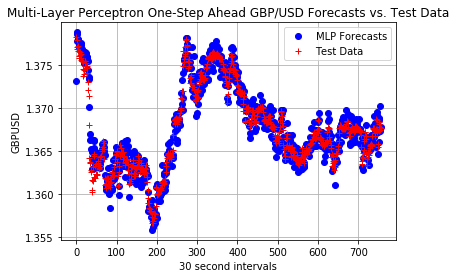

In [84]:
plt.plot(forecasts_mlp,'bo', label='MLP Forecasts')
plt.plot(raw_test,'r+',label='Test Data')
plt.xlabel('30 second intervals')
plt.ylabel('GBPUSD')
plt.title('Multi-Layer Perceptron One-Step Ahead GBP/USD Forecasts vs. Test Data')
plt.legend(loc="upper right")
plt.grid(True)

In [94]:
rmse_test = np.sqrt(mean_squared_error(forecasts_mlp, raw_test))
rmse_test

0.0011495861439798898

In [95]:
mean_abs_mlp=((forecasts_mlp-TWAP_test)/TWAP_test)*100.0
mean_abs_mlp_=abs(mean_abs_mlp)
mean_abs_mlp_

array([  3.64229717e-01,   6.82401958e-02,   1.24430878e-01,
         5.47076581e-02,   5.13126198e-02,   1.01025466e-01,
         6.06101804e-02,   1.12779707e-01,   9.62302001e-02,
         4.85202611e-02,   5.98273325e-02,   8.77400424e-02,
         1.10853169e-01,   1.00400744e-01,   1.00661781e-01,
         8.55855695e-02,   9.27662828e-02,   1.38621886e-01,
         1.49535825e-01,   9.06426017e-02,   6.24065632e-02,
         5.66508253e-02,   2.40135013e-02,   7.54412362e-02,
         8.89228362e-02,   1.04249697e-01,   8.12406317e-02,
         8.82639803e-02,   1.20343355e-01,   1.77811807e-01,
         1.64873732e-01,   1.56734861e-01,   3.91311689e-01,
         4.36982206e-01,   2.38384660e-01,   1.95209736e-01,
         2.68355552e-01,   1.89450913e-01,   2.36282794e-01,
         2.85176496e-01,   1.81724526e-01,   1.01809499e-01,
         4.98131475e-02,   4.54217325e-02,   1.34304772e-01,
         3.06644411e-01,   1.47196182e-01,   2.22798315e-02,
         1.06669887e-01,

In [96]:
np.mean(mean_abs_mlp_)

0.063953680777087518

## CNN 

In [97]:
# univariate cnn example
from numpy import array
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
 
# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)
 
# define input sequence

In [98]:
raw_seq=dfprices['TWAP OHLC Mid']
seq_len=len(raw_seq)
train_size=int(seq_len*0.70)
test_size= seq_len-train_size
raw_train=dfprices['TWAP OHLC Mid'][0:train_size]

In [99]:
n_steps = 3
# split into samples
#X, y = split_sequence(raw_seq, n_steps)
# reshape from [samples, timesteps] into [samples, timesteps, features]
n_features = 1
#X = X.reshape((X.shape[0], X.shape[1], n_features))
# define model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, n_features)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [100]:
forecasts_cnn=[]

In [101]:
test_size

756

In [422]:
a=[0,1,2,3,4,5,6,7,8,9]
a[-2],a[9],a[0:10]

(8, 9, [0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [102]:
for i in range(test_size):
    X, y = split_sequence(raw_seq[0:train_size+i], n_steps)
    X=X.reshape((X.shape[0], X.shape[1], n_features))
    model.fit(X, y, epochs=30,batch_size=512,verbose=1)
# demonstrate prediction
    x_input = raw_seq[train_size-3+i:train_size+i]
    x_input = x_input.reshape((1, n_steps, n_features))
    yhat = model.predict(x_input, verbose=0)
    forecasts_cnn.append(yhat)

Epoch 1/30
1760/1760 [==============================] - 0s 64us/step - loss: 1.3203
Epoch 2/30
1760/1760 [==============================] - 0s 6us/step - loss: 0.8758
Epoch 3/30
1760/1760 [==============================] - 0s 6us/step - loss: 0.5360
Epoch 4/30
1760/1760 [==============================] - 0s 6us/step - loss: 0.2876
Epoch 5/30
1760/1760 [==============================] - 0s 6us/step - loss: 0.1235
Epoch 6/30
1760/1760 [==============================] - 0s 6us/step - loss: 0.0327
Epoch 7/30
1760/1760 [==============================] - 0s 6us/step - loss: 0.0019
Epoch 8/30
1760/1760 [==============================] - 0s 6us/step - loss: 0.0077
Epoch 9/30
1760/1760 [==============================] - 0s 5us/step - loss: 0.0210
Epoch 10/30
1760/1760 [==============================] - 0s 6us/step - loss: 0.0232
Epoch 11/30
1760/1760 [==============================] - 0s 7us/step - loss: 0.0147
Epoch 12/30
1760/1760 [==============================] - 0s 7us/step - loss: 0.0051


1763/1763 [==============================] - 0s 7us/step - loss: 2.2038e-05
Epoch 6/30
1763/1763 [==============================] - 0s 6us/step - loss: 2.2036e-05
Epoch 7/30
1763/1763 [==============================] - 0s 6us/step - loss: 2.2029e-05
Epoch 8/30
1763/1763 [==============================] - 0s 6us/step - loss: 2.2029e-05
Epoch 9/30
1763/1763 [==============================] - 0s 6us/step - loss: 2.2023e-05
Epoch 10/30
1763/1763 [==============================] - 0s 7us/step - loss: 2.2016e-05
Epoch 11/30
1763/1763 [==============================] - 0s 7us/step - loss: 2.2009e-05
Epoch 12/30
1763/1763 [==============================] - 0s 6us/step - loss: 2.2006e-05
Epoch 13/30
1763/1763 [==============================] - 0s 7us/step - loss: 2.2005e-05
Epoch 14/30
1763/1763 [==============================] - 0s 7us/step - loss: 2.1989e-05
Epoch 15/30
1763/1763 [==============================] - 0s 6us/step - loss: 2.2012e-05
Epoch 16/30
1763/1763 [=========================

1766/1766 [==============================] - 0s 8us/step - loss: 2.1463e-05
Epoch 9/30
1766/1766 [==============================] - 0s 8us/step - loss: 2.1450e-05
Epoch 10/30
1766/1766 [==============================] - 0s 7us/step - loss: 2.1456e-05
Epoch 11/30
1766/1766 [==============================] - 0s 7us/step - loss: 2.1437e-05
Epoch 12/30
1766/1766 [==============================] - 0s 7us/step - loss: 2.1428e-05
Epoch 13/30
1766/1766 [==============================] - 0s 8us/step - loss: 2.1421e-05
Epoch 14/30
1766/1766 [==============================] - 0s 6us/step - loss: 2.1420e-05
Epoch 15/30
1766/1766 [==============================] - 0s 7us/step - loss: 2.1409e-05
Epoch 16/30
1766/1766 [==============================] - 0s 6us/step - loss: 2.1401e-05
Epoch 17/30
1766/1766 [==============================] - 0s 7us/step - loss: 2.1393e-05
Epoch 18/30
1766/1766 [==============================] - 0s 7us/step - loss: 2.1389e-05
Epoch 19/30
1766/1766 [======================

1769/1769 [==============================] - 0s 7us/step - loss: 2.0682e-05
Epoch 12/30
1769/1769 [==============================] - 0s 6us/step - loss: 2.0659e-05
Epoch 13/30
1769/1769 [==============================] - 0s 6us/step - loss: 2.0667e-05
Epoch 14/30
1769/1769 [==============================] - 0s 6us/step - loss: 2.0646e-05
Epoch 15/30
1769/1769 [==============================] - 0s 6us/step - loss: 2.0636e-05
Epoch 16/30
1769/1769 [==============================] - 0s 6us/step - loss: 2.0646e-05
Epoch 17/30
1769/1769 [==============================] - 0s 6us/step - loss: 2.0618e-05
Epoch 18/30
1769/1769 [==============================] - 0s 6us/step - loss: 2.0613e-05
Epoch 19/30
1769/1769 [==============================] - 0s 6us/step - loss: 2.0586e-05
Epoch 20/30
1769/1769 [==============================] - 0s 6us/step - loss: 2.0625e-05
Epoch 21/30
1769/1769 [==============================] - 0s 7us/step - loss: 2.0617e-05
Epoch 22/30
1769/1769 [=====================

1772/1772 [==============================] - 0s 6us/step - loss: 1.9703e-05
Epoch 15/30
1772/1772 [==============================] - 0s 7us/step - loss: 1.9680e-05
Epoch 16/30
1772/1772 [==============================] - 0s 6us/step - loss: 1.9673e-05
Epoch 17/30
1772/1772 [==============================] - 0s 6us/step - loss: 1.9657e-05
Epoch 18/30
1772/1772 [==============================] - 0s 6us/step - loss: 1.9646e-05
Epoch 19/30
1772/1772 [==============================] - 0s 6us/step - loss: 1.9633e-05
Epoch 20/30
1772/1772 [==============================] - 0s 6us/step - loss: 1.9643e-05
Epoch 21/30
1772/1772 [==============================] - 0s 6us/step - loss: 1.9612e-05
Epoch 22/30
1772/1772 [==============================] - 0s 6us/step - loss: 1.9605e-05
Epoch 23/30
1772/1772 [==============================] - 0s 7us/step - loss: 1.9590e-05
Epoch 24/30
1772/1772 [==============================] - 0s 7us/step - loss: 1.9577e-05
Epoch 25/30
1772/1772 [=====================

1775/1775 [==============================] - 0s 6us/step - loss: 1.8528e-05
Epoch 18/30
1775/1775 [==============================] - 0s 6us/step - loss: 1.8522e-05
Epoch 19/30
1775/1775 [==============================] - 0s 7us/step - loss: 1.8504e-05
Epoch 20/30
1775/1775 [==============================] - 0s 6us/step - loss: 1.8492e-05
Epoch 21/30
1775/1775 [==============================] - 0s 6us/step - loss: 1.8473e-05
Epoch 22/30
1775/1775 [==============================] - 0s 6us/step - loss: 1.8466e-05
Epoch 23/30
1775/1775 [==============================] - 0s 6us/step - loss: 1.8478e-05
Epoch 24/30
1775/1775 [==============================] - 0s 6us/step - loss: 1.8438e-05
Epoch 25/30
1775/1775 [==============================] - 0s 6us/step - loss: 1.8446e-05
Epoch 26/30
1775/1775 [==============================] - 0s 6us/step - loss: 1.8418e-05
Epoch 27/30
1775/1775 [==============================] - 0s 6us/step - loss: 1.8413e-05
Epoch 28/30
1775/1775 [=====================

1778/1778 [==============================] - 0s 5us/step - loss: 1.7211e-05
Epoch 21/30
1778/1778 [==============================] - 0s 6us/step - loss: 1.7221e-05
Epoch 22/30
1778/1778 [==============================] - 0s 5us/step - loss: 1.7201e-05
Epoch 23/30
1778/1778 [==============================] - 0s 6us/step - loss: 1.7167e-05
Epoch 24/30
1778/1778 [==============================] - 0s 6us/step - loss: 1.7169e-05
Epoch 25/30
1778/1778 [==============================] - 0s 5us/step - loss: 1.7133e-05
Epoch 26/30
1778/1778 [==============================] - 0s 5us/step - loss: 1.7145e-05
Epoch 27/30
1778/1778 [==============================] - 0s 5us/step - loss: 1.7094e-05
Epoch 28/30
1778/1778 [==============================] - 0s 5us/step - loss: 1.7136e-05
Epoch 29/30
1778/1778 [==============================] - 0s 6us/step - loss: 1.7068e-05
Epoch 30/30
1778/1778 [==============================] - 0s 6us/step - loss: 1.7044e-05
Epoch 1/30
1779/1779 [======================

1781/1781 [==============================] - 0s 6us/step - loss: 1.5784e-05
Epoch 24/30
1781/1781 [==============================] - 0s 7us/step - loss: 1.5782e-05
Epoch 25/30
1781/1781 [==============================] - 0s 7us/step - loss: 1.5757e-05
Epoch 26/30
1781/1781 [==============================] - 0s 7us/step - loss: 1.5701e-05
Epoch 27/30
1781/1781 [==============================] - 0s 7us/step - loss: 1.5665e-05
Epoch 28/30
1781/1781 [==============================] - 0s 7us/step - loss: 1.5701e-05
Epoch 29/30
1781/1781 [==============================] - 0s 7us/step - loss: 1.5747e-05
Epoch 30/30
1781/1781 [==============================] - 0s 7us/step - loss: 1.5614e-05
Epoch 1/30
1782/1782 [==============================] - 0s 6us/step - loss: 1.5645e-05
Epoch 2/30
1782/1782 [==============================] - 0s 6us/step - loss: 1.5675e-05
Epoch 3/30
1782/1782 [==============================] - 0s 6us/step - loss: 1.5587e-05
Epoch 4/30
1782/1782 [=========================

1784/1784 [==============================] - 0s 6us/step - loss: 1.4129e-05
Epoch 27/30
1784/1784 [==============================] - 0s 6us/step - loss: 1.4129e-05
Epoch 28/30
1784/1784 [==============================] - 0s 6us/step - loss: 1.4106e-05
Epoch 29/30
1784/1784 [==============================] - 0s 6us/step - loss: 1.4127e-05
Epoch 30/30
1784/1784 [==============================] - 0s 7us/step - loss: 1.4208e-05
Epoch 1/30
1785/1785 [==============================] - 0s 7us/step - loss: 1.4172e-05
Epoch 2/30
1785/1785 [==============================] - 0s 6us/step - loss: 1.4128e-05
Epoch 3/30
1785/1785 [==============================] - 0s 6us/step - loss: 1.4035e-05
Epoch 4/30
1785/1785 [==============================] - 0s 5us/step - loss: 1.4039e-05
Epoch 5/30
1785/1785 [==============================] - 0s 5us/step - loss: 1.4038e-05
Epoch 6/30
1785/1785 [==============================] - 0s 5us/step - loss: 1.3923e-05
Epoch 7/30
1785/1785 [============================

1787/1787 [==============================] - 0s 5us/step - loss: 1.2527e-05
Epoch 30/30
1787/1787 [==============================] - 0s 6us/step - loss: 1.2495e-05
Epoch 1/30
1788/1788 [==============================] - 0s 6us/step - loss: 1.2449e-05
Epoch 2/30
1788/1788 [==============================] - 0s 6us/step - loss: 1.2420e-05
Epoch 3/30
1788/1788 [==============================] - 0s 5us/step - loss: 1.2409e-05
Epoch 4/30
1788/1788 [==============================] - 0s 5us/step - loss: 1.2373e-05
Epoch 5/30
1788/1788 [==============================] - 0s 5us/step - loss: 1.2386e-05
Epoch 6/30
1788/1788 [==============================] - 0s 6us/step - loss: 1.2342e-05
Epoch 7/30
1788/1788 [==============================] - 0s 5us/step - loss: 1.2326e-05
Epoch 8/30
1788/1788 [==============================] - 0s 5us/step - loss: 1.2324e-05
Epoch 9/30
1788/1788 [==============================] - 0s 5us/step - loss: 1.2325e-05
Epoch 10/30
1788/1788 [==============================

1791/1791 [==============================] - 0s 6us/step - loss: 1.0856e-05
Epoch 3/30
1791/1791 [==============================] - 0s 6us/step - loss: 1.0864e-05
Epoch 4/30
1791/1791 [==============================] - 0s 5us/step - loss: 1.0983e-05
Epoch 5/30
1791/1791 [==============================] - 0s 5us/step - loss: 1.0816e-05
Epoch 6/30
1791/1791 [==============================] - 0s 5us/step - loss: 1.0844e-05
Epoch 7/30
1791/1791 [==============================] - 0s 5us/step - loss: 1.0889e-05
Epoch 8/30
1791/1791 [==============================] - 0s 5us/step - loss: 1.0861e-05
Epoch 9/30
1791/1791 [==============================] - 0s 5us/step - loss: 1.0787e-05
Epoch 10/30
1791/1791 [==============================] - 0s 5us/step - loss: 1.0639e-05
Epoch 11/30
1791/1791 [==============================] - 0s 5us/step - loss: 1.0656e-05
Epoch 12/30
1791/1791 [==============================] - 0s 5us/step - loss: 1.0633e-05
Epoch 13/30
1791/1791 [============================

1794/1794 [==============================] - 0s 5us/step - loss: 9.2385e-06
Epoch 6/30
1794/1794 [==============================] - 0s 5us/step - loss: 9.2149e-06
Epoch 7/30
1794/1794 [==============================] - 0s 6us/step - loss: 9.2185e-06
Epoch 8/30
1794/1794 [==============================] - 0s 6us/step - loss: 9.1855e-06
Epoch 9/30
1794/1794 [==============================] - 0s 6us/step - loss: 9.1702e-06
Epoch 10/30
1794/1794 [==============================] - 0s 6us/step - loss: 9.1660e-06
Epoch 11/30
1794/1794 [==============================] - 0s 6us/step - loss: 9.1684e-06
Epoch 12/30
1794/1794 [==============================] - 0s 6us/step - loss: 9.1709e-06
Epoch 13/30
1794/1794 [==============================] - 0s 6us/step - loss: 9.1904e-06
Epoch 14/30
1794/1794 [==============================] - 0s 6us/step - loss: 9.1529e-06
Epoch 15/30
1794/1794 [==============================] - 0s 6us/step - loss: 9.2024e-06
Epoch 16/30
1794/1794 [=========================

1797/1797 [==============================] - 0s 7us/step - loss: 7.7978e-06
Epoch 9/30
1797/1797 [==============================] - 0s 6us/step - loss: 7.7756e-06
Epoch 10/30
1797/1797 [==============================] - 0s 6us/step - loss: 7.7833e-06
Epoch 11/30
1797/1797 [==============================] - 0s 6us/step - loss: 7.7987e-06
Epoch 12/30
1797/1797 [==============================] - 0s 6us/step - loss: 7.7291e-06
Epoch 13/30
1797/1797 [==============================] - 0s 7us/step - loss: 7.7235e-06
Epoch 14/30
1797/1797 [==============================] - 0s 6us/step - loss: 7.7165e-06
Epoch 15/30
1797/1797 [==============================] - 0s 6us/step - loss: 7.7186e-06
Epoch 16/30
1797/1797 [==============================] - 0s 6us/step - loss: 7.7074e-06
Epoch 17/30
1797/1797 [==============================] - 0s 7us/step - loss: 7.7234e-06
Epoch 18/30
1797/1797 [==============================] - 0s 7us/step - loss: 7.7112e-06
Epoch 19/30
1797/1797 [======================

1800/1800 [==============================] - 0s 5us/step - loss: 6.5465e-06
Epoch 12/30
1800/1800 [==============================] - 0s 5us/step - loss: 6.5358e-06
Epoch 13/30
1800/1800 [==============================] - 0s 5us/step - loss: 6.6262e-06
Epoch 14/30
1800/1800 [==============================] - 0s 5us/step - loss: 6.8614e-06
Epoch 15/30
1800/1800 [==============================] - 0s 5us/step - loss: 6.5972e-06
Epoch 16/30
1800/1800 [==============================] - 0s 5us/step - loss: 6.5068e-06
Epoch 17/30
1800/1800 [==============================] - 0s 5us/step - loss: 6.5627e-06
Epoch 18/30
1800/1800 [==============================] - 0s 5us/step - loss: 6.4707e-06
Epoch 19/30
1800/1800 [==============================] - 0s 5us/step - loss: 6.4622e-06
Epoch 20/30
1800/1800 [==============================] - 0s 5us/step - loss: 6.4552e-06
Epoch 21/30
1800/1800 [==============================] - 0s 5us/step - loss: 6.4511e-06
Epoch 22/30
1800/1800 [=====================

1803/1803 [==============================] - 0s 5us/step - loss: 5.5990e-06
Epoch 15/30
1803/1803 [==============================] - 0s 5us/step - loss: 5.5737e-06
Epoch 16/30
1803/1803 [==============================] - 0s 5us/step - loss: 5.5913e-06
Epoch 17/30
1803/1803 [==============================] - 0s 5us/step - loss: 5.7055e-06
Epoch 18/30
1803/1803 [==============================] - 0s 5us/step - loss: 5.7182e-06
Epoch 19/30
1803/1803 [==============================] - 0s 6us/step - loss: 5.6921e-06
Epoch 20/30
1803/1803 [==============================] - 0s 5us/step - loss: 5.5911e-06
Epoch 21/30
1803/1803 [==============================] - 0s 5us/step - loss: 5.6032e-06
Epoch 22/30
1803/1803 [==============================] - 0s 5us/step - loss: 5.6023e-06
Epoch 23/30
1803/1803 [==============================] - 0s 5us/step - loss: 5.5197e-06
Epoch 24/30
1803/1803 [==============================] - 0s 6us/step - loss: 5.5759e-06
Epoch 25/30
1803/1803 [=====================

1806/1806 [==============================] - 0s 6us/step - loss: 5.0309e-06
Epoch 18/30
1806/1806 [==============================] - 0s 6us/step - loss: 4.9856e-06
Epoch 19/30
1806/1806 [==============================] - 0s 6us/step - loss: 4.9986e-06
Epoch 20/30
1806/1806 [==============================] - 0s 6us/step - loss: 4.9375e-06
Epoch 21/30
1806/1806 [==============================] - 0s 6us/step - loss: 4.9112e-06
Epoch 22/30
1806/1806 [==============================] - 0s 5us/step - loss: 4.9151e-06
Epoch 23/30
1806/1806 [==============================] - 0s 6us/step - loss: 4.9410e-06
Epoch 24/30
1806/1806 [==============================] - 0s 6us/step - loss: 5.1295e-06
Epoch 25/30
1806/1806 [==============================] - 0s 6us/step - loss: 4.9621e-06
Epoch 26/30
1806/1806 [==============================] - 0s 6us/step - loss: 4.9191e-06
Epoch 27/30
1806/1806 [==============================] - 0s 6us/step - loss: 4.8531e-06
Epoch 28/30
1806/1806 [=====================

1809/1809 [==============================] - 0s 5us/step - loss: 4.5061e-06
Epoch 21/30
1809/1809 [==============================] - 0s 5us/step - loss: 4.4970e-06
Epoch 22/30
1809/1809 [==============================] - 0s 5us/step - loss: 4.5191e-06
Epoch 23/30
1809/1809 [==============================] - 0s 5us/step - loss: 4.9118e-06
Epoch 24/30
1809/1809 [==============================] - 0s 5us/step - loss: 5.3031e-06
Epoch 25/30
1809/1809 [==============================] - 0s 5us/step - loss: 4.6584e-06
Epoch 26/30
1809/1809 [==============================] - 0s 5us/step - loss: 4.6741e-06
Epoch 27/30
1809/1809 [==============================] - 0s 5us/step - loss: 4.8948e-06
Epoch 28/30
1809/1809 [==============================] - 0s 5us/step - loss: 4.8357e-06
Epoch 29/30
1809/1809 [==============================] - 0s 5us/step - loss: 4.6030e-06
Epoch 30/30
1809/1809 [==============================] - 0s 5us/step - loss: 4.7206e-06
Epoch 1/30
1810/1810 [======================

1812/1812 [==============================] - 0s 5us/step - loss: 4.3457e-06
Epoch 24/30
1812/1812 [==============================] - 0s 5us/step - loss: 4.4606e-06
Epoch 25/30
1812/1812 [==============================] - 0s 5us/step - loss: 4.3506e-06
Epoch 26/30
1812/1812 [==============================] - 0s 5us/step - loss: 4.3644e-06
Epoch 27/30
1812/1812 [==============================] - 0s 5us/step - loss: 4.5681e-06
Epoch 28/30
1812/1812 [==============================] - 0s 5us/step - loss: 4.4998e-06
Epoch 29/30
1812/1812 [==============================] - 0s 5us/step - loss: 4.3931e-06
Epoch 30/30
1812/1812 [==============================] - 0s 5us/step - loss: 4.2755e-06
Epoch 1/30
1813/1813 [==============================] - 0s 6us/step - loss: 4.2496e-06
Epoch 2/30
1813/1813 [==============================] - 0s 6us/step - loss: 4.3639e-06
Epoch 3/30
1813/1813 [==============================] - 0s 6us/step - loss: 4.4176e-06
Epoch 4/30
1813/1813 [=========================

1815/1815 [==============================] - 0s 5us/step - loss: 4.8115e-06
Epoch 27/30
1815/1815 [==============================] - 0s 6us/step - loss: 4.4824e-06
Epoch 28/30
1815/1815 [==============================] - 0s 5us/step - loss: 4.4524e-06
Epoch 29/30
1815/1815 [==============================] - 0s 5us/step - loss: 4.3811e-06
Epoch 30/30
1815/1815 [==============================] - 0s 6us/step - loss: 4.9780e-06
Epoch 1/30
1816/1816 [==============================] - 0s 6us/step - loss: 4.4984e-06
Epoch 2/30
1816/1816 [==============================] - 0s 5us/step - loss: 4.2724e-06
Epoch 3/30
1816/1816 [==============================] - 0s 5us/step - loss: 4.1966e-06
Epoch 4/30
1816/1816 [==============================] - 0s 5us/step - loss: 4.2326e-06
Epoch 5/30
1816/1816 [==============================] - 0s 6us/step - loss: 4.3346e-06
Epoch 6/30
1816/1816 [==============================] - 0s 6us/step - loss: 4.2903e-06
Epoch 7/30
1816/1816 [============================

1818/1818 [==============================] - 0s 6us/step - loss: 4.1541e-06
Epoch 30/30
1818/1818 [==============================] - 0s 6us/step - loss: 4.2712e-06
Epoch 1/30
1819/1819 [==============================] - 0s 6us/step - loss: 4.4016e-06
Epoch 2/30
1819/1819 [==============================] - 0s 6us/step - loss: 4.2055e-06
Epoch 3/30
1819/1819 [==============================] - 0s 5us/step - loss: 4.2694e-06
Epoch 4/30
1819/1819 [==============================] - 0s 5us/step - loss: 4.2463e-06
Epoch 5/30
1819/1819 [==============================] - 0s 5us/step - loss: 4.2997e-06
Epoch 6/30
1819/1819 [==============================] - 0s 5us/step - loss: 4.6609e-06
Epoch 7/30
1819/1819 [==============================] - 0s 5us/step - loss: 4.8394e-06
Epoch 8/30
1819/1819 [==============================] - 0s 5us/step - loss: 4.4711e-06
Epoch 9/30
1819/1819 [==============================] - 0s 5us/step - loss: 4.8091e-06
Epoch 10/30
1819/1819 [==============================

1822/1822 [==============================] - 0s 5us/step - loss: 4.5801e-06
Epoch 3/30
1822/1822 [==============================] - 0s 5us/step - loss: 4.6491e-06
Epoch 4/30
1822/1822 [==============================] - 0s 5us/step - loss: 5.3740e-06
Epoch 5/30
1822/1822 [==============================] - 0s 6us/step - loss: 6.2034e-06
Epoch 6/30
1822/1822 [==============================] - 0s 6us/step - loss: 5.4499e-06
Epoch 7/30
1822/1822 [==============================] - 0s 6us/step - loss: 5.4161e-06
Epoch 8/30
1822/1822 [==============================] - 0s 6us/step - loss: 5.6366e-06
Epoch 9/30
1822/1822 [==============================] - 0s 6us/step - loss: 4.8486e-06
Epoch 10/30
1822/1822 [==============================] - 0s 6us/step - loss: 6.9815e-06
Epoch 11/30
1822/1822 [==============================] - 0s 6us/step - loss: 5.4545e-06
Epoch 12/30
1822/1822 [==============================] - 0s 7us/step - loss: 4.8838e-06
Epoch 13/30
1822/1822 [============================

1825/1825 [==============================] - 0s 6us/step - loss: 5.1627e-06
Epoch 6/30
1825/1825 [==============================] - 0s 6us/step - loss: 5.2551e-06
Epoch 7/30
1825/1825 [==============================] - 0s 6us/step - loss: 6.7203e-06
Epoch 8/30
1825/1825 [==============================] - 0s 6us/step - loss: 6.9995e-06
Epoch 9/30
1825/1825 [==============================] - 0s 5us/step - loss: 5.0659e-06
Epoch 10/30
1825/1825 [==============================] - 0s 7us/step - loss: 6.0685e-06
Epoch 11/30
1825/1825 [==============================] - 0s 6us/step - loss: 7.8847e-06
Epoch 12/30
1825/1825 [==============================] - 0s 6us/step - loss: 7.8952e-06
Epoch 13/30
1825/1825 [==============================] - 0s 6us/step - loss: 7.7223e-06
Epoch 14/30
1825/1825 [==============================] - 0s 6us/step - loss: 8.8682e-06
Epoch 15/30
1825/1825 [==============================] - 0s 6us/step - loss: 5.4190e-06
Epoch 16/30
1825/1825 [=========================

1828/1828 [==============================] - 0s 7us/step - loss: 1.1434e-05
Epoch 9/30
1828/1828 [==============================] - 0s 6us/step - loss: 6.4955e-06
Epoch 10/30
1828/1828 [==============================] - 0s 6us/step - loss: 1.1384e-05
Epoch 11/30
1828/1828 [==============================] - 0s 6us/step - loss: 5.1150e-06
Epoch 12/30
1828/1828 [==============================] - 0s 6us/step - loss: 5.0379e-06
Epoch 13/30
1828/1828 [==============================] - 0s 6us/step - loss: 8.4451e-06
Epoch 14/30
1828/1828 [==============================] - 0s 9us/step - loss: 5.8528e-06
Epoch 15/30
1828/1828 [==============================] - 0s 9us/step - loss: 1.2464e-05
Epoch 16/30
1828/1828 [==============================] - 0s 8us/step - loss: 4.9749e-06
Epoch 17/30
1828/1828 [==============================] - 0s 7us/step - loss: 4.5444e-06
Epoch 18/30
1828/1828 [==============================] - 0s 8us/step - loss: 4.3263e-06
Epoch 19/30
1828/1828 [======================

1831/1831 [==============================] - 0s 6us/step - loss: 4.1785e-06
Epoch 12/30
1831/1831 [==============================] - 0s 6us/step - loss: 4.2491e-06
Epoch 13/30
1831/1831 [==============================] - 0s 6us/step - loss: 6.0906e-06
Epoch 14/30
1831/1831 [==============================] - 0s 6us/step - loss: 4.4268e-06
Epoch 15/30
1831/1831 [==============================] - 0s 6us/step - loss: 4.1825e-06
Epoch 16/30
1831/1831 [==============================] - 0s 6us/step - loss: 6.2452e-06
Epoch 17/30
1831/1831 [==============================] - 0s 6us/step - loss: 4.6031e-06
Epoch 18/30
1831/1831 [==============================] - 0s 6us/step - loss: 7.0778e-06
Epoch 19/30
1831/1831 [==============================] - 0s 7us/step - loss: 5.1893e-06
Epoch 20/30
1831/1831 [==============================] - 0s 6us/step - loss: 5.2136e-06
Epoch 21/30
1831/1831 [==============================] - 0s 6us/step - loss: 8.4939e-06
Epoch 22/30
1831/1831 [=====================

1834/1834 [==============================] - 0s 6us/step - loss: 5.0393e-06
Epoch 15/30
1834/1834 [==============================] - 0s 6us/step - loss: 5.5171e-06
Epoch 16/30
1834/1834 [==============================] - 0s 6us/step - loss: 5.0165e-06
Epoch 17/30
1834/1834 [==============================] - 0s 6us/step - loss: 4.2416e-06
Epoch 18/30
1834/1834 [==============================] - 0s 7us/step - loss: 4.2278e-06
Epoch 19/30
1834/1834 [==============================] - 0s 7us/step - loss: 7.3505e-06
Epoch 20/30
1834/1834 [==============================] - 0s 7us/step - loss: 5.0733e-06
Epoch 21/30
1834/1834 [==============================] - 0s 7us/step - loss: 4.9446e-06
Epoch 22/30
1834/1834 [==============================] - 0s 7us/step - loss: 6.8964e-06
Epoch 23/30
1834/1834 [==============================] - 0s 6us/step - loss: 4.4101e-06
Epoch 24/30
1834/1834 [==============================] - 0s 6us/step - loss: 5.5542e-06
Epoch 25/30
1834/1834 [=====================

1837/1837 [==============================] - 0s 5us/step - loss: 4.3380e-06
Epoch 18/30
1837/1837 [==============================] - 0s 6us/step - loss: 4.3242e-06
Epoch 19/30
1837/1837 [==============================] - 0s 5us/step - loss: 4.8880e-06
Epoch 20/30
1837/1837 [==============================] - 0s 5us/step - loss: 5.6682e-06
Epoch 21/30
1837/1837 [==============================] - 0s 6us/step - loss: 1.2168e-05
Epoch 22/30
1837/1837 [==============================] - 0s 5us/step - loss: 5.0984e-06
Epoch 23/30
1837/1837 [==============================] - 0s 5us/step - loss: 4.5791e-06
Epoch 24/30
1837/1837 [==============================] - 0s 5us/step - loss: 5.0687e-06
Epoch 25/30
1837/1837 [==============================] - 0s 6us/step - loss: 1.1039e-05
Epoch 26/30
1837/1837 [==============================] - 0s 5us/step - loss: 7.0245e-06
Epoch 27/30
1837/1837 [==============================] - 0s 5us/step - loss: 1.0113e-05
Epoch 28/30
1837/1837 [=====================

1840/1840 [==============================] - 0s 6us/step - loss: 6.2644e-06
Epoch 21/30
1840/1840 [==============================] - 0s 7us/step - loss: 5.4343e-06
Epoch 22/30
1840/1840 [==============================] - 0s 7us/step - loss: 9.6469e-06
Epoch 23/30
1840/1840 [==============================] - 0s 6us/step - loss: 1.2324e-05
Epoch 24/30
1840/1840 [==============================] - 0s 6us/step - loss: 5.3717e-06
Epoch 25/30
1840/1840 [==============================] - 0s 6us/step - loss: 6.5761e-06
Epoch 26/30
1840/1840 [==============================] - 0s 6us/step - loss: 5.6342e-06
Epoch 27/30
1840/1840 [==============================] - 0s 7us/step - loss: 7.7667e-06
Epoch 28/30
1840/1840 [==============================] - 0s 7us/step - loss: 6.9586e-06
Epoch 29/30
1840/1840 [==============================] - 0s 6us/step - loss: 1.1524e-05
Epoch 30/30
1840/1840 [==============================] - 0s 5us/step - loss: 9.7352e-06
Epoch 1/30
1841/1841 [======================

1843/1843 [==============================] - 0s 7us/step - loss: 1.2511e-05
Epoch 24/30
1843/1843 [==============================] - 0s 6us/step - loss: 8.5751e-06
Epoch 25/30
1843/1843 [==============================] - 0s 6us/step - loss: 5.4512e-06
Epoch 26/30
1843/1843 [==============================] - 0s 6us/step - loss: 4.4196e-06
Epoch 27/30
1843/1843 [==============================] - 0s 6us/step - loss: 4.5974e-06
Epoch 28/30
1843/1843 [==============================] - 0s 6us/step - loss: 4.3416e-06
Epoch 29/30
1843/1843 [==============================] - 0s 6us/step - loss: 4.6825e-06
Epoch 30/30
1843/1843 [==============================] - 0s 6us/step - loss: 4.2666e-06
Epoch 1/30
1844/1844 [==============================] - 0s 7us/step - loss: 4.5339e-06
Epoch 2/30
1844/1844 [==============================] - 0s 6us/step - loss: 4.0580e-06
Epoch 3/30
1844/1844 [==============================] - 0s 6us/step - loss: 6.1017e-06
Epoch 4/30
1844/1844 [=========================

1846/1846 [==============================] - 0s 6us/step - loss: 6.5100e-06
Epoch 27/30
1846/1846 [==============================] - 0s 6us/step - loss: 5.2566e-06
Epoch 28/30
1846/1846 [==============================] - 0s 6us/step - loss: 6.0686e-06
Epoch 29/30
1846/1846 [==============================] - 0s 6us/step - loss: 4.6207e-06
Epoch 30/30
1846/1846 [==============================] - 0s 6us/step - loss: 4.2411e-06
Epoch 1/30
1847/1847 [==============================] - 0s 7us/step - loss: 4.1121e-06
Epoch 2/30
1847/1847 [==============================] - 0s 6us/step - loss: 4.0436e-06
Epoch 3/30
1847/1847 [==============================] - 0s 6us/step - loss: 4.1400e-06
Epoch 4/30
1847/1847 [==============================] - 0s 6us/step - loss: 4.5989e-06
Epoch 5/30
1847/1847 [==============================] - 0s 6us/step - loss: 1.0635e-05
Epoch 6/30
1847/1847 [==============================] - 0s 6us/step - loss: 5.0335e-06
Epoch 7/30
1847/1847 [============================

1849/1849 [==============================] - 0s 6us/step - loss: 4.9212e-06
Epoch 30/30
1849/1849 [==============================] - 0s 6us/step - loss: 4.4407e-06
Epoch 1/30
1850/1850 [==============================] - 0s 6us/step - loss: 5.2434e-06
Epoch 2/30
1850/1850 [==============================] - 0s 6us/step - loss: 4.4635e-06
Epoch 3/30
1850/1850 [==============================] - 0s 7us/step - loss: 4.5372e-06
Epoch 4/30
1850/1850 [==============================] - 0s 7us/step - loss: 4.0639e-06
Epoch 5/30
1850/1850 [==============================] - 0s 6us/step - loss: 4.5145e-06
Epoch 6/30
1850/1850 [==============================] - 0s 6us/step - loss: 4.3843e-06
Epoch 7/30
1850/1850 [==============================] - 0s 6us/step - loss: 7.0572e-06
Epoch 8/30
1850/1850 [==============================] - 0s 6us/step - loss: 5.3114e-06
Epoch 9/30
1850/1850 [==============================] - 0s 5us/step - loss: 8.8731e-06
Epoch 10/30
1850/1850 [==============================

1853/1853 [==============================] - 0s 6us/step - loss: 4.2257e-06
Epoch 3/30
1853/1853 [==============================] - 0s 7us/step - loss: 4.1114e-06
Epoch 4/30
1853/1853 [==============================] - 0s 7us/step - loss: 5.0981e-06
Epoch 5/30
1853/1853 [==============================] - 0s 6us/step - loss: 4.1337e-06
Epoch 6/30
1853/1853 [==============================] - 0s 6us/step - loss: 6.9235e-06
Epoch 7/30
1853/1853 [==============================] - 0s 7us/step - loss: 4.5328e-06
Epoch 8/30
1853/1853 [==============================] - 0s 7us/step - loss: 4.3887e-06
Epoch 9/30
1853/1853 [==============================] - 0s 7us/step - loss: 5.5968e-06
Epoch 10/30
1853/1853 [==============================] - 0s 7us/step - loss: 4.5302e-06
Epoch 11/30
1853/1853 [==============================] - 0s 7us/step - loss: 4.4785e-06
Epoch 12/30
1853/1853 [==============================] - 0s 6us/step - loss: 4.5043e-06
Epoch 13/30
1853/1853 [============================

1856/1856 [==============================] - 0s 7us/step - loss: 4.9844e-06
Epoch 6/30
1856/1856 [==============================] - 0s 6us/step - loss: 4.4465e-06
Epoch 7/30
1856/1856 [==============================] - 0s 6us/step - loss: 4.6966e-06
Epoch 8/30
1856/1856 [==============================] - 0s 6us/step - loss: 1.5355e-05
Epoch 9/30
1856/1856 [==============================] - 0s 6us/step - loss: 6.7665e-06
Epoch 10/30
1856/1856 [==============================] - 0s 7us/step - loss: 6.4773e-06
Epoch 11/30
1856/1856 [==============================] - 0s 7us/step - loss: 6.2228e-06
Epoch 12/30
1856/1856 [==============================] - 0s 7us/step - loss: 4.6980e-06
Epoch 13/30
1856/1856 [==============================] - 0s 7us/step - loss: 5.8067e-06
Epoch 14/30
1856/1856 [==============================] - 0s 7us/step - loss: 4.3215e-06
Epoch 15/30
1856/1856 [==============================] - 0s 8us/step - loss: 1.0285e-05
Epoch 16/30
1856/1856 [=========================

1859/1859 [==============================] - 0s 6us/step - loss: 5.7401e-06
Epoch 9/30
1859/1859 [==============================] - 0s 7us/step - loss: 5.4046e-06
Epoch 10/30
1859/1859 [==============================] - 0s 7us/step - loss: 4.6392e-06
Epoch 11/30
1859/1859 [==============================] - 0s 6us/step - loss: 4.1936e-06
Epoch 12/30
1859/1859 [==============================] - 0s 6us/step - loss: 4.4330e-06
Epoch 13/30
1859/1859 [==============================] - 0s 7us/step - loss: 4.4133e-06
Epoch 14/30
1859/1859 [==============================] - 0s 7us/step - loss: 5.6257e-06
Epoch 15/30
1859/1859 [==============================] - 0s 8us/step - loss: 4.0732e-06
Epoch 16/30
1859/1859 [==============================] - 0s 8us/step - loss: 4.0407e-06
Epoch 17/30
1859/1859 [==============================] - 0s 8us/step - loss: 4.0581e-06
Epoch 18/30
1859/1859 [==============================] - 0s 8us/step - loss: 4.3016e-06
Epoch 19/30
1859/1859 [======================

1862/1862 [==============================] - 0s 6us/step - loss: 7.4557e-06
Epoch 12/30
1862/1862 [==============================] - 0s 6us/step - loss: 6.5578e-06
Epoch 13/30
1862/1862 [==============================] - 0s 6us/step - loss: 4.7070e-06
Epoch 14/30
1862/1862 [==============================] - 0s 6us/step - loss: 4.0335e-06
Epoch 15/30
1862/1862 [==============================] - 0s 7us/step - loss: 5.6568e-06
Epoch 16/30
1862/1862 [==============================] - 0s 7us/step - loss: 6.3094e-06
Epoch 17/30
1862/1862 [==============================] - 0s 7us/step - loss: 1.0307e-05
Epoch 18/30
1862/1862 [==============================] - 0s 6us/step - loss: 5.6964e-06
Epoch 19/30
1862/1862 [==============================] - 0s 6us/step - loss: 4.5765e-06
Epoch 20/30
1862/1862 [==============================] - 0s 6us/step - loss: 5.1830e-06
Epoch 21/30
1862/1862 [==============================] - 0s 6us/step - loss: 5.3689e-06
Epoch 22/30
1862/1862 [=====================

1865/1865 [==============================] - 0s 6us/step - loss: 5.5610e-06
Epoch 15/30
1865/1865 [==============================] - 0s 6us/step - loss: 6.1231e-06
Epoch 16/30
1865/1865 [==============================] - 0s 6us/step - loss: 7.1959e-06
Epoch 17/30
1865/1865 [==============================] - 0s 13us/step - loss: 7.0816e-06
Epoch 18/30
1865/1865 [==============================] - 0s 8us/step - loss: 4.7112e-06
Epoch 19/30
1865/1865 [==============================] - 0s 8us/step - loss: 5.6048e-06
Epoch 20/30
1865/1865 [==============================] - 0s 8us/step - loss: 1.1357e-05
Epoch 21/30
1865/1865 [==============================] - 0s 8us/step - loss: 9.2722e-06
Epoch 22/30
1865/1865 [==============================] - 0s 6us/step - loss: 5.0850e-06
Epoch 23/30
1865/1865 [==============================] - 0s 6us/step - loss: 5.2857e-06
Epoch 24/30
1865/1865 [==============================] - 0s 6us/step - loss: 4.0241e-06
Epoch 25/30
1865/1865 [====================

1868/1868 [==============================] - 0s 6us/step - loss: 7.0400e-06
Epoch 18/30
1868/1868 [==============================] - 0s 6us/step - loss: 5.3545e-06
Epoch 19/30
1868/1868 [==============================] - 0s 6us/step - loss: 5.6994e-06
Epoch 20/30
1868/1868 [==============================] - 0s 7us/step - loss: 1.1050e-05
Epoch 21/30
1868/1868 [==============================] - 0s 6us/step - loss: 6.9326e-06
Epoch 22/30
1868/1868 [==============================] - 0s 6us/step - loss: 1.2676e-05
Epoch 23/30
1868/1868 [==============================] - 0s 6us/step - loss: 5.4314e-06
Epoch 24/30
1868/1868 [==============================] - 0s 6us/step - loss: 4.8122e-06
Epoch 25/30
1868/1868 [==============================] - 0s 7us/step - loss: 4.6674e-06
Epoch 26/30
1868/1868 [==============================] - 0s 6us/step - loss: 6.2971e-06
Epoch 27/30
1868/1868 [==============================] - 0s 6us/step - loss: 4.3553e-06
Epoch 28/30
1868/1868 [=====================

1871/1871 [==============================] - 0s 6us/step - loss: 1.0682e-05
Epoch 21/30
1871/1871 [==============================] - 0s 6us/step - loss: 4.7895e-06
Epoch 22/30
1871/1871 [==============================] - 0s 6us/step - loss: 4.6747e-06
Epoch 23/30
1871/1871 [==============================] - 0s 6us/step - loss: 5.2293e-06
Epoch 24/30
1871/1871 [==============================] - 0s 6us/step - loss: 5.8962e-06
Epoch 25/30
1871/1871 [==============================] - 0s 6us/step - loss: 4.8847e-06
Epoch 26/30
1871/1871 [==============================] - 0s 6us/step - loss: 5.6134e-06
Epoch 27/30
1871/1871 [==============================] - 0s 6us/step - loss: 4.3344e-06
Epoch 28/30
1871/1871 [==============================] - 0s 6us/step - loss: 5.8981e-06
Epoch 29/30
1871/1871 [==============================] - 0s 6us/step - loss: 7.4386e-06
Epoch 30/30
1871/1871 [==============================] - 0s 6us/step - loss: 4.0867e-06
Epoch 1/30
1872/1872 [======================

1874/1874 [==============================] - 0s 5us/step - loss: 4.0013e-06
Epoch 24/30
1874/1874 [==============================] - 0s 6us/step - loss: 4.6170e-06
Epoch 25/30
1874/1874 [==============================] - 0s 6us/step - loss: 5.5051e-06
Epoch 26/30
1874/1874 [==============================] - 0s 6us/step - loss: 4.3850e-06
Epoch 27/30
1874/1874 [==============================] - 0s 5us/step - loss: 4.8596e-06
Epoch 28/30
1874/1874 [==============================] - 0s 5us/step - loss: 8.6606e-06
Epoch 29/30
1874/1874 [==============================] - 0s 6us/step - loss: 4.8899e-06
Epoch 30/30
1874/1874 [==============================] - 0s 6us/step - loss: 5.1985e-06
Epoch 1/30
1875/1875 [==============================] - 0s 6us/step - loss: 7.7025e-06
Epoch 2/30
1875/1875 [==============================] - 0s 6us/step - loss: 9.8797e-06
Epoch 3/30
1875/1875 [==============================] - 0s 5us/step - loss: 5.2903e-06
Epoch 4/30
1875/1875 [=========================

1877/1877 [==============================] - 0s 6us/step - loss: 5.3729e-06
Epoch 27/30
1877/1877 [==============================] - 0s 6us/step - loss: 8.6393e-06
Epoch 28/30
1877/1877 [==============================] - 0s 5us/step - loss: 6.0469e-06
Epoch 29/30
1877/1877 [==============================] - 0s 5us/step - loss: 1.3859e-05
Epoch 30/30
1877/1877 [==============================] - 0s 6us/step - loss: 7.3998e-06
Epoch 1/30
1878/1878 [==============================] - 0s 6us/step - loss: 1.4607e-05
Epoch 2/30
1878/1878 [==============================] - 0s 6us/step - loss: 8.2171e-06
Epoch 3/30
1878/1878 [==============================] - 0s 6us/step - loss: 5.5203e-06
Epoch 4/30
1878/1878 [==============================] - 0s 6us/step - loss: 5.7573e-06
Epoch 5/30
1878/1878 [==============================] - 0s 6us/step - loss: 4.4823e-06
Epoch 6/30
1878/1878 [==============================] - 0s 5us/step - loss: 4.5594e-06
Epoch 7/30
1878/1878 [============================

1880/1880 [==============================] - 0s 5us/step - loss: 5.1329e-06
Epoch 30/30
1880/1880 [==============================] - 0s 6us/step - loss: 4.0577e-06
Epoch 1/30
1881/1881 [==============================] - 0s 6us/step - loss: 4.0673e-06
Epoch 2/30
1881/1881 [==============================] - 0s 6us/step - loss: 4.2964e-06
Epoch 3/30
1881/1881 [==============================] - 0s 6us/step - loss: 4.4758e-06
Epoch 4/30
1881/1881 [==============================] - 0s 6us/step - loss: 4.7808e-06
Epoch 5/30
1881/1881 [==============================] - 0s 6us/step - loss: 6.7568e-06
Epoch 6/30
1881/1881 [==============================] - 0s 6us/step - loss: 5.3471e-06
Epoch 7/30
1881/1881 [==============================] - 0s 6us/step - loss: 5.3295e-06
Epoch 8/30
1881/1881 [==============================] - 0s 6us/step - loss: 6.5778e-06
Epoch 9/30
1881/1881 [==============================] - 0s 6us/step - loss: 4.5308e-06
Epoch 10/30
1881/1881 [==============================

1884/1884 [==============================] - 0s 6us/step - loss: 7.2923e-06
Epoch 3/30
1884/1884 [==============================] - 0s 6us/step - loss: 4.4972e-06
Epoch 4/30
1884/1884 [==============================] - 0s 5us/step - loss: 4.0580e-06
Epoch 5/30
1884/1884 [==============================] - 0s 6us/step - loss: 4.7729e-06
Epoch 6/30
1884/1884 [==============================] - 0s 6us/step - loss: 5.8544e-06
Epoch 7/30
1884/1884 [==============================] - 0s 6us/step - loss: 5.1130e-06
Epoch 8/30
1884/1884 [==============================] - 0s 6us/step - loss: 4.6930e-06
Epoch 9/30
1884/1884 [==============================] - 0s 6us/step - loss: 4.6138e-06
Epoch 10/30
1884/1884 [==============================] - 0s 6us/step - loss: 6.8552e-06
Epoch 11/30
1884/1884 [==============================] - 0s 6us/step - loss: 4.0426e-06
Epoch 12/30
1884/1884 [==============================] - 0s 6us/step - loss: 6.0547e-06
Epoch 13/30
1884/1884 [============================

1887/1887 [==============================] - 0s 6us/step - loss: 4.2304e-06
Epoch 6/30
1887/1887 [==============================] - 0s 6us/step - loss: 8.2843e-06
Epoch 7/30
1887/1887 [==============================] - 0s 7us/step - loss: 4.9672e-06
Epoch 8/30
1887/1887 [==============================] - 0s 6us/step - loss: 5.8068e-06
Epoch 9/30
1887/1887 [==============================] - 0s 6us/step - loss: 4.2577e-06
Epoch 10/30
1887/1887 [==============================] - 0s 6us/step - loss: 8.3629e-06
Epoch 11/30
1887/1887 [==============================] - 0s 6us/step - loss: 4.4819e-06
Epoch 12/30
1887/1887 [==============================] - 0s 6us/step - loss: 4.4522e-06
Epoch 13/30
1887/1887 [==============================] - 0s 6us/step - loss: 4.5071e-06
Epoch 14/30
1887/1887 [==============================] - 0s 6us/step - loss: 4.3381e-06
Epoch 15/30
1887/1887 [==============================] - 0s 6us/step - loss: 3.9473e-06
Epoch 16/30
1887/1887 [=========================

1890/1890 [==============================] - 0s 6us/step - loss: 5.5182e-06
Epoch 9/30
1890/1890 [==============================] - 0s 6us/step - loss: 4.1628e-06
Epoch 10/30
1890/1890 [==============================] - 0s 6us/step - loss: 1.1008e-05
Epoch 11/30
1890/1890 [==============================] - 0s 6us/step - loss: 7.6014e-06
Epoch 12/30
1890/1890 [==============================] - 0s 5us/step - loss: 1.3389e-05
Epoch 13/30
1890/1890 [==============================] - 0s 6us/step - loss: 1.2512e-05
Epoch 14/30
1890/1890 [==============================] - 0s 5us/step - loss: 8.0758e-06
Epoch 15/30
1890/1890 [==============================] - 0s 5us/step - loss: 1.4310e-05
Epoch 16/30
1890/1890 [==============================] - 0s 6us/step - loss: 6.9278e-06
Epoch 17/30
1890/1890 [==============================] - 0s 6us/step - loss: 6.5356e-06
Epoch 18/30
1890/1890 [==============================] - 0s 6us/step - loss: 5.4764e-06
Epoch 19/30
1890/1890 [======================

1893/1893 [==============================] - 0s 6us/step - loss: 4.0331e-06
Epoch 12/30
1893/1893 [==============================] - 0s 6us/step - loss: 4.2076e-06
Epoch 13/30
1893/1893 [==============================] - 0s 6us/step - loss: 5.9126e-06
Epoch 14/30
1893/1893 [==============================] - 0s 6us/step - loss: 5.8711e-06
Epoch 15/30
1893/1893 [==============================] - 0s 6us/step - loss: 5.5334e-06
Epoch 16/30
1893/1893 [==============================] - 0s 6us/step - loss: 7.8726e-06
Epoch 17/30
1893/1893 [==============================] - 0s 6us/step - loss: 6.5029e-06
Epoch 18/30
1893/1893 [==============================] - 0s 6us/step - loss: 5.1422e-06
Epoch 19/30
1893/1893 [==============================] - 0s 6us/step - loss: 5.9038e-06
Epoch 20/30
1893/1893 [==============================] - 0s 6us/step - loss: 4.7914e-06
Epoch 21/30
1893/1893 [==============================] - 0s 6us/step - loss: 6.5896e-06
Epoch 22/30
1893/1893 [=====================

1896/1896 [==============================] - 0s 6us/step - loss: 5.1243e-06
Epoch 15/30
1896/1896 [==============================] - 0s 6us/step - loss: 4.8832e-06
Epoch 16/30
1896/1896 [==============================] - 0s 6us/step - loss: 6.0685e-06
Epoch 17/30
1896/1896 [==============================] - 0s 6us/step - loss: 3.9769e-06
Epoch 18/30
1896/1896 [==============================] - 0s 6us/step - loss: 4.8854e-06
Epoch 19/30
1896/1896 [==============================] - 0s 6us/step - loss: 5.2359e-06
Epoch 20/30
1896/1896 [==============================] - 0s 6us/step - loss: 4.8501e-06
Epoch 21/30
1896/1896 [==============================] - 0s 6us/step - loss: 3.8899e-06
Epoch 22/30
1896/1896 [==============================] - 0s 6us/step - loss: 4.5998e-06
Epoch 23/30
1896/1896 [==============================] - 0s 6us/step - loss: 4.1714e-06
Epoch 24/30
1896/1896 [==============================] - 0s 6us/step - loss: 4.0080e-06
Epoch 25/30
1896/1896 [=====================

1899/1899 [==============================] - 0s 6us/step - loss: 5.2900e-06
Epoch 18/30
1899/1899 [==============================] - 0s 6us/step - loss: 6.3635e-06
Epoch 19/30
1899/1899 [==============================] - 0s 6us/step - loss: 9.7327e-06
Epoch 20/30
1899/1899 [==============================] - 0s 6us/step - loss: 7.2294e-06
Epoch 21/30
1899/1899 [==============================] - 0s 6us/step - loss: 7.0232e-06
Epoch 22/30
1899/1899 [==============================] - 0s 6us/step - loss: 5.8898e-06
Epoch 23/30
1899/1899 [==============================] - 0s 6us/step - loss: 1.3177e-05
Epoch 24/30
1899/1899 [==============================] - 0s 6us/step - loss: 6.3894e-06
Epoch 25/30
1899/1899 [==============================] - 0s 5us/step - loss: 4.8351e-06
Epoch 26/30
1899/1899 [==============================] - 0s 6us/step - loss: 4.7597e-06
Epoch 27/30
1899/1899 [==============================] - 0s 6us/step - loss: 3.9070e-06
Epoch 28/30
1899/1899 [=====================

1902/1902 [==============================] - 0s 6us/step - loss: 3.8932e-06
Epoch 21/30
1902/1902 [==============================] - 0s 5us/step - loss: 4.6173e-06
Epoch 22/30
1902/1902 [==============================] - 0s 6us/step - loss: 4.3302e-06
Epoch 23/30
1902/1902 [==============================] - 0s 6us/step - loss: 4.4154e-06
Epoch 24/30
1902/1902 [==============================] - ETA: 0s - loss: 4.4902e-0 - 0s 6us/step - loss: 4.2547e-06
Epoch 25/30
1902/1902 [==============================] - 0s 6us/step - loss: 1.0084e-05
Epoch 26/30
1902/1902 [==============================] - 0s 6us/step - loss: 1.7308e-05
Epoch 27/30
1902/1902 [==============================] - 0s 6us/step - loss: 1.3496e-05
Epoch 28/30
1902/1902 [==============================] - 0s 7us/step - loss: 9.2650e-06
Epoch 29/30
1902/1902 [==============================] - 0s 7us/step - loss: 1.3587e-05
Epoch 30/30
1902/1902 [==============================] - 0s 6us/step - loss: 6.8795e-06
Epoch 1/30
1903/

1905/1905 [==============================] - 0s 5us/step - loss: 4.0863e-06
Epoch 24/30
1905/1905 [==============================] - 0s 6us/step - loss: 4.4386e-06
Epoch 25/30
1905/1905 [==============================] - 0s 6us/step - loss: 5.7433e-06
Epoch 26/30
1905/1905 [==============================] - 0s 6us/step - loss: 4.3769e-06
Epoch 27/30
1905/1905 [==============================] - 0s 6us/step - loss: 1.0934e-05
Epoch 28/30
1905/1905 [==============================] - 0s 6us/step - loss: 4.5205e-06
Epoch 29/30
1905/1905 [==============================] - 0s 7us/step - loss: 4.4088e-06
Epoch 30/30
1905/1905 [==============================] - 0s 6us/step - loss: 5.1456e-06
Epoch 1/30
1906/1906 [==============================] - 0s 6us/step - loss: 6.6571e-06
Epoch 2/30
1906/1906 [==============================] - 0s 5us/step - loss: 5.3642e-06
Epoch 3/30
1906/1906 [==============================] - 0s 6us/step - loss: 1.9100e-05
Epoch 4/30
1906/1906 [=========================

1908/1908 [==============================] - 0s 6us/step - loss: 3.9821e-06
Epoch 27/30
1908/1908 [==============================] - 0s 6us/step - loss: 3.9097e-06
Epoch 28/30
1908/1908 [==============================] - 0s 5us/step - loss: 4.0389e-06
Epoch 29/30
1908/1908 [==============================] - 0s 6us/step - loss: 4.4027e-06
Epoch 30/30
1908/1908 [==============================] - 0s 6us/step - loss: 4.1011e-06
Epoch 1/30
1909/1909 [==============================] - 0s 6us/step - loss: 4.3233e-06
Epoch 2/30
1909/1909 [==============================] - 0s 6us/step - loss: 4.4154e-06
Epoch 3/30
1909/1909 [==============================] - 0s 6us/step - loss: 5.4127e-06
Epoch 4/30
1909/1909 [==============================] - 0s 6us/step - loss: 5.3568e-06
Epoch 5/30
1909/1909 [==============================] - 0s 6us/step - loss: 5.0336e-06
Epoch 6/30
1909/1909 [==============================] - 0s 6us/step - loss: 4.1221e-06
Epoch 7/30
1909/1909 [============================

1911/1911 [==============================] - 0s 8us/step - loss: 5.5493e-06
Epoch 30/30
1911/1911 [==============================] - 0s 10us/step - loss: 4.7613e-06
Epoch 1/30
1912/1912 [==============================] - 0s 9us/step - loss: 7.4288e-06
Epoch 2/30
1912/1912 [==============================] - 0s 11us/step - loss: 4.4051e-06
Epoch 3/30
1912/1912 [==============================] - 0s 10us/step - loss: 4.7299e-06
Epoch 4/30
1912/1912 [==============================] - 0s 11us/step - loss: 6.6252e-06
Epoch 5/30
1912/1912 [==============================] - 0s 11us/step - loss: 5.3118e-06
Epoch 6/30
1912/1912 [==============================] - 0s 8us/step - loss: 4.1976e-06
Epoch 7/30
1912/1912 [==============================] - 0s 7us/step - loss: 6.8110e-06
Epoch 8/30
1912/1912 [==============================] - 0s 7us/step - loss: 5.5679e-06
Epoch 9/30
1912/1912 [==============================] - 0s 6us/step - loss: 6.0584e-06
Epoch 10/30
1912/1912 [=========================

1915/1915 [==============================] - 0s 9us/step - loss: 4.9399e-06
Epoch 2/30
1915/1915 [==============================] - 0s 7us/step - loss: 3.9724e-06
Epoch 3/30
1915/1915 [==============================] - 0s 7us/step - loss: 4.6350e-06
Epoch 4/30
1915/1915 [==============================] - 0s 7us/step - loss: 3.9759e-06
Epoch 5/30
1915/1915 [==============================] - 0s 7us/step - loss: 5.4975e-06
Epoch 6/30
1915/1915 [==============================] - 0s 9us/step - loss: 4.0975e-06
Epoch 7/30
1915/1915 [==============================] - 0s 8us/step - loss: 4.4720e-06
Epoch 8/30
1915/1915 [==============================] - 0s 8us/step - loss: 3.9713e-06
Epoch 9/30
1915/1915 [==============================] - 0s 7us/step - loss: 4.9145e-06
Epoch 10/30
1915/1915 [==============================] - 0s 8us/step - loss: 3.8703e-06
Epoch 11/30
1915/1915 [==============================] - 0s 8us/step - loss: 4.1577e-06
Epoch 12/30
1915/1915 [=============================

1918/1918 [==============================] - 0s 6us/step - loss: 5.6409e-06
Epoch 5/30
1918/1918 [==============================] - 0s 6us/step - loss: 4.7095e-06
Epoch 6/30
1918/1918 [==============================] - 0s 6us/step - loss: 4.4967e-06
Epoch 7/30
1918/1918 [==============================] - 0s 6us/step - loss: 6.0666e-06
Epoch 8/30
1918/1918 [==============================] - 0s 6us/step - loss: 4.8363e-06
Epoch 9/30
1918/1918 [==============================] - 0s 6us/step - loss: 8.5043e-06
Epoch 10/30
1918/1918 [==============================] - 0s 6us/step - loss: 4.8011e-06
Epoch 11/30
1918/1918 [==============================] - 0s 5us/step - loss: 5.8424e-06
Epoch 12/30
1918/1918 [==============================] - 0s 7us/step - loss: 5.2888e-06
Epoch 13/30
1918/1918 [==============================] - 0s 6us/step - loss: 3.9465e-06
Epoch 14/30
1918/1918 [==============================] - 0s 6us/step - loss: 3.9872e-06
Epoch 15/30
1918/1918 [==========================

1921/1921 [==============================] - 0s 6us/step - loss: 5.5667e-06
Epoch 8/30
1921/1921 [==============================] - 0s 6us/step - loss: 5.0651e-06
Epoch 9/30
1921/1921 [==============================] - 0s 6us/step - loss: 4.2222e-06
Epoch 10/30
1921/1921 [==============================] - 0s 6us/step - loss: 5.3107e-06
Epoch 11/30
1921/1921 [==============================] - 0s 7us/step - loss: 9.3688e-06
Epoch 12/30
1921/1921 [==============================] - 0s 6us/step - loss: 4.7851e-06
Epoch 13/30
1921/1921 [==============================] - 0s 6us/step - loss: 3.9881e-06
Epoch 14/30
1921/1921 [==============================] - 0s 7us/step - loss: 4.2712e-06
Epoch 15/30
1921/1921 [==============================] - 0s 6us/step - loss: 4.0590e-06
Epoch 16/30
1921/1921 [==============================] - 0s 6us/step - loss: 4.1211e-06
Epoch 17/30
1921/1921 [==============================] - 0s 7us/step - loss: 4.5888e-06
Epoch 18/30
1921/1921 [=======================

1924/1924 [==============================] - 0s 6us/step - loss: 8.8688e-06
Epoch 11/30
1924/1924 [==============================] - 0s 8us/step - loss: 7.8777e-06
Epoch 12/30
1924/1924 [==============================] - 0s 7us/step - loss: 6.2004e-06
Epoch 13/30
1924/1924 [==============================] - 0s 7us/step - loss: 4.0341e-06
Epoch 14/30
1924/1924 [==============================] - 0s 6us/step - loss: 3.8329e-06
Epoch 15/30
1924/1924 [==============================] - 0s 7us/step - loss: 4.3589e-06
Epoch 16/30
1924/1924 [==============================] - 0s 7us/step - loss: 8.7806e-06
Epoch 17/30
1924/1924 [==============================] - 0s 6us/step - loss: 4.1737e-06
Epoch 18/30
1924/1924 [==============================] - 0s 6us/step - loss: 4.8114e-06
Epoch 19/30
1924/1924 [==============================] - 0s 7us/step - loss: 3.9794e-06
Epoch 20/30
1924/1924 [==============================] - 0s 7us/step - loss: 4.2853e-06
Epoch 21/30
1924/1924 [=====================

1927/1927 [==============================] - 0s 6us/step - loss: 8.9011e-06
Epoch 14/30
1927/1927 [==============================] - 0s 6us/step - loss: 1.1092e-05
Epoch 15/30
1927/1927 [==============================] - 0s 6us/step - loss: 9.9520e-06
Epoch 16/30
1927/1927 [==============================] - 0s 5us/step - loss: 5.6645e-06
Epoch 17/30
1927/1927 [==============================] - 0s 5us/step - loss: 1.1731e-05
Epoch 18/30
1927/1927 [==============================] - 0s 6us/step - loss: 4.6493e-06
Epoch 19/30
1927/1927 [==============================] - 0s 6us/step - loss: 3.8826e-06
Epoch 20/30
1927/1927 [==============================] - 0s 5us/step - loss: 4.0256e-06
Epoch 21/30
1927/1927 [==============================] - 0s 6us/step - loss: 3.9465e-06
Epoch 22/30
1927/1927 [==============================] - 0s 5us/step - loss: 4.3244e-06
Epoch 23/30
1927/1927 [==============================] - 0s 5us/step - loss: 4.2524e-06
Epoch 24/30
1927/1927 [=====================

1930/1930 [==============================] - 0s 6us/step - loss: 4.1128e-06
Epoch 17/30
1930/1930 [==============================] - 0s 6us/step - loss: 4.3224e-06
Epoch 18/30
1930/1930 [==============================] - 0s 6us/step - loss: 4.1842e-06
Epoch 19/30
1930/1930 [==============================] - 0s 6us/step - loss: 4.7942e-06
Epoch 20/30
1930/1930 [==============================] - 0s 6us/step - loss: 6.0491e-06
Epoch 21/30
1930/1930 [==============================] - 0s 5us/step - loss: 1.1323e-05
Epoch 22/30
1930/1930 [==============================] - 0s 5us/step - loss: 9.9409e-06
Epoch 23/30
1930/1930 [==============================] - 0s 6us/step - loss: 9.3633e-06
Epoch 24/30
1930/1930 [==============================] - 0s 5us/step - loss: 1.1497e-05
Epoch 25/30
1930/1930 [==============================] - 0s 5us/step - loss: 1.4284e-05
Epoch 26/30
1930/1930 [==============================] - 0s 6us/step - loss: 1.3715e-05
Epoch 27/30
1930/1930 [=====================

1933/1933 [==============================] - 0s 6us/step - loss: 3.8251e-06
Epoch 20/30
1933/1933 [==============================] - 0s 6us/step - loss: 4.1702e-06
Epoch 21/30
1933/1933 [==============================] - 0s 6us/step - loss: 3.9640e-06
Epoch 22/30
1933/1933 [==============================] - 0s 7us/step - loss: 4.8694e-06
Epoch 23/30
1933/1933 [==============================] - 0s 6us/step - loss: 9.6917e-06
Epoch 24/30
1933/1933 [==============================] - 0s 7us/step - loss: 7.0552e-06
Epoch 25/30
1933/1933 [==============================] - 0s 7us/step - loss: 7.1973e-06
Epoch 26/30
1933/1933 [==============================] - 0s 7us/step - loss: 1.2229e-05
Epoch 27/30
1933/1933 [==============================] - 0s 6us/step - loss: 7.1130e-06
Epoch 28/30
1933/1933 [==============================] - 0s 6us/step - loss: 4.2714e-06
Epoch 29/30
1933/1933 [==============================] - 0s 6us/step - loss: 3.8896e-06
Epoch 30/30
1933/1933 [=====================

1936/1936 [==============================] - 0s 6us/step - loss: 7.7511e-06
Epoch 23/30
1936/1936 [==============================] - 0s 6us/step - loss: 5.1230e-06
Epoch 24/30
1936/1936 [==============================] - 0s 6us/step - loss: 8.6750e-06
Epoch 25/30
1936/1936 [==============================] - 0s 6us/step - loss: 6.3258e-06
Epoch 26/30
1936/1936 [==============================] - 0s 6us/step - loss: 6.0761e-06
Epoch 27/30
1936/1936 [==============================] - 0s 7us/step - loss: 1.1830e-05
Epoch 28/30
1936/1936 [==============================] - 0s 6us/step - loss: 7.2601e-06
Epoch 29/30
1936/1936 [==============================] - 0s 6us/step - loss: 5.0767e-06
Epoch 30/30
1936/1936 [==============================] - 0s 6us/step - loss: 5.7801e-06
Epoch 1/30
1937/1937 [==============================] - 0s 6us/step - loss: 4.9672e-06
Epoch 2/30
1937/1937 [==============================] - 0s 6us/step - loss: 5.5834e-06
Epoch 3/30
1937/1937 [========================

1939/1939 [==============================] - 0s 6us/step - loss: 5.5168e-06
Epoch 26/30
1939/1939 [==============================] - 0s 5us/step - loss: 4.5130e-06
Epoch 27/30
1939/1939 [==============================] - 0s 6us/step - loss: 4.3217e-06
Epoch 28/30
1939/1939 [==============================] - 0s 6us/step - loss: 4.5064e-06
Epoch 29/30
1939/1939 [==============================] - 0s 5us/step - loss: 3.8932e-06
Epoch 30/30
1939/1939 [==============================] - 0s 6us/step - loss: 6.3729e-06
Epoch 1/30
1940/1940 [==============================] - 0s 6us/step - loss: 4.7630e-06
Epoch 2/30
1940/1940 [==============================] - 0s 6us/step - loss: 5.2391e-06
Epoch 3/30
1940/1940 [==============================] - 0s 6us/step - loss: 1.0948e-05
Epoch 4/30
1940/1940 [==============================] - 0s 6us/step - loss: 5.8000e-06
Epoch 5/30
1940/1940 [==============================] - 0s 6us/step - loss: 4.4831e-06
Epoch 6/30
1940/1940 [===========================

1942/1942 [==============================] - 0s 6us/step - loss: 1.0716e-05
Epoch 29/30
1942/1942 [==============================] - 0s 6us/step - loss: 5.6698e-06
Epoch 30/30
1942/1942 [==============================] - 0s 5us/step - loss: 5.6212e-06
Epoch 1/30
1943/1943 [==============================] - 0s 6us/step - loss: 4.2426e-06
Epoch 2/30
1943/1943 [==============================] - 0s 6us/step - loss: 5.1838e-06
Epoch 3/30
1943/1943 [==============================] - 0s 5us/step - loss: 6.6142e-06
Epoch 4/30
1943/1943 [==============================] - 0s 5us/step - loss: 4.9165e-06
Epoch 5/30
1943/1943 [==============================] - 0s 6us/step - loss: 4.9353e-06
Epoch 6/30
1943/1943 [==============================] - 0s 6us/step - loss: 4.1303e-06
Epoch 7/30
1943/1943 [==============================] - 0s 5us/step - loss: 4.2905e-06
Epoch 8/30
1943/1943 [==============================] - 0s 6us/step - loss: 4.1025e-06
Epoch 9/30
1943/1943 [==============================

1946/1946 [==============================] - 0s 6us/step - loss: 3.8480e-06
Epoch 2/30
1946/1946 [==============================] - 0s 6us/step - loss: 3.8405e-06
Epoch 3/30
1946/1946 [==============================] - 0s 5us/step - loss: 4.8674e-06
Epoch 4/30
1946/1946 [==============================] - 0s 6us/step - loss: 4.9706e-06
Epoch 5/30
1946/1946 [==============================] - 0s 6us/step - loss: 4.4231e-06
Epoch 6/30
1946/1946 [==============================] - 0s 5us/step - loss: 4.3776e-06
Epoch 7/30
1946/1946 [==============================] - 0s 5us/step - loss: 5.4969e-06
Epoch 8/30
1946/1946 [==============================] - 0s 6us/step - loss: 5.7637e-06
Epoch 9/30
1946/1946 [==============================] - 0s 5us/step - loss: 8.9021e-06
Epoch 10/30
1946/1946 [==============================] - 0s 6us/step - loss: 9.2869e-06
Epoch 11/30
1946/1946 [==============================] - 0s 6us/step - loss: 1.5569e-05
Epoch 12/30
1946/1946 [=============================

1949/1949 [==============================] - 0s 5us/step - loss: 4.0680e-06
Epoch 5/30
1949/1949 [==============================] - 0s 6us/step - loss: 5.4420e-06
Epoch 6/30
1949/1949 [==============================] - 0s 5us/step - loss: 5.6964e-06
Epoch 7/30
1949/1949 [==============================] - 0s 6us/step - loss: 6.2230e-06
Epoch 8/30
1949/1949 [==============================] - 0s 5us/step - loss: 8.5931e-06
Epoch 9/30
1949/1949 [==============================] - 0s 6us/step - loss: 4.4335e-06
Epoch 10/30
1949/1949 [==============================] - 0s 5us/step - loss: 4.5437e-06
Epoch 11/30
1949/1949 [==============================] - 0s 6us/step - loss: 4.8782e-06
Epoch 12/30
1949/1949 [==============================] - 0s 5us/step - loss: 5.1968e-06
Epoch 13/30
1949/1949 [==============================] - 0s 5us/step - loss: 9.8205e-06
Epoch 14/30
1949/1949 [==============================] - 0s 6us/step - loss: 6.0026e-06
Epoch 15/30
1949/1949 [==========================

1952/1952 [==============================] - 0s 6us/step - loss: 4.1186e-06
Epoch 8/30
1952/1952 [==============================] - 0s 6us/step - loss: 4.0058e-06
Epoch 9/30
1952/1952 [==============================] - 0s 6us/step - loss: 4.0119e-06
Epoch 10/30
1952/1952 [==============================] - 0s 5us/step - loss: 4.1532e-06
Epoch 11/30
1952/1952 [==============================] - 0s 5us/step - loss: 5.0425e-06
Epoch 12/30
1952/1952 [==============================] - 0s 5us/step - loss: 6.8030e-06
Epoch 13/30
1952/1952 [==============================] - 0s 5us/step - loss: 7.8436e-06
Epoch 14/30
1952/1952 [==============================] - 0s 5us/step - loss: 5.8219e-06
Epoch 15/30
1952/1952 [==============================] - 0s 5us/step - loss: 6.9051e-06
Epoch 16/30
1952/1952 [==============================] - 0s 5us/step - loss: 6.7954e-06
Epoch 17/30
1952/1952 [==============================] - 0s 5us/step - loss: 5.0199e-06
Epoch 18/30
1952/1952 [=======================

1955/1955 [==============================] - 0s 5us/step - loss: 4.0946e-06
Epoch 11/30
1955/1955 [==============================] - 0s 5us/step - loss: 4.6928e-06
Epoch 12/30
1955/1955 [==============================] - 0s 5us/step - loss: 4.5436e-06
Epoch 13/30
1955/1955 [==============================] - 0s 5us/step - loss: 6.4016e-06
Epoch 14/30
1955/1955 [==============================] - 0s 5us/step - loss: 4.5513e-06
Epoch 15/30
1955/1955 [==============================] - 0s 5us/step - loss: 4.0678e-06
Epoch 16/30
1955/1955 [==============================] - 0s 5us/step - loss: 5.4678e-06
Epoch 17/30
1955/1955 [==============================] - 0s 5us/step - loss: 4.3755e-06
Epoch 18/30
1955/1955 [==============================] - 0s 5us/step - loss: 5.1064e-06
Epoch 19/30
1955/1955 [==============================] - 0s 5us/step - loss: 5.9529e-06
Epoch 20/30
1955/1955 [==============================] - 0s 5us/step - loss: 4.7922e-06
Epoch 21/30
1955/1955 [=====================

1958/1958 [==============================] - 0s 5us/step - loss: 4.7939e-06
Epoch 14/30
1958/1958 [==============================] - 0s 5us/step - loss: 4.5035e-06
Epoch 15/30
1958/1958 [==============================] - 0s 5us/step - loss: 4.2965e-06
Epoch 16/30
1958/1958 [==============================] - 0s 5us/step - loss: 3.8980e-06
Epoch 17/30
1958/1958 [==============================] - 0s 5us/step - loss: 3.7905e-06
Epoch 18/30
1958/1958 [==============================] - 0s 5us/step - loss: 5.1691e-06
Epoch 19/30
1958/1958 [==============================] - 0s 5us/step - loss: 4.7658e-06
Epoch 20/30
1958/1958 [==============================] - 0s 5us/step - loss: 5.9175e-06
Epoch 21/30
1958/1958 [==============================] - 0s 5us/step - loss: 5.9111e-06
Epoch 22/30
1958/1958 [==============================] - 0s 6us/step - loss: 4.3074e-06
Epoch 23/30
1958/1958 [==============================] - 0s 5us/step - loss: 6.1688e-06
Epoch 24/30
1958/1958 [=====================

1961/1961 [==============================] - 0s 5us/step - loss: 3.8762e-06
Epoch 17/30
1961/1961 [==============================] - 0s 5us/step - loss: 5.6869e-06
Epoch 18/30
1961/1961 [==============================] - 0s 5us/step - loss: 4.0491e-06
Epoch 19/30
1961/1961 [==============================] - 0s 5us/step - loss: 4.1904e-06
Epoch 20/30
1961/1961 [==============================] - 0s 5us/step - loss: 3.9709e-06
Epoch 21/30
1961/1961 [==============================] - 0s 5us/step - loss: 3.9342e-06
Epoch 22/30
1961/1961 [==============================] - 0s 5us/step - loss: 3.9936e-06
Epoch 23/30
1961/1961 [==============================] - 0s 5us/step - loss: 5.0472e-06
Epoch 24/30
1961/1961 [==============================] - 0s 5us/step - loss: 1.0490e-05
Epoch 25/30
1961/1961 [==============================] - 0s 5us/step - loss: 7.6415e-06
Epoch 26/30
1961/1961 [==============================] - 0s 5us/step - loss: 8.5836e-06
Epoch 27/30
1961/1961 [=====================

1964/1964 [==============================] - 0s 8us/step - loss: 4.4090e-06
Epoch 20/30
1964/1964 [==============================] - 0s 8us/step - loss: 4.0351e-06
Epoch 21/30
1964/1964 [==============================] - 0s 7us/step - loss: 6.0745e-06
Epoch 22/30
1964/1964 [==============================] - 0s 7us/step - loss: 5.0739e-06
Epoch 23/30
1964/1964 [==============================] - 0s 6us/step - loss: 4.5077e-06
Epoch 24/30
1964/1964 [==============================] - 0s 6us/step - loss: 6.9929e-06
Epoch 25/30
1964/1964 [==============================] - 0s 7us/step - loss: 5.8276e-06
Epoch 26/30
1964/1964 [==============================] - 0s 7us/step - loss: 6.8947e-06
Epoch 27/30
1964/1964 [==============================] - 0s 7us/step - loss: 5.2867e-06
Epoch 28/30
1964/1964 [==============================] - 0s 6us/step - loss: 5.0010e-06
Epoch 29/30
1964/1964 [==============================] - 0s 6us/step - loss: 4.7413e-06
Epoch 30/30
1964/1964 [=====================

1967/1967 [==============================] - 0s 6us/step - loss: 5.3033e-06
Epoch 23/30
1967/1967 [==============================] - 0s 6us/step - loss: 6.2730e-06
Epoch 24/30
1967/1967 [==============================] - ETA: 0s - loss: 1.3782e-0 - 0s 6us/step - loss: 8.3034e-06
Epoch 25/30
1967/1967 [==============================] - 0s 6us/step - loss: 9.5297e-06
Epoch 26/30
1967/1967 [==============================] - 0s 6us/step - loss: 6.3477e-06
Epoch 27/30
1967/1967 [==============================] - 0s 6us/step - loss: 5.7879e-06
Epoch 28/30
1967/1967 [==============================] - 0s 6us/step - loss: 4.7412e-06
Epoch 29/30
1967/1967 [==============================] - 0s 6us/step - loss: 5.9876e-06
Epoch 30/30
1967/1967 [==============================] - 0s 6us/step - loss: 5.6647e-06
Epoch 1/30
1968/1968 [==============================] - 0s 6us/step - loss: 5.3994e-06
Epoch 2/30
1968/1968 [==============================] - 0s 6us/step - loss: 7.4087e-06
Epoch 3/30
1968/19

1970/1970 [==============================] - 0s 6us/step - loss: 4.6873e-06
Epoch 26/30
1970/1970 [==============================] - 0s 6us/step - loss: 4.4173e-06
Epoch 27/30
1970/1970 [==============================] - 0s 6us/step - loss: 4.7814e-06
Epoch 28/30
1970/1970 [==============================] - 0s 5us/step - loss: 6.9980e-06
Epoch 29/30
1970/1970 [==============================] - 0s 5us/step - loss: 3.8869e-06
Epoch 30/30
1970/1970 [==============================] - 0s 5us/step - loss: 3.9193e-06
Epoch 1/30
1971/1971 [==============================] - 0s 6us/step - loss: 3.7536e-06
Epoch 2/30
1971/1971 [==============================] - 0s 5us/step - loss: 4.0486e-06
Epoch 3/30
1971/1971 [==============================] - 0s 5us/step - loss: 4.6454e-06
Epoch 4/30
1971/1971 [==============================] - 0s 5us/step - loss: 4.5022e-06
Epoch 5/30
1971/1971 [==============================] - 0s 5us/step - loss: 6.3622e-06
Epoch 6/30
1971/1971 [===========================

1973/1973 [==============================] - 0s 5us/step - loss: 5.5714e-06
Epoch 29/30
1973/1973 [==============================] - 0s 5us/step - loss: 7.6861e-06
Epoch 30/30
1973/1973 [==============================] - 0s 5us/step - loss: 9.2134e-06
Epoch 1/30
1974/1974 [==============================] - 0s 6us/step - loss: 4.5447e-06
Epoch 2/30
1974/1974 [==============================] - 0s 5us/step - loss: 8.9172e-06
Epoch 3/30
1974/1974 [==============================] - 0s 6us/step - loss: 5.3245e-06
Epoch 4/30
1974/1974 [==============================] - 0s 5us/step - loss: 8.6318e-06
Epoch 5/30
1974/1974 [==============================] - 0s 5us/step - loss: 4.8569e-06
Epoch 6/30
1974/1974 [==============================] - 0s 5us/step - loss: 4.8986e-06
Epoch 7/30
1974/1974 [==============================] - 0s 5us/step - loss: 7.0684e-06
Epoch 8/30
1974/1974 [==============================] - 0s 6us/step - loss: 6.1100e-06
Epoch 9/30
1974/1974 [==============================

1977/1977 [==============================] - 0s 5us/step - loss: 5.4063e-06
Epoch 2/30
1977/1977 [==============================] - 0s 6us/step - loss: 3.9701e-06
Epoch 3/30
1977/1977 [==============================] - 0s 6us/step - loss: 3.6695e-06
Epoch 4/30
1977/1977 [==============================] - 0s 6us/step - loss: 3.6845e-06
Epoch 5/30
1977/1977 [==============================] - 0s 6us/step - loss: 4.2356e-06
Epoch 6/30
1977/1977 [==============================] - 0s 6us/step - loss: 3.8271e-06
Epoch 7/30
1977/1977 [==============================] - 0s 6us/step - loss: 3.9987e-06
Epoch 8/30
1977/1977 [==============================] - 0s 6us/step - loss: 5.3974e-06
Epoch 9/30
1977/1977 [==============================] - 0s 6us/step - loss: 5.7391e-06
Epoch 10/30
1977/1977 [==============================] - 0s 6us/step - loss: 5.5096e-06
Epoch 11/30
1977/1977 [==============================] - 0s 6us/step - loss: 4.6520e-06
Epoch 12/30
1977/1977 [=============================

1980/1980 [==============================] - 0s 5us/step - loss: 9.0557e-06
Epoch 5/30
1980/1980 [==============================] - 0s 5us/step - loss: 5.8532e-06
Epoch 6/30
1980/1980 [==============================] - 0s 5us/step - loss: 5.5708e-06
Epoch 7/30
1980/1980 [==============================] - 0s 6us/step - loss: 5.4417e-06
Epoch 8/30
1980/1980 [==============================] - 0s 5us/step - loss: 5.0137e-06
Epoch 9/30
1980/1980 [==============================] - 0s 6us/step - loss: 4.0125e-06
Epoch 10/30
1980/1980 [==============================] - 0s 5us/step - loss: 4.3006e-06
Epoch 11/30
1980/1980 [==============================] - 0s 6us/step - loss: 5.0052e-06
Epoch 12/30
1980/1980 [==============================] - 0s 6us/step - loss: 7.0357e-06
Epoch 13/30
1980/1980 [==============================] - 0s 5us/step - loss: 7.4933e-06
Epoch 14/30
1980/1980 [==============================] - 0s 5us/step - loss: 4.6676e-06
Epoch 15/30
1980/1980 [==========================

1983/1983 [==============================] - 0s 6us/step - loss: 4.3111e-06
Epoch 8/30
1983/1983 [==============================] - 0s 6us/step - loss: 4.4844e-06
Epoch 9/30
1983/1983 [==============================] - 0s 6us/step - loss: 4.4997e-06
Epoch 10/30
1983/1983 [==============================] - 0s 6us/step - loss: 6.3112e-06
Epoch 11/30
1983/1983 [==============================] - 0s 6us/step - loss: 7.3886e-06
Epoch 12/30
1983/1983 [==============================] - 0s 6us/step - loss: 7.2282e-06
Epoch 13/30
1983/1983 [==============================] - 0s 6us/step - loss: 6.2423e-06
Epoch 14/30
1983/1983 [==============================] - 0s 6us/step - loss: 8.9653e-06
Epoch 15/30
1983/1983 [==============================] - 0s 6us/step - loss: 4.7980e-06
Epoch 16/30
1983/1983 [==============================] - 0s 6us/step - loss: 4.7989e-06
Epoch 17/30
1983/1983 [==============================] - 0s 6us/step - loss: 4.1793e-06
Epoch 18/30
1983/1983 [=======================

1986/1986 [==============================] - 0s 6us/step - loss: 6.9539e-06
Epoch 11/30
1986/1986 [==============================] - 0s 5us/step - loss: 5.5451e-06
Epoch 12/30
1986/1986 [==============================] - 0s 6us/step - loss: 5.4601e-06
Epoch 13/30
1986/1986 [==============================] - 0s 6us/step - loss: 5.3013e-06
Epoch 14/30
1986/1986 [==============================] - 0s 6us/step - loss: 6.5737e-06
Epoch 15/30
1986/1986 [==============================] - 0s 6us/step - loss: 5.0997e-06
Epoch 16/30
1986/1986 [==============================] - 0s 6us/step - loss: 4.7745e-06
Epoch 17/30
1986/1986 [==============================] - 0s 7us/step - loss: 6.1626e-06
Epoch 18/30
1986/1986 [==============================] - 0s 6us/step - loss: 6.4747e-06
Epoch 19/30
1986/1986 [==============================] - 0s 7us/step - loss: 4.2997e-06
Epoch 20/30
1986/1986 [==============================] - 0s 7us/step - loss: 4.0129e-06
Epoch 21/30
1986/1986 [=====================

1989/1989 [==============================] - 0s 6us/step - loss: 4.3279e-06
Epoch 14/30
1989/1989 [==============================] - 0s 6us/step - loss: 4.4872e-06
Epoch 15/30
1989/1989 [==============================] - 0s 5us/step - loss: 5.5145e-06
Epoch 16/30
1989/1989 [==============================] - 0s 5us/step - loss: 5.2581e-06
Epoch 17/30
1989/1989 [==============================] - 0s 5us/step - loss: 4.1592e-06
Epoch 18/30
1989/1989 [==============================] - 0s 6us/step - loss: 4.2889e-06
Epoch 19/30
1989/1989 [==============================] - 0s 5us/step - loss: 5.1259e-06
Epoch 20/30
1989/1989 [==============================] - 0s 5us/step - loss: 8.1805e-06
Epoch 21/30
1989/1989 [==============================] - 0s 6us/step - loss: 4.8560e-06
Epoch 22/30
1989/1989 [==============================] - 0s 5us/step - loss: 4.6579e-06
Epoch 23/30
1989/1989 [==============================] - 0s 5us/step - loss: 7.8981e-06
Epoch 24/30
1989/1989 [=====================

1992/1992 [==============================] - 0s 6us/step - loss: 4.2961e-06
Epoch 17/30
1992/1992 [==============================] - 0s 6us/step - loss: 3.8445e-06
Epoch 18/30
1992/1992 [==============================] - 0s 6us/step - loss: 3.7251e-06
Epoch 19/30
1992/1992 [==============================] - 0s 6us/step - loss: 3.8210e-06
Epoch 20/30
1992/1992 [==============================] - 0s 6us/step - loss: 3.8727e-06
Epoch 21/30
1992/1992 [==============================] - 0s 6us/step - loss: 6.9234e-06
Epoch 22/30
1992/1992 [==============================] - 0s 5us/step - loss: 4.4765e-06
Epoch 23/30
1992/1992 [==============================] - 0s 6us/step - loss: 4.9162e-06
Epoch 24/30
1992/1992 [==============================] - 0s 6us/step - loss: 8.0265e-06
Epoch 25/30
1992/1992 [==============================] - 0s 6us/step - loss: 9.4651e-06
Epoch 26/30
1992/1992 [==============================] - 0s 6us/step - loss: 5.8985e-06
Epoch 27/30
1992/1992 [=====================

1995/1995 [==============================] - 0s 5us/step - loss: 8.6509e-06
Epoch 20/30
1995/1995 [==============================] - 0s 5us/step - loss: 6.9946e-06
Epoch 21/30
1995/1995 [==============================] - 0s 5us/step - loss: 8.8764e-06
Epoch 22/30
1995/1995 [==============================] - 0s 5us/step - loss: 1.1772e-05
Epoch 23/30
1995/1995 [==============================] - 0s 5us/step - loss: 7.4151e-06
Epoch 24/30
1995/1995 [==============================] - 0s 5us/step - loss: 5.7591e-06
Epoch 25/30
1995/1995 [==============================] - 0s 5us/step - loss: 5.0689e-06
Epoch 26/30
1995/1995 [==============================] - 0s 5us/step - loss: 4.4798e-06
Epoch 27/30
1995/1995 [==============================] - 0s 5us/step - loss: 4.2984e-06
Epoch 28/30
1995/1995 [==============================] - 0s 5us/step - loss: 4.3849e-06
Epoch 29/30
1995/1995 [==============================] - 0s 5us/step - loss: 3.8659e-06
Epoch 30/30
1995/1995 [=====================

1998/1998 [==============================] - 0s 5us/step - loss: 5.6701e-06
Epoch 23/30
1998/1998 [==============================] - 0s 5us/step - loss: 5.5353e-06
Epoch 24/30
1998/1998 [==============================] - 0s 5us/step - loss: 4.9901e-06
Epoch 25/30
1998/1998 [==============================] - 0s 5us/step - loss: 1.0579e-05
Epoch 26/30
1998/1998 [==============================] - 0s 6us/step - loss: 4.6717e-06
Epoch 27/30
1998/1998 [==============================] - 0s 7us/step - loss: 5.2180e-06
Epoch 28/30
1998/1998 [==============================] - 0s 6us/step - loss: 4.4341e-06
Epoch 29/30
1998/1998 [==============================] - 0s 6us/step - loss: 4.6121e-06
Epoch 30/30
1998/1998 [==============================] - 0s 7us/step - loss: 4.2472e-06
Epoch 1/30
1999/1999 [==============================] - 0s 5us/step - loss: 3.8673e-06
Epoch 2/30
1999/1999 [==============================] - 0s 5us/step - loss: 3.8100e-06
Epoch 3/30
1999/1999 [========================

2001/2001 [==============================] - 0s 5us/step - loss: 7.8696e-06
Epoch 26/30
2001/2001 [==============================] - 0s 5us/step - loss: 5.3854e-06
Epoch 27/30
2001/2001 [==============================] - 0s 5us/step - loss: 4.8806e-06
Epoch 28/30
2001/2001 [==============================] - 0s 5us/step - loss: 5.3266e-06
Epoch 29/30
2001/2001 [==============================] - 0s 6us/step - loss: 5.7154e-06
Epoch 30/30
2001/2001 [==============================] - 0s 5us/step - loss: 4.3751e-06
Epoch 1/30
2002/2002 [==============================] - 0s 5us/step - loss: 5.0193e-06
Epoch 2/30
2002/2002 [==============================] - 0s 6us/step - loss: 4.7609e-06
Epoch 3/30
2002/2002 [==============================] - 0s 5us/step - loss: 5.3574e-06
Epoch 4/30
2002/2002 [==============================] - 0s 5us/step - loss: 4.0948e-06
Epoch 5/30
2002/2002 [==============================] - 0s 5us/step - loss: 4.4149e-06
Epoch 6/30
2002/2002 [===========================

2004/2004 [==============================] - 0s 5us/step - loss: 3.6568e-06
Epoch 29/30
2004/2004 [==============================] - 0s 5us/step - loss: 4.3326e-06
Epoch 30/30
2004/2004 [==============================] - 0s 6us/step - loss: 4.8203e-06
Epoch 1/30
2005/2005 [==============================] - 0s 6us/step - loss: 9.6076e-06
Epoch 2/30
2005/2005 [==============================] - 0s 6us/step - loss: 5.2059e-06
Epoch 3/30
2005/2005 [==============================] - 0s 5us/step - loss: 4.6383e-06
Epoch 4/30
2005/2005 [==============================] - 0s 5us/step - loss: 4.8665e-06
Epoch 5/30
2005/2005 [==============================] - 0s 5us/step - loss: 6.6490e-06
Epoch 6/30
2005/2005 [==============================] - 0s 6us/step - loss: 5.5301e-06
Epoch 7/30
2005/2005 [==============================] - 0s 5us/step - loss: 4.2785e-06
Epoch 8/30
2005/2005 [==============================] - 0s 6us/step - loss: 3.7086e-06
Epoch 9/30
2005/2005 [==============================

2008/2008 [==============================] - 0s 5us/step - loss: 4.4013e-06
Epoch 2/30
2008/2008 [==============================] - 0s 5us/step - loss: 4.9358e-06
Epoch 3/30
2008/2008 [==============================] - 0s 5us/step - loss: 4.7813e-06
Epoch 4/30
2008/2008 [==============================] - 0s 5us/step - loss: 5.0946e-06
Epoch 5/30
2008/2008 [==============================] - 0s 5us/step - loss: 5.6340e-06
Epoch 6/30
2008/2008 [==============================] - 0s 5us/step - loss: 7.4245e-06
Epoch 7/30
2008/2008 [==============================] - 0s 5us/step - loss: 7.2164e-06
Epoch 8/30
2008/2008 [==============================] - 0s 5us/step - loss: 8.2358e-06
Epoch 9/30
2008/2008 [==============================] - 0s 5us/step - loss: 5.9321e-06
Epoch 10/30
2008/2008 [==============================] - 0s 5us/step - loss: 7.7439e-06
Epoch 11/30
2008/2008 [==============================] - 0s 5us/step - loss: 4.1959e-06
Epoch 12/30
2008/2008 [=============================

2011/2011 [==============================] - 0s 5us/step - loss: 3.8864e-06
Epoch 5/30
2011/2011 [==============================] - 0s 5us/step - loss: 4.0389e-06
Epoch 6/30
2011/2011 [==============================] - 0s 5us/step - loss: 5.2440e-06
Epoch 7/30
2011/2011 [==============================] - 0s 5us/step - loss: 5.1851e-06
Epoch 8/30
2011/2011 [==============================] - 0s 5us/step - loss: 4.5251e-06
Epoch 9/30
2011/2011 [==============================] - 0s 5us/step - loss: 4.1214e-06
Epoch 10/30
2011/2011 [==============================] - 0s 5us/step - loss: 4.3635e-06
Epoch 11/30
2011/2011 [==============================] - 0s 5us/step - loss: 4.3932e-06
Epoch 12/30
2011/2011 [==============================] - 0s 5us/step - loss: 3.9395e-06
Epoch 13/30
2011/2011 [==============================] - 0s 5us/step - loss: 3.9117e-06
Epoch 14/30
2011/2011 [==============================] - 0s 5us/step - loss: 3.8437e-06
Epoch 15/30
2011/2011 [==========================

2014/2014 [==============================] - 0s 6us/step - loss: 1.1923e-05
Epoch 8/30
2014/2014 [==============================] - 0s 6us/step - loss: 9.5630e-06
Epoch 9/30
2014/2014 [==============================] - 0s 6us/step - loss: 8.4393e-06
Epoch 10/30
2014/2014 [==============================] - 0s 6us/step - loss: 8.4475e-06
Epoch 11/30
2014/2014 [==============================] - 0s 6us/step - loss: 5.7042e-06
Epoch 12/30
2014/2014 [==============================] - 0s 6us/step - loss: 4.7913e-06
Epoch 13/30
2014/2014 [==============================] - 0s 6us/step - loss: 4.9371e-06
Epoch 14/30
2014/2014 [==============================] - 0s 5us/step - loss: 6.4318e-06
Epoch 15/30
2014/2014 [==============================] - 0s 5us/step - loss: 4.0499e-06
Epoch 16/30
2014/2014 [==============================] - 0s 5us/step - loss: 4.0653e-06
Epoch 17/30
2014/2014 [==============================] - 0s 5us/step - loss: 4.8607e-06
Epoch 18/30
2014/2014 [=======================

2017/2017 [==============================] - 0s 5us/step - loss: 5.2027e-06
Epoch 11/30
2017/2017 [==============================] - 0s 5us/step - loss: 6.7876e-06
Epoch 12/30
2017/2017 [==============================] - 0s 5us/step - loss: 4.0224e-06
Epoch 13/30
2017/2017 [==============================] - 0s 5us/step - loss: 4.0451e-06
Epoch 14/30
2017/2017 [==============================] - 0s 5us/step - loss: 4.3897e-06
Epoch 15/30
2017/2017 [==============================] - 0s 6us/step - loss: 4.2850e-06
Epoch 16/30
2017/2017 [==============================] - 0s 5us/step - loss: 5.4999e-06
Epoch 17/30
2017/2017 [==============================] - 0s 5us/step - loss: 8.4602e-06
Epoch 18/30
2017/2017 [==============================] - 0s 6us/step - loss: 5.3811e-06
Epoch 19/30
2017/2017 [==============================] - 0s 6us/step - loss: 5.2203e-06
Epoch 20/30
2017/2017 [==============================] - 0s 5us/step - loss: 5.1639e-06
Epoch 21/30
2017/2017 [=====================

2020/2020 [==============================] - 0s 7us/step - loss: 3.6115e-06
Epoch 14/30
2020/2020 [==============================] - 0s 6us/step - loss: 3.9299e-06
Epoch 15/30
2020/2020 [==============================] - 0s 6us/step - loss: 4.1811e-06
Epoch 16/30
2020/2020 [==============================] - 0s 6us/step - loss: 3.6086e-06
Epoch 17/30
2020/2020 [==============================] - 0s 6us/step - loss: 3.8588e-06
Epoch 18/30
2020/2020 [==============================] - 0s 6us/step - loss: 4.2071e-06
Epoch 19/30
2020/2020 [==============================] - 0s 6us/step - loss: 4.2294e-06
Epoch 20/30
2020/2020 [==============================] - 0s 6us/step - loss: 6.9652e-06
Epoch 21/30
2020/2020 [==============================] - 0s 6us/step - loss: 6.5540e-06
Epoch 22/30
2020/2020 [==============================] - 0s 6us/step - loss: 3.7060e-06
Epoch 23/30
2020/2020 [==============================] - 0s 6us/step - loss: 3.6932e-06
Epoch 24/30
2020/2020 [=====================

2023/2023 [==============================] - 0s 5us/step - loss: 3.9064e-06
Epoch 17/30
2023/2023 [==============================] - 0s 5us/step - loss: 3.6359e-06
Epoch 18/30
2023/2023 [==============================] - 0s 5us/step - loss: 4.0272e-06
Epoch 19/30
2023/2023 [==============================] - 0s 5us/step - loss: 4.1869e-06
Epoch 20/30
2023/2023 [==============================] - 0s 5us/step - loss: 6.8198e-06
Epoch 21/30
2023/2023 [==============================] - 0s 5us/step - loss: 5.8429e-06
Epoch 22/30
2023/2023 [==============================] - 0s 5us/step - loss: 7.6709e-06
Epoch 23/30
2023/2023 [==============================] - 0s 5us/step - loss: 8.6615e-06
Epoch 24/30
2023/2023 [==============================] - 0s 5us/step - loss: 5.8567e-06
Epoch 25/30
2023/2023 [==============================] - 0s 5us/step - loss: 4.6813e-06
Epoch 26/30
2023/2023 [==============================] - 0s 5us/step - loss: 4.2257e-06
Epoch 27/30
2023/2023 [=====================

2026/2026 [==============================] - 0s 5us/step - loss: 6.3395e-06
Epoch 20/30
2026/2026 [==============================] - 0s 5us/step - loss: 5.7432e-06
Epoch 21/30
2026/2026 [==============================] - 0s 5us/step - loss: 6.5696e-06
Epoch 22/30
2026/2026 [==============================] - 0s 5us/step - loss: 8.8041e-06
Epoch 23/30
2026/2026 [==============================] - 0s 5us/step - loss: 6.5051e-06
Epoch 24/30
2026/2026 [==============================] - 0s 5us/step - loss: 4.5581e-06
Epoch 25/30
2026/2026 [==============================] - 0s 5us/step - loss: 4.5721e-06
Epoch 26/30
2026/2026 [==============================] - 0s 5us/step - loss: 3.9810e-06
Epoch 27/30
2026/2026 [==============================] - 0s 5us/step - loss: 3.7466e-06
Epoch 28/30
2026/2026 [==============================] - 0s 5us/step - loss: 3.9416e-06
Epoch 29/30
2026/2026 [==============================] - 0s 5us/step - loss: 6.3649e-06
Epoch 30/30
2026/2026 [=====================

2029/2029 [==============================] - 0s 5us/step - loss: 4.1390e-06
Epoch 23/30
2029/2029 [==============================] - 0s 5us/step - loss: 3.9754e-06
Epoch 24/30
2029/2029 [==============================] - 0s 5us/step - loss: 4.3935e-06
Epoch 25/30
2029/2029 [==============================] - 0s 5us/step - loss: 3.6738e-06
Epoch 26/30
2029/2029 [==============================] - 0s 5us/step - loss: 3.6761e-06
Epoch 27/30
2029/2029 [==============================] - 0s 5us/step - loss: 3.5738e-06
Epoch 28/30
2029/2029 [==============================] - 0s 5us/step - loss: 3.6307e-06
Epoch 29/30
2029/2029 [==============================] - 0s 5us/step - loss: 3.7769e-06
Epoch 30/30
2029/2029 [==============================] - 0s 5us/step - loss: 4.2216e-06
Epoch 1/30
2030/2030 [==============================] - 0s 5us/step - loss: 4.3236e-06
Epoch 2/30
2030/2030 [==============================] - 0s 5us/step - loss: 4.0558e-06
Epoch 3/30
2030/2030 [========================

2032/2032 [==============================] - 0s 5us/step - loss: 5.1235e-06
Epoch 26/30
2032/2032 [==============================] - 0s 5us/step - loss: 5.0334e-06
Epoch 27/30
2032/2032 [==============================] - 0s 5us/step - loss: 4.9174e-06
Epoch 28/30
2032/2032 [==============================] - 0s 5us/step - loss: 4.2378e-06
Epoch 29/30
2032/2032 [==============================] - 0s 5us/step - loss: 4.3912e-06
Epoch 30/30
2032/2032 [==============================] - 0s 5us/step - loss: 5.3129e-06
Epoch 1/30
2033/2033 [==============================] - 0s 5us/step - loss: 1.2500e-05
Epoch 2/30
2033/2033 [==============================] - 0s 5us/step - loss: 6.6423e-06
Epoch 3/30
2033/2033 [==============================] - 0s 5us/step - loss: 1.3339e-05
Epoch 4/30
2033/2033 [==============================] - 0s 5us/step - loss: 7.1989e-06
Epoch 5/30
2033/2033 [==============================] - 0s 5us/step - loss: 6.3442e-06
Epoch 6/30
2033/2033 [===========================

2035/2035 [==============================] - 0s 5us/step - loss: 5.3512e-06
Epoch 29/30
2035/2035 [==============================] - 0s 5us/step - loss: 5.8231e-06
Epoch 30/30
2035/2035 [==============================] - 0s 5us/step - loss: 6.2484e-06
Epoch 1/30
2036/2036 [==============================] - 0s 5us/step - loss: 7.3333e-06
Epoch 2/30
2036/2036 [==============================] - 0s 5us/step - loss: 9.2578e-06
Epoch 3/30
2036/2036 [==============================] - 0s 5us/step - loss: 7.6349e-06
Epoch 4/30
2036/2036 [==============================] - 0s 5us/step - loss: 6.2632e-06
Epoch 5/30
2036/2036 [==============================] - 0s 5us/step - loss: 5.4069e-06
Epoch 6/30
2036/2036 [==============================] - 0s 5us/step - loss: 5.5548e-06
Epoch 7/30
2036/2036 [==============================] - 0s 5us/step - loss: 5.4706e-06
Epoch 8/30
2036/2036 [==============================] - 0s 5us/step - loss: 5.5162e-06
Epoch 9/30
2036/2036 [==============================

2039/2039 [==============================] - 0s 5us/step - loss: 9.0908e-06
Epoch 2/30
2039/2039 [==============================] - 0s 6us/step - loss: 8.5377e-06
Epoch 3/30
2039/2039 [==============================] - 0s 5us/step - loss: 9.0438e-06
Epoch 4/30
2039/2039 [==============================] - 0s 6us/step - loss: 5.3572e-06
Epoch 5/30
2039/2039 [==============================] - 0s 5us/step - loss: 4.5081e-06
Epoch 6/30
2039/2039 [==============================] - 0s 5us/step - loss: 4.5731e-06
Epoch 7/30
2039/2039 [==============================] - 0s 5us/step - loss: 4.1401e-06
Epoch 8/30
2039/2039 [==============================] - 0s 5us/step - loss: 3.9404e-06
Epoch 9/30
2039/2039 [==============================] - 0s 5us/step - loss: 4.6314e-06
Epoch 10/30
2039/2039 [==============================] - 0s 5us/step - loss: 6.5301e-06
Epoch 11/30
2039/2039 [==============================] - 0s 6us/step - loss: 5.1113e-06
Epoch 12/30
2039/2039 [=============================

2042/2042 [==============================] - 0s 6us/step - loss: 4.2080e-06
Epoch 5/30
2042/2042 [==============================] - 0s 6us/step - loss: 3.7234e-06
Epoch 6/30
2042/2042 [==============================] - 0s 5us/step - loss: 4.6035e-06
Epoch 7/30
2042/2042 [==============================] - 0s 5us/step - loss: 5.7366e-06
Epoch 8/30
2042/2042 [==============================] - 0s 5us/step - loss: 1.4341e-05
Epoch 9/30
2042/2042 [==============================] - 0s 6us/step - loss: 8.0809e-06
Epoch 10/30
2042/2042 [==============================] - 0s 5us/step - loss: 1.4565e-05
Epoch 11/30
2042/2042 [==============================] - 0s 6us/step - loss: 1.3320e-05
Epoch 12/30
2042/2042 [==============================] - 0s 5us/step - loss: 7.3116e-06
Epoch 13/30
2042/2042 [==============================] - 0s 5us/step - loss: 4.6422e-06
Epoch 14/30
2042/2042 [==============================] - 0s 5us/step - loss: 5.2514e-06
Epoch 15/30
2042/2042 [==========================

2045/2045 [==============================] - 0s 8us/step - loss: 1.1761e-05
Epoch 8/30
2045/2045 [==============================] - 0s 8us/step - loss: 5.7706e-06
Epoch 9/30
2045/2045 [==============================] - 0s 8us/step - loss: 5.0803e-06
Epoch 10/30
2045/2045 [==============================] - 0s 7us/step - loss: 5.8983e-06
Epoch 11/30
2045/2045 [==============================] - 0s 7us/step - loss: 5.4582e-06
Epoch 12/30
2045/2045 [==============================] - 0s 6us/step - loss: 4.3171e-06
Epoch 13/30
2045/2045 [==============================] - 0s 6us/step - loss: 6.7229e-06
Epoch 14/30
2045/2045 [==============================] - 0s 6us/step - loss: 5.7418e-06
Epoch 15/30
2045/2045 [==============================] - 0s 6us/step - loss: 6.5771e-06
Epoch 16/30
2045/2045 [==============================] - 0s 7us/step - loss: 4.1668e-06
Epoch 17/30
2045/2045 [==============================] - 0s 6us/step - loss: 3.5550e-06
Epoch 18/30
2045/2045 [=======================

2048/2048 [==============================] - 0s 5us/step - loss: 6.4984e-06
Epoch 11/30
2048/2048 [==============================] - 0s 5us/step - loss: 6.2888e-06
Epoch 12/30
2048/2048 [==============================] - 0s 6us/step - loss: 4.8499e-06
Epoch 13/30
2048/2048 [==============================] - 0s 5us/step - loss: 4.5460e-06
Epoch 14/30
2048/2048 [==============================] - 0s 5us/step - loss: 4.0964e-06
Epoch 15/30
2048/2048 [==============================] - 0s 5us/step - loss: 3.5415e-06
Epoch 16/30
2048/2048 [==============================] - 0s 5us/step - loss: 4.0713e-06
Epoch 17/30
2048/2048 [==============================] - 0s 5us/step - loss: 3.9281e-06
Epoch 18/30
2048/2048 [==============================] - 0s 6us/step - loss: 3.6076e-06
Epoch 19/30
2048/2048 [==============================] - 0s 6us/step - loss: 5.8932e-06
Epoch 20/30
2048/2048 [==============================] - 0s 6us/step - loss: 4.7561e-06
Epoch 21/30
2048/2048 [=====================

2051/2051 [==============================] - 0s 5us/step - loss: 4.3785e-06
Epoch 14/30
2051/2051 [==============================] - 0s 6us/step - loss: 3.8265e-06
Epoch 15/30
2051/2051 [==============================] - 0s 6us/step - loss: 4.1347e-06
Epoch 16/30
2051/2051 [==============================] - 0s 6us/step - loss: 4.1267e-06
Epoch 17/30
2051/2051 [==============================] - 0s 6us/step - loss: 3.7759e-06
Epoch 18/30
2051/2051 [==============================] - 0s 6us/step - loss: 1.3430e-05
Epoch 19/30
2051/2051 [==============================] - 0s 5us/step - loss: 9.5316e-06
Epoch 20/30
2051/2051 [==============================] - 0s 6us/step - loss: 8.9202e-06
Epoch 21/30
2051/2051 [==============================] - 0s 6us/step - loss: 6.5573e-06
Epoch 22/30
2051/2051 [==============================] - 0s 6us/step - loss: 3.6245e-06
Epoch 23/30
2051/2051 [==============================] - 0s 6us/step - loss: 4.4670e-06
Epoch 24/30
2051/2051 [=====================

2054/2054 [==============================] - 0s 6us/step - loss: 1.6527e-05
Epoch 17/30
2054/2054 [==============================] - 0s 6us/step - loss: 1.2661e-05
Epoch 18/30
2054/2054 [==============================] - 0s 6us/step - loss: 1.2651e-05
Epoch 19/30
2054/2054 [==============================] - 0s 5us/step - loss: 1.0035e-05
Epoch 20/30
2054/2054 [==============================] - 0s 6us/step - loss: 5.4763e-06
Epoch 21/30
2054/2054 [==============================] - 0s 6us/step - loss: 1.1052e-05
Epoch 22/30
2054/2054 [==============================] - 0s 5us/step - loss: 7.5405e-06
Epoch 23/30
2054/2054 [==============================] - 0s 5us/step - loss: 6.2648e-06
Epoch 24/30
2054/2054 [==============================] - 0s 6us/step - loss: 1.4043e-05
Epoch 25/30
2054/2054 [==============================] - 0s 6us/step - loss: 2.0681e-05
Epoch 26/30
2054/2054 [==============================] - 0s 6us/step - loss: 1.2410e-05
Epoch 27/30
2054/2054 [=====================

2057/2057 [==============================] - 0s 6us/step - loss: 6.6342e-06
Epoch 20/30
2057/2057 [==============================] - 0s 6us/step - loss: 5.5912e-06
Epoch 21/30
2057/2057 [==============================] - 0s 5us/step - loss: 4.9259e-06
Epoch 22/30
2057/2057 [==============================] - 0s 5us/step - loss: 5.0869e-06
Epoch 23/30
2057/2057 [==============================] - 0s 5us/step - loss: 3.7686e-06
Epoch 24/30
2057/2057 [==============================] - 0s 5us/step - loss: 3.6957e-06
Epoch 25/30
2057/2057 [==============================] - 0s 6us/step - loss: 4.4854e-06
Epoch 26/30
2057/2057 [==============================] - 0s 5us/step - loss: 3.7215e-06
Epoch 27/30
2057/2057 [==============================] - 0s 5us/step - loss: 3.5681e-06
Epoch 28/30
2057/2057 [==============================] - 0s 6us/step - loss: 3.7112e-06
Epoch 29/30
2057/2057 [==============================] - 0s 6us/step - loss: 3.8571e-06
Epoch 30/30
2057/2057 [=====================

2060/2060 [==============================] - 0s 6us/step - loss: 5.1025e-06
Epoch 23/30
2060/2060 [==============================] - 0s 6us/step - loss: 6.0461e-06
Epoch 24/30
2060/2060 [==============================] - 0s 6us/step - loss: 5.7190e-06
Epoch 25/30
2060/2060 [==============================] - 0s 6us/step - loss: 4.7762e-06
Epoch 26/30
2060/2060 [==============================] - 0s 6us/step - loss: 3.9803e-06
Epoch 27/30
2060/2060 [==============================] - 0s 6us/step - loss: 6.4338e-06
Epoch 28/30
2060/2060 [==============================] - 0s 6us/step - loss: 6.9631e-06
Epoch 29/30
2060/2060 [==============================] - 0s 6us/step - loss: 3.5906e-06
Epoch 30/30
2060/2060 [==============================] - 0s 6us/step - loss: 4.7759e-06
Epoch 1/30
2061/2061 [==============================] - 0s 5us/step - loss: 4.2734e-06
Epoch 2/30
2061/2061 [==============================] - 0s 6us/step - loss: 5.3824e-06
Epoch 3/30
2061/2061 [========================

2063/2063 [==============================] - 0s 5us/step - loss: 4.1857e-06
Epoch 26/30
2063/2063 [==============================] - 0s 5us/step - loss: 4.8360e-06
Epoch 27/30
2063/2063 [==============================] - 0s 6us/step - loss: 1.0369e-05
Epoch 28/30
2063/2063 [==============================] - 0s 6us/step - loss: 9.5883e-06
Epoch 29/30
2063/2063 [==============================] - 0s 5us/step - loss: 4.4650e-06
Epoch 30/30
2063/2063 [==============================] - 0s 6us/step - loss: 4.5964e-06
Epoch 1/30
2064/2064 [==============================] - 0s 5us/step - loss: 3.7892e-06
Epoch 2/30
2064/2064 [==============================] - 0s 6us/step - loss: 4.1656e-06
Epoch 3/30
2064/2064 [==============================] - 0s 6us/step - loss: 4.3740e-06
Epoch 4/30
2064/2064 [==============================] - 0s 6us/step - loss: 4.1047e-06
Epoch 5/30
2064/2064 [==============================] - 0s 6us/step - loss: 3.9593e-06
Epoch 6/30
2064/2064 [===========================

2066/2066 [==============================] - 0s 5us/step - loss: 3.9375e-06
Epoch 29/30
2066/2066 [==============================] - 0s 6us/step - loss: 1.2094e-05
Epoch 30/30
2066/2066 [==============================] - 0s 6us/step - loss: 1.4286e-05
Epoch 1/30
2067/2067 [==============================] - 0s 6us/step - loss: 4.5837e-06
Epoch 2/30
2067/2067 [==============================] - 0s 6us/step - loss: 5.1015e-06
Epoch 3/30
2067/2067 [==============================] - 0s 6us/step - loss: 7.5422e-06
Epoch 4/30
2067/2067 [==============================] - 0s 5us/step - loss: 8.6577e-06
Epoch 5/30
2067/2067 [==============================] - 0s 6us/step - loss: 4.3876e-06
Epoch 6/30
2067/2067 [==============================] - 0s 6us/step - loss: 3.8013e-06
Epoch 7/30
2067/2067 [==============================] - 0s 6us/step - loss: 7.0818e-06
Epoch 8/30
2067/2067 [==============================] - 0s 6us/step - loss: 5.0907e-06
Epoch 9/30
2067/2067 [==============================

2070/2070 [==============================] - 0s 6us/step - loss: 9.4532e-06
Epoch 2/30
2070/2070 [==============================] - 0s 6us/step - loss: 9.3854e-06
Epoch 3/30
2070/2070 [==============================] - 0s 5us/step - loss: 5.5492e-06
Epoch 4/30
2070/2070 [==============================] - 0s 6us/step - loss: 5.6453e-06
Epoch 5/30
2070/2070 [==============================] - 0s 5us/step - loss: 6.2715e-06
Epoch 6/30
2070/2070 [==============================] - 0s 5us/step - loss: 4.9050e-06
Epoch 7/30
2070/2070 [==============================] - 0s 5us/step - loss: 3.5913e-06
Epoch 8/30
2070/2070 [==============================] - 0s 5us/step - loss: 3.6277e-06
Epoch 9/30
2070/2070 [==============================] - 0s 6us/step - loss: 4.8998e-06
Epoch 10/30
2070/2070 [==============================] - 0s 5us/step - loss: 3.9173e-06
Epoch 11/30
2070/2070 [==============================] - 0s 6us/step - loss: 4.1498e-06
Epoch 12/30
2070/2070 [=============================

2073/2073 [==============================] - 0s 6us/step - loss: 4.3243e-06
Epoch 5/30
2073/2073 [==============================] - 0s 6us/step - loss: 4.6389e-06
Epoch 6/30
2073/2073 [==============================] - 0s 5us/step - loss: 5.5677e-06
Epoch 7/30
2073/2073 [==============================] - 0s 6us/step - loss: 1.4373e-05
Epoch 8/30
2073/2073 [==============================] - 0s 5us/step - loss: 1.2790e-05
Epoch 9/30
2073/2073 [==============================] - 0s 5us/step - loss: 7.7236e-06
Epoch 10/30
2073/2073 [==============================] - 0s 5us/step - loss: 8.2442e-06
Epoch 11/30
2073/2073 [==============================] - 0s 6us/step - loss: 7.0862e-06
Epoch 12/30
2073/2073 [==============================] - 0s 5us/step - loss: 3.7263e-06
Epoch 13/30
2073/2073 [==============================] - 0s 5us/step - loss: 3.8687e-06
Epoch 14/30
2073/2073 [==============================] - 0s 6us/step - loss: 3.5205e-06
Epoch 15/30
2073/2073 [==========================

2076/2076 [==============================] - 0s 7us/step - loss: 6.3910e-06
Epoch 8/30
2076/2076 [==============================] - 0s 6us/step - loss: 7.8277e-06
Epoch 9/30
2076/2076 [==============================] - 0s 5us/step - loss: 6.3898e-06
Epoch 10/30
2076/2076 [==============================] - 0s 6us/step - loss: 5.2963e-06
Epoch 11/30
2076/2076 [==============================] - 0s 5us/step - loss: 1.3926e-05
Epoch 12/30
2076/2076 [==============================] - 0s 6us/step - loss: 7.9361e-06
Epoch 13/30
2076/2076 [==============================] - 0s 6us/step - loss: 4.9614e-06
Epoch 14/30
2076/2076 [==============================] - 0s 5us/step - loss: 3.6333e-06
Epoch 15/30
2076/2076 [==============================] - 0s 6us/step - loss: 3.6290e-06
Epoch 16/30
2076/2076 [==============================] - 0s 7us/step - loss: 3.5546e-06
Epoch 17/30
2076/2076 [==============================] - 0s 6us/step - loss: 4.3248e-06
Epoch 18/30
2076/2076 [=======================

2079/2079 [==============================] - 0s 6us/step - loss: 5.0697e-06
Epoch 11/30
2079/2079 [==============================] - 0s 6us/step - loss: 4.5381e-06
Epoch 12/30
2079/2079 [==============================] - 0s 6us/step - loss: 3.5583e-06
Epoch 13/30
2079/2079 [==============================] - 0s 6us/step - loss: 5.6427e-06
Epoch 14/30
2079/2079 [==============================] - 0s 6us/step - loss: 4.5327e-06
Epoch 15/30
2079/2079 [==============================] - 0s 6us/step - loss: 4.0223e-06
Epoch 16/30
2079/2079 [==============================] - 0s 6us/step - loss: 4.3680e-06
Epoch 17/30
2079/2079 [==============================] - 0s 6us/step - loss: 5.1135e-06
Epoch 18/30
2079/2079 [==============================] - 0s 5us/step - loss: 4.9265e-06
Epoch 19/30
2079/2079 [==============================] - 0s 6us/step - loss: 6.1155e-06
Epoch 20/30
2079/2079 [==============================] - 0s 6us/step - loss: 4.3431e-06
Epoch 21/30
2079/2079 [=====================

2082/2082 [==============================] - 0s 6us/step - loss: 3.4911e-06
Epoch 14/30
2082/2082 [==============================] - 0s 6us/step - loss: 4.4087e-06
Epoch 15/30
2082/2082 [==============================] - 0s 6us/step - loss: 3.9831e-06
Epoch 16/30
2082/2082 [==============================] - 0s 6us/step - loss: 3.9709e-06
Epoch 17/30
2082/2082 [==============================] - 0s 6us/step - loss: 4.2542e-06
Epoch 18/30
2082/2082 [==============================] - 0s 6us/step - loss: 7.3956e-06
Epoch 19/30
2082/2082 [==============================] - 0s 6us/step - loss: 4.2760e-06
Epoch 20/30
2082/2082 [==============================] - 0s 6us/step - loss: 4.5878e-06
Epoch 21/30
2082/2082 [==============================] - 0s 5us/step - loss: 4.3057e-06
Epoch 22/30
2082/2082 [==============================] - 0s 5us/step - loss: 4.5302e-06
Epoch 23/30
2082/2082 [==============================] - 0s 6us/step - loss: 4.5319e-06
Epoch 24/30
2082/2082 [=====================

2085/2085 [==============================] - 0s 6us/step - loss: 4.6317e-06
Epoch 17/30
2085/2085 [==============================] - 0s 6us/step - loss: 4.1699e-06
Epoch 18/30
2085/2085 [==============================] - 0s 6us/step - loss: 3.8047e-06
Epoch 19/30
2085/2085 [==============================] - 0s 6us/step - loss: 8.3949e-06
Epoch 20/30
2085/2085 [==============================] - 0s 5us/step - loss: 8.4854e-06
Epoch 21/30
2085/2085 [==============================] - 0s 6us/step - loss: 7.3278e-06
Epoch 22/30
2085/2085 [==============================] - 0s 5us/step - loss: 7.3450e-06
Epoch 23/30
2085/2085 [==============================] - 0s 5us/step - loss: 7.1481e-06
Epoch 24/30
2085/2085 [==============================] - 0s 6us/step - loss: 5.6537e-06
Epoch 25/30
2085/2085 [==============================] - 0s 6us/step - loss: 6.0722e-06
Epoch 26/30
2085/2085 [==============================] - 0s 6us/step - loss: 5.6157e-06
Epoch 27/30
2085/2085 [=====================

2088/2088 [==============================] - 0s 6us/step - loss: 3.8227e-06
Epoch 20/30
2088/2088 [==============================] - 0s 6us/step - loss: 3.5085e-06
Epoch 21/30
2088/2088 [==============================] - 0s 6us/step - loss: 3.6735e-06
Epoch 22/30
2088/2088 [==============================] - 0s 6us/step - loss: 5.7069e-06
Epoch 23/30
2088/2088 [==============================] - 0s 6us/step - loss: 5.8319e-06
Epoch 24/30
2088/2088 [==============================] - 0s 6us/step - loss: 4.5388e-06
Epoch 25/30
2088/2088 [==============================] - 0s 6us/step - loss: 6.0372e-06
Epoch 26/30
2088/2088 [==============================] - 0s 6us/step - loss: 6.9301e-06
Epoch 27/30
2088/2088 [==============================] - 0s 5us/step - loss: 6.0437e-06
Epoch 28/30
2088/2088 [==============================] - 0s 6us/step - loss: 4.8859e-06
Epoch 29/30
2088/2088 [==============================] - 0s 5us/step - loss: 4.0322e-06
Epoch 30/30
2088/2088 [=====================

2091/2091 [==============================] - 0s 6us/step - loss: 4.8995e-06
Epoch 23/30
2091/2091 [==============================] - 0s 6us/step - loss: 3.6272e-06
Epoch 24/30
2091/2091 [==============================] - 0s 6us/step - loss: 3.9489e-06
Epoch 25/30
2091/2091 [==============================] - 0s 6us/step - loss: 1.2517e-05
Epoch 26/30
2091/2091 [==============================] - 0s 6us/step - loss: 1.0588e-05
Epoch 27/30
2091/2091 [==============================] - 0s 6us/step - loss: 6.1998e-06
Epoch 28/30
2091/2091 [==============================] - 0s 6us/step - loss: 4.6341e-06
Epoch 29/30
2091/2091 [==============================] - 0s 6us/step - loss: 5.8586e-06
Epoch 30/30
2091/2091 [==============================] - 0s 6us/step - loss: 5.2233e-06
Epoch 1/30
2092/2092 [==============================] - 0s 6us/step - loss: 5.2385e-06
Epoch 2/30
2092/2092 [==============================] - 0s 5us/step - loss: 5.5040e-06
Epoch 3/30
2092/2092 [========================

2094/2094 [==============================] - 0s 6us/step - loss: 4.0375e-06
Epoch 26/30
2094/2094 [==============================] - 0s 6us/step - loss: 7.1851e-06
Epoch 27/30
2094/2094 [==============================] - 0s 5us/step - loss: 5.8379e-06
Epoch 28/30
2094/2094 [==============================] - 0s 5us/step - loss: 4.9232e-06
Epoch 29/30
2094/2094 [==============================] - 0s 6us/step - loss: 4.3187e-06
Epoch 30/30
2094/2094 [==============================] - 0s 6us/step - loss: 4.4340e-06
Epoch 1/30
2095/2095 [==============================] - 0s 6us/step - loss: 4.0526e-06
Epoch 2/30
2095/2095 [==============================] - 0s 5us/step - loss: 6.8101e-06
Epoch 3/30
2095/2095 [==============================] - 0s 6us/step - loss: 4.2966e-06
Epoch 4/30
2095/2095 [==============================] - 0s 6us/step - loss: 7.1440e-06
Epoch 5/30
2095/2095 [==============================] - 0s 6us/step - loss: 8.3199e-06
Epoch 6/30
2095/2095 [===========================

2097/2097 [==============================] - 0s 7us/step - loss: 4.9770e-06
Epoch 29/30
2097/2097 [==============================] - 0s 7us/step - loss: 4.5786e-06
Epoch 30/30
2097/2097 [==============================] - 0s 7us/step - loss: 5.1187e-06
Epoch 1/30
2098/2098 [==============================] - 0s 6us/step - loss: 5.7892e-06
Epoch 2/30
2098/2098 [==============================] - 0s 7us/step - loss: 6.9448e-06
Epoch 3/30
2098/2098 [==============================] - 0s 7us/step - loss: 9.6163e-06
Epoch 4/30
2098/2098 [==============================] - 0s 7us/step - loss: 7.4019e-06
Epoch 5/30
2098/2098 [==============================] - 0s 7us/step - loss: 5.9444e-06
Epoch 6/30
2098/2098 [==============================] - 0s 6us/step - loss: 3.8638e-06
Epoch 7/30
2098/2098 [==============================] - 0s 7us/step - loss: 4.2464e-06
Epoch 8/30
2098/2098 [==============================] - 0s 7us/step - loss: 6.5923e-06
Epoch 9/30
2098/2098 [==============================

2101/2101 [==============================] - 0s 7us/step - loss: 4.0291e-06
Epoch 2/30
2101/2101 [==============================] - 0s 6us/step - loss: 4.9845e-06
Epoch 3/30
2101/2101 [==============================] - 0s 7us/step - loss: 3.9734e-06
Epoch 4/30
2101/2101 [==============================] - 0s 6us/step - loss: 3.6107e-06
Epoch 5/30
2101/2101 [==============================] - 0s 6us/step - loss: 5.2665e-06
Epoch 6/30
2101/2101 [==============================] - 0s 6us/step - loss: 1.0450e-05
Epoch 7/30
2101/2101 [==============================] - 0s 6us/step - loss: 1.2520e-05
Epoch 8/30
2101/2101 [==============================] - 0s 6us/step - loss: 1.4162e-05
Epoch 9/30
2101/2101 [==============================] - 0s 7us/step - loss: 8.7687e-06
Epoch 10/30
2101/2101 [==============================] - 0s 9us/step - loss: 6.9793e-06
Epoch 11/30
2101/2101 [==============================] - 0s 6us/step - loss: 5.4916e-06
Epoch 12/30
2101/2101 [=============================

2104/2104 [==============================] - 0s 6us/step - loss: 5.1341e-06
Epoch 5/30
2104/2104 [==============================] - 0s 6us/step - loss: 7.0776e-06
Epoch 6/30
2104/2104 [==============================] - 0s 6us/step - loss: 6.6125e-06
Epoch 7/30
2104/2104 [==============================] - 0s 6us/step - loss: 5.8487e-06
Epoch 8/30
2104/2104 [==============================] - 0s 6us/step - loss: 6.2698e-06
Epoch 9/30
2104/2104 [==============================] - 0s 6us/step - loss: 5.0479e-06
Epoch 10/30
2104/2104 [==============================] - 0s 6us/step - loss: 3.6780e-06
Epoch 11/30
2104/2104 [==============================] - 0s 7us/step - loss: 5.7791e-06
Epoch 12/30
2104/2104 [==============================] - 0s 6us/step - loss: 3.7467e-06
Epoch 13/30
2104/2104 [==============================] - 0s 6us/step - loss: 4.7886e-06
Epoch 14/30
2104/2104 [==============================] - 0s 6us/step - loss: 5.3019e-06
Epoch 15/30
2104/2104 [==========================

2107/2107 [==============================] - 0s 5us/step - loss: 1.3294e-05
Epoch 8/30
2107/2107 [==============================] - 0s 6us/step - loss: 9.6279e-06
Epoch 9/30
2107/2107 [==============================] - 0s 6us/step - loss: 7.2064e-06
Epoch 10/30
2107/2107 [==============================] - 0s 7us/step - loss: 6.8702e-06
Epoch 11/30
2107/2107 [==============================] - 0s 7us/step - loss: 5.9901e-06
Epoch 12/30
2107/2107 [==============================] - 0s 9us/step - loss: 6.7316e-06
Epoch 13/30
2107/2107 [==============================] - 0s 6us/step - loss: 5.8231e-06
Epoch 14/30
2107/2107 [==============================] - 0s 6us/step - loss: 4.7353e-06
Epoch 15/30
2107/2107 [==============================] - 0s 5us/step - loss: 3.8389e-06
Epoch 16/30
2107/2107 [==============================] - 0s 6us/step - loss: 6.3328e-06
Epoch 17/30
2107/2107 [==============================] - 0s 6us/step - loss: 3.9781e-06
Epoch 18/30
2107/2107 [=======================

2110/2110 [==============================] - 0s 6us/step - loss: 7.1539e-06
Epoch 11/30
2110/2110 [==============================] - 0s 6us/step - loss: 3.4547e-06
Epoch 12/30
2110/2110 [==============================] - 0s 6us/step - loss: 3.5826e-06
Epoch 13/30
2110/2110 [==============================] - 0s 6us/step - loss: 4.8059e-06
Epoch 14/30
2110/2110 [==============================] - 0s 6us/step - loss: 3.6168e-06
Epoch 15/30
2110/2110 [==============================] - 0s 6us/step - loss: 4.2904e-06
Epoch 16/30
2110/2110 [==============================] - 0s 7us/step - loss: 4.6801e-06
Epoch 17/30
2110/2110 [==============================] - 0s 7us/step - loss: 4.6748e-06
Epoch 18/30
2110/2110 [==============================] - 0s 7us/step - loss: 9.5496e-06
Epoch 19/30
2110/2110 [==============================] - 0s 6us/step - loss: 5.1238e-06
Epoch 20/30
2110/2110 [==============================] - 0s 7us/step - loss: 4.7003e-06
Epoch 21/30
2110/2110 [=====================

2113/2113 [==============================] - 0s 6us/step - loss: 6.8954e-06
Epoch 14/30
2113/2113 [==============================] - 0s 6us/step - loss: 8.3007e-06
Epoch 15/30
2113/2113 [==============================] - 0s 5us/step - loss: 5.8723e-06
Epoch 16/30
2113/2113 [==============================] - 0s 5us/step - loss: 4.1272e-06
Epoch 17/30
2113/2113 [==============================] - 0s 5us/step - loss: 4.1607e-06
Epoch 18/30
2113/2113 [==============================] - 0s 6us/step - loss: 5.7856e-06
Epoch 19/30
2113/2113 [==============================] - 0s 6us/step - loss: 4.3447e-06
Epoch 20/30
2113/2113 [==============================] - 0s 5us/step - loss: 3.6574e-06
Epoch 21/30
2113/2113 [==============================] - 0s 6us/step - loss: 4.8828e-06
Epoch 22/30
2113/2113 [==============================] - 0s 6us/step - loss: 3.5081e-06
Epoch 23/30
2113/2113 [==============================] - 0s 5us/step - loss: 3.9074e-06
Epoch 24/30
2113/2113 [=====================

2116/2116 [==============================] - 0s 5us/step - loss: 3.5564e-06
Epoch 17/30
2116/2116 [==============================] - 0s 6us/step - loss: 5.5560e-06
Epoch 18/30
2116/2116 [==============================] - 0s 6us/step - loss: 7.1181e-06
Epoch 19/30
2116/2116 [==============================] - 0s 6us/step - loss: 6.6734e-06
Epoch 20/30
2116/2116 [==============================] - 0s 6us/step - loss: 6.7715e-06
Epoch 21/30
2116/2116 [==============================] - 0s 6us/step - loss: 4.1052e-06
Epoch 22/30
2116/2116 [==============================] - 0s 6us/step - loss: 5.4606e-06
Epoch 23/30
2116/2116 [==============================] - 0s 6us/step - loss: 4.4393e-06
Epoch 24/30
2116/2116 [==============================] - 0s 6us/step - loss: 4.1828e-06
Epoch 25/30
2116/2116 [==============================] - 0s 6us/step - loss: 4.5371e-06
Epoch 26/30
2116/2116 [==============================] - 0s 6us/step - loss: 3.6917e-06
Epoch 27/30
2116/2116 [=====================

2119/2119 [==============================] - 0s 6us/step - loss: 3.4286e-06
Epoch 20/30
2119/2119 [==============================] - 0s 5us/step - loss: 3.6523e-06
Epoch 21/30
2119/2119 [==============================] - 0s 5us/step - loss: 3.9328e-06
Epoch 22/30
2119/2119 [==============================] - 0s 5us/step - loss: 4.0415e-06
Epoch 23/30
2119/2119 [==============================] - 0s 6us/step - loss: 5.4378e-06
Epoch 24/30
2119/2119 [==============================] - 0s 5us/step - loss: 5.0102e-06
Epoch 25/30
2119/2119 [==============================] - 0s 6us/step - loss: 4.0202e-06
Epoch 26/30
2119/2119 [==============================] - 0s 6us/step - loss: 3.9906e-06
Epoch 27/30
2119/2119 [==============================] - 0s 5us/step - loss: 6.5413e-06
Epoch 28/30
2119/2119 [==============================] - 0s 6us/step - loss: 8.6837e-06
Epoch 29/30
2119/2119 [==============================] - 0s 6us/step - loss: 6.9676e-06
Epoch 30/30
2119/2119 [=====================

2122/2122 [==============================] - 0s 5us/step - loss: 5.1802e-06
Epoch 23/30
2122/2122 [==============================] - 0s 5us/step - loss: 5.4862e-06
Epoch 24/30
2122/2122 [==============================] - 0s 5us/step - loss: 4.7630e-06
Epoch 25/30
2122/2122 [==============================] - 0s 6us/step - loss: 4.2635e-06
Epoch 26/30
2122/2122 [==============================] - 0s 5us/step - loss: 4.2509e-06
Epoch 27/30
2122/2122 [==============================] - 0s 6us/step - loss: 5.6656e-06
Epoch 28/30
2122/2122 [==============================] - 0s 5us/step - loss: 5.6178e-06
Epoch 29/30
2122/2122 [==============================] - 0s 5us/step - loss: 4.5949e-06
Epoch 30/30
2122/2122 [==============================] - 0s 5us/step - loss: 4.2391e-06
Epoch 1/30
2123/2123 [==============================] - 0s 6us/step - loss: 4.4431e-06
Epoch 2/30
2123/2123 [==============================] - 0s 6us/step - loss: 4.1732e-06
Epoch 3/30
2123/2123 [========================

2125/2125 [==============================] - 0s 6us/step - loss: 3.8025e-06
Epoch 26/30
2125/2125 [==============================] - 0s 5us/step - loss: 4.5797e-06
Epoch 27/30
2125/2125 [==============================] - 0s 5us/step - loss: 3.9712e-06
Epoch 28/30
2125/2125 [==============================] - 0s 6us/step - loss: 4.4346e-06
Epoch 29/30
2125/2125 [==============================] - 0s 6us/step - loss: 4.7283e-06
Epoch 30/30
2125/2125 [==============================] - 0s 6us/step - loss: 3.4025e-06
Epoch 1/30
2126/2126 [==============================] - 0s 6us/step - loss: 3.5103e-06
Epoch 2/30
2126/2126 [==============================] - 0s 6us/step - loss: 3.5037e-06
Epoch 3/30
2126/2126 [==============================] - 0s 5us/step - loss: 3.5327e-06
Epoch 4/30
2126/2126 [==============================] - 0s 5us/step - loss: 3.4741e-06
Epoch 5/30
2126/2126 [==============================] - 0s 5us/step - loss: 4.1352e-06
Epoch 6/30
2126/2126 [===========================

2128/2128 [==============================] - 0s 6us/step - loss: 5.1326e-06
Epoch 29/30
2128/2128 [==============================] - 0s 6us/step - loss: 3.7238e-06
Epoch 30/30
2128/2128 [==============================] - 0s 6us/step - loss: 4.1327e-06
Epoch 1/30
2129/2129 [==============================] - 0s 6us/step - loss: 4.1787e-06
Epoch 2/30
2129/2129 [==============================] - 0s 5us/step - loss: 3.8973e-06
Epoch 3/30
2129/2129 [==============================] - 0s 5us/step - loss: 3.5863e-06
Epoch 4/30
2129/2129 [==============================] - 0s 5us/step - loss: 1.1881e-05
Epoch 5/30
2129/2129 [==============================] - 0s 5us/step - loss: 1.6640e-05
Epoch 6/30
2129/2129 [==============================] - 0s 5us/step - loss: 1.5051e-05
Epoch 7/30
2129/2129 [==============================] - 0s 5us/step - loss: 5.4805e-06
Epoch 8/30
2129/2129 [==============================] - 0s 6us/step - loss: 4.8243e-06
Epoch 9/30
2129/2129 [==============================

2132/2132 [==============================] - 0s 6us/step - loss: 3.5977e-06
Epoch 2/30
2132/2132 [==============================] - 0s 6us/step - loss: 3.8956e-06
Epoch 3/30
2132/2132 [==============================] - 0s 6us/step - loss: 4.2832e-06
Epoch 4/30
2132/2132 [==============================] - 0s 6us/step - loss: 3.8975e-06
Epoch 5/30
2132/2132 [==============================] - 0s 6us/step - loss: 3.7508e-06
Epoch 6/30
2132/2132 [==============================] - 0s 6us/step - loss: 4.7088e-06
Epoch 7/30
2132/2132 [==============================] - 0s 6us/step - loss: 3.4346e-06
Epoch 8/30
2132/2132 [==============================] - 0s 6us/step - loss: 3.5007e-06
Epoch 9/30
2132/2132 [==============================] - 0s 5us/step - loss: 3.9344e-06
Epoch 10/30
2132/2132 [==============================] - 0s 6us/step - loss: 3.9116e-06
Epoch 11/30
2132/2132 [==============================] - 0s 5us/step - loss: 3.3915e-06
Epoch 12/30
2132/2132 [=============================

2135/2135 [==============================] - 0s 6us/step - loss: 5.0188e-06
Epoch 5/30
2135/2135 [==============================] - 0s 6us/step - loss: 3.6564e-06
Epoch 6/30
2135/2135 [==============================] - 0s 5us/step - loss: 5.2247e-06
Epoch 7/30
2135/2135 [==============================] - 0s 5us/step - loss: 9.9060e-06
Epoch 8/30
2135/2135 [==============================] - 0s 5us/step - loss: 5.7164e-06
Epoch 9/30
2135/2135 [==============================] - 0s 6us/step - loss: 6.1046e-06
Epoch 10/30
2135/2135 [==============================] - 0s 5us/step - loss: 8.3782e-06
Epoch 11/30
2135/2135 [==============================] - 0s 5us/step - loss: 1.0648e-05
Epoch 12/30
2135/2135 [==============================] - 0s 6us/step - loss: 1.2212e-05
Epoch 13/30
2135/2135 [==============================] - 0s 5us/step - loss: 7.8478e-06
Epoch 14/30
2135/2135 [==============================] - 0s 5us/step - loss: 7.9550e-06
Epoch 15/30
2135/2135 [==========================

2138/2138 [==============================] - 0s 5us/step - loss: 3.5206e-06
Epoch 8/30
2138/2138 [==============================] - 0s 5us/step - loss: 3.3986e-06
Epoch 9/30
2138/2138 [==============================] - 0s 5us/step - loss: 4.0975e-06
Epoch 10/30
2138/2138 [==============================] - 0s 5us/step - loss: 4.0415e-06
Epoch 11/30
2138/2138 [==============================] - 0s 6us/step - loss: 5.2738e-06
Epoch 12/30
2138/2138 [==============================] - 0s 5us/step - loss: 4.9293e-06
Epoch 13/30
2138/2138 [==============================] - 0s 5us/step - loss: 6.1907e-06
Epoch 14/30
2138/2138 [==============================] - 0s 6us/step - loss: 4.5357e-06
Epoch 15/30
2138/2138 [==============================] - 0s 5us/step - loss: 3.7858e-06
Epoch 16/30
2138/2138 [==============================] - 0s 6us/step - loss: 4.2089e-06
Epoch 17/30
2138/2138 [==============================] - 0s 5us/step - loss: 4.2070e-06
Epoch 18/30
2138/2138 [=======================

2141/2141 [==============================] - 0s 5us/step - loss: 6.2776e-06
Epoch 11/30
2141/2141 [==============================] - 0s 5us/step - loss: 5.1005e-06
Epoch 12/30
2141/2141 [==============================] - 0s 6us/step - loss: 4.7592e-06
Epoch 13/30
2141/2141 [==============================] - 0s 6us/step - loss: 4.8859e-06
Epoch 14/30
2141/2141 [==============================] - 0s 5us/step - loss: 5.2977e-06
Epoch 15/30
2141/2141 [==============================] - 0s 5us/step - loss: 3.5897e-06
Epoch 16/30
2141/2141 [==============================] - 0s 6us/step - loss: 4.8567e-06
Epoch 17/30
2141/2141 [==============================] - 0s 5us/step - loss: 5.7562e-06
Epoch 18/30
2141/2141 [==============================] - 0s 6us/step - loss: 6.2633e-06
Epoch 19/30
2141/2141 [==============================] - 0s 6us/step - loss: 6.5512e-06
Epoch 20/30
2141/2141 [==============================] - 0s 6us/step - loss: 6.3064e-06
Epoch 21/30
2141/2141 [=====================

2144/2144 [==============================] - 0s 6us/step - loss: 3.7284e-06
Epoch 14/30
2144/2144 [==============================] - 0s 6us/step - loss: 5.1288e-06
Epoch 15/30
2144/2144 [==============================] - 0s 6us/step - loss: 5.2589e-06
Epoch 16/30
2144/2144 [==============================] - 0s 6us/step - loss: 3.6063e-06
Epoch 17/30
2144/2144 [==============================] - 0s 6us/step - loss: 3.4840e-06
Epoch 18/30
2144/2144 [==============================] - 0s 6us/step - loss: 5.9313e-06
Epoch 19/30
2144/2144 [==============================] - 0s 6us/step - loss: 5.0730e-06
Epoch 20/30
2144/2144 [==============================] - 0s 6us/step - loss: 5.3203e-06
Epoch 21/30
2144/2144 [==============================] - 0s 6us/step - loss: 4.3795e-06
Epoch 22/30
2144/2144 [==============================] - 0s 6us/step - loss: 3.6441e-06
Epoch 23/30
2144/2144 [==============================] - 0s 6us/step - loss: 6.8475e-06
Epoch 24/30
2144/2144 [=====================

2147/2147 [==============================] - 0s 5us/step - loss: 5.1409e-06
Epoch 17/30
2147/2147 [==============================] - 0s 5us/step - loss: 4.0044e-06
Epoch 18/30
2147/2147 [==============================] - 0s 5us/step - loss: 5.5038e-06
Epoch 19/30
2147/2147 [==============================] - 0s 5us/step - loss: 4.3368e-06
Epoch 20/30
2147/2147 [==============================] - 0s 5us/step - loss: 3.7920e-06
Epoch 21/30
2147/2147 [==============================] - 0s 5us/step - loss: 3.8491e-06
Epoch 22/30
2147/2147 [==============================] - 0s 6us/step - loss: 4.1870e-06
Epoch 23/30
2147/2147 [==============================] - 0s 6us/step - loss: 3.9050e-06
Epoch 24/30
2147/2147 [==============================] - 0s 6us/step - loss: 3.6095e-06
Epoch 25/30
2147/2147 [==============================] - 0s 6us/step - loss: 3.8299e-06
Epoch 26/30
2147/2147 [==============================] - 0s 7us/step - loss: 4.3446e-06
Epoch 27/30
2147/2147 [=====================

2150/2150 [==============================] - 0s 5us/step - loss: 3.3961e-06
Epoch 20/30
2150/2150 [==============================] - 0s 5us/step - loss: 3.3926e-06
Epoch 21/30
2150/2150 [==============================] - 0s 5us/step - loss: 4.6253e-06
Epoch 22/30
2150/2150 [==============================] - 0s 5us/step - loss: 3.5283e-06
Epoch 23/30
2150/2150 [==============================] - 0s 5us/step - loss: 3.7333e-06
Epoch 24/30
2150/2150 [==============================] - 0s 5us/step - loss: 4.9831e-06
Epoch 25/30
2150/2150 [==============================] - 0s 5us/step - loss: 8.4637e-06
Epoch 26/30
2150/2150 [==============================] - 0s 5us/step - loss: 8.8268e-06
Epoch 27/30
2150/2150 [==============================] - 0s 5us/step - loss: 7.8155e-06
Epoch 28/30
2150/2150 [==============================] - 0s 5us/step - loss: 5.3789e-06
Epoch 29/30
2150/2150 [==============================] - 0s 5us/step - loss: 5.0948e-06
Epoch 30/30
2150/2150 [=====================

2153/2153 [==============================] - 0s 6us/step - loss: 5.9580e-06
Epoch 23/30
2153/2153 [==============================] - 0s 6us/step - loss: 5.6527e-06
Epoch 24/30
2153/2153 [==============================] - ETA: 0s - loss: 3.9952e-0 - 0s 6us/step - loss: 5.3568e-06
Epoch 25/30
2153/2153 [==============================] - 0s 6us/step - loss: 6.8044e-06
Epoch 26/30
2153/2153 [==============================] - 0s 6us/step - loss: 7.3550e-06
Epoch 27/30
2153/2153 [==============================] - 0s 6us/step - loss: 7.2643e-06
Epoch 28/30
2153/2153 [==============================] - 0s 6us/step - loss: 5.5229e-06
Epoch 29/30
2153/2153 [==============================] - 0s 6us/step - loss: 6.4141e-06
Epoch 30/30
2153/2153 [==============================] - 0s 6us/step - loss: 3.9887e-06
Epoch 1/30
2154/2154 [==============================] - 0s 6us/step - loss: 3.6772e-06
Epoch 2/30
2154/2154 [==============================] - 0s 5us/step - loss: 3.4774e-06
Epoch 3/30
2154/21

2156/2156 [==============================] - 0s 8us/step - loss: 4.4496e-06
Epoch 26/30
2156/2156 [==============================] - 0s 9us/step - loss: 4.3204e-06
Epoch 27/30
2156/2156 [==============================] - 0s 7us/step - loss: 3.6758e-06
Epoch 28/30
2156/2156 [==============================] - 0s 6us/step - loss: 4.7364e-06
Epoch 29/30
2156/2156 [==============================] - 0s 5us/step - loss: 4.1041e-06
Epoch 30/30
2156/2156 [==============================] - 0s 5us/step - loss: 3.7326e-06
Epoch 1/30
2157/2157 [==============================] - 0s 6us/step - loss: 3.5409e-06
Epoch 2/30
2157/2157 [==============================] - 0s 6us/step - loss: 3.4773e-06
Epoch 3/30
2157/2157 [==============================] - 0s 5us/step - loss: 3.3814e-06
Epoch 4/30
2157/2157 [==============================] - 0s 6us/step - loss: 4.0530e-06
Epoch 5/30
2157/2157 [==============================] - 0s 5us/step - loss: 3.5822e-06
Epoch 6/30
2157/2157 [===========================

2159/2159 [==============================] - 0s 6us/step - loss: 3.8321e-06
Epoch 29/30
2159/2159 [==============================] - 0s 5us/step - loss: 5.7626e-06
Epoch 30/30
2159/2159 [==============================] - 0s 5us/step - loss: 4.0928e-06
Epoch 1/30
2160/2160 [==============================] - 0s 5us/step - loss: 5.4830e-06
Epoch 2/30
2160/2160 [==============================] - 0s 6us/step - loss: 6.8436e-06
Epoch 3/30
2160/2160 [==============================] - 0s 6us/step - loss: 5.5901e-06
Epoch 4/30
2160/2160 [==============================] - 0s 6us/step - loss: 3.8996e-06
Epoch 5/30
2160/2160 [==============================] - 0s 6us/step - loss: 5.8801e-06
Epoch 6/30
2160/2160 [==============================] - 0s 6us/step - loss: 4.7901e-06
Epoch 7/30
2160/2160 [==============================] - 0s 6us/step - loss: 4.5155e-06
Epoch 8/30
2160/2160 [==============================] - 0s 6us/step - loss: 3.5762e-06
Epoch 9/30
2160/2160 [==============================

2163/2163 [==============================] - 0s 5us/step - loss: 6.5557e-06
Epoch 2/30
2163/2163 [==============================] - 0s 6us/step - loss: 4.8583e-06
Epoch 3/30
2163/2163 [==============================] - 0s 5us/step - loss: 6.2161e-06
Epoch 4/30
2163/2163 [==============================] - 0s 5us/step - loss: 4.4866e-06
Epoch 5/30
2163/2163 [==============================] - 0s 5us/step - loss: 3.9404e-06
Epoch 6/30
2163/2163 [==============================] - 0s 5us/step - loss: 3.6112e-06
Epoch 7/30
2163/2163 [==============================] - 0s 6us/step - loss: 3.8043e-06
Epoch 8/30
2163/2163 [==============================] - 0s 6us/step - loss: 4.5517e-06
Epoch 9/30
2163/2163 [==============================] - 0s 6us/step - loss: 3.5414e-06
Epoch 10/30
2163/2163 [==============================] - 0s 6us/step - loss: 3.3594e-06
Epoch 11/30
2163/2163 [==============================] - 0s 6us/step - loss: 3.3029e-06
Epoch 12/30
2163/2163 [=============================

2166/2166 [==============================] - 0s 5us/step - loss: 3.7490e-06
Epoch 5/30
2166/2166 [==============================] - 0s 5us/step - loss: 5.0589e-06
Epoch 6/30
2166/2166 [==============================] - 0s 5us/step - loss: 3.3605e-06
Epoch 7/30
2166/2166 [==============================] - 0s 6us/step - loss: 3.9482e-06
Epoch 8/30
2166/2166 [==============================] - 0s 5us/step - loss: 4.1644e-06
Epoch 9/30
2166/2166 [==============================] - 0s 5us/step - loss: 3.7723e-06
Epoch 10/30
2166/2166 [==============================] - 0s 5us/step - loss: 4.4276e-06
Epoch 11/30
2166/2166 [==============================] - 0s 5us/step - loss: 4.3642e-06
Epoch 12/30
2166/2166 [==============================] - 0s 5us/step - loss: 5.8124e-06
Epoch 13/30
2166/2166 [==============================] - 0s 5us/step - loss: 8.2708e-06
Epoch 14/30
2166/2166 [==============================] - 0s 5us/step - loss: 5.7822e-06
Epoch 15/30
2166/2166 [==========================

2169/2169 [==============================] - 0s 5us/step - loss: 5.2548e-06
Epoch 8/30
2169/2169 [==============================] - 0s 5us/step - loss: 3.6415e-06
Epoch 9/30
2169/2169 [==============================] - 0s 5us/step - loss: 3.2771e-06
Epoch 10/30
2169/2169 [==============================] - 0s 5us/step - loss: 3.3483e-06
Epoch 11/30
2169/2169 [==============================] - 0s 5us/step - loss: 3.2780e-06
Epoch 12/30
2169/2169 [==============================] - 0s 5us/step - loss: 4.1610e-06
Epoch 13/30
2169/2169 [==============================] - 0s 5us/step - loss: 3.3764e-06
Epoch 14/30
2169/2169 [==============================] - 0s 5us/step - loss: 4.6739e-06
Epoch 15/30
2169/2169 [==============================] - 0s 5us/step - loss: 4.5755e-06
Epoch 16/30
2169/2169 [==============================] - 0s 5us/step - loss: 3.3504e-06
Epoch 17/30
2169/2169 [==============================] - 0s 5us/step - loss: 3.8856e-06
Epoch 18/30
2169/2169 [=======================

2172/2172 [==============================] - 0s 6us/step - loss: 3.3769e-06
Epoch 11/30
2172/2172 [==============================] - 0s 6us/step - loss: 4.7477e-06
Epoch 12/30
2172/2172 [==============================] - 0s 6us/step - loss: 5.8004e-06
Epoch 13/30
2172/2172 [==============================] - 0s 6us/step - loss: 6.3861e-06
Epoch 14/30
2172/2172 [==============================] - 0s 5us/step - loss: 6.9112e-06
Epoch 15/30
2172/2172 [==============================] - 0s 5us/step - loss: 8.2231e-06
Epoch 16/30
2172/2172 [==============================] - 0s 5us/step - loss: 6.7228e-06
Epoch 17/30
2172/2172 [==============================] - 0s 5us/step - loss: 5.6981e-06
Epoch 18/30
2172/2172 [==============================] - 0s 5us/step - loss: 6.8732e-06
Epoch 19/30
2172/2172 [==============================] - 0s 6us/step - loss: 5.0726e-06
Epoch 20/30
2172/2172 [==============================] - 0s 5us/step - loss: 3.3418e-06
Epoch 21/30
2172/2172 [=====================

2175/2175 [==============================] - 0s 6us/step - loss: 3.5254e-06
Epoch 14/30
2175/2175 [==============================] - 0s 5us/step - loss: 3.7988e-06
Epoch 15/30
2175/2175 [==============================] - 0s 5us/step - loss: 3.9039e-06
Epoch 16/30
2175/2175 [==============================] - 0s 5us/step - loss: 3.3974e-06
Epoch 17/30
2175/2175 [==============================] - 0s 5us/step - loss: 3.6081e-06
Epoch 18/30
2175/2175 [==============================] - 0s 5us/step - loss: 3.4052e-06
Epoch 19/30
2175/2175 [==============================] - 0s 5us/step - loss: 3.7161e-06
Epoch 20/30
2175/2175 [==============================] - 0s 5us/step - loss: 3.4906e-06
Epoch 21/30
2175/2175 [==============================] - 0s 5us/step - loss: 3.3703e-06
Epoch 22/30
2175/2175 [==============================] - 0s 6us/step - loss: 3.3530e-06
Epoch 23/30
2175/2175 [==============================] - 0s 6us/step - loss: 3.6450e-06
Epoch 24/30
2175/2175 [=====================

2178/2178 [==============================] - 0s 6us/step - loss: 5.0160e-06
Epoch 17/30
2178/2178 [==============================] - 0s 5us/step - loss: 4.1671e-06
Epoch 18/30
2178/2178 [==============================] - 0s 5us/step - loss: 3.6299e-06
Epoch 19/30
2178/2178 [==============================] - 0s 5us/step - loss: 4.0554e-06
Epoch 20/30
2178/2178 [==============================] - 0s 6us/step - loss: 3.4595e-06
Epoch 21/30
2178/2178 [==============================] - 0s 6us/step - loss: 3.3963e-06
Epoch 22/30
2178/2178 [==============================] - 0s 6us/step - loss: 3.3815e-06
Epoch 23/30
2178/2178 [==============================] - 0s 6us/step - loss: 3.3817e-06
Epoch 24/30
2178/2178 [==============================] - 0s 6us/step - loss: 3.7459e-06
Epoch 25/30
2178/2178 [==============================] - 0s 6us/step - loss: 3.9812e-06
Epoch 26/30
2178/2178 [==============================] - 0s 6us/step - loss: 4.6116e-06
Epoch 27/30
2178/2178 [=====================

2181/2181 [==============================] - 0s 6us/step - loss: 4.2531e-06
Epoch 20/30
2181/2181 [==============================] - 0s 6us/step - loss: 4.6799e-06
Epoch 21/30
2181/2181 [==============================] - 0s 6us/step - loss: 4.0316e-06
Epoch 22/30
2181/2181 [==============================] - 0s 6us/step - loss: 3.6676e-06
Epoch 23/30
2181/2181 [==============================] - 0s 5us/step - loss: 3.4267e-06
Epoch 24/30
2181/2181 [==============================] - 0s 5us/step - loss: 3.4887e-06
Epoch 25/30
2181/2181 [==============================] - 0s 6us/step - loss: 3.2734e-06
Epoch 26/30
2181/2181 [==============================] - 0s 5us/step - loss: 3.3671e-06
Epoch 27/30
2181/2181 [==============================] - 0s 5us/step - loss: 3.3588e-06
Epoch 28/30
2181/2181 [==============================] - 0s 6us/step - loss: 4.5763e-06
Epoch 29/30
2181/2181 [==============================] - 0s 6us/step - loss: 3.5238e-06
Epoch 30/30
2181/2181 [=====================

2184/2184 [==============================] - 0s 6us/step - loss: 3.2830e-06
Epoch 23/30
2184/2184 [==============================] - 0s 6us/step - loss: 3.7450e-06
Epoch 24/30
2184/2184 [==============================] - 0s 6us/step - loss: 3.3795e-06
Epoch 25/30
2184/2184 [==============================] - 0s 6us/step - loss: 3.2729e-06
Epoch 26/30
2184/2184 [==============================] - 0s 6us/step - loss: 3.6068e-06
Epoch 27/30
2184/2184 [==============================] - 0s 5us/step - loss: 3.5830e-06
Epoch 28/30
2184/2184 [==============================] - 0s 5us/step - loss: 4.1156e-06
Epoch 29/30
2184/2184 [==============================] - 0s 6us/step - loss: 6.0008e-06
Epoch 30/30
2184/2184 [==============================] - 0s 6us/step - loss: 4.0814e-06
Epoch 1/30
2185/2185 [==============================] - 0s 6us/step - loss: 3.4545e-06
Epoch 2/30
2185/2185 [==============================] - 0s 6us/step - loss: 5.9769e-06
Epoch 3/30
2185/2185 [========================

2187/2187 [==============================] - 0s 5us/step - loss: 3.8621e-06
Epoch 26/30
2187/2187 [==============================] - 0s 5us/step - loss: 3.6452e-06
Epoch 27/30
2187/2187 [==============================] - 0s 5us/step - loss: 4.1761e-06
Epoch 28/30
2187/2187 [==============================] - 0s 5us/step - loss: 5.2333e-06
Epoch 29/30
2187/2187 [==============================] - 0s 6us/step - loss: 6.3028e-06
Epoch 30/30
2187/2187 [==============================] - 0s 6us/step - loss: 6.7929e-06
Epoch 1/30
2188/2188 [==============================] - 0s 6us/step - loss: 4.4830e-06
Epoch 2/30
2188/2188 [==============================] - 0s 6us/step - loss: 5.3224e-06
Epoch 3/30
2188/2188 [==============================] - 0s 5us/step - loss: 5.4136e-06
Epoch 4/30
2188/2188 [==============================] - 0s 6us/step - loss: 9.8270e-06
Epoch 5/30
2188/2188 [==============================] - 0s 6us/step - loss: 6.9977e-06
Epoch 6/30
2188/2188 [===========================

2190/2190 [==============================] - 0s 6us/step - loss: 4.4977e-06
Epoch 29/30
2190/2190 [==============================] - 0s 6us/step - loss: 4.3960e-06
Epoch 30/30
2190/2190 [==============================] - 0s 6us/step - loss: 4.5050e-06
Epoch 1/30
2191/2191 [==============================] - 0s 7us/step - loss: 4.3377e-06
Epoch 2/30
2191/2191 [==============================] - 0s 5us/step - loss: 3.9123e-06
Epoch 3/30
2191/2191 [==============================] - 0s 5us/step - loss: 3.6402e-06
Epoch 4/30
2191/2191 [==============================] - 0s 6us/step - loss: 3.6341e-06
Epoch 5/30
2191/2191 [==============================] - 0s 6us/step - loss: 8.6716e-06
Epoch 6/30
2191/2191 [==============================] - 0s 6us/step - loss: 6.5557e-06
Epoch 7/30
2191/2191 [==============================] - 0s 6us/step - loss: 4.9039e-06
Epoch 8/30
2191/2191 [==============================] - 0s 6us/step - loss: 5.0692e-06
Epoch 9/30
2191/2191 [==============================

2194/2194 [==============================] - 0s 6us/step - loss: 4.3601e-06
Epoch 2/30
2194/2194 [==============================] - 0s 6us/step - loss: 3.4023e-06
Epoch 3/30
2194/2194 [==============================] - 0s 5us/step - loss: 3.9090e-06
Epoch 4/30
2194/2194 [==============================] - 0s 6us/step - loss: 5.1288e-06
Epoch 5/30
2194/2194 [==============================] - 0s 5us/step - loss: 7.5812e-06
Epoch 6/30
2194/2194 [==============================] - 0s 5us/step - loss: 5.9062e-06
Epoch 7/30
2194/2194 [==============================] - 0s 5us/step - loss: 9.4786e-06
Epoch 8/30
2194/2194 [==============================] - 0s 5us/step - loss: 4.8790e-06
Epoch 9/30
2194/2194 [==============================] - 0s 5us/step - loss: 5.1167e-06
Epoch 10/30
2194/2194 [==============================] - 0s 5us/step - loss: 3.6709e-06
Epoch 11/30
2194/2194 [==============================] - 0s 5us/step - loss: 4.7111e-06
Epoch 12/30
2194/2194 [=============================

2197/2197 [==============================] - 0s 6us/step - loss: 3.7738e-06
Epoch 5/30
2197/2197 [==============================] - 0s 5us/step - loss: 3.3919e-06
Epoch 6/30
2197/2197 [==============================] - 0s 6us/step - loss: 3.3750e-06
Epoch 7/30
2197/2197 [==============================] - 0s 6us/step - loss: 4.5516e-06
Epoch 8/30
2197/2197 [==============================] - 0s 5us/step - loss: 8.1031e-06
Epoch 9/30
2197/2197 [==============================] - 0s 6us/step - loss: 4.6651e-06
Epoch 10/30
2197/2197 [==============================] - 0s 5us/step - loss: 4.0600e-06
Epoch 11/30
2197/2197 [==============================] - 0s 5us/step - loss: 4.5251e-06
Epoch 12/30
2197/2197 [==============================] - 0s 5us/step - loss: 3.5116e-06
Epoch 13/30
2197/2197 [==============================] - 0s 6us/step - loss: 3.4189e-06
Epoch 14/30
2197/2197 [==============================] - 0s 6us/step - loss: 3.7592e-06
Epoch 15/30
2197/2197 [==========================

2200/2200 [==============================] - 0s 6us/step - loss: 4.9415e-06
Epoch 8/30
2200/2200 [==============================] - 0s 5us/step - loss: 5.9021e-06
Epoch 9/30
2200/2200 [==============================] - 0s 6us/step - loss: 3.9736e-06
Epoch 10/30
2200/2200 [==============================] - 0s 6us/step - loss: 4.1313e-06
Epoch 11/30
2200/2200 [==============================] - 0s 5us/step - loss: 3.7430e-06
Epoch 12/30
2200/2200 [==============================] - 0s 5us/step - loss: 3.6136e-06
Epoch 13/30
2200/2200 [==============================] - 0s 6us/step - loss: 3.2454e-06
Epoch 14/30
2200/2200 [==============================] - 0s 5us/step - loss: 4.4961e-06
Epoch 15/30
2200/2200 [==============================] - 0s 6us/step - loss: 3.4372e-06
Epoch 16/30
2200/2200 [==============================] - 0s 5us/step - loss: 6.8030e-06
Epoch 17/30
2200/2200 [==============================] - 0s 6us/step - loss: 5.6310e-06
Epoch 18/30
2200/2200 [=======================

2203/2203 [==============================] - 0s 6us/step - loss: 4.0443e-06
Epoch 11/30
2203/2203 [==============================] - 0s 6us/step - loss: 3.5143e-06
Epoch 12/30
2203/2203 [==============================] - 0s 6us/step - loss: 3.8007e-06
Epoch 13/30
2203/2203 [==============================] - 0s 5us/step - loss: 3.5535e-06
Epoch 14/30
2203/2203 [==============================] - 0s 5us/step - loss: 3.7477e-06
Epoch 15/30
2203/2203 [==============================] - 0s 5us/step - loss: 4.9433e-06
Epoch 16/30
2203/2203 [==============================] - 0s 6us/step - loss: 4.3154e-06
Epoch 17/30
2203/2203 [==============================] - 0s 5us/step - loss: 4.2924e-06
Epoch 18/30
2203/2203 [==============================] - 0s 5us/step - loss: 3.9432e-06
Epoch 19/30
2203/2203 [==============================] - 0s 5us/step - loss: 4.1252e-06
Epoch 20/30
2203/2203 [==============================] - 0s 5us/step - loss: 4.1013e-06
Epoch 21/30
2203/2203 [=====================

2206/2206 [==============================] - 0s 6us/step - loss: 3.3962e-06
Epoch 14/30
2206/2206 [==============================] - 0s 5us/step - loss: 3.9438e-06
Epoch 15/30
2206/2206 [==============================] - 0s 5us/step - loss: 3.8405e-06
Epoch 16/30
2206/2206 [==============================] - 0s 5us/step - loss: 3.5207e-06
Epoch 17/30
2206/2206 [==============================] - 0s 5us/step - loss: 4.3165e-06
Epoch 18/30
2206/2206 [==============================] - 0s 5us/step - loss: 4.7971e-06
Epoch 19/30
2206/2206 [==============================] - ETA: 0s - loss: 9.3831e-0 - 0s 6us/step - loss: 7.7894e-06
Epoch 20/30
2206/2206 [==============================] - 0s 6us/step - loss: 6.8735e-06
Epoch 21/30
2206/2206 [==============================] - 0s 5us/step - loss: 4.1790e-06
Epoch 22/30
2206/2206 [==============================] - 0s 5us/step - loss: 3.5274e-06
Epoch 23/30
2206/2206 [==============================] - 0s 5us/step - loss: 4.5155e-06
Epoch 24/30
2206

2209/2209 [==============================] - 0s 5us/step - loss: 3.9360e-06
Epoch 17/30
2209/2209 [==============================] - 0s 5us/step - loss: 4.5893e-06
Epoch 18/30
2209/2209 [==============================] - 0s 5us/step - loss: 3.5962e-06
Epoch 19/30
2209/2209 [==============================] - 0s 5us/step - loss: 6.8292e-06
Epoch 20/30
2209/2209 [==============================] - 0s 5us/step - loss: 5.2115e-06
Epoch 21/30
2209/2209 [==============================] - 0s 5us/step - loss: 4.1149e-06
Epoch 22/30
2209/2209 [==============================] - 0s 5us/step - loss: 6.5787e-06
Epoch 23/30
2209/2209 [==============================] - 0s 5us/step - loss: 3.6978e-06
Epoch 24/30
2209/2209 [==============================] - 0s 5us/step - loss: 3.2086e-06
Epoch 25/30
2209/2209 [==============================] - 0s 5us/step - loss: 4.7581e-06
Epoch 26/30
2209/2209 [==============================] - 0s 6us/step - loss: 3.7401e-06
Epoch 27/30
2209/2209 [=====================

2212/2212 [==============================] - 0s 5us/step - loss: 4.1951e-06
Epoch 20/30
2212/2212 [==============================] - 0s 5us/step - loss: 4.4290e-06
Epoch 21/30
2212/2212 [==============================] - 0s 5us/step - loss: 4.2803e-06
Epoch 22/30
2212/2212 [==============================] - 0s 6us/step - loss: 3.9206e-06
Epoch 23/30
2212/2212 [==============================] - 0s 6us/step - loss: 3.2662e-06
Epoch 24/30
2212/2212 [==============================] - 0s 6us/step - loss: 3.9682e-06
Epoch 25/30
2212/2212 [==============================] - 0s 5us/step - loss: 3.9012e-06
Epoch 26/30
2212/2212 [==============================] - 0s 5us/step - loss: 5.4399e-06
Epoch 27/30
2212/2212 [==============================] - 0s 6us/step - loss: 6.1627e-06
Epoch 28/30
2212/2212 [==============================] - 0s 6us/step - loss: 5.3804e-06
Epoch 29/30
2212/2212 [==============================] - 0s 6us/step - loss: 4.5666e-06
Epoch 30/30
2212/2212 [=====================

2215/2215 [==============================] - 0s 6us/step - loss: 3.3664e-06
Epoch 23/30
2215/2215 [==============================] - 0s 6us/step - loss: 3.7525e-06
Epoch 24/30
2215/2215 [==============================] - 0s 6us/step - loss: 5.2884e-06
Epoch 25/30
2215/2215 [==============================] - 0s 6us/step - loss: 6.6202e-06
Epoch 26/30
2215/2215 [==============================] - 0s 6us/step - loss: 6.1119e-06
Epoch 27/30
2215/2215 [==============================] - 0s 6us/step - loss: 6.1455e-06
Epoch 28/30
2215/2215 [==============================] - 0s 5us/step - loss: 8.7979e-06
Epoch 29/30
2215/2215 [==============================] - 0s 5us/step - loss: 1.0145e-05
Epoch 30/30
2215/2215 [==============================] - 0s 5us/step - loss: 1.0500e-05
Epoch 1/30
2216/2216 [==============================] - 0s 6us/step - loss: 1.0350e-05
Epoch 2/30
2216/2216 [==============================] - 0s 5us/step - loss: 8.5735e-06
Epoch 3/30
2216/2216 [========================

2218/2218 [==============================] - 0s 5us/step - loss: 3.6282e-06
Epoch 26/30
2218/2218 [==============================] - 0s 6us/step - loss: 3.3988e-06
Epoch 27/30
2218/2218 [==============================] - 0s 5us/step - loss: 4.8950e-06
Epoch 28/30
2218/2218 [==============================] - 0s 5us/step - loss: 6.1289e-06
Epoch 29/30
2218/2218 [==============================] - 0s 5us/step - loss: 4.5711e-06
Epoch 30/30
2218/2218 [==============================] - 0s 6us/step - loss: 4.1671e-06
Epoch 1/30
2219/2219 [==============================] - 0s 6us/step - loss: 7.5491e-06
Epoch 2/30
2219/2219 [==============================] - 0s 6us/step - loss: 5.9027e-06
Epoch 3/30
2219/2219 [==============================] - 0s 7us/step - loss: 9.3921e-06
Epoch 4/30
2219/2219 [==============================] - 0s 7us/step - loss: 7.4559e-06
Epoch 5/30
2219/2219 [==============================] - 0s 7us/step - loss: 5.3294e-06
Epoch 6/30
2219/2219 [===========================

2221/2221 [==============================] - 0s 5us/step - loss: 4.2923e-06
Epoch 29/30
2221/2221 [==============================] - 0s 6us/step - loss: 3.2454e-06
Epoch 30/30
2221/2221 [==============================] - 0s 6us/step - loss: 3.4131e-06
Epoch 1/30
2222/2222 [==============================] - 0s 5us/step - loss: 3.2405e-06
Epoch 2/30
2222/2222 [==============================] - 0s 5us/step - loss: 3.1850e-06
Epoch 3/30
2222/2222 [==============================] - 0s 5us/step - loss: 4.1691e-06
Epoch 4/30
2222/2222 [==============================] - 0s 5us/step - loss: 4.1537e-06
Epoch 5/30
2222/2222 [==============================] - 0s 5us/step - loss: 4.0311e-06
Epoch 6/30
2222/2222 [==============================] - 0s 5us/step - loss: 3.5868e-06
Epoch 7/30
2222/2222 [==============================] - 0s 5us/step - loss: 3.4057e-06
Epoch 8/30
2222/2222 [==============================] - 0s 5us/step - loss: 5.0359e-06
Epoch 9/30
2222/2222 [==============================

2225/2225 [==============================] - 0s 5us/step - loss: 4.0250e-06
Epoch 2/30
2225/2225 [==============================] - 0s 6us/step - loss: 3.3444e-06
Epoch 3/30
2225/2225 [==============================] - 0s 5us/step - loss: 3.2492e-06
Epoch 4/30
2225/2225 [==============================] - 0s 5us/step - loss: 3.5789e-06
Epoch 5/30
2225/2225 [==============================] - 0s 5us/step - loss: 5.2484e-06
Epoch 6/30
2225/2225 [==============================] - 0s 5us/step - loss: 5.3431e-06
Epoch 7/30
2225/2225 [==============================] - 0s 5us/step - loss: 5.3115e-06
Epoch 8/30
2225/2225 [==============================] - 0s 5us/step - loss: 4.8275e-06
Epoch 9/30
2225/2225 [==============================] - 0s 5us/step - loss: 4.8826e-06
Epoch 10/30
2225/2225 [==============================] - 0s 5us/step - loss: 5.9156e-06
Epoch 11/30
2225/2225 [==============================] - 0s 5us/step - loss: 5.0753e-06
Epoch 12/30
2225/2225 [=============================

2228/2228 [==============================] - 0s 5us/step - loss: 3.5373e-06
Epoch 5/30
2228/2228 [==============================] - 0s 5us/step - loss: 3.3098e-06
Epoch 6/30
2228/2228 [==============================] - 0s 5us/step - loss: 3.6810e-06
Epoch 7/30
2228/2228 [==============================] - 0s 5us/step - loss: 3.2817e-06
Epoch 8/30
2228/2228 [==============================] - 0s 5us/step - loss: 3.2542e-06
Epoch 9/30
2228/2228 [==============================] - 0s 5us/step - loss: 3.1806e-06
Epoch 10/30
2228/2228 [==============================] - 0s 5us/step - loss: 3.3923e-06
Epoch 11/30
2228/2228 [==============================] - 0s 5us/step - loss: 3.7589e-06
Epoch 12/30
2228/2228 [==============================] - 0s 5us/step - loss: 3.6494e-06
Epoch 13/30
2228/2228 [==============================] - 0s 5us/step - loss: 4.1492e-06
Epoch 14/30
2228/2228 [==============================] - 0s 5us/step - loss: 3.9409e-06
Epoch 15/30
2228/2228 [==========================

2231/2231 [==============================] - 0s 5us/step - loss: 3.6248e-06
Epoch 8/30
2231/2231 [==============================] - 0s 5us/step - loss: 3.9874e-06
Epoch 9/30
2231/2231 [==============================] - 0s 6us/step - loss: 3.2619e-06
Epoch 10/30
2231/2231 [==============================] - 0s 6us/step - loss: 3.7234e-06
Epoch 11/30
2231/2231 [==============================] - 0s 5us/step - loss: 4.1251e-06
Epoch 12/30
2231/2231 [==============================] - 0s 5us/step - loss: 3.4475e-06
Epoch 13/30
2231/2231 [==============================] - 0s 5us/step - loss: 3.7590e-06
Epoch 14/30
2231/2231 [==============================] - 0s 5us/step - loss: 3.5041e-06
Epoch 15/30
2231/2231 [==============================] - 0s 5us/step - loss: 3.4813e-06
Epoch 16/30
2231/2231 [==============================] - 0s 5us/step - loss: 3.4263e-06
Epoch 17/30
2231/2231 [==============================] - 0s 5us/step - loss: 3.2195e-06
Epoch 18/30
2231/2231 [=======================

2234/2234 [==============================] - 0s 5us/step - loss: 3.5429e-06
Epoch 11/30
2234/2234 [==============================] - 0s 5us/step - loss: 4.4298e-06
Epoch 12/30
2234/2234 [==============================] - 0s 5us/step - loss: 4.6100e-06
Epoch 13/30
2234/2234 [==============================] - 0s 5us/step - loss: 3.5665e-06
Epoch 14/30
2234/2234 [==============================] - 0s 5us/step - loss: 3.5620e-06
Epoch 15/30
2234/2234 [==============================] - 0s 5us/step - loss: 5.4271e-06
Epoch 16/30
2234/2234 [==============================] - 0s 5us/step - loss: 3.5624e-06
Epoch 17/30
2234/2234 [==============================] - 0s 5us/step - loss: 3.2738e-06
Epoch 18/30
2234/2234 [==============================] - 0s 5us/step - loss: 3.2785e-06
Epoch 19/30
2234/2234 [==============================] - 0s 5us/step - loss: 4.3541e-06
Epoch 20/30
2234/2234 [==============================] - 0s 5us/step - loss: 4.8039e-06
Epoch 21/30
2234/2234 [=====================

2237/2237 [==============================] - 0s 7us/step - loss: 5.8030e-06
Epoch 14/30
2237/2237 [==============================] - 0s 7us/step - loss: 7.3580e-06
Epoch 15/30
2237/2237 [==============================] - 0s 6us/step - loss: 4.5720e-06
Epoch 16/30
2237/2237 [==============================] - 0s 6us/step - loss: 4.0694e-06
Epoch 17/30
2237/2237 [==============================] - 0s 6us/step - loss: 8.4073e-06
Epoch 18/30
2237/2237 [==============================] - 0s 6us/step - loss: 5.6976e-06
Epoch 19/30
2237/2237 [==============================] - 0s 6us/step - loss: 6.7849e-06
Epoch 20/30
2237/2237 [==============================] - 0s 6us/step - loss: 4.0037e-06
Epoch 21/30
2237/2237 [==============================] - 0s 6us/step - loss: 3.1622e-06
Epoch 22/30
2237/2237 [==============================] - 0s 6us/step - loss: 3.2407e-06
Epoch 23/30
2237/2237 [==============================] - 0s 6us/step - loss: 3.5515e-06
Epoch 24/30
2237/2237 [=====================

2240/2240 [==============================] - 0s 6us/step - loss: 3.1495e-06
Epoch 17/30
2240/2240 [==============================] - 0s 6us/step - loss: 3.2793e-06
Epoch 18/30
2240/2240 [==============================] - 0s 6us/step - loss: 3.5701e-06
Epoch 19/30
2240/2240 [==============================] - 0s 6us/step - loss: 3.2323e-06
Epoch 20/30
2240/2240 [==============================] - 0s 6us/step - loss: 3.2911e-06
Epoch 21/30
2240/2240 [==============================] - 0s 7us/step - loss: 3.2254e-06
Epoch 22/30
2240/2240 [==============================] - 0s 6us/step - loss: 3.3279e-06
Epoch 23/30
2240/2240 [==============================] - 0s 8us/step - loss: 3.1570e-06
Epoch 24/30
2240/2240 [==============================] - 0s 6us/step - loss: 3.2657e-06
Epoch 25/30
2240/2240 [==============================] - 0s 6us/step - loss: 3.9852e-06
Epoch 26/30
2240/2240 [==============================] - 0s 6us/step - loss: 3.2435e-06
Epoch 27/30
2240/2240 [=====================

2243/2243 [==============================] - 0s 6us/step - loss: 7.8617e-06
Epoch 20/30
2243/2243 [==============================] - 0s 5us/step - loss: 7.3343e-06
Epoch 21/30
2243/2243 [==============================] - 0s 5us/step - loss: 6.3770e-06
Epoch 22/30
2243/2243 [==============================] - 0s 5us/step - loss: 4.3562e-06
Epoch 23/30
2243/2243 [==============================] - 0s 5us/step - loss: 5.0490e-06
Epoch 24/30
2243/2243 [==============================] - 0s 5us/step - loss: 3.2468e-06
Epoch 25/30
2243/2243 [==============================] - 0s 5us/step - loss: 3.3074e-06
Epoch 26/30
2243/2243 [==============================] - 0s 5us/step - loss: 3.6071e-06
Epoch 27/30
2243/2243 [==============================] - 0s 6us/step - loss: 3.5251e-06
Epoch 28/30
2243/2243 [==============================] - 0s 6us/step - loss: 3.2322e-06
Epoch 29/30
2243/2243 [==============================] - 0s 6us/step - loss: 3.4129e-06
Epoch 30/30
2243/2243 [=====================

2246/2246 [==============================] - 0s 5us/step - loss: 3.1893e-06
Epoch 23/30
2246/2246 [==============================] - 0s 5us/step - loss: 3.3574e-06
Epoch 24/30
2246/2246 [==============================] - 0s 5us/step - loss: 3.7320e-06
Epoch 25/30
2246/2246 [==============================] - 0s 5us/step - loss: 3.9249e-06
Epoch 26/30
2246/2246 [==============================] - 0s 5us/step - loss: 5.0197e-06
Epoch 27/30
2246/2246 [==============================] - 0s 5us/step - loss: 3.5270e-06
Epoch 28/30
2246/2246 [==============================] - 0s 5us/step - loss: 3.8414e-06
Epoch 29/30
2246/2246 [==============================] - 0s 5us/step - loss: 3.9899e-06
Epoch 30/30
2246/2246 [==============================] - 0s 5us/step - loss: 3.9098e-06
Epoch 1/30
2247/2247 [==============================] - 0s 6us/step - loss: 4.1778e-06
Epoch 2/30
2247/2247 [==============================] - 0s 6us/step - loss: 3.5519e-06
Epoch 3/30
2247/2247 [========================

2249/2249 [==============================] - 0s 5us/step - loss: 3.6332e-06
Epoch 26/30
2249/2249 [==============================] - 0s 5us/step - loss: 3.7652e-06
Epoch 27/30
2249/2249 [==============================] - 0s 5us/step - loss: 3.2419e-06
Epoch 28/30
2249/2249 [==============================] - 0s 5us/step - loss: 3.1244e-06
Epoch 29/30
2249/2249 [==============================] - 0s 5us/step - loss: 3.1605e-06
Epoch 30/30
2249/2249 [==============================] - 0s 5us/step - loss: 3.9763e-06
Epoch 1/30
2250/2250 [==============================] - 0s 6us/step - loss: 3.1377e-06
Epoch 2/30
2250/2250 [==============================] - 0s 5us/step - loss: 3.2289e-06
Epoch 3/30
2250/2250 [==============================] - 0s 5us/step - loss: 3.1475e-06
Epoch 4/30
2250/2250 [==============================] - 0s 5us/step - loss: 3.1873e-06
Epoch 5/30
2250/2250 [==============================] - 0s 5us/step - loss: 3.1836e-06
Epoch 6/30
2250/2250 [===========================

2252/2252 [==============================] - 0s 5us/step - loss: 4.4274e-06
Epoch 29/30
2252/2252 [==============================] - 0s 5us/step - loss: 3.9321e-06
Epoch 30/30
2252/2252 [==============================] - 0s 5us/step - loss: 3.2417e-06
Epoch 1/30
2253/2253 [==============================] - 0s 6us/step - loss: 5.2734e-06
Epoch 2/30
2253/2253 [==============================] - 0s 5us/step - loss: 5.6694e-06
Epoch 3/30
2253/2253 [==============================] - 0s 5us/step - loss: 5.3140e-06
Epoch 4/30
2253/2253 [==============================] - 0s 5us/step - loss: 4.4664e-06
Epoch 5/30
2253/2253 [==============================] - 0s 5us/step - loss: 3.5013e-06
Epoch 6/30
2253/2253 [==============================] - 0s 5us/step - loss: 6.1016e-06
Epoch 7/30
2253/2253 [==============================] - 0s 5us/step - loss: 3.9556e-06
Epoch 8/30
2253/2253 [==============================] - 0s 5us/step - loss: 3.6224e-06
Epoch 9/30
2253/2253 [==============================

2256/2256 [==============================] - 0s 5us/step - loss: 3.7212e-06
Epoch 2/30
2256/2256 [==============================] - 0s 5us/step - loss: 3.5885e-06
Epoch 3/30
2256/2256 [==============================] - 0s 5us/step - loss: 3.5226e-06
Epoch 4/30
2256/2256 [==============================] - 0s 5us/step - loss: 3.3574e-06
Epoch 5/30
2256/2256 [==============================] - 0s 5us/step - loss: 4.0574e-06
Epoch 6/30
2256/2256 [==============================] - 0s 5us/step - loss: 3.8360e-06
Epoch 7/30
2256/2256 [==============================] - 0s 5us/step - loss: 3.9815e-06
Epoch 8/30
2256/2256 [==============================] - 0s 5us/step - loss: 3.4803e-06
Epoch 9/30
2256/2256 [==============================] - 0s 5us/step - loss: 4.2349e-06
Epoch 10/30
2256/2256 [==============================] - 0s 5us/step - loss: 3.6693e-06
Epoch 11/30
2256/2256 [==============================] - 0s 5us/step - loss: 3.3158e-06
Epoch 12/30
2256/2256 [=============================

2259/2259 [==============================] - 0s 6us/step - loss: 3.1919e-06
Epoch 5/30
2259/2259 [==============================] - 0s 5us/step - loss: 3.1749e-06
Epoch 6/30
2259/2259 [==============================] - 0s 6us/step - loss: 4.0366e-06
Epoch 7/30
2259/2259 [==============================] - 0s 6us/step - loss: 3.1634e-06
Epoch 8/30
2259/2259 [==============================] - 0s 6us/step - loss: 3.7128e-06
Epoch 9/30
2259/2259 [==============================] - 0s 6us/step - loss: 3.5036e-06
Epoch 10/30
2259/2259 [==============================] - 0s 6us/step - loss: 4.9280e-06
Epoch 11/30
2259/2259 [==============================] - 0s 6us/step - loss: 8.0114e-06
Epoch 12/30
2259/2259 [==============================] - 0s 6us/step - loss: 5.5030e-06
Epoch 13/30
2259/2259 [==============================] - 0s 6us/step - loss: 6.2641e-06
Epoch 14/30
2259/2259 [==============================] - 0s 6us/step - loss: 1.0305e-05
Epoch 15/30
2259/2259 [==========================

2262/2262 [==============================] - 0s 5us/step - loss: 6.6633e-06
Epoch 8/30
2262/2262 [==============================] - 0s 5us/step - loss: 7.1705e-06
Epoch 9/30
2262/2262 [==============================] - 0s 5us/step - loss: 4.5415e-06
Epoch 10/30
2262/2262 [==============================] - 0s 5us/step - loss: 4.6509e-06
Epoch 11/30
2262/2262 [==============================] - 0s 5us/step - loss: 3.3572e-06
Epoch 12/30
2262/2262 [==============================] - 0s 5us/step - loss: 3.3299e-06
Epoch 13/30
2262/2262 [==============================] - 0s 5us/step - loss: 3.1365e-06
Epoch 14/30
2262/2262 [==============================] - 0s 6us/step - loss: 3.2283e-06
Epoch 15/30
2262/2262 [==============================] - 0s 7us/step - loss: 4.5477e-06
Epoch 16/30
2262/2262 [==============================] - 0s 6us/step - loss: 3.6107e-06
Epoch 17/30
2262/2262 [==============================] - 0s 6us/step - loss: 5.8051e-06
Epoch 18/30
2262/2262 [=======================

2265/2265 [==============================] - 0s 6us/step - loss: 4.0403e-06
Epoch 11/30
2265/2265 [==============================] - 0s 6us/step - loss: 4.4046e-06
Epoch 12/30
2265/2265 [==============================] - 0s 7us/step - loss: 3.2814e-06
Epoch 13/30
2265/2265 [==============================] - 0s 7us/step - loss: 3.3756e-06
Epoch 14/30
2265/2265 [==============================] - 0s 6us/step - loss: 3.7193e-06
Epoch 15/30
2265/2265 [==============================] - 0s 6us/step - loss: 4.1486e-06
Epoch 16/30
2265/2265 [==============================] - 0s 6us/step - loss: 4.5028e-06
Epoch 17/30
2265/2265 [==============================] - 0s 6us/step - loss: 3.6395e-06
Epoch 18/30
2265/2265 [==============================] - 0s 6us/step - loss: 3.1491e-06
Epoch 19/30
2265/2265 [==============================] - 0s 6us/step - loss: 3.1245e-06
Epoch 20/30
2265/2265 [==============================] - 0s 6us/step - loss: 3.4471e-06
Epoch 21/30
2265/2265 [=====================

2268/2268 [==============================] - 0s 5us/step - loss: 4.2036e-06
Epoch 14/30
2268/2268 [==============================] - 0s 5us/step - loss: 3.2675e-06
Epoch 15/30
2268/2268 [==============================] - 0s 5us/step - loss: 3.3860e-06
Epoch 16/30
2268/2268 [==============================] - 0s 5us/step - loss: 3.3011e-06
Epoch 17/30
2268/2268 [==============================] - 0s 5us/step - loss: 3.5205e-06
Epoch 18/30
2268/2268 [==============================] - 0s 5us/step - loss: 4.9826e-06
Epoch 19/30
2268/2268 [==============================] - 0s 5us/step - loss: 5.9238e-06
Epoch 20/30
2268/2268 [==============================] - 0s 6us/step - loss: 3.7135e-06
Epoch 21/30
2268/2268 [==============================] - 0s 6us/step - loss: 4.0768e-06
Epoch 22/30
2268/2268 [==============================] - 0s 6us/step - loss: 5.9916e-06
Epoch 23/30
2268/2268 [==============================] - 0s 6us/step - loss: 4.4532e-06
Epoch 24/30
2268/2268 [=====================

2271/2271 [==============================] - 0s 5us/step - loss: 4.8739e-06
Epoch 17/30
2271/2271 [==============================] - 0s 6us/step - loss: 3.3938e-06
Epoch 18/30
2271/2271 [==============================] - 0s 5us/step - loss: 3.1036e-06
Epoch 19/30
2271/2271 [==============================] - 0s 5us/step - loss: 3.4612e-06
Epoch 20/30
2271/2271 [==============================] - 0s 5us/step - loss: 4.3419e-06
Epoch 21/30
2271/2271 [==============================] - 0s 5us/step - loss: 6.5241e-06
Epoch 22/30
2271/2271 [==============================] - 0s 5us/step - loss: 4.9381e-06
Epoch 23/30
2271/2271 [==============================] - 0s 5us/step - loss: 3.4734e-06
Epoch 24/30
2271/2271 [==============================] - 0s 5us/step - loss: 3.3759e-06
Epoch 25/30
2271/2271 [==============================] - 0s 5us/step - loss: 3.3420e-06
Epoch 26/30
2271/2271 [==============================] - 0s 5us/step - loss: 3.1911e-06
Epoch 27/30
2271/2271 [=====================

2274/2274 [==============================] - 0s 5us/step - loss: 3.7737e-06
Epoch 20/30
2274/2274 [==============================] - 0s 5us/step - loss: 3.5840e-06
Epoch 21/30
2274/2274 [==============================] - 0s 5us/step - loss: 3.3382e-06
Epoch 22/30
2274/2274 [==============================] - 0s 5us/step - loss: 3.3336e-06
Epoch 23/30
2274/2274 [==============================] - 0s 5us/step - loss: 3.1626e-06
Epoch 24/30
2274/2274 [==============================] - 0s 5us/step - loss: 4.4617e-06
Epoch 25/30
2274/2274 [==============================] - 0s 5us/step - loss: 4.7187e-06
Epoch 26/30
2274/2274 [==============================] - 0s 5us/step - loss: 4.3093e-06
Epoch 27/30
2274/2274 [==============================] - 0s 5us/step - loss: 3.8388e-06
Epoch 28/30
2274/2274 [==============================] - 0s 5us/step - loss: 3.2873e-06
Epoch 29/30
2274/2274 [==============================] - 0s 5us/step - loss: 3.8682e-06
Epoch 30/30
2274/2274 [=====================

2277/2277 [==============================] - 0s 5us/step - loss: 3.5379e-06
Epoch 23/30
2277/2277 [==============================] - 0s 5us/step - loss: 3.3962e-06
Epoch 24/30
2277/2277 [==============================] - 0s 5us/step - loss: 3.1961e-06
Epoch 25/30
2277/2277 [==============================] - 0s 5us/step - loss: 3.9367e-06
Epoch 26/30
2277/2277 [==============================] - 0s 5us/step - loss: 3.5591e-06
Epoch 27/30
2277/2277 [==============================] - 0s 5us/step - loss: 3.6000e-06
Epoch 28/30
2277/2277 [==============================] - 0s 5us/step - loss: 4.0443e-06
Epoch 29/30
2277/2277 [==============================] - 0s 5us/step - loss: 3.5932e-06
Epoch 30/30
2277/2277 [==============================] - 0s 5us/step - loss: 5.3516e-06
Epoch 1/30
2278/2278 [==============================] - 0s 5us/step - loss: 3.6564e-06
Epoch 2/30
2278/2278 [==============================] - 0s 5us/step - loss: 3.1753e-06
Epoch 3/30
2278/2278 [========================

2280/2280 [==============================] - 0s 6us/step - loss: 4.3366e-06
Epoch 26/30
2280/2280 [==============================] - 0s 6us/step - loss: 3.4139e-06
Epoch 27/30
2280/2280 [==============================] - 0s 6us/step - loss: 3.9302e-06
Epoch 28/30
2280/2280 [==============================] - 0s 6us/step - loss: 4.6205e-06
Epoch 29/30
2280/2280 [==============================] - 0s 6us/step - loss: 4.6320e-06
Epoch 30/30
2280/2280 [==============================] - 0s 6us/step - loss: 5.5251e-06
Epoch 1/30
2281/2281 [==============================] - 0s 6us/step - loss: 5.9078e-06
Epoch 2/30
2281/2281 [==============================] - 0s 6us/step - loss: 4.8188e-06
Epoch 3/30
2281/2281 [==============================] - 0s 6us/step - loss: 4.9326e-06
Epoch 4/30
2281/2281 [==============================] - 0s 6us/step - loss: 3.2247e-06
Epoch 5/30
2281/2281 [==============================] - 0s 6us/step - loss: 4.6549e-06
Epoch 6/30
2281/2281 [===========================

2283/2283 [==============================] - 0s 6us/step - loss: 7.9202e-06
Epoch 29/30
2283/2283 [==============================] - 0s 6us/step - loss: 5.9250e-06
Epoch 30/30
2283/2283 [==============================] - 0s 5us/step - loss: 4.9840e-06
Epoch 1/30
2284/2284 [==============================] - 0s 6us/step - loss: 6.1394e-06
Epoch 2/30
2284/2284 [==============================] - 0s 6us/step - loss: 5.2810e-06
Epoch 3/30
2284/2284 [==============================] - 0s 6us/step - loss: 6.1402e-06
Epoch 4/30
2284/2284 [==============================] - 0s 6us/step - loss: 5.7582e-06
Epoch 5/30
2284/2284 [==============================] - 0s 6us/step - loss: 4.6837e-06
Epoch 6/30
2284/2284 [==============================] - 0s 6us/step - loss: 3.9489e-06
Epoch 7/30
2284/2284 [==============================] - 0s 6us/step - loss: 4.0060e-06
Epoch 8/30
2284/2284 [==============================] - 0s 6us/step - loss: 4.0891e-06
Epoch 9/30
2284/2284 [==============================

2287/2287 [==============================] - 0s 6us/step - loss: 3.7997e-06
Epoch 2/30
2287/2287 [==============================] - 0s 6us/step - loss: 3.4358e-06
Epoch 3/30
2287/2287 [==============================] - 0s 6us/step - loss: 3.9272e-06
Epoch 4/30
2287/2287 [==============================] - 0s 6us/step - loss: 4.8513e-06
Epoch 5/30
2287/2287 [==============================] - 0s 6us/step - loss: 3.1080e-06
Epoch 6/30
2287/2287 [==============================] - 0s 5us/step - loss: 3.2194e-06
Epoch 7/30
2287/2287 [==============================] - 0s 6us/step - loss: 3.3702e-06
Epoch 8/30
2287/2287 [==============================] - 0s 5us/step - loss: 3.1849e-06
Epoch 9/30
2287/2287 [==============================] - 0s 6us/step - loss: 3.8960e-06
Epoch 10/30
2287/2287 [==============================] - 0s 6us/step - loss: 6.5176e-06
Epoch 11/30
2287/2287 [==============================] - 0s 6us/step - loss: 4.5355e-06
Epoch 12/30
2287/2287 [=============================

2290/2290 [==============================] - 0s 6us/step - loss: 3.6074e-06
Epoch 5/30
2290/2290 [==============================] - 0s 6us/step - loss: 3.1719e-06
Epoch 6/30
2290/2290 [==============================] - 0s 6us/step - loss: 3.5107e-06
Epoch 7/30
2290/2290 [==============================] - 0s 6us/step - loss: 3.6093e-06
Epoch 8/30
2290/2290 [==============================] - 0s 6us/step - loss: 3.4433e-06
Epoch 9/30
2290/2290 [==============================] - 0s 6us/step - loss: 3.4628e-06
Epoch 10/30
2290/2290 [==============================] - 0s 6us/step - loss: 6.3964e-06
Epoch 11/30
2290/2290 [==============================] - 0s 6us/step - loss: 6.3314e-06
Epoch 12/30
2290/2290 [==============================] - 0s 6us/step - loss: 6.3957e-06
Epoch 13/30
2290/2290 [==============================] - 0s 6us/step - loss: 4.4426e-06
Epoch 14/30
2290/2290 [==============================] - 0s 7us/step - loss: 3.3507e-06
Epoch 15/30
2290/2290 [==========================

2293/2293 [==============================] - 0s 6us/step - loss: 4.5800e-06
Epoch 8/30
2293/2293 [==============================] - 0s 6us/step - loss: 3.6032e-06
Epoch 9/30
2293/2293 [==============================] - 0s 6us/step - loss: 3.6002e-06
Epoch 10/30
2293/2293 [==============================] - 0s 6us/step - loss: 3.8020e-06
Epoch 11/30
2293/2293 [==============================] - 0s 6us/step - loss: 4.2129e-06
Epoch 12/30
2293/2293 [==============================] - 0s 5us/step - loss: 4.5919e-06
Epoch 13/30
2293/2293 [==============================] - 0s 5us/step - loss: 5.2095e-06
Epoch 14/30
2293/2293 [==============================] - 0s 5us/step - loss: 3.3589e-06
Epoch 15/30
2293/2293 [==============================] - 0s 6us/step - loss: 3.7047e-06
Epoch 16/30
2293/2293 [==============================] - 0s 6us/step - loss: 3.6908e-06
Epoch 17/30
2293/2293 [==============================] - 0s 5us/step - loss: 3.1242e-06
Epoch 18/30
2293/2293 [=======================

2296/2296 [==============================] - 0s 6us/step - loss: 6.8937e-06
Epoch 11/30
2296/2296 [==============================] - 0s 6us/step - loss: 3.9605e-06
Epoch 12/30
2296/2296 [==============================] - 0s 6us/step - loss: 4.5732e-06
Epoch 13/30
2296/2296 [==============================] - 0s 6us/step - loss: 3.1529e-06
Epoch 14/30
2296/2296 [==============================] - 0s 6us/step - loss: 3.2943e-06
Epoch 15/30
2296/2296 [==============================] - 0s 6us/step - loss: 3.2233e-06
Epoch 16/30
2296/2296 [==============================] - 0s 7us/step - loss: 3.7496e-06
Epoch 17/30
2296/2296 [==============================] - 0s 6us/step - loss: 3.2664e-06
Epoch 18/30
2296/2296 [==============================] - 0s 6us/step - loss: 3.5006e-06
Epoch 19/30
2296/2296 [==============================] - 0s 6us/step - loss: 4.8763e-06
Epoch 20/30
2296/2296 [==============================] - 0s 6us/step - loss: 3.4047e-06
Epoch 21/30
2296/2296 [=====================

2299/2299 [==============================] - 0s 7us/step - loss: 3.9276e-06
Epoch 14/30
2299/2299 [==============================] - 0s 8us/step - loss: 3.1503e-06
Epoch 15/30
2299/2299 [==============================] - 0s 8us/step - loss: 4.3545e-06
Epoch 16/30
2299/2299 [==============================] - 0s 7us/step - loss: 4.3173e-06
Epoch 17/30
2299/2299 [==============================] - 0s 8us/step - loss: 4.5707e-06
Epoch 18/30
2299/2299 [==============================] - 0s 6us/step - loss: 5.6127e-06
Epoch 19/30
2299/2299 [==============================] - 0s 7us/step - loss: 5.0058e-06
Epoch 20/30
2299/2299 [==============================] - 0s 7us/step - loss: 5.1418e-06
Epoch 21/30
2299/2299 [==============================] - 0s 7us/step - loss: 3.6173e-06
Epoch 22/30
2299/2299 [==============================] - 0s 8us/step - loss: 4.0009e-06
Epoch 23/30
2299/2299 [==============================] - 0s 7us/step - loss: 3.6205e-06
Epoch 24/30
2299/2299 [=====================

2302/2302 [==============================] - 0s 6us/step - loss: 3.3693e-06
Epoch 17/30
2302/2302 [==============================] - 0s 7us/step - loss: 3.3357e-06
Epoch 18/30
2302/2302 [==============================] - 0s 6us/step - loss: 3.4762e-06
Epoch 19/30
2302/2302 [==============================] - 0s 6us/step - loss: 3.7081e-06
Epoch 20/30
2302/2302 [==============================] - 0s 7us/step - loss: 3.3194e-06
Epoch 21/30
2302/2302 [==============================] - 0s 7us/step - loss: 3.8514e-06
Epoch 22/30
2302/2302 [==============================] - 0s 6us/step - loss: 3.6348e-06
Epoch 23/30
2302/2302 [==============================] - 0s 6us/step - loss: 3.6362e-06
Epoch 24/30
2302/2302 [==============================] - 0s 7us/step - loss: 3.1585e-06
Epoch 25/30
2302/2302 [==============================] - 0s 7us/step - loss: 3.2268e-06
Epoch 26/30
2302/2302 [==============================] - 0s 7us/step - loss: 4.8769e-06
Epoch 27/30
2302/2302 [=====================

2305/2305 [==============================] - 0s 5us/step - loss: 3.1337e-06
Epoch 20/30
2305/2305 [==============================] - 0s 6us/step - loss: 4.3380e-06
Epoch 21/30
2305/2305 [==============================] - 0s 7us/step - loss: 3.9480e-06
Epoch 22/30
2305/2305 [==============================] - 0s 7us/step - loss: 4.2095e-06
Epoch 23/30
2305/2305 [==============================] - 0s 7us/step - loss: 3.4405e-06
Epoch 24/30
2305/2305 [==============================] - 0s 7us/step - loss: 4.3188e-06
Epoch 25/30
2305/2305 [==============================] - 0s 6us/step - loss: 3.3202e-06
Epoch 26/30
2305/2305 [==============================] - 0s 7us/step - loss: 3.5700e-06
Epoch 27/30
2305/2305 [==============================] - 0s 7us/step - loss: 3.0591e-06
Epoch 28/30
2305/2305 [==============================] - 0s 6us/step - loss: 3.1189e-06
Epoch 29/30
2305/2305 [==============================] - 0s 6us/step - loss: 5.0154e-06
Epoch 30/30
2305/2305 [=====================

2308/2308 [==============================] - 0s 7us/step - loss: 5.9699e-06
Epoch 23/30
2308/2308 [==============================] - 0s 7us/step - loss: 3.1347e-06
Epoch 24/30
2308/2308 [==============================] - 0s 7us/step - loss: 3.0632e-06
Epoch 25/30
2308/2308 [==============================] - 0s 6us/step - loss: 3.8525e-06
Epoch 26/30
2308/2308 [==============================] - 0s 6us/step - loss: 4.6801e-06
Epoch 27/30
2308/2308 [==============================] - 0s 7us/step - loss: 3.2888e-06
Epoch 28/30
2308/2308 [==============================] - 0s 6us/step - loss: 3.1704e-06
Epoch 29/30
2308/2308 [==============================] - 0s 7us/step - loss: 3.4037e-06
Epoch 30/30
2308/2308 [==============================] - 0s 7us/step - loss: 3.5575e-06
Epoch 1/30
2309/2309 [==============================] - 0s 6us/step - loss: 4.6205e-06
Epoch 2/30
2309/2309 [==============================] - 0s 6us/step - loss: 9.5783e-06
Epoch 3/30
2309/2309 [========================

2311/2311 [==============================] - 0s 7us/step - loss: 4.9256e-06
Epoch 26/30
2311/2311 [==============================] - 0s 7us/step - loss: 5.5786e-06
Epoch 27/30
2311/2311 [==============================] - 0s 7us/step - loss: 5.8313e-06
Epoch 28/30
2311/2311 [==============================] - 0s 6us/step - loss: 5.5490e-06
Epoch 29/30
2311/2311 [==============================] - 0s 7us/step - loss: 6.6304e-06
Epoch 30/30
2311/2311 [==============================] - 0s 7us/step - loss: 6.6073e-06
Epoch 1/30
2312/2312 [==============================] - 0s 6us/step - loss: 6.4227e-06
Epoch 2/30
2312/2312 [==============================] - 0s 6us/step - loss: 4.9997e-06
Epoch 3/30
2312/2312 [==============================] - 0s 7us/step - loss: 5.1853e-06
Epoch 4/30
2312/2312 [==============================] - 0s 7us/step - loss: 4.3100e-06
Epoch 5/30
2312/2312 [==============================] - 0s 7us/step - loss: 5.6597e-06
Epoch 6/30
2312/2312 [===========================

2314/2314 [==============================] - 0s 6us/step - loss: 3.3109e-06
Epoch 29/30
2314/2314 [==============================] - 0s 6us/step - loss: 3.5998e-06
Epoch 30/30
2314/2314 [==============================] - 0s 6us/step - loss: 4.4249e-06
Epoch 1/30
2315/2315 [==============================] - 0s 6us/step - loss: 4.4079e-06
Epoch 2/30
2315/2315 [==============================] - 0s 6us/step - loss: 5.0809e-06
Epoch 3/30
2315/2315 [==============================] - 0s 6us/step - loss: 4.7785e-06
Epoch 4/30
2315/2315 [==============================] - 0s 6us/step - loss: 4.8220e-06
Epoch 5/30
2315/2315 [==============================] - 0s 7us/step - loss: 3.4645e-06
Epoch 6/30
2315/2315 [==============================] - 0s 7us/step - loss: 3.4303e-06
Epoch 7/30
2315/2315 [==============================] - 0s 7us/step - loss: 4.0164e-06
Epoch 8/30
2315/2315 [==============================] - 0s 7us/step - loss: 4.2126e-06
Epoch 9/30
2315/2315 [==============================

2318/2318 [==============================] - 0s 6us/step - loss: 4.4838e-06
Epoch 2/30
2318/2318 [==============================] - 0s 6us/step - loss: 3.5595e-06
Epoch 3/30
2318/2318 [==============================] - 0s 6us/step - loss: 5.0236e-06
Epoch 4/30
2318/2318 [==============================] - 0s 6us/step - loss: 4.0205e-06
Epoch 5/30
2318/2318 [==============================] - 0s 6us/step - loss: 4.2323e-06
Epoch 6/30
2318/2318 [==============================] - 0s 6us/step - loss: 4.5336e-06
Epoch 7/30
2318/2318 [==============================] - 0s 7us/step - loss: 4.5825e-06
Epoch 8/30
2318/2318 [==============================] - 0s 6us/step - loss: 5.2764e-06
Epoch 9/30
2318/2318 [==============================] - 0s 7us/step - loss: 4.3798e-06
Epoch 10/30
2318/2318 [==============================] - 0s 6us/step - loss: 3.9516e-06
Epoch 11/30
2318/2318 [==============================] - 0s 7us/step - loss: 3.9385e-06
Epoch 12/30
2318/2318 [=============================

2321/2321 [==============================] - 0s 5us/step - loss: 3.7233e-06
Epoch 5/30
2321/2321 [==============================] - 0s 5us/step - loss: 3.8763e-06
Epoch 6/30
2321/2321 [==============================] - 0s 5us/step - loss: 3.0491e-06
Epoch 7/30
2321/2321 [==============================] - 0s 5us/step - loss: 3.0796e-06
Epoch 8/30
2321/2321 [==============================] - 0s 5us/step - loss: 3.0854e-06
Epoch 9/30
2321/2321 [==============================] - 0s 5us/step - loss: 3.6575e-06
Epoch 10/30
2321/2321 [==============================] - 0s 5us/step - loss: 4.0150e-06
Epoch 11/30
2321/2321 [==============================] - 0s 5us/step - loss: 4.3824e-06
Epoch 12/30
2321/2321 [==============================] - 0s 6us/step - loss: 3.3361e-06
Epoch 13/30
2321/2321 [==============================] - 0s 5us/step - loss: 3.0947e-06
Epoch 14/30
2321/2321 [==============================] - 0s 5us/step - loss: 3.6409e-06
Epoch 15/30
2321/2321 [==========================

2324/2324 [==============================] - 0s 6us/step - loss: 3.8204e-06
Epoch 8/30
2324/2324 [==============================] - 0s 6us/step - loss: 3.4704e-06
Epoch 9/30
2324/2324 [==============================] - 0s 6us/step - loss: 4.0104e-06
Epoch 10/30
2324/2324 [==============================] - 0s 6us/step - loss: 5.8916e-06
Epoch 11/30
2324/2324 [==============================] - 0s 5us/step - loss: 4.9003e-06
Epoch 12/30
2324/2324 [==============================] - 0s 6us/step - loss: 3.7864e-06
Epoch 13/30
2324/2324 [==============================] - 0s 6us/step - loss: 6.3490e-06
Epoch 14/30
2324/2324 [==============================] - 0s 5us/step - loss: 4.1057e-06
Epoch 15/30
2324/2324 [==============================] - 0s 5us/step - loss: 4.4233e-06
Epoch 16/30
2324/2324 [==============================] - 0s 5us/step - loss: 3.8356e-06
Epoch 17/30
2324/2324 [==============================] - 0s 6us/step - loss: 4.3552e-06
Epoch 18/30
2324/2324 [=======================

2327/2327 [==============================] - 0s 6us/step - loss: 4.4294e-06
Epoch 11/30
2327/2327 [==============================] - 0s 6us/step - loss: 4.7400e-06
Epoch 12/30
2327/2327 [==============================] - 0s 6us/step - loss: 4.3136e-06
Epoch 13/30
2327/2327 [==============================] - 0s 6us/step - loss: 5.0804e-06
Epoch 14/30
2327/2327 [==============================] - 0s 6us/step - loss: 1.0368e-05
Epoch 15/30
2327/2327 [==============================] - 0s 6us/step - loss: 8.5440e-06
Epoch 16/30
2327/2327 [==============================] - 0s 6us/step - loss: 5.7653e-06
Epoch 17/30
2327/2327 [==============================] - 0s 6us/step - loss: 5.6545e-06
Epoch 18/30
2327/2327 [==============================] - 0s 6us/step - loss: 6.3298e-06
Epoch 19/30
2327/2327 [==============================] - 0s 6us/step - loss: 5.3309e-06
Epoch 20/30
2327/2327 [==============================] - 0s 6us/step - loss: 3.8483e-06
Epoch 21/30
2327/2327 [=====================

2330/2330 [==============================] - 0s 7us/step - loss: 8.1119e-06
Epoch 14/30
2330/2330 [==============================] - 0s 8us/step - loss: 8.3765e-06
Epoch 15/30
2330/2330 [==============================] - 0s 7us/step - loss: 7.1589e-06
Epoch 16/30
2330/2330 [==============================] - 0s 7us/step - loss: 5.8127e-06
Epoch 17/30
2330/2330 [==============================] - 0s 7us/step - loss: 4.0693e-06
Epoch 18/30
2330/2330 [==============================] - 0s 8us/step - loss: 3.6329e-06
Epoch 19/30
2330/2330 [==============================] - 0s 7us/step - loss: 4.5627e-06
Epoch 20/30
2330/2330 [==============================] - 0s 7us/step - loss: 4.8019e-06
Epoch 21/30
2330/2330 [==============================] - 0s 7us/step - loss: 4.5162e-06
Epoch 22/30
2330/2330 [==============================] - 0s 7us/step - loss: 3.3566e-06
Epoch 23/30
2330/2330 [==============================] - 0s 8us/step - loss: 4.0121e-06
Epoch 24/30
2330/2330 [=====================

2333/2333 [==============================] - 0s 7us/step - loss: 5.2110e-06
Epoch 17/30
2333/2333 [==============================] - 0s 7us/step - loss: 5.3877e-06
Epoch 18/30
2333/2333 [==============================] - 0s 7us/step - loss: 4.9385e-06
Epoch 19/30
2333/2333 [==============================] - 0s 7us/step - loss: 3.7173e-06
Epoch 20/30
2333/2333 [==============================] - 0s 7us/step - loss: 3.7846e-06
Epoch 21/30
2333/2333 [==============================] - 0s 7us/step - loss: 2.9953e-06
Epoch 22/30
2333/2333 [==============================] - 0s 9us/step - loss: 2.9578e-06
Epoch 23/30
2333/2333 [==============================] - 0s 8us/step - loss: 3.2490e-06
Epoch 24/30
2333/2333 [==============================] - 0s 8us/step - loss: 3.8746e-06
Epoch 25/30
2333/2333 [==============================] - 0s 8us/step - loss: 4.0148e-06
Epoch 26/30
2333/2333 [==============================] - 0s 7us/step - loss: 5.5060e-06
Epoch 27/30
2333/2333 [=====================

2336/2336 [==============================] - 0s 7us/step - loss: 3.8849e-06
Epoch 20/30
2336/2336 [==============================] - 0s 7us/step - loss: 7.2683e-06
Epoch 21/30
2336/2336 [==============================] - 0s 8us/step - loss: 4.4631e-06
Epoch 22/30
2336/2336 [==============================] - 0s 7us/step - loss: 3.0105e-06
Epoch 23/30
2336/2336 [==============================] - 0s 6us/step - loss: 3.1623e-06
Epoch 24/30
2336/2336 [==============================] - 0s 7us/step - loss: 3.0918e-06
Epoch 25/30
2336/2336 [==============================] - 0s 7us/step - loss: 4.1165e-06
Epoch 26/30
2336/2336 [==============================] - 0s 7us/step - loss: 5.3255e-06
Epoch 27/30
2336/2336 [==============================] - 0s 7us/step - loss: 5.1805e-06
Epoch 28/30
2336/2336 [==============================] - 0s 6us/step - loss: 4.7538e-06
Epoch 29/30
2336/2336 [==============================] - 0s 7us/step - loss: 5.4237e-06
Epoch 30/30
2336/2336 [=====================

2339/2339 [==============================] - 0s 7us/step - loss: 3.7110e-06
Epoch 23/30
2339/2339 [==============================] - 0s 6us/step - loss: 3.7531e-06
Epoch 24/30
2339/2339 [==============================] - 0s 7us/step - loss: 5.3971e-06
Epoch 25/30
2339/2339 [==============================] - 0s 7us/step - loss: 3.8484e-06
Epoch 26/30
2339/2339 [==============================] - 0s 6us/step - loss: 3.4892e-06
Epoch 27/30
2339/2339 [==============================] - 0s 6us/step - loss: 3.5796e-06
Epoch 28/30
2339/2339 [==============================] - 0s 7us/step - loss: 5.4371e-06
Epoch 29/30
2339/2339 [==============================] - 0s 7us/step - loss: 4.6513e-06
Epoch 30/30
2339/2339 [==============================] - 0s 7us/step - loss: 3.5452e-06
Epoch 1/30
2340/2340 [==============================] - 0s 6us/step - loss: 2.9625e-06
Epoch 2/30
2340/2340 [==============================] - 0s 6us/step - loss: 3.3397e-06
Epoch 3/30
2340/2340 [========================

2342/2342 [==============================] - 0s 6us/step - loss: 3.6874e-06
Epoch 26/30
2342/2342 [==============================] - 0s 7us/step - loss: 3.7342e-06
Epoch 27/30
2342/2342 [==============================] - 0s 6us/step - loss: 3.5935e-06
Epoch 28/30
2342/2342 [==============================] - 0s 6us/step - loss: 4.3631e-06
Epoch 29/30
2342/2342 [==============================] - 0s 6us/step - loss: 3.1127e-06
Epoch 30/30
2342/2342 [==============================] - 0s 6us/step - loss: 3.5722e-06
Epoch 1/30
2343/2343 [==============================] - 0s 6us/step - loss: 3.3425e-06
Epoch 2/30
2343/2343 [==============================] - 0s 5us/step - loss: 3.4986e-06
Epoch 3/30
2343/2343 [==============================] - 0s 6us/step - loss: 4.2599e-06
Epoch 4/30
2343/2343 [==============================] - 0s 6us/step - loss: 4.1005e-06
Epoch 5/30
2343/2343 [==============================] - 0s 6us/step - loss: 3.4899e-06
Epoch 6/30
2343/2343 [===========================

2345/2345 [==============================] - 0s 6us/step - loss: 3.6601e-06
Epoch 29/30
2345/2345 [==============================] - 0s 7us/step - loss: 3.7434e-06
Epoch 30/30
2345/2345 [==============================] - 0s 6us/step - loss: 4.3523e-06
Epoch 1/30
2346/2346 [==============================] - 0s 6us/step - loss: 3.4796e-06
Epoch 2/30
2346/2346 [==============================] - 0s 5us/step - loss: 3.2889e-06
Epoch 3/30
2346/2346 [==============================] - 0s 6us/step - loss: 3.2668e-06
Epoch 4/30
2346/2346 [==============================] - 0s 6us/step - loss: 4.4625e-06
Epoch 5/30
2346/2346 [==============================] - 0s 6us/step - loss: 4.8451e-06
Epoch 6/30
2346/2346 [==============================] - 0s 6us/step - loss: 3.5192e-06
Epoch 7/30
2346/2346 [==============================] - 0s 7us/step - loss: 2.9317e-06
Epoch 8/30
2346/2346 [==============================] - 0s 6us/step - loss: 3.1722e-06
Epoch 9/30
2346/2346 [==============================

2349/2349 [==============================] - 0s 6us/step - loss: 3.9071e-06
Epoch 2/30
2349/2349 [==============================] - 0s 6us/step - loss: 3.3076e-06
Epoch 3/30
2349/2349 [==============================] - 0s 6us/step - loss: 3.9763e-06
Epoch 4/30
2349/2349 [==============================] - 0s 6us/step - loss: 3.3853e-06
Epoch 5/30
2349/2349 [==============================] - 0s 6us/step - loss: 3.3520e-06
Epoch 6/30
2349/2349 [==============================] - 0s 7us/step - loss: 6.4129e-06
Epoch 7/30
2349/2349 [==============================] - 0s 6us/step - loss: 4.4636e-06
Epoch 8/30
2349/2349 [==============================] - 0s 7us/step - loss: 3.3010e-06
Epoch 9/30
2349/2349 [==============================] - 0s 7us/step - loss: 3.0980e-06
Epoch 10/30
2349/2349 [==============================] - 0s 7us/step - loss: 4.2684e-06
Epoch 11/30
2349/2349 [==============================] - 0s 7us/step - loss: 4.1158e-06
Epoch 12/30
2349/2349 [=============================

2352/2352 [==============================] - 0s 6us/step - loss: 3.9523e-06
Epoch 5/30
2352/2352 [==============================] - 0s 6us/step - loss: 6.3007e-06
Epoch 6/30
2352/2352 [==============================] - 0s 7us/step - loss: 5.3230e-06
Epoch 7/30
2352/2352 [==============================] - 0s 7us/step - loss: 7.9809e-06
Epoch 8/30
2352/2352 [==============================] - 0s 7us/step - loss: 4.3810e-06
Epoch 9/30
2352/2352 [==============================] - 0s 7us/step - loss: 4.3937e-06
Epoch 10/30
2352/2352 [==============================] - 0s 7us/step - loss: 3.8370e-06
Epoch 11/30
2352/2352 [==============================] - 0s 7us/step - loss: 3.5771e-06
Epoch 12/30
2352/2352 [==============================] - 0s 7us/step - loss: 3.1579e-06
Epoch 13/30
2352/2352 [==============================] - 0s 7us/step - loss: 3.2152e-06
Epoch 14/30
2352/2352 [==============================] - 0s 7us/step - loss: 3.7326e-06
Epoch 15/30
2352/2352 [==========================

2355/2355 [==============================] - 0s 6us/step - loss: 3.4357e-06
Epoch 8/30
2355/2355 [==============================] - 0s 6us/step - loss: 4.9111e-06
Epoch 9/30
2355/2355 [==============================] - 0s 6us/step - loss: 5.9859e-06
Epoch 10/30
2355/2355 [==============================] - 0s 7us/step - loss: 4.2442e-06
Epoch 11/30
2355/2355 [==============================] - 0s 6us/step - loss: 4.1937e-06
Epoch 12/30
2355/2355 [==============================] - 0s 6us/step - loss: 5.7886e-06
Epoch 13/30
2355/2355 [==============================] - 0s 6us/step - loss: 7.8181e-06
Epoch 14/30
2355/2355 [==============================] - 0s 6us/step - loss: 4.7545e-06
Epoch 15/30
2355/2355 [==============================] - 0s 6us/step - loss: 4.5377e-06
Epoch 16/30
2355/2355 [==============================] - 0s 6us/step - loss: 3.1748e-06
Epoch 17/30
2355/2355 [==============================] - 0s 6us/step - loss: 3.8695e-06
Epoch 18/30
2355/2355 [=======================

2358/2358 [==============================] - 0s 6us/step - loss: 3.6733e-06
Epoch 11/30
2358/2358 [==============================] - 0s 6us/step - loss: 5.6083e-06
Epoch 12/30
2358/2358 [==============================] - 0s 7us/step - loss: 6.1661e-06
Epoch 13/30
2358/2358 [==============================] - 0s 7us/step - loss: 4.5441e-06
Epoch 14/30
2358/2358 [==============================] - 0s 6us/step - loss: 3.3624e-06
Epoch 15/30
2358/2358 [==============================] - 0s 6us/step - loss: 3.0207e-06
Epoch 16/30
2358/2358 [==============================] - 0s 7us/step - loss: 3.4108e-06
Epoch 17/30
2358/2358 [==============================] - 0s 7us/step - loss: 3.1242e-06
Epoch 18/30
2358/2358 [==============================] - 0s 7us/step - loss: 3.0019e-06
Epoch 19/30
2358/2358 [==============================] - 0s 6us/step - loss: 3.3679e-06
Epoch 20/30
2358/2358 [==============================] - 0s 6us/step - loss: 3.8813e-06
Epoch 21/30
2358/2358 [=====================

2361/2361 [==============================] - 0s 6us/step - loss: 3.5445e-06
Epoch 14/30
2361/2361 [==============================] - 0s 6us/step - loss: 2.9363e-06
Epoch 15/30
2361/2361 [==============================] - 0s 6us/step - loss: 2.9423e-06
Epoch 16/30
2361/2361 [==============================] - 0s 6us/step - loss: 3.3609e-06
Epoch 17/30
2361/2361 [==============================] - 0s 6us/step - loss: 2.8991e-06
Epoch 18/30
2361/2361 [==============================] - 0s 6us/step - loss: 3.1375e-06
Epoch 19/30
2361/2361 [==============================] - 0s 7us/step - loss: 3.3132e-06
Epoch 20/30
2361/2361 [==============================] - 0s 7us/step - loss: 3.4466e-06
Epoch 21/30
2361/2361 [==============================] - 0s 7us/step - loss: 3.7770e-06
Epoch 22/30
2361/2361 [==============================] - 0s 7us/step - loss: 4.0168e-06
Epoch 23/30
2361/2361 [==============================] - 0s 7us/step - loss: 5.9614e-06
Epoch 24/30
2361/2361 [=====================

2364/2364 [==============================] - 0s 7us/step - loss: 3.2634e-06
Epoch 17/30
2364/2364 [==============================] - 0s 7us/step - loss: 3.0510e-06
Epoch 18/30
2364/2364 [==============================] - 0s 7us/step - loss: 3.1777e-06
Epoch 19/30
2364/2364 [==============================] - 0s 7us/step - loss: 2.9252e-06
Epoch 20/30
2364/2364 [==============================] - 0s 7us/step - loss: 3.3396e-06
Epoch 21/30
2364/2364 [==============================] - 0s 7us/step - loss: 3.2013e-06
Epoch 22/30
2364/2364 [==============================] - 0s 7us/step - loss: 3.8511e-06
Epoch 23/30
2364/2364 [==============================] - 0s 7us/step - loss: 3.0631e-06
Epoch 24/30
2364/2364 [==============================] - 0s 7us/step - loss: 3.2503e-06
Epoch 25/30
2364/2364 [==============================] - 0s 7us/step - loss: 3.4176e-06
Epoch 26/30
2364/2364 [==============================] - 0s 7us/step - loss: 3.1504e-06
Epoch 27/30
2364/2364 [=====================

2367/2367 [==============================] - 0s 7us/step - loss: 3.0505e-06
Epoch 20/30
2367/2367 [==============================] - 0s 6us/step - loss: 5.6968e-06
Epoch 21/30
2367/2367 [==============================] - 0s 7us/step - loss: 4.9822e-06
Epoch 22/30
2367/2367 [==============================] - 0s 7us/step - loss: 3.4385e-06
Epoch 23/30
2367/2367 [==============================] - 0s 6us/step - loss: 3.6252e-06
Epoch 24/30
2367/2367 [==============================] - 0s 7us/step - loss: 2.9122e-06
Epoch 25/30
2367/2367 [==============================] - 0s 7us/step - loss: 3.3317e-06
Epoch 26/30
2367/2367 [==============================] - 0s 6us/step - loss: 3.8830e-06
Epoch 27/30
2367/2367 [==============================] - 0s 7us/step - loss: 3.8782e-06
Epoch 28/30
2367/2367 [==============================] - 0s 7us/step - loss: 4.2355e-06
Epoch 29/30
2367/2367 [==============================] - 0s 7us/step - loss: 2.9207e-06
Epoch 30/30
2367/2367 [=====================

2370/2370 [==============================] - 0s 7us/step - loss: 6.5127e-06
Epoch 23/30
2370/2370 [==============================] - 0s 7us/step - loss: 4.9239e-06
Epoch 24/30
2370/2370 [==============================] - 0s 7us/step - loss: 4.3707e-06
Epoch 25/30
2370/2370 [==============================] - 0s 7us/step - loss: 3.8812e-06
Epoch 26/30
2370/2370 [==============================] - 0s 6us/step - loss: 4.4174e-06
Epoch 27/30
2370/2370 [==============================] - 0s 6us/step - loss: 3.9413e-06
Epoch 28/30
2370/2370 [==============================] - 0s 7us/step - loss: 3.5782e-06
Epoch 29/30
2370/2370 [==============================] - 0s 7us/step - loss: 3.8637e-06
Epoch 30/30
2370/2370 [==============================] - 0s 7us/step - loss: 4.0998e-06
Epoch 1/30
2371/2371 [==============================] - 0s 5us/step - loss: 4.7370e-06
Epoch 2/30
2371/2371 [==============================] - 0s 5us/step - loss: 4.5655e-06
Epoch 3/30
2371/2371 [========================

2373/2373 [==============================] - 0s 7us/step - loss: 3.1771e-06
Epoch 26/30
2373/2373 [==============================] - 0s 7us/step - loss: 3.5102e-06
Epoch 27/30
2373/2373 [==============================] - 0s 7us/step - loss: 2.9200e-06
Epoch 28/30
2373/2373 [==============================] - 0s 7us/step - loss: 3.7016e-06
Epoch 29/30
2373/2373 [==============================] - 0s 8us/step - loss: 3.7132e-06
Epoch 30/30
2373/2373 [==============================] - 0s 7us/step - loss: 4.7289e-06
Epoch 1/30
2374/2374 [==============================] - 0s 5us/step - loss: 5.7904e-06
Epoch 2/30
2374/2374 [==============================] - 0s 6us/step - loss: 5.7036e-06
Epoch 3/30
2374/2374 [==============================] - 0s 6us/step - loss: 5.1215e-06
Epoch 4/30
2374/2374 [==============================] - 0s 6us/step - loss: 8.5620e-06
Epoch 5/30
2374/2374 [==============================] - 0s 7us/step - loss: 4.4957e-06
Epoch 6/30
2374/2374 [===========================

2376/2376 [==============================] - 0s 7us/step - loss: 4.3179e-06
Epoch 29/30
2376/2376 [==============================] - 0s 7us/step - loss: 3.0338e-06
Epoch 30/30
2376/2376 [==============================] - 0s 7us/step - loss: 3.3815e-06
Epoch 1/30
2377/2377 [==============================] - 0s 6us/step - loss: 4.3152e-06
Epoch 2/30
2377/2377 [==============================] - 0s 5us/step - loss: 2.9148e-06
Epoch 3/30
2377/2377 [==============================] - 0s 6us/step - loss: 3.3295e-06
Epoch 4/30
2377/2377 [==============================] - 0s 6us/step - loss: 3.3433e-06
Epoch 5/30
2377/2377 [==============================] - 0s 7us/step - loss: 4.3178e-06
Epoch 6/30
2377/2377 [==============================] - 0s 7us/step - loss: 3.0944e-06
Epoch 7/30
2377/2377 [==============================] - 0s 7us/step - loss: 7.2272e-06
Epoch 8/30
2377/2377 [==============================] - 0s 7us/step - loss: 5.7770e-06
Epoch 9/30
2377/2377 [==============================

2380/2380 [==============================] - 0s 6us/step - loss: 2.8809e-06
Epoch 2/30
2380/2380 [==============================] - 0s 6us/step - loss: 3.3223e-06
Epoch 3/30
2380/2380 [==============================] - 0s 6us/step - loss: 4.0406e-06
Epoch 4/30
2380/2380 [==============================] - 0s 6us/step - loss: 4.1821e-06
Epoch 5/30
2380/2380 [==============================] - 0s 7us/step - loss: 5.0033e-06
Epoch 6/30
2380/2380 [==============================] - 0s 7us/step - loss: 6.4531e-06
Epoch 7/30
2380/2380 [==============================] - 0s 7us/step - loss: 5.8770e-06
Epoch 8/30
2380/2380 [==============================] - 0s 7us/step - loss: 3.8807e-06
Epoch 9/30
2380/2380 [==============================] - 0s 7us/step - loss: 4.0624e-06
Epoch 10/30
2380/2380 [==============================] - 0s 7us/step - loss: 3.9544e-06
Epoch 11/30
2380/2380 [==============================] - 0s 7us/step - loss: 3.2247e-06
Epoch 12/30
2380/2380 [=============================

2383/2383 [==============================] - 0s 6us/step - loss: 4.7550e-06
Epoch 5/30
2383/2383 [==============================] - 0s 7us/step - loss: 5.4846e-06
Epoch 6/30
2383/2383 [==============================] - 0s 7us/step - loss: 8.9987e-06
Epoch 7/30
2383/2383 [==============================] - 0s 7us/step - loss: 9.3496e-06
Epoch 8/30
2383/2383 [==============================] - 0s 7us/step - loss: 1.0551e-05
Epoch 9/30
2383/2383 [==============================] - 0s 7us/step - loss: 9.6568e-06
Epoch 10/30
2383/2383 [==============================] - 0s 7us/step - loss: 6.7195e-06
Epoch 11/30
2383/2383 [==============================] - 0s 7us/step - loss: 5.2725e-06
Epoch 12/30
2383/2383 [==============================] - 0s 7us/step - loss: 4.3724e-06
Epoch 13/30
2383/2383 [==============================] - 0s 7us/step - loss: 3.7532e-06
Epoch 14/30
2383/2383 [==============================] - 0s 7us/step - loss: 3.3653e-06
Epoch 15/30
2383/2383 [==========================

2386/2386 [==============================] - 0s 6us/step - loss: 3.2987e-06
Epoch 8/30
2386/2386 [==============================] - 0s 7us/step - loss: 3.0476e-06
Epoch 9/30
2386/2386 [==============================] - 0s 7us/step - loss: 3.4139e-06
Epoch 10/30
2386/2386 [==============================] - 0s 7us/step - loss: 3.6536e-06
Epoch 11/30
2386/2386 [==============================] - 0s 7us/step - loss: 4.0512e-06
Epoch 12/30
2386/2386 [==============================] - 0s 7us/step - loss: 4.0775e-06
Epoch 13/30
2386/2386 [==============================] - 0s 8us/step - loss: 3.0620e-06
Epoch 14/30
2386/2386 [==============================] - 0s 7us/step - loss: 3.6592e-06
Epoch 15/30
2386/2386 [==============================] - 0s 7us/step - loss: 3.3181e-06
Epoch 16/30
2386/2386 [==============================] - ETA: 0s - loss: 3.3650e-0 - 0s 7us/step - loss: 3.1942e-06
Epoch 17/30
2386/2386 [==============================] - 0s 7us/step - loss: 3.9352e-06
Epoch 18/30
2386/2

2389/2389 [==============================] - 0s 6us/step - loss: 4.3423e-06
Epoch 10/30
2389/2389 [==============================] - 0s 7us/step - loss: 4.1293e-06
Epoch 11/30
2389/2389 [==============================] - 0s 6us/step - loss: 6.6507e-06
Epoch 12/30
2389/2389 [==============================] - 0s 7us/step - loss: 5.2844e-06
Epoch 13/30
2389/2389 [==============================] - 0s 7us/step - loss: 6.0722e-06
Epoch 14/30
2389/2389 [==============================] - 0s 7us/step - loss: 5.3204e-06
Epoch 15/30
2389/2389 [==============================] - 0s 7us/step - loss: 3.8056e-06
Epoch 16/30
2389/2389 [==============================] - 0s 7us/step - loss: 3.8261e-06
Epoch 17/30
2389/2389 [==============================] - 0s 7us/step - loss: 3.8536e-06
Epoch 18/30
2389/2389 [==============================] - 0s 7us/step - loss: 3.7430e-06
Epoch 19/30
2389/2389 [==============================] - 0s 7us/step - loss: 3.8951e-06
Epoch 20/30
2389/2389 [=====================

2392/2392 [==============================] - 0s 7us/step - loss: 5.7240e-06
Epoch 13/30
2392/2392 [==============================] - 0s 7us/step - loss: 6.1196e-06
Epoch 14/30
2392/2392 [==============================] - 0s 7us/step - loss: 4.5598e-06
Epoch 15/30
2392/2392 [==============================] - 0s 7us/step - loss: 3.5209e-06
Epoch 16/30
2392/2392 [==============================] - 0s 7us/step - loss: 2.9888e-06
Epoch 17/30
2392/2392 [==============================] - 0s 7us/step - loss: 3.0151e-06
Epoch 18/30
2392/2392 [==============================] - 0s 7us/step - loss: 3.1234e-06
Epoch 19/30
2392/2392 [==============================] - 0s 7us/step - loss: 3.4066e-06
Epoch 20/30
2392/2392 [==============================] - 0s 7us/step - loss: 2.8580e-06
Epoch 21/30
2392/2392 [==============================] - 0s 7us/step - loss: 2.8896e-06
Epoch 22/30
2392/2392 [==============================] - 0s 7us/step - loss: 2.9035e-06
Epoch 23/30
2392/2392 [=====================

2395/2395 [==============================] - 0s 7us/step - loss: 6.9899e-06
Epoch 16/30
2395/2395 [==============================] - 0s 7us/step - loss: 3.6954e-06
Epoch 17/30
2395/2395 [==============================] - 0s 7us/step - loss: 3.3640e-06
Epoch 18/30
2395/2395 [==============================] - 0s 6us/step - loss: 4.1837e-06
Epoch 19/30
2395/2395 [==============================] - 0s 7us/step - loss: 4.0632e-06
Epoch 20/30
2395/2395 [==============================] - 0s 7us/step - loss: 4.6218e-06
Epoch 21/30
2395/2395 [==============================] - 0s 7us/step - loss: 4.5156e-06
Epoch 22/30
2395/2395 [==============================] - 0s 7us/step - loss: 3.9506e-06
Epoch 23/30
2395/2395 [==============================] - 0s 7us/step - loss: 4.1819e-06
Epoch 24/30
2395/2395 [==============================] - 0s 7us/step - loss: 3.9820e-06
Epoch 25/30
2395/2395 [==============================] - 0s 7us/step - loss: 2.8728e-06
Epoch 26/30
2395/2395 [=====================

2398/2398 [==============================] - 0s 6us/step - loss: 8.3673e-06
Epoch 19/30
2398/2398 [==============================] - 0s 7us/step - loss: 8.5905e-06
Epoch 20/30
2398/2398 [==============================] - 0s 7us/step - loss: 6.4619e-06
Epoch 21/30
2398/2398 [==============================] - 0s 7us/step - loss: 4.4200e-06
Epoch 22/30
2398/2398 [==============================] - 0s 7us/step - loss: 3.2191e-06
Epoch 23/30
2398/2398 [==============================] - 0s 6us/step - loss: 3.4008e-06
Epoch 24/30
2398/2398 [==============================] - 0s 7us/step - loss: 3.1915e-06
Epoch 25/30
2398/2398 [==============================] - 0s 7us/step - loss: 3.1429e-06
Epoch 26/30
2398/2398 [==============================] - 0s 7us/step - loss: 4.1413e-06
Epoch 27/30
2398/2398 [==============================] - 0s 7us/step - loss: 3.5468e-06
Epoch 28/30
2398/2398 [==============================] - 0s 6us/step - loss: 3.3649e-06
Epoch 29/30
2398/2398 [=====================

2401/2401 [==============================] - 0s 7us/step - loss: 3.6299e-06
Epoch 22/30
2401/2401 [==============================] - 0s 6us/step - loss: 4.2981e-06
Epoch 23/30
2401/2401 [==============================] - 0s 7us/step - loss: 4.3376e-06
Epoch 24/30
2401/2401 [==============================] - 0s 7us/step - loss: 3.4800e-06
Epoch 25/30
2401/2401 [==============================] - 0s 7us/step - loss: 4.0288e-06
Epoch 26/30
2401/2401 [==============================] - 0s 7us/step - loss: 4.3277e-06
Epoch 27/30
2401/2401 [==============================] - 0s 7us/step - loss: 3.8624e-06
Epoch 28/30
2401/2401 [==============================] - 0s 7us/step - loss: 4.3576e-06
Epoch 29/30
2401/2401 [==============================] - 0s 7us/step - loss: 4.2301e-06
Epoch 30/30
2401/2401 [==============================] - 0s 7us/step - loss: 3.1445e-06
Epoch 1/30
2402/2402 [==============================] - 0s 6us/step - loss: 2.8535e-06
Epoch 2/30
2402/2402 [=======================

2404/2404 [==============================] - 0s 6us/step - loss: 7.8955e-06
Epoch 25/30
2404/2404 [==============================] - 0s 6us/step - loss: 6.9716e-06
Epoch 26/30
2404/2404 [==============================] - 0s 6us/step - loss: 4.7339e-06
Epoch 27/30
2404/2404 [==============================] - 0s 6us/step - loss: 3.3450e-06
Epoch 28/30
2404/2404 [==============================] - 0s 6us/step - loss: 3.7872e-06
Epoch 29/30
2404/2404 [==============================] - 0s 6us/step - loss: 4.5014e-06
Epoch 30/30
2404/2404 [==============================] - 0s 6us/step - loss: 4.5699e-06
Epoch 1/30
2405/2405 [==============================] - 0s 6us/step - loss: 6.4518e-06
Epoch 2/30
2405/2405 [==============================] - 0s 5us/step - loss: 5.7729e-06
Epoch 3/30
2405/2405 [==============================] - 0s 5us/step - loss: 4.9169e-06
Epoch 4/30
2405/2405 [==============================] - 0s 6us/step - loss: 5.1741e-06
Epoch 5/30
2405/2405 [==========================

2407/2407 [==============================] - 0s 7us/step - loss: 3.8882e-06
Epoch 28/30
2407/2407 [==============================] - 0s 7us/step - loss: 3.2073e-06
Epoch 29/30
2407/2407 [==============================] - 0s 7us/step - loss: 3.0961e-06
Epoch 30/30
2407/2407 [==============================] - 0s 7us/step - loss: 3.2149e-06
Epoch 1/30
2408/2408 [==============================] - 0s 5us/step - loss: 3.2402e-06
Epoch 2/30
2408/2408 [==============================] - 0s 5us/step - loss: 4.9150e-06
Epoch 3/30
2408/2408 [==============================] - 0s 6us/step - loss: 5.0276e-06
Epoch 4/30
2408/2408 [==============================] - 0s 6us/step - loss: 5.8735e-06
Epoch 5/30
2408/2408 [==============================] - 0s 6us/step - loss: 3.6942e-06
Epoch 6/30
2408/2408 [==============================] - 0s 6us/step - loss: 3.4320e-06
Epoch 7/30
2408/2408 [==============================] - 0s 7us/step - loss: 2.8445e-06
Epoch 8/30
2408/2408 [=============================

2410/2410 [==============================] - 0s 7us/step - loss: 6.8484e-06
Epoch 1/30
2411/2411 [==============================] - 0s 6us/step - loss: 6.1364e-06
Epoch 2/30
2411/2411 [==============================] - 0s 5us/step - loss: 5.2683e-06
Epoch 3/30
2411/2411 [==============================] - 0s 6us/step - loss: 4.4619e-06
Epoch 4/30
2411/2411 [==============================] - 0s 6us/step - loss: 4.6824e-06
Epoch 5/30
2411/2411 [==============================] - 0s 6us/step - loss: 5.4530e-06
Epoch 6/30
2411/2411 [==============================] - 0s 7us/step - loss: 3.8923e-06
Epoch 7/30
2411/2411 [==============================] - 0s 6us/step - loss: 3.5284e-06
Epoch 8/30
2411/2411 [==============================] - 0s 7us/step - loss: 2.8290e-06
Epoch 9/30
2411/2411 [==============================] - 0s 7us/step - loss: 3.0620e-06
Epoch 10/30
2411/2411 [==============================] - 0s 7us/step - loss: 3.2421e-06
Epoch 11/30
2411/2411 [==============================

2414/2414 [==============================] - 0s 5us/step - loss: 5.6183e-06
Epoch 4/30
2414/2414 [==============================] - 0s 5us/step - loss: 5.7248e-06
Epoch 5/30
2414/2414 [==============================] - 0s 6us/step - loss: 7.7802e-06
Epoch 6/30
2414/2414 [==============================] - 0s 6us/step - loss: 7.0506e-06
Epoch 7/30
2414/2414 [==============================] - 0s 6us/step - loss: 6.4639e-06
Epoch 8/30
2414/2414 [==============================] - 0s 6us/step - loss: 8.3498e-06
Epoch 9/30
2414/2414 [==============================] - 0s 6us/step - loss: 5.3466e-06
Epoch 10/30
2414/2414 [==============================] - 0s 7us/step - loss: 3.5958e-06
Epoch 11/30
2414/2414 [==============================] - 0s 7us/step - loss: 3.5511e-06
Epoch 12/30
2414/2414 [==============================] - 0s 7us/step - loss: 3.1042e-06
Epoch 13/30
2414/2414 [==============================] - 0s 6us/step - loss: 3.0077e-06
Epoch 14/30
2414/2414 [===========================

2417/2417 [==============================] - 0s 7us/step - loss: 2.8196e-06
Epoch 7/30
2417/2417 [==============================] - 0s 7us/step - loss: 3.1550e-06
Epoch 8/30
2417/2417 [==============================] - 0s 7us/step - loss: 2.9518e-06
Epoch 9/30
2417/2417 [==============================] - 0s 7us/step - loss: 3.4158e-06
Epoch 10/30
2417/2417 [==============================] - 0s 7us/step - loss: 3.4413e-06
Epoch 11/30
2417/2417 [==============================] - 0s 7us/step - loss: 6.0022e-06
Epoch 12/30
2417/2417 [==============================] - 0s 7us/step - loss: 4.8978e-06
Epoch 13/30
2417/2417 [==============================] - 0s 7us/step - loss: 4.3928e-06
Epoch 14/30
2417/2417 [==============================] - 0s 7us/step - loss: 3.6213e-06
Epoch 15/30
2417/2417 [==============================] - 0s 7us/step - loss: 3.3347e-06
Epoch 16/30
2417/2417 [==============================] - 0s 6us/step - loss: 4.5500e-06
Epoch 17/30
2417/2417 [========================

2420/2420 [==============================] - 0s 6us/step - loss: 4.9860e-06
Epoch 10/30
2420/2420 [==============================] - 0s 7us/step - loss: 3.7146e-06
Epoch 11/30
2420/2420 [==============================] - 0s 6us/step - loss: 4.8449e-06
Epoch 12/30
2420/2420 [==============================] - 0s 7us/step - loss: 3.6311e-06
Epoch 13/30
2420/2420 [==============================] - 0s 6us/step - loss: 3.5606e-06
Epoch 14/30
2420/2420 [==============================] - 0s 7us/step - loss: 3.1365e-06
Epoch 15/30
2420/2420 [==============================] - 0s 7us/step - loss: 3.0061e-06
Epoch 16/30
2420/2420 [==============================] - 0s 7us/step - loss: 3.7700e-06
Epoch 17/30
2420/2420 [==============================] - 0s 7us/step - loss: 4.9119e-06
Epoch 18/30
2420/2420 [==============================] - 0s 7us/step - loss: 2.9423e-06
Epoch 19/30
2420/2420 [==============================] - 0s 7us/step - loss: 2.9440e-06
Epoch 20/30
2420/2420 [=====================

2423/2423 [==============================] - 0s 5us/step - loss: 3.3527e-06
Epoch 13/30
2423/2423 [==============================] - 0s 5us/step - loss: 4.3244e-06
Epoch 14/30
2423/2423 [==============================] - 0s 5us/step - loss: 5.9378e-06
Epoch 15/30
2423/2423 [==============================] - 0s 5us/step - loss: 4.9582e-06
Epoch 16/30
2423/2423 [==============================] - 0s 5us/step - loss: 3.5563e-06
Epoch 17/30
2423/2423 [==============================] - 0s 5us/step - loss: 3.6247e-06
Epoch 18/30
2423/2423 [==============================] - 0s 5us/step - loss: 3.2588e-06
Epoch 19/30
2423/2423 [==============================] - 0s 5us/step - loss: 3.4847e-06
Epoch 20/30
2423/2423 [==============================] - 0s 5us/step - loss: 3.7337e-06
Epoch 21/30
2423/2423 [==============================] - 0s 5us/step - loss: 2.9848e-06
Epoch 22/30
2423/2423 [==============================] - 0s 5us/step - loss: 3.0885e-06
Epoch 23/30
2423/2423 [=====================

2426/2426 [==============================] - 0s 6us/step - loss: 1.0326e-05
Epoch 16/30
2426/2426 [==============================] - 0s 6us/step - loss: 6.5536e-06
Epoch 17/30
2426/2426 [==============================] - 0s 6us/step - loss: 6.5371e-06
Epoch 18/30
2426/2426 [==============================] - 0s 6us/step - loss: 5.4951e-06
Epoch 19/30
2426/2426 [==============================] - 0s 6us/step - loss: 3.3261e-06
Epoch 20/30
2426/2426 [==============================] - 0s 6us/step - loss: 3.5674e-06
Epoch 21/30
2426/2426 [==============================] - 0s 6us/step - loss: 3.9630e-06
Epoch 22/30
2426/2426 [==============================] - 0s 7us/step - loss: 4.7560e-06
Epoch 23/30
2426/2426 [==============================] - 0s 6us/step - loss: 3.5174e-06
Epoch 24/30
2426/2426 [==============================] - 0s 6us/step - loss: 3.7511e-06
Epoch 25/30
2426/2426 [==============================] - 0s 7us/step - loss: 3.3136e-06
Epoch 26/30
2426/2426 [=====================

2429/2429 [==============================] - 0s 7us/step - loss: 3.5141e-06
Epoch 19/30
2429/2429 [==============================] - 0s 7us/step - loss: 3.3134e-06
Epoch 20/30
2429/2429 [==============================] - 0s 7us/step - loss: 3.0510e-06
Epoch 21/30
2429/2429 [==============================] - 0s 8us/step - loss: 3.0303e-06
Epoch 22/30
2429/2429 [==============================] - 0s 8us/step - loss: 3.4455e-06
Epoch 23/30
2429/2429 [==============================] - 0s 7us/step - loss: 4.6859e-06
Epoch 24/30
2429/2429 [==============================] - 0s 7us/step - loss: 4.6371e-06
Epoch 25/30
2429/2429 [==============================] - 0s 8us/step - loss: 4.3569e-06
Epoch 26/30
2429/2429 [==============================] - 0s 8us/step - loss: 3.6959e-06
Epoch 27/30
2429/2429 [==============================] - 0s 7us/step - loss: 3.7905e-06
Epoch 28/30
2429/2429 [==============================] - 0s 7us/step - loss: 3.6855e-06
Epoch 29/30
2429/2429 [=====================

2432/2432 [==============================] - 0s 6us/step - loss: 3.8730e-06
Epoch 22/30
2432/2432 [==============================] - 0s 5us/step - loss: 3.3197e-06
Epoch 23/30
2432/2432 [==============================] - 0s 5us/step - loss: 2.8591e-06
Epoch 24/30
2432/2432 [==============================] - 0s 5us/step - loss: 3.0588e-06
Epoch 25/30
2432/2432 [==============================] - 0s 5us/step - loss: 2.9009e-06
Epoch 26/30
2432/2432 [==============================] - 0s 5us/step - loss: 2.8605e-06
Epoch 27/30
2432/2432 [==============================] - 0s 6us/step - loss: 3.3179e-06
Epoch 28/30
2432/2432 [==============================] - 0s 5us/step - loss: 4.6652e-06
Epoch 29/30
2432/2432 [==============================] - 0s 5us/step - loss: 7.0701e-06
Epoch 30/30
2432/2432 [==============================] - 0s 5us/step - loss: 7.6589e-06
Epoch 1/30
2433/2433 [==============================] - 0s 6us/step - loss: 7.1143e-06
Epoch 2/30
2433/2433 [=======================

2435/2435 [==============================] - 0s 6us/step - loss: 6.0590e-06
Epoch 25/30
2435/2435 [==============================] - 0s 6us/step - loss: 3.8680e-06
Epoch 26/30
2435/2435 [==============================] - 0s 6us/step - loss: 4.1565e-06
Epoch 27/30
2435/2435 [==============================] - 0s 6us/step - loss: 3.1551e-06
Epoch 28/30
2435/2435 [==============================] - 0s 6us/step - loss: 2.9231e-06
Epoch 29/30
2435/2435 [==============================] - 0s 6us/step - loss: 3.1509e-06
Epoch 30/30
2435/2435 [==============================] - 0s 6us/step - loss: 2.7818e-06
Epoch 1/30
2436/2436 [==============================] - 0s 5us/step - loss: 2.9050e-06
Epoch 2/30
2436/2436 [==============================] - 0s 5us/step - loss: 2.8955e-06
Epoch 3/30
2436/2436 [==============================] - 0s 6us/step - loss: 2.9385e-06
Epoch 4/30
2436/2436 [==============================] - 0s 6us/step - loss: 3.1073e-06
Epoch 5/30
2436/2436 [==========================

2438/2438 [==============================] - 0s 7us/step - loss: 3.1544e-06
Epoch 28/30
2438/2438 [==============================] - 0s 6us/step - loss: 4.0658e-06
Epoch 29/30
2438/2438 [==============================] - 0s 7us/step - loss: 3.9000e-06
Epoch 30/30
2438/2438 [==============================] - 0s 6us/step - loss: 5.4454e-06
Epoch 1/30
2439/2439 [==============================] - 0s 6us/step - loss: 6.6094e-06
Epoch 2/30
2439/2439 [==============================] - 0s 5us/step - loss: 4.0265e-06
Epoch 3/30
2439/2439 [==============================] - 0s 6us/step - loss: 3.2667e-06
Epoch 4/30
2439/2439 [==============================] - 0s 6us/step - loss: 2.9783e-06
Epoch 5/30
2439/2439 [==============================] - 0s 6us/step - loss: 3.6826e-06
Epoch 6/30
2439/2439 [==============================] - 0s 7us/step - loss: 4.1816e-06
Epoch 7/30
2439/2439 [==============================] - 0s 7us/step - loss: 2.8761e-06
Epoch 8/30
2439/2439 [=============================

2441/2441 [==============================] - 0s 6us/step - loss: 3.1939e-06
Epoch 1/30
2442/2442 [==============================] - 0s 6us/step - loss: 3.2348e-06
Epoch 2/30
2442/2442 [==============================] - 0s 6us/step - loss: 3.4027e-06
Epoch 3/30
2442/2442 [==============================] - 0s 6us/step - loss: 3.2546e-06
Epoch 4/30
2442/2442 [==============================] - 0s 6us/step - loss: 4.5874e-06
Epoch 5/30
2442/2442 [==============================] - 0s 7us/step - loss: 4.1217e-06
Epoch 6/30
2442/2442 [==============================] - 0s 7us/step - loss: 3.1599e-06
Epoch 7/30
2442/2442 [==============================] - 0s 7us/step - loss: 6.5179e-06
Epoch 8/30
2442/2442 [==============================] - 0s 7us/step - loss: 3.2126e-06
Epoch 9/30
2442/2442 [==============================] - 0s 6us/step - loss: 2.8570e-06
Epoch 10/30
2442/2442 [==============================] - 0s 7us/step - loss: 4.6480e-06
Epoch 11/30
2442/2442 [==============================

2445/2445 [==============================] - 0s 6us/step - loss: 4.4755e-06
Epoch 4/30
2445/2445 [==============================] - 0s 6us/step - loss: 4.2410e-06
Epoch 5/30
2445/2445 [==============================] - 0s 6us/step - loss: 2.7889e-06
Epoch 6/30
2445/2445 [==============================] - 0s 7us/step - loss: 3.6592e-06
Epoch 7/30
2445/2445 [==============================] - 0s 7us/step - loss: 2.8756e-06
Epoch 8/30
2445/2445 [==============================] - 0s 7us/step - loss: 3.1824e-06
Epoch 9/30
2445/2445 [==============================] - 0s 7us/step - loss: 2.9584e-06
Epoch 10/30
2445/2445 [==============================] - 0s 7us/step - loss: 2.7719e-06
Epoch 11/30
2445/2445 [==============================] - 0s 7us/step - loss: 3.0213e-06
Epoch 12/30
2445/2445 [==============================] - 0s 7us/step - loss: 3.2494e-06
Epoch 13/30
2445/2445 [==============================] - 0s 7us/step - loss: 3.5073e-06
Epoch 14/30
2445/2445 [===========================

2448/2448 [==============================] - 0s 6us/step - loss: 3.9092e-06
Epoch 7/30
2448/2448 [==============================] - 0s 6us/step - loss: 4.4145e-06
Epoch 8/30
2448/2448 [==============================] - 0s 7us/step - loss: 4.5919e-06
Epoch 9/30
2448/2448 [==============================] - 0s 6us/step - loss: 4.3710e-06
Epoch 10/30
2448/2448 [==============================] - 0s 6us/step - loss: 3.5209e-06
Epoch 11/30
2448/2448 [==============================] - 0s 7us/step - loss: 3.0432e-06
Epoch 12/30
2448/2448 [==============================] - 0s 7us/step - loss: 4.8308e-06
Epoch 13/30
2448/2448 [==============================] - 0s 7us/step - loss: 5.5012e-06
Epoch 14/30
2448/2448 [==============================] - 0s 7us/step - loss: 4.4942e-06
Epoch 15/30
2448/2448 [==============================] - 0s 7us/step - loss: 3.4607e-06
Epoch 16/30
2448/2448 [==============================] - 0s 7us/step - loss: 3.8173e-06
Epoch 17/30
2448/2448 [========================

2451/2451 [==============================] - 0s 7us/step - loss: 5.4913e-06
Epoch 10/30
2451/2451 [==============================] - 0s 7us/step - loss: 3.2866e-06
Epoch 11/30
2451/2451 [==============================] - 0s 7us/step - loss: 4.4404e-06
Epoch 12/30
2451/2451 [==============================] - 0s 7us/step - loss: 2.8923e-06
Epoch 13/30
2451/2451 [==============================] - 0s 7us/step - loss: 3.1994e-06
Epoch 14/30
2451/2451 [==============================] - 0s 7us/step - loss: 3.4438e-06
Epoch 15/30
2451/2451 [==============================] - 0s 8us/step - loss: 2.7793e-06
Epoch 16/30
2451/2451 [==============================] - 0s 7us/step - loss: 2.7954e-06
Epoch 17/30
2451/2451 [==============================] - 0s 8us/step - loss: 2.7970e-06
Epoch 18/30
2451/2451 [==============================] - 0s 7us/step - loss: 2.8442e-06
Epoch 19/30
2451/2451 [==============================] - 0s 7us/step - loss: 2.9196e-06
Epoch 20/30
2451/2451 [=====================

2454/2454 [==============================] - 0s 6us/step - loss: 3.2445e-06
Epoch 13/30
2454/2454 [==============================] - 0s 7us/step - loss: 3.3143e-06
Epoch 14/30
2454/2454 [==============================] - 0s 6us/step - loss: 3.4998e-06
Epoch 15/30
2454/2454 [==============================] - 0s 7us/step - loss: 3.3460e-06
Epoch 16/30
2454/2454 [==============================] - 0s 7us/step - loss: 3.3896e-06
Epoch 17/30
2454/2454 [==============================] - 0s 6us/step - loss: 2.9606e-06
Epoch 18/30
2454/2454 [==============================] - 0s 7us/step - loss: 2.8086e-06
Epoch 19/30
2454/2454 [==============================] - 0s 7us/step - loss: 3.6299e-06
Epoch 20/30
2454/2454 [==============================] - 0s 7us/step - loss: 3.6816e-06
Epoch 21/30
2454/2454 [==============================] - 0s 7us/step - loss: 3.3138e-06
Epoch 22/30
2454/2454 [==============================] - 0s 7us/step - loss: 3.3844e-06
Epoch 23/30
2454/2454 [=====================

2457/2457 [==============================] - 0s 8us/step - loss: 2.8630e-06
Epoch 16/30
2457/2457 [==============================] - 0s 7us/step - loss: 2.7953e-06
Epoch 17/30
2457/2457 [==============================] - 0s 9us/step - loss: 2.8724e-06
Epoch 18/30
2457/2457 [==============================] - 0s 7us/step - loss: 3.0047e-06
Epoch 19/30
2457/2457 [==============================] - 0s 7us/step - loss: 3.1926e-06
Epoch 20/30
2457/2457 [==============================] - 0s 8us/step - loss: 2.8434e-06
Epoch 21/30
2457/2457 [==============================] - 0s 8us/step - loss: 3.0746e-06
Epoch 22/30
2457/2457 [==============================] - 0s 7us/step - loss: 2.8225e-06
Epoch 23/30
2457/2457 [==============================] - 0s 7us/step - loss: 3.2873e-06
Epoch 24/30
2457/2457 [==============================] - 0s 8us/step - loss: 3.6452e-06
Epoch 25/30
2457/2457 [==============================] - 0s 7us/step - loss: 3.4250e-06
Epoch 26/30
2457/2457 [=====================

2460/2460 [==============================] - 0s 7us/step - loss: 2.9806e-06
Epoch 19/30
2460/2460 [==============================] - 0s 7us/step - loss: 3.4757e-06
Epoch 20/30
2460/2460 [==============================] - 0s 6us/step - loss: 3.0004e-06
Epoch 21/30
2460/2460 [==============================] - 0s 7us/step - loss: 3.0398e-06
Epoch 22/30
2460/2460 [==============================] - 0s 6us/step - loss: 3.0148e-06
Epoch 23/30
2460/2460 [==============================] - 0s 7us/step - loss: 3.5150e-06
Epoch 24/30
2460/2460 [==============================] - 0s 9us/step - loss: 4.3533e-06
Epoch 25/30
2460/2460 [==============================] - 0s 7us/step - loss: 4.5184e-06
Epoch 26/30
2460/2460 [==============================] - 0s 8us/step - loss: 4.6429e-06
Epoch 27/30
2460/2460 [==============================] - 0s 8us/step - loss: 3.2536e-06
Epoch 28/30
2460/2460 [==============================] - 0s 7us/step - loss: 2.7889e-06
Epoch 29/30
2460/2460 [=====================

2463/2463 [==============================] - 0s 7us/step - loss: 3.1873e-06
Epoch 22/30
2463/2463 [==============================] - 0s 8us/step - loss: 3.4647e-06
Epoch 23/30
2463/2463 [==============================] - 0s 8us/step - loss: 2.9460e-06
Epoch 24/30
2463/2463 [==============================] - 0s 6us/step - loss: 2.8382e-06
Epoch 25/30
2463/2463 [==============================] - 0s 6us/step - loss: 3.1112e-06
Epoch 26/30
2463/2463 [==============================] - 0s 7us/step - loss: 3.5731e-06
Epoch 27/30
2463/2463 [==============================] - 0s 6us/step - loss: 3.3204e-06
Epoch 28/30
2463/2463 [==============================] - 0s 5us/step - loss: 3.4079e-06
Epoch 29/30
2463/2463 [==============================] - 0s 5us/step - loss: 2.8857e-06
Epoch 30/30
2463/2463 [==============================] - 0s 5us/step - loss: 3.4692e-06
Epoch 1/30
2464/2464 [==============================] - 0s 6us/step - loss: 4.7791e-06
Epoch 2/30
2464/2464 [=======================

2466/2466 [==============================] - 0s 5us/step - loss: 3.0103e-06
Epoch 25/30
2466/2466 [==============================] - 0s 5us/step - loss: 2.8360e-06
Epoch 26/30
2466/2466 [==============================] - 0s 5us/step - loss: 3.0540e-06
Epoch 27/30
2466/2466 [==============================] - 0s 5us/step - loss: 3.9113e-06
Epoch 28/30
2466/2466 [==============================] - 0s 5us/step - loss: 3.5340e-06
Epoch 29/30
2466/2466 [==============================] - 0s 5us/step - loss: 3.6418e-06
Epoch 30/30
2466/2466 [==============================] - 0s 5us/step - loss: 3.7866e-06
Epoch 1/30
2467/2467 [==============================] - 0s 5us/step - loss: 4.2185e-06
Epoch 2/30
2467/2467 [==============================] - 0s 7us/step - loss: 3.6540e-06
Epoch 3/30
2467/2467 [==============================] - 0s 6us/step - loss: 3.5196e-06
Epoch 4/30
2467/2467 [==============================] - 0s 6us/step - loss: 5.8245e-06
Epoch 5/30
2467/2467 [==========================

2469/2469 [==============================] - 0s 6us/step - loss: 4.2435e-06
Epoch 28/30
2469/2469 [==============================] - 0s 6us/step - loss: 3.8595e-06
Epoch 29/30
2469/2469 [==============================] - 0s 6us/step - loss: 4.0867e-06
Epoch 30/30
2469/2469 [==============================] - 0s 6us/step - loss: 3.8558e-06
Epoch 1/30
2470/2470 [==============================] - 0s 6us/step - loss: 4.8897e-06
Epoch 2/30
2470/2470 [==============================] - 0s 6us/step - loss: 4.7745e-06
Epoch 3/30
2470/2470 [==============================] - 0s 5us/step - loss: 3.6145e-06
Epoch 4/30
2470/2470 [==============================] - 0s 5us/step - loss: 3.3672e-06
Epoch 5/30
2470/2470 [==============================] - 0s 5us/step - loss: 2.8448e-06
Epoch 6/30
2470/2470 [==============================] - 0s 5us/step - loss: 3.1336e-06
Epoch 7/30
2470/2470 [==============================] - 0s 6us/step - loss: 2.8277e-06
Epoch 8/30
2470/2470 [=============================

2472/2472 [==============================] - 0s 5us/step - loss: 3.1149e-06
Epoch 1/30
2473/2473 [==============================] - 0s 5us/step - loss: 6.5328e-06
Epoch 2/30
2473/2473 [==============================] - 0s 5us/step - loss: 4.1777e-06
Epoch 3/30
2473/2473 [==============================] - 0s 5us/step - loss: 5.7654e-06
Epoch 4/30
2473/2473 [==============================] - 0s 5us/step - loss: 3.4170e-06
Epoch 5/30
2473/2473 [==============================] - 0s 5us/step - loss: 3.1709e-06
Epoch 6/30
2473/2473 [==============================] - 0s 5us/step - loss: 3.2709e-06
Epoch 7/30
2473/2473 [==============================] - 0s 5us/step - loss: 3.0637e-06
Epoch 8/30
2473/2473 [==============================] - 0s 5us/step - loss: 4.4312e-06
Epoch 9/30
2473/2473 [==============================] - 0s 5us/step - loss: 4.4211e-06
Epoch 10/30
2473/2473 [==============================] - 0s 5us/step - loss: 4.0530e-06
Epoch 11/30
2473/2473 [==============================

2476/2476 [==============================] - 0s 5us/step - loss: 6.0466e-06
Epoch 4/30
2476/2476 [==============================] - 0s 5us/step - loss: 5.4827e-06
Epoch 5/30
2476/2476 [==============================] - 0s 5us/step - loss: 4.4661e-06
Epoch 6/30
2476/2476 [==============================] - 0s 5us/step - loss: 4.9585e-06
Epoch 7/30
2476/2476 [==============================] - 0s 5us/step - loss: 5.0236e-06
Epoch 8/30
2476/2476 [==============================] - 0s 5us/step - loss: 6.0261e-06
Epoch 9/30
2476/2476 [==============================] - 0s 5us/step - loss: 7.2259e-06
Epoch 10/30
2476/2476 [==============================] - 0s 5us/step - loss: 4.8525e-06
Epoch 11/30
2476/2476 [==============================] - 0s 5us/step - loss: 2.8528e-06
Epoch 12/30
2476/2476 [==============================] - 0s 5us/step - loss: 3.2055e-06
Epoch 13/30
2476/2476 [==============================] - 0s 5us/step - loss: 4.6438e-06
Epoch 14/30
2476/2476 [===========================

2479/2479 [==============================] - 0s 5us/step - loss: 6.5795e-06
Epoch 7/30
2479/2479 [==============================] - 0s 5us/step - loss: 6.5196e-06
Epoch 8/30
2479/2479 [==============================] - 0s 5us/step - loss: 5.5368e-06
Epoch 9/30
2479/2479 [==============================] - 0s 5us/step - loss: 3.6113e-06
Epoch 10/30
2479/2479 [==============================] - 0s 5us/step - loss: 3.6004e-06
Epoch 11/30
2479/2479 [==============================] - 0s 5us/step - loss: 4.1591e-06
Epoch 12/30
2479/2479 [==============================] - 0s 5us/step - loss: 3.5165e-06
Epoch 13/30
2479/2479 [==============================] - 0s 5us/step - loss: 3.1811e-06
Epoch 14/30
2479/2479 [==============================] - 0s 5us/step - loss: 2.9625e-06
Epoch 15/30
2479/2479 [==============================] - 0s 5us/step - loss: 2.8179e-06
Epoch 16/30
2479/2479 [==============================] - 0s 5us/step - loss: 3.1012e-06
Epoch 17/30
2479/2479 [========================

2482/2482 [==============================] - 0s 5us/step - loss: 1.1280e-05
Epoch 10/30
2482/2482 [==============================] - 0s 6us/step - loss: 1.1289e-05
Epoch 11/30
2482/2482 [==============================] - 0s 6us/step - loss: 9.1059e-06
Epoch 12/30
2482/2482 [==============================] - 0s 6us/step - loss: 4.2745e-06
Epoch 13/30
2482/2482 [==============================] - 0s 5us/step - loss: 3.9273e-06
Epoch 14/30
2482/2482 [==============================] - 0s 5us/step - loss: 3.3434e-06
Epoch 15/30
2482/2482 [==============================] - 0s 5us/step - loss: 3.2922e-06
Epoch 16/30
2482/2482 [==============================] - 0s 5us/step - loss: 3.7819e-06
Epoch 17/30
2482/2482 [==============================] - 0s 5us/step - loss: 5.0249e-06
Epoch 18/30
2482/2482 [==============================] - 0s 5us/step - loss: 5.5184e-06
Epoch 19/30
2482/2482 [==============================] - 0s 5us/step - loss: 3.5685e-06
Epoch 20/30
2482/2482 [=====================

2485/2485 [==============================] - 0s 5us/step - loss: 3.1356e-06
Epoch 13/30
2485/2485 [==============================] - 0s 5us/step - loss: 3.0111e-06
Epoch 14/30
2485/2485 [==============================] - 0s 5us/step - loss: 2.9606e-06
Epoch 15/30
2485/2485 [==============================] - 0s 5us/step - loss: 2.7386e-06
Epoch 16/30
2485/2485 [==============================] - 0s 5us/step - loss: 3.1961e-06
Epoch 17/30
2485/2485 [==============================] - 0s 5us/step - loss: 4.5814e-06
Epoch 18/30
2485/2485 [==============================] - 0s 5us/step - loss: 4.4342e-06
Epoch 19/30
2485/2485 [==============================] - 0s 6us/step - loss: 4.1163e-06
Epoch 20/30
2485/2485 [==============================] - 0s 6us/step - loss: 4.0712e-06
Epoch 21/30
2485/2485 [==============================] - 0s 6us/step - loss: 3.2104e-06
Epoch 22/30
2485/2485 [==============================] - 0s 6us/step - loss: 4.0858e-06
Epoch 23/30
2485/2485 [=====================

2488/2488 [==============================] - 0s 6us/step - loss: 4.6051e-06
Epoch 16/30
2488/2488 [==============================] - 0s 7us/step - loss: 6.2153e-06
Epoch 17/30
2488/2488 [==============================] - 0s 7us/step - loss: 5.3946e-06
Epoch 18/30
2488/2488 [==============================] - 0s 6us/step - loss: 3.7273e-06
Epoch 19/30
2488/2488 [==============================] - 0s 7us/step - loss: 3.5413e-06
Epoch 20/30
2488/2488 [==============================] - 0s 6us/step - loss: 3.6524e-06
Epoch 21/30
2488/2488 [==============================] - 0s 6us/step - loss: 3.8536e-06
Epoch 22/30
2488/2488 [==============================] - 0s 6us/step - loss: 3.5250e-06
Epoch 23/30
2488/2488 [==============================] - 0s 6us/step - loss: 3.0812e-06
Epoch 24/30
2488/2488 [==============================] - 0s 6us/step - loss: 3.1200e-06
Epoch 25/30
2488/2488 [==============================] - 0s 6us/step - loss: 2.8903e-06
Epoch 26/30
2488/2488 [=====================

2491/2491 [==============================] - 0s 5us/step - loss: 4.7986e-06
Epoch 19/30
2491/2491 [==============================] - 0s 5us/step - loss: 3.7481e-06
Epoch 20/30
2491/2491 [==============================] - 0s 5us/step - loss: 2.8474e-06
Epoch 21/30
2491/2491 [==============================] - 0s 5us/step - loss: 3.5878e-06
Epoch 22/30
2491/2491 [==============================] - 0s 5us/step - loss: 3.8822e-06
Epoch 23/30
2491/2491 [==============================] - 0s 5us/step - loss: 5.9150e-06
Epoch 24/30
2491/2491 [==============================] - 0s 5us/step - loss: 5.7942e-06
Epoch 25/30
2491/2491 [==============================] - 0s 5us/step - loss: 3.6347e-06
Epoch 26/30
2491/2491 [==============================] - 0s 5us/step - loss: 2.8655e-06
Epoch 27/30
2491/2491 [==============================] - 0s 5us/step - loss: 2.7437e-06
Epoch 28/30
2491/2491 [==============================] - 0s 5us/step - loss: 4.5887e-06
Epoch 29/30
2491/2491 [=====================

2494/2494 [==============================] - 0s 6us/step - loss: 2.7903e-06
Epoch 22/30
2494/2494 [==============================] - 0s 6us/step - loss: 2.7006e-06
Epoch 23/30
2494/2494 [==============================] - 0s 6us/step - loss: 2.7426e-06
Epoch 24/30
2494/2494 [==============================] - 0s 5us/step - loss: 2.8569e-06
Epoch 25/30
2494/2494 [==============================] - 0s 5us/step - loss: 3.3289e-06
Epoch 26/30
2494/2494 [==============================] - 0s 5us/step - loss: 6.0281e-06
Epoch 27/30
2494/2494 [==============================] - 0s 5us/step - loss: 4.8437e-06
Epoch 28/30
2494/2494 [==============================] - 0s 5us/step - loss: 3.7636e-06
Epoch 29/30
2494/2494 [==============================] - 0s 6us/step - loss: 4.4106e-06
Epoch 30/30
2494/2494 [==============================] - 0s 6us/step - loss: 3.4155e-06
Epoch 1/30
2495/2495 [==============================] - 0s 5us/step - loss: 3.5948e-06
Epoch 2/30
2495/2495 [=======================

2497/2497 [==============================] - 0s 7us/step - loss: 4.3399e-06
Epoch 25/30
2497/2497 [==============================] - 0s 8us/step - loss: 3.6827e-06
Epoch 26/30
2497/2497 [==============================] - 0s 7us/step - loss: 3.3865e-06
Epoch 27/30
2497/2497 [==============================] - 0s 6us/step - loss: 3.9299e-06
Epoch 28/30
2497/2497 [==============================] - 0s 7us/step - loss: 6.1460e-06
Epoch 29/30
2497/2497 [==============================] - 0s 7us/step - loss: 3.0519e-06
Epoch 30/30
2497/2497 [==============================] - 0s 7us/step - loss: 3.4466e-06
Epoch 1/30
2498/2498 [==============================] - 0s 6us/step - loss: 3.0123e-06
Epoch 2/30
2498/2498 [==============================] - 0s 6us/step - loss: 2.7700e-06
Epoch 3/30
2498/2498 [==============================] - 0s 6us/step - loss: 3.2152e-06
Epoch 4/30
2498/2498 [==============================] - 0s 7us/step - loss: 3.4427e-06
Epoch 5/30
2498/2498 [==========================

2500/2500 [==============================] - 0s 5us/step - loss: 5.4866e-06
Epoch 28/30
2500/2500 [==============================] - 0s 5us/step - loss: 6.0394e-06
Epoch 29/30
2500/2500 [==============================] - 0s 5us/step - loss: 5.2601e-06
Epoch 30/30
2500/2500 [==============================] - 0s 5us/step - loss: 5.0330e-06
Epoch 1/30
2501/2501 [==============================] - 0s 5us/step - loss: 3.7631e-06
Epoch 2/30
2501/2501 [==============================] - 0s 5us/step - loss: 3.0023e-06
Epoch 3/30
2501/2501 [==============================] - 0s 5us/step - loss: 3.2645e-06
Epoch 4/30
2501/2501 [==============================] - 0s 5us/step - loss: 3.2008e-06
Epoch 5/30
2501/2501 [==============================] - 0s 5us/step - loss: 2.8243e-06
Epoch 6/30
2501/2501 [==============================] - 0s 5us/step - loss: 4.9160e-06
Epoch 7/30
2501/2501 [==============================] - 0s 5us/step - loss: 5.8267e-06
Epoch 8/30
2501/2501 [=============================

2503/2503 [==============================] - 0s 5us/step - loss: 3.0011e-06
Epoch 1/30
2504/2504 [==============================] - 0s 6us/step - loss: 3.2477e-06
Epoch 2/30
2504/2504 [==============================] - 0s 5us/step - loss: 2.9734e-06
Epoch 3/30
2504/2504 [==============================] - 0s 6us/step - loss: 3.2248e-06
Epoch 4/30
2504/2504 [==============================] - 0s 5us/step - loss: 3.8954e-06
Epoch 5/30
2504/2504 [==============================] - 0s 5us/step - loss: 5.2945e-06
Epoch 6/30
2504/2504 [==============================] - 0s 5us/step - loss: 6.7057e-06
Epoch 7/30
2504/2504 [==============================] - 0s 5us/step - loss: 5.2628e-06
Epoch 8/30
2504/2504 [==============================] - 0s 5us/step - loss: 4.4429e-06
Epoch 9/30
2504/2504 [==============================] - 0s 5us/step - loss: 3.1038e-06
Epoch 10/30
2504/2504 [==============================] - 0s 5us/step - loss: 3.1515e-06
Epoch 11/30
2504/2504 [==============================

2507/2507 [==============================] - 0s 5us/step - loss: 3.4648e-06
Epoch 4/30
2507/2507 [==============================] - 0s 5us/step - loss: 2.9877e-06
Epoch 5/30
2507/2507 [==============================] - 0s 6us/step - loss: 2.8978e-06
Epoch 6/30
2507/2507 [==============================] - 0s 5us/step - loss: 3.2185e-06
Epoch 7/30
2507/2507 [==============================] - 0s 5us/step - loss: 3.6045e-06
Epoch 8/30
2507/2507 [==============================] - 0s 6us/step - loss: 4.4533e-06
Epoch 9/30
2507/2507 [==============================] - 0s 6us/step - loss: 4.2965e-06
Epoch 10/30
2507/2507 [==============================] - 0s 6us/step - loss: 4.5210e-06
Epoch 11/30
2507/2507 [==============================] - 0s 5us/step - loss: 5.3074e-06
Epoch 12/30
2507/2507 [==============================] - 0s 5us/step - loss: 4.9872e-06
Epoch 13/30
2507/2507 [==============================] - 0s 5us/step - loss: 4.0691e-06
Epoch 14/30
2507/2507 [===========================

2510/2510 [==============================] - 0s 6us/step - loss: 4.3037e-06
Epoch 7/30
2510/2510 [==============================] - 0s 6us/step - loss: 4.3365e-06
Epoch 8/30
2510/2510 [==============================] - 0s 7us/step - loss: 5.9974e-06
Epoch 9/30
2510/2510 [==============================] - 0s 6us/step - loss: 3.9758e-06
Epoch 10/30
2510/2510 [==============================] - 0s 7us/step - loss: 5.6375e-06
Epoch 11/30
2510/2510 [==============================] - 0s 6us/step - loss: 7.6617e-06
Epoch 12/30
2510/2510 [==============================] - 0s 6us/step - loss: 3.2966e-06
Epoch 13/30
2510/2510 [==============================] - 0s 6us/step - loss: 2.8662e-06
Epoch 14/30
2510/2510 [==============================] - 0s 7us/step - loss: 2.7126e-06
Epoch 15/30
2510/2510 [==============================] - 0s 6us/step - loss: 2.6880e-06
Epoch 16/30
2510/2510 [==============================] - 0s 6us/step - loss: 2.8426e-06
Epoch 17/30
2510/2510 [========================

2513/2513 [==============================] - 0s 6us/step - loss: 3.2988e-06
Epoch 10/30
2513/2513 [==============================] - 0s 5us/step - loss: 3.6246e-06
Epoch 11/30
2513/2513 [==============================] - 0s 6us/step - loss: 2.7404e-06
Epoch 12/30
2513/2513 [==============================] - 0s 6us/step - loss: 2.8002e-06
Epoch 13/30
2513/2513 [==============================] - 0s 5us/step - loss: 2.7172e-06
Epoch 14/30
2513/2513 [==============================] - 0s 5us/step - loss: 2.7055e-06
Epoch 15/30
2513/2513 [==============================] - 0s 6us/step - loss: 2.8596e-06
Epoch 16/30
2513/2513 [==============================] - 0s 6us/step - loss: 3.0852e-06
Epoch 17/30
2513/2513 [==============================] - 0s 6us/step - loss: 3.1620e-06
Epoch 18/30
2513/2513 [==============================] - 0s 6us/step - loss: 3.9579e-06
Epoch 19/30
2513/2513 [==============================] - 0s 6us/step - loss: 3.9566e-06
Epoch 20/30
2513/2513 [=====================

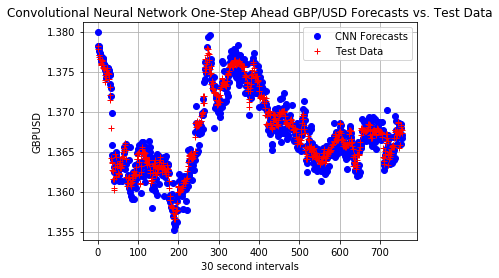

In [118]:
forecasts_cnn=np.reshape(forecasts_cnn,-1)
plt.plot(forecasts_cnn,'bo', label="CNN Forecasts")
plt.plot(raw_test,'r+', label="Test Data")
plt.xlabel('30 second intervals')
plt.ylabel('GBPUSD')
plt.title('Convolutional Neural Network One-Step Ahead GBP/USD Forecasts vs. Test Data')
plt.legend(loc="upper right")
plt.grid(True)

In [104]:
rmse_test = np.sqrt(mean_squared_error(forecasts_cnn, raw_test))
rmse_test

0.0015239987514474439

In [105]:
mean_abs_cnn=((forecasts_cnn-TWAP_test)/TWAP_test)*100.0
mean_abs_cnn_=abs(mean_abs_cnn)
np.mean(mean_abs_cnn_)

0.087087370130263547

## CNN LSTMs

In [111]:
# univariate cnn lstm example
from numpy import array
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import TimeDistributed
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
 
# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

In [112]:
raw_seq = dfprices['TWAP OHLC Mid']
# define model
model = Sequential()
model.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, n_steps, n_features)))
model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
model.add(TimeDistributed(Flatten()))
model.add(LSTM(50, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [113]:
seq_len=len(raw_seq)
train_size=int(seq_len*0.70)
test_size= seq_len-train_size

1

In [114]:
forecasts_CNN_LSTM=[]

In [115]:
for i in range(test_size):
    n_steps=4
    n_seq=2
    X, y = split_sequence(raw_seq[0:train_size+i], n_steps)
    n_steps=2
    X=X.reshape((X.shape[0], n_seq, n_steps, n_features))
    model.fit(X, y, epochs=30, batch_size=512,verbose=1)
    # demonstrate prediction
    x_input = raw_seq[train_size-4+i:train_size+i]
    x_input = x_input.reshape((1, n_seq, n_steps, n_features))
    yhat = model.predict(x_input, verbose=0)
    forecasts_CNN_LSTM.append(yhat)

Epoch 1/30
1759/1759 [==============================] - 0s 183us/step - loss: 1.6514
Epoch 2/30
1759/1759 [==============================] - 0s 19us/step - loss: 1.4867
Epoch 3/30
1759/1759 [==============================] - 0s 19us/step - loss: 1.3171
Epoch 4/30
1759/1759 [==============================] - 0s 21us/step - loss: 1.1443
Epoch 5/30
1759/1759 [==============================] - 0s 15us/step - loss: 0.9730
Epoch 6/30
1759/1759 [==============================] - 0s 15us/step - loss: 0.7910
Epoch 7/30
1759/1759 [==============================] - 0s 15us/step - loss: 0.5975
Epoch 8/30
1759/1759 [==============================] - 0s 15us/step - loss: 0.4014
Epoch 9/30
1759/1759 [==============================] - 0s 16us/step - loss: 0.2174
Epoch 10/30
1759/1759 [==============================] - 0s 16us/step - loss: 0.0742
Epoch 11/30
1759/1759 [==============================] - 0s 15us/step - loss: 0.0059
Epoch 12/30
1759/1759 [==============================] - 0s 15us/step - l

1762/1762 [==============================] - 0s 15us/step - loss: 3.7606e-05
Epoch 5/30
1762/1762 [==============================] - 0s 15us/step - loss: 3.7598e-05
Epoch 6/30
1762/1762 [==============================] - 0s 15us/step - loss: 3.7562e-05
Epoch 7/30
1762/1762 [==============================] - 0s 15us/step - loss: 3.7528e-05
Epoch 8/30
1762/1762 [==============================] - 0s 21us/step - loss: 3.7519e-05
Epoch 9/30
1762/1762 [==============================] - 0s 20us/step - loss: 3.7497e-05
Epoch 10/30
1762/1762 [==============================] - 0s 21us/step - loss: 3.7465e-05
Epoch 11/30
1762/1762 [==============================] - 0s 21us/step - loss: 3.7446e-05
Epoch 12/30
1762/1762 [==============================] - 0s 20us/step - loss: 3.7423e-05
Epoch 13/30
1762/1762 [==============================] - 0s 21us/step - loss: 3.7397e-05
Epoch 14/30
1762/1762 [==============================] - 0s 21us/step - loss: 3.7380e-05
Epoch 15/30
1762/1762 [===============

1765/1765 [==============================] - 0s 19us/step - loss: 3.5089e-05
Epoch 7/30
1765/1765 [==============================] - 0s 19us/step - loss: 3.5129e-05
Epoch 8/30
1765/1765 [==============================] - 0s 20us/step - loss: 3.5060e-05
Epoch 9/30
1765/1765 [==============================] - 0s 20us/step - loss: 3.5056e-05
Epoch 10/30
1765/1765 [==============================] - 0s 20us/step - loss: 3.4977e-05
Epoch 11/30
1765/1765 [==============================] - 0s 20us/step - loss: 3.4941e-05
Epoch 12/30
1765/1765 [==============================] - 0s 21us/step - loss: 3.4930e-05
Epoch 13/30
1765/1765 [==============================] - 0s 21us/step - loss: 3.4850e-05
Epoch 14/30
1765/1765 [==============================] - 0s 21us/step - loss: 3.4939e-05
Epoch 15/30
1765/1765 [==============================] - 0s 18us/step - loss: 3.4826e-05
Epoch 16/30
1765/1765 [==============================] - 0s 21us/step - loss: 3.4763e-05
Epoch 17/30
1765/1765 [=============

1768/1768 [==============================] - 0s 15us/step - loss: 3.1858e-05
Epoch 9/30
1768/1768 [==============================] - 0s 18us/step - loss: 3.1825e-05
Epoch 10/30
1768/1768 [==============================] - 0s 18us/step - loss: 3.1764e-05
Epoch 11/30
1768/1768 [==============================] - 0s 20us/step - loss: 3.1760e-05
Epoch 12/30
1768/1768 [==============================] - 0s 21us/step - loss: 3.1751e-05
Epoch 13/30
1768/1768 [==============================] - 0s 19us/step - loss: 3.1684e-05
Epoch 14/30
1768/1768 [==============================] - 0s 19us/step - loss: 3.1625e-05
Epoch 15/30
1768/1768 [==============================] - 0s 19us/step - loss: 3.1610e-05
Epoch 16/30
1768/1768 [==============================] - 0s 19us/step - loss: 3.1534e-05
Epoch 17/30
1768/1768 [==============================] - 0s 20us/step - loss: 3.1520e-05
Epoch 18/30
1768/1768 [==============================] - 0s 21us/step - loss: 3.1472e-05
Epoch 19/30
1768/1768 [===========

1771/1771 [==============================] - 0s 19us/step - loss: 2.8163e-05
Epoch 11/30
1771/1771 [==============================] - 0s 20us/step - loss: 2.8112e-05
Epoch 12/30
1771/1771 [==============================] - 0s 20us/step - loss: 2.8089e-05
Epoch 13/30
1771/1771 [==============================] - 0s 22us/step - loss: 2.8035e-05
Epoch 14/30
1771/1771 [==============================] - 0s 22us/step - loss: 2.8005e-05
Epoch 15/30
1771/1771 [==============================] - 0s 21us/step - loss: 2.7995e-05
Epoch 16/30
1771/1771 [==============================] - 0s 21us/step - loss: 2.7904e-05
Epoch 17/30
1771/1771 [==============================] - 0s 20us/step - loss: 2.7891e-05
Epoch 18/30
1771/1771 [==============================] - 0s 20us/step - loss: 2.7876e-05
Epoch 19/30
1771/1771 [==============================] - 0s 20us/step - loss: 2.7798e-05
Epoch 20/30
1771/1771 [==============================] - 0s 21us/step - loss: 2.7746e-05
Epoch 21/30
1771/1771 [==========

1774/1774 [==============================] - 0s 16us/step - loss: 2.4234e-05
Epoch 13/30
1774/1774 [==============================] - 0s 15us/step - loss: 2.4217e-05
Epoch 14/30
1774/1774 [==============================] - 0s 16us/step - loss: 2.4168e-05
Epoch 15/30
1774/1774 [==============================] - 0s 15us/step - loss: 2.4118e-05
Epoch 16/30
1774/1774 [==============================] - 0s 15us/step - loss: 2.4111e-05
Epoch 17/30
1774/1774 [==============================] - 0s 15us/step - loss: 2.4041e-05
Epoch 18/30
1774/1774 [==============================] - 0s 19us/step - loss: 2.4019e-05
Epoch 19/30
1774/1774 [==============================] - 0s 21us/step - loss: 2.3944e-05
Epoch 20/30
1774/1774 [==============================] - 0s 20us/step - loss: 2.3915e-05
Epoch 21/30
1774/1774 [==============================] - 0s 20us/step - loss: 2.3862e-05
Epoch 22/30
1774/1774 [==============================] - 0s 20us/step - loss: 2.3828e-05
Epoch 23/30
1774/1774 [==========

1777/1777 [==============================] - 0s 20us/step - loss: 2.0368e-05
Epoch 15/30
1777/1777 [==============================] - 0s 20us/step - loss: 2.0349e-05
Epoch 16/30
1777/1777 [==============================] - 0s 20us/step - loss: 2.0247e-05
Epoch 17/30
1777/1777 [==============================] - 0s 21us/step - loss: 2.0275e-05
Epoch 18/30
1777/1777 [==============================] - 0s 21us/step - loss: 2.0297e-05
Epoch 19/30
1777/1777 [==============================] - 0s 21us/step - loss: 2.0173e-05
Epoch 20/30
1777/1777 [==============================] - 0s 21us/step - loss: 2.0149e-05
Epoch 21/30
1777/1777 [==============================] - 0s 21us/step - loss: 2.0074e-05
Epoch 22/30
1777/1777 [==============================] - 0s 21us/step - loss: 2.0002e-05
Epoch 23/30
1777/1777 [==============================] - 0s 21us/step - loss: 1.9988e-05
Epoch 24/30
1777/1777 [==============================] - 0s 21us/step - loss: 1.9958e-05
Epoch 25/30
1777/1777 [==========

1780/1780 [==============================] - 0s 19us/step - loss: 1.6694e-05
Epoch 17/30
1780/1780 [==============================] - 0s 19us/step - loss: 1.6672e-05
Epoch 18/30
1780/1780 [==============================] - 0s 19us/step - loss: 1.6576e-05
Epoch 19/30
1780/1780 [==============================] - 0s 20us/step - loss: 1.6528e-05
Epoch 20/30
1780/1780 [==============================] - 0s 22us/step - loss: 1.6511e-05
Epoch 21/30
1780/1780 [==============================] - 0s 21us/step - loss: 1.6456e-05
Epoch 22/30
1780/1780 [==============================] - 0s 21us/step - loss: 1.6457e-05
Epoch 23/30
1780/1780 [==============================] - 0s 21us/step - loss: 1.6402e-05
Epoch 24/30
1780/1780 [==============================] - 0s 22us/step - loss: 1.6359e-05
Epoch 25/30
1780/1780 [==============================] - 0s 21us/step - loss: 1.6366e-05
Epoch 26/30
1780/1780 [==============================] - 0s 21us/step - loss: 1.6295e-05
Epoch 27/30
1780/1780 [==========

1783/1783 [==============================] - 0s 19us/step - loss: 1.3425e-05
Epoch 19/30
1783/1783 [==============================] - 0s 20us/step - loss: 1.3357e-05
Epoch 20/30
1783/1783 [==============================] - 0s 20us/step - loss: 1.3320e-05
Epoch 21/30
1783/1783 [==============================] - 0s 21us/step - loss: 1.3306e-05
Epoch 22/30
1783/1783 [==============================] - 0s 20us/step - loss: 1.3262e-05
Epoch 23/30
1783/1783 [==============================] - 0s 21us/step - loss: 1.3250e-05
Epoch 24/30
1783/1783 [==============================] - 0s 20us/step - loss: 1.3224e-05
Epoch 25/30
1783/1783 [==============================] - 0s 16us/step - loss: 1.3205e-05
Epoch 26/30
1783/1783 [==============================] - 0s 15us/step - loss: 1.3107e-05
Epoch 27/30
1783/1783 [==============================] - 0s 15us/step - loss: 1.3115e-05
Epoch 28/30
1783/1783 [==============================] - 0s 15us/step - loss: 1.3057e-05
Epoch 29/30
1783/1783 [==========

1786/1786 [==============================] - 0s 18us/step - loss: 1.0705e-05
Epoch 21/30
1786/1786 [==============================] - 0s 19us/step - loss: 1.0810e-05
Epoch 22/30
1786/1786 [==============================] - 0s 19us/step - loss: 1.0731e-05
Epoch 23/30
1786/1786 [==============================] - 0s 20us/step - loss: 1.0692e-05
Epoch 24/30
1786/1786 [==============================] - 0s 21us/step - loss: 1.0613e-05
Epoch 25/30
1786/1786 [==============================] - 0s 21us/step - loss: 1.0541e-05
Epoch 26/30
1786/1786 [==============================] - 0s 19us/step - loss: 1.0488e-05
Epoch 27/30
1786/1786 [==============================] - 0s 20us/step - loss: 1.0526e-05
Epoch 28/30
1786/1786 [==============================] - 0s 20us/step - loss: 1.0543e-05
Epoch 29/30
1786/1786 [==============================] - 0s 21us/step - loss: 1.0456e-05
Epoch 30/30
1786/1786 [==============================] - 0s 21us/step - loss: 1.0388e-05
Epoch 1/30
1787/1787 [===========

1789/1789 [==============================] - 0s 20us/step - loss: 8.6468e-06
Epoch 23/30
1789/1789 [==============================] - 0s 19us/step - loss: 8.5403e-06
Epoch 24/30
1789/1789 [==============================] - 0s 19us/step - loss: 8.4995e-06
Epoch 25/30
1789/1789 [==============================] - 0s 20us/step - loss: 8.4874e-06
Epoch 26/30
1789/1789 [==============================] - 0s 20us/step - loss: 8.4470e-06
Epoch 27/30
1789/1789 [==============================] - 0s 21us/step - loss: 8.4392e-06
Epoch 28/30
1789/1789 [==============================] - 0s 21us/step - loss: 8.4259e-06
Epoch 29/30
1789/1789 [==============================] - 0s 22us/step - loss: 8.4179e-06
Epoch 30/30
1789/1789 [==============================] - 0s 22us/step - loss: 8.5155e-06
Epoch 1/30
1790/1790 [==============================] - 0s 15us/step - loss: 8.4452e-06
Epoch 2/30
1790/1790 [==============================] - 0s 15us/step - loss: 8.5871e-06
Epoch 3/30
1790/1790 [=============

1792/1792 [==============================] - 0s 20us/step - loss: 7.0672e-06
Epoch 25/30
1792/1792 [==============================] - 0s 19us/step - loss: 7.0571e-06
Epoch 26/30
1792/1792 [==============================] - 0s 19us/step - loss: 7.0657e-06
Epoch 27/30
1792/1792 [==============================] - 0s 20us/step - loss: 7.1413e-06
Epoch 28/30
1792/1792 [==============================] - 0s 20us/step - loss: 7.0974e-06
Epoch 29/30
1792/1792 [==============================] - 0s 19us/step - loss: 6.9708e-06
Epoch 30/30
1792/1792 [==============================] - 0s 20us/step - loss: 6.9804e-06
Epoch 1/30
1793/1793 [==============================] - 0s 17us/step - loss: 7.0061e-06
Epoch 2/30
1793/1793 [==============================] - 0s 19us/step - loss: 6.9445e-06
Epoch 3/30
1793/1793 [==============================] - 0s 20us/step - loss: 6.9413e-06
Epoch 4/30
1793/1793 [==============================] - 0s 19us/step - loss: 6.9362e-06
Epoch 5/30
1793/1793 [===============

1795/1795 [==============================] - 0s 17us/step - loss: 6.0845e-06
Epoch 27/30
1795/1795 [==============================] - 0s 16us/step - loss: 6.1414e-06
Epoch 28/30
1795/1795 [==============================] - 0s 17us/step - loss: 6.1310e-06
Epoch 29/30
1795/1795 [==============================] - 0s 20us/step - loss: 6.0882e-06
Epoch 30/30
1795/1795 [==============================] - 0s 21us/step - loss: 6.1376e-06
Epoch 1/30
1796/1796 [==============================] - 0s 17us/step - loss: 6.0566e-06
Epoch 2/30
1796/1796 [==============================] - 0s 18us/step - loss: 6.0441e-06
Epoch 3/30
1796/1796 [==============================] - 0s 18us/step - loss: 6.0601e-06
Epoch 4/30
1796/1796 [==============================] - 0s 16us/step - loss: 6.0325e-06
Epoch 5/30
1796/1796 [==============================] - 0s 16us/step - loss: 6.0149e-06
Epoch 6/30
1796/1796 [==============================] - 0s 15us/step - loss: 6.0348e-06
Epoch 7/30
1796/1796 [=================

1798/1798 [==============================] - 0s 20us/step - loss: 5.5451e-06
Epoch 29/30
1798/1798 [==============================] - 0s 20us/step - loss: 5.5391e-06
Epoch 30/30
1798/1798 [==============================] - 0s 21us/step - loss: 5.6374e-06
Epoch 1/30
1799/1799 [==============================] - 0s 16us/step - loss: 5.6413e-06
Epoch 2/30
1799/1799 [==============================] - 0s 16us/step - loss: 5.7713e-06
Epoch 3/30
1799/1799 [==============================] - 0s 16us/step - loss: 5.6973e-06
Epoch 4/30
1799/1799 [==============================] - 0s 15us/step - loss: 5.8427e-06
Epoch 5/30
1799/1799 [==============================] - 0s 16us/step - loss: 5.6671e-06
Epoch 6/30
1799/1799 [==============================] - 0s 15us/step - loss: 5.7492e-06
Epoch 7/30
1799/1799 [==============================] - 0s 15us/step - loss: 5.5534e-06
Epoch 8/30
1799/1799 [==============================] - 0s 18us/step - loss: 5.4983e-06
Epoch 9/30
1799/1799 [===================

1801/1801 [==============================] - 0s 19us/step - loss: 5.3601e-06
Epoch 1/30
1802/1802 [==============================] - 0s 18us/step - loss: 5.3218e-06
Epoch 2/30
1802/1802 [==============================] - 0s 20us/step - loss: 5.3530e-06
Epoch 3/30
1802/1802 [==============================] - 0s 18us/step - loss: 5.2879e-06
Epoch 4/30
1802/1802 [==============================] - 0s 16us/step - loss: 5.3741e-06
Epoch 5/30
1802/1802 [==============================] - 0s 15us/step - loss: 5.2914e-06
Epoch 6/30
1802/1802 [==============================] - 0s 16us/step - loss: 5.2638e-06
Epoch 7/30
1802/1802 [==============================] - 0s 18us/step - loss: 5.2488e-06
Epoch 8/30
1802/1802 [==============================] - 0s 20us/step - loss: 5.2455e-06
Epoch 9/30
1802/1802 [==============================] - 0s 22us/step - loss: 5.2790e-06
Epoch 10/30
1802/1802 [==============================] - 0s 21us/step - loss: 5.2811e-06
Epoch 11/30
1802/1802 [===================

1805/1805 [==============================] - 0s 15us/step - loss: 5.4619e-06
Epoch 3/30
1805/1805 [==============================] - 0s 15us/step - loss: 5.2950e-06
Epoch 4/30
1805/1805 [==============================] - 0s 16us/step - loss: 5.2718e-06
Epoch 5/30
1805/1805 [==============================] - 0s 15us/step - loss: 5.3014e-06
Epoch 6/30
1805/1805 [==============================] - 0s 15us/step - loss: 5.1948e-06
Epoch 7/30
1805/1805 [==============================] - 0s 16us/step - loss: 5.2120e-06
Epoch 8/30
1805/1805 [==============================] - 0s 16us/step - loss: 5.1947e-06
Epoch 9/30
1805/1805 [==============================] - 0s 15us/step - loss: 5.2499e-06
Epoch 10/30
1805/1805 [==============================] - 0s 16us/step - loss: 5.2230e-06
Epoch 11/30
1805/1805 [==============================] - 0s 16us/step - loss: 5.2344e-06
Epoch 12/30
1805/1805 [==============================] - 0s 17us/step - loss: 5.1761e-06
Epoch 13/30
1805/1805 [=================

1808/1808 [==============================] - 0s 15us/step - loss: 5.1185e-06
Epoch 5/30
1808/1808 [==============================] - 0s 15us/step - loss: 5.2325e-06
Epoch 6/30
1808/1808 [==============================] - 0s 15us/step - loss: 5.1527e-06
Epoch 7/30
1808/1808 [==============================] - 0s 15us/step - loss: 5.1510e-06
Epoch 8/30
1808/1808 [==============================] - 0s 15us/step - loss: 5.3441e-06
Epoch 9/30
1808/1808 [==============================] - 0s 15us/step - loss: 5.4051e-06
Epoch 10/30
1808/1808 [==============================] - 0s 15us/step - loss: 5.4897e-06
Epoch 11/30
1808/1808 [==============================] - 0s 16us/step - loss: 5.4340e-06
Epoch 12/30
1808/1808 [==============================] - 0s 15us/step - loss: 5.3775e-06
Epoch 13/30
1808/1808 [==============================] - 0s 16us/step - loss: 5.3273e-06
Epoch 14/30
1808/1808 [==============================] - 0s 15us/step - loss: 5.4434e-06
Epoch 15/30
1808/1808 [===============

1811/1811 [==============================] - 0s 15us/step - loss: 5.4349e-06
Epoch 7/30
1811/1811 [==============================] - 0s 15us/step - loss: 5.2914e-06
Epoch 8/30
1811/1811 [==============================] - 0s 15us/step - loss: 5.0747e-06
Epoch 9/30
1811/1811 [==============================] - 0s 16us/step - loss: 5.2225e-06
Epoch 10/30
1811/1811 [==============================] - 0s 15us/step - loss: 5.3207e-06
Epoch 11/30
1811/1811 [==============================] - 0s 15us/step - loss: 5.2751e-06
Epoch 12/30
1811/1811 [==============================] - 0s 16us/step - loss: 5.3468e-06
Epoch 13/30
1811/1811 [==============================] - 0s 15us/step - loss: 5.5960e-06
Epoch 14/30
1811/1811 [==============================] - 0s 20us/step - loss: 5.4081e-06
Epoch 15/30
1811/1811 [==============================] - 0s 20us/step - loss: 5.2364e-06
Epoch 16/30
1811/1811 [==============================] - 0s 20us/step - loss: 5.2222e-06
Epoch 17/30
1811/1811 [=============

1814/1814 [==============================] - 0s 18us/step - loss: 6.0048e-06
Epoch 9/30
1814/1814 [==============================] - 0s 19us/step - loss: 6.3996e-06
Epoch 10/30
1814/1814 [==============================] - 0s 20us/step - loss: 5.7936e-06
Epoch 11/30
1814/1814 [==============================] - 0s 22us/step - loss: 5.4074e-06
Epoch 12/30
1814/1814 [==============================] - 0s 22us/step - loss: 5.4784e-06
Epoch 13/30
1814/1814 [==============================] - 0s 20us/step - loss: 6.0527e-06
Epoch 14/30
1814/1814 [==============================] - 0s 20us/step - loss: 5.9323e-06
Epoch 15/30
1814/1814 [==============================] - 0s 20us/step - loss: 5.2211e-06
Epoch 16/30
1814/1814 [==============================] - 0s 21us/step - loss: 5.2981e-06
Epoch 17/30
1814/1814 [==============================] - 0s 21us/step - loss: 5.0805e-06
Epoch 18/30
1814/1814 [==============================] - 0s 20us/step - loss: 5.1562e-06
Epoch 19/30
1814/1814 [===========

1817/1817 [==============================] - 0s 21us/step - loss: 5.3573e-06
Epoch 11/30
1817/1817 [==============================] - 0s 21us/step - loss: 5.9158e-06
Epoch 12/30
1817/1817 [==============================] - 0s 20us/step - loss: 5.8072e-06
Epoch 13/30
1817/1817 [==============================] - 0s 21us/step - loss: 5.4641e-06
Epoch 14/30
1817/1817 [==============================] - 0s 20us/step - loss: 5.6013e-06
Epoch 15/30
1817/1817 [==============================] - 0s 20us/step - loss: 5.9192e-06
Epoch 16/30
1817/1817 [==============================] - 0s 20us/step - loss: 5.7876e-06
Epoch 17/30
1817/1817 [==============================] - 0s 20us/step - loss: 5.1497e-06
Epoch 18/30
1817/1817 [==============================] - 0s 20us/step - loss: 5.1195e-06
Epoch 19/30
1817/1817 [==============================] - 0s 20us/step - loss: 5.4133e-06
Epoch 20/30
1817/1817 [==============================] - 0s 19us/step - loss: 6.2772e-06
Epoch 21/30
1817/1817 [==========

1820/1820 [==============================] - 0s 16us/step - loss: 5.1903e-06
Epoch 13/30
1820/1820 [==============================] - 0s 16us/step - loss: 5.8514e-06
Epoch 14/30
1820/1820 [==============================] - 0s 17us/step - loss: 5.6545e-06
Epoch 15/30
1820/1820 [==============================] - 0s 17us/step - loss: 6.3294e-06
Epoch 16/30
1820/1820 [==============================] - 0s 17us/step - loss: 5.2539e-06
Epoch 17/30
1820/1820 [==============================] - 0s 21us/step - loss: 5.4486e-06
Epoch 18/30
1820/1820 [==============================] - 0s 20us/step - loss: 6.3023e-06
Epoch 19/30
1820/1820 [==============================] - 0s 19us/step - loss: 5.8982e-06
Epoch 20/30
1820/1820 [==============================] - 0s 20us/step - loss: 6.1917e-06
Epoch 21/30
1820/1820 [==============================] - 0s 20us/step - loss: 6.6606e-06
Epoch 22/30
1820/1820 [==============================] - 0s 20us/step - loss: 7.8207e-06
Epoch 23/30
1820/1820 [==========

1823/1823 [==============================] - 0s 17us/step - loss: 5.7861e-06
Epoch 15/30
1823/1823 [==============================] - 0s 18us/step - loss: 6.7401e-06
Epoch 16/30
1823/1823 [==============================] - 0s 20us/step - loss: 6.5824e-06
Epoch 17/30
1823/1823 [==============================] - 0s 20us/step - loss: 6.3997e-06
Epoch 18/30
1823/1823 [==============================] - 0s 20us/step - loss: 5.6399e-06
Epoch 19/30
1823/1823 [==============================] - 0s 21us/step - loss: 5.3440e-06
Epoch 20/30
1823/1823 [==============================] - 0s 20us/step - loss: 5.3856e-06
Epoch 21/30
1823/1823 [==============================] - 0s 20us/step - loss: 5.1232e-06
Epoch 22/30
1823/1823 [==============================] - 0s 20us/step - loss: 5.1239e-06
Epoch 23/30
1823/1823 [==============================] - 0s 20us/step - loss: 5.4640e-06
Epoch 24/30
1823/1823 [==============================] - 0s 20us/step - loss: 5.1928e-06
Epoch 25/30
1823/1823 [==========

1826/1826 [==============================] - 0s 18us/step - loss: 5.3022e-06
Epoch 17/30
1826/1826 [==============================] - 0s 20us/step - loss: 6.5729e-06
Epoch 18/30
1826/1826 [==============================] - 0s 19us/step - loss: 7.7362e-06
Epoch 19/30
1826/1826 [==============================] - 0s 19us/step - loss: 1.3946e-05
Epoch 20/30
1826/1826 [==============================] - 0s 21us/step - loss: 8.9122e-06
Epoch 21/30
1826/1826 [==============================] - 0s 21us/step - loss: 6.9662e-06
Epoch 22/30
1826/1826 [==============================] - 0s 20us/step - loss: 1.0201e-05
Epoch 23/30
1826/1826 [==============================] - 0s 21us/step - loss: 8.7537e-06
Epoch 24/30
1826/1826 [==============================] - 0s 21us/step - loss: 5.3349e-06
Epoch 25/30
1826/1826 [==============================] - 0s 21us/step - loss: 5.1775e-06
Epoch 26/30
1826/1826 [==============================] - 0s 20us/step - loss: 5.8850e-06
Epoch 27/30
1826/1826 [==========

1829/1829 [==============================] - 0s 20us/step - loss: 5.2477e-06
Epoch 19/30
1829/1829 [==============================] - 0s 19us/step - loss: 5.8892e-06
Epoch 20/30
1829/1829 [==============================] - 0s 20us/step - loss: 6.1586e-06
Epoch 21/30
1829/1829 [==============================] - 0s 20us/step - loss: 1.3061e-05
Epoch 22/30
1829/1829 [==============================] - 0s 19us/step - loss: 6.9113e-06
Epoch 23/30
1829/1829 [==============================] - 0s 19us/step - loss: 6.5306e-06
Epoch 24/30
1829/1829 [==============================] - 0s 20us/step - loss: 8.8792e-06
Epoch 25/30
1829/1829 [==============================] - 0s 20us/step - loss: 9.9171e-06
Epoch 26/30
1829/1829 [==============================] - 0s 19us/step - loss: 6.0400e-06
Epoch 27/30
1829/1829 [==============================] - 0s 20us/step - loss: 5.7291e-06
Epoch 28/30
1829/1829 [==============================] - 0s 21us/step - loss: 5.4530e-06
Epoch 29/30
1829/1829 [==========

1832/1832 [==============================] - 0s 19us/step - loss: 5.7114e-06
Epoch 21/30
1832/1832 [==============================] - 0s 20us/step - loss: 5.3739e-06
Epoch 22/30
1832/1832 [==============================] - 0s 20us/step - loss: 5.3042e-06
Epoch 23/30
1832/1832 [==============================] - 0s 19us/step - loss: 5.2704e-06
Epoch 24/30
1832/1832 [==============================] - 0s 19us/step - loss: 6.9035e-06
Epoch 25/30
1832/1832 [==============================] - 0s 19us/step - loss: 1.3578e-05
Epoch 26/30
1832/1832 [==============================] - 0s 20us/step - loss: 6.6832e-06
Epoch 27/30
1832/1832 [==============================] - 0s 20us/step - loss: 8.5511e-06
Epoch 28/30
1832/1832 [==============================] - 0s 20us/step - loss: 9.7492e-06
Epoch 29/30
1832/1832 [==============================] - 0s 20us/step - loss: 6.8578e-06
Epoch 30/30
1832/1832 [==============================] - 0s 20us/step - loss: 1.0961e-05
Epoch 1/30
1833/1833 [===========

1835/1835 [==============================] - 0s 19us/step - loss: 5.5447e-06
Epoch 23/30
1835/1835 [==============================] - 0s 19us/step - loss: 6.3675e-06
Epoch 24/30
1835/1835 [==============================] - 0s 19us/step - loss: 5.3806e-06
Epoch 25/30
1835/1835 [==============================] - 0s 21us/step - loss: 5.4906e-06
Epoch 26/30
1835/1835 [==============================] - 0s 20us/step - loss: 5.1516e-06
Epoch 27/30
1835/1835 [==============================] - 0s 21us/step - loss: 6.3860e-06
Epoch 28/30
1835/1835 [==============================] - 0s 21us/step - loss: 8.3732e-06
Epoch 29/30
1835/1835 [==============================] - 0s 20us/step - loss: 6.9570e-06
Epoch 30/30
1835/1835 [==============================] - 0s 20us/step - loss: 9.3324e-06
Epoch 1/30
1836/1836 [==============================] - 0s 15us/step - loss: 9.8433e-06
Epoch 2/30
1836/1836 [==============================] - 0s 15us/step - loss: 5.6815e-06
Epoch 3/30
1836/1836 [=============

1838/1838 [==============================] - 0s 17us/step - loss: 8.3743e-06
Epoch 25/30
1838/1838 [==============================] - 0s 17us/step - loss: 7.7264e-06
Epoch 26/30
1838/1838 [==============================] - 0s 18us/step - loss: 9.5039e-06
Epoch 27/30
1838/1838 [==============================] - 0s 18us/step - loss: 1.0007e-05
Epoch 28/30
1838/1838 [==============================] - 0s 17us/step - loss: 7.9686e-06
Epoch 29/30
1838/1838 [==============================] - 0s 18us/step - loss: 5.8307e-06
Epoch 30/30
1838/1838 [==============================] - 0s 18us/step - loss: 5.5879e-06
Epoch 1/30
1839/1839 [==============================] - 0s 17us/step - loss: 5.5842e-06
Epoch 2/30
1839/1839 [==============================] - 0s 14us/step - loss: 5.0989e-06
Epoch 3/30
1839/1839 [==============================] - 0s 15us/step - loss: 8.2834e-06
Epoch 4/30
1839/1839 [==============================] - 0s 15us/step - loss: 8.4745e-06
Epoch 5/30
1839/1839 [===============

1841/1841 [==============================] - 0s 21us/step - loss: 5.1941e-06
Epoch 27/30
1841/1841 [==============================] - 0s 20us/step - loss: 5.1170e-06
Epoch 28/30
1841/1841 [==============================] - 0s 20us/step - loss: 5.1695e-06
Epoch 29/30
1841/1841 [==============================] - 0s 20us/step - loss: 5.7039e-06
Epoch 30/30
1841/1841 [==============================] - 0s 21us/step - loss: 8.1340e-06
Epoch 1/30
1842/1842 [==============================] - 0s 17us/step - loss: 6.2803e-06
Epoch 2/30
1842/1842 [==============================] - 0s 15us/step - loss: 5.9620e-06
Epoch 3/30
1842/1842 [==============================] - 0s 15us/step - loss: 6.0527e-06
Epoch 4/30
1842/1842 [==============================] - 0s 15us/step - loss: 5.3208e-06
Epoch 5/30
1842/1842 [==============================] - 0s 16us/step - loss: 5.4917e-06
Epoch 6/30
1842/1842 [==============================] - 0s 19us/step - loss: 5.7265e-06
Epoch 7/30
1842/1842 [=================

1844/1844 [==============================] - 0s 19us/step - loss: 7.2063e-06
Epoch 29/30
1844/1844 [==============================] - 0s 19us/step - loss: 7.4364e-06
Epoch 30/30
1844/1844 [==============================] - 0s 19us/step - loss: 6.0080e-06
Epoch 1/30
1845/1845 [==============================] - 0s 16us/step - loss: 6.3669e-06
Epoch 2/30
1845/1845 [==============================] - 0s 16us/step - loss: 5.6869e-06
Epoch 3/30
1845/1845 [==============================] - 0s 16us/step - loss: 6.8687e-06
Epoch 4/30
1845/1845 [==============================] - 0s 16us/step - loss: 6.6669e-06
Epoch 5/30
1845/1845 [==============================] - 0s 15us/step - loss: 1.0323e-05
Epoch 6/30
1845/1845 [==============================] - 0s 15us/step - loss: 9.6031e-06
Epoch 7/30
1845/1845 [==============================] - 0s 15us/step - loss: 7.3822e-06
Epoch 8/30
1845/1845 [==============================] - 0s 15us/step - loss: 6.7440e-06
Epoch 9/30
1845/1845 [===================

1847/1847 [==============================] - 0s 19us/step - loss: 5.0620e-06
Epoch 1/30
1848/1848 [==============================] - 0s 15us/step - loss: 6.2557e-06
Epoch 2/30
1848/1848 [==============================] - 0s 15us/step - loss: 4.9884e-06
Epoch 3/30
1848/1848 [==============================] - 0s 15us/step - loss: 7.9124e-06
Epoch 4/30
1848/1848 [==============================] - 0s 16us/step - loss: 9.6267e-06
Epoch 5/30
1848/1848 [==============================] - 0s 15us/step - loss: 7.2533e-06
Epoch 6/30
1848/1848 [==============================] - 0s 15us/step - loss: 1.0794e-05
Epoch 7/30
1848/1848 [==============================] - 0s 15us/step - loss: 6.1809e-06
Epoch 8/30
1848/1848 [==============================] - 0s 15us/step - loss: 5.7082e-06
Epoch 9/30
1848/1848 [==============================] - 0s 15us/step - loss: 5.1803e-06
Epoch 10/30
1848/1848 [==============================] - 0s 18us/step - loss: 5.3635e-06
Epoch 11/30
1848/1848 [===================

1851/1851 [==============================] - 0s 15us/step - loss: 5.3946e-06
Epoch 3/30
1851/1851 [==============================] - 0s 15us/step - loss: 5.2641e-06
Epoch 4/30
1851/1851 [==============================] - 0s 15us/step - loss: 5.0475e-06
Epoch 5/30
1851/1851 [==============================] - 0s 15us/step - loss: 5.6497e-06
Epoch 6/30
1851/1851 [==============================] - 0s 15us/step - loss: 5.7891e-06
Epoch 7/30
1851/1851 [==============================] - 0s 15us/step - loss: 5.8394e-06
Epoch 8/30
1851/1851 [==============================] - 0s 15us/step - loss: 5.1540e-06
Epoch 9/30
1851/1851 [==============================] - 0s 16us/step - loss: 7.1481e-06
Epoch 10/30
1851/1851 [==============================] - 0s 15us/step - loss: 8.1798e-06
Epoch 11/30
1851/1851 [==============================] - 0s 18us/step - loss: 4.9911e-06
Epoch 12/30
1851/1851 [==============================] - 0s 18us/step - loss: 5.5204e-06
Epoch 13/30
1851/1851 [=================

1854/1854 [==============================] - 0s 15us/step - loss: 7.6955e-06
Epoch 5/30
1854/1854 [==============================] - 0s 15us/step - loss: 8.1869e-06
Epoch 6/30
1854/1854 [==============================] - 0s 18us/step - loss: 6.7588e-06
Epoch 7/30
1854/1854 [==============================] - 0s 19us/step - loss: 7.0012e-06
Epoch 8/30
1854/1854 [==============================] - 0s 19us/step - loss: 7.1117e-06
Epoch 9/30
1854/1854 [==============================] - 0s 19us/step - loss: 5.9572e-06
Epoch 10/30
1854/1854 [==============================] - 0s 19us/step - loss: 7.7465e-06
Epoch 11/30
1854/1854 [==============================] - 0s 20us/step - loss: 6.2592e-06
Epoch 12/30
1854/1854 [==============================] - 0s 21us/step - loss: 7.3503e-06
Epoch 13/30
1854/1854 [==============================] - 0s 20us/step - loss: 9.9840e-06
Epoch 14/30
1854/1854 [==============================] - 0s 21us/step - loss: 1.1131e-05
Epoch 15/30
1854/1854 [===============

1857/1857 [==============================] - 0s 15us/step - loss: 4.9266e-06
Epoch 7/30
1857/1857 [==============================] - 0s 15us/step - loss: 6.4368e-06
Epoch 8/30
1857/1857 [==============================] - 0s 15us/step - loss: 5.4612e-06
Epoch 9/30
1857/1857 [==============================] - 0s 15us/step - loss: 5.6234e-06
Epoch 10/30
1857/1857 [==============================] - 0s 17us/step - loss: 8.6505e-06
Epoch 11/30
1857/1857 [==============================] - 0s 19us/step - loss: 1.1750e-05
Epoch 12/30
1857/1857 [==============================] - 0s 19us/step - loss: 8.2115e-06
Epoch 13/30
1857/1857 [==============================] - 0s 20us/step - loss: 8.0756e-06
Epoch 14/30
1857/1857 [==============================] - 0s 21us/step - loss: 6.8898e-06
Epoch 15/30
1857/1857 [==============================] - 0s 21us/step - loss: 6.3212e-06
Epoch 16/30
1857/1857 [==============================] - 0s 20us/step - loss: 5.0879e-06
Epoch 17/30
1857/1857 [=============

1860/1860 [==============================] - 0s 15us/step - loss: 5.4078e-06
Epoch 9/30
1860/1860 [==============================] - 0s 15us/step - loss: 8.5088e-06
Epoch 10/30
1860/1860 [==============================] - 0s 15us/step - loss: 5.5510e-06
Epoch 11/30
1860/1860 [==============================] - 0s 15us/step - loss: 6.6841e-06
Epoch 12/30
1860/1860 [==============================] - 0s 15us/step - loss: 6.2447e-06
Epoch 13/30
1860/1860 [==============================] - 0s 15us/step - loss: 5.4538e-06
Epoch 14/30
1860/1860 [==============================] - 0s 18us/step - loss: 5.3950e-06
Epoch 15/30
1860/1860 [==============================] - 0s 20us/step - loss: 5.1670e-06
Epoch 16/30
1860/1860 [==============================] - 0s 21us/step - loss: 5.3251e-06
Epoch 17/30
1860/1860 [==============================] - 0s 21us/step - loss: 5.1405e-06
Epoch 18/30
1860/1860 [==============================] - 0s 24us/step - loss: 4.9933e-06
Epoch 19/30
1860/1860 [===========

1863/1863 [==============================] - 0s 20us/step - loss: 5.7051e-06
Epoch 11/30
1863/1863 [==============================] - 0s 20us/step - loss: 5.5720e-06
Epoch 12/30
1863/1863 [==============================] - 0s 18us/step - loss: 7.8216e-06
Epoch 13/30
1863/1863 [==============================] - 0s 20us/step - loss: 4.9810e-06
Epoch 14/30
1863/1863 [==============================] - 0s 19us/step - loss: 4.9353e-06
Epoch 15/30
1863/1863 [==============================] - 0s 22us/step - loss: 4.9369e-06
Epoch 16/30
1863/1863 [==============================] - 0s 21us/step - loss: 5.5287e-06
Epoch 17/30
1863/1863 [==============================] - 0s 21us/step - loss: 5.8595e-06
Epoch 18/30
1863/1863 [==============================] - 0s 21us/step - loss: 5.2765e-06
Epoch 19/30
1863/1863 [==============================] - 0s 20us/step - loss: 5.2127e-06
Epoch 20/30
1863/1863 [==============================] - 0s 20us/step - loss: 5.2636e-06
Epoch 21/30
1863/1863 [==========

1866/1866 [==============================] - 0s 18us/step - loss: 4.9437e-06
Epoch 13/30
1866/1866 [==============================] - 0s 20us/step - loss: 5.2941e-06
Epoch 14/30
1866/1866 [==============================] - 0s 19us/step - loss: 7.6836e-06
Epoch 15/30
1866/1866 [==============================] - 0s 18us/step - loss: 6.2462e-06
Epoch 16/30
1866/1866 [==============================] - 0s 20us/step - loss: 6.4931e-06
Epoch 17/30
1866/1866 [==============================] - 0s 19us/step - loss: 5.7355e-06
Epoch 18/30
1866/1866 [==============================] - 0s 20us/step - loss: 6.1317e-06
Epoch 19/30
1866/1866 [==============================] - 0s 20us/step - loss: 7.9751e-06
Epoch 20/30
1866/1866 [==============================] - 0s 20us/step - loss: 6.3317e-06
Epoch 21/30
1866/1866 [==============================] - 0s 20us/step - loss: 6.1535e-06
Epoch 22/30
1866/1866 [==============================] - 0s 20us/step - loss: 5.4435e-06
Epoch 23/30
1866/1866 [==========

1869/1869 [==============================] - 0s 17us/step - loss: 6.6246e-06
Epoch 15/30
1869/1869 [==============================] - 0s 16us/step - loss: 8.8194e-06
Epoch 16/30
1869/1869 [==============================] - 0s 16us/step - loss: 5.6615e-06
Epoch 17/30
1869/1869 [==============================] - 0s 15us/step - loss: 5.5802e-06
Epoch 18/30
1869/1869 [==============================] - 0s 15us/step - loss: 7.0787e-06
Epoch 19/30
1869/1869 [==============================] - 0s 15us/step - loss: 6.3163e-06
Epoch 20/30
1869/1869 [==============================] - 0s 15us/step - loss: 5.2867e-06
Epoch 21/30
1869/1869 [==============================] - 0s 15us/step - loss: 5.6542e-06
Epoch 22/30
1869/1869 [==============================] - 0s 20us/step - loss: 5.8718e-06
Epoch 23/30
1869/1869 [==============================] - 0s 19us/step - loss: 5.7061e-06
Epoch 24/30
1869/1869 [==============================] - 0s 20us/step - loss: 5.0745e-06
Epoch 25/30
1869/1869 [==========

1872/1872 [==============================] - 0s 15us/step - loss: 6.1543e-06
Epoch 17/30
1872/1872 [==============================] - 0s 16us/step - loss: 5.9091e-06
Epoch 18/30
1872/1872 [==============================] - 0s 17us/step - loss: 6.0746e-06
Epoch 19/30
1872/1872 [==============================] - 0s 17us/step - loss: 6.8403e-06
Epoch 20/30
1872/1872 [==============================] - 0s 17us/step - loss: 5.6486e-06
Epoch 21/30
1872/1872 [==============================] - 0s 18us/step - loss: 8.4218e-06
Epoch 22/30
1872/1872 [==============================] - 0s 18us/step - loss: 1.0322e-05
Epoch 23/30
1872/1872 [==============================] - 0s 18us/step - loss: 1.0958e-05
Epoch 24/30
1872/1872 [==============================] - 0s 17us/step - loss: 2.0810e-05
Epoch 25/30
1872/1872 [==============================] - 0s 18us/step - loss: 2.2314e-05
Epoch 26/30
1872/1872 [==============================] - 0s 17us/step - loss: 8.5163e-06
Epoch 27/30
1872/1872 [==========

1875/1875 [==============================] - 0s 19us/step - loss: 5.8537e-06
Epoch 19/30
1875/1875 [==============================] - 0s 18us/step - loss: 7.2734e-06
Epoch 20/30
1875/1875 [==============================] - 0s 18us/step - loss: 8.8756e-06
Epoch 21/30
1875/1875 [==============================] - 0s 20us/step - loss: 8.3728e-06
Epoch 22/30
1875/1875 [==============================] - 0s 20us/step - loss: 8.8283e-06
Epoch 23/30
1875/1875 [==============================] - 0s 19us/step - loss: 9.2988e-06
Epoch 24/30
1875/1875 [==============================] - 0s 20us/step - loss: 8.8406e-06
Epoch 25/30
1875/1875 [==============================] - 0s 20us/step - loss: 9.6487e-06
Epoch 26/30
1875/1875 [==============================] - 0s 21us/step - loss: 1.9540e-05
Epoch 27/30
1875/1875 [==============================] - 0s 19us/step - loss: 1.6367e-05
Epoch 28/30
1875/1875 [==============================] - 0s 20us/step - loss: 1.8060e-05
Epoch 29/30
1875/1875 [==========

1878/1878 [==============================] - 0s 18us/step - loss: 4.9752e-06
Epoch 21/30
1878/1878 [==============================] - 0s 19us/step - loss: 4.9824e-06
Epoch 22/30
1878/1878 [==============================] - 0s 20us/step - loss: 4.8507e-06
Epoch 23/30
1878/1878 [==============================] - 0s 21us/step - loss: 5.2299e-06
Epoch 24/30
1878/1878 [==============================] - 0s 20us/step - loss: 6.7959e-06
Epoch 25/30
1878/1878 [==============================] - 0s 19us/step - loss: 6.2631e-06
Epoch 26/30
1878/1878 [==============================] - 0s 20us/step - loss: 6.6494e-06
Epoch 27/30
1878/1878 [==============================] - 0s 21us/step - loss: 5.3309e-06
Epoch 28/30
1878/1878 [==============================] - 0s 20us/step - loss: 5.7276e-06
Epoch 29/30
1878/1878 [==============================] - 0s 19us/step - loss: 8.6562e-06
Epoch 30/30
1878/1878 [==============================] - 0s 20us/step - loss: 6.8578e-06
Epoch 1/30
1879/1879 [===========

1881/1881 [==============================] - 0s 18us/step - loss: 4.9298e-06
Epoch 23/30
1881/1881 [==============================] - 0s 19us/step - loss: 5.2578e-06
Epoch 24/30
1881/1881 [==============================] - 0s 19us/step - loss: 6.4013e-06
Epoch 25/30
1881/1881 [==============================] - 0s 19us/step - loss: 5.2241e-06
Epoch 26/30
1881/1881 [==============================] - 0s 21us/step - loss: 4.9297e-06
Epoch 27/30
1881/1881 [==============================] - 0s 20us/step - loss: 5.7855e-06
Epoch 28/30
1881/1881 [==============================] - 0s 21us/step - loss: 7.8862e-06
Epoch 29/30
1881/1881 [==============================] - 0s 20us/step - loss: 5.0721e-06
Epoch 30/30
1881/1881 [==============================] - 0s 20us/step - loss: 6.0136e-06
Epoch 1/30
1882/1882 [==============================] - 0s 17us/step - loss: 8.4481e-06
Epoch 2/30
1882/1882 [==============================] - 0s 17us/step - loss: 5.8873e-06
Epoch 3/30
1882/1882 [=============

1884/1884 [==============================] - 0s 19us/step - loss: 5.3967e-06
Epoch 25/30
1884/1884 [==============================] - 0s 19us/step - loss: 4.9881e-06
Epoch 26/30
1884/1884 [==============================] - 0s 19us/step - loss: 6.6553e-06
Epoch 27/30
1884/1884 [==============================] - 0s 21us/step - loss: 5.0738e-06
Epoch 28/30
1884/1884 [==============================] - 0s 22us/step - loss: 5.7596e-06
Epoch 29/30
1884/1884 [==============================] - 0s 19us/step - loss: 5.5714e-06
Epoch 30/30
1884/1884 [==============================] - 0s 20us/step - loss: 5.5589e-06
Epoch 1/30
1885/1885 [==============================] - 0s 17us/step - loss: 1.3690e-05
Epoch 2/30
1885/1885 [==============================] - 0s 15us/step - loss: 6.7888e-06
Epoch 3/30
1885/1885 [==============================] - 0s 15us/step - loss: 7.6718e-06
Epoch 4/30
1885/1885 [==============================] - 0s 15us/step - loss: 6.8280e-06
Epoch 5/30
1885/1885 [===============

1887/1887 [==============================] - 0s 20us/step - loss: 5.5801e-06
Epoch 27/30
1887/1887 [==============================] - 0s 19us/step - loss: 6.4637e-06
Epoch 28/30
1887/1887 [==============================] - 0s 21us/step - loss: 8.5648e-06
Epoch 29/30
1887/1887 [==============================] - 0s 21us/step - loss: 5.9291e-06
Epoch 30/30
1887/1887 [==============================] - 0s 20us/step - loss: 8.7891e-06
Epoch 1/30
1888/1888 [==============================] - 0s 16us/step - loss: 5.7921e-06
Epoch 2/30
1888/1888 [==============================] - 0s 15us/step - loss: 1.2029e-05
Epoch 3/30
1888/1888 [==============================] - 0s 15us/step - loss: 5.2780e-06
Epoch 4/30
1888/1888 [==============================] - 0s 15us/step - loss: 6.1264e-06
Epoch 5/30
1888/1888 [==============================] - 0s 15us/step - loss: 1.1273e-05
Epoch 6/30
1888/1888 [==============================] - 0s 15us/step - loss: 8.4644e-06
Epoch 7/30
1888/1888 [=================

1890/1890 [==============================] - 0s 20us/step - loss: 7.2774e-06
Epoch 29/30
1890/1890 [==============================] - 0s 20us/step - loss: 6.8904e-06
Epoch 30/30
1890/1890 [==============================] - 0s 19us/step - loss: 5.5833e-06
Epoch 1/30
1891/1891 [==============================] - 0s 16us/step - loss: 8.1947e-06
Epoch 2/30
1891/1891 [==============================] - 0s 14us/step - loss: 6.0969e-06
Epoch 3/30
1891/1891 [==============================] - 0s 15us/step - loss: 1.7608e-05
Epoch 4/30
1891/1891 [==============================] - 0s 15us/step - loss: 8.2638e-06
Epoch 5/30
1891/1891 [==============================] - 0s 15us/step - loss: 7.1344e-06
Epoch 6/30
1891/1891 [==============================] - 0s 16us/step - loss: 8.3538e-06
Epoch 7/30
1891/1891 [==============================] - 0s 16us/step - loss: 1.0584e-05
Epoch 8/30
1891/1891 [==============================] - 0s 16us/step - loss: 6.8025e-06
Epoch 9/30
1891/1891 [===================

1893/1893 [==============================] - 0s 19us/step - loss: 6.1343e-06
Epoch 1/30
1894/1894 [==============================] - 0s 16us/step - loss: 4.8665e-06
Epoch 2/30
1894/1894 [==============================] - 0s 17us/step - loss: 4.9027e-06
Epoch 3/30
1894/1894 [==============================] - 0s 17us/step - loss: 4.9091e-06
Epoch 4/30
1894/1894 [==============================] - 0s 17us/step - loss: 5.0525e-06
Epoch 5/30
1894/1894 [==============================] - 0s 15us/step - loss: 5.2075e-06
Epoch 6/30
1894/1894 [==============================] - 0s 15us/step - loss: 7.5469e-06
Epoch 7/30
1894/1894 [==============================] - 0s 15us/step - loss: 6.9512e-06
Epoch 8/30
1894/1894 [==============================] - 0s 15us/step - loss: 4.9655e-06
Epoch 9/30
1894/1894 [==============================] - 0s 17us/step - loss: 5.0577e-06
Epoch 10/30
1894/1894 [==============================] - 0s 19us/step - loss: 4.8224e-06
Epoch 11/30
1894/1894 [===================

1897/1897 [==============================] - 0s 17us/step - loss: 4.9081e-06
Epoch 3/30
1897/1897 [==============================] - 0s 16us/step - loss: 5.6534e-06
Epoch 4/30
1897/1897 [==============================] - 0s 16us/step - loss: 5.4554e-06
Epoch 5/30
1897/1897 [==============================] - 0s 14us/step - loss: 5.8582e-06
Epoch 6/30
1897/1897 [==============================] - 0s 15us/step - loss: 4.8490e-06
Epoch 7/30
1897/1897 [==============================] - 0s 15us/step - loss: 6.0396e-06
Epoch 8/30
1897/1897 [==============================] - 0s 17us/step - loss: 5.4094e-06
Epoch 9/30
1897/1897 [==============================] - 0s 19us/step - loss: 5.5835e-06
Epoch 10/30
1897/1897 [==============================] - 0s 19us/step - loss: 5.9085e-06
Epoch 11/30
1897/1897 [==============================] - 0s 20us/step - loss: 5.6040e-06
Epoch 12/30
1897/1897 [==============================] - 0s 19us/step - loss: 5.5422e-06
Epoch 13/30
1897/1897 [=================

1900/1900 [==============================] - 0s 16us/step - loss: 5.2342e-06
Epoch 5/30
1900/1900 [==============================] - 0s 14us/step - loss: 5.7770e-06
Epoch 6/30
1900/1900 [==============================] - 0s 14us/step - loss: 5.1063e-06
Epoch 7/30
1900/1900 [==============================] - 0s 15us/step - loss: 6.4241e-06
Epoch 8/30
1900/1900 [==============================] - 0s 15us/step - loss: 5.7569e-06
Epoch 9/30
1900/1900 [==============================] - 0s 15us/step - loss: 6.3451e-06
Epoch 10/30
1900/1900 [==============================] - 0s 15us/step - loss: 8.6589e-06
Epoch 11/30
1900/1900 [==============================] - 0s 15us/step - loss: 6.9854e-06
Epoch 12/30
1900/1900 [==============================] - 0s 15us/step - loss: 6.3884e-06
Epoch 13/30
1900/1900 [==============================] - 0s 15us/step - loss: 7.8037e-06
Epoch 14/30
1900/1900 [==============================] - 0s 15us/step - loss: 1.3522e-05
Epoch 15/30
1900/1900 [===============

1903/1903 [==============================] - 0s 15us/step - loss: 5.0853e-06
Epoch 7/30
1903/1903 [==============================] - 0s 17us/step - loss: 8.2261e-06
Epoch 8/30
1903/1903 [==============================] - 0s 19us/step - loss: 5.1411e-06
Epoch 9/30
1903/1903 [==============================] - 0s 19us/step - loss: 6.6163e-06
Epoch 10/30
1903/1903 [==============================] - 0s 24us/step - loss: 5.3163e-06
Epoch 11/30
1903/1903 [==============================] - 0s 23us/step - loss: 5.1502e-06
Epoch 12/30
1903/1903 [==============================] - 0s 20us/step - loss: 5.6095e-06
Epoch 13/30
1903/1903 [==============================] - 0s 19us/step - loss: 7.4663e-06
Epoch 14/30
1903/1903 [==============================] - 0s 19us/step - loss: 6.5168e-06
Epoch 15/30
1903/1903 [==============================] - 0s 19us/step - loss: 1.3345e-05
Epoch 16/30
1903/1903 [==============================] - 0s 18us/step - loss: 9.6801e-06
Epoch 17/30
1903/1903 [=============

1906/1906 [==============================] - 0s 18us/step - loss: 5.8614e-06
Epoch 9/30
1906/1906 [==============================] - 0s 19us/step - loss: 6.1987e-06
Epoch 10/30
1906/1906 [==============================] - 0s 18us/step - loss: 5.9242e-06
Epoch 11/30
1906/1906 [==============================] - 0s 19us/step - loss: 7.8335e-06
Epoch 12/30
1906/1906 [==============================] - 0s 20us/step - loss: 4.8854e-06
Epoch 13/30
1906/1906 [==============================] - 0s 20us/step - loss: 5.0269e-06
Epoch 14/30
1906/1906 [==============================] - 0s 19us/step - loss: 1.3811e-05
Epoch 15/30
1906/1906 [==============================] - 0s 19us/step - loss: 5.8712e-06
Epoch 16/30
1906/1906 [==============================] - 0s 20us/step - loss: 5.0568e-06
Epoch 17/30
1906/1906 [==============================] - 0s 20us/step - loss: 1.0196e-05
Epoch 18/30
1906/1906 [==============================] - 0s 19us/step - loss: 7.6088e-06
Epoch 19/30
1906/1906 [===========

1909/1909 [==============================] - 0s 15us/step - loss: 1.4862e-05
Epoch 11/30
1909/1909 [==============================] - 0s 16us/step - loss: 6.6423e-06
Epoch 12/30
1909/1909 [==============================] - 0s 15us/step - loss: 6.4973e-06
Epoch 13/30
1909/1909 [==============================] - 0s 15us/step - loss: 6.2032e-06
Epoch 14/30
1909/1909 [==============================] - 0s 16us/step - loss: 5.1841e-06
Epoch 15/30
1909/1909 [==============================] - 0s 16us/step - loss: 4.8250e-06
Epoch 16/30
1909/1909 [==============================] - 0s 17us/step - loss: 5.5183e-06
Epoch 17/30
1909/1909 [==============================] - 0s 17us/step - loss: 5.2900e-06
Epoch 18/30
1909/1909 [==============================] - 0s 15us/step - loss: 8.0085e-06
Epoch 19/30
1909/1909 [==============================] - 0s 15us/step - loss: 7.3938e-06
Epoch 20/30
1909/1909 [==============================] - 0s 15us/step - loss: 6.7855e-06
Epoch 21/30
1909/1909 [==========

1912/1912 [==============================] - 0s 15us/step - loss: 4.7599e-06
Epoch 13/30
1912/1912 [==============================] - 0s 17us/step - loss: 5.3374e-06
Epoch 14/30
1912/1912 [==============================] - 0s 17us/step - loss: 4.7507e-06
Epoch 15/30
1912/1912 [==============================] - 0s 19us/step - loss: 4.6985e-06
Epoch 16/30
1912/1912 [==============================] - 0s 17us/step - loss: 4.7043e-06
Epoch 17/30
1912/1912 [==============================] - 0s 18us/step - loss: 4.9533e-06
Epoch 18/30
1912/1912 [==============================] - 0s 19us/step - loss: 5.6152e-06
Epoch 19/30
1912/1912 [==============================] - 0s 17us/step - loss: 5.2589e-06
Epoch 20/30
1912/1912 [==============================] - 0s 18us/step - loss: 5.8224e-06
Epoch 21/30
1912/1912 [==============================] - 0s 18us/step - loss: 4.9116e-06
Epoch 22/30
1912/1912 [==============================] - 0s 19us/step - loss: 4.7660e-06
Epoch 23/30
1912/1912 [==========

1915/1915 [==============================] - 0s 17us/step - loss: 5.9742e-06
Epoch 15/30
1915/1915 [==============================] - 0s 18us/step - loss: 5.0560e-06
Epoch 16/30
1915/1915 [==============================] - 0s 19us/step - loss: 5.8517e-06
Epoch 17/30
1915/1915 [==============================] - 0s 19us/step - loss: 4.7839e-06
Epoch 18/30
1915/1915 [==============================] - 0s 20us/step - loss: 8.1331e-06
Epoch 19/30
1915/1915 [==============================] - 0s 19us/step - loss: 9.4395e-06
Epoch 20/30
1915/1915 [==============================] - 0s 20us/step - loss: 6.5389e-06
Epoch 21/30
1915/1915 [==============================] - 0s 19us/step - loss: 8.0705e-06
Epoch 22/30
1915/1915 [==============================] - 0s 18us/step - loss: 1.1449e-05
Epoch 23/30
1915/1915 [==============================] - 0s 15us/step - loss: 9.4271e-06
Epoch 24/30
1915/1915 [==============================] - 0s 16us/step - loss: 6.0020e-06
Epoch 25/30
1915/1915 [==========

1918/1918 [==============================] - 0s 17us/step - loss: 5.7572e-06
Epoch 17/30
1918/1918 [==============================] - 0s 17us/step - loss: 5.5292e-06
Epoch 18/30
1918/1918 [==============================] - 0s 18us/step - loss: 4.8236e-06
Epoch 19/30
1918/1918 [==============================] - 0s 17us/step - loss: 4.9410e-06
Epoch 20/30
1918/1918 [==============================] - 0s 16us/step - loss: 4.9421e-06
Epoch 21/30
1918/1918 [==============================] - 0s 16us/step - loss: 4.7841e-06
Epoch 22/30
1918/1918 [==============================] - 0s 15us/step - loss: 4.9028e-06
Epoch 23/30
1918/1918 [==============================] - 0s 16us/step - loss: 4.7173e-06
Epoch 24/30
1918/1918 [==============================] - 0s 18us/step - loss: 5.1150e-06
Epoch 25/30
1918/1918 [==============================] - 0s 19us/step - loss: 5.1340e-06
Epoch 26/30
1918/1918 [==============================] - 0s 20us/step - loss: 5.7682e-06
Epoch 27/30
1918/1918 [==========

1921/1921 [==============================] - 0s 15us/step - loss: 4.8589e-06
Epoch 19/30
1921/1921 [==============================] - 0s 15us/step - loss: 4.9138e-06
Epoch 20/30
1921/1921 [==============================] - 0s 17us/step - loss: 4.8852e-06
Epoch 21/30
1921/1921 [==============================] - 0s 18us/step - loss: 5.7527e-06
Epoch 22/30
1921/1921 [==============================] - 0s 19us/step - loss: 5.9552e-06
Epoch 23/30
1921/1921 [==============================] - 0s 19us/step - loss: 5.0963e-06
Epoch 24/30
1921/1921 [==============================] - 0s 19us/step - loss: 5.4312e-06
Epoch 25/30
1921/1921 [==============================] - 0s 19us/step - loss: 6.0948e-06
Epoch 26/30
1921/1921 [==============================] - 0s 19us/step - loss: 6.2288e-06
Epoch 27/30
1921/1921 [==============================] - 0s 19us/step - loss: 6.1642e-06
Epoch 28/30
1921/1921 [==============================] - 0s 20us/step - loss: 7.1410e-06
Epoch 29/30
1921/1921 [==========

1924/1924 [==============================] - 0s 17us/step - loss: 6.1784e-06
Epoch 21/30
1924/1924 [==============================] - 0s 19us/step - loss: 6.1628e-06
Epoch 22/30
1924/1924 [==============================] - 0s 21us/step - loss: 8.2408e-06
Epoch 23/30
1924/1924 [==============================] - 0s 20us/step - loss: 6.9099e-06
Epoch 24/30
1924/1924 [==============================] - 0s 17us/step - loss: 7.1610e-06
Epoch 25/30
1924/1924 [==============================] - 0s 17us/step - loss: 5.4550e-06
Epoch 26/30
1924/1924 [==============================] - 0s 20us/step - loss: 5.2715e-06
Epoch 27/30
1924/1924 [==============================] - 0s 24us/step - loss: 5.2782e-06
Epoch 28/30
1924/1924 [==============================] - 0s 20us/step - loss: 4.9505e-06
Epoch 29/30
1924/1924 [==============================] - 0s 19us/step - loss: 6.4109e-06
Epoch 30/30
1924/1924 [==============================] - 0s 19us/step - loss: 5.2338e-06
Epoch 1/30
1925/1925 [===========

1927/1927 [==============================] - 0s 19us/step - loss: 7.5275e-06
Epoch 23/30
1927/1927 [==============================] - 0s 18us/step - loss: 6.0148e-06
Epoch 24/30
1927/1927 [==============================] - 0s 19us/step - loss: 8.3596e-06
Epoch 25/30
1927/1927 [==============================] - 0s 20us/step - loss: 5.2814e-06
Epoch 26/30
1927/1927 [==============================] - 0s 20us/step - loss: 8.1871e-06
Epoch 27/30
1927/1927 [==============================] - 0s 21us/step - loss: 5.4466e-06
Epoch 28/30
1927/1927 [==============================] - 0s 19us/step - loss: 4.7197e-06
Epoch 29/30
1927/1927 [==============================] - 0s 20us/step - loss: 4.6855e-06
Epoch 30/30
1927/1927 [==============================] - 0s 19us/step - loss: 4.8478e-06
Epoch 1/30
1928/1928 [==============================] - 0s 16us/step - loss: 5.6826e-06
Epoch 2/30
1928/1928 [==============================] - 0s 15us/step - loss: 1.1779e-05
Epoch 3/30
1928/1928 [=============

1930/1930 [==============================] - 0s 19us/step - loss: 7.5811e-06
Epoch 25/30
1930/1930 [==============================] - 0s 19us/step - loss: 8.4961e-06
Epoch 26/30
1930/1930 [==============================] - 0s 19us/step - loss: 6.8190e-06
Epoch 27/30
1930/1930 [==============================] - 0s 18us/step - loss: 1.1287e-05
Epoch 28/30
1930/1930 [==============================] - 0s 18us/step - loss: 7.4367e-06
Epoch 29/30
1930/1930 [==============================] - 0s 19us/step - loss: 1.0333e-05
Epoch 30/30
1930/1930 [==============================] - 0s 19us/step - loss: 5.0255e-06
Epoch 1/30
1931/1931 [==============================] - 0s 15us/step - loss: 5.8931e-06
Epoch 2/30
1931/1931 [==============================] - 0s 15us/step - loss: 8.7495e-06
Epoch 3/30
1931/1931 [==============================] - 0s 16us/step - loss: 5.4671e-06
Epoch 4/30
1931/1931 [==============================] - 0s 15us/step - loss: 9.5384e-06
Epoch 5/30
1931/1931 [===============

1933/1933 [==============================] - 0s 18us/step - loss: 7.9859e-06
Epoch 27/30
1933/1933 [==============================] - 0s 19us/step - loss: 8.6035e-06
Epoch 28/30
1933/1933 [==============================] - 0s 19us/step - loss: 1.6856e-05
Epoch 29/30
1933/1933 [==============================] - 0s 20us/step - loss: 6.8339e-06
Epoch 30/30
1933/1933 [==============================] - 0s 21us/step - loss: 8.1017e-06
Epoch 1/30
1934/1934 [==============================] - 0s 16us/step - loss: 1.8117e-05
Epoch 2/30
1934/1934 [==============================] - 0s 17us/step - loss: 8.2846e-06
Epoch 3/30
1934/1934 [==============================] - 0s 16us/step - loss: 8.0765e-06
Epoch 4/30
1934/1934 [==============================] - 0s 15us/step - loss: 1.0418e-05
Epoch 5/30
1934/1934 [==============================] - 0s 15us/step - loss: 5.6303e-06
Epoch 6/30
1934/1934 [==============================] - 0s 15us/step - loss: 5.7447e-06
Epoch 7/30
1934/1934 [=================

1936/1936 [==============================] - 0s 18us/step - loss: 8.2818e-06
Epoch 29/30
1936/1936 [==============================] - 0s 19us/step - loss: 6.1886e-06
Epoch 30/30
1936/1936 [==============================] - 0s 20us/step - loss: 8.4417e-06
Epoch 1/30
1937/1937 [==============================] - 0s 16us/step - loss: 4.8840e-06
Epoch 2/30
1937/1937 [==============================] - 0s 18us/step - loss: 5.2583e-06
Epoch 3/30
1937/1937 [==============================] - 0s 18us/step - loss: 1.0834e-05
Epoch 4/30
1937/1937 [==============================] - 0s 15us/step - loss: 8.7317e-06
Epoch 5/30
1937/1937 [==============================] - 0s 15us/step - loss: 7.2117e-06
Epoch 6/30
1937/1937 [==============================] - 0s 15us/step - loss: 6.5754e-06
Epoch 7/30
1937/1937 [==============================] - 0s 16us/step - loss: 5.1549e-06
Epoch 8/30
1937/1937 [==============================] - 0s 20us/step - loss: 5.7376e-06
Epoch 9/30
1937/1937 [===================

1939/1939 [==============================] - 0s 19us/step - loss: 5.9487e-06
Epoch 1/30
1940/1940 [==============================] - 0s 16us/step - loss: 6.2488e-06
Epoch 2/30
1940/1940 [==============================] - 0s 15us/step - loss: 7.2329e-06
Epoch 3/30
1940/1940 [==============================] - 0s 15us/step - loss: 6.7609e-06
Epoch 4/30
1940/1940 [==============================] - 0s 14us/step - loss: 7.7419e-06
Epoch 5/30
1940/1940 [==============================] - 0s 14us/step - loss: 9.6814e-06
Epoch 6/30
1940/1940 [==============================] - 0s 15us/step - loss: 5.9905e-06
Epoch 7/30
1940/1940 [==============================] - 0s 14us/step - loss: 4.7837e-06
Epoch 8/30
1940/1940 [==============================] - 0s 18us/step - loss: 5.7438e-06
Epoch 9/30
1940/1940 [==============================] - 0s 17us/step - loss: 1.5128e-05
Epoch 10/30
1940/1940 [==============================] - 0s 19us/step - loss: 6.4517e-06
Epoch 11/30
1940/1940 [===================

1943/1943 [==============================] - 0s 17us/step - loss: 5.0315e-06
Epoch 3/30
1943/1943 [==============================] - 0s 14us/step - loss: 6.2471e-06
Epoch 4/30
1943/1943 [==============================] - 0s 14us/step - loss: 5.3912e-06
Epoch 5/30
1943/1943 [==============================] - 0s 15us/step - loss: 5.0693e-06
Epoch 6/30
1943/1943 [==============================] - 0s 16us/step - loss: 8.0799e-06
Epoch 7/30
1943/1943 [==============================] - 0s 19us/step - loss: 5.7009e-06
Epoch 8/30
1943/1943 [==============================] - 0s 18us/step - loss: 8.9359e-06
Epoch 9/30
1943/1943 [==============================] - 0s 19us/step - loss: 5.8779e-06
Epoch 10/30
1943/1943 [==============================] - 0s 18us/step - loss: 7.7471e-06
Epoch 11/30
1943/1943 [==============================] - 0s 20us/step - loss: 1.4772e-05
Epoch 12/30
1943/1943 [==============================] - 0s 20us/step - loss: 5.5303e-06
Epoch 13/30
1943/1943 [=================

1946/1946 [==============================] - 0s 17us/step - loss: 5.3465e-06
Epoch 5/30
1946/1946 [==============================] - 0s 15us/step - loss: 5.1861e-06
Epoch 6/30
1946/1946 [==============================] - 0s 15us/step - loss: 6.8734e-06
Epoch 7/30
1946/1946 [==============================] - 0s 16us/step - loss: 4.8852e-06
Epoch 8/30
1946/1946 [==============================] - 0s 16us/step - loss: 4.9450e-06
Epoch 9/30
1946/1946 [==============================] - 0s 19us/step - loss: 4.9264e-06
Epoch 10/30
1946/1946 [==============================] - 0s 18us/step - loss: 5.1994e-06
Epoch 11/30
1946/1946 [==============================] - 0s 19us/step - loss: 4.8602e-06
Epoch 12/30
1946/1946 [==============================] - 0s 20us/step - loss: 4.9307e-06
Epoch 13/30
1946/1946 [==============================] - 0s 19us/step - loss: 5.1846e-06
Epoch 14/30
1946/1946 [==============================] - 0s 20us/step - loss: 5.5462e-06
Epoch 15/30
1946/1946 [===============

1949/1949 [==============================] - 0s 18us/step - loss: 5.4747e-06
Epoch 7/30
1949/1949 [==============================] - 0s 18us/step - loss: 5.2182e-06
Epoch 8/30
1949/1949 [==============================] - 0s 18us/step - loss: 5.1546e-06
Epoch 9/30
1949/1949 [==============================] - 0s 19us/step - loss: 6.0339e-06
Epoch 10/30
1949/1949 [==============================] - 0s 19us/step - loss: 5.3138e-06
Epoch 11/30
1949/1949 [==============================] - 0s 18us/step - loss: 8.1964e-06
Epoch 12/30
1949/1949 [==============================] - 0s 19us/step - loss: 7.2596e-06
Epoch 13/30
1949/1949 [==============================] - 0s 19us/step - loss: 7.5902e-06
Epoch 14/30
1949/1949 [==============================] - 0s 20us/step - loss: 1.8166e-05
Epoch 15/30
1949/1949 [==============================] - 0s 20us/step - loss: 6.6991e-06
Epoch 16/30
1949/1949 [==============================] - 0s 20us/step - loss: 1.2495e-05
Epoch 17/30
1949/1949 [=============

1952/1952 [==============================] - 0s 15us/step - loss: 5.3354e-06
Epoch 9/30
1952/1952 [==============================] - 0s 15us/step - loss: 4.7852e-06
Epoch 10/30
1952/1952 [==============================] - 0s 14us/step - loss: 5.1572e-06
Epoch 11/30
1952/1952 [==============================] - 0s 15us/step - loss: 4.5537e-06
Epoch 12/30
1952/1952 [==============================] - 0s 15us/step - loss: 4.6726e-06
Epoch 13/30
1952/1952 [==============================] - 0s 16us/step - loss: 4.6045e-06
Epoch 14/30
1952/1952 [==============================] - 0s 15us/step - loss: 7.2821e-06
Epoch 15/30
1952/1952 [==============================] - 0s 15us/step - loss: 2.3130e-05
Epoch 16/30
1952/1952 [==============================] - 0s 17us/step - loss: 7.4332e-06
Epoch 17/30
1952/1952 [==============================] - 0s 16us/step - loss: 5.6057e-06
Epoch 18/30
1952/1952 [==============================] - 0s 15us/step - loss: 4.6366e-06
Epoch 19/30
1952/1952 [===========

1955/1955 [==============================] - 0s 16us/step - loss: 5.1822e-06
Epoch 11/30
1955/1955 [==============================] - 0s 15us/step - loss: 5.7702e-06
Epoch 12/30
1955/1955 [==============================] - 0s 16us/step - loss: 9.0069e-06
Epoch 13/30
1955/1955 [==============================] - 0s 15us/step - loss: 6.4136e-06
Epoch 14/30
1955/1955 [==============================] - 0s 16us/step - loss: 1.4710e-05
Epoch 15/30
1955/1955 [==============================] - 0s 15us/step - loss: 8.8238e-06
Epoch 16/30
1955/1955 [==============================] - 0s 15us/step - loss: 1.5306e-05
Epoch 17/30
1955/1955 [==============================] - 0s 16us/step - loss: 7.3721e-06
Epoch 18/30
1955/1955 [==============================] - 0s 15us/step - loss: 7.5451e-06
Epoch 19/30
1955/1955 [==============================] - 0s 15us/step - loss: 9.1815e-06
Epoch 20/30
1955/1955 [==============================] - 0s 15us/step - loss: 6.9272e-06
Epoch 21/30
1955/1955 [==========

1958/1958 [==============================] - 0s 18us/step - loss: 7.6349e-06
Epoch 13/30
1958/1958 [==============================] - 0s 18us/step - loss: 6.6965e-06
Epoch 14/30
1958/1958 [==============================] - 0s 17us/step - loss: 4.8890e-06
Epoch 15/30
1958/1958 [==============================] - 0s 19us/step - loss: 5.9563e-06
Epoch 16/30
1958/1958 [==============================] - 0s 18us/step - loss: 6.1219e-06
Epoch 17/30
1958/1958 [==============================] - 0s 18us/step - loss: 7.5657e-06
Epoch 18/30
1958/1958 [==============================] - 0s 19us/step - loss: 5.1055e-06
Epoch 19/30
1958/1958 [==============================] - 0s 19us/step - loss: 4.9766e-06
Epoch 20/30
1958/1958 [==============================] - 0s 19us/step - loss: 5.5220e-06
Epoch 21/30
1958/1958 [==============================] - 0s 18us/step - loss: 7.7993e-06
Epoch 22/30
1958/1958 [==============================] - 0s 18us/step - loss: 7.8421e-06
Epoch 23/30
1958/1958 [==========

1961/1961 [==============================] - 0s 15us/step - loss: 6.9261e-06
Epoch 15/30
1961/1961 [==============================] - 0s 14us/step - loss: 4.7078e-06
Epoch 16/30
1961/1961 [==============================] - 0s 15us/step - loss: 6.4991e-06
Epoch 17/30
1961/1961 [==============================] - 0s 14us/step - loss: 6.4010e-06
Epoch 18/30
1961/1961 [==============================] - 0s 14us/step - loss: 4.6847e-06
Epoch 19/30
1961/1961 [==============================] - 0s 17us/step - loss: 5.7292e-06
Epoch 20/30
1961/1961 [==============================] - 0s 17us/step - loss: 5.8690e-06
Epoch 21/30
1961/1961 [==============================] - 0s 18us/step - loss: 4.8519e-06
Epoch 22/30
1961/1961 [==============================] - 0s 18us/step - loss: 6.0152e-06
Epoch 23/30
1961/1961 [==============================] - 0s 19us/step - loss: 6.2579e-06
Epoch 24/30
1961/1961 [==============================] - 0s 19us/step - loss: 1.0039e-05
Epoch 25/30
1961/1961 [==========

1964/1964 [==============================] - 0s 14us/step - loss: 1.9127e-05
Epoch 17/30
1964/1964 [==============================] - 0s 15us/step - loss: 1.1512e-05
Epoch 18/30
1964/1964 [==============================] - 0s 15us/step - loss: 9.8581e-06
Epoch 19/30
1964/1964 [==============================] - 0s 14us/step - loss: 9.7816e-06
Epoch 20/30
1964/1964 [==============================] - 0s 15us/step - loss: 1.2470e-05
Epoch 21/30
1964/1964 [==============================] - 0s 17us/step - loss: 8.9557e-06
Epoch 22/30
1964/1964 [==============================] - 0s 17us/step - loss: 6.3228e-06
Epoch 23/30
1964/1964 [==============================] - 0s 19us/step - loss: 4.6721e-06
Epoch 24/30
1964/1964 [==============================] - 0s 19us/step - loss: 5.8217e-06
Epoch 25/30
1964/1964 [==============================] - 0s 20us/step - loss: 6.0687e-06
Epoch 26/30
1964/1964 [==============================] - 0s 18us/step - loss: 7.5902e-06
Epoch 27/30
1964/1964 [==========

1967/1967 [==============================] - 0s 18us/step - loss: 5.7881e-06
Epoch 19/30
1967/1967 [==============================] - 0s 18us/step - loss: 4.8236e-06
Epoch 20/30
1967/1967 [==============================] - 0s 16us/step - loss: 8.6071e-06
Epoch 21/30
1967/1967 [==============================] - 0s 15us/step - loss: 6.8316e-06
Epoch 22/30
1967/1967 [==============================] - 0s 15us/step - loss: 5.4985e-06
Epoch 23/30
1967/1967 [==============================] - 0s 15us/step - loss: 5.3757e-06
Epoch 24/30
1967/1967 [==============================] - 0s 17us/step - loss: 5.8886e-06
Epoch 25/30
1967/1967 [==============================] - 0s 18us/step - loss: 5.4350e-06
Epoch 26/30
1967/1967 [==============================] - 0s 21us/step - loss: 6.3026e-06
Epoch 27/30
1967/1967 [==============================] - 0s 19us/step - loss: 4.7621e-06
Epoch 28/30
1967/1967 [==============================] - 0s 18us/step - loss: 9.6756e-06
Epoch 29/30
1967/1967 [==========

1970/1970 [==============================] - 0s 19us/step - loss: 6.8215e-06
Epoch 21/30
1970/1970 [==============================] - 0s 20us/step - loss: 1.2320e-05
Epoch 22/30
1970/1970 [==============================] - 0s 18us/step - loss: 5.4863e-06
Epoch 23/30
1970/1970 [==============================] - 0s 18us/step - loss: 1.0451e-05
Epoch 24/30
1970/1970 [==============================] - 0s 18us/step - loss: 5.3020e-06
Epoch 25/30
1970/1970 [==============================] - 0s 18us/step - loss: 4.8352e-06
Epoch 26/30
1970/1970 [==============================] - 0s 20us/step - loss: 4.5222e-06
Epoch 27/30
1970/1970 [==============================] - 0s 22us/step - loss: 5.3858e-06
Epoch 28/30
1970/1970 [==============================] - 0s 19us/step - loss: 5.1849e-06
Epoch 29/30
1970/1970 [==============================] - 0s 19us/step - loss: 4.6472e-06
Epoch 30/30
1970/1970 [==============================] - 0s 19us/step - loss: 5.2503e-06
Epoch 1/30
1971/1971 [===========

1973/1973 [==============================] - 0s 18us/step - loss: 5.9037e-06
Epoch 23/30
1973/1973 [==============================] - 0s 19us/step - loss: 5.6641e-06
Epoch 24/30
1973/1973 [==============================] - 0s 17us/step - loss: 5.0702e-06
Epoch 25/30
1973/1973 [==============================] - 0s 19us/step - loss: 6.4018e-06
Epoch 26/30
1973/1973 [==============================] - 0s 19us/step - loss: 5.6236e-06
Epoch 27/30
1973/1973 [==============================] - 0s 19us/step - loss: 8.7477e-06
Epoch 28/30
1973/1973 [==============================] - 0s 19us/step - loss: 5.8566e-06
Epoch 29/30
1973/1973 [==============================] - 0s 19us/step - loss: 5.2696e-06
Epoch 30/30
1973/1973 [==============================] - 0s 18us/step - loss: 4.9939e-06
Epoch 1/30
1974/1974 [==============================] - 0s 16us/step - loss: 5.8810e-06
Epoch 2/30
1974/1974 [==============================] - 0s 15us/step - loss: 8.6004e-06
Epoch 3/30
1974/1974 [=============

1976/1976 [==============================] - 0s 17us/step - loss: 6.3094e-06
Epoch 25/30
1976/1976 [==============================] - 0s 19us/step - loss: 8.2424e-06
Epoch 26/30
1976/1976 [==============================] - 0s 18us/step - loss: 9.2220e-06
Epoch 27/30
1976/1976 [==============================] - 0s 19us/step - loss: 5.5176e-06
Epoch 28/30
1976/1976 [==============================] - 0s 18us/step - loss: 5.5843e-06
Epoch 29/30
1976/1976 [==============================] - 0s 18us/step - loss: 4.5659e-06
Epoch 30/30
1976/1976 [==============================] - 0s 18us/step - loss: 4.5965e-06
Epoch 1/30
1977/1977 [==============================] - 0s 15us/step - loss: 4.9389e-06
Epoch 2/30
1977/1977 [==============================] - 0s 14us/step - loss: 5.3331e-06
Epoch 3/30
1977/1977 [==============================] - 0s 14us/step - loss: 4.8027e-06
Epoch 4/30
1977/1977 [==============================] - 0s 15us/step - loss: 4.7848e-06
Epoch 5/30
1977/1977 [===============

1979/1979 [==============================] - 0s 17us/step - loss: 4.7480e-06
Epoch 27/30
1979/1979 [==============================] - 0s 19us/step - loss: 4.5260e-06
Epoch 28/30
1979/1979 [==============================] - 0s 20us/step - loss: 5.8330e-06
Epoch 29/30
1979/1979 [==============================] - 0s 18us/step - loss: 6.6082e-06
Epoch 30/30
1979/1979 [==============================] - 0s 19us/step - loss: 4.6113e-06
Epoch 1/30
1980/1980 [==============================] - 0s 15us/step - loss: 4.6430e-06
Epoch 2/30
1980/1980 [==============================] - 0s 14us/step - loss: 5.2133e-06
Epoch 3/30
1980/1980 [==============================] - 0s 14us/step - loss: 5.7566e-06
Epoch 4/30
1980/1980 [==============================] - 0s 15us/step - loss: 4.8486e-06
Epoch 5/30
1980/1980 [==============================] - 0s 14us/step - loss: 5.5255e-06
Epoch 6/30
1980/1980 [==============================] - 0s 15us/step - loss: 5.6863e-06
Epoch 7/30
1980/1980 [=================

1982/1982 [==============================] - 0s 19us/step - loss: 5.2437e-06
Epoch 29/30
1982/1982 [==============================] - 0s 18us/step - loss: 5.5971e-06
Epoch 30/30
1982/1982 [==============================] - 0s 18us/step - loss: 4.5051e-06
Epoch 1/30
1983/1983 [==============================] - 0s 15us/step - loss: 4.4792e-06
Epoch 2/30
1983/1983 [==============================] - 0s 15us/step - loss: 5.0314e-06
Epoch 3/30
1983/1983 [==============================] - 0s 16us/step - loss: 5.2119e-06
Epoch 4/30
1983/1983 [==============================] - 0s 15us/step - loss: 4.8473e-06
Epoch 5/30
1983/1983 [==============================] - 0s 15us/step - loss: 4.7059e-06
Epoch 6/30
1983/1983 [==============================] - 0s 14us/step - loss: 4.5525e-06
Epoch 7/30
1983/1983 [==============================] - 0s 14us/step - loss: 4.6941e-06
Epoch 8/30
1983/1983 [==============================] - 0s 15us/step - loss: 5.6052e-06
Epoch 9/30
1983/1983 [===================

1985/1985 [==============================] - 0s 18us/step - loss: 5.4119e-06
Epoch 1/30
1986/1986 [==============================] - 0s 16us/step - loss: 6.8682e-06
Epoch 2/30
1986/1986 [==============================] - 0s 17us/step - loss: 7.2560e-06
Epoch 3/30
1986/1986 [==============================] - 0s 15us/step - loss: 7.9380e-06
Epoch 4/30
1986/1986 [==============================] - 0s 14us/step - loss: 5.9291e-06
Epoch 5/30
1986/1986 [==============================] - 0s 15us/step - loss: 4.6770e-06
Epoch 6/30
1986/1986 [==============================] - 0s 17us/step - loss: 5.1400e-06
Epoch 7/30
1986/1986 [==============================] - 0s 18us/step - loss: 6.1768e-06
Epoch 8/30
1986/1986 [==============================] - 0s 18us/step - loss: 5.5872e-06
Epoch 9/30
1986/1986 [==============================] - 0s 19us/step - loss: 5.3831e-06
Epoch 10/30
1986/1986 [==============================] - 0s 19us/step - loss: 5.1820e-06
Epoch 11/30
1986/1986 [===================

1989/1989 [==============================] - 0s 15us/step - loss: 4.9031e-06
Epoch 3/30
1989/1989 [==============================] - 0s 14us/step - loss: 5.9502e-06
Epoch 4/30
1989/1989 [==============================] - 0s 14us/step - loss: 4.5624e-06
Epoch 5/30
1989/1989 [==============================] - 0s 15us/step - loss: 5.6382e-06
Epoch 6/30
1989/1989 [==============================] - 0s 14us/step - loss: 5.2644e-06
Epoch 7/30
1989/1989 [==============================] - 0s 14us/step - loss: 8.5744e-06
Epoch 8/30
1989/1989 [==============================] - 0s 15us/step - loss: 8.8323e-06
Epoch 9/30
1989/1989 [==============================] - 0s 16us/step - loss: 7.3328e-06
Epoch 10/30
1989/1989 [==============================] - 0s 18us/step - loss: 9.8182e-06
Epoch 11/30
1989/1989 [==============================] - 0s 19us/step - loss: 5.4715e-06
Epoch 12/30
1989/1989 [==============================] - 0s 18us/step - loss: 4.8601e-06
Epoch 13/30
1989/1989 [=================

1992/1992 [==============================] - 0s 14us/step - loss: 5.5837e-06
Epoch 5/30
1992/1992 [==============================] - 0s 15us/step - loss: 4.9527e-06
Epoch 6/30
1992/1992 [==============================] - 0s 15us/step - loss: 9.0377e-06
Epoch 7/30
1992/1992 [==============================] - 0s 15us/step - loss: 8.6608e-06
Epoch 8/30
1992/1992 [==============================] - 0s 18us/step - loss: 6.9191e-06
Epoch 9/30
1992/1992 [==============================] - 0s 18us/step - loss: 7.1355e-06
Epoch 10/30
1992/1992 [==============================] - 0s 18us/step - loss: 7.5611e-06
Epoch 11/30
1992/1992 [==============================] - 0s 18us/step - loss: 4.7424e-06
Epoch 12/30
1992/1992 [==============================] - 0s 18us/step - loss: 4.6737e-06
Epoch 13/30
1992/1992 [==============================] - 0s 19us/step - loss: 4.6702e-06
Epoch 14/30
1992/1992 [==============================] - 0s 19us/step - loss: 8.3386e-06
Epoch 15/30
1992/1992 [===============

1995/1995 [==============================] - 0s 14us/step - loss: 5.8977e-06
Epoch 7/30
1995/1995 [==============================] - 0s 15us/step - loss: 5.2027e-06
Epoch 8/30
1995/1995 [==============================] - 0s 14us/step - loss: 5.0531e-06
Epoch 9/30
1995/1995 [==============================] - 0s 15us/step - loss: 7.8040e-06
Epoch 10/30
1995/1995 [==============================] - 0s 14us/step - loss: 4.7570e-06
Epoch 11/30
1995/1995 [==============================] - 0s 14us/step - loss: 4.5234e-06
Epoch 12/30
1995/1995 [==============================] - 0s 14us/step - loss: 4.6383e-06
Epoch 13/30
1995/1995 [==============================] - 0s 15us/step - loss: 4.4738e-06
Epoch 14/30
1995/1995 [==============================] - 0s 16us/step - loss: 4.5625e-06
Epoch 15/30
1995/1995 [==============================] - 0s 18us/step - loss: 5.6482e-06
Epoch 16/30
1995/1995 [==============================] - 0s 19us/step - loss: 6.2188e-06
Epoch 17/30
1995/1995 [=============

1998/1998 [==============================] - 0s 15us/step - loss: 4.9740e-06
Epoch 9/30
1998/1998 [==============================] - 0s 15us/step - loss: 5.2028e-06
Epoch 10/30
1998/1998 [==============================] - 0s 16us/step - loss: 7.9327e-06
Epoch 11/30
1998/1998 [==============================] - 0s 15us/step - loss: 1.0021e-05
Epoch 12/30
1998/1998 [==============================] - 0s 16us/step - loss: 7.5740e-06
Epoch 13/30
1998/1998 [==============================] - 0s 18us/step - loss: 8.0547e-06
Epoch 14/30
1998/1998 [==============================] - 0s 19us/step - loss: 1.3242e-05
Epoch 15/30
1998/1998 [==============================] - 0s 18us/step - loss: 1.0299e-05
Epoch 16/30
1998/1998 [==============================] - 0s 20us/step - loss: 1.0569e-05
Epoch 17/30
1998/1998 [==============================] - 0s 20us/step - loss: 1.4891e-05
Epoch 18/30
1998/1998 [==============================] - 0s 20us/step - loss: 1.3945e-05
Epoch 19/30
1998/1998 [===========

2001/2001 [==============================] - 0s 15us/step - loss: 8.6938e-06
Epoch 11/30
2001/2001 [==============================] - 0s 14us/step - loss: 4.8726e-06
Epoch 12/30
2001/2001 [==============================] - 0s 14us/step - loss: 5.0026e-06
Epoch 13/30
2001/2001 [==============================] - 0s 15us/step - loss: 4.3795e-06
Epoch 14/30
2001/2001 [==============================] - 0s 14us/step - loss: 6.1095e-06
Epoch 15/30
2001/2001 [==============================] - 0s 15us/step - loss: 5.4569e-06
Epoch 16/30
2001/2001 [==============================] - 0s 14us/step - loss: 5.4950e-06
Epoch 17/30
2001/2001 [==============================] - 0s 18us/step - loss: 5.1027e-06
Epoch 18/30
2001/2001 [==============================] - 0s 15us/step - loss: 6.2562e-06
Epoch 19/30
2001/2001 [==============================] - 0s 14us/step - loss: 1.1197e-05
Epoch 20/30
2001/2001 [==============================] - 0s 14us/step - loss: 9.9027e-06
Epoch 21/30
2001/2001 [==========

2004/2004 [==============================] - 0s 18us/step - loss: 5.6812e-06
Epoch 13/30
2004/2004 [==============================] - 0s 19us/step - loss: 5.3088e-06
Epoch 14/30
2004/2004 [==============================] - 0s 18us/step - loss: 4.6190e-06
Epoch 15/30
2004/2004 [==============================] - 0s 20us/step - loss: 4.7311e-06
Epoch 16/30
2004/2004 [==============================] - 0s 19us/step - loss: 6.4361e-06
Epoch 17/30
2004/2004 [==============================] - 0s 20us/step - loss: 4.5145e-06
Epoch 18/30
2004/2004 [==============================] - 0s 18us/step - loss: 4.7697e-06
Epoch 19/30
2004/2004 [==============================] - 0s 19us/step - loss: 4.4847e-06
Epoch 20/30
2004/2004 [==============================] - 0s 19us/step - loss: 4.5737e-06
Epoch 21/30
2004/2004 [==============================] - 0s 19us/step - loss: 7.4842e-06
Epoch 22/30
2004/2004 [==============================] - 0s 18us/step - loss: 5.3129e-06
Epoch 23/30
2004/2004 [==========

2007/2007 [==============================] - 0s 15us/step - loss: 9.1543e-06
Epoch 15/30
2007/2007 [==============================] - 0s 15us/step - loss: 8.4368e-06
Epoch 16/30
2007/2007 [==============================] - 0s 16us/step - loss: 5.5362e-06
Epoch 17/30
2007/2007 [==============================] - 0s 18us/step - loss: 5.8031e-06
Epoch 18/30
2007/2007 [==============================] - 0s 17us/step - loss: 7.7409e-06
Epoch 19/30
2007/2007 [==============================] - 0s 17us/step - loss: 6.9563e-06
Epoch 20/30
2007/2007 [==============================] - 0s 17us/step - loss: 4.6266e-06
Epoch 21/30
2007/2007 [==============================] - 0s 17us/step - loss: 4.4346e-06
Epoch 22/30
2007/2007 [==============================] - 0s 19us/step - loss: 5.8321e-06
Epoch 23/30
2007/2007 [==============================] - 0s 21us/step - loss: 5.1423e-06
Epoch 24/30
2007/2007 [==============================] - 0s 21us/step - loss: 7.9503e-06
Epoch 25/30
2007/2007 [==========

2010/2010 [==============================] - 0s 20us/step - loss: 4.8143e-06
Epoch 17/30
2010/2010 [==============================] - 0s 18us/step - loss: 4.3799e-06
Epoch 18/30
2010/2010 [==============================] - 0s 18us/step - loss: 4.3613e-06
Epoch 19/30
2010/2010 [==============================] - 0s 19us/step - loss: 4.3912e-06
Epoch 20/30
2010/2010 [==============================] - 0s 19us/step - loss: 6.9350e-06
Epoch 21/30
2010/2010 [==============================] - 0s 19us/step - loss: 5.4086e-06
Epoch 22/30
2010/2010 [==============================] - 0s 20us/step - loss: 7.4386e-06
Epoch 23/30
2010/2010 [==============================] - 0s 20us/step - loss: 4.9390e-06
Epoch 24/30
2010/2010 [==============================] - 0s 19us/step - loss: 4.7306e-06
Epoch 25/30
2010/2010 [==============================] - 0s 19us/step - loss: 5.7754e-06
Epoch 26/30
2010/2010 [==============================] - 0s 19us/step - loss: 8.0842e-06
Epoch 27/30
2010/2010 [==========

2013/2013 [==============================] - 0s 18us/step - loss: 4.8804e-06
Epoch 19/30
2013/2013 [==============================] - 0s 17us/step - loss: 5.3639e-06
Epoch 20/30
2013/2013 [==============================] - 0s 15us/step - loss: 4.7358e-06
Epoch 21/30
2013/2013 [==============================] - 0s 15us/step - loss: 7.7062e-06
Epoch 22/30
2013/2013 [==============================] - 0s 15us/step - loss: 5.5102e-06
Epoch 23/30
2013/2013 [==============================] - 0s 15us/step - loss: 6.0939e-06
Epoch 24/30
2013/2013 [==============================] - 0s 16us/step - loss: 6.3134e-06
Epoch 25/30
2013/2013 [==============================] - 0s 19us/step - loss: 5.9662e-06
Epoch 26/30
2013/2013 [==============================] - 0s 18us/step - loss: 6.7599e-06
Epoch 27/30
2013/2013 [==============================] - 0s 18us/step - loss: 6.9959e-06
Epoch 28/30
2013/2013 [==============================] - 0s 19us/step - loss: 1.0688e-05
Epoch 29/30
2013/2013 [==========

2016/2016 [==============================] - 0s 20us/step - loss: 6.5317e-06
Epoch 21/30
2016/2016 [==============================] - 0s 18us/step - loss: 4.5862e-06
Epoch 22/30
2016/2016 [==============================] - 0s 18us/step - loss: 4.7142e-06
Epoch 23/30
2016/2016 [==============================] - 0s 18us/step - loss: 4.8174e-06
Epoch 24/30
2016/2016 [==============================] - 0s 19us/step - loss: 5.7884e-06
Epoch 25/30
2016/2016 [==============================] - 0s 20us/step - loss: 1.0851e-05
Epoch 26/30
2016/2016 [==============================] - 0s 19us/step - loss: 6.9470e-06
Epoch 27/30
2016/2016 [==============================] - 0s 18us/step - loss: 1.0687e-05
Epoch 28/30
2016/2016 [==============================] - 0s 20us/step - loss: 1.1427e-05
Epoch 29/30
2016/2016 [==============================] - 0s 19us/step - loss: 9.8905e-06
Epoch 30/30
2016/2016 [==============================] - 0s 18us/step - loss: 5.5736e-06
Epoch 1/30
2017/2017 [===========

2019/2019 [==============================] - 0s 18us/step - loss: 7.2354e-06
Epoch 23/30
2019/2019 [==============================] - 0s 18us/step - loss: 5.5908e-06
Epoch 24/30
2019/2019 [==============================] - 0s 19us/step - loss: 6.7615e-06
Epoch 25/30
2019/2019 [==============================] - 0s 18us/step - loss: 7.2097e-06
Epoch 26/30
2019/2019 [==============================] - 0s 19us/step - loss: 4.8971e-06
Epoch 27/30
2019/2019 [==============================] - 0s 19us/step - loss: 4.9938e-06
Epoch 28/30
2019/2019 [==============================] - 0s 20us/step - loss: 6.2597e-06
Epoch 29/30
2019/2019 [==============================] - 0s 19us/step - loss: 7.7904e-06
Epoch 30/30
2019/2019 [==============================] - 0s 19us/step - loss: 6.7524e-06
Epoch 1/30
2020/2020 [==============================] - 0s 15us/step - loss: 5.4589e-06
Epoch 2/30
2020/2020 [==============================] - 0s 15us/step - loss: 5.0456e-06
Epoch 3/30
2020/2020 [=============

2022/2022 [==============================] - 0s 18us/step - loss: 8.9756e-06
Epoch 25/30
2022/2022 [==============================] - 0s 18us/step - loss: 5.8859e-06
Epoch 26/30
2022/2022 [==============================] - 0s 18us/step - loss: 9.9131e-06
Epoch 27/30
2022/2022 [==============================] - 0s 18us/step - loss: 8.9071e-06
Epoch 28/30
2022/2022 [==============================] - 0s 19us/step - loss: 9.7658e-06
Epoch 29/30
2022/2022 [==============================] - 0s 19us/step - loss: 5.0094e-06
Epoch 30/30
2022/2022 [==============================] - 0s 19us/step - loss: 5.1188e-06
Epoch 1/30
2023/2023 [==============================] - 0s 15us/step - loss: 6.4354e-06
Epoch 2/30
2023/2023 [==============================] - 0s 14us/step - loss: 4.5983e-06
Epoch 3/30
2023/2023 [==============================] - 0s 15us/step - loss: 4.8504e-06
Epoch 4/30
2023/2023 [==============================] - 0s 14us/step - loss: 6.2883e-06
Epoch 5/30
2023/2023 [===============

2025/2025 [==============================] - 0s 18us/step - loss: 9.8663e-06
Epoch 27/30
2025/2025 [==============================] - 0s 19us/step - loss: 9.5150e-06
Epoch 28/30
2025/2025 [==============================] - 0s 18us/step - loss: 9.9718e-06
Epoch 29/30
2025/2025 [==============================] - 0s 18us/step - loss: 1.0989e-05
Epoch 30/30
2025/2025 [==============================] - 0s 19us/step - loss: 8.7786e-06
Epoch 1/30
2026/2026 [==============================] - 0s 15us/step - loss: 4.7012e-06
Epoch 2/30
2026/2026 [==============================] - 0s 15us/step - loss: 5.4843e-06
Epoch 3/30
2026/2026 [==============================] - 0s 14us/step - loss: 4.6829e-06
Epoch 4/30
2026/2026 [==============================] - 0s 14us/step - loss: 5.8592e-06
Epoch 5/30
2026/2026 [==============================] - 0s 14us/step - loss: 4.7061e-06
Epoch 6/30
2026/2026 [==============================] - 0s 15us/step - loss: 4.6362e-06
Epoch 7/30
2026/2026 [=================

2028/2028 [==============================] - 0s 18us/step - loss: 6.4243e-06
Epoch 29/30
2028/2028 [==============================] - 0s 19us/step - loss: 5.7062e-06
Epoch 30/30
2028/2028 [==============================] - 0s 17us/step - loss: 5.8296e-06
Epoch 1/30
2029/2029 [==============================] - 0s 16us/step - loss: 5.1303e-06
Epoch 2/30
2029/2029 [==============================] - 0s 15us/step - loss: 5.3052e-06
Epoch 3/30
2029/2029 [==============================] - 0s 14us/step - loss: 8.3688e-06
Epoch 4/30
2029/2029 [==============================] - 0s 14us/step - loss: 4.7540e-06
Epoch 5/30
2029/2029 [==============================] - 0s 14us/step - loss: 8.4260e-06
Epoch 6/30
2029/2029 [==============================] - 0s 16us/step - loss: 4.7874e-06
Epoch 7/30
2029/2029 [==============================] - 0s 18us/step - loss: 5.0477e-06
Epoch 8/30
2029/2029 [==============================] - 0s 19us/step - loss: 5.5208e-06
Epoch 9/30
2029/2029 [===================

2031/2031 [==============================] - 0s 18us/step - loss: 6.6825e-06
Epoch 1/30
2032/2032 [==============================] - 0s 15us/step - loss: 6.9952e-06
Epoch 2/30
2032/2032 [==============================] - 0s 14us/step - loss: 5.0150e-06
Epoch 3/30
2032/2032 [==============================] - 0s 16us/step - loss: 7.8239e-06
Epoch 4/30
2032/2032 [==============================] - 0s 14us/step - loss: 6.8631e-06
Epoch 5/30
2032/2032 [==============================] - 0s 14us/step - loss: 8.2713e-06
Epoch 6/30
2032/2032 [==============================] - 0s 14us/step - loss: 4.4832e-06
Epoch 7/30
2032/2032 [==============================] - 0s 14us/step - loss: 4.7859e-06
Epoch 8/30
2032/2032 [==============================] - 0s 14us/step - loss: 5.8485e-06
Epoch 9/30
2032/2032 [==============================] - 0s 17us/step - loss: 4.6370e-06
Epoch 10/30
2032/2032 [==============================] - 0s 17us/step - loss: 5.6060e-06
Epoch 11/30
2032/2032 [===================

2035/2035 [==============================] - 0s 15us/step - loss: 7.2840e-06
Epoch 3/30
2035/2035 [==============================] - 0s 16us/step - loss: 7.2335e-06
Epoch 4/30
2035/2035 [==============================] - 0s 15us/step - loss: 7.2825e-06
Epoch 5/30
2035/2035 [==============================] - 0s 16us/step - loss: 8.9817e-06
Epoch 6/30
2035/2035 [==============================] - 0s 15us/step - loss: 5.1244e-06
Epoch 7/30
2035/2035 [==============================] - 0s 14us/step - loss: 5.4592e-06
Epoch 8/30
2035/2035 [==============================] - 0s 15us/step - loss: 4.7895e-06
Epoch 9/30
2035/2035 [==============================] - 0s 14us/step - loss: 5.4343e-06
Epoch 10/30
2035/2035 [==============================] - 0s 16us/step - loss: 5.0844e-06
Epoch 11/30
2035/2035 [==============================] - 0s 15us/step - loss: 4.8725e-06
Epoch 12/30
2035/2035 [==============================] - 0s 15us/step - loss: 4.7413e-06
Epoch 13/30
2035/2035 [=================

2038/2038 [==============================] - 0s 14us/step - loss: 5.4936e-06
Epoch 5/30
2038/2038 [==============================] - 0s 14us/step - loss: 5.1138e-06
Epoch 6/30
2038/2038 [==============================] - 0s 14us/step - loss: 9.2131e-06
Epoch 7/30
2038/2038 [==============================] - 0s 15us/step - loss: 6.0754e-06
Epoch 8/30
2038/2038 [==============================] - 0s 18us/step - loss: 4.7909e-06
Epoch 9/30
2038/2038 [==============================] - 0s 18us/step - loss: 4.6644e-06
Epoch 10/30
2038/2038 [==============================] - 0s 19us/step - loss: 5.5276e-06
Epoch 11/30
2038/2038 [==============================] - 0s 18us/step - loss: 1.3566e-05
Epoch 12/30
2038/2038 [==============================] - 0s 18us/step - loss: 4.7858e-06
Epoch 13/30
2038/2038 [==============================] - 0s 18us/step - loss: 4.4116e-06
Epoch 14/30
2038/2038 [==============================] - 0s 17us/step - loss: 4.4649e-06
Epoch 15/30
2038/2038 [===============

2041/2041 [==============================] - 0s 14us/step - loss: 1.2818e-05
Epoch 7/30
2041/2041 [==============================] - 0s 14us/step - loss: 6.3571e-06
Epoch 8/30
2041/2041 [==============================] - 0s 14us/step - loss: 7.9122e-06
Epoch 9/30
2041/2041 [==============================] - 0s 14us/step - loss: 4.5879e-06
Epoch 10/30
2041/2041 [==============================] - 0s 14us/step - loss: 4.7066e-06
Epoch 11/30
2041/2041 [==============================] - 0s 15us/step - loss: 6.2056e-06
Epoch 12/30
2041/2041 [==============================] - 0s 14us/step - loss: 5.1525e-06
Epoch 13/30
2041/2041 [==============================] - 0s 14us/step - loss: 5.4680e-06
Epoch 14/30
2041/2041 [==============================] - 0s 14us/step - loss: 9.3892e-06
Epoch 15/30
2041/2041 [==============================] - 0s 14us/step - loss: 5.8257e-06
Epoch 16/30
2041/2041 [==============================] - 0s 15us/step - loss: 1.4503e-05
Epoch 17/30
2041/2041 [=============

2044/2044 [==============================] - 0s 14us/step - loss: 8.3458e-06
Epoch 9/30
2044/2044 [==============================] - 0s 16us/step - loss: 4.7628e-06
Epoch 10/30
2044/2044 [==============================] - 0s 18us/step - loss: 4.3740e-06
Epoch 11/30
2044/2044 [==============================] - 0s 18us/step - loss: 4.3132e-06
Epoch 12/30
2044/2044 [==============================] - 0s 17us/step - loss: 4.4042e-06
Epoch 13/30
2044/2044 [==============================] - 0s 18us/step - loss: 4.4927e-06
Epoch 14/30
2044/2044 [==============================] - 0s 20us/step - loss: 4.4600e-06
Epoch 15/30
2044/2044 [==============================] - 0s 19us/step - loss: 5.5266e-06
Epoch 16/30
2044/2044 [==============================] - 0s 19us/step - loss: 5.3832e-06
Epoch 17/30
2044/2044 [==============================] - 0s 20us/step - loss: 1.1726e-05
Epoch 18/30
2044/2044 [==============================] - 0s 18us/step - loss: 4.4250e-06
Epoch 19/30
2044/2044 [===========

2047/2047 [==============================] - 0s 18us/step - loss: 5.3159e-06
Epoch 11/30
2047/2047 [==============================] - 0s 17us/step - loss: 4.6951e-06
Epoch 12/30
2047/2047 [==============================] - 0s 18us/step - loss: 4.5806e-06
Epoch 13/30
2047/2047 [==============================] - 0s 18us/step - loss: 4.3024e-06
Epoch 14/30
2047/2047 [==============================] - 0s 19us/step - loss: 4.7897e-06
Epoch 15/30
2047/2047 [==============================] - 0s 20us/step - loss: 8.6387e-06
Epoch 16/30
2047/2047 [==============================] - 0s 19us/step - loss: 5.7141e-06
Epoch 17/30
2047/2047 [==============================] - 0s 17us/step - loss: 6.1370e-06
Epoch 18/30
2047/2047 [==============================] - 0s 17us/step - loss: 5.1890e-06
Epoch 19/30
2047/2047 [==============================] - 0s 18us/step - loss: 5.5875e-06
Epoch 20/30
2047/2047 [==============================] - 0s 19us/step - loss: 5.1797e-06
Epoch 21/30
2047/2047 [==========

2050/2050 [==============================] - 0s 17us/step - loss: 6.5424e-06
Epoch 13/30
2050/2050 [==============================] - 0s 19us/step - loss: 6.2232e-06
Epoch 14/30
2050/2050 [==============================] - 0s 19us/step - loss: 7.0832e-06
Epoch 15/30
2050/2050 [==============================] - 0s 19us/step - loss: 5.6349e-06
Epoch 16/30
2050/2050 [==============================] - 0s 21us/step - loss: 6.9063e-06
Epoch 17/30
2050/2050 [==============================] - 0s 22us/step - loss: 1.0724e-05
Epoch 18/30
2050/2050 [==============================] - 0s 21us/step - loss: 7.5549e-06
Epoch 19/30
2050/2050 [==============================] - 0s 20us/step - loss: 9.2558e-06
Epoch 20/30
2050/2050 [==============================] - 0s 21us/step - loss: 7.2761e-06
Epoch 21/30
2050/2050 [==============================] - 0s 20us/step - loss: 8.1835e-06
Epoch 22/30
2050/2050 [==============================] - 0s 21us/step - loss: 2.8949e-05
Epoch 23/30
2050/2050 [==========

2053/2053 [==============================] - 0s 17us/step - loss: 1.9763e-05
Epoch 15/30
2053/2053 [==============================] - 0s 17us/step - loss: 1.9266e-05
Epoch 16/30
2053/2053 [==============================] - 0s 17us/step - loss: 1.2753e-05
Epoch 17/30
2053/2053 [==============================] - 0s 17us/step - loss: 4.8451e-06
Epoch 18/30
2053/2053 [==============================] - 0s 18us/step - loss: 2.2412e-05
Epoch 19/30
2053/2053 [==============================] - 0s 18us/step - loss: 1.6550e-05
Epoch 20/30
2053/2053 [==============================] - 0s 18us/step - loss: 1.2919e-05
Epoch 21/30
2053/2053 [==============================] - 0s 16us/step - loss: 1.2460e-05
Epoch 22/30
2053/2053 [==============================] - 0s 16us/step - loss: 9.6753e-06
Epoch 23/30
2053/2053 [==============================] - 0s 16us/step - loss: 1.2373e-05
Epoch 24/30
2053/2053 [==============================] - 0s 19us/step - loss: 9.3396e-06
Epoch 25/30
2053/2053 [==========

2056/2056 [==============================] - 0s 16us/step - loss: 4.7035e-06
Epoch 17/30
2056/2056 [==============================] - 0s 18us/step - loss: 5.2917e-06
Epoch 18/30
2056/2056 [==============================] - 0s 18us/step - loss: 5.1992e-06
Epoch 19/30
2056/2056 [==============================] - 0s 19us/step - loss: 5.1289e-06
Epoch 20/30
2056/2056 [==============================] - 0s 19us/step - loss: 5.9396e-06
Epoch 21/30
2056/2056 [==============================] - 0s 20us/step - loss: 4.9079e-06
Epoch 22/30
2056/2056 [==============================] - 0s 23us/step - loss: 6.7460e-06
Epoch 23/30
2056/2056 [==============================] - 0s 20us/step - loss: 9.4639e-06
Epoch 24/30
2056/2056 [==============================] - 0s 22us/step - loss: 7.3727e-06
Epoch 25/30
2056/2056 [==============================] - 0s 21us/step - loss: 4.4665e-06
Epoch 26/30
2056/2056 [==============================] - 0s 21us/step - loss: 5.6276e-06
Epoch 27/30
2056/2056 [==========

2059/2059 [==============================] - 0s 22us/step - loss: 5.4878e-06
Epoch 19/30
2059/2059 [==============================] - 0s 20us/step - loss: 4.9943e-06
Epoch 20/30
2059/2059 [==============================] - 0s 21us/step - loss: 4.5800e-06
Epoch 21/30
2059/2059 [==============================] - 0s 21us/step - loss: 5.2798e-06
Epoch 22/30
2059/2059 [==============================] - 0s 19us/step - loss: 4.6082e-06
Epoch 23/30
2059/2059 [==============================] - 0s 21us/step - loss: 8.8371e-06
Epoch 24/30
2059/2059 [==============================] - 0s 21us/step - loss: 4.8747e-06
Epoch 25/30
2059/2059 [==============================] - 0s 20us/step - loss: 4.9128e-06
Epoch 26/30
2059/2059 [==============================] - 0s 19us/step - loss: 4.6572e-06
Epoch 27/30
2059/2059 [==============================] - 0s 20us/step - loss: 4.3016e-06
Epoch 28/30
2059/2059 [==============================] - 0s 21us/step - loss: 4.3699e-06
Epoch 29/30
2059/2059 [==========

2062/2062 [==============================] - 0s 20us/step - loss: 7.5703e-06
Epoch 21/30
2062/2062 [==============================] - 0s 20us/step - loss: 1.0574e-05
Epoch 22/30
2062/2062 [==============================] - 0s 18us/step - loss: 1.2902e-05
Epoch 23/30
2062/2062 [==============================] - 0s 20us/step - loss: 7.0477e-06
Epoch 24/30
2062/2062 [==============================] - 0s 20us/step - loss: 4.3956e-06
Epoch 25/30
2062/2062 [==============================] - 0s 20us/step - loss: 6.4782e-06
Epoch 26/30
2062/2062 [==============================] - 0s 21us/step - loss: 7.0315e-06
Epoch 27/30
2062/2062 [==============================] - 0s 21us/step - loss: 9.8961e-06
Epoch 28/30
2062/2062 [==============================] - 0s 21us/step - loss: 7.6690e-06
Epoch 29/30
2062/2062 [==============================] - 0s 22us/step - loss: 8.8941e-06
Epoch 30/30
2062/2062 [==============================] - 0s 22us/step - loss: 1.3640e-05
Epoch 1/30
2063/2063 [===========

2065/2065 [==============================] - 0s 20us/step - loss: 1.5924e-05
Epoch 23/30
2065/2065 [==============================] - 0s 20us/step - loss: 1.1621e-05
Epoch 24/30
2065/2065 [==============================] - 0s 21us/step - loss: 4.8129e-06
Epoch 25/30
2065/2065 [==============================] - 0s 22us/step - loss: 4.9243e-06
Epoch 26/30
2065/2065 [==============================] - 0s 20us/step - loss: 4.5326e-06
Epoch 27/30
2065/2065 [==============================] - 0s 20us/step - loss: 6.0013e-06
Epoch 28/30
2065/2065 [==============================] - 0s 21us/step - loss: 4.2042e-06
Epoch 29/30
2065/2065 [==============================] - 0s 20us/step - loss: 4.2850e-06
Epoch 30/30
2065/2065 [==============================] - 0s 20us/step - loss: 5.0935e-06
Epoch 1/30
2066/2066 [==============================] - 0s 16us/step - loss: 4.1912e-06
Epoch 2/30
2066/2066 [==============================] - 0s 15us/step - loss: 4.6229e-06
Epoch 3/30
2066/2066 [=============

2068/2068 [==============================] - 0s 20us/step - loss: 7.5930e-06
Epoch 25/30
2068/2068 [==============================] - 0s 19us/step - loss: 5.3850e-06
Epoch 26/30
2068/2068 [==============================] - 0s 20us/step - loss: 1.0961e-05
Epoch 27/30
2068/2068 [==============================] - 0s 22us/step - loss: 9.4448e-06
Epoch 28/30
2068/2068 [==============================] - 0s 20us/step - loss: 5.1093e-06
Epoch 29/30
2068/2068 [==============================] - 0s 19us/step - loss: 4.5203e-06
Epoch 30/30
2068/2068 [==============================] - 0s 20us/step - loss: 4.7841e-06
Epoch 1/30
2069/2069 [==============================] - 0s 18us/step - loss: 4.3797e-06
Epoch 2/30
2069/2069 [==============================] - 0s 20us/step - loss: 4.2506e-06
Epoch 3/30
2069/2069 [==============================] - 0s 16us/step - loss: 4.2771e-06
Epoch 4/30
2069/2069 [==============================] - 0s 16us/step - loss: 4.9846e-06
Epoch 5/30
2069/2069 [===============

2071/2071 [==============================] - 0s 19us/step - loss: 5.3949e-06
Epoch 27/30
2071/2071 [==============================] - 0s 20us/step - loss: 6.4959e-06
Epoch 28/30
2071/2071 [==============================] - 0s 20us/step - loss: 4.6950e-06
Epoch 29/30
2071/2071 [==============================] - 0s 21us/step - loss: 4.8135e-06
Epoch 30/30
2071/2071 [==============================] - 0s 20us/step - loss: 5.4324e-06
Epoch 1/30
2072/2072 [==============================] - 0s 19us/step - loss: 7.2673e-06
Epoch 2/30
2072/2072 [==============================] - 0s 18us/step - loss: 8.1352e-06
Epoch 3/30
2072/2072 [==============================] - 0s 16us/step - loss: 6.3739e-06
Epoch 4/30
2072/2072 [==============================] - 0s 16us/step - loss: 6.4286e-06
Epoch 5/30
2072/2072 [==============================] - 0s 16us/step - loss: 6.9103e-06
Epoch 6/30
2072/2072 [==============================] - 0s 16us/step - loss: 1.2916e-05
Epoch 7/30
2072/2072 [=================

2074/2074 [==============================] - 0s 20us/step - loss: 4.2061e-06
Epoch 29/30
2074/2074 [==============================] - 0s 20us/step - loss: 4.2324e-06
Epoch 30/30
2074/2074 [==============================] - 0s 19us/step - loss: 4.2441e-06
Epoch 1/30
2075/2075 [==============================] - 0s 16us/step - loss: 5.0714e-06
Epoch 2/30
2075/2075 [==============================] - 0s 16us/step - loss: 5.9467e-06
Epoch 3/30
2075/2075 [==============================] - 0s 16us/step - loss: 6.7373e-06
Epoch 4/30
2075/2075 [==============================] - 0s 18us/step - loss: 6.1120e-06
Epoch 5/30
2075/2075 [==============================] - 0s 18us/step - loss: 8.7100e-06
Epoch 6/30
2075/2075 [==============================] - 0s 18us/step - loss: 6.9485e-06
Epoch 7/30
2075/2075 [==============================] - 0s 18us/step - loss: 5.0432e-06
Epoch 8/30
2075/2075 [==============================] - 0s 18us/step - loss: 5.7442e-06
Epoch 9/30
2075/2075 [===================

2077/2077 [==============================] - 0s 20us/step - loss: 6.0558e-06
Epoch 1/30
2078/2078 [==============================] - 0s 16us/step - loss: 4.7784e-06
Epoch 2/30
2078/2078 [==============================] - 0s 16us/step - loss: 5.3837e-06
Epoch 3/30
2078/2078 [==============================] - 0s 16us/step - loss: 9.6809e-06
Epoch 4/30
2078/2078 [==============================] - 0s 15us/step - loss: 6.7213e-06
Epoch 5/30
2078/2078 [==============================] - 0s 16us/step - loss: 6.4963e-06
Epoch 6/30
2078/2078 [==============================] - 0s 15us/step - loss: 8.9673e-06
Epoch 7/30
2078/2078 [==============================] - 0s 16us/step - loss: 9.7847e-06
Epoch 8/30
2078/2078 [==============================] - 0s 16us/step - loss: 7.0131e-06
Epoch 9/30
2078/2078 [==============================] - 0s 17us/step - loss: 4.3148e-06
Epoch 10/30
2078/2078 [==============================] - 0s 19us/step - loss: 5.1508e-06
Epoch 11/30
2078/2078 [===================

2081/2081 [==============================] - 0s 15us/step - loss: 1.2046e-05
Epoch 3/30
2081/2081 [==============================] - 0s 15us/step - loss: 1.0308e-05
Epoch 4/30
2081/2081 [==============================] - 0s 16us/step - loss: 6.7159e-06
Epoch 5/30
2081/2081 [==============================] - 0s 15us/step - loss: 7.1235e-06
Epoch 6/30
2081/2081 [==============================] - 0s 15us/step - loss: 6.4880e-06
Epoch 7/30
2081/2081 [==============================] - 0s 19us/step - loss: 9.2769e-06
Epoch 8/30
2081/2081 [==============================] - 0s 20us/step - loss: 4.7027e-06
Epoch 9/30
2081/2081 [==============================] - 0s 21us/step - loss: 4.4590e-06
Epoch 10/30
2081/2081 [==============================] - 0s 21us/step - loss: 4.6859e-06
Epoch 11/30
2081/2081 [==============================] - 0s 21us/step - loss: 5.1105e-06
Epoch 12/30
2081/2081 [==============================] - 0s 21us/step - loss: 4.1253e-06
Epoch 13/30
2081/2081 [=================

2084/2084 [==============================] - 0s 16us/step - loss: 6.3580e-06
Epoch 5/30
2084/2084 [==============================] - 0s 15us/step - loss: 1.1270e-05
Epoch 6/30
2084/2084 [==============================] - 0s 15us/step - loss: 1.1390e-05
Epoch 7/30
2084/2084 [==============================] - 0s 17us/step - loss: 7.2530e-06
Epoch 8/30
2084/2084 [==============================] - 0s 19us/step - loss: 4.8488e-06
Epoch 9/30
2084/2084 [==============================] - 0s 19us/step - loss: 6.1083e-06
Epoch 10/30
2084/2084 [==============================] - 0s 21us/step - loss: 4.5822e-06
Epoch 11/30
2084/2084 [==============================] - 0s 21us/step - loss: 4.8903e-06
Epoch 12/30
2084/2084 [==============================] - 0s 20us/step - loss: 4.2795e-06
Epoch 13/30
2084/2084 [==============================] - 0s 20us/step - loss: 5.3817e-06
Epoch 14/30
2084/2084 [==============================] - 0s 21us/step - loss: 5.3896e-06
Epoch 15/30
2084/2084 [===============

2087/2087 [==============================] - 0s 16us/step - loss: 5.0262e-06
Epoch 7/30
2087/2087 [==============================] - 0s 16us/step - loss: 4.6442e-06
Epoch 8/30
2087/2087 [==============================] - 0s 16us/step - loss: 5.6186e-06
Epoch 9/30
2087/2087 [==============================] - 0s 16us/step - loss: 4.4729e-06
Epoch 10/30
2087/2087 [==============================] - 0s 19us/step - loss: 5.0602e-06
Epoch 11/30
2087/2087 [==============================] - 0s 19us/step - loss: 6.2023e-06
Epoch 12/30
2087/2087 [==============================] - 0s 20us/step - loss: 4.2999e-06
Epoch 13/30
2087/2087 [==============================] - 0s 20us/step - loss: 4.4739e-06
Epoch 14/30
2087/2087 [==============================] - 0s 21us/step - loss: 4.7576e-06
Epoch 15/30
2087/2087 [==============================] - 0s 21us/step - loss: 4.8334e-06
Epoch 16/30
2087/2087 [==============================] - 0s 20us/step - loss: 6.3869e-06
Epoch 17/30
2087/2087 [=============

2090/2090 [==============================] - 0s 15us/step - loss: 9.4343e-06
Epoch 9/30
2090/2090 [==============================] - 0s 15us/step - loss: 7.0131e-06
Epoch 10/30
2090/2090 [==============================] - 0s 15us/step - loss: 6.4877e-06
Epoch 11/30
2090/2090 [==============================] - 0s 18us/step - loss: 5.2768e-06
Epoch 12/30
2090/2090 [==============================] - 0s 22us/step - loss: 1.5539e-05
Epoch 13/30
2090/2090 [==============================] - 0s 18us/step - loss: 1.1421e-05
Epoch 14/30
2090/2090 [==============================] - 0s 18us/step - loss: 7.4126e-06
Epoch 15/30
2090/2090 [==============================] - 0s 20us/step - loss: 5.6949e-06
Epoch 16/30
2090/2090 [==============================] - 0s 22us/step - loss: 7.2010e-06
Epoch 17/30
2090/2090 [==============================] - 0s 23us/step - loss: 5.0663e-06
Epoch 18/30
2090/2090 [==============================] - 0s 21us/step - loss: 5.1582e-06
Epoch 19/30
2090/2090 [===========

2093/2093 [==============================] - 0s 20us/step - loss: 7.5982e-06
Epoch 11/30
2093/2093 [==============================] - 0s 20us/step - loss: 1.1003e-05
Epoch 12/30
2093/2093 [==============================] - 0s 20us/step - loss: 6.9156e-06
Epoch 13/30
2093/2093 [==============================] - 0s 20us/step - loss: 5.2828e-06
Epoch 14/30
2093/2093 [==============================] - 0s 20us/step - loss: 5.0771e-06
Epoch 15/30
2093/2093 [==============================] - 0s 21us/step - loss: 6.0844e-06
Epoch 16/30
2093/2093 [==============================] - 0s 19us/step - loss: 6.4954e-06
Epoch 17/30
2093/2093 [==============================] - 0s 20us/step - loss: 7.6454e-06
Epoch 18/30
2093/2093 [==============================] - 0s 21us/step - loss: 6.5667e-06
Epoch 19/30
2093/2093 [==============================] - 0s 20us/step - loss: 7.1656e-06
Epoch 20/30
2093/2093 [==============================] - 0s 20us/step - loss: 1.1310e-05
Epoch 21/30
2093/2093 [==========

2096/2096 [==============================] - 0s 20us/step - loss: 8.2918e-06
Epoch 13/30
2096/2096 [==============================] - 0s 19us/step - loss: 8.0504e-06
Epoch 14/30
2096/2096 [==============================] - 0s 19us/step - loss: 6.7623e-06
Epoch 15/30
2096/2096 [==============================] - 0s 20us/step - loss: 4.1454e-06
Epoch 16/30
2096/2096 [==============================] - 0s 21us/step - loss: 4.8158e-06
Epoch 17/30
2096/2096 [==============================] - 0s 21us/step - loss: 4.3655e-06
Epoch 18/30
2096/2096 [==============================] - 0s 22us/step - loss: 4.1299e-06
Epoch 19/30
2096/2096 [==============================] - 0s 21us/step - loss: 5.2390e-06
Epoch 20/30
2096/2096 [==============================] - 0s 21us/step - loss: 4.6726e-06
Epoch 21/30
2096/2096 [==============================] - 0s 20us/step - loss: 4.2038e-06
Epoch 22/30
2096/2096 [==============================] - 0s 19us/step - loss: 5.4283e-06
Epoch 23/30
2096/2096 [==========

2099/2099 [==============================] - 0s 20us/step - loss: 4.6073e-06
Epoch 15/30
2099/2099 [==============================] - 0s 19us/step - loss: 4.4669e-06
Epoch 16/30
2099/2099 [==============================] - 0s 20us/step - loss: 4.5964e-06
Epoch 17/30
2099/2099 [==============================] - 0s 21us/step - loss: 5.2592e-06
Epoch 18/30
2099/2099 [==============================] - 0s 20us/step - loss: 5.1962e-06
Epoch 19/30
2099/2099 [==============================] - 0s 20us/step - loss: 4.4960e-06
Epoch 20/30
2099/2099 [==============================] - 0s 20us/step - loss: 7.9042e-06
Epoch 21/30
2099/2099 [==============================] - 0s 21us/step - loss: 7.8520e-06
Epoch 22/30
2099/2099 [==============================] - 0s 19us/step - loss: 6.4653e-06
Epoch 23/30
2099/2099 [==============================] - 0s 21us/step - loss: 8.5944e-06
Epoch 24/30
2099/2099 [==============================] - 0s 21us/step - loss: 1.1945e-05
Epoch 25/30
2099/2099 [==========

2102/2102 [==============================] - 0s 20us/step - loss: 9.3694e-06
Epoch 17/30
2102/2102 [==============================] - 0s 20us/step - loss: 6.2492e-06
Epoch 18/30
2102/2102 [==============================] - 0s 21us/step - loss: 4.9635e-06
Epoch 19/30
2102/2102 [==============================] - 0s 22us/step - loss: 5.8655e-06
Epoch 20/30
2102/2102 [==============================] - 0s 20us/step - loss: 4.6239e-06
Epoch 21/30
2102/2102 [==============================] - 0s 20us/step - loss: 5.4749e-06
Epoch 22/30
2102/2102 [==============================] - 0s 20us/step - loss: 5.6570e-06
Epoch 23/30
2102/2102 [==============================] - 0s 19us/step - loss: 8.0287e-06
Epoch 24/30
2102/2102 [==============================] - 0s 21us/step - loss: 7.1957e-06
Epoch 25/30
2102/2102 [==============================] - 0s 18us/step - loss: 6.9417e-06
Epoch 26/30
2102/2102 [==============================] - 0s 20us/step - loss: 6.0323e-06
Epoch 27/30
2102/2102 [==========

2105/2105 [==============================] - 0s 19us/step - loss: 4.8297e-06
Epoch 19/30
2105/2105 [==============================] - 0s 20us/step - loss: 6.2752e-06
Epoch 20/30
2105/2105 [==============================] - 0s 21us/step - loss: 4.4957e-06
Epoch 21/30
2105/2105 [==============================] - 0s 21us/step - loss: 4.3465e-06
Epoch 22/30
2105/2105 [==============================] - 0s 18us/step - loss: 4.5726e-06
Epoch 23/30
2105/2105 [==============================] - 0s 20us/step - loss: 4.6031e-06
Epoch 24/30
2105/2105 [==============================] - 0s 22us/step - loss: 7.3555e-06
Epoch 25/30
2105/2105 [==============================] - 0s 20us/step - loss: 1.0353e-05
Epoch 26/30
2105/2105 [==============================] - 0s 20us/step - loss: 7.6765e-06
Epoch 27/30
2105/2105 [==============================] - 0s 20us/step - loss: 5.1886e-06
Epoch 28/30
2105/2105 [==============================] - 0s 21us/step - loss: 4.4765e-06
Epoch 29/30
2105/2105 [==========

2108/2108 [==============================] - 0s 20us/step - loss: 1.0791e-05
Epoch 21/30
2108/2108 [==============================] - 0s 19us/step - loss: 8.0428e-06
Epoch 22/30
2108/2108 [==============================] - 0s 18us/step - loss: 1.0171e-05
Epoch 23/30
2108/2108 [==============================] - 0s 18us/step - loss: 7.4201e-06
Epoch 24/30
2108/2108 [==============================] - 0s 22us/step - loss: 5.3128e-06
Epoch 25/30
2108/2108 [==============================] - 0s 19us/step - loss: 4.3775e-06
Epoch 26/30
2108/2108 [==============================] - 0s 20us/step - loss: 4.2433e-06
Epoch 27/30
2108/2108 [==============================] - 0s 18us/step - loss: 6.3041e-06
Epoch 28/30
2108/2108 [==============================] - 0s 18us/step - loss: 4.0466e-06
Epoch 29/30
2108/2108 [==============================] - 0s 19us/step - loss: 4.0320e-06
Epoch 30/30
2108/2108 [==============================] - 0s 20us/step - loss: 5.0542e-06
Epoch 1/30
2109/2109 [===========

2111/2111 [==============================] - 0s 18us/step - loss: 7.5945e-06
Epoch 23/30
2111/2111 [==============================] - 0s 18us/step - loss: 5.9267e-06
Epoch 24/30
2111/2111 [==============================] - 0s 20us/step - loss: 4.3583e-06
Epoch 25/30
2111/2111 [==============================] - 0s 18us/step - loss: 4.0144e-06
Epoch 26/30
2111/2111 [==============================] - 0s 16us/step - loss: 4.3684e-06
Epoch 27/30
2111/2111 [==============================] - 0s 16us/step - loss: 4.3655e-06
Epoch 28/30
2111/2111 [==============================] - 0s 16us/step - loss: 4.6712e-06
Epoch 29/30
2111/2111 [==============================] - 0s 16us/step - loss: 5.3737e-06
Epoch 30/30
2111/2111 [==============================] - 0s 15us/step - loss: 6.6149e-06
Epoch 1/30
2112/2112 [==============================] - 0s 16us/step - loss: 5.2923e-06
Epoch 2/30
2112/2112 [==============================] - 0s 17us/step - loss: 4.1585e-06
Epoch 3/30
2112/2112 [=============

2114/2114 [==============================] - 0s 19us/step - loss: 5.3962e-06
Epoch 25/30
2114/2114 [==============================] - 0s 20us/step - loss: 6.1984e-06
Epoch 26/30
2114/2114 [==============================] - 0s 21us/step - loss: 8.5760e-06
Epoch 27/30
2114/2114 [==============================] - 0s 21us/step - loss: 4.1623e-06
Epoch 28/30
2114/2114 [==============================] - 0s 21us/step - loss: 4.0474e-06
Epoch 29/30
2114/2114 [==============================] - 0s 22us/step - loss: 4.5419e-06
Epoch 30/30
2114/2114 [==============================] - 0s 21us/step - loss: 5.1258e-06
Epoch 1/30
2115/2115 [==============================] - 0s 15us/step - loss: 5.9833e-06
Epoch 2/30
2115/2115 [==============================] - 0s 16us/step - loss: 4.0061e-06
Epoch 3/30
2115/2115 [==============================] - 0s 16us/step - loss: 1.1716e-05
Epoch 4/30
2115/2115 [==============================] - 0s 16us/step - loss: 1.6083e-05
Epoch 5/30
2115/2115 [===============

2117/2117 [==============================] - 0s 20us/step - loss: 6.9098e-06
Epoch 27/30
2117/2117 [==============================] - 0s 19us/step - loss: 4.9581e-06
Epoch 28/30
2117/2117 [==============================] - 0s 18us/step - loss: 5.5714e-06
Epoch 29/30
2117/2117 [==============================] - 0s 20us/step - loss: 6.3425e-06
Epoch 30/30
2117/2117 [==============================] - 0s 19us/step - loss: 7.3152e-06
Epoch 1/30
2118/2118 [==============================] - 0s 17us/step - loss: 7.1436e-06
Epoch 2/30
2118/2118 [==============================] - 0s 16us/step - loss: 4.3305e-06
Epoch 3/30
2118/2118 [==============================] - 0s 16us/step - loss: 4.1705e-06
Epoch 4/30
2118/2118 [==============================] - 0s 17us/step - loss: 4.4045e-06
Epoch 5/30
2118/2118 [==============================] - 0s 18us/step - loss: 4.3650e-06
Epoch 6/30
2118/2118 [==============================] - 0s 20us/step - loss: 6.4052e-06
Epoch 7/30
2118/2118 [=================

2120/2120 [==============================] - 0s 18us/step - loss: 5.0388e-06
Epoch 29/30
2120/2120 [==============================] - 0s 19us/step - loss: 5.7841e-06
Epoch 30/30
2120/2120 [==============================] - 0s 21us/step - loss: 5.0073e-06
Epoch 1/30
2121/2121 [==============================] - 0s 18us/step - loss: 4.3456e-06
Epoch 2/30
2121/2121 [==============================] - 0s 20us/step - loss: 4.4999e-06
Epoch 3/30
2121/2121 [==============================] - 0s 16us/step - loss: 5.6553e-06
Epoch 4/30
2121/2121 [==============================] - 0s 16us/step - loss: 7.3096e-06
Epoch 5/30
2121/2121 [==============================] - 0s 15us/step - loss: 4.4783e-06
Epoch 6/30
2121/2121 [==============================] - 0s 17us/step - loss: 4.5593e-06
Epoch 7/30
2121/2121 [==============================] - 0s 19us/step - loss: 4.3886e-06
Epoch 8/30
2121/2121 [==============================] - 0s 20us/step - loss: 5.0814e-06
Epoch 9/30
2121/2121 [===================

2123/2123 [==============================] - 0s 20us/step - loss: 4.8508e-06
Epoch 1/30
2124/2124 [==============================] - 0s 16us/step - loss: 6.1656e-06
Epoch 2/30
2124/2124 [==============================] - 0s 15us/step - loss: 5.9342e-06
Epoch 3/30
2124/2124 [==============================] - 0s 15us/step - loss: 5.2430e-06
Epoch 4/30
2124/2124 [==============================] - 0s 15us/step - loss: 7.7326e-06
Epoch 5/30
2124/2124 [==============================] - 0s 16us/step - loss: 8.0176e-06
Epoch 6/30
2124/2124 [==============================] - 0s 16us/step - loss: 6.3532e-06
Epoch 7/30
2124/2124 [==============================] - 0s 15us/step - loss: 7.3251e-06
Epoch 8/30
2124/2124 [==============================] - 0s 16us/step - loss: 4.2911e-06
Epoch 9/30
2124/2124 [==============================] - 0s 15us/step - loss: 5.4090e-06
Epoch 10/30
2124/2124 [==============================] - 0s 15us/step - loss: 5.5530e-06
Epoch 11/30
2124/2124 [===================

2127/2127 [==============================] - 0s 16us/step - loss: 6.2947e-06
Epoch 3/30
2127/2127 [==============================] - 0s 16us/step - loss: 4.4023e-06
Epoch 4/30
2127/2127 [==============================] - 0s 16us/step - loss: 5.3770e-06
Epoch 5/30
2127/2127 [==============================] - 0s 16us/step - loss: 6.6874e-06
Epoch 6/30
2127/2127 [==============================] - 0s 16us/step - loss: 1.1738e-05
Epoch 7/30
2127/2127 [==============================] - 0s 17us/step - loss: 8.8412e-06
Epoch 8/30
2127/2127 [==============================] - 0s 17us/step - loss: 9.3961e-06
Epoch 9/30
2127/2127 [==============================] - 0s 19us/step - loss: 8.9357e-06
Epoch 10/30
2127/2127 [==============================] - 0s 20us/step - loss: 9.1852e-06
Epoch 11/30
2127/2127 [==============================] - 0s 20us/step - loss: 6.0247e-06
Epoch 12/30
2127/2127 [==============================] - 0s 21us/step - loss: 7.2660e-06
Epoch 13/30
2127/2127 [=================

2130/2130 [==============================] - 0s 16us/step - loss: 8.0239e-06
Epoch 5/30
2130/2130 [==============================] - 0s 15us/step - loss: 9.9849e-06
Epoch 6/30
2130/2130 [==============================] - 0s 16us/step - loss: 3.9864e-06
Epoch 7/30
2130/2130 [==============================] - 0s 16us/step - loss: 6.0142e-06
Epoch 8/30
2130/2130 [==============================] - 0s 15us/step - loss: 1.4202e-05
Epoch 9/30
2130/2130 [==============================] - 0s 19us/step - loss: 1.2219e-05
Epoch 10/30
2130/2130 [==============================] - 0s 18us/step - loss: 7.4885e-06
Epoch 11/30
2130/2130 [==============================] - 0s 20us/step - loss: 4.6595e-06
Epoch 12/30
2130/2130 [==============================] - 0s 19us/step - loss: 6.0108e-06
Epoch 13/30
2130/2130 [==============================] - 0s 21us/step - loss: 1.0396e-05
Epoch 14/30
2130/2130 [==============================] - 0s 20us/step - loss: 6.9923e-06
Epoch 15/30
2130/2130 [===============

2133/2133 [==============================] - 0s 16us/step - loss: 4.4390e-06
Epoch 7/30
2133/2133 [==============================] - 0s 16us/step - loss: 4.7447e-06
Epoch 8/30
2133/2133 [==============================] - 0s 16us/step - loss: 6.2010e-06
Epoch 9/30
2133/2133 [==============================] - 0s 16us/step - loss: 5.4277e-06
Epoch 10/30
2133/2133 [==============================] - 0s 16us/step - loss: 4.5444e-06
Epoch 11/30
2133/2133 [==============================] - 0s 17us/step - loss: 5.4653e-06
Epoch 12/30
2133/2133 [==============================] - 0s 17us/step - loss: 4.5197e-06
Epoch 13/30
2133/2133 [==============================] - 0s 19us/step - loss: 4.6628e-06
Epoch 14/30
2133/2133 [==============================] - 0s 18us/step - loss: 5.0556e-06
Epoch 15/30
2133/2133 [==============================] - 0s 18us/step - loss: 5.5934e-06
Epoch 16/30
2133/2133 [==============================] - 0s 19us/step - loss: 4.0712e-06
Epoch 17/30
2133/2133 [=============

2136/2136 [==============================] - 0s 18us/step - loss: 4.2143e-06
Epoch 9/30
2136/2136 [==============================] - 0s 20us/step - loss: 3.9887e-06
Epoch 10/30
2136/2136 [==============================] - 0s 19us/step - loss: 3.9581e-06
Epoch 11/30
2136/2136 [==============================] - 0s 19us/step - loss: 5.1028e-06
Epoch 12/30
2136/2136 [==============================] - 0s 21us/step - loss: 1.5005e-05
Epoch 13/30
2136/2136 [==============================] - 0s 20us/step - loss: 7.2005e-06
Epoch 14/30
2136/2136 [==============================] - 0s 19us/step - loss: 6.5335e-06
Epoch 15/30
2136/2136 [==============================] - 0s 21us/step - loss: 5.2050e-06
Epoch 16/30
2136/2136 [==============================] - 0s 21us/step - loss: 3.9958e-06
Epoch 17/30
2136/2136 [==============================] - 0s 19us/step - loss: 5.8615e-06
Epoch 18/30
2136/2136 [==============================] - 0s 21us/step - loss: 5.5862e-06
Epoch 19/30
2136/2136 [===========

2139/2139 [==============================] - 0s 19us/step - loss: 3.9927e-06
Epoch 11/30
2139/2139 [==============================] - 0s 20us/step - loss: 4.5306e-06
Epoch 12/30
2139/2139 [==============================] - 0s 19us/step - loss: 8.6420e-06
Epoch 13/30
2139/2139 [==============================] - 0s 19us/step - loss: 9.0506e-06
Epoch 14/30
2139/2139 [==============================] - 0s 20us/step - loss: 1.5330e-05
Epoch 15/30
2139/2139 [==============================] - 0s 20us/step - loss: 1.4885e-05
Epoch 16/30
2139/2139 [==============================] - 0s 19us/step - loss: 9.3174e-06
Epoch 17/30
2139/2139 [==============================] - 0s 22us/step - loss: 4.4786e-06
Epoch 18/30
2139/2139 [==============================] - 0s 20us/step - loss: 4.2110e-06
Epoch 19/30
2139/2139 [==============================] - 0s 20us/step - loss: 5.0765e-06
Epoch 20/30
2139/2139 [==============================] - 0s 21us/step - loss: 8.6135e-06
Epoch 21/30
2139/2139 [==========

2142/2142 [==============================] - 0s 15us/step - loss: 5.3893e-06
Epoch 13/30
2142/2142 [==============================] - 0s 17us/step - loss: 5.2095e-06
Epoch 14/30
2142/2142 [==============================] - 0s 17us/step - loss: 4.1276e-06
Epoch 15/30
2142/2142 [==============================] - 0s 17us/step - loss: 3.9088e-06
Epoch 16/30
2142/2142 [==============================] - 0s 19us/step - loss: 4.0860e-06
Epoch 17/30
2142/2142 [==============================] - 0s 19us/step - loss: 4.0509e-06
Epoch 18/30
2142/2142 [==============================] - 0s 19us/step - loss: 4.0065e-06
Epoch 19/30
2142/2142 [==============================] - 0s 18us/step - loss: 4.2245e-06
Epoch 20/30
2142/2142 [==============================] - 0s 18us/step - loss: 1.1198e-05
Epoch 21/30
2142/2142 [==============================] - 0s 19us/step - loss: 1.1195e-05
Epoch 22/30
2142/2142 [==============================] - 0s 19us/step - loss: 8.5791e-06
Epoch 23/30
2142/2142 [==========

2145/2145 [==============================] - 0s 20us/step - loss: 6.7938e-06
Epoch 15/30
2145/2145 [==============================] - 0s 17us/step - loss: 5.5833e-06
Epoch 16/30
2145/2145 [==============================] - 0s 15us/step - loss: 5.7906e-06
Epoch 17/30
2145/2145 [==============================] - 0s 15us/step - loss: 5.3219e-06
Epoch 18/30
2145/2145 [==============================] - 0s 15us/step - loss: 5.4842e-06
Epoch 19/30
2145/2145 [==============================] - 0s 16us/step - loss: 4.3560e-06
Epoch 20/30
2145/2145 [==============================] - 0s 17us/step - loss: 4.4903e-06
Epoch 21/30
2145/2145 [==============================] - 0s 17us/step - loss: 4.3459e-06
Epoch 22/30
2145/2145 [==============================] - 0s 18us/step - loss: 4.1381e-06
Epoch 23/30
2145/2145 [==============================] - 0s 17us/step - loss: 6.1862e-06
Epoch 24/30
2145/2145 [==============================] - 0s 17us/step - loss: 6.2188e-06
Epoch 25/30
2145/2145 [==========

2148/2148 [==============================] - 0s 20us/step - loss: 4.9872e-06
Epoch 17/30
2148/2148 [==============================] - 0s 20us/step - loss: 6.0673e-06
Epoch 18/30
2148/2148 [==============================] - 0s 21us/step - loss: 4.3424e-06
Epoch 19/30
2148/2148 [==============================] - 0s 21us/step - loss: 4.0654e-06
Epoch 20/30
2148/2148 [==============================] - 0s 21us/step - loss: 3.9442e-06
Epoch 21/30
2148/2148 [==============================] - 0s 20us/step - loss: 4.6303e-06
Epoch 22/30
2148/2148 [==============================] - 0s 19us/step - loss: 5.4024e-06
Epoch 23/30
2148/2148 [==============================] - 0s 18us/step - loss: 7.9949e-06
Epoch 24/30
2148/2148 [==============================] - 0s 19us/step - loss: 4.9715e-06
Epoch 25/30
2148/2148 [==============================] - 0s 17us/step - loss: 4.7030e-06
Epoch 26/30
2148/2148 [==============================] - 0s 19us/step - loss: 4.7632e-06
Epoch 27/30
2148/2148 [==========

2151/2151 [==============================] - 0s 15us/step - loss: 5.7552e-06
Epoch 19/30
2151/2151 [==============================] - 0s 19us/step - loss: 6.1929e-06
Epoch 20/30
2151/2151 [==============================] - 0s 20us/step - loss: 7.3198e-06
Epoch 21/30
2151/2151 [==============================] - 0s 20us/step - loss: 6.4248e-06
Epoch 22/30
2151/2151 [==============================] - 0s 21us/step - loss: 4.0652e-06
Epoch 23/30
2151/2151 [==============================] - 0s 21us/step - loss: 4.2109e-06
Epoch 24/30
2151/2151 [==============================] - 0s 20us/step - loss: 6.7514e-06
Epoch 25/30
2151/2151 [==============================] - 0s 20us/step - loss: 4.8484e-06
Epoch 26/30
2151/2151 [==============================] - 0s 20us/step - loss: 4.2352e-06
Epoch 27/30
2151/2151 [==============================] - 0s 20us/step - loss: 6.5687e-06
Epoch 28/30
2151/2151 [==============================] - 0s 20us/step - loss: 6.0988e-06
Epoch 29/30
2151/2151 [==========

2154/2154 [==============================] - 0s 19us/step - loss: 5.1744e-06
Epoch 21/30
2154/2154 [==============================] - 0s 18us/step - loss: 5.8621e-06
Epoch 22/30
2154/2154 [==============================] - 0s 19us/step - loss: 5.8329e-06
Epoch 23/30
2154/2154 [==============================] - 0s 20us/step - loss: 4.2780e-06
Epoch 24/30
2154/2154 [==============================] - 0s 20us/step - loss: 8.1966e-06
Epoch 25/30
2154/2154 [==============================] - 0s 22us/step - loss: 7.5272e-06
Epoch 26/30
2154/2154 [==============================] - 0s 20us/step - loss: 7.5580e-06
Epoch 27/30
2154/2154 [==============================] - 0s 20us/step - loss: 1.3633e-05
Epoch 28/30
2154/2154 [==============================] - 0s 21us/step - loss: 9.0435e-06
Epoch 29/30
2154/2154 [==============================] - 0s 20us/step - loss: 6.2392e-06
Epoch 30/30
2154/2154 [==============================] - 0s 21us/step - loss: 4.6367e-06
Epoch 1/30
2155/2155 [===========

2157/2157 [==============================] - 0s 19us/step - loss: 4.9773e-06
Epoch 23/30
2157/2157 [==============================] - 0s 16us/step - loss: 4.8941e-06
Epoch 24/30
2157/2157 [==============================] - 0s 15us/step - loss: 4.8606e-06
Epoch 25/30
2157/2157 [==============================] - 0s 16us/step - loss: 4.5571e-06
Epoch 26/30
2157/2157 [==============================] - 0s 17us/step - loss: 4.0720e-06
Epoch 27/30
2157/2157 [==============================] - 0s 18us/step - loss: 8.1936e-06
Epoch 28/30
2157/2157 [==============================] - 0s 24us/step - loss: 1.0044e-05
Epoch 29/30
2157/2157 [==============================] - 0s 17us/step - loss: 7.1147e-06
Epoch 30/30
2157/2157 [==============================] - 0s 20us/step - loss: 6.0276e-06
Epoch 1/30
2158/2158 [==============================] - 0s 15us/step - loss: 7.6814e-06
Epoch 2/30
2158/2158 [==============================] - 0s 15us/step - loss: 5.5049e-06
Epoch 3/30
2158/2158 [=============

2160/2160 [==============================] - 0s 19us/step - loss: 5.0787e-06
Epoch 25/30
2160/2160 [==============================] - 0s 20us/step - loss: 5.2458e-06
Epoch 26/30
2160/2160 [==============================] - 0s 20us/step - loss: 4.6059e-06
Epoch 27/30
2160/2160 [==============================] - 0s 21us/step - loss: 4.3175e-06
Epoch 28/30
2160/2160 [==============================] - 0s 20us/step - loss: 4.6525e-06
Epoch 29/30
2160/2160 [==============================] - 0s 21us/step - loss: 4.2119e-06
Epoch 30/30
2160/2160 [==============================] - 0s 19us/step - loss: 4.5290e-06
Epoch 1/30
2161/2161 [==============================] - 0s 16us/step - loss: 4.9968e-06
Epoch 2/30
2161/2161 [==============================] - 0s 16us/step - loss: 7.6265e-06
Epoch 3/30
2161/2161 [==============================] - 0s 15us/step - loss: 1.0581e-05
Epoch 4/30
2161/2161 [==============================] - 0s 17us/step - loss: 1.0041e-05
Epoch 5/30
2161/2161 [===============

2163/2163 [==============================] - 0s 18us/step - loss: 4.8375e-06
Epoch 27/30
2163/2163 [==============================] - 0s 21us/step - loss: 4.4241e-06
Epoch 28/30
2163/2163 [==============================] - 0s 17us/step - loss: 4.5799e-06
Epoch 29/30
2163/2163 [==============================] - 0s 17us/step - loss: 4.0969e-06
Epoch 30/30
2163/2163 [==============================] - 0s 17us/step - loss: 4.1738e-06
Epoch 1/30
2164/2164 [==============================] - 0s 16us/step - loss: 8.0809e-06
Epoch 2/30
2164/2164 [==============================] - 0s 16us/step - loss: 6.3839e-06
Epoch 3/30
2164/2164 [==============================] - 0s 18us/step - loss: 5.7052e-06
Epoch 4/30
2164/2164 [==============================] - 0s 16us/step - loss: 4.8642e-06
Epoch 5/30
2164/2164 [==============================] - 0s 16us/step - loss: 3.8241e-06
Epoch 6/30
2164/2164 [==============================] - 0s 18us/step - loss: 4.3860e-06
Epoch 7/30
2164/2164 [=================

2166/2166 [==============================] - 0s 19us/step - loss: 5.0968e-06
Epoch 29/30
2166/2166 [==============================] - 0s 19us/step - loss: 8.2263e-06
Epoch 30/30
2166/2166 [==============================] - 0s 22us/step - loss: 1.0699e-05
Epoch 1/30
2167/2167 [==============================] - 0s 15us/step - loss: 1.7823e-05
Epoch 2/30
2167/2167 [==============================] - 0s 15us/step - loss: 9.4044e-06
Epoch 3/30
2167/2167 [==============================] - 0s 15us/step - loss: 4.2599e-06
Epoch 4/30
2167/2167 [==============================] - 0s 15us/step - loss: 4.3006e-06
Epoch 5/30
2167/2167 [==============================] - 0s 15us/step - loss: 3.8722e-06
Epoch 6/30
2167/2167 [==============================] - 0s 16us/step - loss: 5.0965e-06
Epoch 7/30
2167/2167 [==============================] - 0s 15us/step - loss: 5.1291e-06
Epoch 8/30
2167/2167 [==============================] - 0s 16us/step - loss: 4.0769e-06
Epoch 9/30
2167/2167 [===================

2169/2169 [==============================] - 0s 20us/step - loss: 5.9123e-06
Epoch 1/30
2170/2170 [==============================] - 0s 15us/step - loss: 5.5965e-06
Epoch 2/30
2170/2170 [==============================] - 0s 16us/step - loss: 8.5265e-06
Epoch 3/30
2170/2170 [==============================] - 0s 17us/step - loss: 6.4463e-06
Epoch 4/30
2170/2170 [==============================] - 0s 17us/step - loss: 3.9689e-06
Epoch 5/30
2170/2170 [==============================] - 0s 18us/step - loss: 3.9932e-06
Epoch 6/30
2170/2170 [==============================] - 0s 20us/step - loss: 3.8803e-06
Epoch 7/30
2170/2170 [==============================] - 0s 19us/step - loss: 4.3588e-06
Epoch 8/30
2170/2170 [==============================] - 0s 19us/step - loss: 4.5432e-06
Epoch 9/30
2170/2170 [==============================] - 0s 21us/step - loss: 5.0594e-06
Epoch 10/30
2170/2170 [==============================] - 0s 21us/step - loss: 6.2408e-06
Epoch 11/30
2170/2170 [===================

2173/2173 [==============================] - 0s 16us/step - loss: 5.7470e-06
Epoch 3/30
2173/2173 [==============================] - 0s 15us/step - loss: 9.8270e-06
Epoch 4/30
2173/2173 [==============================] - 0s 16us/step - loss: 1.0439e-05
Epoch 5/30
2173/2173 [==============================] - 0s 20us/step - loss: 8.9973e-06
Epoch 6/30
2173/2173 [==============================] - 0s 25us/step - loss: 4.9845e-06
Epoch 7/30
2173/2173 [==============================] - 0s 25us/step - loss: 5.4443e-06
Epoch 8/30
2173/2173 [==============================] - 0s 24us/step - loss: 5.5179e-06
Epoch 9/30
2173/2173 [==============================] - 0s 21us/step - loss: 6.0430e-06
Epoch 10/30
2173/2173 [==============================] - 0s 24us/step - loss: 6.0534e-06
Epoch 11/30
2173/2173 [==============================] - 0s 25us/step - loss: 8.1044e-06
Epoch 12/30
2173/2173 [==============================] - 0s 28us/step - loss: 4.0707e-06
Epoch 13/30
2173/2173 [=================

2176/2176 [==============================] - 0s 15us/step - loss: 5.5189e-06
Epoch 5/30
2176/2176 [==============================] - 0s 16us/step - loss: 5.8343e-06
Epoch 6/30
2176/2176 [==============================] - 0s 16us/step - loss: 6.0410e-06
Epoch 7/30
2176/2176 [==============================] - 0s 15us/step - loss: 7.6462e-06
Epoch 8/30
2176/2176 [==============================] - 0s 16us/step - loss: 5.4583e-06
Epoch 9/30
2176/2176 [==============================] - 0s 19us/step - loss: 5.0624e-06
Epoch 10/30
2176/2176 [==============================] - 0s 18us/step - loss: 5.4199e-06
Epoch 11/30
2176/2176 [==============================] - 0s 21us/step - loss: 4.3352e-06
Epoch 12/30
2176/2176 [==============================] - 0s 20us/step - loss: 4.4909e-06
Epoch 13/30
2176/2176 [==============================] - 0s 21us/step - loss: 4.2694e-06
Epoch 14/30
2176/2176 [==============================] - 0s 21us/step - loss: 4.3370e-06
Epoch 15/30
2176/2176 [===============

2179/2179 [==============================] - 0s 17us/step - loss: 4.3073e-06
Epoch 7/30
2179/2179 [==============================] - 0s 18us/step - loss: 4.5851e-06
Epoch 8/30
2179/2179 [==============================] - 0s 19us/step - loss: 7.2176e-06
Epoch 9/30
2179/2179 [==============================] - 0s 21us/step - loss: 9.9717e-06
Epoch 10/30
2179/2179 [==============================] - 0s 20us/step - loss: 8.4204e-06
Epoch 11/30
2179/2179 [==============================] - 0s 20us/step - loss: 8.6343e-06
Epoch 12/30
2179/2179 [==============================] - 0s 19us/step - loss: 9.5581e-06
Epoch 13/30
2179/2179 [==============================] - 0s 21us/step - loss: 6.2835e-06
Epoch 14/30
2179/2179 [==============================] - 0s 20us/step - loss: 7.4018e-06
Epoch 15/30
2179/2179 [==============================] - 0s 21us/step - loss: 8.4124e-06
Epoch 16/30
2179/2179 [==============================] - 0s 20us/step - loss: 6.4741e-06
Epoch 17/30
2179/2179 [=============

2182/2182 [==============================] - 0s 20us/step - loss: 5.2717e-06
Epoch 9/30
2182/2182 [==============================] - 0s 19us/step - loss: 4.8858e-06
Epoch 10/30
2182/2182 [==============================] - 0s 20us/step - loss: 6.1319e-06
Epoch 11/30
2182/2182 [==============================] - 0s 19us/step - loss: 5.0600e-06
Epoch 12/30
2182/2182 [==============================] - 0s 20us/step - loss: 1.1989e-05
Epoch 13/30
2182/2182 [==============================] - 0s 20us/step - loss: 8.7134e-06
Epoch 14/30
2182/2182 [==============================] - 0s 20us/step - loss: 4.2189e-06
Epoch 15/30
2182/2182 [==============================] - 0s 20us/step - loss: 5.5913e-06
Epoch 16/30
2182/2182 [==============================] - 0s 20us/step - loss: 6.2197e-06
Epoch 17/30
2182/2182 [==============================] - 0s 19us/step - loss: 6.9136e-06
Epoch 18/30
2182/2182 [==============================] - 0s 20us/step - loss: 1.1739e-05
Epoch 19/30
2182/2182 [===========

2185/2185 [==============================] - 0s 16us/step - loss: 9.1896e-06
Epoch 11/30
2185/2185 [==============================] - 0s 15us/step - loss: 1.0340e-05
Epoch 12/30
2185/2185 [==============================] - 0s 16us/step - loss: 8.5499e-06
Epoch 13/30
2185/2185 [==============================] - 0s 16us/step - loss: 5.7641e-06
Epoch 14/30
2185/2185 [==============================] - 0s 15us/step - loss: 4.6836e-06
Epoch 15/30
2185/2185 [==============================] - 0s 17us/step - loss: 4.5481e-06
Epoch 16/30
2185/2185 [==============================] - 0s 18us/step - loss: 4.1475e-06
Epoch 17/30
2185/2185 [==============================] - 0s 18us/step - loss: 5.0869e-06
Epoch 18/30
2185/2185 [==============================] - 0s 18us/step - loss: 4.2835e-06
Epoch 19/30
2185/2185 [==============================] - 0s 18us/step - loss: 6.9339e-06
Epoch 20/30
2185/2185 [==============================] - 0s 18us/step - loss: 4.4192e-06
Epoch 21/30
2185/2185 [==========

2188/2188 [==============================] - 0s 19us/step - loss: 4.8425e-06
Epoch 13/30
2188/2188 [==============================] - 0s 19us/step - loss: 4.1604e-06
Epoch 14/30
2188/2188 [==============================] - 0s 20us/step - loss: 3.8028e-06
Epoch 15/30
2188/2188 [==============================] - 0s 21us/step - loss: 4.7765e-06
Epoch 16/30
2188/2188 [==============================] - 0s 20us/step - loss: 6.3970e-06
Epoch 17/30
2188/2188 [==============================] - 0s 19us/step - loss: 1.3973e-05
Epoch 18/30
2188/2188 [==============================] - 0s 20us/step - loss: 1.0474e-05
Epoch 19/30
2188/2188 [==============================] - 0s 20us/step - loss: 6.7225e-06
Epoch 20/30
2188/2188 [==============================] - 0s 21us/step - loss: 7.0163e-06
Epoch 21/30
2188/2188 [==============================] - 0s 20us/step - loss: 5.4383e-06
Epoch 22/30
2188/2188 [==============================] - 0s 21us/step - loss: 6.0753e-06
Epoch 23/30
2188/2188 [==========

2191/2191 [==============================] - 0s 18us/step - loss: 5.8199e-06
Epoch 15/30
2191/2191 [==============================] - 0s 18us/step - loss: 5.1836e-06
Epoch 16/30
2191/2191 [==============================] - 0s 19us/step - loss: 4.9794e-06
Epoch 17/30
2191/2191 [==============================] - 0s 20us/step - loss: 5.3779e-06
Epoch 18/30
2191/2191 [==============================] - 0s 19us/step - loss: 5.1394e-06
Epoch 19/30
2191/2191 [==============================] - 0s 20us/step - loss: 4.7251e-06
Epoch 20/30
2191/2191 [==============================] - 0s 20us/step - loss: 5.5855e-06
Epoch 21/30
2191/2191 [==============================] - 0s 22us/step - loss: 6.3550e-06
Epoch 22/30
2191/2191 [==============================] - 0s 19us/step - loss: 6.7743e-06
Epoch 23/30
2191/2191 [==============================] - 0s 19us/step - loss: 5.8144e-06
Epoch 24/30
2191/2191 [==============================] - 0s 19us/step - loss: 4.2091e-06
Epoch 25/30
2191/2191 [==========

2194/2194 [==============================] - 0s 19us/step - loss: 6.2952e-06
Epoch 17/30
2194/2194 [==============================] - 0s 19us/step - loss: 9.4199e-06
Epoch 18/30
2194/2194 [==============================] - 0s 20us/step - loss: 5.9976e-06
Epoch 19/30
2194/2194 [==============================] - 0s 19us/step - loss: 4.1354e-06
Epoch 20/30
2194/2194 [==============================] - 0s 20us/step - loss: 3.8712e-06
Epoch 21/30
2194/2194 [==============================] - 0s 20us/step - loss: 3.9570e-06
Epoch 22/30
2194/2194 [==============================] - 0s 22us/step - loss: 3.7752e-06
Epoch 23/30
2194/2194 [==============================] - 0s 20us/step - loss: 3.7791e-06
Epoch 24/30
2194/2194 [==============================] - 0s 20us/step - loss: 3.7931e-06
Epoch 25/30
2194/2194 [==============================] - 0s 20us/step - loss: 4.0545e-06
Epoch 26/30
2194/2194 [==============================] - 0s 20us/step - loss: 4.5733e-06
Epoch 27/30
2194/2194 [==========

2197/2197 [==============================] - 0s 20us/step - loss: 4.8829e-06
Epoch 19/30
2197/2197 [==============================] - 0s 18us/step - loss: 5.2903e-06
Epoch 20/30
2197/2197 [==============================] - 0s 19us/step - loss: 4.6607e-06
Epoch 21/30
2197/2197 [==============================] - 0s 20us/step - loss: 9.4265e-06
Epoch 22/30
2197/2197 [==============================] - 0s 21us/step - loss: 4.5616e-06
Epoch 23/30
2197/2197 [==============================] - 0s 20us/step - loss: 4.9879e-06
Epoch 24/30
2197/2197 [==============================] - 0s 21us/step - loss: 5.2029e-06
Epoch 25/30
2197/2197 [==============================] - 0s 20us/step - loss: 5.1289e-06
Epoch 26/30
2197/2197 [==============================] - 0s 19us/step - loss: 4.6554e-06
Epoch 27/30
2197/2197 [==============================] - 0s 19us/step - loss: 4.7833e-06
Epoch 28/30
2197/2197 [==============================] - 0s 17us/step - loss: 4.2993e-06
Epoch 29/30
2197/2197 [==========

2200/2200 [==============================] - 0s 18us/step - loss: 4.1900e-06
Epoch 21/30
2200/2200 [==============================] - 0s 20us/step - loss: 3.8327e-06
Epoch 22/30
2200/2200 [==============================] - 0s 22us/step - loss: 4.0245e-06
Epoch 23/30
2200/2200 [==============================] - 0s 22us/step - loss: 7.0132e-06
Epoch 24/30
2200/2200 [==============================] - 0s 21us/step - loss: 6.0112e-06
Epoch 25/30
2200/2200 [==============================] - 0s 22us/step - loss: 8.0766e-06
Epoch 26/30
2200/2200 [==============================] - 0s 21us/step - loss: 6.3652e-06
Epoch 27/30
2200/2200 [==============================] - 0s 21us/step - loss: 5.0462e-06
Epoch 28/30
2200/2200 [==============================] - 0s 21us/step - loss: 4.9800e-06
Epoch 29/30
2200/2200 [==============================] - 0s 21us/step - loss: 6.1448e-06
Epoch 30/30
2200/2200 [==============================] - 0s 22us/step - loss: 6.0284e-06
Epoch 1/30
2201/2201 [===========

2203/2203 [==============================] - 0s 23us/step - loss: 3.7021e-06
Epoch 23/30
2203/2203 [==============================] - 0s 23us/step - loss: 4.0932e-06
Epoch 24/30
2203/2203 [==============================] - 0s 21us/step - loss: 4.7502e-06
Epoch 25/30
2203/2203 [==============================] - 0s 18us/step - loss: 5.3140e-06
Epoch 26/30
2203/2203 [==============================] - 0s 18us/step - loss: 4.4485e-06
Epoch 27/30
2203/2203 [==============================] - 0s 19us/step - loss: 4.7433e-06
Epoch 28/30
2203/2203 [==============================] - 0s 19us/step - loss: 6.2980e-06
Epoch 29/30
2203/2203 [==============================] - 0s 19us/step - loss: 4.7626e-06
Epoch 30/30
2203/2203 [==============================] - 0s 20us/step - loss: 5.3671e-06
Epoch 1/30
2204/2204 [==============================] - 0s 16us/step - loss: 6.3878e-06
Epoch 2/30
2204/2204 [==============================] - 0s 15us/step - loss: 9.8862e-06
Epoch 3/30
2204/2204 [=============

2206/2206 [==============================] - 0s 23us/step - loss: 4.1380e-06
Epoch 25/30
2206/2206 [==============================] - 0s 22us/step - loss: 4.6426e-06
Epoch 26/30
2206/2206 [==============================] - 0s 20us/step - loss: 5.5943e-06
Epoch 27/30
2206/2206 [==============================] - 0s 20us/step - loss: 4.4189e-06
Epoch 28/30
2206/2206 [==============================] - 0s 20us/step - loss: 4.0371e-06
Epoch 29/30
2206/2206 [==============================] - 0s 21us/step - loss: 3.9413e-06
Epoch 30/30
2206/2206 [==============================] - 0s 21us/step - loss: 4.4781e-06
Epoch 1/30
2207/2207 [==============================] - 0s 20us/step - loss: 3.9494e-06
Epoch 2/30
2207/2207 [==============================] - 0s 17us/step - loss: 4.7823e-06
Epoch 3/30
2207/2207 [==============================] - 0s 16us/step - loss: 5.0563e-06
Epoch 4/30
2207/2207 [==============================] - 0s 16us/step - loss: 4.0024e-06
Epoch 5/30
2207/2207 [===============

2209/2209 [==============================] - 0s 23us/step - loss: 7.6031e-06
Epoch 27/30
2209/2209 [==============================] - 0s 22us/step - loss: 5.9854e-06
Epoch 28/30
2209/2209 [==============================] - 0s 23us/step - loss: 6.6159e-06
Epoch 29/30
2209/2209 [==============================] - 0s 24us/step - loss: 9.0536e-06
Epoch 30/30
2209/2209 [==============================] - 0s 23us/step - loss: 6.9483e-06
Epoch 1/30
2210/2210 [==============================] - 0s 16us/step - loss: 7.9754e-06
Epoch 2/30
2210/2210 [==============================] - 0s 16us/step - loss: 1.1869e-05
Epoch 3/30
2210/2210 [==============================] - 0s 19us/step - loss: 8.7715e-06
Epoch 4/30
2210/2210 [==============================] - 0s 17us/step - loss: 1.0170e-05
Epoch 5/30
2210/2210 [==============================] - 0s 16us/step - loss: 1.2284e-05
Epoch 6/30
2210/2210 [==============================] - 0s 17us/step - loss: 9.6622e-06
Epoch 7/30
2210/2210 [=================

2212/2212 [==============================] - 0s 20us/step - loss: 6.3211e-06
Epoch 29/30
2212/2212 [==============================] - 0s 19us/step - loss: 6.4250e-06
Epoch 30/30
2212/2212 [==============================] - 0s 20us/step - loss: 7.1830e-06
Epoch 1/30
2213/2213 [==============================] - 0s 17us/step - loss: 4.7714e-06
Epoch 2/30
2213/2213 [==============================] - 0s 17us/step - loss: 4.2549e-06
Epoch 3/30
2213/2213 [==============================] - 0s 16us/step - loss: 3.7974e-06
Epoch 4/30
2213/2213 [==============================] - 0s 15us/step - loss: 6.0465e-06
Epoch 5/30
2213/2213 [==============================] - 0s 15us/step - loss: 4.7727e-06
Epoch 6/30
2213/2213 [==============================] - 0s 18us/step - loss: 4.7126e-06
Epoch 7/30
2213/2213 [==============================] - 0s 19us/step - loss: 5.9778e-06
Epoch 8/30
2213/2213 [==============================] - 0s 20us/step - loss: 4.8349e-06
Epoch 9/30
2213/2213 [===================

2215/2215 [==============================] - 0s 20us/step - loss: 6.2887e-06
Epoch 1/30
2216/2216 [==============================] - 0s 15us/step - loss: 3.8669e-06
Epoch 2/30
2216/2216 [==============================] - 0s 16us/step - loss: 5.8571e-06
Epoch 3/30
2216/2216 [==============================] - 0s 15us/step - loss: 8.0096e-06
Epoch 4/30
2216/2216 [==============================] - 0s 17us/step - loss: 1.1456e-05
Epoch 5/30
2216/2216 [==============================] - 0s 16us/step - loss: 6.6156e-06
Epoch 6/30
2216/2216 [==============================] - 0s 17us/step - loss: 6.2782e-06
Epoch 7/30
2216/2216 [==============================] - 0s 15us/step - loss: 5.4764e-06
Epoch 8/30
2216/2216 [==============================] - 0s 19us/step - loss: 6.4279e-06
Epoch 9/30
2216/2216 [==============================] - 0s 20us/step - loss: 8.8013e-06
Epoch 10/30
2216/2216 [==============================] - 0s 20us/step - loss: 7.9554e-06
Epoch 11/30
2216/2216 [===================

2219/2219 [==============================] - 0s 17us/step - loss: 6.5269e-06
Epoch 3/30
2219/2219 [==============================] - 0s 16us/step - loss: 4.8430e-06
Epoch 4/30
2219/2219 [==============================] - 0s 16us/step - loss: 4.4110e-06
Epoch 5/30
2219/2219 [==============================] - 0s 16us/step - loss: 4.0040e-06
Epoch 6/30
2219/2219 [==============================] - 0s 16us/step - loss: 3.7610e-06
Epoch 7/30
2219/2219 [==============================] - 0s 16us/step - loss: 4.0293e-06
Epoch 8/30
2219/2219 [==============================] - 0s 16us/step - loss: 4.5672e-06
Epoch 9/30
2219/2219 [==============================] - 0s 17us/step - loss: 4.6251e-06
Epoch 10/30
2219/2219 [==============================] - 0s 16us/step - loss: 1.1626e-05
Epoch 11/30
2219/2219 [==============================] - 0s 16us/step - loss: 4.5039e-06
Epoch 12/30
2219/2219 [==============================] - 0s 17us/step - loss: 3.8028e-06
Epoch 13/30
2219/2219 [=================

2222/2222 [==============================] - 0s 16us/step - loss: 5.2533e-06
Epoch 5/30
2222/2222 [==============================] - 0s 17us/step - loss: 5.9340e-06
Epoch 6/30
2222/2222 [==============================] - 0s 16us/step - loss: 4.9549e-06
Epoch 7/30
2222/2222 [==============================] - 0s 17us/step - loss: 4.3225e-06
Epoch 8/30
2222/2222 [==============================] - 0s 17us/step - loss: 4.5680e-06
Epoch 9/30
2222/2222 [==============================] - 0s 17us/step - loss: 3.7232e-06
Epoch 10/30
2222/2222 [==============================] - 0s 18us/step - loss: 5.0387e-06
Epoch 11/30
2222/2222 [==============================] - 0s 22us/step - loss: 4.6762e-06
Epoch 12/30
2222/2222 [==============================] - 0s 19us/step - loss: 4.6019e-06
Epoch 13/30
2222/2222 [==============================] - 0s 21us/step - loss: 7.3849e-06
Epoch 14/30
2222/2222 [==============================] - 0s 18us/step - loss: 6.5672e-06
Epoch 15/30
2222/2222 [===============

2225/2225 [==============================] - 0s 16us/step - loss: 5.3559e-06
Epoch 7/30
2225/2225 [==============================] - 0s 15us/step - loss: 4.1128e-06
Epoch 8/30
2225/2225 [==============================] - 0s 16us/step - loss: 4.6100e-06
Epoch 9/30
2225/2225 [==============================] - 0s 18us/step - loss: 4.6012e-06
Epoch 10/30
2225/2225 [==============================] - 0s 20us/step - loss: 6.3666e-06
Epoch 11/30
2225/2225 [==============================] - 0s 21us/step - loss: 4.0146e-06
Epoch 12/30
2225/2225 [==============================] - 0s 19us/step - loss: 4.9146e-06
Epoch 13/30
2225/2225 [==============================] - 0s 19us/step - loss: 5.7718e-06
Epoch 14/30
2225/2225 [==============================] - 0s 20us/step - loss: 5.9826e-06
Epoch 15/30
2225/2225 [==============================] - 0s 19us/step - loss: 4.4887e-06
Epoch 16/30
2225/2225 [==============================] - 0s 20us/step - loss: 7.6663e-06
Epoch 17/30
2225/2225 [=============

2228/2228 [==============================] - 0s 20us/step - loss: 8.2969e-06
Epoch 9/30
2228/2228 [==============================] - 0s 19us/step - loss: 6.2246e-06
Epoch 10/30
2228/2228 [==============================] - 0s 19us/step - loss: 3.8204e-06
Epoch 11/30
2228/2228 [==============================] - 0s 20us/step - loss: 4.0987e-06
Epoch 12/30
2228/2228 [==============================] - 0s 19us/step - loss: 1.1227e-05
Epoch 13/30
2228/2228 [==============================] - 0s 20us/step - loss: 1.6720e-05
Epoch 14/30
2228/2228 [==============================] - 0s 21us/step - loss: 1.0358e-05
Epoch 15/30
2228/2228 [==============================] - 0s 20us/step - loss: 8.7478e-06
Epoch 16/30
2228/2228 [==============================] - 0s 19us/step - loss: 1.3572e-05
Epoch 17/30
2228/2228 [==============================] - 0s 19us/step - loss: 1.6332e-05
Epoch 18/30
2228/2228 [==============================] - 0s 22us/step - loss: 8.6240e-06
Epoch 19/30
2228/2228 [===========

2231/2231 [==============================] - 0s 20us/step - loss: 3.6089e-06
Epoch 11/30
2231/2231 [==============================] - 0s 19us/step - loss: 3.6072e-06
Epoch 12/30
2231/2231 [==============================] - 0s 20us/step - loss: 3.6107e-06
Epoch 13/30
2231/2231 [==============================] - 0s 20us/step - loss: 3.8452e-06
Epoch 14/30
2231/2231 [==============================] - 0s 23us/step - loss: 4.4986e-06
Epoch 15/30
2231/2231 [==============================] - 0s 20us/step - loss: 5.3501e-06
Epoch 16/30
2231/2231 [==============================] - 0s 20us/step - loss: 3.8274e-06
Epoch 17/30
2231/2231 [==============================] - 0s 20us/step - loss: 4.0916e-06
Epoch 18/30
2231/2231 [==============================] - 0s 19us/step - loss: 4.2551e-06
Epoch 19/30
2231/2231 [==============================] - 0s 19us/step - loss: 3.8781e-06
Epoch 20/30
2231/2231 [==============================] - 0s 19us/step - loss: 4.0374e-06
Epoch 21/30
2231/2231 [==========

2234/2234 [==============================] - 0s 19us/step - loss: 9.9186e-06
Epoch 13/30
2234/2234 [==============================] - 0s 19us/step - loss: 9.6655e-06
Epoch 14/30
2234/2234 [==============================] - 0s 18us/step - loss: 1.3720e-05
Epoch 15/30
2234/2234 [==============================] - 0s 20us/step - loss: 8.9843e-06
Epoch 16/30
2234/2234 [==============================] - 0s 20us/step - loss: 5.9997e-06
Epoch 17/30
2234/2234 [==============================] - 0s 19us/step - loss: 4.0232e-06
Epoch 18/30
2234/2234 [==============================] - 0s 19us/step - loss: 3.8010e-06
Epoch 19/30
2234/2234 [==============================] - 0s 20us/step - loss: 3.8129e-06
Epoch 20/30
2234/2234 [==============================] - 0s 22us/step - loss: 3.6573e-06
Epoch 21/30
2234/2234 [==============================] - 0s 21us/step - loss: 4.7376e-06
Epoch 22/30
2234/2234 [==============================] - 0s 21us/step - loss: 5.2144e-06
Epoch 23/30
2234/2234 [==========

2237/2237 [==============================] - 0s 18us/step - loss: 3.6548e-06
Epoch 15/30
2237/2237 [==============================] - 0s 17us/step - loss: 4.2474e-06
Epoch 16/30
2237/2237 [==============================] - 0s 19us/step - loss: 4.0724e-06
Epoch 17/30
2237/2237 [==============================] - 0s 17us/step - loss: 3.9733e-06
Epoch 18/30
2237/2237 [==============================] - 0s 17us/step - loss: 4.3225e-06
Epoch 19/30
2237/2237 [==============================] - 0s 17us/step - loss: 3.7963e-06
Epoch 20/30
2237/2237 [==============================] - 0s 17us/step - loss: 5.4676e-06
Epoch 21/30
2237/2237 [==============================] - 0s 18us/step - loss: 5.4710e-06
Epoch 22/30
2237/2237 [==============================] - 0s 17us/step - loss: 5.2462e-06
Epoch 23/30
2237/2237 [==============================] - 0s 17us/step - loss: 5.1796e-06
Epoch 24/30
2237/2237 [==============================] - 0s 17us/step - loss: 4.5166e-06
Epoch 25/30
2237/2237 [==========

2240/2240 [==============================] - 0s 19us/step - loss: 3.9018e-06
Epoch 17/30
2240/2240 [==============================] - 0s 19us/step - loss: 5.1803e-06
Epoch 18/30
2240/2240 [==============================] - 0s 20us/step - loss: 4.7754e-06
Epoch 19/30
2240/2240 [==============================] - 0s 19us/step - loss: 3.9166e-06
Epoch 20/30
2240/2240 [==============================] - 0s 20us/step - loss: 8.2817e-06
Epoch 21/30
2240/2240 [==============================] - 0s 20us/step - loss: 8.5832e-06
Epoch 22/30
2240/2240 [==============================] - 0s 20us/step - loss: 9.3328e-06
Epoch 23/30
2240/2240 [==============================] - 0s 20us/step - loss: 3.7967e-06
Epoch 24/30
2240/2240 [==============================] - 0s 20us/step - loss: 4.5701e-06
Epoch 25/30
2240/2240 [==============================] - 0s 18us/step - loss: 3.8945e-06
Epoch 26/30
2240/2240 [==============================] - 0s 20us/step - loss: 4.1327e-06
Epoch 27/30
2240/2240 [==========

2243/2243 [==============================] - 0s 21us/step - loss: 4.5065e-06
Epoch 19/30
2243/2243 [==============================] - 0s 22us/step - loss: 4.4341e-06
Epoch 20/30
2243/2243 [==============================] - 0s 21us/step - loss: 3.8523e-06
Epoch 21/30
2243/2243 [==============================] - 0s 20us/step - loss: 4.8692e-06
Epoch 22/30
2243/2243 [==============================] - 0s 21us/step - loss: 4.2734e-06
Epoch 23/30
2243/2243 [==============================] - 0s 20us/step - loss: 5.0340e-06
Epoch 24/30
2243/2243 [==============================] - 0s 20us/step - loss: 4.1291e-06
Epoch 25/30
2243/2243 [==============================] - 0s 20us/step - loss: 4.4832e-06
Epoch 26/30
2243/2243 [==============================] - 0s 22us/step - loss: 3.9316e-06
Epoch 27/30
2243/2243 [==============================] - 0s 21us/step - loss: 4.2892e-06
Epoch 28/30
2243/2243 [==============================] - 0s 21us/step - loss: 4.8110e-06
Epoch 29/30
2243/2243 [==========

2246/2246 [==============================] - 0s 20us/step - loss: 4.8826e-06
Epoch 21/30
2246/2246 [==============================] - 0s 19us/step - loss: 5.3061e-06
Epoch 22/30
2246/2246 [==============================] - 0s 20us/step - loss: 5.1809e-06
Epoch 23/30
2246/2246 [==============================] - 0s 19us/step - loss: 4.5016e-06
Epoch 24/30
2246/2246 [==============================] - 0s 19us/step - loss: 4.0016e-06
Epoch 25/30
2246/2246 [==============================] - 0s 20us/step - loss: 3.9451e-06
Epoch 26/30
2246/2246 [==============================] - 0s 20us/step - loss: 4.5186e-06
Epoch 27/30
2246/2246 [==============================] - 0s 19us/step - loss: 5.6977e-06
Epoch 28/30
2246/2246 [==============================] - 0s 20us/step - loss: 5.7364e-06
Epoch 29/30
2246/2246 [==============================] - 0s 20us/step - loss: 5.8397e-06
Epoch 30/30
2246/2246 [==============================] - 0s 20us/step - loss: 5.5556e-06
Epoch 1/30
2247/2247 [===========

2249/2249 [==============================] - 0s 18us/step - loss: 5.9388e-06
Epoch 23/30
2249/2249 [==============================] - 0s 19us/step - loss: 5.8151e-06
Epoch 24/30
2249/2249 [==============================] - 0s 20us/step - loss: 5.7688e-06
Epoch 25/30
2249/2249 [==============================] - 0s 20us/step - loss: 4.1609e-06
Epoch 26/30
2249/2249 [==============================] - 0s 19us/step - loss: 5.2500e-06
Epoch 27/30
2249/2249 [==============================] - 0s 20us/step - loss: 4.0446e-06
Epoch 28/30
2249/2249 [==============================] - 0s 20us/step - loss: 3.8314e-06
Epoch 29/30
2249/2249 [==============================] - 0s 20us/step - loss: 4.1242e-06
Epoch 30/30
2249/2249 [==============================] - 0s 20us/step - loss: 4.1848e-06
Epoch 1/30
2250/2250 [==============================] - 0s 15us/step - loss: 4.7132e-06
Epoch 2/30
2250/2250 [==============================] - 0s 16us/step - loss: 7.7199e-06
Epoch 3/30
2250/2250 [=============

2252/2252 [==============================] - 0s 19us/step - loss: 4.3539e-06
Epoch 25/30
2252/2252 [==============================] - 0s 19us/step - loss: 3.5960e-06
Epoch 26/30
2252/2252 [==============================] - 0s 20us/step - loss: 5.6112e-06
Epoch 27/30
2252/2252 [==============================] - 0s 19us/step - loss: 4.5133e-06
Epoch 28/30
2252/2252 [==============================] - 0s 19us/step - loss: 4.0544e-06
Epoch 29/30
2252/2252 [==============================] - 0s 19us/step - loss: 4.7476e-06
Epoch 30/30
2252/2252 [==============================] - 0s 20us/step - loss: 6.5053e-06
Epoch 1/30
2253/2253 [==============================] - 0s 16us/step - loss: 6.6508e-06
Epoch 2/30
2253/2253 [==============================] - 0s 16us/step - loss: 4.8428e-06
Epoch 3/30
2253/2253 [==============================] - 0s 15us/step - loss: 5.8077e-06
Epoch 4/30
2253/2253 [==============================] - 0s 16us/step - loss: 4.0644e-06
Epoch 5/30
2253/2253 [===============

2255/2255 [==============================] - 0s 20us/step - loss: 4.4683e-06
Epoch 27/30
2255/2255 [==============================] - 0s 20us/step - loss: 8.0702e-06
Epoch 28/30
2255/2255 [==============================] - 0s 19us/step - loss: 4.1113e-06
Epoch 29/30
2255/2255 [==============================] - 0s 20us/step - loss: 6.3220e-06
Epoch 30/30
2255/2255 [==============================] - 0s 19us/step - loss: 9.2876e-06
Epoch 1/30
2256/2256 [==============================] - 0s 15us/step - loss: 4.8615e-06
Epoch 2/30
2256/2256 [==============================] - 0s 15us/step - loss: 4.4573e-06
Epoch 3/30
2256/2256 [==============================] - 0s 15us/step - loss: 3.8354e-06
Epoch 4/30
2256/2256 [==============================] - 0s 15us/step - loss: 3.7068e-06
Epoch 5/30
2256/2256 [==============================] - 0s 17us/step - loss: 6.1051e-06
Epoch 6/30
2256/2256 [==============================] - 0s 18us/step - loss: 4.9799e-06
Epoch 7/30
2256/2256 [=================

2258/2258 [==============================] - 0s 18us/step - loss: 3.7786e-06
Epoch 29/30
2258/2258 [==============================] - 0s 19us/step - loss: 3.9722e-06
Epoch 30/30
2258/2258 [==============================] - 0s 19us/step - loss: 3.7584e-06
Epoch 1/30
2259/2259 [==============================] - 0s 18us/step - loss: 4.2201e-06
Epoch 2/30
2259/2259 [==============================] - 0s 19us/step - loss: 4.1977e-06
Epoch 3/30
2259/2259 [==============================] - 0s 16us/step - loss: 3.7405e-06
Epoch 4/30
2259/2259 [==============================] - 0s 17us/step - loss: 4.2747e-06
Epoch 5/30
2259/2259 [==============================] - 0s 17us/step - loss: 3.8898e-06
Epoch 6/30
2259/2259 [==============================] - 0s 21us/step - loss: 3.9506e-06
Epoch 7/30
2259/2259 [==============================] - 0s 18us/step - loss: 3.8488e-06
Epoch 8/30
2259/2259 [==============================] - 0s 19us/step - loss: 4.0685e-06
Epoch 9/30
2259/2259 [===================

2261/2261 [==============================] - 0s 22us/step - loss: 4.7615e-06
Epoch 1/30
2262/2262 [==============================] - 0s 17us/step - loss: 3.9361e-06
Epoch 2/30
2262/2262 [==============================] - 0s 16us/step - loss: 3.7777e-06
Epoch 3/30
2262/2262 [==============================] - 0s 15us/step - loss: 4.6112e-06
Epoch 4/30
2262/2262 [==============================] - 0s 16us/step - loss: 4.3284e-06
Epoch 5/30
2262/2262 [==============================] - 0s 18us/step - loss: 3.5073e-06
Epoch 6/30
2262/2262 [==============================] - ETA: 0s - loss: 2.8008e-0 - 0s 19us/step - loss: 3.6639e-06
Epoch 7/30
2262/2262 [==============================] - 0s 19us/step - loss: 4.5163e-06
Epoch 8/30
2262/2262 [==============================] - 0s 20us/step - loss: 4.2240e-06
Epoch 9/30
2262/2262 [==============================] - 0s 21us/step - loss: 3.5380e-06
Epoch 10/30
2262/2262 [==============================] - 0s 19us/step - loss: 3.5892e-06
Epoch 11/30
22

2265/2265 [==============================] - 0s 15us/step - loss: 3.9473e-06
Epoch 3/30
2265/2265 [==============================] - 0s 15us/step - loss: 4.9605e-06
Epoch 4/30
2265/2265 [==============================] - 0s 16us/step - loss: 4.5469e-06
Epoch 5/30
2265/2265 [==============================] - 0s 17us/step - loss: 5.6496e-06
Epoch 6/30
2265/2265 [==============================] - 0s 16us/step - loss: 5.0736e-06
Epoch 7/30
2265/2265 [==============================] - 0s 16us/step - loss: 3.9841e-06
Epoch 8/30
2265/2265 [==============================] - 0s 18us/step - loss: 4.1387e-06
Epoch 9/30
2265/2265 [==============================] - 0s 19us/step - loss: 3.5272e-06
Epoch 10/30
2265/2265 [==============================] - 0s 20us/step - loss: 4.4977e-06
Epoch 11/30
2265/2265 [==============================] - 0s 20us/step - loss: 3.6712e-06
Epoch 12/30
2265/2265 [==============================] - 0s 21us/step - loss: 3.7174e-06
Epoch 13/30
2265/2265 [=================

2268/2268 [==============================] - 0s 17us/step - loss: 3.6881e-06
Epoch 5/30
2268/2268 [==============================] - 0s 17us/step - loss: 3.7805e-06
Epoch 6/30
2268/2268 [==============================] - 0s 17us/step - loss: 3.7111e-06
Epoch 7/30
2268/2268 [==============================] - 0s 19us/step - loss: 4.9021e-06
Epoch 8/30
2268/2268 [==============================] - 0s 19us/step - loss: 3.6797e-06
Epoch 9/30
2268/2268 [==============================] - 0s 21us/step - loss: 3.6075e-06
Epoch 10/30
2268/2268 [==============================] - 0s 21us/step - loss: 5.0108e-06
Epoch 11/30
2268/2268 [==============================] - 0s 22us/step - loss: 5.6229e-06
Epoch 12/30
2268/2268 [==============================] - 0s 22us/step - loss: 5.5446e-06
Epoch 13/30
2268/2268 [==============================] - 0s 21us/step - loss: 4.2022e-06
Epoch 14/30
2268/2268 [==============================] - 0s 21us/step - loss: 3.5843e-06
Epoch 15/30
2268/2268 [===============

2271/2271 [==============================] - 0s 15us/step - loss: 4.1945e-06
Epoch 7/30
2271/2271 [==============================] - 0s 15us/step - loss: 4.3075e-06
Epoch 8/30
2271/2271 [==============================] - 0s 15us/step - loss: 5.0748e-06
Epoch 9/30
2271/2271 [==============================] - 0s 16us/step - loss: 6.0333e-06
Epoch 10/30
2271/2271 [==============================] - 0s 17us/step - loss: 5.0674e-06
Epoch 11/30
2271/2271 [==============================] - 0s 17us/step - loss: 3.9415e-06
Epoch 12/30
2271/2271 [==============================] - 0s 18us/step - loss: 3.5827e-06
Epoch 13/30
2271/2271 [==============================] - 0s 17us/step - loss: 3.8212e-06
Epoch 14/30
2271/2271 [==============================] - 0s 17us/step - loss: 4.0642e-06
Epoch 15/30
2271/2271 [==============================] - 0s 18us/step - loss: 4.3728e-06
Epoch 16/30
2271/2271 [==============================] - 0s 20us/step - loss: 3.7630e-06
Epoch 17/30
2271/2271 [=============

2274/2274 [==============================] - 0s 18us/step - loss: 3.6932e-06
Epoch 8/30
2274/2274 [==============================] - 0s 20us/step - loss: 3.8005e-06
Epoch 9/30
2274/2274 [==============================] - 0s 21us/step - loss: 3.5231e-06
Epoch 10/30
2274/2274 [==============================] - 0s 20us/step - loss: 3.5098e-06
Epoch 11/30
2274/2274 [==============================] - 0s 19us/step - loss: 3.6517e-06
Epoch 12/30
2274/2274 [==============================] - 0s 19us/step - loss: 5.0244e-06
Epoch 13/30
2274/2274 [==============================] - 0s 19us/step - loss: 4.3144e-06
Epoch 14/30
2274/2274 [==============================] - 0s 19us/step - loss: 5.2206e-06
Epoch 15/30
2274/2274 [==============================] - 0s 19us/step - loss: 4.8449e-06
Epoch 16/30
2274/2274 [==============================] - 0s 20us/step - loss: 3.8274e-06
Epoch 17/30
2274/2274 [==============================] - 0s 20us/step - loss: 5.1426e-06
Epoch 18/30
2274/2274 [============

2277/2277 [==============================] - 0s 19us/step - loss: 6.1548e-06
Epoch 10/30
2277/2277 [==============================] - 0s 18us/step - loss: 7.5985e-06
Epoch 11/30
2277/2277 [==============================] - 0s 20us/step - loss: 1.2133e-05
Epoch 12/30
2277/2277 [==============================] - 0s 21us/step - loss: 5.8360e-06
Epoch 13/30
2277/2277 [==============================] - 0s 20us/step - loss: 5.5260e-06
Epoch 14/30
2277/2277 [==============================] - 0s 20us/step - loss: 4.9951e-06
Epoch 15/30
2277/2277 [==============================] - 0s 20us/step - loss: 5.2886e-06
Epoch 16/30
2277/2277 [==============================] - 0s 20us/step - loss: 4.9310e-06
Epoch 17/30
2277/2277 [==============================] - 0s 19us/step - loss: 4.9545e-06
Epoch 18/30
2277/2277 [==============================] - 0s 19us/step - loss: 3.5712e-06
Epoch 19/30
2277/2277 [==============================] - 0s 19us/step - loss: 3.8282e-06
Epoch 20/30
2277/2277 [==========

2280/2280 [==============================] - 0s 18us/step - loss: 4.5098e-06
Epoch 12/30
2280/2280 [==============================] - 0s 18us/step - loss: 9.0046e-06
Epoch 13/30
2280/2280 [==============================] - 0s 18us/step - loss: 6.4674e-06
Epoch 14/30
2280/2280 [==============================] - 0s 19us/step - loss: 7.2110e-06
Epoch 15/30
2280/2280 [==============================] - 0s 20us/step - loss: 4.6866e-06
Epoch 16/30
2280/2280 [==============================] - 0s 19us/step - loss: 5.3128e-06
Epoch 17/30
2280/2280 [==============================] - 0s 20us/step - loss: 4.0433e-06
Epoch 18/30
2280/2280 [==============================] - 0s 20us/step - loss: 5.3976e-06
Epoch 19/30
2280/2280 [==============================] - 0s 22us/step - loss: 5.5622e-06
Epoch 20/30
2280/2280 [==============================] - 0s 20us/step - loss: 4.1844e-06
Epoch 21/30
2280/2280 [==============================] - 0s 20us/step - loss: 3.6694e-06
Epoch 22/30
2280/2280 [==========

2283/2283 [==============================] - 0s 20us/step - loss: 3.9126e-06
Epoch 14/30
2283/2283 [==============================] - 0s 19us/step - loss: 3.7088e-06
Epoch 15/30
2283/2283 [==============================] - 0s 20us/step - loss: 3.4500e-06
Epoch 16/30
2283/2283 [==============================] - 0s 19us/step - loss: 3.5735e-06
Epoch 17/30
2283/2283 [==============================] - 0s 21us/step - loss: 4.2303e-06
Epoch 18/30
2283/2283 [==============================] - 0s 20us/step - loss: 3.9565e-06
Epoch 19/30
2283/2283 [==============================] - 0s 19us/step - loss: 4.0179e-06
Epoch 20/30
2283/2283 [==============================] - 0s 20us/step - loss: 4.1737e-06
Epoch 21/30
2283/2283 [==============================] - 0s 20us/step - loss: 4.1476e-06
Epoch 22/30
2283/2283 [==============================] - 0s 20us/step - loss: 7.4197e-06
Epoch 23/30
2283/2283 [==============================] - 0s 19us/step - loss: 7.8011e-06
Epoch 24/30
2283/2283 [==========

2286/2286 [==============================] - 0s 20us/step - loss: 4.6388e-06
Epoch 16/30
2286/2286 [==============================] - 0s 19us/step - loss: 5.9665e-06
Epoch 17/30
2286/2286 [==============================] - 0s 18us/step - loss: 5.4102e-06
Epoch 18/30
2286/2286 [==============================] - 0s 20us/step - loss: 5.4437e-06
Epoch 19/30
2286/2286 [==============================] - 0s 19us/step - loss: 5.2091e-06
Epoch 20/30
2286/2286 [==============================] - 0s 20us/step - loss: 4.7064e-06
Epoch 21/30
2286/2286 [==============================] - 0s 21us/step - loss: 6.9094e-06
Epoch 22/30
2286/2286 [==============================] - 0s 19us/step - loss: 5.1043e-06
Epoch 23/30
2286/2286 [==============================] - 0s 19us/step - loss: 3.5555e-06
Epoch 24/30
2286/2286 [==============================] - 0s 20us/step - loss: 3.4402e-06
Epoch 25/30
2286/2286 [==============================] - 0s 21us/step - loss: 3.7569e-06
Epoch 26/30
2286/2286 [==========

2289/2289 [==============================] - 0s 18us/step - loss: 6.9951e-06
Epoch 18/30
2289/2289 [==============================] - 0s 19us/step - loss: 9.5903e-06
Epoch 19/30
2289/2289 [==============================] - 0s 19us/step - loss: 7.1459e-06
Epoch 20/30
2289/2289 [==============================] - 0s 19us/step - loss: 6.6787e-06
Epoch 21/30
2289/2289 [==============================] - 0s 18us/step - loss: 4.1175e-06
Epoch 22/30
2289/2289 [==============================] - 0s 21us/step - loss: 5.2967e-06
Epoch 23/30
2289/2289 [==============================] - 0s 22us/step - loss: 4.3221e-06
Epoch 24/30
2289/2289 [==============================] - 0s 20us/step - loss: 3.6640e-06
Epoch 25/30
2289/2289 [==============================] - 0s 19us/step - loss: 3.5770e-06
Epoch 26/30
2289/2289 [==============================] - 0s 19us/step - loss: 3.4731e-06
Epoch 27/30
2289/2289 [==============================] - 0s 19us/step - loss: 3.4571e-06
Epoch 28/30
2289/2289 [==========

2292/2292 [==============================] - 0s 19us/step - loss: 4.8790e-06
Epoch 20/30
2292/2292 [==============================] - 0s 18us/step - loss: 3.8802e-06
Epoch 21/30
2292/2292 [==============================] - 0s 19us/step - loss: 4.1236e-06
Epoch 22/30
2292/2292 [==============================] - 0s 20us/step - loss: 3.7060e-06
Epoch 23/30
2292/2292 [==============================] - 0s 20us/step - loss: 3.7998e-06
Epoch 24/30
2292/2292 [==============================] - 0s 20us/step - loss: 4.1415e-06
Epoch 25/30
2292/2292 [==============================] - 0s 18us/step - loss: 4.5093e-06
Epoch 26/30
2292/2292 [==============================] - 0s 18us/step - loss: 5.3904e-06
Epoch 27/30
2292/2292 [==============================] - 0s 18us/step - loss: 5.8129e-06
Epoch 28/30
2292/2292 [==============================] - 0s 19us/step - loss: 5.5214e-06
Epoch 29/30
2292/2292 [==============================] - 0s 19us/step - loss: 3.9032e-06
Epoch 30/30
2292/2292 [==========

2295/2295 [==============================] - 0s 18us/step - loss: 5.3609e-06
Epoch 22/30
2295/2295 [==============================] - 0s 19us/step - loss: 6.0133e-06
Epoch 23/30
2295/2295 [==============================] - 0s 19us/step - loss: 3.4804e-06
Epoch 24/30
2295/2295 [==============================] - 0s 19us/step - loss: 4.7122e-06
Epoch 25/30
2295/2295 [==============================] - 0s 19us/step - loss: 3.5917e-06
Epoch 26/30
2295/2295 [==============================] - 0s 19us/step - loss: 3.6032e-06
Epoch 27/30
2295/2295 [==============================] - 0s 21us/step - loss: 4.8682e-06
Epoch 28/30
2295/2295 [==============================] - 0s 19us/step - loss: 5.4032e-06
Epoch 29/30
2295/2295 [==============================] - 0s 20us/step - loss: 7.3824e-06
Epoch 30/30
2295/2295 [==============================] - 0s 20us/step - loss: 4.2071e-06
Epoch 1/30
2296/2296 [==============================] - 0s 16us/step - loss: 4.7742e-06
Epoch 2/30
2296/2296 [============

2298/2298 [==============================] - 0s 19us/step - loss: 4.7017e-06
Epoch 24/30
2298/2298 [==============================] - 0s 19us/step - loss: 3.7752e-06
Epoch 25/30
2298/2298 [==============================] - 0s 19us/step - loss: 3.5904e-06
Epoch 26/30
2298/2298 [==============================] - 0s 21us/step - loss: 4.2756e-06
Epoch 27/30
2298/2298 [==============================] - 0s 20us/step - loss: 8.5145e-06
Epoch 28/30
2298/2298 [==============================] - 0s 19us/step - loss: 7.0986e-06
Epoch 29/30
2298/2298 [==============================] - 0s 18us/step - loss: 5.2631e-06
Epoch 30/30
2298/2298 [==============================] - 0s 21us/step - loss: 5.1711e-06
Epoch 1/30
2299/2299 [==============================] - 0s 17us/step - loss: 4.5826e-06
Epoch 2/30
2299/2299 [==============================] - 0s 16us/step - loss: 4.4015e-06
Epoch 3/30
2299/2299 [==============================] - 0s 17us/step - loss: 3.7720e-06
Epoch 4/30
2299/2299 [==============

2301/2301 [==============================] - 0s 21us/step - loss: 7.6811e-06
Epoch 26/30
2301/2301 [==============================] - 0s 20us/step - loss: 5.1793e-06
Epoch 27/30
2301/2301 [==============================] - 0s 20us/step - loss: 5.2349e-06
Epoch 28/30
2301/2301 [==============================] - 0s 20us/step - loss: 5.9162e-06
Epoch 29/30
2301/2301 [==============================] - 0s 21us/step - loss: 4.6961e-06
Epoch 30/30
2301/2301 [==============================] - 0s 22us/step - loss: 5.8217e-06
Epoch 1/30
2302/2302 [==============================] - 0s 15us/step - loss: 7.9162e-06
Epoch 2/30
2302/2302 [==============================] - 0s 14us/step - loss: 6.5531e-06
Epoch 3/30
2302/2302 [==============================] - 0s 15us/step - loss: 3.6610e-06
Epoch 4/30
2302/2302 [==============================] - 0s 15us/step - loss: 3.7805e-06
Epoch 5/30
2302/2302 [==============================] - 0s 15us/step - loss: 3.5671e-06
Epoch 6/30
2302/2302 [================

2304/2304 [==============================] - 0s 21us/step - loss: 6.0274e-06
Epoch 28/30
2304/2304 [==============================] - 0s 21us/step - loss: 7.5266e-06
Epoch 29/30
2304/2304 [==============================] - 0s 21us/step - loss: 8.1020e-06
Epoch 30/30
2304/2304 [==============================] - 0s 20us/step - loss: 7.9280e-06
Epoch 1/30
2305/2305 [==============================] - 0s 17us/step - loss: 7.5171e-06
Epoch 2/30
2305/2305 [==============================] - 0s 16us/step - loss: 5.8376e-06
Epoch 3/30
2305/2305 [==============================] - 0s 16us/step - loss: 5.0352e-06
Epoch 4/30
2305/2305 [==============================] - 0s 16us/step - loss: 4.8058e-06
Epoch 5/30
2305/2305 [==============================] - 0s 17us/step - loss: 4.3864e-06
Epoch 6/30
2305/2305 [==============================] - 0s 17us/step - loss: 3.6280e-06
Epoch 7/30
2305/2305 [==============================] - 0s 20us/step - loss: 3.4105e-06
Epoch 8/30
2305/2305 [==================

2307/2307 [==============================] - 0s 18us/step - loss: 3.8912e-06
Epoch 30/30
2307/2307 [==============================] - 0s 18us/step - loss: 6.0103e-06
Epoch 1/30
2308/2308 [==============================] - 0s 15us/step - loss: 5.3008e-06
Epoch 2/30
2308/2308 [==============================] - 0s 14us/step - loss: 4.1817e-06
Epoch 3/30
2308/2308 [==============================] - 0s 15us/step - loss: 4.2615e-06
Epoch 4/30
2308/2308 [==============================] - 0s 15us/step - loss: 5.5177e-06
Epoch 5/30
2308/2308 [==============================] - 0s 15us/step - loss: 6.1922e-06
Epoch 6/30
2308/2308 [==============================] - 0s 14us/step - loss: 3.7914e-06
Epoch 7/30
2308/2308 [==============================] - 0s 17us/step - loss: 5.2096e-06
Epoch 8/30
2308/2308 [==============================] - 0s 18us/step - loss: 3.3792e-06
Epoch 9/30
2308/2308 [==============================] - 0s 17us/step - loss: 4.0311e-06
Epoch 10/30
2308/2308 [===================

2311/2311 [==============================] - 0s 16us/step - loss: 3.7032e-06
Epoch 2/30
2311/2311 [==============================] - 0s 15us/step - loss: 3.8211e-06
Epoch 3/30
2311/2311 [==============================] - 0s 17us/step - loss: 3.8303e-06
Epoch 4/30
2311/2311 [==============================] - 0s 14us/step - loss: 3.5564e-06
Epoch 5/30
2311/2311 [==============================] - 0s 19us/step - loss: 4.7061e-06
Epoch 6/30
2311/2311 [==============================] - 0s 19us/step - loss: 3.9279e-06
Epoch 7/30
2311/2311 [==============================] - 0s 19us/step - loss: 3.7249e-06
Epoch 8/30
2311/2311 [==============================] - 0s 19us/step - loss: 3.7253e-06
Epoch 9/30
2311/2311 [==============================] - 0s 19us/step - loss: 3.3772e-06
Epoch 10/30
2311/2311 [==============================] - 0s 19us/step - loss: 3.5938e-06
Epoch 11/30
2311/2311 [==============================] - 0s 21us/step - loss: 1.1648e-05
Epoch 12/30
2311/2311 [==================

2314/2314 [==============================] - 0s 16us/step - loss: 6.5040e-06
Epoch 4/30
2314/2314 [==============================] - 0s 16us/step - loss: 6.8193e-06
Epoch 5/30
2314/2314 [==============================] - 0s 15us/step - loss: 5.7778e-06
Epoch 6/30
2314/2314 [==============================] - 0s 17us/step - loss: 6.4522e-06
Epoch 7/30
2314/2314 [==============================] - 0s 18us/step - loss: 5.0725e-06
Epoch 8/30
2314/2314 [==============================] - 0s 19us/step - loss: 3.4553e-06
Epoch 9/30
2314/2314 [==============================] - 0s 20us/step - loss: 3.4902e-06
Epoch 10/30
2314/2314 [==============================] - 0s 20us/step - loss: 4.3183e-06
Epoch 11/30
2314/2314 [==============================] - 0s 20us/step - loss: 4.4693e-06
Epoch 12/30
2314/2314 [==============================] - 0s 20us/step - loss: 3.7637e-06
Epoch 13/30
2314/2314 [==============================] - 0s 20us/step - loss: 3.9726e-06
Epoch 14/30
2314/2314 [================

2317/2317 [==============================] - 0s 15us/step - loss: 6.9094e-06
Epoch 6/30
2317/2317 [==============================] - 0s 16us/step - loss: 9.3357e-06
Epoch 7/30
2317/2317 [==============================] - 0s 16us/step - loss: 6.4782e-06
Epoch 8/30
2317/2317 [==============================] - 0s 17us/step - loss: 6.5923e-06
Epoch 9/30
2317/2317 [==============================] - 0s 18us/step - loss: 5.1495e-06
Epoch 10/30
2317/2317 [==============================] - 0s 19us/step - loss: 4.4509e-06
Epoch 11/30
2317/2317 [==============================] - 0s 19us/step - loss: 4.3046e-06
Epoch 12/30
2317/2317 [==============================] - 0s 21us/step - loss: 5.2839e-06
Epoch 13/30
2317/2317 [==============================] - 0s 19us/step - loss: 5.6754e-06
Epoch 14/30
2317/2317 [==============================] - 0s 22us/step - loss: 5.3402e-06
Epoch 15/30
2317/2317 [==============================] - 0s 22us/step - loss: 4.2774e-06
Epoch 16/30
2317/2317 [==============

2320/2320 [==============================] - 0s 20us/step - loss: 3.9523e-06
Epoch 8/30
2320/2320 [==============================] - 0s 21us/step - loss: 4.3396e-06
Epoch 9/30
2320/2320 [==============================] - 0s 18us/step - loss: 3.8212e-06
Epoch 10/30
2320/2320 [==============================] - 0s 16us/step - loss: 3.7068e-06
Epoch 11/30
2320/2320 [==============================] - 0s 15us/step - loss: 4.4437e-06
Epoch 12/30
2320/2320 [==============================] - 0s 19us/step - loss: 4.6145e-06
Epoch 13/30
2320/2320 [==============================] - 0s 21us/step - loss: 4.4173e-06
Epoch 14/30
2320/2320 [==============================] - 0s 20us/step - loss: 5.2128e-06
Epoch 15/30
2320/2320 [==============================] - 0s 23us/step - loss: 3.6074e-06
Epoch 16/30
2320/2320 [==============================] - 0s 21us/step - loss: 3.7233e-06
Epoch 17/30
2320/2320 [==============================] - 0s 21us/step - loss: 4.0054e-06
Epoch 18/30
2320/2320 [============

2323/2323 [==============================] - 0s 18us/step - loss: 4.3746e-06
Epoch 10/30
2323/2323 [==============================] - 0s 17us/step - loss: 5.6753e-06
Epoch 11/30
2323/2323 [==============================] - 0s 17us/step - loss: 3.8641e-06
Epoch 12/30
2323/2323 [==============================] - 0s 17us/step - loss: 3.4046e-06
Epoch 13/30
2323/2323 [==============================] - 0s 21us/step - loss: 4.0534e-06
Epoch 14/30
2323/2323 [==============================] - 0s 20us/step - loss: 9.2803e-06
Epoch 15/30
2323/2323 [==============================] - 0s 19us/step - loss: 9.9145e-06
Epoch 16/30
2323/2323 [==============================] - 0s 21us/step - loss: 7.2384e-06
Epoch 17/30
2323/2323 [==============================] - 0s 21us/step - loss: 6.3291e-06
Epoch 18/30
2323/2323 [==============================] - 0s 19us/step - loss: 5.5792e-06
Epoch 19/30
2323/2323 [==============================] - 0s 19us/step - loss: 6.0185e-06
Epoch 20/30
2323/2323 [==========

2326/2326 [==============================] - 0s 20us/step - loss: 3.4034e-06
Epoch 12/30
2326/2326 [==============================] - 0s 20us/step - loss: 3.7744e-06
Epoch 13/30
2326/2326 [==============================] - 0s 19us/step - loss: 3.5909e-06
Epoch 14/30
2326/2326 [==============================] - 0s 19us/step - loss: 4.1583e-06
Epoch 15/30
2326/2326 [==============================] - 0s 21us/step - loss: 3.7239e-06
Epoch 16/30
2326/2326 [==============================] - 0s 22us/step - loss: 4.5643e-06
Epoch 17/30
2326/2326 [==============================] - 0s 21us/step - loss: 5.1456e-06
Epoch 18/30
2326/2326 [==============================] - 0s 20us/step - loss: 6.4357e-06
Epoch 19/30
2326/2326 [==============================] - 0s 19us/step - loss: 6.4609e-06
Epoch 20/30
2326/2326 [==============================] - 0s 20us/step - loss: 6.4241e-06
Epoch 21/30
2326/2326 [==============================] - 0s 20us/step - loss: 5.1525e-06
Epoch 22/30
2326/2326 [==========

2329/2329 [==============================] - 0s 18us/step - loss: 8.9902e-06
Epoch 14/30
2329/2329 [==============================] - 0s 18us/step - loss: 7.9000e-06
Epoch 15/30
2329/2329 [==============================] - 0s 19us/step - loss: 6.8761e-06
Epoch 16/30
2329/2329 [==============================] - 0s 18us/step - loss: 3.5314e-06
Epoch 17/30
2329/2329 [==============================] - 0s 22us/step - loss: 3.4180e-06
Epoch 18/30
2329/2329 [==============================] - 0s 21us/step - loss: 3.4937e-06
Epoch 19/30
2329/2329 [==============================] - 0s 19us/step - loss: 3.3192e-06
Epoch 20/30
2329/2329 [==============================] - 0s 19us/step - loss: 3.5262e-06
Epoch 21/30
2329/2329 [==============================] - 0s 19us/step - loss: 4.5209e-06
Epoch 22/30
2329/2329 [==============================] - 0s 19us/step - loss: 4.4917e-06
Epoch 23/30
2329/2329 [==============================] - 0s 18us/step - loss: 4.4170e-06
Epoch 24/30
2329/2329 [==========

2332/2332 [==============================] - 0s 20us/step - loss: 3.3205e-06
Epoch 16/30
2332/2332 [==============================] - 0s 18us/step - loss: 3.2979e-06
Epoch 17/30
2332/2332 [==============================] - 0s 19us/step - loss: 3.5530e-06
Epoch 18/30
2332/2332 [==============================] - 0s 19us/step - loss: 4.9251e-06
Epoch 19/30
2332/2332 [==============================] - 0s 19us/step - loss: 3.5161e-06
Epoch 20/30
2332/2332 [==============================] - 0s 21us/step - loss: 4.1019e-06
Epoch 21/30
2332/2332 [==============================] - 0s 22us/step - loss: 4.0617e-06
Epoch 22/30
2332/2332 [==============================] - 0s 22us/step - loss: 6.1031e-06
Epoch 23/30
2332/2332 [==============================] - 0s 21us/step - loss: 5.4809e-06
Epoch 24/30
2332/2332 [==============================] - 0s 19us/step - loss: 4.3094e-06
Epoch 25/30
2332/2332 [==============================] - 0s 20us/step - loss: 4.5640e-06
Epoch 26/30
2332/2332 [==========

2335/2335 [==============================] - 0s 20us/step - loss: 5.3000e-06
Epoch 18/30
2335/2335 [==============================] - 0s 21us/step - loss: 3.9245e-06
Epoch 19/30
2335/2335 [==============================] - 0s 20us/step - loss: 3.7026e-06
Epoch 20/30
2335/2335 [==============================] - 0s 21us/step - loss: 3.6925e-06
Epoch 21/30
2335/2335 [==============================] - 0s 20us/step - loss: 3.5449e-06
Epoch 22/30
2335/2335 [==============================] - 0s 20us/step - loss: 3.5061e-06
Epoch 23/30
2335/2335 [==============================] - 0s 20us/step - loss: 4.4778e-06
Epoch 24/30
2335/2335 [==============================] - 0s 20us/step - loss: 3.9570e-06
Epoch 25/30
2335/2335 [==============================] - 0s 19us/step - loss: 4.4423e-06
Epoch 26/30
2335/2335 [==============================] - 0s 19us/step - loss: 4.1515e-06
Epoch 27/30
2335/2335 [==============================] - 0s 20us/step - loss: 4.2041e-06
Epoch 28/30
2335/2335 [==========

2338/2338 [==============================] - 0s 19us/step - loss: 4.6839e-06
Epoch 20/30
2338/2338 [==============================] - 0s 19us/step - loss: 3.3556e-06
Epoch 21/30
2338/2338 [==============================] - 0s 20us/step - loss: 4.3600e-06
Epoch 22/30
2338/2338 [==============================] - 0s 21us/step - loss: 6.7274e-06
Epoch 23/30
2338/2338 [==============================] - 0s 20us/step - loss: 8.3270e-06
Epoch 24/30
2338/2338 [==============================] - 0s 20us/step - loss: 7.3082e-06
Epoch 25/30
2338/2338 [==============================] - 0s 19us/step - loss: 6.6183e-06
Epoch 26/30
2338/2338 [==============================] - 0s 19us/step - loss: 4.8018e-06
Epoch 27/30
2338/2338 [==============================] - 0s 19us/step - loss: 6.1592e-06
Epoch 28/30
2338/2338 [==============================] - 0s 18us/step - loss: 4.9562e-06
Epoch 29/30
2338/2338 [==============================] - 0s 19us/step - loss: 3.4907e-06
Epoch 30/30
2338/2338 [==========

2341/2341 [==============================] - 0s 18us/step - loss: 3.6604e-06
Epoch 22/30
2341/2341 [==============================] - 0s 18us/step - loss: 3.3015e-06
Epoch 23/30
2341/2341 [==============================] - 0s 18us/step - loss: 4.2845e-06
Epoch 24/30
2341/2341 [==============================] - 0s 19us/step - loss: 3.7385e-06
Epoch 25/30
2341/2341 [==============================] - 0s 19us/step - loss: 3.9083e-06
Epoch 26/30
2341/2341 [==============================] - 0s 19us/step - loss: 4.3245e-06
Epoch 27/30
2341/2341 [==============================] - 0s 19us/step - loss: 3.5264e-06
Epoch 28/30
2341/2341 [==============================] - 0s 19us/step - loss: 4.6733e-06
Epoch 29/30
2341/2341 [==============================] - 0s 19us/step - loss: 5.6849e-06
Epoch 30/30
2341/2341 [==============================] - 0s 21us/step - loss: 8.4498e-06
Epoch 1/30
2342/2342 [==============================] - 0s 15us/step - loss: 8.6107e-06
Epoch 2/30
2342/2342 [============

2344/2344 [==============================] - 0s 18us/step - loss: 3.6189e-06
Epoch 24/30
2344/2344 [==============================] - 0s 19us/step - loss: 3.4070e-06
Epoch 25/30
2344/2344 [==============================] - 0s 20us/step - loss: 3.2121e-06
Epoch 26/30
2344/2344 [==============================] - 0s 18us/step - loss: 3.4344e-06
Epoch 27/30
2344/2344 [==============================] - 0s 19us/step - loss: 3.3074e-06
Epoch 28/30
2344/2344 [==============================] - 0s 20us/step - loss: 5.9347e-06
Epoch 29/30
2344/2344 [==============================] - 0s 19us/step - loss: 3.9289e-06
Epoch 30/30
2344/2344 [==============================] - 0s 20us/step - loss: 4.0855e-06
Epoch 1/30
2345/2345 [==============================] - 0s 15us/step - loss: 4.6554e-06
Epoch 2/30
2345/2345 [==============================] - 0s 15us/step - loss: 4.3556e-06
Epoch 3/30
2345/2345 [==============================] - 0s 15us/step - loss: 3.4714e-06
Epoch 4/30
2345/2345 [==============

2347/2347 [==============================] - 0s 22us/step - loss: 4.3041e-06
Epoch 26/30
2347/2347 [==============================] - 0s 21us/step - loss: 3.9460e-06
Epoch 27/30
2347/2347 [==============================] - 0s 18us/step - loss: 3.1957e-06
Epoch 28/30
2347/2347 [==============================] - 0s 20us/step - loss: 3.3099e-06
Epoch 29/30
2347/2347 [==============================] - 0s 20us/step - loss: 3.1828e-06
Epoch 30/30
2347/2347 [==============================] - 0s 22us/step - loss: 3.7071e-06
Epoch 1/30
2348/2348 [==============================] - 0s 17us/step - loss: 3.6164e-06
Epoch 2/30
2348/2348 [==============================] - 0s 15us/step - loss: 6.5146e-06
Epoch 3/30
2348/2348 [==============================] - 0s 15us/step - loss: 3.2291e-06
Epoch 4/30
2348/2348 [==============================] - 0s 15us/step - loss: 3.9613e-06
Epoch 5/30
2348/2348 [==============================] - 0s 15us/step - loss: 3.5554e-06
Epoch 6/30
2348/2348 [================

2350/2350 [==============================] - 0s 15us/step - loss: 3.4579e-06
Epoch 28/30
2350/2350 [==============================] - 0s 15us/step - loss: 3.4938e-06
Epoch 29/30
2350/2350 [==============================] - 0s 15us/step - loss: 3.2777e-06
Epoch 30/30
2350/2350 [==============================] - 0s 15us/step - loss: 3.1958e-06
Epoch 1/30
2351/2351 [==============================] - 0s 15us/step - loss: 3.2589e-06
Epoch 2/30
2351/2351 [==============================] - 0s 14us/step - loss: 3.6366e-06
Epoch 3/30
2351/2351 [==============================] - 0s 16us/step - loss: 3.6556e-06
Epoch 4/30
2351/2351 [==============================] - 0s 16us/step - loss: 4.2408e-06
Epoch 5/30
2351/2351 [==============================] - 0s 17us/step - loss: 7.1915e-06
Epoch 6/30
2351/2351 [==============================] - 0s 16us/step - loss: 8.4909e-06
Epoch 7/30
2351/2351 [==============================] - 0s 15us/step - loss: 5.6761e-06
Epoch 8/30
2351/2351 [==================

2353/2353 [==============================] - 0s 17us/step - loss: 5.5751e-06
Epoch 30/30
2353/2353 [==============================] - 0s 18us/step - loss: 3.9130e-06
Epoch 1/30
2354/2354 [==============================] - 0s 15us/step - loss: 3.2905e-06
Epoch 2/30
2354/2354 [==============================] - 0s 15us/step - loss: 3.5616e-06
Epoch 3/30
2354/2354 [==============================] - 0s 14us/step - loss: 4.5548e-06
Epoch 4/30
2354/2354 [==============================] - 0s 15us/step - loss: 8.9401e-06
Epoch 5/30
2354/2354 [==============================] - 0s 18us/step - loss: 9.9363e-06
Epoch 6/30
2354/2354 [==============================] - 0s 20us/step - loss: 5.1047e-06
Epoch 7/30
2354/2354 [==============================] - 0s 19us/step - loss: 5.6064e-06
Epoch 8/30
2354/2354 [==============================] - 0s 19us/step - loss: 4.0047e-06
Epoch 9/30
2354/2354 [==============================] - 0s 19us/step - loss: 6.1515e-06
Epoch 10/30
2354/2354 [===================

2357/2357 [==============================] - 0s 15us/step - loss: 3.3392e-06
Epoch 2/30
2357/2357 [==============================] - 0s 16us/step - loss: 4.2421e-06
Epoch 3/30
2357/2357 [==============================] - 0s 16us/step - loss: 9.2293e-06
Epoch 4/30
2357/2357 [==============================] - 0s 16us/step - loss: 4.2844e-06
Epoch 5/30
2357/2357 [==============================] - 0s 15us/step - loss: 4.1051e-06
Epoch 6/30
2357/2357 [==============================] - 0s 15us/step - loss: 4.5040e-06
Epoch 7/30
2357/2357 [==============================] - 0s 17us/step - loss: 6.1027e-06
Epoch 8/30
2357/2357 [==============================] - 0s 17us/step - loss: 6.4596e-06
Epoch 9/30
2357/2357 [==============================] - 0s 19us/step - loss: 5.4749e-06
Epoch 10/30
2357/2357 [==============================] - 0s 19us/step - loss: 6.2436e-06
Epoch 11/30
2357/2357 [==============================] - 0s 20us/step - loss: 6.0473e-06
Epoch 12/30
2357/2357 [==================

2360/2360 [==============================] - 0s 16us/step - loss: 3.9087e-06
Epoch 4/30
2360/2360 [==============================] - 0s 17us/step - loss: 6.4923e-06
Epoch 5/30
2360/2360 [==============================] - 0s 16us/step - loss: 5.7321e-06
Epoch 6/30
2360/2360 [==============================] - 0s 16us/step - loss: 3.8320e-06
Epoch 7/30
2360/2360 [==============================] - 0s 16us/step - loss: 8.2856e-06
Epoch 8/30
2360/2360 [==============================] - 0s 15us/step - loss: 6.6770e-06
Epoch 9/30
2360/2360 [==============================] - 0s 15us/step - loss: 5.7022e-06
Epoch 10/30
2360/2360 [==============================] - 0s 15us/step - loss: 4.5613e-06
Epoch 11/30
2360/2360 [==============================] - 0s 17us/step - loss: 3.7269e-06
Epoch 12/30
2360/2360 [==============================] - 0s 17us/step - loss: 3.4957e-06
Epoch 13/30
2360/2360 [==============================] - 0s 17us/step - loss: 3.9239e-06
Epoch 14/30
2360/2360 [================

2363/2363 [==============================] - 0s 14us/step - loss: 8.4998e-06
Epoch 6/30
2363/2363 [==============================] - 0s 15us/step - loss: 4.1063e-06
Epoch 7/30
2363/2363 [==============================] - 0s 14us/step - loss: 3.8634e-06
Epoch 8/30
2363/2363 [==============================] - 0s 17us/step - loss: 4.9468e-06
Epoch 9/30
2363/2363 [==============================] - 0s 18us/step - loss: 3.5612e-06
Epoch 10/30
2363/2363 [==============================] - 0s 18us/step - loss: 3.6344e-06
Epoch 11/30
2363/2363 [==============================] - 0s 19us/step - loss: 4.0019e-06
Epoch 12/30
2363/2363 [==============================] - 0s 18us/step - loss: 3.3651e-06
Epoch 13/30
2363/2363 [==============================] - 0s 20us/step - loss: 3.1495e-06
Epoch 14/30
2363/2363 [==============================] - 0s 19us/step - loss: 3.3583e-06
Epoch 15/30
2363/2363 [==============================] - 0s 18us/step - loss: 3.8070e-06
Epoch 16/30
2363/2363 [==============

2366/2366 [==============================] - 0s 19us/step - loss: 3.8251e-06
Epoch 8/30
2366/2366 [==============================] - 0s 18us/step - loss: 5.6342e-06
Epoch 9/30
2366/2366 [==============================] - 0s 18us/step - loss: 3.4752e-06
Epoch 10/30
2366/2366 [==============================] - 0s 18us/step - loss: 4.6327e-06
Epoch 11/30
2366/2366 [==============================] - 0s 19us/step - loss: 4.8066e-06
Epoch 12/30
2366/2366 [==============================] - 0s 20us/step - loss: 3.3263e-06
Epoch 13/30
2366/2366 [==============================] - 0s 20us/step - loss: 4.9751e-06
Epoch 14/30
2366/2366 [==============================] - 0s 22us/step - loss: 5.8808e-06
Epoch 15/30
2366/2366 [==============================] - 0s 20us/step - loss: 5.8432e-06
Epoch 16/30
2366/2366 [==============================] - 0s 19us/step - loss: 3.9387e-06
Epoch 17/30
2366/2366 [==============================] - 0s 19us/step - loss: 4.9066e-06
Epoch 18/30
2366/2366 [============

2369/2369 [==============================] - 0s 19us/step - loss: 3.3543e-06
Epoch 10/30
2369/2369 [==============================] - 0s 18us/step - loss: 3.7626e-06
Epoch 11/30
2369/2369 [==============================] - 0s 18us/step - loss: 3.6836e-06
Epoch 12/30
2369/2369 [==============================] - 0s 19us/step - loss: 3.8917e-06
Epoch 13/30
2369/2369 [==============================] - 0s 21us/step - loss: 4.3560e-06
Epoch 14/30
2369/2369 [==============================] - 0s 18us/step - loss: 3.8607e-06
Epoch 15/30
2369/2369 [==============================] - 0s 18us/step - loss: 6.1649e-06
Epoch 16/30
2369/2369 [==============================] - 0s 19us/step - loss: 4.5237e-06
Epoch 17/30
2369/2369 [==============================] - 0s 18us/step - loss: 6.4330e-06
Epoch 18/30
2369/2369 [==============================] - 0s 18us/step - loss: 3.5171e-06
Epoch 19/30
2369/2369 [==============================] - 0s 21us/step - loss: 3.8230e-06
Epoch 20/30
2369/2369 [==========

2372/2372 [==============================] - 0s 18us/step - loss: 4.6753e-06
Epoch 12/30
2372/2372 [==============================] - 0s 19us/step - loss: 3.6269e-06
Epoch 13/30
2372/2372 [==============================] - 0s 20us/step - loss: 4.2727e-06
Epoch 14/30
2372/2372 [==============================] - 0s 19us/step - loss: 3.3308e-06
Epoch 15/30
2372/2372 [==============================] - 0s 20us/step - loss: 3.3039e-06
Epoch 16/30
2372/2372 [==============================] - 0s 20us/step - loss: 4.3315e-06
Epoch 17/30
2372/2372 [==============================] - 0s 19us/step - loss: 4.4150e-06
Epoch 18/30
2372/2372 [==============================] - 0s 19us/step - loss: 5.0431e-06
Epoch 19/30
2372/2372 [==============================] - 0s 19us/step - loss: 4.9797e-06
Epoch 20/30
2372/2372 [==============================] - 0s 18us/step - loss: 3.6234e-06
Epoch 21/30
2372/2372 [==============================] - 0s 19us/step - loss: 3.7013e-06
Epoch 22/30
2372/2372 [==========

2375/2375 [==============================] - 0s 19us/step - loss: 8.3748e-06
Epoch 14/30
2375/2375 [==============================] - 0s 20us/step - loss: 6.9753e-06
Epoch 15/30
2375/2375 [==============================] - 0s 20us/step - loss: 6.3332e-06
Epoch 16/30
2375/2375 [==============================] - 0s 18us/step - loss: 3.9016e-06
Epoch 17/30
2375/2375 [==============================] - 0s 17us/step - loss: 3.2019e-06
Epoch 18/30
2375/2375 [==============================] - 0s 18us/step - loss: 3.1381e-06
Epoch 19/30
2375/2375 [==============================] - 0s 18us/step - loss: 3.1084e-06
Epoch 20/30
2375/2375 [==============================] - 0s 18us/step - loss: 3.5435e-06
Epoch 21/30
2375/2375 [==============================] - 0s 18us/step - loss: 3.6320e-06
Epoch 22/30
2375/2375 [==============================] - 0s 17us/step - loss: 4.6870e-06
Epoch 23/30
2375/2375 [==============================] - 0s 17us/step - loss: 3.9349e-06
Epoch 24/30
2375/2375 [==========

2378/2378 [==============================] - 0s 20us/step - loss: 3.8859e-06
Epoch 16/30
2378/2378 [==============================] - 0s 19us/step - loss: 3.9482e-06
Epoch 17/30
2378/2378 [==============================] - 0s 18us/step - loss: 3.4155e-06
Epoch 18/30
2378/2378 [==============================] - 0s 20us/step - loss: 3.4015e-06
Epoch 19/30
2378/2378 [==============================] - 0s 19us/step - loss: 3.5591e-06
Epoch 20/30
2378/2378 [==============================] - 0s 19us/step - loss: 3.2167e-06
Epoch 21/30
2378/2378 [==============================] - 0s 19us/step - loss: 3.2731e-06
Epoch 22/30
2378/2378 [==============================] - 0s 19us/step - loss: 3.5221e-06
Epoch 23/30
2378/2378 [==============================] - 0s 19us/step - loss: 3.3843e-06
Epoch 24/30
2378/2378 [==============================] - 0s 19us/step - loss: 3.5332e-06
Epoch 25/30
2378/2378 [==============================] - 0s 17us/step - loss: 3.2164e-06
Epoch 26/30
2378/2378 [==========

2381/2381 [==============================] - 0s 20us/step - loss: 3.9511e-06
Epoch 18/30
2381/2381 [==============================] - 0s 21us/step - loss: 3.3225e-06
Epoch 19/30
2381/2381 [==============================] - 0s 18us/step - loss: 3.4249e-06
Epoch 20/30
2381/2381 [==============================] - 0s 20us/step - loss: 3.4224e-06
Epoch 21/30
2381/2381 [==============================] - 0s 22us/step - loss: 7.3864e-06
Epoch 22/30
2381/2381 [==============================] - 0s 21us/step - loss: 6.4424e-06
Epoch 23/30
2381/2381 [==============================] - 0s 20us/step - loss: 9.6057e-06
Epoch 24/30
2381/2381 [==============================] - 0s 21us/step - loss: 4.6351e-06
Epoch 25/30
2381/2381 [==============================] - 0s 20us/step - loss: 3.2732e-06
Epoch 26/30
2381/2381 [==============================] - 0s 20us/step - loss: 3.1130e-06
Epoch 27/30
2381/2381 [==============================] - 0s 20us/step - loss: 3.4306e-06
Epoch 28/30
2381/2381 [==========

2384/2384 [==============================] - 0s 20us/step - loss: 3.6413e-06
Epoch 20/30
2384/2384 [==============================] - 0s 22us/step - loss: 3.1486e-06
Epoch 21/30
2384/2384 [==============================] - 0s 22us/step - loss: 3.3214e-06
Epoch 22/30
2384/2384 [==============================] - 0s 22us/step - loss: 3.3500e-06
Epoch 23/30
2384/2384 [==============================] - 0s 20us/step - loss: 3.2424e-06
Epoch 24/30
2384/2384 [==============================] - 0s 19us/step - loss: 3.2324e-06
Epoch 25/30
2384/2384 [==============================] - 0s 22us/step - loss: 5.6885e-06
Epoch 26/30
2384/2384 [==============================] - 0s 20us/step - loss: 3.6807e-06
Epoch 27/30
2384/2384 [==============================] - 0s 22us/step - loss: 3.3633e-06
Epoch 28/30
2384/2384 [==============================] - 0s 22us/step - loss: 4.4518e-06
Epoch 29/30
2384/2384 [==============================] - 0s 21us/step - loss: 3.5060e-06
Epoch 30/30
2384/2384 [==========

2387/2387 [==============================] - 0s 18us/step - loss: 6.4080e-06
Epoch 22/30
2387/2387 [==============================] - 0s 18us/step - loss: 4.7718e-06
Epoch 23/30
2387/2387 [==============================] - 0s 18us/step - loss: 4.3790e-06
Epoch 24/30
2387/2387 [==============================] - 0s 19us/step - loss: 3.0758e-06
Epoch 25/30
2387/2387 [==============================] - 0s 19us/step - loss: 3.7456e-06
Epoch 26/30
2387/2387 [==============================] - 0s 19us/step - loss: 4.4857e-06
Epoch 27/30
2387/2387 [==============================] - 0s 20us/step - loss: 3.8122e-06
Epoch 28/30
2387/2387 [==============================] - 0s 18us/step - loss: 5.3764e-06
Epoch 29/30
2387/2387 [==============================] - 0s 20us/step - loss: 5.9140e-06
Epoch 30/30
2387/2387 [==============================] - 0s 22us/step - loss: 4.4921e-06
Epoch 1/30
2388/2388 [==============================] - 0s 15us/step - loss: 3.4515e-06
Epoch 2/30
2388/2388 [============

2390/2390 [==============================] - 0s 19us/step - loss: 6.5088e-06
Epoch 24/30
2390/2390 [==============================] - 0s 21us/step - loss: 5.9028e-06
Epoch 25/30
2390/2390 [==============================] - 0s 22us/step - loss: 5.2327e-06
Epoch 26/30
2390/2390 [==============================] - 0s 21us/step - loss: 3.1740e-06
Epoch 27/30
2390/2390 [==============================] - 0s 21us/step - loss: 4.4146e-06
Epoch 28/30
2390/2390 [==============================] - 0s 19us/step - loss: 5.0870e-06
Epoch 29/30
2390/2390 [==============================] - 0s 22us/step - loss: 4.7316e-06
Epoch 30/30
2390/2390 [==============================] - 0s 21us/step - loss: 5.6662e-06
Epoch 1/30
2391/2391 [==============================] - 0s 15us/step - loss: 4.0808e-06
Epoch 2/30
2391/2391 [==============================] - 0s 14us/step - loss: 7.3713e-06
Epoch 3/30
2391/2391 [==============================] - 0s 15us/step - loss: 7.8618e-06
Epoch 4/30
2391/2391 [==============

2393/2393 [==============================] - 0s 19us/step - loss: 3.9103e-06
Epoch 26/30
2393/2393 [==============================] - 0s 18us/step - loss: 5.2394e-06
Epoch 27/30
2393/2393 [==============================] - 0s 20us/step - loss: 5.8111e-06
Epoch 28/30
2393/2393 [==============================] - 0s 20us/step - loss: 4.4714e-06
Epoch 29/30
2393/2393 [==============================] - 0s 20us/step - loss: 6.2996e-06
Epoch 30/30
2393/2393 [==============================] - 0s 19us/step - loss: 6.5919e-06
Epoch 1/30
2394/2394 [==============================] - 0s 15us/step - loss: 9.4055e-06
Epoch 2/30
2394/2394 [==============================] - 0s 17us/step - loss: 1.0504e-05
Epoch 3/30
2394/2394 [==============================] - 0s 16us/step - loss: 5.9053e-06
Epoch 4/30
2394/2394 [==============================] - 0s 17us/step - loss: 8.4478e-06
Epoch 5/30
2394/2394 [==============================] - 0s 20us/step - loss: 5.8741e-06
Epoch 6/30
2394/2394 [================

2396/2396 [==============================] - 0s 21us/step - loss: 3.6008e-06
Epoch 28/30
2396/2396 [==============================] - 0s 21us/step - loss: 4.7326e-06
Epoch 29/30
2396/2396 [==============================] - 0s 19us/step - loss: 5.5679e-06
Epoch 30/30
2396/2396 [==============================] - 0s 19us/step - loss: 5.5077e-06
Epoch 1/30
2397/2397 [==============================] - 0s 20us/step - loss: 5.6463e-06
Epoch 2/30
2397/2397 [==============================] - 0s 16us/step - loss: 3.6332e-06
Epoch 3/30
2397/2397 [==============================] - 0s 17us/step - loss: 3.4932e-06
Epoch 4/30
2397/2397 [==============================] - 0s 15us/step - loss: 4.1437e-06
Epoch 5/30
2397/2397 [==============================] - 0s 18us/step - loss: 3.2870e-06
Epoch 6/30
2397/2397 [==============================] - 0s 17us/step - loss: 3.9444e-06
Epoch 7/30
2397/2397 [==============================] - 0s 19us/step - loss: 5.2296e-06
Epoch 8/30
2397/2397 [==================

2399/2399 [==============================] - 0s 19us/step - loss: 3.8126e-06
Epoch 30/30
2399/2399 [==============================] - 0s 18us/step - loss: 4.9125e-06
Epoch 1/30
2400/2400 [==============================] - 0s 15us/step - loss: 1.0214e-05
Epoch 2/30
2400/2400 [==============================] - 0s 15us/step - loss: 7.2579e-06
Epoch 3/30
2400/2400 [==============================] - 0s 16us/step - loss: 4.9924e-06
Epoch 4/30
2400/2400 [==============================] - 0s 15us/step - loss: 3.3815e-06
Epoch 5/30
2400/2400 [==============================] - 0s 15us/step - loss: 3.9089e-06
Epoch 6/30
2400/2400 [==============================] - 0s 14us/step - loss: 4.2575e-06
Epoch 7/30
2400/2400 [==============================] - 0s 15us/step - loss: 5.3509e-06
Epoch 8/30
2400/2400 [==============================] - 0s 15us/step - loss: 6.3100e-06
Epoch 9/30
2400/2400 [==============================] - 0s 14us/step - loss: 4.3816e-06
Epoch 10/30
2400/2400 [===================

2403/2403 [==============================] - 0s 18us/step - loss: 4.6006e-06
Epoch 2/30
2403/2403 [==============================] - 0s 19us/step - loss: 3.3839e-06
Epoch 3/30
2403/2403 [==============================] - 0s 17us/step - loss: 3.5668e-06
Epoch 4/30
2403/2403 [==============================] - 0s 16us/step - loss: 6.1759e-06
Epoch 5/30
2403/2403 [==============================] - 0s 16us/step - loss: 5.0226e-06
Epoch 6/30
2403/2403 [==============================] - 0s 19us/step - loss: 6.1354e-06
Epoch 7/30
2403/2403 [==============================] - 0s 21us/step - loss: 5.8593e-06
Epoch 8/30
2403/2403 [==============================] - 0s 19us/step - loss: 3.4632e-06
Epoch 9/30
2403/2403 [==============================] - 0s 20us/step - loss: 3.8969e-06
Epoch 10/30
2403/2403 [==============================] - 0s 21us/step - loss: 3.9524e-06
Epoch 11/30
2403/2403 [==============================] - 0s 22us/step - loss: 6.2122e-06
Epoch 12/30
2403/2403 [==================

2406/2406 [==============================] - 0s 14us/step - loss: 3.1036e-06
Epoch 4/30
2406/2406 [==============================] - 0s 15us/step - loss: 3.7865e-06
Epoch 5/30
2406/2406 [==============================] - 0s 15us/step - loss: 4.1842e-06
Epoch 6/30
2406/2406 [==============================] - 0s 14us/step - loss: 3.5420e-06
Epoch 7/30
2406/2406 [==============================] - 0s 16us/step - loss: 3.9576e-06
Epoch 8/30
2406/2406 [==============================] - 0s 18us/step - loss: 3.4180e-06
Epoch 9/30
2406/2406 [==============================] - 0s 18us/step - loss: 3.0795e-06
Epoch 10/30
2406/2406 [==============================] - 0s 19us/step - loss: 3.0108e-06
Epoch 11/30
2406/2406 [==============================] - 0s 19us/step - loss: 3.2877e-06
Epoch 12/30
2406/2406 [==============================] - 0s 18us/step - loss: 3.1557e-06
Epoch 13/30
2406/2406 [==============================] - 0s 18us/step - loss: 3.5398e-06
Epoch 14/30
2406/2406 [================

2409/2409 [==============================] - 0s 14us/step - loss: 5.1238e-06
Epoch 6/30
2409/2409 [==============================] - 0s 15us/step - loss: 3.3195e-06
Epoch 7/30
2409/2409 [==============================] - 0s 16us/step - loss: 3.1801e-06
Epoch 8/30
2409/2409 [==============================] - 0s 18us/step - loss: 3.2297e-06
Epoch 9/30
2409/2409 [==============================] - 0s 20us/step - loss: 4.0938e-06
Epoch 10/30
2409/2409 [==============================] - 0s 18us/step - loss: 3.4371e-06
Epoch 11/30
2409/2409 [==============================] - 0s 18us/step - loss: 3.9254e-06
Epoch 12/30
2409/2409 [==============================] - 0s 18us/step - loss: 3.0882e-06
Epoch 13/30
2409/2409 [==============================] - 0s 18us/step - loss: 3.5701e-06
Epoch 14/30
2409/2409 [==============================] - 0s 19us/step - loss: 3.2900e-06
Epoch 15/30
2409/2409 [==============================] - 0s 20us/step - loss: 4.6269e-06
Epoch 16/30
2409/2409 [==============

2412/2412 [==============================] - 0s 15us/step - loss: 7.2285e-06
Epoch 8/30
2412/2412 [==============================] - 0s 15us/step - loss: 5.4644e-06
Epoch 9/30
2412/2412 [==============================] - 0s 14us/step - loss: 3.2565e-06
Epoch 10/30
2412/2412 [==============================] - 0s 14us/step - loss: 3.1525e-06
Epoch 11/30
2412/2412 [==============================] - 0s 15us/step - loss: 3.7114e-06
Epoch 12/30
2412/2412 [==============================] - 0s 18us/step - loss: 3.7841e-06
Epoch 13/30
2412/2412 [==============================] - 0s 18us/step - loss: 3.4901e-06
Epoch 14/30
2412/2412 [==============================] - 0s 19us/step - loss: 4.1530e-06
Epoch 15/30
2412/2412 [==============================] - 0s 20us/step - loss: 6.9746e-06
Epoch 16/30
2412/2412 [==============================] - 0s 19us/step - loss: 4.5286e-06
Epoch 17/30
2412/2412 [==============================] - 0s 19us/step - loss: 5.9201e-06
Epoch 18/30
2412/2412 [============

2415/2415 [==============================] - 0s 16us/step - loss: 3.7934e-06
Epoch 10/30
2415/2415 [==============================] - 0s 17us/step - loss: 3.0933e-06
Epoch 11/30
2415/2415 [==============================] - 0s 18us/step - loss: 2.9404e-06
Epoch 12/30
2415/2415 [==============================] - 0s 15us/step - loss: 4.0131e-06
Epoch 13/30
2415/2415 [==============================] - 0s 17us/step - loss: 4.3920e-06
Epoch 14/30
2415/2415 [==============================] - 0s 19us/step - loss: 4.1352e-06
Epoch 15/30
2415/2415 [==============================] - 0s 20us/step - loss: 4.2236e-06
Epoch 16/30
2415/2415 [==============================] - 0s 22us/step - loss: 3.9150e-06
Epoch 17/30
2415/2415 [==============================] - 0s 20us/step - loss: 3.3756e-06
Epoch 18/30
2415/2415 [==============================] - 0s 18us/step - loss: 3.9650e-06
Epoch 19/30
2415/2415 [==============================] - 0s 19us/step - loss: 3.5393e-06
Epoch 20/30
2415/2415 [==========

2418/2418 [==============================] - 0s 18us/step - loss: 4.5821e-06
Epoch 12/30
2418/2418 [==============================] - 0s 19us/step - loss: 4.2744e-06
Epoch 13/30
2418/2418 [==============================] - 0s 16us/step - loss: 3.1245e-06
Epoch 14/30
2418/2418 [==============================] - 0s 15us/step - loss: 4.0369e-06
Epoch 15/30
2418/2418 [==============================] - 0s 15us/step - loss: 5.5661e-06
Epoch 16/30
2418/2418 [==============================] - 0s 17us/step - loss: 4.3940e-06
Epoch 17/30
2418/2418 [==============================] - 0s 19us/step - loss: 3.6053e-06
Epoch 18/30
2418/2418 [==============================] - 0s 20us/step - loss: 3.0603e-06
Epoch 19/30
2418/2418 [==============================] - 0s 20us/step - loss: 4.1662e-06
Epoch 20/30
2418/2418 [==============================] - 0s 20us/step - loss: 4.1747e-06
Epoch 21/30
2418/2418 [==============================] - 0s 19us/step - loss: 4.6369e-06
Epoch 22/30
2418/2418 [==========

2421/2421 [==============================] - 0s 17us/step - loss: 4.7124e-06
Epoch 14/30
2421/2421 [==============================] - 0s 18us/step - loss: 5.8005e-06
Epoch 15/30
2421/2421 [==============================] - 0s 19us/step - loss: 4.3160e-06
Epoch 16/30
2421/2421 [==============================] - 0s 19us/step - loss: 3.6469e-06
Epoch 17/30
2421/2421 [==============================] - 0s 19us/step - loss: 3.3596e-06
Epoch 18/30
2421/2421 [==============================] - 0s 19us/step - loss: 4.5515e-06
Epoch 19/30
2421/2421 [==============================] - 0s 18us/step - loss: 8.0156e-06
Epoch 20/30
2421/2421 [==============================] - 0s 19us/step - loss: 7.0455e-06
Epoch 21/30
2421/2421 [==============================] - 0s 18us/step - loss: 5.3402e-06
Epoch 22/30
2421/2421 [==============================] - 0s 19us/step - loss: 3.0894e-06
Epoch 23/30
2421/2421 [==============================] - 0s 20us/step - loss: 6.0051e-06
Epoch 24/30
2421/2421 [==========

2424/2424 [==============================] - 0s 16us/step - loss: 3.2483e-06
Epoch 16/30
2424/2424 [==============================] - 0s 19us/step - loss: 3.3837e-06
Epoch 17/30
2424/2424 [==============================] - 0s 18us/step - loss: 3.3584e-06
Epoch 18/30
2424/2424 [==============================] - 0s 19us/step - loss: 3.5506e-06
Epoch 19/30
2424/2424 [==============================] - 0s 19us/step - loss: 3.8045e-06
Epoch 20/30
2424/2424 [==============================] - 0s 19us/step - loss: 5.3606e-06
Epoch 21/30
2424/2424 [==============================] - 0s 18us/step - loss: 4.9372e-06
Epoch 22/30
2424/2424 [==============================] - 0s 19us/step - loss: 4.1766e-06
Epoch 23/30
2424/2424 [==============================] - 0s 21us/step - loss: 3.3174e-06
Epoch 24/30
2424/2424 [==============================] - 0s 19us/step - loss: 3.2024e-06
Epoch 25/30
2424/2424 [==============================] - 0s 19us/step - loss: 3.4548e-06
Epoch 26/30
2424/2424 [==========

2427/2427 [==============================] - 0s 20us/step - loss: 3.8429e-06
Epoch 18/30
2427/2427 [==============================] - 0s 18us/step - loss: 4.2430e-06
Epoch 19/30
2427/2427 [==============================] - 0s 19us/step - loss: 4.2960e-06
Epoch 20/30
2427/2427 [==============================] - 0s 20us/step - loss: 3.8008e-06
Epoch 21/30
2427/2427 [==============================] - 0s 19us/step - loss: 3.3664e-06
Epoch 22/30
2427/2427 [==============================] - 0s 19us/step - loss: 3.6685e-06
Epoch 23/30
2427/2427 [==============================] - 0s 19us/step - loss: 3.2966e-06
Epoch 24/30
2427/2427 [==============================] - 0s 20us/step - loss: 2.9132e-06
Epoch 25/30
2427/2427 [==============================] - 0s 19us/step - loss: 3.1601e-06
Epoch 26/30
2427/2427 [==============================] - 0s 20us/step - loss: 4.4808e-06
Epoch 27/30
2427/2427 [==============================] - 0s 18us/step - loss: 4.1756e-06
Epoch 28/30
2427/2427 [==========

2430/2430 [==============================] - 0s 17us/step - loss: 4.4933e-06
Epoch 20/30
2430/2430 [==============================] - 0s 18us/step - loss: 7.5473e-06
Epoch 21/30
2430/2430 [==============================] - 0s 19us/step - loss: 5.7065e-06
Epoch 22/30
2430/2430 [==============================] - 0s 20us/step - loss: 4.7108e-06
Epoch 23/30
2430/2430 [==============================] - 0s 19us/step - loss: 6.0137e-06
Epoch 24/30
2430/2430 [==============================] - 0s 20us/step - loss: 7.4446e-06
Epoch 25/30
2430/2430 [==============================] - 0s 20us/step - loss: 5.6814e-06
Epoch 26/30
2430/2430 [==============================] - 0s 19us/step - loss: 3.5937e-06
Epoch 27/30
2430/2430 [==============================] - 0s 19us/step - loss: 4.1486e-06
Epoch 28/30
2430/2430 [==============================] - 0s 19us/step - loss: 3.2209e-06
Epoch 29/30
2430/2430 [==============================] - 0s 19us/step - loss: 3.1717e-06
Epoch 30/30
2430/2430 [==========

2433/2433 [==============================] - 0s 18us/step - loss: 3.8263e-06
Epoch 22/30
2433/2433 [==============================] - 0s 17us/step - loss: 4.8749e-06
Epoch 23/30
2433/2433 [==============================] - 0s 18us/step - loss: 4.3857e-06
Epoch 24/30
2433/2433 [==============================] - 0s 18us/step - loss: 3.5913e-06
Epoch 25/30
2433/2433 [==============================] - 0s 15us/step - loss: 3.3671e-06
Epoch 26/30
2433/2433 [==============================] - 0s 15us/step - loss: 4.0673e-06
Epoch 27/30
2433/2433 [==============================] - 0s 16us/step - loss: 3.0073e-06
Epoch 28/30
2433/2433 [==============================] - 0s 16us/step - loss: 2.9254e-06
Epoch 29/30
2433/2433 [==============================] - 0s 15us/step - loss: 2.9816e-06
Epoch 30/30
2433/2433 [==============================] - 0s 18us/step - loss: 3.0982e-06
Epoch 1/30
2434/2434 [==============================] - 0s 15us/step - loss: 3.4918e-06
Epoch 2/30
2434/2434 [============

2436/2436 [==============================] - 0s 18us/step - loss: 5.3055e-06
Epoch 24/30
2436/2436 [==============================] - 0s 18us/step - loss: 3.4724e-06
Epoch 25/30
2436/2436 [==============================] - 0s 20us/step - loss: 5.2189e-06
Epoch 26/30
2436/2436 [==============================] - 0s 21us/step - loss: 3.4536e-06
Epoch 27/30
2436/2436 [==============================] - 0s 19us/step - loss: 3.1871e-06
Epoch 28/30
2436/2436 [==============================] - 0s 23us/step - loss: 3.6057e-06
Epoch 29/30
2436/2436 [==============================] - 0s 21us/step - loss: 4.3149e-06
Epoch 30/30
2436/2436 [==============================] - 0s 21us/step - loss: 3.5028e-06
Epoch 1/30
2437/2437 [==============================] - 0s 15us/step - loss: 3.5586e-06
Epoch 2/30
2437/2437 [==============================] - 0s 15us/step - loss: 5.7190e-06
Epoch 3/30
2437/2437 [==============================] - 0s 16us/step - loss: 7.1311e-06
Epoch 4/30
2437/2437 [==============

2439/2439 [==============================] - 0s 18us/step - loss: 3.4756e-06
Epoch 26/30
2439/2439 [==============================] - 0s 18us/step - loss: 3.0835e-06
Epoch 27/30
2439/2439 [==============================] - 0s 17us/step - loss: 2.9464e-06
Epoch 28/30
2439/2439 [==============================] - 0s 18us/step - loss: 3.4625e-06
Epoch 29/30
2439/2439 [==============================] - 0s 18us/step - loss: 3.4605e-06
Epoch 30/30
2439/2439 [==============================] - 0s 18us/step - loss: 3.2319e-06
Epoch 1/30
2440/2440 [==============================] - 0s 14us/step - loss: 3.6432e-06
Epoch 2/30
2440/2440 [==============================] - 0s 14us/step - loss: 3.3676e-06
Epoch 3/30
2440/2440 [==============================] - 0s 14us/step - loss: 3.6264e-06
Epoch 4/30
2440/2440 [==============================] - 0s 15us/step - loss: 4.5005e-06
Epoch 5/30
2440/2440 [==============================] - 0s 14us/step - loss: 5.6537e-06
Epoch 6/30
2440/2440 [================

2442/2442 [==============================] - 0s 18us/step - loss: 4.7070e-06
Epoch 28/30
2442/2442 [==============================] - 0s 16us/step - loss: 5.2191e-06
Epoch 29/30
2442/2442 [==============================] - 0s 18us/step - loss: 7.4271e-06
Epoch 30/30
2442/2442 [==============================] - 0s 18us/step - loss: 1.0469e-05
Epoch 1/30
2443/2443 [==============================] - 0s 16us/step - loss: 7.7782e-06
Epoch 2/30
2443/2443 [==============================] - 0s 17us/step - loss: 5.6778e-06
Epoch 3/30
2443/2443 [==============================] - 0s 16us/step - loss: 3.6622e-06
Epoch 4/30
2443/2443 [==============================] - 0s 14us/step - loss: 2.9649e-06
Epoch 5/30
2443/2443 [==============================] - 0s 15us/step - loss: 2.9951e-06
Epoch 6/30
2443/2443 [==============================] - 0s 17us/step - loss: 3.4718e-06
Epoch 7/30
2443/2443 [==============================] - 0s 20us/step - loss: 3.3641e-06
Epoch 8/30
2443/2443 [==================

2445/2445 [==============================] - 0s 20us/step - loss: 3.3625e-06
Epoch 30/30
2445/2445 [==============================] - 0s 20us/step - loss: 5.6424e-06
Epoch 1/30
2446/2446 [==============================] - 0s 15us/step - loss: 4.8512e-06
Epoch 2/30
2446/2446 [==============================] - 0s 16us/step - loss: 3.8594e-06
Epoch 3/30
2446/2446 [==============================] - 0s 15us/step - loss: 2.8658e-06
Epoch 4/30
2446/2446 [==============================] - 0s 16us/step - loss: 2.9324e-06
Epoch 5/30
2446/2446 [==============================] - 0s 15us/step - loss: 2.9254e-06
Epoch 6/30
2446/2446 [==============================] - 0s 19us/step - loss: 2.9322e-06
Epoch 7/30
2446/2446 [==============================] - 0s 18us/step - loss: 3.1191e-06
Epoch 8/30
2446/2446 [==============================] - 0s 18us/step - loss: 3.3579e-06
Epoch 9/30
2446/2446 [==============================] - 0s 19us/step - loss: 4.5632e-06
Epoch 10/30
2446/2446 [===================

2449/2449 [==============================] - 0s 14us/step - loss: 3.5357e-06
Epoch 2/30
2449/2449 [==============================] - 0s 14us/step - loss: 5.2391e-06
Epoch 3/30
2449/2449 [==============================] - 0s 14us/step - loss: 5.0089e-06
Epoch 4/30
2449/2449 [==============================] - 0s 15us/step - loss: 3.1617e-06
Epoch 5/30
2449/2449 [==============================] - 0s 14us/step - loss: 3.0671e-06
Epoch 6/30
2449/2449 [==============================] - 0s 14us/step - loss: 3.3276e-06
Epoch 7/30
2449/2449 [==============================] - 0s 14us/step - loss: 3.4436e-06
Epoch 8/30
2449/2449 [==============================] - 0s 15us/step - loss: 3.0960e-06
Epoch 9/30
2449/2449 [==============================] - 0s 16us/step - loss: 3.2484e-06
Epoch 10/30
2449/2449 [==============================] - 0s 18us/step - loss: 6.2383e-06
Epoch 11/30
2449/2449 [==============================] - 0s 17us/step - loss: 3.3836e-06
Epoch 12/30
2449/2449 [==================

2452/2452 [==============================] - 0s 14us/step - loss: 3.2073e-06
Epoch 4/30
2452/2452 [==============================] - 0s 14us/step - loss: 2.9695e-06
Epoch 5/30
2452/2452 [==============================] - 0s 16us/step - loss: 4.2047e-06
Epoch 6/30
2452/2452 [==============================] - 0s 17us/step - loss: 3.0532e-06
Epoch 7/30
2452/2452 [==============================] - 0s 16us/step - loss: 2.8350e-06
Epoch 8/30
2452/2452 [==============================] - 0s 16us/step - loss: 3.5795e-06
Epoch 9/30
2452/2452 [==============================] - 0s 16us/step - loss: 4.0000e-06
Epoch 10/30
2452/2452 [==============================] - 0s 17us/step - loss: 3.2752e-06
Epoch 11/30
2452/2452 [==============================] - 0s 18us/step - loss: 4.7842e-06
Epoch 12/30
2452/2452 [==============================] - 0s 18us/step - loss: 5.5961e-06
Epoch 13/30
2452/2452 [==============================] - 0s 18us/step - loss: 4.1379e-06
Epoch 14/30
2452/2452 [================

2455/2455 [==============================] - 0s 18us/step - loss: 3.5678e-06
Epoch 6/30
2455/2455 [==============================] - 0s 17us/step - loss: 3.3690e-06
Epoch 7/30
2455/2455 [==============================] - 0s 17us/step - loss: 2.8922e-06
Epoch 8/30
2455/2455 [==============================] - 0s 20us/step - loss: 3.0769e-06
Epoch 9/30
2455/2455 [==============================] - 0s 19us/step - loss: 3.2110e-06
Epoch 10/30
2455/2455 [==============================] - 0s 18us/step - loss: 4.2702e-06
Epoch 11/30
2455/2455 [==============================] - 0s 17us/step - loss: 4.0306e-06
Epoch 12/30
2455/2455 [==============================] - 0s 17us/step - loss: 3.8883e-06
Epoch 13/30
2455/2455 [==============================] - 0s 18us/step - loss: 3.5028e-06
Epoch 14/30
2455/2455 [==============================] - 0s 18us/step - loss: 5.8186e-06
Epoch 15/30
2455/2455 [==============================] - 0s 19us/step - loss: 3.3808e-06
Epoch 16/30
2455/2455 [==============

2458/2458 [==============================] - 0s 15us/step - loss: 4.5390e-06
Epoch 8/30
2458/2458 [==============================] - 0s 14us/step - loss: 3.9685e-06
Epoch 9/30
2458/2458 [==============================] - 0s 15us/step - loss: 4.2310e-06
Epoch 10/30
2458/2458 [==============================] - 0s 16us/step - loss: 6.8245e-06
Epoch 11/30
2458/2458 [==============================] - 0s 16us/step - loss: 6.6011e-06
Epoch 12/30
2458/2458 [==============================] - 0s 17us/step - loss: 7.1779e-06
Epoch 13/30
2458/2458 [==============================] - 0s 15us/step - loss: 5.2044e-06
Epoch 14/30
2458/2458 [==============================] - 0s 14us/step - loss: 3.9176e-06
Epoch 15/30
2458/2458 [==============================] - 0s 15us/step - loss: 2.8664e-06
Epoch 16/30
2458/2458 [==============================] - 0s 19us/step - loss: 3.0211e-06
Epoch 17/30
2458/2458 [==============================] - 0s 19us/step - loss: 3.0256e-06
Epoch 18/30
2458/2458 [============

2461/2461 [==============================] - 0s 14us/step - loss: 2.9387e-06
Epoch 10/30
2461/2461 [==============================] - 0s 15us/step - loss: 3.8701e-06
Epoch 11/30
2461/2461 [==============================] - 0s 18us/step - loss: 4.6343e-06
Epoch 12/30
2461/2461 [==============================] - 0s 18us/step - loss: 4.1210e-06
Epoch 13/30
2461/2461 [==============================] - 0s 19us/step - loss: 8.7327e-06
Epoch 14/30
2461/2461 [==============================] - 0s 19us/step - loss: 7.8354e-06
Epoch 15/30
2461/2461 [==============================] - 0s 18us/step - loss: 7.5789e-06
Epoch 16/30
2461/2461 [==============================] - 0s 18us/step - loss: 4.0521e-06
Epoch 17/30
2461/2461 [==============================] - 0s 19us/step - loss: 3.0249e-06
Epoch 18/30
2461/2461 [==============================] - 0s 18us/step - loss: 3.2818e-06
Epoch 19/30
2461/2461 [==============================] - 0s 18us/step - loss: 3.5862e-06
Epoch 20/30
2461/2461 [==========

2464/2464 [==============================] - 0s 14us/step - loss: 4.4164e-06
Epoch 12/30
2464/2464 [==============================] - 0s 16us/step - loss: 3.6493e-06
Epoch 13/30
2464/2464 [==============================] - 0s 15us/step - loss: 3.0435e-06
Epoch 14/30
2464/2464 [==============================] - 0s 17us/step - loss: 2.7681e-06
Epoch 15/30
2464/2464 [==============================] - 0s 18us/step - loss: 2.7978e-06
Epoch 16/30
2464/2464 [==============================] - 0s 19us/step - loss: 3.9991e-06
Epoch 17/30
2464/2464 [==============================] - 0s 17us/step - loss: 3.0820e-06
Epoch 18/30
2464/2464 [==============================] - 0s 18us/step - loss: 2.7770e-06
Epoch 19/30
2464/2464 [==============================] - 0s 19us/step - loss: 3.0692e-06
Epoch 20/30
2464/2464 [==============================] - 0s 18us/step - loss: 3.4679e-06
Epoch 21/30
2464/2464 [==============================] - 0s 19us/step - loss: 3.5337e-06
Epoch 22/30
2464/2464 [==========

2467/2467 [==============================] - 0s 18us/step - loss: 4.9914e-06
Epoch 14/30
2467/2467 [==============================] - 0s 19us/step - loss: 3.7198e-06
Epoch 15/30
2467/2467 [==============================] - 0s 18us/step - loss: 3.7759e-06
Epoch 16/30
2467/2467 [==============================] - 0s 19us/step - loss: 3.5309e-06
Epoch 17/30
2467/2467 [==============================] - 0s 20us/step - loss: 3.7418e-06
Epoch 18/30
2467/2467 [==============================] - 0s 19us/step - loss: 5.0482e-06
Epoch 19/30
2467/2467 [==============================] - 0s 18us/step - loss: 3.1058e-06
Epoch 20/30
2467/2467 [==============================] - 0s 19us/step - loss: 2.7925e-06
Epoch 21/30
2467/2467 [==============================] - 0s 19us/step - loss: 2.6920e-06
Epoch 22/30
2467/2467 [==============================] - 0s 19us/step - loss: 2.9970e-06
Epoch 23/30
2467/2467 [==============================] - 0s 18us/step - loss: 3.7996e-06
Epoch 24/30
2467/2467 [==========

2470/2470 [==============================] - 0s 18us/step - loss: 2.6870e-06
Epoch 16/30
2470/2470 [==============================] - 0s 17us/step - loss: 2.7240e-06
Epoch 17/30
2470/2470 [==============================] - 0s 18us/step - loss: 2.7296e-06
Epoch 18/30
2470/2470 [==============================] - 0s 19us/step - loss: 2.9206e-06
Epoch 19/30
2470/2470 [==============================] - 0s 19us/step - loss: 2.9795e-06
Epoch 20/30
2470/2470 [==============================] - 0s 19us/step - loss: 3.3005e-06
Epoch 21/30
2470/2470 [==============================] - 0s 18us/step - loss: 2.9412e-06
Epoch 22/30
2470/2470 [==============================] - 0s 18us/step - loss: 3.2897e-06
Epoch 23/30
2470/2470 [==============================] - 0s 18us/step - loss: 2.9003e-06
Epoch 24/30
2470/2470 [==============================] - 0s 18us/step - loss: 2.7951e-06
Epoch 25/30
2470/2470 [==============================] - 0s 18us/step - loss: 2.7581e-06
Epoch 26/30
2470/2470 [==========

2473/2473 [==============================] - 0s 19us/step - loss: 4.8794e-06
Epoch 18/30
2473/2473 [==============================] - 0s 17us/step - loss: 3.0743e-06
Epoch 19/30
2473/2473 [==============================] - 0s 19us/step - loss: 2.8574e-06
Epoch 20/30
2473/2473 [==============================] - 0s 18us/step - loss: 2.7786e-06
Epoch 21/30
2473/2473 [==============================] - 0s 17us/step - loss: 2.7812e-06
Epoch 22/30
2473/2473 [==============================] - 0s 16us/step - loss: 3.5141e-06
Epoch 23/30
2473/2473 [==============================] - 0s 16us/step - loss: 5.0169e-06
Epoch 24/30
2473/2473 [==============================] - 0s 19us/step - loss: 4.8445e-06
Epoch 25/30
2473/2473 [==============================] - 0s 18us/step - loss: 7.8177e-06
Epoch 26/30
2473/2473 [==============================] - 0s 20us/step - loss: 5.7714e-06
Epoch 27/30
2473/2473 [==============================] - 0s 18us/step - loss: 4.0516e-06
Epoch 28/30
2473/2473 [==========

2476/2476 [==============================] - 0s 17us/step - loss: 1.0224e-05
Epoch 20/30
2476/2476 [==============================] - 0s 18us/step - loss: 8.1576e-06
Epoch 21/30
2476/2476 [==============================] - 0s 19us/step - loss: 6.0690e-06
Epoch 22/30
2476/2476 [==============================] - 0s 18us/step - loss: 4.4920e-06
Epoch 23/30
2476/2476 [==============================] - 0s 19us/step - loss: 4.5167e-06
Epoch 24/30
2476/2476 [==============================] - 0s 19us/step - loss: 3.3308e-06
Epoch 25/30
2476/2476 [==============================] - 0s 19us/step - loss: 4.7426e-06
Epoch 26/30
2476/2476 [==============================] - 0s 18us/step - loss: 5.0380e-06
Epoch 27/30
2476/2476 [==============================] - 0s 18us/step - loss: 5.8286e-06
Epoch 28/30
2476/2476 [==============================] - 0s 18us/step - loss: 3.2175e-06
Epoch 29/30
2476/2476 [==============================] - 0s 18us/step - loss: 2.7185e-06
Epoch 30/30
2476/2476 [==========

2479/2479 [==============================] - 0s 14us/step - loss: 2.8484e-06
Epoch 22/30
2479/2479 [==============================] - 0s 14us/step - loss: 2.9953e-06
Epoch 23/30
2479/2479 [==============================] - 0s 17us/step - loss: 2.9562e-06
Epoch 24/30
2479/2479 [==============================] - 0s 18us/step - loss: 3.3725e-06
Epoch 25/30
2479/2479 [==============================] - 0s 18us/step - loss: 3.6824e-06
Epoch 26/30
2479/2479 [==============================] - 0s 18us/step - loss: 3.3269e-06
Epoch 27/30
2479/2479 [==============================] - 0s 19us/step - loss: 3.6692e-06
Epoch 28/30
2479/2479 [==============================] - 0s 17us/step - loss: 2.8255e-06
Epoch 29/30
2479/2479 [==============================] - 0s 18us/step - loss: 3.2348e-06
Epoch 30/30
2479/2479 [==============================] - 0s 19us/step - loss: 2.6853e-06
Epoch 1/30
2480/2480 [==============================] - 0s 14us/step - loss: 3.3165e-06
Epoch 2/30
2480/2480 [============

2482/2482 [==============================] - 0s 18us/step - loss: 8.6911e-06
Epoch 24/30
2482/2482 [==============================] - 0s 18us/step - loss: 4.4606e-06
Epoch 25/30
2482/2482 [==============================] - 0s 18us/step - loss: 8.7881e-06
Epoch 26/30
2482/2482 [==============================] - 0s 19us/step - loss: 4.9295e-06
Epoch 27/30
2482/2482 [==============================] - 0s 19us/step - loss: 4.1634e-06
Epoch 28/30
2482/2482 [==============================] - 0s 18us/step - loss: 4.9014e-06
Epoch 29/30
2482/2482 [==============================] - 0s 19us/step - loss: 6.3990e-06
Epoch 30/30
2482/2482 [==============================] - 0s 19us/step - loss: 3.5622e-06
Epoch 1/30
2483/2483 [==============================] - 0s 14us/step - loss: 3.9095e-06
Epoch 2/30
2483/2483 [==============================] - 0s 14us/step - loss: 3.4331e-06
Epoch 3/30
2483/2483 [==============================] - 0s 14us/step - loss: 4.4881e-06
Epoch 4/30
2483/2483 [==============

2485/2485 [==============================] - 0s 19us/step - loss: 5.6116e-06
Epoch 26/30
2485/2485 [==============================] - 0s 18us/step - loss: 3.3085e-06
Epoch 27/30
2485/2485 [==============================] - 0s 18us/step - loss: 3.0706e-06
Epoch 28/30
2485/2485 [==============================] - 0s 18us/step - loss: 3.5136e-06
Epoch 29/30
2485/2485 [==============================] - 0s 20us/step - loss: 3.9980e-06
Epoch 30/30
2485/2485 [==============================] - 0s 19us/step - loss: 3.7727e-06
Epoch 1/30
2486/2486 [==============================] - 0s 15us/step - loss: 2.9475e-06
Epoch 2/30
2486/2486 [==============================] - 0s 14us/step - loss: 2.8658e-06
Epoch 3/30
2486/2486 [==============================] - 0s 14us/step - loss: 3.1475e-06
Epoch 4/30
2486/2486 [==============================] - 0s 14us/step - loss: 3.0238e-06
Epoch 5/30
2486/2486 [==============================] - 0s 14us/step - loss: 2.9352e-06
Epoch 6/30
2486/2486 [================

2488/2488 [==============================] - 0s 18us/step - loss: 6.4521e-06
Epoch 28/30
2488/2488 [==============================] - 0s 17us/step - loss: 1.3926e-05
Epoch 29/30
2488/2488 [==============================] - 0s 18us/step - loss: 7.9017e-06
Epoch 30/30
2488/2488 [==============================] - 0s 18us/step - loss: 5.9178e-06
Epoch 1/30
2489/2489 [==============================] - 0s 14us/step - loss: 5.7665e-06
Epoch 2/30
2489/2489 [==============================] - 0s 14us/step - loss: 5.9697e-06
Epoch 3/30
2489/2489 [==============================] - 0s 14us/step - loss: 6.1001e-06
Epoch 4/30
2489/2489 [==============================] - 0s 14us/step - loss: 4.2248e-06
Epoch 5/30
2489/2489 [==============================] - 0s 14us/step - loss: 4.6291e-06
Epoch 6/30
2489/2489 [==============================] - 0s 16us/step - loss: 4.0084e-06
Epoch 7/30
2489/2489 [==============================] - 0s 14us/step - loss: 5.7090e-06
Epoch 8/30
2489/2489 [==================

2491/2491 [==============================] - 0s 18us/step - loss: 3.0787e-06
Epoch 30/30
2491/2491 [==============================] - 0s 18us/step - loss: 2.6467e-06
Epoch 1/30
2492/2492 [==============================] - 0s 15us/step - loss: 3.1338e-06
Epoch 2/30
2492/2492 [==============================] - 0s 15us/step - loss: 3.2711e-06
Epoch 3/30
2492/2492 [==============================] - 0s 15us/step - loss: 3.8582e-06
Epoch 4/30
2492/2492 [==============================] - 0s 14us/step - loss: 2.8913e-06
Epoch 5/30
2492/2492 [==============================] - 0s 14us/step - loss: 4.7036e-06
Epoch 6/30
2492/2492 [==============================] - 0s 14us/step - loss: 4.4407e-06
Epoch 7/30
2492/2492 [==============================] - 0s 16us/step - loss: 2.9028e-06
Epoch 8/30
2492/2492 [==============================] - 0s 16us/step - loss: 2.6152e-06
Epoch 9/30
2492/2492 [==============================] - 0s 16us/step - loss: 2.6085e-06
Epoch 10/30
2492/2492 [===================

2495/2495 [==============================] - 0s 15us/step - loss: 2.9290e-06
Epoch 2/30
2495/2495 [==============================] - 0s 14us/step - loss: 2.7122e-06
Epoch 3/30
2495/2495 [==============================] - 0s 14us/step - loss: 3.0983e-06
Epoch 4/30
2495/2495 [==============================] - 0s 14us/step - loss: 3.5100e-06
Epoch 5/30
2495/2495 [==============================] - 0s 14us/step - loss: 3.4560e-06
Epoch 6/30
2495/2495 [==============================] - 0s 14us/step - loss: 3.2910e-06
Epoch 7/30
2495/2495 [==============================] - 0s 14us/step - loss: 3.1101e-06
Epoch 8/30
2495/2495 [==============================] - 0s 14us/step - loss: 3.3254e-06
Epoch 9/30
2495/2495 [==============================] - 0s 14us/step - loss: 3.0645e-06
Epoch 10/30
2495/2495 [==============================] - 0s 14us/step - loss: 2.9912e-06
Epoch 11/30
2495/2495 [==============================] - 0s 15us/step - loss: 3.5610e-06
Epoch 12/30
2495/2495 [==================

2498/2498 [==============================] - 0s 14us/step - loss: 3.4290e-06
Epoch 4/30
2498/2498 [==============================] - 0s 14us/step - loss: 6.4004e-06
Epoch 5/30
2498/2498 [==============================] - 0s 14us/step - loss: 6.0813e-06
Epoch 6/30
2498/2498 [==============================] - 0s 15us/step - loss: 6.3389e-06
Epoch 7/30
2498/2498 [==============================] - 0s 16us/step - loss: 5.5264e-06
Epoch 8/30
2498/2498 [==============================] - 0s 16us/step - loss: 6.1543e-06
Epoch 9/30
2498/2498 [==============================] - 0s 16us/step - loss: 3.8240e-06
Epoch 10/30
2498/2498 [==============================] - 0s 16us/step - loss: 2.9287e-06
Epoch 11/30
2498/2498 [==============================] - 0s 17us/step - loss: 2.5399e-06
Epoch 12/30
2498/2498 [==============================] - 0s 17us/step - loss: 2.5860e-06
Epoch 13/30
2498/2498 [==============================] - 0s 18us/step - loss: 4.1342e-06
Epoch 14/30
2498/2498 [================

2501/2501 [==============================] - 0s 14us/step - loss: 3.0673e-06
Epoch 6/30
2501/2501 [==============================] - 0s 14us/step - loss: 2.7855e-06
Epoch 7/30
2501/2501 [==============================] - 0s 14us/step - loss: 3.3878e-06
Epoch 8/30
2501/2501 [==============================] - 0s 14us/step - loss: 3.7343e-06
Epoch 9/30
2501/2501 [==============================] - 0s 19us/step - loss: 4.8359e-06
Epoch 10/30
2501/2501 [==============================] - 0s 16us/step - loss: 3.6429e-06
Epoch 11/30
2501/2501 [==============================] - 0s 18us/step - loss: 2.7799e-06
Epoch 12/30
2501/2501 [==============================] - 0s 19us/step - loss: 3.1764e-06
Epoch 13/30
2501/2501 [==============================] - 0s 20us/step - loss: 3.4679e-06
Epoch 14/30
2501/2501 [==============================] - 0s 17us/step - loss: 2.8790e-06
Epoch 15/30
2501/2501 [==============================] - 0s 18us/step - loss: 3.0146e-06
Epoch 16/30
2501/2501 [==============

2504/2504 [==============================] - 0s 15us/step - loss: 6.1060e-06
Epoch 8/30
2504/2504 [==============================] - 0s 15us/step - loss: 8.7990e-06
Epoch 9/30
2504/2504 [==============================] - 0s 15us/step - loss: 1.1076e-05
Epoch 10/30
2504/2504 [==============================] - 0s 15us/step - loss: 5.2416e-06
Epoch 11/30
2504/2504 [==============================] - 0s 15us/step - loss: 4.3362e-06
Epoch 12/30
2504/2504 [==============================] - 0s 16us/step - loss: 3.8073e-06
Epoch 13/30
2504/2504 [==============================] - 0s 16us/step - loss: 3.7962e-06
Epoch 14/30
2504/2504 [==============================] - 0s 18us/step - loss: 4.0266e-06
Epoch 15/30
2504/2504 [==============================] - 0s 18us/step - loss: 3.2849e-06
Epoch 16/30
2504/2504 [==============================] - 0s 17us/step - loss: 5.4841e-06
Epoch 17/30
2504/2504 [==============================] - 0s 15us/step - loss: 1.2434e-05
Epoch 18/30
2504/2504 [============

2507/2507 [==============================] - 0s 18us/step - loss: 3.2240e-06
Epoch 10/30
2507/2507 [==============================] - 0s 19us/step - loss: 4.3719e-06
Epoch 11/30
2507/2507 [==============================] - 0s 18us/step - loss: 4.0666e-06
Epoch 12/30
2507/2507 [==============================] - 0s 19us/step - loss: 6.3817e-06
Epoch 13/30
2507/2507 [==============================] - 0s 18us/step - loss: 4.1294e-06
Epoch 14/30
2507/2507 [==============================] - 0s 19us/step - loss: 5.5405e-06
Epoch 15/30
2507/2507 [==============================] - 0s 19us/step - loss: 2.8695e-06
Epoch 16/30
2507/2507 [==============================] - 0s 19us/step - loss: 3.0732e-06
Epoch 17/30
2507/2507 [==============================] - 0s 19us/step - loss: 3.2564e-06
Epoch 18/30
2507/2507 [==============================] - 0s 20us/step - loss: 2.7429e-06
Epoch 19/30
2507/2507 [==============================] - 0s 19us/step - loss: 4.0991e-06
Epoch 20/30
2507/2507 [==========

2510/2510 [==============================] - 0s 18us/step - loss: 2.9925e-06
Epoch 12/30
2510/2510 [==============================] - 0s 18us/step - loss: 2.5547e-06
Epoch 13/30
2510/2510 [==============================] - 0s 16us/step - loss: 3.2771e-06
Epoch 14/30
2510/2510 [==============================] - 0s 15us/step - loss: 5.8308e-06
Epoch 15/30
2510/2510 [==============================] - 0s 16us/step - loss: 6.2743e-06
Epoch 16/30
2510/2510 [==============================] - 0s 16us/step - loss: 5.2125e-06
Epoch 17/30
2510/2510 [==============================] - 0s 18us/step - loss: 5.2407e-06
Epoch 18/30
2510/2510 [==============================] - 0s 17us/step - loss: 4.4411e-06
Epoch 19/30
2510/2510 [==============================] - 0s 19us/step - loss: 4.3220e-06
Epoch 20/30
2510/2510 [==============================] - 0s 17us/step - loss: 3.6280e-06
Epoch 21/30
2510/2510 [==============================] - 0s 17us/step - loss: 3.1864e-06
Epoch 22/30
2510/2510 [==========

2513/2513 [==============================] - 0s 16us/step - loss: 2.7815e-06
Epoch 14/30
2513/2513 [==============================] - 0s 17us/step - loss: 4.6714e-06
Epoch 15/30
2513/2513 [==============================] - 0s 16us/step - loss: 3.0496e-06
Epoch 16/30
2513/2513 [==============================] - 0s 16us/step - loss: 3.3705e-06
Epoch 17/30
2513/2513 [==============================] - 0s 17us/step - loss: 3.6030e-06
Epoch 18/30
2513/2513 [==============================] - 0s 17us/step - loss: 4.0713e-06
Epoch 19/30
2513/2513 [==============================] - 0s 16us/step - loss: 3.2054e-06
Epoch 20/30
2513/2513 [==============================] - 0s 16us/step - loss: 3.4433e-06
Epoch 21/30
2513/2513 [==============================] - 0s 16us/step - loss: 4.0828e-06
Epoch 22/30
2513/2513 [==============================] - 0s 18us/step - loss: 3.3881e-06
Epoch 23/30
2513/2513 [==============================] - 0s 17us/step - loss: 3.4140e-06
Epoch 24/30
2513/2513 [==========

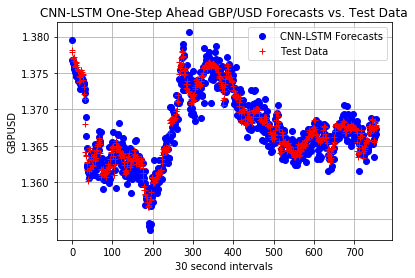

In [116]:
forecasts_CNN_LSTM=np.reshape(forecasts_CNN_LSTM,-1)
plt.plot(forecasts_CNN_LSTM,'bo', label='CNN-LSTM Forecasts')
plt.plot(raw_test,'r+',label="Test Data")
plt.xlabel('30 second intervals')
plt.ylabel('GBPUSD')
plt.title('CNN-LSTM One-Step Ahead GBP/USD Forecasts vs. Test Data')
plt.legend(loc="upper right")
plt.grid(True)

In [121]:
rmse_test = np.sqrt(mean_squared_error(forecasts_CNN_LSTM, raw_test))
rmse_test

0.001694033024663334

In [122]:
mean_abs_cnn_lstm=((forecasts_CNN_LSTM-TWAP_test)/TWAP_test)*100.0
mean_abs_cnn_lstm_=abs(mean_abs_cnn_lstm)
np.mean(mean_abs_cnn_lstm_)

0.097091956517834699

# ConvLSTM

In [123]:
# univariate convlstm example
from numpy import array
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import ConvLSTM2D
 
# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

In [124]:
raw_seq = dfprices['TWAP OHLC Mid']
# define model
model = Sequential()
model.add(ConvLSTM2D(filters=64, kernel_size=(1,2), activation='relu', input_shape=(n_seq, 1, n_steps, n_features)))
model.add(Flatten())
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [125]:
forecasts_ConvLSTM=[]

In [126]:
for i in range(test_size):
    n_steps=4
    n_seq=2
    X, y = split_sequence(raw_seq[0:train_size+i], n_steps)
    n_steps=2
    X=X.reshape((X.shape[0], n_seq, 1, n_steps, n_features))
    model.fit(X, y, epochs=30, batch_size=512,verbose=1)
    # demonstrate prediction
    x_input = raw_seq[train_size-4+i:train_size+i]
    x_input = x_input.reshape((1, n_seq, 1, n_steps, n_features))
    yhat = model.predict(x_input, verbose=0)
    forecasts_ConvLSTM.append(yhat)

Epoch 1/30
1759/1759 [==============================] - 0s 199us/step - loss: 1.9411
Epoch 2/30
1759/1759 [==============================] - 0s 27us/step - loss: 1.8093
Epoch 3/30
1759/1759 [==============================] - 0s 30us/step - loss: 1.6912
Epoch 4/30
1759/1759 [==============================] - 0s 27us/step - loss: 1.5776
Epoch 5/30
1759/1759 [==============================] - 0s 26us/step - loss: 1.4652
Epoch 6/30
1759/1759 [==============================] - 0s 24us/step - loss: 1.3551
Epoch 7/30
1759/1759 [==============================] - 0s 23us/step - loss: 1.2475
Epoch 8/30
1759/1759 [==============================] - 0s 26us/step - loss: 1.1384
Epoch 9/30
1759/1759 [==============================] - 0s 26us/step - loss: 1.0275
Epoch 10/30
1759/1759 [==============================] - 0s 24us/step - loss: 0.9163
Epoch 11/30
1759/1759 [==============================] - 0s 27us/step - loss: 0.8029
Epoch 12/30
1759/1759 [==============================] - 0s 27us/step - l

1762/1762 [==============================] - 0s 23us/step - loss: 3.2322e-05
Epoch 5/30
1762/1762 [==============================] - 0s 24us/step - loss: 3.2316e-05
Epoch 6/30
1762/1762 [==============================] - 0s 24us/step - loss: 3.2302e-05
Epoch 7/30
1762/1762 [==============================] - 0s 23us/step - loss: 3.2297e-05
Epoch 8/30
1762/1762 [==============================] - 0s 24us/step - loss: 3.2283e-05
Epoch 9/30
1762/1762 [==============================] - 0s 24us/step - loss: 3.2273e-05
Epoch 10/30
1762/1762 [==============================] - 0s 24us/step - loss: 3.2263e-05
Epoch 11/30
1762/1762 [==============================] - 0s 23us/step - loss: 3.2261e-05
Epoch 12/30
1762/1762 [==============================] - 0s 25us/step - loss: 3.2252e-05
Epoch 13/30
1762/1762 [==============================] - 0s 25us/step - loss: 3.2237e-05
Epoch 14/30
1762/1762 [==============================] - 0s 25us/step - loss: 3.2228e-05
Epoch 15/30
1762/1762 [===============

1765/1765 [==============================] - 0s 27us/step - loss: 3.1284e-05
Epoch 7/30
1765/1765 [==============================] - 0s 27us/step - loss: 3.1269e-05
Epoch 8/30
1765/1765 [==============================] - 0s 27us/step - loss: 3.1260e-05
Epoch 9/30
1765/1765 [==============================] - 0s 27us/step - loss: 3.1249e-05
Epoch 10/30
1765/1765 [==============================] - 0s 25us/step - loss: 3.1236e-05
Epoch 11/30
1765/1765 [==============================] - 0s 27us/step - loss: 3.1226e-05
Epoch 12/30
1765/1765 [==============================] - 0s 27us/step - loss: 3.1208e-05
Epoch 13/30
1765/1765 [==============================] - 0s 27us/step - loss: 3.1193e-05
Epoch 14/30
1765/1765 [==============================] - 0s 28us/step - loss: 3.1184e-05
Epoch 15/30
1765/1765 [==============================] - 0s 26us/step - loss: 3.1166e-05
Epoch 16/30
1765/1765 [==============================] - 0s 27us/step - loss: 3.1170e-05
Epoch 17/30
1765/1765 [=============

1768/1768 [==============================] - 0s 24us/step - loss: 2.9922e-05
Epoch 9/30
1768/1768 [==============================] - 0s 26us/step - loss: 2.9887e-05
Epoch 10/30
1768/1768 [==============================] - 0s 26us/step - loss: 2.9865e-05
Epoch 11/30
1768/1768 [==============================] - 0s 26us/step - loss: 2.9851e-05
Epoch 12/30
1768/1768 [==============================] - 0s 27us/step - loss: 2.9867e-05
Epoch 13/30
1768/1768 [==============================] - 0s 27us/step - loss: 2.9827e-05
Epoch 14/30
1768/1768 [==============================] - 0s 28us/step - loss: 2.9799e-05
Epoch 15/30
1768/1768 [==============================] - 0s 29us/step - loss: 2.9791e-05
Epoch 16/30
1768/1768 [==============================] - 0s 28us/step - loss: 2.9783e-05
Epoch 17/30
1768/1768 [==============================] - 0s 28us/step - loss: 2.9753e-05
Epoch 18/30
1768/1768 [==============================] - 0s 26us/step - loss: 2.9734e-05
Epoch 19/30
1768/1768 [===========

1771/1771 [==============================] - 0s 27us/step - loss: 2.8201e-05
Epoch 11/30
1771/1771 [==============================] - 0s 26us/step - loss: 2.8185e-05
Epoch 12/30
1771/1771 [==============================] - 0s 27us/step - loss: 2.8165e-05
Epoch 13/30
1771/1771 [==============================] - 0s 28us/step - loss: 2.8145e-05
Epoch 14/30
1771/1771 [==============================] - 0s 29us/step - loss: 2.8125e-05
Epoch 15/30
1771/1771 [==============================] - 0s 28us/step - loss: 2.8110e-05
Epoch 16/30
1771/1771 [==============================] - 0s 28us/step - loss: 2.8088e-05
Epoch 17/30
1771/1771 [==============================] - 0s 26us/step - loss: 2.8080e-05
Epoch 18/30
1771/1771 [==============================] - 0s 27us/step - loss: 2.8054e-05
Epoch 19/30
1771/1771 [==============================] - 0s 25us/step - loss: 2.8027e-05
Epoch 20/30
1771/1771 [==============================] - 0s 27us/step - loss: 2.8031e-05
Epoch 21/30
1771/1771 [==========

1774/1774 [==============================] - 0s 26us/step - loss: 2.6248e-05
Epoch 13/30
1774/1774 [==============================] - 0s 25us/step - loss: 2.6231e-05
Epoch 14/30
1774/1774 [==============================] - 0s 25us/step - loss: 2.6195e-05
Epoch 15/30
1774/1774 [==============================] - 0s 26us/step - loss: 2.6171e-05
Epoch 16/30
1774/1774 [==============================] - 0s 29us/step - loss: 2.6167e-05
Epoch 17/30
1774/1774 [==============================] - 0s 29us/step - loss: 2.6129e-05
Epoch 18/30
1774/1774 [==============================] - 0s 29us/step - loss: 2.6134e-05
Epoch 19/30
1774/1774 [==============================] - 0s 29us/step - loss: 2.6067e-05
Epoch 20/30
1774/1774 [==============================] - 0s 27us/step - loss: 2.6072e-05
Epoch 21/30
1774/1774 [==============================] - 0s 27us/step - loss: 2.6062e-05
Epoch 22/30
1774/1774 [==============================] - 0s 28us/step - loss: 2.6025e-05
Epoch 23/30
1774/1774 [==========

1777/1777 [==============================] - 0s 28us/step - loss: 2.4043e-05
Epoch 15/30
1777/1777 [==============================] - 0s 28us/step - loss: 2.4028e-05
Epoch 16/30
1777/1777 [==============================] - 0s 28us/step - loss: 2.3995e-05
Epoch 17/30
1777/1777 [==============================] - 0s 31us/step - loss: 2.3984e-05
Epoch 18/30
1777/1777 [==============================] - 0s 31us/step - loss: 2.3946e-05
Epoch 19/30
1777/1777 [==============================] - 0s 30us/step - loss: 2.3915e-05
Epoch 20/30
1777/1777 [==============================] - 0s 29us/step - loss: 2.3893e-05
Epoch 21/30
1777/1777 [==============================] - 0s 29us/step - loss: 2.3866e-05
Epoch 22/30
1777/1777 [==============================] - 0s 30us/step - loss: 2.3845e-05
Epoch 23/30
1777/1777 [==============================] - 0s 29us/step - loss: 2.3819e-05
Epoch 24/30
1777/1777 [==============================] - 0s 29us/step - loss: 2.3795e-05
Epoch 25/30
1777/1777 [==========

1780/1780 [==============================] - 0s 25us/step - loss: 2.1713e-05
Epoch 17/30
1780/1780 [==============================] - 0s 27us/step - loss: 2.1640e-05
Epoch 18/30
1780/1780 [==============================] - 0s 27us/step - loss: 2.1641e-05
Epoch 19/30
1780/1780 [==============================] - 0s 26us/step - loss: 2.1584e-05
Epoch 20/30
1780/1780 [==============================] - 0s 26us/step - loss: 2.1574e-05
Epoch 21/30
1780/1780 [==============================] - 0s 27us/step - loss: 2.1559e-05
Epoch 22/30
1780/1780 [==============================] - 0s 28us/step - loss: 2.1509e-05
Epoch 23/30
1780/1780 [==============================] - 0s 29us/step - loss: 2.1486e-05
Epoch 24/30
1780/1780 [==============================] - 0s 28us/step - loss: 2.1459e-05
Epoch 25/30
1780/1780 [==============================] - 0s 28us/step - loss: 2.1439e-05
Epoch 26/30
1780/1780 [==============================] - 0s 27us/step - loss: 2.1440e-05
Epoch 27/30
1780/1780 [==========

1783/1783 [==============================] - 0s 28us/step - loss: 1.9212e-05
Epoch 19/30
1783/1783 [==============================] - 0s 29us/step - loss: 1.9184e-05
Epoch 20/30
1783/1783 [==============================] - 0s 28us/step - loss: 1.9168e-05
Epoch 21/30
1783/1783 [==============================] - 0s 29us/step - loss: 1.9111e-05
Epoch 22/30
1783/1783 [==============================] - 0s 30us/step - loss: 1.9122e-05
Epoch 23/30
1783/1783 [==============================] - 0s 30us/step - loss: 1.9052e-05
Epoch 24/30
1783/1783 [==============================] - 0s 29us/step - loss: 1.9083e-05
Epoch 25/30
1783/1783 [==============================] - 0s 29us/step - loss: 1.9055e-05
Epoch 26/30
1783/1783 [==============================] - 0s 30us/step - loss: 1.9033e-05
Epoch 27/30
1783/1783 [==============================] - 0s 28us/step - loss: 1.8982e-05
Epoch 28/30
1783/1783 [==============================] - 0s 28us/step - loss: 1.8936e-05
Epoch 29/30
1783/1783 [==========

1786/1786 [==============================] - 0s 28us/step - loss: 1.6720e-05
Epoch 21/30
1786/1786 [==============================] - 0s 30us/step - loss: 1.6698e-05
Epoch 22/30
1786/1786 [==============================] - 0s 28us/step - loss: 1.6663e-05
Epoch 23/30
1786/1786 [==============================] - 0s 29us/step - loss: 1.6630e-05
Epoch 24/30
1786/1786 [==============================] - 0s 29us/step - loss: 1.6611e-05
Epoch 25/30
1786/1786 [==============================] - 0s 28us/step - loss: 1.6572e-05
Epoch 26/30
1786/1786 [==============================] - 0s 28us/step - loss: 1.6573e-05
Epoch 27/30
1786/1786 [==============================] - 0s 28us/step - loss: 1.6543e-05
Epoch 28/30
1786/1786 [==============================] - 0s 28us/step - loss: 1.6493e-05
Epoch 29/30
1786/1786 [==============================] - 0s 28us/step - loss: 1.6477e-05
Epoch 30/30
1786/1786 [==============================] - 0s 28us/step - loss: 1.6436e-05
Epoch 1/30
1787/1787 [===========

1789/1789 [==============================] - 0s 29us/step - loss: 1.4300e-05
Epoch 23/30
1789/1789 [==============================] - 0s 28us/step - loss: 1.4338e-05
Epoch 24/30
1789/1789 [==============================] - 0s 30us/step - loss: 1.4255e-05
Epoch 25/30
1789/1789 [==============================] - 0s 29us/step - loss: 1.4239e-05
Epoch 26/30
1789/1789 [==============================] - 0s 28us/step - loss: 1.4175e-05
Epoch 27/30
1789/1789 [==============================] - 0s 27us/step - loss: 1.4232e-05
Epoch 28/30
1789/1789 [==============================] - 0s 28us/step - loss: 1.4186e-05
Epoch 29/30
1789/1789 [==============================] - 0s 29us/step - loss: 1.4195e-05
Epoch 30/30
1789/1789 [==============================] - 0s 28us/step - loss: 1.4158e-05
Epoch 1/30
1790/1790 [==============================] - 0s 27us/step - loss: 1.4104e-05
Epoch 2/30
1790/1790 [==============================] - 0s 27us/step - loss: 1.4029e-05
Epoch 3/30
1790/1790 [=============

1792/1792 [==============================] - 0s 28us/step - loss: 1.2142e-05
Epoch 25/30
1792/1792 [==============================] - 0s 28us/step - loss: 1.2110e-05
Epoch 26/30
1792/1792 [==============================] - 0s 33us/step - loss: 1.2006e-05
Epoch 27/30
1792/1792 [==============================] - 0s 29us/step - loss: 1.2066e-05
Epoch 28/30
1792/1792 [==============================] - 0s 28us/step - loss: 1.2005e-05
Epoch 29/30
1792/1792 [==============================] - 0s 27us/step - loss: 1.1936e-05
Epoch 30/30
1792/1792 [==============================] - 0s 32us/step - loss: 1.1947e-05
Epoch 1/30
1793/1793 [==============================] - 0s 25us/step - loss: 1.1903e-05
Epoch 2/30
1793/1793 [==============================] - 0s 28us/step - loss: 1.1920e-05
Epoch 3/30
1793/1793 [==============================] - 0s 29us/step - loss: 1.1882e-05
Epoch 4/30
1793/1793 [==============================] - 0s 28us/step - loss: 1.1857e-05
Epoch 5/30
1793/1793 [===============

1795/1795 [==============================] - 0s 34us/step - loss: 1.0227e-05
Epoch 27/30
1795/1795 [==============================] - 0s 30us/step - loss: 1.0132e-05
Epoch 28/30
1795/1795 [==============================] - 0s 28us/step - loss: 1.0185e-05
Epoch 29/30
1795/1795 [==============================] - 0s 28us/step - loss: 1.0072e-05
Epoch 30/30
1795/1795 [==============================] - 0s 28us/step - loss: 1.0087e-05
Epoch 1/30
1796/1796 [==============================] - 0s 24us/step - loss: 1.0074e-05
Epoch 2/30
1796/1796 [==============================] - 0s 24us/step - loss: 1.0016e-05
Epoch 3/30
1796/1796 [==============================] - 0s 25us/step - loss: 9.9944e-06
Epoch 4/30
1796/1796 [==============================] - 0s 25us/step - loss: 9.9778e-06
Epoch 5/30
1796/1796 [==============================] - 0s 27us/step - loss: 1.0033e-05
Epoch 6/30
1796/1796 [==============================] - 0s 30us/step - loss: 1.0003e-05
Epoch 7/30
1796/1796 [=================

1798/1798 [==============================] - 0s 33us/step - loss: 8.5526e-06
Epoch 29/30
1798/1798 [==============================] - 0s 30us/step - loss: 8.5154e-06
Epoch 30/30
1798/1798 [==============================] - 0s 32us/step - loss: 8.5094e-06
Epoch 1/30
1799/1799 [==============================] - 0s 31us/step - loss: 8.5167e-06
Epoch 2/30
1799/1799 [==============================] - 0s 34us/step - loss: 8.5345e-06
Epoch 3/30
1799/1799 [==============================] - 0s 25us/step - loss: 8.4861e-06
Epoch 4/30
1799/1799 [==============================] - 0s 26us/step - loss: 8.4863e-06
Epoch 5/30
1799/1799 [==============================] - 0s 32us/step - loss: 8.4670e-06
Epoch 6/30
1799/1799 [==============================] - 0s 33us/step - loss: 8.3959e-06
Epoch 7/30
1799/1799 [==============================] - 0s 31us/step - loss: 8.4083e-06
Epoch 8/30
1799/1799 [==============================] - 0s 32us/step - loss: 8.3974e-06
Epoch 9/30
1799/1799 [===================

1801/1801 [==============================] - 0s 33us/step - loss: 7.3118e-06
Epoch 1/30
1802/1802 [==============================] - 0s 32us/step - loss: 7.3098e-06
Epoch 2/30
1802/1802 [==============================] - 0s 26us/step - loss: 7.3053e-06
Epoch 3/30
1802/1802 [==============================] - 0s 26us/step - loss: 7.3551e-06
Epoch 4/30
1802/1802 [==============================] - 0s 28us/step - loss: 7.3110e-06
Epoch 5/30
1802/1802 [==============================] - 0s 28us/step - loss: 7.2862e-06
Epoch 6/30
1802/1802 [==============================] - 0s 28us/step - loss: 7.2765e-06
Epoch 7/30
1802/1802 [==============================] - 0s 26us/step - loss: 7.2558e-06
Epoch 8/30
1802/1802 [==============================] - 0s 27us/step - loss: 7.2454e-06
Epoch 9/30
1802/1802 [==============================] - 0s 28us/step - loss: 7.2317e-06
Epoch 10/30
1802/1802 [==============================] - 0s 26us/step - loss: 7.2146e-06
Epoch 11/30
1802/1802 [===================

1805/1805 [==============================] - 0s 24us/step - loss: 6.4988e-06
Epoch 3/30
1805/1805 [==============================] - 0s 25us/step - loss: 6.5244e-06
Epoch 4/30
1805/1805 [==============================] - 0s 24us/step - loss: 6.5003e-06
Epoch 5/30
1805/1805 [==============================] - 0s 25us/step - loss: 6.5177e-06
Epoch 6/30
1805/1805 [==============================] - 0s 26us/step - loss: 6.5213e-06
Epoch 7/30
1805/1805 [==============================] - 0s 26us/step - loss: 6.5424e-06
Epoch 8/30
1805/1805 [==============================] - 0s 26us/step - loss: 6.5176e-06
Epoch 9/30
1805/1805 [==============================] - 0s 27us/step - loss: 6.4678e-06
Epoch 10/30
1805/1805 [==============================] - 0s 30us/step - loss: 6.4538e-06
Epoch 11/30
1805/1805 [==============================] - 0s 30us/step - loss: 6.4588e-06
Epoch 12/30
1805/1805 [==============================] - 0s 29us/step - loss: 6.4157e-06
Epoch 13/30
1805/1805 [=================

1808/1808 [==============================] - 0s 26us/step - loss: 6.0000e-06
Epoch 5/30
1808/1808 [==============================] - 0s 24us/step - loss: 6.1134e-06
Epoch 6/30
1808/1808 [==============================] - 0s 27us/step - loss: 6.0690e-06
Epoch 7/30
1808/1808 [==============================] - 0s 29us/step - loss: 6.0600e-06
Epoch 8/30
1808/1808 [==============================] - 0s 28us/step - loss: 5.9611e-06
Epoch 9/30
1808/1808 [==============================] - 0s 28us/step - loss: 5.9650e-06
Epoch 10/30
1808/1808 [==============================] - 0s 28us/step - loss: 6.0145e-06
Epoch 11/30
1808/1808 [==============================] - 0s 30us/step - loss: 6.0246e-06
Epoch 12/30
1808/1808 [==============================] - 0s 28us/step - loss: 6.0325e-06
Epoch 13/30
1808/1808 [==============================] - 0s 28us/step - loss: 6.1631e-06
Epoch 14/30
1808/1808 [==============================] - 0s 27us/step - loss: 5.9382e-06
Epoch 15/30
1808/1808 [===============

1811/1811 [==============================] - 0s 27us/step - loss: 5.8336e-06
Epoch 7/30
1811/1811 [==============================] - 0s 28us/step - loss: 5.7794e-06
Epoch 8/30
1811/1811 [==============================] - 0s 26us/step - loss: 5.7300e-06
Epoch 9/30
1811/1811 [==============================] - 0s 29us/step - loss: 5.7998e-06
Epoch 10/30
1811/1811 [==============================] - 0s 27us/step - loss: 5.7165e-06
Epoch 11/30
1811/1811 [==============================] - 0s 28us/step - loss: 5.7967e-06
Epoch 12/30
1811/1811 [==============================] - 0s 30us/step - loss: 5.8854e-06
Epoch 13/30
1811/1811 [==============================] - 0s 28us/step - loss: 5.8324e-06
Epoch 14/30
1811/1811 [==============================] - 0s 29us/step - loss: 5.9027e-06
Epoch 15/30
1811/1811 [==============================] - 0s 27us/step - loss: 5.8719e-06
Epoch 16/30
1811/1811 [==============================] - 0s 28us/step - loss: 5.8512e-06
Epoch 17/30
1811/1811 [=============

1814/1814 [==============================] - 0s 24us/step - loss: 5.6152e-06
Epoch 9/30
1814/1814 [==============================] - 0s 25us/step - loss: 5.5858e-06
Epoch 10/30
1814/1814 [==============================] - 0s 25us/step - loss: 5.5761e-06
Epoch 11/30
1814/1814 [==============================] - 0s 24us/step - loss: 5.6130e-06
Epoch 12/30
1814/1814 [==============================] - 0s 34us/step - loss: 5.8257e-06
Epoch 13/30
1814/1814 [==============================] - 0s 32us/step - loss: 5.7143e-06
Epoch 14/30
1814/1814 [==============================] - 0s 28us/step - loss: 5.7443e-06
Epoch 15/30
1814/1814 [==============================] - 0s 28us/step - loss: 5.7101e-06
Epoch 16/30
1814/1814 [==============================] - 0s 28us/step - loss: 5.6402e-06
Epoch 17/30
1814/1814 [==============================] - 0s 28us/step - loss: 5.7391e-06
Epoch 18/30
1814/1814 [==============================] - 0s 27us/step - loss: 5.6050e-06
Epoch 19/30
1814/1814 [===========

1817/1817 [==============================] - 0s 32us/step - loss: 5.6267e-06
Epoch 11/30
1817/1817 [==============================] - 0s 30us/step - loss: 5.7880e-06
Epoch 12/30
1817/1817 [==============================] - 0s 30us/step - loss: 5.6705e-06
Epoch 13/30
1817/1817 [==============================] - 0s 31us/step - loss: 5.6597e-06
Epoch 14/30
1817/1817 [==============================] - 0s 31us/step - loss: 5.5660e-06
Epoch 15/30
1817/1817 [==============================] - 0s 31us/step - loss: 5.5388e-06
Epoch 16/30
1817/1817 [==============================] - 0s 29us/step - loss: 5.5794e-06
Epoch 17/30
1817/1817 [==============================] - 0s 29us/step - loss: 5.6551e-06
Epoch 18/30
1817/1817 [==============================] - 0s 29us/step - loss: 5.7360e-06
Epoch 19/30
1817/1817 [==============================] - 0s 32us/step - loss: 5.6748e-06
Epoch 20/30
1817/1817 [==============================] - 0s 32us/step - loss: 5.7546e-06
Epoch 21/30
1817/1817 [==========

1820/1820 [==============================] - 0s 33us/step - loss: 5.5509e-06
Epoch 13/30
1820/1820 [==============================] - 0s 29us/step - loss: 5.4952e-06
Epoch 14/30
1820/1820 [==============================] - 0s 31us/step - loss: 5.6165e-06
Epoch 15/30
1820/1820 [==============================] - 0s 27us/step - loss: 5.8722e-06
Epoch 16/30
1820/1820 [==============================] - 0s 28us/step - loss: 5.7357e-06
Epoch 17/30
1820/1820 [==============================] - 0s 29us/step - loss: 5.6986e-06
Epoch 18/30
1820/1820 [==============================] - 0s 30us/step - loss: 5.8978e-06
Epoch 19/30
1820/1820 [==============================] - 0s 33us/step - loss: 6.0368e-06
Epoch 20/30
1820/1820 [==============================] - 0s 35us/step - loss: 5.7941e-06
Epoch 21/30
1820/1820 [==============================] - 0s 30us/step - loss: 5.6261e-06
Epoch 22/30
1820/1820 [==============================] - 0s 32us/step - loss: 5.7026e-06
Epoch 23/30
1820/1820 [==========

1823/1823 [==============================] - 0s 30us/step - loss: 5.7608e-06
Epoch 15/30
1823/1823 [==============================] - 0s 31us/step - loss: 5.9633e-06
Epoch 16/30
1823/1823 [==============================] - 0s 33us/step - loss: 5.6600e-06
Epoch 17/30
1823/1823 [==============================] - 0s 31us/step - loss: 5.5736e-06
Epoch 18/30
1823/1823 [==============================] - 0s 29us/step - loss: 5.6500e-06
Epoch 19/30
1823/1823 [==============================] - 0s 28us/step - loss: 5.5204e-06
Epoch 20/30
1823/1823 [==============================] - 0s 29us/step - loss: 5.6162e-06
Epoch 21/30
1823/1823 [==============================] - 0s 32us/step - loss: 5.4901e-06
Epoch 22/30
1823/1823 [==============================] - 0s 33us/step - loss: 5.5320e-06
Epoch 23/30
1823/1823 [==============================] - 0s 35us/step - loss: 5.5098e-06
Epoch 24/30
1823/1823 [==============================] - 0s 32us/step - loss: 5.6617e-06
Epoch 25/30
1823/1823 [==========

1826/1826 [==============================] - 0s 28us/step - loss: 5.5150e-06
Epoch 16/30
1826/1826 [==============================] - 0s 29us/step - loss: 5.4806e-06
Epoch 17/30
1826/1826 [==============================] - 0s 28us/step - loss: 5.5477e-06
Epoch 18/30
1826/1826 [==============================] - 0s 30us/step - loss: 5.5251e-06
Epoch 19/30
1826/1826 [==============================] - 0s 29us/step - loss: 5.5500e-06
Epoch 20/30
1826/1826 [==============================] - 0s 29us/step - loss: 5.7663e-06
Epoch 21/30
1826/1826 [==============================] - 0s 29us/step - loss: 6.4866e-06
Epoch 22/30
1826/1826 [==============================] - 0s 29us/step - loss: 6.0128e-06
Epoch 23/30
1826/1826 [==============================] - 0s 29us/step - loss: 5.8878e-06
Epoch 24/30
1826/1826 [==============================] - 0s 28us/step - loss: 5.6227e-06
Epoch 25/30
1826/1826 [==============================] - 0s 28us/step - loss: 5.6755e-06
Epoch 26/30
1826/1826 [==========

1829/1829 [==============================] - 0s 32us/step - loss: 5.5251e-06
Epoch 18/30
1829/1829 [==============================] - 0s 29us/step - loss: 5.4671e-06
Epoch 19/30
1829/1829 [==============================] - 0s 31us/step - loss: 5.7692e-06
Epoch 20/30
1829/1829 [==============================] - 0s 29us/step - loss: 5.7731e-06
Epoch 21/30
1829/1829 [==============================] - 0s 32us/step - loss: 5.7089e-06
Epoch 22/30
1829/1829 [==============================] - 0s 32us/step - loss: 5.7301e-06
Epoch 23/30
1829/1829 [==============================] - 0s 30us/step - loss: 6.0610e-06
Epoch 24/30
1829/1829 [==============================] - 0s 29us/step - loss: 5.7565e-06
Epoch 25/30
1829/1829 [==============================] - 0s 29us/step - loss: 5.5749e-06
Epoch 26/30
1829/1829 [==============================] - 0s 33us/step - loss: 5.6808e-06
Epoch 27/30
1829/1829 [==============================] - 0s 30us/step - loss: 5.6822e-06
Epoch 28/30
1829/1829 [==========

1832/1832 [==============================] - 0s 33us/step - loss: 6.3353e-06
Epoch 20/30
1832/1832 [==============================] - 0s 31us/step - loss: 6.3013e-06
Epoch 21/30
1832/1832 [==============================] - 0s 28us/step - loss: 7.1991e-06
Epoch 22/30
1832/1832 [==============================] - 0s 28us/step - loss: 6.0856e-06
Epoch 23/30
1832/1832 [==============================] - 0s 27us/step - loss: 5.9957e-06
Epoch 24/30
1832/1832 [==============================] - 0s 28us/step - loss: 5.9120e-06
Epoch 25/30
1832/1832 [==============================] - 0s 28us/step - loss: 5.6100e-06
Epoch 26/30
1832/1832 [==============================] - 0s 28us/step - loss: 6.5262e-06
Epoch 27/30
1832/1832 [==============================] - 0s 30us/step - loss: 5.9562e-06
Epoch 28/30
1832/1832 [==============================] - 0s 33us/step - loss: 6.7190e-06
Epoch 29/30
1832/1832 [==============================] - 0s 32us/step - loss: 6.1715e-06
Epoch 30/30
1832/1832 [==========

1835/1835 [==============================] - 0s 27us/step - loss: 5.5863e-06
Epoch 22/30
1835/1835 [==============================] - 0s 29us/step - loss: 5.9399e-06
Epoch 23/30
1835/1835 [==============================] - 0s 27us/step - loss: 5.5943e-06
Epoch 24/30
1835/1835 [==============================] - 0s 28us/step - loss: 5.5536e-06
Epoch 25/30
1835/1835 [==============================] - 0s 29us/step - loss: 5.4516e-06
Epoch 26/30
1835/1835 [==============================] - 0s 28us/step - loss: 5.7628e-06
Epoch 27/30
1835/1835 [==============================] - 0s 30us/step - loss: 6.2382e-06
Epoch 28/30
1835/1835 [==============================] - 0s 31us/step - loss: 6.5121e-06
Epoch 29/30
1835/1835 [==============================] - 0s 32us/step - loss: 6.0209e-06
Epoch 30/30
1835/1835 [==============================] - 0s 29us/step - loss: 5.8256e-06
Epoch 1/30
1836/1836 [==============================] - 0s 25us/step - loss: 5.5052e-06
Epoch 2/30
1836/1836 [============

1838/1838 [==============================] - 0s 28us/step - loss: 5.5531e-06
Epoch 24/30
1838/1838 [==============================] - 0s 27us/step - loss: 6.1125e-06
Epoch 25/30
1838/1838 [==============================] - 0s 29us/step - loss: 5.5228e-06
Epoch 26/30
1838/1838 [==============================] - 0s 29us/step - loss: 5.5474e-06
Epoch 27/30
1838/1838 [==============================] - 0s 29us/step - loss: 5.9676e-06
Epoch 28/30
1838/1838 [==============================] - 0s 28us/step - loss: 6.2218e-06
Epoch 29/30
1838/1838 [==============================] - 0s 28us/step - loss: 6.4588e-06
Epoch 30/30
1838/1838 [==============================] - 0s 28us/step - loss: 6.4465e-06
Epoch 1/30
1839/1839 [==============================] - 0s 26us/step - loss: 5.8028e-06
Epoch 2/30
1839/1839 [==============================] - 0s 28us/step - loss: 5.4590e-06
Epoch 3/30
1839/1839 [==============================] - 0s 25us/step - loss: 5.4806e-06
Epoch 4/30
1839/1839 [==============

1841/1841 [==============================] - 0s 28us/step - loss: 8.2618e-06
Epoch 26/30
1841/1841 [==============================] - 0s 29us/step - loss: 7.1633e-06
Epoch 27/30
1841/1841 [==============================] - 0s 28us/step - loss: 6.2365e-06
Epoch 28/30
1841/1841 [==============================] - 0s 29us/step - loss: 6.0218e-06
Epoch 29/30
1841/1841 [==============================] - 0s 29us/step - loss: 7.2371e-06
Epoch 30/30
1841/1841 [==============================] - 0s 28us/step - loss: 6.1855e-06
Epoch 1/30
1842/1842 [==============================] - 0s 23us/step - loss: 7.4651e-06
Epoch 2/30
1842/1842 [==============================] - 0s 23us/step - loss: 5.9613e-06
Epoch 3/30
1842/1842 [==============================] - 0s 25us/step - loss: 5.7493e-06
Epoch 4/30
1842/1842 [==============================] - 0s 27us/step - loss: 5.7091e-06
Epoch 5/30
1842/1842 [==============================] - 0s 26us/step - loss: 5.8884e-06
Epoch 6/30
1842/1842 [================

1844/1844 [==============================] - 0s 28us/step - loss: 6.4704e-06
Epoch 28/30
1844/1844 [==============================] - 0s 28us/step - loss: 7.6967e-06
Epoch 29/30
1844/1844 [==============================] - 0s 29us/step - loss: 6.4277e-06
Epoch 30/30
1844/1844 [==============================] - 0s 28us/step - loss: 6.4361e-06
Epoch 1/30
1845/1845 [==============================] - 0s 26us/step - loss: 6.1707e-06
Epoch 2/30
1845/1845 [==============================] - 0s 25us/step - loss: 6.4730e-06
Epoch 3/30
1845/1845 [==============================] - 0s 24us/step - loss: 6.0262e-06
Epoch 4/30
1845/1845 [==============================] - 0s 26us/step - loss: 7.5602e-06
Epoch 5/30
1845/1845 [==============================] - 0s 29us/step - loss: 5.9187e-06
Epoch 6/30
1845/1845 [==============================] - 0s 29us/step - loss: 6.1481e-06
Epoch 7/30
1845/1845 [==============================] - 0s 28us/step - loss: 5.4636e-06
Epoch 8/30
1845/1845 [==================

1847/1847 [==============================] - 0s 28us/step - loss: 5.4466e-06
Epoch 30/30
1847/1847 [==============================] - 0s 28us/step - loss: 5.4128e-06
Epoch 1/30
1848/1848 [==============================] - 0s 26us/step - loss: 5.4912e-06
Epoch 2/30
1848/1848 [==============================] - 0s 28us/step - loss: 5.6800e-06
Epoch 3/30
1848/1848 [==============================] - 0s 25us/step - loss: 5.9406e-06
Epoch 4/30
1848/1848 [==============================] - 0s 24us/step - loss: 5.7688e-06
Epoch 5/30
1848/1848 [==============================] - 0s 24us/step - loss: 6.4531e-06
Epoch 6/30
1848/1848 [==============================] - 0s 24us/step - loss: 6.0253e-06
Epoch 7/30
1848/1848 [==============================] - 0s 23us/step - loss: 6.2540e-06
Epoch 8/30
1848/1848 [==============================] - 0s 24us/step - loss: 5.4976e-06
Epoch 9/30
1848/1848 [==============================] - 0s 23us/step - loss: 5.5579e-06
Epoch 10/30
1848/1848 [===================

1851/1851 [==============================] - 0s 25us/step - loss: 6.8751e-06
Epoch 2/30
1851/1851 [==============================] - 0s 25us/step - loss: 5.5181e-06
Epoch 3/30
1851/1851 [==============================] - 0s 26us/step - loss: 5.7922e-06
Epoch 4/30
1851/1851 [==============================] - 0s 30us/step - loss: 6.6892e-06
Epoch 5/30
1851/1851 [==============================] - 0s 33us/step - loss: 5.8680e-06
Epoch 6/30
1851/1851 [==============================] - 0s 31us/step - loss: 5.9836e-06
Epoch 7/30
1851/1851 [==============================] - 0s 30us/step - loss: 6.5659e-06
Epoch 8/30
1851/1851 [==============================] - 0s 28us/step - loss: 6.3736e-06
Epoch 9/30
1851/1851 [==============================] - 0s 29us/step - loss: 5.7270e-06
Epoch 10/30
1851/1851 [==============================] - 0s 29us/step - loss: 5.9927e-06
Epoch 11/30
1851/1851 [==============================] - 0s 28us/step - loss: 5.7050e-06
Epoch 12/30
1851/1851 [==================

1854/1854 [==============================] - 0s 24us/step - loss: 5.9930e-06
Epoch 4/30
1854/1854 [==============================] - 0s 24us/step - loss: 6.0199e-06
Epoch 5/30
1854/1854 [==============================] - 0s 24us/step - loss: 5.7894e-06
Epoch 6/30
1854/1854 [==============================] - 0s 26us/step - loss: 6.4763e-06
Epoch 7/30
1854/1854 [==============================] - 0s 29us/step - loss: 6.0174e-06
Epoch 8/30
1854/1854 [==============================] - 0s 31us/step - loss: 6.8176e-06
Epoch 9/30
1854/1854 [==============================] - 0s 28us/step - loss: 7.0806e-06
Epoch 10/30
1854/1854 [==============================] - 0s 29us/step - loss: 7.0128e-06
Epoch 11/30
1854/1854 [==============================] - 0s 28us/step - loss: 6.4546e-06
Epoch 12/30
1854/1854 [==============================] - 0s 28us/step - loss: 5.3305e-06
Epoch 13/30
1854/1854 [==============================] - 0s 31us/step - loss: 5.3699e-06
Epoch 14/30
1854/1854 [================

1857/1857 [==============================] - 0s 28us/step - loss: 6.1896e-06
Epoch 6/30
1857/1857 [==============================] - 0s 28us/step - loss: 5.4586e-06
Epoch 7/30
1857/1857 [==============================] - 0s 28us/step - loss: 5.4974e-06
Epoch 8/30
1857/1857 [==============================] - 0s 29us/step - loss: 5.3604e-06
Epoch 9/30
1857/1857 [==============================] - 0s 28us/step - loss: 6.0801e-06
Epoch 10/30
1857/1857 [==============================] - 0s 28us/step - loss: 6.5595e-06
Epoch 11/30
1857/1857 [==============================] - 0s 29us/step - loss: 6.2788e-06
Epoch 12/30
1857/1857 [==============================] - 0s 30us/step - loss: 5.8587e-06
Epoch 13/30
1857/1857 [==============================] - 0s 30us/step - loss: 6.8818e-06
Epoch 14/30
1857/1857 [==============================] - 0s 33us/step - loss: 5.3831e-06
Epoch 15/30
1857/1857 [==============================] - 0s 28us/step - loss: 5.8307e-06
Epoch 16/30
1857/1857 [==============

1860/1860 [==============================] - 0s 28us/step - loss: 5.7322e-06
Epoch 8/30
1860/1860 [==============================] - 0s 27us/step - loss: 5.8044e-06
Epoch 9/30
1860/1860 [==============================] - 0s 28us/step - loss: 6.1341e-06
Epoch 10/30
1860/1860 [==============================] - 0s 28us/step - loss: 6.4373e-06
Epoch 11/30
1860/1860 [==============================] - 0s 29us/step - loss: 6.1657e-06
Epoch 12/30
1860/1860 [==============================] - 0s 27us/step - loss: 5.3398e-06
Epoch 13/30
1860/1860 [==============================] - 0s 28us/step - loss: 5.7533e-06
Epoch 14/30
1860/1860 [==============================] - 0s 29us/step - loss: 5.5038e-06
Epoch 15/30
1860/1860 [==============================] - 0s 27us/step - loss: 5.3985e-06
Epoch 16/30
1860/1860 [==============================] - 0s 27us/step - loss: 5.4114e-06
Epoch 17/30
1860/1860 [==============================] - 0s 28us/step - loss: 5.6697e-06
Epoch 18/30
1860/1860 [============

1863/1863 [==============================] - 0s 31us/step - loss: 5.7564e-06
Epoch 10/30
1863/1863 [==============================] - 0s 31us/step - loss: 5.4014e-06
Epoch 11/30
1863/1863 [==============================] - 0s 32us/step - loss: 5.5481e-06
Epoch 12/30
1863/1863 [==============================] - 0s 32us/step - loss: 5.8264e-06
Epoch 13/30
1863/1863 [==============================] - 0s 30us/step - loss: 5.8654e-06
Epoch 14/30
1863/1863 [==============================] - 0s 31us/step - loss: 5.6313e-06
Epoch 15/30
1863/1863 [==============================] - 0s 32us/step - loss: 5.6208e-06
Epoch 16/30
1863/1863 [==============================] - 0s 36us/step - loss: 5.6289e-06
Epoch 17/30
1863/1863 [==============================] - 0s 31us/step - loss: 1.0317e-05
Epoch 18/30
1863/1863 [==============================] - 0s 33us/step - loss: 8.3410e-06
Epoch 19/30
1863/1863 [==============================] - 0s 31us/step - loss: 9.4357e-06
Epoch 20/30
1863/1863 [==========

1866/1866 [==============================] - 0s 29us/step - loss: 6.2366e-06
Epoch 12/30
1866/1866 [==============================] - 0s 29us/step - loss: 6.9395e-06
Epoch 13/30
1866/1866 [==============================] - 0s 30us/step - loss: 6.4494e-06
Epoch 14/30
1866/1866 [==============================] - 0s 33us/step - loss: 5.3100e-06
Epoch 15/30
1866/1866 [==============================] - 0s 31us/step - loss: 5.3374e-06
Epoch 16/30
1866/1866 [==============================] - 0s 31us/step - loss: 5.3766e-06
Epoch 17/30
1866/1866 [==============================] - 0s 31us/step - loss: 6.5725e-06
Epoch 18/30
1866/1866 [==============================] - 0s 27us/step - loss: 6.2764e-06
Epoch 19/30
1866/1866 [==============================] - 0s 29us/step - loss: 5.6712e-06
Epoch 20/30
1866/1866 [==============================] - 0s 29us/step - loss: 5.3690e-06
Epoch 21/30
1866/1866 [==============================] - 0s 33us/step - loss: 5.5437e-06
Epoch 22/30
1866/1866 [==========

1869/1869 [==============================] - 0s 28us/step - loss: 5.4638e-06
Epoch 14/30
1869/1869 [==============================] - 0s 28us/step - loss: 5.6820e-06
Epoch 15/30
1869/1869 [==============================] - 0s 32us/step - loss: 6.0585e-06
Epoch 16/30
1869/1869 [==============================] - 0s 28us/step - loss: 6.9302e-06
Epoch 17/30
1869/1869 [==============================] - 0s 31us/step - loss: 5.7658e-06
Epoch 18/30
1869/1869 [==============================] - 0s 29us/step - loss: 5.3914e-06
Epoch 19/30
1869/1869 [==============================] - 0s 32us/step - loss: 5.4252e-06
Epoch 20/30
1869/1869 [==============================] - 0s 29us/step - loss: 6.5389e-06
Epoch 21/30
1869/1869 [==============================] - 0s 29us/step - loss: 6.9725e-06
Epoch 22/30
1869/1869 [==============================] - 0s 31us/step - loss: 6.3708e-06
Epoch 23/30
1869/1869 [==============================] - 0s 33us/step - loss: 5.7451e-06
Epoch 24/30
1869/1869 [==========

1872/1872 [==============================] - 0s 25us/step - loss: 5.2786e-06
Epoch 16/30
1872/1872 [==============================] - 0s 29us/step - loss: 5.4185e-06
Epoch 17/30
1872/1872 [==============================] - 0s 28us/step - loss: 6.0087e-06
Epoch 18/30
1872/1872 [==============================] - 0s 28us/step - loss: 6.1356e-06
Epoch 19/30
1872/1872 [==============================] - 0s 26us/step - loss: 5.7316e-06
Epoch 20/30
1872/1872 [==============================] - 0s 27us/step - loss: 5.3232e-06
Epoch 21/30
1872/1872 [==============================] - 0s 28us/step - loss: 5.5214e-06
Epoch 22/30
1872/1872 [==============================] - 0s 31us/step - loss: 5.4935e-06
Epoch 23/30
1872/1872 [==============================] - 0s 32us/step - loss: 5.3650e-06
Epoch 24/30
1872/1872 [==============================] - 0s 28us/step - loss: 5.3789e-06
Epoch 25/30
1872/1872 [==============================] - 0s 28us/step - loss: 5.4131e-06
Epoch 26/30
1872/1872 [==========

1875/1875 [==============================] - 0s 29us/step - loss: 8.2100e-06
Epoch 18/30
1875/1875 [==============================] - 0s 29us/step - loss: 1.1312e-05
Epoch 19/30
1875/1875 [==============================] - 0s 29us/step - loss: 1.2240e-05
Epoch 20/30
1875/1875 [==============================] - 0s 27us/step - loss: 1.1335e-05
Epoch 21/30
1875/1875 [==============================] - 0s 28us/step - loss: 8.6517e-06
Epoch 22/30
1875/1875 [==============================] - 0s 29us/step - loss: 8.1574e-06
Epoch 23/30
1875/1875 [==============================] - 0s 28us/step - loss: 6.9801e-06
Epoch 24/30
1875/1875 [==============================] - 0s 28us/step - loss: 7.3025e-06
Epoch 25/30
1875/1875 [==============================] - 0s 28us/step - loss: 6.0740e-06
Epoch 26/30
1875/1875 [==============================] - 0s 28us/step - loss: 7.5751e-06
Epoch 27/30
1875/1875 [==============================] - 0s 28us/step - loss: 6.6799e-06
Epoch 28/30
1875/1875 [==========

1878/1878 [==============================] - 0s 32us/step - loss: 5.2470e-06
Epoch 20/30
1878/1878 [==============================] - 0s 32us/step - loss: 5.3409e-06
Epoch 21/30
1878/1878 [==============================] - 0s 38us/step - loss: 6.4719e-06
Epoch 22/30
1878/1878 [==============================] - 0s 34us/step - loss: 6.7639e-06
Epoch 23/30
1878/1878 [==============================] - 0s 29us/step - loss: 5.8623e-06
Epoch 24/30
1878/1878 [==============================] - 0s 34us/step - loss: 5.8420e-06
Epoch 25/30
1878/1878 [==============================] - 0s 31us/step - loss: 5.6727e-06
Epoch 26/30
1878/1878 [==============================] - 0s 30us/step - loss: 5.6488e-06
Epoch 27/30
1878/1878 [==============================] - 0s 30us/step - loss: 6.0976e-06
Epoch 28/30
1878/1878 [==============================] - 0s 30us/step - loss: 5.5124e-06
Epoch 29/30
1878/1878 [==============================] - 0s 30us/step - loss: 6.0243e-06
Epoch 30/30
1878/1878 [==========

1881/1881 [==============================] - 0s 31us/step - loss: 5.6559e-06
Epoch 22/30
1881/1881 [==============================] - 0s 29us/step - loss: 5.5661e-06
Epoch 23/30
1881/1881 [==============================] - 0s 28us/step - loss: 5.6437e-06
Epoch 24/30
1881/1881 [==============================] - 0s 28us/step - loss: 6.0212e-06
Epoch 25/30
1881/1881 [==============================] - 0s 28us/step - loss: 5.4674e-06
Epoch 26/30
1881/1881 [==============================] - 0s 29us/step - loss: 6.4763e-06
Epoch 27/30
1881/1881 [==============================] - 0s 27us/step - loss: 7.1752e-06
Epoch 28/30
1881/1881 [==============================] - 0s 30us/step - loss: 6.8480e-06
Epoch 29/30
1881/1881 [==============================] - 0s 28us/step - loss: 6.1563e-06
Epoch 30/30
1881/1881 [==============================] - 0s 30us/step - loss: 5.7891e-06
Epoch 1/30
1882/1882 [==============================] - 0s 27us/step - loss: 5.4168e-06
Epoch 2/30
1882/1882 [============

1884/1884 [==============================] - 0s 28us/step - loss: 8.5710e-06
Epoch 24/30
1884/1884 [==============================] - 0s 29us/step - loss: 7.8336e-06
Epoch 25/30
1884/1884 [==============================] - 0s 29us/step - loss: 6.5396e-06
Epoch 26/30
1884/1884 [==============================] - 0s 28us/step - loss: 5.8066e-06
Epoch 27/30
1884/1884 [==============================] - 0s 32us/step - loss: 5.8079e-06
Epoch 28/30
1884/1884 [==============================] - 0s 32us/step - loss: 5.6243e-06
Epoch 29/30
1884/1884 [==============================] - 0s 29us/step - loss: 5.2398e-06
Epoch 30/30
1884/1884 [==============================] - 0s 29us/step - loss: 5.3880e-06
Epoch 1/30
1885/1885 [==============================] - 0s 23us/step - loss: 5.7209e-06
Epoch 2/30
1885/1885 [==============================] - 0s 24us/step - loss: 7.0743e-06
Epoch 3/30
1885/1885 [==============================] - 0s 25us/step - loss: 6.4115e-06
Epoch 4/30
1885/1885 [==============

1887/1887 [==============================] - 0s 28us/step - loss: 5.6870e-06
Epoch 26/30
1887/1887 [==============================] - 0s 33us/step - loss: 6.8865e-06
Epoch 27/30
1887/1887 [==============================] - 0s 28us/step - loss: 7.0141e-06
Epoch 28/30
1887/1887 [==============================] - 0s 26us/step - loss: 5.7285e-06
Epoch 29/30
1887/1887 [==============================] - 0s 27us/step - loss: 5.3718e-06
Epoch 30/30
1887/1887 [==============================] - 0s 33us/step - loss: 6.3209e-06
Epoch 1/30
1888/1888 [==============================] - 0s 23us/step - loss: 5.4352e-06
Epoch 2/30
1888/1888 [==============================] - 0s 24us/step - loss: 6.0140e-06
Epoch 3/30
1888/1888 [==============================] - 0s 24us/step - loss: 6.0744e-06
Epoch 4/30
1888/1888 [==============================] - 0s 25us/step - loss: 5.3468e-06
Epoch 5/30
1888/1888 [==============================] - 0s 26us/step - loss: 5.5114e-06
Epoch 6/30
1888/1888 [================

1890/1890 [==============================] - 0s 31us/step - loss: 6.8768e-06
Epoch 28/30
1890/1890 [==============================] - 0s 31us/step - loss: 7.4194e-06
Epoch 29/30
1890/1890 [==============================] - 0s 33us/step - loss: 6.5812e-06
Epoch 30/30
1890/1890 [==============================] - 0s 31us/step - loss: 6.7282e-06
Epoch 1/30
1891/1891 [==============================] - 0s 25us/step - loss: 8.2432e-06
Epoch 2/30
1891/1891 [==============================] - 0s 25us/step - loss: 7.4831e-06
Epoch 3/30
1891/1891 [==============================] - 0s 29us/step - loss: 8.1161e-06
Epoch 4/30
1891/1891 [==============================] - 0s 28us/step - loss: 7.3529e-06
Epoch 5/30
1891/1891 [==============================] - 0s 26us/step - loss: 5.8678e-06
Epoch 6/30
1891/1891 [==============================] - 0s 31us/step - loss: 5.5665e-06
Epoch 7/30
1891/1891 [==============================] - 0s 31us/step - loss: 5.3344e-06
Epoch 8/30
1891/1891 [==================

1893/1893 [==============================] - 0s 28us/step - loss: 5.4465e-06
Epoch 30/30
1893/1893 [==============================] - 0s 29us/step - loss: 5.9495e-06
Epoch 1/30
1894/1894 [==============================] - 0s 25us/step - loss: 6.8302e-06
Epoch 2/30
1894/1894 [==============================] - 0s 24us/step - loss: 7.3778e-06
Epoch 3/30
1894/1894 [==============================] - 0s 25us/step - loss: 5.8250e-06
Epoch 4/30
1894/1894 [==============================] - 0s 26us/step - loss: 5.6600e-06
Epoch 5/30
1894/1894 [==============================] - 0s 29us/step - loss: 6.1973e-06
Epoch 6/30
1894/1894 [==============================] - 0s 28us/step - loss: 7.9636e-06
Epoch 7/30
1894/1894 [==============================] - 0s 28us/step - loss: 8.5956e-06
Epoch 8/30
1894/1894 [==============================] - 0s 27us/step - loss: 9.8182e-06
Epoch 9/30
1894/1894 [==============================] - 0s 29us/step - loss: 1.0252e-05
Epoch 10/30
1894/1894 [===================

1897/1897 [==============================] - 0s 24us/step - loss: 5.3539e-06
Epoch 2/30
1897/1897 [==============================] - 0s 25us/step - loss: 6.2154e-06
Epoch 3/30
1897/1897 [==============================] - 0s 25us/step - loss: 5.2861e-06
Epoch 4/30
1897/1897 [==============================] - 0s 26us/step - loss: 5.7405e-06
Epoch 5/30
1897/1897 [==============================] - 0s 29us/step - loss: 6.0977e-06
Epoch 6/30
1897/1897 [==============================] - 0s 33us/step - loss: 7.9303e-06
Epoch 7/30
1897/1897 [==============================] - 0s 29us/step - loss: 6.4857e-06
Epoch 8/30
1897/1897 [==============================] - 0s 27us/step - loss: 1.1128e-05
Epoch 9/30
1897/1897 [==============================] - 0s 30us/step - loss: 9.2024e-06
Epoch 10/30
1897/1897 [==============================] - 0s 29us/step - loss: 8.7144e-06
Epoch 11/30
1897/1897 [==============================] - 0s 28us/step - loss: 9.2102e-06
Epoch 12/30
1897/1897 [==================

1900/1900 [==============================] - 0s 26us/step - loss: 5.3851e-06
Epoch 4/30
1900/1900 [==============================] - 0s 26us/step - loss: 5.1315e-06
Epoch 5/30
1900/1900 [==============================] - 0s 26us/step - loss: 5.2105e-06
Epoch 6/30
1900/1900 [==============================] - 0s 26us/step - loss: 6.4627e-06
Epoch 7/30
1900/1900 [==============================] - 0s 25us/step - loss: 5.1689e-06
Epoch 8/30
1900/1900 [==============================] - 0s 29us/step - loss: 6.2632e-06
Epoch 9/30
1900/1900 [==============================] - 0s 30us/step - loss: 5.6663e-06
Epoch 10/30
1900/1900 [==============================] - 0s 30us/step - loss: 5.1968e-06
Epoch 11/30
1900/1900 [==============================] - 0s 29us/step - loss: 5.3616e-06
Epoch 12/30
1900/1900 [==============================] - 0s 29us/step - loss: 5.5093e-06
Epoch 13/30
1900/1900 [==============================] - 0s 29us/step - loss: 5.3336e-06
Epoch 14/30
1900/1900 [================

1903/1903 [==============================] - 0s 24us/step - loss: 6.0034e-06
Epoch 6/30
1903/1903 [==============================] - 0s 25us/step - loss: 6.3168e-06
Epoch 7/30
1903/1903 [==============================] - 0s 24us/step - loss: 6.0095e-06
Epoch 8/30
1903/1903 [==============================] - 0s 26us/step - loss: 7.2642e-06
Epoch 9/30
1903/1903 [==============================] - 0s 24us/step - loss: 5.8940e-06
Epoch 10/30
1903/1903 [==============================] - 0s 27us/step - loss: 5.4009e-06
Epoch 11/30
1903/1903 [==============================] - 0s 29us/step - loss: 5.4021e-06
Epoch 12/30
1903/1903 [==============================] - 0s 27us/step - loss: 5.5598e-06
Epoch 13/30
1903/1903 [==============================] - 0s 30us/step - loss: 5.7771e-06
Epoch 14/30
1903/1903 [==============================] - 0s 32us/step - loss: 7.3091e-06
Epoch 15/30
1903/1903 [==============================] - 0s 31us/step - loss: 6.1778e-06
Epoch 16/30
1903/1903 [==============

1906/1906 [==============================] - 0s 31us/step - loss: 5.4683e-06
Epoch 8/30
1906/1906 [==============================] - 0s 33us/step - loss: 5.2548e-06
Epoch 9/30
1906/1906 [==============================] - 0s 30us/step - loss: 5.1245e-06
Epoch 10/30
1906/1906 [==============================] - 0s 29us/step - loss: 5.2921e-06
Epoch 11/30
1906/1906 [==============================] - 0s 28us/step - loss: 5.4677e-06
Epoch 12/30
1906/1906 [==============================] - 0s 31us/step - loss: 5.6632e-06
Epoch 13/30
1906/1906 [==============================] - 0s 29us/step - loss: 5.5733e-06
Epoch 14/30
1906/1906 [==============================] - 0s 28us/step - loss: 6.0292e-06
Epoch 15/30
1906/1906 [==============================] - 0s 27us/step - loss: 6.1570e-06
Epoch 16/30
1906/1906 [==============================] - 0s 30us/step - loss: 5.9120e-06
Epoch 17/30
1906/1906 [==============================] - 0s 28us/step - loss: 5.6716e-06
Epoch 18/30
1906/1906 [============

1909/1909 [==============================] - 0s 30us/step - loss: 5.2806e-06
Epoch 10/30
1909/1909 [==============================] - 0s 31us/step - loss: 5.2196e-06
Epoch 11/30
1909/1909 [==============================] - 0s 31us/step - loss: 5.4960e-06
Epoch 12/30
1909/1909 [==============================] - 0s 32us/step - loss: 5.9031e-06
Epoch 13/30
1909/1909 [==============================] - 0s 32us/step - loss: 5.7275e-06
Epoch 14/30
1909/1909 [==============================] - 0s 33us/step - loss: 5.8586e-06
Epoch 15/30
1909/1909 [==============================] - 0s 30us/step - loss: 5.4959e-06
Epoch 16/30
1909/1909 [==============================] - 0s 31us/step - loss: 5.1368e-06
Epoch 17/30
1909/1909 [==============================] - 0s 32us/step - loss: 5.1038e-06
Epoch 18/30
1909/1909 [==============================] - 0s 30us/step - loss: 5.1054e-06
Epoch 19/30
1909/1909 [==============================] - 0s 32us/step - loss: 5.2262e-06
Epoch 20/30
1909/1909 [==========

1912/1912 [==============================] - 0s 28us/step - loss: 5.2021e-06
Epoch 12/30
1912/1912 [==============================] - 0s 32us/step - loss: 5.1369e-06
Epoch 13/30
1912/1912 [==============================] - 0s 31us/step - loss: 5.2372e-06
Epoch 14/30
1912/1912 [==============================] - 0s 29us/step - loss: 5.0746e-06
Epoch 15/30
1912/1912 [==============================] - 0s 27us/step - loss: 5.5501e-06
Epoch 16/30
1912/1912 [==============================] - 0s 31us/step - loss: 5.1285e-06
Epoch 17/30
1912/1912 [==============================] - 0s 31us/step - loss: 5.1346e-06
Epoch 18/30
1912/1912 [==============================] - 0s 32us/step - loss: 5.1427e-06
Epoch 19/30
1912/1912 [==============================] - 0s 30us/step - loss: 5.1887e-06
Epoch 20/30
1912/1912 [==============================] - 0s 30us/step - loss: 5.4640e-06
Epoch 21/30
1912/1912 [==============================] - 0s 28us/step - loss: 5.3655e-06
Epoch 22/30
1912/1912 [==========

1915/1915 [==============================] - 0s 30us/step - loss: 5.7207e-06
Epoch 14/30
1915/1915 [==============================] - 0s 30us/step - loss: 5.1874e-06
Epoch 15/30
1915/1915 [==============================] - 0s 28us/step - loss: 5.7828e-06
Epoch 16/30
1915/1915 [==============================] - 0s 29us/step - loss: 6.2014e-06
Epoch 17/30
1915/1915 [==============================] - 0s 28us/step - loss: 6.7799e-06
Epoch 18/30
1915/1915 [==============================] - 0s 29us/step - loss: 6.3512e-06
Epoch 19/30
1915/1915 [==============================] - 0s 28us/step - loss: 6.1395e-06
Epoch 20/30
1915/1915 [==============================] - 0s 30us/step - loss: 7.7086e-06
Epoch 21/30
1915/1915 [==============================] - 0s 28us/step - loss: 6.7944e-06
Epoch 22/30
1915/1915 [==============================] - 0s 28us/step - loss: 6.6906e-06
Epoch 23/30
1915/1915 [==============================] - 0s 28us/step - loss: 6.6942e-06
Epoch 24/30
1915/1915 [==========

1918/1918 [==============================] - 0s 28us/step - loss: 6.6139e-06
Epoch 16/30
1918/1918 [==============================] - 0s 28us/step - loss: 5.7464e-06
Epoch 17/30
1918/1918 [==============================] - 0s 27us/step - loss: 6.4594e-06
Epoch 18/30
1918/1918 [==============================] - 0s 28us/step - loss: 5.8341e-06
Epoch 19/30
1918/1918 [==============================] - 0s 29us/step - loss: 6.7272e-06
Epoch 20/30
1918/1918 [==============================] - 0s 26us/step - loss: 5.5409e-06
Epoch 21/30
1918/1918 [==============================] - 0s 27us/step - loss: 5.6809e-06
Epoch 22/30
1918/1918 [==============================] - 0s 28us/step - loss: 5.1305e-06
Epoch 23/30
1918/1918 [==============================] - 0s 27us/step - loss: 5.3633e-06
Epoch 24/30
1918/1918 [==============================] - 0s 27us/step - loss: 5.5460e-06
Epoch 25/30
1918/1918 [==============================] - 0s 27us/step - loss: 6.2702e-06
Epoch 26/30
1918/1918 [==========

1921/1921 [==============================] - 0s 26us/step - loss: 6.1413e-06
Epoch 18/30
1921/1921 [==============================] - 0s 29us/step - loss: 7.1417e-06
Epoch 19/30
1921/1921 [==============================] - 0s 30us/step - loss: 7.3043e-06
Epoch 20/30
1921/1921 [==============================] - 0s 27us/step - loss: 6.7851e-06
Epoch 21/30
1921/1921 [==============================] - 0s 28us/step - loss: 5.7383e-06
Epoch 22/30
1921/1921 [==============================] - 0s 27us/step - loss: 5.4273e-06
Epoch 23/30
1921/1921 [==============================] - 0s 27us/step - loss: 5.1733e-06
Epoch 24/30
1921/1921 [==============================] - 0s 28us/step - loss: 5.6524e-06
Epoch 25/30
1921/1921 [==============================] - 0s 28us/step - loss: 5.4386e-06
Epoch 26/30
1921/1921 [==============================] - 0s 28us/step - loss: 6.3775e-06
Epoch 27/30
1921/1921 [==============================] - 0s 29us/step - loss: 7.3950e-06
Epoch 28/30
1921/1921 [==========

1924/1924 [==============================] - 0s 27us/step - loss: 5.2410e-06
Epoch 20/30
1924/1924 [==============================] - 0s 27us/step - loss: 5.6020e-06
Epoch 21/30
1924/1924 [==============================] - 0s 27us/step - loss: 5.1562e-06
Epoch 22/30
1924/1924 [==============================] - 0s 27us/step - loss: 5.1782e-06
Epoch 23/30
1924/1924 [==============================] - 0s 27us/step - loss: 5.0779e-06
Epoch 24/30
1924/1924 [==============================] - 0s 27us/step - loss: 5.0461e-06
Epoch 25/30
1924/1924 [==============================] - 0s 27us/step - loss: 5.1006e-06
Epoch 26/30
1924/1924 [==============================] - 0s 28us/step - loss: 5.5541e-06
Epoch 27/30
1924/1924 [==============================] - 0s 28us/step - loss: 5.0204e-06
Epoch 28/30
1924/1924 [==============================] - 0s 28us/step - loss: 5.0557e-06
Epoch 29/30
1924/1924 [==============================] - 0s 31us/step - loss: 5.1640e-06
Epoch 30/30
1924/1924 [==========

1927/1927 [==============================] - 0s 28us/step - loss: 5.4261e-06
Epoch 22/30
1927/1927 [==============================] - 0s 33us/step - loss: 7.8410e-06
Epoch 23/30
1927/1927 [==============================] - 0s 34us/step - loss: 5.5647e-06
Epoch 24/30
1927/1927 [==============================] - 0s 31us/step - loss: 5.3401e-06
Epoch 25/30
1927/1927 [==============================] - 0s 32us/step - loss: 5.2758e-06
Epoch 26/30
1927/1927 [==============================] - 0s 31us/step - loss: 5.6016e-06
Epoch 27/30
1927/1927 [==============================] - 0s 32us/step - loss: 5.7499e-06
Epoch 28/30
1927/1927 [==============================] - 0s 32us/step - loss: 5.1709e-06
Epoch 29/30
1927/1927 [==============================] - 0s 30us/step - loss: 6.4180e-06
Epoch 30/30
1927/1927 [==============================] - 0s 27us/step - loss: 5.0473e-06
Epoch 1/30
1928/1928 [==============================] - 0s 24us/step - loss: 5.5880e-06
Epoch 2/30
1928/1928 [============

1930/1930 [==============================] - 0s 30us/step - loss: 9.6728e-06
Epoch 24/30
1930/1930 [==============================] - 0s 30us/step - loss: 6.7984e-06
Epoch 25/30
1930/1930 [==============================] - 0s 29us/step - loss: 6.3109e-06
Epoch 26/30
1930/1930 [==============================] - 0s 27us/step - loss: 5.4101e-06
Epoch 27/30
1930/1930 [==============================] - 0s 29us/step - loss: 5.0175e-06
Epoch 28/30
1930/1930 [==============================] - 0s 29us/step - loss: 6.7606e-06
Epoch 29/30
1930/1930 [==============================] - 0s 27us/step - loss: 7.2428e-06
Epoch 30/30
1930/1930 [==============================] - 0s 27us/step - loss: 6.8391e-06
Epoch 1/30
1931/1931 [==============================] - 0s 22us/step - loss: 6.3123e-06
Epoch 2/30
1931/1931 [==============================] - 0s 23us/step - loss: 5.2754e-06
Epoch 3/30
1931/1931 [==============================] - 0s 23us/step - loss: 5.0978e-06
Epoch 4/30
1931/1931 [==============

1933/1933 [==============================] - 0s 28us/step - loss: 5.5305e-06
Epoch 26/30
1933/1933 [==============================] - 0s 27us/step - loss: 5.1014e-06
Epoch 27/30
1933/1933 [==============================] - 0s 28us/step - loss: 5.9759e-06
Epoch 28/30
1933/1933 [==============================] - 0s 27us/step - loss: 6.4711e-06
Epoch 29/30
1933/1933 [==============================] - 0s 28us/step - loss: 6.8926e-06
Epoch 30/30
1933/1933 [==============================] - 0s 28us/step - loss: 6.2341e-06
Epoch 1/30
1934/1934 [==============================] - 0s 22us/step - loss: 5.2487e-06
Epoch 2/30
1934/1934 [==============================] - 0s 24us/step - loss: 5.0225e-06
Epoch 3/30
1934/1934 [==============================] - 0s 23us/step - loss: 5.6281e-06
Epoch 4/30
1934/1934 [==============================] - 0s 23us/step - loss: 5.0833e-06
Epoch 5/30
1934/1934 [==============================] - 0s 25us/step - loss: 5.0182e-06
Epoch 6/30
1934/1934 [================

1936/1936 [==============================] - 0s 27us/step - loss: 5.6320e-06
Epoch 28/30
1936/1936 [==============================] - 0s 27us/step - loss: 5.6516e-06
Epoch 29/30
1936/1936 [==============================] - 0s 27us/step - loss: 5.2815e-06
Epoch 30/30
1936/1936 [==============================] - 0s 28us/step - loss: 6.9242e-06
Epoch 1/30
1937/1937 [==============================] - 0s 23us/step - loss: 7.0575e-06
Epoch 2/30
1937/1937 [==============================] - 0s 23us/step - loss: 6.0089e-06
Epoch 3/30
1937/1937 [==============================] - 0s 23us/step - loss: 7.8696e-06
Epoch 4/30
1937/1937 [==============================] - 0s 24us/step - loss: 6.7401e-06
Epoch 5/30
1937/1937 [==============================] - 0s 24us/step - loss: 7.9866e-06
Epoch 6/30
1937/1937 [==============================] - 0s 23us/step - loss: 7.0399e-06
Epoch 7/30
1937/1937 [==============================] - 0s 25us/step - loss: 6.6445e-06
Epoch 8/30
1937/1937 [==================

1939/1939 [==============================] - 0s 31us/step - loss: 7.9431e-06
Epoch 30/30
1939/1939 [==============================] - 0s 31us/step - loss: 6.9471e-06
Epoch 1/30
1940/1940 [==============================] - 0s 25us/step - loss: 5.5720e-06
Epoch 2/30
1940/1940 [==============================] - 0s 25us/step - loss: 5.7028e-06
Epoch 3/30
1940/1940 [==============================] - 0s 25us/step - loss: 7.0028e-06
Epoch 4/30
1940/1940 [==============================] - 0s 25us/step - loss: 6.0081e-06
Epoch 5/30
1940/1940 [==============================] - 0s 28us/step - loss: 5.2422e-06
Epoch 6/30
1940/1940 [==============================] - 0s 29us/step - loss: 5.1717e-06
Epoch 7/30
1940/1940 [==============================] - 0s 30us/step - loss: 5.1172e-06
Epoch 8/30
1940/1940 [==============================] - 0s 29us/step - loss: 5.8162e-06
Epoch 9/30
1940/1940 [==============================] - 0s 27us/step - loss: 6.4658e-06
Epoch 10/30
1940/1940 [===================

1943/1943 [==============================] - 0s 23us/step - loss: 6.5144e-06
Epoch 2/30
1943/1943 [==============================] - 0s 25us/step - loss: 6.1534e-06
Epoch 3/30
1943/1943 [==============================] - 0s 23us/step - loss: 6.1073e-06
Epoch 4/30
1943/1943 [==============================] - 0s 25us/step - loss: 6.2379e-06
Epoch 5/30
1943/1943 [==============================] - 0s 24us/step - loss: 6.4188e-06
Epoch 6/30
1943/1943 [==============================] - 0s 24us/step - loss: 5.2529e-06
Epoch 7/30
1943/1943 [==============================] - 0s 26us/step - loss: 5.5102e-06
Epoch 8/30
1943/1943 [==============================] - 0s 27us/step - loss: 5.3618e-06
Epoch 9/30
1943/1943 [==============================] - 0s 28us/step - loss: 5.6461e-06
Epoch 10/30
1943/1943 [==============================] - 0s 29us/step - loss: 5.5383e-06
Epoch 11/30
1943/1943 [==============================] - 0s 27us/step - loss: 5.0360e-06
Epoch 12/30
1943/1943 [==================

1946/1946 [==============================] - 0s 23us/step - loss: 4.9183e-06
Epoch 4/30
1946/1946 [==============================] - 0s 26us/step - loss: 4.9477e-06
Epoch 5/30
1946/1946 [==============================] - 0s 29us/step - loss: 5.1545e-06
Epoch 6/30
1946/1946 [==============================] - 0s 28us/step - loss: 5.4072e-06
Epoch 7/30
1946/1946 [==============================] - 0s 26us/step - loss: 6.1976e-06
Epoch 8/30
1946/1946 [==============================] - 0s 27us/step - loss: 5.1569e-06
Epoch 9/30
1946/1946 [==============================] - 0s 27us/step - loss: 5.3770e-06
Epoch 10/30
1946/1946 [==============================] - 0s 28us/step - loss: 5.0698e-06
Epoch 11/30
1946/1946 [==============================] - 0s 28us/step - loss: 5.4207e-06
Epoch 12/30
1946/1946 [==============================] - 0s 28us/step - loss: 5.3799e-06
Epoch 13/30
1946/1946 [==============================] - 0s 28us/step - loss: 5.7683e-06
Epoch 14/30
1946/1946 [================

1949/1949 [==============================] - 0s 26us/step - loss: 5.1670e-06
Epoch 6/30
1949/1949 [==============================] - 0s 26us/step - loss: 5.3754e-06
Epoch 7/30
1949/1949 [==============================] - 0s 27us/step - loss: 5.0262e-06
Epoch 8/30
1949/1949 [==============================] - 0s 26us/step - loss: 5.6421e-06
Epoch 9/30
1949/1949 [==============================] - 0s 28us/step - loss: 5.0169e-06
Epoch 10/30
1949/1949 [==============================] - 0s 26us/step - loss: 5.4268e-06
Epoch 11/30
1949/1949 [==============================] - 0s 26us/step - loss: 5.4877e-06
Epoch 12/30
1949/1949 [==============================] - 0s 27us/step - loss: 5.7093e-06
Epoch 13/30
1949/1949 [==============================] - 0s 26us/step - loss: 5.8562e-06
Epoch 14/30
1949/1949 [==============================] - 0s 26us/step - loss: 5.4782e-06
Epoch 15/30
1949/1949 [==============================] - 0s 27us/step - loss: 6.3459e-06
Epoch 16/30
1949/1949 [==============

1952/1952 [==============================] - 0s 26us/step - loss: 8.0867e-06
Epoch 8/30
1952/1952 [==============================] - 0s 28us/step - loss: 5.8861e-06
Epoch 9/30
1952/1952 [==============================] - 0s 28us/step - loss: 6.8145e-06
Epoch 10/30
1952/1952 [==============================] - 0s 27us/step - loss: 6.2227e-06
Epoch 11/30
1952/1952 [==============================] - 0s 28us/step - loss: 6.5842e-06
Epoch 12/30
1952/1952 [==============================] - 0s 27us/step - loss: 5.5693e-06
Epoch 13/30
1952/1952 [==============================] - 0s 28us/step - loss: 5.8179e-06
Epoch 14/30
1952/1952 [==============================] - 0s 25us/step - loss: 5.7470e-06
Epoch 15/30
1952/1952 [==============================] - 0s 26us/step - loss: 6.5552e-06
Epoch 16/30
1952/1952 [==============================] - 0s 27us/step - loss: 8.6717e-06
Epoch 17/30
1952/1952 [==============================] - 0s 27us/step - loss: 6.9910e-06
Epoch 18/30
1952/1952 [============

1955/1955 [==============================] - 0s 28us/step - loss: 4.9868e-06
Epoch 10/30
1955/1955 [==============================] - 0s 30us/step - loss: 5.1479e-06
Epoch 11/30
1955/1955 [==============================] - 0s 29us/step - loss: 4.9806e-06
Epoch 12/30
1955/1955 [==============================] - 0s 29us/step - loss: 5.2143e-06
Epoch 13/30
1955/1955 [==============================] - 0s 29us/step - loss: 5.0921e-06
Epoch 14/30
1955/1955 [==============================] - 0s 31us/step - loss: 5.9302e-06
Epoch 15/30
1955/1955 [==============================] - 0s 28us/step - loss: 6.0973e-06
Epoch 16/30
1955/1955 [==============================] - 0s 30us/step - loss: 7.7802e-06
Epoch 17/30
1955/1955 [==============================] - 0s 31us/step - loss: 7.0033e-06
Epoch 18/30
1955/1955 [==============================] - 0s 32us/step - loss: 6.0764e-06
Epoch 19/30
1955/1955 [==============================] - 0s 32us/step - loss: 7.6500e-06
Epoch 20/30
1955/1955 [==========

1958/1958 [==============================] - 0s 31us/step - loss: 5.5102e-06
Epoch 12/30
1958/1958 [==============================] - 0s 32us/step - loss: 4.9624e-06
Epoch 13/30
1958/1958 [==============================] - 0s 30us/step - loss: 5.1377e-06
Epoch 14/30
1958/1958 [==============================] - 0s 32us/step - loss: 5.3638e-06
Epoch 15/30
1958/1958 [==============================] - 0s 31us/step - loss: 5.0023e-06
Epoch 16/30
1958/1958 [==============================] - 0s 27us/step - loss: 5.0737e-06
Epoch 17/30
1958/1958 [==============================] - 0s 28us/step - loss: 5.6228e-06
Epoch 18/30
1958/1958 [==============================] - 0s 27us/step - loss: 5.6188e-06
Epoch 19/30
1958/1958 [==============================] - 0s 30us/step - loss: 5.2652e-06
Epoch 20/30
1958/1958 [==============================] - 0s 32us/step - loss: 5.6505e-06
Epoch 21/30
1958/1958 [==============================] - 0s 30us/step - loss: 5.9141e-06
Epoch 22/30
1958/1958 [==========

1961/1961 [==============================] - 0s 30us/step - loss: 7.8584e-06
Epoch 14/30
1961/1961 [==============================] - 0s 29us/step - loss: 5.8477e-06
Epoch 15/30
1961/1961 [==============================] - 0s 27us/step - loss: 5.8172e-06
Epoch 16/30
1961/1961 [==============================] - 0s 27us/step - loss: 5.5592e-06
Epoch 17/30
1961/1961 [==============================] - 0s 28us/step - loss: 5.9892e-06
Epoch 18/30
1961/1961 [==============================] - 0s 27us/step - loss: 5.2335e-06
Epoch 19/30
1961/1961 [==============================] - 0s 28us/step - loss: 5.2287e-06
Epoch 20/30
1961/1961 [==============================] - 0s 27us/step - loss: 4.9864e-06
Epoch 21/30
1961/1961 [==============================] - 0s 27us/step - loss: 6.0569e-06
Epoch 22/30
1961/1961 [==============================] - 0s 27us/step - loss: 5.6513e-06
Epoch 23/30
1961/1961 [==============================] - 0s 27us/step - loss: 5.5000e-06
Epoch 24/30
1961/1961 [==========

1964/1964 [==============================] - 0s 29us/step - loss: 6.1846e-06
Epoch 16/30
1964/1964 [==============================] - 0s 30us/step - loss: 5.3033e-06
Epoch 17/30
1964/1964 [==============================] - 0s 27us/step - loss: 5.2703e-06
Epoch 18/30
1964/1964 [==============================] - 0s 29us/step - loss: 5.9989e-06
Epoch 19/30
1964/1964 [==============================] - 0s 27us/step - loss: 5.2873e-06
Epoch 20/30
1964/1964 [==============================] - 0s 31us/step - loss: 6.0115e-06
Epoch 21/30
1964/1964 [==============================] - 0s 27us/step - loss: 5.2845e-06
Epoch 22/30
1964/1964 [==============================] - 0s 28us/step - loss: 5.0921e-06
Epoch 23/30
1964/1964 [==============================] - 0s 30us/step - loss: 5.5299e-06
Epoch 24/30
1964/1964 [==============================] - 0s 32us/step - loss: 6.8733e-06
Epoch 25/30
1964/1964 [==============================] - 0s 32us/step - loss: 5.9198e-06
Epoch 26/30
1964/1964 [==========

1967/1967 [==============================] - 0s 26us/step - loss: 5.0904e-06
Epoch 18/30
1967/1967 [==============================] - 0s 26us/step - loss: 5.0551e-06
Epoch 19/30
1967/1967 [==============================] - 0s 27us/step - loss: 5.0492e-06
Epoch 20/30
1967/1967 [==============================] - 0s 25us/step - loss: 5.9857e-06
Epoch 21/30
1967/1967 [==============================] - 0s 27us/step - loss: 5.2042e-06
Epoch 22/30
1967/1967 [==============================] - 0s 24us/step - loss: 4.9709e-06
Epoch 23/30
1967/1967 [==============================] - 0s 26us/step - loss: 4.8861e-06
Epoch 24/30
1967/1967 [==============================] - 0s 31us/step - loss: 5.1473e-06
Epoch 25/30
1967/1967 [==============================] - 0s 31us/step - loss: 5.8451e-06
Epoch 26/30
1967/1967 [==============================] - 0s 31us/step - loss: 5.5305e-06
Epoch 27/30
1967/1967 [==============================] - 0s 30us/step - loss: 5.1752e-06
Epoch 28/30
1967/1967 [==========

1970/1970 [==============================] - 0s 28us/step - loss: 5.1187e-06
Epoch 20/30
1970/1970 [==============================] - 0s 28us/step - loss: 5.8520e-06
Epoch 21/30
1970/1970 [==============================] - 0s 29us/step - loss: 6.1211e-06
Epoch 22/30
1970/1970 [==============================] - 0s 30us/step - loss: 5.8645e-06
Epoch 23/30
1970/1970 [==============================] - 0s 29us/step - loss: 5.0020e-06
Epoch 24/30
1970/1970 [==============================] - 0s 29us/step - loss: 5.1100e-06
Epoch 25/30
1970/1970 [==============================] - 0s 29us/step - loss: 6.2205e-06
Epoch 26/30
1970/1970 [==============================] - 0s 29us/step - loss: 6.7797e-06
Epoch 27/30
1970/1970 [==============================] - 0s 28us/step - loss: 7.4234e-06
Epoch 28/30
1970/1970 [==============================] - 0s 29us/step - loss: 5.7748e-06
Epoch 29/30
1970/1970 [==============================] - 0s 28us/step - loss: 5.9573e-06
Epoch 30/30
1970/1970 [==========

1973/1973 [==============================] - 0s 29us/step - loss: 5.1976e-06
Epoch 22/30
1973/1973 [==============================] - 0s 30us/step - loss: 5.2470e-06
Epoch 23/30
1973/1973 [==============================] - 0s 34us/step - loss: 6.2240e-06
Epoch 24/30
1973/1973 [==============================] - 0s 32us/step - loss: 5.2405e-06
Epoch 25/30
1973/1973 [==============================] - 0s 28us/step - loss: 5.8136e-06
Epoch 26/30
1973/1973 [==============================] - 0s 27us/step - loss: 7.3479e-06
Epoch 27/30
1973/1973 [==============================] - 0s 30us/step - loss: 6.3067e-06
Epoch 28/30
1973/1973 [==============================] - 0s 30us/step - loss: 5.5873e-06
Epoch 29/30
1973/1973 [==============================] - 0s 31us/step - loss: 5.1421e-06
Epoch 30/30
1973/1973 [==============================] - 0s 31us/step - loss: 5.3444e-06
Epoch 1/30
1974/1974 [==============================] - 0s 26us/step - loss: 5.7740e-06
Epoch 2/30
1974/1974 [============

1976/1976 [==============================] - 0s 27us/step - loss: 4.8556e-06
Epoch 24/30
1976/1976 [==============================] - 0s 28us/step - loss: 5.1567e-06
Epoch 25/30
1976/1976 [==============================] - 0s 30us/step - loss: 6.4383e-06
Epoch 26/30
1976/1976 [==============================] - 0s 30us/step - loss: 6.8725e-06
Epoch 27/30
1976/1976 [==============================] - 0s 29us/step - loss: 5.8500e-06
Epoch 28/30
1976/1976 [==============================] - 0s 30us/step - loss: 6.4916e-06
Epoch 29/30
1976/1976 [==============================] - 0s 32us/step - loss: 6.0902e-06
Epoch 30/30
1976/1976 [==============================] - 0s 36us/step - loss: 5.3592e-06
Epoch 1/30
1977/1977 [==============================] - 0s 26us/step - loss: 5.7736e-06
Epoch 2/30
1977/1977 [==============================] - 0s 26us/step - loss: 5.9693e-06
Epoch 3/30
1977/1977 [==============================] - 0s 25us/step - loss: 6.0311e-06
Epoch 4/30
1977/1977 [==============

1979/1979 [==============================] - 0s 26us/step - loss: 7.0626e-06
Epoch 26/30
1979/1979 [==============================] - 0s 28us/step - loss: 6.1663e-06
Epoch 27/30
1979/1979 [==============================] - 0s 30us/step - loss: 5.7711e-06
Epoch 28/30
1979/1979 [==============================] - 0s 31us/step - loss: 4.9825e-06
Epoch 29/30
1979/1979 [==============================] - 0s 31us/step - loss: 4.7957e-06
Epoch 30/30
1979/1979 [==============================] - 0s 31us/step - loss: 4.8147e-06
Epoch 1/30
1980/1980 [==============================] - 0s 26us/step - loss: 4.9098e-06
Epoch 2/30
1980/1980 [==============================] - 0s 30us/step - loss: 4.8661e-06
Epoch 3/30
1980/1980 [==============================] - 0s 29us/step - loss: 4.8331e-06
Epoch 4/30
1980/1980 [==============================] - 0s 23us/step - loss: 4.8398e-06
Epoch 5/30
1980/1980 [==============================] - 0s 24us/step - loss: 5.0566e-06
Epoch 6/30
1980/1980 [================

1982/1982 [==============================] - 0s 28us/step - loss: 5.7847e-06
Epoch 28/30
1982/1982 [==============================] - 0s 27us/step - loss: 5.7020e-06
Epoch 29/30
1982/1982 [==============================] - 0s 27us/step - loss: 5.5034e-06
Epoch 30/30
1982/1982 [==============================] - 0s 28us/step - loss: 5.4465e-06
Epoch 1/30
1983/1983 [==============================] - 0s 25us/step - loss: 5.2637e-06
Epoch 2/30
1983/1983 [==============================] - 0s 25us/step - loss: 4.9526e-06
Epoch 3/30
1983/1983 [==============================] - 0s 25us/step - loss: 4.9556e-06
Epoch 4/30
1983/1983 [==============================] - 0s 24us/step - loss: 5.2144e-06
Epoch 5/30
1983/1983 [==============================] - 0s 24us/step - loss: 6.0236e-06
Epoch 6/30
1983/1983 [==============================] - 0s 23us/step - loss: 5.1448e-06
Epoch 7/30
1983/1983 [==============================] - 0s 23us/step - loss: 4.9045e-06
Epoch 8/30
1983/1983 [==================

1985/1985 [==============================] - 0s 32us/step - loss: 6.0027e-06
Epoch 30/30
1985/1985 [==============================] - 0s 31us/step - loss: 6.4915e-06
Epoch 1/30
1986/1986 [==============================] - 0s 25us/step - loss: 8.3358e-06
Epoch 2/30
1986/1986 [==============================] - 0s 26us/step - loss: 9.5344e-06
Epoch 3/30
1986/1986 [==============================] - 0s 26us/step - loss: 8.2375e-06
Epoch 4/30
1986/1986 [==============================] - 0s 24us/step - loss: 6.9773e-06
Epoch 5/30
1986/1986 [==============================] - 0s 27us/step - loss: 7.8451e-06
Epoch 6/30
1986/1986 [==============================] - 0s 29us/step - loss: 6.7775e-06
Epoch 7/30
1986/1986 [==============================] - 0s 28us/step - loss: 5.1828e-06
Epoch 8/30
1986/1986 [==============================] - 0s 28us/step - loss: 5.1498e-06
Epoch 9/30
1986/1986 [==============================] - 0s 29us/step - loss: 4.8293e-06
Epoch 10/30
1986/1986 [===================

1989/1989 [==============================] - 0s 23us/step - loss: 5.0628e-06
Epoch 2/30
1989/1989 [==============================] - 0s 24us/step - loss: 5.4332e-06
Epoch 3/30
1989/1989 [==============================] - 0s 25us/step - loss: 4.7621e-06
Epoch 4/30
1989/1989 [==============================] - 0s 32us/step - loss: 4.8563e-06
Epoch 5/30
1989/1989 [==============================] - 0s 28us/step - loss: 5.0512e-06
Epoch 6/30
1989/1989 [==============================] - 0s 31us/step - loss: 5.0702e-06
Epoch 7/30
1989/1989 [==============================] - 0s 28us/step - loss: 4.7980e-06
Epoch 8/30
1989/1989 [==============================] - 0s 30us/step - loss: 4.7541e-06
Epoch 9/30
1989/1989 [==============================] - 0s 32us/step - loss: 4.7666e-06
Epoch 10/30
1989/1989 [==============================] - 0s 30us/step - loss: 4.7298e-06
Epoch 11/30
1989/1989 [==============================] - 0s 31us/step - loss: 4.8837e-06
Epoch 12/30
1989/1989 [==================

1992/1992 [==============================] - 0s 25us/step - loss: 4.7563e-06
Epoch 4/30
1992/1992 [==============================] - 0s 26us/step - loss: 4.9412e-06
Epoch 5/30
1992/1992 [==============================] - 0s 24us/step - loss: 6.2506e-06
Epoch 6/30
1992/1992 [==============================] - 0s 25us/step - loss: 5.3306e-06
Epoch 7/30
1992/1992 [==============================] - 0s 29us/step - loss: 6.7099e-06
Epoch 8/30
1992/1992 [==============================] - 0s 27us/step - loss: 5.8763e-06
Epoch 9/30
1992/1992 [==============================] - 0s 29us/step - loss: 5.4612e-06
Epoch 10/30
1992/1992 [==============================] - 0s 32us/step - loss: 5.4694e-06
Epoch 11/30
1992/1992 [==============================] - 0s 28us/step - loss: 4.8412e-06
Epoch 12/30
1992/1992 [==============================] - 0s 28us/step - loss: 5.1747e-06
Epoch 13/30
1992/1992 [==============================] - 0s 26us/step - loss: 4.8985e-06
Epoch 14/30
1992/1992 [================

1995/1995 [==============================] - 0s 24us/step - loss: 5.6679e-06
Epoch 6/30
1995/1995 [==============================] - 0s 27us/step - loss: 5.9498e-06
Epoch 7/30
1995/1995 [==============================] - 0s 32us/step - loss: 6.2931e-06
Epoch 8/30
1995/1995 [==============================] - 0s 32us/step - loss: 5.8449e-06
Epoch 9/30
1995/1995 [==============================] - 0s 29us/step - loss: 6.5939e-06
Epoch 10/30
1995/1995 [==============================] - 0s 27us/step - loss: 7.3126e-06
Epoch 11/30
1995/1995 [==============================] - 0s 27us/step - loss: 9.0692e-06
Epoch 12/30
1995/1995 [==============================] - 0s 27us/step - loss: 5.8218e-06
Epoch 13/30
1995/1995 [==============================] - 0s 26us/step - loss: 5.5749e-06
Epoch 14/30
1995/1995 [==============================] - 0s 27us/step - loss: 5.2944e-06
Epoch 15/30
1995/1995 [==============================] - 0s 28us/step - loss: 5.9581e-06
Epoch 16/30
1995/1995 [==============

1998/1998 [==============================] - 0s 29us/step - loss: 4.9514e-06
Epoch 8/30
1998/1998 [==============================] - 0s 27us/step - loss: 5.1342e-06
Epoch 9/30
1998/1998 [==============================] - 0s 27us/step - loss: 5.1425e-06
Epoch 10/30
1998/1998 [==============================] - 0s 27us/step - loss: 6.1567e-06
Epoch 11/30
1998/1998 [==============================] - 0s 28us/step - loss: 5.7771e-06
Epoch 12/30
1998/1998 [==============================] - 0s 32us/step - loss: 5.4452e-06
Epoch 13/30
1998/1998 [==============================] - 0s 27us/step - loss: 5.5635e-06
Epoch 14/30
1998/1998 [==============================] - 0s 29us/step - loss: 5.0199e-06
Epoch 15/30
1998/1998 [==============================] - 0s 31us/step - loss: 5.0325e-06
Epoch 16/30
1998/1998 [==============================] - 0s 34us/step - loss: 4.9982e-06
Epoch 17/30
1998/1998 [==============================] - 0s 31us/step - loss: 5.3422e-06
Epoch 18/30
1998/1998 [============

2001/2001 [==============================] - 0s 27us/step - loss: 4.9820e-06
Epoch 10/30
2001/2001 [==============================] - 0s 27us/step - loss: 4.7326e-06
Epoch 11/30
2001/2001 [==============================] - 0s 30us/step - loss: 4.9190e-06
Epoch 12/30
2001/2001 [==============================] - 0s 30us/step - loss: 5.3179e-06
Epoch 13/30
2001/2001 [==============================] - 0s 30us/step - loss: 6.0092e-06
Epoch 14/30
2001/2001 [==============================] - 0s 31us/step - loss: 5.7875e-06
Epoch 15/30
2001/2001 [==============================] - 0s 31us/step - loss: 4.9290e-06
Epoch 16/30
2001/2001 [==============================] - 0s 31us/step - loss: 4.8177e-06
Epoch 17/30
2001/2001 [==============================] - 0s 30us/step - loss: 4.7067e-06
Epoch 18/30
2001/2001 [==============================] - 0s 34us/step - loss: 5.9057e-06
Epoch 19/30
2001/2001 [==============================] - 0s 30us/step - loss: 5.3383e-06
Epoch 20/30
2001/2001 [==========

2004/2004 [==============================] - 0s 27us/step - loss: 5.2073e-06
Epoch 12/30
2004/2004 [==============================] - 0s 27us/step - loss: 4.8739e-06
Epoch 13/30
2004/2004 [==============================] - 0s 27us/step - loss: 4.7121e-06
Epoch 14/30
2004/2004 [==============================] - 0s 27us/step - loss: 5.1480e-06
Epoch 15/30
2004/2004 [==============================] - 0s 27us/step - loss: 5.1580e-06
Epoch 16/30
2004/2004 [==============================] - 0s 28us/step - loss: 5.0300e-06
Epoch 17/30
2004/2004 [==============================] - 0s 28us/step - loss: 5.0580e-06
Epoch 18/30
2004/2004 [==============================] - 0s 26us/step - loss: 4.9820e-06
Epoch 19/30
2004/2004 [==============================] - 0s 27us/step - loss: 5.0754e-06
Epoch 20/30
2004/2004 [==============================] - 0s 26us/step - loss: 5.6030e-06
Epoch 21/30
2004/2004 [==============================] - 0s 26us/step - loss: 5.7523e-06
Epoch 22/30
2004/2004 [==========

2007/2007 [==============================] - 0s 27us/step - loss: 5.4244e-06
Epoch 14/30
2007/2007 [==============================] - 0s 27us/step - loss: 6.0985e-06
Epoch 15/30
2007/2007 [==============================] - 0s 28us/step - loss: 6.5994e-06
Epoch 16/30
2007/2007 [==============================] - 0s 27us/step - loss: 6.3320e-06
Epoch 17/30
2007/2007 [==============================] - 0s 26us/step - loss: 1.0558e-05
Epoch 18/30
2007/2007 [==============================] - 0s 27us/step - loss: 6.4982e-06
Epoch 19/30
2007/2007 [==============================] - 0s 27us/step - loss: 5.0152e-06
Epoch 20/30
2007/2007 [==============================] - 0s 27us/step - loss: 5.0433e-06
Epoch 21/30
2007/2007 [==============================] - 0s 27us/step - loss: 4.7154e-06
Epoch 22/30
2007/2007 [==============================] - 0s 27us/step - loss: 4.9670e-06
Epoch 23/30
2007/2007 [==============================] - 0s 28us/step - loss: 5.6589e-06
Epoch 24/30
2007/2007 [==========

2010/2010 [==============================] - 0s 31us/step - loss: 5.1420e-06
Epoch 16/30
2010/2010 [==============================] - 0s 31us/step - loss: 5.0062e-06
Epoch 17/30
2010/2010 [==============================] - 0s 27us/step - loss: 5.0462e-06
Epoch 18/30
2010/2010 [==============================] - 0s 25us/step - loss: 4.7654e-06
Epoch 19/30
2010/2010 [==============================] - 0s 26us/step - loss: 5.5591e-06
Epoch 20/30
2010/2010 [==============================] - 0s 27us/step - loss: 5.3498e-06
Epoch 21/30
2010/2010 [==============================] - 0s 27us/step - loss: 4.8766e-06
Epoch 22/30
2010/2010 [==============================] - 0s 26us/step - loss: 4.8046e-06
Epoch 23/30
2010/2010 [==============================] - 0s 27us/step - loss: 4.6977e-06
Epoch 24/30
2010/2010 [==============================] - 0s 27us/step - loss: 5.7969e-06
Epoch 25/30
2010/2010 [==============================] - 0s 26us/step - loss: 5.9282e-06
Epoch 26/30
2010/2010 [==========

2013/2013 [==============================] - 0s 28us/step - loss: 6.2979e-06
Epoch 18/30
2013/2013 [==============================] - 0s 27us/step - loss: 6.3716e-06
Epoch 19/30
2013/2013 [==============================] - 0s 26us/step - loss: 7.1900e-06
Epoch 20/30
2013/2013 [==============================] - 0s 26us/step - loss: 6.4676e-06
Epoch 21/30
2013/2013 [==============================] - 0s 26us/step - loss: 7.9645e-06
Epoch 22/30
2013/2013 [==============================] - 0s 26us/step - loss: 7.7885e-06
Epoch 23/30
2013/2013 [==============================] - 0s 26us/step - loss: 5.4525e-06
Epoch 24/30
2013/2013 [==============================] - 0s 27us/step - loss: 4.7076e-06
Epoch 25/30
2013/2013 [==============================] - 0s 27us/step - loss: 5.0461e-06
Epoch 26/30
2013/2013 [==============================] - 0s 27us/step - loss: 5.0623e-06
Epoch 27/30
2013/2013 [==============================] - 0s 27us/step - loss: 5.8996e-06
Epoch 28/30
2013/2013 [==========

2016/2016 [==============================] - 0s 27us/step - loss: 4.6668e-06
Epoch 20/30
2016/2016 [==============================] - 0s 26us/step - loss: 4.6572e-06
Epoch 21/30
2016/2016 [==============================] - 0s 27us/step - loss: 5.1409e-06
Epoch 22/30
2016/2016 [==============================] - 0s 28us/step - loss: 6.0815e-06
Epoch 23/30
2016/2016 [==============================] - 0s 28us/step - loss: 5.6263e-06
Epoch 24/30
2016/2016 [==============================] - 0s 27us/step - loss: 4.8660e-06
Epoch 25/30
2016/2016 [==============================] - 0s 28us/step - loss: 4.7352e-06
Epoch 26/30
2016/2016 [==============================] - 0s 27us/step - loss: 4.9077e-06
Epoch 27/30
2016/2016 [==============================] - 0s 27us/step - loss: 4.7626e-06
Epoch 28/30
2016/2016 [==============================] - 0s 28us/step - loss: 4.6974e-06
Epoch 29/30
2016/2016 [==============================] - 0s 28us/step - loss: 5.0721e-06
Epoch 30/30
2016/2016 [==========

2019/2019 [==============================] - 0s 27us/step - loss: 5.0292e-06
Epoch 22/30
2019/2019 [==============================] - 0s 30us/step - loss: 4.9727e-06
Epoch 23/30
2019/2019 [==============================] - 0s 30us/step - loss: 4.7631e-06
Epoch 24/30
2019/2019 [==============================] - 0s 30us/step - loss: 6.0999e-06
Epoch 25/30
2019/2019 [==============================] - 0s 32us/step - loss: 6.3139e-06
Epoch 26/30
2019/2019 [==============================] - 0s 27us/step - loss: 5.2082e-06
Epoch 27/30
2019/2019 [==============================] - 0s 29us/step - loss: 5.8847e-06
Epoch 28/30
2019/2019 [==============================] - 0s 30us/step - loss: 5.6941e-06
Epoch 29/30
2019/2019 [==============================] - 0s 29us/step - loss: 5.4096e-06
Epoch 30/30
2019/2019 [==============================] - 0s 31us/step - loss: 5.5516e-06
Epoch 1/30
2020/2020 [==============================] - 0s 26us/step - loss: 5.3584e-06
Epoch 2/30
2020/2020 [============

2022/2022 [==============================] - 0s 32us/step - loss: 5.3493e-06
Epoch 24/30
2022/2022 [==============================] - 0s 28us/step - loss: 5.3738e-06
Epoch 25/30
2022/2022 [==============================] - 0s 27us/step - loss: 4.7509e-06
Epoch 26/30
2022/2022 [==============================] - 0s 28us/step - loss: 5.2643e-06
Epoch 27/30
2022/2022 [==============================] - 0s 27us/step - loss: 5.3658e-06
Epoch 28/30
2022/2022 [==============================] - 0s 29us/step - loss: 5.5144e-06
Epoch 29/30
2022/2022 [==============================] - 0s 31us/step - loss: 5.2668e-06
Epoch 30/30
2022/2022 [==============================] - 0s 30us/step - loss: 4.8423e-06
Epoch 1/30
2023/2023 [==============================] - 0s 29us/step - loss: 5.1465e-06
Epoch 2/30
2023/2023 [==============================] - 0s 23us/step - loss: 5.3734e-06
Epoch 3/30
2023/2023 [==============================] - 0s 26us/step - loss: 5.6335e-06
Epoch 4/30
2023/2023 [==============

2025/2025 [==============================] - 0s 30us/step - loss: 4.6476e-06
Epoch 26/30
2025/2025 [==============================] - 0s 31us/step - loss: 5.4443e-06
Epoch 27/30
2025/2025 [==============================] - 0s 28us/step - loss: 5.4239e-06
Epoch 28/30
2025/2025 [==============================] - 0s 29us/step - loss: 5.3306e-06
Epoch 29/30
2025/2025 [==============================] - 0s 28us/step - loss: 5.6826e-06
Epoch 30/30
2025/2025 [==============================] - 0s 33us/step - loss: 5.4421e-06
Epoch 1/30
2026/2026 [==============================] - 0s 25us/step - loss: 6.0506e-06
Epoch 2/30
2026/2026 [==============================] - 0s 28us/step - loss: 5.8516e-06
Epoch 3/30
2026/2026 [==============================] - 0s 29us/step - loss: 5.4395e-06
Epoch 4/30
2026/2026 [==============================] - 0s 27us/step - loss: 5.5149e-06
Epoch 5/30
2026/2026 [==============================] - 0s 26us/step - loss: 4.8304e-06
Epoch 6/30
2026/2026 [================

2028/2028 [==============================] - 0s 26us/step - loss: 4.7036e-06
Epoch 28/30
2028/2028 [==============================] - 0s 26us/step - loss: 4.7267e-06
Epoch 29/30
2028/2028 [==============================] - 0s 25us/step - loss: 5.1230e-06
Epoch 30/30
2028/2028 [==============================] - 0s 27us/step - loss: 5.1412e-06
Epoch 1/30
2029/2029 [==============================] - 0s 25us/step - loss: 4.6983e-06
Epoch 2/30
2029/2029 [==============================] - 0s 24us/step - loss: 4.9717e-06
Epoch 3/30
2029/2029 [==============================] - 0s 24us/step - loss: 5.5396e-06
Epoch 4/30
2029/2029 [==============================] - 0s 25us/step - loss: 5.1928e-06
Epoch 5/30
2029/2029 [==============================] - 0s 28us/step - loss: 4.8207e-06
Epoch 6/30
2029/2029 [==============================] - 0s 29us/step - loss: 4.8954e-06
Epoch 7/30
2029/2029 [==============================] - 0s 28us/step - loss: 4.7653e-06
Epoch 8/30
2029/2029 [==================

2031/2031 [==============================] - 0s 29us/step - loss: 5.1621e-06
Epoch 30/30
2031/2031 [==============================] - 0s 29us/step - loss: 5.3477e-06
Epoch 1/30
2032/2032 [==============================] - 0s 23us/step - loss: 5.1851e-06
Epoch 2/30
2032/2032 [==============================] - 0s 24us/step - loss: 5.0932e-06
Epoch 3/30
2032/2032 [==============================] - 0s 23us/step - loss: 4.7712e-06
Epoch 4/30
2032/2032 [==============================] - 0s 23us/step - loss: 5.3697e-06
Epoch 5/30
2032/2032 [==============================] - 0s 25us/step - loss: 6.3779e-06
Epoch 6/30
2032/2032 [==============================] - 0s 24us/step - loss: 5.9832e-06
Epoch 7/30
2032/2032 [==============================] - 0s 24us/step - loss: 5.2024e-06
Epoch 8/30
2032/2032 [==============================] - 0s 26us/step - loss: 4.9360e-06
Epoch 9/30
2032/2032 [==============================] - 0s 26us/step - loss: 5.1778e-06
Epoch 10/30
2032/2032 [===================

2035/2035 [==============================] - 0s 22us/step - loss: 5.5267e-06
Epoch 2/30
2035/2035 [==============================] - 0s 23us/step - loss: 5.3382e-06
Epoch 3/30
2035/2035 [==============================] - 0s 23us/step - loss: 5.0158e-06
Epoch 4/30
2035/2035 [==============================] - 0s 23us/step - loss: 4.8127e-06
Epoch 5/30
2035/2035 [==============================] - 0s 24us/step - loss: 4.6088e-06
Epoch 6/30
2035/2035 [==============================] - 0s 22us/step - loss: 4.5929e-06
Epoch 7/30
2035/2035 [==============================] - 0s 23us/step - loss: 4.8382e-06
Epoch 8/30
2035/2035 [==============================] - 0s 22us/step - loss: 4.8402e-06
Epoch 9/30
2035/2035 [==============================] - 0s 22us/step - loss: 5.2079e-06
Epoch 10/30
2035/2035 [==============================] - 0s 23us/step - loss: 4.5928e-06
Epoch 11/30
2035/2035 [==============================] - 0s 23us/step - loss: 4.7280e-06
Epoch 12/30
2035/2035 [==================

2038/2038 [==============================] - 0s 24us/step - loss: 5.0128e-06
Epoch 4/30
2038/2038 [==============================] - 0s 22us/step - loss: 6.3470e-06
Epoch 5/30
2038/2038 [==============================] - 0s 22us/step - loss: 9.5292e-06
Epoch 6/30
2038/2038 [==============================] - 0s 23us/step - loss: 8.0902e-06
Epoch 7/30
2038/2038 [==============================] - 0s 23us/step - loss: 6.7851e-06
Epoch 8/30
2038/2038 [==============================] - 0s 27us/step - loss: 5.7593e-06
Epoch 9/30
2038/2038 [==============================] - 0s 26us/step - loss: 5.3026e-06
Epoch 10/30
2038/2038 [==============================] - 0s 26us/step - loss: 5.0777e-06
Epoch 11/30
2038/2038 [==============================] - 0s 30us/step - loss: 6.0808e-06
Epoch 12/30
2038/2038 [==============================] - 0s 27us/step - loss: 5.2728e-06
Epoch 13/30
2038/2038 [==============================] - 0s 28us/step - loss: 4.9822e-06
Epoch 14/30
2038/2038 [================

2041/2041 [==============================] - 0s 27us/step - loss: 4.6496e-06
Epoch 6/30
2041/2041 [==============================] - 0s 27us/step - loss: 4.7836e-06
Epoch 7/30
2041/2041 [==============================] - 0s 28us/step - loss: 4.8158e-06
Epoch 8/30
2041/2041 [==============================] - 0s 25us/step - loss: 4.6144e-06
Epoch 9/30
2041/2041 [==============================] - 0s 26us/step - loss: 4.7403e-06
Epoch 10/30
2041/2041 [==============================] - 0s 25us/step - loss: 4.9054e-06
Epoch 11/30
2041/2041 [==============================] - 0s 27us/step - loss: 4.8796e-06
Epoch 12/30
2041/2041 [==============================] - 0s 29us/step - loss: 4.8707e-06
Epoch 13/30
2041/2041 [==============================] - 0s 30us/step - loss: 4.5982e-06
Epoch 14/30
2041/2041 [==============================] - 0s 30us/step - loss: 5.0233e-06
Epoch 15/30
2041/2041 [==============================] - 0s 29us/step - loss: 4.6177e-06
Epoch 16/30
2041/2041 [==============

2044/2044 [==============================] - 0s 29us/step - loss: 4.7648e-06
Epoch 8/30
2044/2044 [==============================] - 0s 31us/step - loss: 4.6525e-06
Epoch 9/30
2044/2044 [==============================] - 0s 31us/step - loss: 5.1080e-06
Epoch 10/30
2044/2044 [==============================] - 0s 29us/step - loss: 8.2833e-06
Epoch 11/30
2044/2044 [==============================] - 0s 29us/step - loss: 7.2276e-06
Epoch 12/30
2044/2044 [==============================] - 0s 30us/step - loss: 5.7520e-06
Epoch 13/30
2044/2044 [==============================] - 0s 31us/step - loss: 6.0543e-06
Epoch 14/30
2044/2044 [==============================] - 0s 31us/step - loss: 5.7237e-06
Epoch 15/30
2044/2044 [==============================] - 0s 30us/step - loss: 7.0873e-06
Epoch 16/30
2044/2044 [==============================] - 0s 30us/step - loss: 8.0320e-06
Epoch 17/30
2044/2044 [==============================] - 0s 29us/step - loss: 8.3346e-06
Epoch 18/30
2044/2044 [============

2047/2047 [==============================] - 0s 27us/step - loss: 5.3321e-06
Epoch 10/30
2047/2047 [==============================] - 0s 28us/step - loss: 5.1617e-06
Epoch 11/30
2047/2047 [==============================] - 0s 28us/step - loss: 4.6077e-06
Epoch 12/30
2047/2047 [==============================] - 0s 27us/step - loss: 4.8315e-06
Epoch 13/30
2047/2047 [==============================] - 0s 28us/step - loss: 5.3885e-06
Epoch 14/30
2047/2047 [==============================] - 0s 28us/step - loss: 5.0848e-06
Epoch 15/30
2047/2047 [==============================] - 0s 28us/step - loss: 4.8159e-06
Epoch 16/30
2047/2047 [==============================] - 0s 27us/step - loss: 5.1266e-06
Epoch 17/30
2047/2047 [==============================] - 0s 28us/step - loss: 4.9332e-06
Epoch 18/30
2047/2047 [==============================] - 0s 27us/step - loss: 5.1667e-06
Epoch 19/30
2047/2047 [==============================] - 0s 28us/step - loss: 4.9914e-06
Epoch 20/30
2047/2047 [==========

2050/2050 [==============================] - 0s 29us/step - loss: 7.9175e-06
Epoch 12/30
2050/2050 [==============================] - 0s 28us/step - loss: 5.7358e-06
Epoch 13/30
2050/2050 [==============================] - 0s 27us/step - loss: 5.2247e-06
Epoch 14/30
2050/2050 [==============================] - 0s 31us/step - loss: 3.3833e-05
Epoch 15/30
2050/2050 [==============================] - 0s 27us/step - loss: 9.8865e-06
Epoch 16/30
2050/2050 [==============================] - 0s 29us/step - loss: 1.7840e-05
Epoch 17/30
2050/2050 [==============================] - 0s 30us/step - loss: 8.4328e-06
Epoch 18/30
2050/2050 [==============================] - 0s 27us/step - loss: 1.4312e-05
Epoch 19/30
2050/2050 [==============================] - 0s 28us/step - loss: 1.6800e-05
Epoch 20/30
2050/2050 [==============================] - 0s 30us/step - loss: 1.6619e-05
Epoch 21/30
2050/2050 [==============================] - 0s 28us/step - loss: 2.2202e-05
Epoch 22/30
2050/2050 [==========

2053/2053 [==============================] - 0s 30us/step - loss: 4.6536e-06
Epoch 14/30
2053/2053 [==============================] - 0s 29us/step - loss: 4.6286e-06
Epoch 15/30
2053/2053 [==============================] - 0s 30us/step - loss: 4.6017e-06
Epoch 16/30
2053/2053 [==============================] - 0s 30us/step - loss: 5.4828e-06
Epoch 17/30
2053/2053 [==============================] - 0s 29us/step - loss: 4.8831e-06
Epoch 18/30
2053/2053 [==============================] - 0s 31us/step - loss: 5.0168e-06
Epoch 19/30
2053/2053 [==============================] - 0s 32us/step - loss: 5.1643e-06
Epoch 20/30
2053/2053 [==============================] - 0s 29us/step - loss: 4.5582e-06
Epoch 21/30
2053/2053 [==============================] - 0s 29us/step - loss: 4.6010e-06
Epoch 22/30
2053/2053 [==============================] - 0s 29us/step - loss: 6.6477e-06
Epoch 23/30
2053/2053 [==============================] - 0s 30us/step - loss: 5.4570e-06
Epoch 24/30
2053/2053 [==========

2056/2056 [==============================] - 0s 29us/step - loss: 6.5385e-06
Epoch 16/30
2056/2056 [==============================] - 0s 32us/step - loss: 7.8106e-06
Epoch 17/30
2056/2056 [==============================] - 0s 33us/step - loss: 1.0009e-05
Epoch 18/30
2056/2056 [==============================] - 0s 28us/step - loss: 7.6606e-06
Epoch 19/30
2056/2056 [==============================] - 0s 28us/step - loss: 4.5970e-06
Epoch 20/30
2056/2056 [==============================] - 0s 30us/step - loss: 4.5049e-06
Epoch 21/30
2056/2056 [==============================] - 0s 29us/step - loss: 5.5121e-06
Epoch 22/30
2056/2056 [==============================] - 0s 28us/step - loss: 7.2570e-06
Epoch 23/30
2056/2056 [==============================] - 0s 28us/step - loss: 6.4400e-06
Epoch 24/30
2056/2056 [==============================] - 0s 30us/step - loss: 6.1385e-06
Epoch 25/30
2056/2056 [==============================] - 0s 27us/step - loss: 5.1937e-06
Epoch 26/30
2056/2056 [==========

2059/2059 [==============================] - 0s 28us/step - loss: 6.3752e-06
Epoch 18/30
2059/2059 [==============================] - 0s 36us/step - loss: 6.0193e-06
Epoch 19/30
2059/2059 [==============================] - 0s 33us/step - loss: 5.0691e-06
Epoch 20/30
2059/2059 [==============================] - 0s 33us/step - loss: 5.1900e-06
Epoch 21/30
2059/2059 [==============================] - 0s 30us/step - loss: 5.1045e-06
Epoch 22/30
2059/2059 [==============================] - 0s 31us/step - loss: 1.1715e-05
Epoch 23/30
2059/2059 [==============================] - 0s 34us/step - loss: 8.4505e-06
Epoch 24/30
2059/2059 [==============================] - 0s 40us/step - loss: 5.1541e-06
Epoch 25/30
2059/2059 [==============================] - 0s 31us/step - loss: 5.7102e-06
Epoch 26/30
2059/2059 [==============================] - 0s 29us/step - loss: 6.6651e-06
Epoch 27/30
2059/2059 [==============================] - 0s 33us/step - loss: 5.7835e-06
Epoch 28/30
2059/2059 [==========

2062/2062 [==============================] - 0s 33us/step - loss: 5.1325e-06
Epoch 20/30
2062/2062 [==============================] - 0s 33us/step - loss: 5.9566e-06
Epoch 21/30
2062/2062 [==============================] - 0s 31us/step - loss: 5.5734e-06
Epoch 22/30
2062/2062 [==============================] - 0s 31us/step - loss: 5.4284e-06
Epoch 23/30
2062/2062 [==============================] - 0s 32us/step - loss: 4.4991e-06
Epoch 24/30
2062/2062 [==============================] - 0s 34us/step - loss: 4.5447e-06
Epoch 25/30
2062/2062 [==============================] - 0s 33us/step - loss: 4.5939e-06
Epoch 26/30
2062/2062 [==============================] - 0s 32us/step - loss: 5.2304e-06
Epoch 27/30
2062/2062 [==============================] - 0s 31us/step - loss: 5.0468e-06
Epoch 28/30
2062/2062 [==============================] - 0s 30us/step - loss: 4.6071e-06
Epoch 29/30
2062/2062 [==============================] - 0s 33us/step - loss: 4.5806e-06
Epoch 30/30
2062/2062 [==========

2065/2065 [==============================] - 0s 29us/step - loss: 5.8076e-06
Epoch 22/30
2065/2065 [==============================] - 0s 29us/step - loss: 5.8574e-06
Epoch 23/30
2065/2065 [==============================] - 0s 30us/step - loss: 6.8914e-06
Epoch 24/30
2065/2065 [==============================] - 0s 29us/step - loss: 5.9024e-06
Epoch 25/30
2065/2065 [==============================] - 0s 30us/step - loss: 6.1877e-06
Epoch 26/30
2065/2065 [==============================] - 0s 30us/step - loss: 6.4060e-06
Epoch 27/30
2065/2065 [==============================] - 0s 30us/step - loss: 7.9804e-06
Epoch 28/30
2065/2065 [==============================] - 0s 29us/step - loss: 6.7293e-06
Epoch 29/30
2065/2065 [==============================] - 0s 30us/step - loss: 5.7235e-06
Epoch 30/30
2065/2065 [==============================] - 0s 29us/step - loss: 5.7113e-06
Epoch 1/30
2066/2066 [==============================] - 0s 26us/step - loss: 6.0983e-06
Epoch 2/30
2066/2066 [============

2068/2068 [==============================] - 0s 29us/step - loss: 6.5039e-06
Epoch 24/30
2068/2068 [==============================] - 0s 29us/step - loss: 5.5465e-06
Epoch 25/30
2068/2068 [==============================] - 0s 28us/step - loss: 6.0556e-06
Epoch 26/30
2068/2068 [==============================] - 0s 29us/step - loss: 6.0154e-06
Epoch 27/30
2068/2068 [==============================] - 0s 32us/step - loss: 7.8218e-06
Epoch 28/30
2068/2068 [==============================] - 0s 29us/step - loss: 6.0981e-06
Epoch 29/30
2068/2068 [==============================] - 0s 31us/step - loss: 4.9334e-06
Epoch 30/30
2068/2068 [==============================] - 0s 29us/step - loss: 4.9327e-06
Epoch 1/30
2069/2069 [==============================] - 0s 27us/step - loss: 4.6439e-06
Epoch 2/30
2069/2069 [==============================] - 0s 26us/step - loss: 5.3553e-06
Epoch 3/30
2069/2069 [==============================] - 0s 26us/step - loss: 7.2067e-06
Epoch 4/30
2069/2069 [==============

2071/2071 [==============================] - 0s 29us/step - loss: 5.4837e-06
Epoch 26/30
2071/2071 [==============================] - 0s 28us/step - loss: 5.0183e-06
Epoch 27/30
2071/2071 [==============================] - 0s 31us/step - loss: 4.8223e-06
Epoch 28/30
2071/2071 [==============================] - 0s 29us/step - loss: 7.0472e-06
Epoch 29/30
2071/2071 [==============================] - 0s 29us/step - loss: 5.8300e-06
Epoch 30/30
2071/2071 [==============================] - 0s 29us/step - loss: 6.7685e-06
Epoch 1/30
2072/2072 [==============================] - 0s 23us/step - loss: 5.3898e-06
Epoch 2/30
2072/2072 [==============================] - 0s 25us/step - loss: 4.4847e-06
Epoch 3/30
2072/2072 [==============================] - 0s 25us/step - loss: 6.3291e-06
Epoch 4/30
2072/2072 [==============================] - 0s 28us/step - loss: 5.0019e-06
Epoch 5/30
2072/2072 [==============================] - 0s 31us/step - loss: 5.2760e-06
Epoch 6/30
2072/2072 [================

2074/2074 [==============================] - 0s 32us/step - loss: 5.3380e-06
Epoch 28/30
2074/2074 [==============================] - 0s 29us/step - loss: 4.8698e-06
Epoch 29/30
2074/2074 [==============================] - 0s 33us/step - loss: 6.1301e-06
Epoch 30/30
2074/2074 [==============================] - 0s 37us/step - loss: 4.7305e-06
Epoch 1/30
2075/2075 [==============================] - 0s 29us/step - loss: 6.2668e-06
Epoch 2/30
2075/2075 [==============================] - 0s 30us/step - loss: 6.0359e-06
Epoch 3/30
2075/2075 [==============================] - 0s 29us/step - loss: 4.8916e-06
Epoch 4/30
2075/2075 [==============================] - 0s 32us/step - loss: 5.3703e-06
Epoch 5/30
2075/2075 [==============================] - 0s 36us/step - loss: 6.7508e-06
Epoch 6/30
2075/2075 [==============================] - 0s 34us/step - loss: 5.4391e-06
Epoch 7/30
2075/2075 [==============================] - 0s 31us/step - loss: 4.6685e-06
Epoch 8/30
2075/2075 [==================

2077/2077 [==============================] - 0s 31us/step - loss: 4.6432e-06
Epoch 30/30
2077/2077 [==============================] - 0s 33us/step - loss: 8.8625e-06
Epoch 1/30
2078/2078 [==============================] - 0s 25us/step - loss: 4.6334e-06
Epoch 2/30
2078/2078 [==============================] - 0s 27us/step - loss: 5.2167e-06
Epoch 3/30
2078/2078 [==============================] - 0s 28us/step - loss: 5.2774e-06
Epoch 4/30
2078/2078 [==============================] - 0s 28us/step - loss: 6.4943e-06
Epoch 5/30
2078/2078 [==============================] - 0s 31us/step - loss: 8.8715e-06
Epoch 6/30
2078/2078 [==============================] - 0s 30us/step - loss: 8.5730e-06
Epoch 7/30
2078/2078 [==============================] - 0s 33us/step - loss: 4.9016e-06
Epoch 8/30
2078/2078 [==============================] - 0s 33us/step - loss: 6.0102e-06
Epoch 9/30
2078/2078 [==============================] - 0s 30us/step - loss: 6.4106e-06
Epoch 10/30
2078/2078 [===================

2081/2081 [==============================] - 0s 24us/step - loss: 4.7158e-06
Epoch 2/30
2081/2081 [==============================] - 0s 25us/step - loss: 5.7021e-06
Epoch 3/30
2081/2081 [==============================] - 0s 25us/step - loss: 4.5832e-06
Epoch 4/30
2081/2081 [==============================] - 0s 27us/step - loss: 5.1703e-06
Epoch 5/30
2081/2081 [==============================] - 0s 27us/step - loss: 5.9680e-06
Epoch 6/30
2081/2081 [==============================] - 0s 27us/step - loss: 5.6177e-06
Epoch 7/30
2081/2081 [==============================] - 0s 28us/step - loss: 4.9804e-06
Epoch 8/30
2081/2081 [==============================] - 0s 29us/step - loss: 4.6325e-06
Epoch 9/30
2081/2081 [==============================] - 0s 29us/step - loss: 4.5220e-06
Epoch 10/30
2081/2081 [==============================] - 0s 30us/step - loss: 4.4141e-06
Epoch 11/30
2081/2081 [==============================] - 0s 29us/step - loss: 5.7677e-06
Epoch 12/30
2081/2081 [==================

2084/2084 [==============================] - 0s 25us/step - loss: 5.3500e-06
Epoch 4/30
2084/2084 [==============================] - 0s 25us/step - loss: 5.9480e-06
Epoch 5/30
2084/2084 [==============================] - 0s 28us/step - loss: 5.8598e-06
Epoch 6/30
2084/2084 [==============================] - 0s 31us/step - loss: 6.2129e-06
Epoch 7/30
2084/2084 [==============================] - 0s 29us/step - loss: 5.2847e-06
Epoch 8/30
2084/2084 [==============================] - 0s 29us/step - loss: 4.9725e-06
Epoch 9/30
2084/2084 [==============================] - 0s 27us/step - loss: 6.0831e-06
Epoch 10/30
2084/2084 [==============================] - 0s 28us/step - loss: 1.1504e-05
Epoch 11/30
2084/2084 [==============================] - 0s 28us/step - loss: 6.5227e-06
Epoch 12/30
2084/2084 [==============================] - 0s 30us/step - loss: 5.0378e-06
Epoch 13/30
2084/2084 [==============================] - 0s 31us/step - loss: 4.8350e-06
Epoch 14/30
2084/2084 [================

2087/2087 [==============================] - 0s 29us/step - loss: 4.9521e-06
Epoch 6/30
2087/2087 [==============================] - 0s 29us/step - loss: 4.5470e-06
Epoch 7/30
2087/2087 [==============================] - 0s 29us/step - loss: 4.5436e-06
Epoch 8/30
2087/2087 [==============================] - 0s 28us/step - loss: 4.4407e-06
Epoch 9/30
2087/2087 [==============================] - 0s 29us/step - loss: 4.5003e-06
Epoch 10/30
2087/2087 [==============================] - 0s 30us/step - loss: 4.3946e-06
Epoch 11/30
2087/2087 [==============================] - 0s 32us/step - loss: 4.6074e-06
Epoch 12/30
2087/2087 [==============================] - 0s 30us/step - loss: 5.0108e-06
Epoch 13/30
2087/2087 [==============================] - 0s 31us/step - loss: 8.8568e-06
Epoch 14/30
2087/2087 [==============================] - 0s 31us/step - loss: 5.0827e-06
Epoch 15/30
2087/2087 [==============================] - 0s 30us/step - loss: 5.2965e-06
Epoch 16/30
2087/2087 [==============

2090/2090 [==============================] - 0s 28us/step - loss: 4.7386e-06
Epoch 8/30
2090/2090 [==============================] - 0s 28us/step - loss: 4.4231e-06
Epoch 9/30
2090/2090 [==============================] - 0s 29us/step - loss: 4.7152e-06
Epoch 10/30
2090/2090 [==============================] - 0s 29us/step - loss: 4.6561e-06
Epoch 11/30
2090/2090 [==============================] - 0s 30us/step - loss: 4.5456e-06
Epoch 12/30
2090/2090 [==============================] - 0s 33us/step - loss: 4.5149e-06
Epoch 13/30
2090/2090 [==============================] - 0s 30us/step - loss: 4.7505e-06
Epoch 14/30
2090/2090 [==============================] - 0s 31us/step - loss: 4.7472e-06
Epoch 15/30
2090/2090 [==============================] - 0s 30us/step - loss: 5.6992e-06
Epoch 16/30
2090/2090 [==============================] - 0s 29us/step - loss: 4.8349e-06
Epoch 17/30
2090/2090 [==============================] - 0s 28us/step - loss: 4.6531e-06
Epoch 18/30
2090/2090 [============

2093/2093 [==============================] - 0s 29us/step - loss: 4.9153e-06
Epoch 10/30
2093/2093 [==============================] - 0s 29us/step - loss: 5.7501e-06
Epoch 11/30
2093/2093 [==============================] - 0s 30us/step - loss: 4.5863e-06
Epoch 12/30
2093/2093 [==============================] - 0s 29us/step - loss: 5.2556e-06
Epoch 13/30
2093/2093 [==============================] - 0s 28us/step - loss: 4.5937e-06
Epoch 14/30
2093/2093 [==============================] - 0s 30us/step - loss: 4.5390e-06
Epoch 15/30
2093/2093 [==============================] - 0s 31us/step - loss: 4.5047e-06
Epoch 16/30
2093/2093 [==============================] - 0s 29us/step - loss: 4.4026e-06
Epoch 17/30
2093/2093 [==============================] - 0s 29us/step - loss: 4.7722e-06
Epoch 18/30
2093/2093 [==============================] - 0s 25us/step - loss: 4.5450e-06
Epoch 19/30
2093/2093 [==============================] - 0s 25us/step - loss: 4.8185e-06
Epoch 20/30
2093/2093 [==========

2096/2096 [==============================] - 0s 31us/step - loss: 4.8372e-06
Epoch 12/30
2096/2096 [==============================] - 0s 30us/step - loss: 4.5433e-06
Epoch 13/30
2096/2096 [==============================] - 0s 29us/step - loss: 5.0111e-06
Epoch 14/30
2096/2096 [==============================] - 0s 29us/step - loss: 5.8809e-06
Epoch 15/30
2096/2096 [==============================] - 0s 30us/step - loss: 4.3347e-06
Epoch 16/30
2096/2096 [==============================] - 0s 30us/step - loss: 4.4232e-06
Epoch 17/30
2096/2096 [==============================] - 0s 30us/step - loss: 4.4673e-06
Epoch 18/30
2096/2096 [==============================] - 0s 32us/step - loss: 5.4124e-06
Epoch 19/30
2096/2096 [==============================] - 0s 29us/step - loss: 5.5675e-06
Epoch 20/30
2096/2096 [==============================] - 0s 31us/step - loss: 7.0750e-06
Epoch 21/30
2096/2096 [==============================] - 0s 33us/step - loss: 9.2946e-06
Epoch 22/30
2096/2096 [==========

2099/2099 [==============================] - 0s 29us/step - loss: 7.9101e-06
Epoch 14/30
2099/2099 [==============================] - 0s 33us/step - loss: 8.9681e-06
Epoch 15/30
2099/2099 [==============================] - 0s 34us/step - loss: 9.1851e-06
Epoch 16/30
2099/2099 [==============================] - 0s 33us/step - loss: 7.3245e-06
Epoch 17/30
2099/2099 [==============================] - 0s 35us/step - loss: 6.5718e-06
Epoch 18/30
2099/2099 [==============================] - 0s 33us/step - loss: 5.3482e-06
Epoch 19/30
2099/2099 [==============================] - 0s 32us/step - loss: 4.6634e-06
Epoch 20/30
2099/2099 [==============================] - 0s 34us/step - loss: 4.5614e-06
Epoch 21/30
2099/2099 [==============================] - 0s 31us/step - loss: 4.5570e-06
Epoch 22/30
2099/2099 [==============================] - 0s 31us/step - loss: 4.7267e-06
Epoch 23/30
2099/2099 [==============================] - 0s 30us/step - loss: 5.7576e-06
Epoch 24/30
2099/2099 [==========

2102/2102 [==============================] - 0s 29us/step - loss: 4.8900e-06
Epoch 16/30
2102/2102 [==============================] - 0s 28us/step - loss: 4.8345e-06
Epoch 17/30
2102/2102 [==============================] - 0s 29us/step - loss: 4.9022e-06
Epoch 18/30
2102/2102 [==============================] - 0s 30us/step - loss: 5.0908e-06
Epoch 19/30
2102/2102 [==============================] - 0s 29us/step - loss: 4.8527e-06
Epoch 20/30
2102/2102 [==============================] - 0s 29us/step - loss: 4.7476e-06
Epoch 21/30
2102/2102 [==============================] - 0s 28us/step - loss: 4.9334e-06
Epoch 22/30
2102/2102 [==============================] - 0s 33us/step - loss: 4.5451e-06
Epoch 23/30
2102/2102 [==============================] - 0s 31us/step - loss: 4.3458e-06
Epoch 24/30
2102/2102 [==============================] - 0s 29us/step - loss: 4.5108e-06
Epoch 25/30
2102/2102 [==============================] - 0s 33us/step - loss: 5.7233e-06
Epoch 26/30
2102/2102 [==========

2105/2105 [==============================] - 0s 30us/step - loss: 6.5239e-06
Epoch 18/30
2105/2105 [==============================] - 0s 34us/step - loss: 1.1064e-05
Epoch 19/30
2105/2105 [==============================] - 0s 29us/step - loss: 7.8214e-06
Epoch 20/30
2105/2105 [==============================] - 0s 29us/step - loss: 5.8860e-06
Epoch 21/30
2105/2105 [==============================] - 0s 33us/step - loss: 6.2541e-06
Epoch 22/30
2105/2105 [==============================] - 0s 32us/step - loss: 6.6845e-06
Epoch 23/30
2105/2105 [==============================] - 0s 34us/step - loss: 6.5542e-06
Epoch 24/30
2105/2105 [==============================] - 0s 29us/step - loss: 5.7617e-06
Epoch 25/30
2105/2105 [==============================] - 0s 29us/step - loss: 5.5698e-06
Epoch 26/30
2105/2105 [==============================] - 0s 30us/step - loss: 5.2900e-06
Epoch 27/30
2105/2105 [==============================] - 0s 31us/step - loss: 4.3581e-06
Epoch 28/30
2105/2105 [==========

2108/2108 [==============================] - 0s 31us/step - loss: 7.4232e-06
Epoch 20/30
2108/2108 [==============================] - 0s 31us/step - loss: 5.7942e-06
Epoch 21/30
2108/2108 [==============================] - 0s 34us/step - loss: 5.9175e-06
Epoch 22/30
2108/2108 [==============================] - 0s 33us/step - loss: 6.4265e-06
Epoch 23/30
2108/2108 [==============================] - 0s 36us/step - loss: 6.5742e-06
Epoch 24/30
2108/2108 [==============================] - 0s 33us/step - loss: 6.2555e-06
Epoch 25/30
2108/2108 [==============================] - 0s 33us/step - loss: 8.5544e-06
Epoch 26/30
2108/2108 [==============================] - 0s 31us/step - loss: 4.9169e-06
Epoch 27/30
2108/2108 [==============================] - 0s 34us/step - loss: 4.9466e-06
Epoch 28/30
2108/2108 [==============================] - 0s 35us/step - loss: 4.3500e-06
Epoch 29/30
2108/2108 [==============================] - 0s 32us/step - loss: 4.3165e-06
Epoch 30/30
2108/2108 [==========

2111/2111 [==============================] - 0s 27us/step - loss: 4.8693e-06
Epoch 22/30
2111/2111 [==============================] - 0s 28us/step - loss: 5.2069e-06
Epoch 23/30
2111/2111 [==============================] - 0s 28us/step - loss: 4.7842e-06
Epoch 24/30
2111/2111 [==============================] - 0s 28us/step - loss: 4.2799e-06
Epoch 25/30
2111/2111 [==============================] - 0s 29us/step - loss: 5.0681e-06
Epoch 26/30
2111/2111 [==============================] - 0s 29us/step - loss: 5.1267e-06
Epoch 27/30
2111/2111 [==============================] - 0s 28us/step - loss: 4.4209e-06
Epoch 28/30
2111/2111 [==============================] - 0s 29us/step - loss: 4.3007e-06
Epoch 29/30
2111/2111 [==============================] - 0s 29us/step - loss: 4.7786e-06
Epoch 30/30
2111/2111 [==============================] - 0s 29us/step - loss: 6.4613e-06
Epoch 1/30
2112/2112 [==============================] - 0s 25us/step - loss: 6.2729e-06
Epoch 2/30
2112/2112 [============

2114/2114 [==============================] - 0s 31us/step - loss: 4.5321e-06
Epoch 24/30
2114/2114 [==============================] - 0s 30us/step - loss: 4.5136e-06
Epoch 25/30
2114/2114 [==============================] - 0s 28us/step - loss: 4.4370e-06
Epoch 26/30
2114/2114 [==============================] - 0s 29us/step - loss: 4.5636e-06
Epoch 27/30
2114/2114 [==============================] - 0s 29us/step - loss: 4.7910e-06
Epoch 28/30
2114/2114 [==============================] - 0s 30us/step - loss: 4.6338e-06
Epoch 29/30
2114/2114 [==============================] - 0s 28us/step - loss: 4.2923e-06
Epoch 30/30
2114/2114 [==============================] - 0s 29us/step - loss: 5.2913e-06
Epoch 1/30
2115/2115 [==============================] - 0s 25us/step - loss: 4.2874e-06
Epoch 2/30
2115/2115 [==============================] - 0s 24us/step - loss: 5.9307e-06
Epoch 3/30
2115/2115 [==============================] - 0s 25us/step - loss: 5.8332e-06
Epoch 4/30
2115/2115 [==============

2117/2117 [==============================] - 0s 30us/step - loss: 5.6431e-06
Epoch 26/30
2117/2117 [==============================] - 0s 29us/step - loss: 4.5440e-06
Epoch 27/30
2117/2117 [==============================] - 0s 30us/step - loss: 5.7560e-06
Epoch 28/30
2117/2117 [==============================] - 0s 30us/step - loss: 4.3156e-06
Epoch 29/30
2117/2117 [==============================] - 0s 31us/step - loss: 4.4199e-06
Epoch 30/30
2117/2117 [==============================] - 0s 28us/step - loss: 4.7361e-06
Epoch 1/30
2118/2118 [==============================] - 0s 27us/step - loss: 4.6074e-06
Epoch 2/30
2118/2118 [==============================] - 0s 28us/step - loss: 5.6877e-06
Epoch 3/30
2118/2118 [==============================] - 0s 25us/step - loss: 6.8689e-06
Epoch 4/30
2118/2118 [==============================] - 0s 26us/step - loss: 5.4866e-06
Epoch 5/30
2118/2118 [==============================] - 0s 29us/step - loss: 6.7384e-06
Epoch 6/30
2118/2118 [================

2120/2120 [==============================] - 0s 29us/step - loss: 4.6916e-06
Epoch 28/30
2120/2120 [==============================] - 0s 30us/step - loss: 5.3794e-06
Epoch 29/30
2120/2120 [==============================] - 0s 29us/step - loss: 5.6004e-06
Epoch 30/30
2120/2120 [==============================] - 0s 28us/step - loss: 4.5565e-06
Epoch 1/30
2121/2121 [==============================] - 0s 26us/step - loss: 4.5968e-06
Epoch 2/30
2121/2121 [==============================] - 0s 25us/step - loss: 4.2852e-06
Epoch 3/30
2121/2121 [==============================] - 0s 25us/step - loss: 4.4207e-06
Epoch 4/30
2121/2121 [==============================] - 0s 28us/step - loss: 6.8374e-06
Epoch 5/30
2121/2121 [==============================] - 0s 27us/step - loss: 4.5701e-06
Epoch 6/30
2121/2121 [==============================] - 0s 28us/step - loss: 5.4723e-06
Epoch 7/30
2121/2121 [==============================] - 0s 28us/step - loss: 5.7131e-06
Epoch 8/30
2121/2121 [==================

2123/2123 [==============================] - 0s 32us/step - loss: 4.2987e-06
Epoch 30/30
2123/2123 [==============================] - 0s 33us/step - loss: 4.7083e-06
Epoch 1/30
2124/2124 [==============================] - 0s 26us/step - loss: 4.2607e-06
Epoch 2/30
2124/2124 [==============================] - 0s 25us/step - loss: 4.8588e-06
Epoch 3/30
2124/2124 [==============================] - 0s 25us/step - loss: 5.4949e-06
Epoch 4/30
2124/2124 [==============================] - 0s 28us/step - loss: 5.3608e-06
Epoch 5/30
2124/2124 [==============================] - 0s 29us/step - loss: 5.6325e-06
Epoch 6/30
2124/2124 [==============================] - 0s 29us/step - loss: 4.9544e-06
Epoch 7/30
2124/2124 [==============================] - 0s 29us/step - loss: 5.6337e-06
Epoch 8/30
2124/2124 [==============================] - 0s 29us/step - loss: 5.0295e-06
Epoch 9/30
2124/2124 [==============================] - 0s 27us/step - loss: 5.3761e-06
Epoch 10/30
2124/2124 [===================

2127/2127 [==============================] - 0s 24us/step - loss: 6.8775e-06
Epoch 2/30
2127/2127 [==============================] - 0s 24us/step - loss: 8.6205e-06
Epoch 3/30
2127/2127 [==============================] - 0s 24us/step - loss: 6.2165e-06
Epoch 4/30
2127/2127 [==============================] - 0s 23us/step - loss: 5.1534e-06
Epoch 5/30
2127/2127 [==============================] - 0s 26us/step - loss: 5.1444e-06
Epoch 6/30
2127/2127 [==============================] - 0s 27us/step - loss: 5.7795e-06
Epoch 7/30
2127/2127 [==============================] - 0s 28us/step - loss: 5.4321e-06
Epoch 8/30
2127/2127 [==============================] - 0s 28us/step - loss: 4.7330e-06
Epoch 9/30
2127/2127 [==============================] - 0s 28us/step - loss: 5.1896e-06
Epoch 10/30
2127/2127 [==============================] - 0s 27us/step - loss: 4.9311e-06
Epoch 11/30
2127/2127 [==============================] - 0s 28us/step - loss: 5.3372e-06
Epoch 12/30
2127/2127 [==================

2130/2130 [==============================] - 0s 26us/step - loss: 4.2330e-06
Epoch 4/30
2130/2130 [==============================] - 0s 27us/step - loss: 4.3202e-06
Epoch 5/30
2130/2130 [==============================] - 0s 29us/step - loss: 4.2067e-06
Epoch 6/30
2130/2130 [==============================] - 0s 32us/step - loss: 4.4520e-06
Epoch 7/30
2130/2130 [==============================] - 0s 31us/step - loss: 4.4063e-06
Epoch 8/30
2130/2130 [==============================] - 0s 31us/step - loss: 5.0832e-06
Epoch 9/30
2130/2130 [==============================] - 0s 30us/step - loss: 4.9835e-06
Epoch 10/30
2130/2130 [==============================] - 0s 29us/step - loss: 7.0281e-06
Epoch 11/30
2130/2130 [==============================] - 0s 28us/step - loss: 9.3847e-06
Epoch 12/30
2130/2130 [==============================] - 0s 31us/step - loss: 6.8590e-06
Epoch 13/30
2130/2130 [==============================] - 0s 31us/step - loss: 9.2238e-06
Epoch 14/30
2130/2130 [================

2133/2133 [==============================] - 0s 28us/step - loss: 6.2692e-06
Epoch 6/30
2133/2133 [==============================] - 0s 29us/step - loss: 5.3105e-06
Epoch 7/30
2133/2133 [==============================] - 0s 28us/step - loss: 6.9443e-06
Epoch 8/30
2133/2133 [==============================] - 0s 28us/step - loss: 5.9730e-06
Epoch 9/30
2133/2133 [==============================] - 0s 29us/step - loss: 5.9091e-06
Epoch 10/30
2133/2133 [==============================] - 0s 30us/step - loss: 5.7477e-06
Epoch 11/30
2133/2133 [==============================] - 0s 31us/step - loss: 5.8846e-06
Epoch 12/30
2133/2133 [==============================] - 0s 28us/step - loss: 4.7573e-06
Epoch 13/30
2133/2133 [==============================] - 0s 28us/step - loss: 4.4379e-06
Epoch 14/30
2133/2133 [==============================] - 0s 30us/step - loss: 4.5974e-06
Epoch 15/30
2133/2133 [==============================] - 0s 29us/step - loss: 4.5527e-06
Epoch 16/30
2133/2133 [==============

2136/2136 [==============================] - 0s 29us/step - loss: 4.6247e-06
Epoch 8/30
2136/2136 [==============================] - 0s 29us/step - loss: 4.3281e-06
Epoch 9/30
2136/2136 [==============================] - 0s 31us/step - loss: 4.2456e-06
Epoch 10/30
2136/2136 [==============================] - 0s 29us/step - loss: 4.1810e-06
Epoch 11/30
2136/2136 [==============================] - 0s 30us/step - loss: 4.1648e-06
Epoch 12/30
2136/2136 [==============================] - 0s 29us/step - loss: 4.1772e-06
Epoch 13/30
2136/2136 [==============================] - 0s 30us/step - loss: 4.2734e-06
Epoch 14/30
2136/2136 [==============================] - 0s 36us/step - loss: 4.3756e-06
Epoch 15/30
2136/2136 [==============================] - 0s 31us/step - loss: 6.8875e-06
Epoch 16/30
2136/2136 [==============================] - 0s 28us/step - loss: 6.8058e-06
Epoch 17/30
2136/2136 [==============================] - 0s 29us/step - loss: 6.0929e-06
Epoch 18/30
2136/2136 [============

2139/2139 [==============================] - 0s 31us/step - loss: 4.5422e-06
Epoch 10/30
2139/2139 [==============================] - 0s 33us/step - loss: 5.0266e-06
Epoch 11/30
2139/2139 [==============================] - 0s 30us/step - loss: 6.3189e-06
Epoch 12/30
2139/2139 [==============================] - 0s 29us/step - loss: 6.1955e-06
Epoch 13/30
2139/2139 [==============================] - 0s 28us/step - loss: 5.5266e-06
Epoch 14/30
2139/2139 [==============================] - 0s 29us/step - loss: 7.2589e-06
Epoch 15/30
2139/2139 [==============================] - 0s 30us/step - loss: 4.7925e-06
Epoch 16/30
2139/2139 [==============================] - 0s 29us/step - loss: 4.7501e-06
Epoch 17/30
2139/2139 [==============================] - 0s 29us/step - loss: 5.3042e-06
Epoch 18/30
2139/2139 [==============================] - 0s 29us/step - loss: 6.2557e-06
Epoch 19/30
2139/2139 [==============================] - 0s 28us/step - loss: 4.8657e-06
Epoch 20/30
2139/2139 [==========

2142/2142 [==============================] - 0s 30us/step - loss: 4.4244e-06
Epoch 12/30
2142/2142 [==============================] - 0s 29us/step - loss: 5.4601e-06
Epoch 13/30
2142/2142 [==============================] - 0s 28us/step - loss: 6.2744e-06
Epoch 14/30
2142/2142 [==============================] - 0s 28us/step - loss: 9.4780e-06
Epoch 15/30
2142/2142 [==============================] - 0s 28us/step - loss: 5.9936e-06
Epoch 16/30
2142/2142 [==============================] - 0s 29us/step - loss: 5.9103e-06
Epoch 17/30
2142/2142 [==============================] - 0s 30us/step - loss: 5.0380e-06
Epoch 18/30
2142/2142 [==============================] - 0s 28us/step - loss: 4.8835e-06
Epoch 19/30
2142/2142 [==============================] - 0s 28us/step - loss: 4.1869e-06
Epoch 20/30
2142/2142 [==============================] - 0s 28us/step - loss: 4.2574e-06
Epoch 21/30
2142/2142 [==============================] - 0s 30us/step - loss: 4.2424e-06
Epoch 22/30
2142/2142 [==========

2145/2145 [==============================] - 0s 35us/step - loss: 4.3586e-06
Epoch 14/30
2145/2145 [==============================] - 0s 32us/step - loss: 4.3421e-06
Epoch 15/30
2145/2145 [==============================] - 0s 30us/step - loss: 4.1824e-06
Epoch 16/30
2145/2145 [==============================] - 0s 27us/step - loss: 4.3552e-06
Epoch 17/30
2145/2145 [==============================] - 0s 28us/step - loss: 6.6707e-06
Epoch 18/30
2145/2145 [==============================] - 0s 28us/step - loss: 5.6841e-06
Epoch 19/30
2145/2145 [==============================] - 0s 28us/step - loss: 7.9452e-06
Epoch 20/30
2145/2145 [==============================] - 0s 28us/step - loss: 8.5343e-06
Epoch 21/30
2145/2145 [==============================] - 0s 28us/step - loss: 6.2578e-06
Epoch 22/30
2145/2145 [==============================] - 0s 29us/step - loss: 5.6462e-06
Epoch 23/30
2145/2145 [==============================] - 0s 28us/step - loss: 4.7880e-06
Epoch 24/30
2145/2145 [==========

2148/2148 [==============================] - 0s 28us/step - loss: 4.6981e-06
Epoch 16/30
2148/2148 [==============================] - 0s 29us/step - loss: 5.3034e-06
Epoch 17/30
2148/2148 [==============================] - 0s 30us/step - loss: 4.8018e-06
Epoch 18/30
2148/2148 [==============================] - 0s 39us/step - loss: 4.4195e-06
Epoch 19/30
2148/2148 [==============================] - 0s 35us/step - loss: 4.8818e-06
Epoch 20/30
2148/2148 [==============================] - 0s 28us/step - loss: 4.7502e-06
Epoch 21/30
2148/2148 [==============================] - 0s 28us/step - loss: 5.3065e-06
Epoch 22/30
2148/2148 [==============================] - 0s 29us/step - loss: 4.7942e-06
Epoch 23/30
2148/2148 [==============================] - 0s 29us/step - loss: 5.3804e-06
Epoch 24/30
2148/2148 [==============================] - 0s 31us/step - loss: 5.2194e-06
Epoch 25/30
2148/2148 [==============================] - 0s 30us/step - loss: 5.1209e-06
Epoch 26/30
2148/2148 [==========

2151/2151 [==============================] - 0s 36us/step - loss: 5.3977e-06
Epoch 18/30
2151/2151 [==============================] - 0s 35us/step - loss: 5.6754e-06
Epoch 19/30
2151/2151 [==============================] - 0s 35us/step - loss: 5.3787e-06
Epoch 20/30
2151/2151 [==============================] - 0s 32us/step - loss: 4.9073e-06
Epoch 21/30
2151/2151 [==============================] - 0s 32us/step - loss: 4.1498e-06
Epoch 22/30
2151/2151 [==============================] - 0s 33us/step - loss: 4.3219e-06
Epoch 23/30
2151/2151 [==============================] - 0s 33us/step - loss: 5.7573e-06
Epoch 24/30
2151/2151 [==============================] - 0s 31us/step - loss: 5.8847e-06
Epoch 25/30
2151/2151 [==============================] - 0s 31us/step - loss: 4.8317e-06
Epoch 26/30
2151/2151 [==============================] - 0s 33us/step - loss: 5.3710e-06
Epoch 27/30
2151/2151 [==============================] - 0s 36us/step - loss: 4.6885e-06
Epoch 28/30
2151/2151 [==========

2154/2154 [==============================] - 0s 29us/step - loss: 5.6473e-06
Epoch 20/30
2154/2154 [==============================] - 0s 29us/step - loss: 4.9108e-06
Epoch 21/30
2154/2154 [==============================] - 0s 35us/step - loss: 4.6117e-06
Epoch 22/30
2154/2154 [==============================] - 0s 36us/step - loss: 6.0497e-06
Epoch 23/30
2154/2154 [==============================] - 0s 32us/step - loss: 6.6848e-06
Epoch 24/30
2154/2154 [==============================] - 0s 29us/step - loss: 6.9206e-06
Epoch 25/30
2154/2154 [==============================] - 0s 37us/step - loss: 7.0652e-06
Epoch 26/30
2154/2154 [==============================] - 0s 33us/step - loss: 5.7003e-06
Epoch 27/30
2154/2154 [==============================] - 0s 31us/step - loss: 4.9592e-06
Epoch 28/30
2154/2154 [==============================] - 0s 31us/step - loss: 4.7409e-06
Epoch 29/30
2154/2154 [==============================] - 0s 29us/step - loss: 4.8160e-06
Epoch 30/30
2154/2154 [==========

2157/2157 [==============================] - 0s 29us/step - loss: 5.0962e-06
Epoch 22/30
2157/2157 [==============================] - 0s 28us/step - loss: 4.7303e-06
Epoch 23/30
2157/2157 [==============================] - 0s 28us/step - loss: 4.6915e-06
Epoch 24/30
2157/2157 [==============================] - 0s 28us/step - loss: 4.1257e-06
Epoch 25/30
2157/2157 [==============================] - 0s 28us/step - loss: 4.1579e-06
Epoch 26/30
2157/2157 [==============================] - 0s 35us/step - loss: 5.0344e-06
Epoch 27/30
2157/2157 [==============================] - 0s 30us/step - loss: 4.3017e-06
Epoch 28/30
2157/2157 [==============================] - 0s 28us/step - loss: 6.3179e-06
Epoch 29/30
2157/2157 [==============================] - 0s 30us/step - loss: 4.0905e-06
Epoch 30/30
2157/2157 [==============================] - 0s 29us/step - loss: 4.4550e-06
Epoch 1/30
2158/2158 [==============================] - 0s 26us/step - loss: 4.3735e-06
Epoch 2/30
2158/2158 [============

2160/2160 [==============================] - 0s 28us/step - loss: 4.4994e-06
Epoch 24/30
2160/2160 [==============================] - 0s 28us/step - loss: 4.1998e-06
Epoch 25/30
2160/2160 [==============================] - 0s 30us/step - loss: 4.5390e-06
Epoch 26/30
2160/2160 [==============================] - 0s 30us/step - loss: 4.2789e-06
Epoch 27/30
2160/2160 [==============================] - 0s 29us/step - loss: 5.9186e-06
Epoch 28/30
2160/2160 [==============================] - 0s 30us/step - loss: 6.0772e-06
Epoch 29/30
2160/2160 [==============================] - 0s 31us/step - loss: 6.5063e-06
Epoch 30/30
2160/2160 [==============================] - 0s 34us/step - loss: 4.3918e-06
Epoch 1/30
2161/2161 [==============================] - 0s 24us/step - loss: 5.5481e-06
Epoch 2/30
2161/2161 [==============================] - 0s 25us/step - loss: 5.2632e-06
Epoch 3/30
2161/2161 [==============================] - 0s 25us/step - loss: 5.3955e-06
Epoch 4/30
2161/2161 [==============

2163/2163 [==============================] - 0s 30us/step - loss: 4.2865e-06
Epoch 26/30
2163/2163 [==============================] - 0s 29us/step - loss: 4.5741e-06
Epoch 27/30
2163/2163 [==============================] - 0s 30us/step - loss: 5.0025e-06
Epoch 28/30
2163/2163 [==============================] - 0s 29us/step - loss: 4.9823e-06
Epoch 29/30
2163/2163 [==============================] - 0s 32us/step - loss: 4.5933e-06
Epoch 30/30
2163/2163 [==============================] - 0s 32us/step - loss: 4.0653e-06
Epoch 1/30
2164/2164 [==============================] - 0s 25us/step - loss: 4.2879e-06
Epoch 2/30
2164/2164 [==============================] - 0s 29us/step - loss: 4.4506e-06
Epoch 3/30
2164/2164 [==============================] - 0s 27us/step - loss: 4.1691e-06
Epoch 4/30
2164/2164 [==============================] - 0s 26us/step - loss: 4.1853e-06
Epoch 5/30
2164/2164 [==============================] - 0s 25us/step - loss: 4.9017e-06
Epoch 6/30
2164/2164 [================

2166/2166 [==============================] - 0s 33us/step - loss: 4.7592e-06
Epoch 28/30
2166/2166 [==============================] - 0s 32us/step - loss: 4.5852e-06
Epoch 29/30
2166/2166 [==============================] - 0s 34us/step - loss: 4.3066e-06
Epoch 30/30
2166/2166 [==============================] - 0s 32us/step - loss: 4.6020e-06
Epoch 1/30
2167/2167 [==============================] - 0s 25us/step - loss: 5.0833e-06
Epoch 2/30
2167/2167 [==============================] - 0s 28us/step - loss: 4.2619e-06
Epoch 3/30
2167/2167 [==============================] - 0s 27us/step - loss: 4.6088e-06
Epoch 4/30
2167/2167 [==============================] - 0s 27us/step - loss: 4.8696e-06
Epoch 5/30
2167/2167 [==============================] - 0s 28us/step - loss: 4.8244e-06
Epoch 6/30
2167/2167 [==============================] - 0s 26us/step - loss: 4.0744e-06
Epoch 7/30
2167/2167 [==============================] - 0s 28us/step - loss: 4.1157e-06
Epoch 8/30
2167/2167 [==================

2169/2169 [==============================] - 0s 38us/step - loss: 5.8082e-06
Epoch 30/30
2169/2169 [==============================] - 0s 33us/step - loss: 5.8687e-06
Epoch 1/30
2170/2170 [==============================] - 0s 25us/step - loss: 4.3053e-06
Epoch 2/30
2170/2170 [==============================] - 0s 25us/step - loss: 4.0897e-06
Epoch 3/30
2170/2170 [==============================] - 0s 27us/step - loss: 4.0702e-06
Epoch 4/30
2170/2170 [==============================] - 0s 27us/step - loss: 4.1609e-06
Epoch 5/30
2170/2170 [==============================] - 0s 26us/step - loss: 4.8940e-06
Epoch 6/30
2170/2170 [==============================] - 0s 26us/step - loss: 5.4153e-06
Epoch 7/30
2170/2170 [==============================] - 0s 28us/step - loss: 5.7133e-06
Epoch 8/30
2170/2170 [==============================] - 0s 30us/step - loss: 5.9425e-06
Epoch 9/30
2170/2170 [==============================] - 0s 29us/step - loss: 5.7993e-06
Epoch 10/30
2170/2170 [===================

2173/2173 [==============================] - 0s 26us/step - loss: 4.7932e-06
Epoch 2/30
2173/2173 [==============================] - 0s 25us/step - loss: 4.3183e-06
Epoch 3/30
2173/2173 [==============================] - 0s 25us/step - loss: 4.4842e-06
Epoch 4/30
2173/2173 [==============================] - 0s 26us/step - loss: 4.3417e-06
Epoch 5/30
2173/2173 [==============================] - 0s 27us/step - loss: 4.2080e-06
Epoch 6/30
2173/2173 [==============================] - 0s 26us/step - loss: 4.4898e-06
Epoch 7/30
2173/2173 [==============================] - 0s 28us/step - loss: 4.1625e-06
Epoch 8/30
2173/2173 [==============================] - 0s 27us/step - loss: 5.4101e-06
Epoch 9/30
2173/2173 [==============================] - 0s 28us/step - loss: 5.5608e-06
Epoch 10/30
2173/2173 [==============================] - 0s 28us/step - loss: 8.8688e-06
Epoch 11/30
2173/2173 [==============================] - 0s 29us/step - loss: 6.6475e-06
Epoch 12/30
2173/2173 [==================

2176/2176 [==============================] - 0s 24us/step - loss: 5.0659e-06
Epoch 4/30
2176/2176 [==============================] - 0s 23us/step - loss: 6.0696e-06
Epoch 5/30
2176/2176 [==============================] - 0s 23us/step - loss: 4.8255e-06
Epoch 6/30
2176/2176 [==============================] - 0s 25us/step - loss: 4.2603e-06
Epoch 7/30
2176/2176 [==============================] - 0s 26us/step - loss: 4.5159e-06
Epoch 8/30
2176/2176 [==============================] - 0s 29us/step - loss: 5.2836e-06
Epoch 9/30
2176/2176 [==============================] - 0s 29us/step - loss: 5.0721e-06
Epoch 10/30
2176/2176 [==============================] - 0s 27us/step - loss: 4.6504e-06
Epoch 11/30
2176/2176 [==============================] - 0s 24us/step - loss: 5.5282e-06
Epoch 12/30
2176/2176 [==============================] - 0s 27us/step - loss: 5.0594e-06
Epoch 13/30
2176/2176 [==============================] - 0s 27us/step - loss: 4.1243e-06
Epoch 14/30
2176/2176 [================

2179/2179 [==============================] - 0s 32us/step - loss: 4.4898e-06
Epoch 6/30
2179/2179 [==============================] - 0s 32us/step - loss: 4.0819e-06
Epoch 7/30
2179/2179 [==============================] - 0s 29us/step - loss: 4.0518e-06
Epoch 8/30
2179/2179 [==============================] - 0s 27us/step - loss: 4.0112e-06
Epoch 9/30
2179/2179 [==============================] - 0s 30us/step - loss: 4.4147e-06
Epoch 10/30
2179/2179 [==============================] - 0s 30us/step - loss: 4.7933e-06
Epoch 11/30
2179/2179 [==============================] - 0s 32us/step - loss: 4.6252e-06
Epoch 12/30
2179/2179 [==============================] - 0s 31us/step - loss: 4.4531e-06
Epoch 13/30
2179/2179 [==============================] - 0s 31us/step - loss: 4.2949e-06
Epoch 14/30
2179/2179 [==============================] - 0s 30us/step - loss: 5.0491e-06
Epoch 15/30
2179/2179 [==============================] - 0s 31us/step - loss: 4.3410e-06
Epoch 16/30
2179/2179 [==============

2182/2182 [==============================] - 0s 27us/step - loss: 6.6470e-06
Epoch 8/30
2182/2182 [==============================] - 0s 28us/step - loss: 6.6653e-06
Epoch 9/30
2182/2182 [==============================] - 0s 29us/step - loss: 5.9536e-06
Epoch 10/30
2182/2182 [==============================] - 0s 28us/step - loss: 6.1920e-06
Epoch 11/30
2182/2182 [==============================] - 0s 28us/step - loss: 4.7933e-06
Epoch 12/30
2182/2182 [==============================] - 0s 28us/step - loss: 4.8574e-06
Epoch 13/30
2182/2182 [==============================] - 0s 28us/step - loss: 4.8732e-06
Epoch 14/30
2182/2182 [==============================] - 0s 29us/step - loss: 4.0743e-06
Epoch 15/30
2182/2182 [==============================] - 0s 29us/step - loss: 4.0682e-06
Epoch 16/30
2182/2182 [==============================] - 0s 28us/step - loss: 4.1447e-06
Epoch 17/30
2182/2182 [==============================] - 0s 28us/step - loss: 4.1892e-06
Epoch 18/30
2182/2182 [============

2185/2185 [==============================] - 0s 29us/step - loss: 4.0984e-06
Epoch 10/30
2185/2185 [==============================] - 0s 29us/step - loss: 4.1390e-06
Epoch 11/30
2185/2185 [==============================] - 0s 28us/step - loss: 5.0339e-06
Epoch 12/30
2185/2185 [==============================] - 0s 29us/step - loss: 5.8937e-06
Epoch 13/30
2185/2185 [==============================] - 0s 29us/step - loss: 5.9154e-06
Epoch 14/30
2185/2185 [==============================] - 0s 29us/step - loss: 4.1957e-06
Epoch 15/30
2185/2185 [==============================] - 0s 29us/step - loss: 4.1685e-06
Epoch 16/30
2185/2185 [==============================] - 0s 28us/step - loss: 4.1582e-06
Epoch 17/30
2185/2185 [==============================] - 0s 29us/step - loss: 4.0371e-06
Epoch 18/30
2185/2185 [==============================] - 0s 29us/step - loss: 4.1476e-06
Epoch 19/30
2185/2185 [==============================] - 0s 28us/step - loss: 5.1314e-06
Epoch 20/30
2185/2185 [==========

2188/2188 [==============================] - 0s 29us/step - loss: 4.4244e-06
Epoch 12/30
2188/2188 [==============================] - 0s 28us/step - loss: 4.5807e-06
Epoch 13/30
2188/2188 [==============================] - 0s 28us/step - loss: 5.1356e-06
Epoch 14/30
2188/2188 [==============================] - 0s 27us/step - loss: 5.1342e-06
Epoch 15/30
2188/2188 [==============================] - 0s 29us/step - loss: 5.3992e-06
Epoch 16/30
2188/2188 [==============================] - 0s 29us/step - loss: 6.1352e-06
Epoch 17/30
2188/2188 [==============================] - 0s 28us/step - loss: 5.0105e-06
Epoch 18/30
2188/2188 [==============================] - 0s 29us/step - loss: 5.1007e-06
Epoch 19/30
2188/2188 [==============================] - 0s 30us/step - loss: 4.7973e-06
Epoch 20/30
2188/2188 [==============================] - 0s 31us/step - loss: 5.3020e-06
Epoch 21/30
2188/2188 [==============================] - 0s 29us/step - loss: 5.4251e-06
Epoch 22/30
2188/2188 [==========

2191/2191 [==============================] - 0s 29us/step - loss: 4.4145e-06
Epoch 14/30
2191/2191 [==============================] - 0s 30us/step - loss: 4.0158e-06
Epoch 15/30
2191/2191 [==============================] - 0s 35us/step - loss: 4.0128e-06
Epoch 16/30
2191/2191 [==============================] - 0s 31us/step - loss: 5.0257e-06
Epoch 17/30
2191/2191 [==============================] - 0s 30us/step - loss: 4.6872e-06
Epoch 18/30
2191/2191 [==============================] - 0s 31us/step - loss: 4.5791e-06
Epoch 19/30
2191/2191 [==============================] - 0s 33us/step - loss: 4.5619e-06
Epoch 20/30
2191/2191 [==============================] - 0s 29us/step - loss: 4.9104e-06
Epoch 21/30
2191/2191 [==============================] - 0s 33us/step - loss: 4.3428e-06
Epoch 22/30
2191/2191 [==============================] - 0s 29us/step - loss: 4.0188e-06
Epoch 23/30
2191/2191 [==============================] - 0s 28us/step - loss: 4.1804e-06
Epoch 24/30
2191/2191 [==========

2194/2194 [==============================] - 0s 30us/step - loss: 5.2651e-06
Epoch 16/30
2194/2194 [==============================] - 0s 28us/step - loss: 5.1873e-06
Epoch 17/30
2194/2194 [==============================] - 0s 30us/step - loss: 5.8805e-06
Epoch 18/30
2194/2194 [==============================] - 0s 28us/step - loss: 4.7283e-06
Epoch 19/30
2194/2194 [==============================] - 0s 30us/step - loss: 5.8219e-06
Epoch 20/30
2194/2194 [==============================] - 0s 29us/step - loss: 4.3554e-06
Epoch 21/30
2194/2194 [==============================] - 0s 30us/step - loss: 4.0087e-06
Epoch 22/30
2194/2194 [==============================] - 0s 30us/step - loss: 4.0788e-06
Epoch 23/30
2194/2194 [==============================] - 0s 28us/step - loss: 4.1713e-06
Epoch 24/30
2194/2194 [==============================] - 0s 28us/step - loss: 4.5129e-06
Epoch 25/30
2194/2194 [==============================] - 0s 29us/step - loss: 4.8882e-06
Epoch 26/30
2194/2194 [==========

2197/2197 [==============================] - 0s 29us/step - loss: 4.1394e-06
Epoch 18/30
2197/2197 [==============================] - 0s 29us/step - loss: 4.2730e-06
Epoch 19/30
2197/2197 [==============================] - 0s 30us/step - loss: 3.9656e-06
Epoch 20/30
2197/2197 [==============================] - 0s 29us/step - loss: 4.0286e-06
Epoch 21/30
2197/2197 [==============================] - 0s 27us/step - loss: 4.0500e-06
Epoch 22/30
2197/2197 [==============================] - 0s 30us/step - loss: 4.1277e-06
Epoch 23/30
2197/2197 [==============================] - 0s 27us/step - loss: 4.8472e-06
Epoch 24/30
2197/2197 [==============================] - 0s 29us/step - loss: 4.0938e-06
Epoch 25/30
2197/2197 [==============================] - 0s 27us/step - loss: 3.9948e-06
Epoch 26/30
2197/2197 [==============================] - 0s 28us/step - loss: 4.7444e-06
Epoch 27/30
2197/2197 [==============================] - 0s 27us/step - loss: 4.5656e-06
Epoch 28/30
2197/2197 [==========

2200/2200 [==============================] - 0s 31us/step - loss: 6.2758e-06
Epoch 20/30
2200/2200 [==============================] - 0s 32us/step - loss: 5.4522e-06
Epoch 21/30
2200/2200 [==============================] - 0s 33us/step - loss: 4.2775e-06
Epoch 22/30
2200/2200 [==============================] - 0s 31us/step - loss: 4.1013e-06
Epoch 23/30
2200/2200 [==============================] - 0s 32us/step - loss: 4.3024e-06
Epoch 24/30
2200/2200 [==============================] - 0s 32us/step - loss: 4.7881e-06
Epoch 25/30
2200/2200 [==============================] - 0s 32us/step - loss: 4.2729e-06
Epoch 26/30
2200/2200 [==============================] - 0s 32us/step - loss: 4.3588e-06
Epoch 27/30
2200/2200 [==============================] - 0s 31us/step - loss: 4.2653e-06
Epoch 28/30
2200/2200 [==============================] - 0s 33us/step - loss: 4.8332e-06
Epoch 29/30
2200/2200 [==============================] - 0s 31us/step - loss: 3.9835e-06
Epoch 30/30
2200/2200 [==========

2203/2203 [==============================] - 0s 29us/step - loss: 4.1899e-06
Epoch 22/30
2203/2203 [==============================] - 0s 28us/step - loss: 4.4071e-06
Epoch 23/30
2203/2203 [==============================] - 0s 28us/step - loss: 4.4353e-06
Epoch 24/30
2203/2203 [==============================] - 0s 29us/step - loss: 5.2485e-06
Epoch 25/30
2203/2203 [==============================] - 0s 30us/step - loss: 6.3524e-06
Epoch 26/30
2203/2203 [==============================] - 0s 30us/step - loss: 4.7972e-06
Epoch 27/30
2203/2203 [==============================] - 0s 29us/step - loss: 5.2742e-06
Epoch 28/30
2203/2203 [==============================] - 0s 29us/step - loss: 4.7165e-06
Epoch 29/30
2203/2203 [==============================] - 0s 29us/step - loss: 4.6626e-06
Epoch 30/30
2203/2203 [==============================] - 0s 29us/step - loss: 4.3159e-06
Epoch 1/30
2204/2204 [==============================] - 0s 24us/step - loss: 4.0519e-06
Epoch 2/30
2204/2204 [============

2206/2206 [==============================] - 0s 30us/step - loss: 5.7972e-06
Epoch 24/30
2206/2206 [==============================] - 0s 29us/step - loss: 4.7336e-06
Epoch 25/30
2206/2206 [==============================] - 0s 28us/step - loss: 4.4036e-06
Epoch 26/30
2206/2206 [==============================] - 0s 29us/step - loss: 4.9134e-06
Epoch 27/30
2206/2206 [==============================] - 0s 29us/step - loss: 5.6939e-06
Epoch 28/30
2206/2206 [==============================] - 0s 30us/step - loss: 6.1226e-06
Epoch 29/30
2206/2206 [==============================] - 0s 30us/step - loss: 6.5914e-06
Epoch 30/30
2206/2206 [==============================] - 0s 28us/step - loss: 4.6147e-06
Epoch 1/30
2207/2207 [==============================] - 0s 24us/step - loss: 4.6758e-06
Epoch 2/30
2207/2207 [==============================] - 0s 25us/step - loss: 4.0263e-06
Epoch 3/30
2207/2207 [==============================] - 0s 24us/step - loss: 4.0576e-06
Epoch 4/30
2207/2207 [==============

2209/2209 [==============================] - 0s 27us/step - loss: 5.1885e-06
Epoch 26/30
2209/2209 [==============================] - 0s 26us/step - loss: 6.0005e-06
Epoch 27/30
2209/2209 [==============================] - 0s 29us/step - loss: 4.7633e-06
Epoch 28/30
2209/2209 [==============================] - 0s 29us/step - loss: 4.4363e-06
Epoch 29/30
2209/2209 [==============================] - 0s 31us/step - loss: 6.1053e-06
Epoch 30/30
2209/2209 [==============================] - 0s 28us/step - loss: 5.2881e-06
Epoch 1/30
2210/2210 [==============================] - 0s 24us/step - loss: 4.1567e-06
Epoch 2/30
2210/2210 [==============================] - 0s 25us/step - loss: 4.3537e-06
Epoch 3/30
2210/2210 [==============================] - 0s 24us/step - loss: 4.3056e-06
Epoch 4/30
2210/2210 [==============================] - 0s 28us/step - loss: 4.3373e-06
Epoch 5/30
2210/2210 [==============================] - 0s 28us/step - loss: 4.4115e-06
Epoch 6/30
2210/2210 [================

2212/2212 [==============================] - 0s 28us/step - loss: 4.0027e-06
Epoch 28/30
2212/2212 [==============================] - 0s 29us/step - loss: 4.4568e-06
Epoch 29/30
2212/2212 [==============================] - 0s 27us/step - loss: 5.3272e-06
Epoch 30/30
2212/2212 [==============================] - 0s 31us/step - loss: 4.2537e-06
Epoch 1/30
2213/2213 [==============================] - 0s 24us/step - loss: 4.0560e-06
Epoch 2/30
2213/2213 [==============================] - 0s 25us/step - loss: 4.5363e-06
Epoch 3/30
2213/2213 [==============================] - 0s 26us/step - loss: 4.8475e-06
Epoch 4/30
2213/2213 [==============================] - 0s 28us/step - loss: 4.0006e-06
Epoch 5/30
2213/2213 [==============================] - 0s 27us/step - loss: 4.4563e-06
Epoch 6/30
2213/2213 [==============================] - 0s 28us/step - loss: 4.8971e-06
Epoch 7/30
2213/2213 [==============================] - 0s 29us/step - loss: 4.1543e-06
Epoch 8/30
2213/2213 [==================

2215/2215 [==============================] - 0s 28us/step - loss: 4.4379e-06
Epoch 30/30
2215/2215 [==============================] - 0s 27us/step - loss: 4.1290e-06
Epoch 1/30
2216/2216 [==============================] - 0s 24us/step - loss: 4.0365e-06
Epoch 2/30
2216/2216 [==============================] - 0s 27us/step - loss: 4.6078e-06
Epoch 3/30
2216/2216 [==============================] - 0s 24us/step - loss: 4.9218e-06
Epoch 4/30
2216/2216 [==============================] - 0s 24us/step - loss: 5.7063e-06
Epoch 5/30
2216/2216 [==============================] - 0s 27us/step - loss: 5.2197e-06
Epoch 6/30
2216/2216 [==============================] - 0s 26us/step - loss: 4.3022e-06
Epoch 7/30
2216/2216 [==============================] - 0s 28us/step - loss: 3.9340e-06
Epoch 8/30
2216/2216 [==============================] - 0s 29us/step - loss: 4.3346e-06
Epoch 9/30
2216/2216 [==============================] - 0s 27us/step - loss: 4.5705e-06
Epoch 10/30
2216/2216 [===================

2219/2219 [==============================] - 0s 25us/step - loss: 4.6251e-06
Epoch 2/30
2219/2219 [==============================] - 0s 23us/step - loss: 4.1952e-06
Epoch 3/30
2219/2219 [==============================] - 0s 24us/step - loss: 4.2025e-06
Epoch 4/30
2219/2219 [==============================] - 0s 27us/step - loss: 3.8891e-06
Epoch 5/30
2219/2219 [==============================] - 0s 27us/step - loss: 3.8568e-06
Epoch 6/30
2219/2219 [==============================] - 0s 27us/step - loss: 5.1202e-06
Epoch 7/30
2219/2219 [==============================] - 0s 31us/step - loss: 4.0406e-06
Epoch 8/30
2219/2219 [==============================] - 0s 28us/step - loss: 5.0949e-06
Epoch 9/30
2219/2219 [==============================] - 0s 29us/step - loss: 6.3656e-06
Epoch 10/30
2219/2219 [==============================] - 0s 28us/step - loss: 6.4060e-06
Epoch 11/30
2219/2219 [==============================] - 0s 29us/step - loss: 6.1602e-06
Epoch 12/30
2219/2219 [==================

2222/2222 [==============================] - 0s 24us/step - loss: 6.6937e-06
Epoch 4/30
2222/2222 [==============================] - 0s 24us/step - loss: 5.5978e-06
Epoch 5/30
2222/2222 [==============================] - 0s 23us/step - loss: 4.9323e-06
Epoch 6/30
2222/2222 [==============================] - 0s 25us/step - loss: 4.7816e-06
Epoch 7/30
2222/2222 [==============================] - 0s 27us/step - loss: 7.1181e-06
Epoch 8/30
2222/2222 [==============================] - 0s 28us/step - loss: 5.5858e-06
Epoch 9/30
2222/2222 [==============================] - 0s 27us/step - loss: 3.8852e-06
Epoch 10/30
2222/2222 [==============================] - 0s 27us/step - loss: 4.1403e-06
Epoch 11/30
2222/2222 [==============================] - 0s 26us/step - loss: 4.1463e-06
Epoch 12/30
2222/2222 [==============================] - 0s 26us/step - loss: 4.8342e-06
Epoch 13/30
2222/2222 [==============================] - 0s 26us/step - loss: 5.1231e-06
Epoch 14/30
2222/2222 [================

2225/2225 [==============================] - 0s 24us/step - loss: 4.2034e-06
Epoch 6/30
2225/2225 [==============================] - 0s 27us/step - loss: 3.8570e-06
Epoch 7/30
2225/2225 [==============================] - 0s 28us/step - loss: 4.0294e-06
Epoch 8/30
2225/2225 [==============================] - 0s 30us/step - loss: 3.9190e-06
Epoch 9/30
2225/2225 [==============================] - 0s 32us/step - loss: 4.1313e-06
Epoch 10/30
2225/2225 [==============================] - 0s 29us/step - loss: 4.1520e-06
Epoch 11/30
2225/2225 [==============================] - 0s 28us/step - loss: 4.1504e-06
Epoch 12/30
2225/2225 [==============================] - 0s 28us/step - loss: 4.6697e-06
Epoch 13/30
2225/2225 [==============================] - 0s 30us/step - loss: 4.8936e-06
Epoch 14/30
2225/2225 [==============================] - 0s 29us/step - loss: 5.0422e-06
Epoch 15/30
2225/2225 [==============================] - 0s 31us/step - loss: 4.6735e-06
Epoch 16/30
2225/2225 [==============

2228/2228 [==============================] - 0s 27us/step - loss: 4.1998e-06
Epoch 8/30
2228/2228 [==============================] - 0s 30us/step - loss: 3.8382e-06
Epoch 9/30
2228/2228 [==============================] - 0s 28us/step - loss: 4.0085e-06
Epoch 10/30
2228/2228 [==============================] - 0s 27us/step - loss: 4.1514e-06
Epoch 11/30
2228/2228 [==============================] - 0s 28us/step - loss: 4.7615e-06
Epoch 12/30
2228/2228 [==============================] - 0s 28us/step - loss: 4.5236e-06
Epoch 13/30
2228/2228 [==============================] - 0s 28us/step - loss: 4.2961e-06
Epoch 14/30
2228/2228 [==============================] - 0s 28us/step - loss: 4.1804e-06
Epoch 15/30
2228/2228 [==============================] - 0s 29us/step - loss: 4.9223e-06
Epoch 16/30
2228/2228 [==============================] - 0s 27us/step - loss: 5.3447e-06
Epoch 17/30
2228/2228 [==============================] - 0s 27us/step - loss: 5.0792e-06
Epoch 18/30
2228/2228 [============

2231/2231 [==============================] - 0s 27us/step - loss: 4.1438e-06
Epoch 10/30
2231/2231 [==============================] - 0s 27us/step - loss: 4.0508e-06
Epoch 11/30
2231/2231 [==============================] - 0s 28us/step - loss: 4.8102e-06
Epoch 12/30
2231/2231 [==============================] - 0s 28us/step - loss: 5.2685e-06
Epoch 13/30
2231/2231 [==============================] - 0s 28us/step - loss: 4.4506e-06
Epoch 14/30
2231/2231 [==============================] - 0s 28us/step - loss: 3.9858e-06
Epoch 15/30
2231/2231 [==============================] - 0s 31us/step - loss: 3.9171e-06
Epoch 16/30
2231/2231 [==============================] - 0s 28us/step - loss: 3.9933e-06
Epoch 17/30
2231/2231 [==============================] - 0s 27us/step - loss: 5.2385e-06
Epoch 18/30
2231/2231 [==============================] - 0s 29us/step - loss: 4.1154e-06
Epoch 19/30
2231/2231 [==============================] - 0s 27us/step - loss: 4.4020e-06
Epoch 20/30
2231/2231 [==========

2234/2234 [==============================] - 0s 27us/step - loss: 4.9154e-06
Epoch 12/30
2234/2234 [==============================] - 0s 28us/step - loss: 5.0918e-06
Epoch 13/30
2234/2234 [==============================] - 0s 28us/step - loss: 4.3928e-06
Epoch 14/30
2234/2234 [==============================] - 0s 28us/step - loss: 4.6069e-06
Epoch 15/30
2234/2234 [==============================] - 0s 28us/step - loss: 5.4658e-06
Epoch 16/30
2234/2234 [==============================] - 0s 28us/step - loss: 4.9746e-06
Epoch 17/30
2234/2234 [==============================] - 0s 27us/step - loss: 4.9367e-06
Epoch 18/30
2234/2234 [==============================] - 0s 28us/step - loss: 4.8170e-06
Epoch 19/30
2234/2234 [==============================] - 0s 28us/step - loss: 4.2518e-06
Epoch 20/30
2234/2234 [==============================] - 0s 28us/step - loss: 4.3502e-06
Epoch 21/30
2234/2234 [==============================] - 0s 28us/step - loss: 4.7290e-06
Epoch 22/30
2234/2234 [==========

2237/2237 [==============================] - 0s 28us/step - loss: 5.2992e-06
Epoch 14/30
2237/2237 [==============================] - 0s 27us/step - loss: 4.9588e-06
Epoch 15/30
2237/2237 [==============================] - 0s 28us/step - loss: 5.3417e-06
Epoch 16/30
2237/2237 [==============================] - 0s 29us/step - loss: 4.9285e-06
Epoch 17/30
2237/2237 [==============================] - 0s 28us/step - loss: 5.6752e-06
Epoch 18/30
2237/2237 [==============================] - 0s 28us/step - loss: 4.8966e-06
Epoch 19/30
2237/2237 [==============================] - 0s 28us/step - loss: 5.2160e-06
Epoch 20/30
2237/2237 [==============================] - 0s 27us/step - loss: 4.6416e-06
Epoch 21/30
2237/2237 [==============================] - 0s 28us/step - loss: 3.8727e-06
Epoch 22/30
2237/2237 [==============================] - 0s 27us/step - loss: 3.9778e-06
Epoch 23/30
2237/2237 [==============================] - 0s 29us/step - loss: 4.7181e-06
Epoch 24/30
2237/2237 [==========

2240/2240 [==============================] - 0s 29us/step - loss: 5.5675e-06
Epoch 16/30
2240/2240 [==============================] - 0s 28us/step - loss: 4.5804e-06
Epoch 17/30
2240/2240 [==============================] - 0s 28us/step - loss: 4.2143e-06
Epoch 18/30
2240/2240 [==============================] - 0s 27us/step - loss: 3.8708e-06
Epoch 19/30
2240/2240 [==============================] - 0s 29us/step - loss: 4.0338e-06
Epoch 20/30
2240/2240 [==============================] - 0s 28us/step - loss: 4.8298e-06
Epoch 21/30
2240/2240 [==============================] - 0s 29us/step - loss: 4.2338e-06
Epoch 22/30
2240/2240 [==============================] - 0s 28us/step - loss: 4.0087e-06
Epoch 23/30
2240/2240 [==============================] - 0s 28us/step - loss: 4.7273e-06
Epoch 24/30
2240/2240 [==============================] - 0s 28us/step - loss: 5.8517e-06
Epoch 25/30
2240/2240 [==============================] - 0s 29us/step - loss: 4.4031e-06
Epoch 26/30
2240/2240 [==========

2243/2243 [==============================] - 0s 29us/step - loss: 4.5034e-06
Epoch 18/30
2243/2243 [==============================] - 0s 29us/step - loss: 4.0371e-06
Epoch 19/30
2243/2243 [==============================] - 0s 29us/step - loss: 4.7787e-06
Epoch 20/30
2243/2243 [==============================] - 0s 30us/step - loss: 4.4064e-06
Epoch 21/30
2243/2243 [==============================] - 0s 29us/step - loss: 5.0843e-06
Epoch 22/30
2243/2243 [==============================] - 0s 30us/step - loss: 6.5439e-06
Epoch 23/30
2243/2243 [==============================] - 0s 29us/step - loss: 7.1202e-06
Epoch 24/30
2243/2243 [==============================] - 0s 30us/step - loss: 7.0170e-06
Epoch 25/30
2243/2243 [==============================] - 0s 31us/step - loss: 4.8633e-06
Epoch 26/30
2243/2243 [==============================] - 0s 28us/step - loss: 4.4418e-06
Epoch 27/30
2243/2243 [==============================] - 0s 29us/step - loss: 4.1741e-06
Epoch 28/30
2243/2243 [==========

2246/2246 [==============================] - 0s 28us/step - loss: 4.0755e-06
Epoch 20/30
2246/2246 [==============================] - 0s 29us/step - loss: 4.1657e-06
Epoch 21/30
2246/2246 [==============================] - 0s 30us/step - loss: 4.0043e-06
Epoch 22/30
2246/2246 [==============================] - 0s 28us/step - loss: 3.8931e-06
Epoch 23/30
2246/2246 [==============================] - 0s 30us/step - loss: 3.8822e-06
Epoch 24/30
2246/2246 [==============================] - 0s 30us/step - loss: 4.0480e-06
Epoch 25/30
2246/2246 [==============================] - 0s 28us/step - loss: 4.4197e-06
Epoch 26/30
2246/2246 [==============================] - 0s 28us/step - loss: 4.4553e-06
Epoch 27/30
2246/2246 [==============================] - 0s 28us/step - loss: 4.4058e-06
Epoch 28/30
2246/2246 [==============================] - 0s 29us/step - loss: 3.9730e-06
Epoch 29/30
2246/2246 [==============================] - 0s 31us/step - loss: 4.7279e-06
Epoch 30/30
2246/2246 [==========

2249/2249 [==============================] - 0s 27us/step - loss: 3.9594e-06
Epoch 22/30
2249/2249 [==============================] - 0s 28us/step - loss: 4.4695e-06
Epoch 23/30
2249/2249 [==============================] - 0s 27us/step - loss: 5.9222e-06
Epoch 24/30
2249/2249 [==============================] - 0s 27us/step - loss: 6.7186e-06
Epoch 25/30
2249/2249 [==============================] - 0s 26us/step - loss: 5.6890e-06
Epoch 26/30
2249/2249 [==============================] - 0s 26us/step - loss: 6.6513e-06
Epoch 27/30
2249/2249 [==============================] - 0s 25us/step - loss: 6.2090e-06
Epoch 28/30
2249/2249 [==============================] - 0s 25us/step - loss: 5.1643e-06
Epoch 29/30
2249/2249 [==============================] - 0s 28us/step - loss: 5.0519e-06
Epoch 30/30
2249/2249 [==============================] - 0s 27us/step - loss: 4.0191e-06
Epoch 1/30
2250/2250 [==============================] - 0s 28us/step - loss: 4.1283e-06
Epoch 2/30
2250/2250 [============

2252/2252 [==============================] - 0s 31us/step - loss: 3.8651e-06
Epoch 24/30
2252/2252 [==============================] - 0s 31us/step - loss: 4.1750e-06
Epoch 25/30
2252/2252 [==============================] - 0s 31us/step - loss: 4.5524e-06
Epoch 26/30
2252/2252 [==============================] - 0s 30us/step - loss: 4.9273e-06
Epoch 27/30
2252/2252 [==============================] - 0s 30us/step - loss: 4.1010e-06
Epoch 28/30
2252/2252 [==============================] - 0s 30us/step - loss: 3.9581e-06
Epoch 29/30
2252/2252 [==============================] - 0s 30us/step - loss: 4.0169e-06
Epoch 30/30
2252/2252 [==============================] - 0s 28us/step - loss: 4.1539e-06
Epoch 1/30
2253/2253 [==============================] - 0s 27us/step - loss: 3.8665e-06
Epoch 2/30
2253/2253 [==============================] - 0s 26us/step - loss: 5.3618e-06
Epoch 3/30
2253/2253 [==============================] - 0s 26us/step - loss: 4.5889e-06
Epoch 4/30
2253/2253 [==============

2255/2255 [==============================] - 0s 29us/step - loss: 4.3582e-06
Epoch 26/30
2255/2255 [==============================] - 0s 29us/step - loss: 3.8181e-06
Epoch 27/30
2255/2255 [==============================] - 0s 28us/step - loss: 3.7323e-06
Epoch 28/30
2255/2255 [==============================] - 0s 28us/step - loss: 3.8346e-06
Epoch 29/30
2255/2255 [==============================] - 0s 27us/step - loss: 3.8566e-06
Epoch 30/30
2255/2255 [==============================] - 0s 27us/step - loss: 3.9457e-06
Epoch 1/30
2256/2256 [==============================] - 0s 27us/step - loss: 4.2968e-06
Epoch 2/30
2256/2256 [==============================] - 0s 26us/step - loss: 3.8956e-06
Epoch 3/30
2256/2256 [==============================] - 0s 26us/step - loss: 5.0017e-06
Epoch 4/30
2256/2256 [==============================] - 0s 26us/step - loss: 5.9024e-06
Epoch 5/30
2256/2256 [==============================] - 0s 25us/step - loss: 6.3710e-06
Epoch 6/30
2256/2256 [================

2258/2258 [==============================] - 0s 28us/step - loss: 5.3448e-06
Epoch 28/30
2258/2258 [==============================] - 0s 29us/step - loss: 4.3818e-06
Epoch 29/30
2258/2258 [==============================] - 0s 27us/step - loss: 3.8716e-06
Epoch 30/30
2258/2258 [==============================] - 0s 29us/step - loss: 4.7980e-06
Epoch 1/30
2259/2259 [==============================] - 0s 24us/step - loss: 4.6540e-06
Epoch 2/30
2259/2259 [==============================] - 0s 24us/step - loss: 4.6137e-06
Epoch 3/30
2259/2259 [==============================] - 0s 26us/step - loss: 4.6255e-06
Epoch 4/30
2259/2259 [==============================] - 0s 26us/step - loss: 4.9181e-06
Epoch 5/30
2259/2259 [==============================] - 0s 25us/step - loss: 4.4378e-06
Epoch 6/30
2259/2259 [==============================] - 0s 83us/step - loss: 3.8141e-06
Epoch 7/30
2259/2259 [==============================] - 0s 39us/step - loss: 4.1255e-06
Epoch 8/30
2259/2259 [==================

2261/2261 [==============================] - 0s 27us/step - loss: 4.7178e-06
Epoch 30/30
2261/2261 [==============================] - 0s 27us/step - loss: 4.2989e-06
Epoch 1/30
2262/2262 [==============================] - 0s 24us/step - loss: 4.2722e-06
Epoch 2/30
2262/2262 [==============================] - 0s 25us/step - loss: 5.0557e-06
Epoch 3/30
2262/2262 [==============================] - 0s 29us/step - loss: 7.2072e-06
Epoch 4/30
2262/2262 [==============================] - 0s 25us/step - loss: 6.5933e-06
Epoch 5/30
2262/2262 [==============================] - 0s 24us/step - loss: 4.9912e-06
Epoch 6/30
2262/2262 [==============================] - 0s 28us/step - loss: 4.6185e-06
Epoch 7/30
2262/2262 [==============================] - 0s 29us/step - loss: 4.3122e-06
Epoch 8/30
2262/2262 [==============================] - 0s 29us/step - loss: 3.9916e-06
Epoch 9/30
2262/2262 [==============================] - 0s 29us/step - loss: 4.0984e-06
Epoch 10/30
2262/2262 [===================

2265/2265 [==============================] - 0s 24us/step - loss: 4.4343e-06
Epoch 2/30
2265/2265 [==============================] - 0s 24us/step - loss: 4.1342e-06
Epoch 3/30
2265/2265 [==============================] - 0s 26us/step - loss: 3.8563e-06
Epoch 4/30
2265/2265 [==============================] - 0s 28us/step - loss: 5.8472e-06
Epoch 5/30
2265/2265 [==============================] - 0s 28us/step - loss: 5.9551e-06
Epoch 6/30
2265/2265 [==============================] - 0s 27us/step - loss: 5.1290e-06
Epoch 7/30
2265/2265 [==============================] - 0s 47us/step - loss: 5.7820e-06
Epoch 8/30
2265/2265 [==============================] - 0s 35us/step - loss: 5.4188e-06
Epoch 9/30
2265/2265 [==============================] - 0s 31us/step - loss: 3.9783e-06
Epoch 10/30
2265/2265 [==============================] - 0s 28us/step - loss: 4.1798e-06
Epoch 11/30
2265/2265 [==============================] - 0s 27us/step - loss: 4.9221e-06
Epoch 12/30
2265/2265 [==================

2268/2268 [==============================] - 0s 24us/step - loss: 4.2460e-06
Epoch 4/30
2268/2268 [==============================] - 0s 24us/step - loss: 4.2377e-06
Epoch 5/30
2268/2268 [==============================] - 0s 26us/step - loss: 3.7304e-06
Epoch 6/30
2268/2268 [==============================] - 0s 27us/step - loss: 3.7615e-06
Epoch 7/30
2268/2268 [==============================] - 0s 26us/step - loss: 3.7070e-06
Epoch 8/30
2268/2268 [==============================] - 0s 26us/step - loss: 3.7240e-06
Epoch 9/30
2268/2268 [==============================] - 0s 26us/step - loss: 3.7779e-06
Epoch 10/30
2268/2268 [==============================] - 0s 25us/step - loss: 3.9752e-06
Epoch 11/30
2268/2268 [==============================] - 0s 26us/step - loss: 4.2437e-06
Epoch 12/30
2268/2268 [==============================] - 0s 25us/step - loss: 4.3352e-06
Epoch 13/30
2268/2268 [==============================] - 0s 27us/step - loss: 3.7692e-06
Epoch 14/30
2268/2268 [================

2271/2271 [==============================] - 0s 27us/step - loss: 5.5680e-06
Epoch 6/30
2271/2271 [==============================] - 0s 27us/step - loss: 6.3915e-06
Epoch 7/30
2271/2271 [==============================] - 0s 28us/step - loss: 5.7543e-06
Epoch 8/30
2271/2271 [==============================] - 0s 27us/step - loss: 4.4771e-06
Epoch 9/30
2271/2271 [==============================] - 0s 30us/step - loss: 4.7053e-06
Epoch 10/30
2271/2271 [==============================] - 0s 31us/step - loss: 3.8221e-06
Epoch 11/30
2271/2271 [==============================] - 0s 29us/step - loss: 3.9105e-06
Epoch 12/30
2271/2271 [==============================] - 0s 27us/step - loss: 3.7159e-06
Epoch 13/30
2271/2271 [==============================] - 0s 28us/step - loss: 3.8400e-06
Epoch 14/30
2271/2271 [==============================] - 0s 27us/step - loss: 4.1951e-06
Epoch 15/30
2271/2271 [==============================] - 0s 28us/step - loss: 4.4489e-06
Epoch 16/30
2271/2271 [==============

2274/2274 [==============================] - 0s 33us/step - loss: 4.3785e-06
Epoch 8/30
2274/2274 [==============================] - 0s 31us/step - loss: 3.7344e-06
Epoch 9/30
2274/2274 [==============================] - 0s 31us/step - loss: 4.0877e-06
Epoch 10/30
2274/2274 [==============================] - 0s 29us/step - loss: 3.9871e-06
Epoch 11/30
2274/2274 [==============================] - 0s 29us/step - loss: 3.8706e-06
Epoch 12/30
2274/2274 [==============================] - 0s 32us/step - loss: 4.4468e-06
Epoch 13/30
2274/2274 [==============================] - 0s 28us/step - loss: 4.6771e-06
Epoch 14/30
2274/2274 [==============================] - 0s 28us/step - loss: 4.1272e-06
Epoch 15/30
2274/2274 [==============================] - 0s 29us/step - loss: 3.7454e-06
Epoch 16/30
2274/2274 [==============================] - 0s 29us/step - loss: 4.2615e-06
Epoch 17/30
2274/2274 [==============================] - 0s 30us/step - loss: 5.0331e-06
Epoch 18/30
2274/2274 [============

2277/2277 [==============================] - 0s 30us/step - loss: 4.0799e-06
Epoch 10/30
2277/2277 [==============================] - 0s 28us/step - loss: 4.0723e-06
Epoch 11/30
2277/2277 [==============================] - 0s 28us/step - loss: 4.1460e-06
Epoch 12/30
2277/2277 [==============================] - 0s 32us/step - loss: 4.8154e-06
Epoch 13/30
2277/2277 [==============================] - 0s 32us/step - loss: 4.4311e-06
Epoch 14/30
2277/2277 [==============================] - 0s 30us/step - loss: 3.6822e-06
Epoch 15/30
2277/2277 [==============================] - 0s 29us/step - loss: 3.8526e-06
Epoch 16/30
2277/2277 [==============================] - 0s 30us/step - loss: 3.8271e-06
Epoch 17/30
2277/2277 [==============================] - 0s 30us/step - loss: 4.9860e-06
Epoch 18/30
2277/2277 [==============================] - 0s 36us/step - loss: 4.9932e-06
Epoch 19/30
2277/2277 [==============================] - 0s 31us/step - loss: 4.9950e-06
Epoch 20/30
2277/2277 [==========

2280/2280 [==============================] - 0s 30us/step - loss: 4.3078e-06
Epoch 12/30
2280/2280 [==============================] - 0s 34us/step - loss: 4.2979e-06
Epoch 13/30
2280/2280 [==============================] - 0s 34us/step - loss: 4.3364e-06
Epoch 14/30
2280/2280 [==============================] - 0s 30us/step - loss: 3.8532e-06
Epoch 15/30
2280/2280 [==============================] - 0s 28us/step - loss: 4.0614e-06
Epoch 16/30
2280/2280 [==============================] - 0s 28us/step - loss: 3.6972e-06
Epoch 17/30
2280/2280 [==============================] - 0s 28us/step - loss: 4.1826e-06
Epoch 18/30
2280/2280 [==============================] - 0s 27us/step - loss: 3.7471e-06
Epoch 19/30
2280/2280 [==============================] - 0s 29us/step - loss: 3.9015e-06
Epoch 20/30
2280/2280 [==============================] - 0s 27us/step - loss: 5.3613e-06
Epoch 21/30
2280/2280 [==============================] - 0s 28us/step - loss: 3.8104e-06
Epoch 22/30
2280/2280 [==========

2283/2283 [==============================] - 0s 28us/step - loss: 4.5970e-06
Epoch 14/30
2283/2283 [==============================] - 0s 27us/step - loss: 4.4107e-06
Epoch 15/30
2283/2283 [==============================] - 0s 28us/step - loss: 4.1519e-06
Epoch 16/30
2283/2283 [==============================] - 0s 27us/step - loss: 4.4189e-06
Epoch 17/30
2283/2283 [==============================] - 0s 28us/step - loss: 4.1725e-06
Epoch 18/30
2283/2283 [==============================] - 0s 28us/step - loss: 3.6886e-06
Epoch 19/30
2283/2283 [==============================] - 0s 28us/step - loss: 3.7039e-06
Epoch 20/30
2283/2283 [==============================] - 0s 27us/step - loss: 4.7186e-06
Epoch 21/30
2283/2283 [==============================] - 0s 34us/step - loss: 4.5490e-06
Epoch 22/30
2283/2283 [==============================] - 0s 27us/step - loss: 5.2953e-06
Epoch 23/30
2283/2283 [==============================] - 0s 27us/step - loss: 4.8728e-06
Epoch 24/30
2283/2283 [==========

2286/2286 [==============================] - 0s 30us/step - loss: 4.3676e-06
Epoch 16/30
2286/2286 [==============================] - 0s 35us/step - loss: 3.8123e-06
Epoch 17/30
2286/2286 [==============================] - 0s 31us/step - loss: 3.6726e-06
Epoch 18/30
2286/2286 [==============================] - 0s 28us/step - loss: 3.9569e-06
Epoch 19/30
2286/2286 [==============================] - 0s 31us/step - loss: 5.1453e-06
Epoch 20/30
2286/2286 [==============================] - 0s 28us/step - loss: 4.4506e-06
Epoch 21/30
2286/2286 [==============================] - 0s 28us/step - loss: 4.9289e-06
Epoch 22/30
2286/2286 [==============================] - 0s 28us/step - loss: 4.3403e-06
Epoch 23/30
2286/2286 [==============================] - 0s 30us/step - loss: 4.3333e-06
Epoch 24/30
2286/2286 [==============================] - 0s 29us/step - loss: 4.2680e-06
Epoch 25/30
2286/2286 [==============================] - 0s 30us/step - loss: 5.3434e-06
Epoch 26/30
2286/2286 [==========

2289/2289 [==============================] - 0s 30us/step - loss: 4.9419e-06
Epoch 18/30
2289/2289 [==============================] - 0s 29us/step - loss: 4.0319e-06
Epoch 19/30
2289/2289 [==============================] - 0s 27us/step - loss: 4.5607e-06
Epoch 20/30
2289/2289 [==============================] - 0s 27us/step - loss: 4.5483e-06
Epoch 21/30
2289/2289 [==============================] - 0s 26us/step - loss: 4.2807e-06
Epoch 22/30
2289/2289 [==============================] - 0s 25us/step - loss: 4.3312e-06
Epoch 23/30
2289/2289 [==============================] - 0s 27us/step - loss: 3.7632e-06
Epoch 24/30
2289/2289 [==============================] - 0s 31us/step - loss: 4.1651e-06
Epoch 25/30
2289/2289 [==============================] - 0s 34us/step - loss: 4.9365e-06
Epoch 26/30
2289/2289 [==============================] - 0s 29us/step - loss: 4.7671e-06
Epoch 27/30
2289/2289 [==============================] - 0s 32us/step - loss: 4.5530e-06
Epoch 28/30
2289/2289 [==========

2292/2292 [==============================] - 0s 30us/step - loss: 4.0375e-06
Epoch 20/30
2292/2292 [==============================] - 0s 29us/step - loss: 4.3313e-06
Epoch 21/30
2292/2292 [==============================] - 0s 30us/step - loss: 3.7977e-06
Epoch 22/30
2292/2292 [==============================] - 0s 34us/step - loss: 3.6602e-06
Epoch 23/30
2292/2292 [==============================] - 0s 30us/step - loss: 3.6667e-06
Epoch 24/30
2292/2292 [==============================] - 0s 31us/step - loss: 3.8131e-06
Epoch 25/30
2292/2292 [==============================] - 0s 29us/step - loss: 3.7832e-06
Epoch 26/30
2292/2292 [==============================] - 0s 28us/step - loss: 3.7393e-06
Epoch 27/30
2292/2292 [==============================] - 0s 31us/step - loss: 3.6082e-06
Epoch 28/30
2292/2292 [==============================] - 0s 33us/step - loss: 3.6653e-06
Epoch 29/30
2292/2292 [==============================] - 0s 31us/step - loss: 3.8818e-06
Epoch 30/30
2292/2292 [==========

2295/2295 [==============================] - 0s 30us/step - loss: 3.8492e-06
Epoch 22/30
2295/2295 [==============================] - 0s 33us/step - loss: 3.6729e-06
Epoch 23/30
2295/2295 [==============================] - 0s 29us/step - loss: 3.6374e-06
Epoch 24/30
2295/2295 [==============================] - 0s 33us/step - loss: 3.6896e-06
Epoch 25/30
2295/2295 [==============================] - 0s 35us/step - loss: 3.8591e-06
Epoch 26/30
2295/2295 [==============================] - 0s 29us/step - loss: 4.2175e-06
Epoch 27/30
2295/2295 [==============================] - 0s 32us/step - loss: 3.8256e-06
Epoch 28/30
2295/2295 [==============================] - 0s 36us/step - loss: 3.8334e-06
Epoch 29/30
2295/2295 [==============================] - 0s 31us/step - loss: 4.6640e-06
Epoch 30/30
2295/2295 [==============================] - 0s 28us/step - loss: 4.4922e-06
Epoch 1/30
2296/2296 [==============================] - 0s 26us/step - loss: 4.5561e-06
Epoch 2/30
2296/2296 [============

2298/2298 [==============================] - 0s 29us/step - loss: 4.2943e-06
Epoch 24/30
2298/2298 [==============================] - 0s 31us/step - loss: 4.1446e-06
Epoch 25/30
2298/2298 [==============================] - 0s 35us/step - loss: 4.9120e-06
Epoch 26/30
2298/2298 [==============================] - 0s 38us/step - loss: 4.4810e-06
Epoch 27/30
2298/2298 [==============================] - 0s 33us/step - loss: 5.1589e-06
Epoch 28/30
2298/2298 [==============================] - 0s 30us/step - loss: 7.3461e-06
Epoch 29/30
2298/2298 [==============================] - 0s 28us/step - loss: 6.7234e-06
Epoch 30/30
2298/2298 [==============================] - 0s 32us/step - loss: 5.5333e-06
Epoch 1/30
2299/2299 [==============================] - 0s 26us/step - loss: 4.9778e-06
Epoch 2/30
2299/2299 [==============================] - 0s 25us/step - loss: 3.6935e-06
Epoch 3/30
2299/2299 [==============================] - 0s 31us/step - loss: 3.6650e-06
Epoch 4/30
2299/2299 [==============

2301/2301 [==============================] - 0s 30us/step - loss: 4.0359e-06
Epoch 26/30
2301/2301 [==============================] - 0s 30us/step - loss: 4.0427e-06
Epoch 27/30
2301/2301 [==============================] - 0s 29us/step - loss: 4.0651e-06
Epoch 28/30
2301/2301 [==============================] - 0s 31us/step - loss: 4.2346e-06
Epoch 29/30
2301/2301 [==============================] - 0s 30us/step - loss: 4.8306e-06
Epoch 30/30
2301/2301 [==============================] - 0s 30us/step - loss: 3.8173e-06
Epoch 1/30
2302/2302 [==============================] - 0s 26us/step - loss: 4.1613e-06
Epoch 2/30
2302/2302 [==============================] - 0s 26us/step - loss: 3.6318e-06
Epoch 3/30
2302/2302 [==============================] - 0s 27us/step - loss: 3.8001e-06
Epoch 4/30
2302/2302 [==============================] - 0s 31us/step - loss: 4.0191e-06
Epoch 5/30
2302/2302 [==============================] - 0s 31us/step - loss: 4.7081e-06
Epoch 6/30
2302/2302 [================

2304/2304 [==============================] - 0s 32us/step - loss: 3.8100e-06
Epoch 28/30
2304/2304 [==============================] - 0s 28us/step - loss: 3.8153e-06
Epoch 29/30
2304/2304 [==============================] - 0s 29us/step - loss: 3.5911e-06
Epoch 30/30
2304/2304 [==============================] - 0s 33us/step - loss: 3.8821e-06: 0s - loss: 3.7319e-0
Epoch 1/30
2305/2305 [==============================] - 0s 23us/step - loss: 3.7852e-06
Epoch 2/30
2305/2305 [==============================] - 0s 23us/step - loss: 4.2382e-06
Epoch 3/30
2305/2305 [==============================] - 0s 23us/step - loss: 4.7395e-06
Epoch 4/30
2305/2305 [==============================] - 0s 30us/step - loss: 6.1206e-06
Epoch 5/30
2305/2305 [==============================] - 0s 28us/step - loss: 4.9490e-06
Epoch 6/30
2305/2305 [==============================] - 0s 30us/step - loss: 5.4610e-06
Epoch 7/30
2305/2305 [==============================] - 0s 31us/step - loss: 5.0440e-06
Epoch 8/30
2305/23

2307/2307 [==============================] - 0s 29us/step - loss: 3.8280e-06
Epoch 29/30
2307/2307 [==============================] - 0s 29us/step - loss: 4.6544e-06
Epoch 30/30
2307/2307 [==============================] - 0s 28us/step - loss: 5.3757e-06
Epoch 1/30
2308/2308 [==============================] - 0s 22us/step - loss: 5.5105e-06
Epoch 2/30
2308/2308 [==============================] - 0s 23us/step - loss: 3.9939e-06
Epoch 3/30
2308/2308 [==============================] - 0s 24us/step - loss: 4.7615e-06
Epoch 4/30
2308/2308 [==============================] - 0s 24us/step - loss: 4.4145e-06
Epoch 5/30
2308/2308 [==============================] - 0s 23us/step - loss: 3.8109e-06
Epoch 6/30
2308/2308 [==============================] - 0s 24us/step - loss: 3.7441e-06
Epoch 7/30
2308/2308 [==============================] - 0s 27us/step - loss: 3.9583e-06
Epoch 8/30
2308/2308 [==============================] - 0s 29us/step - loss: 3.7019e-06
Epoch 9/30
2308/2308 [===================

2310/2310 [==============================] - 0s 35us/step - loss: 4.0103e-06
Epoch 1/30
2311/2311 [==============================] - 0s 26us/step - loss: 3.5675e-06
Epoch 2/30
2311/2311 [==============================] - 0s 27us/step - loss: 3.5883e-06
Epoch 3/30
2311/2311 [==============================] - 0s 29us/step - loss: 4.1679e-06
Epoch 4/30
2311/2311 [==============================] - 0s 36us/step - loss: 4.3090e-06
Epoch 5/30
2311/2311 [==============================] - 0s 34us/step - loss: 4.4044e-06
Epoch 6/30
2311/2311 [==============================] - 0s 28us/step - loss: 3.8380e-06
Epoch 7/30
2311/2311 [==============================] - 0s 30us/step - loss: 3.9112e-06
Epoch 8/30
2311/2311 [==============================] - 0s 28us/step - loss: 4.1147e-06
Epoch 9/30
2311/2311 [==============================] - 0s 28us/step - loss: 3.8568e-06
Epoch 10/30
2311/2311 [==============================] - 0s 28us/step - loss: 3.5903e-06
Epoch 11/30
2311/2311 [===================

2314/2314 [==============================] - 0s 22us/step - loss: 5.1086e-06
Epoch 3/30
2314/2314 [==============================] - 0s 24us/step - loss: 4.3924e-06
Epoch 4/30
2314/2314 [==============================] - 0s 28us/step - loss: 3.8860e-06
Epoch 5/30
2314/2314 [==============================] - 0s 28us/step - loss: 3.6367e-06
Epoch 6/30
2314/2314 [==============================] - 0s 27us/step - loss: 3.6376e-06
Epoch 7/30
2314/2314 [==============================] - 0s 28us/step - loss: 3.6570e-06
Epoch 8/30
2314/2314 [==============================] - 0s 26us/step - loss: 3.9446e-06
Epoch 9/30
2314/2314 [==============================] - 0s 28us/step - loss: 3.7070e-06
Epoch 10/30
2314/2314 [==============================] - 0s 27us/step - loss: 3.5678e-06
Epoch 11/30
2314/2314 [==============================] - 0s 30us/step - loss: 4.1700e-06
Epoch 12/30
2314/2314 [==============================] - 0s 29us/step - loss: 3.9012e-06
Epoch 13/30
2314/2314 [=================

2317/2317 [==============================] - 0s 24us/step - loss: 4.0445e-06
Epoch 5/30
2317/2317 [==============================] - 0s 32us/step - loss: 3.9911e-06
Epoch 6/30
2317/2317 [==============================] - 0s 29us/step - loss: 3.8965e-06
Epoch 7/30
2317/2317 [==============================] - 0s 29us/step - loss: 4.3519e-06
Epoch 8/30
2317/2317 [==============================] - 0s 29us/step - loss: 3.8410e-06
Epoch 9/30
2317/2317 [==============================] - 0s 32us/step - loss: 3.5736e-06
Epoch 10/30
2317/2317 [==============================] - 0s 28us/step - loss: 3.6177e-06
Epoch 11/30
2317/2317 [==============================] - 0s 28us/step - loss: 3.5326e-06
Epoch 12/30
2317/2317 [==============================] - 0s 28us/step - loss: 3.6421e-06
Epoch 13/30
2317/2317 [==============================] - 0s 29us/step - loss: 3.7016e-06
Epoch 14/30
2317/2317 [==============================] - 0s 28us/step - loss: 3.7982e-06
Epoch 15/30
2317/2317 [===============

2320/2320 [==============================] - 0s 23us/step - loss: 3.5985e-06
Epoch 7/30
2320/2320 [==============================] - 0s 26us/step - loss: 3.8514e-06
Epoch 8/30
2320/2320 [==============================] - 0s 27us/step - loss: 3.8934e-06
Epoch 9/30
2320/2320 [==============================] - 0s 27us/step - loss: 4.5160e-06
Epoch 10/30
2320/2320 [==============================] - 0s 26us/step - loss: 4.0788e-06
Epoch 11/30
2320/2320 [==============================] - 0s 28us/step - loss: 4.0585e-06
Epoch 12/30
2320/2320 [==============================] - 0s 29us/step - loss: 3.7176e-06
Epoch 13/30
2320/2320 [==============================] - 0s 30us/step - loss: 4.1275e-06
Epoch 14/30
2320/2320 [==============================] - 0s 27us/step - loss: 4.4865e-06
Epoch 15/30
2320/2320 [==============================] - 0s 28us/step - loss: 4.7352e-06
Epoch 16/30
2320/2320 [==============================] - 0s 27us/step - loss: 4.2457e-06
Epoch 17/30
2320/2320 [=============

2323/2323 [==============================] - 0s 25us/step - loss: 3.6043e-06
Epoch 9/30
2323/2323 [==============================] - 0s 24us/step - loss: 4.0870e-06
Epoch 10/30
2323/2323 [==============================] - 0s 28us/step - loss: 3.5879e-06
Epoch 11/30
2323/2323 [==============================] - 0s 32us/step - loss: 3.5687e-06
Epoch 12/30
2323/2323 [==============================] - 0s 31us/step - loss: 3.7756e-06
Epoch 13/30
2323/2323 [==============================] - 0s 27us/step - loss: 4.2129e-06
Epoch 14/30
2323/2323 [==============================] - 0s 27us/step - loss: 3.8189e-06
Epoch 15/30
2323/2323 [==============================] - 0s 30us/step - loss: 5.1575e-06
Epoch 16/30
2323/2323 [==============================] - 0s 28us/step - loss: 4.4789e-06
Epoch 17/30
2323/2323 [==============================] - 0s 28us/step - loss: 4.6742e-06
Epoch 18/30
2323/2323 [==============================] - 0s 28us/step - loss: 4.2899e-06
Epoch 19/30
2323/2323 [===========

2326/2326 [==============================] - 0s 27us/step - loss: 3.6479e-06
Epoch 11/30
2326/2326 [==============================] - 0s 26us/step - loss: 3.5725e-06
Epoch 12/30
2326/2326 [==============================] - 0s 29us/step - loss: 3.8292e-06
Epoch 13/30
2326/2326 [==============================] - 0s 28us/step - loss: 4.2946e-06
Epoch 14/30
2326/2326 [==============================] - 0s 27us/step - loss: 3.6279e-06
Epoch 15/30
2326/2326 [==============================] - 0s 29us/step - loss: 3.6339e-06
Epoch 16/30
2326/2326 [==============================] - 0s 28us/step - loss: 3.9930e-06
Epoch 17/30
2326/2326 [==============================] - 0s 28us/step - loss: 3.7187e-06
Epoch 18/30
2326/2326 [==============================] - 0s 27us/step - loss: 3.5793e-06
Epoch 19/30
2326/2326 [==============================] - 0s 28us/step - loss: 3.5025e-06
Epoch 20/30
2326/2326 [==============================] - 0s 27us/step - loss: 3.8147e-06
Epoch 21/30
2326/2326 [==========

2329/2329 [==============================] - 0s 26us/step - loss: 3.5267e-06
Epoch 13/30
2329/2329 [==============================] - 0s 30us/step - loss: 3.9343e-06
Epoch 14/30
2329/2329 [==============================] - 0s 38us/step - loss: 4.7924e-06
Epoch 15/30
2329/2329 [==============================] - 0s 30us/step - loss: 5.4683e-06
Epoch 16/30
2329/2329 [==============================] - 0s 34us/step - loss: 5.9530e-06
Epoch 17/30
2329/2329 [==============================] - 0s 34us/step - loss: 6.2451e-06
Epoch 18/30
2329/2329 [==============================] - 0s 34us/step - loss: 5.3742e-06
Epoch 19/30
2329/2329 [==============================] - 0s 32us/step - loss: 3.9706e-06
Epoch 20/30
2329/2329 [==============================] - 0s 30us/step - loss: 4.2690e-06
Epoch 21/30
2329/2329 [==============================] - 0s 32us/step - loss: 4.1372e-06
Epoch 22/30
2329/2329 [==============================] - 0s 34us/step - loss: 3.6987e-06
Epoch 23/30
2329/2329 [==========

2332/2332 [==============================] - 0s 29us/step - loss: 3.9532e-06
Epoch 15/30
2332/2332 [==============================] - 0s 36us/step - loss: 3.6334e-06
Epoch 16/30
2332/2332 [==============================] - 0s 38us/step - loss: 4.1012e-06
Epoch 17/30
2332/2332 [==============================] - 0s 31us/step - loss: 3.6175e-06
Epoch 18/30
2332/2332 [==============================] - 0s 30us/step - loss: 3.7711e-06
Epoch 19/30
2332/2332 [==============================] - 0s 35us/step - loss: 4.3791e-06
Epoch 20/30
2332/2332 [==============================] - 0s 32us/step - loss: 5.0008e-06
Epoch 21/30
2332/2332 [==============================] - 0s 32us/step - loss: 3.7297e-06
Epoch 22/30
2332/2332 [==============================] - 0s 31us/step - loss: 3.8952e-06
Epoch 23/30
2332/2332 [==============================] - 0s 30us/step - loss: 5.0005e-06
Epoch 24/30
2332/2332 [==============================] - 0s 31us/step - loss: 4.5966e-06
Epoch 25/30
2332/2332 [==========

2335/2335 [==============================] - 0s 32us/step - loss: 4.3076e-06
Epoch 17/30
2335/2335 [==============================] - 0s 30us/step - loss: 4.3182e-06
Epoch 18/30
2335/2335 [==============================] - 0s 29us/step - loss: 4.1518e-06
Epoch 19/30
2335/2335 [==============================] - 0s 32us/step - loss: 4.3307e-06
Epoch 20/30
2335/2335 [==============================] - 0s 35us/step - loss: 4.6221e-06
Epoch 21/30
2335/2335 [==============================] - 0s 32us/step - loss: 4.5925e-06
Epoch 22/30
2335/2335 [==============================] - 0s 32us/step - loss: 4.4666e-06
Epoch 23/30
2335/2335 [==============================] - 0s 31us/step - loss: 4.0589e-06
Epoch 24/30
2335/2335 [==============================] - 0s 29us/step - loss: 5.0511e-06
Epoch 25/30
2335/2335 [==============================] - 0s 30us/step - loss: 4.0322e-06
Epoch 26/30
2335/2335 [==============================] - 0s 28us/step - loss: 3.5969e-06
Epoch 27/30
2335/2335 [==========

2338/2338 [==============================] - 0s 28us/step - loss: 4.1363e-06
Epoch 19/30
2338/2338 [==============================] - 0s 27us/step - loss: 4.9242e-06
Epoch 20/30
2338/2338 [==============================] - 0s 29us/step - loss: 4.1317e-06
Epoch 21/30
2338/2338 [==============================] - 0s 27us/step - loss: 4.2138e-06
Epoch 22/30
2338/2338 [==============================] - 0s 30us/step - loss: 3.5276e-06
Epoch 23/30
2338/2338 [==============================] - 0s 28us/step - loss: 3.5250e-06
Epoch 24/30
2338/2338 [==============================] - 0s 31us/step - loss: 3.8018e-06
Epoch 25/30
2338/2338 [==============================] - 0s 29us/step - loss: 3.7525e-06
Epoch 26/30
2338/2338 [==============================] - 0s 29us/step - loss: 3.6837e-06
Epoch 27/30
2338/2338 [==============================] - 0s 28us/step - loss: 3.5686e-06
Epoch 28/30
2338/2338 [==============================] - 0s 27us/step - loss: 4.3637e-06
Epoch 29/30
2338/2338 [==========

2341/2341 [==============================] - 0s 30us/step - loss: 3.5398e-06
Epoch 21/30
2341/2341 [==============================] - 0s 28us/step - loss: 3.4518e-06
Epoch 22/30
2341/2341 [==============================] - 0s 30us/step - loss: 3.9042e-06
Epoch 23/30
2341/2341 [==============================] - 0s 33us/step - loss: 3.9522e-06
Epoch 24/30
2341/2341 [==============================] - 0s 32us/step - loss: 3.8534e-06
Epoch 25/30
2341/2341 [==============================] - 0s 31us/step - loss: 4.2247e-06
Epoch 26/30
2341/2341 [==============================] - 0s 30us/step - loss: 4.8541e-06
Epoch 27/30
2341/2341 [==============================] - 0s 29us/step - loss: 4.1963e-06
Epoch 28/30
2341/2341 [==============================] - 0s 25us/step - loss: 5.5067e-06
Epoch 29/30
2341/2341 [==============================] - 0s 29us/step - loss: 5.6714e-06
Epoch 30/30
2341/2341 [==============================] - 0s 26us/step - loss: 5.2409e-06
Epoch 1/30
2342/2342 [===========

2344/2344 [==============================] - 0s 29us/step - loss: 4.2625e-06
Epoch 23/30
2344/2344 [==============================] - 0s 37us/step - loss: 3.7164e-06
Epoch 24/30
2344/2344 [==============================] - 0s 31us/step - loss: 3.5611e-06
Epoch 25/30
2344/2344 [==============================] - 0s 28us/step - loss: 3.7653e-06
Epoch 26/30
2344/2344 [==============================] - 0s 27us/step - loss: 4.1205e-06
Epoch 27/30
2344/2344 [==============================] - 0s 33us/step - loss: 4.0476e-06
Epoch 28/30
2344/2344 [==============================] - 0s 31us/step - loss: 3.9908e-06
Epoch 29/30
2344/2344 [==============================] - 0s 30us/step - loss: 3.6160e-06
Epoch 30/30
2344/2344 [==============================] - 0s 30us/step - loss: 3.5349e-06
Epoch 1/30
2345/2345 [==============================] - 0s 23us/step - loss: 4.0666e-06
Epoch 2/30
2345/2345 [==============================] - 0s 25us/step - loss: 3.9608e-06
Epoch 3/30
2345/2345 [=============

2347/2347 [==============================] - 0s 27us/step - loss: 4.3369e-06
Epoch 25/30
2347/2347 [==============================] - 0s 27us/step - loss: 4.7182e-06
Epoch 26/30
2347/2347 [==============================] - 0s 33us/step - loss: 5.3953e-06
Epoch 27/30
2347/2347 [==============================] - 0s 32us/step - loss: 4.6191e-06
Epoch 28/30
2347/2347 [==============================] - 0s 28us/step - loss: 4.8610e-06
Epoch 29/30
2347/2347 [==============================] - 0s 31us/step - loss: 3.4112e-06
Epoch 30/30
2347/2347 [==============================] - 0s 34us/step - loss: 3.5144e-06
Epoch 1/30
2348/2348 [==============================] - 0s 27us/step - loss: 3.5497e-06
Epoch 2/30
2348/2348 [==============================] - 0s 28us/step - loss: 4.1778e-06
Epoch 3/30
2348/2348 [==============================] - 0s 27us/step - loss: 5.2512e-06
Epoch 4/30
2348/2348 [==============================] - 0s 27us/step - loss: 3.9696e-06
Epoch 5/30
2348/2348 [===============

2350/2350 [==============================] - 0s 31us/step - loss: 4.7341e-06
Epoch 27/30
2350/2350 [==============================] - 0s 35us/step - loss: 4.1003e-06
Epoch 28/30
2350/2350 [==============================] - 0s 30us/step - loss: 3.9831e-06
Epoch 29/30
2350/2350 [==============================] - 0s 40us/step - loss: 3.4151e-06
Epoch 30/30
2350/2350 [==============================] - 0s 35us/step - loss: 4.0249e-06
Epoch 1/30
2351/2351 [==============================] - 0s 28us/step - loss: 4.5192e-06
Epoch 2/30
2351/2351 [==============================] - 0s 27us/step - loss: 4.0398e-06
Epoch 3/30
2351/2351 [==============================] - 0s 31us/step - loss: 4.2722e-06
Epoch 4/30
2351/2351 [==============================] - 0s 29us/step - loss: 4.0517e-06
Epoch 5/30
2351/2351 [==============================] - 0s 38us/step - loss: 4.2949e-06
Epoch 6/30
2351/2351 [==============================] - 0s 33us/step - loss: 4.1728e-06
Epoch 7/30
2351/2351 [=================

2353/2353 [==============================] - 0s 30us/step - loss: 3.4903e-06
Epoch 29/30
2353/2353 [==============================] - 0s 32us/step - loss: 4.1074e-06
Epoch 30/30
2353/2353 [==============================] - 0s 31us/step - loss: 4.7067e-06
Epoch 1/30
2354/2354 [==============================] - 0s 26us/step - loss: 4.1742e-06
Epoch 2/30
2354/2354 [==============================] - 0s 27us/step - loss: 3.4045e-06
Epoch 3/30
2354/2354 [==============================] - 0s 29us/step - loss: 3.5069e-06
Epoch 4/30
2354/2354 [==============================] - 0s 29us/step - loss: 3.5365e-06
Epoch 5/30
2354/2354 [==============================] - 0s 31us/step - loss: 4.0086e-06
Epoch 6/30
2354/2354 [==============================] - 0s 33us/step - loss: 4.5310e-06
Epoch 7/30
2354/2354 [==============================] - 0s 32us/step - loss: 4.7074e-06
Epoch 8/30
2354/2354 [==============================] - 0s 31us/step - loss: 3.7762e-06
Epoch 9/30
2354/2354 [===================

2356/2356 [==============================] - 0s 26us/step - loss: 3.8959e-06
Epoch 1/30
2357/2357 [==============================] - 0s 24us/step - loss: 3.6577e-06
Epoch 2/30
2357/2357 [==============================] - 0s 23us/step - loss: 3.7391e-06
Epoch 3/30
2357/2357 [==============================] - 0s 23us/step - loss: 3.9102e-06
Epoch 4/30
2357/2357 [==============================] - 0s 28us/step - loss: 3.7085e-06
Epoch 5/30
2357/2357 [==============================] - 0s 30us/step - loss: 3.7466e-06
Epoch 6/30
2357/2357 [==============================] - 0s 32us/step - loss: 3.6887e-06
Epoch 7/30
2357/2357 [==============================] - 0s 29us/step - loss: 3.5836e-06
Epoch 8/30
2357/2357 [==============================] - 0s 27us/step - loss: 3.8609e-06
Epoch 9/30
2357/2357 [==============================] - 0s 29us/step - loss: 3.6919e-06
Epoch 10/30
2357/2357 [==============================] - 0s 29us/step - loss: 5.5375e-06
Epoch 11/30
2357/2357 [===================

2360/2360 [==============================] - 0s 27us/step - loss: 3.8082e-06
Epoch 3/30
2360/2360 [==============================] - 0s 27us/step - loss: 4.4440e-06
Epoch 4/30
2360/2360 [==============================] - 0s 32us/step - loss: 4.8154e-06
Epoch 5/30
2360/2360 [==============================] - 0s 31us/step - loss: 4.8247e-06
Epoch 6/30
2360/2360 [==============================] - 0s 29us/step - loss: 4.2458e-06
Epoch 7/30
2360/2360 [==============================] - 0s 30us/step - loss: 4.3659e-06
Epoch 8/30
2360/2360 [==============================] - 0s 30us/step - loss: 4.7013e-06
Epoch 9/30
2360/2360 [==============================] - 0s 27us/step - loss: 4.7335e-06
Epoch 10/30
2360/2360 [==============================] - 0s 29us/step - loss: 3.8179e-06
Epoch 11/30
2360/2360 [==============================] - 0s 33us/step - loss: 3.4306e-06
Epoch 12/30
2360/2360 [==============================] - 0s 30us/step - loss: 3.4289e-06
Epoch 13/30
2360/2360 [=================

2363/2363 [==============================] - 0s 23us/step - loss: 4.6395e-06
Epoch 5/30
2363/2363 [==============================] - 0s 25us/step - loss: 4.6556e-06
Epoch 6/30
2363/2363 [==============================] - 0s 27us/step - loss: 4.0211e-06
Epoch 7/30
2363/2363 [==============================] - 0s 29us/step - loss: 3.5741e-06
Epoch 8/30
2363/2363 [==============================] - 0s 31us/step - loss: 3.9074e-06
Epoch 9/30
2363/2363 [==============================] - 0s 32us/step - loss: 3.7672e-06
Epoch 10/30
2363/2363 [==============================] - 0s 29us/step - loss: 3.4724e-06
Epoch 11/30
2363/2363 [==============================] - 0s 29us/step - loss: 3.6728e-06
Epoch 12/30
2363/2363 [==============================] - 0s 31us/step - loss: 3.5747e-06
Epoch 13/30
2363/2363 [==============================] - 0s 32us/step - loss: 3.4187e-06
Epoch 14/30
2363/2363 [==============================] - 0s 31us/step - loss: 3.5682e-06
Epoch 15/30
2363/2363 [===============

2366/2366 [==============================] - 0s 30us/step - loss: 5.7057e-06
Epoch 7/30
2366/2366 [==============================] - 0s 30us/step - loss: 5.9281e-06
Epoch 8/30
2366/2366 [==============================] - 0s 35us/step - loss: 5.4620e-06
Epoch 9/30
2366/2366 [==============================] - 0s 36us/step - loss: 3.9539e-06
Epoch 10/30
2366/2366 [==============================] - 0s 31us/step - loss: 4.5280e-06
Epoch 11/30
2366/2366 [==============================] - 0s 32us/step - loss: 3.4033e-06
Epoch 12/30
2366/2366 [==============================] - 0s 31us/step - loss: 3.7352e-06
Epoch 13/30
2366/2366 [==============================] - 0s 28us/step - loss: 4.0472e-06
Epoch 14/30
2366/2366 [==============================] - 0s 28us/step - loss: 3.7262e-06
Epoch 15/30
2366/2366 [==============================] - 0s 32us/step - loss: 3.6530e-06
Epoch 16/30
2366/2366 [==============================] - 0s 32us/step - loss: 3.5971e-06
Epoch 17/30
2366/2366 [=============

2369/2369 [==============================] - 0s 25us/step - loss: 3.6175e-06
Epoch 9/30
2369/2369 [==============================] - 0s 26us/step - loss: 3.6539e-06
Epoch 10/30
2369/2369 [==============================] - 0s 30us/step - loss: 3.4200e-06
Epoch 11/30
2369/2369 [==============================] - 0s 30us/step - loss: 3.4457e-06
Epoch 12/30
2369/2369 [==============================] - 0s 32us/step - loss: 3.4549e-06
Epoch 13/30
2369/2369 [==============================] - 0s 31us/step - loss: 4.0982e-06
Epoch 14/30
2369/2369 [==============================] - 0s 31us/step - loss: 3.8145e-06
Epoch 15/30
2369/2369 [==============================] - 0s 33us/step - loss: 4.3181e-06
Epoch 16/30
2369/2369 [==============================] - 0s 31us/step - loss: 4.6834e-06
Epoch 17/30
2369/2369 [==============================] - 0s 30us/step - loss: 4.3370e-06
Epoch 18/30
2369/2369 [==============================] - 0s 33us/step - loss: 4.6090e-06
Epoch 19/30
2369/2369 [===========

2372/2372 [==============================] - 0s 28us/step - loss: 3.4061e-06
Epoch 11/30
2372/2372 [==============================] - 0s 27us/step - loss: 3.5915e-06
Epoch 12/30
2372/2372 [==============================] - 0s 28us/step - loss: 3.7314e-06
Epoch 13/30
2372/2372 [==============================] - 0s 29us/step - loss: 3.4242e-06
Epoch 14/30
2372/2372 [==============================] - 0s 27us/step - loss: 3.7955e-06
Epoch 15/30
2372/2372 [==============================] - 0s 28us/step - loss: 3.5581e-06
Epoch 16/30
2372/2372 [==============================] - 0s 28us/step - loss: 3.4936e-06
Epoch 17/30
2372/2372 [==============================] - 0s 28us/step - loss: 3.3387e-06
Epoch 18/30
2372/2372 [==============================] - 0s 27us/step - loss: 3.7217e-06
Epoch 19/30
2372/2372 [==============================] - 0s 28us/step - loss: 3.7930e-06
Epoch 20/30
2372/2372 [==============================] - 0s 28us/step - loss: 3.4161e-06
Epoch 21/30
2372/2372 [==========

2375/2375 [==============================] - 0s 28us/step - loss: 3.9222e-06
Epoch 13/30
2375/2375 [==============================] - 0s 28us/step - loss: 3.4571e-06
Epoch 14/30
2375/2375 [==============================] - 0s 29us/step - loss: 3.3900e-06
Epoch 15/30
2375/2375 [==============================] - 0s 28us/step - loss: 3.7210e-06
Epoch 16/30
2375/2375 [==============================] - 0s 28us/step - loss: 4.5480e-06
Epoch 17/30
2375/2375 [==============================] - 0s 28us/step - loss: 3.3662e-06
Epoch 18/30
2375/2375 [==============================] - 0s 28us/step - loss: 3.5741e-06
Epoch 19/30
2375/2375 [==============================] - 0s 28us/step - loss: 3.5090e-06
Epoch 20/30
2375/2375 [==============================] - 0s 28us/step - loss: 3.6624e-06
Epoch 21/30
2375/2375 [==============================] - 0s 28us/step - loss: 3.6094e-06
Epoch 22/30
2375/2375 [==============================] - 0s 30us/step - loss: 4.2625e-06
Epoch 23/30
2375/2375 [==========

2378/2378 [==============================] - 0s 27us/step - loss: 3.3876e-06
Epoch 15/30
2378/2378 [==============================] - 0s 28us/step - loss: 3.3136e-06
Epoch 16/30
2378/2378 [==============================] - 0s 27us/step - loss: 3.5751e-06
Epoch 17/30
2378/2378 [==============================] - 0s 28us/step - loss: 4.2775e-06
Epoch 18/30
2378/2378 [==============================] - 0s 28us/step - loss: 3.5664e-06
Epoch 19/30
2378/2378 [==============================] - 0s 27us/step - loss: 3.4041e-06
Epoch 20/30
2378/2378 [==============================] - 0s 26us/step - loss: 3.3893e-06
Epoch 21/30
2378/2378 [==============================] - 0s 27us/step - loss: 3.9593e-06
Epoch 22/30
2378/2378 [==============================] - 0s 30us/step - loss: 3.5108e-06
Epoch 23/30
2378/2378 [==============================] - 0s 30us/step - loss: 3.4574e-06
Epoch 24/30
2378/2378 [==============================] - 0s 33us/step - loss: 4.1702e-06
Epoch 25/30
2378/2378 [==========

2381/2381 [==============================] - 0s 27us/step - loss: 3.5149e-06
Epoch 17/30
2381/2381 [==============================] - 0s 29us/step - loss: 3.3899e-06
Epoch 18/30
2381/2381 [==============================] - 0s 30us/step - loss: 4.6218e-06
Epoch 19/30
2381/2381 [==============================] - 0s 28us/step - loss: 6.1180e-06
Epoch 20/30
2381/2381 [==============================] - 0s 28us/step - loss: 4.6068e-06
Epoch 21/30
2381/2381 [==============================] - 0s 27us/step - loss: 3.3162e-06
Epoch 22/30
2381/2381 [==============================] - 0s 28us/step - loss: 3.4268e-06
Epoch 23/30
2381/2381 [==============================] - 0s 27us/step - loss: 3.6247e-06
Epoch 24/30
2381/2381 [==============================] - 0s 28us/step - loss: 3.5247e-06
Epoch 25/30
2381/2381 [==============================] - 0s 26us/step - loss: 3.4514e-06
Epoch 26/30
2381/2381 [==============================] - 0s 27us/step - loss: 4.0110e-06
Epoch 27/30
2381/2381 [==========

2384/2384 [==============================] - 0s 27us/step - loss: 3.8531e-06
Epoch 19/30
2384/2384 [==============================] - 0s 30us/step - loss: 3.7680e-06
Epoch 20/30
2384/2384 [==============================] - 0s 34us/step - loss: 3.5406e-06
Epoch 21/30
2384/2384 [==============================] - 0s 34us/step - loss: 4.4959e-06
Epoch 22/30
2384/2384 [==============================] - 0s 32us/step - loss: 4.0165e-06
Epoch 23/30
2384/2384 [==============================] - 0s 28us/step - loss: 5.0097e-06
Epoch 24/30
2384/2384 [==============================] - 0s 28us/step - loss: 4.0971e-06
Epoch 25/30
2384/2384 [==============================] - 0s 28us/step - loss: 4.7381e-06
Epoch 26/30
2384/2384 [==============================] - 0s 34us/step - loss: 3.8848e-06
Epoch 27/30
2384/2384 [==============================] - 0s 33us/step - loss: 4.0847e-06
Epoch 28/30
2384/2384 [==============================] - 0s 31us/step - loss: 4.6911e-06
Epoch 29/30
2384/2384 [==========

2387/2387 [==============================] - 0s 27us/step - loss: 3.8092e-06
Epoch 21/30
2387/2387 [==============================] - 0s 28us/step - loss: 3.5480e-06
Epoch 22/30
2387/2387 [==============================] - 0s 29us/step - loss: 3.4495e-06
Epoch 23/30
2387/2387 [==============================] - 0s 29us/step - loss: 3.5079e-06
Epoch 24/30
2387/2387 [==============================] - 0s 27us/step - loss: 3.4862e-06
Epoch 25/30
2387/2387 [==============================] - 0s 28us/step - loss: 3.7391e-06
Epoch 26/30
2387/2387 [==============================] - 0s 28us/step - loss: 3.5098e-06
Epoch 27/30
2387/2387 [==============================] - 0s 32us/step - loss: 3.6033e-06
Epoch 28/30
2387/2387 [==============================] - 0s 31us/step - loss: 3.3046e-06
Epoch 29/30
2387/2387 [==============================] - 0s 33us/step - loss: 3.4360e-06
Epoch 30/30
2387/2387 [==============================] - 0s 30us/step - loss: 3.4860e-06
Epoch 1/30
2388/2388 [===========

2390/2390 [==============================] - 0s 28us/step - loss: 3.8237e-06
Epoch 23/30
2390/2390 [==============================] - 0s 27us/step - loss: 3.8269e-06
Epoch 24/30
2390/2390 [==============================] - 0s 33us/step - loss: 3.8662e-06
Epoch 25/30
2390/2390 [==============================] - 0s 28us/step - loss: 4.2057e-06
Epoch 26/30
2390/2390 [==============================] - 0s 28us/step - loss: 4.2110e-06
Epoch 27/30
2390/2390 [==============================] - 0s 30us/step - loss: 3.3919e-06
Epoch 28/30
2390/2390 [==============================] - 0s 30us/step - loss: 4.1162e-06
Epoch 29/30
2390/2390 [==============================] - 0s 28us/step - loss: 4.5574e-06
Epoch 30/30
2390/2390 [==============================] - 0s 30us/step - loss: 4.9069e-06
Epoch 1/30
2391/2391 [==============================] - 0s 23us/step - loss: 4.6689e-06
Epoch 2/30
2391/2391 [==============================] - 0s 23us/step - loss: 4.1451e-06
Epoch 3/30
2391/2391 [=============

2393/2393 [==============================] - 0s 28us/step - loss: 3.9411e-06
Epoch 25/30
2393/2393 [==============================] - 0s 27us/step - loss: 3.8275e-06
Epoch 26/30
2393/2393 [==============================] - 0s 29us/step - loss: 3.5750e-06
Epoch 27/30
2393/2393 [==============================] - 0s 27us/step - loss: 3.3620e-06
Epoch 28/30
2393/2393 [==============================] - 0s 27us/step - loss: 3.6052e-06
Epoch 29/30
2393/2393 [==============================] - 0s 26us/step - loss: 3.3236e-06
Epoch 30/30
2393/2393 [==============================] - 0s 29us/step - loss: 3.2868e-06
Epoch 1/30
2394/2394 [==============================] - 0s 29us/step - loss: 4.1505e-06
Epoch 2/30
2394/2394 [==============================] - 0s 26us/step - loss: 4.1182e-06
Epoch 3/30
2394/2394 [==============================] - 0s 26us/step - loss: 4.7397e-06
Epoch 4/30
2394/2394 [==============================] - 0s 26us/step - loss: 3.8465e-06
Epoch 5/30
2394/2394 [===============

2396/2396 [==============================] - 0s 30us/step - loss: 3.7224e-06
Epoch 27/30
2396/2396 [==============================] - 0s 30us/step - loss: 3.9055e-06
Epoch 28/30
2396/2396 [==============================] - 0s 28us/step - loss: 4.8087e-06
Epoch 29/30
2396/2396 [==============================] - 0s 32us/step - loss: 5.5216e-06
Epoch 30/30
2396/2396 [==============================] - 0s 31us/step - loss: 5.1351e-06
Epoch 1/30
2397/2397 [==============================] - 0s 26us/step - loss: 4.9626e-06
Epoch 2/30
2397/2397 [==============================] - 0s 28us/step - loss: 3.7162e-06
Epoch 3/30
2397/2397 [==============================] - 0s 28us/step - loss: 3.5946e-06
Epoch 4/30
2397/2397 [==============================] - 0s 27us/step - loss: 4.5596e-06
Epoch 5/30
2397/2397 [==============================] - 0s 29us/step - loss: 3.9356e-06
Epoch 6/30
2397/2397 [==============================] - 0s 28us/step - loss: 3.8971e-06
Epoch 7/30
2397/2397 [=================

2399/2399 [==============================] - 0s 29us/step - loss: 4.5394e-06
Epoch 29/30
2399/2399 [==============================] - 0s 27us/step - loss: 5.3773e-06
Epoch 30/30
2399/2399 [==============================] - 0s 27us/step - loss: 3.9456e-06
Epoch 1/30
2400/2400 [==============================] - 0s 24us/step - loss: 3.2991e-06
Epoch 2/30
2400/2400 [==============================] - 0s 25us/step - loss: 3.6918e-06
Epoch 3/30
2400/2400 [==============================] - 0s 27us/step - loss: 3.5589e-06
Epoch 4/30
2400/2400 [==============================] - 0s 26us/step - loss: 3.6859e-06
Epoch 5/30
2400/2400 [==============================] - 0s 28us/step - loss: 4.2497e-06
Epoch 6/30
2400/2400 [==============================] - 0s 29us/step - loss: 3.7158e-06
Epoch 7/30
2400/2400 [==============================] - 0s 28us/step - loss: 3.4766e-06
Epoch 8/30
2400/2400 [==============================] - 0s 26us/step - loss: 4.0548e-06
Epoch 9/30
2400/2400 [===================

2402/2402 [==============================] - 0s 27us/step - loss: 3.3001e-06
Epoch 1/30
2403/2403 [==============================] - 0s 23us/step - loss: 3.7338e-06
Epoch 2/30
2403/2403 [==============================] - 0s 24us/step - loss: 3.6788e-06
Epoch 3/30
2403/2403 [==============================] - 0s 24us/step - loss: 4.5530e-06
Epoch 4/30
2403/2403 [==============================] - 0s 28us/step - loss: 4.0018e-06
Epoch 5/30
2403/2403 [==============================] - 0s 27us/step - loss: 3.7602e-06
Epoch 6/30
2403/2403 [==============================] - 0s 27us/step - loss: 3.5062e-06
Epoch 7/30
2403/2403 [==============================] - 0s 27us/step - loss: 3.3418e-06
Epoch 8/30
2403/2403 [==============================] - 0s 28us/step - loss: 3.4742e-06
Epoch 9/30
2403/2403 [==============================] - 0s 28us/step - loss: 3.9436e-06
Epoch 10/30
2403/2403 [==============================] - 0s 28us/step - loss: 3.6448e-06
Epoch 11/30
2403/2403 [===================

2406/2406 [==============================] - 0s 22us/step - loss: 5.5558e-06
Epoch 3/30
2406/2406 [==============================] - 0s 23us/step - loss: 4.6748e-06
Epoch 4/30
2406/2406 [==============================] - 0s 25us/step - loss: 4.9235e-06
Epoch 5/30
2406/2406 [==============================] - 0s 28us/step - loss: 3.2815e-06
Epoch 6/30
2406/2406 [==============================] - 0s 28us/step - loss: 3.2341e-06
Epoch 7/30
2406/2406 [==============================] - 0s 28us/step - loss: 3.4719e-06
Epoch 8/30
2406/2406 [==============================] - 0s 27us/step - loss: 3.2668e-06
Epoch 9/30
2406/2406 [==============================] - 0s 26us/step - loss: 3.2662e-06
Epoch 10/30
2406/2406 [==============================] - 0s 29us/step - loss: 3.3310e-06
Epoch 11/30
2406/2406 [==============================] - 0s 27us/step - loss: 3.9081e-06
Epoch 12/30
2406/2406 [==============================] - 0s 27us/step - loss: 4.3498e-06
Epoch 13/30
2406/2406 [=================

2409/2409 [==============================] - 0s 29us/step - loss: 3.6320e-06
Epoch 5/30
2409/2409 [==============================] - 0s 31us/step - loss: 4.8967e-06
Epoch 6/30
2409/2409 [==============================] - 0s 34us/step - loss: 4.7410e-06
Epoch 7/30
2409/2409 [==============================] - 0s 30us/step - loss: 6.3471e-06
Epoch 8/30
2409/2409 [==============================] - 0s 30us/step - loss: 5.5377e-06
Epoch 9/30
2409/2409 [==============================] - 0s 31us/step - loss: 4.4470e-06
Epoch 10/30
2409/2409 [==============================] - 0s 29us/step - loss: 3.9605e-06
Epoch 11/30
2409/2409 [==============================] - 0s 29us/step - loss: 4.2134e-06
Epoch 12/30
2409/2409 [==============================] - 0s 33us/step - loss: 3.6731e-06
Epoch 13/30
2409/2409 [==============================] - 0s 30us/step - loss: 3.4944e-06
Epoch 14/30
2409/2409 [==============================] - 0s 33us/step - loss: 3.4054e-06
Epoch 15/30
2409/2409 [===============

2412/2412 [==============================] - 0s 33us/step - loss: 4.0838e-06
Epoch 7/30
2412/2412 [==============================] - 0s 32us/step - loss: 3.6162e-06
Epoch 8/30
2412/2412 [==============================] - 0s 33us/step - loss: 3.2500e-06
Epoch 9/30
2412/2412 [==============================] - 0s 33us/step - loss: 3.4423e-06
Epoch 10/30
2412/2412 [==============================] - 0s 35us/step - loss: 3.2361e-06
Epoch 11/30
2412/2412 [==============================] - 0s 30us/step - loss: 3.4252e-06
Epoch 12/30
2412/2412 [==============================] - 0s 31us/step - loss: 3.9803e-06
Epoch 13/30
2412/2412 [==============================] - 0s 31us/step - loss: 3.6287e-06
Epoch 14/30
2412/2412 [==============================] - 0s 33us/step - loss: 3.9444e-06
Epoch 15/30
2412/2412 [==============================] - 0s 30us/step - loss: 3.8085e-06
Epoch 16/30
2412/2412 [==============================] - 0s 27us/step - loss: 3.5766e-06
Epoch 17/30
2412/2412 [=============

2415/2415 [==============================] - 0s 28us/step - loss: 3.9644e-06
Epoch 9/30
2415/2415 [==============================] - 0s 28us/step - loss: 3.3460e-06
Epoch 10/30
2415/2415 [==============================] - 0s 28us/step - loss: 3.2757e-06
Epoch 11/30
2415/2415 [==============================] - 0s 28us/step - loss: 3.5582e-06
Epoch 12/30
2415/2415 [==============================] - 0s 28us/step - loss: 3.6204e-06
Epoch 13/30
2415/2415 [==============================] - 0s 28us/step - loss: 4.1242e-06
Epoch 14/30
2415/2415 [==============================] - 0s 28us/step - loss: 3.5807e-06
Epoch 15/30
2415/2415 [==============================] - 0s 28us/step - loss: 3.4108e-06
Epoch 16/30
2415/2415 [==============================] - 0s 26us/step - loss: 3.4333e-06
Epoch 17/30
2415/2415 [==============================] - 0s 27us/step - loss: 4.7679e-06
Epoch 18/30
2415/2415 [==============================] - 0s 25us/step - loss: 4.6951e-06
Epoch 19/30
2415/2415 [===========

2418/2418 [==============================] - 0s 34us/step - loss: 3.2655e-06
Epoch 11/30
2418/2418 [==============================] - 0s 28us/step - loss: 3.4319e-06
Epoch 12/30
2418/2418 [==============================] - 0s 32us/step - loss: 4.5784e-06
Epoch 13/30
2418/2418 [==============================] - 0s 31us/step - loss: 4.3826e-06
Epoch 14/30
2418/2418 [==============================] - 0s 31us/step - loss: 3.5281e-06
Epoch 15/30
2418/2418 [==============================] - 0s 26us/step - loss: 3.7114e-06
Epoch 16/30
2418/2418 [==============================] - 0s 24us/step - loss: 3.9667e-06
Epoch 17/30
2418/2418 [==============================] - 0s 30us/step - loss: 3.7986e-06
Epoch 18/30
2418/2418 [==============================] - 0s 30us/step - loss: 3.3130e-06
Epoch 19/30
2418/2418 [==============================] - 0s 29us/step - loss: 3.3990e-06
Epoch 20/30
2418/2418 [==============================] - ETA: 0s - loss: 3.0209e-0 - 0s 28us/step - loss: 3.2541e-06
Epoch

2421/2421 [==============================] - 0s 30us/step - loss: 3.2393e-06
Epoch 13/30
2421/2421 [==============================] - 0s 33us/step - loss: 3.2909e-06
Epoch 14/30
2421/2421 [==============================] - 0s 30us/step - loss: 3.7055e-06
Epoch 15/30
2421/2421 [==============================] - 0s 29us/step - loss: 3.3067e-06
Epoch 16/30
2421/2421 [==============================] - 0s 35us/step - loss: 3.7517e-06
Epoch 17/30
2421/2421 [==============================] - 0s 31us/step - loss: 3.2552e-06
Epoch 18/30
2421/2421 [==============================] - 0s 30us/step - loss: 3.3109e-06
Epoch 19/30
2421/2421 [==============================] - 0s 33us/step - loss: 3.2764e-06
Epoch 20/30
2421/2421 [==============================] - 0s 31us/step - loss: 3.1950e-06
Epoch 21/30
2421/2421 [==============================] - 0s 31us/step - loss: 3.2027e-06
Epoch 22/30
2421/2421 [==============================] - 0s 30us/step - loss: 3.2025e-06
Epoch 23/30
2421/2421 [==========

2424/2424 [==============================] - 0s 25us/step - loss: 3.3503e-06
Epoch 15/30
2424/2424 [==============================] - 0s 25us/step - loss: 3.4695e-06
Epoch 16/30
2424/2424 [==============================] - 0s 22us/step - loss: 3.4460e-06
Epoch 17/30
2424/2424 [==============================] - 0s 24us/step - loss: 3.6246e-06
Epoch 18/30
2424/2424 [==============================] - 0s 26us/step - loss: 4.1494e-06
Epoch 19/30
2424/2424 [==============================] - 0s 27us/step - loss: 3.8630e-06
Epoch 20/30
2424/2424 [==============================] - 0s 27us/step - loss: 3.3708e-06
Epoch 21/30
2424/2424 [==============================] - 0s 26us/step - loss: 3.5496e-06
Epoch 22/30
2424/2424 [==============================] - 0s 29us/step - loss: 3.4567e-06
Epoch 23/30
2424/2424 [==============================] - 0s 29us/step - loss: 4.6611e-06
Epoch 24/30
2424/2424 [==============================] - 0s 28us/step - loss: 3.8430e-06
Epoch 25/30
2424/2424 [==========

2427/2427 [==============================] - 0s 28us/step - loss: 3.5496e-06
Epoch 17/30
2427/2427 [==============================] - 0s 26us/step - loss: 3.3146e-06
Epoch 18/30
2427/2427 [==============================] - 0s 28us/step - loss: 4.7245e-06
Epoch 19/30
2427/2427 [==============================] - 0s 27us/step - loss: 4.0665e-06
Epoch 20/30
2427/2427 [==============================] - 0s 28us/step - loss: 3.5304e-06
Epoch 21/30
2427/2427 [==============================] - 0s 28us/step - loss: 3.8918e-06
Epoch 22/30
2427/2427 [==============================] - 0s 27us/step - loss: 3.5562e-06
Epoch 23/30
2427/2427 [==============================] - 0s 28us/step - loss: 3.8979e-06
Epoch 24/30
2427/2427 [==============================] - 0s 27us/step - loss: 4.5743e-06
Epoch 25/30
2427/2427 [==============================] - 0s 27us/step - loss: 6.5429e-06
Epoch 26/30
2427/2427 [==============================] - 0s 27us/step - loss: 5.0478e-06
Epoch 27/30
2427/2427 [==========

2430/2430 [==============================] - 0s 26us/step - loss: 3.9020e-06
Epoch 19/30
2430/2430 [==============================] - 0s 29us/step - loss: 3.5328e-06
Epoch 20/30
2430/2430 [==============================] - 0s 28us/step - loss: 3.2613e-06
Epoch 21/30
2430/2430 [==============================] - 0s 28us/step - loss: 3.6498e-06
Epoch 22/30
2430/2430 [==============================] - 0s 27us/step - loss: 4.5986e-06
Epoch 23/30
2430/2430 [==============================] - 0s 26us/step - loss: 3.5441e-06
Epoch 24/30
2430/2430 [==============================] - 0s 27us/step - loss: 3.6701e-06
Epoch 25/30
2430/2430 [==============================] - 0s 28us/step - loss: 3.4515e-06
Epoch 26/30
2430/2430 [==============================] - 0s 26us/step - loss: 3.2979e-06
Epoch 27/30
2430/2430 [==============================] - 0s 27us/step - loss: 4.0150e-06
Epoch 28/30
2430/2430 [==============================] - 0s 29us/step - loss: 3.6792e-06
Epoch 29/30
2430/2430 [==========

2433/2433 [==============================] - 0s 28us/step - loss: 3.6505e-06
Epoch 21/30
2433/2433 [==============================] - 0s 27us/step - loss: 3.9989e-06
Epoch 22/30
2433/2433 [==============================] - 0s 26us/step - loss: 4.3835e-06
Epoch 23/30
2433/2433 [==============================] - 0s 30us/step - loss: 4.3989e-06
Epoch 24/30
2433/2433 [==============================] - 0s 27us/step - loss: 4.4874e-06
Epoch 25/30
2433/2433 [==============================] - 0s 27us/step - loss: 4.0758e-06
Epoch 26/30
2433/2433 [==============================] - 0s 25us/step - loss: 3.4616e-06
Epoch 27/30
2433/2433 [==============================] - 0s 26us/step - loss: 3.7822e-06
Epoch 28/30
2433/2433 [==============================] - 0s 27us/step - loss: 3.7959e-06
Epoch 29/30
2433/2433 [==============================] - 0s 26us/step - loss: 4.3002e-06
Epoch 30/30
2433/2433 [==============================] - 0s 27us/step - loss: 3.8812e-06
Epoch 1/30
2434/2434 [===========

2436/2436 [==============================] - 0s 26us/step - loss: 3.8664e-06
Epoch 23/30
2436/2436 [==============================] - 0s 32us/step - loss: 3.4299e-06
Epoch 24/30
2436/2436 [==============================] - 0s 31us/step - loss: 3.8555e-06
Epoch 25/30
2436/2436 [==============================] - 0s 30us/step - loss: 3.6640e-06
Epoch 26/30
2436/2436 [==============================] - 0s 27us/step - loss: 3.2460e-06
Epoch 27/30
2436/2436 [==============================] - 0s 26us/step - loss: 3.9526e-06
Epoch 28/30
2436/2436 [==============================] - 0s 27us/step - loss: 4.6210e-06
Epoch 29/30
2436/2436 [==============================] - 0s 28us/step - loss: 4.4009e-06
Epoch 30/30
2436/2436 [==============================] - 0s 28us/step - loss: 3.4332e-06
Epoch 1/30
2437/2437 [==============================] - 0s 25us/step - loss: 4.1101e-06
Epoch 2/30
2437/2437 [==============================] - 0s 25us/step - loss: 4.0528e-06
Epoch 3/30
2437/2437 [=============

2439/2439 [==============================] - 0s 27us/step - loss: 3.6585e-06
Epoch 25/30
2439/2439 [==============================] - 0s 26us/step - loss: 3.8249e-06
Epoch 26/30
2439/2439 [==============================] - 0s 26us/step - loss: 3.5576e-06
Epoch 27/30
2439/2439 [==============================] - 0s 28us/step - loss: 4.1172e-06
Epoch 28/30
2439/2439 [==============================] - 0s 27us/step - loss: 4.7961e-06
Epoch 29/30
2439/2439 [==============================] - 0s 29us/step - loss: 3.9120e-06
Epoch 30/30
2439/2439 [==============================] - 0s 28us/step - loss: 3.2040e-06
Epoch 1/30
2440/2440 [==============================] - 0s 22us/step - loss: 3.1814e-06
Epoch 2/30
2440/2440 [==============================] - 0s 22us/step - loss: 3.2979e-06
Epoch 3/30
2440/2440 [==============================] - 0s 23us/step - loss: 4.2886e-06
Epoch 4/30
2440/2440 [==============================] - 0s 23us/step - loss: 3.7530e-06
Epoch 5/30
2440/2440 [===============

2442/2442 [==============================] - 0s 30us/step - loss: 3.9245e-06
Epoch 27/30
2442/2442 [==============================] - 0s 34us/step - loss: 3.5581e-06
Epoch 28/30
2442/2442 [==============================] - 0s 29us/step - loss: 4.3080e-06
Epoch 29/30
2442/2442 [==============================] - 0s 31us/step - loss: 3.5821e-06
Epoch 30/30
2442/2442 [==============================] - 0s 33us/step - loss: 3.3143e-06
Epoch 1/30
2443/2443 [==============================] - 0s 33us/step - loss: 3.2716e-06
Epoch 2/30
2443/2443 [==============================] - 0s 30us/step - loss: 3.1233e-06
Epoch 3/30
2443/2443 [==============================] - 0s 28us/step - loss: 3.3683e-06
Epoch 4/30
2443/2443 [==============================] - 0s 36us/step - loss: 4.1622e-06
Epoch 5/30
2443/2443 [==============================] - 0s 35us/step - loss: 3.2034e-06
Epoch 6/30
2443/2443 [==============================] - 0s 35us/step - loss: 3.3985e-06
Epoch 7/30
2443/2443 [=================

2445/2445 [==============================] - 0s 27us/step - loss: 4.6770e-06
Epoch 29/30
2445/2445 [==============================] - 0s 27us/step - loss: 4.2324e-06
Epoch 30/30
2445/2445 [==============================] - 0s 29us/step - loss: 4.7756e-06
Epoch 1/30
2446/2446 [==============================] - 0s 24us/step - loss: 5.2525e-06
Epoch 2/30
2446/2446 [==============================] - 0s 25us/step - loss: 3.3965e-06
Epoch 3/30
2446/2446 [==============================] - 0s 27us/step - loss: 3.3316e-06
Epoch 4/30
2446/2446 [==============================] - 0s 28us/step - loss: 3.1602e-06
Epoch 5/30
2446/2446 [==============================] - 0s 29us/step - loss: 3.1358e-06
Epoch 6/30
2446/2446 [==============================] - 0s 29us/step - loss: 3.1525e-06
Epoch 7/30
2446/2446 [==============================] - 0s 28us/step - loss: 3.7279e-06
Epoch 8/30
2446/2446 [==============================] - 0s 31us/step - loss: 3.2687e-06
Epoch 9/30
2446/2446 [===================

2448/2448 [==============================] - 0s 28us/step - loss: 4.1252e-06
Epoch 1/30
2449/2449 [==============================] - 0s 24us/step - loss: 4.0415e-06
Epoch 2/30
2449/2449 [==============================] - 0s 23us/step - loss: 3.4332e-06
Epoch 3/30
2449/2449 [==============================] - 0s 24us/step - loss: 3.1309e-06
Epoch 4/30
2449/2449 [==============================] - 0s 25us/step - loss: 3.2093e-06
Epoch 5/30
2449/2449 [==============================] - 0s 26us/step - loss: 3.1203e-06
Epoch 6/30
2449/2449 [==============================] - 0s 28us/step - loss: 3.3332e-06
Epoch 7/30
2449/2449 [==============================] - 0s 27us/step - loss: 3.3000e-06
Epoch 8/30
2449/2449 [==============================] - 0s 26us/step - loss: 3.0805e-06
Epoch 9/30
2449/2449 [==============================] - 0s 27us/step - loss: 3.3885e-06
Epoch 10/30
2449/2449 [==============================] - 0s 26us/step - loss: 3.3239e-06
Epoch 11/30
2449/2449 [===================

2452/2452 [==============================] - 0s 27us/step - loss: 3.2138e-06
Epoch 3/30
2452/2452 [==============================] - 0s 30us/step - loss: 3.1177e-06
Epoch 4/30
2452/2452 [==============================] - 0s 28us/step - loss: 3.1970e-06
Epoch 5/30
2452/2452 [==============================] - 0s 30us/step - loss: 3.5653e-06
Epoch 6/30
2452/2452 [==============================] - 0s 31us/step - loss: 3.2203e-06
Epoch 7/30
2452/2452 [==============================] - 0s 30us/step - loss: 3.3796e-06
Epoch 8/30
2452/2452 [==============================] - 0s 30us/step - loss: 3.5965e-06
Epoch 9/30
2452/2452 [==============================] - 0s 29us/step - loss: 3.5455e-06
Epoch 10/30
2452/2452 [==============================] - 0s 29us/step - loss: 3.3555e-06
Epoch 11/30
2452/2452 [==============================] - 0s 29us/step - loss: 3.5230e-06
Epoch 12/30
2452/2452 [==============================] - 0s 30us/step - loss: 3.7181e-06
Epoch 13/30
2452/2452 [=================

2455/2455 [==============================] - 0s 23us/step - loss: 3.6007e-06
Epoch 5/30
2455/2455 [==============================] - 0s 28us/step - loss: 3.0764e-06
Epoch 6/30
2455/2455 [==============================] - 0s 26us/step - loss: 3.2298e-06
Epoch 7/30
2455/2455 [==============================] - 0s 27us/step - loss: 3.1534e-06
Epoch 8/30
2455/2455 [==============================] - 0s 26us/step - loss: 3.6940e-06
Epoch 9/30
2455/2455 [==============================] - 0s 27us/step - loss: 3.6299e-06
Epoch 10/30
2455/2455 [==============================] - 0s 26us/step - loss: 3.6863e-06
Epoch 11/30
2455/2455 [==============================] - 0s 27us/step - loss: 3.8574e-06
Epoch 12/30
2455/2455 [==============================] - 0s 27us/step - loss: 3.8678e-06
Epoch 13/30
2455/2455 [==============================] - 0s 28us/step - loss: 3.5824e-06
Epoch 14/30
2455/2455 [==============================] - 0s 27us/step - loss: 3.4156e-06
Epoch 15/30
2455/2455 [===============

2458/2458 [==============================] - 0s 35us/step - loss: 4.2697e-06
Epoch 7/30
2458/2458 [==============================] - 0s 31us/step - loss: 3.8877e-06
Epoch 8/30
2458/2458 [==============================] - 0s 36us/step - loss: 4.7964e-06
Epoch 9/30
2458/2458 [==============================] - 0s 30us/step - loss: 4.6600e-06
Epoch 10/30
2458/2458 [==============================] - 0s 34us/step - loss: 4.9545e-06
Epoch 11/30
2458/2458 [==============================] - 0s 33us/step - loss: 6.8264e-06
Epoch 12/30
2458/2458 [==============================] - 0s 33us/step - loss: 5.1157e-06
Epoch 13/30
2458/2458 [==============================] - 0s 32us/step - loss: 4.4539e-06
Epoch 14/30
2458/2458 [==============================] - 0s 31us/step - loss: 4.2488e-06
Epoch 15/30
2458/2458 [==============================] - 0s 31us/step - loss: 4.4808e-06
Epoch 16/30
2458/2458 [==============================] - 0s 33us/step - loss: 4.3164e-06
Epoch 17/30
2458/2458 [=============

2461/2461 [==============================] - 0s 35us/step - loss: 3.6764e-06
Epoch 9/30
2461/2461 [==============================] - 0s 38us/step - loss: 3.4959e-06
Epoch 10/30
2461/2461 [==============================] - 0s 30us/step - loss: 4.3832e-06
Epoch 11/30
2461/2461 [==============================] - 0s 31us/step - loss: 4.8396e-06
Epoch 12/30
2461/2461 [==============================] - 0s 30us/step - loss: 3.4072e-06
Epoch 13/30
2461/2461 [==============================] - 0s 33us/step - loss: 3.2029e-06
Epoch 14/30
2461/2461 [==============================] - 0s 30us/step - loss: 3.3839e-06
Epoch 15/30
2461/2461 [==============================] - 0s 30us/step - loss: 4.9860e-06
Epoch 16/30
2461/2461 [==============================] - 0s 34us/step - loss: 3.4841e-06
Epoch 17/30
2461/2461 [==============================] - 0s 31us/step - loss: 3.0996e-06
Epoch 18/30
2461/2461 [==============================] - 0s 34us/step - loss: 3.1107e-06
Epoch 19/30
2461/2461 [===========

2464/2464 [==============================] - 0s 34us/step - loss: 5.1047e-06
Epoch 11/30
2464/2464 [==============================] - 0s 33us/step - loss: 3.4274e-06
Epoch 12/30
2464/2464 [==============================] - 0s 36us/step - loss: 3.5839e-06
Epoch 13/30
2464/2464 [==============================] - 0s 29us/step - loss: 3.5336e-06
Epoch 14/30
2464/2464 [==============================] - 0s 33us/step - loss: 4.3623e-06
Epoch 15/30
2464/2464 [==============================] - 0s 34us/step - loss: 3.9374e-06
Epoch 16/30
2464/2464 [==============================] - 0s 33us/step - loss: 3.3117e-06
Epoch 17/30
2464/2464 [==============================] - 0s 31us/step - loss: 3.3282e-06
Epoch 18/30
2464/2464 [==============================] - 0s 32us/step - loss: 3.1903e-06
Epoch 19/30
2464/2464 [==============================] - 0s 30us/step - loss: 3.0453e-06
Epoch 20/30
2464/2464 [==============================] - 0s 34us/step - loss: 3.1036e-06
Epoch 21/30
2464/2464 [==========

2467/2467 [==============================] - 0s 27us/step - loss: 3.3253e-06
Epoch 13/30
2467/2467 [==============================] - 0s 27us/step - loss: 3.3696e-06
Epoch 14/30
2467/2467 [==============================] - 0s 27us/step - loss: 3.1685e-06
Epoch 15/30
2467/2467 [==============================] - 0s 29us/step - loss: 3.4487e-06
Epoch 16/30
2467/2467 [==============================] - 0s 27us/step - loss: 3.3200e-06
Epoch 17/30
2467/2467 [==============================] - 0s 27us/step - loss: 3.5902e-06
Epoch 18/30
2467/2467 [==============================] - 0s 26us/step - loss: 3.5999e-06
Epoch 19/30
2467/2467 [==============================] - 0s 26us/step - loss: 3.9376e-06
Epoch 20/30
2467/2467 [==============================] - 0s 26us/step - loss: 4.4060e-06
Epoch 21/30
2467/2467 [==============================] - 0s 27us/step - loss: 3.3358e-06
Epoch 22/30
2467/2467 [==============================] - 0s 28us/step - loss: 3.3481e-06
Epoch 23/30
2467/2467 [==========

2470/2470 [==============================] - 0s 27us/step - loss: 6.9339e-06
Epoch 15/30
2470/2470 [==============================] - 0s 27us/step - loss: 4.8818e-06
Epoch 16/30
2470/2470 [==============================] - 0s 27us/step - loss: 5.1385e-06
Epoch 17/30
2470/2470 [==============================] - 0s 25us/step - loss: 4.1049e-06
Epoch 18/30
2470/2470 [==============================] - 0s 27us/step - loss: 4.0697e-06
Epoch 19/30
2470/2470 [==============================] - 0s 28us/step - loss: 3.6789e-06
Epoch 20/30
2470/2470 [==============================] - 0s 28us/step - loss: 3.3920e-06
Epoch 21/30
2470/2470 [==============================] - 0s 27us/step - loss: 3.0437e-06
Epoch 22/30
2470/2470 [==============================] - 0s 28us/step - loss: 3.0473e-06
Epoch 23/30
2470/2470 [==============================] - 0s 27us/step - loss: 3.2752e-06
Epoch 24/30
2470/2470 [==============================] - 0s 25us/step - loss: 3.2387e-06
Epoch 25/30
2470/2470 [==========

2473/2473 [==============================] - 0s 31us/step - loss: 3.3596e-06
Epoch 17/30
2473/2473 [==============================] - 0s 29us/step - loss: 3.0297e-06
Epoch 18/30
2473/2473 [==============================] - 0s 30us/step - loss: 3.1614e-06
Epoch 19/30
2473/2473 [==============================] - 0s 31us/step - loss: 3.0778e-06
Epoch 20/30
2473/2473 [==============================] - 0s 34us/step - loss: 3.0268e-06
Epoch 21/30
2473/2473 [==============================] - 0s 31us/step - loss: 3.4413e-06
Epoch 22/30
2473/2473 [==============================] - 0s 32us/step - loss: 3.1417e-06
Epoch 23/30
2473/2473 [==============================] - 0s 33us/step - loss: 3.9767e-06
Epoch 24/30
2473/2473 [==============================] - 0s 30us/step - loss: 3.6287e-06
Epoch 25/30
2473/2473 [==============================] - 0s 30us/step - loss: 3.5646e-06
Epoch 26/30
2473/2473 [==============================] - 0s 35us/step - loss: 3.4522e-06
Epoch 27/30
2473/2473 [==========

2476/2476 [==============================] - 0s 30us/step - loss: 3.0900e-06
Epoch 19/30
2476/2476 [==============================] - 0s 34us/step - loss: 3.0240e-06
Epoch 20/30
2476/2476 [==============================] - 0s 31us/step - loss: 3.0330e-06
Epoch 21/30
2476/2476 [==============================] - 0s 30us/step - loss: 3.0066e-06
Epoch 22/30
2476/2476 [==============================] - 0s 30us/step - loss: 3.0251e-06
Epoch 23/30
2476/2476 [==============================] - 0s 30us/step - loss: 3.0951e-06
Epoch 24/30
2476/2476 [==============================] - 0s 30us/step - loss: 3.8276e-06
Epoch 25/30
2476/2476 [==============================] - 0s 33us/step - loss: 4.1386e-06
Epoch 26/30
2476/2476 [==============================] - 0s 30us/step - loss: 3.7510e-06
Epoch 27/30
2476/2476 [==============================] - 0s 30us/step - loss: 4.3186e-06
Epoch 28/30
2476/2476 [==============================] - 0s 32us/step - loss: 4.1242e-06
Epoch 29/30
2476/2476 [==========

2479/2479 [==============================] - 0s 28us/step - loss: 3.7930e-06
Epoch 21/30
2479/2479 [==============================] - 0s 29us/step - loss: 3.7941e-06
Epoch 22/30
2479/2479 [==============================] - 0s 28us/step - loss: 3.1560e-06
Epoch 23/30
2479/2479 [==============================] - 0s 28us/step - loss: 3.0582e-06
Epoch 24/30
2479/2479 [==============================] - 0s 27us/step - loss: 3.2600e-06
Epoch 25/30
2479/2479 [==============================] - 0s 30us/step - loss: 3.5413e-06
Epoch 26/30
2479/2479 [==============================] - 0s 30us/step - loss: 3.3415e-06
Epoch 27/30
2479/2479 [==============================] - 0s 34us/step - loss: 3.4082e-06
Epoch 28/30
2479/2479 [==============================] - 0s 29us/step - loss: 3.7004e-06
Epoch 29/30
2479/2479 [==============================] - 0s 31us/step - loss: 3.4571e-06
Epoch 30/30
2479/2479 [==============================] - 0s 28us/step - loss: 3.3969e-06
Epoch 1/30
2480/2480 [===========

2482/2482 [==============================] - 0s 32us/step - loss: 3.0044e-06
Epoch 23/30
2482/2482 [==============================] - 0s 30us/step - loss: 3.7553e-06
Epoch 24/30
2482/2482 [==============================] - 0s 31us/step - loss: 3.4860e-06
Epoch 25/30
2482/2482 [==============================] - 0s 31us/step - loss: 3.7585e-06
Epoch 26/30
2482/2482 [==============================] - 0s 35us/step - loss: 3.9003e-06
Epoch 27/30
2482/2482 [==============================] - 0s 32us/step - loss: 4.2737e-06
Epoch 28/30
2482/2482 [==============================] - 0s 28us/step - loss: 4.4197e-06
Epoch 29/30
2482/2482 [==============================] - 0s 30us/step - loss: 4.3662e-06
Epoch 30/30
2482/2482 [==============================] - 0s 35us/step - loss: 3.4431e-06
Epoch 1/30
2483/2483 [==============================] - 0s 26us/step - loss: 3.8624e-06
Epoch 2/30
2483/2483 [==============================] - 0s 25us/step - loss: 3.3923e-06
Epoch 3/30
2483/2483 [=============

2485/2485 [==============================] - 0s 27us/step - loss: 3.2604e-06
Epoch 25/30
2485/2485 [==============================] - 0s 37us/step - loss: 2.9873e-06
Epoch 26/30
2485/2485 [==============================] - 0s 33us/step - loss: 3.0700e-06
Epoch 27/30
2485/2485 [==============================] - 0s 34us/step - loss: 3.5860e-06
Epoch 28/30
2485/2485 [==============================] - 0s 31us/step - loss: 3.3440e-06
Epoch 29/30
2485/2485 [==============================] - 0s 28us/step - loss: 3.5285e-06
Epoch 30/30
2485/2485 [==============================] - 0s 29us/step - loss: 3.5839e-06
Epoch 1/30
2486/2486 [==============================] - 0s 30us/step - loss: 3.2632e-06
Epoch 2/30
2486/2486 [==============================] - 0s 25us/step - loss: 3.3923e-06
Epoch 3/30
2486/2486 [==============================] - 0s 25us/step - loss: 3.1688e-06
Epoch 4/30
2486/2486 [==============================] - 0s 30us/step - loss: 3.4376e-06
Epoch 5/30
2486/2486 [===============

2488/2488 [==============================] - 0s 28us/step - loss: 3.6149e-06
Epoch 27/30
2488/2488 [==============================] - 0s 28us/step - loss: 3.2096e-06
Epoch 28/30
2488/2488 [==============================] - 0s 33us/step - loss: 3.2630e-06
Epoch 29/30
2488/2488 [==============================] - 0s 33us/step - loss: 3.7524e-06
Epoch 30/30
2488/2488 [==============================] - 0s 31us/step - loss: 3.7689e-06
Epoch 1/30
2489/2489 [==============================] - 0s 26us/step - loss: 3.9329e-06
Epoch 2/30
2489/2489 [==============================] - 0s 27us/step - loss: 3.6002e-06
Epoch 3/30
2489/2489 [==============================] - 0s 28us/step - loss: 3.1067e-06
Epoch 4/30
2489/2489 [==============================] - 0s 29us/step - loss: 2.9743e-06
Epoch 5/30
2489/2489 [==============================] - 0s 31us/step - loss: 3.0045e-06
Epoch 6/30
2489/2489 [==============================] - 0s 35us/step - loss: 3.8704e-06
Epoch 7/30
2489/2489 [=================

2491/2491 [==============================] - 0s 28us/step - loss: 4.5274e-06
Epoch 29/30
2491/2491 [==============================] - 0s 29us/step - loss: 4.3349e-06
Epoch 30/30
2491/2491 [==============================] - 0s 31us/step - loss: 3.0181e-06
Epoch 1/30
2492/2492 [==============================] - 0s 27us/step - loss: 3.2853e-06
Epoch 2/30
2492/2492 [==============================] - 0s 25us/step - loss: 3.1269e-06
Epoch 3/30
2492/2492 [==============================] - 0s 27us/step - loss: 3.1099e-06
Epoch 4/30
2492/2492 [==============================] - 0s 24us/step - loss: 3.1574e-06
Epoch 5/30
2492/2492 [==============================] - 0s 28us/step - loss: 3.0804e-06
Epoch 6/30
2492/2492 [==============================] - 0s 30us/step - loss: 3.5866e-06
Epoch 7/30
2492/2492 [==============================] - 0s 32us/step - loss: 3.5901e-06
Epoch 8/30
2492/2492 [==============================] - 0s 31us/step - loss: 3.3816e-06
Epoch 9/30
2492/2492 [===================

2494/2494 [==============================] - 0s 27us/step - loss: 3.2055e-06
Epoch 1/30
2495/2495 [==============================] - 0s 23us/step - loss: 3.9574e-06
Epoch 2/30
2495/2495 [==============================] - 0s 22us/step - loss: 3.6828e-06
Epoch 3/30
2495/2495 [==============================] - 0s 25us/step - loss: 3.1797e-06
Epoch 4/30
2495/2495 [==============================] - 0s 27us/step - loss: 3.0271e-06
Epoch 5/30
2495/2495 [==============================] - 0s 28us/step - loss: 2.9864e-06
Epoch 6/30
2495/2495 [==============================] - 0s 27us/step - loss: 3.1996e-06
Epoch 7/30
2495/2495 [==============================] - 0s 28us/step - loss: 3.4894e-06
Epoch 8/30
2495/2495 [==============================] - 0s 29us/step - loss: 3.2997e-06
Epoch 9/30
2495/2495 [==============================] - 0s 28us/step - loss: 3.3505e-06
Epoch 10/30
2495/2495 [==============================] - 0s 26us/step - loss: 3.1533e-06
Epoch 11/30
2495/2495 [===================

2498/2498 [==============================] - 0s 25us/step - loss: 4.7552e-06
Epoch 3/30
2498/2498 [==============================] - 0s 26us/step - loss: 3.6158e-06
Epoch 4/30
2498/2498 [==============================] - 0s 23us/step - loss: 3.3875e-06
Epoch 5/30
2498/2498 [==============================] - 0s 28us/step - loss: 3.1730e-06
Epoch 6/30
2498/2498 [==============================] - 0s 29us/step - loss: 3.0705e-06
Epoch 7/30
2498/2498 [==============================] - 0s 28us/step - loss: 3.9615e-06
Epoch 8/30
2498/2498 [==============================] - 0s 27us/step - loss: 3.3475e-06
Epoch 9/30
2498/2498 [==============================] - 0s 26us/step - loss: 3.3004e-06
Epoch 10/30
2498/2498 [==============================] - 0s 28us/step - loss: 3.3142e-06
Epoch 11/30
2498/2498 [==============================] - 0s 28us/step - loss: 4.1405e-06
Epoch 12/30
2498/2498 [==============================] - 0s 28us/step - loss: 3.7340e-06
Epoch 13/30
2498/2498 [=================

2501/2501 [==============================] - 0s 23us/step - loss: 3.2397e-06
Epoch 5/30
2501/2501 [==============================] - 0s 22us/step - loss: 3.7397e-06
Epoch 6/30
2501/2501 [==============================] - 0s 23us/step - loss: 3.2778e-06
Epoch 7/30
2501/2501 [==============================] - 0s 22us/step - loss: 3.2663e-06
Epoch 8/30
2501/2501 [==============================] - 0s 24us/step - loss: 4.2769e-06
Epoch 9/30
2501/2501 [==============================] - 0s 23us/step - loss: 4.4083e-06
Epoch 10/30
2501/2501 [==============================] - 0s 27us/step - loss: 3.8449e-06
Epoch 11/30
2501/2501 [==============================] - 0s 30us/step - loss: 3.5716e-06
Epoch 12/30
2501/2501 [==============================] - 0s 30us/step - loss: 4.4360e-06
Epoch 13/30
2501/2501 [==============================] - 0s 30us/step - loss: 3.9186e-06
Epoch 14/30
2501/2501 [==============================] - 0s 29us/step - loss: 3.7386e-06
Epoch 15/30
2501/2501 [===============

2504/2504 [==============================] - 0s 27us/step - loss: 3.0273e-06
Epoch 7/30
2504/2504 [==============================] - 0s 27us/step - loss: 2.9733e-06
Epoch 8/30
2504/2504 [==============================] - 0s 27us/step - loss: 3.3875e-06
Epoch 9/30
2504/2504 [==============================] - 0s 26us/step - loss: 3.6447e-06
Epoch 10/30
2504/2504 [==============================] - 0s 26us/step - loss: 3.9159e-06
Epoch 11/30
2504/2504 [==============================] - 0s 28us/step - loss: 3.7055e-06
Epoch 12/30
2504/2504 [==============================] - 0s 32us/step - loss: 4.1840e-06
Epoch 13/30
2504/2504 [==============================] - 0s 31us/step - loss: 3.6403e-06
Epoch 14/30
2504/2504 [==============================] - 0s 31us/step - loss: 3.8030e-06
Epoch 15/30
2504/2504 [==============================] - 0s 30us/step - loss: 4.6198e-06
Epoch 16/30
2504/2504 [==============================] - 0s 30us/step - loss: 5.1904e-06
Epoch 17/30
2504/2504 [=============

2507/2507 [==============================] - 0s 26us/step - loss: 4.5661e-06
Epoch 9/30
2507/2507 [==============================] - 0s 27us/step - loss: 5.2644e-06
Epoch 10/30
2507/2507 [==============================] - 0s 26us/step - loss: 4.6747e-06
Epoch 11/30
2507/2507 [==============================] - 0s 27us/step - loss: 3.8727e-06
Epoch 12/30
2507/2507 [==============================] - 0s 26us/step - loss: 3.9416e-06
Epoch 13/30
2507/2507 [==============================] - 0s 27us/step - loss: 3.2841e-06
Epoch 14/30
2507/2507 [==============================] - 0s 27us/step - loss: 3.1480e-06
Epoch 15/30
2507/2507 [==============================] - 0s 26us/step - loss: 2.9265e-06
Epoch 16/30
2507/2507 [==============================] - 0s 27us/step - loss: 3.0362e-06
Epoch 17/30
2507/2507 [==============================] - 0s 27us/step - loss: 3.1157e-06
Epoch 18/30
2507/2507 [==============================] - 0s 28us/step - loss: 3.5040e-06
Epoch 19/30
2507/2507 [===========

2510/2510 [==============================] - 0s 27us/step - loss: 3.3647e-06
Epoch 11/30
2510/2510 [==============================] - 0s 29us/step - loss: 3.1191e-06
Epoch 12/30
2510/2510 [==============================] - 0s 33us/step - loss: 3.7908e-06
Epoch 13/30
2510/2510 [==============================] - 0s 31us/step - loss: 3.5205e-06
Epoch 14/30
2510/2510 [==============================] - 0s 31us/step - loss: 6.1731e-06
Epoch 15/30
2510/2510 [==============================] - 0s 28us/step - loss: 5.3867e-06
Epoch 16/30
2510/2510 [==============================] - 0s 26us/step - loss: 4.3698e-06
Epoch 17/30
2510/2510 [==============================] - 0s 27us/step - loss: 3.7324e-06
Epoch 18/30
2510/2510 [==============================] - 0s 28us/step - loss: 3.7758e-06
Epoch 19/30
2510/2510 [==============================] - 0s 29us/step - loss: 2.9698e-06
Epoch 20/30
2510/2510 [==============================] - 0s 28us/step - loss: 3.0786e-06
Epoch 21/30
2510/2510 [==========

2513/2513 [==============================] - 0s 28us/step - loss: 4.1211e-06
Epoch 13/30
2513/2513 [==============================] - 0s 27us/step - loss: 3.6196e-06
Epoch 14/30
2513/2513 [==============================] - 0s 28us/step - loss: 3.9346e-06
Epoch 15/30
2513/2513 [==============================] - 0s 27us/step - loss: 4.1697e-06
Epoch 16/30
2513/2513 [==============================] - 0s 27us/step - loss: 3.6762e-06
Epoch 17/30
2513/2513 [==============================] - 0s 29us/step - loss: 3.2205e-06
Epoch 18/30
2513/2513 [==============================] - 0s 27us/step - loss: 3.5254e-06
Epoch 19/30
2513/2513 [==============================] - 0s 28us/step - loss: 3.8781e-06
Epoch 20/30
2513/2513 [==============================] - 0s 27us/step - loss: 5.0594e-06
Epoch 21/30
2513/2513 [==============================] - 0s 27us/step - loss: 5.1098e-06
Epoch 22/30
2513/2513 [==============================] - 0s 27us/step - loss: 5.0906e-06
Epoch 23/30
2513/2513 [==========

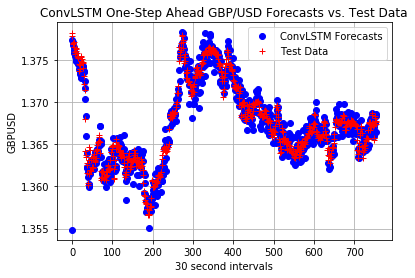

In [127]:
forecasts_ConvLSTM=np.reshape(forecasts_ConvLSTM,-1)
plt.plot(forecasts_ConvLSTM,'bo',label='ConvLSTM Forecasts')
plt.plot(raw_test,'r+',label="Test Data")
plt.xlabel('30 second intervals')
plt.ylabel('GBPUSD')
plt.title('ConvLSTM One-Step Ahead GBP/USD Forecasts vs. Test Data')
plt.legend(loc="upper right")
plt.grid(True)

In [128]:
rmse_test = np.sqrt(mean_squared_error(forecasts_ConvLSTM, raw_test))
rmse_test

0.0015676164219956025

In [129]:
mean_abs_conv_lstm=((forecasts_ConvLSTM-TWAP_test)/TWAP_test)*100.0
mean_abs_conv_lstm_=abs(mean_abs_conv_lstm)
np.mean(mean_abs_conv_lstm_)

0.077119760624617145

## Bidirectional LSTM

In [134]:
# univariate bidirectional lstm example
from numpy import array
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Bidirectional
 
# split a univariate sequence
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

In [135]:
# define input sequence
raw_seq = dfprices['TWAP OHLC Mid']
# choose a number of time steps
# define model
model = Sequential()
model.add(Bidirectional(LSTM(50, activation='relu'), input_shape=(n_steps, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
# fit model

In [136]:
forecasts_bidi=[]

In [137]:
for i in range(test_size):
    n_steps=3
    X, y = split_sequence(raw_seq[0:train_size+i], n_steps)
    n_features=1
    X=X.reshape((X.shape[0], X.shape[1], n_features))
    model.fit(X, y, epochs=30, batch_size=512,verbose=1)
    # demonstrate prediction
    x_input = raw_seq[train_size-3+i:train_size+i]
    x_input = x_input.reshape((1, n_steps, n_features))
    yhat = model.predict(x_input, verbose=0)
    forecasts_bidi.append(yhat)

Epoch 1/30
1760/1760 [==============================] - 1s 387us/step - loss: 1.6723
Epoch 2/30
1760/1760 [==============================] - 0s 18us/step - loss: 1.4693
Epoch 3/30
1760/1760 [==============================] - 0s 17us/step - loss: 1.2814
Epoch 4/30
1760/1760 [==============================] - 0s 17us/step - loss: 1.1048
Epoch 5/30
1760/1760 [==============================] - 0s 17us/step - loss: 0.9382
Epoch 6/30
1760/1760 [==============================] - 0s 21us/step - loss: 0.7829
Epoch 7/30
1760/1760 [==============================] - 0s 19us/step - loss: 0.6389
Epoch 8/30
1760/1760 [==============================] - 0s 21us/step - loss: 0.5050
Epoch 9/30
1760/1760 [==============================] - 0s 21us/step - loss: 0.3822
Epoch 10/30
1760/1760 [==============================] - 0s 19us/step - loss: 0.2722
Epoch 11/30
1760/1760 [==============================] - 0s 19us/step - loss: 0.1782
Epoch 12/30
1760/1760 [==============================] - 0s 21us/step - l

1763/1763 [==============================] - 0s 20us/step - loss: 5.1188e-06
Epoch 5/30
1763/1763 [==============================] - 0s 22us/step - loss: 5.1180e-06
Epoch 6/30
1763/1763 [==============================] - 0s 23us/step - loss: 5.1181e-06
Epoch 7/30
1763/1763 [==============================] - 0s 22us/step - loss: 5.1184e-06
Epoch 8/30
1763/1763 [==============================] - 0s 22us/step - loss: 5.1175e-06
Epoch 9/30
1763/1763 [==============================] - 0s 21us/step - loss: 5.1174e-06
Epoch 10/30
1763/1763 [==============================] - 0s 22us/step - loss: 5.1169e-06
Epoch 11/30
1763/1763 [==============================] - 0s 21us/step - loss: 5.1168e-06
Epoch 12/30
1763/1763 [==============================] - 0s 22us/step - loss: 5.1160e-06
Epoch 13/30
1763/1763 [==============================] - 0s 23us/step - loss: 5.1153e-06
Epoch 14/30
1763/1763 [==============================] - 0s 22us/step - loss: 5.1151e-06
Epoch 15/30
1763/1763 [===============

1766/1766 [==============================] - 0s 22us/step - loss: 5.0685e-06
Epoch 7/30
1766/1766 [==============================] - 0s 20us/step - loss: 5.0703e-06
Epoch 8/30
1766/1766 [==============================] - 0s 20us/step - loss: 5.0683e-06
Epoch 9/30
1766/1766 [==============================] - 0s 20us/step - loss: 5.0663e-06
Epoch 10/30
1766/1766 [==============================] - 0s 22us/step - loss: 5.0667e-06
Epoch 11/30
1766/1766 [==============================] - 0s 22us/step - loss: 5.0671e-06
Epoch 12/30
1766/1766 [==============================] - 0s 23us/step - loss: 5.0659e-06
Epoch 13/30
1766/1766 [==============================] - 0s 22us/step - loss: 5.0644e-06
Epoch 14/30
1766/1766 [==============================] - 0s 22us/step - loss: 5.0641e-06
Epoch 15/30
1766/1766 [==============================] - 0s 23us/step - loss: 5.0636e-06
Epoch 16/30
1766/1766 [==============================] - 0s 21us/step - loss: 5.0638e-06
Epoch 17/30
1766/1766 [=============

1769/1769 [==============================] - 0s 22us/step - loss: 5.0040e-06
Epoch 9/30
1769/1769 [==============================] - 0s 21us/step - loss: 5.0039e-06
Epoch 10/30
1769/1769 [==============================] - 0s 21us/step - loss: 5.0038e-06
Epoch 11/30
1769/1769 [==============================] - 0s 23us/step - loss: 5.0016e-06
Epoch 12/30
1769/1769 [==============================] - 0s 22us/step - loss: 5.0009e-06
Epoch 13/30
1769/1769 [==============================] - 0s 24us/step - loss: 5.0064e-06
Epoch 14/30
1769/1769 [==============================] - 0s 22us/step - loss: 5.0030e-06
Epoch 15/30
1769/1769 [==============================] - 0s 22us/step - loss: 4.9988e-06
Epoch 16/30
1769/1769 [==============================] - 0s 21us/step - loss: 4.9987e-06
Epoch 17/30
1769/1769 [==============================] - 0s 22us/step - loss: 5.0007e-06
Epoch 18/30
1769/1769 [==============================] - 0s 22us/step - loss: 4.9987e-06
Epoch 19/30
1769/1769 [===========

1772/1772 [==============================] - 0s 20us/step - loss: 4.9284e-06
Epoch 11/30
1772/1772 [==============================] - 0s 20us/step - loss: 4.9254e-06
Epoch 12/30
1772/1772 [==============================] - 0s 20us/step - loss: 4.9257e-06
Epoch 13/30
1772/1772 [==============================] - 0s 20us/step - loss: 4.9241e-06
Epoch 14/30
1772/1772 [==============================] - 0s 23us/step - loss: 4.9238e-06
Epoch 15/30
1772/1772 [==============================] - 0s 26us/step - loss: 4.9217e-06
Epoch 16/30
1772/1772 [==============================] - 0s 22us/step - loss: 4.9257e-06
Epoch 17/30
1772/1772 [==============================] - 0s 26us/step - loss: 4.9224e-06
Epoch 18/30
1772/1772 [==============================] - 0s 25us/step - loss: 4.9254e-06
Epoch 19/30
1772/1772 [==============================] - 0s 23us/step - loss: 4.9227e-06
Epoch 20/30
1772/1772 [==============================] - 0s 22us/step - loss: 4.9210e-06
Epoch 21/30
1772/1772 [==========

1775/1775 [==============================] - 0s 24us/step - loss: 4.8438e-06
Epoch 13/30
1775/1775 [==============================] - 0s 21us/step - loss: 4.8397e-06
Epoch 14/30
1775/1775 [==============================] - 0s 22us/step - loss: 4.8357e-06
Epoch 15/30
1775/1775 [==============================] - 0s 23us/step - loss: 4.8364e-06
Epoch 16/30
1775/1775 [==============================] - 0s 23us/step - loss: 4.8350e-06
Epoch 17/30
1775/1775 [==============================] - 0s 24us/step - loss: 4.8344e-06
Epoch 18/30
1775/1775 [==============================] - 0s 25us/step - loss: 4.8321e-06
Epoch 19/30
1775/1775 [==============================] - 0s 24us/step - loss: 4.8328e-06
Epoch 20/30
1775/1775 [==============================] - 0s 23us/step - loss: 4.8320e-06
Epoch 21/30
1775/1775 [==============================] - 0s 23us/step - loss: 4.8305e-06
Epoch 22/30
1775/1775 [==============================] - 0s 24us/step - loss: 4.8294e-06
Epoch 23/30
1775/1775 [==========

1778/1778 [==============================] - 0s 21us/step - loss: 4.7413e-06
Epoch 15/30
1778/1778 [==============================] - 0s 22us/step - loss: 4.7406e-06
Epoch 16/30
1778/1778 [==============================] - 0s 21us/step - loss: 4.7429e-06
Epoch 17/30
1778/1778 [==============================] - 0s 22us/step - loss: 4.7449e-06
Epoch 18/30
1778/1778 [==============================] - 0s 26us/step - loss: 4.7380e-06
Epoch 19/30
1778/1778 [==============================] - 0s 28us/step - loss: 4.7390e-06
Epoch 20/30
1778/1778 [==============================] - 0s 27us/step - loss: 4.7387e-06
Epoch 21/30
1778/1778 [==============================] - 0s 26us/step - loss: 4.7384e-06
Epoch 22/30
1778/1778 [==============================] - 0s 23us/step - loss: 4.7344e-06
Epoch 23/30
1778/1778 [==============================] - 0s 21us/step - loss: 4.7370e-06
Epoch 24/30
1778/1778 [==============================] - 0s 23us/step - loss: 4.7286e-06
Epoch 25/30
1778/1778 [==========

1781/1781 [==============================] - 0s 28us/step - loss: 4.6407e-06
Epoch 17/30
1781/1781 [==============================] - 0s 26us/step - loss: 4.6412e-06
Epoch 18/30
1781/1781 [==============================] - 0s 26us/step - loss: 4.6400e-06
Epoch 19/30
1781/1781 [==============================] - 0s 25us/step - loss: 4.6415e-06
Epoch 20/30
1781/1781 [==============================] - 0s 24us/step - loss: 4.6410e-06
Epoch 21/30
1781/1781 [==============================] - 0s 25us/step - loss: 4.6356e-06
Epoch 22/30
1781/1781 [==============================] - 0s 25us/step - loss: 4.6399e-06
Epoch 23/30
1781/1781 [==============================] - 0s 22us/step - loss: 4.6345e-06
Epoch 24/30
1781/1781 [==============================] - 0s 25us/step - loss: 4.6383e-06
Epoch 25/30
1781/1781 [==============================] - 0s 24us/step - loss: 4.6329e-06
Epoch 26/30
1781/1781 [==============================] - 0s 24us/step - loss: 4.6347e-06
Epoch 27/30
1781/1781 [==========

1784/1784 [==============================] - 0s 22us/step - loss: 4.5398e-06
Epoch 19/30
1784/1784 [==============================] - 0s 25us/step - loss: 4.5476e-06
Epoch 20/30
1784/1784 [==============================] - 0s 22us/step - loss: 4.5434e-06
Epoch 21/30
1784/1784 [==============================] - 0s 25us/step - loss: 4.5412e-06
Epoch 22/30
1784/1784 [==============================] - 0s 22us/step - loss: 4.5410e-06
Epoch 23/30
1784/1784 [==============================] - 0s 21us/step - loss: 4.5411e-06
Epoch 24/30
1784/1784 [==============================] - 0s 20us/step - loss: 4.5309e-06
Epoch 25/30
1784/1784 [==============================] - 0s 22us/step - loss: 4.5560e-06
Epoch 26/30
1784/1784 [==============================] - 0s 22us/step - loss: 4.5462e-06
Epoch 27/30
1784/1784 [==============================] - 0s 21us/step - loss: 4.5417e-06
Epoch 28/30
1784/1784 [==============================] - 0s 23us/step - loss: 4.5306e-06
Epoch 29/30
1784/1784 [==========

1787/1787 [==============================] - 0s 22us/step - loss: 4.4367e-06
Epoch 21/30
1787/1787 [==============================] - 0s 25us/step - loss: 4.4415e-06
Epoch 22/30
1787/1787 [==============================] - 0s 22us/step - loss: 4.4428e-06
Epoch 23/30
1787/1787 [==============================] - 0s 22us/step - loss: 4.4370e-06
Epoch 24/30
1787/1787 [==============================] - 0s 23us/step - loss: 4.4410e-06
Epoch 25/30
1787/1787 [==============================] - 0s 28us/step - loss: 4.4352e-06
Epoch 26/30
1787/1787 [==============================] - 0s 25us/step - loss: 4.4372e-06
Epoch 27/30
1787/1787 [==============================] - 0s 23us/step - loss: 4.4329e-06
Epoch 28/30
1787/1787 [==============================] - 0s 25us/step - loss: 4.4310e-06
Epoch 29/30
1787/1787 [==============================] - 0s 21us/step - loss: 4.4287e-06
Epoch 30/30
1787/1787 [==============================] - 0s 23us/step - loss: 4.4290e-06
Epoch 1/30
1788/1788 [===========

1790/1790 [==============================] - 0s 24us/step - loss: 4.3487e-06
Epoch 23/30
1790/1790 [==============================] - 0s 26us/step - loss: 4.3424e-06
Epoch 24/30
1790/1790 [==============================] - 0s 25us/step - loss: 4.3448e-06
Epoch 25/30
1790/1790 [==============================] - 0s 23us/step - loss: 4.3459e-06
Epoch 26/30
1790/1790 [==============================] - 0s 23us/step - loss: 4.3514e-06
Epoch 27/30
1790/1790 [==============================] - 0s 23us/step - loss: 4.3444e-06
Epoch 28/30
1790/1790 [==============================] - 0s 24us/step - loss: 4.3463e-06
Epoch 29/30
1790/1790 [==============================] - 0s 23us/step - loss: 4.3369e-06
Epoch 30/30
1790/1790 [==============================] - 0s 24us/step - loss: 4.3388e-06
Epoch 1/30
1791/1791 [==============================] - 0s 18us/step - loss: 4.3347e-06
Epoch 2/30
1791/1791 [==============================] - 0s 19us/step - loss: 4.3435e-06
Epoch 3/30
1791/1791 [=============

1793/1793 [==============================] - 0s 22us/step - loss: 4.2725e-06
Epoch 25/30
1793/1793 [==============================] - 0s 22us/step - loss: 4.2806e-06
Epoch 26/30
1793/1793 [==============================] - 0s 22us/step - loss: 4.2737e-06
Epoch 27/30
1793/1793 [==============================] - 0s 23us/step - loss: 4.2732e-06
Epoch 28/30
1793/1793 [==============================] - 0s 23us/step - loss: 4.2808e-06
Epoch 29/30
1793/1793 [==============================] - 0s 21us/step - loss: 4.2943e-06
Epoch 30/30
1793/1793 [==============================] - 0s 23us/step - loss: 4.2793e-06
Epoch 1/30
1794/1794 [==============================] - 0s 19us/step - loss: 4.2894e-06
Epoch 2/30
1794/1794 [==============================] - 0s 22us/step - loss: 4.3206e-06
Epoch 3/30
1794/1794 [==============================] - 0s 21us/step - loss: 4.2990e-06
Epoch 4/30
1794/1794 [==============================] - 0s 20us/step - loss: 4.3232e-06
Epoch 5/30
1794/1794 [===============

1796/1796 [==============================] - 0s 21us/step - loss: 4.2802e-06
Epoch 27/30
1796/1796 [==============================] - 0s 21us/step - loss: 4.2853e-06
Epoch 28/30
1796/1796 [==============================] - 0s 21us/step - loss: 4.2692e-06
Epoch 29/30
1796/1796 [==============================] - 0s 20us/step - loss: 4.2383e-06
Epoch 30/30
1796/1796 [==============================] - 0s 22us/step - loss: 4.2436e-06
Epoch 1/30
1797/1797 [==============================] - 0s 18us/step - loss: 4.2522e-06
Epoch 2/30
1797/1797 [==============================] - 0s 18us/step - loss: 4.2474e-06
Epoch 3/30
1797/1797 [==============================] - 0s 20us/step - loss: 4.2464e-06
Epoch 4/30
1797/1797 [==============================] - 0s 19us/step - loss: 4.2412e-06
Epoch 5/30
1797/1797 [==============================] - 0s 19us/step - loss: 4.2462e-06
Epoch 6/30
1797/1797 [==============================] - 0s 19us/step - loss: 4.2332e-06
Epoch 7/30
1797/1797 [=================

1799/1799 [==============================] - 0s 25us/step - loss: 4.2004e-06
Epoch 29/30
1799/1799 [==============================] - 0s 25us/step - loss: 4.2023e-06
Epoch 30/30
1799/1799 [==============================] - 0s 27us/step - loss: 4.2216e-06
Epoch 1/30
1800/1800 [==============================] - 0s 20us/step - loss: 4.1973e-06
Epoch 2/30
1800/1800 [==============================] - 0s 23us/step - loss: 4.1944e-06
Epoch 3/30
1800/1800 [==============================] - 0s 28us/step - loss: 4.1932e-06
Epoch 4/30
1800/1800 [==============================] - 0s 24us/step - loss: 4.2130e-06
Epoch 5/30
1800/1800 [==============================] - 0s 23us/step - loss: 4.2385e-06
Epoch 6/30
1800/1800 [==============================] - 0s 24us/step - loss: 4.2411e-06
Epoch 7/30
1800/1800 [==============================] - 0s 27us/step - loss: 4.2383e-06
Epoch 8/30
1800/1800 [==============================] - 0s 26us/step - loss: 4.2083e-06
Epoch 9/30
1800/1800 [===================

1802/1802 [==============================] - 0s 23us/step - loss: 4.1983e-06
Epoch 1/30
1803/1803 [==============================] - 0s 18us/step - loss: 4.1788e-06
Epoch 2/30
1803/1803 [==============================] - 0s 21us/step - loss: 4.2349e-06
Epoch 3/30
1803/1803 [==============================] - 0s 19us/step - loss: 4.1698e-06
Epoch 4/30
1803/1803 [==============================] - 0s 20us/step - loss: 4.1769e-06
Epoch 5/30
1803/1803 [==============================] - 0s 23us/step - loss: 4.1940e-06
Epoch 6/30
1803/1803 [==============================] - 0s 21us/step - loss: 4.1611e-06
Epoch 7/30
1803/1803 [==============================] - 0s 20us/step - loss: 4.1530e-06
Epoch 8/30
1803/1803 [==============================] - 0s 23us/step - loss: 4.2111e-06
Epoch 9/30
1803/1803 [==============================] - 0s 24us/step - loss: 4.1914e-06
Epoch 10/30
1803/1803 [==============================] - 0s 23us/step - loss: 4.1519e-06
Epoch 11/30
1803/1803 [===================

1806/1806 [==============================] - 0s 23us/step - loss: 4.1418e-06
Epoch 3/30
1806/1806 [==============================] - 0s 25us/step - loss: 4.1397e-06
Epoch 4/30
1806/1806 [==============================] - 0s 22us/step - loss: 4.1458e-06
Epoch 5/30
1806/1806 [==============================] - 0s 23us/step - loss: 4.1634e-06
Epoch 6/30
1806/1806 [==============================] - 0s 23us/step - loss: 4.1257e-06
Epoch 7/30
1806/1806 [==============================] - 0s 26us/step - loss: 4.2055e-06
Epoch 8/30
1806/1806 [==============================] - 0s 23us/step - loss: 4.2013e-06
Epoch 9/30
1806/1806 [==============================] - 0s 26us/step - loss: 4.1793e-06
Epoch 10/30
1806/1806 [==============================] - 0s 23us/step - loss: 4.2044e-06
Epoch 11/30
1806/1806 [==============================] - 0s 25us/step - loss: 4.1636e-06
Epoch 12/30
1806/1806 [==============================] - 0s 27us/step - loss: 4.2436e-06
Epoch 13/30
1806/1806 [=================

1809/1809 [==============================] - 0s 19us/step - loss: 4.1839e-06
Epoch 5/30
1809/1809 [==============================] - 0s 19us/step - loss: 4.1519e-06
Epoch 6/30
1809/1809 [==============================] - 0s 19us/step - loss: 4.1556e-06
Epoch 7/30
1809/1809 [==============================] - 0s 21us/step - loss: 4.1352e-06
Epoch 8/30
1809/1809 [==============================] - 0s 26us/step - loss: 4.1532e-06
Epoch 9/30
1809/1809 [==============================] - 0s 21us/step - loss: 4.2091e-06
Epoch 10/30
1809/1809 [==============================] - 0s 24us/step - loss: 4.1143e-06
Epoch 11/30
1809/1809 [==============================] - 0s 26us/step - loss: 4.1534e-06
Epoch 12/30
1809/1809 [==============================] - 0s 24us/step - loss: 4.1219e-06
Epoch 13/30
1809/1809 [==============================] - 0s 20us/step - loss: 4.1246e-06
Epoch 14/30
1809/1809 [==============================] - 0s 22us/step - loss: 4.1456e-06
Epoch 15/30
1809/1809 [===============

1812/1812 [==============================] - 0s 23us/step - loss: 4.2252e-06
Epoch 7/30
1812/1812 [==============================] - ETA: 0s - loss: 3.6722e-0 - 0s 25us/step - loss: 4.2734e-06
Epoch 8/30
1812/1812 [==============================] - 0s 24us/step - loss: 4.2317e-06
Epoch 9/30
1812/1812 [==============================] - 0s 24us/step - loss: 4.3389e-06
Epoch 10/30
1812/1812 [==============================] - 0s 24us/step - loss: 4.1289e-06
Epoch 11/30
1812/1812 [==============================] - 0s 25us/step - loss: 4.2171e-06
Epoch 12/30
1812/1812 [==============================] - 0s 26us/step - loss: 4.1968e-06
Epoch 13/30
1812/1812 [==============================] - 0s 25us/step - loss: 4.2140e-06
Epoch 14/30
1812/1812 [==============================] - 0s 28us/step - loss: 4.1299e-06
Epoch 15/30
1812/1812 [==============================] - 0s 24us/step - loss: 4.1737e-06
Epoch 16/30
1812/1812 [==============================] - 0s 23us/step - loss: 4.2344e-06
Epoch 17

1815/1815 [==============================] - 0s 27us/step - loss: 4.5705e-06
Epoch 9/30
1815/1815 [==============================] - 0s 23us/step - loss: 4.5135e-06
Epoch 10/30
1815/1815 [==============================] - 0s 23us/step - loss: 4.4028e-06
Epoch 11/30
1815/1815 [==============================] - 0s 24us/step - loss: 4.2478e-06
Epoch 12/30
1815/1815 [==============================] - 0s 27us/step - loss: 4.1635e-06
Epoch 13/30
1815/1815 [==============================] - 0s 22us/step - loss: 4.1207e-06
Epoch 14/30
1815/1815 [==============================] - 0s 24us/step - loss: 4.1306e-06
Epoch 15/30
1815/1815 [==============================] - 0s 26us/step - loss: 4.1165e-06
Epoch 16/30
1815/1815 [==============================] - 0s 25us/step - loss: 4.2957e-06
Epoch 17/30
1815/1815 [==============================] - 0s 24us/step - loss: 4.2103e-06
Epoch 18/30
1815/1815 [==============================] - 0s 25us/step - loss: 4.3090e-06
Epoch 19/30
1815/1815 [===========

1818/1818 [==============================] - 0s 25us/step - loss: 4.3473e-06
Epoch 11/30
1818/1818 [==============================] - 0s 28us/step - loss: 4.2570e-06
Epoch 12/30
1818/1818 [==============================] - 0s 25us/step - loss: 4.2949e-06
Epoch 13/30
1818/1818 [==============================] - 0s 26us/step - loss: 4.1851e-06
Epoch 14/30
1818/1818 [==============================] - 0s 22us/step - loss: 4.1237e-06
Epoch 15/30
1818/1818 [==============================] - 0s 23us/step - loss: 4.1544e-06
Epoch 16/30
1818/1818 [==============================] - 0s 26us/step - loss: 4.0959e-06
Epoch 17/30
1818/1818 [==============================] - 0s 23us/step - loss: 4.1311e-06
Epoch 18/30
1818/1818 [==============================] - 0s 23us/step - loss: 4.1455e-06
Epoch 19/30
1818/1818 [==============================] - 0s 23us/step - loss: 4.2080e-06
Epoch 20/30
1818/1818 [==============================] - 0s 21us/step - loss: 4.1332e-06
Epoch 21/30
1818/1818 [==========

1821/1821 [==============================] - 0s 25us/step - loss: 4.0925e-06
Epoch 13/30
1821/1821 [==============================] - 0s 26us/step - loss: 4.1138e-06
Epoch 14/30
1821/1821 [==============================] - 0s 24us/step - loss: 4.1396e-06
Epoch 15/30
1821/1821 [==============================] - 0s 24us/step - loss: 4.1929e-06
Epoch 16/30
1821/1821 [==============================] - 0s 24us/step - loss: 4.2442e-06
Epoch 17/30
1821/1821 [==============================] - 0s 22us/step - loss: 4.1436e-06
Epoch 18/30
1821/1821 [==============================] - 0s 23us/step - loss: 4.1058e-06
Epoch 19/30
1821/1821 [==============================] - 0s 23us/step - loss: 4.1307e-06
Epoch 20/30
1821/1821 [==============================] - 0s 25us/step - loss: 4.1141e-06
Epoch 21/30
1821/1821 [==============================] - 0s 25us/step - loss: 4.1365e-06
Epoch 22/30
1821/1821 [==============================] - 0s 24us/step - loss: 4.1105e-06
Epoch 23/30
1821/1821 [==========

1824/1824 [==============================] - 0s 21us/step - loss: 4.1198e-06
Epoch 15/30
1824/1824 [==============================] - 0s 23us/step - loss: 4.0976e-06
Epoch 16/30
1824/1824 [==============================] - 0s 22us/step - loss: 4.3755e-06
Epoch 17/30
1824/1824 [==============================] - 0s 20us/step - loss: 4.3233e-06
Epoch 18/30
1824/1824 [==============================] - 0s 21us/step - loss: 4.1710e-06
Epoch 19/30
1824/1824 [==============================] - 0s 23us/step - loss: 4.2761e-06
Epoch 20/30
1824/1824 [==============================] - 0s 22us/step - loss: 4.5050e-06
Epoch 21/30
1824/1824 [==============================] - 0s 23us/step - loss: 4.5074e-06
Epoch 22/30
1824/1824 [==============================] - 0s 23us/step - loss: 4.6593e-06
Epoch 23/30
1824/1824 [==============================] - 0s 21us/step - loss: 4.5377e-06
Epoch 24/30
1824/1824 [==============================] - 0s 22us/step - loss: 4.6890e-06
Epoch 25/30
1824/1824 [==========

1827/1827 [==============================] - 0s 25us/step - loss: 4.1811e-06
Epoch 17/30
1827/1827 [==============================] - 0s 22us/step - loss: 4.1169e-06
Epoch 18/30
1827/1827 [==============================] - 0s 23us/step - loss: 4.0950e-06
Epoch 19/30
1827/1827 [==============================] - 0s 24us/step - loss: 4.1949e-06
Epoch 20/30
1827/1827 [==============================] - 0s 28us/step - loss: 4.2386e-06
Epoch 21/30
1827/1827 [==============================] - 0s 29us/step - loss: 4.3293e-06
Epoch 22/30
1827/1827 [==============================] - 0s 25us/step - loss: 4.0930e-06
Epoch 23/30
1827/1827 [==============================] - 0s 22us/step - loss: 4.4980e-06
Epoch 24/30
1827/1827 [==============================] - 0s 24us/step - loss: 4.1136e-06
Epoch 25/30
1827/1827 [==============================] - 0s 25us/step - loss: 4.2572e-06
Epoch 26/30
1827/1827 [==============================] - 0s 23us/step - loss: 4.0569e-06
Epoch 27/30
1827/1827 [==========

1830/1830 [==============================] - 0s 21us/step - loss: 4.7033e-06
Epoch 19/30
1830/1830 [==============================] - 0s 22us/step - loss: 4.3911e-06
Epoch 20/30
1830/1830 [==============================] - 0s 21us/step - loss: 4.2654e-06
Epoch 21/30
1830/1830 [==============================] - 0s 22us/step - loss: 4.9187e-06
Epoch 22/30
1830/1830 [==============================] - 0s 22us/step - loss: 5.3648e-06
Epoch 23/30
1830/1830 [==============================] - 0s 22us/step - loss: 4.7596e-06
Epoch 24/30
1830/1830 [==============================] - 0s 21us/step - loss: 4.8672e-06
Epoch 25/30
1830/1830 [==============================] - 0s 22us/step - loss: 4.8190e-06
Epoch 26/30
1830/1830 [==============================] - 0s 23us/step - loss: 6.7588e-06
Epoch 27/30
1830/1830 [==============================] - 0s 22us/step - loss: 5.4558e-06
Epoch 28/30
1830/1830 [==============================] - 0s 22us/step - loss: 4.9220e-06
Epoch 29/30
1830/1830 [==========

1833/1833 [==============================] - 0s 22us/step - loss: 4.4054e-06
Epoch 21/30
1833/1833 [==============================] - 0s 22us/step - loss: 4.7888e-06
Epoch 22/30
1833/1833 [==============================] - 0s 21us/step - loss: 4.5262e-06
Epoch 23/30
1833/1833 [==============================] - 0s 21us/step - loss: 4.5984e-06
Epoch 24/30
1833/1833 [==============================] - 0s 22us/step - loss: 5.7527e-06
Epoch 25/30
1833/1833 [==============================] - 0s 21us/step - loss: 4.7913e-06
Epoch 26/30
1833/1833 [==============================] - 0s 22us/step - loss: 4.2791e-06
Epoch 27/30
1833/1833 [==============================] - 0s 22us/step - loss: 5.0369e-06
Epoch 28/30
1833/1833 [==============================] - 0s 21us/step - loss: 5.1931e-06
Epoch 29/30
1833/1833 [==============================] - 0s 22us/step - loss: 4.8386e-06
Epoch 30/30
1833/1833 [==============================] - 0s 22us/step - loss: 4.5668e-06
Epoch 1/30
1834/1834 [===========

1836/1836 [==============================] - 0s 24us/step - loss: 5.0937e-06
Epoch 23/30
1836/1836 [==============================] - 0s 27us/step - loss: 4.7065e-06
Epoch 24/30
1836/1836 [==============================] - 0s 25us/step - loss: 5.3944e-06
Epoch 25/30
1836/1836 [==============================] - 0s 22us/step - loss: 4.7951e-06
Epoch 26/30
1836/1836 [==============================] - 0s 24us/step - loss: 4.9203e-06
Epoch 27/30
1836/1836 [==============================] - 0s 26us/step - loss: 4.6547e-06
Epoch 28/30
1836/1836 [==============================] - 0s 22us/step - loss: 4.8826e-06
Epoch 29/30
1836/1836 [==============================] - 0s 24us/step - loss: 4.8076e-06
Epoch 30/30
1836/1836 [==============================] - 0s 24us/step - loss: 5.0076e-06
Epoch 1/30
1837/1837 [==============================] - 0s 19us/step - loss: 4.5705e-06
Epoch 2/30
1837/1837 [==============================] - 0s 18us/step - loss: 4.5718e-06
Epoch 3/30
1837/1837 [=============

1839/1839 [==============================] - 0s 25us/step - loss: 7.5505e-06
Epoch 25/30
1839/1839 [==============================] - 0s 25us/step - loss: 5.6659e-06
Epoch 26/30
1839/1839 [==============================] - 0s 24us/step - loss: 7.9226e-06
Epoch 27/30
1839/1839 [==============================] - 0s 24us/step - loss: 5.6638e-06
Epoch 28/30
1839/1839 [==============================] - 0s 28us/step - loss: 5.6447e-06
Epoch 29/30
1839/1839 [==============================] - 0s 24us/step - loss: 4.9397e-06
Epoch 30/30
1839/1839 [==============================] - 0s 22us/step - loss: 4.5806e-06
Epoch 1/30
1840/1840 [==============================] - 0s 19us/step - loss: 5.7175e-06
Epoch 2/30
1840/1840 [==============================] - 0s 22us/step - loss: 5.6935e-06
Epoch 3/30
1840/1840 [==============================] - 0s 22us/step - loss: 5.6698e-06
Epoch 4/30
1840/1840 [==============================] - 0s 20us/step - loss: 4.3663e-06
Epoch 5/30
1840/1840 [===============

1842/1842 [==============================] - 0s 23us/step - loss: 5.8614e-06
Epoch 27/30
1842/1842 [==============================] - 0s 22us/step - loss: 4.3701e-06
Epoch 28/30
1842/1842 [==============================] - 0s 20us/step - loss: 4.0588e-06
Epoch 29/30
1842/1842 [==============================] - 0s 26us/step - loss: 5.0888e-06
Epoch 30/30
1842/1842 [==============================] - 0s 27us/step - loss: 5.2707e-06
Epoch 1/30
1843/1843 [==============================] - 0s 19us/step - loss: 5.8926e-06
Epoch 2/30
1843/1843 [==============================] - 0s 24us/step - loss: 5.2994e-06
Epoch 3/30
1843/1843 [==============================] - 0s 24us/step - loss: 5.8932e-06
Epoch 4/30
1843/1843 [==============================] - 0s 25us/step - loss: 4.7328e-06
Epoch 5/30
1843/1843 [==============================] - 0s 21us/step - loss: 5.5170e-06
Epoch 6/30
1843/1843 [==============================] - 0s 23us/step - loss: 4.9151e-06
Epoch 7/30
1843/1843 [=================

1845/1845 [==============================] - 0s 24us/step - loss: 8.4554e-06
Epoch 29/30
1845/1845 [==============================] - 0s 24us/step - loss: 6.1656e-06
Epoch 30/30
1845/1845 [==============================] - 0s 21us/step - loss: 5.1264e-06
Epoch 1/30
1846/1846 [==============================] - 0s 21us/step - loss: 4.9231e-06
Epoch 2/30
1846/1846 [==============================] - 0s 23us/step - loss: 5.5963e-06
Epoch 3/30
1846/1846 [==============================] - 0s 23us/step - loss: 6.0839e-06
Epoch 4/30
1846/1846 [==============================] - 0s 23us/step - loss: 5.3580e-06
Epoch 5/30
1846/1846 [==============================] - 0s 24us/step - loss: 4.6208e-06
Epoch 6/30
1846/1846 [==============================] - 0s 22us/step - loss: 4.4621e-06
Epoch 7/30
1846/1846 [==============================] - 0s 23us/step - loss: 4.2998e-06
Epoch 8/30
1846/1846 [==============================] - 0s 24us/step - loss: 4.5684e-06
Epoch 9/30
1846/1846 [===================

1848/1848 [==============================] - 0s 24us/step - loss: 5.2956e-06
Epoch 1/30
1849/1849 [==============================] - 0s 20us/step - loss: 5.9588e-06
Epoch 2/30
1849/1849 [==============================] - 0s 25us/step - loss: 4.2878e-06
Epoch 3/30
1849/1849 [==============================] - 0s 23us/step - loss: 4.1502e-06
Epoch 4/30
1849/1849 [==============================] - 0s 26us/step - loss: 4.0846e-06
Epoch 5/30
1849/1849 [==============================] - 0s 25us/step - loss: 4.2622e-06
Epoch 6/30
1849/1849 [==============================] - 0s 25us/step - loss: 4.6128e-06
Epoch 7/30
1849/1849 [==============================] - 0s 23us/step - loss: 4.4019e-06
Epoch 8/30
1849/1849 [==============================] - 0s 24us/step - loss: 4.6884e-06
Epoch 9/30
1849/1849 [==============================] - 0s 23us/step - loss: 4.1071e-06
Epoch 10/30
1849/1849 [==============================] - 0s 25us/step - loss: 4.0393e-06
Epoch 11/30
1849/1849 [===================

1852/1852 [==============================] - 0s 19us/step - loss: 6.4465e-06
Epoch 3/30
1852/1852 [==============================] - 0s 18us/step - loss: 4.9491e-06
Epoch 4/30
1852/1852 [==============================] - 0s 19us/step - loss: 5.2110e-06
Epoch 5/30
1852/1852 [==============================] - 0s 20us/step - loss: 6.1735e-06
Epoch 6/30
1852/1852 [==============================] - 0s 22us/step - loss: 6.6337e-06
Epoch 7/30
1852/1852 [==============================] - ETA: 0s - loss: 8.8639e-0 - 0s 25us/step - loss: 6.3895e-06
Epoch 8/30
1852/1852 [==============================] - 0s 24us/step - loss: 6.4795e-06
Epoch 9/30
1852/1852 [==============================] - 0s 25us/step - loss: 5.6060e-06
Epoch 10/30
1852/1852 [==============================] - 0s 24us/step - loss: 5.9082e-06
Epoch 11/30
1852/1852 [==============================] - 0s 22us/step - loss: 5.1968e-06
Epoch 12/30
1852/1852 [==============================] - 0s 22us/step - loss: 4.5817e-06
Epoch 13/30


1855/1855 [==============================] - 0s 23us/step - loss: 7.2859e-06
Epoch 4/30
1855/1855 [==============================] - 0s 23us/step - loss: 6.1661e-06
Epoch 5/30
1855/1855 [==============================] - 0s 25us/step - loss: 5.5732e-06
Epoch 6/30
1855/1855 [==============================] - 0s 23us/step - loss: 5.2760e-06
Epoch 7/30
1855/1855 [==============================] - 0s 23us/step - loss: 4.9463e-06
Epoch 8/30
1855/1855 [==============================] - 0s 23us/step - loss: 4.9725e-06
Epoch 9/30
1855/1855 [==============================] - 0s 23us/step - loss: 4.8288e-06
Epoch 10/30
1855/1855 [==============================] - 0s 23us/step - loss: 4.9697e-06
Epoch 11/30
1855/1855 [==============================] - 0s 24us/step - loss: 4.3671e-06
Epoch 12/30
1855/1855 [==============================] - 0s 28us/step - loss: 4.6106e-06
Epoch 13/30
1855/1855 [==============================] - 0s 26us/step - loss: 4.5565e-06
Epoch 14/30
1855/1855 [================

1858/1858 [==============================] - 0s 25us/step - loss: 4.6443e-06
Epoch 6/30
1858/1858 [==============================] - 0s 24us/step - loss: 4.0894e-06
Epoch 7/30
1858/1858 [==============================] - 0s 24us/step - loss: 4.0507e-06
Epoch 8/30
1858/1858 [==============================] - 0s 23us/step - loss: 4.2655e-06
Epoch 9/30
1858/1858 [==============================] - 0s 23us/step - loss: 4.2865e-06
Epoch 10/30
1858/1858 [==============================] - 0s 23us/step - loss: 4.2537e-06
Epoch 11/30
1858/1858 [==============================] - 0s 23us/step - loss: 4.9565e-06
Epoch 12/30
1858/1858 [==============================] - 0s 25us/step - loss: 4.7896e-06
Epoch 13/30
1858/1858 [==============================] - 0s 25us/step - loss: 5.1401e-06
Epoch 14/30
1858/1858 [==============================] - 0s 25us/step - loss: 5.3319e-06
Epoch 15/30
1858/1858 [==============================] - 0s 26us/step - loss: 5.7702e-06
Epoch 16/30
1858/1858 [==============

1861/1861 [==============================] - 0s 25us/step - loss: 4.0627e-06
Epoch 8/30
1861/1861 [==============================] - 0s 22us/step - loss: 4.0503e-06
Epoch 9/30
1861/1861 [==============================] - 0s 23us/step - loss: 4.0483e-06
Epoch 10/30
1861/1861 [==============================] - 0s 22us/step - loss: 3.9590e-06
Epoch 11/30
1861/1861 [==============================] - 0s 25us/step - loss: 4.1943e-06
Epoch 12/30
1861/1861 [==============================] - 0s 23us/step - loss: 3.9513e-06
Epoch 13/30
1861/1861 [==============================] - 0s 22us/step - loss: 4.1629e-06
Epoch 14/30
1861/1861 [==============================] - 0s 24us/step - loss: 4.6805e-06
Epoch 15/30
1861/1861 [==============================] - 0s 24us/step - loss: 4.3526e-06
Epoch 16/30
1861/1861 [==============================] - 0s 21us/step - loss: 4.5516e-06
Epoch 17/30
1861/1861 [==============================] - 0s 20us/step - loss: 5.5901e-06
Epoch 18/30
1861/1861 [============

1864/1864 [==============================] - 0s 22us/step - loss: 5.0990e-06
Epoch 10/30
1864/1864 [==============================] - 0s 25us/step - loss: 5.4748e-06
Epoch 11/30
1864/1864 [==============================] - 0s 24us/step - loss: 5.9281e-06
Epoch 12/30
1864/1864 [==============================] - 0s 21us/step - loss: 5.0681e-06
Epoch 13/30
1864/1864 [==============================] - 0s 21us/step - loss: 4.7644e-06
Epoch 14/30
1864/1864 [==============================] - 0s 22us/step - loss: 4.1527e-06
Epoch 15/30
1864/1864 [==============================] - 0s 19us/step - loss: 4.8345e-06
Epoch 16/30
1864/1864 [==============================] - 0s 21us/step - loss: 5.9296e-06
Epoch 17/30
1864/1864 [==============================] - 0s 25us/step - loss: 5.2277e-06
Epoch 18/30
1864/1864 [==============================] - 0s 25us/step - loss: 5.7522e-06
Epoch 19/30
1864/1864 [==============================] - 0s 22us/step - loss: 5.4694e-06
Epoch 20/30
1864/1864 [==========

1867/1867 [==============================] - 0s 22us/step - loss: 5.8710e-06
Epoch 12/30
1867/1867 [==============================] - 0s 21us/step - loss: 5.4135e-06
Epoch 13/30
1867/1867 [==============================] - 0s 21us/step - loss: 4.6112e-06
Epoch 14/30
1867/1867 [==============================] - 0s 22us/step - loss: 4.3366e-06
Epoch 15/30
1867/1867 [==============================] - 0s 21us/step - loss: 4.2283e-06
Epoch 16/30
1867/1867 [==============================] - 0s 24us/step - loss: 4.2672e-06
Epoch 17/30
1867/1867 [==============================] - 0s 22us/step - loss: 4.1611e-06
Epoch 18/30
1867/1867 [==============================] - 0s 22us/step - loss: 5.6630e-06
Epoch 19/30
1867/1867 [==============================] - 0s 20us/step - loss: 4.7802e-06
Epoch 20/30
1867/1867 [==============================] - 0s 22us/step - loss: 5.8411e-06
Epoch 21/30
1867/1867 [==============================] - 0s 22us/step - loss: 5.8104e-06
Epoch 22/30
1867/1867 [==========

1870/1870 [==============================] - 0s 21us/step - loss: 5.1118e-06
Epoch 14/30
1870/1870 [==============================] - 0s 19us/step - loss: 5.6140e-06
Epoch 15/30
1870/1870 [==============================] - 0s 21us/step - loss: 4.2500e-06
Epoch 16/30
1870/1870 [==============================] - 0s 20us/step - loss: 4.8582e-06
Epoch 17/30
1870/1870 [==============================] - 0s 21us/step - loss: 4.4437e-06
Epoch 18/30
1870/1870 [==============================] - 0s 22us/step - loss: 4.2246e-06
Epoch 19/30
1870/1870 [==============================] - 0s 25us/step - loss: 4.4433e-06
Epoch 20/30
1870/1870 [==============================] - 0s 21us/step - loss: 4.5274e-06
Epoch 21/30
1870/1870 [==============================] - 0s 20us/step - loss: 4.3905e-06
Epoch 22/30
1870/1870 [==============================] - 0s 19us/step - loss: 4.4801e-06
Epoch 23/30
1870/1870 [==============================] - 0s 21us/step - loss: 9.6016e-06
Epoch 24/30
1870/1870 [==========

1873/1873 [==============================] - 0s 23us/step - loss: 4.1558e-06
Epoch 16/30
1873/1873 [==============================] - 0s 24us/step - loss: 4.5382e-06
Epoch 17/30
1873/1873 [==============================] - 0s 24us/step - loss: 4.0328e-06
Epoch 18/30
1873/1873 [==============================] - 0s 23us/step - loss: 4.4878e-06
Epoch 19/30
1873/1873 [==============================] - 0s 22us/step - loss: 4.6988e-06
Epoch 20/30
1873/1873 [==============================] - 0s 23us/step - loss: 6.1221e-06
Epoch 21/30
1873/1873 [==============================] - 0s 24us/step - loss: 6.4576e-06
Epoch 22/30
1873/1873 [==============================] - 0s 23us/step - loss: 6.2940e-06
Epoch 23/30
1873/1873 [==============================] - 0s 23us/step - loss: 7.2930e-06
Epoch 24/30
1873/1873 [==============================] - 0s 21us/step - loss: 5.1498e-06
Epoch 25/30
1873/1873 [==============================] - 0s 23us/step - loss: 4.2550e-06
Epoch 26/30
1873/1873 [==========

1876/1876 [==============================] - 0s 22us/step - loss: 5.4194e-06
Epoch 18/30
1876/1876 [==============================] - 0s 22us/step - loss: 4.8102e-06
Epoch 19/30
1876/1876 [==============================] - 0s 21us/step - loss: 4.1091e-06
Epoch 20/30
1876/1876 [==============================] - 0s 22us/step - loss: 4.1739e-06
Epoch 21/30
1876/1876 [==============================] - 0s 20us/step - loss: 4.6264e-06
Epoch 22/30
1876/1876 [==============================] - 0s 21us/step - loss: 4.1088e-06
Epoch 23/30
1876/1876 [==============================] - 0s 22us/step - loss: 3.9572e-06
Epoch 24/30
1876/1876 [==============================] - 0s 22us/step - loss: 3.9879e-06
Epoch 25/30
1876/1876 [==============================] - 0s 21us/step - loss: 4.0164e-06
Epoch 26/30
1876/1876 [==============================] - 0s 24us/step - loss: 3.9238e-06
Epoch 27/30
1876/1876 [==============================] - 0s 22us/step - loss: 4.1025e-06
Epoch 28/30
1876/1876 [==========

1879/1879 [==============================] - 0s 25us/step - loss: 4.3690e-06
Epoch 20/30
1879/1879 [==============================] - 0s 27us/step - loss: 4.4197e-06
Epoch 21/30
1879/1879 [==============================] - 0s 24us/step - loss: 4.1165e-06
Epoch 22/30
1879/1879 [==============================] - 0s 23us/step - loss: 4.8812e-06
Epoch 23/30
1879/1879 [==============================] - 0s 26us/step - loss: 4.0800e-06
Epoch 24/30
1879/1879 [==============================] - 0s 23us/step - loss: 4.2821e-06
Epoch 25/30
1879/1879 [==============================] - 0s 24us/step - loss: 4.4331e-06
Epoch 26/30
1879/1879 [==============================] - 0s 26us/step - loss: 4.4195e-06
Epoch 27/30
1879/1879 [==============================] - 0s 24us/step - loss: 4.2941e-06
Epoch 28/30
1879/1879 [==============================] - 0s 23us/step - loss: 4.2201e-06
Epoch 29/30
1879/1879 [==============================] - 0s 27us/step - loss: 5.5352e-06
Epoch 30/30
1879/1879 [==========

1882/1882 [==============================] - 0s 22us/step - loss: 4.4549e-06
Epoch 22/30
1882/1882 [==============================] - 0s 24us/step - loss: 4.2755e-06
Epoch 23/30
1882/1882 [==============================] - 0s 25us/step - loss: 3.9020e-06
Epoch 24/30
1882/1882 [==============================] - 0s 24us/step - loss: 4.1544e-06
Epoch 25/30
1882/1882 [==============================] - 0s 22us/step - loss: 3.9979e-06
Epoch 26/30
1882/1882 [==============================] - 0s 25us/step - loss: 5.2520e-06
Epoch 27/30
1882/1882 [==============================] - 0s 25us/step - loss: 4.2872e-06
Epoch 28/30
1882/1882 [==============================] - 0s 22us/step - loss: 3.8862e-06
Epoch 29/30
1882/1882 [==============================] - 0s 22us/step - loss: 4.2169e-06
Epoch 30/30
1882/1882 [==============================] - 0s 24us/step - loss: 4.1442e-06
Epoch 1/30
1883/1883 [==============================] - 0s 21us/step - loss: 4.3580e-06
Epoch 2/30
1883/1883 [============

1885/1885 [==============================] - 0s 21us/step - loss: 9.0979e-06
Epoch 24/30
1885/1885 [==============================] - 0s 23us/step - loss: 7.6954e-06
Epoch 25/30
1885/1885 [==============================] - 0s 24us/step - loss: 7.6270e-06
Epoch 26/30
1885/1885 [==============================] - 0s 22us/step - loss: 8.4999e-06
Epoch 27/30
1885/1885 [==============================] - 0s 23us/step - loss: 5.7022e-06
Epoch 28/30
1885/1885 [==============================] - 0s 24us/step - loss: 4.8174e-06
Epoch 29/30
1885/1885 [==============================] - 0s 23us/step - loss: 6.0152e-06
Epoch 30/30
1885/1885 [==============================] - 0s 24us/step - loss: 7.5009e-06
Epoch 1/30
1886/1886 [==============================] - 0s 18us/step - loss: 7.5340e-06
Epoch 2/30
1886/1886 [==============================] - 0s 17us/step - loss: 5.1480e-06
Epoch 3/30
1886/1886 [==============================] - 0s 18us/step - loss: 6.6569e-06
Epoch 4/30
1886/1886 [==============

1888/1888 [==============================] - 0s 25us/step - loss: 5.1624e-06
Epoch 26/30
1888/1888 [==============================] - 0s 24us/step - loss: 6.1748e-06
Epoch 27/30
1888/1888 [==============================] - 0s 21us/step - loss: 6.2854e-06
Epoch 28/30
1888/1888 [==============================] - 0s 21us/step - loss: 5.1833e-06
Epoch 29/30
1888/1888 [==============================] - 0s 22us/step - loss: 5.4125e-06
Epoch 30/30
1888/1888 [==============================] - 0s 22us/step - loss: 4.9519e-06
Epoch 1/30
1889/1889 [==============================] - 0s 19us/step - loss: 5.6030e-06
Epoch 2/30
1889/1889 [==============================] - 0s 22us/step - loss: 5.0845e-06
Epoch 3/30
1889/1889 [==============================] - 0s 22us/step - loss: 4.5727e-06
Epoch 4/30
1889/1889 [==============================] - 0s 20us/step - loss: 4.1942e-06
Epoch 5/30
1889/1889 [==============================] - 0s 19us/step - loss: 4.9466e-06
Epoch 6/30
1889/1889 [================

1891/1891 [==============================] - 0s 20us/step - loss: 4.7878e-06
Epoch 28/30
1891/1891 [==============================] - 0s 22us/step - loss: 4.3546e-06
Epoch 29/30
1891/1891 [==============================] - 0s 21us/step - loss: 4.9558e-06
Epoch 30/30
1891/1891 [==============================] - 0s 20us/step - loss: 4.5565e-06
Epoch 1/30
1892/1892 [==============================] - 0s 17us/step - loss: 4.8305e-06
Epoch 2/30
1892/1892 [==============================] - 0s 16us/step - loss: 6.2192e-06
Epoch 3/30
1892/1892 [==============================] - 0s 17us/step - loss: 5.1907e-06
Epoch 4/30
1892/1892 [==============================] - 0s 17us/step - loss: 4.0980e-06
Epoch 5/30
1892/1892 [==============================] - 0s 18us/step - loss: 4.3284e-06
Epoch 6/30
1892/1892 [==============================] - 0s 17us/step - loss: 4.7766e-06
Epoch 7/30
1892/1892 [==============================] - 0s 19us/step - loss: 4.1680e-06
Epoch 8/30
1892/1892 [==================

1894/1894 [==============================] - 0s 22us/step - loss: 3.9847e-06
Epoch 30/30
1894/1894 [==============================] - 0s 22us/step - loss: 4.3060e-06
Epoch 1/30
1895/1895 [==============================] - 0s 18us/step - loss: 3.9438e-06
Epoch 2/30
1895/1895 [==============================] - 0s 21us/step - loss: 3.9734e-06
Epoch 3/30
1895/1895 [==============================] - 0s 22us/step - loss: 4.0221e-06
Epoch 4/30
1895/1895 [==============================] - 0s 21us/step - loss: 4.0337e-06
Epoch 5/30
1895/1895 [==============================] - 0s 21us/step - loss: 4.5531e-06
Epoch 6/30
1895/1895 [==============================] - 0s 21us/step - loss: 4.2844e-06
Epoch 7/30
1895/1895 [==============================] - 0s 22us/step - loss: 4.9587e-06
Epoch 8/30
1895/1895 [==============================] - 0s 21us/step - loss: 3.9531e-06
Epoch 9/30
1895/1895 [==============================] - 0s 20us/step - loss: 4.0373e-06
Epoch 10/30
1895/1895 [===================

1898/1898 [==============================] - 0s 19us/step - loss: 5.2622e-06
Epoch 2/30
1898/1898 [==============================] - 0s 21us/step - loss: 3.9895e-06
Epoch 3/30
1898/1898 [==============================] - 0s 20us/step - loss: 4.4626e-06
Epoch 4/30
1898/1898 [==============================] - 0s 19us/step - loss: 5.0055e-06
Epoch 5/30
1898/1898 [==============================] - 0s 21us/step - loss: 4.2561e-06
Epoch 6/30
1898/1898 [==============================] - 0s 20us/step - loss: 3.9575e-06
Epoch 7/30
1898/1898 [==============================] - 0s 18us/step - loss: 4.0221e-06
Epoch 8/30
1898/1898 [==============================] - 0s 18us/step - loss: 4.1575e-06
Epoch 9/30
1898/1898 [==============================] - 0s 18us/step - loss: 4.1844e-06
Epoch 10/30
1898/1898 [==============================] - 0s 21us/step - loss: 4.3486e-06
Epoch 11/30
1898/1898 [==============================] - 0s 20us/step - loss: 3.8148e-06
Epoch 12/30
1898/1898 [==================

1901/1901 [==============================] - 0s 20us/step - loss: 4.1914e-06
Epoch 4/30
1901/1901 [==============================] - 0s 20us/step - loss: 4.4817e-06
Epoch 5/30
1901/1901 [==============================] - 0s 20us/step - loss: 5.5201e-06
Epoch 6/30
1901/1901 [==============================] - 0s 21us/step - loss: 4.9188e-06
Epoch 7/30
1901/1901 [==============================] - 0s 20us/step - loss: 4.4032e-06
Epoch 8/30
1901/1901 [==============================] - 0s 21us/step - loss: 4.4879e-06
Epoch 9/30
1901/1901 [==============================] - 0s 21us/step - loss: 4.1167e-06
Epoch 10/30
1901/1901 [==============================] - 0s 22us/step - loss: 4.3961e-06
Epoch 11/30
1901/1901 [==============================] - 0s 22us/step - loss: 4.1321e-06
Epoch 12/30
1901/1901 [==============================] - 0s 21us/step - loss: 3.8320e-06
Epoch 13/30
1901/1901 [==============================] - 0s 21us/step - loss: 4.3096e-06
Epoch 14/30
1901/1901 [================

1904/1904 [==============================] - 0s 21us/step - loss: 4.5468e-06
Epoch 6/30
1904/1904 [==============================] - 0s 21us/step - loss: 4.2472e-06
Epoch 7/30
1904/1904 [==============================] - 0s 21us/step - loss: 4.7612e-06
Epoch 8/30
1904/1904 [==============================] - 0s 24us/step - loss: 4.0306e-06
Epoch 9/30
1904/1904 [==============================] - 0s 22us/step - loss: 3.8884e-06
Epoch 10/30
1904/1904 [==============================] - 0s 22us/step - loss: 5.0828e-06
Epoch 11/30
1904/1904 [==============================] - 0s 20us/step - loss: 5.5613e-06
Epoch 12/30
1904/1904 [==============================] - 0s 20us/step - loss: 4.9406e-06
Epoch 13/30
1904/1904 [==============================] - 0s 21us/step - loss: 4.0471e-06
Epoch 14/30
1904/1904 [==============================] - 0s 21us/step - loss: 3.9590e-06
Epoch 15/30
1904/1904 [==============================] - 0s 21us/step - loss: 6.0714e-06
Epoch 16/30
1904/1904 [==============

1907/1907 [==============================] - 0s 18us/step - loss: 4.5911e-06
Epoch 8/30
1907/1907 [==============================] - 0s 20us/step - loss: 4.6513e-06
Epoch 9/30
1907/1907 [==============================] - 0s 20us/step - loss: 4.5389e-06
Epoch 10/30
1907/1907 [==============================] - 0s 22us/step - loss: 4.6939e-06
Epoch 11/30
1907/1907 [==============================] - 0s 23us/step - loss: 4.2281e-06
Epoch 12/30
1907/1907 [==============================] - 0s 22us/step - loss: 5.3182e-06
Epoch 13/30
1907/1907 [==============================] - 0s 22us/step - loss: 5.0486e-06
Epoch 14/30
1907/1907 [==============================] - 0s 22us/step - loss: 6.5729e-06
Epoch 15/30
1907/1907 [==============================] - 0s 22us/step - loss: 6.1135e-06
Epoch 16/30
1907/1907 [==============================] - 0s 20us/step - loss: 4.7279e-06
Epoch 17/30
1907/1907 [==============================] - 0s 20us/step - loss: 4.8395e-06
Epoch 18/30
1907/1907 [============

1910/1910 [==============================] - 0s 22us/step - loss: 5.7760e-06
Epoch 10/30
1910/1910 [==============================] - 0s 22us/step - loss: 6.4029e-06
Epoch 11/30
1910/1910 [==============================] - 0s 21us/step - loss: 4.8051e-06
Epoch 12/30
1910/1910 [==============================] - 0s 21us/step - loss: 5.2576e-06
Epoch 13/30
1910/1910 [==============================] - 0s 22us/step - loss: 4.6251e-06
Epoch 14/30
1910/1910 [==============================] - 0s 21us/step - loss: 4.8784e-06
Epoch 15/30
1910/1910 [==============================] - 0s 23us/step - loss: 6.2057e-06
Epoch 16/30
1910/1910 [==============================] - 0s 24us/step - loss: 4.8977e-06
Epoch 17/30
1910/1910 [==============================] - 0s 23us/step - loss: 4.1581e-06
Epoch 18/30
1910/1910 [==============================] - 0s 20us/step - loss: 4.2416e-06
Epoch 19/30
1910/1910 [==============================] - 0s 22us/step - loss: 4.0365e-06
Epoch 20/30
1910/1910 [==========

1913/1913 [==============================] - 0s 22us/step - loss: 4.7151e-06
Epoch 12/30
1913/1913 [==============================] - 0s 21us/step - loss: 3.9363e-06
Epoch 13/30
1913/1913 [==============================] - 0s 28us/step - loss: 3.9720e-06
Epoch 14/30
1913/1913 [==============================] - 0s 24us/step - loss: 3.9868e-06
Epoch 15/30
1913/1913 [==============================] - 0s 25us/step - loss: 5.3821e-06
Epoch 16/30
1913/1913 [==============================] - 0s 27us/step - loss: 4.0125e-06
Epoch 17/30
1913/1913 [==============================] - 0s 28us/step - loss: 4.6393e-06
Epoch 18/30
1913/1913 [==============================] - 0s 27us/step - loss: 5.4065e-06
Epoch 19/30
1913/1913 [==============================] - 0s 23us/step - loss: 7.6131e-06
Epoch 20/30
1913/1913 [==============================] - 0s 21us/step - loss: 9.5141e-06
Epoch 21/30
1913/1913 [==============================] - 0s 37us/step - loss: 3.9990e-06
Epoch 22/30
1913/1913 [==========

1916/1916 [==============================] - 0s 25us/step - loss: 5.0933e-06
Epoch 14/30
1916/1916 [==============================] - 0s 22us/step - loss: 5.2831e-06
Epoch 15/30
1916/1916 [==============================] - 0s 25us/step - loss: 4.9348e-06
Epoch 16/30
1916/1916 [==============================] - 0s 25us/step - loss: 4.6277e-06
Epoch 17/30
1916/1916 [==============================] - 0s 23us/step - loss: 3.8310e-06
Epoch 18/30
1916/1916 [==============================] - 0s 23us/step - loss: 4.5611e-06
Epoch 19/30
1916/1916 [==============================] - 0s 28us/step - loss: 6.1156e-06
Epoch 20/30
1916/1916 [==============================] - 0s 32us/step - loss: 4.1836e-06
Epoch 21/30
1916/1916 [==============================] - 0s 34us/step - loss: 4.0842e-06
Epoch 22/30
1916/1916 [==============================] - 0s 29us/step - loss: 3.7849e-06
Epoch 23/30
1916/1916 [==============================] - 0s 23us/step - loss: 5.8001e-06
Epoch 24/30
1916/1916 [==========

1919/1919 [==============================] - 0s 25us/step - loss: 3.9009e-06
Epoch 16/30
1919/1919 [==============================] - 0s 27us/step - loss: 4.1131e-06
Epoch 17/30
1919/1919 [==============================] - 0s 27us/step - loss: 3.8976e-06
Epoch 18/30
1919/1919 [==============================] - 0s 26us/step - loss: 5.0133e-06
Epoch 19/30
1919/1919 [==============================] - 0s 26us/step - loss: 3.9148e-06
Epoch 20/30
1919/1919 [==============================] - 0s 29us/step - loss: 3.8096e-06
Epoch 21/30
1919/1919 [==============================] - 0s 28us/step - loss: 4.1540e-06
Epoch 22/30
1919/1919 [==============================] - 0s 26us/step - loss: 5.0850e-06
Epoch 23/30
1919/1919 [==============================] - 0s 28us/step - loss: 6.7208e-06
Epoch 24/30
1919/1919 [==============================] - 0s 27us/step - loss: 6.1341e-06
Epoch 25/30
1919/1919 [==============================] - 0s 27us/step - loss: 4.3425e-06
Epoch 26/30
1919/1919 [==========

1922/1922 [==============================] - 0s 30us/step - loss: 3.7947e-06
Epoch 18/30
1922/1922 [==============================] - 0s 24us/step - loss: 4.0759e-06
Epoch 19/30
1922/1922 [==============================] - 0s 29us/step - loss: 4.1376e-06
Epoch 20/30
1922/1922 [==============================] - 0s 26us/step - loss: 4.5878e-06
Epoch 21/30
1922/1922 [==============================] - 0s 27us/step - loss: 4.0115e-06
Epoch 22/30
1922/1922 [==============================] - 0s 27us/step - loss: 4.2186e-06
Epoch 23/30
1922/1922 [==============================] - 0s 24us/step - loss: 3.7470e-06
Epoch 24/30
1922/1922 [==============================] - 0s 24us/step - loss: 3.9236e-06
Epoch 25/30
1922/1922 [==============================] - 0s 25us/step - loss: 4.0489e-06
Epoch 26/30
1922/1922 [==============================] - 0s 28us/step - loss: 3.8216e-06
Epoch 27/30
1922/1922 [==============================] - 0s 27us/step - loss: 3.7359e-06
Epoch 28/30
1922/1922 [==========

1925/1925 [==============================] - 0s 27us/step - loss: 5.5559e-06
Epoch 20/30
1925/1925 [==============================] - 0s 25us/step - loss: 4.8603e-06
Epoch 21/30
1925/1925 [==============================] - 0s 25us/step - loss: 7.7739e-06
Epoch 22/30
1925/1925 [==============================] - 0s 26us/step - loss: 7.8240e-06
Epoch 23/30
1925/1925 [==============================] - 0s 25us/step - loss: 5.2514e-06
Epoch 24/30
1925/1925 [==============================] - 0s 26us/step - loss: 5.5701e-06
Epoch 25/30
1925/1925 [==============================] - 0s 25us/step - loss: 5.8812e-06
Epoch 26/30
1925/1925 [==============================] - 0s 26us/step - loss: 5.1619e-06
Epoch 27/30
1925/1925 [==============================] - 0s 26us/step - loss: 5.4730e-06
Epoch 28/30
1925/1925 [==============================] - 0s 26us/step - loss: 4.3109e-06
Epoch 29/30
1925/1925 [==============================] - 0s 26us/step - loss: 4.4153e-06
Epoch 30/30
1925/1925 [==========

1928/1928 [==============================] - 0s 25us/step - loss: 4.0877e-06
Epoch 22/30
1928/1928 [==============================] - 0s 25us/step - loss: 5.0988e-06
Epoch 23/30
1928/1928 [==============================] - 0s 24us/step - loss: 4.4150e-06
Epoch 24/30
1928/1928 [==============================] - 0s 23us/step - loss: 3.9070e-06
Epoch 25/30
1928/1928 [==============================] - 0s 24us/step - loss: 3.7897e-06
Epoch 26/30
1928/1928 [==============================] - 0s 23us/step - loss: 3.9232e-06
Epoch 27/30
1928/1928 [==============================] - 0s 24us/step - loss: 3.7266e-06
Epoch 28/30
1928/1928 [==============================] - 0s 24us/step - loss: 3.7811e-06
Epoch 29/30
1928/1928 [==============================] - 0s 24us/step - loss: 4.0464e-06
Epoch 30/30
1928/1928 [==============================] - 0s 28us/step - loss: 4.3116e-06
Epoch 1/30
1929/1929 [==============================] - 0s 20us/step - loss: 4.1919e-06
Epoch 2/30
1929/1929 [============

1931/1931 [==============================] - 0s 22us/step - loss: 4.3111e-06
Epoch 24/30
1931/1931 [==============================] - 0s 23us/step - loss: 4.5768e-06
Epoch 25/30
1931/1931 [==============================] - 0s 21us/step - loss: 4.6614e-06
Epoch 26/30
1931/1931 [==============================] - 0s 22us/step - loss: 4.7519e-06
Epoch 27/30
1931/1931 [==============================] - 0s 24us/step - loss: 4.3280e-06
Epoch 28/30
1931/1931 [==============================] - 0s 23us/step - loss: 4.1518e-06
Epoch 29/30
1931/1931 [==============================] - 0s 22us/step - loss: 4.1841e-06
Epoch 30/30
1931/1931 [==============================] - 0s 23us/step - loss: 4.3385e-06
Epoch 1/30
1932/1932 [==============================] - 0s 19us/step - loss: 5.1400e-06
Epoch 2/30
1932/1932 [==============================] - 0s 21us/step - loss: 5.0137e-06
Epoch 3/30
1932/1932 [==============================] - 0s 19us/step - loss: 4.6480e-06
Epoch 4/30
1932/1932 [==============

1934/1934 [==============================] - 0s 24us/step - loss: 3.7723e-06
Epoch 26/30
1934/1934 [==============================] - 0s 21us/step - loss: 4.4212e-06
Epoch 27/30
1934/1934 [==============================] - 0s 24us/step - loss: 4.7081e-06
Epoch 28/30
1934/1934 [==============================] - 0s 24us/step - loss: 4.2621e-06
Epoch 29/30
1934/1934 [==============================] - 0s 24us/step - loss: 4.0715e-06
Epoch 30/30
1934/1934 [==============================] - 0s 23us/step - loss: 4.0394e-06
Epoch 1/30
1935/1935 [==============================] - 0s 18us/step - loss: 5.0046e-06
Epoch 2/30
1935/1935 [==============================] - 0s 21us/step - loss: 4.3265e-06
Epoch 3/30
1935/1935 [==============================] - 0s 19us/step - loss: 3.8933e-06
Epoch 4/30
1935/1935 [==============================] - 0s 19us/step - loss: 5.0724e-06
Epoch 5/30
1935/1935 [==============================] - 0s 19us/step - loss: 6.9210e-06
Epoch 6/30
1935/1935 [================

1937/1937 [==============================] - 0s 21us/step - loss: 4.4446e-06
Epoch 28/30
1937/1937 [==============================] - 0s 24us/step - loss: 4.2808e-06
Epoch 29/30
1937/1937 [==============================] - 0s 22us/step - loss: 5.3281e-06
Epoch 30/30
1937/1937 [==============================] - 0s 22us/step - loss: 7.6580e-06
Epoch 1/30
1938/1938 [==============================] - 0s 20us/step - loss: 4.4238e-06
Epoch 2/30
1938/1938 [==============================] - 0s 22us/step - loss: 4.1749e-06
Epoch 3/30
1938/1938 [==============================] - 0s 19us/step - loss: 3.9933e-06
Epoch 4/30
1938/1938 [==============================] - 0s 20us/step - loss: 3.9487e-06
Epoch 5/30
1938/1938 [==============================] - 0s 20us/step - loss: 4.9418e-06
Epoch 6/30
1938/1938 [==============================] - 0s 21us/step - loss: 4.3886e-06
Epoch 7/30
1938/1938 [==============================] - 0s 22us/step - loss: 4.3947e-06
Epoch 8/30
1938/1938 [==================

1940/1940 [==============================] - 0s 24us/step - loss: 3.9321e-06
Epoch 30/30
1940/1940 [==============================] - 0s 24us/step - loss: 6.1610e-06
Epoch 1/30
1941/1941 [==============================] - 0s 22us/step - loss: 4.7267e-06
Epoch 2/30
1941/1941 [==============================] - 0s 20us/step - loss: 3.9211e-06
Epoch 3/30
1941/1941 [==============================] - 0s 22us/step - loss: 3.7029e-06
Epoch 4/30
1941/1941 [==============================] - 0s 20us/step - loss: 3.7923e-06
Epoch 5/30
1941/1941 [==============================] - 0s 19us/step - loss: 4.6884e-06
Epoch 6/30
1941/1941 [==============================] - 0s 21us/step - loss: 4.6463e-06
Epoch 7/30
1941/1941 [==============================] - 0s 24us/step - loss: 4.0984e-06
Epoch 8/30
1941/1941 [==============================] - 0s 23us/step - loss: 3.9191e-06
Epoch 9/30
1941/1941 [==============================] - 0s 22us/step - loss: 3.6963e-06
Epoch 10/30
1941/1941 [===================

1944/1944 [==============================] - 0s 20us/step - loss: 5.7970e-06
Epoch 2/30
1944/1944 [==============================] - 0s 23us/step - loss: 4.9791e-06
Epoch 3/30
1944/1944 [==============================] - 0s 22us/step - loss: 7.3275e-06
Epoch 4/30
1944/1944 [==============================] - 0s 22us/step - loss: 5.5819e-06
Epoch 5/30
1944/1944 [==============================] - 0s 21us/step - loss: 5.4559e-06
Epoch 6/30
1944/1944 [==============================] - 0s 22us/step - loss: 5.0226e-06
Epoch 7/30
1944/1944 [==============================] - 0s 22us/step - loss: 4.6344e-06
Epoch 8/30
1944/1944 [==============================] - 0s 23us/step - loss: 4.0547e-06
Epoch 9/30
1944/1944 [==============================] - 0s 23us/step - loss: 3.7897e-06
Epoch 10/30
1944/1944 [==============================] - 0s 20us/step - loss: 3.9209e-06
Epoch 11/30
1944/1944 [==============================] - 0s 21us/step - loss: 3.6982e-06
Epoch 12/30
1944/1944 [==================

1947/1947 [==============================] - 0s 21us/step - loss: 4.0763e-06
Epoch 4/30
1947/1947 [==============================] - 0s 21us/step - loss: 3.7624e-06
Epoch 5/30
1947/1947 [==============================] - 0s 20us/step - loss: 3.9226e-06
Epoch 6/30
1947/1947 [==============================] - 0s 21us/step - loss: 3.7049e-06
Epoch 7/30
1947/1947 [==============================] - 0s 22us/step - loss: 3.6567e-06
Epoch 8/30
1947/1947 [==============================] - 0s 21us/step - loss: 4.0038e-06
Epoch 9/30
1947/1947 [==============================] - 0s 20us/step - loss: 5.1424e-06
Epoch 10/30
1947/1947 [==============================] - 0s 21us/step - loss: 7.4344e-06
Epoch 11/30
1947/1947 [==============================] - 0s 20us/step - loss: 5.2781e-06
Epoch 12/30
1947/1947 [==============================] - 0s 21us/step - loss: 3.9699e-06
Epoch 13/30
1947/1947 [==============================] - 0s 22us/step - loss: 4.1069e-06
Epoch 14/30
1947/1947 [================

1950/1950 [==============================] - 0s 19us/step - loss: 4.1342e-06
Epoch 6/30
1950/1950 [==============================] - 0s 22us/step - loss: 5.1274e-06
Epoch 7/30
1950/1950 [==============================] - 0s 21us/step - loss: 4.6382e-06
Epoch 8/30
1950/1950 [==============================] - 0s 21us/step - loss: 4.6495e-06
Epoch 9/30
1950/1950 [==============================] - 0s 21us/step - loss: 4.3996e-06
Epoch 10/30
1950/1950 [==============================] - 0s 21us/step - loss: 3.8040e-06
Epoch 11/30
1950/1950 [==============================] - 0s 23us/step - loss: 3.8566e-06
Epoch 12/30
1950/1950 [==============================] - 0s 23us/step - loss: 4.7636e-06
Epoch 13/30
1950/1950 [==============================] - 0s 22us/step - loss: 4.4733e-06
Epoch 14/30
1950/1950 [==============================] - 0s 22us/step - loss: 4.2021e-06
Epoch 15/30
1950/1950 [==============================] - 0s 22us/step - loss: 4.1022e-06
Epoch 16/30
1950/1950 [==============

1953/1953 [==============================] - 0s 18us/step - loss: 3.6262e-06
Epoch 8/30
1953/1953 [==============================] - 0s 18us/step - loss: 3.6619e-06
Epoch 9/30
1953/1953 [==============================] - 0s 20us/step - loss: 3.8702e-06
Epoch 10/30
1953/1953 [==============================] - 0s 21us/step - loss: 3.8444e-06
Epoch 11/30
1953/1953 [==============================] - 0s 20us/step - loss: 4.3767e-06
Epoch 12/30
1953/1953 [==============================] - 0s 21us/step - loss: 4.7854e-06
Epoch 13/30
1953/1953 [==============================] - 0s 21us/step - loss: 5.2509e-06
Epoch 14/30
1953/1953 [==============================] - 0s 22us/step - loss: 5.9090e-06
Epoch 15/30
1953/1953 [==============================] - 0s 21us/step - loss: 6.7767e-06
Epoch 16/30
1953/1953 [==============================] - 0s 21us/step - loss: 7.4001e-06
Epoch 17/30
1953/1953 [==============================] - 0s 22us/step - loss: 7.1400e-06
Epoch 18/30
1953/1953 [============

1956/1956 [==============================] - 0s 19us/step - loss: 4.6745e-06
Epoch 10/30
1956/1956 [==============================] - 0s 19us/step - loss: 4.2496e-06
Epoch 11/30
1956/1956 [==============================] - 0s 19us/step - loss: 4.6284e-06
Epoch 12/30
1956/1956 [==============================] - 0s 19us/step - loss: 3.7786e-06
Epoch 13/30
1956/1956 [==============================] - 0s 19us/step - loss: 4.7274e-06
Epoch 14/30
1956/1956 [==============================] - 0s 21us/step - loss: 3.8732e-06
Epoch 15/30
1956/1956 [==============================] - 0s 20us/step - loss: 3.7419e-06
Epoch 16/30
1956/1956 [==============================] - 0s 22us/step - loss: 3.8105e-06
Epoch 17/30
1956/1956 [==============================] - 0s 21us/step - loss: 4.4285e-06
Epoch 18/30
1956/1956 [==============================] - 0s 21us/step - loss: 4.4574e-06
Epoch 19/30
1956/1956 [==============================] - 0s 21us/step - loss: 4.0657e-06
Epoch 20/30
1956/1956 [==========

1959/1959 [==============================] - 0s 21us/step - loss: 3.9976e-06
Epoch 12/30
1959/1959 [==============================] - 0s 20us/step - loss: 4.0697e-06
Epoch 13/30
1959/1959 [==============================] - 0s 19us/step - loss: 3.6777e-06
Epoch 14/30
1959/1959 [==============================] - 0s 19us/step - loss: 3.6203e-06
Epoch 15/30
1959/1959 [==============================] - 0s 21us/step - loss: 3.6409e-06
Epoch 16/30
1959/1959 [==============================] - 0s 20us/step - loss: 4.1557e-06
Epoch 17/30
1959/1959 [==============================] - 0s 21us/step - loss: 4.4349e-06
Epoch 18/30
1959/1959 [==============================] - 0s 21us/step - loss: 3.9469e-06
Epoch 19/30
1959/1959 [==============================] - 0s 21us/step - loss: 3.7095e-06
Epoch 20/30
1959/1959 [==============================] - 0s 23us/step - loss: 4.0823e-06
Epoch 21/30
1959/1959 [==============================] - 0s 25us/step - loss: 3.6760e-06
Epoch 22/30
1959/1959 [==========

1962/1962 [==============================] - 0s 22us/step - loss: 4.6408e-06
Epoch 14/30
1962/1962 [==============================] - 0s 22us/step - loss: 4.3932e-06
Epoch 15/30
1962/1962 [==============================] - 0s 23us/step - loss: 4.5271e-06
Epoch 16/30
1962/1962 [==============================] - 0s 24us/step - loss: 4.2502e-06
Epoch 17/30
1962/1962 [==============================] - 0s 23us/step - loss: 5.8622e-06
Epoch 18/30
1962/1962 [==============================] - 0s 22us/step - loss: 8.9562e-06
Epoch 19/30
1962/1962 [==============================] - 0s 25us/step - loss: 6.8769e-06
Epoch 20/30
1962/1962 [==============================] - 0s 24us/step - loss: 6.5545e-06
Epoch 21/30
1962/1962 [==============================] - 0s 25us/step - loss: 4.9348e-06
Epoch 22/30
1962/1962 [==============================] - 0s 22us/step - loss: 4.2140e-06
Epoch 23/30
1962/1962 [==============================] - 0s 24us/step - loss: 4.7389e-06
Epoch 24/30
1962/1962 [==========

1965/1965 [==============================] - 0s 24us/step - loss: 4.1088e-06
Epoch 16/30
1965/1965 [==============================] - 0s 24us/step - loss: 4.6539e-06
Epoch 17/30
1965/1965 [==============================] - 0s 25us/step - loss: 3.8486e-06
Epoch 18/30
1965/1965 [==============================] - 0s 25us/step - loss: 3.6982e-06
Epoch 19/30
1965/1965 [==============================] - 0s 24us/step - loss: 4.3536e-06
Epoch 20/30
1965/1965 [==============================] - 0s 23us/step - loss: 3.7306e-06
Epoch 21/30
1965/1965 [==============================] - 0s 23us/step - loss: 3.9245e-06
Epoch 22/30
1965/1965 [==============================] - 0s 24us/step - loss: 5.1370e-06
Epoch 23/30
1965/1965 [==============================] - 0s 26us/step - loss: 4.2638e-06
Epoch 24/30
1965/1965 [==============================] - 0s 28us/step - loss: 4.2362e-06
Epoch 25/30
1965/1965 [==============================] - 0s 27us/step - loss: 4.5297e-06
Epoch 26/30
1965/1965 [==========

1968/1968 [==============================] - 0s 22us/step - loss: 4.3800e-06
Epoch 18/30
1968/1968 [==============================] - 0s 22us/step - loss: 4.2212e-06
Epoch 19/30
1968/1968 [==============================] - 0s 24us/step - loss: 4.9833e-06
Epoch 20/30
1968/1968 [==============================] - 0s 24us/step - loss: 4.7723e-06
Epoch 21/30
1968/1968 [==============================] - 0s 22us/step - loss: 4.1222e-06
Epoch 22/30
1968/1968 [==============================] - 0s 23us/step - loss: 3.7755e-06
Epoch 23/30
1968/1968 [==============================] - 0s 21us/step - loss: 4.1322e-06
Epoch 24/30
1968/1968 [==============================] - 0s 23us/step - loss: 4.9700e-06
Epoch 25/30
1968/1968 [==============================] - 0s 21us/step - loss: 3.9611e-06
Epoch 26/30
1968/1968 [==============================] - 0s 24us/step - loss: 4.2199e-06
Epoch 27/30
1968/1968 [==============================] - 0s 25us/step - loss: 4.8407e-06
Epoch 28/30
1968/1968 [==========

1971/1971 [==============================] - 0s 22us/step - loss: 5.3101e-06
Epoch 20/30
1971/1971 [==============================] - 0s 21us/step - loss: 4.3214e-06
Epoch 21/30
1971/1971 [==============================] - 0s 21us/step - loss: 4.3655e-06
Epoch 22/30
1971/1971 [==============================] - 0s 21us/step - loss: 5.2950e-06
Epoch 23/30
1971/1971 [==============================] - 0s 23us/step - loss: 4.9910e-06
Epoch 24/30
1971/1971 [==============================] - 0s 21us/step - loss: 5.0954e-06
Epoch 25/30
1971/1971 [==============================] - 0s 22us/step - loss: 4.7181e-06
Epoch 26/30
1971/1971 [==============================] - 0s 23us/step - loss: 5.3164e-06
Epoch 27/30
1971/1971 [==============================] - 0s 22us/step - loss: 5.5406e-06
Epoch 28/30
1971/1971 [==============================] - 0s 20us/step - loss: 4.2435e-06
Epoch 29/30
1971/1971 [==============================] - 0s 20us/step - loss: 3.9196e-06
Epoch 30/30
1971/1971 [==========

1974/1974 [==============================] - 0s 19us/step - loss: 3.7068e-06
Epoch 22/30
1974/1974 [==============================] - 0s 20us/step - loss: 5.5573e-06
Epoch 23/30
1974/1974 [==============================] - 0s 19us/step - loss: 4.8947e-06
Epoch 24/30
1974/1974 [==============================] - 0s 19us/step - loss: 4.5115e-06
Epoch 25/30
1974/1974 [==============================] - 0s 20us/step - loss: 4.8137e-06
Epoch 26/30
1974/1974 [==============================] - 0s 20us/step - loss: 3.7227e-06
Epoch 27/30
1974/1974 [==============================] - 0s 20us/step - loss: 4.1927e-06
Epoch 28/30
1974/1974 [==============================] - 0s 20us/step - loss: 4.2306e-06
Epoch 29/30
1974/1974 [==============================] - 0s 21us/step - loss: 3.6533e-06
Epoch 30/30
1974/1974 [==============================] - 0s 20us/step - loss: 3.7272e-06
Epoch 1/30
1975/1975 [==============================] - 0s 18us/step - loss: 3.7437e-06
Epoch 2/30
1975/1975 [============

1977/1977 [==============================] - 0s 20us/step - loss: 5.1095e-06
Epoch 24/30
1977/1977 [==============================] - 0s 21us/step - loss: 3.7612e-06
Epoch 25/30
1977/1977 [==============================] - 0s 21us/step - loss: 4.2422e-06
Epoch 26/30
1977/1977 [==============================] - 0s 20us/step - loss: 3.8700e-06
Epoch 27/30
1977/1977 [==============================] - 0s 22us/step - loss: 4.5818e-06
Epoch 28/30
1977/1977 [==============================] - 0s 21us/step - loss: 4.6703e-06
Epoch 29/30
1977/1977 [==============================] - 0s 20us/step - loss: 4.9157e-06
Epoch 30/30
1977/1977 [==============================] - 0s 21us/step - loss: 4.1613e-06
Epoch 1/30
1978/1978 [==============================] - 0s 18us/step - loss: 4.1316e-06
Epoch 2/30
1978/1978 [==============================] - 0s 21us/step - loss: 4.4683e-06
Epoch 3/30
1978/1978 [==============================] - 0s 21us/step - loss: 4.1524e-06
Epoch 4/30
1978/1978 [==============

1980/1980 [==============================] - 0s 23us/step - loss: 3.6456e-06
Epoch 26/30
1980/1980 [==============================] - 0s 20us/step - loss: 3.8656e-06
Epoch 27/30
1980/1980 [==============================] - 0s 19us/step - loss: 3.7631e-06
Epoch 28/30
1980/1980 [==============================] - 0s 21us/step - loss: 3.6829e-06
Epoch 29/30
1980/1980 [==============================] - 0s 21us/step - loss: 4.2417e-06
Epoch 30/30
1980/1980 [==============================] - 0s 21us/step - loss: 5.1452e-06
Epoch 1/30
1981/1981 [==============================] - 0s 19us/step - loss: 3.9160e-06
Epoch 2/30
1981/1981 [==============================] - 0s 22us/step - loss: 4.4158e-06
Epoch 3/30
1981/1981 [==============================] - 0s 23us/step - loss: 3.6419e-06
Epoch 4/30
1981/1981 [==============================] - 0s 22us/step - loss: 3.6322e-06
Epoch 5/30
1981/1981 [==============================] - 0s 23us/step - loss: 4.6673e-06
Epoch 6/30
1981/1981 [================

1983/1983 [==============================] - 0s 25us/step - loss: 4.3777e-06
Epoch 28/30
1983/1983 [==============================] - 0s 29us/step - loss: 4.2867e-06
Epoch 29/30
1983/1983 [==============================] - 0s 25us/step - loss: 4.4954e-06
Epoch 30/30
1983/1983 [==============================] - 0s 24us/step - loss: 3.8978e-06
Epoch 1/30
1984/1984 [==============================] - 0s 18us/step - loss: 4.4122e-06
Epoch 2/30
1984/1984 [==============================] - 0s 18us/step - loss: 5.4666e-06
Epoch 3/30
1984/1984 [==============================] - 0s 20us/step - loss: 4.0078e-06
Epoch 4/30
1984/1984 [==============================] - 0s 20us/step - loss: 4.2951e-06
Epoch 5/30
1984/1984 [==============================] - 0s 21us/step - loss: 3.9364e-06
Epoch 6/30
1984/1984 [==============================] - 0s 25us/step - loss: 4.8934e-06
Epoch 7/30
1984/1984 [==============================] - 0s 26us/step - loss: 3.9245e-06
Epoch 8/30
1984/1984 [==================

1986/1986 [==============================] - 0s 23us/step - loss: 4.0425e-06
Epoch 30/30
1986/1986 [==============================] - 0s 21us/step - loss: 3.7304e-06
Epoch 1/30
1987/1987 [==============================] - 0s 20us/step - loss: 3.5545e-06
Epoch 2/30
1987/1987 [==============================] - 0s 22us/step - loss: 4.5613e-06
Epoch 3/30
1987/1987 [==============================] - 0s 21us/step - loss: 4.1072e-06
Epoch 4/30
1987/1987 [==============================] - 0s 22us/step - loss: 4.4358e-06
Epoch 5/30
1987/1987 [==============================] - 0s 24us/step - loss: 5.8885e-06
Epoch 6/30
1987/1987 [==============================] - 0s 23us/step - loss: 4.4625e-06
Epoch 7/30
1987/1987 [==============================] - 0s 22us/step - loss: 4.0910e-06
Epoch 8/30
1987/1987 [==============================] - 0s 22us/step - loss: 3.7444e-06
Epoch 9/30
1987/1987 [==============================] - 0s 22us/step - loss: 3.6020e-06
Epoch 10/30
1987/1987 [===================

1990/1990 [==============================] - 0s 19us/step - loss: 6.2062e-06
Epoch 2/30
1990/1990 [==============================] - 0s 20us/step - loss: 5.0445e-06
Epoch 3/30
1990/1990 [==============================] - 0s 20us/step - loss: 4.5533e-06
Epoch 4/30
1990/1990 [==============================] - 0s 21us/step - loss: 4.3201e-06
Epoch 5/30
1990/1990 [==============================] - 0s 20us/step - loss: 3.7666e-06
Epoch 6/30
1990/1990 [==============================] - 0s 21us/step - loss: 3.8347e-06
Epoch 7/30
1990/1990 [==============================] - 0s 21us/step - loss: 3.7140e-06
Epoch 8/30
1990/1990 [==============================] - 0s 21us/step - loss: 3.5760e-06
Epoch 9/30
1990/1990 [==============================] - 0s 22us/step - loss: 3.5854e-06
Epoch 10/30
1990/1990 [==============================] - 0s 20us/step - loss: 3.7634e-06
Epoch 11/30
1990/1990 [==============================] - 0s 21us/step - loss: 4.0515e-06
Epoch 12/30
1990/1990 [==================

1993/1993 [==============================] - 0s 20us/step - loss: 5.3580e-06
Epoch 4/30
1993/1993 [==============================] - 0s 21us/step - loss: 4.8539e-06
Epoch 5/30
1993/1993 [==============================] - 0s 20us/step - loss: 6.0418e-06
Epoch 6/30
1993/1993 [==============================] - 0s 21us/step - loss: 5.8203e-06
Epoch 7/30
1993/1993 [==============================] - 0s 21us/step - loss: 4.6988e-06
Epoch 8/30
1993/1993 [==============================] - 0s 20us/step - loss: 4.3687e-06
Epoch 9/30
1993/1993 [==============================] - 0s 21us/step - loss: 4.2668e-06
Epoch 10/30
1993/1993 [==============================] - 0s 21us/step - loss: 3.9702e-06
Epoch 11/30
1993/1993 [==============================] - 0s 21us/step - loss: 4.0966e-06
Epoch 12/30
1993/1993 [==============================] - 0s 21us/step - loss: 4.2590e-06
Epoch 13/30
1993/1993 [==============================] - 0s 22us/step - loss: 4.3288e-06
Epoch 14/30
1993/1993 [================

1996/1996 [==============================] - 0s 17us/step - loss: 4.1392e-06
Epoch 6/30
1996/1996 [==============================] - 0s 20us/step - loss: 3.6440e-06
Epoch 7/30
1996/1996 [==============================] - 0s 22us/step - loss: 3.4866e-06
Epoch 8/30
1996/1996 [==============================] - 0s 25us/step - loss: 3.5717e-06
Epoch 9/30
1996/1996 [==============================] - 0s 23us/step - loss: 3.8476e-06
Epoch 10/30
1996/1996 [==============================] - 0s 23us/step - loss: 4.0157e-06
Epoch 11/30
1996/1996 [==============================] - 0s 23us/step - loss: 3.5082e-06
Epoch 12/30
1996/1996 [==============================] - 0s 23us/step - loss: 3.5095e-06
Epoch 13/30
1996/1996 [==============================] - 0s 23us/step - loss: 3.5115e-06
Epoch 14/30
1996/1996 [==============================] - 0s 21us/step - loss: 3.6082e-06
Epoch 15/30
1996/1996 [==============================] - 0s 21us/step - loss: 3.8235e-06
Epoch 16/30
1996/1996 [==============

1999/1999 [==============================] - 0s 21us/step - loss: 5.1182e-06
Epoch 8/30
1999/1999 [==============================] - 0s 23us/step - loss: 6.8259e-06
Epoch 9/30
1999/1999 [==============================] - 0s 24us/step - loss: 5.0687e-06
Epoch 10/30
1999/1999 [==============================] - 0s 22us/step - loss: 5.1534e-06
Epoch 11/30
1999/1999 [==============================] - 0s 22us/step - loss: 7.0914e-06
Epoch 12/30
1999/1999 [==============================] - 0s 23us/step - loss: 7.0367e-06
Epoch 13/30
1999/1999 [==============================] - 0s 22us/step - loss: 5.1089e-06
Epoch 14/30
1999/1999 [==============================] - 0s 21us/step - loss: 3.9992e-06
Epoch 15/30
1999/1999 [==============================] - 0s 22us/step - loss: 3.7535e-06
Epoch 16/30
1999/1999 [==============================] - 0s 23us/step - loss: 4.0439e-06
Epoch 17/30
1999/1999 [==============================] - 0s 23us/step - loss: 4.6873e-06
Epoch 18/30
1999/1999 [============

2002/2002 [==============================] - 0s 21us/step - loss: 3.8519e-06
Epoch 10/30
2002/2002 [==============================] - 0s 20us/step - loss: 6.2104e-06
Epoch 11/30
2002/2002 [==============================] - 0s 22us/step - loss: 4.8221e-06
Epoch 12/30
2002/2002 [==============================] - 0s 21us/step - loss: 4.3726e-06
Epoch 13/30
2002/2002 [==============================] - 0s 23us/step - loss: 4.4251e-06
Epoch 14/30
2002/2002 [==============================] - 0s 20us/step - loss: 4.2195e-06
Epoch 15/30
2002/2002 [==============================] - 0s 21us/step - loss: 3.9811e-06
Epoch 16/30
2002/2002 [==============================] - 0s 22us/step - loss: 3.9506e-06
Epoch 17/30
2002/2002 [==============================] - 0s 21us/step - loss: 5.5049e-06
Epoch 18/30
2002/2002 [==============================] - 0s 25us/step - loss: 5.1877e-06
Epoch 19/30
2002/2002 [==============================] - 0s 24us/step - loss: 8.8783e-06
Epoch 20/30
2002/2002 [==========

2005/2005 [==============================] - 0s 20us/step - loss: 7.3712e-06
Epoch 12/30
2005/2005 [==============================] - 0s 19us/step - loss: 8.0115e-06
Epoch 13/30
2005/2005 [==============================] - 0s 22us/step - loss: 5.4335e-06
Epoch 14/30
2005/2005 [==============================] - 0s 22us/step - loss: 4.7742e-06
Epoch 15/30
2005/2005 [==============================] - 0s 19us/step - loss: 4.0321e-06
Epoch 16/30
2005/2005 [==============================] - 0s 21us/step - loss: 3.5078e-06
Epoch 17/30
2005/2005 [==============================] - 0s 21us/step - loss: 3.7285e-06
Epoch 18/30
2005/2005 [==============================] - 0s 20us/step - loss: 4.5870e-06
Epoch 19/30
2005/2005 [==============================] - 0s 21us/step - loss: 4.2501e-06
Epoch 20/30
2005/2005 [==============================] - 0s 21us/step - loss: 3.7958e-06
Epoch 21/30
2005/2005 [==============================] - 0s 21us/step - loss: 4.4936e-06
Epoch 22/30
2005/2005 [==========

2008/2008 [==============================] - 0s 21us/step - loss: 3.5186e-06
Epoch 14/30
2008/2008 [==============================] - 0s 20us/step - loss: 4.0129e-06
Epoch 15/30
2008/2008 [==============================] - 0s 22us/step - loss: 3.8413e-06
Epoch 16/30
2008/2008 [==============================] - 0s 22us/step - loss: 3.6862e-06
Epoch 17/30
2008/2008 [==============================] - 0s 20us/step - loss: 3.9346e-06
Epoch 18/30
2008/2008 [==============================] - 0s 20us/step - loss: 3.9143e-06
Epoch 19/30
2008/2008 [==============================] - 0s 19us/step - loss: 4.0100e-06
Epoch 20/30
2008/2008 [==============================] - 0s 19us/step - loss: 4.1920e-06
Epoch 21/30
2008/2008 [==============================] - 0s 20us/step - loss: 4.4825e-06
Epoch 22/30
2008/2008 [==============================] - 0s 22us/step - loss: 4.1971e-06
Epoch 23/30
2008/2008 [==============================] - 0s 22us/step - loss: 3.8118e-06
Epoch 24/30
2008/2008 [==========

2011/2011 [==============================] - 0s 18us/step - loss: 3.5872e-06
Epoch 16/30
2011/2011 [==============================] - 0s 19us/step - loss: 4.0496e-06
Epoch 17/30
2011/2011 [==============================] - 0s 20us/step - loss: 4.3799e-06
Epoch 18/30
2011/2011 [==============================] - 0s 20us/step - loss: 5.2159e-06
Epoch 19/30
2011/2011 [==============================] - 0s 21us/step - loss: 4.2373e-06
Epoch 20/30
2011/2011 [==============================] - 0s 23us/step - loss: 4.1445e-06
Epoch 21/30
2011/2011 [==============================] - 0s 25us/step - loss: 3.4831e-06
Epoch 22/30
2011/2011 [==============================] - 0s 25us/step - loss: 3.4692e-06
Epoch 23/30
2011/2011 [==============================] - 0s 21us/step - loss: 3.8491e-06
Epoch 24/30
2011/2011 [==============================] - 0s 21us/step - loss: 3.6173e-06
Epoch 25/30
2011/2011 [==============================] - 0s 26us/step - loss: 3.9894e-06
Epoch 26/30
2011/2011 [==========

2014/2014 [==============================] - 0s 22us/step - loss: 3.6376e-06
Epoch 18/30
2014/2014 [==============================] - 0s 21us/step - loss: 3.7954e-06
Epoch 19/30
2014/2014 [==============================] - 0s 21us/step - loss: 4.0005e-06
Epoch 20/30
2014/2014 [==============================] - 0s 21us/step - loss: 4.4247e-06
Epoch 21/30
2014/2014 [==============================] - 0s 22us/step - loss: 4.2662e-06
Epoch 22/30
2014/2014 [==============================] - 0s 26us/step - loss: 3.5137e-06
Epoch 23/30
2014/2014 [==============================] - 0s 22us/step - loss: 3.8579e-06
Epoch 24/30
2014/2014 [==============================] - 0s 23us/step - loss: 4.4193e-06
Epoch 25/30
2014/2014 [==============================] - 0s 22us/step - loss: 3.8382e-06
Epoch 26/30
2014/2014 [==============================] - 0s 23us/step - loss: 4.0187e-06
Epoch 27/30
2014/2014 [==============================] - 0s 21us/step - loss: 3.6669e-06
Epoch 28/30
2014/2014 [==========

2017/2017 [==============================] - 0s 20us/step - loss: 4.6823e-06
Epoch 20/30
2017/2017 [==============================] - 0s 20us/step - loss: 5.4962e-06
Epoch 21/30
2017/2017 [==============================] - 0s 21us/step - loss: 5.2554e-06
Epoch 22/30
2017/2017 [==============================] - 0s 21us/step - loss: 7.4811e-06
Epoch 23/30
2017/2017 [==============================] - 0s 20us/step - loss: 8.7662e-06
Epoch 24/30
2017/2017 [==============================] - 0s 24us/step - loss: 7.9880e-06
Epoch 25/30
2017/2017 [==============================] - 0s 21us/step - loss: 7.2330e-06
Epoch 26/30
2017/2017 [==============================] - 0s 22us/step - loss: 6.1603e-06
Epoch 27/30
2017/2017 [==============================] - 0s 21us/step - loss: 4.3972e-06
Epoch 28/30
2017/2017 [==============================] - 0s 20us/step - loss: 3.5478e-06
Epoch 29/30
2017/2017 [==============================] - 0s 20us/step - loss: 3.6801e-06
Epoch 30/30
2017/2017 [==========

2020/2020 [==============================] - 0s 22us/step - loss: 3.7112e-06
Epoch 22/30
2020/2020 [==============================] - 0s 21us/step - loss: 3.5249e-06
Epoch 23/30
2020/2020 [==============================] - 0s 21us/step - loss: 3.7021e-06
Epoch 24/30
2020/2020 [==============================] - 0s 20us/step - loss: 3.9457e-06
Epoch 25/30
2020/2020 [==============================] - 0s 21us/step - loss: 5.0757e-06
Epoch 26/30
2020/2020 [==============================] - 0s 19us/step - loss: 5.6831e-06
Epoch 27/30
2020/2020 [==============================] - 0s 20us/step - loss: 5.0045e-06
Epoch 28/30
2020/2020 [==============================] - 0s 22us/step - loss: 4.9990e-06
Epoch 29/30
2020/2020 [==============================] - 0s 20us/step - loss: 4.4379e-06
Epoch 30/30
2020/2020 [==============================] - 0s 20us/step - loss: 5.3340e-06
Epoch 1/30
2021/2021 [==============================] - 0s 18us/step - loss: 5.6186e-06
Epoch 2/30
2021/2021 [============

2023/2023 [==============================] - 0s 19us/step - loss: 4.4441e-06
Epoch 24/30
2023/2023 [==============================] - 0s 19us/step - loss: 4.7060e-06
Epoch 25/30
2023/2023 [==============================] - 0s 21us/step - loss: 4.0627e-06
Epoch 26/30
2023/2023 [==============================] - 0s 20us/step - loss: 4.1358e-06
Epoch 27/30
2023/2023 [==============================] - 0s 22us/step - loss: 4.0124e-06
Epoch 28/30
2023/2023 [==============================] - 0s 22us/step - loss: 4.4509e-06
Epoch 29/30
2023/2023 [==============================] - 0s 22us/step - loss: 4.4552e-06
Epoch 30/30
2023/2023 [==============================] - 0s 21us/step - loss: 4.1406e-06
Epoch 1/30
2024/2024 [==============================] - 0s 18us/step - loss: 3.9867e-06
Epoch 2/30
2024/2024 [==============================] - 0s 20us/step - loss: 3.8781e-06
Epoch 3/30
2024/2024 [==============================] - 0s 19us/step - loss: 4.1572e-06
Epoch 4/30
2024/2024 [==============

2026/2026 [==============================] - 0s 22us/step - loss: 7.3639e-06
Epoch 26/30
2026/2026 [==============================] - 0s 24us/step - loss: 5.6765e-06
Epoch 27/30
2026/2026 [==============================] - 0s 22us/step - loss: 5.9066e-06
Epoch 28/30
2026/2026 [==============================] - 0s 21us/step - loss: 4.6937e-06
Epoch 29/30
2026/2026 [==============================] - 0s 24us/step - loss: 5.1748e-06
Epoch 30/30
2026/2026 [==============================] - 0s 24us/step - loss: 4.1935e-06
Epoch 1/30
2027/2027 [==============================] - 0s 17us/step - loss: 3.6322e-06
Epoch 2/30
2027/2027 [==============================] - 0s 18us/step - loss: 3.7809e-06
Epoch 3/30
2027/2027 [==============================] - 0s 18us/step - loss: 4.2857e-06
Epoch 4/30
2027/2027 [==============================] - 0s 18us/step - loss: 3.5382e-06
Epoch 5/30
2027/2027 [==============================] - 0s 17us/step - loss: 3.5448e-06
Epoch 6/30
2027/2027 [================

2029/2029 [==============================] - 0s 23us/step - loss: 7.2404e-06
Epoch 28/30
2029/2029 [==============================] - 0s 23us/step - loss: 4.0781e-06
Epoch 29/30
2029/2029 [==============================] - 0s 22us/step - loss: 3.4696e-06
Epoch 30/30
2029/2029 [==============================] - 0s 21us/step - loss: 3.4107e-06
Epoch 1/30
2030/2030 [==============================] - 0s 22us/step - loss: 3.6798e-06
Epoch 2/30
2030/2030 [==============================] - 0s 21us/step - loss: 3.7434e-06
Epoch 3/30
2030/2030 [==============================] - 0s 22us/step - loss: 4.3173e-06
Epoch 4/30
2030/2030 [==============================] - 0s 19us/step - loss: 3.8226e-06
Epoch 5/30
2030/2030 [==============================] - 0s 21us/step - loss: 3.8397e-06
Epoch 6/30
2030/2030 [==============================] - 0s 20us/step - loss: 4.2988e-06
Epoch 7/30
2030/2030 [==============================] - 0s 20us/step - loss: 4.4944e-06
Epoch 8/30
2030/2030 [==================

2032/2032 [==============================] - 0s 22us/step - loss: 3.6506e-06
Epoch 30/30
2032/2032 [==============================] - 0s 23us/step - loss: 3.8761e-06
Epoch 1/30
2033/2033 [==============================] - 0s 18us/step - loss: 4.1337e-06
Epoch 2/30
2033/2033 [==============================] - 0s 21us/step - loss: 6.2523e-06
Epoch 3/30
2033/2033 [==============================] - 0s 18us/step - loss: 3.9024e-06
Epoch 4/30
2033/2033 [==============================] - 0s 21us/step - loss: 4.2165e-06
Epoch 5/30
2033/2033 [==============================] - 0s 23us/step - loss: 5.3727e-06
Epoch 6/30
2033/2033 [==============================] - 0s 23us/step - loss: 3.9058e-06
Epoch 7/30
2033/2033 [==============================] - 0s 22us/step - loss: 4.0216e-06
Epoch 8/30
2033/2033 [==============================] - 0s 21us/step - loss: 4.7820e-06
Epoch 9/30
2033/2033 [==============================] - 0s 21us/step - loss: 5.1832e-06
Epoch 10/30
2033/2033 [===================

2036/2036 [==============================] - 0s 21us/step - loss: 4.2302e-06
Epoch 2/30
2036/2036 [==============================] - 0s 21us/step - loss: 3.9956e-06
Epoch 3/30
2036/2036 [==============================] - 0s 21us/step - loss: 3.4236e-06
Epoch 4/30
2036/2036 [==============================] - 0s 19us/step - loss: 3.6925e-06
Epoch 5/30
2036/2036 [==============================] - 0s 19us/step - loss: 3.6347e-06
Epoch 6/30
2036/2036 [==============================] - 0s 20us/step - loss: 3.6828e-06
Epoch 7/30
2036/2036 [==============================] - 0s 20us/step - loss: 3.7622e-06
Epoch 8/30
2036/2036 [==============================] - 0s 21us/step - loss: 3.5922e-06
Epoch 9/30
2036/2036 [==============================] - 0s 22us/step - loss: 3.7424e-06
Epoch 10/30
2036/2036 [==============================] - 0s 22us/step - loss: 3.8544e-06
Epoch 11/30
2036/2036 [==============================] - 0s 22us/step - loss: 3.3912e-06
Epoch 12/30
2036/2036 [==================

2039/2039 [==============================] - 0s 19us/step - loss: 4.5344e-06
Epoch 4/30
2039/2039 [==============================] - 0s 18us/step - loss: 4.3528e-06
Epoch 5/30
2039/2039 [==============================] - 0s 24us/step - loss: 4.3249e-06
Epoch 6/30
2039/2039 [==============================] - 0s 21us/step - loss: 3.7648e-06
Epoch 7/30
2039/2039 [==============================] - 0s 21us/step - loss: 3.6440e-06
Epoch 8/30
2039/2039 [==============================] - 0s 27us/step - loss: 3.5068e-06
Epoch 9/30
2039/2039 [==============================] - 0s 23us/step - loss: 3.4559e-06
Epoch 10/30
2039/2039 [==============================] - 0s 23us/step - loss: 3.8244e-06
Epoch 11/30
2039/2039 [==============================] - 0s 22us/step - loss: 3.7890e-06
Epoch 12/30
2039/2039 [==============================] - 0s 22us/step - loss: 3.6675e-06
Epoch 13/30
2039/2039 [==============================] - 0s 25us/step - loss: 3.4562e-06
Epoch 14/30
2039/2039 [================

2042/2042 [==============================] - 0s 20us/step - loss: 3.7127e-06
Epoch 6/30
2042/2042 [==============================] - 0s 22us/step - loss: 3.4654e-06
Epoch 7/30
2042/2042 [==============================] - 0s 22us/step - loss: 4.3403e-06
Epoch 8/30
2042/2042 [==============================] - 0s 20us/step - loss: 6.2157e-06
Epoch 9/30
2042/2042 [==============================] - 0s 22us/step - loss: 4.4282e-06
Epoch 10/30
2042/2042 [==============================] - 0s 22us/step - loss: 4.4054e-06
Epoch 11/30
2042/2042 [==============================] - 0s 20us/step - loss: 5.3135e-06
Epoch 12/30
2042/2042 [==============================] - 0s 21us/step - loss: 4.1983e-06
Epoch 13/30
2042/2042 [==============================] - 0s 21us/step - loss: 4.0108e-06
Epoch 14/30
2042/2042 [==============================] - 0s 23us/step - loss: 5.8003e-06
Epoch 15/30
2042/2042 [==============================] - 0s 23us/step - loss: 4.2568e-06
Epoch 16/30
2042/2042 [==============

2045/2045 [==============================] - 0s 21us/step - loss: 4.9493e-06
Epoch 8/30
2045/2045 [==============================] - 0s 21us/step - loss: 4.5860e-06
Epoch 9/30
2045/2045 [==============================] - 0s 20us/step - loss: 5.1149e-06
Epoch 10/30
2045/2045 [==============================] - 0s 24us/step - loss: 4.7079e-06
Epoch 11/30
2045/2045 [==============================] - 0s 23us/step - loss: 4.4072e-06
Epoch 12/30
2045/2045 [==============================] - 0s 21us/step - loss: 4.3696e-06
Epoch 13/30
2045/2045 [==============================] - 0s 22us/step - loss: 4.3354e-06
Epoch 14/30
2045/2045 [==============================] - 0s 22us/step - loss: 4.4156e-06
Epoch 15/30
2045/2045 [==============================] - 0s 22us/step - loss: 7.0639e-06
Epoch 16/30
2045/2045 [==============================] - 0s 21us/step - loss: 3.4850e-06
Epoch 17/30
2045/2045 [==============================] - 0s 21us/step - loss: 3.3822e-06
Epoch 18/30
2045/2045 [============

2048/2048 [==============================] - 0s 22us/step - loss: 4.3066e-06
Epoch 10/30
2048/2048 [==============================] - 0s 22us/step - loss: 3.9275e-06
Epoch 11/30
2048/2048 [==============================] - 0s 22us/step - loss: 4.8213e-06
Epoch 12/30
2048/2048 [==============================] - 0s 22us/step - loss: 3.5894e-06
Epoch 13/30
2048/2048 [==============================] - 0s 24us/step - loss: 3.6763e-06
Epoch 14/30
2048/2048 [==============================] - 0s 22us/step - loss: 3.7565e-06
Epoch 15/30
2048/2048 [==============================] - 0s 23us/step - loss: 3.4789e-06
Epoch 16/30
2048/2048 [==============================] - 0s 24us/step - loss: 4.2593e-06
Epoch 17/30
2048/2048 [==============================] - 0s 24us/step - loss: 3.8047e-06
Epoch 18/30
2048/2048 [==============================] - 0s 23us/step - loss: 3.4584e-06
Epoch 19/30
2048/2048 [==============================] - 0s 22us/step - loss: 4.3975e-06
Epoch 20/30
2048/2048 [==========

2051/2051 [==============================] - 0s 19us/step - loss: 7.1287e-06
Epoch 12/30
2051/2051 [==============================] - 0s 19us/step - loss: 5.2042e-06
Epoch 13/30
2051/2051 [==============================] - 0s 23us/step - loss: 5.0217e-06
Epoch 14/30
2051/2051 [==============================] - 0s 23us/step - loss: 4.5924e-06
Epoch 15/30
2051/2051 [==============================] - 0s 24us/step - loss: 3.4895e-06
Epoch 16/30
2051/2051 [==============================] - 0s 23us/step - loss: 4.4633e-06
Epoch 17/30
2051/2051 [==============================] - 0s 22us/step - loss: 4.3864e-06
Epoch 18/30
2051/2051 [==============================] - 0s 24us/step - loss: 9.3545e-06
Epoch 19/30
2051/2051 [==============================] - 0s 24us/step - loss: 1.6177e-05
Epoch 20/30
2051/2051 [==============================] - 0s 23us/step - loss: 1.1665e-05
Epoch 21/30
2051/2051 [==============================] - 0s 22us/step - loss: 6.9698e-06
Epoch 22/30
2051/2051 [==========

2054/2054 [==============================] - 0s 25us/step - loss: 3.6419e-06
Epoch 14/30
2054/2054 [==============================] - 0s 25us/step - loss: 3.5752e-06
Epoch 15/30
2054/2054 [==============================] - 0s 26us/step - loss: 3.3978e-06
Epoch 16/30
2054/2054 [==============================] - 0s 23us/step - loss: 3.7458e-06
Epoch 17/30
2054/2054 [==============================] - 0s 23us/step - loss: 3.5960e-06
Epoch 18/30
2054/2054 [==============================] - 0s 26us/step - loss: 3.5485e-06
Epoch 19/30
2054/2054 [==============================] - 0s 26us/step - loss: 3.8798e-06
Epoch 20/30
2054/2054 [==============================] - 0s 26us/step - loss: 3.6990e-06
Epoch 21/30
2054/2054 [==============================] - 0s 25us/step - loss: 4.0246e-06
Epoch 22/30
2054/2054 [==============================] - 0s 26us/step - loss: 4.4412e-06
Epoch 23/30
2054/2054 [==============================] - 0s 22us/step - loss: 5.8492e-06
Epoch 24/30
2054/2054 [==========

2057/2057 [==============================] - 0s 23us/step - loss: 4.5105e-06
Epoch 16/30
2057/2057 [==============================] - 0s 24us/step - loss: 4.5431e-06
Epoch 17/30
2057/2057 [==============================] - 0s 22us/step - loss: 3.8464e-06
Epoch 18/30
2057/2057 [==============================] - 0s 23us/step - loss: 7.2277e-06
Epoch 19/30
2057/2057 [==============================] - 0s 23us/step - loss: 4.8246e-06
Epoch 20/30
2057/2057 [==============================] - 0s 24us/step - loss: 4.4891e-06
Epoch 21/30
2057/2057 [==============================] - 0s 23us/step - loss: 3.9341e-06
Epoch 22/30
2057/2057 [==============================] - 0s 23us/step - loss: 8.4894e-06
Epoch 23/30
2057/2057 [==============================] - 0s 24us/step - loss: 6.6085e-06
Epoch 24/30
2057/2057 [==============================] - 0s 23us/step - loss: 7.2327e-06
Epoch 25/30
2057/2057 [==============================] - 0s 25us/step - loss: 5.0788e-06
Epoch 26/30
2057/2057 [==========

2060/2060 [==============================] - 0s 23us/step - loss: 3.6916e-06
Epoch 18/30
2060/2060 [==============================] - 0s 22us/step - loss: 3.7031e-06
Epoch 19/30
2060/2060 [==============================] - 0s 22us/step - loss: 3.8563e-06
Epoch 20/30
2060/2060 [==============================] - 0s 23us/step - loss: 3.5645e-06
Epoch 21/30
2060/2060 [==============================] - 0s 23us/step - loss: 3.9583e-06
Epoch 22/30
2060/2060 [==============================] - 0s 25us/step - loss: 3.6672e-06
Epoch 23/30
2060/2060 [==============================] - 0s 22us/step - loss: 3.6771e-06
Epoch 24/30
2060/2060 [==============================] - 0s 23us/step - loss: 3.4434e-06
Epoch 25/30
2060/2060 [==============================] - 0s 23us/step - loss: 3.4211e-06
Epoch 26/30
2060/2060 [==============================] - 0s 23us/step - loss: 3.4433e-06
Epoch 27/30
2060/2060 [==============================] - 0s 24us/step - loss: 4.6498e-06
Epoch 28/30
2060/2060 [==========

2063/2063 [==============================] - 0s 23us/step - loss: 4.4118e-06
Epoch 20/30
2063/2063 [==============================] - 0s 23us/step - loss: 3.6584e-06
Epoch 21/30
2063/2063 [==============================] - 0s 23us/step - loss: 3.4231e-06
Epoch 22/30
2063/2063 [==============================] - 0s 21us/step - loss: 3.5040e-06
Epoch 23/30
2063/2063 [==============================] - 0s 23us/step - loss: 3.7993e-06
Epoch 24/30
2063/2063 [==============================] - 0s 24us/step - loss: 3.6983e-06
Epoch 25/30
2063/2063 [==============================] - 0s 25us/step - loss: 4.1373e-06
Epoch 26/30
2063/2063 [==============================] - 0s 24us/step - loss: 3.9299e-06
Epoch 27/30
2063/2063 [==============================] - 0s 23us/step - loss: 3.9523e-06
Epoch 28/30
2063/2063 [==============================] - 0s 22us/step - loss: 3.9472e-06
Epoch 29/30
2063/2063 [==============================] - 0s 22us/step - loss: 3.3416e-06
Epoch 30/30
2063/2063 [==========

2066/2066 [==============================] - 0s 27us/step - loss: 3.9747e-06
Epoch 22/30
2066/2066 [==============================] - 0s 25us/step - loss: 4.5045e-06
Epoch 23/30
2066/2066 [==============================] - 0s 25us/step - loss: 3.6569e-06
Epoch 24/30
2066/2066 [==============================] - 0s 27us/step - loss: 4.6295e-06
Epoch 25/30
2066/2066 [==============================] - 0s 26us/step - loss: 3.4156e-06
Epoch 26/30
2066/2066 [==============================] - 0s 25us/step - loss: 4.8164e-06
Epoch 27/30
2066/2066 [==============================] - 0s 25us/step - loss: 6.6908e-06
Epoch 28/30
2066/2066 [==============================] - 0s 25us/step - loss: 4.3082e-06
Epoch 29/30
2066/2066 [==============================] - 0s 26us/step - loss: 3.7074e-06
Epoch 30/30
2066/2066 [==============================] - 0s 23us/step - loss: 4.6023e-06
Epoch 1/30
2067/2067 [==============================] - 0s 20us/step - loss: 4.2267e-06
Epoch 2/30
2067/2067 [============

2069/2069 [==============================] - 0s 26us/step - loss: 3.9971e-06
Epoch 24/30
2069/2069 [==============================] - 0s 28us/step - loss: 3.8334e-06
Epoch 25/30
2069/2069 [==============================] - 0s 26us/step - loss: 3.9927e-06
Epoch 26/30
2069/2069 [==============================] - 0s 26us/step - loss: 4.3751e-06
Epoch 27/30
2069/2069 [==============================] - 0s 26us/step - loss: 4.7778e-06
Epoch 28/30
2069/2069 [==============================] - 0s 27us/step - loss: 4.4200e-06
Epoch 29/30
2069/2069 [==============================] - 0s 27us/step - loss: 4.7432e-06
Epoch 30/30
2069/2069 [==============================] - 0s 27us/step - loss: 3.5684e-06
Epoch 1/30
2070/2070 [==============================] - 0s 20us/step - loss: 3.6932e-06
Epoch 2/30
2070/2070 [==============================] - 0s 20us/step - loss: 3.7400e-06
Epoch 3/30
2070/2070 [==============================] - 0s 20us/step - loss: 3.7309e-06
Epoch 4/30
2070/2070 [==============

2072/2072 [==============================] - 0s 24us/step - loss: 3.4781e-06
Epoch 26/30
2072/2072 [==============================] - 0s 25us/step - loss: 4.9330e-06
Epoch 27/30
2072/2072 [==============================] - 0s 25us/step - loss: 4.5715e-06
Epoch 28/30
2072/2072 [==============================] - 0s 26us/step - loss: 5.0425e-06
Epoch 29/30
2072/2072 [==============================] - 0s 26us/step - loss: 4.7190e-06
Epoch 30/30
2072/2072 [==============================] - 0s 26us/step - loss: 4.1125e-06
Epoch 1/30
2073/2073 [==============================] - 0s 22us/step - loss: 3.9139e-06
Epoch 2/30
2073/2073 [==============================] - 0s 23us/step - loss: 8.6033e-06
Epoch 3/30
2073/2073 [==============================] - 0s 23us/step - loss: 4.3641e-06
Epoch 4/30
2073/2073 [==============================] - 0s 22us/step - loss: 4.5353e-06
Epoch 5/30
2073/2073 [==============================] - 0s 24us/step - loss: 4.8930e-06
Epoch 6/30
2073/2073 [================

2075/2075 [==============================] - 0s 25us/step - loss: 3.6720e-06
Epoch 28/30
2075/2075 [==============================] - 0s 25us/step - loss: 3.5982e-06
Epoch 29/30
2075/2075 [==============================] - 0s 25us/step - loss: 3.6947e-06
Epoch 30/30
2075/2075 [==============================] - 0s 25us/step - loss: 3.5419e-06
Epoch 1/30
2076/2076 [==============================] - 0s 20us/step - loss: 4.1351e-06
Epoch 2/30
2076/2076 [==============================] - 0s 22us/step - loss: 4.5270e-06
Epoch 3/30
2076/2076 [==============================] - 0s 21us/step - loss: 4.6532e-06
Epoch 4/30
2076/2076 [==============================] - 0s 21us/step - loss: 8.0664e-06
Epoch 5/30
2076/2076 [==============================] - 0s 21us/step - loss: 5.9870e-06
Epoch 6/30
2076/2076 [==============================] - 0s 23us/step - loss: 4.8722e-06
Epoch 7/30
2076/2076 [==============================] - 0s 24us/step - loss: 3.6120e-06
Epoch 8/30
2076/2076 [==================

2078/2078 [==============================] - 0s 20us/step - loss: 6.9180e-06
Epoch 30/30
2078/2078 [==============================] - 0s 23us/step - loss: 4.8406e-06
Epoch 1/30
2079/2079 [==============================] - 0s 23us/step - loss: 5.0110e-06
Epoch 2/30
2079/2079 [==============================] - 0s 26us/step - loss: 6.4040e-06
Epoch 3/30
2079/2079 [==============================] - 0s 24us/step - loss: 4.5710e-06
Epoch 4/30
2079/2079 [==============================] - 0s 24us/step - loss: 4.8142e-06
Epoch 5/30
2079/2079 [==============================] - 0s 24us/step - loss: 3.3630e-06
Epoch 6/30
2079/2079 [==============================] - 0s 23us/step - loss: 3.6439e-06
Epoch 7/30
2079/2079 [==============================] - 0s 23us/step - loss: 3.3843e-06
Epoch 8/30
2079/2079 [==============================] - 0s 22us/step - loss: 4.0040e-06
Epoch 9/30
2079/2079 [==============================] - 0s 22us/step - loss: 4.3862e-06
Epoch 10/30
2079/2079 [===================

2082/2082 [==============================] - 0s 22us/step - loss: 3.5254e-06
Epoch 2/30
2082/2082 [==============================] - 0s 23us/step - loss: 3.4243e-06
Epoch 3/30
2082/2082 [==============================] - 0s 23us/step - loss: 4.4332e-06
Epoch 4/30
2082/2082 [==============================] - 0s 21us/step - loss: 5.1188e-06
Epoch 5/30
2082/2082 [==============================] - 0s 22us/step - loss: 3.5325e-06
Epoch 6/30
2082/2082 [==============================] - 0s 26us/step - loss: 3.4457e-06
Epoch 7/30
2082/2082 [==============================] - 0s 25us/step - loss: 3.7149e-06
Epoch 8/30
2082/2082 [==============================] - 0s 26us/step - loss: 5.7916e-06
Epoch 9/30
2082/2082 [==============================] - 0s 27us/step - loss: 4.3179e-06
Epoch 10/30
2082/2082 [==============================] - 0s 25us/step - loss: 4.0199e-06
Epoch 11/30
2082/2082 [==============================] - 0s 23us/step - loss: 3.4260e-06
Epoch 12/30
2082/2082 [==================

2085/2085 [==============================] - 0s 22us/step - loss: 5.5899e-06
Epoch 4/30
2085/2085 [==============================] - 0s 22us/step - loss: 4.8742e-06
Epoch 5/30
2085/2085 [==============================] - 0s 21us/step - loss: 7.8513e-06
Epoch 6/30
2085/2085 [==============================] - 0s 22us/step - loss: 8.4813e-06
Epoch 7/30
2085/2085 [==============================] - 0s 21us/step - loss: 8.6805e-06
Epoch 8/30
2085/2085 [==============================] - 0s 25us/step - loss: 7.5158e-06
Epoch 9/30
2085/2085 [==============================] - 0s 24us/step - loss: 9.9672e-06
Epoch 10/30
2085/2085 [==============================] - 0s 25us/step - loss: 7.2543e-06
Epoch 11/30
2085/2085 [==============================] - 0s 22us/step - loss: 5.0035e-06
Epoch 12/30
2085/2085 [==============================] - 0s 24us/step - loss: 4.4534e-06
Epoch 13/30
2085/2085 [==============================] - 0s 23us/step - loss: 4.0262e-06
Epoch 14/30
2085/2085 [================

2088/2088 [==============================] - 0s 20us/step - loss: 3.3448e-06
Epoch 6/30
2088/2088 [==============================] - 0s 21us/step - loss: 3.3404e-06
Epoch 7/30
2088/2088 [==============================] - 0s 21us/step - loss: 4.0631e-06
Epoch 8/30
2088/2088 [==============================] - 0s 22us/step - loss: 4.6404e-06
Epoch 9/30
2088/2088 [==============================] - 0s 25us/step - loss: 5.6332e-06
Epoch 10/30
2088/2088 [==============================] - 0s 23us/step - loss: 4.7561e-06
Epoch 11/30
2088/2088 [==============================] - 0s 22us/step - loss: 3.8767e-06
Epoch 12/30
2088/2088 [==============================] - 0s 24us/step - loss: 3.4632e-06
Epoch 13/30
2088/2088 [==============================] - 0s 25us/step - loss: 3.2949e-06
Epoch 14/30
2088/2088 [==============================] - 0s 25us/step - loss: 3.7659e-06
Epoch 15/30
2088/2088 [==============================] - 0s 27us/step - loss: 5.6142e-06
Epoch 16/30
2088/2088 [==============

2091/2091 [==============================] - 0s 26us/step - loss: 3.3475e-06
Epoch 8/30
2091/2091 [==============================] - 0s 24us/step - loss: 3.2655e-06
Epoch 9/30
2091/2091 [==============================] - 0s 25us/step - loss: 4.9928e-06
Epoch 10/30
2091/2091 [==============================] - 0s 26us/step - loss: 3.9915e-06
Epoch 11/30
2091/2091 [==============================] - 0s 27us/step - loss: 3.8719e-06
Epoch 12/30
2091/2091 [==============================] - 0s 26us/step - loss: 3.7798e-06
Epoch 13/30
2091/2091 [==============================] - 0s 25us/step - loss: 4.2947e-06
Epoch 14/30
2091/2091 [==============================] - 0s 24us/step - loss: 3.5816e-06
Epoch 15/30
2091/2091 [==============================] - 0s 24us/step - loss: 4.5167e-06
Epoch 16/30
2091/2091 [==============================] - 0s 24us/step - loss: 4.0574e-06
Epoch 17/30
2091/2091 [==============================] - 0s 25us/step - loss: 5.8426e-06
Epoch 18/30
2091/2091 [============

2094/2094 [==============================] - 0s 27us/step - loss: 3.6545e-06
Epoch 10/30
2094/2094 [==============================] - 0s 24us/step - loss: 3.3677e-06
Epoch 11/30
2094/2094 [==============================] - 0s 26us/step - loss: 3.2559e-06
Epoch 12/30
2094/2094 [==============================] - 0s 28us/step - loss: 4.1060e-06
Epoch 13/30
2094/2094 [==============================] - 0s 28us/step - loss: 3.6913e-06
Epoch 14/30
2094/2094 [==============================] - 0s 32us/step - loss: 3.9065e-06
Epoch 15/30
2094/2094 [==============================] - 0s 27us/step - loss: 3.3392e-06
Epoch 16/30
2094/2094 [==============================] - 0s 25us/step - loss: 4.1862e-06
Epoch 17/30
2094/2094 [==============================] - 0s 27us/step - loss: 4.6365e-06
Epoch 18/30
2094/2094 [==============================] - 0s 26us/step - loss: 7.5501e-06
Epoch 19/30
2094/2094 [==============================] - 0s 27us/step - loss: 5.9241e-06
Epoch 20/30
2094/2094 [==========

2097/2097 [==============================] - 0s 23us/step - loss: 4.2903e-06
Epoch 12/30
2097/2097 [==============================] - 0s 24us/step - loss: 5.2639e-06
Epoch 13/30
2097/2097 [==============================] - 0s 23us/step - loss: 4.4887e-06
Epoch 14/30
2097/2097 [==============================] - 0s 25us/step - loss: 3.7318e-06
Epoch 15/30
2097/2097 [==============================] - 0s 26us/step - loss: 3.2508e-06
Epoch 16/30
2097/2097 [==============================] - 0s 24us/step - loss: 5.7979e-06
Epoch 17/30
2097/2097 [==============================] - 0s 26us/step - loss: 3.9731e-06
Epoch 18/30
2097/2097 [==============================] - 0s 26us/step - loss: 3.3188e-06
Epoch 19/30
2097/2097 [==============================] - 0s 24us/step - loss: 3.6568e-06
Epoch 20/30
2097/2097 [==============================] - 0s 24us/step - loss: 3.9369e-06
Epoch 21/30
2097/2097 [==============================] - 0s 24us/step - loss: 4.3119e-06
Epoch 22/30
2097/2097 [==========

2100/2100 [==============================] - 0s 28us/step - loss: 5.3494e-06
Epoch 14/30
2100/2100 [==============================] - 0s 24us/step - loss: 5.4954e-06
Epoch 15/30
2100/2100 [==============================] - 0s 25us/step - loss: 5.7454e-06
Epoch 16/30
2100/2100 [==============================] - 0s 26us/step - loss: 8.0978e-06
Epoch 17/30
2100/2100 [==============================] - 0s 28us/step - loss: 5.3884e-06
Epoch 18/30
2100/2100 [==============================] - 0s 24us/step - loss: 4.4268e-06
Epoch 19/30
2100/2100 [==============================] - 0s 25us/step - loss: 4.1828e-06
Epoch 20/30
2100/2100 [==============================] - 0s 25us/step - loss: 4.5999e-06
Epoch 21/30
2100/2100 [==============================] - 0s 25us/step - loss: 4.4932e-06
Epoch 22/30
2100/2100 [==============================] - 0s 26us/step - loss: 3.4204e-06
Epoch 23/30
2100/2100 [==============================] - 0s 26us/step - loss: 3.9974e-06
Epoch 24/30
2100/2100 [==========

2103/2103 [==============================] - 0s 23us/step - loss: 3.8026e-06
Epoch 16/30
2103/2103 [==============================] - 0s 27us/step - loss: 4.1513e-06
Epoch 17/30
2103/2103 [==============================] - 0s 31us/step - loss: 3.7763e-06
Epoch 18/30
2103/2103 [==============================] - 0s 24us/step - loss: 4.1541e-06
Epoch 19/30
2103/2103 [==============================] - 0s 24us/step - loss: 3.8906e-06
Epoch 20/30
2103/2103 [==============================] - 0s 25us/step - loss: 3.2167e-06
Epoch 21/30
2103/2103 [==============================] - 0s 27us/step - loss: 3.2859e-06
Epoch 22/30
2103/2103 [==============================] - 0s 27us/step - loss: 3.3761e-06
Epoch 23/30
2103/2103 [==============================] - 0s 28us/step - loss: 3.4726e-06
Epoch 24/30
2103/2103 [==============================] - 0s 25us/step - loss: 3.5317e-06
Epoch 25/30
2103/2103 [==============================] - 0s 28us/step - loss: 4.0481e-06
Epoch 26/30
2103/2103 [==========

2106/2106 [==============================] - 0s 24us/step - loss: 3.6481e-06
Epoch 18/30
2106/2106 [==============================] - 0s 23us/step - loss: 3.2598e-06
Epoch 19/30
2106/2106 [==============================] - 0s 25us/step - loss: 4.1660e-06
Epoch 20/30
2106/2106 [==============================] - 0s 25us/step - loss: 4.2210e-06
Epoch 21/30
2106/2106 [==============================] - 0s 26us/step - loss: 3.2934e-06
Epoch 22/30
2106/2106 [==============================] - 0s 25us/step - loss: 3.3937e-06
Epoch 23/30
2106/2106 [==============================] - 0s 25us/step - loss: 3.2806e-06
Epoch 24/30
2106/2106 [==============================] - 0s 29us/step - loss: 4.5958e-06
Epoch 25/30
2106/2106 [==============================] - 0s 27us/step - loss: 5.3154e-06
Epoch 26/30
2106/2106 [==============================] - 0s 26us/step - loss: 4.2720e-06
Epoch 27/30
2106/2106 [==============================] - 0s 24us/step - loss: 4.8103e-06
Epoch 28/30
2106/2106 [==========

2109/2109 [==============================] - 0s 25us/step - loss: 7.8718e-06
Epoch 20/30
2109/2109 [==============================] - 0s 24us/step - loss: 5.4283e-06
Epoch 21/30
2109/2109 [==============================] - 0s 26us/step - loss: 6.6394e-06
Epoch 22/30
2109/2109 [==============================] - 0s 24us/step - loss: 5.1522e-06
Epoch 23/30
2109/2109 [==============================] - 0s 25us/step - loss: 6.8027e-06
Epoch 24/30
2109/2109 [==============================] - 0s 23us/step - loss: 6.0964e-06
Epoch 25/30
2109/2109 [==============================] - 0s 25us/step - loss: 4.3931e-06
Epoch 26/30
2109/2109 [==============================] - 0s 24us/step - loss: 4.5749e-06
Epoch 27/30
2109/2109 [==============================] - 0s 23us/step - loss: 3.7568e-06
Epoch 28/30
2109/2109 [==============================] - 0s 24us/step - loss: 3.6121e-06
Epoch 29/30
2109/2109 [==============================] - 0s 23us/step - loss: 3.3318e-06
Epoch 30/30
2109/2109 [==========

2112/2112 [==============================] - 0s 24us/step - loss: 3.5920e-06
Epoch 22/30
2112/2112 [==============================] - 0s 23us/step - loss: 4.9012e-06
Epoch 23/30
2112/2112 [==============================] - 0s 22us/step - loss: 3.8302e-06
Epoch 24/30
2112/2112 [==============================] - 0s 24us/step - loss: 5.6809e-06
Epoch 25/30
2112/2112 [==============================] - 0s 22us/step - loss: 5.0981e-06
Epoch 26/30
2112/2112 [==============================] - 0s 23us/step - loss: 5.4633e-06
Epoch 27/30
2112/2112 [==============================] - 0s 24us/step - loss: 3.4310e-06
Epoch 28/30
2112/2112 [==============================] - 0s 24us/step - loss: 5.2182e-06
Epoch 29/30
2112/2112 [==============================] - 0s 23us/step - loss: 3.7221e-06
Epoch 30/30
2112/2112 [==============================] - 0s 24us/step - loss: 4.0120e-06
Epoch 1/30
2113/2113 [==============================] - 0s 20us/step - loss: 3.2781e-06
Epoch 2/30
2113/2113 [============

2115/2115 [==============================] - 0s 25us/step - loss: 3.6970e-06
Epoch 24/30
2115/2115 [==============================] - 0s 21us/step - loss: 4.8905e-06
Epoch 25/30
2115/2115 [==============================] - 0s 23us/step - loss: 3.6545e-06
Epoch 26/30
2115/2115 [==============================] - 0s 23us/step - loss: 5.7860e-06
Epoch 27/30
2115/2115 [==============================] - 0s 23us/step - loss: 8.7983e-06
Epoch 28/30
2115/2115 [==============================] - 0s 25us/step - loss: 6.6213e-06
Epoch 29/30
2115/2115 [==============================] - 0s 28us/step - loss: 4.9712e-06
Epoch 30/30
2115/2115 [==============================] - 0s 24us/step - loss: 4.6751e-06
Epoch 1/30
2116/2116 [==============================] - 0s 21us/step - loss: 5.3302e-06
Epoch 2/30
2116/2116 [==============================] - 0s 20us/step - loss: 4.3720e-06
Epoch 3/30
2116/2116 [==============================] - 0s 20us/step - loss: 4.1608e-06
Epoch 4/30
2116/2116 [==============

2118/2118 [==============================] - 0s 24us/step - loss: 3.6241e-06
Epoch 26/30
2118/2118 [==============================] - 0s 23us/step - loss: 3.2322e-06
Epoch 27/30
2118/2118 [==============================] - 0s 27us/step - loss: 3.5251e-06
Epoch 28/30
2118/2118 [==============================] - 0s 25us/step - loss: 3.6591e-06
Epoch 29/30
2118/2118 [==============================] - 0s 25us/step - loss: 3.4417e-06
Epoch 30/30
2118/2118 [==============================] - 0s 26us/step - loss: 4.0275e-06
Epoch 1/30
2119/2119 [==============================] - 0s 21us/step - loss: 4.0483e-06
Epoch 2/30
2119/2119 [==============================] - 0s 21us/step - loss: 3.6849e-06
Epoch 3/30
2119/2119 [==============================] - 0s 19us/step - loss: 3.9051e-06
Epoch 4/30
2119/2119 [==============================] - 0s 19us/step - loss: 3.3245e-06
Epoch 5/30
2119/2119 [==============================] - 0s 20us/step - loss: 4.1634e-06
Epoch 6/30
2119/2119 [================

2121/2121 [==============================] - 0s 24us/step - loss: 3.3483e-06
Epoch 28/30
2121/2121 [==============================] - 0s 22us/step - loss: 3.1936e-06
Epoch 29/30
2121/2121 [==============================] - 0s 23us/step - loss: 3.2920e-06
Epoch 30/30
2121/2121 [==============================] - 0s 22us/step - loss: 3.6865e-06
Epoch 1/30
2122/2122 [==============================] - 0s 20us/step - loss: 3.2422e-06
Epoch 2/30
2122/2122 [==============================] - 0s 21us/step - loss: 3.3199e-06
Epoch 3/30
2122/2122 [==============================] - 0s 22us/step - loss: 4.1066e-06
Epoch 4/30
2122/2122 [==============================] - 0s 21us/step - loss: 4.0072e-06
Epoch 5/30
2122/2122 [==============================] - 0s 22us/step - loss: 4.0425e-06
Epoch 6/30
2122/2122 [==============================] - 0s 24us/step - loss: 4.0259e-06
Epoch 7/30
2122/2122 [==============================] - 0s 23us/step - loss: 3.7872e-06
Epoch 8/30
2122/2122 [==================

2124/2124 [==============================] - 0s 26us/step - loss: 3.8922e-06
Epoch 30/30
2124/2124 [==============================] - 0s 25us/step - loss: 3.5700e-06
Epoch 1/30
2125/2125 [==============================] - 0s 23us/step - loss: 4.4291e-06
Epoch 2/30
2125/2125 [==============================] - 0s 21us/step - loss: 3.8426e-06
Epoch 3/30
2125/2125 [==============================] - 0s 21us/step - loss: 4.6869e-06
Epoch 4/30
2125/2125 [==============================] - 0s 19us/step - loss: 5.1828e-06
Epoch 5/30
2125/2125 [==============================] - 0s 20us/step - loss: 7.0538e-06
Epoch 6/30
2125/2125 [==============================] - 0s 20us/step - loss: 5.6403e-06
Epoch 7/30
2125/2125 [==============================] - 0s 24us/step - loss: 5.7950e-06
Epoch 8/30
2125/2125 [==============================] - 0s 23us/step - loss: 4.5217e-06
Epoch 9/30
2125/2125 [==============================] - 0s 28us/step - loss: 4.1342e-06
Epoch 10/30
2125/2125 [===================

2128/2128 [==============================] - 0s 20us/step - loss: 4.3703e-06
Epoch 2/30
2128/2128 [==============================] - 0s 19us/step - loss: 5.7943e-06
Epoch 3/30
2128/2128 [==============================] - 0s 20us/step - loss: 6.8927e-06
Epoch 4/30
2128/2128 [==============================] - 0s 19us/step - loss: 4.6743e-06
Epoch 5/30
2128/2128 [==============================] - 0s 23us/step - loss: 3.2013e-06
Epoch 6/30
2128/2128 [==============================] - 0s 23us/step - loss: 3.5565e-06
Epoch 7/30
2128/2128 [==============================] - 0s 22us/step - loss: 3.4779e-06
Epoch 8/30
2128/2128 [==============================] - 0s 22us/step - loss: 3.8644e-06
Epoch 9/30
2128/2128 [==============================] - 0s 24us/step - loss: 3.1536e-06
Epoch 10/30
2128/2128 [==============================] - 0s 27us/step - loss: 4.6704e-06
Epoch 11/30
2128/2128 [==============================] - 0s 25us/step - loss: 5.8406e-06
Epoch 12/30
2128/2128 [==================

2131/2131 [==============================] - 0s 21us/step - loss: 3.7054e-06
Epoch 4/30
2131/2131 [==============================] - 0s 24us/step - loss: 3.6227e-06
Epoch 5/30
2131/2131 [==============================] - 0s 23us/step - loss: 3.4618e-06
Epoch 6/30
2131/2131 [==============================] - 0s 25us/step - loss: 3.2008e-06
Epoch 7/30
2131/2131 [==============================] - 0s 26us/step - loss: 3.7724e-06
Epoch 8/30
2131/2131 [==============================] - 0s 27us/step - loss: 3.3832e-06
Epoch 9/30
2131/2131 [==============================] - 0s 27us/step - loss: 3.2376e-06
Epoch 10/30
2131/2131 [==============================] - 0s 27us/step - loss: 3.3671e-06
Epoch 11/30
2131/2131 [==============================] - 0s 26us/step - loss: 3.1713e-06
Epoch 12/30
2131/2131 [==============================] - 0s 25us/step - loss: 4.3993e-06
Epoch 13/30
2131/2131 [==============================] - 0s 24us/step - loss: 3.5446e-06
Epoch 14/30
2131/2131 [================

2134/2134 [==============================] - 0s 22us/step - loss: 3.9177e-06
Epoch 6/30
2134/2134 [==============================] - 0s 23us/step - loss: 4.1963e-06
Epoch 7/30
2134/2134 [==============================] - 0s 19us/step - loss: 3.9953e-06
Epoch 8/30
2134/2134 [==============================] - 0s 25us/step - loss: 3.2448e-06
Epoch 9/30
2134/2134 [==============================] - 0s 27us/step - loss: 8.2840e-06
Epoch 10/30
2134/2134 [==============================] - 0s 26us/step - loss: 5.0206e-06
Epoch 11/30
2134/2134 [==============================] - 0s 27us/step - loss: 5.0502e-06
Epoch 12/30
2134/2134 [==============================] - 0s 26us/step - loss: 4.2786e-06
Epoch 13/30
2134/2134 [==============================] - 0s 27us/step - loss: 3.6475e-06
Epoch 14/30
2134/2134 [==============================] - 0s 25us/step - loss: 3.3072e-06
Epoch 15/30
2134/2134 [==============================] - 0s 25us/step - loss: 3.2879e-06
Epoch 16/30
2134/2134 [==============

2137/2137 [==============================] - 0s 25us/step - loss: 4.5103e-06
Epoch 8/30
2137/2137 [==============================] - 0s 26us/step - loss: 3.7983e-06
Epoch 9/30
2137/2137 [==============================] - 0s 26us/step - loss: 3.5719e-06
Epoch 10/30
2137/2137 [==============================] - 0s 26us/step - loss: 4.3620e-06
Epoch 11/30
2137/2137 [==============================] - 0s 24us/step - loss: 4.1453e-06
Epoch 12/30
2137/2137 [==============================] - 0s 23us/step - loss: 3.2070e-06
Epoch 13/30
2137/2137 [==============================] - 0s 24us/step - loss: 3.1418e-06
Epoch 14/30
2137/2137 [==============================] - 0s 27us/step - loss: 3.2111e-06
Epoch 15/30
2137/2137 [==============================] - 0s 26us/step - loss: 3.6204e-06
Epoch 16/30
2137/2137 [==============================] - 0s 26us/step - loss: 4.0900e-06
Epoch 17/30
2137/2137 [==============================] - 0s 24us/step - loss: 4.9073e-06
Epoch 18/30
2137/2137 [============

2140/2140 [==============================] - 0s 25us/step - loss: 4.4008e-06
Epoch 10/30
2140/2140 [==============================] - 0s 25us/step - loss: 3.5666e-06
Epoch 11/30
2140/2140 [==============================] - 0s 26us/step - loss: 3.3484e-06
Epoch 12/30
2140/2140 [==============================] - 0s 26us/step - loss: 5.2992e-06
Epoch 13/30
2140/2140 [==============================] - 0s 28us/step - loss: 4.1781e-06
Epoch 14/30
2140/2140 [==============================] - 0s 25us/step - loss: 5.1928e-06
Epoch 15/30
2140/2140 [==============================] - 0s 21us/step - loss: 4.8242e-06
Epoch 16/30
2140/2140 [==============================] - 0s 21us/step - loss: 4.6723e-06
Epoch 17/30
2140/2140 [==============================] - 0s 22us/step - loss: 3.3714e-06
Epoch 18/30
2140/2140 [==============================] - 0s 22us/step - loss: 3.3852e-06
Epoch 19/30
2140/2140 [==============================] - 0s 24us/step - loss: 3.4381e-06
Epoch 20/30
2140/2140 [==========

2143/2143 [==============================] - 0s 23us/step - loss: 7.9253e-06
Epoch 12/30
2143/2143 [==============================] - 0s 23us/step - loss: 8.6072e-06
Epoch 13/30
2143/2143 [==============================] - 0s 23us/step - loss: 6.2079e-06
Epoch 14/30
2143/2143 [==============================] - 0s 23us/step - loss: 6.5694e-06
Epoch 15/30
2143/2143 [==============================] - 0s 23us/step - loss: 9.8003e-06
Epoch 16/30
2143/2143 [==============================] - 0s 24us/step - loss: 6.9659e-06
Epoch 17/30
2143/2143 [==============================] - 0s 23us/step - loss: 3.7620e-06
Epoch 18/30
2143/2143 [==============================] - 0s 24us/step - loss: 4.5525e-06
Epoch 19/30
2143/2143 [==============================] - 0s 24us/step - loss: 5.1886e-06
Epoch 20/30
2143/2143 [==============================] - 0s 23us/step - loss: 3.5631e-06
Epoch 21/30
2143/2143 [==============================] - 0s 23us/step - loss: 4.5472e-06
Epoch 22/30
2143/2143 [==========

2146/2146 [==============================] - 0s 25us/step - loss: 3.5241e-06
Epoch 14/30
2146/2146 [==============================] - 0s 23us/step - loss: 3.9531e-06
Epoch 15/30
2146/2146 [==============================] - 0s 24us/step - loss: 3.1832e-06
Epoch 16/30
2146/2146 [==============================] - 0s 24us/step - loss: 3.8466e-06
Epoch 17/30
2146/2146 [==============================] - 0s 27us/step - loss: 5.5327e-06
Epoch 18/30
2146/2146 [==============================] - 0s 26us/step - loss: 4.2111e-06
Epoch 19/30
2146/2146 [==============================] - 0s 28us/step - loss: 3.6523e-06
Epoch 20/30
2146/2146 [==============================] - 0s 26us/step - loss: 3.8612e-06
Epoch 21/30
2146/2146 [==============================] - 0s 25us/step - loss: 4.3798e-06
Epoch 22/30
2146/2146 [==============================] - 0s 23us/step - loss: 4.7860e-06
Epoch 23/30
2146/2146 [==============================] - 0s 26us/step - loss: 3.3016e-06
Epoch 24/30
2146/2146 [==========

2149/2149 [==============================] - 0s 23us/step - loss: 4.9041e-06
Epoch 16/30
2149/2149 [==============================] - 0s 27us/step - loss: 4.2492e-06
Epoch 17/30
2149/2149 [==============================] - 0s 25us/step - loss: 6.1373e-06
Epoch 18/30
2149/2149 [==============================] - 0s 26us/step - loss: 6.6617e-06
Epoch 19/30
2149/2149 [==============================] - 0s 24us/step - loss: 8.6190e-06
Epoch 20/30
2149/2149 [==============================] - 0s 24us/step - loss: 4.7724e-06
Epoch 21/30
2149/2149 [==============================] - 0s 25us/step - loss: 4.0438e-06
Epoch 22/30
2149/2149 [==============================] - 0s 24us/step - loss: 5.5399e-06
Epoch 23/30
2149/2149 [==============================] - 0s 27us/step - loss: 5.3357e-06
Epoch 24/30
2149/2149 [==============================] - 0s 25us/step - loss: 4.3034e-06
Epoch 25/30
2149/2149 [==============================] - 0s 25us/step - loss: 3.4287e-06
Epoch 26/30
2149/2149 [==========

2152/2152 [==============================] - 0s 24us/step - loss: 3.4663e-06
Epoch 18/30
2152/2152 [==============================] - 0s 24us/step - loss: 3.1096e-06
Epoch 19/30
2152/2152 [==============================] - 0s 27us/step - loss: 3.5122e-06
Epoch 20/30
2152/2152 [==============================] - 0s 24us/step - loss: 3.3354e-06
Epoch 21/30
2152/2152 [==============================] - 0s 24us/step - loss: 3.8086e-06
Epoch 22/30
2152/2152 [==============================] - 0s 22us/step - loss: 3.4430e-06
Epoch 23/30
2152/2152 [==============================] - 0s 25us/step - loss: 3.1107e-06
Epoch 24/30
2152/2152 [==============================] - 0s 25us/step - loss: 3.6902e-06
Epoch 25/30
2152/2152 [==============================] - 0s 25us/step - loss: 4.3072e-06
Epoch 26/30
2152/2152 [==============================] - 0s 23us/step - loss: 3.1423e-06
Epoch 27/30
2152/2152 [==============================] - 0s 27us/step - loss: 3.4932e-06
Epoch 28/30
2152/2152 [==========

2155/2155 [==============================] - 0s 26us/step - loss: 3.3638e-06
Epoch 20/30
2155/2155 [==============================] - 0s 25us/step - loss: 3.5022e-06
Epoch 21/30
2155/2155 [==============================] - 0s 29us/step - loss: 3.1747e-06
Epoch 22/30
2155/2155 [==============================] - 0s 28us/step - loss: 3.1054e-06
Epoch 23/30
2155/2155 [==============================] - 0s 28us/step - loss: 3.3792e-06
Epoch 24/30
2155/2155 [==============================] - 0s 26us/step - loss: 3.9891e-06
Epoch 25/30
2155/2155 [==============================] - 0s 25us/step - loss: 4.5975e-06
Epoch 26/30
2155/2155 [==============================] - 0s 23us/step - loss: 5.5110e-06
Epoch 27/30
2155/2155 [==============================] - 0s 25us/step - loss: 5.0439e-06
Epoch 28/30
2155/2155 [==============================] - 0s 26us/step - loss: 3.5301e-06
Epoch 29/30
2155/2155 [==============================] - 0s 28us/step - loss: 4.2126e-06
Epoch 30/30
2155/2155 [==========

2158/2158 [==============================] - 0s 25us/step - loss: 3.8024e-06
Epoch 22/30
2158/2158 [==============================] - 0s 26us/step - loss: 3.3934e-06
Epoch 23/30
2158/2158 [==============================] - 0s 27us/step - loss: 4.3546e-06
Epoch 24/30
2158/2158 [==============================] - 0s 23us/step - loss: 6.0641e-06
Epoch 25/30
2158/2158 [==============================] - 0s 25us/step - loss: 6.0591e-06
Epoch 26/30
2158/2158 [==============================] - 0s 26us/step - loss: 5.0650e-06
Epoch 27/30
2158/2158 [==============================] - 0s 26us/step - loss: 3.1467e-06
Epoch 28/30
2158/2158 [==============================] - 0s 25us/step - loss: 4.0462e-06
Epoch 29/30
2158/2158 [==============================] - 0s 23us/step - loss: 4.5565e-06
Epoch 30/30
2158/2158 [==============================] - 0s 24us/step - loss: 4.4783e-06
Epoch 1/30
2159/2159 [==============================] - 0s 26us/step - loss: 4.8486e-06
Epoch 2/30
2159/2159 [============

2161/2161 [==============================] - 0s 24us/step - loss: 3.9687e-06
Epoch 24/30
2161/2161 [==============================] - 0s 24us/step - loss: 3.4413e-06
Epoch 25/30
2161/2161 [==============================] - 0s 24us/step - loss: 3.0716e-06
Epoch 26/30
2161/2161 [==============================] - 0s 30us/step - loss: 3.1706e-06
Epoch 27/30
2161/2161 [==============================] - 0s 25us/step - loss: 3.1629e-06
Epoch 28/30
2161/2161 [==============================] - 0s 27us/step - loss: 4.0638e-06
Epoch 29/30
2161/2161 [==============================] - 0s 23us/step - loss: 5.0841e-06
Epoch 30/30
2161/2161 [==============================] - 0s 26us/step - loss: 5.2234e-06
Epoch 1/30
2162/2162 [==============================] - 0s 22us/step - loss: 4.8738e-06
Epoch 2/30
2162/2162 [==============================] - 0s 22us/step - loss: 3.5968e-06
Epoch 3/30
2162/2162 [==============================] - 0s 23us/step - loss: 3.5132e-06
Epoch 4/30
2162/2162 [==============

2164/2164 [==============================] - 0s 26us/step - loss: 3.1891e-06
Epoch 26/30
2164/2164 [==============================] - 0s 24us/step - loss: 3.1599e-06
Epoch 27/30
2164/2164 [==============================] - 0s 25us/step - loss: 3.2650e-06
Epoch 28/30
2164/2164 [==============================] - 0s 25us/step - loss: 3.6185e-06
Epoch 29/30
2164/2164 [==============================] - 0s 29us/step - loss: 4.7039e-06
Epoch 30/30
2164/2164 [==============================] - 0s 27us/step - loss: 4.4997e-06
Epoch 1/30
2165/2165 [==============================] - 0s 21us/step - loss: 4.1765e-06
Epoch 2/30
2165/2165 [==============================] - 0s 24us/step - loss: 3.9406e-06
Epoch 3/30
2165/2165 [==============================] - 0s 21us/step - loss: 5.5418e-06
Epoch 4/30
2165/2165 [==============================] - 0s 27us/step - loss: 4.1175e-06
Epoch 5/30
2165/2165 [==============================] - 0s 25us/step - loss: 4.3142e-06
Epoch 6/30
2165/2165 [================

2167/2167 [==============================] - 0s 24us/step - loss: 4.1728e-06
Epoch 28/30
2167/2167 [==============================] - 0s 27us/step - loss: 3.4847e-06
Epoch 29/30
2167/2167 [==============================] - 0s 26us/step - loss: 3.1087e-06
Epoch 30/30
2167/2167 [==============================] - 0s 29us/step - loss: 3.2356e-06
Epoch 1/30
2168/2168 [==============================] - 0s 24us/step - loss: 3.7928e-06
Epoch 2/30
2168/2168 [==============================] - 0s 25us/step - loss: 4.9195e-06
Epoch 3/30
2168/2168 [==============================] - 0s 25us/step - loss: 3.6867e-06
Epoch 4/30
2168/2168 [==============================] - 0s 21us/step - loss: 3.7814e-06
Epoch 5/30
2168/2168 [==============================] - 0s 21us/step - loss: 3.7310e-06
Epoch 6/30
2168/2168 [==============================] - 0s 24us/step - loss: 3.4844e-06
Epoch 7/30
2168/2168 [==============================] - 0s 22us/step - loss: 3.5011e-06
Epoch 8/30
2168/2168 [==================

2170/2170 [==============================] - 0s 22us/step - loss: 5.9033e-06
Epoch 30/30
2170/2170 [==============================] - 0s 23us/step - loss: 5.1826e-06
Epoch 1/30
2171/2171 [==============================] - 0s 20us/step - loss: 3.4267e-06
Epoch 2/30
2171/2171 [==============================] - 0s 22us/step - loss: 3.0796e-06
Epoch 3/30
2171/2171 [==============================] - 0s 21us/step - loss: 3.2054e-06
Epoch 4/30
2171/2171 [==============================] - 0s 20us/step - loss: 3.1662e-06
Epoch 5/30
2171/2171 [==============================] - 0s 20us/step - loss: 3.5129e-06
Epoch 6/30
2171/2171 [==============================] - 0s 19us/step - loss: 3.5497e-06
Epoch 7/30
2171/2171 [==============================] - 0s 19us/step - loss: 3.2439e-06
Epoch 8/30
2171/2171 [==============================] - 0s 18us/step - loss: 3.5163e-06
Epoch 9/30
2171/2171 [==============================] - 0s 20us/step - loss: 3.2814e-06
Epoch 10/30
2171/2171 [===================

2174/2174 [==============================] - 0s 19us/step - loss: 3.3137e-06
Epoch 2/30
2174/2174 [==============================] - 0s 21us/step - loss: 3.0409e-06
Epoch 3/30
2174/2174 [==============================] - 0s 22us/step - loss: 3.2625e-06
Epoch 4/30
2174/2174 [==============================] - 0s 26us/step - loss: 3.7277e-06
Epoch 5/30
2174/2174 [==============================] - 0s 23us/step - loss: 4.8897e-06
Epoch 6/30
2174/2174 [==============================] - 0s 22us/step - loss: 4.3759e-06
Epoch 7/30
2174/2174 [==============================] - 0s 23us/step - loss: 4.5571e-06
Epoch 8/30
2174/2174 [==============================] - 0s 23us/step - loss: 6.5447e-06
Epoch 9/30
2174/2174 [==============================] - 0s 24us/step - loss: 4.5994e-06
Epoch 10/30
2174/2174 [==============================] - 0s 23us/step - loss: 5.0537e-06
Epoch 11/30
2174/2174 [==============================] - 0s 22us/step - loss: 5.2164e-06
Epoch 12/30
2174/2174 [==================

2177/2177 [==============================] - 0s 23us/step - loss: 3.3120e-06
Epoch 4/30
2177/2177 [==============================] - 0s 22us/step - loss: 3.6491e-06
Epoch 5/30
2177/2177 [==============================] - 0s 25us/step - loss: 3.0871e-06
Epoch 6/30
2177/2177 [==============================] - 0s 23us/step - loss: 3.2653e-06
Epoch 7/30
2177/2177 [==============================] - 0s 21us/step - loss: 4.7586e-06
Epoch 8/30
2177/2177 [==============================] - 0s 24us/step - loss: 4.9994e-06
Epoch 9/30
2177/2177 [==============================] - 0s 26us/step - loss: 3.2879e-06
Epoch 10/30
2177/2177 [==============================] - 0s 24us/step - loss: 3.1159e-06
Epoch 11/30
2177/2177 [==============================] - 0s 25us/step - loss: 3.4581e-06
Epoch 12/30
2177/2177 [==============================] - 0s 27us/step - loss: 3.6875e-06
Epoch 13/30
2177/2177 [==============================] - 0s 26us/step - loss: 3.9386e-06
Epoch 14/30
2177/2177 [================

2180/2180 [==============================] - 0s 24us/step - loss: 4.4409e-06
Epoch 6/30
2180/2180 [==============================] - 0s 24us/step - loss: 5.0367e-06
Epoch 7/30
2180/2180 [==============================] - 0s 24us/step - loss: 5.4410e-06
Epoch 8/30
2180/2180 [==============================] - 0s 22us/step - loss: 5.2668e-06
Epoch 9/30
2180/2180 [==============================] - 0s 25us/step - loss: 3.4906e-06
Epoch 10/30
2180/2180 [==============================] - 0s 22us/step - loss: 3.2001e-06
Epoch 11/30
2180/2180 [==============================] - 0s 26us/step - loss: 3.1608e-06
Epoch 12/30
2180/2180 [==============================] - 0s 25us/step - loss: 4.2698e-06
Epoch 13/30
2180/2180 [==============================] - 0s 24us/step - loss: 3.5482e-06
Epoch 14/30
2180/2180 [==============================] - 0s 24us/step - loss: 3.3060e-06
Epoch 15/30
2180/2180 [==============================] - 0s 24us/step - loss: 3.2670e-06
Epoch 16/30
2180/2180 [==============

2183/2183 [==============================] - 0s 26us/step - loss: 3.5173e-06
Epoch 8/30
2183/2183 [==============================] - 0s 27us/step - loss: 3.0659e-06
Epoch 9/30
2183/2183 [==============================] - 0s 27us/step - loss: 3.0110e-06
Epoch 10/30
2183/2183 [==============================] - 0s 30us/step - loss: 3.4359e-06
Epoch 11/30
2183/2183 [==============================] - 0s 30us/step - loss: 3.4478e-06
Epoch 12/30
2183/2183 [==============================] - 0s 26us/step - loss: 3.0849e-06
Epoch 13/30
2183/2183 [==============================] - 0s 25us/step - loss: 3.1107e-06
Epoch 14/30
2183/2183 [==============================] - 0s 26us/step - loss: 3.1206e-06
Epoch 15/30
2183/2183 [==============================] - 0s 28us/step - loss: 3.1058e-06
Epoch 16/30
2183/2183 [==============================] - 0s 26us/step - loss: 4.1130e-06
Epoch 17/30
2183/2183 [==============================] - 0s 27us/step - loss: 3.8872e-06
Epoch 18/30
2183/2183 [============

2186/2186 [==============================] - 0s 26us/step - loss: 3.8939e-06
Epoch 10/30
2186/2186 [==============================] - 0s 24us/step - loss: 3.0845e-06
Epoch 11/30
2186/2186 [==============================] - 0s 28us/step - loss: 3.0806e-06
Epoch 12/30
2186/2186 [==============================] - 0s 23us/step - loss: 2.9961e-06
Epoch 13/30
2186/2186 [==============================] - 0s 22us/step - loss: 3.2429e-06
Epoch 14/30
2186/2186 [==============================] - 0s 26us/step - loss: 4.4144e-06
Epoch 15/30
2186/2186 [==============================] - 0s 28us/step - loss: 5.1734e-06
Epoch 16/30
2186/2186 [==============================] - 0s 25us/step - loss: 4.4525e-06
Epoch 17/30
2186/2186 [==============================] - 0s 24us/step - loss: 7.7015e-06
Epoch 18/30
2186/2186 [==============================] - 0s 25us/step - loss: 8.6554e-06
Epoch 19/30
2186/2186 [==============================] - 0s 25us/step - loss: 5.3456e-06
Epoch 20/30
2186/2186 [==========

2189/2189 [==============================] - 0s 27us/step - loss: 3.9192e-06
Epoch 12/30
2189/2189 [==============================] - 0s 24us/step - loss: 3.2660e-06
Epoch 13/30
2189/2189 [==============================] - 0s 30us/step - loss: 3.2360e-06
Epoch 14/30
2189/2189 [==============================] - 0s 31us/step - loss: 3.3890e-06
Epoch 15/30
2189/2189 [==============================] - 0s 27us/step - loss: 3.3021e-06
Epoch 16/30
2189/2189 [==============================] - 0s 27us/step - loss: 3.5573e-06
Epoch 17/30
2189/2189 [==============================] - 0s 25us/step - loss: 3.7967e-06
Epoch 18/30
2189/2189 [==============================] - 0s 26us/step - loss: 4.0335e-06
Epoch 19/30
2189/2189 [==============================] - 0s 25us/step - loss: 3.8169e-06
Epoch 20/30
2189/2189 [==============================] - 0s 24us/step - loss: 3.3927e-06
Epoch 21/30
2189/2189 [==============================] - 0s 26us/step - loss: 3.5153e-06
Epoch 22/30
2189/2189 [==========

2192/2192 [==============================] - 0s 20us/step - loss: 3.3133e-06
Epoch 14/30
2192/2192 [==============================] - 0s 22us/step - loss: 4.2669e-06
Epoch 15/30
2192/2192 [==============================] - 0s 20us/step - loss: 4.7255e-06
Epoch 16/30
2192/2192 [==============================] - 0s 22us/step - loss: 3.9727e-06
Epoch 17/30
2192/2192 [==============================] - 0s 22us/step - loss: 5.0853e-06
Epoch 18/30
2192/2192 [==============================] - 0s 21us/step - loss: 5.7242e-06
Epoch 19/30
2192/2192 [==============================] - 0s 25us/step - loss: 2.9561e-06
Epoch 20/30
2192/2192 [==============================] - 0s 22us/step - loss: 3.9572e-06
Epoch 21/30
2192/2192 [==============================] - 0s 21us/step - loss: 3.8566e-06
Epoch 22/30
2192/2192 [==============================] - 0s 22us/step - loss: 3.0125e-06
Epoch 23/30
2192/2192 [==============================] - 0s 23us/step - loss: 5.1956e-06
Epoch 24/30
2192/2192 [==========

2195/2195 [==============================] - 0s 22us/step - loss: 3.6066e-06
Epoch 16/30
2195/2195 [==============================] - 0s 22us/step - loss: 3.0650e-06
Epoch 17/30
2195/2195 [==============================] - 0s 21us/step - loss: 4.2971e-06
Epoch 18/30
2195/2195 [==============================] - 0s 23us/step - loss: 5.2561e-06
Epoch 19/30
2195/2195 [==============================] - 0s 22us/step - loss: 5.7475e-06
Epoch 20/30
2195/2195 [==============================] - 0s 21us/step - loss: 6.9663e-06
Epoch 21/30
2195/2195 [==============================] - 0s 23us/step - loss: 5.4531e-06
Epoch 22/30
2195/2195 [==============================] - 0s 21us/step - loss: 3.6027e-06
Epoch 23/30
2195/2195 [==============================] - 0s 22us/step - loss: 4.0175e-06
Epoch 24/30
2195/2195 [==============================] - 0s 23us/step - loss: 4.8072e-06
Epoch 25/30
2195/2195 [==============================] - 0s 21us/step - loss: 4.2984e-06
Epoch 26/30
2195/2195 [==========

2198/2198 [==============================] - 0s 22us/step - loss: 3.5369e-06
Epoch 18/30
2198/2198 [==============================] - 0s 22us/step - loss: 4.1914e-06
Epoch 19/30
2198/2198 [==============================] - 0s 22us/step - loss: 4.4237e-06
Epoch 20/30
2198/2198 [==============================] - 0s 21us/step - loss: 5.7036e-06
Epoch 21/30
2198/2198 [==============================] - 0s 23us/step - loss: 6.6428e-06
Epoch 22/30
2198/2198 [==============================] - 0s 22us/step - loss: 6.3540e-06
Epoch 23/30
2198/2198 [==============================] - 0s 24us/step - loss: 5.3055e-06
Epoch 24/30
2198/2198 [==============================] - 0s 24us/step - loss: 4.3086e-06
Epoch 25/30
2198/2198 [==============================] - 0s 21us/step - loss: 4.0321e-06
Epoch 26/30
2198/2198 [==============================] - 0s 23us/step - loss: 4.7555e-06
Epoch 27/30
2198/2198 [==============================] - 0s 20us/step - loss: 3.9156e-06
Epoch 28/30
2198/2198 [==========

2201/2201 [==============================] - 0s 23us/step - loss: 3.6367e-06
Epoch 20/30
2201/2201 [==============================] - 0s 23us/step - loss: 4.3160e-06
Epoch 21/30
2201/2201 [==============================] - 0s 23us/step - loss: 2.9460e-06
Epoch 22/30
2201/2201 [==============================] - 0s 22us/step - loss: 3.3694e-06
Epoch 23/30
2201/2201 [==============================] - 0s 22us/step - loss: 3.3184e-06
Epoch 24/30
2201/2201 [==============================] - 0s 22us/step - loss: 3.1643e-06
Epoch 25/30
2201/2201 [==============================] - 0s 23us/step - loss: 3.2581e-06
Epoch 26/30
2201/2201 [==============================] - 0s 24us/step - loss: 3.0864e-06
Epoch 27/30
2201/2201 [==============================] - 0s 23us/step - loss: 3.2772e-06
Epoch 28/30
2201/2201 [==============================] - 0s 22us/step - loss: 3.0984e-06
Epoch 29/30
2201/2201 [==============================] - 0s 23us/step - loss: 4.4593e-06
Epoch 30/30
2201/2201 [==========

2204/2204 [==============================] - 0s 22us/step - loss: 3.9146e-06
Epoch 22/30
2204/2204 [==============================] - 0s 20us/step - loss: 3.9426e-06
Epoch 23/30
2204/2204 [==============================] - 0s 21us/step - loss: 3.1814e-06
Epoch 24/30
2204/2204 [==============================] - 0s 21us/step - loss: 3.0567e-06
Epoch 25/30
2204/2204 [==============================] - 0s 25us/step - loss: 2.9848e-06
Epoch 26/30
2204/2204 [==============================] - 0s 22us/step - loss: 3.1019e-06
Epoch 27/30
2204/2204 [==============================] - 0s 22us/step - loss: 4.3320e-06
Epoch 28/30
2204/2204 [==============================] - 0s 23us/step - loss: 3.2929e-06
Epoch 29/30
2204/2204 [==============================] - 0s 26us/step - loss: 2.9702e-06
Epoch 30/30
2204/2204 [==============================] - 0s 21us/step - loss: 4.0336e-06
Epoch 1/30
2205/2205 [==============================] - 0s 19us/step - loss: 3.5211e-06
Epoch 2/30
2205/2205 [============

2207/2207 [==============================] - 0s 20us/step - loss: 3.2485e-06
Epoch 24/30
2207/2207 [==============================] - 0s 20us/step - loss: 2.9024e-06
Epoch 25/30
2207/2207 [==============================] - 0s 20us/step - loss: 2.9653e-06
Epoch 26/30
2207/2207 [==============================] - 0s 22us/step - loss: 5.3881e-06
Epoch 27/30
2207/2207 [==============================] - 0s 22us/step - loss: 6.3516e-06
Epoch 28/30
2207/2207 [==============================] - 0s 21us/step - loss: 7.0791e-06
Epoch 29/30
2207/2207 [==============================] - 0s 22us/step - loss: 7.2849e-06
Epoch 30/30
2207/2207 [==============================] - 0s 22us/step - loss: 7.1184e-06
Epoch 1/30
2208/2208 [==============================] - 0s 18us/step - loss: 4.9094e-06
Epoch 2/30
2208/2208 [==============================] - 0s 19us/step - loss: 3.8090e-06
Epoch 3/30
2208/2208 [==============================] - 0s 17us/step - loss: 4.0582e-06
Epoch 4/30
2208/2208 [==============

2210/2210 [==============================] - 0s 23us/step - loss: 3.2571e-06
Epoch 26/30
2210/2210 [==============================] - 0s 23us/step - loss: 3.5858e-06
Epoch 27/30
2210/2210 [==============================] - 0s 21us/step - loss: 3.2607e-06
Epoch 28/30
2210/2210 [==============================] - 0s 23us/step - loss: 3.1245e-06
Epoch 29/30
2210/2210 [==============================] - 0s 22us/step - loss: 3.7868e-06
Epoch 30/30
2210/2210 [==============================] - 0s 22us/step - loss: 3.0079e-06
Epoch 1/30
2211/2211 [==============================] - 0s 20us/step - loss: 2.8551e-06
Epoch 2/30
2211/2211 [==============================] - 0s 20us/step - loss: 2.8765e-06
Epoch 3/30
2211/2211 [==============================] - 0s 20us/step - loss: 2.9618e-06
Epoch 4/30
2211/2211 [==============================] - 0s 20us/step - loss: 3.1621e-06
Epoch 5/30
2211/2211 [==============================] - 0s 22us/step - loss: 3.4738e-06
Epoch 6/30
2211/2211 [================

2213/2213 [==============================] - 0s 22us/step - loss: 3.7843e-06
Epoch 28/30
2213/2213 [==============================] - 0s 21us/step - loss: 4.8284e-06
Epoch 29/30
2213/2213 [==============================] - 0s 22us/step - loss: 5.8021e-06
Epoch 30/30
2213/2213 [==============================] - 0s 22us/step - loss: 3.7326e-06
Epoch 1/30
2214/2214 [==============================] - 0s 19us/step - loss: 3.8167e-06
Epoch 2/30
2214/2214 [==============================] - 0s 21us/step - loss: 4.3300e-06
Epoch 3/30
2214/2214 [==============================] - 0s 18us/step - loss: 3.3776e-06
Epoch 4/30
2214/2214 [==============================] - 0s 21us/step - loss: 3.6929e-06
Epoch 5/30
2214/2214 [==============================] - 0s 21us/step - loss: 3.6001e-06
Epoch 6/30
2214/2214 [==============================] - 0s 21us/step - loss: 3.4066e-06
Epoch 7/30
2214/2214 [==============================] - 0s 21us/step - loss: 4.7209e-06
Epoch 8/30
2214/2214 [==================

2216/2216 [==============================] - 0s 21us/step - loss: 3.1132e-06
Epoch 30/30
2216/2216 [==============================] - 0s 21us/step - loss: 3.0901e-06
Epoch 1/30
2217/2217 [==============================] - 0s 20us/step - loss: 2.9074e-06
Epoch 2/30
2217/2217 [==============================] - 0s 21us/step - loss: 2.9269e-06
Epoch 3/30
2217/2217 [==============================] - 0s 19us/step - loss: 2.8897e-06
Epoch 4/30
2217/2217 [==============================] - 0s 19us/step - loss: 3.4361e-06
Epoch 5/30
2217/2217 [==============================] - 0s 20us/step - loss: 3.8340e-06
Epoch 6/30
2217/2217 [==============================] - 0s 21us/step - loss: 3.1626e-06
Epoch 7/30
2217/2217 [==============================] - 0s 23us/step - loss: 2.9475e-06
Epoch 8/30
2217/2217 [==============================] - 0s 22us/step - loss: 3.1597e-06
Epoch 9/30
2217/2217 [==============================] - 0s 21us/step - loss: 3.6709e-06
Epoch 10/30
2217/2217 [===================

2220/2220 [==============================] - 0s 18us/step - loss: 3.4341e-06
Epoch 2/30
2220/2220 [==============================] - 0s 18us/step - loss: 2.8800e-06
Epoch 3/30
2220/2220 [==============================] - 0s 18us/step - loss: 2.8728e-06
Epoch 4/30
2220/2220 [==============================] - 0s 18us/step - loss: 2.8428e-06
Epoch 5/30
2220/2220 [==============================] - 0s 19us/step - loss: 3.0216e-06
Epoch 6/30
2220/2220 [==============================] - 0s 21us/step - loss: 3.7035e-06
Epoch 7/30
2220/2220 [==============================] - 0s 21us/step - loss: 3.3927e-06
Epoch 8/30
2220/2220 [==============================] - 0s 21us/step - loss: 5.7226e-06
Epoch 9/30
2220/2220 [==============================] - 0s 22us/step - loss: 2.8049e-06
Epoch 10/30
2220/2220 [==============================] - 0s 21us/step - loss: 3.0664e-06
Epoch 11/30
2220/2220 [==============================] - 0s 21us/step - loss: 3.6716e-06
Epoch 12/30
2220/2220 [==================

2223/2223 [==============================] - 0s 21us/step - loss: 2.9806e-06
Epoch 4/30
2223/2223 [==============================] - 0s 20us/step - loss: 3.1131e-06
Epoch 5/30
2223/2223 [==============================] - 0s 19us/step - loss: 2.8585e-06
Epoch 6/30
2223/2223 [==============================] - 0s 19us/step - loss: 3.3618e-06
Epoch 7/30
2223/2223 [==============================] - 0s 24us/step - loss: 3.7599e-06
Epoch 8/30
2223/2223 [==============================] - 0s 24us/step - loss: 3.6677e-06
Epoch 9/30
2223/2223 [==============================] - 0s 23us/step - loss: 3.8451e-06
Epoch 10/30
2223/2223 [==============================] - 0s 22us/step - loss: 3.6122e-06
Epoch 11/30
2223/2223 [==============================] - 0s 24us/step - loss: 2.7726e-06
Epoch 12/30
2223/2223 [==============================] - 0s 25us/step - loss: 2.9231e-06
Epoch 13/30
2223/2223 [==============================] - 0s 23us/step - loss: 4.9859e-06
Epoch 14/30
2223/2223 [================

2226/2226 [==============================] - 0s 29us/step - loss: 2.9081e-06
Epoch 6/30
2226/2226 [==============================] - 0s 28us/step - loss: 2.9465e-06
Epoch 7/30
2226/2226 [==============================] - 0s 26us/step - loss: 3.2611e-06
Epoch 8/30
2226/2226 [==============================] - 0s 26us/step - loss: 3.1594e-06
Epoch 9/30
2226/2226 [==============================] - 0s 28us/step - loss: 2.9370e-06
Epoch 10/30
2226/2226 [==============================] - 0s 26us/step - loss: 3.1449e-06
Epoch 11/30
2226/2226 [==============================] - 0s 22us/step - loss: 3.4875e-06
Epoch 12/30
2226/2226 [==============================] - 0s 26us/step - loss: 3.2289e-06
Epoch 13/30
2226/2226 [==============================] - 0s 24us/step - loss: 2.9528e-06
Epoch 14/30
2226/2226 [==============================] - 0s 25us/step - loss: 3.0591e-06
Epoch 15/30
2226/2226 [==============================] - 0s 27us/step - loss: 2.8194e-06
Epoch 16/30
2226/2226 [==============

2229/2229 [==============================] - 0s 22us/step - loss: 2.7407e-06
Epoch 8/30
2229/2229 [==============================] - 0s 24us/step - loss: 2.9768e-06
Epoch 9/30
2229/2229 [==============================] - 0s 24us/step - loss: 3.0698e-06
Epoch 10/30
2229/2229 [==============================] - 0s 23us/step - loss: 3.0440e-06
Epoch 11/30
2229/2229 [==============================] - 0s 22us/step - loss: 3.4941e-06
Epoch 12/30
2229/2229 [==============================] - 0s 20us/step - loss: 4.6101e-06
Epoch 13/30
2229/2229 [==============================] - 0s 21us/step - loss: 4.1113e-06
Epoch 14/30
2229/2229 [==============================] - 0s 23us/step - loss: 3.5278e-06
Epoch 15/30
2229/2229 [==============================] - 0s 22us/step - loss: 3.4073e-06
Epoch 16/30
2229/2229 [==============================] - 0s 23us/step - loss: 3.0245e-06
Epoch 17/30
2229/2229 [==============================] - 0s 23us/step - loss: 2.8478e-06
Epoch 18/30
2229/2229 [============

2232/2232 [==============================] - 0s 26us/step - loss: 3.9569e-06
Epoch 10/30
2232/2232 [==============================] - 0s 24us/step - loss: 5.4954e-06
Epoch 11/30
2232/2232 [==============================] - 0s 22us/step - loss: 4.6765e-06
Epoch 12/30
2232/2232 [==============================] - 0s 22us/step - loss: 4.7676e-06
Epoch 13/30
2232/2232 [==============================] - 0s 23us/step - loss: 4.7912e-06
Epoch 14/30
2232/2232 [==============================] - 0s 22us/step - loss: 6.5338e-06
Epoch 15/30
2232/2232 [==============================] - 0s 22us/step - loss: 7.8053e-06
Epoch 16/30
2232/2232 [==============================] - 0s 23us/step - loss: 8.2232e-06
Epoch 17/30
2232/2232 [==============================] - 0s 22us/step - loss: 8.5823e-06
Epoch 18/30
2232/2232 [==============================] - 0s 24us/step - loss: 4.5785e-06
Epoch 19/30
2232/2232 [==============================] - 0s 23us/step - loss: 4.7190e-06
Epoch 20/30
2232/2232 [==========

2235/2235 [==============================] - 0s 27us/step - loss: 5.6071e-06
Epoch 12/30
2235/2235 [==============================] - 0s 28us/step - loss: 4.9710e-06
Epoch 13/30
2235/2235 [==============================] - 0s 25us/step - loss: 3.1419e-06
Epoch 14/30
2235/2235 [==============================] - 0s 24us/step - loss: 3.6468e-06
Epoch 15/30
2235/2235 [==============================] - 0s 25us/step - loss: 3.3563e-06
Epoch 16/30
2235/2235 [==============================] - 0s 24us/step - loss: 3.0423e-06
Epoch 17/30
2235/2235 [==============================] - 0s 26us/step - loss: 3.0555e-06
Epoch 18/30
2235/2235 [==============================] - 0s 24us/step - loss: 3.5336e-06
Epoch 19/30
2235/2235 [==============================] - 0s 25us/step - loss: 2.9761e-06
Epoch 20/30
2235/2235 [==============================] - 0s 25us/step - loss: 4.4553e-06
Epoch 21/30
2235/2235 [==============================] - 0s 23us/step - loss: 3.8991e-06
Epoch 22/30
2235/2235 [==========

2238/2238 [==============================] - 0s 23us/step - loss: 5.8385e-06
Epoch 14/30
2238/2238 [==============================] - 0s 25us/step - loss: 4.1382e-06
Epoch 15/30
2238/2238 [==============================] - 0s 24us/step - loss: 2.7052e-06
Epoch 16/30
2238/2238 [==============================] - 0s 22us/step - loss: 2.8291e-06
Epoch 17/30
2238/2238 [==============================] - 0s 24us/step - loss: 3.3506e-06
Epoch 18/30
2238/2238 [==============================] - 0s 24us/step - loss: 5.0075e-06
Epoch 19/30
2238/2238 [==============================] - 0s 23us/step - loss: 3.1638e-06
Epoch 20/30
2238/2238 [==============================] - 0s 23us/step - loss: 4.0721e-06
Epoch 21/30
2238/2238 [==============================] - 0s 23us/step - loss: 3.7655e-06
Epoch 22/30
2238/2238 [==============================] - 0s 22us/step - loss: 2.9664e-06
Epoch 23/30
2238/2238 [==============================] - 0s 20us/step - loss: 2.7850e-06
Epoch 24/30
2238/2238 [==========

2241/2241 [==============================] - 0s 23us/step - loss: 3.7560e-06
Epoch 16/30
2241/2241 [==============================] - 0s 25us/step - loss: 3.1325e-06
Epoch 17/30
2241/2241 [==============================] - 0s 24us/step - loss: 2.7253e-06
Epoch 18/30
2241/2241 [==============================] - 0s 23us/step - loss: 3.1256e-06
Epoch 19/30
2241/2241 [==============================] - 0s 21us/step - loss: 2.6297e-06
Epoch 20/30
2241/2241 [==============================] - 0s 23us/step - loss: 3.1764e-06
Epoch 21/30
2241/2241 [==============================] - 0s 22us/step - loss: 4.7052e-06
Epoch 22/30
2241/2241 [==============================] - 0s 21us/step - loss: 2.7160e-06
Epoch 23/30
2241/2241 [==============================] - 0s 22us/step - loss: 3.6075e-06
Epoch 24/30
2241/2241 [==============================] - 0s 21us/step - loss: 2.6360e-06
Epoch 25/30
2241/2241 [==============================] - 0s 22us/step - loss: 3.1260e-06
Epoch 26/30
2241/2241 [==========

2244/2244 [==============================] - 0s 21us/step - loss: 2.7954e-06
Epoch 18/30
2244/2244 [==============================] - 0s 20us/step - loss: 2.9019e-06
Epoch 19/30
2244/2244 [==============================] - 0s 22us/step - loss: 3.0453e-06
Epoch 20/30
2244/2244 [==============================] - 0s 21us/step - loss: 3.1290e-06
Epoch 21/30
2244/2244 [==============================] - 0s 24us/step - loss: 3.3054e-06
Epoch 22/30
2244/2244 [==============================] - 0s 21us/step - loss: 2.8369e-06
Epoch 23/30
2244/2244 [==============================] - 0s 25us/step - loss: 3.0251e-06
Epoch 24/30
2244/2244 [==============================] - 0s 23us/step - loss: 4.0254e-06
Epoch 25/30
2244/2244 [==============================] - 0s 22us/step - loss: 4.3650e-06
Epoch 26/30
2244/2244 [==============================] - 0s 24us/step - loss: 3.9456e-06
Epoch 27/30
2244/2244 [==============================] - 0s 23us/step - loss: 4.2836e-06
Epoch 28/30
2244/2244 [==========

2247/2247 [==============================] - 0s 25us/step - loss: 2.8678e-06
Epoch 20/30
2247/2247 [==============================] - 0s 23us/step - loss: 4.1283e-06
Epoch 21/30
2247/2247 [==============================] - 0s 24us/step - loss: 4.1912e-06
Epoch 22/30
2247/2247 [==============================] - 0s 27us/step - loss: 6.9235e-06
Epoch 23/30
2247/2247 [==============================] - 0s 26us/step - loss: 6.8266e-06
Epoch 24/30
2247/2247 [==============================] - 0s 24us/step - loss: 2.7978e-06
Epoch 25/30
2247/2247 [==============================] - 0s 27us/step - loss: 2.6775e-06
Epoch 26/30
2247/2247 [==============================] - 0s 24us/step - loss: 2.8415e-06
Epoch 27/30
2247/2247 [==============================] - 0s 25us/step - loss: 2.6145e-06
Epoch 28/30
2247/2247 [==============================] - 0s 23us/step - loss: 2.9063e-06
Epoch 29/30
2247/2247 [==============================] - 0s 22us/step - loss: 3.5528e-06
Epoch 30/30
2247/2247 [==========

2250/2250 [==============================] - 0s 20us/step - loss: 2.7313e-06
Epoch 22/30
2250/2250 [==============================] - 0s 21us/step - loss: 3.7356e-06
Epoch 23/30
2250/2250 [==============================] - 0s 22us/step - loss: 5.6558e-06
Epoch 24/30
2250/2250 [==============================] - 0s 22us/step - loss: 5.0566e-06
Epoch 25/30
2250/2250 [==============================] - 0s 23us/step - loss: 5.6778e-06
Epoch 26/30
2250/2250 [==============================] - 0s 22us/step - loss: 4.2969e-06
Epoch 27/30
2250/2250 [==============================] - 0s 22us/step - loss: 3.4760e-06
Epoch 28/30
2250/2250 [==============================] - 0s 22us/step - loss: 3.2564e-06
Epoch 29/30
2250/2250 [==============================] - 0s 22us/step - loss: 3.2643e-06
Epoch 30/30
2250/2250 [==============================] - 0s 21us/step - loss: 3.6678e-06
Epoch 1/30
2251/2251 [==============================] - 0s 18us/step - loss: 3.8550e-06
Epoch 2/30
2251/2251 [============

2253/2253 [==============================] - 0s 21us/step - loss: 3.7908e-06
Epoch 24/30
2253/2253 [==============================] - 0s 21us/step - loss: 3.7595e-06
Epoch 25/30
2253/2253 [==============================] - 0s 22us/step - loss: 3.8619e-06
Epoch 26/30
2253/2253 [==============================] - 0s 21us/step - loss: 3.0435e-06
Epoch 27/30
2253/2253 [==============================] - 0s 21us/step - loss: 3.2377e-06
Epoch 28/30
2253/2253 [==============================] - 0s 20us/step - loss: 2.8758e-06
Epoch 29/30
2253/2253 [==============================] - 0s 21us/step - loss: 3.8555e-06
Epoch 30/30
2253/2253 [==============================] - 0s 23us/step - loss: 4.0215e-06
Epoch 1/30
2254/2254 [==============================] - 0s 20us/step - loss: 4.5973e-06
Epoch 2/30
2254/2254 [==============================] - 0s 21us/step - loss: 2.9522e-06
Epoch 3/30
2254/2254 [==============================] - 0s 19us/step - loss: 2.6816e-06
Epoch 4/30
2254/2254 [==============

2256/2256 [==============================] - 0s 24us/step - loss: 3.2275e-06
Epoch 26/30
2256/2256 [==============================] - 0s 26us/step - loss: 2.5826e-06
Epoch 27/30
2256/2256 [==============================] - 0s 23us/step - loss: 5.0088e-06
Epoch 28/30
2256/2256 [==============================] - 0s 23us/step - loss: 2.9173e-06
Epoch 29/30
2256/2256 [==============================] - 0s 21us/step - loss: 3.0137e-06
Epoch 30/30
2256/2256 [==============================] - 0s 21us/step - loss: 2.5060e-06
Epoch 1/30
2257/2257 [==============================] - 0s 18us/step - loss: 2.5974e-06
Epoch 2/30
2257/2257 [==============================] - 0s 18us/step - loss: 2.8649e-06
Epoch 3/30
2257/2257 [==============================] - 0s 20us/step - loss: 2.8888e-06
Epoch 4/30
2257/2257 [==============================] - 0s 18us/step - loss: 3.0982e-06
Epoch 5/30
2257/2257 [==============================] - 0s 20us/step - loss: 2.6107e-06
Epoch 6/30
2257/2257 [================

2259/2259 [==============================] - 0s 21us/step - loss: 2.9058e-06
Epoch 28/30
2259/2259 [==============================] - 0s 25us/step - loss: 3.1122e-06
Epoch 29/30
2259/2259 [==============================] - 0s 27us/step - loss: 3.3588e-06
Epoch 30/30
2259/2259 [==============================] - 0s 23us/step - loss: 3.6513e-06
Epoch 1/30
2260/2260 [==============================] - 0s 20us/step - loss: 3.5587e-06
Epoch 2/30
2260/2260 [==============================] - 0s 20us/step - loss: 2.8527e-06
Epoch 3/30
2260/2260 [==============================] - 0s 19us/step - loss: 2.7561e-06
Epoch 4/30
2260/2260 [==============================] - 0s 19us/step - loss: 2.5983e-06
Epoch 5/30
2260/2260 [==============================] - 0s 22us/step - loss: 2.6806e-06
Epoch 6/30
2260/2260 [==============================] - 0s 23us/step - loss: 3.5908e-06
Epoch 7/30
2260/2260 [==============================] - 0s 21us/step - loss: 3.3995e-06
Epoch 8/30
2260/2260 [==================

2262/2262 [==============================] - 0s 21us/step - loss: 2.6260e-06
Epoch 30/30
2262/2262 [==============================] - 0s 23us/step - loss: 2.9355e-06
Epoch 1/30
2263/2263 [==============================] - 0s 22us/step - loss: 2.4668e-06
Epoch 2/30
2263/2263 [==============================] - 0s 24us/step - loss: 3.2537e-06
Epoch 3/30
2263/2263 [==============================] - 0s 22us/step - loss: 2.9830e-06
Epoch 4/30
2263/2263 [==============================] - 0s 23us/step - loss: 3.2185e-06
Epoch 5/30
2263/2263 [==============================] - 0s 23us/step - loss: 2.5574e-06
Epoch 6/30
2263/2263 [==============================] - 0s 23us/step - loss: 3.0038e-06
Epoch 7/30
2263/2263 [==============================] - 0s 24us/step - loss: 7.7338e-06
Epoch 8/30
2263/2263 [==============================] - 0s 24us/step - loss: 4.4500e-06
Epoch 9/30
2263/2263 [==============================] - 0s 26us/step - loss: 2.6303e-06
Epoch 10/30
2263/2263 [===================

2266/2266 [==============================] - 0s 22us/step - loss: 3.5290e-06
Epoch 2/30
2266/2266 [==============================] - 0s 23us/step - loss: 3.7485e-06
Epoch 3/30
2266/2266 [==============================] - 0s 21us/step - loss: 2.4891e-06
Epoch 4/30
2266/2266 [==============================] - 0s 22us/step - loss: 2.5082e-06
Epoch 5/30
2266/2266 [==============================] - 0s 22us/step - loss: 2.6297e-06
Epoch 6/30
2266/2266 [==============================] - 0s 22us/step - loss: 2.8648e-06
Epoch 7/30
2266/2266 [==============================] - 0s 23us/step - loss: 3.5228e-06
Epoch 8/30
2266/2266 [==============================] - 0s 24us/step - loss: 2.4776e-06
Epoch 9/30
2266/2266 [==============================] - 0s 24us/step - loss: 3.0362e-06
Epoch 10/30
2266/2266 [==============================] - 0s 25us/step - loss: 5.0691e-06
Epoch 11/30
2266/2266 [==============================] - 0s 25us/step - loss: 3.5558e-06
Epoch 12/30
2266/2266 [==================

2269/2269 [==============================] - 0s 18us/step - loss: 4.3579e-06
Epoch 4/30
2269/2269 [==============================] - 0s 19us/step - loss: 4.8900e-06
Epoch 5/30
2269/2269 [==============================] - 0s 18us/step - loss: 3.6997e-06
Epoch 6/30
2269/2269 [==============================] - 0s 18us/step - loss: 4.2727e-06
Epoch 7/30
2269/2269 [==============================] - 0s 19us/step - loss: 3.0741e-06
Epoch 8/30
2269/2269 [==============================] - 0s 20us/step - loss: 3.0015e-06
Epoch 9/30
2269/2269 [==============================] - 0s 23us/step - loss: 2.6521e-06
Epoch 10/30
2269/2269 [==============================] - 0s 19us/step - loss: 3.3078e-06
Epoch 11/30
2269/2269 [==============================] - 0s 21us/step - loss: 7.0656e-06
Epoch 12/30
2269/2269 [==============================] - 0s 24us/step - loss: 6.1017e-06
Epoch 13/30
2269/2269 [==============================] - 0s 24us/step - loss: 5.2891e-06
Epoch 14/30
2269/2269 [================

2272/2272 [==============================] - 0s 23us/step - loss: 3.6334e-06
Epoch 6/30
2272/2272 [==============================] - 0s 22us/step - loss: 2.5368e-06
Epoch 7/30
2272/2272 [==============================] - 0s 21us/step - loss: 2.5543e-06
Epoch 8/30
2272/2272 [==============================] - 0s 22us/step - loss: 2.5674e-06
Epoch 9/30
2272/2272 [==============================] - 0s 23us/step - loss: 2.4890e-06
Epoch 10/30
2272/2272 [==============================] - 0s 22us/step - loss: 3.0115e-06
Epoch 11/30
2272/2272 [==============================] - 0s 23us/step - loss: 2.7594e-06
Epoch 12/30
2272/2272 [==============================] - 0s 22us/step - loss: 2.4846e-06
Epoch 13/30
2272/2272 [==============================] - 0s 22us/step - loss: 3.0499e-06
Epoch 14/30
2272/2272 [==============================] - 0s 22us/step - loss: 2.8470e-06
Epoch 15/30
2272/2272 [==============================] - 0s 23us/step - loss: 2.5210e-06
Epoch 16/30
2272/2272 [==============

2275/2275 [==============================] - 0s 21us/step - loss: 2.3787e-06
Epoch 8/30
2275/2275 [==============================] - 0s 20us/step - loss: 2.4582e-06
Epoch 9/30
2275/2275 [==============================] - 0s 23us/step - loss: 2.9647e-06
Epoch 10/30
2275/2275 [==============================] - 0s 23us/step - loss: 2.3997e-06
Epoch 11/30
2275/2275 [==============================] - 0s 23us/step - loss: 2.5356e-06
Epoch 12/30
2275/2275 [==============================] - 0s 22us/step - loss: 4.1486e-06
Epoch 13/30
2275/2275 [==============================] - 0s 22us/step - loss: 3.3581e-06
Epoch 14/30
2275/2275 [==============================] - 0s 21us/step - loss: 3.4459e-06
Epoch 15/30
2275/2275 [==============================] - 0s 21us/step - loss: 3.0425e-06
Epoch 16/30
2275/2275 [==============================] - 0s 23us/step - loss: 2.8882e-06
Epoch 17/30
2275/2275 [==============================] - 0s 22us/step - loss: 3.0164e-06
Epoch 18/30
2275/2275 [============

2278/2278 [==============================] - 0s 23us/step - loss: 4.4442e-06
Epoch 10/30
2278/2278 [==============================] - 0s 24us/step - loss: 3.2365e-06
Epoch 11/30
2278/2278 [==============================] - 0s 25us/step - loss: 3.8269e-06
Epoch 12/30
2278/2278 [==============================] - 0s 23us/step - loss: 3.3923e-06
Epoch 13/30
2278/2278 [==============================] - 0s 25us/step - loss: 2.3665e-06
Epoch 14/30
2278/2278 [==============================] - 0s 24us/step - loss: 3.1683e-06
Epoch 15/30
2278/2278 [==============================] - 0s 23us/step - loss: 3.6037e-06
Epoch 16/30
2278/2278 [==============================] - 0s 22us/step - loss: 2.8803e-06
Epoch 17/30
2278/2278 [==============================] - 0s 23us/step - loss: 2.4440e-06
Epoch 18/30
2278/2278 [==============================] - 0s 23us/step - loss: 2.5415e-06
Epoch 19/30
2278/2278 [==============================] - 0s 25us/step - loss: 6.2025e-06
Epoch 20/30
2278/2278 [==========

2281/2281 [==============================] - 0s 22us/step - loss: 2.7703e-06
Epoch 12/30
2281/2281 [==============================] - 0s 24us/step - loss: 2.7763e-06
Epoch 13/30
2281/2281 [==============================] - 0s 20us/step - loss: 2.8499e-06
Epoch 14/30
2281/2281 [==============================] - 0s 21us/step - loss: 2.7626e-06
Epoch 15/30
2281/2281 [==============================] - 0s 20us/step - loss: 2.3470e-06
Epoch 16/30
2281/2281 [==============================] - 0s 21us/step - loss: 2.9343e-06
Epoch 17/30
2281/2281 [==============================] - 0s 21us/step - loss: 4.0686e-06
Epoch 18/30
2281/2281 [==============================] - 0s 23us/step - loss: 4.2434e-06
Epoch 19/30
2281/2281 [==============================] - 0s 22us/step - loss: 5.0520e-06
Epoch 20/30
2281/2281 [==============================] - 0s 22us/step - loss: 3.5599e-06
Epoch 21/30
2281/2281 [==============================] - 0s 22us/step - loss: 3.2397e-06
Epoch 22/30
2281/2281 [==========

2284/2284 [==============================] - 0s 24us/step - loss: 2.3737e-06
Epoch 14/30
2284/2284 [==============================] - 0s 24us/step - loss: 2.8333e-06
Epoch 15/30
2284/2284 [==============================] - 0s 23us/step - loss: 2.6397e-06
Epoch 16/30
2284/2284 [==============================] - 0s 22us/step - loss: 2.4125e-06
Epoch 17/30
2284/2284 [==============================] - 0s 24us/step - loss: 3.1520e-06
Epoch 18/30
2284/2284 [==============================] - 0s 27us/step - loss: 2.9491e-06
Epoch 19/30
2284/2284 [==============================] - 0s 28us/step - loss: 2.6685e-06
Epoch 20/30
2284/2284 [==============================] - 0s 25us/step - loss: 2.8655e-06
Epoch 21/30
2284/2284 [==============================] - 0s 28us/step - loss: 2.6428e-06
Epoch 22/30
2284/2284 [==============================] - 0s 24us/step - loss: 2.3468e-06
Epoch 23/30
2284/2284 [==============================] - 0s 23us/step - loss: 2.7201e-06
Epoch 24/30
2284/2284 [==========

2287/2287 [==============================] - 0s 25us/step - loss: 2.3073e-06
Epoch 16/30
2287/2287 [==============================] - 0s 24us/step - loss: 3.9650e-06
Epoch 17/30
2287/2287 [==============================] - 0s 24us/step - loss: 3.0138e-06
Epoch 18/30
2287/2287 [==============================] - 0s 23us/step - loss: 3.1263e-06
Epoch 19/30
2287/2287 [==============================] - 0s 23us/step - loss: 8.1494e-06
Epoch 20/30
2287/2287 [==============================] - 0s 25us/step - loss: 4.7248e-06
Epoch 21/30
2287/2287 [==============================] - 0s 24us/step - loss: 3.6839e-06
Epoch 22/30
2287/2287 [==============================] - 0s 24us/step - loss: 5.0066e-06
Epoch 23/30
2287/2287 [==============================] - 0s 24us/step - loss: 2.3759e-06
Epoch 24/30
2287/2287 [==============================] - 0s 23us/step - loss: 2.7671e-06
Epoch 25/30
2287/2287 [==============================] - 0s 22us/step - loss: 3.1693e-06
Epoch 26/30
2287/2287 [==========

2290/2290 [==============================] - 0s 20us/step - loss: 3.0755e-06
Epoch 18/30
2290/2290 [==============================] - 0s 21us/step - loss: 3.0783e-06
Epoch 19/30
2290/2290 [==============================] - 0s 22us/step - loss: 4.2958e-06
Epoch 20/30
2290/2290 [==============================] - 0s 24us/step - loss: 3.1751e-06
Epoch 21/30
2290/2290 [==============================] - 0s 22us/step - loss: 2.9186e-06
Epoch 22/30
2290/2290 [==============================] - 0s 21us/step - loss: 2.3672e-06
Epoch 23/30
2290/2290 [==============================] - 0s 23us/step - loss: 2.3499e-06
Epoch 24/30
2290/2290 [==============================] - 0s 21us/step - loss: 2.4068e-06
Epoch 25/30
2290/2290 [==============================] - 0s 24us/step - loss: 3.1574e-06
Epoch 26/30
2290/2290 [==============================] - 0s 26us/step - loss: 4.9100e-06
Epoch 27/30
2290/2290 [==============================] - 0s 28us/step - loss: 3.0819e-06
Epoch 28/30
2290/2290 [==========

2293/2293 [==============================] - 0s 21us/step - loss: 2.8155e-06
Epoch 20/30
2293/2293 [==============================] - 0s 23us/step - loss: 3.8809e-06
Epoch 21/30
2293/2293 [==============================] - 0s 23us/step - loss: 4.5593e-06
Epoch 22/30
2293/2293 [==============================] - 0s 23us/step - loss: 3.9204e-06
Epoch 23/30
2293/2293 [==============================] - 0s 21us/step - loss: 3.5515e-06
Epoch 24/30
2293/2293 [==============================] - 0s 23us/step - loss: 3.1357e-06
Epoch 25/30
2293/2293 [==============================] - 0s 22us/step - loss: 2.7387e-06
Epoch 26/30
2293/2293 [==============================] - 0s 22us/step - loss: 2.8663e-06
Epoch 27/30
2293/2293 [==============================] - 0s 22us/step - loss: 3.9609e-06
Epoch 28/30
2293/2293 [==============================] - 0s 21us/step - loss: 2.6669e-06
Epoch 29/30
2293/2293 [==============================] - 0s 22us/step - loss: 5.6786e-06
Epoch 30/30
2293/2293 [==========

2296/2296 [==============================] - 0s 25us/step - loss: 2.7740e-06
Epoch 22/30
2296/2296 [==============================] - 0s 25us/step - loss: 2.8746e-06
Epoch 23/30
2296/2296 [==============================] - 0s 24us/step - loss: 2.5408e-06
Epoch 24/30
2296/2296 [==============================] - 0s 23us/step - loss: 2.4411e-06
Epoch 25/30
2296/2296 [==============================] - 0s 22us/step - loss: 3.0043e-06
Epoch 26/30
2296/2296 [==============================] - 0s 22us/step - loss: 2.5922e-06
Epoch 27/30
2296/2296 [==============================] - 0s 22us/step - loss: 3.0299e-06
Epoch 28/30
2296/2296 [==============================] - 0s 21us/step - loss: 2.5026e-06
Epoch 29/30
2296/2296 [==============================] - 0s 22us/step - loss: 4.3549e-06
Epoch 30/30
2296/2296 [==============================] - 0s 19us/step - loss: 4.5547e-06
Epoch 1/30
2297/2297 [==============================] - 0s 18us/step - loss: 3.2486e-06
Epoch 2/30
2297/2297 [============

2299/2299 [==============================] - 0s 26us/step - loss: 4.8380e-06
Epoch 24/30
2299/2299 [==============================] - 0s 22us/step - loss: 5.5742e-06
Epoch 25/30
2299/2299 [==============================] - 0s 22us/step - loss: 3.9072e-06
Epoch 26/30
2299/2299 [==============================] - 0s 21us/step - loss: 2.2695e-06
Epoch 27/30
2299/2299 [==============================] - 0s 23us/step - loss: 2.4380e-06
Epoch 28/30
2299/2299 [==============================] - 0s 23us/step - loss: 3.2857e-06
Epoch 29/30
2299/2299 [==============================] - 0s 23us/step - loss: 3.3192e-06
Epoch 30/30
2299/2299 [==============================] - 0s 25us/step - loss: 2.2444e-06
Epoch 1/30
2300/2300 [==============================] - 0s 24us/step - loss: 2.3842e-06
Epoch 2/30
2300/2300 [==============================] - 0s 22us/step - loss: 2.2944e-06
Epoch 3/30
2300/2300 [==============================] - 0s 22us/step - loss: 2.6622e-06
Epoch 4/30
2300/2300 [==============

2302/2302 [==============================] - 0s 27us/step - loss: 5.5516e-06
Epoch 26/30
2302/2302 [==============================] - 0s 25us/step - loss: 3.7573e-06
Epoch 27/30
2302/2302 [==============================] - 0s 24us/step - loss: 5.1827e-06
Epoch 28/30
2302/2302 [==============================] - 0s 22us/step - loss: 4.6020e-06
Epoch 29/30
2302/2302 [==============================] - 0s 21us/step - loss: 3.6880e-06
Epoch 30/30
2302/2302 [==============================] - 0s 22us/step - loss: 3.6537e-06
Epoch 1/30
2303/2303 [==============================] - 0s 21us/step - loss: 3.8839e-06
Epoch 2/30
2303/2303 [==============================] - 0s 20us/step - loss: 3.7021e-06
Epoch 3/30
2303/2303 [==============================] - 0s 20us/step - loss: 4.8453e-06
Epoch 4/30
2303/2303 [==============================] - 0s 19us/step - loss: 5.3704e-06
Epoch 5/30
2303/2303 [==============================] - 0s 25us/step - loss: 5.7187e-06
Epoch 6/30
2303/2303 [================

2305/2305 [==============================] - 0s 21us/step - loss: 2.6947e-06
Epoch 28/30
2305/2305 [==============================] - 0s 20us/step - loss: 4.5573e-06
Epoch 29/30
2305/2305 [==============================] - 0s 21us/step - loss: 5.7804e-06
Epoch 30/30
2305/2305 [==============================] - 0s 23us/step - loss: 3.6167e-06
Epoch 1/30
2306/2306 [==============================] - 0s 18us/step - loss: 3.3624e-06
Epoch 2/30
2306/2306 [==============================] - 0s 19us/step - loss: 2.9012e-06
Epoch 3/30
2306/2306 [==============================] - 0s 18us/step - loss: 2.1750e-06
Epoch 4/30
2306/2306 [==============================] - 0s 18us/step - loss: 2.4246e-06
Epoch 5/30
2306/2306 [==============================] - 0s 18us/step - loss: 2.8617e-06
Epoch 6/30
2306/2306 [==============================] - 0s 21us/step - loss: 4.8838e-06
Epoch 7/30
2306/2306 [==============================] - 0s 20us/step - loss: 6.7515e-06
Epoch 8/30
2306/2306 [==================

2308/2308 [==============================] - 0s 22us/step - loss: 3.1419e-06
Epoch 30/30
2308/2308 [==============================] - 0s 21us/step - loss: 2.5221e-06
Epoch 1/30
2309/2309 [==============================] - 0s 19us/step - loss: 2.2184e-06
Epoch 2/30
2309/2309 [==============================] - 0s 22us/step - loss: 2.8264e-06
Epoch 3/30
2309/2309 [==============================] - 0s 19us/step - loss: 6.2026e-06
Epoch 4/30
2309/2309 [==============================] - 0s 19us/step - loss: 4.7503e-06
Epoch 5/30
2309/2309 [==============================] - 0s 20us/step - loss: 4.9414e-06
Epoch 6/30
2309/2309 [==============================] - 0s 21us/step - loss: 4.7009e-06
Epoch 7/30
2309/2309 [==============================] - 0s 22us/step - loss: 3.6276e-06
Epoch 8/30
2309/2309 [==============================] - 0s 20us/step - loss: 4.6163e-06
Epoch 9/30
2309/2309 [==============================] - 0s 22us/step - loss: 3.0518e-06
Epoch 10/30
2309/2309 [===================

2312/2312 [==============================] - 0s 18us/step - loss: 2.2781e-06
Epoch 2/30
2312/2312 [==============================] - 0s 18us/step - loss: 2.1457e-06
Epoch 3/30
2312/2312 [==============================] - 0s 17us/step - loss: 2.5033e-06
Epoch 4/30
2312/2312 [==============================] - 0s 18us/step - loss: 2.3122e-06
Epoch 5/30
2312/2312 [==============================] - 0s 17us/step - loss: 2.2991e-06
Epoch 6/30
2312/2312 [==============================] - 0s 18us/step - loss: 2.9774e-06
Epoch 7/30
2312/2312 [==============================] - 0s 18us/step - loss: 3.1178e-06
Epoch 8/30
2312/2312 [==============================] - 0s 20us/step - loss: 2.5118e-06
Epoch 9/30
2312/2312 [==============================] - 0s 21us/step - loss: 2.4974e-06
Epoch 10/30
2312/2312 [==============================] - 0s 21us/step - loss: 4.0488e-06
Epoch 11/30
2312/2312 [==============================] - 0s 22us/step - loss: 2.5181e-06
Epoch 12/30
2312/2312 [==================

2315/2315 [==============================] - 0s 20us/step - loss: 2.4534e-06
Epoch 4/30
2315/2315 [==============================] - 0s 19us/step - loss: 2.1786e-06
Epoch 5/30
2315/2315 [==============================] - 0s 21us/step - loss: 2.4602e-06
Epoch 6/30
2315/2315 [==============================] - 0s 24us/step - loss: 2.3651e-06
Epoch 7/30
2315/2315 [==============================] - 0s 22us/step - loss: 2.4105e-06
Epoch 8/30
2315/2315 [==============================] - 0s 21us/step - loss: 4.9698e-06
Epoch 9/30
2315/2315 [==============================] - 0s 21us/step - loss: 3.6266e-06
Epoch 10/30
2315/2315 [==============================] - 0s 21us/step - loss: 2.7518e-06
Epoch 11/30
2315/2315 [==============================] - 0s 21us/step - loss: 4.9535e-06
Epoch 12/30
2315/2315 [==============================] - 0s 24us/step - loss: 4.0456e-06
Epoch 13/30
2315/2315 [==============================] - 0s 22us/step - loss: 3.2735e-06
Epoch 14/30
2315/2315 [================

2318/2318 [==============================] - 0s 19us/step - loss: 2.1487e-06
Epoch 6/30
2318/2318 [==============================] - 0s 20us/step - loss: 2.1420e-06
Epoch 7/30
2318/2318 [==============================] - 0s 19us/step - loss: 2.2033e-06
Epoch 8/30
2318/2318 [==============================] - 0s 20us/step - loss: 4.6163e-06
Epoch 9/30
2318/2318 [==============================] - 0s 22us/step - loss: 2.2279e-06
Epoch 10/30
2318/2318 [==============================] - 0s 24us/step - loss: 2.1119e-06
Epoch 11/30
2318/2318 [==============================] - 0s 25us/step - loss: 2.1627e-06
Epoch 12/30
2318/2318 [==============================] - 0s 26us/step - loss: 3.5204e-06
Epoch 13/30
2318/2318 [==============================] - 0s 24us/step - loss: 2.6097e-06
Epoch 14/30
2318/2318 [==============================] - 0s 26us/step - loss: 2.7779e-06
Epoch 15/30
2318/2318 [==============================] - 0s 24us/step - loss: 2.1141e-06
Epoch 16/30
2318/2318 [==============

2321/2321 [==============================] - 0s 19us/step - loss: 4.1912e-06
Epoch 8/30
2321/2321 [==============================] - 0s 20us/step - loss: 3.0926e-06
Epoch 9/30
2321/2321 [==============================] - 0s 24us/step - loss: 2.8265e-06
Epoch 10/30
2321/2321 [==============================] - 0s 24us/step - loss: 4.2225e-06
Epoch 11/30
2321/2321 [==============================] - 0s 22us/step - loss: 3.8359e-06
Epoch 12/30
2321/2321 [==============================] - 0s 21us/step - loss: 3.8922e-06
Epoch 13/30
2321/2321 [==============================] - 0s 20us/step - loss: 3.4482e-06
Epoch 14/30
2321/2321 [==============================] - 0s 22us/step - loss: 2.9620e-06
Epoch 15/30
2321/2321 [==============================] - 0s 21us/step - loss: 3.9113e-06
Epoch 16/30
2321/2321 [==============================] - 0s 21us/step - loss: 2.9222e-06
Epoch 17/30
2321/2321 [==============================] - 0s 21us/step - loss: 2.5036e-06
Epoch 18/30
2321/2321 [============

2324/2324 [==============================] - 0s 30us/step - loss: 4.0800e-06
Epoch 10/30
2324/2324 [==============================] - 0s 25us/step - loss: 3.4066e-06
Epoch 11/30
2324/2324 [==============================] - 0s 24us/step - loss: 3.1579e-06
Epoch 12/30
2324/2324 [==============================] - 0s 23us/step - loss: 3.0463e-06
Epoch 13/30
2324/2324 [==============================] - 0s 23us/step - loss: 3.0268e-06
Epoch 14/30
2324/2324 [==============================] - 0s 24us/step - loss: 3.5316e-06
Epoch 15/30
2324/2324 [==============================] - 0s 25us/step - loss: 2.9721e-06
Epoch 16/30
2324/2324 [==============================] - 0s 22us/step - loss: 2.9302e-06
Epoch 17/30
2324/2324 [==============================] - 0s 23us/step - loss: 2.2583e-06
Epoch 18/30
2324/2324 [==============================] - 0s 24us/step - loss: 2.9403e-06
Epoch 19/30
2324/2324 [==============================] - 0s 23us/step - loss: 2.9614e-06
Epoch 20/30
2324/2324 [==========

2327/2327 [==============================] - 0s 24us/step - loss: 2.9607e-06
Epoch 12/30
2327/2327 [==============================] - 0s 21us/step - loss: 3.8808e-06
Epoch 13/30
2327/2327 [==============================] - 0s 22us/step - loss: 2.4718e-06
Epoch 14/30
2327/2327 [==============================] - 0s 23us/step - loss: 2.3053e-06
Epoch 15/30
2327/2327 [==============================] - 0s 23us/step - loss: 3.2163e-06
Epoch 16/30
2327/2327 [==============================] - 0s 23us/step - loss: 6.7035e-06
Epoch 17/30
2327/2327 [==============================] - 0s 26us/step - loss: 2.7599e-06
Epoch 18/30
2327/2327 [==============================] - 0s 23us/step - loss: 2.5035e-06
Epoch 19/30
2327/2327 [==============================] - 0s 22us/step - loss: 3.2142e-06
Epoch 20/30
2327/2327 [==============================] - 0s 21us/step - loss: 5.6592e-06
Epoch 21/30
2327/2327 [==============================] - 0s 21us/step - loss: 3.1055e-06
Epoch 22/30
2327/2327 [==========

2330/2330 [==============================] - 0s 21us/step - loss: 2.2721e-06
Epoch 14/30
2330/2330 [==============================] - 0s 22us/step - loss: 2.6338e-06
Epoch 15/30
2330/2330 [==============================] - 0s 21us/step - loss: 3.1583e-06
Epoch 16/30
2330/2330 [==============================] - 0s 21us/step - loss: 2.4937e-06
Epoch 17/30
2330/2330 [==============================] - 0s 20us/step - loss: 2.2103e-06
Epoch 18/30
2330/2330 [==============================] - 0s 22us/step - loss: 2.1738e-06
Epoch 19/30
2330/2330 [==============================] - 0s 23us/step - loss: 2.7256e-06
Epoch 20/30
2330/2330 [==============================] - 0s 20us/step - loss: 2.5951e-06
Epoch 21/30
2330/2330 [==============================] - 0s 19us/step - loss: 2.5942e-06
Epoch 22/30
2330/2330 [==============================] - 0s 19us/step - loss: 2.3924e-06
Epoch 23/30
2330/2330 [==============================] - 0s 19us/step - loss: 3.9247e-06
Epoch 24/30
2330/2330 [==========

2333/2333 [==============================] - 0s 29us/step - loss: 2.0731e-06
Epoch 16/30
2333/2333 [==============================] - 0s 26us/step - loss: 2.0593e-06
Epoch 17/30
2333/2333 [==============================] - 0s 26us/step - loss: 2.0814e-06
Epoch 18/30
2333/2333 [==============================] - 0s 25us/step - loss: 2.1032e-06
Epoch 19/30
2333/2333 [==============================] - 0s 23us/step - loss: 2.2688e-06
Epoch 20/30
2333/2333 [==============================] - 0s 26us/step - loss: 2.2462e-06
Epoch 21/30
2333/2333 [==============================] - 0s 23us/step - loss: 3.4710e-06
Epoch 22/30
2333/2333 [==============================] - 0s 24us/step - loss: 2.1962e-06
Epoch 23/30
2333/2333 [==============================] - 0s 25us/step - loss: 2.1630e-06
Epoch 24/30
2333/2333 [==============================] - 0s 24us/step - loss: 4.1015e-06
Epoch 25/30
2333/2333 [==============================] - 0s 24us/step - loss: 3.3470e-06
Epoch 26/30
2333/2333 [==========

2336/2336 [==============================] - 0s 21us/step - loss: 2.2590e-06
Epoch 18/30
2336/2336 [==============================] - 0s 21us/step - loss: 2.1800e-06
Epoch 19/30
2336/2336 [==============================] - 0s 21us/step - loss: 2.2814e-06
Epoch 20/30
2336/2336 [==============================] - 0s 21us/step - loss: 2.8208e-06
Epoch 21/30
2336/2336 [==============================] - 0s 22us/step - loss: 3.5740e-06
Epoch 22/30
2336/2336 [==============================] - 0s 20us/step - loss: 3.5698e-06
Epoch 23/30
2336/2336 [==============================] - 0s 22us/step - loss: 2.2622e-06
Epoch 24/30
2336/2336 [==============================] - 0s 21us/step - loss: 3.6490e-06
Epoch 25/30
2336/2336 [==============================] - 0s 21us/step - loss: 3.6837e-06
Epoch 26/30
2336/2336 [==============================] - 0s 22us/step - loss: 2.1650e-06
Epoch 27/30
2336/2336 [==============================] - 0s 22us/step - loss: 2.8314e-06
Epoch 28/30
2336/2336 [==========

2339/2339 [==============================] - 0s 21us/step - loss: 2.4079e-06
Epoch 20/30
2339/2339 [==============================] - 0s 21us/step - loss: 2.2374e-06
Epoch 21/30
2339/2339 [==============================] - 0s 21us/step - loss: 2.0491e-06
Epoch 22/30
2339/2339 [==============================] - 0s 20us/step - loss: 3.4925e-06
Epoch 23/30
2339/2339 [==============================] - 0s 21us/step - loss: 2.0626e-06
Epoch 24/30
2339/2339 [==============================] - 0s 23us/step - loss: 2.6922e-06
Epoch 25/30
2339/2339 [==============================] - 0s 21us/step - loss: 3.4558e-06
Epoch 26/30
2339/2339 [==============================] - 0s 22us/step - loss: 2.1117e-06
Epoch 27/30
2339/2339 [==============================] - 0s 20us/step - loss: 3.0363e-06
Epoch 28/30
2339/2339 [==============================] - 0s 21us/step - loss: 2.5238e-06
Epoch 29/30
2339/2339 [==============================] - 0s 21us/step - loss: 4.1907e-06
Epoch 30/30
2339/2339 [==========

2342/2342 [==============================] - 0s 22us/step - loss: 4.6256e-06
Epoch 22/30
2342/2342 [==============================] - 0s 22us/step - loss: 4.9164e-06
Epoch 23/30
2342/2342 [==============================] - 0s 22us/step - loss: 3.5184e-06
Epoch 24/30
2342/2342 [==============================] - 0s 22us/step - loss: 3.7785e-06
Epoch 25/30
2342/2342 [==============================] - 0s 22us/step - loss: 3.7178e-06
Epoch 26/30
2342/2342 [==============================] - 0s 23us/step - loss: 2.7404e-06
Epoch 27/30
2342/2342 [==============================] - 0s 24us/step - loss: 2.3036e-06
Epoch 28/30
2342/2342 [==============================] - 0s 24us/step - loss: 2.5491e-06
Epoch 29/30
2342/2342 [==============================] - 0s 21us/step - loss: 3.1978e-06
Epoch 30/30
2342/2342 [==============================] - 0s 22us/step - loss: 2.2150e-06
Epoch 1/30
2343/2343 [==============================] - 0s 19us/step - loss: 2.0652e-06
Epoch 2/30
2343/2343 [============

2345/2345 [==============================] - 0s 24us/step - loss: 2.2872e-06
Epoch 24/30
2345/2345 [==============================] - 0s 24us/step - loss: 2.3847e-06
Epoch 25/30
2345/2345 [==============================] - 0s 26us/step - loss: 3.5802e-06
Epoch 26/30
2345/2345 [==============================] - 0s 24us/step - loss: 2.9839e-06
Epoch 27/30
2345/2345 [==============================] - 0s 23us/step - loss: 2.9274e-06
Epoch 28/30
2345/2345 [==============================] - 0s 25us/step - loss: 6.8803e-06
Epoch 29/30
2345/2345 [==============================] - 0s 24us/step - loss: 3.0809e-06
Epoch 30/30
2345/2345 [==============================] - 0s 27us/step - loss: 2.8752e-06
Epoch 1/30
2346/2346 [==============================] - 0s 22us/step - loss: 2.6068e-06
Epoch 2/30
2346/2346 [==============================] - 0s 22us/step - loss: 2.3775e-06
Epoch 3/30
2346/2346 [==============================] - 0s 20us/step - loss: 2.3503e-06
Epoch 4/30
2346/2346 [==============

2348/2348 [==============================] - 0s 24us/step - loss: 4.3415e-06
Epoch 26/30
2348/2348 [==============================] - 0s 24us/step - loss: 4.1426e-06
Epoch 27/30
2348/2348 [==============================] - 0s 23us/step - loss: 3.2576e-06
Epoch 28/30
2348/2348 [==============================] - 0s 24us/step - loss: 2.9664e-06
Epoch 29/30
2348/2348 [==============================] - 0s 22us/step - loss: 2.5784e-06
Epoch 30/30
2348/2348 [==============================] - 0s 22us/step - loss: 2.2675e-06
Epoch 1/30
2349/2349 [==============================] - 0s 17us/step - loss: 2.6340e-06
Epoch 2/30
2349/2349 [==============================] - 0s 18us/step - loss: 2.2804e-06
Epoch 3/30
2349/2349 [==============================] - 0s 17us/step - loss: 2.5830e-06
Epoch 4/30
2349/2349 [==============================] - 0s 20us/step - loss: 2.1185e-06
Epoch 5/30
2349/2349 [==============================] - 0s 17us/step - loss: 2.1405e-06
Epoch 6/30
2349/2349 [================

2351/2351 [==============================] - 0s 27us/step - loss: 2.3446e-06
Epoch 28/30
2351/2351 [==============================] - 0s 22us/step - loss: 3.0928e-06
Epoch 29/30
2351/2351 [==============================] - 0s 25us/step - loss: 4.7875e-06
Epoch 30/30
2351/2351 [==============================] - 0s 25us/step - loss: 5.0114e-06
Epoch 1/30
2352/2352 [==============================] - 0s 20us/step - loss: 4.9805e-06
Epoch 2/30
2352/2352 [==============================] - 0s 19us/step - loss: 4.9102e-06
Epoch 3/30
2352/2352 [==============================] - 0s 19us/step - loss: 2.9401e-06
Epoch 4/30
2352/2352 [==============================] - 0s 23us/step - loss: 3.5249e-06
Epoch 5/30
2352/2352 [==============================] - 0s 24us/step - loss: 2.7276e-06
Epoch 6/30
2352/2352 [==============================] - 0s 23us/step - loss: 2.4773e-06
Epoch 7/30
2352/2352 [==============================] - 0s 22us/step - loss: 2.0206e-06
Epoch 8/30
2352/2352 [==================

2354/2354 [==============================] - 0s 26us/step - loss: 2.9271e-06
Epoch 30/30
2354/2354 [==============================] - 0s 25us/step - loss: 2.1995e-06
Epoch 1/30
2355/2355 [==============================] - 0s 21us/step - loss: 2.3711e-06
Epoch 2/30
2355/2355 [==============================] - 0s 20us/step - loss: 2.1965e-06
Epoch 3/30
2355/2355 [==============================] - 0s 20us/step - loss: 2.5249e-06
Epoch 4/30
2355/2355 [==============================] - 0s 19us/step - loss: 2.3117e-06
Epoch 5/30
2355/2355 [==============================] - 0s 21us/step - loss: 2.0945e-06
Epoch 6/30
2355/2355 [==============================] - 0s 23us/step - loss: 2.0850e-06
Epoch 7/30
2355/2355 [==============================] - 0s 22us/step - loss: 2.1991e-06
Epoch 8/30
2355/2355 [==============================] - 0s 22us/step - loss: 3.3406e-06
Epoch 9/30
2355/2355 [==============================] - 0s 21us/step - loss: 2.2195e-06
Epoch 10/30
2355/2355 [===================

2358/2358 [==============================] - 0s 22us/step - loss: 7.1924e-06
Epoch 2/30
2358/2358 [==============================] - 0s 21us/step - loss: 7.4002e-06
Epoch 3/30
2358/2358 [==============================] - 0s 21us/step - loss: 6.5515e-06
Epoch 4/30
2358/2358 [==============================] - 0s 22us/step - loss: 8.1579e-06
Epoch 5/30
2358/2358 [==============================] - 0s 22us/step - loss: 7.3494e-06
Epoch 6/30
2358/2358 [==============================] - 0s 24us/step - loss: 5.4624e-06
Epoch 7/30
2358/2358 [==============================] - 0s 23us/step - loss: 3.9124e-06
Epoch 8/30
2358/2358 [==============================] - 0s 27us/step - loss: 2.8499e-06
Epoch 9/30
2358/2358 [==============================] - 0s 24us/step - loss: 2.9923e-06
Epoch 10/30
2358/2358 [==============================] - 0s 23us/step - loss: 2.9610e-06
Epoch 11/30
2358/2358 [==============================] - 0s 24us/step - loss: 2.2727e-06
Epoch 12/30
2358/2358 [==================

2361/2361 [==============================] - 0s 20us/step - loss: 2.2172e-06
Epoch 4/30
2361/2361 [==============================] - 0s 24us/step - loss: 2.5477e-06
Epoch 5/30
2361/2361 [==============================] - 0s 24us/step - loss: 2.2253e-06
Epoch 6/30
2361/2361 [==============================] - 0s 25us/step - loss: 2.2903e-06
Epoch 7/30
2361/2361 [==============================] - 0s 23us/step - loss: 2.6741e-06
Epoch 8/30
2361/2361 [==============================] - 0s 25us/step - loss: 2.9822e-06
Epoch 9/30
2361/2361 [==============================] - 0s 25us/step - loss: 2.3168e-06
Epoch 10/30
2361/2361 [==============================] - 0s 23us/step - loss: 2.2522e-06
Epoch 11/30
2361/2361 [==============================] - 0s 22us/step - loss: 2.6870e-06
Epoch 12/30
2361/2361 [==============================] - 0s 24us/step - loss: 2.8853e-06
Epoch 13/30
2361/2361 [==============================] - 0s 25us/step - loss: 2.3419e-06
Epoch 14/30
2361/2361 [================

2364/2364 [==============================] - 0s 19us/step - loss: 4.3273e-06
Epoch 6/30
2364/2364 [==============================] - 0s 21us/step - loss: 2.7417e-06
Epoch 7/30
2364/2364 [==============================] - 0s 21us/step - loss: 2.8212e-06
Epoch 8/30
2364/2364 [==============================] - 0s 23us/step - loss: 2.2824e-06
Epoch 9/30
2364/2364 [==============================] - 0s 23us/step - loss: 2.4391e-06
Epoch 10/30
2364/2364 [==============================] - 0s 20us/step - loss: 2.3962e-06
Epoch 11/30
2364/2364 [==============================] - 0s 22us/step - loss: 2.4345e-06
Epoch 12/30
2364/2364 [==============================] - 0s 22us/step - loss: 2.4865e-06
Epoch 13/30
2364/2364 [==============================] - 0s 21us/step - loss: 2.9230e-06
Epoch 14/30
2364/2364 [==============================] - 0s 21us/step - loss: 2.9615e-06
Epoch 15/30
2364/2364 [==============================] - 0s 25us/step - loss: 4.5379e-06
Epoch 16/30
2364/2364 [==============

2367/2367 [==============================] - 0s 24us/step - loss: 4.0224e-06
Epoch 8/30
2367/2367 [==============================] - 0s 24us/step - loss: 2.3735e-06
Epoch 9/30
2367/2367 [==============================] - 0s 24us/step - loss: 4.1255e-06
Epoch 10/30
2367/2367 [==============================] - 0s 24us/step - loss: 2.5642e-06
Epoch 11/30
2367/2367 [==============================] - 0s 24us/step - loss: 1.9344e-06
Epoch 12/30
2367/2367 [==============================] - 0s 23us/step - loss: 3.4991e-06
Epoch 13/30
2367/2367 [==============================] - 0s 25us/step - loss: 3.8981e-06
Epoch 14/30
2367/2367 [==============================] - 0s 23us/step - loss: 4.3834e-06
Epoch 15/30
2367/2367 [==============================] - 0s 25us/step - loss: 3.3602e-06
Epoch 16/30
2367/2367 [==============================] - 0s 21us/step - loss: 2.5833e-06
Epoch 17/30
2367/2367 [==============================] - 0s 24us/step - loss: 2.1727e-06
Epoch 18/30
2367/2367 [============

2370/2370 [==============================] - 0s 23us/step - loss: 2.8145e-06
Epoch 10/30
2370/2370 [==============================] - 0s 24us/step - loss: 3.9070e-06
Epoch 11/30
2370/2370 [==============================] - 0s 22us/step - loss: 2.5969e-06
Epoch 12/30
2370/2370 [==============================] - 0s 27us/step - loss: 3.3787e-06
Epoch 13/30
2370/2370 [==============================] - 0s 24us/step - loss: 6.6086e-06
Epoch 14/30
2370/2370 [==============================] - 0s 23us/step - loss: 3.8926e-06
Epoch 15/30
2370/2370 [==============================] - 0s 24us/step - loss: 2.6320e-06
Epoch 16/30
2370/2370 [==============================] - 0s 22us/step - loss: 1.9587e-06
Epoch 17/30
2370/2370 [==============================] - 0s 22us/step - loss: 2.0247e-06
Epoch 18/30
2370/2370 [==============================] - 0s 22us/step - loss: 4.3939e-06
Epoch 19/30
2370/2370 [==============================] - 0s 22us/step - loss: 3.1052e-06
Epoch 20/30
2370/2370 [==========

2373/2373 [==============================] - 0s 23us/step - loss: 5.7209e-06
Epoch 12/30
2373/2373 [==============================] - 0s 23us/step - loss: 3.9370e-06
Epoch 13/30
2373/2373 [==============================] - 0s 23us/step - loss: 2.3206e-06
Epoch 14/30
2373/2373 [==============================] - 0s 24us/step - loss: 1.9682e-06
Epoch 15/30
2373/2373 [==============================] - 0s 23us/step - loss: 2.2006e-06
Epoch 16/30
2373/2373 [==============================] - 0s 21us/step - loss: 3.0761e-06
Epoch 17/30
2373/2373 [==============================] - 0s 24us/step - loss: 3.3772e-06
Epoch 18/30
2373/2373 [==============================] - 0s 23us/step - loss: 2.6355e-06
Epoch 19/30
2373/2373 [==============================] - 0s 22us/step - loss: 2.3645e-06
Epoch 20/30
2373/2373 [==============================] - 0s 20us/step - loss: 2.3930e-06
Epoch 21/30
2373/2373 [==============================] - 0s 22us/step - loss: 3.2791e-06
Epoch 22/30
2373/2373 [==========

2376/2376 [==============================] - 0s 22us/step - loss: 2.5407e-06
Epoch 14/30
2376/2376 [==============================] - 0s 24us/step - loss: 2.3822e-06
Epoch 15/30
2376/2376 [==============================] - 0s 21us/step - loss: 2.1693e-06
Epoch 16/30
2376/2376 [==============================] - 0s 22us/step - loss: 2.4555e-06
Epoch 17/30
2376/2376 [==============================] - 0s 22us/step - loss: 2.3966e-06
Epoch 18/30
2376/2376 [==============================] - 0s 21us/step - loss: 3.1186e-06
Epoch 19/30
2376/2376 [==============================] - 0s 21us/step - loss: 2.0103e-06
Epoch 20/30
2376/2376 [==============================] - 0s 22us/step - loss: 2.0660e-06
Epoch 21/30
2376/2376 [==============================] - 0s 22us/step - loss: 2.3107e-06
Epoch 22/30
2376/2376 [==============================] - 0s 20us/step - loss: 3.0011e-06
Epoch 23/30
2376/2376 [==============================] - 0s 21us/step - loss: 2.7167e-06
Epoch 24/30
2376/2376 [==========

2379/2379 [==============================] - 0s 22us/step - loss: 3.9315e-06
Epoch 16/30
2379/2379 [==============================] - 0s 25us/step - loss: 3.3095e-06
Epoch 17/30
2379/2379 [==============================] - 0s 24us/step - loss: 3.7723e-06
Epoch 18/30
2379/2379 [==============================] - 0s 25us/step - loss: 3.3756e-06
Epoch 19/30
2379/2379 [==============================] - 0s 23us/step - loss: 3.3646e-06
Epoch 20/30
2379/2379 [==============================] - 0s 26us/step - loss: 3.0215e-06
Epoch 21/30
2379/2379 [==============================] - 0s 28us/step - loss: 2.3287e-06
Epoch 22/30
2379/2379 [==============================] - 0s 26us/step - loss: 1.9767e-06
Epoch 23/30
2379/2379 [==============================] - 0s 24us/step - loss: 1.9498e-06
Epoch 24/30
2379/2379 [==============================] - 0s 22us/step - loss: 1.8248e-06
Epoch 25/30
2379/2379 [==============================] - 0s 23us/step - loss: 1.9273e-06
Epoch 26/30
2379/2379 [==========

2382/2382 [==============================] - 0s 24us/step - loss: 2.0051e-06
Epoch 18/30
2382/2382 [==============================] - 0s 26us/step - loss: 2.8350e-06
Epoch 19/30
2382/2382 [==============================] - 0s 25us/step - loss: 2.2693e-06
Epoch 20/30
2382/2382 [==============================] - 0s 25us/step - loss: 2.8866e-06
Epoch 21/30
2382/2382 [==============================] - 0s 25us/step - loss: 2.9570e-06
Epoch 22/30
2382/2382 [==============================] - 0s 24us/step - loss: 2.4279e-06
Epoch 23/30
2382/2382 [==============================] - 0s 25us/step - loss: 2.6572e-06
Epoch 24/30
2382/2382 [==============================] - 0s 25us/step - loss: 3.0642e-06
Epoch 25/30
2382/2382 [==============================] - 0s 25us/step - loss: 2.9867e-06
Epoch 26/30
2382/2382 [==============================] - 0s 23us/step - loss: 2.0686e-06
Epoch 27/30
2382/2382 [==============================] - 0s 24us/step - loss: 2.5176e-06
Epoch 28/30
2382/2382 [==========

2385/2385 [==============================] - 0s 25us/step - loss: 3.2038e-06
Epoch 20/30
2385/2385 [==============================] - 0s 25us/step - loss: 2.3830e-06
Epoch 21/30
2385/2385 [==============================] - 0s 23us/step - loss: 2.4904e-06
Epoch 22/30
2385/2385 [==============================] - 0s 24us/step - loss: 2.3312e-06
Epoch 23/30
2385/2385 [==============================] - 0s 24us/step - loss: 1.8578e-06
Epoch 24/30
2385/2385 [==============================] - 0s 26us/step - loss: 2.8631e-06
Epoch 25/30
2385/2385 [==============================] - 0s 24us/step - loss: 3.1047e-06
Epoch 26/30
2385/2385 [==============================] - 0s 25us/step - loss: 1.9859e-06
Epoch 27/30
2385/2385 [==============================] - 0s 23us/step - loss: 2.4630e-06
Epoch 28/30
2385/2385 [==============================] - 0s 21us/step - loss: 2.4872e-06
Epoch 29/30
2385/2385 [==============================] - 0s 23us/step - loss: 2.8957e-06
Epoch 30/30
2385/2385 [==========

2388/2388 [==============================] - 0s 24us/step - loss: 1.8875e-06
Epoch 22/30
2388/2388 [==============================] - 0s 22us/step - loss: 1.8800e-06
Epoch 23/30
2388/2388 [==============================] - 0s 20us/step - loss: 1.9022e-06
Epoch 24/30
2388/2388 [==============================] - 0s 23us/step - loss: 2.9660e-06
Epoch 25/30
2388/2388 [==============================] - 0s 24us/step - loss: 2.1741e-06
Epoch 26/30
2388/2388 [==============================] - 0s 23us/step - loss: 1.8596e-06
Epoch 27/30
2388/2388 [==============================] - 0s 22us/step - loss: 1.8880e-06
Epoch 28/30
2388/2388 [==============================] - 0s 25us/step - loss: 2.4078e-06
Epoch 29/30
2388/2388 [==============================] - 0s 23us/step - loss: 2.7020e-06
Epoch 30/30
2388/2388 [==============================] - 0s 23us/step - loss: 3.9354e-06
Epoch 1/30
2389/2389 [==============================] - 0s 17us/step - loss: 3.4604e-06
Epoch 2/30
2389/2389 [============

2391/2391 [==============================] - 0s 26us/step - loss: 3.2934e-06
Epoch 24/30
2391/2391 [==============================] - 0s 25us/step - loss: 3.2886e-06
Epoch 25/30
2391/2391 [==============================] - 0s 24us/step - loss: 3.7292e-06
Epoch 26/30
2391/2391 [==============================] - 0s 25us/step - loss: 2.3944e-06
Epoch 27/30
2391/2391 [==============================] - 0s 25us/step - loss: 2.0388e-06
Epoch 28/30
2391/2391 [==============================] - 0s 27us/step - loss: 2.1594e-06
Epoch 29/30
2391/2391 [==============================] - 0s 24us/step - loss: 1.8259e-06
Epoch 30/30
2391/2391 [==============================] - 0s 24us/step - loss: 1.8303e-06
Epoch 1/30
2392/2392 [==============================] - 0s 21us/step - loss: 1.7675e-06
Epoch 2/30
2392/2392 [==============================] - 0s 19us/step - loss: 2.1233e-06
Epoch 3/30
2392/2392 [==============================] - 0s 20us/step - loss: 2.1341e-06
Epoch 4/30
2392/2392 [==============

2394/2394 [==============================] - 0s 20us/step - loss: 2.2743e-06
Epoch 26/30
2394/2394 [==============================] - 0s 23us/step - loss: 2.7737e-06
Epoch 27/30
2394/2394 [==============================] - 0s 24us/step - loss: 2.4422e-06
Epoch 28/30
2394/2394 [==============================] - 0s 21us/step - loss: 2.2378e-06
Epoch 29/30
2394/2394 [==============================] - 0s 22us/step - loss: 2.3633e-06
Epoch 30/30
2394/2394 [==============================] - 0s 22us/step - loss: 1.8944e-06
Epoch 1/30
2395/2395 [==============================] - 0s 19us/step - loss: 2.0764e-06
Epoch 2/30
2395/2395 [==============================] - 0s 19us/step - loss: 2.4546e-06
Epoch 3/30
2395/2395 [==============================] - 0s 19us/step - loss: 2.9957e-06
Epoch 4/30
2395/2395 [==============================] - 0s 18us/step - loss: 1.8887e-06
Epoch 5/30
2395/2395 [==============================] - 0s 17us/step - loss: 1.9231e-06
Epoch 6/30
2395/2395 [================

2397/2397 [==============================] - 0s 22us/step - loss: 2.0302e-06
Epoch 28/30
2397/2397 [==============================] - 0s 21us/step - loss: 2.3588e-06
Epoch 29/30
2397/2397 [==============================] - 0s 23us/step - loss: 3.1396e-06
Epoch 30/30
2397/2397 [==============================] - 0s 21us/step - loss: 3.6058e-06
Epoch 1/30
2398/2398 [==============================] - 0s 19us/step - loss: 2.2081e-06
Epoch 2/30
2398/2398 [==============================] - 0s 18us/step - loss: 2.1468e-06
Epoch 3/30
2398/2398 [==============================] - 0s 17us/step - loss: 1.9019e-06
Epoch 4/30
2398/2398 [==============================] - 0s 17us/step - loss: 1.7540e-06
Epoch 5/30
2398/2398 [==============================] - 0s 20us/step - loss: 2.7355e-06
Epoch 6/30
2398/2398 [==============================] - 0s 21us/step - loss: 2.3311e-06
Epoch 7/30
2398/2398 [==============================] - 0s 21us/step - loss: 2.2987e-06
Epoch 8/30
2398/2398 [==================

2400/2400 [==============================] - 0s 20us/step - loss: 3.0043e-06
Epoch 30/30
2400/2400 [==============================] - 0s 21us/step - loss: 2.1613e-06
Epoch 1/30
2401/2401 [==============================] - 0s 20us/step - loss: 1.7897e-06
Epoch 2/30
2401/2401 [==============================] - 0s 20us/step - loss: 3.4072e-06
Epoch 3/30
2401/2401 [==============================] - 0s 24us/step - loss: 2.2311e-06
Epoch 4/30
2401/2401 [==============================] - 0s 19us/step - loss: 2.2156e-06
Epoch 5/30
2401/2401 [==============================] - 0s 19us/step - loss: 2.3046e-06
Epoch 6/30
2401/2401 [==============================] - 0s 21us/step - loss: 2.0249e-06
Epoch 7/30
2401/2401 [==============================] - 0s 19us/step - loss: 2.5645e-06
Epoch 8/30
2401/2401 [==============================] - 0s 20us/step - loss: 2.5630e-06
Epoch 9/30
2401/2401 [==============================] - 0s 21us/step - loss: 2.6583e-06
Epoch 10/30
2401/2401 [===================

2404/2404 [==============================] - 0s 21us/step - loss: 2.2771e-06
Epoch 2/30
2404/2404 [==============================] - 0s 22us/step - loss: 2.9469e-06
Epoch 3/30
2404/2404 [==============================] - 0s 19us/step - loss: 1.9920e-06
Epoch 4/30
2404/2404 [==============================] - 0s 18us/step - loss: 2.0187e-06
Epoch 5/30
2404/2404 [==============================] - 0s 21us/step - loss: 1.8603e-06
Epoch 6/30
2404/2404 [==============================] - 0s 20us/step - loss: 4.0689e-06
Epoch 7/30
2404/2404 [==============================] - 0s 20us/step - loss: 4.1405e-06
Epoch 8/30
2404/2404 [==============================] - 0s 22us/step - loss: 5.2445e-06
Epoch 9/30
2404/2404 [==============================] - 0s 23us/step - loss: 7.0904e-06
Epoch 10/30
2404/2404 [==============================] - 0s 21us/step - loss: 3.7619e-06
Epoch 11/30
2404/2404 [==============================] - 0s 20us/step - loss: 2.6128e-06
Epoch 12/30
2404/2404 [==================

2407/2407 [==============================] - 0s 18us/step - loss: 1.7947e-06
Epoch 4/30
2407/2407 [==============================] - 0s 20us/step - loss: 2.0602e-06
Epoch 5/30
2407/2407 [==============================] - 0s 21us/step - loss: 1.8209e-06
Epoch 6/30
2407/2407 [==============================] - 0s 22us/step - loss: 1.8242e-06
Epoch 7/30
2407/2407 [==============================] - 0s 24us/step - loss: 2.0404e-06
Epoch 8/30
2407/2407 [==============================] - 0s 22us/step - loss: 2.0127e-06
Epoch 9/30
2407/2407 [==============================] - 0s 20us/step - loss: 2.2347e-06
Epoch 10/30
2407/2407 [==============================] - 0s 21us/step - loss: 2.0227e-06
Epoch 11/30
2407/2407 [==============================] - 0s 21us/step - loss: 2.5681e-06
Epoch 12/30
2407/2407 [==============================] - 0s 21us/step - loss: 2.7456e-06
Epoch 13/30
2407/2407 [==============================] - 0s 23us/step - loss: 2.7917e-06
Epoch 14/30
2407/2407 [================

2410/2410 [==============================] - 0s 18us/step - loss: 2.8822e-06
Epoch 6/30
2410/2410 [==============================] - 0s 19us/step - loss: 3.3532e-06
Epoch 7/30
2410/2410 [==============================] - 0s 20us/step - loss: 2.2242e-06
Epoch 8/30
2410/2410 [==============================] - 0s 22us/step - loss: 2.0800e-06
Epoch 9/30
2410/2410 [==============================] - 0s 21us/step - loss: 2.3470e-06
Epoch 10/30
2410/2410 [==============================] - 0s 21us/step - loss: 2.6825e-06
Epoch 11/30
2410/2410 [==============================] - 0s 21us/step - loss: 3.0655e-06
Epoch 12/30
2410/2410 [==============================] - 0s 21us/step - loss: 2.8223e-06
Epoch 13/30
2410/2410 [==============================] - 0s 23us/step - loss: 2.9081e-06
Epoch 14/30
2410/2410 [==============================] - 0s 21us/step - loss: 3.8674e-06
Epoch 15/30
2410/2410 [==============================] - 0s 22us/step - loss: 2.9566e-06
Epoch 16/30
2410/2410 [==============

2413/2413 [==============================] - 0s 21us/step - loss: 2.0164e-06
Epoch 8/30
2413/2413 [==============================] - 0s 22us/step - loss: 1.7431e-06
Epoch 9/30
2413/2413 [==============================] - 0s 19us/step - loss: 1.9176e-06
Epoch 10/30
2413/2413 [==============================] - 0s 21us/step - loss: 2.2196e-06
Epoch 11/30
2413/2413 [==============================] - 0s 19us/step - loss: 3.3000e-06
Epoch 12/30
2413/2413 [==============================] - 0s 20us/step - loss: 2.5965e-06
Epoch 13/30
2413/2413 [==============================] - ETA: 0s - loss: 2.4854e-0 - 0s 20us/step - loss: 3.5852e-06
Epoch 14/30
2413/2413 [==============================] - 0s 21us/step - loss: 2.5159e-06
Epoch 15/30
2413/2413 [==============================] - 0s 20us/step - loss: 3.3234e-06
Epoch 16/30
2413/2413 [==============================] - 0s 21us/step - loss: 1.9457e-06
Epoch 17/30
2413/2413 [==============================] - 0s 21us/step - loss: 2.2304e-06
Epoch 1

2416/2416 [==============================] - 0s 20us/step - loss: 2.0721e-06
Epoch 10/30
2416/2416 [==============================] - 0s 20us/step - loss: 5.9724e-06
Epoch 11/30
2416/2416 [==============================] - 0s 21us/step - loss: 2.8378e-06
Epoch 12/30
2416/2416 [==============================] - 0s 20us/step - loss: 2.4873e-06
Epoch 13/30
2416/2416 [==============================] - 0s 22us/step - loss: 1.9547e-06
Epoch 14/30
2416/2416 [==============================] - 0s 21us/step - loss: 3.3260e-06
Epoch 15/30
2416/2416 [==============================] - 0s 20us/step - loss: 6.7457e-06
Epoch 16/30
2416/2416 [==============================] - 0s 21us/step - loss: 3.9867e-06
Epoch 17/30
2416/2416 [==============================] - 0s 22us/step - loss: 3.9308e-06
Epoch 18/30
2416/2416 [==============================] - 0s 21us/step - loss: 2.9982e-06
Epoch 19/30
2416/2416 [==============================] - 0s 20us/step - loss: 2.1612e-06
Epoch 20/30
2416/2416 [==========

2419/2419 [==============================] - 0s 20us/step - loss: 2.2955e-06
Epoch 12/30
2419/2419 [==============================] - 0s 21us/step - loss: 1.7469e-06
Epoch 13/30
2419/2419 [==============================] - 0s 21us/step - loss: 1.7274e-06
Epoch 14/30
2419/2419 [==============================] - 0s 20us/step - loss: 1.9640e-06
Epoch 15/30
2419/2419 [==============================] - 0s 21us/step - loss: 1.9065e-06
Epoch 16/30
2419/2419 [==============================] - 0s 21us/step - loss: 2.0417e-06
Epoch 17/30
2419/2419 [==============================] - 0s 21us/step - loss: 2.5627e-06
Epoch 18/30
2419/2419 [==============================] - 0s 21us/step - loss: 2.4440e-06
Epoch 19/30
2419/2419 [==============================] - 0s 22us/step - loss: 1.8518e-06
Epoch 20/30
2419/2419 [==============================] - 0s 23us/step - loss: 2.5808e-06
Epoch 21/30
2419/2419 [==============================] - 0s 21us/step - loss: 1.9210e-06
Epoch 22/30
2419/2419 [==========

2422/2422 [==============================] - 0s 22us/step - loss: 2.3329e-06
Epoch 14/30
2422/2422 [==============================] - 0s 21us/step - loss: 1.9979e-06
Epoch 15/30
2422/2422 [==============================] - 0s 23us/step - loss: 1.8583e-06
Epoch 16/30
2422/2422 [==============================] - 0s 22us/step - loss: 2.0570e-06
Epoch 17/30
2422/2422 [==============================] - 0s 22us/step - loss: 4.2209e-06
Epoch 18/30
2422/2422 [==============================] - 0s 23us/step - loss: 2.4142e-06
Epoch 19/30
2422/2422 [==============================] - 0s 23us/step - loss: 2.4700e-06
Epoch 20/30
2422/2422 [==============================] - 0s 21us/step - loss: 8.6340e-06
Epoch 21/30
2422/2422 [==============================] - 0s 21us/step - loss: 5.1971e-06
Epoch 22/30
2422/2422 [==============================] - 0s 21us/step - loss: 3.7367e-06
Epoch 23/30
2422/2422 [==============================] - 0s 22us/step - loss: 2.6898e-06
Epoch 24/30
2422/2422 [==========

2425/2425 [==============================] - 0s 22us/step - loss: 2.8614e-06
Epoch 16/30
2425/2425 [==============================] - 0s 22us/step - loss: 2.9376e-06
Epoch 17/30
2425/2425 [==============================] - 0s 21us/step - loss: 3.8800e-06
Epoch 18/30
2425/2425 [==============================] - 0s 23us/step - loss: 3.4587e-06
Epoch 19/30
2425/2425 [==============================] - 0s 24us/step - loss: 3.4731e-06
Epoch 20/30
2425/2425 [==============================] - 0s 23us/step - loss: 3.4908e-06
Epoch 21/30
2425/2425 [==============================] - 0s 24us/step - loss: 3.5268e-06
Epoch 22/30
2425/2425 [==============================] - 0s 25us/step - loss: 2.5816e-06
Epoch 23/30
2425/2425 [==============================] - 0s 24us/step - loss: 5.5718e-06
Epoch 24/30
2425/2425 [==============================] - 0s 23us/step - loss: 4.7977e-06
Epoch 25/30
2425/2425 [==============================] - 0s 20us/step - loss: 2.4966e-06
Epoch 26/30
2425/2425 [==========

2428/2428 [==============================] - 0s 24us/step - loss: 2.9632e-06
Epoch 18/30
2428/2428 [==============================] - 0s 24us/step - loss: 3.7277e-06
Epoch 19/30
2428/2428 [==============================] - 0s 22us/step - loss: 2.8509e-06
Epoch 20/30
2428/2428 [==============================] - 0s 24us/step - loss: 1.7368e-06
Epoch 21/30
2428/2428 [==============================] - 0s 23us/step - loss: 1.9287e-06
Epoch 22/30
2428/2428 [==============================] - 0s 24us/step - loss: 1.9261e-06
Epoch 23/30
2428/2428 [==============================] - 0s 24us/step - loss: 4.4240e-06
Epoch 24/30
2428/2428 [==============================] - 0s 25us/step - loss: 2.6013e-06
Epoch 25/30
2428/2428 [==============================] - 0s 25us/step - loss: 4.0899e-06
Epoch 26/30
2428/2428 [==============================] - 0s 24us/step - loss: 2.6952e-06
Epoch 27/30
2428/2428 [==============================] - 0s 25us/step - loss: 1.8176e-06
Epoch 28/30
2428/2428 [==========

2431/2431 [==============================] - 0s 19us/step - loss: 3.9337e-06
Epoch 20/30
2431/2431 [==============================] - 0s 21us/step - loss: 1.8852e-06
Epoch 21/30
2431/2431 [==============================] - 0s 20us/step - loss: 1.7715e-06
Epoch 22/30
2431/2431 [==============================] - 0s 23us/step - loss: 1.9870e-06
Epoch 23/30
2431/2431 [==============================] - 0s 23us/step - loss: 3.3201e-06
Epoch 24/30
2431/2431 [==============================] - 0s 24us/step - loss: 2.5821e-06
Epoch 25/30
2431/2431 [==============================] - 0s 26us/step - loss: 1.8312e-06
Epoch 26/30
2431/2431 [==============================] - 0s 22us/step - loss: 2.1275e-06
Epoch 27/30
2431/2431 [==============================] - 0s 24us/step - loss: 2.6219e-06
Epoch 28/30
2431/2431 [==============================] - 0s 24us/step - loss: 5.3036e-06
Epoch 29/30
2431/2431 [==============================] - 0s 21us/step - loss: 2.6630e-06
Epoch 30/30
2431/2431 [==========

2434/2434 [==============================] - 0s 25us/step - loss: 2.6977e-06
Epoch 22/30
2434/2434 [==============================] - 0s 21us/step - loss: 3.4719e-06
Epoch 23/30
2434/2434 [==============================] - 0s 21us/step - loss: 4.7782e-06
Epoch 24/30
2434/2434 [==============================] - 0s 22us/step - loss: 3.3857e-06
Epoch 25/30
2434/2434 [==============================] - 0s 24us/step - loss: 2.3117e-06
Epoch 26/30
2434/2434 [==============================] - 0s 26us/step - loss: 1.7262e-06
Epoch 27/30
2434/2434 [==============================] - 0s 26us/step - loss: 1.8392e-06
Epoch 28/30
2434/2434 [==============================] - 0s 25us/step - loss: 1.7617e-06
Epoch 29/30
2434/2434 [==============================] - 0s 24us/step - loss: 1.8364e-06
Epoch 30/30
2434/2434 [==============================] - 0s 24us/step - loss: 1.9723e-06
Epoch 1/30
2435/2435 [==============================] - 0s 19us/step - loss: 2.0050e-06
Epoch 2/30
2435/2435 [============

2437/2437 [==============================] - 0s 25us/step - loss: 1.7116e-06
Epoch 24/30
2437/2437 [==============================] - 0s 24us/step - loss: 2.2052e-06
Epoch 25/30
2437/2437 [==============================] - 0s 22us/step - loss: 3.1752e-06
Epoch 26/30
2437/2437 [==============================] - 0s 25us/step - loss: 2.9670e-06
Epoch 27/30
2437/2437 [==============================] - 0s 23us/step - loss: 3.1535e-06
Epoch 28/30
2437/2437 [==============================] - 0s 23us/step - loss: 3.3872e-06
Epoch 29/30
2437/2437 [==============================] - 0s 23us/step - loss: 3.3361e-06
Epoch 30/30
2437/2437 [==============================] - 0s 23us/step - loss: 4.0825e-06
Epoch 1/30
2438/2438 [==============================] - 0s 17us/step - loss: 3.4173e-06
Epoch 2/30
2438/2438 [==============================] - 0s 17us/step - loss: 4.3634e-06
Epoch 3/30
2438/2438 [==============================] - 0s 18us/step - loss: 4.1259e-06
Epoch 4/30
2438/2438 [==============

2440/2440 [==============================] - 0s 20us/step - loss: 2.7881e-06
Epoch 26/30
2440/2440 [==============================] - 0s 21us/step - loss: 2.3513e-06
Epoch 27/30
2440/2440 [==============================] - 0s 25us/step - loss: 2.0910e-06
Epoch 28/30
2440/2440 [==============================] - 0s 22us/step - loss: 1.6920e-06
Epoch 29/30
2440/2440 [==============================] - 0s 22us/step - loss: 2.4578e-06
Epoch 30/30
2440/2440 [==============================] - 0s 21us/step - loss: 2.0982e-06
Epoch 1/30
2441/2441 [==============================] - 0s 17us/step - loss: 1.8465e-06
Epoch 2/30
2441/2441 [==============================] - 0s 17us/step - loss: 2.9466e-06
Epoch 3/30
2441/2441 [==============================] - 0s 17us/step - loss: 2.4369e-06
Epoch 4/30
2441/2441 [==============================] - 0s 22us/step - loss: 2.6729e-06
Epoch 5/30
2441/2441 [==============================] - 0s 22us/step - loss: 2.5949e-06
Epoch 6/30
2441/2441 [================

2443/2443 [==============================] - 0s 23us/step - loss: 1.7264e-06
Epoch 28/30
2443/2443 [==============================] - 0s 23us/step - loss: 1.6805e-06
Epoch 29/30
2443/2443 [==============================] - 0s 22us/step - loss: 1.7890e-06
Epoch 30/30
2443/2443 [==============================] - 0s 22us/step - loss: 1.9876e-06
Epoch 1/30
2444/2444 [==============================] - 0s 19us/step - loss: 2.2711e-06
Epoch 2/30
2444/2444 [==============================] - 0s 20us/step - loss: 3.1587e-06
Epoch 3/30
2444/2444 [==============================] - 0s 19us/step - loss: 1.8884e-06
Epoch 4/30
2444/2444 [==============================] - 0s 18us/step - loss: 2.1668e-06
Epoch 5/30
2444/2444 [==============================] - 0s 18us/step - loss: 3.2453e-06
Epoch 6/30
2444/2444 [==============================] - 0s 20us/step - loss: 1.9339e-06
Epoch 7/30
2444/2444 [==============================] - 0s 20us/step - loss: 1.9161e-06
Epoch 8/30
2444/2444 [==================

2446/2446 [==============================] - 0s 22us/step - loss: 3.9357e-06
Epoch 30/30
2446/2446 [==============================] - 0s 22us/step - loss: 2.5715e-06
Epoch 1/30
2447/2447 [==============================] - 0s 18us/step - loss: 2.9900e-06
Epoch 2/30
2447/2447 [==============================] - 0s 20us/step - loss: 2.3625e-06
Epoch 3/30
2447/2447 [==============================] - 0s 19us/step - loss: 3.5228e-06
Epoch 4/30
2447/2447 [==============================] - 0s 20us/step - loss: 1.7664e-06
Epoch 5/30
2447/2447 [==============================] - 0s 21us/step - loss: 1.6293e-06
Epoch 6/30
2447/2447 [==============================] - 0s 22us/step - loss: 1.8394e-06
Epoch 7/30
2447/2447 [==============================] - 0s 21us/step - loss: 2.1908e-06
Epoch 8/30
2447/2447 [==============================] - 0s 20us/step - loss: 3.1585e-06
Epoch 9/30
2447/2447 [==============================] - 0s 22us/step - loss: 2.1686e-06
Epoch 10/30
2447/2447 [===================

2450/2450 [==============================] - 0s 18us/step - loss: 2.9518e-06
Epoch 2/30
2450/2450 [==============================] - 0s 18us/step - loss: 1.9408e-06
Epoch 3/30
2450/2450 [==============================] - 0s 20us/step - loss: 2.1220e-06
Epoch 4/30
2450/2450 [==============================] - 0s 20us/step - loss: 2.5839e-06
Epoch 5/30
2450/2450 [==============================] - 0s 20us/step - loss: 2.0778e-06
Epoch 6/30
2450/2450 [==============================] - 0s 23us/step - loss: 2.9740e-06
Epoch 7/30
2450/2450 [==============================] - 0s 25us/step - loss: 3.0283e-06
Epoch 8/30
2450/2450 [==============================] - 0s 28us/step - loss: 2.4984e-06
Epoch 9/30
2450/2450 [==============================] - 0s 23us/step - loss: 1.9978e-06
Epoch 10/30
2450/2450 [==============================] - 0s 22us/step - loss: 1.8352e-06
Epoch 11/30
2450/2450 [==============================] - 0s 25us/step - loss: 2.1629e-06
Epoch 12/30
2450/2450 [==================

2453/2453 [==============================] - 0s 18us/step - loss: 1.6905e-06
Epoch 4/30
2453/2453 [==============================] - 0s 17us/step - loss: 1.7616e-06
Epoch 5/30
2453/2453 [==============================] - 0s 20us/step - loss: 2.2488e-06
Epoch 6/30
2453/2453 [==============================] - 0s 22us/step - loss: 1.7874e-06
Epoch 7/30
2453/2453 [==============================] - 0s 21us/step - loss: 1.8198e-06
Epoch 8/30
2453/2453 [==============================] - 0s 26us/step - loss: 1.7105e-06
Epoch 9/30
2453/2453 [==============================] - 0s 24us/step - loss: 2.3040e-06
Epoch 10/30
2453/2453 [==============================] - 0s 23us/step - loss: 1.9104e-06
Epoch 11/30
2453/2453 [==============================] - 0s 23us/step - loss: 1.6516e-06
Epoch 12/30
2453/2453 [==============================] - 0s 28us/step - loss: 1.7275e-06
Epoch 13/30
2453/2453 [==============================] - 0s 24us/step - loss: 1.8766e-06
Epoch 14/30
2453/2453 [================

2456/2456 [==============================] - 0s 17us/step - loss: 1.6561e-06
Epoch 6/30
2456/2456 [==============================] - 0s 18us/step - loss: 1.7620e-06
Epoch 7/30
2456/2456 [==============================] - 0s 17us/step - loss: 1.6766e-06
Epoch 8/30
2456/2456 [==============================] - 0s 21us/step - loss: 1.9963e-06
Epoch 9/30
2456/2456 [==============================] - 0s 21us/step - loss: 1.7098e-06
Epoch 10/30
2456/2456 [==============================] - 0s 22us/step - loss: 2.6328e-06
Epoch 11/30
2456/2456 [==============================] - 0s 22us/step - loss: 1.9121e-06
Epoch 12/30
2456/2456 [==============================] - 0s 21us/step - loss: 1.6274e-06
Epoch 13/30
2456/2456 [==============================] - 0s 21us/step - loss: 2.0918e-06
Epoch 14/30
2456/2456 [==============================] - 0s 21us/step - loss: 1.8936e-06
Epoch 15/30
2456/2456 [==============================] - 0s 22us/step - loss: 1.7477e-06
Epoch 16/30
2456/2456 [==============

2459/2459 [==============================] - 0s 21us/step - loss: 4.3188e-06
Epoch 8/30
2459/2459 [==============================] - 0s 21us/step - loss: 2.8096e-06
Epoch 9/30
2459/2459 [==============================] - 0s 21us/step - loss: 3.4044e-06
Epoch 10/30
2459/2459 [==============================] - 0s 21us/step - loss: 2.0901e-06
Epoch 11/30
2459/2459 [==============================] - 0s 22us/step - loss: 4.1667e-06
Epoch 12/30
2459/2459 [==============================] - 0s 23us/step - loss: 2.1164e-06
Epoch 13/30
2459/2459 [==============================] - 0s 22us/step - loss: 1.9843e-06
Epoch 14/30
2459/2459 [==============================] - 0s 20us/step - loss: 3.3071e-06
Epoch 15/30
2459/2459 [==============================] - 0s 21us/step - loss: 1.6616e-06
Epoch 16/30
2459/2459 [==============================] - 0s 20us/step - loss: 1.8350e-06
Epoch 17/30
2459/2459 [==============================] - 0s 22us/step - loss: 1.9213e-06
Epoch 18/30
2459/2459 [============

2462/2462 [==============================] - 0s 27us/step - loss: 4.1305e-06
Epoch 10/30
2462/2462 [==============================] - 0s 25us/step - loss: 4.7772e-06
Epoch 11/30
2462/2462 [==============================] - 0s 24us/step - loss: 4.5045e-06
Epoch 12/30
2462/2462 [==============================] - 0s 23us/step - loss: 5.1804e-06
Epoch 13/30
2462/2462 [==============================] - 0s 22us/step - loss: 4.6230e-06
Epoch 14/30
2462/2462 [==============================] - 0s 22us/step - loss: 4.9942e-06
Epoch 15/30
2462/2462 [==============================] - 0s 23us/step - loss: 3.1078e-06
Epoch 16/30
2462/2462 [==============================] - 0s 25us/step - loss: 2.9582e-06
Epoch 17/30
2462/2462 [==============================] - 0s 24us/step - loss: 2.0101e-06
Epoch 18/30
2462/2462 [==============================] - 0s 23us/step - loss: 1.7552e-06
Epoch 19/30
2462/2462 [==============================] - 0s 22us/step - loss: 1.7545e-06
Epoch 20/30
2462/2462 [==========

2465/2465 [==============================] - 0s 20us/step - loss: 1.6680e-06
Epoch 12/30
2465/2465 [==============================] - 0s 21us/step - loss: 1.6722e-06
Epoch 13/30
2465/2465 [==============================] - 0s 22us/step - loss: 1.6607e-06
Epoch 14/30
2465/2465 [==============================] - 0s 22us/step - loss: 1.7495e-06
Epoch 15/30
2465/2465 [==============================] - 0s 22us/step - loss: 2.4333e-06
Epoch 16/30
2465/2465 [==============================] - 0s 23us/step - loss: 2.2405e-06
Epoch 17/30
2465/2465 [==============================] - 0s 24us/step - loss: 2.6389e-06
Epoch 18/30
2465/2465 [==============================] - 0s 20us/step - loss: 3.3980e-06
Epoch 19/30
2465/2465 [==============================] - 0s 20us/step - loss: 5.8909e-06
Epoch 20/30
2465/2465 [==============================] - 0s 22us/step - loss: 3.4405e-06
Epoch 21/30
2465/2465 [==============================] - 0s 25us/step - loss: 1.9745e-06
Epoch 22/30
2465/2465 [==========

2468/2468 [==============================] - 0s 22us/step - loss: 2.7067e-06
Epoch 14/30
2468/2468 [==============================] - 0s 22us/step - loss: 3.5973e-06
Epoch 15/30
2468/2468 [==============================] - 0s 24us/step - loss: 7.8027e-06
Epoch 16/30
2468/2468 [==============================] - 0s 24us/step - loss: 2.6447e-06
Epoch 17/30
2468/2468 [==============================] - 0s 24us/step - loss: 2.1715e-06
Epoch 18/30
2468/2468 [==============================] - 0s 23us/step - loss: 1.7506e-06
Epoch 19/30
2468/2468 [==============================] - 0s 26us/step - loss: 2.6616e-06
Epoch 20/30
2468/2468 [==============================] - 0s 22us/step - loss: 2.2125e-06
Epoch 21/30
2468/2468 [==============================] - 0s 23us/step - loss: 2.5353e-06
Epoch 22/30
2468/2468 [==============================] - 0s 22us/step - loss: 3.8075e-06
Epoch 23/30
2468/2468 [==============================] - 0s 23us/step - loss: 1.8745e-06
Epoch 24/30
2468/2468 [==========

2471/2471 [==============================] - 0s 23us/step - loss: 2.0050e-06
Epoch 16/30
2471/2471 [==============================] - 0s 22us/step - loss: 1.7466e-06
Epoch 17/30
2471/2471 [==============================] - 0s 22us/step - loss: 1.8217e-06
Epoch 18/30
2471/2471 [==============================] - 0s 21us/step - loss: 1.7550e-06
Epoch 19/30
2471/2471 [==============================] - 0s 20us/step - loss: 2.8583e-06
Epoch 20/30
2471/2471 [==============================] - 0s 21us/step - loss: 2.5338e-06
Epoch 21/30
2471/2471 [==============================] - 0s 21us/step - loss: 1.6435e-06
Epoch 22/30
2471/2471 [==============================] - 0s 22us/step - loss: 2.8652e-06
Epoch 23/30
2471/2471 [==============================] - 0s 22us/step - loss: 2.7095e-06
Epoch 24/30
2471/2471 [==============================] - 0s 21us/step - loss: 2.5077e-06
Epoch 25/30
2471/2471 [==============================] - 0s 21us/step - loss: 1.7988e-06
Epoch 26/30
2471/2471 [==========

2474/2474 [==============================] - 0s 24us/step - loss: 1.8304e-06
Epoch 18/30
2474/2474 [==============================] - 0s 23us/step - loss: 1.7592e-06
Epoch 19/30
2474/2474 [==============================] - 0s 23us/step - loss: 2.1838e-06
Epoch 20/30
2474/2474 [==============================] - 0s 25us/step - loss: 2.8209e-06
Epoch 21/30
2474/2474 [==============================] - 0s 24us/step - loss: 2.0420e-06
Epoch 22/30
2474/2474 [==============================] - 0s 24us/step - loss: 2.1247e-06
Epoch 23/30
2474/2474 [==============================] - 0s 20us/step - loss: 1.9080e-06
Epoch 24/30
2474/2474 [==============================] - 0s 20us/step - loss: 3.2806e-06
Epoch 25/30
2474/2474 [==============================] - 0s 20us/step - loss: 2.3066e-06
Epoch 26/30
2474/2474 [==============================] - 0s 21us/step - loss: 2.0633e-06
Epoch 27/30
2474/2474 [==============================] - 0s 20us/step - loss: 1.8554e-06
Epoch 28/30
2474/2474 [==========

2477/2477 [==============================] - 0s 20us/step - loss: 3.6363e-06
Epoch 20/30
2477/2477 [==============================] - 0s 21us/step - loss: 3.8036e-06
Epoch 21/30
2477/2477 [==============================] - 0s 20us/step - loss: 4.0498e-06
Epoch 22/30
2477/2477 [==============================] - 0s 21us/step - loss: 2.3853e-06
Epoch 23/30
2477/2477 [==============================] - 0s 22us/step - loss: 2.3053e-06
Epoch 24/30
2477/2477 [==============================] - 0s 20us/step - loss: 2.9410e-06
Epoch 25/30
2477/2477 [==============================] - 0s 21us/step - loss: 2.4584e-06
Epoch 26/30
2477/2477 [==============================] - 0s 21us/step - loss: 2.1834e-06
Epoch 27/30
2477/2477 [==============================] - 0s 25us/step - loss: 1.9208e-06
Epoch 28/30
2477/2477 [==============================] - 0s 23us/step - loss: 1.8385e-06
Epoch 29/30
2477/2477 [==============================] - 0s 22us/step - loss: 1.8438e-06
Epoch 30/30
2477/2477 [==========

2480/2480 [==============================] - 0s 22us/step - loss: 2.7372e-06
Epoch 22/30
2480/2480 [==============================] - 0s 22us/step - loss: 2.2332e-06
Epoch 23/30
2480/2480 [==============================] - 0s 23us/step - loss: 2.4121e-06
Epoch 24/30
2480/2480 [==============================] - 0s 23us/step - loss: 4.2665e-06
Epoch 25/30
2480/2480 [==============================] - 0s 25us/step - loss: 2.0807e-06
Epoch 26/30
2480/2480 [==============================] - 0s 24us/step - loss: 1.8020e-06
Epoch 27/30
2480/2480 [==============================] - 0s 23us/step - loss: 2.5305e-06
Epoch 28/30
2480/2480 [==============================] - 0s 25us/step - loss: 4.8170e-06
Epoch 29/30
2480/2480 [==============================] - 0s 25us/step - loss: 3.9331e-06
Epoch 30/30
2480/2480 [==============================] - 0s 24us/step - loss: 4.4141e-06
Epoch 1/30
2481/2481 [==============================] - 0s 17us/step - loss: 8.1653e-06
Epoch 2/30
2481/2481 [============

2483/2483 [==============================] - 0s 24us/step - loss: 1.6139e-06
Epoch 24/30
2483/2483 [==============================] - 0s 23us/step - loss: 1.7289e-06
Epoch 25/30
2483/2483 [==============================] - 0s 24us/step - loss: 2.6594e-06
Epoch 26/30
2483/2483 [==============================] - 0s 21us/step - loss: 2.2083e-06
Epoch 27/30
2483/2483 [==============================] - 0s 19us/step - loss: 2.3594e-06
Epoch 28/30
2483/2483 [==============================] - 0s 22us/step - loss: 4.8038e-06
Epoch 29/30
2483/2483 [==============================] - 0s 20us/step - loss: 3.2383e-06
Epoch 30/30
2483/2483 [==============================] - 0s 24us/step - loss: 2.4740e-06
Epoch 1/30
2484/2484 [==============================] - 0s 22us/step - loss: 2.8637e-06
Epoch 2/30
2484/2484 [==============================] - 0s 20us/step - loss: 3.4747e-06
Epoch 3/30
2484/2484 [==============================] - 0s 20us/step - loss: 2.4204e-06
Epoch 4/30
2484/2484 [==============

2486/2486 [==============================] - 0s 19us/step - loss: 1.7260e-06
Epoch 26/30
2486/2486 [==============================] - 0s 19us/step - loss: 1.5912e-06
Epoch 27/30
2486/2486 [==============================] - 0s 19us/step - loss: 2.3181e-06
Epoch 28/30
2486/2486 [==============================] - 0s 20us/step - loss: 1.9240e-06
Epoch 29/30
2486/2486 [==============================] - 0s 21us/step - loss: 2.5959e-06
Epoch 30/30
2486/2486 [==============================] - 0s 21us/step - loss: 3.6450e-06
Epoch 1/30
2487/2487 [==============================] - 0s 19us/step - loss: 2.2955e-06
Epoch 2/30
2487/2487 [==============================] - 0s 17us/step - loss: 2.2897e-06
Epoch 3/30
2487/2487 [==============================] - 0s 18us/step - loss: 1.6040e-06
Epoch 4/30
2487/2487 [==============================] - 0s 17us/step - loss: 3.0886e-06
Epoch 5/30
2487/2487 [==============================] - 0s 18us/step - loss: 2.3480e-06
Epoch 6/30
2487/2487 [================

2489/2489 [==============================] - 0s 20us/step - loss: 3.1111e-06
Epoch 28/30
2489/2489 [==============================] - 0s 20us/step - loss: 3.7119e-06
Epoch 29/30
2489/2489 [==============================] - 0s 19us/step - loss: 5.2491e-06
Epoch 30/30
2489/2489 [==============================] - 0s 21us/step - loss: 3.5925e-06
Epoch 1/30
2490/2490 [==============================] - 0s 17us/step - loss: 1.7528e-06
Epoch 2/30
2490/2490 [==============================] - 0s 18us/step - loss: 3.1154e-06
Epoch 3/30
2490/2490 [==============================] - 0s 17us/step - loss: 2.0074e-06
Epoch 4/30
2490/2490 [==============================] - 0s 18us/step - loss: 1.9769e-06
Epoch 5/30
2490/2490 [==============================] - 0s 17us/step - loss: 1.7337e-06
Epoch 6/30
2490/2490 [==============================] - 0s 19us/step - loss: 2.2126e-06
Epoch 7/30
2490/2490 [==============================] - 0s 20us/step - loss: 7.4568e-06
Epoch 8/30
2490/2490 [==================

2492/2492 [==============================] - 0s 21us/step - loss: 3.2413e-06
Epoch 30/30
2492/2492 [==============================] - 0s 23us/step - loss: 3.1872e-06
Epoch 1/30
2493/2493 [==============================] - 0s 19us/step - loss: 2.6636e-06
Epoch 2/30
2493/2493 [==============================] - 0s 18us/step - loss: 2.6656e-06
Epoch 3/30
2493/2493 [==============================] - 0s 19us/step - loss: 2.0514e-06
Epoch 4/30
2493/2493 [==============================] - 0s 23us/step - loss: 1.8263e-06
Epoch 5/30
2493/2493 [==============================] - 0s 24us/step - loss: 2.0086e-06
Epoch 6/30
2493/2493 [==============================] - 0s 23us/step - loss: 2.2340e-06
Epoch 7/30
2493/2493 [==============================] - 0s 21us/step - loss: 1.8770e-06
Epoch 8/30
2493/2493 [==============================] - 0s 22us/step - loss: 1.6248e-06
Epoch 9/30
2493/2493 [==============================] - 0s 19us/step - loss: 1.6164e-06
Epoch 10/30
2493/2493 [===================

2496/2496 [==============================] - 0s 20us/step - loss: 3.9176e-06
Epoch 2/30
2496/2496 [==============================] - 0s 20us/step - loss: 2.0356e-06
Epoch 3/30
2496/2496 [==============================] - 0s 18us/step - loss: 2.8963e-06
Epoch 4/30
2496/2496 [==============================] - 0s 20us/step - loss: 3.5790e-06
Epoch 5/30
2496/2496 [==============================] - 0s 21us/step - loss: 3.1093e-06
Epoch 6/30
2496/2496 [==============================] - 0s 20us/step - loss: 3.2612e-06
Epoch 7/30
2496/2496 [==============================] - 0s 23us/step - loss: 2.4085e-06
Epoch 8/30
2496/2496 [==============================] - 0s 23us/step - loss: 3.3744e-06
Epoch 9/30
2496/2496 [==============================] - 0s 19us/step - loss: 3.1307e-06
Epoch 10/30
2496/2496 [==============================] - 0s 20us/step - loss: 2.0437e-06
Epoch 11/30
2496/2496 [==============================] - 0s 21us/step - loss: 3.1630e-06
Epoch 12/30
2496/2496 [==================

2499/2499 [==============================] - 0s 18us/step - loss: 2.3350e-06
Epoch 4/30
2499/2499 [==============================] - 0s 17us/step - loss: 1.9932e-06
Epoch 5/30
2499/2499 [==============================] - 0s 17us/step - loss: 1.8595e-06
Epoch 6/30
2499/2499 [==============================] - 0s 18us/step - loss: 1.8660e-06
Epoch 7/30
2499/2499 [==============================] - 0s 18us/step - loss: 1.6131e-06
Epoch 8/30
2499/2499 [==============================] - 0s 18us/step - loss: 2.1043e-06
Epoch 9/30
2499/2499 [==============================] - 0s 18us/step - loss: 1.8711e-06
Epoch 10/30
2499/2499 [==============================] - 0s 19us/step - loss: 2.1700e-06
Epoch 11/30
2499/2499 [==============================] - 0s 18us/step - loss: 2.5035e-06
Epoch 12/30
2499/2499 [==============================] - 0s 18us/step - loss: 1.5900e-06
Epoch 13/30
2499/2499 [==============================] - 0s 21us/step - loss: 1.8442e-06
Epoch 14/30
2499/2499 [================

2502/2502 [==============================] - 0s 21us/step - loss: 1.7754e-06
Epoch 6/30
2502/2502 [==============================] - 0s 22us/step - loss: 1.7915e-06
Epoch 7/30
2502/2502 [==============================] - 0s 20us/step - loss: 2.3533e-06
Epoch 8/30
2502/2502 [==============================] - 0s 20us/step - loss: 3.0606e-06
Epoch 9/30
2502/2502 [==============================] - 0s 20us/step - loss: 3.1931e-06
Epoch 10/30
2502/2502 [==============================] - 0s 20us/step - loss: 2.2883e-06
Epoch 11/30
2502/2502 [==============================] - 0s 18us/step - loss: 1.8651e-06
Epoch 12/30
2502/2502 [==============================] - 0s 20us/step - loss: 1.7497e-06
Epoch 13/30
2502/2502 [==============================] - 0s 21us/step - loss: 2.1058e-06
Epoch 14/30
2502/2502 [==============================] - 0s 21us/step - loss: 2.5386e-06
Epoch 15/30
2502/2502 [==============================] - 0s 19us/step - loss: 1.6287e-06
Epoch 16/30
2502/2502 [==============

2505/2505 [==============================] - 0s 21us/step - loss: 2.6040e-06
Epoch 8/30
2505/2505 [==============================] - 0s 20us/step - loss: 1.6869e-06
Epoch 9/30
2505/2505 [==============================] - 0s 19us/step - loss: 1.8552e-06
Epoch 10/30
2505/2505 [==============================] - 0s 20us/step - loss: 1.9336e-06
Epoch 11/30
2505/2505 [==============================] - 0s 18us/step - loss: 2.5033e-06
Epoch 12/30
2505/2505 [==============================] - 0s 19us/step - loss: 1.8504e-06
Epoch 13/30
2505/2505 [==============================] - 0s 20us/step - loss: 1.8843e-06
Epoch 14/30
2505/2505 [==============================] - 0s 19us/step - loss: 1.5779e-06
Epoch 15/30
2505/2505 [==============================] - 0s 19us/step - loss: 1.6269e-06
Epoch 16/30
2505/2505 [==============================] - 0s 20us/step - loss: 1.5746e-06
Epoch 17/30
2505/2505 [==============================] - 0s 20us/step - loss: 1.6221e-06
Epoch 18/30
2505/2505 [============

2508/2508 [==============================] - 0s 18us/step - loss: 3.7075e-06
Epoch 10/30
2508/2508 [==============================] - 0s 18us/step - loss: 3.9524e-06
Epoch 11/30
2508/2508 [==============================] - 0s 18us/step - loss: 2.6411e-06
Epoch 12/30
2508/2508 [==============================] - 0s 19us/step - loss: 2.0643e-06
Epoch 13/30
2508/2508 [==============================] - 0s 20us/step - loss: 1.6783e-06
Epoch 14/30
2508/2508 [==============================] - 0s 20us/step - loss: 2.5434e-06
Epoch 15/30
2508/2508 [==============================] - 0s 20us/step - loss: 1.8768e-06
Epoch 16/30
2508/2508 [==============================] - 0s 20us/step - loss: 2.2968e-06
Epoch 17/30
2508/2508 [==============================] - 0s 21us/step - loss: 3.9745e-06
Epoch 18/30
2508/2508 [==============================] - 0s 21us/step - loss: 5.2922e-06
Epoch 19/30
2508/2508 [==============================] - 0s 20us/step - loss: 3.8966e-06
Epoch 20/30
2508/2508 [==========

2511/2511 [==============================] - 0s 22us/step - loss: 2.6979e-06
Epoch 12/30
2511/2511 [==============================] - 0s 18us/step - loss: 1.7120e-06
Epoch 13/30
2511/2511 [==============================] - 0s 19us/step - loss: 1.5566e-06
Epoch 14/30
2511/2511 [==============================] - 0s 21us/step - loss: 1.5839e-06
Epoch 15/30
2511/2511 [==============================] - 0s 19us/step - loss: 2.5546e-06
Epoch 16/30
2511/2511 [==============================] - 0s 19us/step - loss: 2.8190e-06
Epoch 17/30
2511/2511 [==============================] - 0s 22us/step - loss: 3.2538e-06
Epoch 18/30
2511/2511 [==============================] - 0s 20us/step - loss: 4.2189e-06
Epoch 19/30
2511/2511 [==============================] - 0s 20us/step - loss: 2.4665e-06
Epoch 20/30
2511/2511 [==============================] - 0s 20us/step - loss: 2.1202e-06
Epoch 21/30
2511/2511 [==============================] - 0s 18us/step - loss: 1.6976e-06
Epoch 22/30
2511/2511 [==========

2514/2514 [==============================] - 0s 21us/step - loss: 1.6728e-06
Epoch 14/30
2514/2514 [==============================] - 0s 22us/step - loss: 1.8820e-06
Epoch 15/30
2514/2514 [==============================] - 0s 20us/step - loss: 1.5645e-06
Epoch 16/30
2514/2514 [==============================] - 0s 22us/step - loss: 1.6847e-06
Epoch 17/30
2514/2514 [==============================] - 0s 21us/step - loss: 2.1045e-06
Epoch 18/30
2514/2514 [==============================] - 0s 22us/step - loss: 1.8098e-06
Epoch 19/30
2514/2514 [==============================] - 0s 22us/step - loss: 1.8439e-06
Epoch 20/30
2514/2514 [==============================] - 0s 21us/step - loss: 1.7914e-06
Epoch 21/30
2514/2514 [==============================] - 0s 20us/step - loss: 2.4595e-06
Epoch 22/30
2514/2514 [==============================] - 0s 23us/step - loss: 1.7946e-06
Epoch 23/30
2514/2514 [==============================] - 0s 21us/step - loss: 2.2909e-06
Epoch 24/30
2514/2514 [==========

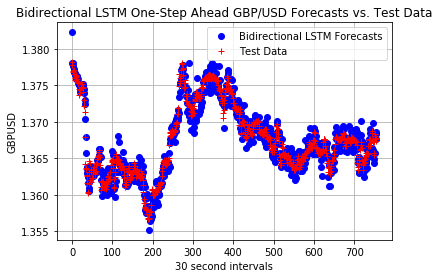

In [146]:
forecasts_bidi=np.reshape(forecasts_bidi,-1)
plt.plot(forecasts_bidi,'bo',label='Bidirectional LSTM Forecasts')
plt.plot(raw_test,'r+',label="Test Data")
plt.xlabel('30 second intervals')
plt.ylabel('GBPUSD')
plt.title('Bidirectional LSTM One-Step Ahead GBP/USD Forecasts vs. Test Data')
plt.legend(loc="upper right")
plt.grid(True)

In [140]:
rmse_test = np.sqrt(mean_squared_error(forecasts_bidi, raw_test))
rmse_test

0.001314334896320213

In [141]:
mean_abs_bidi=((forecasts_bidi-TWAP_test)/TWAP_test)*100.0
mean_abs_bidi_=abs(mean_abs_bidi)
np.mean(mean_abs_bidi_)

0.074236149778574678

# Vanilla LSTM

In [142]:
# univariate lstm example
from numpy import array
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
 
# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

In [143]:
n_steps=1
n_features=1
model = Sequential()
model.add(LSTM(5, activation='relu', input_shape=(n_steps, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [144]:
forecasts_van5=[]

In [145]:
for i in range(test_size):
    n_steps=1
    X, y = split_sequence(raw_seq[0:train_size+i], n_steps)
    n_features=1
    X=X.reshape((X.shape[0], X.shape[1], n_features))
    model.fit(X, y, epochs=30, batch_size=512,verbose=1)
    # demonstrate prediction
    x_input = raw_seq[train_size-1]
    x_input = x_input.reshape((1, n_steps, n_features))
    yhat = model.predict(x_input, verbose=0)
    forecasts_van5.append(yhat)

Epoch 1/30
1762/1762 [==============================] - 1s 291us/step - loss: 1.9536
Epoch 2/30
1762/1762 [==============================] - 0s 6us/step - loss: 1.9334
Epoch 3/30
1762/1762 [==============================] - 0s 6us/step - loss: 1.9136
Epoch 4/30
1762/1762 [==============================] - 0s 6us/step - loss: 1.8940
Epoch 5/30
1762/1762 [==============================] - 0s 6us/step - loss: 1.8748
Epoch 6/30
1762/1762 [==============================] - 0s 6us/step - loss: 1.8559
Epoch 7/30
1762/1762 [==============================] - 0s 6us/step - loss: 1.8393
Epoch 8/30
1762/1762 [==============================] - 0s 7us/step - loss: 1.8284
Epoch 9/30
1762/1762 [==============================] - 0s 7us/step - loss: 1.8177
Epoch 10/30
1762/1762 [==============================] - 0s 6us/step - loss: 1.8071
Epoch 11/30
1762/1762 [==============================] - 0s 6us/step - loss: 1.7965
Epoch 12/30
1762/1762 [==============================] - 0s 6us/step - loss: 1.7859

1765/1765 [==============================] - 0s 6us/step - loss: 1.0361
Epoch 9/30
1765/1765 [==============================] - 0s 7us/step - loss: 1.0291
Epoch 10/30
1765/1765 [==============================] - 0s 6us/step - loss: 1.0221
Epoch 11/30
1765/1765 [==============================] - 0s 6us/step - loss: 1.0152
Epoch 12/30
1765/1765 [==============================] - 0s 6us/step - loss: 1.0083
Epoch 13/30
1765/1765 [==============================] - 0s 7us/step - loss: 1.0014
Epoch 14/30
1765/1765 [==============================] - 0s 6us/step - loss: 0.9946
Epoch 15/30
1765/1765 [==============================] - 0s 6us/step - loss: 0.9878
Epoch 16/30
1765/1765 [==============================] - 0s 7us/step - loss: 0.9810
Epoch 17/30
1765/1765 [==============================] - 0s 7us/step - loss: 0.9743
Epoch 18/30
1765/1765 [==============================] - 0s 7us/step - loss: 0.9676
Epoch 19/30
1765/1765 [==============================] - 0s 7us/step - loss: 0.9610
Epoch

1768/1768 [==============================] - 0s 7us/step - loss: 0.5023
Epoch 17/30
1768/1768 [==============================] - 0s 7us/step - loss: 0.4983
Epoch 18/30
1768/1768 [==============================] - 0s 7us/step - loss: 0.4943
Epoch 19/30
1768/1768 [==============================] - 0s 6us/step - loss: 0.4903
Epoch 20/30
1768/1768 [==============================] - 0s 6us/step - loss: 0.4864
Epoch 21/30
1768/1768 [==============================] - 0s 6us/step - loss: 0.4824
Epoch 22/30
1768/1768 [==============================] - 0s 7us/step - loss: 0.4785
Epoch 23/30
1768/1768 [==============================] - 0s 7us/step - loss: 0.4746
Epoch 24/30
1768/1768 [==============================] - 0s 7us/step - loss: 0.4708
Epoch 25/30
1768/1768 [==============================] - 0s 7us/step - loss: 0.4669
Epoch 26/30
1768/1768 [==============================] - 0s 7us/step - loss: 0.4631
Epoch 27/30
1768/1768 [==============================] - 0s 8us/step - loss: 0.4593
Epoc

Epoch 24/30
1771/1771 [==============================] - 0s 7us/step - loss: 0.2110
Epoch 25/30
1771/1771 [==============================] - 0s 7us/step - loss: 0.2090
Epoch 26/30
1771/1771 [==============================] - 0s 7us/step - loss: 0.2070
Epoch 27/30
1771/1771 [==============================] - 0s 8us/step - loss: 0.2050
Epoch 28/30
1771/1771 [==============================] - 0s 8us/step - loss: 0.2030
Epoch 29/30
1771/1771 [==============================] - 0s 8us/step - loss: 0.2010
Epoch 30/30
1771/1771 [==============================] - 0s 8us/step - loss: 0.1990
Epoch 1/30
1772/1772 [==============================] - 0s 6us/step - loss: 0.1971
Epoch 2/30
1772/1772 [==============================] - 0s 6us/step - loss: 0.1951
Epoch 3/30
1772/1772 [==============================] - 0s 6us/step - loss: 0.1932
Epoch 4/30
1772/1772 [==============================] - 0s 7us/step - loss: 0.1913
Epoch 5/30
1772/1772 [==============================] - 0s 7us/step - loss: 0.18

1775/1775 [==============================] - 0s 6us/step - loss: 0.0745
Epoch 2/30
1775/1775 [==============================] - 0s 6us/step - loss: 0.0737
Epoch 3/30
1775/1775 [==============================] - 0s 7us/step - loss: 0.0728
Epoch 4/30
1775/1775 [==============================] - 0s 7us/step - loss: 0.0719
Epoch 5/30
1775/1775 [==============================] - 0s 7us/step - loss: 0.0711
Epoch 6/30
1775/1775 [==============================] - 0s 8us/step - loss: 0.0702
Epoch 7/30
1775/1775 [==============================] - 0s 7us/step - loss: 0.0694
Epoch 8/30
1775/1775 [==============================] - 0s 7us/step - loss: 0.0686
Epoch 9/30
1775/1775 [==============================] - 0s 7us/step - loss: 0.0678
Epoch 10/30
1775/1775 [==============================] - 0s 8us/step - loss: 0.0669
Epoch 11/30
1775/1775 [==============================] - 0s 8us/step - loss: 0.0661
Epoch 12/30
1775/1775 [==============================] - 0s 8us/step - loss: 0.0654
Epoch 13/30


1778/1778 [==============================] - 0s 6us/step - loss: 0.0209
Epoch 10/30
1778/1778 [==============================] - 0s 7us/step - loss: 0.0206
Epoch 11/30
1778/1778 [==============================] - 0s 6us/step - loss: 0.0203
Epoch 12/30
1778/1778 [==============================] - 0s 6us/step - loss: 0.0200
Epoch 13/30
1778/1778 [==============================] - 0s 6us/step - loss: 0.0197
Epoch 14/30
1778/1778 [==============================] - 0s 8us/step - loss: 0.0195
Epoch 15/30
1778/1778 [==============================] - 0s 7us/step - loss: 0.0192
Epoch 16/30
1778/1778 [==============================] - 0s 7us/step - loss: 0.0189
Epoch 17/30
1778/1778 [==============================] - 0s 7us/step - loss: 0.0186
Epoch 18/30
1778/1778 [==============================] - 0s 7us/step - loss: 0.0184
Epoch 19/30
1778/1778 [==============================] - 0s 8us/step - loss: 0.0181
Epoch 20/30
1778/1778 [==============================] - 0s 7us/step - loss: 0.0179
Epoc

Epoch 17/30
1781/1781 [==============================] - 0s 7us/step - loss: 0.0049
Epoch 18/30
1781/1781 [==============================] - 0s 8us/step - loss: 0.0049
Epoch 19/30
1781/1781 [==============================] - 0s 8us/step - loss: 0.0048
Epoch 20/30
1781/1781 [==============================] - 0s 7us/step - loss: 0.0047
Epoch 21/30
1781/1781 [==============================] - 0s 8us/step - loss: 0.0047
Epoch 22/30
1781/1781 [==============================] - 0s 7us/step - loss: 0.0046
Epoch 23/30
1781/1781 [==============================] - 0s 7us/step - loss: 0.0045
Epoch 24/30
1781/1781 [==============================] - 0s 7us/step - loss: 0.0045
Epoch 25/30
1781/1781 [==============================] - 0s 7us/step - loss: 0.0044
Epoch 26/30
1781/1781 [==============================] - 0s 7us/step - loss: 0.0043
Epoch 27/30
1781/1781 [==============================] - 0s 7us/step - loss: 0.0043
Epoch 28/30
1781/1781 [==============================] - 0s 7us/step - loss:

1784/1784 [==============================] - 0s 7us/step - loss: 0.0016
Epoch 25/30
1784/1784 [==============================] - 0s 7us/step - loss: 0.0015
Epoch 26/30
1784/1784 [==============================] - 0s 7us/step - loss: 0.0015
Epoch 27/30
1784/1784 [==============================] - 0s 8us/step - loss: 0.0015
Epoch 28/30
1784/1784 [==============================] - 0s 7us/step - loss: 0.0015
Epoch 29/30
1784/1784 [==============================] - 0s 9us/step - loss: 0.0015
Epoch 30/30
1784/1784 [==============================] - 0s 8us/step - loss: 0.0015
Epoch 1/30
1785/1785 [==============================] - 0s 7us/step - loss: 0.0015
Epoch 2/30
1785/1785 [==============================] - 0s 7us/step - loss: 0.0015
Epoch 3/30
1785/1785 [==============================] - 0s 7us/step - loss: 0.0015
Epoch 4/30
1785/1785 [==============================] - 0s 7us/step - loss: 0.0014
Epoch 5/30
1785/1785 [==============================] - 0s 7us/step - loss: 0.0014
Epoch 6/3

1788/1788 [==============================] - 0s 6us/step - loss: 0.0011
Epoch 3/30
1788/1788 [==============================] - 0s 6us/step - loss: 0.0011
Epoch 4/30
1788/1788 [==============================] - 0s 7us/step - loss: 0.0011
Epoch 5/30
1788/1788 [==============================] - 0s 7us/step - loss: 0.0011
Epoch 6/30
1788/1788 [==============================] - 0s 7us/step - loss: 0.0011
Epoch 7/30
1788/1788 [==============================] - 0s 6us/step - loss: 0.0011
Epoch 8/30
1788/1788 [==============================] - 0s 7us/step - loss: 0.0011
Epoch 9/30
1788/1788 [==============================] - 0s 8us/step - loss: 0.0011
Epoch 10/30
1788/1788 [==============================] - 0s 7us/step - loss: 0.0011
Epoch 11/30
1788/1788 [==============================] - 0s 7us/step - loss: 0.0011
Epoch 12/30
1788/1788 [==============================] - 0s 7us/step - loss: 0.0011
Epoch 13/30
1788/1788 [==============================] - 0s 6us/step - loss: 0.0011
Epoch 14/30

1791/1791 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 11/30
1791/1791 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 12/30
1791/1791 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 13/30
1791/1791 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 14/30
1791/1791 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 15/30
1791/1791 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 16/30
1791/1791 [==============================] - 0s 9us/step - loss: 0.0010
Epoch 17/30
1791/1791 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 18/30
1791/1791 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 19/30
1791/1791 [==============================] - 0s 9us/step - loss: 0.0010
Epoch 20/30
1791/1791 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 21/30
1791/1791 [==============================] - 0s 8us/step - loss: 0.0010
Epoc

Epoch 18/30
1794/1794 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 19/30
1794/1794 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 20/30
1794/1794 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 21/30
1794/1794 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 22/30
1794/1794 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 23/30
1794/1794 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 24/30
1794/1794 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 25/30
1794/1794 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 26/30
1794/1794 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 27/30
1794/1794 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 28/30
1794/1794 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 29/30
1794/1794 [==============================] - 0s 8us/step - loss:

1797/1797 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 26/30
1797/1797 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 27/30
1797/1797 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 28/30
1797/1797 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 29/30
1797/1797 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 30/30
1797/1797 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 1/30
1798/1798 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 2/30
1798/1798 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 3/30
1798/1798 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 4/30
1798/1798 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 5/30
1798/1798 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 6/30
1798/1798 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 7/30

1801/1801 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 4/30
1801/1801 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 5/30
1801/1801 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 6/30
1801/1801 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 7/30
1801/1801 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 8/30
1801/1801 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 9/30
1801/1801 [==============================] - 0s 9us/step - loss: 0.0010
Epoch 10/30
1801/1801 [==============================] - 0s 9us/step - loss: 0.0010
Epoch 11/30
1801/1801 [==============================] - 0s 9us/step - loss: 0.0010
Epoch 12/30
1801/1801 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 13/30
1801/1801 [==============================] - 0s 9us/step - loss: 0.0010
Epoch 14/30
1801/1801 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 15/3

1804/1804 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 12/30
1804/1804 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 13/30
1804/1804 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 14/30
1804/1804 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 15/30
1804/1804 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 16/30
1804/1804 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 17/30
1804/1804 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 18/30
1804/1804 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 19/30
1804/1804 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 20/30
1804/1804 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 21/30
1804/1804 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 22/30
1804/1804 [==============================] - 0s 8us/step - loss: 0.0010
Epoc

Epoch 19/30
1807/1807 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 20/30
1807/1807 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 21/30
1807/1807 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 22/30
1807/1807 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 23/30
1807/1807 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 24/30
1807/1807 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 25/30
1807/1807 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 26/30
1807/1807 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 27/30
1807/1807 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 28/30
1807/1807 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 29/30
1807/1807 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 30/30
1807/1807 [==============================] - 0s 7us/step - loss:

1810/1810 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 27/30
1810/1810 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 28/30
1810/1810 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 29/30
1810/1810 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 30/30
1810/1810 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 1/30
1811/1811 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 2/30
1811/1811 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 3/30
1811/1811 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 4/30
1811/1811 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 5/30
1811/1811 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 6/30
1811/1811 [==============================] - 0s 9us/step - loss: 0.0010
Epoch 7/30
1811/1811 [==============================] - 0s 9us/step - loss: 0.0010
Epoch 8/30


1814/1814 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 5/30
1814/1814 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 6/30
1814/1814 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 7/30
1814/1814 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 8/30
1814/1814 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 9/30
1814/1814 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 10/30
1814/1814 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 11/30
1814/1814 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 12/30
1814/1814 [==============================] - 0s 9us/step - loss: 0.0010
Epoch 13/30
1814/1814 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 14/30
1814/1814 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 15/30
1814/1814 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 16/

1817/1817 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 13/30
1817/1817 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 14/30
1817/1817 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 15/30
1817/1817 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 16/30
1817/1817 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 17/30
1817/1817 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 18/30
1817/1817 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 19/30
1817/1817 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 20/30
1817/1817 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 21/30
1817/1817 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 22/30
1817/1817 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 23/30
1817/1817 [==============================] - 0s 7us/step - loss: 0.0010
Epoc

1820/1820 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 20/30
1820/1820 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 21/30
1820/1820 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 22/30
1820/1820 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 23/30
1820/1820 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 24/30
1820/1820 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 25/30
1820/1820 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 26/30
1820/1820 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 27/30
1820/1820 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 28/30
1820/1820 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 29/30
1820/1820 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 30/30
1820/1820 [==============================] - 0s 8us/step - loss: 0.0010
Epoc

Epoch 27/30
1823/1823 [==============================] - 0s 9us/step - loss: 0.0010
Epoch 28/30
1823/1823 [==============================] - 0s 9us/step - loss: 0.0010
Epoch 29/30
1823/1823 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 30/30
1823/1823 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 1/30
1824/1824 [==============================] - 0s 5us/step - loss: 0.0010
Epoch 2/30
1824/1824 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 3/30
1824/1824 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 4/30
1824/1824 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 5/30
1824/1824 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 6/30
1824/1824 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 7/30
1824/1824 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 8/30
1824/1824 [==============================] - 0s 7us/step - loss: 0.0010


1827/1827 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 5/30
1827/1827 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 6/30
1827/1827 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 7/30
1827/1827 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 8/30
1827/1827 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 9/30
1827/1827 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 10/30
1827/1827 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 11/30
1827/1827 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 12/30
1827/1827 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 13/30
1827/1827 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 14/30
1827/1827 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 15/30
1827/1827 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 16/

1830/1830 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 12/30
1830/1830 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 13/30
1830/1830 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 14/30
1830/1830 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 15/30
1830/1830 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 16/30
1830/1830 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 17/30
1830/1830 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 18/30
1830/1830 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 19/30
1830/1830 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 20/30
1830/1830 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 21/30
1830/1830 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 22/30
1830/1830 [==============================] - 0s 8us/step - loss: 0.0010
Epoc

1833/1833 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 19/30
1833/1833 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 20/30
1833/1833 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 21/30
1833/1833 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 22/30
1833/1833 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 23/30
1833/1833 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 24/30
1833/1833 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 25/30
1833/1833 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 26/30
1833/1833 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 27/30
1833/1833 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 28/30
1833/1833 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 29/30
1833/1833 [==============================] - 0s 7us/step - loss: 0.0010
Epoc

Epoch 26/30
1836/1836 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 27/30
1836/1836 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 28/30
1836/1836 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 29/30
1836/1836 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 30/30
1836/1836 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 1/30
1837/1837 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 2/30
1837/1837 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 3/30
1837/1837 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 4/30
1837/1837 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 5/30
1837/1837 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 6/30
1837/1837 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 7/30
1837/1837 [==============================] - 0s 7us/step - loss: 0.0010

1840/1840 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 4/30
1840/1840 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 5/30
1840/1840 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 6/30
1840/1840 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 7/30
1840/1840 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 8/30
1840/1840 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 9/30
1840/1840 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 10/30
1840/1840 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 11/30
1840/1840 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 12/30
1840/1840 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 13/30
1840/1840 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 14/30
1840/1840 [==============================] - 0s 8us/step - loss: 0.0010
Epoch 15/3

1843/1843 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 11/30
1843/1843 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 12/30
1843/1843 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 13/30
1843/1843 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 14/30
1843/1843 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 15/30
1843/1843 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 16/30
1843/1843 [==============================] - 0s 6us/step - loss: 0.0010
Epoch 17/30
1843/1843 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 18/30
1843/1843 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 19/30
1843/1843 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 20/30
1843/1843 [==============================] - 0s 7us/step - loss: 0.0010
Epoch 21/30
1843/1843 [==============================] - 0s 8us/step - loss: 0.0010
Epoc

1846/1846 [==============================] - 0s 7us/step - loss: 9.9927e-04
Epoch 15/30
1846/1846 [==============================] - 0s 6us/step - loss: 9.9928e-04
Epoch 16/30
1846/1846 [==============================] - 0s 6us/step - loss: 9.9922e-04
Epoch 17/30
1846/1846 [==============================] - 0s 6us/step - loss: 9.9919e-04
Epoch 18/30
1846/1846 [==============================] - 0s 7us/step - loss: 9.9921e-04
Epoch 19/30
1846/1846 [==============================] - 0s 6us/step - loss: 9.9919e-04
Epoch 20/30
1846/1846 [==============================] - 0s 7us/step - loss: 9.9922e-04
Epoch 21/30
1846/1846 [==============================] - 0s 7us/step - loss: 9.9920e-04
Epoch 22/30
1846/1846 [==============================] - 0s 8us/step - loss: 9.9921e-04
Epoch 23/30
1846/1846 [==============================] - 0s 8us/step - loss: 9.9922e-04
Epoch 24/30
1846/1846 [==============================] - 0s 8us/step - loss: 9.9923e-04
Epoch 25/30
1846/1846 [=====================

1849/1849 [==============================] - 0s 6us/step - loss: 9.9826e-04
Epoch 18/30
1849/1849 [==============================] - 0s 7us/step - loss: 9.9818e-04
Epoch 19/30
1849/1849 [==============================] - 0s 6us/step - loss: 9.9815e-04
Epoch 20/30
1849/1849 [==============================] - 0s 6us/step - loss: 9.9817e-04
Epoch 21/30
1849/1849 [==============================] - 0s 6us/step - loss: 9.9820e-04
Epoch 22/30
1849/1849 [==============================] - 0s 6us/step - loss: 9.9819e-04
Epoch 23/30
1849/1849 [==============================] - 0s 6us/step - loss: 9.9818e-04
Epoch 24/30
1849/1849 [==============================] - 0s 7us/step - loss: 9.9817e-04
Epoch 25/30
1849/1849 [==============================] - 0s 7us/step - loss: 9.9813e-04
Epoch 26/30
1849/1849 [==============================] - 0s 7us/step - loss: 9.9813e-04
Epoch 27/30
1849/1849 [==============================] - 0s 8us/step - loss: 9.9817e-04
Epoch 28/30
1849/1849 [=====================

1852/1852 [==============================] - 0s 6us/step - loss: 9.9707e-04
Epoch 21/30
1852/1852 [==============================] - 0s 5us/step - loss: 9.9709e-04
Epoch 22/30
1852/1852 [==============================] - 0s 6us/step - loss: 9.9711e-04
Epoch 23/30
1852/1852 [==============================] - 0s 6us/step - loss: 9.9708e-04
Epoch 24/30
1852/1852 [==============================] - 0s 5us/step - loss: 9.9711e-04
Epoch 25/30
1852/1852 [==============================] - 0s 6us/step - loss: 9.9711e-04
Epoch 26/30
1852/1852 [==============================] - 0s 6us/step - loss: 9.9708e-04
Epoch 27/30
1852/1852 [==============================] - 0s 6us/step - loss: 9.9717e-04
Epoch 28/30
1852/1852 [==============================] - 0s 5us/step - loss: 9.9707e-04
Epoch 29/30
1852/1852 [==============================] - 0s 5us/step - loss: 9.9707e-04
Epoch 30/30
1852/1852 [==============================] - 0s 5us/step - loss: 9.9708e-04
Epoch 1/30
1853/1853 [======================

1855/1855 [==============================] - 0s 5us/step - loss: 9.9610e-04
Epoch 24/30
1855/1855 [==============================] - 0s 6us/step - loss: 9.9604e-04
Epoch 25/30
1855/1855 [==============================] - 0s 5us/step - loss: 9.9599e-04
Epoch 26/30
1855/1855 [==============================] - 0s 6us/step - loss: 9.9600e-04
Epoch 27/30
1855/1855 [==============================] - 0s 5us/step - loss: 9.9603e-04
Epoch 28/30
1855/1855 [==============================] - 0s 5us/step - loss: 9.9603e-04
Epoch 29/30
1855/1855 [==============================] - 0s 6us/step - loss: 9.9603e-04
Epoch 30/30
1855/1855 [==============================] - 0s 6us/step - loss: 9.9601e-04
Epoch 1/30
1856/1856 [==============================] - 0s 5us/step - loss: 9.9595e-04
Epoch 2/30
1856/1856 [==============================] - 0s 6us/step - loss: 9.9561e-04
Epoch 3/30
1856/1856 [==============================] - 0s 6us/step - loss: 9.9562e-04
Epoch 4/30
1856/1856 [=========================

1858/1858 [==============================] - 0s 7us/step - loss: 9.9491e-04
Epoch 27/30
1858/1858 [==============================] - 0s 7us/step - loss: 9.9508e-04
Epoch 28/30
1858/1858 [==============================] - 0s 7us/step - loss: 9.9495e-04
Epoch 29/30
1858/1858 [==============================] - 0s 7us/step - loss: 9.9492e-04
Epoch 30/30
1858/1858 [==============================] - 0s 7us/step - loss: 9.9490e-04
Epoch 1/30
1859/1859 [==============================] - 0s 6us/step - loss: 9.9468e-04
Epoch 2/30
1859/1859 [==============================] - 0s 7us/step - loss: 9.9456e-04
Epoch 3/30
1859/1859 [==============================] - 0s 7us/step - loss: 9.9459e-04
Epoch 4/30
1859/1859 [==============================] - 0s 7us/step - loss: 9.9450e-04
Epoch 5/30
1859/1859 [==============================] - 0s 8us/step - loss: 9.9454e-04
Epoch 6/30
1859/1859 [==============================] - 0s 8us/step - loss: 9.9453e-04
Epoch 7/30
1859/1859 [============================

1861/1861 [==============================] - 0s 6us/step - loss: 9.9370e-04
Epoch 30/30
1861/1861 [==============================] - 0s 7us/step - loss: 9.9379e-04
Epoch 1/30
1862/1862 [==============================] - 0s 6us/step - loss: 9.9330e-04
Epoch 2/30
1862/1862 [==============================] - 0s 6us/step - loss: 9.9335e-04
Epoch 3/30
1862/1862 [==============================] - 0s 6us/step - loss: 9.9330e-04
Epoch 4/30
1862/1862 [==============================] - 0s 6us/step - loss: 9.9332e-04
Epoch 5/30
1862/1862 [==============================] - 0s 6us/step - loss: 9.9338e-04
Epoch 6/30
1862/1862 [==============================] - 0s 7us/step - loss: 9.9330e-04
Epoch 7/30
1862/1862 [==============================] - 0s 6us/step - loss: 9.9333e-04
Epoch 8/30
1862/1862 [==============================] - 0s 6us/step - loss: 9.9335e-04
Epoch 9/30
1862/1862 [==============================] - 0s 7us/step - loss: 9.9337e-04
Epoch 10/30
1862/1862 [==============================

1865/1865 [==============================] - 0s 6us/step - loss: 9.9224e-04
Epoch 3/30
1865/1865 [==============================] - 0s 7us/step - loss: 9.9218e-04
Epoch 4/30
1865/1865 [==============================] - 0s 7us/step - loss: 9.9231e-04
Epoch 5/30
1865/1865 [==============================] - 0s 7us/step - loss: 9.9214e-04
Epoch 6/30
1865/1865 [==============================] - 0s 8us/step - loss: 9.9284e-04
Epoch 7/30
1865/1865 [==============================] - 0s 8us/step - loss: 9.9212e-04
Epoch 8/30
1865/1865 [==============================] - 0s 8us/step - loss: 9.9220e-04
Epoch 9/30
1865/1865 [==============================] - 0s 8us/step - loss: 9.9216e-04
Epoch 10/30
1865/1865 [==============================] - 0s 8us/step - loss: 9.9225e-04
Epoch 11/30
1865/1865 [==============================] - 0s 10us/step - loss: 9.9219e-04
Epoch 12/30
1865/1865 [==============================] - 0s 9us/step - loss: 9.9218e-04
Epoch 13/30
1865/1865 [===========================

1868/1868 [==============================] - 0s 6us/step - loss: 9.9132e-04
Epoch 6/30
1868/1868 [==============================] - 0s 6us/step - loss: 9.9118e-04
Epoch 7/30
1868/1868 [==============================] - 0s 7us/step - loss: 9.9132e-04
Epoch 8/30
1868/1868 [==============================] - 0s 7us/step - loss: 9.9116e-04
Epoch 9/30
1868/1868 [==============================] - 0s 6us/step - loss: 9.9119e-04
Epoch 10/30
1868/1868 [==============================] - 0s 6us/step - loss: 9.9158e-04
Epoch 11/30
1868/1868 [==============================] - 0s 7us/step - loss: 9.9104e-04
Epoch 12/30
1868/1868 [==============================] - 0s 7us/step - loss: 9.9115e-04
Epoch 13/30
1868/1868 [==============================] - 0s 7us/step - loss: 9.9126e-04
Epoch 14/30
1868/1868 [==============================] - 0s 7us/step - loss: 9.9115e-04
Epoch 15/30
1868/1868 [==============================] - 0s 7us/step - loss: 9.9122e-04
Epoch 16/30
1868/1868 [=========================

1871/1871 [==============================] - 0s 6us/step - loss: 9.9001e-04
Epoch 9/30
1871/1871 [==============================] - 0s 6us/step - loss: 9.9015e-04
Epoch 10/30
1871/1871 [==============================] - 0s 7us/step - loss: 9.8999e-04
Epoch 11/30
1871/1871 [==============================] - 0s 6us/step - loss: 9.8991e-04
Epoch 12/30
1871/1871 [==============================] - 0s 6us/step - loss: 9.9008e-04
Epoch 13/30
1871/1871 [==============================] - 0s 6us/step - loss: 9.9025e-04
Epoch 14/30
1871/1871 [==============================] - 0s 7us/step - loss: 9.9010e-04
Epoch 15/30
1871/1871 [==============================] - 0s 6us/step - loss: 9.9011e-04
Epoch 16/30
1871/1871 [==============================] - 0s 7us/step - loss: 9.9005e-04
Epoch 17/30
1871/1871 [==============================] - 0s 7us/step - loss: 9.8997e-04
Epoch 18/30
1871/1871 [==============================] - 0s 7us/step - loss: 9.8993e-04
Epoch 19/30
1871/1871 [======================

1874/1874 [==============================] - 0s 6us/step - loss: 9.8879e-04
Epoch 12/30
1874/1874 [==============================] - 0s 6us/step - loss: 9.8877e-04
Epoch 13/30
1874/1874 [==============================] - 0s 7us/step - loss: 9.8890e-04
Epoch 14/30
1874/1874 [==============================] - 0s 6us/step - loss: 9.8907e-04
Epoch 15/30
1874/1874 [==============================] - 0s 6us/step - loss: 9.8871e-04
Epoch 16/30
1874/1874 [==============================] - 0s 7us/step - loss: 9.8869e-04
Epoch 17/30
1874/1874 [==============================] - 0s 6us/step - loss: 9.8881e-04
Epoch 18/30
1874/1874 [==============================] - 0s 7us/step - loss: 9.8888e-04
Epoch 19/30
1874/1874 [==============================] - ETA: 0s - loss: 9.1516e-0 - 0s 7us/step - loss: 9.8906e-04
Epoch 20/30
1874/1874 [==============================] - 0s 7us/step - loss: 9.8877e-04
Epoch 21/30
1874/1874 [==============================] - 0s 7us/step - loss: 9.8878e-04
Epoch 22/30
1874

1877/1877 [==============================] - 0s 7us/step - loss: 9.8748e-04
Epoch 15/30
1877/1877 [==============================] - 0s 6us/step - loss: 9.8780e-04
Epoch 16/30
1877/1877 [==============================] - 0s 7us/step - loss: 9.8785e-04
Epoch 17/30
1877/1877 [==============================] - 0s 7us/step - loss: 9.8776e-04
Epoch 18/30
1877/1877 [==============================] - 0s 7us/step - loss: 9.8789e-04
Epoch 19/30
1877/1877 [==============================] - 0s 8us/step - loss: 9.8754e-04
Epoch 20/30
1877/1877 [==============================] - 0s 8us/step - loss: 9.8794e-04
Epoch 21/30
1877/1877 [==============================] - 0s 7us/step - loss: 9.8774e-04
Epoch 22/30
1877/1877 [==============================] - 0s 7us/step - loss: 9.8754e-04
Epoch 23/30
1877/1877 [==============================] - 0s 8us/step - loss: 9.8762e-04
Epoch 24/30
1877/1877 [==============================] - 0s 7us/step - loss: 9.8804e-04
Epoch 25/30
1877/1877 [=====================

1880/1880 [==============================] - 0s 7us/step - loss: 9.8648e-04
Epoch 18/30
1880/1880 [==============================] - 0s 7us/step - loss: 9.8649e-04
Epoch 19/30
1880/1880 [==============================] - 0s 7us/step - loss: 9.8629e-04
Epoch 20/30
1880/1880 [==============================] - 0s 7us/step - loss: 9.8659e-04
Epoch 21/30
1880/1880 [==============================] - 0s 7us/step - loss: 9.8675e-04
Epoch 22/30
1880/1880 [==============================] - 0s 7us/step - loss: 9.8649e-04
Epoch 23/30
1880/1880 [==============================] - 0s 8us/step - loss: 9.8647e-04
Epoch 24/30
1880/1880 [==============================] - 0s 6us/step - loss: 9.8673e-04
Epoch 25/30
1880/1880 [==============================] - 0s 7us/step - loss: 9.8659e-04
Epoch 26/30
1880/1880 [==============================] - 0s 7us/step - loss: 9.8633e-04
Epoch 27/30
1880/1880 [==============================] - 0s 7us/step - loss: 9.8639e-04
Epoch 28/30
1880/1880 [=====================

1883/1883 [==============================] - 0s 7us/step - loss: 9.8538e-04
Epoch 21/30
1883/1883 [==============================] - 0s 8us/step - loss: 9.8527e-04
Epoch 22/30
1883/1883 [==============================] - 0s 8us/step - loss: 9.8520e-04
Epoch 23/30
1883/1883 [==============================] - 0s 7us/step - loss: 9.8511e-04
Epoch 24/30
1883/1883 [==============================] - 0s 8us/step - loss: 9.8516e-04
Epoch 25/30
1883/1883 [==============================] - 0s 7us/step - loss: 9.8550e-04
Epoch 26/30
1883/1883 [==============================] - 0s 8us/step - loss: 9.8520e-04
Epoch 27/30
1883/1883 [==============================] - 0s 7us/step - loss: 9.8528e-04
Epoch 28/30
1883/1883 [==============================] - 0s 8us/step - loss: 9.8537e-04
Epoch 29/30
1883/1883 [==============================] - 0s 7us/step - loss: 9.8524e-04
Epoch 30/30
1883/1883 [==============================] - 0s 8us/step - loss: 9.8515e-04
Epoch 1/30
1884/1884 [======================

1886/1886 [==============================] - 0s 7us/step - loss: 9.8446e-04
Epoch 24/30
1886/1886 [==============================] - 0s 7us/step - loss: 9.8415e-04
Epoch 25/30
1886/1886 [==============================] - 0s 7us/step - loss: 9.8400e-04
Epoch 26/30
1886/1886 [==============================] - 0s 8us/step - loss: 9.8407e-04
Epoch 27/30
1886/1886 [==============================] - 0s 7us/step - loss: 9.8413e-04
Epoch 28/30
1886/1886 [==============================] - 0s 7us/step - loss: 9.8426e-04
Epoch 29/30
1886/1886 [==============================] - 0s 7us/step - loss: 9.8433e-04
Epoch 30/30
1886/1886 [==============================] - 0s 8us/step - loss: 9.8414e-04
Epoch 1/30
1887/1887 [==============================] - 0s 6us/step - loss: 9.8402e-04
Epoch 2/30
1887/1887 [==============================] - 0s 6us/step - loss: 9.8368e-04
Epoch 3/30
1887/1887 [==============================] - 0s 6us/step - loss: 9.8389e-04
Epoch 4/30
1887/1887 [=========================

1889/1889 [==============================] - 0s 7us/step - loss: 9.8316e-04
Epoch 27/30
1889/1889 [==============================] - 0s 7us/step - loss: 9.8290e-04
Epoch 28/30
1889/1889 [==============================] - 0s 7us/step - loss: 9.8304e-04
Epoch 29/30
1889/1889 [==============================] - 0s 7us/step - loss: 9.8310e-04
Epoch 30/30
1889/1889 [==============================] - 0s 6us/step - loss: 9.8309e-04
Epoch 1/30
1890/1890 [==============================] - 0s 6us/step - loss: 9.8263e-04
Epoch 2/30
1890/1890 [==============================] - 0s 6us/step - loss: 9.8248e-04
Epoch 3/30
1890/1890 [==============================] - 0s 6us/step - loss: 9.8279e-04
Epoch 4/30
1890/1890 [==============================] - 0s 6us/step - loss: 9.8280e-04
Epoch 5/30
1890/1890 [==============================] - 0s 7us/step - loss: 9.8258e-04
Epoch 6/30
1890/1890 [==============================] - 0s 7us/step - loss: 9.8263e-04
Epoch 7/30
1890/1890 [============================

1892/1892 [==============================] - 0s 7us/step - loss: 9.8191e-04
Epoch 30/30
1892/1892 [==============================] - 0s 7us/step - loss: 9.8185e-04
Epoch 1/30
1893/1893 [==============================] - 0s 5us/step - loss: 9.8136e-04
Epoch 2/30
1893/1893 [==============================] - 0s 6us/step - loss: 9.8219e-04
Epoch 3/30
1893/1893 [==============================] - 0s 5us/step - loss: 9.8176e-04
Epoch 4/30
1893/1893 [==============================] - 0s 6us/step - loss: 9.8137e-04
Epoch 5/30
1893/1893 [==============================] - 0s 6us/step - loss: 9.8215e-04
Epoch 6/30
1893/1893 [==============================] - 0s 6us/step - loss: 9.8179e-04
Epoch 7/30
1893/1893 [==============================] - 0s 7us/step - loss: 9.8231e-04
Epoch 8/30
1893/1893 [==============================] - 0s 6us/step - loss: 9.8163e-04
Epoch 9/30
1893/1893 [==============================] - 0s 6us/step - loss: 9.8149e-04
Epoch 10/30
1893/1893 [==============================

1896/1896 [==============================] - 0s 5us/step - loss: 9.8047e-04
Epoch 3/30
1896/1896 [==============================] - 0s 5us/step - loss: 9.8044e-04
Epoch 4/30
1896/1896 [==============================] - 0s 6us/step - loss: 9.8056e-04
Epoch 5/30
1896/1896 [==============================] - 0s 6us/step - loss: 9.8054e-04
Epoch 6/30
1896/1896 [==============================] - 0s 6us/step - loss: 9.8033e-04
Epoch 7/30
1896/1896 [==============================] - 0s 6us/step - loss: 9.8055e-04
Epoch 8/30
1896/1896 [==============================] - 0s 7us/step - loss: 9.8053e-04
Epoch 9/30
1896/1896 [==============================] - 0s 6us/step - loss: 9.8041e-04
Epoch 10/30
1896/1896 [==============================] - 0s 7us/step - loss: 9.8045e-04
Epoch 11/30
1896/1896 [==============================] - 0s 7us/step - loss: 9.8060e-04
Epoch 12/30
1896/1896 [==============================] - 0s 7us/step - loss: 9.8037e-04
Epoch 13/30
1896/1896 [============================

1899/1899 [==============================] - 0s 6us/step - loss: 9.7959e-04
Epoch 6/30
1899/1899 [==============================] - 0s 6us/step - loss: 9.7974e-04
Epoch 7/30
1899/1899 [==============================] - 0s 6us/step - loss: 9.7933e-04
Epoch 8/30
1899/1899 [==============================] - 0s 7us/step - loss: 9.7939e-04
Epoch 9/30
1899/1899 [==============================] - 0s 6us/step - loss: 9.7940e-04
Epoch 10/30
1899/1899 [==============================] - 0s 6us/step - loss: 9.7940e-04
Epoch 11/30
1899/1899 [==============================] - 0s 7us/step - loss: 9.7947e-04
Epoch 12/30
1899/1899 [==============================] - 0s 6us/step - loss: 9.7955e-04
Epoch 13/30
1899/1899 [==============================] - 0s 7us/step - loss: 9.7936e-04
Epoch 14/30
1899/1899 [==============================] - 0s 7us/step - loss: 9.7961e-04
Epoch 15/30
1899/1899 [==============================] - 0s 7us/step - loss: 9.7947e-04
Epoch 16/30
1899/1899 [=========================

1902/1902 [==============================] - 0s 6us/step - loss: 9.7832e-04
Epoch 9/30
1902/1902 [==============================] - 0s 6us/step - loss: 9.7831e-04
Epoch 10/30
1902/1902 [==============================] - 0s 6us/step - loss: 9.7836e-04
Epoch 11/30
1902/1902 [==============================] - 0s 6us/step - loss: 9.7838e-04
Epoch 12/30
1902/1902 [==============================] - 0s 7us/step - loss: 9.7842e-04
Epoch 13/30
1902/1902 [==============================] - 0s 7us/step - loss: 9.7846e-04
Epoch 14/30
1902/1902 [==============================] - 0s 6us/step - loss: 9.7837e-04
Epoch 15/30
1902/1902 [==============================] - 0s 7us/step - loss: 9.7884e-04
Epoch 16/30
1902/1902 [==============================] - 0s 7us/step - loss: 9.7883e-04
Epoch 17/30
1902/1902 [==============================] - 0s 8us/step - loss: 9.7879e-04
Epoch 18/30
1902/1902 [==============================] - 0s 7us/step - loss: 9.7850e-04
Epoch 19/30
1902/1902 [======================

1905/1905 [==============================] - 0s 6us/step - loss: 9.7730e-04
Epoch 12/30
1905/1905 [==============================] - 0s 6us/step - loss: 9.7733e-04
Epoch 13/30
1905/1905 [==============================] - 0s 6us/step - loss: 9.7710e-04
Epoch 14/30
1905/1905 [==============================] - 0s 7us/step - loss: 9.7716e-04
Epoch 15/30
1905/1905 [==============================] - 0s 7us/step - loss: 9.7756e-04
Epoch 16/30
1905/1905 [==============================] - 0s 6us/step - loss: 9.7726e-04
Epoch 17/30
1905/1905 [==============================] - 0s 7us/step - loss: 9.7801e-04
Epoch 18/30
1905/1905 [==============================] - 0s 7us/step - loss: 9.7724e-04
Epoch 19/30
1905/1905 [==============================] - 0s 7us/step - loss: 9.7729e-04
Epoch 20/30
1905/1905 [==============================] - 0s 7us/step - loss: 9.7722e-04
Epoch 21/30
1905/1905 [==============================] - 0s 7us/step - loss: 9.7716e-04
Epoch 22/30
1905/1905 [=====================

1908/1908 [==============================] - 0s 7us/step - loss: 9.7610e-04
Epoch 15/30
1908/1908 [==============================] - 0s 7us/step - loss: 9.7668e-04
Epoch 16/30
1908/1908 [==============================] - 0s 8us/step - loss: 9.7596e-04
Epoch 17/30
1908/1908 [==============================] - 0s 9us/step - loss: 9.7611e-04
Epoch 18/30
1908/1908 [==============================] - 0s 9us/step - loss: 9.7648e-04
Epoch 19/30
1908/1908 [==============================] - 0s 8us/step - loss: 9.7612e-04
Epoch 20/30
1908/1908 [==============================] - 0s 9us/step - loss: 9.7613e-04
Epoch 21/30
1908/1908 [==============================] - ETA: 0s - loss: 9.7850e-0 - 0s 8us/step - loss: 9.7640e-04
Epoch 22/30
1908/1908 [==============================] - 0s 8us/step - loss: 9.7648e-04
Epoch 23/30
1908/1908 [==============================] - 0s 8us/step - loss: 9.7632e-04
Epoch 24/30
1908/1908 [==============================] - 0s 8us/step - loss: 9.7603e-04
Epoch 25/30
1908

1911/1911 [==============================] - 0s 6us/step - loss: 9.7520e-04
Epoch 18/30
1911/1911 [==============================] - 0s 7us/step - loss: 9.7506e-04
Epoch 19/30
1911/1911 [==============================] - 0s 6us/step - loss: 9.7531e-04
Epoch 20/30
1911/1911 [==============================] - 0s 6us/step - loss: 9.7512e-04
Epoch 21/30
1911/1911 [==============================] - 0s 7us/step - loss: 9.7518e-04
Epoch 22/30
1911/1911 [==============================] - 0s 6us/step - loss: 9.7515e-04
Epoch 23/30
1911/1911 [==============================] - 0s 6us/step - loss: 9.7525e-04
Epoch 24/30
1911/1911 [==============================] - 0s 6us/step - loss: 9.7512e-04
Epoch 25/30
1911/1911 [==============================] - 0s 6us/step - loss: 9.7581e-04
Epoch 26/30
1911/1911 [==============================] - 0s 7us/step - loss: 9.7518e-04
Epoch 27/30
1911/1911 [==============================] - 0s 7us/step - loss: 9.7503e-04
Epoch 28/30
1911/1911 [=====================

1914/1914 [==============================] - 0s 7us/step - loss: 9.7416e-04
Epoch 21/30
1914/1914 [==============================] - 0s 6us/step - loss: 9.7408e-04
Epoch 22/30
1914/1914 [==============================] - 0s 6us/step - loss: 9.7385e-04
Epoch 23/30
1914/1914 [==============================] - 0s 6us/step - loss: 9.7453e-04
Epoch 24/30
1914/1914 [==============================] - 0s 6us/step - loss: 9.7405e-04
Epoch 25/30
1914/1914 [==============================] - 0s 7us/step - loss: 9.7443e-04
Epoch 26/30
1914/1914 [==============================] - 0s 7us/step - loss: 9.7437e-04
Epoch 27/30
1914/1914 [==============================] - 0s 7us/step - loss: 9.7394e-04
Epoch 28/30
1914/1914 [==============================] - 0s 7us/step - loss: 9.7431e-04
Epoch 29/30
1914/1914 [==============================] - 0s 7us/step - loss: 9.7400e-04
Epoch 30/30
1914/1914 [==============================] - 0s 8us/step - loss: 9.7418e-04
Epoch 1/30
1915/1915 [======================

1917/1917 [==============================] - 0s 6us/step - loss: 9.7295e-04
Epoch 24/30
1917/1917 [==============================] - 0s 6us/step - loss: 9.7278e-04
Epoch 25/30
1917/1917 [==============================] - 0s 6us/step - loss: 9.7312e-04
Epoch 26/30
1917/1917 [==============================] - 0s 7us/step - loss: 9.7294e-04
Epoch 27/30
1917/1917 [==============================] - 0s 8us/step - loss: 9.7300e-04
Epoch 28/30
1917/1917 [==============================] - 0s 6us/step - loss: 9.7294e-04
Epoch 29/30
1917/1917 [==============================] - 0s 7us/step - loss: 9.7282e-04
Epoch 30/30
1917/1917 [==============================] - 0s 6us/step - loss: 9.7280e-04
Epoch 1/30
1918/1918 [==============================] - 0s 5us/step - loss: 9.7244e-04
Epoch 2/30
1918/1918 [==============================] - 0s 5us/step - loss: 9.7240e-04
Epoch 3/30
1918/1918 [==============================] - 0s 6us/step - loss: 9.7275e-04
Epoch 4/30
1918/1918 [=========================

1920/1920 [==============================] - 0s 6us/step - loss: 9.7171e-04
Epoch 27/30
1920/1920 [==============================] - 0s 7us/step - loss: 9.7186e-04
Epoch 28/30
1920/1920 [==============================] - 0s 6us/step - loss: 9.7209e-04
Epoch 29/30
1920/1920 [==============================] - 0s 8us/step - loss: 9.7180e-04
Epoch 30/30
1920/1920 [==============================] - 0s 7us/step - loss: 9.7196e-04
Epoch 1/30
1921/1921 [==============================] - 0s 6us/step - loss: 9.7157e-04
Epoch 2/30
1921/1921 [==============================] - 0s 6us/step - loss: 9.7140e-04
Epoch 3/30
1921/1921 [==============================] - 0s 7us/step - loss: 9.7139e-04
Epoch 4/30
1921/1921 [==============================] - 0s 7us/step - loss: 9.7148e-04
Epoch 5/30
1921/1921 [==============================] - 0s 7us/step - loss: 9.7164e-04
Epoch 6/30
1921/1921 [==============================] - 0s 7us/step - loss: 9.7137e-04
Epoch 7/30
1921/1921 [============================

1923/1923 [==============================] - 0s 6us/step - loss: 9.7131e-04
Epoch 30/30
1923/1923 [==============================] - 0s 6us/step - loss: 9.7056e-04
Epoch 1/30
1924/1924 [==============================] - 0s 5us/step - loss: 9.7091e-04
Epoch 2/30
1924/1924 [==============================] - 0s 5us/step - loss: 9.7053e-04
Epoch 3/30
1924/1924 [==============================] - 0s 5us/step - loss: 9.7004e-04
Epoch 4/30
1924/1924 [==============================] - 0s 6us/step - loss: 9.7049e-04
Epoch 5/30
1924/1924 [==============================] - 0s 7us/step - loss: 9.7090e-04
Epoch 6/30
1924/1924 [==============================] - 0s 7us/step - loss: 9.7028e-04
Epoch 7/30
1924/1924 [==============================] - 0s 7us/step - loss: 9.7024e-04
Epoch 8/30
1924/1924 [==============================] - 0s 6us/step - loss: 9.7083e-04
Epoch 9/30
1924/1924 [==============================] - 0s 6us/step - loss: 9.7095e-04
Epoch 10/30
1924/1924 [==============================

1927/1927 [==============================] - 0s 5us/step - loss: 9.6998e-04
Epoch 3/30
1927/1927 [==============================] - 0s 6us/step - loss: 9.6924e-04
Epoch 4/30
1927/1927 [==============================] - 0s 6us/step - loss: 9.6935e-04
Epoch 5/30
1927/1927 [==============================] - 0s 7us/step - loss: 9.6946e-04
Epoch 6/30
1927/1927 [==============================] - 0s 7us/step - loss: 9.6917e-04
Epoch 7/30
1927/1927 [==============================] - 0s 7us/step - loss: 9.6938e-04
Epoch 8/30
1927/1927 [==============================] - 0s 7us/step - loss: 9.6942e-04
Epoch 9/30
1927/1927 [==============================] - 0s 7us/step - loss: 9.6916e-04
Epoch 10/30
1927/1927 [==============================] - 0s 8us/step - loss: 9.6918e-04
Epoch 11/30
1927/1927 [==============================] - 0s 7us/step - loss: 9.6959e-04
Epoch 12/30
1927/1927 [==============================] - 0s 7us/step - loss: 9.6948e-04
Epoch 13/30
1927/1927 [============================

1930/1930 [==============================] - 0s 6us/step - loss: 9.6814e-04
Epoch 6/30
1930/1930 [==============================] - 0s 6us/step - loss: 9.6839e-04
Epoch 7/30
1930/1930 [==============================] - 0s 6us/step - loss: 9.6836e-04
Epoch 8/30
1930/1930 [==============================] - 0s 6us/step - loss: 9.6812e-04
Epoch 9/30
1930/1930 [==============================] - 0s 6us/step - loss: 9.6849e-04
Epoch 10/30
1930/1930 [==============================] - 0s 6us/step - loss: 9.6817e-04
Epoch 11/30
1930/1930 [==============================] - 0s 7us/step - loss: 9.6872e-04
Epoch 12/30
1930/1930 [==============================] - 0s 7us/step - loss: 9.6843e-04
Epoch 13/30
1930/1930 [==============================] - 0s 7us/step - loss: 9.6825e-04
Epoch 14/30
1930/1930 [==============================] - 0s 7us/step - loss: 9.6821e-04
Epoch 15/30
1930/1930 [==============================] - 0s 7us/step - loss: 9.6811e-04
Epoch 16/30
1930/1930 [=========================

1933/1933 [==============================] - 0s 6us/step - loss: 9.6727e-04
Epoch 9/30
1933/1933 [==============================] - 0s 7us/step - loss: 9.6743e-04
Epoch 10/30
1933/1933 [==============================] - 0s 7us/step - loss: 9.6755e-04
Epoch 11/30
1933/1933 [==============================] - 0s 7us/step - loss: 9.6716e-04
Epoch 12/30
1933/1933 [==============================] - 0s 6us/step - loss: 9.6721e-04
Epoch 13/30
1933/1933 [==============================] - 0s 7us/step - loss: 9.6738e-04
Epoch 14/30
1933/1933 [==============================] - 0s 7us/step - loss: 9.6732e-04
Epoch 15/30
1933/1933 [==============================] - 0s 7us/step - loss: 9.6718e-04
Epoch 16/30
1933/1933 [==============================] - 0s 7us/step - loss: 9.6714e-04
Epoch 17/30
1933/1933 [==============================] - 0s 7us/step - loss: 9.6723e-04
Epoch 18/30
1933/1933 [==============================] - 0s 7us/step - loss: 9.6698e-04
Epoch 19/30
1933/1933 [======================

1936/1936 [==============================] - 0s 7us/step - loss: 9.6657e-04
Epoch 12/30
1936/1936 [==============================] - 0s 7us/step - loss: 9.6620e-04
Epoch 13/30
1936/1936 [==============================] - 0s 7us/step - loss: 9.6658e-04
Epoch 14/30
1936/1936 [==============================] - 0s 7us/step - loss: 9.6628e-04
Epoch 15/30
1936/1936 [==============================] - 0s 7us/step - loss: 9.6623e-04
Epoch 16/30
1936/1936 [==============================] - 0s 8us/step - loss: 9.6585e-04
Epoch 17/30
1936/1936 [==============================] - 0s 8us/step - loss: 9.6661e-04
Epoch 18/30
1936/1936 [==============================] - 0s 9us/step - loss: 9.6635e-04
Epoch 19/30
1936/1936 [==============================] - 0s 9us/step - loss: 9.6592e-04
Epoch 20/30
1936/1936 [==============================] - 0s 9us/step - loss: 9.6638e-04
Epoch 21/30
1936/1936 [==============================] - 0s 8us/step - loss: 9.6627e-04
Epoch 22/30
1936/1936 [=====================

1939/1939 [==============================] - 0s 6us/step - loss: 9.6519e-04
Epoch 15/30
1939/1939 [==============================] - 0s 7us/step - loss: 9.6516e-04
Epoch 16/30
1939/1939 [==============================] - 0s 7us/step - loss: 9.6539e-04
Epoch 17/30
1939/1939 [==============================] - 0s 7us/step - loss: 9.6501e-04
Epoch 18/30
1939/1939 [==============================] - 0s 7us/step - loss: 9.6506e-04
Epoch 19/30
1939/1939 [==============================] - 0s 7us/step - loss: 9.6503e-04
Epoch 20/30
1939/1939 [==============================] - 0s 7us/step - loss: 9.6536e-04
Epoch 21/30
1939/1939 [==============================] - 0s 7us/step - loss: 9.6511e-04
Epoch 22/30
1939/1939 [==============================] - 0s 7us/step - loss: 9.6507e-04
Epoch 23/30
1939/1939 [==============================] - 0s 7us/step - loss: 9.6526e-04
Epoch 24/30
1939/1939 [==============================] - 0s 7us/step - loss: 9.6497e-04
Epoch 25/30
1939/1939 [=====================

1942/1942 [==============================] - 0s 6us/step - loss: 9.6504e-04
Epoch 18/30
1942/1942 [==============================] - 0s 7us/step - loss: 9.6410e-04
Epoch 19/30
1942/1942 [==============================] - 0s 6us/step - loss: 9.6491e-04
Epoch 20/30
1942/1942 [==============================] - 0s 6us/step - loss: 9.6475e-04
Epoch 21/30
1942/1942 [==============================] - 0s 6us/step - loss: 9.6433e-04
Epoch 22/30
1942/1942 [==============================] - 0s 7us/step - loss: 9.6411e-04
Epoch 23/30
1942/1942 [==============================] - 0s 7us/step - loss: 9.6417e-04
Epoch 24/30
1942/1942 [==============================] - 0s 6us/step - loss: 9.6432e-04
Epoch 25/30
1942/1942 [==============================] - 0s 6us/step - loss: 9.6424e-04
Epoch 26/30
1942/1942 [==============================] - 0s 7us/step - loss: 9.6421e-04
Epoch 27/30
1942/1942 [==============================] - 0s 6us/step - loss: 9.6417e-04
Epoch 28/30
1942/1942 [=====================

1945/1945 [==============================] - 0s 6us/step - loss: 9.6344e-04
Epoch 21/30
1945/1945 [==============================] - 0s 6us/step - loss: 9.6328e-04
Epoch 22/30
1945/1945 [==============================] - 0s 6us/step - loss: 9.6364e-04
Epoch 23/30
1945/1945 [==============================] - 0s 6us/step - loss: 9.6345e-04
Epoch 24/30
1945/1945 [==============================] - 0s 6us/step - loss: 9.6313e-04
Epoch 25/30
1945/1945 [==============================] - 0s 6us/step - loss: 9.6379e-04
Epoch 26/30
1945/1945 [==============================] - 0s 6us/step - loss: 9.6358e-04
Epoch 27/30
1945/1945 [==============================] - 0s 6us/step - loss: 9.6377e-04
Epoch 28/30
1945/1945 [==============================] - 0s 6us/step - loss: 9.6346e-04
Epoch 29/30
1945/1945 [==============================] - 0s 6us/step - loss: 9.6389e-04
Epoch 30/30
1945/1945 [==============================] - 0s 6us/step - loss: 9.6347e-04
Epoch 1/30
1946/1946 [======================

1948/1948 [==============================] - 0s 7us/step - loss: 9.6257e-04
Epoch 24/30
1948/1948 [==============================] - 0s 7us/step - loss: 9.6431e-04
Epoch 25/30
1948/1948 [==============================] - 0s 6us/step - loss: 9.6300e-04
Epoch 26/30
1948/1948 [==============================] - 0s 6us/step - loss: 9.6258e-04
Epoch 27/30
1948/1948 [==============================] - 0s 7us/step - loss: 9.6279e-04
Epoch 28/30
1948/1948 [==============================] - 0s 7us/step - loss: 9.6288e-04
Epoch 29/30
1948/1948 [==============================] - 0s 7us/step - loss: 9.6257e-04
Epoch 30/30
1948/1948 [==============================] - 0s 7us/step - loss: 9.6298e-04
Epoch 1/30
1949/1949 [==============================] - 0s 5us/step - loss: 9.6248e-04
Epoch 2/30
1949/1949 [==============================] - 0s 6us/step - loss: 9.6263e-04
Epoch 3/30
1949/1949 [==============================] - 0s 5us/step - loss: 9.6312e-04
Epoch 4/30
1949/1949 [=========================

1951/1951 [==============================] - 0s 6us/step - loss: 9.6177e-04
Epoch 27/30
1951/1951 [==============================] - 0s 6us/step - loss: 9.6248e-04
Epoch 28/30
1951/1951 [==============================] - 0s 6us/step - loss: 9.6174e-04
Epoch 29/30
1951/1951 [==============================] - 0s 6us/step - loss: 9.6202e-04
Epoch 30/30
1951/1951 [==============================] - 0s 6us/step - loss: 9.6200e-04
Epoch 1/30
1952/1952 [==============================] - 0s 5us/step - loss: 9.6154e-04
Epoch 2/30
1952/1952 [==============================] - 0s 5us/step - loss: 9.6150e-04
Epoch 3/30
1952/1952 [==============================] - 0s 5us/step - loss: 9.6166e-04
Epoch 4/30
1952/1952 [==============================] - 0s 6us/step - loss: 9.6160e-04
Epoch 5/30
1952/1952 [==============================] - 0s 6us/step - loss: 9.6162e-04
Epoch 6/30
1952/1952 [==============================] - 0s 6us/step - loss: 9.6165e-04
Epoch 7/30
1952/1952 [============================

1954/1954 [==============================] - 0s 7us/step - loss: 9.6114e-04
Epoch 30/30
1954/1954 [==============================] - 0s 6us/step - loss: 9.6145e-04
Epoch 1/30
1955/1955 [==============================] - 0s 6us/step - loss: 9.6129e-04
Epoch 2/30
1955/1955 [==============================] - 0s 5us/step - loss: 9.6105e-04
Epoch 3/30
1955/1955 [==============================] - 0s 6us/step - loss: 9.6107e-04
Epoch 4/30
1955/1955 [==============================] - 0s 6us/step - loss: 9.6094e-04
Epoch 5/30
1955/1955 [==============================] - 0s 6us/step - loss: 9.6094e-04
Epoch 6/30
1955/1955 [==============================] - 0s 6us/step - loss: 9.6089e-04
Epoch 7/30
1955/1955 [==============================] - 0s 7us/step - loss: 9.6095e-04
Epoch 8/30
1955/1955 [==============================] - 0s 6us/step - loss: 9.6123e-04
Epoch 9/30
1955/1955 [==============================] - 0s 6us/step - loss: 9.6096e-04
Epoch 10/30
1955/1955 [==============================

1958/1958 [==============================] - 0s 6us/step - loss: 9.6016e-04
Epoch 3/30
1958/1958 [==============================] - 0s 6us/step - loss: 9.6020e-04
Epoch 4/30
1958/1958 [==============================] - 0s 6us/step - loss: 9.6020e-04
Epoch 5/30
1958/1958 [==============================] - 0s 6us/step - loss: 9.6016e-04
Epoch 6/30
1958/1958 [==============================] - 0s 7us/step - loss: 9.6042e-04
Epoch 7/30
1958/1958 [==============================] - 0s 7us/step - loss: 9.6019e-04
Epoch 8/30
1958/1958 [==============================] - 0s 7us/step - loss: 9.6037e-04
Epoch 9/30
1958/1958 [==============================] - 0s 7us/step - loss: 9.6045e-04
Epoch 10/30
1958/1958 [==============================] - 0s 7us/step - loss: 9.6030e-04
Epoch 11/30
1958/1958 [==============================] - 0s 7us/step - loss: 9.6012e-04
Epoch 12/30
1958/1958 [==============================] - 0s 7us/step - loss: 9.6038e-04
Epoch 13/30
1958/1958 [============================

1961/1961 [==============================] - 0s 6us/step - loss: 9.5945e-04
Epoch 6/30
1961/1961 [==============================] - 0s 6us/step - loss: 9.5926e-04
Epoch 7/30
1961/1961 [==============================] - 0s 6us/step - loss: 9.5963e-04
Epoch 8/30
1961/1961 [==============================] - 0s 6us/step - loss: 9.5932e-04
Epoch 9/30
1961/1961 [==============================] - 0s 6us/step - loss: 9.5931e-04
Epoch 10/30
1961/1961 [==============================] - 0s 6us/step - loss: 9.5939e-04
Epoch 11/30
1961/1961 [==============================] - 0s 6us/step - loss: 9.5962e-04
Epoch 12/30
1961/1961 [==============================] - 0s 6us/step - loss: 9.5932e-04
Epoch 13/30
1961/1961 [==============================] - 0s 6us/step - loss: 9.5951e-04
Epoch 14/30
1961/1961 [==============================] - 0s 6us/step - loss: 9.6003e-04
Epoch 15/30
1961/1961 [==============================] - 0s 6us/step - loss: 9.5966e-04
Epoch 16/30
1961/1961 [=========================

1964/1964 [==============================] - 0s 6us/step - loss: 9.5837e-04
Epoch 9/30
1964/1964 [==============================] - 0s 7us/step - loss: 9.5930e-04
Epoch 10/30
1964/1964 [==============================] - 0s 7us/step - loss: 9.5851e-04
Epoch 11/30
1964/1964 [==============================] - 0s 7us/step - loss: 9.5901e-04
Epoch 12/30
1964/1964 [==============================] - 0s 7us/step - loss: 9.5947e-04
Epoch 13/30
1964/1964 [==============================] - 0s 7us/step - loss: 9.5874e-04
Epoch 14/30
1964/1964 [==============================] - 0s 8us/step - loss: 9.5877e-04
Epoch 15/30
1964/1964 [==============================] - 0s 7us/step - loss: 9.5860e-04
Epoch 16/30
1964/1964 [==============================] - 0s 7us/step - loss: 9.5862e-04
Epoch 17/30
1964/1964 [==============================] - 0s 7us/step - loss: 9.5845e-04
Epoch 18/30
1964/1964 [==============================] - 0s 7us/step - loss: 9.5840e-04
Epoch 19/30
1964/1964 [======================

1967/1967 [==============================] - 0s 6us/step - loss: 9.5746e-04
Epoch 12/30
1967/1967 [==============================] - 0s 6us/step - loss: 9.5780e-04
Epoch 13/30
1967/1967 [==============================] - 0s 6us/step - loss: 9.5754e-04
Epoch 14/30
1967/1967 [==============================] - 0s 7us/step - loss: 9.5765e-04
Epoch 15/30
1967/1967 [==============================] - 0s 6us/step - loss: 9.5804e-04
Epoch 16/30
1967/1967 [==============================] - 0s 6us/step - loss: 9.5753e-04
Epoch 17/30
1967/1967 [==============================] - 0s 6us/step - loss: 9.5777e-04
Epoch 18/30
1967/1967 [==============================] - 0s 7us/step - loss: 9.5787e-04
Epoch 19/30
1967/1967 [==============================] - 0s 7us/step - loss: 9.5776e-04
Epoch 20/30
1967/1967 [==============================] - 0s 7us/step - loss: 9.5748e-04
Epoch 21/30
1967/1967 [==============================] - 0s 7us/step - loss: 9.5768e-04
Epoch 22/30
1967/1967 [=====================

1970/1970 [==============================] - 0s 7us/step - loss: 9.5661e-04
Epoch 15/30
1970/1970 [==============================] - 0s 6us/step - loss: 9.5661e-04
Epoch 16/30
1970/1970 [==============================] - 0s 7us/step - loss: 9.5661e-04
Epoch 17/30
1970/1970 [==============================] - 0s 7us/step - loss: 9.5661e-04
Epoch 18/30
1970/1970 [==============================] - 0s 7us/step - loss: 9.5662e-04
Epoch 19/30
1970/1970 [==============================] - 0s 7us/step - loss: 9.5671e-04
Epoch 20/30
1970/1970 [==============================] - 0s 7us/step - loss: 9.5715e-04
Epoch 21/30
1970/1970 [==============================] - 0s 7us/step - loss: 9.5672e-04
Epoch 22/30
1970/1970 [==============================] - 0s 7us/step - loss: 9.5667e-04
Epoch 23/30
1970/1970 [==============================] - 0s 7us/step - loss: 9.5675e-04
Epoch 24/30
1970/1970 [==============================] - 0s 7us/step - loss: 9.5676e-04
Epoch 25/30
1970/1970 [=====================

1973/1973 [==============================] - 0s 7us/step - loss: 9.5574e-04
Epoch 18/30
1973/1973 [==============================] - 0s 7us/step - loss: 9.5554e-04
Epoch 19/30
1973/1973 [==============================] - 0s 7us/step - loss: 9.5574e-04
Epoch 20/30
1973/1973 [==============================] - 0s 7us/step - loss: 9.5577e-04
Epoch 21/30
1973/1973 [==============================] - 0s 7us/step - loss: 9.5623e-04
Epoch 22/30
1973/1973 [==============================] - 0s 7us/step - loss: 9.5566e-04
Epoch 23/30
1973/1973 [==============================] - 0s 7us/step - loss: 9.5582e-04
Epoch 24/30
1973/1973 [==============================] - 0s 7us/step - loss: 9.5586e-04
Epoch 25/30
1973/1973 [==============================] - 0s 10us/step - loss: 9.5553e-04
Epoch 26/30
1973/1973 [==============================] - 0s 8us/step - loss: 9.5575e-04
Epoch 27/30
1973/1973 [==============================] - 0s 7us/step - loss: 9.5593e-04
Epoch 28/30
1973/1973 [====================

1976/1976 [==============================] - 0s 7us/step - loss: 9.5501e-04
Epoch 21/30
1976/1976 [==============================] - 0s 8us/step - loss: 9.5466e-04
Epoch 22/30
1976/1976 [==============================] - 0s 8us/step - loss: 9.5518e-04
Epoch 23/30
1976/1976 [==============================] - 0s 7us/step - loss: 9.5540e-04
Epoch 24/30
1976/1976 [==============================] - 0s 7us/step - loss: 9.5495e-04
Epoch 25/30
1976/1976 [==============================] - 0s 7us/step - loss: 9.5465e-04
Epoch 26/30
1976/1976 [==============================] - 0s 7us/step - loss: 9.5555e-04
Epoch 27/30
1976/1976 [==============================] - 0s 8us/step - loss: 9.5490e-04
Epoch 28/30
1976/1976 [==============================] - 0s 7us/step - loss: 9.5466e-04
Epoch 29/30
1976/1976 [==============================] - 0s 7us/step - loss: 9.5490e-04
Epoch 30/30
1976/1976 [==============================] - 0s 7us/step - loss: 9.5500e-04
Epoch 1/30
1977/1977 [======================

1979/1979 [==============================] - 0s 6us/step - loss: 9.5379e-04
Epoch 24/30
1979/1979 [==============================] - 0s 8us/step - loss: 9.5380e-04
Epoch 25/30
1979/1979 [==============================] - 0s 6us/step - loss: 9.5387e-04
Epoch 26/30
1979/1979 [==============================] - 0s 6us/step - loss: 9.5378e-04
Epoch 27/30
1979/1979 [==============================] - 0s 6us/step - loss: 9.5373e-04
Epoch 28/30
1979/1979 [==============================] - 0s 6us/step - loss: 9.5408e-04
Epoch 29/30
1979/1979 [==============================] - 0s 6us/step - loss: 9.5429e-04
Epoch 30/30
1979/1979 [==============================] - 0s 6us/step - loss: 9.5375e-04
Epoch 1/30
1980/1980 [==============================] - 0s 5us/step - loss: 9.5369e-04
Epoch 2/30
1980/1980 [==============================] - 0s 5us/step - loss: 9.5346e-04
Epoch 3/30
1980/1980 [==============================] - 0s 5us/step - loss: 9.5339e-04
Epoch 4/30
1980/1980 [=========================

1982/1982 [==============================] - 0s 7us/step - loss: 9.5326e-04
Epoch 27/30
1982/1982 [==============================] - 0s 8us/step - loss: 9.5274e-04
Epoch 28/30
1982/1982 [==============================] - 0s 7us/step - loss: 9.5287e-04
Epoch 29/30
1982/1982 [==============================] - 0s 8us/step - loss: 9.5314e-04
Epoch 30/30
1982/1982 [==============================] - 0s 8us/step - loss: 9.5275e-04
Epoch 1/30
1983/1983 [==============================] - 0s 5us/step - loss: 9.5249e-04
Epoch 2/30
1983/1983 [==============================] - 0s 6us/step - loss: 9.5270e-04
Epoch 3/30
1983/1983 [==============================] - 0s 6us/step - loss: 9.5244e-04
Epoch 4/30
1983/1983 [==============================] - 0s 6us/step - loss: 9.5288e-04
Epoch 5/30
1983/1983 [==============================] - 0s 7us/step - loss: 9.5256e-04
Epoch 6/30
1983/1983 [==============================] - 0s 7us/step - loss: 9.5232e-04
Epoch 7/30
1983/1983 [============================

1985/1985 [==============================] - 0s 7us/step - loss: 9.5179e-04
Epoch 30/30
1985/1985 [==============================] - 0s 6us/step - loss: 9.5199e-04
Epoch 1/30
1986/1986 [==============================] - 0s 5us/step - loss: 9.5142e-04
Epoch 2/30
1986/1986 [==============================] - 0s 6us/step - loss: 9.5145e-04
Epoch 3/30
1986/1986 [==============================] - 0s 6us/step - loss: 9.5149e-04
Epoch 4/30
1986/1986 [==============================] - 0s 6us/step - loss: 9.5189e-04
Epoch 5/30
1986/1986 [==============================] - 0s 7us/step - loss: 9.5155e-04
Epoch 6/30
1986/1986 [==============================] - 0s 7us/step - loss: 9.5156e-04
Epoch 7/30
1986/1986 [==============================] - 0s 7us/step - loss: 9.5157e-04
Epoch 8/30
1986/1986 [==============================] - 0s 7us/step - loss: 9.5150e-04
Epoch 9/30
1986/1986 [==============================] - 0s 7us/step - loss: 9.5135e-04
Epoch 10/30
1986/1986 [==============================

1989/1989 [==============================] - 0s 5us/step - loss: 9.5047e-04
Epoch 3/30
1989/1989 [==============================] - 0s 5us/step - loss: 9.5053e-04
Epoch 4/30
1989/1989 [==============================] - 0s 6us/step - loss: 9.5074e-04
Epoch 5/30
1989/1989 [==============================] - 0s 7us/step - loss: 9.5045e-04
Epoch 6/30
1989/1989 [==============================] - 0s 7us/step - loss: 9.5066e-04
Epoch 7/30
1989/1989 [==============================] - 0s 8us/step - loss: 9.5060e-04
Epoch 8/30
1989/1989 [==============================] - 0s 7us/step - loss: 9.5036e-04
Epoch 9/30
1989/1989 [==============================] - 0s 8us/step - loss: 9.5033e-04
Epoch 10/30
1989/1989 [==============================] - 0s 7us/step - loss: 9.5038e-04
Epoch 11/30
1989/1989 [==============================] - 0s 7us/step - loss: 9.5046e-04
Epoch 12/30
1989/1989 [==============================] - 0s 8us/step - loss: 9.5040e-04
Epoch 13/30
1989/1989 [============================

1992/1992 [==============================] - 0s 6us/step - loss: 9.4926e-04
Epoch 6/30
1992/1992 [==============================] - 0s 6us/step - loss: 9.4964e-04
Epoch 7/30
1992/1992 [==============================] - 0s 6us/step - loss: 9.4976e-04
Epoch 8/30
1992/1992 [==============================] - 0s 7us/step - loss: 9.4971e-04
Epoch 9/30
1992/1992 [==============================] - 0s 6us/step - loss: 9.4939e-04
Epoch 10/30
1992/1992 [==============================] - 0s 6us/step - loss: 9.4929e-04
Epoch 11/30
1992/1992 [==============================] - 0s 6us/step - loss: 9.4930e-04
Epoch 12/30
1992/1992 [==============================] - 0s 6us/step - loss: 9.4923e-04
Epoch 13/30
1992/1992 [==============================] - 0s 6us/step - loss: 9.4922e-04
Epoch 14/30
1992/1992 [==============================] - 0s 6us/step - loss: 9.4922e-04
Epoch 15/30
1992/1992 [==============================] - 0s 6us/step - loss: 9.4920e-04
Epoch 16/30
1992/1992 [=========================

1995/1995 [==============================] - 0s 7us/step - loss: 9.4833e-04
Epoch 9/30
1995/1995 [==============================] - 0s 7us/step - loss: 9.4837e-04
Epoch 10/30
1995/1995 [==============================] - 0s 7us/step - loss: 9.4838e-04
Epoch 11/30
1995/1995 [==============================] - 0s 7us/step - loss: 9.4850e-04
Epoch 12/30
1995/1995 [==============================] - 0s 7us/step - loss: 9.4903e-04
Epoch 13/30
1995/1995 [==============================] - 0s 8us/step - loss: 9.4809e-04
Epoch 14/30
1995/1995 [==============================] - 0s 8us/step - loss: 9.4841e-04
Epoch 15/30
1995/1995 [==============================] - 0s 7us/step - loss: 9.4844e-04
Epoch 16/30
1995/1995 [==============================] - 0s 8us/step - loss: 9.4840e-04
Epoch 17/30
1995/1995 [==============================] - 0s 7us/step - loss: 9.4861e-04
Epoch 18/30
1995/1995 [==============================] - 0s 8us/step - loss: 9.4815e-04
Epoch 19/30
1995/1995 [======================

1998/1998 [==============================] - 0s 8us/step - loss: 9.4752e-04
Epoch 12/30
1998/1998 [==============================] - 0s 7us/step - loss: 9.4712e-04
Epoch 13/30
1998/1998 [==============================] - 0s 8us/step - loss: 9.4775e-04
Epoch 14/30
1998/1998 [==============================] - 0s 7us/step - loss: 9.4756e-04
Epoch 15/30
1998/1998 [==============================] - 0s 7us/step - loss: 9.4749e-04
Epoch 16/30
1998/1998 [==============================] - 0s 7us/step - loss: 9.4733e-04
Epoch 17/30
1998/1998 [==============================] - 0s 8us/step - loss: 9.4698e-04
Epoch 18/30
1998/1998 [==============================] - 0s 9us/step - loss: 9.4747e-04
Epoch 19/30
1998/1998 [==============================] - 0s 6us/step - loss: 9.4718e-04
Epoch 20/30
1998/1998 [==============================] - 0s 6us/step - loss: 9.4718e-04
Epoch 21/30
1998/1998 [==============================] - 0s 6us/step - loss: 9.4740e-04
Epoch 22/30
1998/1998 [=====================

2001/2001 [==============================] - 0s 5us/step - loss: 9.4599e-04
Epoch 15/30
2001/2001 [==============================] - 0s 5us/step - loss: 9.4593e-04
Epoch 16/30
2001/2001 [==============================] - 0s 6us/step - loss: 9.4620e-04
Epoch 17/30
2001/2001 [==============================] - 0s 6us/step - loss: 9.4591e-04
Epoch 18/30
2001/2001 [==============================] - 0s 7us/step - loss: 9.4647e-04
Epoch 19/30
2001/2001 [==============================] - 0s 5us/step - loss: 9.4604e-04
Epoch 20/30
2001/2001 [==============================] - 0s 5us/step - loss: 9.4583e-04
Epoch 21/30
2001/2001 [==============================] - 0s 5us/step - loss: 9.4620e-04
Epoch 22/30
2001/2001 [==============================] - 0s 5us/step - loss: 9.4598e-04
Epoch 23/30
2001/2001 [==============================] - 0s 6us/step - loss: 9.4586e-04
Epoch 24/30
2001/2001 [==============================] - 0s 5us/step - loss: 9.4610e-04
Epoch 25/30
2001/2001 [=====================

2004/2004 [==============================] - 0s 7us/step - loss: 9.4509e-04
Epoch 18/30
2004/2004 [==============================] - 0s 7us/step - loss: 9.4469e-04
Epoch 19/30
2004/2004 [==============================] - 0s 6us/step - loss: 9.4491e-04
Epoch 20/30
2004/2004 [==============================] - 0s 6us/step - loss: 9.4508e-04
Epoch 21/30
2004/2004 [==============================] - 0s 6us/step - loss: 9.4494e-04
Epoch 22/30
2004/2004 [==============================] - 0s 6us/step - loss: 9.4495e-04
Epoch 23/30
2004/2004 [==============================] - 0s 6us/step - loss: 9.4539e-04
Epoch 24/30
2004/2004 [==============================] - 0s 6us/step - loss: 9.4479e-04
Epoch 25/30
2004/2004 [==============================] - 0s 6us/step - loss: 9.4469e-04
Epoch 26/30
2004/2004 [==============================] - 0s 6us/step - loss: 9.4555e-04
Epoch 27/30
2004/2004 [==============================] - 0s 6us/step - loss: 9.4521e-04
Epoch 28/30
2004/2004 [=====================

2007/2007 [==============================] - 0s 6us/step - loss: 9.4393e-04
Epoch 21/30
2007/2007 [==============================] - 0s 6us/step - loss: 9.4374e-04
Epoch 22/30
2007/2007 [==============================] - 0s 6us/step - loss: 9.4357e-04
Epoch 23/30
2007/2007 [==============================] - 0s 6us/step - loss: 9.4365e-04
Epoch 24/30
2007/2007 [==============================] - 0s 6us/step - loss: 9.4356e-04
Epoch 25/30
2007/2007 [==============================] - 0s 6us/step - loss: 9.4383e-04
Epoch 26/30
2007/2007 [==============================] - 0s 8us/step - loss: 9.4352e-04
Epoch 27/30
2007/2007 [==============================] - 0s 7us/step - loss: 9.4355e-04
Epoch 28/30
2007/2007 [==============================] - 0s 8us/step - loss: 9.4371e-04
Epoch 29/30
2007/2007 [==============================] - 0s 9us/step - loss: 9.4377e-04
Epoch 30/30
2007/2007 [==============================] - 0s 10us/step - loss: 9.4343e-04
Epoch 1/30
2008/2008 [=====================

2010/2010 [==============================] - 0s 8us/step - loss: 9.4234e-04
Epoch 24/30
2010/2010 [==============================] - 0s 6us/step - loss: 9.4258e-04
Epoch 25/30
2010/2010 [==============================] - 0s 7us/step - loss: 9.4224e-04
Epoch 26/30
2010/2010 [==============================] - 0s 7us/step - loss: 9.4245e-04
Epoch 27/30
2010/2010 [==============================] - 0s 6us/step - loss: 9.4244e-04
Epoch 28/30
2010/2010 [==============================] - 0s 7us/step - loss: 9.4239e-04
Epoch 29/30
2010/2010 [==============================] - 0s 7us/step - loss: 9.4223e-04
Epoch 30/30
2010/2010 [==============================] - 0s 7us/step - loss: 9.4279e-04
Epoch 1/30
2011/2011 [==============================] - 0s 5us/step - loss: 9.4235e-04
Epoch 2/30
2011/2011 [==============================] - 0s 5us/step - loss: 9.4206e-04
Epoch 3/30
2011/2011 [==============================] - 0s 7us/step - loss: 9.4203e-04
Epoch 4/30
2011/2011 [=========================

2013/2013 [==============================] - 0s 6us/step - loss: 9.4114e-04
Epoch 27/30
2013/2013 [==============================] - 0s 7us/step - loss: 9.4121e-04
Epoch 28/30
2013/2013 [==============================] - 0s 6us/step - loss: 9.4113e-04
Epoch 29/30
2013/2013 [==============================] - 0s 6us/step - loss: 9.4125e-04
Epoch 30/30
2013/2013 [==============================] - 0s 6us/step - loss: 9.4114e-04
Epoch 1/30
2014/2014 [==============================] - 0s 6us/step - loss: 9.4063e-04
Epoch 2/30
2014/2014 [==============================] - 0s 6us/step - loss: 9.4070e-04
Epoch 3/30
2014/2014 [==============================] - 0s 6us/step - loss: 9.4123e-04
Epoch 4/30
2014/2014 [==============================] - 0s 6us/step - loss: 9.4069e-04
Epoch 5/30
2014/2014 [==============================] - 0s 6us/step - loss: 9.4069e-04
Epoch 6/30
2014/2014 [==============================] - 0s 7us/step - loss: 9.4062e-04
Epoch 7/30
2014/2014 [============================

2016/2016 [==============================] - 0s 6us/step - loss: 9.3997e-04
Epoch 30/30
2016/2016 [==============================] - 0s 7us/step - loss: 9.3981e-04
Epoch 1/30
2017/2017 [==============================] - 0s 6us/step - loss: 9.3950e-04
Epoch 2/30
2017/2017 [==============================] - 0s 6us/step - loss: 9.3937e-04
Epoch 3/30
2017/2017 [==============================] - 0s 6us/step - loss: 9.3966e-04
Epoch 4/30
2017/2017 [==============================] - 0s 7us/step - loss: 9.3945e-04
Epoch 5/30
2017/2017 [==============================] - 0s 7us/step - loss: 9.4003e-04
Epoch 6/30
2017/2017 [==============================] - 0s 7us/step - loss: 9.3946e-04
Epoch 7/30
2017/2017 [==============================] - 0s 7us/step - loss: 9.3965e-04
Epoch 8/30
2017/2017 [==============================] - 0s 7us/step - loss: 9.3953e-04
Epoch 9/30
2017/2017 [==============================] - 0s 6us/step - loss: 9.3942e-04
Epoch 10/30
2017/2017 [==============================

2020/2020 [==============================] - 0s 6us/step - loss: 9.3807e-04
Epoch 3/30
2020/2020 [==============================] - 0s 6us/step - loss: 9.3827e-04
Epoch 4/30
2020/2020 [==============================] - 0s 7us/step - loss: 9.3835e-04
Epoch 5/30
2020/2020 [==============================] - 0s 7us/step - loss: 9.3822e-04
Epoch 6/30
2020/2020 [==============================] - 0s 7us/step - loss: 9.3822e-04
Epoch 7/30
2020/2020 [==============================] - 0s 6us/step - loss: 9.3820e-04
Epoch 8/30
2020/2020 [==============================] - 0s 6us/step - loss: 9.3831e-04
Epoch 9/30
2020/2020 [==============================] - 0s 7us/step - loss: 9.3810e-04
Epoch 10/30
2020/2020 [==============================] - 0s 6us/step - loss: 9.3867e-04
Epoch 11/30
2020/2020 [==============================] - 0s 7us/step - loss: 9.3860e-04
Epoch 12/30
2020/2020 [==============================] - 0s 7us/step - loss: 9.3816e-04
Epoch 13/30
2020/2020 [============================

2023/2023 [==============================] - 0s 6us/step - loss: 9.3685e-04
Epoch 6/30
2023/2023 [==============================] - 0s 7us/step - loss: 9.3696e-04
Epoch 7/30
2023/2023 [==============================] - 0s 6us/step - loss: 9.3742e-04
Epoch 8/30
2023/2023 [==============================] - 0s 6us/step - loss: 9.3710e-04
Epoch 9/30
2023/2023 [==============================] - 0s 7us/step - loss: 9.3740e-04
Epoch 10/30
2023/2023 [==============================] - 0s 7us/step - loss: 9.3680e-04
Epoch 11/30
2023/2023 [==============================] - 0s 7us/step - loss: 9.3700e-04
Epoch 12/30
2023/2023 [==============================] - 0s 7us/step - loss: 9.3698e-04
Epoch 13/30
2023/2023 [==============================] - 0s 7us/step - loss: 9.3682e-04
Epoch 14/30
2023/2023 [==============================] - 0s 6us/step - loss: 9.3748e-04
Epoch 15/30
2023/2023 [==============================] - 0s 7us/step - loss: 9.3716e-04
Epoch 16/30
2023/2023 [=========================

2026/2026 [==============================] - 0s 6us/step - loss: 9.3721e-04
Epoch 9/30
2026/2026 [==============================] - 0s 6us/step - loss: 9.3591e-04
Epoch 10/30
2026/2026 [==============================] - 0s 7us/step - loss: 9.3542e-04
Epoch 11/30
2026/2026 [==============================] - 0s 7us/step - loss: 9.3567e-04
Epoch 12/30
2026/2026 [==============================] - 0s 6us/step - loss: 9.3563e-04
Epoch 13/30
2026/2026 [==============================] - 0s 7us/step - loss: 9.3618e-04
Epoch 14/30
2026/2026 [==============================] - 0s 7us/step - loss: 9.3566e-04
Epoch 15/30
2026/2026 [==============================] - 0s 7us/step - loss: 9.3557e-04
Epoch 16/30
2026/2026 [==============================] - 0s 6us/step - loss: 9.3558e-04
Epoch 17/30
2026/2026 [==============================] - 0s 7us/step - loss: 9.3638e-04
Epoch 18/30
2026/2026 [==============================] - 0s 7us/step - loss: 9.3594e-04
Epoch 19/30
2026/2026 [======================

2029/2029 [==============================] - 0s 6us/step - loss: 9.3438e-04
Epoch 12/30
2029/2029 [==============================] - 0s 6us/step - loss: 9.3417e-04
Epoch 13/30
2029/2029 [==============================] - 0s 6us/step - loss: 9.3432e-04
Epoch 14/30
2029/2029 [==============================] - 0s 6us/step - loss: 9.3440e-04
Epoch 15/30
2029/2029 [==============================] - 0s 7us/step - loss: 9.3444e-04
Epoch 16/30
2029/2029 [==============================] - 0s 7us/step - loss: 9.3421e-04
Epoch 17/30
2029/2029 [==============================] - 0s 7us/step - loss: 9.3423e-04
Epoch 18/30
2029/2029 [==============================] - 0s 7us/step - loss: 9.3460e-04
Epoch 19/30
2029/2029 [==============================] - 0s 7us/step - loss: 9.3431e-04
Epoch 20/30
2029/2029 [==============================] - 0s 8us/step - loss: 9.3426e-04
Epoch 21/30
2029/2029 [==============================] - 0s 7us/step - loss: 9.3457e-04
Epoch 22/30
2029/2029 [=====================

2032/2032 [==============================] - 0s 7us/step - loss: 9.3298e-04
Epoch 15/30
2032/2032 [==============================] - 0s 7us/step - loss: 9.3322e-04
Epoch 16/30
2032/2032 [==============================] - 0s 8us/step - loss: 9.3299e-04
Epoch 17/30
2032/2032 [==============================] - 0s 7us/step - loss: 9.3318e-04
Epoch 18/30
2032/2032 [==============================] - 0s 8us/step - loss: 9.3312e-04
Epoch 19/30
2032/2032 [==============================] - 0s 7us/step - loss: 9.3323e-04
Epoch 20/30
2032/2032 [==============================] - 0s 7us/step - loss: 9.3300e-04
Epoch 21/30
2032/2032 [==============================] - 0s 7us/step - loss: 9.3281e-04
Epoch 22/30
2032/2032 [==============================] - 0s 7us/step - loss: 9.3280e-04
Epoch 23/30
2032/2032 [==============================] - 0s 6us/step - loss: 9.3300e-04
Epoch 24/30
2032/2032 [==============================] - 0s 7us/step - loss: 9.3299e-04
Epoch 25/30
2032/2032 [=====================

2035/2035 [==============================] - 0s 6us/step - loss: 9.3142e-04
Epoch 18/30
2035/2035 [==============================] - 0s 6us/step - loss: 9.3152e-04
Epoch 19/30
2035/2035 [==============================] - 0s 7us/step - loss: 9.3157e-04
Epoch 20/30
2035/2035 [==============================] - 0s 6us/step - loss: 9.3175e-04
Epoch 21/30
2035/2035 [==============================] - 0s 6us/step - loss: 9.3145e-04
Epoch 22/30
2035/2035 [==============================] - 0s 6us/step - loss: 9.3180e-04
Epoch 23/30
2035/2035 [==============================] - 0s 7us/step - loss: 9.3166e-04
Epoch 24/30
2035/2035 [==============================] - 0s 6us/step - loss: 9.3140e-04
Epoch 25/30
2035/2035 [==============================] - 0s 8us/step - loss: 9.3209e-04
Epoch 26/30
2035/2035 [==============================] - 0s 8us/step - loss: 9.3184e-04
Epoch 27/30
2035/2035 [==============================] - 0s 7us/step - loss: 9.3144e-04
Epoch 28/30
2035/2035 [=====================

2038/2038 [==============================] - 0s 7us/step - loss: 9.3017e-04
Epoch 21/30
2038/2038 [==============================] - 0s 9us/step - loss: 9.3017e-04
Epoch 22/30
2038/2038 [==============================] - 0s 8us/step - loss: 9.3028e-04
Epoch 23/30
2038/2038 [==============================] - 0s 7us/step - loss: 9.3016e-04
Epoch 24/30
2038/2038 [==============================] - 0s 7us/step - loss: 9.3016e-04
Epoch 25/30
2038/2038 [==============================] - 0s 7us/step - loss: 9.3039e-04
Epoch 26/30
2038/2038 [==============================] - 0s 8us/step - loss: 9.3011e-04
Epoch 27/30
2038/2038 [==============================] - 0s 8us/step - loss: 9.3026e-04
Epoch 28/30
2038/2038 [==============================] - 0s 9us/step - loss: 9.3011e-04
Epoch 29/30
2038/2038 [==============================] - 0s 7us/step - loss: 9.3009e-04
Epoch 30/30
2038/2038 [==============================] - 0s 8us/step - loss: 9.3012e-04
Epoch 1/30
2039/2039 [======================

2041/2041 [==============================] - 0s 8us/step - loss: 9.2883e-04
Epoch 24/30
2041/2041 [==============================] - 0s 6us/step - loss: 9.2881e-04
Epoch 25/30
2041/2041 [==============================] - 0s 6us/step - loss: 9.2925e-04
Epoch 26/30
2041/2041 [==============================] - 0s 6us/step - loss: 9.2873e-04
Epoch 27/30
2041/2041 [==============================] - 0s 7us/step - loss: 9.2985e-04
Epoch 28/30
2041/2041 [==============================] - 0s 6us/step - loss: 9.2889e-04
Epoch 29/30
2041/2041 [==============================] - 0s 7us/step - loss: 9.2869e-04
Epoch 30/30
2041/2041 [==============================] - 0s 7us/step - loss: 9.2898e-04
Epoch 1/30
2042/2042 [==============================] - 0s 5us/step - loss: 9.2843e-04
Epoch 2/30
2042/2042 [==============================] - 0s 6us/step - loss: 9.2831e-04
Epoch 3/30
2042/2042 [==============================] - 0s 6us/step - loss: 9.2832e-04
Epoch 4/30
2042/2042 [=========================

2044/2044 [==============================] - 0s 8us/step - loss: 9.2749e-04
Epoch 27/30
2044/2044 [==============================] - 0s 7us/step - loss: 9.2744e-04
Epoch 28/30
2044/2044 [==============================] - 0s 6us/step - loss: 9.2750e-04
Epoch 29/30
2044/2044 [==============================] - 0s 7us/step - loss: 9.2743e-04
Epoch 30/30
2044/2044 [==============================] - 0s 8us/step - loss: 9.2761e-04
Epoch 1/30
2045/2045 [==============================] - 0s 5us/step - loss: 9.2705e-04
Epoch 2/30
2045/2045 [==============================] - 0s 5us/step - loss: 9.2735e-04
Epoch 3/30
2045/2045 [==============================] - 0s 6us/step - loss: 9.2782e-04
Epoch 4/30
2045/2045 [==============================] - 0s 8us/step - loss: 9.2722e-04
Epoch 5/30
2045/2045 [==============================] - 0s 6us/step - loss: 9.2699e-04
Epoch 6/30
2045/2045 [==============================] - 0s 7us/step - loss: 9.2718e-04
Epoch 7/30
2045/2045 [============================

2047/2047 [==============================] - 0s 7us/step - loss: 9.2685e-04
Epoch 30/30
2047/2047 [==============================] - 0s 6us/step - loss: 9.2636e-04
Epoch 1/30
2048/2048 [==============================] - 0s 5us/step - loss: 9.2578e-04
Epoch 2/30
2048/2048 [==============================] - 0s 5us/step - loss: 9.2570e-04
Epoch 3/30
2048/2048 [==============================] - 0s 5us/step - loss: 9.2564e-04
Epoch 4/30
2048/2048 [==============================] - 0s 6us/step - loss: 9.2566e-04
Epoch 5/30
2048/2048 [==============================] - 0s 6us/step - loss: 9.2574e-04
Epoch 6/30
2048/2048 [==============================] - 0s 6us/step - loss: 9.2566e-04
Epoch 7/30
2048/2048 [==============================] - 0s 7us/step - loss: 9.2584e-04
Epoch 8/30
2048/2048 [==============================] - 0s 7us/step - loss: 9.2569e-04
Epoch 9/30
2048/2048 [==============================] - 0s 7us/step - loss: 9.2581e-04
Epoch 10/30
2048/2048 [==============================

2051/2051 [==============================] - 0s 6us/step - loss: 9.3139e-04
Epoch 3/30
2051/2051 [==============================] - 0s 7us/step - loss: 9.3747e-04
Epoch 4/30
2051/2051 [==============================] - 0s 7us/step - loss: 9.4682e-04
Epoch 5/30
2051/2051 [==============================] - 0s 7us/step - loss: 9.4212e-04
Epoch 6/30
2051/2051 [==============================] - 0s 8us/step - loss: 9.3115e-04
Epoch 7/30
2051/2051 [==============================] - 0s 8us/step - loss: 9.2608e-04
Epoch 8/30
2051/2051 [==============================] - 0s 8us/step - loss: 9.2610e-04
Epoch 9/30
2051/2051 [==============================] - 0s 8us/step - loss: 9.3442e-04
Epoch 10/30
2051/2051 [==============================] - 0s 8us/step - loss: 9.3688e-04
Epoch 11/30
2051/2051 [==============================] - 0s 8us/step - loss: 9.3513e-04
Epoch 12/30
2051/2051 [==============================] - 0s 8us/step - loss: 9.3030e-04
Epoch 13/30
2051/2051 [============================

2054/2054 [==============================] - 0s 7us/step - loss: 9.2628e-04
Epoch 6/30
2054/2054 [==============================] - 0s 7us/step - loss: 9.2568e-04
Epoch 7/30
2054/2054 [==============================] - 0s 7us/step - loss: 9.2544e-04
Epoch 8/30
2054/2054 [==============================] - 0s 8us/step - loss: 9.2580e-04
Epoch 9/30
2054/2054 [==============================] - 0s 8us/step - loss: 9.2413e-04
Epoch 10/30
2054/2054 [==============================] - 0s 8us/step - loss: 9.2320e-04
Epoch 11/30
2054/2054 [==============================] - 0s 8us/step - loss: 9.2332e-04
Epoch 12/30
2054/2054 [==============================] - 0s 8us/step - loss: 9.2431e-04
Epoch 13/30
2054/2054 [==============================] - 0s 8us/step - loss: 9.2581e-04
Epoch 14/30
2054/2054 [==============================] - 0s 7us/step - loss: 9.2645e-04
Epoch 15/30
2054/2054 [==============================] - 0s 8us/step - loss: 9.2429e-04
Epoch 16/30
2054/2054 [=========================

2057/2057 [==============================] - 0s 8us/step - loss: 9.2232e-04
Epoch 9/30
2057/2057 [==============================] - 0s 8us/step - loss: 9.2405e-04
Epoch 10/30
2057/2057 [==============================] - 0s 8us/step - loss: 9.2324e-04
Epoch 11/30
2057/2057 [==============================] - 0s 8us/step - loss: 9.2233e-04
Epoch 12/30
2057/2057 [==============================] - 0s 8us/step - loss: 9.2181e-04
Epoch 13/30
2057/2057 [==============================] - 0s 8us/step - loss: 9.2171e-04
Epoch 14/30
2057/2057 [==============================] - 0s 8us/step - loss: 9.2172e-04
Epoch 15/30
2057/2057 [==============================] - 0s 8us/step - loss: 9.2209e-04
Epoch 16/30
2057/2057 [==============================] - 0s 9us/step - loss: 9.2251e-04
Epoch 17/30
2057/2057 [==============================] - 0s 9us/step - loss: 9.2281e-04
Epoch 18/30
2057/2057 [==============================] - 0s 9us/step - loss: 9.2210e-04
Epoch 19/30
2057/2057 [======================

2060/2060 [==============================] - 0s 7us/step - loss: 9.2056e-04
Epoch 12/30
2060/2060 [==============================] - 0s 7us/step - loss: 9.2078e-04
Epoch 13/30
2060/2060 [==============================] - 0s 8us/step - loss: 9.2091e-04
Epoch 14/30
2060/2060 [==============================] - 0s 6us/step - loss: 9.2079e-04
Epoch 15/30
2060/2060 [==============================] - 0s 6us/step - loss: 9.2057e-04
Epoch 16/30
2060/2060 [==============================] - 0s 7us/step - loss: 9.2090e-04
Epoch 17/30
2060/2060 [==============================] - 0s 7us/step - loss: 9.2148e-04
Epoch 18/30
2060/2060 [==============================] - 0s 8us/step - loss: 9.2108e-04
Epoch 19/30
2060/2060 [==============================] - 0s 9us/step - loss: 9.2055e-04
Epoch 20/30
2060/2060 [==============================] - 0s 10us/step - loss: 9.2058e-04
Epoch 21/30
2060/2060 [==============================] - 0s 9us/step - loss: 9.2049e-04
Epoch 22/30
2060/2060 [====================

2063/2063 [==============================] - 0s 6us/step - loss: 9.2028e-04
Epoch 15/30
2063/2063 [==============================] - 0s 7us/step - loss: 9.1949e-04
Epoch 16/30
2063/2063 [==============================] - 0s 7us/step - loss: 9.1963e-04
Epoch 17/30
2063/2063 [==============================] - 0s 7us/step - loss: 9.2018e-04
Epoch 18/30
2063/2063 [==============================] - 0s 8us/step - loss: 9.1892e-04
Epoch 19/30
2063/2063 [==============================] - 0s 8us/step - loss: 9.1941e-04
Epoch 20/30
2063/2063 [==============================] - 0s 7us/step - loss: 9.1951e-04
Epoch 21/30
2063/2063 [==============================] - 0s 8us/step - loss: 9.1954e-04
Epoch 22/30
2063/2063 [==============================] - 0s 7us/step - loss: 9.1956e-04
Epoch 23/30
2063/2063 [==============================] - 0s 8us/step - loss: 9.1944e-04
Epoch 24/30
2063/2063 [==============================] - 0s 8us/step - loss: 9.1908e-04
Epoch 25/30
2063/2063 [=====================

2066/2066 [==============================] - 0s 9us/step - loss: 9.1829e-04
Epoch 18/30
2066/2066 [==============================] - 0s 10us/step - loss: 9.1862e-04
Epoch 19/30
2066/2066 [==============================] - 0s 8us/step - loss: 9.1784e-04
Epoch 20/30
2066/2066 [==============================] - 0s 8us/step - loss: 9.1811e-04
Epoch 21/30
2066/2066 [==============================] - 0s 7us/step - loss: 9.1990e-04
Epoch 22/30
2066/2066 [==============================] - 0s 7us/step - loss: 9.2013e-04
Epoch 23/30
2066/2066 [==============================] - 0s 8us/step - loss: 9.1773e-04
Epoch 24/30
2066/2066 [==============================] - 0s 7us/step - loss: 9.1862e-04
Epoch 25/30
2066/2066 [==============================] - 0s 8us/step - loss: 9.1886e-04
Epoch 26/30
2066/2066 [==============================] - 0s 8us/step - loss: 9.1885e-04
Epoch 27/30
2066/2066 [==============================] - 0s 8us/step - loss: 9.1858e-04
Epoch 28/30
2066/2066 [====================

2069/2069 [==============================] - 0s 7us/step - loss: 9.1963e-04
Epoch 21/30
2069/2069 [==============================] - 0s 8us/step - loss: 9.1800e-04
Epoch 22/30
2069/2069 [==============================] - 0s 7us/step - loss: 9.1826e-04
Epoch 23/30
2069/2069 [==============================] - 0s 8us/step - loss: 9.1956e-04
Epoch 24/30
2069/2069 [==============================] - 0s 8us/step - loss: 9.2067e-04
Epoch 25/30
2069/2069 [==============================] - 0s 9us/step - loss: 9.1947e-04
Epoch 26/30
2069/2069 [==============================] - 0s 7us/step - loss: 9.1715e-04
Epoch 27/30
2069/2069 [==============================] - 0s 8us/step - loss: 9.1691e-04
Epoch 28/30
2069/2069 [==============================] - 0s 7us/step - loss: 9.1745e-04
Epoch 29/30
2069/2069 [==============================] - 0s 8us/step - loss: 9.1714e-04
Epoch 30/30
2069/2069 [==============================] - 0s 8us/step - loss: 9.1713e-04
Epoch 1/30
2070/2070 [======================

2072/2072 [==============================] - 0s 7us/step - loss: 9.1554e-04
Epoch 24/30
2072/2072 [==============================] - 0s 7us/step - loss: 9.1590e-04
Epoch 25/30
2072/2072 [==============================] - 0s 7us/step - loss: 9.1856e-04
Epoch 26/30
2072/2072 [==============================] - 0s 7us/step - loss: 9.1684e-04
Epoch 27/30
2072/2072 [==============================] - 0s 8us/step - loss: 9.1580e-04
Epoch 28/30
2072/2072 [==============================] - 0s 7us/step - loss: 9.1613e-04
Epoch 29/30
2072/2072 [==============================] - 0s 8us/step - loss: 9.1678e-04
Epoch 30/30
2072/2072 [==============================] - 0s 8us/step - loss: 9.1723e-04
Epoch 1/30
2073/2073 [==============================] - 0s 6us/step - loss: 9.1636e-04
Epoch 2/30
2073/2073 [==============================] - 0s 6us/step - loss: 9.1541e-04
Epoch 3/30
2073/2073 [==============================] - 0s 6us/step - loss: 9.1562e-04
Epoch 4/30
2073/2073 [=========================

2075/2075 [==============================] - 0s 9us/step - loss: 9.1482e-04
Epoch 27/30
2075/2075 [==============================] - 0s 8us/step - loss: 9.1433e-04
Epoch 28/30
2075/2075 [==============================] - 0s 8us/step - loss: 9.1431e-04
Epoch 29/30
2075/2075 [==============================] - 0s 8us/step - loss: 9.1413e-04
Epoch 30/30
2075/2075 [==============================] - 0s 7us/step - loss: 9.1471e-04
Epoch 1/30
2076/2076 [==============================] - 0s 7us/step - loss: 9.1366e-04
Epoch 2/30
2076/2076 [==============================] - 0s 6us/step - loss: 9.1385e-04
Epoch 3/30
2076/2076 [==============================] - 0s 7us/step - loss: 9.1382e-04
Epoch 4/30
2076/2076 [==============================] - 0s 8us/step - loss: 9.1413e-04
Epoch 5/30
2076/2076 [==============================] - 0s 7us/step - loss: 9.1396e-04
Epoch 6/30
2076/2076 [==============================] - 0s 8us/step - loss: 9.1439e-04
Epoch 7/30
2076/2076 [============================

2078/2078 [==============================] - 0s 8us/step - loss: 9.1404e-04
Epoch 30/30
2078/2078 [==============================] - 0s 8us/step - loss: 9.1457e-04
Epoch 1/30
2079/2079 [==============================] - 0s 6us/step - loss: 9.1387e-04
Epoch 2/30
2079/2079 [==============================] - 0s 6us/step - loss: 9.1309e-04
Epoch 3/30
2079/2079 [==============================] - 0s 6us/step - loss: 9.1275e-04
Epoch 4/30
2079/2079 [==============================] - 0s 6us/step - loss: 9.1352e-04
Epoch 5/30
2079/2079 [==============================] - 0s 6us/step - loss: 9.1381e-04
Epoch 6/30
2079/2079 [==============================] - 0s 7us/step - loss: 9.1400e-04
Epoch 7/30
2079/2079 [==============================] - 0s 7us/step - loss: 9.1265e-04
Epoch 8/30
2079/2079 [==============================] - 0s 7us/step - loss: 9.1298e-04
Epoch 9/30
2079/2079 [==============================] - 0s 8us/step - loss: 9.1247e-04
Epoch 10/30
2079/2079 [==============================

2082/2082 [==============================] - 0s 6us/step - loss: 9.1256e-04
Epoch 3/30
2082/2082 [==============================] - 0s 6us/step - loss: 9.1115e-04
Epoch 4/30
2082/2082 [==============================] - 0s 6us/step - loss: 9.1118e-04
Epoch 5/30
2082/2082 [==============================] - 0s 7us/step - loss: 9.1090e-04
Epoch 6/30
2082/2082 [==============================] - 0s 6us/step - loss: 9.1225e-04
Epoch 7/30
2082/2082 [==============================] - 0s 7us/step - loss: 9.1320e-04
Epoch 8/30
2082/2082 [==============================] - 0s 7us/step - loss: 9.1190e-04
Epoch 9/30
2082/2082 [==============================] - 0s 7us/step - loss: 9.1130e-04
Epoch 10/30
2082/2082 [==============================] - 0s 7us/step - loss: 9.1120e-04
Epoch 11/30
2082/2082 [==============================] - 0s 7us/step - loss: 9.1121e-04
Epoch 12/30
2082/2082 [==============================] - 0s 7us/step - loss: 9.1131e-04
Epoch 13/30
2082/2082 [============================

2085/2085 [==============================] - 0s 6us/step - loss: 9.0994e-04
Epoch 6/30
2085/2085 [==============================] - 0s 6us/step - loss: 9.0989e-04
Epoch 7/30
2085/2085 [==============================] - 0s 7us/step - loss: 9.1020e-04
Epoch 8/30
2085/2085 [==============================] - 0s 6us/step - loss: 9.1091e-04
Epoch 9/30
2085/2085 [==============================] - 0s 7us/step - loss: 9.1006e-04
Epoch 10/30
2085/2085 [==============================] - 0s 7us/step - loss: 9.1052e-04
Epoch 11/30
2085/2085 [==============================] - 0s 8us/step - loss: 9.1183e-04
Epoch 12/30
2085/2085 [==============================] - 0s 7us/step - loss: 9.1249e-04
Epoch 13/30
2085/2085 [==============================] - 0s 8us/step - loss: 9.1075e-04
Epoch 14/30
2085/2085 [==============================] - 0s 8us/step - loss: 9.0968e-04
Epoch 15/30
2085/2085 [==============================] - 0s 9us/step - loss: 9.1046e-04
Epoch 16/30
2085/2085 [=========================

2088/2088 [==============================] - 0s 6us/step - loss: 9.0911e-04
Epoch 9/30
2088/2088 [==============================] - 0s 6us/step - loss: 9.0985e-04
Epoch 10/30
2088/2088 [==============================] - 0s 7us/step - loss: 9.0916e-04
Epoch 11/30
2088/2088 [==============================] - 0s 7us/step - loss: 9.0820e-04
Epoch 12/30
2088/2088 [==============================] - 0s 8us/step - loss: 9.0965e-04
Epoch 13/30
2088/2088 [==============================] - 0s 7us/step - loss: 9.1062e-04
Epoch 14/30
2088/2088 [==============================] - 0s 8us/step - loss: 9.1049e-04
Epoch 15/30
2088/2088 [==============================] - 0s 8us/step - loss: 9.0873e-04
Epoch 16/30
2088/2088 [==============================] - 0s 8us/step - loss: 9.0922e-04
Epoch 17/30
2088/2088 [==============================] - 0s 8us/step - loss: 9.0894e-04
Epoch 18/30
2088/2088 [==============================] - 0s 8us/step - loss: 9.0895e-04
Epoch 19/30
2088/2088 [======================

2091/2091 [==============================] - 0s 7us/step - loss: 9.0780e-04
Epoch 12/30
2091/2091 [==============================] - 0s 6us/step - loss: 9.0746e-04
Epoch 13/30
2091/2091 [==============================] - 0s 8us/step - loss: 9.0738e-04
Epoch 14/30
2091/2091 [==============================] - 0s 8us/step - loss: 9.0746e-04
Epoch 15/30
2091/2091 [==============================] - 0s 8us/step - loss: 9.0762e-04
Epoch 16/30
2091/2091 [==============================] - 0s 9us/step - loss: 9.0742e-04
Epoch 17/30
2091/2091 [==============================] - 0s 8us/step - loss: 9.0732e-04
Epoch 18/30
2091/2091 [==============================] - 0s 9us/step - loss: 9.0755e-04
Epoch 19/30
2091/2091 [==============================] - 0s 7us/step - loss: 9.0992e-04
Epoch 20/30
2091/2091 [==============================] - 0s 8us/step - loss: 9.0902e-04
Epoch 21/30
2091/2091 [==============================] - 0s 8us/step - loss: 9.0704e-04
Epoch 22/30
2091/2091 [=====================

2094/2094 [==============================] - 0s 7us/step - loss: 9.0705e-04
Epoch 15/30
2094/2094 [==============================] - 0s 7us/step - loss: 9.0643e-04
Epoch 16/30
2094/2094 [==============================] - 0s 8us/step - loss: 9.0729e-04
Epoch 17/30
2094/2094 [==============================] - 0s 8us/step - loss: 9.0890e-04
Epoch 18/30
2094/2094 [==============================] - 0s 7us/step - loss: 9.0764e-04
Epoch 19/30
2094/2094 [==============================] - 0s 8us/step - loss: 9.0712e-04
Epoch 20/30
2094/2094 [==============================] - 0s 8us/step - loss: 9.0782e-04
Epoch 21/30
2094/2094 [==============================] - 0s 8us/step - loss: 9.0639e-04
Epoch 22/30
2094/2094 [==============================] - 0s 8us/step - loss: 9.0660e-04
Epoch 23/30
2094/2094 [==============================] - 0s 8us/step - loss: 9.0653e-04
Epoch 24/30
2094/2094 [==============================] - 0s 8us/step - loss: 9.0674e-04
Epoch 25/30
2094/2094 [=====================

2097/2097 [==============================] - 0s 7us/step - loss: 9.0473e-04
Epoch 18/30
2097/2097 [==============================] - 0s 8us/step - loss: 9.0474e-04
Epoch 19/30
2097/2097 [==============================] - 0s 7us/step - loss: 9.0516e-04
Epoch 20/30
2097/2097 [==============================] - 0s 7us/step - loss: 9.0531e-04
Epoch 21/30
2097/2097 [==============================] - 0s 7us/step - loss: 9.0476e-04
Epoch 22/30
2097/2097 [==============================] - 0s 8us/step - loss: 9.0473e-04
Epoch 23/30
2097/2097 [==============================] - 0s 8us/step - loss: 9.0461e-04
Epoch 24/30
2097/2097 [==============================] - 0s 8us/step - loss: 9.0520e-04
Epoch 25/30
2097/2097 [==============================] - 0s 8us/step - loss: 9.0510e-04
Epoch 26/30
2097/2097 [==============================] - 0s 7us/step - loss: 9.0560e-04
Epoch 27/30
2097/2097 [==============================] - 0s 7us/step - loss: 9.0598e-04
Epoch 28/30
2097/2097 [=====================

2100/2100 [==============================] - 0s 7us/step - loss: 9.0493e-04
Epoch 21/30
2100/2100 [==============================] - 0s 7us/step - loss: 9.0386e-04
Epoch 22/30
2100/2100 [==============================] - 0s 8us/step - loss: 9.0343e-04
Epoch 23/30
2100/2100 [==============================] - 0s 7us/step - loss: 9.0454e-04
Epoch 24/30
2100/2100 [==============================] - 0s 7us/step - loss: 9.0395e-04
Epoch 25/30
2100/2100 [==============================] - 0s 7us/step - loss: 9.0486e-04
Epoch 26/30
2100/2100 [==============================] - 0s 8us/step - loss: 9.0454e-04
Epoch 27/30
2100/2100 [==============================] - 0s 8us/step - loss: 9.0371e-04
Epoch 28/30
2100/2100 [==============================] - 0s 8us/step - loss: 9.0391e-04
Epoch 29/30
2100/2100 [==============================] - 0s 8us/step - loss: 9.0428e-04
Epoch 30/30
2100/2100 [==============================] - 0s 8us/step - loss: 9.0358e-04
Epoch 1/30
2101/2101 [======================

2103/2103 [==============================] - 0s 8us/step - loss: 9.0280e-04
Epoch 24/30
2103/2103 [==============================] - 0s 7us/step - loss: 9.0427e-04
Epoch 25/30
2103/2103 [==============================] - 0s 7us/step - loss: 9.0681e-04
Epoch 26/30
2103/2103 [==============================] - 0s 7us/step - loss: 9.0409e-04
Epoch 27/30
2103/2103 [==============================] - 0s 7us/step - loss: 9.0243e-04
Epoch 28/30
2103/2103 [==============================] - 0s 8us/step - loss: 9.0262e-04
Epoch 29/30
2103/2103 [==============================] - 0s 8us/step - loss: 9.0204e-04
Epoch 30/30
2103/2103 [==============================] - 0s 8us/step - loss: 9.0223e-04
Epoch 1/30
2104/2104 [==============================] - 0s 6us/step - loss: 9.0226e-04
Epoch 2/30
2104/2104 [==============================] - 0s 6us/step - loss: 9.0187e-04
Epoch 3/30
2104/2104 [==============================] - 0s 6us/step - loss: 9.0230e-04
Epoch 4/30
2104/2104 [=========================

2106/2106 [==============================] - 0s 7us/step - loss: 9.0281e-04
Epoch 27/30
2106/2106 [==============================] - 0s 7us/step - loss: 9.0060e-04
Epoch 28/30
2106/2106 [==============================] - 0s 8us/step - loss: 9.0167e-04
Epoch 29/30
2106/2106 [==============================] - 0s 7us/step - loss: 9.0184e-04
Epoch 30/30
2106/2106 [==============================] - 0s 8us/step - loss: 9.0112e-04
Epoch 1/30
2107/2107 [==============================] - 0s 6us/step - loss: 9.0070e-04
Epoch 2/30
2107/2107 [==============================] - 0s 6us/step - loss: 9.0110e-04
Epoch 3/30
2107/2107 [==============================] - 0s 7us/step - loss: 9.0068e-04
Epoch 4/30
2107/2107 [==============================] - 0s 8us/step - loss: 9.0050e-04
Epoch 5/30
2107/2107 [==============================] - 0s 8us/step - loss: 9.0052e-04
Epoch 6/30
2107/2107 [==============================] - 0s 8us/step - loss: 9.0054e-04
Epoch 7/30
2107/2107 [============================

2109/2109 [==============================] - 0s 7us/step - loss: 9.0044e-04
Epoch 30/30
2109/2109 [==============================] - 0s 7us/step - loss: 9.0018e-04
Epoch 1/30
2110/2110 [==============================] - 0s 6us/step - loss: 8.9924e-04
Epoch 2/30
2110/2110 [==============================] - 0s 6us/step - loss: 8.9916e-04
Epoch 3/30
2110/2110 [==============================] - 0s 6us/step - loss: 8.9987e-04
Epoch 4/30
2110/2110 [==============================] - 0s 7us/step - loss: 8.9950e-04
Epoch 5/30
2110/2110 [==============================] - 0s 7us/step - loss: 8.9928e-04
Epoch 6/30
2110/2110 [==============================] - 0s 7us/step - loss: 9.0076e-04
Epoch 7/30
2110/2110 [==============================] - 0s 8us/step - loss: 9.0151e-04
Epoch 8/30
2110/2110 [==============================] - 0s 7us/step - loss: 8.9972e-04
Epoch 9/30
2110/2110 [==============================] - 0s 7us/step - loss: 8.9950e-04
Epoch 10/30
2110/2110 [==============================

2113/2113 [==============================] - 0s 6us/step - loss: 8.9829e-04
Epoch 3/30
2113/2113 [==============================] - 0s 6us/step - loss: 8.9805e-04
Epoch 4/30
2113/2113 [==============================] - 0s 7us/step - loss: 8.9878e-04
Epoch 5/30
2113/2113 [==============================] - 0s 7us/step - loss: 8.9801e-04
Epoch 6/30
2113/2113 [==============================] - 0s 7us/step - loss: 8.9805e-04
Epoch 7/30
2113/2113 [==============================] - 0s 7us/step - loss: 8.9792e-04
Epoch 8/30
2113/2113 [==============================] - 0s 7us/step - loss: 8.9813e-04
Epoch 9/30
2113/2113 [==============================] - 0s 6us/step - loss: 8.9852e-04
Epoch 10/30
2113/2113 [==============================] - 0s 7us/step - loss: 8.9811e-04
Epoch 11/30
2113/2113 [==============================] - 0s 7us/step - loss: 8.9794e-04
Epoch 12/30
2113/2113 [==============================] - 0s 6us/step - loss: 8.9799e-04
Epoch 13/30
2113/2113 [============================

2116/2116 [==============================] - 0s 7us/step - loss: 8.9689e-04
Epoch 6/30
2116/2116 [==============================] - 0s 7us/step - loss: 8.9690e-04
Epoch 7/30
2116/2116 [==============================] - 0s 8us/step - loss: 8.9690e-04
Epoch 8/30
2116/2116 [==============================] - 0s 8us/step - loss: 8.9729e-04
Epoch 9/30
2116/2116 [==============================] - 0s 7us/step - loss: 8.9742e-04
Epoch 10/30
2116/2116 [==============================] - 0s 6us/step - loss: 8.9685e-04
Epoch 11/30
2116/2116 [==============================] - 0s 7us/step - loss: 8.9721e-04
Epoch 12/30
2116/2116 [==============================] - 0s 6us/step - loss: 8.9789e-04
Epoch 13/30
2116/2116 [==============================] - 0s 6us/step - loss: 8.9724e-04
Epoch 14/30
2116/2116 [==============================] - 0s 7us/step - loss: 8.9662e-04
Epoch 15/30
2116/2116 [==============================] - 0s 7us/step - loss: 8.9677e-04
Epoch 16/30
2116/2116 [=========================

2119/2119 [==============================] - 0s 6us/step - loss: 8.9565e-04
Epoch 9/30
2119/2119 [==============================] - 0s 7us/step - loss: 8.9548e-04
Epoch 10/30
2119/2119 [==============================] - 0s 7us/step - loss: 8.9632e-04
Epoch 11/30
2119/2119 [==============================] - 0s 7us/step - loss: 8.9603e-04
Epoch 12/30
2119/2119 [==============================] - 0s 7us/step - loss: 8.9559e-04
Epoch 13/30
2119/2119 [==============================] - 0s 6us/step - loss: 8.9544e-04
Epoch 14/30
2119/2119 [==============================] - 0s 7us/step - loss: 8.9554e-04
Epoch 15/30
2119/2119 [==============================] - 0s 6us/step - loss: 8.9553e-04
Epoch 16/30
2119/2119 [==============================] - 0s 7us/step - loss: 8.9602e-04
Epoch 17/30
2119/2119 [==============================] - 0s 7us/step - loss: 8.9566e-04
Epoch 18/30
2119/2119 [==============================] - 0s 7us/step - loss: 8.9515e-04
Epoch 19/30
2119/2119 [======================

2122/2122 [==============================] - 0s 8us/step - loss: 8.9447e-04
Epoch 12/30
2122/2122 [==============================] - 0s 9us/step - loss: 8.9449e-04
Epoch 13/30
2122/2122 [==============================] - 0s 7us/step - loss: 8.9416e-04
Epoch 14/30
2122/2122 [==============================] - 0s 8us/step - loss: 8.9460e-04
Epoch 15/30
2122/2122 [==============================] - 0s 9us/step - loss: 8.9446e-04
Epoch 16/30
2122/2122 [==============================] - 0s 8us/step - loss: 8.9480e-04
Epoch 17/30
2122/2122 [==============================] - 0s 7us/step - loss: 8.9476e-04
Epoch 18/30
2122/2122 [==============================] - 0s 9us/step - loss: 8.9429e-04
Epoch 19/30
2122/2122 [==============================] - 0s 8us/step - loss: 8.9492e-04
Epoch 20/30
2122/2122 [==============================] - 0s 8us/step - loss: 8.9373e-04
Epoch 21/30
2122/2122 [==============================] - 0s 9us/step - loss: 8.9435e-04
Epoch 22/30
2122/2122 [=====================

2125/2125 [==============================] - 0s 8us/step - loss: 8.9378e-04
Epoch 15/30
2125/2125 [==============================] - 0s 8us/step - loss: 8.9325e-04
Epoch 16/30
2125/2125 [==============================] - 0s 7us/step - loss: 8.9298e-04
Epoch 17/30
2125/2125 [==============================] - 0s 7us/step - loss: 8.9379e-04
Epoch 18/30
2125/2125 [==============================] - 0s 8us/step - loss: 8.9409e-04
Epoch 19/30
2125/2125 [==============================] - 0s 8us/step - loss: 8.9291e-04
Epoch 20/30
2125/2125 [==============================] - 0s 9us/step - loss: 8.9337e-04
Epoch 21/30
2125/2125 [==============================] - 0s 8us/step - loss: 8.9340e-04
Epoch 22/30
2125/2125 [==============================] - 0s 9us/step - loss: 8.9289e-04
Epoch 23/30
2125/2125 [==============================] - 0s 9us/step - loss: 8.9309e-04
Epoch 24/30
2125/2125 [==============================] - 0s 9us/step - loss: 8.9281e-04
Epoch 25/30
2125/2125 [=====================

2128/2128 [==============================] - 0s 6us/step - loss: 8.9197e-04
Epoch 18/30
2128/2128 [==============================] - 0s 7us/step - loss: 8.9117e-04
Epoch 19/30
2128/2128 [==============================] - 0s 7us/step - loss: 8.9267e-04
Epoch 20/30
2128/2128 [==============================] - 0s 6us/step - loss: 8.9158e-04
Epoch 21/30
2128/2128 [==============================] - 0s 6us/step - loss: 8.9180e-04
Epoch 22/30
2128/2128 [==============================] - 0s 8us/step - loss: 8.9203e-04
Epoch 23/30
2128/2128 [==============================] - 0s 7us/step - loss: 8.9233e-04
Epoch 24/30
2128/2128 [==============================] - 0s 8us/step - loss: 8.9192e-04
Epoch 25/30
2128/2128 [==============================] - 0s 8us/step - loss: 8.9151e-04
Epoch 26/30
2128/2128 [==============================] - 0s 8us/step - loss: 8.9295e-04
Epoch 27/30
2128/2128 [==============================] - 0s 8us/step - loss: 8.9461e-04
Epoch 28/30
2128/2128 [=====================

2131/2131 [==============================] - 0s 7us/step - loss: 8.9043e-04
Epoch 21/30
2131/2131 [==============================] - 0s 7us/step - loss: 8.9054e-04
Epoch 22/30
2131/2131 [==============================] - 0s 7us/step - loss: 8.9046e-04
Epoch 23/30
2131/2131 [==============================] - 0s 7us/step - loss: 8.9036e-04
Epoch 24/30
2131/2131 [==============================] - 0s 7us/step - loss: 8.9056e-04
Epoch 25/30
2131/2131 [==============================] - 0s 7us/step - loss: 8.9049e-04
Epoch 26/30
2131/2131 [==============================] - 0s 7us/step - loss: 8.9053e-04
Epoch 27/30
2131/2131 [==============================] - 0s 7us/step - loss: 8.9055e-04
Epoch 28/30
2131/2131 [==============================] - 0s 7us/step - loss: 8.9064e-04
Epoch 29/30
2131/2131 [==============================] - 0s 7us/step - loss: 8.9046e-04
Epoch 30/30
2131/2131 [==============================] - 0s 8us/step - loss: 8.9059e-04
Epoch 1/30
2132/2132 [======================

2134/2134 [==============================] - 0s 7us/step - loss: 8.9066e-04
Epoch 24/30
2134/2134 [==============================] - 0s 6us/step - loss: 8.9001e-04
Epoch 25/30
2134/2134 [==============================] - 0s 6us/step - loss: 8.9019e-04
Epoch 26/30
2134/2134 [==============================] - 0s 6us/step - loss: 8.9010e-04
Epoch 27/30
2134/2134 [==============================] - 0s 6us/step - loss: 8.9038e-04
Epoch 28/30
2134/2134 [==============================] - 0s 6us/step - loss: 8.8938e-04
Epoch 29/30
2134/2134 [==============================] - 0s 6us/step - loss: 8.8955e-04
Epoch 30/30
2134/2134 [==============================] - 0s 6us/step - loss: 8.8924e-04
Epoch 1/30
2135/2135 [==============================] - 0s 5us/step - loss: 8.8924e-04
Epoch 2/30
2135/2135 [==============================] - 0s 5us/step - loss: 8.8952e-04
Epoch 3/30
2135/2135 [==============================] - 0s 5us/step - loss: 8.8856e-04
Epoch 4/30
2135/2135 [=========================

2137/2137 [==============================] - 0s 5us/step - loss: 8.9031e-04
Epoch 27/30
2137/2137 [==============================] - 0s 6us/step - loss: 8.8900e-04
Epoch 28/30
2137/2137 [==============================] - 0s 6us/step - loss: 8.8852e-04
Epoch 29/30
2137/2137 [==============================] - 0s 6us/step - loss: 8.8903e-04
Epoch 30/30
2137/2137 [==============================] - 0s 6us/step - loss: 8.8812e-04
Epoch 1/30
2138/2138 [==============================] - 0s 8us/step - loss: 8.8771e-04
Epoch 2/30
2138/2138 [==============================] - 0s 7us/step - loss: 8.8782e-04
Epoch 3/30
2138/2138 [==============================] - 0s 6us/step - loss: 8.8752e-04
Epoch 4/30
2138/2138 [==============================] - 0s 7us/step - loss: 8.8797e-04
Epoch 5/30
2138/2138 [==============================] - 0s 6us/step - loss: 8.8785e-04
Epoch 6/30
2138/2138 [==============================] - 0s 6us/step - loss: 8.8772e-04
Epoch 7/30
2138/2138 [============================

2140/2140 [==============================] - 0s 7us/step - loss: 8.8688e-04
Epoch 30/30
2140/2140 [==============================] - 0s 8us/step - loss: 8.8711e-04
Epoch 1/30
2141/2141 [==============================] - 0s 6us/step - loss: 8.8765e-04
Epoch 2/30
2141/2141 [==============================] - 0s 6us/step - loss: 8.8660e-04
Epoch 3/30
2141/2141 [==============================] - 0s 7us/step - loss: 8.8676e-04
Epoch 4/30
2141/2141 [==============================] - 0s 7us/step - loss: 8.8674e-04
Epoch 5/30
2141/2141 [==============================] - 0s 7us/step - loss: 8.8677e-04
Epoch 6/30
2141/2141 [==============================] - 0s 7us/step - loss: 8.8745e-04
Epoch 7/30
2141/2141 [==============================] - 0s 7us/step - loss: 8.8765e-04
Epoch 8/30
2141/2141 [==============================] - 0s 7us/step - loss: 8.8753e-04
Epoch 9/30
2141/2141 [==============================] - 0s 8us/step - loss: 8.8740e-04
Epoch 10/30
2141/2141 [==============================

2144/2144 [==============================] - 0s 6us/step - loss: 8.8574e-04
Epoch 3/30
2144/2144 [==============================] - 0s 5us/step - loss: 8.8571e-04
Epoch 4/30
2144/2144 [==============================] - 0s 6us/step - loss: 8.8599e-04
Epoch 5/30
2144/2144 [==============================] - 0s 6us/step - loss: 8.8669e-04
Epoch 6/30
2144/2144 [==============================] - 0s 6us/step - loss: 8.8541e-04
Epoch 7/30
2144/2144 [==============================] - 0s 6us/step - loss: 8.8557e-04
Epoch 8/30
2144/2144 [==============================] - 0s 7us/step - loss: 8.8549e-04
Epoch 9/30
2144/2144 [==============================] - 0s 6us/step - loss: 8.8550e-04
Epoch 10/30
2144/2144 [==============================] - 0s 7us/step - loss: 8.8558e-04
Epoch 11/30
2144/2144 [==============================] - 0s 7us/step - loss: 8.8595e-04
Epoch 12/30
2144/2144 [==============================] - 0s 7us/step - loss: 8.8525e-04
Epoch 13/30
2144/2144 [============================

2147/2147 [==============================] - 0s 7us/step - loss: 8.8503e-04
Epoch 6/30
2147/2147 [==============================] - 0s 7us/step - loss: 8.8428e-04
Epoch 7/30
2147/2147 [==============================] - 0s 7us/step - loss: 8.8425e-04
Epoch 8/30
2147/2147 [==============================] - 0s 7us/step - loss: 8.8392e-04
Epoch 9/30
2147/2147 [==============================] - 0s 7us/step - loss: 8.8406e-04
Epoch 10/30
2147/2147 [==============================] - 0s 8us/step - loss: 8.8412e-04
Epoch 11/30
2147/2147 [==============================] - 0s 7us/step - loss: 8.8467e-04
Epoch 12/30
2147/2147 [==============================] - 0s 8us/step - loss: 8.8423e-04
Epoch 13/30
2147/2147 [==============================] - 0s 7us/step - loss: 8.8446e-04
Epoch 14/30
2147/2147 [==============================] - 0s 7us/step - loss: 8.8434e-04
Epoch 15/30
2147/2147 [==============================] - 0s 6us/step - loss: 8.8433e-04
Epoch 16/30
2147/2147 [=========================

2150/2150 [==============================] - 0s 6us/step - loss: 8.8251e-04
Epoch 9/30
2150/2150 [==============================] - 0s 6us/step - loss: 8.8418e-04
Epoch 10/30
2150/2150 [==============================] - 0s 7us/step - loss: 8.8272e-04
Epoch 11/30
2150/2150 [==============================] - 0s 6us/step - loss: 8.8400e-04
Epoch 12/30
2150/2150 [==============================] - 0s 6us/step - loss: 8.8525e-04
Epoch 13/30
2150/2150 [==============================] - 0s 6us/step - loss: 8.8378e-04
Epoch 14/30
2150/2150 [==============================] - 0s 6us/step - loss: 8.8441e-04
Epoch 15/30
2150/2150 [==============================] - 0s 6us/step - loss: 8.8311e-04
Epoch 16/30
2150/2150 [==============================] - 0s 7us/step - loss: 8.8337e-04
Epoch 17/30
2150/2150 [==============================] - 0s 6us/step - loss: 8.8345e-04
Epoch 18/30
2150/2150 [==============================] - 0s 7us/step - loss: 8.8314e-04
Epoch 19/30
2150/2150 [======================

2153/2153 [==============================] - 0s 8us/step - loss: 8.8162e-04
Epoch 12/30
2153/2153 [==============================] - 0s 8us/step - loss: 8.8159e-04
Epoch 13/30
2153/2153 [==============================] - 0s 8us/step - loss: 8.8273e-04
Epoch 14/30
2153/2153 [==============================] - 0s 8us/step - loss: 8.8198e-04
Epoch 15/30
2153/2153 [==============================] - 0s 8us/step - loss: 8.8158e-04
Epoch 16/30
2153/2153 [==============================] - 0s 8us/step - loss: 8.8200e-04
Epoch 17/30
2153/2153 [==============================] - 0s 7us/step - loss: 8.8164e-04
Epoch 18/30
2153/2153 [==============================] - 0s 8us/step - loss: 8.8227e-04
Epoch 19/30
2153/2153 [==============================] - 0s 7us/step - loss: 8.8283e-04
Epoch 20/30
2153/2153 [==============================] - 0s 8us/step - loss: 8.8141e-04
Epoch 21/30
2153/2153 [==============================] - 0s 7us/step - loss: 8.8269e-04
Epoch 22/30
2153/2153 [=====================

2156/2156 [==============================] - 0s 7us/step - loss: 8.8069e-04
Epoch 15/30
2156/2156 [==============================] - 0s 7us/step - loss: 8.8043e-04
Epoch 16/30
2156/2156 [==============================] - 0s 7us/step - loss: 8.8079e-04
Epoch 17/30
2156/2156 [==============================] - ETA: 0s - loss: 8.1354e-0 - 0s 7us/step - loss: 8.8089e-04
Epoch 18/30
2156/2156 [==============================] - 0s 7us/step - loss: 8.8032e-04
Epoch 19/30
2156/2156 [==============================] - 0s 7us/step - loss: 8.8073e-04
Epoch 20/30
2156/2156 [==============================] - 0s 7us/step - loss: 8.8059e-04
Epoch 21/30
2156/2156 [==============================] - 0s 7us/step - loss: 8.8039e-04
Epoch 22/30
2156/2156 [==============================] - 0s 7us/step - loss: 8.8057e-04
Epoch 23/30
2156/2156 [==============================] - 0s 8us/step - loss: 8.8072e-04
Epoch 24/30
2156/2156 [==============================] - 0s 7us/step - loss: 8.8075e-04
Epoch 25/30
2156

2159/2159 [==============================] - 0s 6us/step - loss: 8.7998e-04
Epoch 17/30
2159/2159 [==============================] - 0s 7us/step - loss: 8.7922e-04
Epoch 18/30
2159/2159 [==============================] - 0s 7us/step - loss: 8.7966e-04
Epoch 19/30
2159/2159 [==============================] - 0s 7us/step - loss: 8.8088e-04
Epoch 20/30
2159/2159 [==============================] - 0s 6us/step - loss: 8.7954e-04
Epoch 21/30
2159/2159 [==============================] - 0s 6us/step - loss: 8.7926e-04
Epoch 22/30
2159/2159 [==============================] - 0s 7us/step - loss: 8.7959e-04
Epoch 23/30
2159/2159 [==============================] - 0s 7us/step - loss: 8.8011e-04
Epoch 24/30
2159/2159 [==============================] - 0s 7us/step - loss: 8.7952e-04
Epoch 25/30
2159/2159 [==============================] - 0s 7us/step - loss: 8.7895e-04
Epoch 26/30
2159/2159 [==============================] - 0s 7us/step - loss: 8.8074e-04
Epoch 27/30
2159/2159 [=====================

2162/2162 [==============================] - 0s 8us/step - loss: 8.7860e-04
Epoch 20/30
2162/2162 [==============================] - 0s 8us/step - loss: 8.7831e-04
Epoch 21/30
2162/2162 [==============================] - 0s 8us/step - loss: 8.7829e-04
Epoch 22/30
2162/2162 [==============================] - 0s 8us/step - loss: 8.7815e-04
Epoch 23/30
2162/2162 [==============================] - 0s 7us/step - loss: 8.7800e-04
Epoch 24/30
2162/2162 [==============================] - 0s 8us/step - loss: 8.7822e-04
Epoch 25/30
2162/2162 [==============================] - 0s 7us/step - loss: 8.7821e-04
Epoch 26/30
2162/2162 [==============================] - 0s 8us/step - loss: 8.7799e-04
Epoch 27/30
2162/2162 [==============================] - 0s 7us/step - loss: 8.7836e-04
Epoch 28/30
2162/2162 [==============================] - 0s 8us/step - loss: 8.7838e-04
Epoch 29/30
2162/2162 [==============================] - 0s 7us/step - loss: 8.7790e-04
Epoch 30/30
2162/2162 [=====================

2165/2165 [==============================] - 0s 6us/step - loss: 8.7736e-04
Epoch 23/30
2165/2165 [==============================] - 0s 6us/step - loss: 8.7729e-04
Epoch 24/30
2165/2165 [==============================] - 0s 6us/step - loss: 8.7797e-04
Epoch 25/30
2165/2165 [==============================] - 0s 7us/step - loss: 8.7728e-04
Epoch 26/30
2165/2165 [==============================] - 0s 7us/step - loss: 8.7676e-04
Epoch 27/30
2165/2165 [==============================] - 0s 7us/step - loss: 8.7718e-04
Epoch 28/30
2165/2165 [==============================] - 0s 7us/step - loss: 8.7684e-04
Epoch 29/30
2165/2165 [==============================] - 0s 8us/step - loss: 8.7699e-04
Epoch 30/30
2165/2165 [==============================] - 0s 8us/step - loss: 8.7733e-04
Epoch 1/30
2166/2166 [==============================] - 0s 6us/step - loss: 8.7723e-04
Epoch 2/30
2166/2166 [==============================] - 0s 7us/step - loss: 8.7670e-04
Epoch 3/30
2166/2166 [========================

2168/2168 [==============================] - 0s 7us/step - loss: 8.7563e-04
Epoch 26/30
2168/2168 [==============================] - 0s 8us/step - loss: 8.7634e-04
Epoch 27/30
2168/2168 [==============================] - 0s 8us/step - loss: 8.7564e-04
Epoch 28/30
2168/2168 [==============================] - 0s 8us/step - loss: 8.7681e-04
Epoch 29/30
2168/2168 [==============================] - 0s 8us/step - loss: 8.7630e-04
Epoch 30/30
2168/2168 [==============================] - 0s 8us/step - loss: 8.7583e-04
Epoch 1/30
2169/2169 [==============================] - 0s 6us/step - loss: 8.7538e-04
Epoch 2/30
2169/2169 [==============================] - 0s 6us/step - loss: 8.7550e-04
Epoch 3/30
2169/2169 [==============================] - 0s 7us/step - loss: 8.7544e-04
Epoch 4/30
2169/2169 [==============================] - 0s 8us/step - loss: 8.7560e-04
Epoch 5/30
2169/2169 [==============================] - 0s 9us/step - loss: 8.7535e-04
Epoch 6/30
2169/2169 [===========================

2171/2171 [==============================] - 0s 8us/step - loss: 8.7496e-04
Epoch 29/30
2171/2171 [==============================] - 0s 7us/step - loss: 8.7670e-04
Epoch 30/30
2171/2171 [==============================] - 0s 8us/step - loss: 8.7535e-04
Epoch 1/30
2172/2172 [==============================] - 0s 6us/step - loss: 8.7434e-04
Epoch 2/30
2172/2172 [==============================] - 0s 6us/step - loss: 8.7563e-04
Epoch 3/30
2172/2172 [==============================] - 0s 7us/step - loss: 8.7437e-04
Epoch 4/30
2172/2172 [==============================] - 0s 7us/step - loss: 8.7492e-04
Epoch 5/30
2172/2172 [==============================] - 0s 8us/step - loss: 8.7443e-04
Epoch 6/30
2172/2172 [==============================] - 0s 7us/step - loss: 8.7440e-04
Epoch 7/30
2172/2172 [==============================] - 0s 8us/step - loss: 8.7451e-04
Epoch 8/30
2172/2172 [==============================] - 0s 7us/step - loss: 8.7436e-04
Epoch 9/30
2172/2172 [==============================

2175/2175 [==============================] - 0s 6us/step - loss: 8.7325e-04
Epoch 2/30
2175/2175 [==============================] - 0s 6us/step - loss: 8.7413e-04
Epoch 3/30
2175/2175 [==============================] - 0s 6us/step - loss: 8.7315e-04
Epoch 4/30
2175/2175 [==============================] - 0s 6us/step - loss: 8.7306e-04
Epoch 5/30
2175/2175 [==============================] - 0s 6us/step - loss: 8.7313e-04
Epoch 6/30
2175/2175 [==============================] - 0s 7us/step - loss: 8.7328e-04
Epoch 7/30
2175/2175 [==============================] - 0s 7us/step - loss: 8.7311e-04
Epoch 8/30
2175/2175 [==============================] - 0s 7us/step - loss: 8.7334e-04
Epoch 9/30
2175/2175 [==============================] - 0s 8us/step - loss: 8.7317e-04
Epoch 10/30
2175/2175 [==============================] - 0s 8us/step - loss: 8.7277e-04
Epoch 11/30
2175/2175 [==============================] - 0s 7us/step - loss: 8.7488e-04
Epoch 12/30
2175/2175 [=============================

2178/2178 [==============================] - 0s 6us/step - loss: 8.7200e-04
Epoch 5/30
2178/2178 [==============================] - 0s 6us/step - loss: 8.7204e-04
Epoch 6/30
2178/2178 [==============================] - 0s 6us/step - loss: 8.7198e-04
Epoch 7/30
2178/2178 [==============================] - 0s 6us/step - loss: 8.7193e-04
Epoch 8/30
2178/2178 [==============================] - 0s 6us/step - loss: 8.7193e-04
Epoch 9/30
2178/2178 [==============================] - 0s 6us/step - loss: 8.7191e-04
Epoch 10/30
2178/2178 [==============================] - 0s 6us/step - loss: 8.7219e-04
Epoch 11/30
2178/2178 [==============================] - 0s 7us/step - loss: 8.7255e-04
Epoch 12/30
2178/2178 [==============================] - 0s 6us/step - loss: 8.7191e-04
Epoch 13/30
2178/2178 [==============================] - 0s 7us/step - loss: 8.7193e-04
Epoch 14/30
2178/2178 [==============================] - 0s 6us/step - loss: 8.7200e-04
Epoch 15/30
2178/2178 [==========================

2181/2181 [==============================] - 0s 8us/step - loss: 8.7086e-04
Epoch 8/30
2181/2181 [==============================] - 0s 9us/step - loss: 8.7181e-04
Epoch 9/30
2181/2181 [==============================] - 0s 8us/step - loss: 8.7171e-04
Epoch 10/30
2181/2181 [==============================] - 0s 9us/step - loss: 8.7092e-04
Epoch 11/30
2181/2181 [==============================] - 0s 8us/step - loss: 8.7129e-04
Epoch 12/30
2181/2181 [==============================] - 0s 8us/step - loss: 8.7102e-04
Epoch 13/30
2181/2181 [==============================] - 0s 8us/step - loss: 8.7082e-04
Epoch 14/30
2181/2181 [==============================] - 0s 8us/step - loss: 8.7093e-04
Epoch 15/30
2181/2181 [==============================] - 0s 8us/step - loss: 8.7113e-04
Epoch 16/30
2181/2181 [==============================] - 0s 9us/step - loss: 8.7119e-04
Epoch 17/30
2181/2181 [==============================] - 0s 8us/step - loss: 8.7114e-04
Epoch 18/30
2181/2181 [=======================

2184/2184 [==============================] - 0s 7us/step - loss: 8.6978e-04
Epoch 11/30
2184/2184 [==============================] - 0s 6us/step - loss: 8.6989e-04
Epoch 12/30
2184/2184 [==============================] - 0s 6us/step - loss: 8.6997e-04
Epoch 13/30
2184/2184 [==============================] - 0s 6us/step - loss: 8.6996e-04
Epoch 14/30
2184/2184 [==============================] - 0s 6us/step - loss: 8.6983e-04
Epoch 15/30
2184/2184 [==============================] - 0s 6us/step - loss: 8.6994e-04
Epoch 16/30
2184/2184 [==============================] - 0s 6us/step - loss: 8.6980e-04
Epoch 17/30
2184/2184 [==============================] - 0s 6us/step - loss: 8.6971e-04
Epoch 18/30
2184/2184 [==============================] - 0s 7us/step - loss: 8.6988e-04
Epoch 19/30
2184/2184 [==============================] - 0s 7us/step - loss: 8.6973e-04
Epoch 20/30
2184/2184 [==============================] - 0s 8us/step - loss: 8.6979e-04
Epoch 21/30
2184/2184 [=====================

2187/2187 [==============================] - 0s 7us/step - loss: 8.6877e-04
Epoch 14/30
2187/2187 [==============================] - 0s 7us/step - loss: 8.6868e-04
Epoch 15/30
2187/2187 [==============================] - 0s 6us/step - loss: 8.6871e-04
Epoch 16/30
2187/2187 [==============================] - 0s 7us/step - loss: 8.6880e-04
Epoch 17/30
2187/2187 [==============================] - 0s 7us/step - loss: 8.6873e-04
Epoch 18/30
2187/2187 [==============================] - 0s 7us/step - loss: 8.6898e-04
Epoch 19/30
2187/2187 [==============================] - 0s 8us/step - loss: 8.6889e-04
Epoch 20/30
2187/2187 [==============================] - 0s 8us/step - loss: 8.6875e-04
Epoch 21/30
2187/2187 [==============================] - 0s 9us/step - loss: 8.6872e-04
Epoch 22/30
2187/2187 [==============================] - 0s 8us/step - loss: 8.6889e-04
Epoch 23/30
2187/2187 [==============================] - 0s 8us/step - loss: 8.7016e-04
Epoch 24/30
2187/2187 [=====================

2190/2190 [==============================] - 0s 8us/step - loss: 8.6746e-04
Epoch 17/30
2190/2190 [==============================] - 0s 8us/step - loss: 8.6910e-04
Epoch 18/30
2190/2190 [==============================] - 0s 8us/step - loss: 8.6910e-04
Epoch 19/30
2190/2190 [==============================] - 0s 8us/step - loss: 8.6780e-04
Epoch 20/30
2190/2190 [==============================] - 0s 8us/step - loss: 8.6798e-04
Epoch 21/30
2190/2190 [==============================] - 0s 8us/step - loss: 8.6820e-04
Epoch 22/30
2190/2190 [==============================] - 0s 8us/step - loss: 8.6758e-04
Epoch 23/30
2190/2190 [==============================] - 0s 8us/step - loss: 8.6775e-04
Epoch 24/30
2190/2190 [==============================] - 0s 8us/step - loss: 8.6819e-04
Epoch 25/30
2190/2190 [==============================] - 0s 8us/step - loss: 8.6850e-04
Epoch 26/30
2190/2190 [==============================] - 0s 7us/step - loss: 8.6830e-04
Epoch 27/30
2190/2190 [=====================

2193/2193 [==============================] - 0s 8us/step - loss: 8.6666e-04
Epoch 20/30
2193/2193 [==============================] - 0s 8us/step - loss: 8.6681e-04
Epoch 21/30
2193/2193 [==============================] - 0s 8us/step - loss: 8.6636e-04
Epoch 22/30
2193/2193 [==============================] - 0s 7us/step - loss: 8.6656e-04
Epoch 23/30
2193/2193 [==============================] - 0s 8us/step - loss: 8.6654e-04
Epoch 24/30
2193/2193 [==============================] - 0s 7us/step - loss: 8.6666e-04
Epoch 25/30
2193/2193 [==============================] - 0s 7us/step - loss: 8.6654e-04
Epoch 26/30
2193/2193 [==============================] - 0s 7us/step - loss: 8.6656e-04
Epoch 27/30
2193/2193 [==============================] - 0s 7us/step - loss: 8.6650e-04
Epoch 28/30
2193/2193 [==============================] - 0s 7us/step - loss: 8.6670e-04
Epoch 29/30
2193/2193 [==============================] - 0s 7us/step - loss: 8.6679e-04
Epoch 30/30
2193/2193 [=====================

2196/2196 [==============================] - 0s 7us/step - loss: 8.6567e-04
Epoch 23/30
2196/2196 [==============================] - 0s 7us/step - loss: 8.6543e-04
Epoch 24/30
2196/2196 [==============================] - 0s 7us/step - loss: 8.6559e-04
Epoch 25/30
2196/2196 [==============================] - 0s 7us/step - loss: 8.6548e-04
Epoch 26/30
2196/2196 [==============================] - 0s 7us/step - loss: 8.6625e-04
Epoch 27/30
2196/2196 [==============================] - 0s 7us/step - loss: 8.6598e-04
Epoch 28/30
2196/2196 [==============================] - 0s 6us/step - loss: 8.6555e-04
Epoch 29/30
2196/2196 [==============================] - 0s 7us/step - loss: 8.6550e-04
Epoch 30/30
2196/2196 [==============================] - 0s 6us/step - loss: 8.6611e-04
Epoch 1/30
2197/2197 [==============================] - 0s 6us/step - loss: 8.6593e-04
Epoch 2/30
2197/2197 [==============================] - 0s 6us/step - loss: 8.6530e-04
Epoch 3/30
2197/2197 [========================

2199/2199 [==============================] - 0s 7us/step - loss: 8.6457e-04
Epoch 26/30
2199/2199 [==============================] - 0s 8us/step - loss: 8.6466e-04
Epoch 27/30
2199/2199 [==============================] - 0s 8us/step - loss: 8.6441e-04
Epoch 28/30
2199/2199 [==============================] - 0s 7us/step - loss: 8.6475e-04
Epoch 29/30
2199/2199 [==============================] - 0s 7us/step - loss: 8.6541e-04
Epoch 30/30
2199/2199 [==============================] - 0s 8us/step - loss: 8.6501e-04
Epoch 1/30
2200/2200 [==============================] - 0s 6us/step - loss: 8.6467e-04
Epoch 2/30
2200/2200 [==============================] - 0s 6us/step - loss: 8.6443e-04
Epoch 3/30
2200/2200 [==============================] - 0s 6us/step - loss: 8.6396e-04
Epoch 4/30
2200/2200 [==============================] - 0s 6us/step - loss: 8.6422e-04
Epoch 5/30
2200/2200 [==============================] - 0s 6us/step - loss: 8.6475e-04
Epoch 6/30
2200/2200 [===========================

2202/2202 [==============================] - 0s 8us/step - loss: 8.6450e-04
Epoch 29/30
2202/2202 [==============================] - 0s 7us/step - loss: 8.6342e-04
Epoch 30/30
2202/2202 [==============================] - 0s 8us/step - loss: 8.6333e-04
Epoch 1/30
2203/2203 [==============================] - 0s 5us/step - loss: 8.6322e-04
Epoch 2/30
2203/2203 [==============================] - 0s 6us/step - loss: 8.6317e-04
Epoch 3/30
2203/2203 [==============================] - 0s 6us/step - loss: 8.6299e-04
Epoch 4/30
2203/2203 [==============================] - 0s 6us/step - loss: 8.6300e-04
Epoch 5/30
2203/2203 [==============================] - 0s 6us/step - loss: 8.6323e-04
Epoch 6/30
2203/2203 [==============================] - 0s 6us/step - loss: 8.6355e-04
Epoch 7/30
2203/2203 [==============================] - 0s 6us/step - loss: 8.6319e-04
Epoch 8/30
2203/2203 [==============================] - 0s 6us/step - loss: 8.6310e-04
Epoch 9/30
2203/2203 [==============================

2206/2206 [==============================] - 0s 6us/step - loss: 8.6225e-04
Epoch 2/30
2206/2206 [==============================] - 0s 7us/step - loss: 8.6200e-04
Epoch 3/30
2206/2206 [==============================] - 0s 6us/step - loss: 8.6206e-04
Epoch 4/30
2206/2206 [==============================] - 0s 7us/step - loss: 8.6177e-04
Epoch 5/30
2206/2206 [==============================] - 0s 7us/step - loss: 8.6216e-04
Epoch 6/30
2206/2206 [==============================] - 0s 9us/step - loss: 8.6218e-04
Epoch 7/30
2206/2206 [==============================] - 0s 8us/step - loss: 8.6204e-04
Epoch 8/30
2206/2206 [==============================] - 0s 8us/step - loss: 8.6205e-04
Epoch 9/30
2206/2206 [==============================] - 0s 9us/step - loss: 8.6283e-04
Epoch 10/30
2206/2206 [==============================] - 0s 9us/step - loss: 8.6195e-04
Epoch 11/30
2206/2206 [==============================] - 0s 8us/step - loss: 8.6231e-04
Epoch 12/30
2206/2206 [=============================

2209/2209 [==============================] - 0s 6us/step - loss: 8.6112e-04
Epoch 5/30
2209/2209 [==============================] - 0s 6us/step - loss: 8.6160e-04
Epoch 6/30
2209/2209 [==============================] - 0s 7us/step - loss: 8.6114e-04
Epoch 7/30
2209/2209 [==============================] - 0s 7us/step - loss: 8.6128e-04
Epoch 8/30
2209/2209 [==============================] - 0s 7us/step - loss: 8.6102e-04
Epoch 9/30
2209/2209 [==============================] - 0s 6us/step - loss: 8.6095e-04
Epoch 10/30
2209/2209 [==============================] - 0s 7us/step - loss: 8.6092e-04
Epoch 11/30
2209/2209 [==============================] - 0s 6us/step - loss: 8.6103e-04
Epoch 12/30
2209/2209 [==============================] - 0s 7us/step - loss: 8.6158e-04
Epoch 13/30
2209/2209 [==============================] - 0s 8us/step - loss: 8.6151e-04
Epoch 14/30
2209/2209 [==============================] - 0s 7us/step - loss: 8.6067e-04
Epoch 15/30
2209/2209 [==========================

2212/2212 [==============================] - 0s 6us/step - loss: 8.5985e-04
Epoch 8/30
2212/2212 [==============================] - 0s 6us/step - loss: 8.5987e-04
Epoch 9/30
2212/2212 [==============================] - 0s 6us/step - loss: 8.6060e-04
Epoch 10/30
2212/2212 [==============================] - 0s 6us/step - loss: 8.5952e-04
Epoch 11/30
2212/2212 [==============================] - 0s 6us/step - loss: 8.6055e-04
Epoch 12/30
2212/2212 [==============================] - 0s 6us/step - loss: 8.6069e-04
Epoch 13/30
2212/2212 [==============================] - 0s 6us/step - loss: 8.5991e-04
Epoch 14/30
2212/2212 [==============================] - 0s 6us/step - loss: 8.6034e-04
Epoch 15/30
2212/2212 [==============================] - 0s 6us/step - loss: 8.5988e-04
Epoch 16/30
2212/2212 [==============================] - 0s 7us/step - loss: 8.5988e-04
Epoch 17/30
2212/2212 [==============================] - 0s 6us/step - loss: 8.6013e-04
Epoch 18/30
2212/2212 [=======================

2215/2215 [==============================] - 0s 6us/step - loss: 8.5915e-04
Epoch 11/30
2215/2215 [==============================] - 0s 6us/step - loss: 8.5954e-04
Epoch 12/30
2215/2215 [==============================] - 0s 7us/step - loss: 8.5874e-04
Epoch 13/30
2215/2215 [==============================] - 0s 7us/step - loss: 8.5916e-04
Epoch 14/30
2215/2215 [==============================] - 0s 7us/step - loss: 8.5974e-04
Epoch 15/30
2215/2215 [==============================] - 0s 7us/step - loss: 8.5909e-04
Epoch 16/30
2215/2215 [==============================] - 0s 7us/step - loss: 8.5890e-04
Epoch 17/30
2215/2215 [==============================] - 0s 7us/step - loss: 8.5931e-04
Epoch 18/30
2215/2215 [==============================] - 0s 7us/step - loss: 8.5897e-04
Epoch 19/30
2215/2215 [==============================] - 0s 7us/step - loss: 8.5936e-04
Epoch 20/30
2215/2215 [==============================] - 0s 7us/step - loss: 8.5855e-04
Epoch 21/30
2215/2215 [=====================

2218/2218 [==============================] - 0s 7us/step - loss: 8.5848e-04
Epoch 14/30
2218/2218 [==============================] - 0s 7us/step - loss: 8.5773e-04
Epoch 15/30
2218/2218 [==============================] - 0s 6us/step - loss: 8.5793e-04
Epoch 16/30
2218/2218 [==============================] - 0s 7us/step - loss: 8.5761e-04
Epoch 17/30
2218/2218 [==============================] - 0s 8us/step - loss: 8.5843e-04
Epoch 18/30
2218/2218 [==============================] - 0s 7us/step - loss: 8.5821e-04
Epoch 19/30
2218/2218 [==============================] - 0s 7us/step - loss: 8.5777e-04
Epoch 20/30
2218/2218 [==============================] - 0s 7us/step - loss: 8.5791e-04
Epoch 21/30
2218/2218 [==============================] - 0s 7us/step - loss: 8.5809e-04
Epoch 22/30
2218/2218 [==============================] - 0s 7us/step - loss: 8.5766e-04
Epoch 23/30
2218/2218 [==============================] - 0s 6us/step - loss: 8.5830e-04
Epoch 24/30
2218/2218 [=====================

2221/2221 [==============================] - 0s 7us/step - loss: 8.5692e-04
Epoch 17/30
2221/2221 [==============================] - 0s 7us/step - loss: 8.5695e-04
Epoch 18/30
2221/2221 [==============================] - 0s 7us/step - loss: 8.5700e-04
Epoch 19/30
2221/2221 [==============================] - 0s 7us/step - loss: 8.5693e-04
Epoch 20/30
2221/2221 [==============================] - 0s 7us/step - loss: 8.5673e-04
Epoch 21/30
2221/2221 [==============================] - 0s 7us/step - loss: 8.5671e-04
Epoch 22/30
2221/2221 [==============================] - 0s 7us/step - loss: 8.5747e-04
Epoch 23/30
2221/2221 [==============================] - 0s 8us/step - loss: 8.5699e-04
Epoch 24/30
2221/2221 [==============================] - 0s 7us/step - loss: 8.5799e-04
Epoch 25/30
2221/2221 [==============================] - 0s 7us/step - loss: 8.5715e-04
Epoch 26/30
2221/2221 [==============================] - 0s 7us/step - loss: 8.5791e-04
Epoch 27/30
2221/2221 [=====================

2224/2224 [==============================] - 0s 7us/step - loss: 8.5614e-04
Epoch 20/30
2224/2224 [==============================] - 0s 7us/step - loss: 8.5584e-04
Epoch 21/30
2224/2224 [==============================] - 0s 7us/step - loss: 8.5552e-04
Epoch 22/30
2224/2224 [==============================] - 0s 7us/step - loss: 8.5588e-04
Epoch 23/30
2224/2224 [==============================] - 0s 7us/step - loss: 8.5597e-04
Epoch 24/30
2224/2224 [==============================] - 0s 7us/step - loss: 8.5580e-04
Epoch 25/30
2224/2224 [==============================] - 0s 7us/step - loss: 8.5562e-04
Epoch 26/30
2224/2224 [==============================] - 0s 7us/step - loss: 8.5598e-04
Epoch 27/30
2224/2224 [==============================] - 0s 7us/step - loss: 8.5541e-04
Epoch 28/30
2224/2224 [==============================] - 0s 8us/step - loss: 8.5644e-04
Epoch 29/30
2224/2224 [==============================] - 0s 7us/step - loss: 8.5696e-04
Epoch 30/30
2224/2224 [=====================

2227/2227 [==============================] - 0s 8us/step - loss: 8.5487e-04
Epoch 23/30
2227/2227 [==============================] - 0s 8us/step - loss: 8.5493e-04
Epoch 24/30
2227/2227 [==============================] - 0s 8us/step - loss: 8.5472e-04
Epoch 25/30
2227/2227 [==============================] - 0s 7us/step - loss: 8.5477e-04
Epoch 26/30
2227/2227 [==============================] - 0s 9us/step - loss: 8.5466e-04
Epoch 27/30
2227/2227 [==============================] - 0s 7us/step - loss: 8.5457e-04
Epoch 28/30
2227/2227 [==============================] - 0s 9us/step - loss: 8.5505e-04
Epoch 29/30
2227/2227 [==============================] - 0s 8us/step - loss: 8.5514e-04
Epoch 30/30
2227/2227 [==============================] - 0s 8us/step - loss: 8.5463e-04
Epoch 1/30
2228/2228 [==============================] - 0s 6us/step - loss: 8.5600e-04
Epoch 2/30
2228/2228 [==============================] - 0s 6us/step - loss: 8.5498e-04
Epoch 3/30
2228/2228 [========================

2230/2230 [==============================] - 0s 7us/step - loss: 8.5384e-04
Epoch 26/30
2230/2230 [==============================] - 0s 6us/step - loss: 8.5430e-04
Epoch 27/30
2230/2230 [==============================] - 0s 8us/step - loss: 8.5349e-04
Epoch 28/30
2230/2230 [==============================] - 0s 8us/step - loss: 8.5399e-04
Epoch 29/30
2230/2230 [==============================] - 0s 7us/step - loss: 8.5388e-04
Epoch 30/30
2230/2230 [==============================] - 0s 9us/step - loss: 8.5352e-04
Epoch 1/30
2231/2231 [==============================] - 0s 6us/step - loss: 8.5315e-04
Epoch 2/30
2231/2231 [==============================] - 0s 6us/step - loss: 8.5335e-04
Epoch 3/30
2231/2231 [==============================] - 0s 6us/step - loss: 8.5352e-04
Epoch 4/30
2231/2231 [==============================] - 0s 6us/step - loss: 8.5331e-04
Epoch 5/30
2231/2231 [==============================] - 0s 7us/step - loss: 8.5346e-04
Epoch 6/30
2231/2231 [===========================

2233/2233 [==============================] - 0s 7us/step - loss: 8.5350e-04
Epoch 29/30
2233/2233 [==============================] - 0s 7us/step - loss: 8.5284e-04
Epoch 30/30
2233/2233 [==============================] - 0s 7us/step - loss: 8.5307e-04
Epoch 1/30
2234/2234 [==============================] - 0s 6us/step - loss: 8.5281e-04
Epoch 2/30
2234/2234 [==============================] - 0s 6us/step - loss: 8.5224e-04
Epoch 3/30
2234/2234 [==============================] - 0s 7us/step - loss: 8.5213e-04
Epoch 4/30
2234/2234 [==============================] - 0s 7us/step - loss: 8.5246e-04
Epoch 5/30
2234/2234 [==============================] - 0s 8us/step - loss: 8.5215e-04
Epoch 6/30
2234/2234 [==============================] - 0s 8us/step - loss: 8.5248e-04
Epoch 7/30
2234/2234 [==============================] - 0s 9us/step - loss: 8.5259e-04
Epoch 8/30
2234/2234 [==============================] - 0s 8us/step - loss: 8.5232e-04
Epoch 9/30
2234/2234 [==============================

2237/2237 [==============================] - 0s 6us/step - loss: 8.5125e-04
Epoch 2/30
2237/2237 [==============================] - 0s 6us/step - loss: 8.5159e-04
Epoch 3/30
2237/2237 [==============================] - 0s 6us/step - loss: 8.5150e-04
Epoch 4/30
2237/2237 [==============================] - 0s 6us/step - loss: 8.5120e-04
Epoch 5/30
2237/2237 [==============================] - 0s 7us/step - loss: 8.5151e-04
Epoch 6/30
2237/2237 [==============================] - 0s 7us/step - loss: 8.5114e-04
Epoch 7/30
2237/2237 [==============================] - 0s 7us/step - loss: 8.5155e-04
Epoch 8/30
2237/2237 [==============================] - 0s 7us/step - loss: 8.5109e-04
Epoch 9/30
2237/2237 [==============================] - 0s 9us/step - loss: 8.5156e-04
Epoch 10/30
2237/2237 [==============================] - 0s 9us/step - loss: 8.5123e-04
Epoch 11/30
2237/2237 [==============================] - 0s 8us/step - loss: 8.5125e-04
Epoch 12/30
2237/2237 [=============================

2240/2240 [==============================] - 0s 7us/step - loss: 8.5024e-04
Epoch 5/30
2240/2240 [==============================] - 0s 7us/step - loss: 8.5121e-04
Epoch 6/30
2240/2240 [==============================] - 0s 7us/step - loss: 8.5066e-04
Epoch 7/30
2240/2240 [==============================] - 0s 6us/step - loss: 8.5122e-04
Epoch 8/30
2240/2240 [==============================] - 0s 7us/step - loss: 8.5098e-04
Epoch 9/30
2240/2240 [==============================] - 0s 7us/step - loss: 8.5013e-04
Epoch 10/30
2240/2240 [==============================] - 0s 7us/step - loss: 8.5061e-04
Epoch 11/30
2240/2240 [==============================] - 0s 7us/step - loss: 8.5014e-04
Epoch 12/30
2240/2240 [==============================] - 0s 7us/step - loss: 8.5024e-04
Epoch 13/30
2240/2240 [==============================] - 0s 7us/step - loss: 8.5082e-04
Epoch 14/30
2240/2240 [==============================] - 0s 7us/step - loss: 8.5031e-04
Epoch 15/30
2240/2240 [==========================

2243/2243 [==============================] - 0s 9us/step - loss: 8.4924e-04
Epoch 8/30
2243/2243 [==============================] - 0s 8us/step - loss: 8.4942e-04
Epoch 9/30
2243/2243 [==============================] - 0s 8us/step - loss: 8.4994e-04
Epoch 10/30
2243/2243 [==============================] - 0s 8us/step - loss: 8.4932e-04
Epoch 11/30
2243/2243 [==============================] - 0s 8us/step - loss: 8.4940e-04
Epoch 12/30
2243/2243 [==============================] - 0s 9us/step - loss: 8.4913e-04
Epoch 13/30
2243/2243 [==============================] - 0s 8us/step - loss: 8.4941e-04
Epoch 14/30
2243/2243 [==============================] - 0s 9us/step - loss: 8.4915e-04
Epoch 15/30
2243/2243 [==============================] - 0s 8us/step - loss: 8.4952e-04
Epoch 16/30
2243/2243 [==============================] - 0s 9us/step - loss: 8.4922e-04
Epoch 17/30
2243/2243 [==============================] - 0s 8us/step - loss: 8.4923e-04
Epoch 18/30
2243/2243 [=======================

2246/2246 [==============================] - 0s 6us/step - loss: 8.4904e-04
Epoch 11/30
2246/2246 [==============================] - 0s 7us/step - loss: 8.4848e-04
Epoch 12/30
2246/2246 [==============================] - 0s 6us/step - loss: 8.4832e-04
Epoch 13/30
2246/2246 [==============================] - 0s 6us/step - loss: 8.4844e-04
Epoch 14/30
2246/2246 [==============================] - 0s 7us/step - loss: 8.4827e-04
Epoch 15/30
2246/2246 [==============================] - 0s 6us/step - loss: 8.4816e-04
Epoch 16/30
2246/2246 [==============================] - 0s 6us/step - loss: 8.4867e-04
Epoch 17/30
2246/2246 [==============================] - 0s 6us/step - loss: 8.4822e-04
Epoch 18/30
2246/2246 [==============================] - 0s 7us/step - loss: 8.4894e-04
Epoch 19/30
2246/2246 [==============================] - 0s 8us/step - loss: 8.4853e-04
Epoch 20/30
2246/2246 [==============================] - 0s 7us/step - loss: 8.4870e-04
Epoch 21/30
2246/2246 [=====================

2249/2249 [==============================] - 0s 7us/step - loss: 8.4734e-04
Epoch 14/30
2249/2249 [==============================] - 0s 6us/step - loss: 8.4728e-04
Epoch 15/30
2249/2249 [==============================] - 0s 7us/step - loss: 8.4796e-04
Epoch 16/30
2249/2249 [==============================] - 0s 6us/step - loss: 8.4772e-04
Epoch 17/30
2249/2249 [==============================] - 0s 7us/step - loss: 8.4762e-04
Epoch 18/30
2249/2249 [==============================] - 0s 6us/step - loss: 8.4717e-04
Epoch 19/30
2249/2249 [==============================] - 0s 7us/step - loss: 8.4718e-04
Epoch 20/30
2249/2249 [==============================] - 0s 7us/step - loss: 8.4721e-04
Epoch 21/30
2249/2249 [==============================] - 0s 6us/step - loss: 8.4720e-04
Epoch 22/30
2249/2249 [==============================] - 0s 6us/step - loss: 8.4751e-04
Epoch 23/30
2249/2249 [==============================] - 0s 6us/step - loss: 8.4763e-04
Epoch 24/30
2249/2249 [=====================

2252/2252 [==============================] - 0s 7us/step - loss: 8.4612e-04
Epoch 17/30
2252/2252 [==============================] - 0s 6us/step - loss: 8.4722e-04
Epoch 18/30
2252/2252 [==============================] - 0s 6us/step - loss: 8.4758e-04
Epoch 19/30
2252/2252 [==============================] - 0s 7us/step - loss: 8.4621e-04
Epoch 20/30
2252/2252 [==============================] - 0s 8us/step - loss: 8.4623e-04
Epoch 21/30
2252/2252 [==============================] - 0s 7us/step - loss: 8.4625e-04
Epoch 22/30
2252/2252 [==============================] - 0s 7us/step - loss: 8.4626e-04
Epoch 23/30
2252/2252 [==============================] - 0s 6us/step - loss: 8.4631e-04
Epoch 24/30
2252/2252 [==============================] - 0s 7us/step - loss: 8.4612e-04
Epoch 25/30
2252/2252 [==============================] - 0s 6us/step - loss: 8.4626e-04
Epoch 26/30
2252/2252 [==============================] - 0s 7us/step - loss: 8.4615e-04
Epoch 27/30
2252/2252 [=====================

2255/2255 [==============================] - 0s 7us/step - loss: 8.4557e-04
Epoch 20/30
2255/2255 [==============================] - 0s 7us/step - loss: 8.4539e-04
Epoch 21/30
2255/2255 [==============================] - 0s 7us/step - loss: 8.4514e-04
Epoch 22/30
2255/2255 [==============================] - 0s 6us/step - loss: 8.4528e-04
Epoch 23/30
2255/2255 [==============================] - 0s 7us/step - loss: 8.4576e-04
Epoch 24/30
2255/2255 [==============================] - 0s 7us/step - loss: 8.4521e-04
Epoch 25/30
2255/2255 [==============================] - 0s 7us/step - loss: 8.4541e-04
Epoch 26/30
2255/2255 [==============================] - 0s 7us/step - loss: 8.4527e-04
Epoch 27/30
2255/2255 [==============================] - 0s 7us/step - loss: 8.4546e-04
Epoch 28/30
2255/2255 [==============================] - 0s 7us/step - loss: 8.4536e-04
Epoch 29/30
2255/2255 [==============================] - 0s 7us/step - loss: 8.4530e-04
Epoch 30/30
2255/2255 [=====================

2258/2258 [==============================] - 0s 7us/step - loss: 8.4455e-04
Epoch 23/30
2258/2258 [==============================] - 0s 7us/step - loss: 8.4504e-04
Epoch 24/30
2258/2258 [==============================] - 0s 7us/step - loss: 8.4481e-04
Epoch 25/30
2258/2258 [==============================] - 0s 7us/step - loss: 8.4411e-04
Epoch 26/30
2258/2258 [==============================] - 0s 7us/step - loss: 8.4478e-04
Epoch 27/30
2258/2258 [==============================] - 0s 7us/step - loss: 8.4427e-04
Epoch 28/30
2258/2258 [==============================] - 0s 6us/step - loss: 8.4436e-04
Epoch 29/30
2258/2258 [==============================] - 0s 6us/step - loss: 8.4426e-04
Epoch 30/30
2258/2258 [==============================] - 0s 6us/step - loss: 8.4470e-04
Epoch 1/30
2259/2259 [==============================] - 0s 5us/step - loss: 8.4397e-04
Epoch 2/30
2259/2259 [==============================] - 0s 5us/step - loss: 8.4407e-04
Epoch 3/30
2259/2259 [========================

2261/2261 [==============================] - 0s 5us/step - loss: 8.4388e-04
Epoch 26/30
2261/2261 [==============================] - 0s 5us/step - loss: 8.4334e-04
Epoch 27/30
2261/2261 [==============================] - 0s 6us/step - loss: 8.4328e-04
Epoch 28/30
2261/2261 [==============================] - 0s 6us/step - loss: 8.4341e-04
Epoch 29/30
2261/2261 [==============================] - 0s 6us/step - loss: 8.4368e-04
Epoch 30/30
2261/2261 [==============================] - 0s 6us/step - loss: 8.4346e-04
Epoch 1/30
2262/2262 [==============================] - 0s 5us/step - loss: 8.4308e-04
Epoch 2/30
2262/2262 [==============================] - 0s 5us/step - loss: 8.4294e-04
Epoch 3/30
2262/2262 [==============================] - 0s 5us/step - loss: 8.4349e-04
Epoch 4/30
2262/2262 [==============================] - 0s 6us/step - loss: 8.4407e-04
Epoch 5/30
2262/2262 [==============================] - 0s 6us/step - loss: 8.4342e-04
Epoch 6/30
2262/2262 [===========================

2264/2264 [==============================] - 0s 5us/step - loss: 8.4233e-04
Epoch 29/30
2264/2264 [==============================] - 0s 5us/step - loss: 8.4265e-04
Epoch 30/30
2264/2264 [==============================] - 0s 5us/step - loss: 8.4235e-04
Epoch 1/30
2265/2265 [==============================] - 0s 5us/step - loss: 8.4252e-04
Epoch 2/30
2265/2265 [==============================] - 0s 5us/step - loss: 8.4240e-04
Epoch 3/30
2265/2265 [==============================] - 0s 5us/step - loss: 8.4260e-04
Epoch 4/30
2265/2265 [==============================] - 0s 5us/step - loss: 8.4222e-04
Epoch 5/30
2265/2265 [==============================] - 0s 5us/step - loss: 8.4221e-04
Epoch 6/30
2265/2265 [==============================] - 0s 5us/step - loss: 8.4215e-04
Epoch 7/30
2265/2265 [==============================] - 0s 5us/step - loss: 8.4293e-04
Epoch 8/30
2265/2265 [==============================] - 0s 5us/step - loss: 8.4244e-04
Epoch 9/30
2265/2265 [==============================

2268/2268 [==============================] - 0s 6us/step - loss: 8.4109e-04
Epoch 2/30
2268/2268 [==============================] - 0s 6us/step - loss: 8.4134e-04
Epoch 3/30
2268/2268 [==============================] - 0s 7us/step - loss: 8.4144e-04
Epoch 4/30
2268/2268 [==============================] - 0s 8us/step - loss: 8.4123e-04
Epoch 5/30
2268/2268 [==============================] - 0s 8us/step - loss: 8.4139e-04
Epoch 6/30
2268/2268 [==============================] - 0s 7us/step - loss: 8.4161e-04
Epoch 7/30
2268/2268 [==============================] - 0s 7us/step - loss: 8.4131e-04
Epoch 8/30
2268/2268 [==============================] - 0s 6us/step - loss: 8.4154e-04
Epoch 9/30
2268/2268 [==============================] - 0s 6us/step - loss: 8.4134e-04
Epoch 10/30
2268/2268 [==============================] - 0s 7us/step - loss: 8.4125e-04
Epoch 11/30
2268/2268 [==============================] - 0s 6us/step - loss: 8.4125e-04
Epoch 12/30
2268/2268 [=============================

2271/2271 [==============================] - 0s 6us/step - loss: 8.4014e-04
Epoch 5/30
2271/2271 [==============================] - 0s 6us/step - loss: 8.4034e-04
Epoch 6/30
2271/2271 [==============================] - 0s 6us/step - loss: 8.4041e-04
Epoch 7/30
2271/2271 [==============================] - 0s 6us/step - loss: 8.4025e-04
Epoch 8/30
2271/2271 [==============================] - 0s 6us/step - loss: 8.4007e-04
Epoch 9/30
2271/2271 [==============================] - 0s 6us/step - loss: 8.4020e-04
Epoch 10/30
2271/2271 [==============================] - 0s 6us/step - loss: 8.4025e-04
Epoch 11/30
2271/2271 [==============================] - 0s 6us/step - loss: 8.4050e-04
Epoch 12/30
2271/2271 [==============================] - 0s 6us/step - loss: 8.4021e-04
Epoch 13/30
2271/2271 [==============================] - 0s 6us/step - loss: 8.4040e-04
Epoch 14/30
2271/2271 [==============================] - 0s 7us/step - loss: 8.3999e-04
Epoch 15/30
2271/2271 [==========================

2274/2274 [==============================] - 0s 6us/step - loss: 8.3907e-04
Epoch 8/30
2274/2274 [==============================] - 0s 6us/step - loss: 8.4001e-04
Epoch 9/30
2274/2274 [==============================] - 0s 6us/step - loss: 8.4039e-04
Epoch 10/30
2274/2274 [==============================] - 0s 6us/step - loss: 8.3916e-04
Epoch 11/30
2274/2274 [==============================] - 0s 7us/step - loss: 8.3919e-04
Epoch 12/30
2274/2274 [==============================] - 0s 7us/step - loss: 8.3945e-04
Epoch 13/30
2274/2274 [==============================] - 0s 7us/step - loss: 8.3934e-04
Epoch 14/30
2274/2274 [==============================] - 0s 7us/step - loss: 8.3926e-04
Epoch 15/30
2274/2274 [==============================] - 0s 7us/step - loss: 8.3981e-04
Epoch 16/30
2274/2274 [==============================] - 0s 7us/step - loss: 8.3950e-04
Epoch 17/30
2274/2274 [==============================] - 0s 7us/step - loss: 8.4004e-04
Epoch 18/30
2274/2274 [=======================

2277/2277 [==============================] - 0s 6us/step - loss: 8.3833e-04
Epoch 11/30
2277/2277 [==============================] - 0s 7us/step - loss: 8.3819e-04
Epoch 12/30
2277/2277 [==============================] - 0s 6us/step - loss: 8.3849e-04
Epoch 13/30
2277/2277 [==============================] - 0s 6us/step - loss: 8.3866e-04
Epoch 14/30
2277/2277 [==============================] - 0s 6us/step - loss: 8.3815e-04
Epoch 15/30
2277/2277 [==============================] - 0s 6us/step - loss: 8.3855e-04
Epoch 16/30
2277/2277 [==============================] - 0s 6us/step - loss: 8.3837e-04
Epoch 17/30
2277/2277 [==============================] - 0s 6us/step - loss: 8.3851e-04
Epoch 18/30
2277/2277 [==============================] - 0s 6us/step - loss: 8.3832e-04
Epoch 19/30
2277/2277 [==============================] - 0s 6us/step - loss: 8.3883e-04
Epoch 20/30
2277/2277 [==============================] - 0s 7us/step - loss: 8.3821e-04
Epoch 21/30
2277/2277 [=====================

2280/2280 [==============================] - 0s 7us/step - loss: 8.3744e-04
Epoch 14/30
2280/2280 [==============================] - 0s 7us/step - loss: 8.3746e-04
Epoch 15/30
2280/2280 [==============================] - 0s 7us/step - loss: 8.3747e-04
Epoch 16/30
2280/2280 [==============================] - 0s 7us/step - loss: 8.3743e-04
Epoch 17/30
2280/2280 [==============================] - 0s 7us/step - loss: 8.3734e-04
Epoch 18/30
2280/2280 [==============================] - 0s 7us/step - loss: 8.3748e-04
Epoch 19/30
2280/2280 [==============================] - 0s 7us/step - loss: 8.3809e-04
Epoch 20/30
2280/2280 [==============================] - 0s 7us/step - loss: 8.3751e-04
Epoch 21/30
2280/2280 [==============================] - 0s 7us/step - loss: 8.3758e-04
Epoch 22/30
2280/2280 [==============================] - 0s 7us/step - loss: 8.3728e-04
Epoch 23/30
2280/2280 [==============================] - 0s 7us/step - loss: 8.3734e-04
Epoch 24/30
2280/2280 [=====================

2283/2283 [==============================] - 0s 8us/step - loss: 8.3667e-04
Epoch 17/30
2283/2283 [==============================] - 0s 8us/step - loss: 8.3638e-04
Epoch 18/30
2283/2283 [==============================] - 0s 6us/step - loss: 8.3688e-04
Epoch 19/30
2283/2283 [==============================] - 0s 7us/step - loss: 8.3643e-04
Epoch 20/30
2283/2283 [==============================] - 0s 6us/step - loss: 8.3766e-04
Epoch 21/30
2283/2283 [==============================] - 0s 6us/step - loss: 8.3733e-04
Epoch 22/30
2283/2283 [==============================] - 0s 6us/step - loss: 8.3668e-04
Epoch 23/30
2283/2283 [==============================] - 0s 7us/step - loss: 8.3663e-04
Epoch 24/30
2283/2283 [==============================] - 0s 7us/step - loss: 8.3659e-04
Epoch 25/30
2283/2283 [==============================] - 0s 7us/step - loss: 8.3680e-04
Epoch 26/30
2283/2283 [==============================] - 0s 7us/step - loss: 8.3701e-04
Epoch 27/30
2283/2283 [=====================

2286/2286 [==============================] - 0s 6us/step - loss: 8.3618e-04
Epoch 20/30
2286/2286 [==============================] - 0s 6us/step - loss: 8.3553e-04
Epoch 21/30
2286/2286 [==============================] - 0s 7us/step - loss: 8.3551e-04
Epoch 22/30
2286/2286 [==============================] - 0s 7us/step - loss: 8.3622e-04
Epoch 23/30
2286/2286 [==============================] - 0s 7us/step - loss: 8.3567e-04
Epoch 24/30
2286/2286 [==============================] - 0s 7us/step - loss: 8.3594e-04
Epoch 25/30
2286/2286 [==============================] - 0s 7us/step - loss: 8.3549e-04
Epoch 26/30
2286/2286 [==============================] - 0s 7us/step - loss: 8.3569e-04
Epoch 27/30
2286/2286 [==============================] - 0s 7us/step - loss: 8.3563e-04
Epoch 28/30
2286/2286 [==============================] - 0s 7us/step - loss: 8.3573e-04
Epoch 29/30
2286/2286 [==============================] - 0s 8us/step - loss: 8.3550e-04
Epoch 30/30
2286/2286 [=====================

2289/2289 [==============================] - 0s 7us/step - loss: 8.3473e-04
Epoch 23/30
2289/2289 [==============================] - 0s 6us/step - loss: 8.3456e-04
Epoch 24/30
2289/2289 [==============================] - 0s 6us/step - loss: 8.3510e-04
Epoch 25/30
2289/2289 [==============================] - 0s 6us/step - loss: 8.3526e-04
Epoch 26/30
2289/2289 [==============================] - 0s 7us/step - loss: 8.3494e-04
Epoch 27/30
2289/2289 [==============================] - 0s 7us/step - loss: 8.3459e-04
Epoch 28/30
2289/2289 [==============================] - 0s 7us/step - loss: 8.3526e-04
Epoch 29/30
2289/2289 [==============================] - 0s 7us/step - loss: 8.3507e-04
Epoch 30/30
2289/2289 [==============================] - 0s 7us/step - loss: 8.3463e-04
Epoch 1/30
2290/2290 [==============================] - 0s 7us/step - loss: 8.3457e-04
Epoch 2/30
2290/2290 [==============================] - 0s 7us/step - loss: 8.3459e-04
Epoch 3/30
2290/2290 [========================

2292/2292 [==============================] - 0s 9us/step - loss: 8.3422e-04
Epoch 26/30
2292/2292 [==============================] - 0s 7us/step - loss: 8.3407e-04
Epoch 27/30
2292/2292 [==============================] - 0s 8us/step - loss: 8.3426e-04
Epoch 28/30
2292/2292 [==============================] - 0s 7us/step - loss: 8.3410e-04
Epoch 29/30
2292/2292 [==============================] - 0s 7us/step - loss: 8.3394e-04
Epoch 30/30
2292/2292 [==============================] - 0s 7us/step - loss: 8.3390e-04
Epoch 1/30
2293/2293 [==============================] - 0s 5us/step - loss: 8.3337e-04
Epoch 2/30
2293/2293 [==============================] - 0s 5us/step - loss: 8.3379e-04
Epoch 3/30
2293/2293 [==============================] - 0s 5us/step - loss: 8.3370e-04
Epoch 4/30
2293/2293 [==============================] - 0s 6us/step - loss: 8.3349e-04
Epoch 5/30
2293/2293 [==============================] - 0s 6us/step - loss: 8.3399e-04
Epoch 6/30
2293/2293 [===========================

2295/2295 [==============================] - 0s 6us/step - loss: 8.3298e-04
Epoch 29/30
2295/2295 [==============================] - 0s 6us/step - loss: 8.3323e-04
Epoch 30/30
2295/2295 [==============================] - 0s 5us/step - loss: 8.3273e-04
Epoch 1/30
2296/2296 [==============================] - 0s 5us/step - loss: 8.3295e-04
Epoch 2/30
2296/2296 [==============================] - 0s 6us/step - loss: 8.3373e-04
Epoch 3/30
2296/2296 [==============================] - 0s 5us/step - loss: 8.3280e-04
Epoch 4/30
2296/2296 [==============================] - 0s 6us/step - loss: 8.3275e-04
Epoch 5/30
2296/2296 [==============================] - 0s 6us/step - loss: 8.3273e-04
Epoch 6/30
2296/2296 [==============================] - 0s 6us/step - loss: 8.3264e-04
Epoch 7/30
2296/2296 [==============================] - 0s 6us/step - loss: 8.3267e-04
Epoch 8/30
2296/2296 [==============================] - 0s 6us/step - loss: 8.3274e-04
Epoch 9/30
2296/2296 [==============================

2299/2299 [==============================] - 0s 6us/step - loss: 8.3173e-04
Epoch 2/30
2299/2299 [==============================] - 0s 5us/step - loss: 8.3197e-04
Epoch 3/30
2299/2299 [==============================] - 0s 6us/step - loss: 8.3156e-04
Epoch 4/30
2299/2299 [==============================] - 0s 6us/step - loss: 8.3206e-04
Epoch 5/30
2299/2299 [==============================] - 0s 6us/step - loss: 8.3221e-04
Epoch 6/30
2299/2299 [==============================] - 0s 6us/step - loss: 8.3188e-04
Epoch 7/30
2299/2299 [==============================] - 0s 6us/step - loss: 8.3203e-04
Epoch 8/30
2299/2299 [==============================] - 0s 6us/step - loss: 8.3182e-04
Epoch 9/30
2299/2299 [==============================] - 0s 6us/step - loss: 8.3167e-04
Epoch 10/30
2299/2299 [==============================] - 0s 6us/step - loss: 8.3180e-04
Epoch 11/30
2299/2299 [==============================] - 0s 6us/step - loss: 8.3201e-04
Epoch 12/30
2299/2299 [=============================

2302/2302 [==============================] - 0s 7us/step - loss: 8.3087e-04
Epoch 5/30
2302/2302 [==============================] - 0s 7us/step - loss: 8.3103e-04
Epoch 6/30
2302/2302 [==============================] - 0s 7us/step - loss: 8.3144e-04
Epoch 7/30
2302/2302 [==============================] - 0s 7us/step - loss: 8.3100e-04
Epoch 8/30
2302/2302 [==============================] - 0s 7us/step - loss: 8.3248e-04
Epoch 9/30
2302/2302 [==============================] - 0s 7us/step - loss: 8.3055e-04
Epoch 10/30
2302/2302 [==============================] - 0s 7us/step - loss: 8.3235e-04
Epoch 11/30
2302/2302 [==============================] - 0s 7us/step - loss: 8.3131e-04
Epoch 12/30
2302/2302 [==============================] - 0s 7us/step - loss: 8.3133e-04
Epoch 13/30
2302/2302 [==============================] - 0s 8us/step - loss: 8.3159e-04
Epoch 14/30
2302/2302 [==============================] - 0s 7us/step - loss: 8.3121e-04
Epoch 15/30
2302/2302 [==========================

2305/2305 [==============================] - 0s 7us/step - loss: 8.3009e-04
Epoch 8/30
2305/2305 [==============================] - 0s 7us/step - loss: 8.3018e-04
Epoch 9/30
2305/2305 [==============================] - 0s 6us/step - loss: 8.3001e-04
Epoch 10/30
2305/2305 [==============================] - 0s 7us/step - loss: 8.3090e-04
Epoch 11/30
2305/2305 [==============================] - 0s 6us/step - loss: 8.2994e-04
Epoch 12/30
2305/2305 [==============================] - 0s 5us/step - loss: 8.3055e-04
Epoch 13/30
2305/2305 [==============================] - 0s 6us/step - loss: 8.3035e-04
Epoch 14/30
2305/2305 [==============================] - 0s 6us/step - loss: 8.3010e-04
Epoch 15/30
2305/2305 [==============================] - 0s 6us/step - loss: 8.3006e-04
Epoch 16/30
2305/2305 [==============================] - 0s 6us/step - loss: 8.3028e-04
Epoch 17/30
2305/2305 [==============================] - 0s 6us/step - loss: 8.2997e-04
Epoch 18/30
2305/2305 [=======================

2308/2308 [==============================] - 0s 6us/step - loss: 8.2949e-04
Epoch 11/30
2308/2308 [==============================] - 0s 5us/step - loss: 8.2940e-04
Epoch 12/30
2308/2308 [==============================] - 0s 6us/step - loss: 8.2932e-04
Epoch 13/30
2308/2308 [==============================] - 0s 6us/step - loss: 8.2909e-04
Epoch 14/30
2308/2308 [==============================] - 0s 6us/step - loss: 8.2984e-04
Epoch 15/30
2308/2308 [==============================] - 0s 5us/step - loss: 8.2966e-04
Epoch 16/30
2308/2308 [==============================] - 0s 6us/step - loss: 8.2921e-04
Epoch 17/30
2308/2308 [==============================] - 0s 6us/step - loss: 8.2975e-04
Epoch 18/30
2308/2308 [==============================] - 0s 6us/step - loss: 8.2939e-04
Epoch 19/30
2308/2308 [==============================] - 0s 6us/step - loss: 8.2936e-04
Epoch 20/30
2308/2308 [==============================] - 0s 6us/step - loss: 8.2937e-04
Epoch 21/30
2308/2308 [=====================

2311/2311 [==============================] - 0s 6us/step - loss: 8.2845e-04
Epoch 14/30
2311/2311 [==============================] - 0s 6us/step - loss: 8.2876e-04
Epoch 15/30
2311/2311 [==============================] - 0s 5us/step - loss: 8.2849e-04
Epoch 16/30
2311/2311 [==============================] - 0s 5us/step - loss: 8.2836e-04
Epoch 17/30
2311/2311 [==============================] - 0s 5us/step - loss: 8.2845e-04
Epoch 18/30
2311/2311 [==============================] - 0s 6us/step - loss: 8.2836e-04
Epoch 19/30
2311/2311 [==============================] - 0s 6us/step - loss: 8.2837e-04
Epoch 20/30
2311/2311 [==============================] - 0s 5us/step - loss: 8.2867e-04
Epoch 21/30
2311/2311 [==============================] - 0s 7us/step - loss: 8.2836e-04
Epoch 22/30
2311/2311 [==============================] - 0s 6us/step - loss: 8.2834e-04
Epoch 23/30
2311/2311 [==============================] - 0s 7us/step - loss: 8.2841e-04
Epoch 24/30
2311/2311 [=====================

2314/2314 [==============================] - 0s 6us/step - loss: 8.2797e-04
Epoch 17/30
2314/2314 [==============================] - 0s 6us/step - loss: 8.2783e-04
Epoch 18/30
2314/2314 [==============================] - 0s 7us/step - loss: 8.2839e-04
Epoch 19/30
2314/2314 [==============================] - 0s 6us/step - loss: 8.2798e-04
Epoch 20/30
2314/2314 [==============================] - 0s 6us/step - loss: 8.2823e-04
Epoch 21/30
2314/2314 [==============================] - 0s 7us/step - loss: 8.2741e-04
Epoch 22/30
2314/2314 [==============================] - 0s 7us/step - loss: 8.2771e-04
Epoch 23/30
2314/2314 [==============================] - 0s 7us/step - loss: 8.2821e-04
Epoch 24/30
2314/2314 [==============================] - 0s 7us/step - loss: 8.2797e-04
Epoch 25/30
2314/2314 [==============================] - 0s 7us/step - loss: 8.2809e-04
Epoch 26/30
2314/2314 [==============================] - 0s 6us/step - loss: 8.2759e-04
Epoch 27/30
2314/2314 [=====================

2317/2317 [==============================] - 0s 6us/step - loss: 8.2697e-04
Epoch 20/30
2317/2317 [==============================] - 0s 7us/step - loss: 8.2664e-04
Epoch 21/30
2317/2317 [==============================] - 0s 6us/step - loss: 8.2686e-04
Epoch 22/30
2317/2317 [==============================] - 0s 7us/step - loss: 8.2712e-04
Epoch 23/30
2317/2317 [==============================] - 0s 6us/step - loss: 8.2698e-04
Epoch 24/30
2317/2317 [==============================] - 0s 7us/step - loss: 8.2694e-04
Epoch 25/30
2317/2317 [==============================] - 0s 7us/step - loss: 8.2665e-04
Epoch 26/30
2317/2317 [==============================] - 0s 7us/step - loss: 8.2707e-04
Epoch 27/30
2317/2317 [==============================] - 0s 7us/step - loss: 8.2699e-04
Epoch 28/30
2317/2317 [==============================] - 0s 6us/step - loss: 8.2712e-04
Epoch 29/30
2317/2317 [==============================] - 0s 6us/step - loss: 8.2721e-04
Epoch 30/30
2317/2317 [=====================

2320/2320 [==============================] - 0s 6us/step - loss: 8.2594e-04
Epoch 23/30
2320/2320 [==============================] - 0s 6us/step - loss: 8.2594e-04
Epoch 24/30
2320/2320 [==============================] - 0s 7us/step - loss: 8.2607e-04
Epoch 25/30
2320/2320 [==============================] - 0s 7us/step - loss: 8.2636e-04
Epoch 26/30
2320/2320 [==============================] - 0s 6us/step - loss: 8.2594e-04
Epoch 27/30
2320/2320 [==============================] - 0s 7us/step - loss: 8.2611e-04
Epoch 28/30
2320/2320 [==============================] - 0s 7us/step - loss: 8.2629e-04
Epoch 29/30
2320/2320 [==============================] - 0s 7us/step - loss: 8.2632e-04
Epoch 30/30
2320/2320 [==============================] - 0s 7us/step - loss: 8.2621e-04
Epoch 1/30
2321/2321 [==============================] - 0s 5us/step - loss: 8.2591e-04
Epoch 2/30
2321/2321 [==============================] - 0s 6us/step - loss: 8.2556e-04
Epoch 3/30
2321/2321 [========================

2323/2323 [==============================] - 0s 7us/step - loss: 8.2510e-04
Epoch 26/30
2323/2323 [==============================] - 0s 7us/step - loss: 8.2511e-04
Epoch 27/30
2323/2323 [==============================] - 0s 7us/step - loss: 8.2516e-04
Epoch 28/30
2323/2323 [==============================] - 0s 8us/step - loss: 8.2531e-04
Epoch 29/30
2323/2323 [==============================] - 0s 7us/step - loss: 8.2507e-04
Epoch 30/30
2323/2323 [==============================] - 0s 7us/step - loss: 8.2522e-04
Epoch 1/30
2324/2324 [==============================] - 0s 6us/step - loss: 8.2479e-04
Epoch 2/30
2324/2324 [==============================] - 0s 6us/step - loss: 8.2501e-04
Epoch 3/30
2324/2324 [==============================] - 0s 7us/step - loss: 8.2510e-04
Epoch 4/30
2324/2324 [==============================] - 0s 7us/step - loss: 8.2489e-04
Epoch 5/30
2324/2324 [==============================] - 0s 8us/step - loss: 8.2549e-04
Epoch 6/30
2324/2324 [===========================

2326/2326 [==============================] - 0s 6us/step - loss: 8.2432e-04
Epoch 29/30
2326/2326 [==============================] - 0s 6us/step - loss: 8.2421e-04
Epoch 30/30
2326/2326 [==============================] - 0s 6us/step - loss: 8.2443e-04
Epoch 1/30
2327/2327 [==============================] - 0s 5us/step - loss: 8.2404e-04
Epoch 2/30
2327/2327 [==============================] - 0s 5us/step - loss: 8.2412e-04
Epoch 3/30
2327/2327 [==============================] - 0s 5us/step - loss: 8.2399e-04
Epoch 4/30
2327/2327 [==============================] - 0s 5us/step - loss: 8.2399e-04
Epoch 5/30
2327/2327 [==============================] - 0s 6us/step - loss: 8.2399e-04
Epoch 6/30
2327/2327 [==============================] - 0s 6us/step - loss: 8.2402e-04
Epoch 7/30
2327/2327 [==============================] - 0s 6us/step - loss: 8.2418e-04
Epoch 8/30
2327/2327 [==============================] - 0s 7us/step - loss: 8.2403e-04
Epoch 9/30
2327/2327 [==============================

2330/2330 [==============================] - 0s 6us/step - loss: 8.2329e-04
Epoch 2/30
2330/2330 [==============================] - 0s 5us/step - loss: 8.2325e-04
Epoch 3/30
2330/2330 [==============================] - 0s 6us/step - loss: 8.2343e-04
Epoch 4/30
2330/2330 [==============================] - 0s 6us/step - loss: 8.2306e-04
Epoch 5/30
2330/2330 [==============================] - 0s 6us/step - loss: 8.2329e-04
Epoch 6/30
2330/2330 [==============================] - 0s 6us/step - loss: 8.2359e-04
Epoch 7/30
2330/2330 [==============================] - 0s 5us/step - loss: 8.2326e-04
Epoch 8/30
2330/2330 [==============================] - 0s 7us/step - loss: 8.2315e-04
Epoch 9/30
2330/2330 [==============================] - 0s 6us/step - loss: 8.2346e-04
Epoch 10/30
2330/2330 [==============================] - 0s 6us/step - loss: 8.2409e-04
Epoch 11/30
2330/2330 [==============================] - 0s 7us/step - loss: 8.2329e-04
Epoch 12/30
2330/2330 [=============================

2333/2333 [==============================] - 0s 7us/step - loss: 8.2234e-04
Epoch 5/30
2333/2333 [==============================] - 0s 6us/step - loss: 8.2230e-04
Epoch 6/30
2333/2333 [==============================] - 0s 8us/step - loss: 8.2259e-04
Epoch 7/30
2333/2333 [==============================] - 0s 7us/step - loss: 8.2233e-04
Epoch 8/30
2333/2333 [==============================] - 0s 8us/step - loss: 8.2260e-04
Epoch 9/30
2333/2333 [==============================] - 0s 7us/step - loss: 8.2241e-04
Epoch 10/30
2333/2333 [==============================] - 0s 6us/step - loss: 8.2222e-04
Epoch 11/30
2333/2333 [==============================] - 0s 6us/step - loss: 8.2242e-04
Epoch 12/30
2333/2333 [==============================] - 0s 7us/step - loss: 8.2232e-04
Epoch 13/30
2333/2333 [==============================] - 0s 7us/step - loss: 8.2233e-04
Epoch 14/30
2333/2333 [==============================] - 0s 7us/step - loss: 8.2236e-04
Epoch 15/30
2333/2333 [==========================

2336/2336 [==============================] - 0s 6us/step - loss: 8.2176e-04
Epoch 8/30
2336/2336 [==============================] - 0s 7us/step - loss: 8.2163e-04
Epoch 9/30
2336/2336 [==============================] - 0s 6us/step - loss: 8.2189e-04
Epoch 10/30
2336/2336 [==============================] - 0s 6us/step - loss: 8.2127e-04
Epoch 11/30
2336/2336 [==============================] - 0s 7us/step - loss: 8.2166e-04
Epoch 12/30
2336/2336 [==============================] - 0s 7us/step - loss: 8.2165e-04
Epoch 13/30
2336/2336 [==============================] - 0s 7us/step - loss: 8.2150e-04
Epoch 14/30
2336/2336 [==============================] - 0s 7us/step - loss: 8.2184e-04
Epoch 15/30
2336/2336 [==============================] - 0s 7us/step - loss: 8.2140e-04
Epoch 16/30
2336/2336 [==============================] - 0s 7us/step - loss: 8.2181e-04
Epoch 17/30
2336/2336 [==============================] - 0s 7us/step - loss: 8.2218e-04
Epoch 18/30
2336/2336 [=======================

2339/2339 [==============================] - 0s 6us/step - loss: 8.2054e-04
Epoch 11/30
2339/2339 [==============================] - 0s 7us/step - loss: 8.2099e-04
Epoch 12/30
2339/2339 [==============================] - 0s 7us/step - loss: 8.2058e-04
Epoch 13/30
2339/2339 [==============================] - 0s 7us/step - loss: 8.2056e-04
Epoch 14/30
2339/2339 [==============================] - 0s 6us/step - loss: 8.2062e-04
Epoch 15/30
2339/2339 [==============================] - 0s 7us/step - loss: 8.2059e-04
Epoch 16/30
2339/2339 [==============================] - 0s 7us/step - loss: 8.2066e-04
Epoch 17/30
2339/2339 [==============================] - 0s 7us/step - loss: 8.2081e-04
Epoch 18/30
2339/2339 [==============================] - 0s 7us/step - loss: 8.2072e-04
Epoch 19/30
2339/2339 [==============================] - 0s 7us/step - loss: 8.2073e-04
Epoch 20/30
2339/2339 [==============================] - 0s 7us/step - loss: 8.2062e-04
Epoch 21/30
2339/2339 [=====================

2342/2342 [==============================] - 0s 7us/step - loss: 8.1972e-04
Epoch 14/30
2342/2342 [==============================] - 0s 8us/step - loss: 8.1979e-04
Epoch 15/30
2342/2342 [==============================] - 0s 6us/step - loss: 8.1979e-04
Epoch 16/30
2342/2342 [==============================] - 0s 6us/step - loss: 8.2018e-04
Epoch 17/30
2342/2342 [==============================] - 0s 6us/step - loss: 8.1994e-04
Epoch 18/30
2342/2342 [==============================] - 0s 6us/step - loss: 8.2001e-04
Epoch 19/30
2342/2342 [==============================] - 0s 7us/step - loss: 8.1997e-04
Epoch 20/30
2342/2342 [==============================] - 0s 7us/step - loss: 8.1994e-04
Epoch 21/30
2342/2342 [==============================] - 0s 7us/step - loss: 8.1973e-04
Epoch 22/30
2342/2342 [==============================] - 0s 7us/step - loss: 8.1974e-04
Epoch 23/30
2342/2342 [==============================] - 0s 8us/step - loss: 8.1982e-04
Epoch 24/30
2342/2342 [=====================

2345/2345 [==============================] - 0s 6us/step - loss: 8.1910e-04
Epoch 17/30
2345/2345 [==============================] - 0s 6us/step - loss: 8.1900e-04
Epoch 18/30
2345/2345 [==============================] - 0s 6us/step - loss: 8.1978e-04
Epoch 19/30
2345/2345 [==============================] - 0s 6us/step - loss: 8.1876e-04
Epoch 20/30
2345/2345 [==============================] - 0s 7us/step - loss: 8.1989e-04
Epoch 21/30
2345/2345 [==============================] - 0s 6us/step - loss: 8.2033e-04
Epoch 22/30
2345/2345 [==============================] - 0s 6us/step - loss: 8.1971e-04
Epoch 23/30
2345/2345 [==============================] - 0s 8us/step - loss: 8.2109e-04
Epoch 24/30
2345/2345 [==============================] - 0s 7us/step - loss: 8.1952e-04
Epoch 25/30
2345/2345 [==============================] - 0s 7us/step - loss: 8.1891e-04
Epoch 26/30
2345/2345 [==============================] - 0s 8us/step - loss: 8.1937e-04
Epoch 27/30
2345/2345 [=====================

2348/2348 [==============================] - 0s 7us/step - loss: 8.1802e-04
Epoch 20/30
2348/2348 [==============================] - 0s 7us/step - loss: 8.1800e-04
Epoch 21/30
2348/2348 [==============================] - 0s 8us/step - loss: 8.1836e-04
Epoch 22/30
2348/2348 [==============================] - 0s 6us/step - loss: 8.1804e-04
Epoch 23/30
2348/2348 [==============================] - 0s 7us/step - loss: 8.1833e-04
Epoch 24/30
2348/2348 [==============================] - 0s 7us/step - loss: 8.1864e-04
Epoch 25/30
2348/2348 [==============================] - 0s 7us/step - loss: 8.1811e-04
Epoch 26/30
2348/2348 [==============================] - 0s 8us/step - loss: 8.1862e-04
Epoch 27/30
2348/2348 [==============================] - 0s 8us/step - loss: 8.1825e-04
Epoch 28/30
2348/2348 [==============================] - 0s 8us/step - loss: 8.1818e-04
Epoch 29/30
2348/2348 [==============================] - 0s 7us/step - loss: 8.1801e-04
Epoch 30/30
2348/2348 [=====================

2351/2351 [==============================] - 0s 6us/step - loss: 8.1715e-04
Epoch 23/30
2351/2351 [==============================] - 0s 6us/step - loss: 8.1715e-04
Epoch 24/30
2351/2351 [==============================] - 0s 6us/step - loss: 8.1738e-04
Epoch 25/30
2351/2351 [==============================] - 0s 6us/step - loss: 8.1713e-04
Epoch 26/30
2351/2351 [==============================] - 0s 6us/step - loss: 8.1726e-04
Epoch 27/30
2351/2351 [==============================] - 0s 6us/step - loss: 8.1748e-04
Epoch 28/30
2351/2351 [==============================] - 0s 6us/step - loss: 8.1722e-04
Epoch 29/30
2351/2351 [==============================] - 0s 6us/step - loss: 8.1788e-04
Epoch 30/30
2351/2351 [==============================] - 0s 6us/step - loss: 8.1708e-04
Epoch 1/30
2352/2352 [==============================] - 0s 5us/step - loss: 8.1694e-04
Epoch 2/30
2352/2352 [==============================] - 0s 5us/step - loss: 8.1703e-04
Epoch 3/30
2352/2352 [========================

2354/2354 [==============================] - 0s 6us/step - loss: 8.1674e-04
Epoch 26/30
2354/2354 [==============================] - 0s 6us/step - loss: 8.1617e-04
Epoch 27/30
2354/2354 [==============================] - 0s 6us/step - loss: 8.1674e-04
Epoch 28/30
2354/2354 [==============================] - 0s 6us/step - loss: 8.1641e-04
Epoch 29/30
2354/2354 [==============================] - 0s 7us/step - loss: 8.1622e-04
Epoch 30/30
2354/2354 [==============================] - 0s 7us/step - loss: 8.1659e-04
Epoch 1/30
2355/2355 [==============================] - 0s 6us/step - loss: 8.1637e-04
Epoch 2/30
2355/2355 [==============================] - 0s 6us/step - loss: 8.1609e-04
Epoch 3/30
2355/2355 [==============================] - 0s 8us/step - loss: 8.1595e-04
Epoch 4/30
2355/2355 [==============================] - 0s 7us/step - loss: 8.1599e-04
Epoch 5/30
2355/2355 [==============================] - 0s 8us/step - loss: 8.1601e-04
Epoch 6/30
2355/2355 [===========================

2357/2357 [==============================] - 0s 6us/step - loss: 8.1737e-04
Epoch 29/30
2357/2357 [==============================] - 0s 6us/step - loss: 8.1665e-04
Epoch 30/30
2357/2357 [==============================] - 0s 6us/step - loss: 8.1584e-04
Epoch 1/30
2358/2358 [==============================] - 0s 5us/step - loss: 8.1502e-04
Epoch 2/30
2358/2358 [==============================] - 0s 5us/step - loss: 8.1524e-04
Epoch 3/30
2358/2358 [==============================] - 0s 5us/step - loss: 8.1509e-04
Epoch 4/30
2358/2358 [==============================] - 0s 5us/step - loss: 8.1527e-04
Epoch 5/30
2358/2358 [==============================] - 0s 5us/step - loss: 8.1498e-04
Epoch 6/30
2358/2358 [==============================] - 0s 6us/step - loss: 8.1624e-04
Epoch 7/30
2358/2358 [==============================] - 0s 6us/step - loss: 8.1530e-04
Epoch 8/30
2358/2358 [==============================] - 0s 6us/step - loss: 8.1523e-04
Epoch 9/30
2358/2358 [==============================

2361/2361 [==============================] - 0s 5us/step - loss: 8.1439e-04
Epoch 2/30
2361/2361 [==============================] - 0s 5us/step - loss: 8.1434e-04
Epoch 3/30
2361/2361 [==============================] - 0s 6us/step - loss: 8.1439e-04
Epoch 4/30
2361/2361 [==============================] - 0s 6us/step - loss: 8.1423e-04
Epoch 5/30
2361/2361 [==============================] - 0s 7us/step - loss: 8.1432e-04
Epoch 6/30
2361/2361 [==============================] - 0s 7us/step - loss: 8.1412e-04
Epoch 7/30
2361/2361 [==============================] - 0s 6us/step - loss: 8.1422e-04
Epoch 8/30
2361/2361 [==============================] - 0s 6us/step - loss: 8.1417e-04
Epoch 9/30
2361/2361 [==============================] - 0s 8us/step - loss: 8.1417e-04
Epoch 10/30
2361/2361 [==============================] - 0s 6us/step - loss: 8.1413e-04
Epoch 11/30
2361/2361 [==============================] - 0s 6us/step - loss: 8.1428e-04
Epoch 12/30
2361/2361 [=============================

2364/2364 [==============================] - 0s 6us/step - loss: 8.1340e-04
Epoch 5/30
2364/2364 [==============================] - 0s 6us/step - loss: 8.1344e-04
Epoch 6/30
2364/2364 [==============================] - 0s 7us/step - loss: 8.1361e-04
Epoch 7/30
2364/2364 [==============================] - 0s 7us/step - loss: 8.1333e-04
Epoch 8/30
2364/2364 [==============================] - 0s 7us/step - loss: 8.1321e-04
Epoch 9/30
2364/2364 [==============================] - 0s 6us/step - loss: 8.1330e-04
Epoch 10/30
2364/2364 [==============================] - 0s 6us/step - loss: 8.1334e-04
Epoch 11/30
2364/2364 [==============================] - 0s 7us/step - loss: 8.1327e-04
Epoch 12/30
2364/2364 [==============================] - 0s 6us/step - loss: 8.1331e-04
Epoch 13/30
2364/2364 [==============================] - 0s 6us/step - loss: 8.1342e-04
Epoch 14/30
2364/2364 [==============================] - 0s 6us/step - loss: 8.1325e-04
Epoch 15/30
2364/2364 [==========================

2367/2367 [==============================] - 0s 6us/step - loss: 8.1281e-04
Epoch 8/30
2367/2367 [==============================] - 0s 7us/step - loss: 8.1240e-04
Epoch 9/30
2367/2367 [==============================] - 0s 6us/step - loss: 8.1264e-04
Epoch 10/30
2367/2367 [==============================] - 0s 6us/step - loss: 8.1245e-04
Epoch 11/30
2367/2367 [==============================] - 0s 7us/step - loss: 8.1265e-04
Epoch 12/30
2367/2367 [==============================] - 0s 7us/step - loss: 8.1248e-04
Epoch 13/30
2367/2367 [==============================] - 0s 7us/step - loss: 8.1244e-04
Epoch 14/30
2367/2367 [==============================] - 0s 7us/step - loss: 8.1275e-04
Epoch 15/30
2367/2367 [==============================] - 0s 7us/step - loss: 8.1310e-04
Epoch 16/30
2367/2367 [==============================] - 0s 7us/step - loss: 8.1298e-04
Epoch 17/30
2367/2367 [==============================] - 0s 7us/step - loss: 8.1245e-04
Epoch 18/30
2367/2367 [=======================

2370/2370 [==============================] - 0s 5us/step - loss: 8.1158e-04
Epoch 11/30
2370/2370 [==============================] - 0s 5us/step - loss: 8.1169e-04
Epoch 12/30
2370/2370 [==============================] - 0s 6us/step - loss: 8.1147e-04
Epoch 13/30
2370/2370 [==============================] - 0s 6us/step - loss: 8.1225e-04
Epoch 14/30
2370/2370 [==============================] - 0s 6us/step - loss: 8.1139e-04
Epoch 15/30
2370/2370 [==============================] - 0s 6us/step - loss: 8.1194e-04
Epoch 16/30
2370/2370 [==============================] - 0s 7us/step - loss: 8.1148e-04
Epoch 17/30
2370/2370 [==============================] - 0s 6us/step - loss: 8.1183e-04
Epoch 18/30
2370/2370 [==============================] - 0s 8us/step - loss: 8.1172e-04
Epoch 19/30
2370/2370 [==============================] - 0s 7us/step - loss: 8.1150e-04
Epoch 20/30
2370/2370 [==============================] - 0s 8us/step - loss: 8.1157e-04
Epoch 21/30
2370/2370 [=====================

2373/2373 [==============================] - 0s 6us/step - loss: 8.1073e-04
Epoch 14/30
2373/2373 [==============================] - 0s 7us/step - loss: 8.1076e-04
Epoch 15/30
2373/2373 [==============================] - 0s 7us/step - loss: 8.1074e-04
Epoch 16/30
2373/2373 [==============================] - 0s 6us/step - loss: 8.1064e-04
Epoch 17/30
2373/2373 [==============================] - 0s 7us/step - loss: 8.1085e-04
Epoch 18/30
2373/2373 [==============================] - 0s 7us/step - loss: 8.1065e-04
Epoch 19/30
2373/2373 [==============================] - 0s 7us/step - loss: 8.1141e-04
Epoch 20/30
2373/2373 [==============================] - 0s 7us/step - loss: 8.1101e-04
Epoch 21/30
2373/2373 [==============================] - 0s 7us/step - loss: 8.1119e-04
Epoch 22/30
2373/2373 [==============================] - 0s 7us/step - loss: 8.1048e-04
Epoch 23/30
2373/2373 [==============================] - 0s 7us/step - loss: 8.1142e-04
Epoch 24/30
2373/2373 [=====================

2376/2376 [==============================] - 0s 8us/step - loss: 8.1008e-04
Epoch 17/30
2376/2376 [==============================] - 0s 7us/step - loss: 8.1015e-04
Epoch 18/30
2376/2376 [==============================] - 0s 7us/step - loss: 8.0997e-04
Epoch 19/30
2376/2376 [==============================] - 0s 8us/step - loss: 8.1006e-04
Epoch 20/30
2376/2376 [==============================] - 0s 7us/step - loss: 8.1003e-04
Epoch 21/30
2376/2376 [==============================] - 0s 7us/step - loss: 8.1007e-04
Epoch 22/30
2376/2376 [==============================] - 0s 7us/step - loss: 8.1012e-04
Epoch 23/30
2376/2376 [==============================] - 0s 7us/step - loss: 8.0972e-04
Epoch 24/30
2376/2376 [==============================] - 0s 7us/step - loss: 8.0999e-04
Epoch 25/30
2376/2376 [==============================] - 0s 7us/step - loss: 8.0999e-04
Epoch 26/30
2376/2376 [==============================] - 0s 7us/step - loss: 8.0988e-04
Epoch 27/30
2376/2376 [=====================

2379/2379 [==============================] - 0s 6us/step - loss: 8.0893e-04
Epoch 20/30
2379/2379 [==============================] - 0s 6us/step - loss: 8.0897e-04
Epoch 21/30
2379/2379 [==============================] - 0s 6us/step - loss: 8.0928e-04
Epoch 22/30
2379/2379 [==============================] - 0s 6us/step - loss: 8.0892e-04
Epoch 23/30
2379/2379 [==============================] - 0s 6us/step - loss: 8.0899e-04
Epoch 24/30
2379/2379 [==============================] - 0s 7us/step - loss: 8.0916e-04
Epoch 25/30
2379/2379 [==============================] - 0s 7us/step - loss: 8.0888e-04
Epoch 26/30
2379/2379 [==============================] - 0s 7us/step - loss: 8.0940e-04
Epoch 27/30
2379/2379 [==============================] - 0s 6us/step - loss: 8.1005e-04
Epoch 28/30
2379/2379 [==============================] - 0s 8us/step - loss: 8.0956e-04
Epoch 29/30
2379/2379 [==============================] - 0s 7us/step - loss: 8.0905e-04
Epoch 30/30
2379/2379 [=====================

2382/2382 [==============================] - 0s 7us/step - loss: 8.0896e-04
Epoch 23/30
2382/2382 [==============================] - 0s 7us/step - loss: 8.0817e-04
Epoch 24/30
2382/2382 [==============================] - 0s 6us/step - loss: 8.0838e-04
Epoch 25/30
2382/2382 [==============================] - 0s 7us/step - loss: 8.0840e-04
Epoch 26/30
2382/2382 [==============================] - 0s 6us/step - loss: 8.0847e-04
Epoch 27/30
2382/2382 [==============================] - 0s 7us/step - loss: 8.0811e-04
Epoch 28/30
2382/2382 [==============================] - 0s 6us/step - loss: 8.0812e-04
Epoch 29/30
2382/2382 [==============================] - 0s 7us/step - loss: 8.0869e-04
Epoch 30/30
2382/2382 [==============================] - 0s 7us/step - loss: 8.0813e-04
Epoch 1/30
2383/2383 [==============================] - 0s 5us/step - loss: 8.0809e-04
Epoch 2/30
2383/2383 [==============================] - 0s 6us/step - loss: 8.0856e-04
Epoch 3/30
2383/2383 [========================

2385/2385 [==============================] - 0s 6us/step - loss: 8.0742e-04
Epoch 26/30
2385/2385 [==============================] - 0s 7us/step - loss: 8.0747e-04
Epoch 27/30
2385/2385 [==============================] - 0s 8us/step - loss: 8.0776e-04
Epoch 28/30
2385/2385 [==============================] - 0s 7us/step - loss: 8.0715e-04
Epoch 29/30
2385/2385 [==============================] - 0s 6us/step - loss: 8.0732e-04
Epoch 30/30
2385/2385 [==============================] - 0s 7us/step - loss: 8.0740e-04
Epoch 1/30
2386/2386 [==============================] - 0s 6us/step - loss: 8.0699e-04
Epoch 2/30
2386/2386 [==============================] - 0s 6us/step - loss: 8.0708e-04
Epoch 3/30
2386/2386 [==============================] - 0s 7us/step - loss: 8.0707e-04
Epoch 4/30
2386/2386 [==============================] - 0s 7us/step - loss: 8.0714e-04
Epoch 5/30
2386/2386 [==============================] - 0s 8us/step - loss: 8.0702e-04
Epoch 6/30
2386/2386 [===========================

2388/2388 [==============================] - 0s 6us/step - loss: 8.0637e-04
Epoch 29/30
2388/2388 [==============================] - 0s 5us/step - loss: 8.0636e-04
Epoch 30/30
2388/2388 [==============================] - 0s 5us/step - loss: 8.0659e-04
Epoch 1/30
2389/2389 [==============================] - 0s 5us/step - loss: 8.0608e-04
Epoch 2/30
2389/2389 [==============================] - 0s 5us/step - loss: 8.0617e-04
Epoch 3/30
2389/2389 [==============================] - 0s 5us/step - loss: 8.0602e-04
Epoch 4/30
2389/2389 [==============================] - 0s 5us/step - loss: 8.0607e-04
Epoch 5/30
2389/2389 [==============================] - 0s 6us/step - loss: 8.0621e-04
Epoch 6/30
2389/2389 [==============================] - 0s 5us/step - loss: 8.0611e-04
Epoch 7/30
2389/2389 [==============================] - 0s 5us/step - loss: 8.0627e-04
Epoch 8/30
2389/2389 [==============================] - 0s 5us/step - loss: 8.0621e-04
Epoch 9/30
2389/2389 [==============================

2392/2392 [==============================] - 0s 7us/step - loss: 8.0538e-04
Epoch 2/30
2392/2392 [==============================] - 0s 8us/step - loss: 8.0578e-04
Epoch 3/30
2392/2392 [==============================] - 0s 7us/step - loss: 8.0530e-04
Epoch 4/30
2392/2392 [==============================] - 0s 6us/step - loss: 8.0548e-04
Epoch 5/30
2392/2392 [==============================] - 0s 8us/step - loss: 8.0520e-04
Epoch 6/30
2392/2392 [==============================] - 0s 7us/step - loss: 8.0547e-04
Epoch 7/30
2392/2392 [==============================] - 0s 6us/step - loss: 8.0550e-04
Epoch 8/30
2392/2392 [==============================] - 0s 7us/step - loss: 8.0533e-04
Epoch 9/30
2392/2392 [==============================] - 0s 6us/step - loss: 8.0522e-04
Epoch 10/30
2392/2392 [==============================] - 0s 6us/step - loss: 8.0517e-04
Epoch 11/30
2392/2392 [==============================] - 0s 8us/step - loss: 8.0545e-04
Epoch 12/30
2392/2392 [=============================

2395/2395 [==============================] - 0s 6us/step - loss: 8.0469e-04
Epoch 5/30
2395/2395 [==============================] - 0s 6us/step - loss: 8.0490e-04
Epoch 6/30
2395/2395 [==============================] - 0s 6us/step - loss: 8.0453e-04
Epoch 7/30
2395/2395 [==============================] - 0s 7us/step - loss: 8.0486e-04
Epoch 8/30
2395/2395 [==============================] - 0s 7us/step - loss: 8.0469e-04
Epoch 9/30
2395/2395 [==============================] - 0s 7us/step - loss: 8.0516e-04
Epoch 10/30
2395/2395 [==============================] - 0s 8us/step - loss: 8.0465e-04
Epoch 11/30
2395/2395 [==============================] - 0s 8us/step - loss: 8.0453e-04
Epoch 12/30
2395/2395 [==============================] - 0s 10us/step - loss: 8.0465e-04
Epoch 13/30
2395/2395 [==============================] - 0s 7us/step - loss: 8.0431e-04
Epoch 14/30
2395/2395 [==============================] - 0s 8us/step - loss: 8.0450e-04
Epoch 15/30
2395/2395 [=========================

2398/2398 [==============================] - 0s 5us/step - loss: 8.0363e-04
Epoch 8/30
2398/2398 [==============================] - 0s 6us/step - loss: 8.0408e-04
Epoch 9/30
2398/2398 [==============================] - 0s 6us/step - loss: 8.0351e-04
Epoch 10/30
2398/2398 [==============================] - 0s 5us/step - loss: 8.0387e-04
Epoch 11/30
2398/2398 [==============================] - 0s 6us/step - loss: 8.0403e-04
Epoch 12/30
2398/2398 [==============================] - 0s 6us/step - loss: 8.0373e-04
Epoch 13/30
2398/2398 [==============================] - 0s 6us/step - loss: 8.0374e-04
Epoch 14/30
2398/2398 [==============================] - 0s 6us/step - loss: 8.0363e-04
Epoch 15/30
2398/2398 [==============================] - 0s 6us/step - loss: 8.0358e-04
Epoch 16/30
2398/2398 [==============================] - 0s 6us/step - loss: 8.0402e-04
Epoch 17/30
2398/2398 [==============================] - 0s 6us/step - loss: 8.0358e-04
Epoch 18/30
2398/2398 [=======================

2401/2401 [==============================] - 0s 6us/step - loss: 8.0268e-04
Epoch 11/30
2401/2401 [==============================] - 0s 6us/step - loss: 8.0437e-04
Epoch 12/30
2401/2401 [==============================] - 0s 6us/step - loss: 8.0309e-04
Epoch 13/30
2401/2401 [==============================] - 0s 6us/step - loss: 8.0315e-04
Epoch 14/30
2401/2401 [==============================] - 0s 6us/step - loss: 8.0317e-04
Epoch 15/30
2401/2401 [==============================] - 0s 6us/step - loss: 8.0297e-04
Epoch 16/30
2401/2401 [==============================] - 0s 6us/step - loss: 8.0303e-04
Epoch 17/30
2401/2401 [==============================] - 0s 6us/step - loss: 8.0293e-04
Epoch 18/30
2401/2401 [==============================] - 0s 6us/step - loss: 8.0300e-04
Epoch 19/30
2401/2401 [==============================] - 0s 6us/step - loss: 8.0293e-04
Epoch 20/30
2401/2401 [==============================] - 0s 6us/step - loss: 8.0292e-04
Epoch 21/30
2401/2401 [=====================

2404/2404 [==============================] - 0s 7us/step - loss: 8.0285e-04
Epoch 14/30
2404/2404 [==============================] - 0s 7us/step - loss: 8.0248e-04
Epoch 15/30
2404/2404 [==============================] - 0s 6us/step - loss: 8.0209e-04
Epoch 16/30
2404/2404 [==============================] - 0s 7us/step - loss: 8.0235e-04
Epoch 17/30
2404/2404 [==============================] - 0s 6us/step - loss: 8.0213e-04
Epoch 18/30
2404/2404 [==============================] - 0s 7us/step - loss: 8.0214e-04
Epoch 19/30
2404/2404 [==============================] - 0s 6us/step - loss: 8.0206e-04
Epoch 20/30
2404/2404 [==============================] - 0s 7us/step - loss: 8.0261e-04
Epoch 21/30
2404/2404 [==============================] - 0s 7us/step - loss: 8.0196e-04
Epoch 22/30
2404/2404 [==============================] - 0s 7us/step - loss: 8.0217e-04
Epoch 23/30
2404/2404 [==============================] - 0s 7us/step - loss: 8.0234e-04
Epoch 24/30
2404/2404 [=====================

2407/2407 [==============================] - 0s 7us/step - loss: 8.0126e-04
Epoch 17/30
2407/2407 [==============================] - 0s 7us/step - loss: 8.0141e-04
Epoch 18/30
2407/2407 [==============================] - 0s 7us/step - loss: 8.0156e-04
Epoch 19/30
2407/2407 [==============================] - 0s 7us/step - loss: 8.0154e-04
Epoch 20/30
2407/2407 [==============================] - 0s 7us/step - loss: 8.0156e-04
Epoch 21/30
2407/2407 [==============================] - 0s 7us/step - loss: 8.0136e-04
Epoch 22/30
2407/2407 [==============================] - 0s 8us/step - loss: 8.0143e-04
Epoch 23/30
2407/2407 [==============================] - 0s 7us/step - loss: 8.0146e-04
Epoch 24/30
2407/2407 [==============================] - 0s 8us/step - loss: 8.0140e-04
Epoch 25/30
2407/2407 [==============================] - 0s 8us/step - loss: 8.0138e-04
Epoch 26/30
2407/2407 [==============================] - 0s 8us/step - loss: 8.0143e-04
Epoch 27/30
2407/2407 [=====================

2410/2410 [==============================] - 0s 5us/step - loss: 8.0102e-04
Epoch 20/30
2410/2410 [==============================] - 0s 6us/step - loss: 8.0032e-04
Epoch 21/30
2410/2410 [==============================] - 0s 7us/step - loss: 8.0190e-04
Epoch 22/30
2410/2410 [==============================] - 0s 7us/step - loss: 8.0040e-04
Epoch 23/30
2410/2410 [==============================] - 0s 6us/step - loss: 8.0100e-04
Epoch 24/30
2410/2410 [==============================] - 0s 7us/step - loss: 8.0087e-04
Epoch 25/30
2410/2410 [==============================] - 0s 7us/step - loss: 8.0081e-04
Epoch 26/30
2410/2410 [==============================] - 0s 7us/step - loss: 8.0060e-04
Epoch 27/30
2410/2410 [==============================] - 0s 7us/step - loss: 8.0074e-04
Epoch 28/30
2410/2410 [==============================] - 0s 6us/step - loss: 8.0075e-04
Epoch 29/30
2410/2410 [==============================] - 0s 8us/step - loss: 8.0035e-04
Epoch 30/30
2410/2410 [=====================

2413/2413 [==============================] - 0s 8us/step - loss: 7.9990e-04
Epoch 23/30
2413/2413 [==============================] - 0s 5us/step - loss: 7.9989e-04
Epoch 24/30
2413/2413 [==============================] - 0s 5us/step - loss: 8.0023e-04
Epoch 25/30
2413/2413 [==============================] - 0s 6us/step - loss: 7.9986e-04
Epoch 26/30
2413/2413 [==============================] - 0s 7us/step - loss: 7.9992e-04
Epoch 27/30
2413/2413 [==============================] - 0s 6us/step - loss: 8.0016e-04
Epoch 28/30
2413/2413 [==============================] - 0s 7us/step - loss: 8.0067e-04
Epoch 29/30
2413/2413 [==============================] - 0s 6us/step - loss: 7.9961e-04
Epoch 30/30
2413/2413 [==============================] - 0s 8us/step - loss: 8.0010e-04
Epoch 1/30
2414/2414 [==============================] - 0s 6us/step - loss: 7.9962e-04
Epoch 2/30
2414/2414 [==============================] - 0s 5us/step - loss: 7.9949e-04
Epoch 3/30
2414/2414 [========================

2416/2416 [==============================] - 0s 8us/step - loss: 7.9883e-04
Epoch 26/30
2416/2416 [==============================] - 0s 7us/step - loss: 7.9884e-04
Epoch 27/30
2416/2416 [==============================] - 0s 7us/step - loss: 7.9922e-04
Epoch 28/30
2416/2416 [==============================] - 0s 8us/step - loss: 7.9892e-04
Epoch 29/30
2416/2416 [==============================] - 0s 7us/step - loss: 7.9918e-04
Epoch 30/30
2416/2416 [==============================] - 0s 6us/step - loss: 7.9923e-04
Epoch 1/30
2417/2417 [==============================] - 0s 6us/step - loss: 7.9889e-04
Epoch 2/30
2417/2417 [==============================] - 0s 6us/step - loss: 7.9847e-04
Epoch 3/30
2417/2417 [==============================] - 0s 7us/step - loss: 7.9866e-04
Epoch 4/30
2417/2417 [==============================] - 0s 7us/step - loss: 7.9873e-04
Epoch 5/30
2417/2417 [==============================] - 0s 6us/step - loss: 7.9861e-04
Epoch 6/30
2417/2417 [===========================

2419/2419 [==============================] - 0s 7us/step - loss: 7.9822e-04
Epoch 29/30
2419/2419 [==============================] - 0s 9us/step - loss: 7.9806e-04
Epoch 30/30
2419/2419 [==============================] - 0s 7us/step - loss: 7.9799e-04
Epoch 1/30
2420/2420 [==============================] - 0s 5us/step - loss: 7.9767e-04
Epoch 2/30
2420/2420 [==============================] - 0s 5us/step - loss: 7.9796e-04
Epoch 3/30
2420/2420 [==============================] - 0s 6us/step - loss: 7.9778e-04
Epoch 4/30
2420/2420 [==============================] - 0s 7us/step - loss: 7.9779e-04
Epoch 5/30
2420/2420 [==============================] - 0s 6us/step - loss: 7.9781e-04
Epoch 6/30
2420/2420 [==============================] - 0s 7us/step - loss: 7.9752e-04
Epoch 7/30
2420/2420 [==============================] - 0s 7us/step - loss: 7.9819e-04
Epoch 8/30
2420/2420 [==============================] - 0s 7us/step - loss: 7.9769e-04
Epoch 9/30
2420/2420 [==============================

2423/2423 [==============================] - 0s 5us/step - loss: 7.9692e-04
Epoch 2/30
2423/2423 [==============================] - 0s 5us/step - loss: 7.9674e-04
Epoch 3/30
2423/2423 [==============================] - 0s 6us/step - loss: 7.9688e-04
Epoch 4/30
2423/2423 [==============================] - 0s 6us/step - loss: 7.9695e-04
Epoch 5/30
2423/2423 [==============================] - 0s 7us/step - loss: 7.9675e-04
Epoch 6/30
2423/2423 [==============================] - 0s 6us/step - loss: 7.9689e-04
Epoch 7/30
2423/2423 [==============================] - 0s 6us/step - loss: 7.9692e-04
Epoch 8/30
2423/2423 [==============================] - 0s 6us/step - loss: 7.9725e-04
Epoch 9/30
2423/2423 [==============================] - 0s 6us/step - loss: 7.9683e-04
Epoch 10/30
2423/2423 [==============================] - 0s 7us/step - loss: 7.9697e-04
Epoch 11/30
2423/2423 [==============================] - 0s 7us/step - loss: 7.9704e-04
Epoch 12/30
2423/2423 [=============================

2426/2426 [==============================] - 0s 5us/step - loss: 7.9616e-04
Epoch 5/30
2426/2426 [==============================] - 0s 6us/step - loss: 7.9603e-04
Epoch 6/30
2426/2426 [==============================] - 0s 6us/step - loss: 7.9628e-04
Epoch 7/30
2426/2426 [==============================] - 0s 6us/step - loss: 7.9595e-04
Epoch 8/30
2426/2426 [==============================] - 0s 6us/step - loss: 7.9605e-04
Epoch 9/30
2426/2426 [==============================] - 0s 6us/step - loss: 7.9601e-04
Epoch 10/30
2426/2426 [==============================] - 0s 7us/step - loss: 7.9585e-04
Epoch 11/30
2426/2426 [==============================] - 0s 6us/step - loss: 7.9600e-04
Epoch 12/30
2426/2426 [==============================] - 0s 8us/step - loss: 7.9672e-04
Epoch 13/30
2426/2426 [==============================] - 0s 7us/step - loss: 7.9636e-04
Epoch 14/30
2426/2426 [==============================] - 0s 8us/step - loss: 7.9611e-04
Epoch 15/30
2426/2426 [==========================

2429/2429 [==============================] - 0s 6us/step - loss: 7.9538e-04
Epoch 8/30
2429/2429 [==============================] - 0s 6us/step - loss: 7.9533e-04
Epoch 9/30
2429/2429 [==============================] - 0s 6us/step - loss: 7.9505e-04
Epoch 10/30
2429/2429 [==============================] - 0s 7us/step - loss: 7.9516e-04
Epoch 11/30
2429/2429 [==============================] - 0s 7us/step - loss: 7.9505e-04
Epoch 12/30
2429/2429 [==============================] - 0s 7us/step - loss: 7.9508e-04
Epoch 13/30
2429/2429 [==============================] - 0s 7us/step - loss: 7.9528e-04
Epoch 14/30
2429/2429 [==============================] - 0s 7us/step - loss: 7.9528e-04
Epoch 15/30
2429/2429 [==============================] - 0s 7us/step - loss: 7.9530e-04
Epoch 16/30
2429/2429 [==============================] - 0s 8us/step - loss: 7.9572e-04
Epoch 17/30
2429/2429 [==============================] - 0s 7us/step - loss: 7.9521e-04
Epoch 18/30
2429/2429 [=======================

2432/2432 [==============================] - 0s 6us/step - loss: 7.9408e-04
Epoch 11/30
2432/2432 [==============================] - 0s 5us/step - loss: 7.9433e-04
Epoch 12/30
2432/2432 [==============================] - 0s 5us/step - loss: 7.9416e-04
Epoch 13/30
2432/2432 [==============================] - 0s 6us/step - loss: 7.9422e-04
Epoch 14/30
2432/2432 [==============================] - 0s 6us/step - loss: 7.9440e-04
Epoch 15/30
2432/2432 [==============================] - 0s 7us/step - loss: 7.9452e-04
Epoch 16/30
2432/2432 [==============================] - 0s 7us/step - loss: 7.9436e-04
Epoch 17/30
2432/2432 [==============================] - 0s 7us/step - loss: 7.9440e-04
Epoch 18/30
2432/2432 [==============================] - 0s 8us/step - loss: 7.9436e-04
Epoch 19/30
2432/2432 [==============================] - 0s 7us/step - loss: 7.9424e-04
Epoch 20/30
2432/2432 [==============================] - 0s 7us/step - loss: 7.9438e-04
Epoch 21/30
2432/2432 [=====================

2435/2435 [==============================] - 0s 6us/step - loss: 7.9365e-04
Epoch 14/30
2435/2435 [==============================] - 0s 6us/step - loss: 7.9377e-04
Epoch 15/30
2435/2435 [==============================] - 0s 6us/step - loss: 7.9353e-04
Epoch 16/30
2435/2435 [==============================] - 0s 6us/step - loss: 7.9335e-04
Epoch 17/30
2435/2435 [==============================] - 0s 6us/step - loss: 7.9365e-04
Epoch 18/30
2435/2435 [==============================] - 0s 6us/step - loss: 7.9343e-04
Epoch 19/30
2435/2435 [==============================] - 0s 6us/step - loss: 7.9367e-04
Epoch 20/30
2435/2435 [==============================] - 0s 6us/step - loss: 7.9326e-04
Epoch 21/30
2435/2435 [==============================] - 0s 6us/step - loss: 7.9344e-04
Epoch 22/30
2435/2435 [==============================] - 0s 6us/step - loss: 7.9357e-04
Epoch 23/30
2435/2435 [==============================] - 0s 7us/step - loss: 7.9342e-04
Epoch 24/30
2435/2435 [=====================

2438/2438 [==============================] - 0s 6us/step - loss: 7.9243e-04
Epoch 17/30
2438/2438 [==============================] - 0s 9us/step - loss: 7.9297e-04
Epoch 18/30
2438/2438 [==============================] - 0s 6us/step - loss: 7.9253e-04
Epoch 19/30
2438/2438 [==============================] - 0s 6us/step - loss: 7.9239e-04
Epoch 20/30
2438/2438 [==============================] - 0s 7us/step - loss: 7.9238e-04
Epoch 21/30
2438/2438 [==============================] - 0s 6us/step - loss: 7.9239e-04
Epoch 22/30
2438/2438 [==============================] - 0s 6us/step - loss: 7.9248e-04
Epoch 23/30
2438/2438 [==============================] - 0s 8us/step - loss: 7.9260e-04
Epoch 24/30
2438/2438 [==============================] - 0s 7us/step - loss: 7.9408e-04
Epoch 25/30
2438/2438 [==============================] - 0s 6us/step - loss: 7.9259e-04
Epoch 26/30
2438/2438 [==============================] - 0s 8us/step - loss: 7.9328e-04
Epoch 27/30
2438/2438 [=====================

2441/2441 [==============================] - 0s 5us/step - loss: 7.9161e-04
Epoch 20/30
2441/2441 [==============================] - 0s 6us/step - loss: 7.9185e-04
Epoch 21/30
2441/2441 [==============================] - 0s 6us/step - loss: 7.9163e-04
Epoch 22/30
2441/2441 [==============================] - 0s 7us/step - loss: 7.9192e-04
Epoch 23/30
2441/2441 [==============================] - 0s 6us/step - loss: 7.9161e-04
Epoch 24/30
2441/2441 [==============================] - 0s 6us/step - loss: 7.9154e-04
Epoch 25/30
2441/2441 [==============================] - 0s 7us/step - loss: 7.9157e-04
Epoch 26/30
2441/2441 [==============================] - 0s 7us/step - loss: 7.9160e-04
Epoch 27/30
2441/2441 [==============================] - 0s 7us/step - loss: 7.9195e-04
Epoch 28/30
2441/2441 [==============================] - 0s 6us/step - loss: 7.9169e-04
Epoch 29/30
2441/2441 [==============================] - 0s 6us/step - loss: 7.9170e-04
Epoch 30/30
2441/2441 [=====================

2444/2444 [==============================] - 0s 6us/step - loss: 7.9086e-04
Epoch 23/30
2444/2444 [==============================] - 0s 7us/step - loss: 7.9109e-04
Epoch 24/30
2444/2444 [==============================] - 0s 7us/step - loss: 7.9078e-04
Epoch 25/30
2444/2444 [==============================] - 0s 8us/step - loss: 7.9086e-04
Epoch 26/30
2444/2444 [==============================] - 0s 7us/step - loss: 7.9075e-04
Epoch 27/30
2444/2444 [==============================] - 0s 7us/step - loss: 7.9080e-04
Epoch 28/30
2444/2444 [==============================] - 0s 8us/step - loss: 7.9080e-04
Epoch 29/30
2444/2444 [==============================] - 0s 7us/step - loss: 7.9090e-04
Epoch 30/30
2444/2444 [==============================] - 0s 7us/step - loss: 7.9213e-04
Epoch 1/30
2445/2445 [==============================] - 0s 5us/step - loss: 7.9164e-04
Epoch 2/30
2445/2445 [==============================] - 0s 5us/step - loss: 7.9070e-04
Epoch 3/30
2445/2445 [========================

2447/2447 [==============================] - 0s 6us/step - loss: 7.8999e-04
Epoch 26/30
2447/2447 [==============================] - 0s 6us/step - loss: 7.8996e-04
Epoch 27/30
2447/2447 [==============================] - 0s 7us/step - loss: 7.9000e-04
Epoch 28/30
2447/2447 [==============================] - 0s 7us/step - loss: 7.8993e-04
Epoch 29/30
2447/2447 [==============================] - 0s 6us/step - loss: 7.9027e-04
Epoch 30/30
2447/2447 [==============================] - 0s 7us/step - loss: 7.9055e-04
Epoch 1/30
2448/2448 [==============================] - 0s 5us/step - loss: 7.8970e-04
Epoch 2/30
2448/2448 [==============================] - 0s 5us/step - loss: 7.8956e-04
Epoch 3/30
2448/2448 [==============================] - 0s 5us/step - loss: 7.8980e-04
Epoch 4/30
2448/2448 [==============================] - 0s 5us/step - loss: 7.8960e-04
Epoch 5/30
2448/2448 [==============================] - 0s 6us/step - loss: 7.8973e-04
Epoch 6/30
2448/2448 [===========================

2450/2450 [==============================] - 0s 7us/step - loss: 7.8911e-04
Epoch 29/30
2450/2450 [==============================] - 0s 7us/step - loss: 7.8898e-04
Epoch 30/30
2450/2450 [==============================] - 0s 8us/step - loss: 7.8943e-04
Epoch 1/30
2451/2451 [==============================] - 0s 5us/step - loss: 7.8890e-04
Epoch 2/30
2451/2451 [==============================] - 0s 6us/step - loss: 7.8900e-04
Epoch 3/30
2451/2451 [==============================] - 0s 6us/step - loss: 7.8914e-04
Epoch 4/30
2451/2451 [==============================] - 0s 6us/step - loss: 7.8859e-04
Epoch 5/30
2451/2451 [==============================] - 0s 6us/step - loss: 7.8903e-04
Epoch 6/30
2451/2451 [==============================] - 0s 7us/step - loss: 7.8929e-04
Epoch 7/30
2451/2451 [==============================] - 0s 6us/step - loss: 7.8894e-04
Epoch 8/30
2451/2451 [==============================] - 0s 7us/step - loss: 7.8879e-04
Epoch 9/30
2451/2451 [==============================

2454/2454 [==============================] - 0s 5us/step - loss: 7.8789e-04
Epoch 2/30
2454/2454 [==============================] - 0s 6us/step - loss: 7.8847e-04
Epoch 3/30
2454/2454 [==============================] - 0s 6us/step - loss: 7.8801e-04
Epoch 4/30
2454/2454 [==============================] - 0s 6us/step - loss: 7.8837e-04
Epoch 5/30
2454/2454 [==============================] - 0s 6us/step - loss: 7.8788e-04
Epoch 6/30
2454/2454 [==============================] - 0s 6us/step - loss: 7.8846e-04
Epoch 7/30
2454/2454 [==============================] - 0s 7us/step - loss: 7.8799e-04
Epoch 8/30
2454/2454 [==============================] - 0s 6us/step - loss: 7.8800e-04
Epoch 9/30
2454/2454 [==============================] - 0s 7us/step - loss: 7.8799e-04
Epoch 10/30
2454/2454 [==============================] - 0s 7us/step - loss: 7.8820e-04
Epoch 11/30
2454/2454 [==============================] - 0s 7us/step - loss: 7.8799e-04
Epoch 12/30
2454/2454 [=============================

2457/2457 [==============================] - 0s 5us/step - loss: 7.8726e-04
Epoch 5/30
2457/2457 [==============================] - 0s 5us/step - loss: 7.8747e-04
Epoch 6/30
2457/2457 [==============================] - 0s 5us/step - loss: 7.8710e-04
Epoch 7/30
2457/2457 [==============================] - 0s 5us/step - loss: 7.8727e-04
Epoch 8/30
2457/2457 [==============================] - 0s 6us/step - loss: 7.8744e-04
Epoch 9/30
2457/2457 [==============================] - 0s 6us/step - loss: 7.8725e-04
Epoch 10/30
2457/2457 [==============================] - 0s 5us/step - loss: 7.8785e-04
Epoch 11/30
2457/2457 [==============================] - 0s 5us/step - loss: 7.8741e-04
Epoch 12/30
2457/2457 [==============================] - 0s 6us/step - loss: 7.8720e-04
Epoch 13/30
2457/2457 [==============================] - 0s 6us/step - loss: 7.8731e-04
Epoch 14/30
2457/2457 [==============================] - 0s 6us/step - loss: 7.8709e-04
Epoch 15/30
2457/2457 [==========================

2460/2460 [==============================] - 0s 6us/step - loss: 7.8621e-04
Epoch 8/30
2460/2460 [==============================] - 0s 6us/step - loss: 7.8620e-04
Epoch 9/30
2460/2460 [==============================] - 0s 6us/step - loss: 7.8629e-04
Epoch 10/30
2460/2460 [==============================] - 0s 6us/step - loss: 7.8630e-04
Epoch 11/30
2460/2460 [==============================] - 0s 6us/step - loss: 7.8644e-04
Epoch 12/30
2460/2460 [==============================] - 0s 6us/step - loss: 7.8635e-04
Epoch 13/30
2460/2460 [==============================] - 0s 6us/step - loss: 7.8711e-04
Epoch 14/30
2460/2460 [==============================] - 0s 6us/step - loss: 7.8666e-04
Epoch 15/30
2460/2460 [==============================] - 0s 6us/step - loss: 7.8669e-04
Epoch 16/30
2460/2460 [==============================] - 0s 6us/step - loss: 7.8617e-04
Epoch 17/30
2460/2460 [==============================] - 0s 6us/step - loss: 7.8717e-04
Epoch 18/30
2460/2460 [=======================

2463/2463 [==============================] - 0s 5us/step - loss: 7.8545e-04
Epoch 11/30
2463/2463 [==============================] - 0s 6us/step - loss: 7.8533e-04
Epoch 12/30
2463/2463 [==============================] - 0s 6us/step - loss: 7.8543e-04
Epoch 13/30
2463/2463 [==============================] - 0s 6us/step - loss: 7.8549e-04
Epoch 14/30
2463/2463 [==============================] - 0s 7us/step - loss: 7.8547e-04
Epoch 15/30
2463/2463 [==============================] - 0s 6us/step - loss: 7.8545e-04
Epoch 16/30
2463/2463 [==============================] - 0s 7us/step - loss: 7.8607e-04
Epoch 17/30
2463/2463 [==============================] - 0s 7us/step - loss: 7.8549e-04
Epoch 18/30
2463/2463 [==============================] - 0s 7us/step - loss: 7.8549e-04
Epoch 19/30
2463/2463 [==============================] - 0s 6us/step - loss: 7.8536e-04
Epoch 20/30
2463/2463 [==============================] - 0s 6us/step - loss: 7.8546e-04
Epoch 21/30
2463/2463 [=====================

2466/2466 [==============================] - 0s 7us/step - loss: 7.8477e-04
Epoch 14/30
2466/2466 [==============================] - 0s 7us/step - loss: 7.8478e-04
Epoch 15/30
2466/2466 [==============================] - 0s 7us/step - loss: 7.8460e-04
Epoch 16/30
2466/2466 [==============================] - 0s 8us/step - loss: 7.8469e-04
Epoch 17/30
2466/2466 [==============================] - 0s 6us/step - loss: 7.8536e-04
Epoch 18/30
2466/2466 [==============================] - 0s 6us/step - loss: 7.8467e-04
Epoch 19/30
2466/2466 [==============================] - 0s 7us/step - loss: 7.8496e-04
Epoch 20/30
2466/2466 [==============================] - 0s 7us/step - loss: 7.8452e-04
Epoch 21/30
2466/2466 [==============================] - 0s 6us/step - loss: 7.8457e-04
Epoch 22/30
2466/2466 [==============================] - ETA: 0s - loss: 9.0654e-0 - 0s 7us/step - loss: 7.8466e-04
Epoch 23/30
2466/2466 [==============================] - 0s 7us/step - loss: 7.8454e-04
Epoch 24/30
2466

2469/2469 [==============================] - 0s 7us/step - loss: 7.8370e-04
Epoch 17/30
2469/2469 [==============================] - 0s 7us/step - loss: 7.8374e-04
Epoch 18/30
2469/2469 [==============================] - 0s 8us/step - loss: 7.8386e-04
Epoch 19/30
2469/2469 [==============================] - 0s 7us/step - loss: 7.8402e-04
Epoch 20/30
2469/2469 [==============================] - 0s 8us/step - loss: 7.8379e-04
Epoch 21/30
2469/2469 [==============================] - 0s 7us/step - loss: 7.8364e-04
Epoch 22/30
2469/2469 [==============================] - 0s 7us/step - loss: 7.8378e-04
Epoch 23/30
2469/2469 [==============================] - 0s 9us/step - loss: 7.8365e-04
Epoch 24/30
2469/2469 [==============================] - 0s 7us/step - loss: 7.8367e-04
Epoch 25/30
2469/2469 [==============================] - 0s 6us/step - loss: 7.8403e-04
Epoch 26/30
2469/2469 [==============================] - 0s 6us/step - loss: 7.8376e-04
Epoch 27/30
2469/2469 [=====================

2472/2472 [==============================] - 0s 7us/step - loss: 7.8284e-04
Epoch 20/30
2472/2472 [==============================] - 0s 8us/step - loss: 7.8315e-04
Epoch 21/30
2472/2472 [==============================] - 0s 7us/step - loss: 7.8306e-04
Epoch 22/30
2472/2472 [==============================] - 0s 6us/step - loss: 7.8343e-04
Epoch 23/30
2472/2472 [==============================] - 0s 6us/step - loss: 7.8363e-04
Epoch 24/30
2472/2472 [==============================] - 0s 7us/step - loss: 7.8324e-04
Epoch 25/30
2472/2472 [==============================] - 0s 6us/step - loss: 7.8314e-04
Epoch 26/30
2472/2472 [==============================] - 0s 7us/step - loss: 7.8316e-04
Epoch 27/30
2472/2472 [==============================] - 0s 7us/step - loss: 7.8317e-04
Epoch 28/30
2472/2472 [==============================] - 0s 7us/step - loss: 7.8315e-04
Epoch 29/30
2472/2472 [==============================] - 0s 6us/step - loss: 7.8282e-04
Epoch 30/30
2472/2472 [=====================

2475/2475 [==============================] - 0s 7us/step - loss: 7.8243e-04
Epoch 23/30
2475/2475 [==============================] - 0s 6us/step - loss: 7.8222e-04
Epoch 24/30
2475/2475 [==============================] - 0s 7us/step - loss: 7.8230e-04
Epoch 25/30
2475/2475 [==============================] - 0s 6us/step - loss: 7.8256e-04
Epoch 26/30
2475/2475 [==============================] - 0s 6us/step - loss: 7.8221e-04
Epoch 27/30
2475/2475 [==============================] - 0s 7us/step - loss: 7.8218e-04
Epoch 28/30
2475/2475 [==============================] - 0s 6us/step - loss: 7.8250e-04
Epoch 29/30
2475/2475 [==============================] - 0s 7us/step - loss: 7.8218e-04
Epoch 30/30
2475/2475 [==============================] - 0s 7us/step - loss: 7.8262e-04
Epoch 1/30
2476/2476 [==============================] - 0s 5us/step - loss: 7.8192e-04
Epoch 2/30
2476/2476 [==============================] - 0s 6us/step - loss: 7.8241e-04
Epoch 3/30
2476/2476 [========================

2478/2478 [==============================] - 0s 6us/step - loss: 7.8114e-04
Epoch 26/30
2478/2478 [==============================] - 0s 7us/step - loss: 7.8195e-04
Epoch 27/30
2478/2478 [==============================] - 0s 6us/step - loss: 7.8143e-04
Epoch 28/30
2478/2478 [==============================] - 0s 6us/step - loss: 7.8133e-04
Epoch 29/30
2478/2478 [==============================] - 0s 6us/step - loss: 7.8144e-04
Epoch 30/30
2478/2478 [==============================] - 0s 6us/step - loss: 7.8156e-04
Epoch 1/30
2479/2479 [==============================] - 0s 5us/step - loss: 7.8119e-04
Epoch 2/30
2479/2479 [==============================] - 0s 5us/step - loss: 7.8116e-04
Epoch 3/30
2479/2479 [==============================] - 0s 5us/step - loss: 7.8156e-04
Epoch 4/30
2479/2479 [==============================] - 0s 5us/step - loss: 7.8188e-04
Epoch 5/30
2479/2479 [==============================] - 0s 6us/step - loss: 7.8143e-04
Epoch 6/30
2479/2479 [===========================

2481/2481 [==============================] - 0s 7us/step - loss: 7.8111e-04
Epoch 29/30
2481/2481 [==============================] - 0s 6us/step - loss: 7.8072e-04
Epoch 30/30
2481/2481 [==============================] - 0s 7us/step - loss: 7.8064e-04
Epoch 1/30
2482/2482 [==============================] - 0s 5us/step - loss: 7.8084e-04
Epoch 2/30
2482/2482 [==============================] - 0s 5us/step - loss: 7.8041e-04
Epoch 3/30
2482/2482 [==============================] - 0s 6us/step - loss: 7.8055e-04
Epoch 4/30
2482/2482 [==============================] - 0s 7us/step - loss: 7.8044e-04
Epoch 5/30
2482/2482 [==============================] - 0s 6us/step - loss: 7.8089e-04
Epoch 6/30
2482/2482 [==============================] - 0s 7us/step - loss: 7.8068e-04
Epoch 7/30
2482/2482 [==============================] - 0s 6us/step - loss: 7.8033e-04
Epoch 8/30
2482/2482 [==============================] - 0s 7us/step - loss: 7.8042e-04
Epoch 9/30
2482/2482 [==============================

2485/2485 [==============================] - 0s 5us/step - loss: 7.7964e-04
Epoch 2/30
2485/2485 [==============================] - 0s 6us/step - loss: 7.7962e-04
Epoch 3/30
2485/2485 [==============================] - 0s 5us/step - loss: 7.7960e-04
Epoch 4/30
2485/2485 [==============================] - 0s 6us/step - loss: 7.7956e-04
Epoch 5/30
2485/2485 [==============================] - 0s 6us/step - loss: 7.7952e-04
Epoch 6/30
2485/2485 [==============================] - 0s 6us/step - loss: 7.7959e-04
Epoch 7/30
2485/2485 [==============================] - 0s 6us/step - loss: 7.7985e-04
Epoch 8/30
2485/2485 [==============================] - 0s 7us/step - loss: 7.7979e-04
Epoch 9/30
2485/2485 [==============================] - 0s 7us/step - loss: 7.7954e-04
Epoch 10/30
2485/2485 [==============================] - 0s 7us/step - loss: 7.7966e-04
Epoch 11/30
2485/2485 [==============================] - 0s 6us/step - loss: 7.7962e-04
Epoch 12/30
2485/2485 [=============================

2488/2488 [==============================] - 0s 7us/step - loss: 7.7907e-04
Epoch 5/30
2488/2488 [==============================] - 0s 6us/step - loss: 7.7878e-04
Epoch 6/30
2488/2488 [==============================] - 0s 6us/step - loss: 7.7896e-04
Epoch 7/30
2488/2488 [==============================] - 0s 6us/step - loss: 7.7904e-04
Epoch 8/30
2488/2488 [==============================] - 0s 7us/step - loss: 7.7952e-04
Epoch 9/30
2488/2488 [==============================] - 0s 6us/step - loss: 7.7937e-04
Epoch 10/30
2488/2488 [==============================] - 0s 7us/step - loss: 7.7947e-04
Epoch 11/30
2488/2488 [==============================] - 0s 8us/step - loss: 7.7911e-04
Epoch 12/30
2488/2488 [==============================] - 0s 7us/step - loss: 7.7918e-04
Epoch 13/30
2488/2488 [==============================] - 0s 6us/step - loss: 7.7922e-04
Epoch 14/30
2488/2488 [==============================] - 0s 7us/step - loss: 7.7928e-04
Epoch 15/30
2488/2488 [==========================

2491/2491 [==============================] - 0s 6us/step - loss: 7.7803e-04
Epoch 8/30
2491/2491 [==============================] - 0s 7us/step - loss: 7.7816e-04
Epoch 9/30
2491/2491 [==============================] - 0s 6us/step - loss: 7.7807e-04
Epoch 10/30
2491/2491 [==============================] - 0s 6us/step - loss: 7.7840e-04
Epoch 11/30
2491/2491 [==============================] - 0s 7us/step - loss: 7.7834e-04
Epoch 12/30
2491/2491 [==============================] - 0s 7us/step - loss: 7.7823e-04
Epoch 13/30
2491/2491 [==============================] - 0s 8us/step - loss: 7.7824e-04
Epoch 14/30
2491/2491 [==============================] - 0s 7us/step - loss: 7.7804e-04
Epoch 15/30
2491/2491 [==============================] - 0s 6us/step - loss: 7.7803e-04
Epoch 16/30
2491/2491 [==============================] - 0s 7us/step - loss: 7.7873e-04
Epoch 17/30
2491/2491 [==============================] - 0s 6us/step - loss: 7.7860e-04
Epoch 18/30
2491/2491 [=======================

2494/2494 [==============================] - 0s 6us/step - loss: 7.7743e-04
Epoch 11/30
2494/2494 [==============================] - 0s 7us/step - loss: 7.7710e-04
Epoch 12/30
2494/2494 [==============================] - 0s 7us/step - loss: 7.7740e-04
Epoch 13/30
2494/2494 [==============================] - 0s 7us/step - loss: 7.7749e-04
Epoch 14/30
2494/2494 [==============================] - 0s 7us/step - loss: 7.7750e-04
Epoch 15/30
2494/2494 [==============================] - 0s 7us/step - loss: 7.7733e-04
Epoch 16/30
2494/2494 [==============================] - 0s 7us/step - loss: 7.7723e-04
Epoch 17/30
2494/2494 [==============================] - 0s 6us/step - loss: 7.7741e-04
Epoch 18/30
2494/2494 [==============================] - 0s 7us/step - loss: 7.7737e-04
Epoch 19/30
2494/2494 [==============================] - 0s 7us/step - loss: 7.7732e-04
Epoch 20/30
2494/2494 [==============================] - 0s 7us/step - loss: 7.7727e-04
Epoch 21/30
2494/2494 [=====================

2497/2497 [==============================] - 0s 7us/step - loss: 7.7649e-04
Epoch 14/30
2497/2497 [==============================] - 0s 6us/step - loss: 7.7643e-04
Epoch 15/30
2497/2497 [==============================] - 0s 7us/step - loss: 7.7655e-04
Epoch 16/30
2497/2497 [==============================] - 0s 7us/step - loss: 7.7666e-04
Epoch 17/30
2497/2497 [==============================] - 0s 6us/step - loss: 7.7664e-04
Epoch 18/30
2497/2497 [==============================] - 0s 7us/step - loss: 7.7652e-04
Epoch 19/30
2497/2497 [==============================] - 0s 7us/step - loss: 7.7646e-04
Epoch 20/30
2497/2497 [==============================] - 0s 6us/step - loss: 7.7690e-04
Epoch 21/30
2497/2497 [==============================] - 0s 6us/step - loss: 7.7648e-04
Epoch 22/30
2497/2497 [==============================] - 0s 7us/step - loss: 7.7667e-04
Epoch 23/30
2497/2497 [==============================] - 0s 7us/step - loss: 7.7701e-04
Epoch 24/30
2497/2497 [=====================

2500/2500 [==============================] - 0s 6us/step - loss: 7.7575e-04
Epoch 17/30
2500/2500 [==============================] - 0s 5us/step - loss: 7.7573e-04
Epoch 18/30
2500/2500 [==============================] - 0s 6us/step - loss: 7.7584e-04
Epoch 19/30
2500/2500 [==============================] - 0s 6us/step - loss: 7.7561e-04
Epoch 20/30
2500/2500 [==============================] - 0s 6us/step - loss: 7.7576e-04
Epoch 21/30
2500/2500 [==============================] - 0s 7us/step - loss: 7.7583e-04
Epoch 22/30
2500/2500 [==============================] - 0s 6us/step - loss: 7.7571e-04
Epoch 23/30
2500/2500 [==============================] - 0s 7us/step - loss: 7.7575e-04
Epoch 24/30
2500/2500 [==============================] - 0s 6us/step - loss: 7.7570e-04
Epoch 25/30
2500/2500 [==============================] - 0s 7us/step - loss: 7.7568e-04
Epoch 26/30
2500/2500 [==============================] - 0s 6us/step - loss: 7.7595e-04
Epoch 27/30
2500/2500 [=====================

2503/2503 [==============================] - 0s 6us/step - loss: 7.7497e-04
Epoch 20/30
2503/2503 [==============================] - 0s 6us/step - loss: 7.7504e-04
Epoch 21/30
2503/2503 [==============================] - 0s 6us/step - loss: 7.7516e-04
Epoch 22/30
2503/2503 [==============================] - 0s 6us/step - loss: 7.7513e-04
Epoch 23/30
2503/2503 [==============================] - 0s 6us/step - loss: 7.7477e-04
Epoch 24/30
2503/2503 [==============================] - 0s 6us/step - loss: 7.7519e-04
Epoch 25/30
2503/2503 [==============================] - 0s 8us/step - loss: 7.7546e-04
Epoch 26/30
2503/2503 [==============================] - 0s 7us/step - loss: 7.7487e-04
Epoch 27/30
2503/2503 [==============================] - 0s 7us/step - loss: 7.7487e-04
Epoch 28/30
2503/2503 [==============================] - 0s 6us/step - loss: 7.7508e-04
Epoch 29/30
2503/2503 [==============================] - 0s 7us/step - loss: 7.7558e-04
Epoch 30/30
2503/2503 [=====================

2506/2506 [==============================] - 0s 7us/step - loss: 7.7427e-04
Epoch 23/30
2506/2506 [==============================] - 0s 6us/step - loss: 7.7443e-04
Epoch 24/30
2506/2506 [==============================] - 0s 6us/step - loss: 7.7388e-04
Epoch 25/30
2506/2506 [==============================] - 0s 6us/step - loss: 7.7412e-04
Epoch 26/30
2506/2506 [==============================] - 0s 6us/step - loss: 7.7472e-04
Epoch 27/30
2506/2506 [==============================] - 0s 6us/step - loss: 7.7423e-04
Epoch 28/30
2506/2506 [==============================] - 0s 7us/step - loss: 7.7478e-04
Epoch 29/30
2506/2506 [==============================] - 0s 6us/step - loss: 7.7379e-04
Epoch 30/30
2506/2506 [==============================] - 0s 7us/step - loss: 7.7463e-04
Epoch 1/30
2507/2507 [==============================] - 0s 6us/step - loss: 7.7397e-04
Epoch 2/30
2507/2507 [==============================] - 0s 5us/step - loss: 7.7407e-04
Epoch 3/30
2507/2507 [========================

2509/2509 [==============================] - 0s 6us/step - loss: 7.7361e-04
Epoch 26/30
2509/2509 [==============================] - 0s 5us/step - loss: 7.7325e-04
Epoch 27/30
2509/2509 [==============================] - 0s 5us/step - loss: 7.7328e-04
Epoch 28/30
2509/2509 [==============================] - 0s 5us/step - loss: 7.7317e-04
Epoch 29/30
2509/2509 [==============================] - 0s 5us/step - loss: 7.7322e-04
Epoch 30/30
2509/2509 [==============================] - 0s 6us/step - loss: 7.7320e-04
Epoch 1/30
2510/2510 [==============================] - 0s 6us/step - loss: 7.7295e-04
Epoch 2/30
2510/2510 [==============================] - 0s 5us/step - loss: 7.7289e-04
Epoch 3/30
2510/2510 [==============================] - 0s 6us/step - loss: 7.7308e-04
Epoch 4/30
2510/2510 [==============================] - 0s 6us/step - loss: 7.7303e-04
Epoch 5/30
2510/2510 [==============================] - 0s 6us/step - loss: 7.7315e-04
Epoch 6/30
2510/2510 [===========================

2512/2512 [==============================] - 0s 5us/step - loss: 7.7221e-04
Epoch 29/30
2512/2512 [==============================] - 0s 5us/step - loss: 7.7257e-04
Epoch 30/30
2512/2512 [==============================] - 0s 5us/step - loss: 7.7272e-04
Epoch 1/30
2513/2513 [==============================] - 0s 7us/step - loss: 7.7220e-04
Epoch 2/30
2513/2513 [==============================] - 0s 5us/step - loss: 7.7228e-04
Epoch 3/30
2513/2513 [==============================] - 0s 5us/step - loss: 7.7214e-04
Epoch 4/30
2513/2513 [==============================] - 0s 6us/step - loss: 7.7233e-04
Epoch 5/30
2513/2513 [==============================] - 0s 5us/step - loss: 7.7211e-04
Epoch 6/30
2513/2513 [==============================] - 0s 5us/step - loss: 7.7254e-04
Epoch 7/30
2513/2513 [==============================] - 0s 6us/step - loss: 7.7218e-04
Epoch 8/30
2513/2513 [==============================] - 0s 7us/step - loss: 7.7260e-04
Epoch 9/30
2513/2513 [==============================

2516/2516 [==============================] - 0s 7us/step - loss: 7.7138e-04
Epoch 2/30
2516/2516 [==============================] - 0s 5us/step - loss: 7.7159e-04
Epoch 3/30
2516/2516 [==============================] - 0s 6us/step - loss: 7.7152e-04
Epoch 4/30
2516/2516 [==============================] - 0s 7us/step - loss: 7.7144e-04
Epoch 5/30
2516/2516 [==============================] - 0s 6us/step - loss: 7.7193e-04
Epoch 6/30
2516/2516 [==============================] - 0s 7us/step - loss: 7.7137e-04
Epoch 7/30
2516/2516 [==============================] - 0s 6us/step - loss: 7.7154e-04
Epoch 8/30
2516/2516 [==============================] - 0s 6us/step - loss: 7.7234e-04
Epoch 9/30
2516/2516 [==============================] - 0s 7us/step - loss: 7.7145e-04
Epoch 10/30
2516/2516 [==============================] - 0s 6us/step - loss: 7.7134e-04
Epoch 11/30
2516/2516 [==============================] - 0s 6us/step - loss: 7.7145e-04
Epoch 12/30
2516/2516 [=============================

/anaconda2/envs/tensorflow/lib/python2.7/site-packages/matplotlib/legend.py:641: UserWarning: Unrecognized location "lowerright". Falling back on "best"; valid locations are
	right
	center left
	upper right
	lower right
	best
	center
	lower left
	center right
	upper left
	upper center
	lower center

  % (loc, '\n\t'.join(self.codes)))


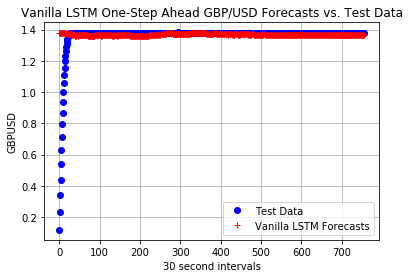

In [151]:
forecasts_van5=np.reshape(forecasts_van5,-1)
plt.plot(forecasts_van5,'bo',label='Test Data')
plt.plot(raw_test,'r+',label="Vanilla LSTM Forecasts")
plt.xlabel('30 second intervals')
plt.ylabel('GBPUSD')
plt.title('Vanilla LSTM One-Step Ahead GBP/USD Forecasts vs. Test Data')
plt.legend(loc="lowerright")
plt.grid(True)

In [147]:
rmse_test = np.sqrt(mean_squared_error(forecasts_van5, raw_test))
rmse_test

ValueError: Found array with dim 3. Estimator expected <= 2.

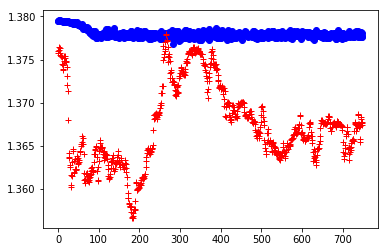

In [495]:
plt.plot(forecasts_van5[7:],'bo')
plt.plot(raw_test[7:],'r+')

In [528]:
mean_abs_van5=((forecasts_van5-TWAP_test)/TWAP_test)*100.0
mean_abs_van5_=abs(mean_abs_van5)
np.mean(mean_abs_van5_)

1.2302827395064981

## Vanilla LSTM - 50 Neurons

In [496]:
n_steps=1
n_features=1
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [497]:
forecasts_van50=[]

In [498]:
for i in range(test_size):
    n_steps=1
    X, y = split_sequence(raw_seq[0:train_size+i], n_steps)
    n_features=1
    X=X.reshape((X.shape[0], X.shape[1], n_features))
    model.fit(X, y, epochs=30, batch_size=512,verbose=1)
    # demonstrate prediction
    x_input = raw_seq[train_size-1]
    x_input = x_input.reshape((1, n_steps, n_features))
    yhat = model.predict(x_input, verbose=0)
    forecasts_van50.append(yhat)

Epoch 1/30
1762/1762 [==============================] - 3s 2ms/step - loss: 2.1235
Epoch 2/30
1762/1762 [==============================] - 0s 13us/step - loss: 2.0715
Epoch 3/30
1762/1762 [==============================] - 0s 14us/step - loss: 2.0209
Epoch 4/30
1762/1762 [==============================] - 0s 13us/step - loss: 1.9729
Epoch 5/30
1762/1762 [==============================] - 0s 12us/step - loss: 1.9261
Epoch 6/30
1762/1762 [==============================] - 0s 12us/step - loss: 1.8802
Epoch 7/30
1762/1762 [==============================] - 0s 12us/step - loss: 1.8350
Epoch 8/30
1762/1762 [==============================] - 0s 14us/step - loss: 1.7902
Epoch 9/30
1762/1762 [==============================] - 0s 13us/step - loss: 1.7459
Epoch 10/30
1762/1762 [==============================] - 0s 13us/step - loss: 1.7025
Epoch 11/30
1762/1762 [==============================] - 0s 13us/step - loss: 1.6595
Epoch 12/30
1762/1762 [==============================] - 0s 12us/step - los

1768/1768 [==============================] - 0s 13us/step - loss: 3.4806e-05
Epoch 9/30
1768/1768 [==============================] - 0s 12us/step - loss: 3.4804e-05
Epoch 10/30
1768/1768 [==============================] - 0s 13us/step - loss: 3.4802e-05
Epoch 11/30
1768/1768 [==============================] - 0s 18us/step - loss: 3.4800e-05
Epoch 12/30
1768/1768 [==============================] - 0s 14us/step - loss: 3.4798e-05
Epoch 13/30
1768/1768 [==============================] - 0s 13us/step - loss: 3.4795e-05
Epoch 14/30
1768/1768 [==============================] - 0s 13us/step - loss: 3.4793e-05
Epoch 15/30
1768/1768 [==============================] - 0s 14us/step - loss: 3.4791e-05
Epoch 16/30
1768/1768 [==============================] - 0s 13us/step - loss: 3.4788e-05
Epoch 17/30
1768/1768 [==============================] - 0s 14us/step - loss: 3.4786e-05
Epoch 18/30
1768/1768 [==============================] - 0s 15us/step - loss: 3.4784e-05
Epoch 19/30
1768/1768 [===========

1774/1774 [==============================] - 0s 13us/step - loss: 3.4166e-05
Epoch 13/30
1774/1774 [==============================] - 0s 15us/step - loss: 3.4163e-05
Epoch 14/30
1774/1774 [==============================] - 0s 13us/step - loss: 3.4160e-05
Epoch 15/30
1774/1774 [==============================] - 0s 13us/step - loss: 3.4155e-05
Epoch 16/30
1774/1774 [==============================] - 0s 13us/step - loss: 3.4154e-05
Epoch 17/30
1774/1774 [==============================] - 0s 14us/step - loss: 3.4148e-05
Epoch 18/30
1774/1774 [==============================] - 0s 14us/step - loss: 3.4145e-05
Epoch 19/30
1774/1774 [==============================] - 0s 14us/step - loss: 3.4141e-05
Epoch 20/30
1774/1774 [==============================] - 0s 13us/step - loss: 3.4138e-05
Epoch 21/30
1774/1774 [==============================] - 0s 14us/step - loss: 3.4135e-05
Epoch 22/30
1774/1774 [==============================] - 0s 13us/step - loss: 3.4133e-05
Epoch 23/30
1774/1774 [==========

1780/1780 [==============================] - 0s 12us/step - loss: 3.3230e-05
Epoch 17/30
1780/1780 [==============================] - 0s 14us/step - loss: 3.3224e-05
Epoch 18/30
1780/1780 [==============================] - 0s 12us/step - loss: 3.3222e-05
Epoch 19/30
1780/1780 [==============================] - 0s 13us/step - loss: 3.3216e-05
Epoch 20/30
1780/1780 [==============================] - 0s 14us/step - loss: 3.3207e-05
Epoch 21/30
1780/1780 [==============================] - 0s 13us/step - loss: 3.3202e-05
Epoch 22/30
1780/1780 [==============================] - 0s 12us/step - loss: 3.3195e-05
Epoch 23/30
1780/1780 [==============================] - 0s 15us/step - loss: 3.3192e-05
Epoch 24/30
1780/1780 [==============================] - 0s 14us/step - loss: 3.3186e-05
Epoch 25/30
1780/1780 [==============================] - 0s 13us/step - loss: 3.3179e-05
Epoch 26/30
1780/1780 [==============================] - 0s 13us/step - loss: 3.3180e-05
Epoch 27/30
1780/1780 [==========

1786/1786 [==============================] - 0s 14us/step - loss: 3.1914e-05
Epoch 21/30
1786/1786 [==============================] - 0s 13us/step - loss: 3.1907e-05
Epoch 22/30
1786/1786 [==============================] - 0s 14us/step - loss: 3.1896e-05
Epoch 23/30
1786/1786 [==============================] - 0s 14us/step - loss: 3.1892e-05
Epoch 24/30
1786/1786 [==============================] - 0s 15us/step - loss: 3.1885e-05
Epoch 25/30
1786/1786 [==============================] - 0s 14us/step - loss: 3.1875e-05
Epoch 26/30
1786/1786 [==============================] - 0s 13us/step - loss: 3.1866e-05
Epoch 27/30
1786/1786 [==============================] - 0s 13us/step - loss: 3.1860e-05
Epoch 28/30
1786/1786 [==============================] - 0s 12us/step - loss: 3.1854e-05
Epoch 29/30
1786/1786 [==============================] - 0s 13us/step - loss: 3.1840e-05
Epoch 30/30
1786/1786 [==============================] - 0s 13us/step - loss: 3.1839e-05
Epoch 1/30
1787/1787 [===========

1792/1792 [==============================] - 0s 13us/step - loss: 3.0123e-05
Epoch 25/30
1792/1792 [==============================] - 0s 13us/step - loss: 3.0114e-05
Epoch 26/30
1792/1792 [==============================] - 0s 15us/step - loss: 3.0102e-05
Epoch 27/30
1792/1792 [==============================] - 0s 13us/step - loss: 3.0091e-05
Epoch 28/30
1792/1792 [==============================] - 0s 13us/step - loss: 3.0081e-05
Epoch 29/30
1792/1792 [==============================] - 0s 14us/step - loss: 3.0066e-05
Epoch 30/30
1792/1792 [==============================] - 0s 13us/step - loss: 3.0061e-05
Epoch 1/30
1793/1793 [==============================] - 0s 10us/step - loss: 3.0038e-05
Epoch 2/30
1793/1793 [==============================] - 0s 11us/step - loss: 3.0022e-05
Epoch 3/30
1793/1793 [==============================] - 0s 12us/step - loss: 3.0009e-05
Epoch 4/30
1793/1793 [==============================] - 0s 12us/step - loss: 2.9999e-05
Epoch 5/30
1793/1793 [===============

1798/1798 [==============================] - 0s 15us/step - loss: 2.7778e-05
Epoch 29/30
1798/1798 [==============================] - 0s 13us/step - loss: 2.7764e-05
Epoch 30/30
1798/1798 [==============================] - 0s 13us/step - loss: 2.7747e-05
Epoch 1/30
1799/1799 [==============================] - 0s 10us/step - loss: 2.7739e-05
Epoch 2/30
1799/1799 [==============================] - 0s 12us/step - loss: 2.7711e-05
Epoch 3/30
1799/1799 [==============================] - 0s 14us/step - loss: 2.7698e-05
Epoch 4/30
1799/1799 [==============================] - 0s 12us/step - loss: 2.7692e-05
Epoch 5/30
1799/1799 [==============================] - 0s 13us/step - loss: 2.7676e-05
Epoch 6/30
1799/1799 [==============================] - 0s 12us/step - loss: 2.7652e-05
Epoch 7/30
1799/1799 [==============================] - 0s 12us/step - loss: 2.7636e-05
Epoch 8/30
1799/1799 [==============================] - 0s 12us/step - loss: 2.7625e-05
Epoch 9/30
1799/1799 [===================

1805/1805 [==============================] - 0s 10us/step - loss: 2.4731e-05
Epoch 2/30
1805/1805 [==============================] - 0s 10us/step - loss: 2.4711e-05
Epoch 3/30
1805/1805 [==============================] - 0s 12us/step - loss: 2.4690e-05
Epoch 4/30
1805/1805 [==============================] - 0s 12us/step - loss: 2.4669e-05
Epoch 5/30
1805/1805 [==============================] - 0s 13us/step - loss: 2.4654e-05
Epoch 6/30
1805/1805 [==============================] - 0s 13us/step - loss: 2.4638e-05
Epoch 7/30
1805/1805 [==============================] - 0s 12us/step - loss: 2.4614e-05
Epoch 8/30
1805/1805 [==============================] - 0s 13us/step - loss: 2.4601e-05
Epoch 9/30
1805/1805 [==============================] - 0s 12us/step - loss: 2.4575e-05
Epoch 10/30
1805/1805 [==============================] - 0s 14us/step - loss: 2.4565e-05
Epoch 11/30
1805/1805 [==============================] - 0s 13us/step - loss: 2.4547e-05
Epoch 12/30
1805/1805 [==================

1811/1811 [==============================] - 0s 12us/step - loss: 2.0949e-05
Epoch 5/30
1811/1811 [==============================] - 0s 12us/step - loss: 2.0924e-05
Epoch 6/30
1811/1811 [==============================] - 0s 12us/step - loss: 2.0898e-05
Epoch 7/30
1811/1811 [==============================] - 0s 13us/step - loss: 2.0872e-05
Epoch 8/30
1811/1811 [==============================] - 0s 12us/step - loss: 2.0854e-05
Epoch 9/30
1811/1811 [==============================] - 0s 12us/step - loss: 2.0826e-05
Epoch 10/30
1811/1811 [==============================] - 0s 12us/step - loss: 2.0823e-05
Epoch 11/30
1811/1811 [==============================] - 0s 14us/step - loss: 2.0804e-05
Epoch 12/30
1811/1811 [==============================] - 0s 13us/step - loss: 2.0772e-05
Epoch 13/30
1811/1811 [==============================] - 0s 15us/step - loss: 2.0738e-05
Epoch 14/30
1811/1811 [==============================] - 0s 14us/step - loss: 2.0717e-05
Epoch 15/30
1811/1811 [===============

1817/1817 [==============================] - 0s 13us/step - loss: 1.6522e-05
Epoch 8/30
1817/1817 [==============================] - 0s 13us/step - loss: 1.6518e-05
Epoch 9/30
1817/1817 [==============================] - 0s 14us/step - loss: 1.6492e-05
Epoch 10/30
1817/1817 [==============================] - 0s 13us/step - loss: 1.6475e-05
Epoch 11/30
1817/1817 [==============================] - 0s 14us/step - loss: 1.6424e-05
Epoch 12/30
1817/1817 [==============================] - 0s 14us/step - loss: 1.6416e-05
Epoch 13/30
1817/1817 [==============================] - 0s 14us/step - loss: 1.6382e-05
Epoch 14/30
1817/1817 [==============================] - 0s 14us/step - loss: 1.6343e-05
Epoch 15/30
1817/1817 [==============================] - 0s 14us/step - loss: 1.6330e-05
Epoch 16/30
1817/1817 [==============================] - 0s 14us/step - loss: 1.6290e-05
Epoch 17/30
1817/1817 [==============================] - 0s 13us/step - loss: 1.6289e-05
Epoch 18/30
1817/1817 [============

1823/1823 [==============================] - 0s 13us/step - loss: 1.1819e-05
Epoch 12/30
1823/1823 [==============================] - 0s 13us/step - loss: 1.1798e-05
Epoch 13/30
1823/1823 [==============================] - 0s 14us/step - loss: 1.1767e-05
Epoch 14/30
1823/1823 [==============================] - 0s 12us/step - loss: 1.1762e-05
Epoch 15/30
1823/1823 [==============================] - 0s 13us/step - loss: 1.1755e-05
Epoch 16/30
1823/1823 [==============================] - 0s 13us/step - loss: 1.1694e-05
Epoch 17/30
1823/1823 [==============================] - 0s 13us/step - loss: 1.1705e-05
Epoch 18/30
1823/1823 [==============================] - 0s 13us/step - loss: 1.1644e-05
Epoch 19/30
1823/1823 [==============================] - 0s 13us/step - loss: 1.1616e-05
Epoch 20/30
1823/1823 [==============================] - 0s 13us/step - loss: 1.1597e-05
Epoch 21/30
1823/1823 [==============================] - 0s 13us/step - loss: 1.1567e-05
Epoch 22/30
1823/1823 [==========

1829/1829 [==============================] - 0s 13us/step - loss: 7.4965e-06
Epoch 16/30
1829/1829 [==============================] - 0s 14us/step - loss: 7.4752e-06
Epoch 17/30
1829/1829 [==============================] - 0s 13us/step - loss: 7.4603e-06
Epoch 18/30
1829/1829 [==============================] - 0s 12us/step - loss: 7.4265e-06
Epoch 19/30
1829/1829 [==============================] - 0s 13us/step - loss: 7.4118e-06
Epoch 20/30
1829/1829 [==============================] - 0s 15us/step - loss: 7.3915e-06
Epoch 21/30
1829/1829 [==============================] - 0s 12us/step - loss: 7.3963e-06
Epoch 22/30
1829/1829 [==============================] - 0s 13us/step - loss: 7.3547e-06
Epoch 23/30
1829/1829 [==============================] - 0s 13us/step - loss: 7.3211e-06
Epoch 24/30
1829/1829 [==============================] - 0s 14us/step - loss: 7.3282e-06
Epoch 25/30
1829/1829 [==============================] - 0s 13us/step - loss: 7.2815e-06
Epoch 26/30
1829/1829 [==========

1835/1835 [==============================] - 0s 13us/step - loss: 4.2795e-06
Epoch 20/30
1835/1835 [==============================] - 0s 13us/step - loss: 4.2520e-06
Epoch 21/30
1835/1835 [==============================] - 0s 14us/step - loss: 4.2581e-06
Epoch 22/30
1835/1835 [==============================] - 0s 12us/step - loss: 4.2268e-06
Epoch 23/30
1835/1835 [==============================] - 0s 15us/step - loss: 4.2092e-06
Epoch 24/30
1835/1835 [==============================] - 0s 13us/step - loss: 4.2027e-06
Epoch 25/30
1835/1835 [==============================] - 0s 12us/step - loss: 4.1866e-06
Epoch 26/30
1835/1835 [==============================] - 0s 12us/step - loss: 4.1804e-06
Epoch 27/30
1835/1835 [==============================] - 0s 12us/step - loss: 4.1621e-06
Epoch 28/30
1835/1835 [==============================] - 0s 12us/step - loss: 4.1589e-06
Epoch 29/30
1835/1835 [==============================] - 0s 12us/step - loss: 4.1340e-06
Epoch 30/30
1835/1835 [==========

1841/1841 [==============================] - 0s 14us/step - loss: 2.5098e-06
Epoch 24/30
1841/1841 [==============================] - 0s 15us/step - loss: 2.5507e-06
Epoch 25/30
1841/1841 [==============================] - 0s 13us/step - loss: 2.5091e-06
Epoch 26/30
1841/1841 [==============================] - 0s 14us/step - loss: 2.5343e-06
Epoch 27/30
1841/1841 [==============================] - 0s 14us/step - loss: 2.4926e-06
Epoch 28/30
1841/1841 [==============================] - 0s 15us/step - loss: 2.4897e-06
Epoch 29/30
1841/1841 [==============================] - 0s 13us/step - loss: 2.4567e-06
Epoch 30/30
1841/1841 [==============================] - 0s 17us/step - loss: 2.4607e-06
Epoch 1/30
1842/1842 [==============================] - 0s 11us/step - loss: 2.4404e-06
Epoch 2/30
1842/1842 [==============================] - 0s 11us/step - loss: 2.4534e-06
Epoch 3/30
1842/1842 [==============================] - 0s 12us/step - loss: 2.4252e-06
Epoch 4/30
1842/1842 [==============

1847/1847 [==============================] - 0s 13us/step - loss: 1.8634e-06
Epoch 28/30
1847/1847 [==============================] - 0s 14us/step - loss: 1.8712e-06
Epoch 29/30
1847/1847 [==============================] - 0s 14us/step - loss: 1.8552e-06
Epoch 30/30
1847/1847 [==============================] - 0s 13us/step - loss: 1.8475e-06
Epoch 1/30
1848/1848 [==============================] - 0s 10us/step - loss: 1.8598e-06
Epoch 2/30
1848/1848 [==============================] - 0s 11us/step - loss: 1.8453e-06
Epoch 3/30
1848/1848 [==============================] - 0s 12us/step - loss: 1.8398e-06
Epoch 4/30
1848/1848 [==============================] - 0s 12us/step - loss: 1.8413e-06
Epoch 5/30
1848/1848 [==============================] - 0s 13us/step - loss: 1.8363e-06
Epoch 6/30
1848/1848 [==============================] - 0s 13us/step - loss: 1.8355e-06
Epoch 7/30
1848/1848 [==============================] - 0s 12us/step - loss: 1.8402e-06
Epoch 8/30
1848/1848 [==================

1854/1854 [==============================] - 0s 13us/step - loss: 1.7894e-06
Epoch 2/30
1854/1854 [==============================] - 0s 13us/step - loss: 1.7472e-06
Epoch 3/30
1854/1854 [==============================] - 0s 15us/step - loss: 1.7877e-06
Epoch 4/30
1854/1854 [==============================] - 0s 13us/step - loss: 1.7739e-06
Epoch 5/30
1854/1854 [==============================] - 0s 13us/step - loss: 1.7518e-06
Epoch 6/30
1854/1854 [==============================] - 0s 15us/step - loss: 1.7327e-06
Epoch 7/30
1854/1854 [==============================] - 0s 13us/step - loss: 1.7290e-06
Epoch 8/30
1854/1854 [==============================] - 0s 14us/step - loss: 1.7549e-06
Epoch 9/30
1854/1854 [==============================] - 0s 14us/step - loss: 1.7452e-06
Epoch 10/30
1854/1854 [==============================] - 0s 13us/step - loss: 1.7334e-06
Epoch 11/30
1854/1854 [==============================] - 0s 15us/step - loss: 1.7354e-06
Epoch 12/30
1854/1854 [==================

1860/1860 [==============================] - 0s 12us/step - loss: 1.7687e-06
Epoch 6/30
1860/1860 [==============================] - 0s 12us/step - loss: 1.7366e-06
Epoch 7/30
1860/1860 [==============================] - 0s 11us/step - loss: 1.7549e-06
Epoch 8/30
1860/1860 [==============================] - 0s 12us/step - loss: 1.7458e-06
Epoch 9/30
1860/1860 [==============================] - 0s 12us/step - loss: 1.7279e-06
Epoch 10/30
1860/1860 [==============================] - 0s 11us/step - loss: 1.7702e-06
Epoch 11/30
1860/1860 [==============================] - 0s 12us/step - loss: 1.8493e-06
Epoch 12/30
1860/1860 [==============================] - 0s 13us/step - loss: 1.8394e-06
Epoch 13/30
1860/1860 [==============================] - 0s 13us/step - loss: 1.7399e-06
Epoch 14/30
1860/1860 [==============================] - 0s 14us/step - loss: 1.7620e-06
Epoch 15/30
1860/1860 [==============================] - 0s 12us/step - loss: 1.7269e-06
Epoch 16/30
1860/1860 [==============

1866/1866 [==============================] - 0s 13us/step - loss: 1.8525e-06
Epoch 9/30
1866/1866 [==============================] - 0s 12us/step - loss: 1.7609e-06
Epoch 10/30
1866/1866 [==============================] - 0s 12us/step - loss: 1.7122e-06
Epoch 11/30
1866/1866 [==============================] - 0s 13us/step - loss: 1.7175e-06
Epoch 12/30
1866/1866 [==============================] - 0s 13us/step - loss: 1.7595e-06
Epoch 13/30
1866/1866 [==============================] - 0s 13us/step - loss: 1.9165e-06
Epoch 14/30
1866/1866 [==============================] - 0s 13us/step - loss: 1.8017e-06
Epoch 15/30
1866/1866 [==============================] - 0s 12us/step - loss: 1.7493e-06
Epoch 16/30
1866/1866 [==============================] - 0s 12us/step - loss: 1.8123e-06
Epoch 17/30
1866/1866 [==============================] - 0s 12us/step - loss: 1.9134e-06
Epoch 18/30
1866/1866 [==============================] - 0s 12us/step - loss: 1.8267e-06
Epoch 19/30
1866/1866 [===========

1872/1872 [==============================] - 0s 13us/step - loss: 1.7905e-06
Epoch 13/30
1872/1872 [==============================] - 0s 12us/step - loss: 1.8212e-06
Epoch 14/30
1872/1872 [==============================] - 0s 14us/step - loss: 1.9335e-06
Epoch 15/30
1872/1872 [==============================] - 0s 13us/step - loss: 1.8286e-06
Epoch 16/30
1872/1872 [==============================] - 0s 13us/step - loss: 1.8551e-06
Epoch 17/30
1872/1872 [==============================] - 0s 13us/step - loss: 1.8090e-06
Epoch 18/30
1872/1872 [==============================] - 0s 13us/step - loss: 1.7544e-06
Epoch 19/30
1872/1872 [==============================] - 0s 12us/step - loss: 1.7115e-06
Epoch 20/30
1872/1872 [==============================] - 0s 12us/step - loss: 1.7506e-06
Epoch 21/30
1872/1872 [==============================] - 0s 12us/step - loss: 1.7238e-06
Epoch 22/30
1872/1872 [==============================] - 0s 12us/step - loss: 1.8133e-06
Epoch 23/30
1872/1872 [==========

1878/1878 [==============================] - 0s 12us/step - loss: 1.7335e-06
Epoch 17/30
1878/1878 [==============================] - 0s 11us/step - loss: 1.8035e-06
Epoch 18/30
1878/1878 [==============================] - 0s 13us/step - loss: 1.7278e-06
Epoch 19/30
1878/1878 [==============================] - 0s 12us/step - loss: 1.8428e-06
Epoch 20/30
1878/1878 [==============================] - 0s 13us/step - loss: 1.9686e-06
Epoch 21/30
1878/1878 [==============================] - 0s 12us/step - loss: 2.0494e-06
Epoch 22/30
1878/1878 [==============================] - 0s 11us/step - loss: 1.9611e-06
Epoch 23/30
1878/1878 [==============================] - 0s 12us/step - loss: 1.8987e-06
Epoch 24/30
1878/1878 [==============================] - 0s 12us/step - loss: 1.9289e-06
Epoch 25/30
1878/1878 [==============================] - 0s 12us/step - loss: 1.8215e-06
Epoch 26/30
1878/1878 [==============================] - 0s 14us/step - loss: 2.0010e-06
Epoch 27/30
1878/1878 [==========

1884/1884 [==============================] - 0s 13us/step - loss: 1.7375e-06
Epoch 21/30
1884/1884 [==============================] - 0s 12us/step - loss: 1.8044e-06
Epoch 22/30
1884/1884 [==============================] - 0s 11us/step - loss: 2.3083e-06
Epoch 23/30
1884/1884 [==============================] - 0s 12us/step - loss: 2.0990e-06
Epoch 24/30
1884/1884 [==============================] - 0s 11us/step - loss: 2.0990e-06
Epoch 25/30
1884/1884 [==============================] - 0s 12us/step - loss: 2.0161e-06
Epoch 26/30
1884/1884 [==============================] - 0s 12us/step - loss: 1.8845e-06
Epoch 27/30
1884/1884 [==============================] - 0s 14us/step - loss: 2.0666e-06
Epoch 28/30
1884/1884 [==============================] - 0s 13us/step - loss: 2.0247e-06
Epoch 29/30
1884/1884 [==============================] - 0s 13us/step - loss: 1.8793e-06
Epoch 30/30
1884/1884 [==============================] - 0s 13us/step - loss: 1.7278e-06
Epoch 1/30
1885/1885 [===========

1890/1890 [==============================] - 0s 10us/step - loss: 1.8723e-06
Epoch 25/30
1890/1890 [==============================] - 0s 11us/step - loss: 1.8195e-06
Epoch 26/30
1890/1890 [==============================] - 0s 11us/step - loss: 1.7266e-06
Epoch 27/30
1890/1890 [==============================] - 0s 10us/step - loss: 1.7933e-06
Epoch 28/30
1890/1890 [==============================] - 0s 12us/step - loss: 1.7599e-06
Epoch 29/30
1890/1890 [==============================] - 0s 12us/step - loss: 1.7237e-06
Epoch 30/30
1890/1890 [==============================] - 0s 11us/step - loss: 1.7822e-06
Epoch 1/30
1891/1891 [==============================] - 0s 12us/step - loss: 2.0767e-06
Epoch 2/30
1891/1891 [==============================] - 0s 10us/step - loss: 2.1126e-06
Epoch 3/30
1891/1891 [==============================] - 0s 10us/step - loss: 1.9031e-06
Epoch 4/30
1891/1891 [==============================] - 0s 11us/step - loss: 1.7473e-06
Epoch 5/30
1891/1891 [===============

1896/1896 [==============================] - 0s 11us/step - loss: 1.6978e-06
Epoch 29/30
1896/1896 [==============================] - 0s 12us/step - loss: 1.6894e-06
Epoch 30/30
1896/1896 [==============================] - 0s 11us/step - loss: 1.8174e-06
Epoch 1/30
1897/1897 [==============================] - 0s 10us/step - loss: 1.7024e-06
Epoch 2/30
1897/1897 [==============================] - 0s 10us/step - loss: 1.6867e-06
Epoch 3/30
1897/1897 [==============================] - 0s 10us/step - loss: 1.6924e-06
Epoch 4/30
1897/1897 [==============================] - 0s 9us/step - loss: 1.7164e-06
Epoch 5/30
1897/1897 [==============================] - 0s 10us/step - loss: 1.6975e-06
Epoch 6/30
1897/1897 [==============================] - 0s 11us/step - loss: 1.7953e-06
Epoch 7/30
1897/1897 [==============================] - 0s 10us/step - loss: 1.7464e-06
Epoch 8/30
1897/1897 [==============================] - 0s 10us/step - loss: 1.7209e-06
Epoch 9/30
1897/1897 [====================

1903/1903 [==============================] - 0s 10us/step - loss: 2.0331e-06
Epoch 3/30
1903/1903 [==============================] - 0s 10us/step - loss: 1.8934e-06
Epoch 4/30
1903/1903 [==============================] - 0s 10us/step - loss: 2.0504e-06
Epoch 5/30
1903/1903 [==============================] - 0s 10us/step - loss: 1.8096e-06
Epoch 6/30
1903/1903 [==============================] - 0s 10us/step - loss: 1.9361e-06
Epoch 7/30
1903/1903 [==============================] - 0s 11us/step - loss: 2.0214e-06
Epoch 8/30
1903/1903 [==============================] - 0s 10us/step - loss: 2.0692e-06
Epoch 9/30
1903/1903 [==============================] - 0s 10us/step - loss: 2.0589e-06
Epoch 10/30
1903/1903 [==============================] - 0s 11us/step - loss: 2.5343e-06
Epoch 11/30
1903/1903 [==============================] - 0s 9us/step - loss: 2.0253e-06
Epoch 12/30
1903/1903 [==============================] - 0s 10us/step - loss: 2.2031e-06
Epoch 13/30
1903/1903 [==================

1909/1909 [==============================] - 0s 10us/step - loss: 1.7734e-06
Epoch 7/30
1909/1909 [==============================] - 0s 10us/step - loss: 1.9106e-06
Epoch 8/30
1909/1909 [==============================] - 0s 9us/step - loss: 1.7993e-06
Epoch 9/30
1909/1909 [==============================] - 0s 9us/step - loss: 1.7927e-06
Epoch 10/30
1909/1909 [==============================] - 0s 9us/step - loss: 1.7394e-06
Epoch 11/30
1909/1909 [==============================] - 0s 9us/step - loss: 1.7025e-06
Epoch 12/30
1909/1909 [==============================] - 0s 10us/step - loss: 1.8635e-06
Epoch 13/30
1909/1909 [==============================] - 0s 9us/step - loss: 1.7603e-06
Epoch 14/30
1909/1909 [==============================] - 0s 10us/step - loss: 1.8262e-06
Epoch 15/30
1909/1909 [==============================] - 0s 9us/step - loss: 1.8317e-06
Epoch 16/30
1909/1909 [==============================] - 0s 10us/step - loss: 1.8722e-06
Epoch 17/30
1909/1909 [===================

1915/1915 [==============================] - 0s 10us/step - loss: 1.7410e-06
Epoch 11/30
1915/1915 [==============================] - 0s 11us/step - loss: 1.7715e-06
Epoch 12/30
1915/1915 [==============================] - 0s 10us/step - loss: 1.7363e-06
Epoch 13/30
1915/1915 [==============================] - 0s 11us/step - loss: 1.8102e-06
Epoch 14/30
1915/1915 [==============================] - 0s 11us/step - loss: 1.8220e-06
Epoch 15/30
1915/1915 [==============================] - 0s 10us/step - loss: 1.7750e-06
Epoch 16/30
1915/1915 [==============================] - 0s 10us/step - loss: 1.6928e-06
Epoch 17/30
1915/1915 [==============================] - 0s 11us/step - loss: 1.6789e-06
Epoch 18/30
1915/1915 [==============================] - 0s 11us/step - loss: 1.6730e-06
Epoch 19/30
1915/1915 [==============================] - 0s 11us/step - loss: 1.6904e-06
Epoch 20/30
1915/1915 [==============================] - 0s 11us/step - loss: 1.7883e-06
Epoch 21/30
1915/1915 [==========

1921/1921 [==============================] - 0s 10us/step - loss: 1.6662e-06
Epoch 15/30
1921/1921 [==============================] - 0s 10us/step - loss: 1.7830e-06
Epoch 16/30
1921/1921 [==============================] - 0s 9us/step - loss: 1.7311e-06
Epoch 17/30
1921/1921 [==============================] - 0s 9us/step - loss: 1.9008e-06
Epoch 18/30
1921/1921 [==============================] - 0s 9us/step - loss: 1.8150e-06
Epoch 19/30
1921/1921 [==============================] - 0s 10us/step - loss: 1.9090e-06
Epoch 20/30
1921/1921 [==============================] - 0s 10us/step - loss: 1.7809e-06
Epoch 21/30
1921/1921 [==============================] - 0s 10us/step - loss: 1.8587e-06
Epoch 22/30
1921/1921 [==============================] - 0s 10us/step - loss: 1.9000e-06
Epoch 23/30
1921/1921 [==============================] - 0s 10us/step - loss: 1.9617e-06
Epoch 24/30
1921/1921 [==============================] - 0s 9us/step - loss: 1.9515e-06
Epoch 25/30
1921/1921 [==============

1927/1927 [==============================] - 0s 9us/step - loss: 1.9608e-06
Epoch 19/30
1927/1927 [==============================] - 0s 10us/step - loss: 2.0334e-06
Epoch 20/30
1927/1927 [==============================] - 0s 9us/step - loss: 1.9091e-06
Epoch 21/30
1927/1927 [==============================] - 0s 9us/step - loss: 1.8339e-06
Epoch 22/30
1927/1927 [==============================] - 0s 9us/step - loss: 2.2075e-06
Epoch 23/30
1927/1927 [==============================] - 0s 9us/step - loss: 2.0568e-06
Epoch 24/30
1927/1927 [==============================] - 0s 10us/step - loss: 2.2199e-06
Epoch 25/30
1927/1927 [==============================] - 0s 10us/step - loss: 1.8740e-06
Epoch 26/30
1927/1927 [==============================] - 0s 9us/step - loss: 1.8413e-06
Epoch 27/30
1927/1927 [==============================] - 0s 10us/step - loss: 1.7869e-06
Epoch 28/30
1927/1927 [==============================] - 0s 9us/step - loss: 1.8136e-06
Epoch 29/30
1927/1927 [=================

1930/1930 [==============================] - 0s 9us/step - loss: 1.7665e-06
Epoch 22/30
1930/1930 [==============================] - 0s 9us/step - loss: 1.8120e-06
Epoch 23/30
1930/1930 [==============================] - 0s 10us/step - loss: 1.7856e-06
Epoch 24/30
1930/1930 [==============================] - 0s 9us/step - loss: 1.7790e-06
Epoch 25/30
1930/1930 [==============================] - 0s 9us/step - loss: 1.7131e-06
Epoch 26/30
1930/1930 [==============================] - 0s 10us/step - loss: 1.6801e-06
Epoch 27/30
1930/1930 [==============================] - 0s 9us/step - loss: 1.6655e-06
Epoch 28/30
1930/1930 [==============================] - 0s 10us/step - loss: 1.6778e-06
Epoch 29/30
1930/1930 [==============================] - 0s 9us/step - loss: 1.6786e-06
Epoch 30/30
1930/1930 [==============================] - 0s 10us/step - loss: 1.6614e-06
Epoch 1/30
1931/1931 [==============================] - 0s 8us/step - loss: 1.7162e-06
Epoch 2/30
1931/1931 [===================

1936/1936 [==============================] - 0s 11us/step - loss: 1.7514e-06
Epoch 27/30
1936/1936 [==============================] - 0s 10us/step - loss: 1.9855e-06
Epoch 28/30
1936/1936 [==============================] - 0s 9us/step - loss: 1.9458e-06
Epoch 29/30
1936/1936 [==============================] - 0s 11us/step - loss: 2.0440e-06
Epoch 30/30
1936/1936 [==============================] - 0s 10us/step - loss: 1.7197e-06
Epoch 1/30
1937/1937 [==============================] - 0s 9us/step - loss: 1.6887e-06
Epoch 2/30
1937/1937 [==============================] - 0s 10us/step - loss: 1.6686e-06
Epoch 3/30
1937/1937 [==============================] - 0s 10us/step - loss: 1.6568e-06
Epoch 4/30
1937/1937 [==============================] - 0s 10us/step - loss: 1.7140e-06
Epoch 5/30
1937/1937 [==============================] - 0s 10us/step - loss: 1.6539e-06
Epoch 6/30
1937/1937 [==============================] - 0s 10us/step - loss: 1.7826e-06
Epoch 7/30
1937/1937 [===================

1942/1942 [==============================] - 0s 10us/step - loss: 1.6655e-06
Epoch 1/30
1943/1943 [==============================] - 0s 9us/step - loss: 1.6557e-06
Epoch 2/30
1943/1943 [==============================] - 0s 9us/step - loss: 1.6803e-06
Epoch 3/30
1943/1943 [==============================] - 0s 9us/step - loss: 1.6627e-06
Epoch 4/30
1943/1943 [==============================] - 0s 10us/step - loss: 1.6699e-06
Epoch 5/30
1943/1943 [==============================] - 0s 9us/step - loss: 2.0550e-06
Epoch 6/30
1943/1943 [==============================] - 0s 10us/step - loss: 2.0206e-06
Epoch 7/30
1943/1943 [==============================] - 0s 10us/step - loss: 1.9218e-06
Epoch 8/30
1943/1943 [==============================] - 0s 10us/step - loss: 1.8868e-06
Epoch 9/30
1943/1943 [==============================] - 0s 9us/step - loss: 1.8081e-06
Epoch 10/30
1943/1943 [==============================] - 0s 10us/step - loss: 1.6529e-06
Epoch 11/30
1943/1943 [========================

Epoch 5/30
1949/1949 [==============================] - 0s 10us/step - loss: 1.7825e-06
Epoch 6/30
1949/1949 [==============================] - 0s 10us/step - loss: 1.8264e-06
Epoch 7/30
1949/1949 [==============================] - 0s 10us/step - loss: 1.6968e-06
Epoch 8/30
1949/1949 [==============================] - 0s 9us/step - loss: 1.8120e-06
Epoch 9/30
1949/1949 [==============================] - 0s 10us/step - loss: 1.6771e-06
Epoch 10/30
1949/1949 [==============================] - 0s 10us/step - loss: 1.7282e-06
Epoch 11/30
1949/1949 [==============================] - 0s 10us/step - loss: 1.7824e-06
Epoch 12/30
1949/1949 [==============================] - 0s 10us/step - loss: 1.7650e-06
Epoch 13/30
1949/1949 [==============================] - 0s 9us/step - loss: 1.8752e-06
Epoch 14/30
1949/1949 [==============================] - 0s 10us/step - loss: 1.8285e-06
Epoch 15/30
1949/1949 [==============================] - 0s 9us/step - loss: 1.6821e-06
Epoch 16/30
1949/1949 [======

1955/1955 [==============================] - 0s 10us/step - loss: 1.6444e-06
Epoch 10/30
1955/1955 [==============================] - 0s 10us/step - loss: 1.6414e-06
Epoch 11/30
1955/1955 [==============================] - 0s 9us/step - loss: 1.6602e-06
Epoch 12/30
1955/1955 [==============================] - 0s 10us/step - loss: 1.6419e-06
Epoch 13/30
1955/1955 [==============================] - 0s 10us/step - loss: 1.6858e-06
Epoch 14/30
1955/1955 [==============================] - 0s 9us/step - loss: 1.7270e-06
Epoch 15/30
1955/1955 [==============================] - 0s 10us/step - loss: 1.7105e-06
Epoch 16/30
1955/1955 [==============================] - 0s 9us/step - loss: 1.7165e-06
Epoch 17/30
1955/1955 [==============================] - 0s 10us/step - loss: 1.6502e-06
Epoch 18/30
1955/1955 [==============================] - 0s 10us/step - loss: 1.6567e-06
Epoch 19/30
1955/1955 [==============================] - 0s 10us/step - loss: 1.6870e-06
Epoch 20/30
1955/1955 [=============

1961/1961 [==============================] - 0s 10us/step - loss: 1.6475e-06
Epoch 15/30
1961/1961 [==============================] - 0s 9us/step - loss: 1.6519e-06
Epoch 16/30
1961/1961 [==============================] - 0s 9us/step - loss: 1.6490e-06
Epoch 17/30
1961/1961 [==============================] - 0s 10us/step - loss: 1.6720e-06
Epoch 18/30
1961/1961 [==============================] - 0s 9us/step - loss: 1.6743e-06
Epoch 19/30
1961/1961 [==============================] - 0s 10us/step - loss: 1.6987e-06
Epoch 20/30
1961/1961 [==============================] - 0s 9us/step - loss: 1.6913e-06
Epoch 21/30
1961/1961 [==============================] - 0s 10us/step - loss: 1.7434e-06
Epoch 22/30
1961/1961 [==============================] - 0s 9us/step - loss: 1.6879e-06
Epoch 23/30
1961/1961 [==============================] - 0s 9us/step - loss: 1.6631e-06
Epoch 24/30
1961/1961 [==============================] - 0s 10us/step - loss: 1.7822e-06
Epoch 25/30
1961/1961 [================

1967/1967 [==============================] - 0s 9us/step - loss: 1.6647e-06
Epoch 19/30
1967/1967 [==============================] - 0s 10us/step - loss: 1.6625e-06
Epoch 20/30
1967/1967 [==============================] - 0s 10us/step - loss: 1.7494e-06
Epoch 21/30
1967/1967 [==============================] - 0s 10us/step - loss: 2.2144e-06
Epoch 22/30
1967/1967 [==============================] - 0s 9us/step - loss: 2.1487e-06
Epoch 23/30
1967/1967 [==============================] - 0s 10us/step - loss: 1.8583e-06
Epoch 24/30
1967/1967 [==============================] - 0s 10us/step - loss: 1.8561e-06
Epoch 25/30
1967/1967 [==============================] - 0s 11us/step - loss: 1.6615e-06
Epoch 26/30
1967/1967 [==============================] - 0s 10us/step - loss: 1.6697e-06
Epoch 27/30
1967/1967 [==============================] - 0s 10us/step - loss: 1.8541e-06
Epoch 28/30
1967/1967 [==============================] - 0s 10us/step - loss: 1.8865e-06
Epoch 29/30
1967/1967 [============

1973/1973 [==============================] - 0s 10us/step - loss: 2.0247e-06
Epoch 24/30
1973/1973 [==============================] - 0s 10us/step - loss: 1.9816e-06
Epoch 25/30
1973/1973 [==============================] - 0s 9us/step - loss: 1.8508e-06
Epoch 26/30
1973/1973 [==============================] - 0s 9us/step - loss: 1.7820e-06
Epoch 27/30
1973/1973 [==============================] - 0s 9us/step - loss: 1.6813e-06
Epoch 28/30
1973/1973 [==============================] - 0s 9us/step - loss: 1.6625e-06
Epoch 29/30
1973/1973 [==============================] - 0s 9us/step - loss: 1.6341e-06
Epoch 30/30
1973/1973 [==============================] - 0s 9us/step - loss: 1.6293e-06
Epoch 1/30
1974/1974 [==============================] - 0s 9us/step - loss: 1.6703e-06
Epoch 2/30
1974/1974 [==============================] - 0s 9us/step - loss: 1.6331e-06
Epoch 3/30
1974/1974 [==============================] - 0s 10us/step - loss: 1.6714e-06
Epoch 4/30
1974/1974 [======================

1979/1979 [==============================] - 0s 9us/step - loss: 1.7088e-06
Epoch 29/30
1979/1979 [==============================] - 0s 10us/step - loss: 1.7090e-06
Epoch 30/30
1979/1979 [==============================] - 0s 10us/step - loss: 1.6297e-06
Epoch 1/30
1980/1980 [==============================] - 0s 9us/step - loss: 1.6346e-06
Epoch 2/30
1980/1980 [==============================] - 0s 9us/step - loss: 1.6827e-06
Epoch 3/30
1980/1980 [==============================] - 0s 9us/step - loss: 1.6453e-06
Epoch 4/30
1980/1980 [==============================] - 0s 9us/step - loss: 1.6355e-06
Epoch 5/30
1980/1980 [==============================] - 0s 9us/step - loss: 1.6473e-06
Epoch 6/30
1980/1980 [==============================] - 0s 10us/step - loss: 1.6504e-06
Epoch 7/30
1980/1980 [==============================] - 0s 10us/step - loss: 1.6638e-06
Epoch 8/30
1980/1980 [==============================] - 0s 9us/step - loss: 1.7003e-06
Epoch 9/30
1980/1980 [==========================

1983/1983 [==============================] - 0s 9us/step - loss: 1.7218e-06
Epoch 2/30
1983/1983 [==============================] - 0s 9us/step - loss: 1.7871e-06
Epoch 3/30
1983/1983 [==============================] - 0s 9us/step - loss: 1.6174e-06
Epoch 4/30
1983/1983 [==============================] - 0s 9us/step - loss: 1.6250e-06
Epoch 5/30
1983/1983 [==============================] - 0s 10us/step - loss: 1.6560e-06
Epoch 6/30
1983/1983 [==============================] - 0s 10us/step - loss: 1.9731e-06
Epoch 7/30
1983/1983 [==============================] - 0s 9us/step - loss: 1.8222e-06
Epoch 8/30
1983/1983 [==============================] - 0s 9us/step - loss: 1.8889e-06
Epoch 9/30
1983/1983 [==============================] - 0s 10us/step - loss: 1.7613e-06
Epoch 10/30
1983/1983 [==============================] - 0s 9us/step - loss: 1.8521e-06
Epoch 11/30
1983/1983 [==============================] - 0s 9us/step - loss: 1.9077e-06
Epoch 12/30
1983/1983 [==========================

1989/1989 [==============================] - 0s 11us/step - loss: 1.6873e-06
Epoch 6/30
1989/1989 [==============================] - 0s 12us/step - loss: 1.7028e-06
Epoch 7/30
1989/1989 [==============================] - 0s 11us/step - loss: 1.7052e-06
Epoch 8/30
1989/1989 [==============================] - 0s 12us/step - loss: 1.6567e-06
Epoch 9/30
1989/1989 [==============================] - 0s 11us/step - loss: 1.7571e-06
Epoch 10/30
1989/1989 [==============================] - 0s 13us/step - loss: 1.7458e-06
Epoch 11/30
1989/1989 [==============================] - 0s 13us/step - loss: 1.6390e-06
Epoch 12/30
1989/1989 [==============================] - 0s 14us/step - loss: 1.6287e-06
Epoch 13/30
1989/1989 [==============================] - 0s 13us/step - loss: 1.6788e-06
Epoch 14/30
1989/1989 [==============================] - 0s 13us/step - loss: 1.6332e-06
Epoch 15/30
1989/1989 [==============================] - 0s 12us/step - loss: 1.6366e-06
Epoch 16/30
1989/1989 [==============

1995/1995 [==============================] - 0s 11us/step - loss: 1.6666e-06
Epoch 10/30
1995/1995 [==============================] - 0s 13us/step - loss: 1.6268e-06
Epoch 11/30
1995/1995 [==============================] - 0s 12us/step - loss: 1.6651e-06
Epoch 12/30
1995/1995 [==============================] - 0s 13us/step - loss: 1.6849e-06
Epoch 13/30
1995/1995 [==============================] - 0s 14us/step - loss: 1.6782e-06
Epoch 14/30
1995/1995 [==============================] - 0s 13us/step - loss: 1.8009e-06
Epoch 15/30
1995/1995 [==============================] - 0s 12us/step - loss: 1.6973e-06
Epoch 16/30
1995/1995 [==============================] - 0s 14us/step - loss: 1.6966e-06
Epoch 17/30
1995/1995 [==============================] - 0s 14us/step - loss: 1.9871e-06
Epoch 18/30
1995/1995 [==============================] - 0s 12us/step - loss: 1.8314e-06
Epoch 19/30
1995/1995 [==============================] - 0s 12us/step - loss: 1.7950e-06
Epoch 20/30
1995/1995 [==========

2001/2001 [==============================] - 0s 12us/step - loss: 1.6096e-06
Epoch 14/30
2001/2001 [==============================] - 0s 14us/step - loss: 1.6193e-06
Epoch 15/30
2001/2001 [==============================] - 0s 11us/step - loss: 1.6131e-06
Epoch 16/30
2001/2001 [==============================] - 0s 12us/step - loss: 1.6317e-06
Epoch 17/30
2001/2001 [==============================] - 0s 12us/step - loss: 1.6466e-06
Epoch 18/30
2001/2001 [==============================] - 0s 12us/step - loss: 1.6653e-06
Epoch 19/30
2001/2001 [==============================] - 0s 12us/step - loss: 1.6670e-06
Epoch 20/30
2001/2001 [==============================] - 0s 11us/step - loss: 1.6256e-06
Epoch 21/30
2001/2001 [==============================] - 0s 12us/step - loss: 1.6065e-06
Epoch 22/30
2001/2001 [==============================] - 0s 12us/step - loss: 1.6576e-06
Epoch 23/30
2001/2001 [==============================] - 0s 11us/step - loss: 1.7776e-06
Epoch 24/30
2001/2001 [==========

2007/2007 [==============================] - 0s 13us/step - loss: 1.8929e-06
Epoch 18/30
2007/2007 [==============================] - 0s 12us/step - loss: 1.8662e-06
Epoch 19/30
2007/2007 [==============================] - 0s 13us/step - loss: 1.9829e-06
Epoch 20/30
2007/2007 [==============================] - 0s 13us/step - loss: 1.8625e-06
Epoch 21/30
2007/2007 [==============================] - 0s 12us/step - loss: 1.9871e-06
Epoch 22/30
2007/2007 [==============================] - 0s 12us/step - loss: 1.8199e-06
Epoch 23/30
2007/2007 [==============================] - 0s 13us/step - loss: 1.7614e-06
Epoch 24/30
2007/2007 [==============================] - 0s 11us/step - loss: 1.7033e-06
Epoch 25/30
2007/2007 [==============================] - 0s 12us/step - loss: 1.7211e-06
Epoch 26/30
2007/2007 [==============================] - 0s 13us/step - loss: 1.6878e-06
Epoch 27/30
2007/2007 [==============================] - 0s 11us/step - loss: 1.7141e-06
Epoch 28/30
2007/2007 [==========

2013/2013 [==============================] - 0s 11us/step - loss: 1.7777e-06
Epoch 22/30
2013/2013 [==============================] - 0s 12us/step - loss: 1.8570e-06
Epoch 23/30
2013/2013 [==============================] - 0s 12us/step - loss: 1.8113e-06
Epoch 24/30
2013/2013 [==============================] - 0s 11us/step - loss: 1.9110e-06
Epoch 25/30
2013/2013 [==============================] - 0s 12us/step - loss: 1.8758e-06
Epoch 26/30
2013/2013 [==============================] - 0s 13us/step - loss: 1.8936e-06
Epoch 27/30
2013/2013 [==============================] - 0s 13us/step - loss: 1.7575e-06
Epoch 28/30
2013/2013 [==============================] - 0s 12us/step - loss: 1.9424e-06
Epoch 29/30
2013/2013 [==============================] - 0s 12us/step - loss: 1.6326e-06
Epoch 30/30
2013/2013 [==============================] - 0s 11us/step - loss: 1.6456e-06
Epoch 1/30
2014/2014 [==============================] - 0s 10us/step - loss: 1.6628e-06
Epoch 2/30
2014/2014 [============

2019/2019 [==============================] - 0s 12us/step - loss: 1.6604e-06
Epoch 26/30
2019/2019 [==============================] - 0s 12us/step - loss: 1.6204e-06
Epoch 27/30
2019/2019 [==============================] - 0s 12us/step - loss: 1.6093e-06
Epoch 28/30
2019/2019 [==============================] - 0s 12us/step - loss: 1.6012e-06
Epoch 29/30
2019/2019 [==============================] - 0s 13us/step - loss: 1.6647e-06
Epoch 30/30
2019/2019 [==============================] - 0s 12us/step - loss: 1.6288e-06
Epoch 1/30
2020/2020 [==============================] - 0s 9us/step - loss: 1.7599e-06
Epoch 2/30
2020/2020 [==============================] - 0s 10us/step - loss: 1.6819e-06
Epoch 3/30
2020/2020 [==============================] - 0s 10us/step - loss: 1.7686e-06
Epoch 4/30
2020/2020 [==============================] - 0s 11us/step - loss: 1.6188e-06
Epoch 5/30
2020/2020 [==============================] - 0s 11us/step - loss: 1.6372e-06
Epoch 6/30
2020/2020 [=================

2025/2025 [==============================] - 0s 13us/step - loss: 1.7100e-06
Epoch 30/30
2025/2025 [==============================] - 0s 12us/step - loss: 1.7319e-06
Epoch 1/30
2026/2026 [==============================] - 0s 10us/step - loss: 1.6742e-06
Epoch 2/30
2026/2026 [==============================] - 0s 10us/step - loss: 1.6533e-06
Epoch 3/30
2026/2026 [==============================] - 0s 11us/step - loss: 1.7560e-06
Epoch 4/30
2026/2026 [==============================] - 0s 11us/step - loss: 1.7847e-06
Epoch 5/30
2026/2026 [==============================] - 0s 12us/step - loss: 1.6522e-06
Epoch 6/30
2026/2026 [==============================] - 0s 11us/step - loss: 1.6573e-06
Epoch 7/30
2026/2026 [==============================] - 0s 12us/step - loss: 1.7818e-06
Epoch 8/30
2026/2026 [==============================] - 0s 12us/step - loss: 1.7915e-06
Epoch 9/30
2026/2026 [==============================] - 0s 12us/step - loss: 1.8056e-06
Epoch 10/30
2026/2026 [===================

2032/2032 [==============================] - 0s 11us/step - loss: 1.6636e-06
Epoch 4/30
2032/2032 [==============================] - 0s 10us/step - loss: 2.0291e-06
Epoch 5/30
2032/2032 [==============================] - 0s 11us/step - loss: 1.6884e-06
Epoch 6/30
2032/2032 [==============================] - 0s 11us/step - loss: 1.7048e-06
Epoch 7/30
2032/2032 [==============================] - 0s 12us/step - loss: 2.0254e-06
Epoch 8/30
2032/2032 [==============================] - 0s 11us/step - loss: 1.7705e-06
Epoch 9/30
2032/2032 [==============================] - 0s 12us/step - loss: 2.0501e-06
Epoch 10/30
2032/2032 [==============================] - 0s 12us/step - loss: 2.0790e-06
Epoch 11/30
2032/2032 [==============================] - 0s 12us/step - loss: 2.0920e-06
Epoch 12/30
2032/2032 [==============================] - 0s 11us/step - loss: 1.7280e-06
Epoch 13/30
2032/2032 [==============================] - 0s 11us/step - loss: 1.6646e-06
Epoch 14/30
2032/2032 [================

2038/2038 [==============================] - 0s 11us/step - loss: 1.8738e-06
Epoch 8/30
2038/2038 [==============================] - 0s 11us/step - loss: 1.7953e-06
Epoch 9/30
2038/2038 [==============================] - 0s 12us/step - loss: 1.6254e-06
Epoch 10/30
2038/2038 [==============================] - 0s 11us/step - loss: 1.6357e-06
Epoch 11/30
2038/2038 [==============================] - 0s 12us/step - loss: 1.6069e-06
Epoch 12/30
2038/2038 [==============================] - 0s 13us/step - loss: 1.7072e-06
Epoch 13/30
2038/2038 [==============================] - 0s 12us/step - loss: 1.7048e-06
Epoch 14/30
2038/2038 [==============================] - 0s 14us/step - loss: 1.8015e-06
Epoch 15/30
2038/2038 [==============================] - 0s 12us/step - loss: 1.6787e-06
Epoch 16/30
2038/2038 [==============================] - 0s 12us/step - loss: 1.6550e-06
Epoch 17/30
2038/2038 [==============================] - 0s 13us/step - loss: 1.6938e-06
Epoch 18/30
2038/2038 [============

2044/2044 [==============================] - 0s 11us/step - loss: 1.5998e-06
Epoch 12/30
2044/2044 [==============================] - 0s 11us/step - loss: 1.6128e-06
Epoch 13/30
2044/2044 [==============================] - 0s 12us/step - loss: 1.6164e-06
Epoch 14/30
2044/2044 [==============================] - 0s 12us/step - loss: 1.5939e-06
Epoch 15/30
2044/2044 [==============================] - 0s 12us/step - loss: 1.5922e-06
Epoch 16/30
2044/2044 [==============================] - 0s 12us/step - loss: 1.6632e-06
Epoch 17/30
2044/2044 [==============================] - 0s 12us/step - loss: 1.7334e-06
Epoch 18/30
2044/2044 [==============================] - 0s 13us/step - loss: 1.6881e-06
Epoch 19/30
2044/2044 [==============================] - 0s 11us/step - loss: 1.6279e-06
Epoch 20/30
2044/2044 [==============================] - 0s 13us/step - loss: 1.6129e-06
Epoch 21/30
2044/2044 [==============================] - 0s 11us/step - loss: 1.6104e-06
Epoch 22/30
2044/2044 [==========

2050/2050 [==============================] - 0s 13us/step - loss: 1.8588e-06
Epoch 16/30
2050/2050 [==============================] - 0s 14us/step - loss: 2.2545e-06
Epoch 17/30
2050/2050 [==============================] - 0s 13us/step - loss: 1.5922e-06
Epoch 18/30
2050/2050 [==============================] - 0s 13us/step - loss: 3.5212e-06
Epoch 19/30
2050/2050 [==============================] - 0s 14us/step - loss: 3.4540e-06
Epoch 20/30
2050/2050 [==============================] - 0s 14us/step - loss: 2.4100e-06
Epoch 21/30
2050/2050 [==============================] - 0s 15us/step - loss: 3.3034e-06
Epoch 22/30
2050/2050 [==============================] - 0s 13us/step - loss: 2.8981e-06
Epoch 23/30
2050/2050 [==============================] - 0s 14us/step - loss: 3.5785e-06
Epoch 24/30
2050/2050 [==============================] - 0s 13us/step - loss: 2.1275e-06
Epoch 25/30
2050/2050 [==============================] - 0s 14us/step - loss: 1.8250e-06
Epoch 26/30
2050/2050 [==========

2056/2056 [==============================] - 0s 12us/step - loss: 1.8519e-06
Epoch 20/30
2056/2056 [==============================] - 0s 12us/step - loss: 1.6412e-06
Epoch 21/30
2056/2056 [==============================] - 0s 11us/step - loss: 1.7181e-06
Epoch 22/30
2056/2056 [==============================] - 0s 11us/step - loss: 1.6121e-06
Epoch 23/30
2056/2056 [==============================] - 0s 11us/step - loss: 1.6691e-06
Epoch 24/30
2056/2056 [==============================] - 0s 12us/step - loss: 1.8203e-06
Epoch 25/30
2056/2056 [==============================] - 0s 12us/step - loss: 1.8439e-06
Epoch 26/30
2056/2056 [==============================] - 0s 11us/step - loss: 1.9010e-06
Epoch 27/30
2056/2056 [==============================] - 0s 14us/step - loss: 2.2840e-06
Epoch 28/30
2056/2056 [==============================] - 0s 11us/step - loss: 1.7788e-06
Epoch 29/30
2056/2056 [==============================] - 0s 12us/step - loss: 1.6177e-06
Epoch 30/30
2056/2056 [==========

2062/2062 [==============================] - 0s 11us/step - loss: 1.8286e-06
Epoch 24/30
2062/2062 [==============================] - 0s 11us/step - loss: 1.7125e-06
Epoch 25/30
2062/2062 [==============================] - 0s 11us/step - loss: 1.6784e-06
Epoch 26/30
2062/2062 [==============================] - 0s 12us/step - loss: 1.7661e-06
Epoch 27/30
2062/2062 [==============================] - 0s 12us/step - loss: 2.2673e-06
Epoch 28/30
2062/2062 [==============================] - 0s 11us/step - loss: 2.4864e-06
Epoch 29/30
2062/2062 [==============================] - 0s 13us/step - loss: 2.0166e-06
Epoch 30/30
2062/2062 [==============================] - 0s 12us/step - loss: 1.7905e-06
Epoch 1/30
2063/2063 [==============================] - 0s 10us/step - loss: 1.7791e-06
Epoch 2/30
2063/2063 [==============================] - 0s 10us/step - loss: 1.8225e-06
Epoch 3/30
2063/2063 [==============================] - 0s 11us/step - loss: 1.6582e-06
Epoch 4/30
2063/2063 [==============

2068/2068 [==============================] - 0s 14us/step - loss: 1.6249e-06
Epoch 28/30
2068/2068 [==============================] - 0s 14us/step - loss: 1.6645e-06
Epoch 29/30
2068/2068 [==============================] - 0s 15us/step - loss: 1.6046e-06
Epoch 30/30
2068/2068 [==============================] - 0s 13us/step - loss: 1.5967e-06
Epoch 1/30
2069/2069 [==============================] - 0s 11us/step - loss: 1.7840e-06
Epoch 2/30
2069/2069 [==============================] - 0s 12us/step - loss: 1.7518e-06
Epoch 3/30
2069/2069 [==============================] - 0s 12us/step - loss: 1.7480e-06
Epoch 4/30
2069/2069 [==============================] - 0s 13us/step - loss: 2.8484e-06
Epoch 5/30
2069/2069 [==============================] - 0s 13us/step - loss: 2.7732e-06
Epoch 6/30
2069/2069 [==============================] - 0s 13us/step - loss: 2.4176e-06
Epoch 7/30
2069/2069 [==============================] - 0s 13us/step - loss: 3.3954e-06
Epoch 8/30
2069/2069 [==================

2075/2075 [==============================] - 0s 11us/step - loss: 2.5458e-06
Epoch 2/30
2075/2075 [==============================] - 0s 11us/step - loss: 2.2976e-06
Epoch 3/30
2075/2075 [==============================] - 0s 12us/step - loss: 1.9900e-06
Epoch 4/30
2075/2075 [==============================] - 0s 12us/step - loss: 2.1151e-06
Epoch 5/30
2075/2075 [==============================] - 0s 14us/step - loss: 1.9976e-06
Epoch 6/30
2075/2075 [==============================] - 0s 12us/step - loss: 2.0589e-06
Epoch 7/30
2075/2075 [==============================] - 0s 14us/step - loss: 1.7552e-06
Epoch 8/30
2075/2075 [==============================] - 0s 15us/step - loss: 2.7410e-06
Epoch 9/30
2075/2075 [==============================] - 0s 14us/step - loss: 2.0683e-06
Epoch 10/30
2075/2075 [==============================] - 0s 13us/step - loss: 1.9562e-06
Epoch 11/30
2075/2075 [==============================] - 0s 13us/step - loss: 1.6780e-06
Epoch 12/30
2075/2075 [==================

2081/2081 [==============================] - 0s 14us/step - loss: 1.7451e-06
Epoch 6/30
2081/2081 [==============================] - 0s 13us/step - loss: 1.6286e-06
Epoch 7/30
2081/2081 [==============================] - 0s 12us/step - loss: 1.5952e-06
Epoch 8/30
2081/2081 [==============================] - 0s 14us/step - loss: 2.0218e-06
Epoch 9/30
2081/2081 [==============================] - 0s 13us/step - loss: 1.7482e-06
Epoch 10/30
2081/2081 [==============================] - 0s 13us/step - loss: 1.6928e-06
Epoch 11/30
2081/2081 [==============================] - 0s 14us/step - loss: 2.1727e-06
Epoch 12/30
2081/2081 [==============================] - 0s 13us/step - loss: 2.5399e-06
Epoch 13/30
2081/2081 [==============================] - 0s 13us/step - loss: 2.2594e-06
Epoch 14/30
2081/2081 [==============================] - 0s 14us/step - loss: 2.0696e-06
Epoch 15/30
2081/2081 [==============================] - 0s 15us/step - loss: 1.8647e-06
Epoch 16/30
2081/2081 [==============

2087/2087 [==============================] - 0s 14us/step - loss: 1.7837e-06
Epoch 10/30
2087/2087 [==============================] - 0s 14us/step - loss: 1.9859e-06
Epoch 11/30
2087/2087 [==============================] - 0s 14us/step - loss: 1.8556e-06
Epoch 12/30
2087/2087 [==============================] - 0s 14us/step - loss: 1.6752e-06
Epoch 13/30
2087/2087 [==============================] - 0s 13us/step - loss: 1.5777e-06
Epoch 14/30
2087/2087 [==============================] - 0s 13us/step - loss: 1.6558e-06
Epoch 15/30
2087/2087 [==============================] - 0s 13us/step - loss: 1.5663e-06
Epoch 16/30
2087/2087 [==============================] - 0s 14us/step - loss: 2.0869e-06
Epoch 17/30
2087/2087 [==============================] - 0s 14us/step - loss: 2.0616e-06
Epoch 18/30
2087/2087 [==============================] - 0s 13us/step - loss: 1.9141e-06
Epoch 19/30
2087/2087 [==============================] - 0s 13us/step - loss: 1.5879e-06
Epoch 20/30
2087/2087 [==========

2093/2093 [==============================] - 0s 14us/step - loss: 1.5572e-06
Epoch 14/30
2093/2093 [==============================] - 0s 13us/step - loss: 1.7465e-06
Epoch 15/30
2093/2093 [==============================] - 0s 14us/step - loss: 1.6344e-06
Epoch 16/30
2093/2093 [==============================] - 0s 14us/step - loss: 1.5931e-06
Epoch 17/30
2093/2093 [==============================] - 0s 15us/step - loss: 1.5916e-06
Epoch 18/30
2093/2093 [==============================] - 0s 14us/step - loss: 2.0231e-06
Epoch 19/30
2093/2093 [==============================] - 0s 14us/step - loss: 1.7848e-06
Epoch 20/30
2093/2093 [==============================] - 0s 13us/step - loss: 1.9852e-06
Epoch 21/30
2093/2093 [==============================] - 0s 14us/step - loss: 1.8228e-06
Epoch 22/30
2093/2093 [==============================] - 0s 14us/step - loss: 1.6853e-06
Epoch 23/30
2093/2093 [==============================] - 0s 13us/step - loss: 1.6878e-06
Epoch 24/30
2093/2093 [==========

2099/2099 [==============================] - 0s 14us/step - loss: 1.5794e-06
Epoch 18/30
2099/2099 [==============================] - 0s 14us/step - loss: 1.5689e-06
Epoch 19/30
2099/2099 [==============================] - 0s 13us/step - loss: 1.6337e-06
Epoch 20/30
2099/2099 [==============================] - 0s 14us/step - loss: 1.6838e-06
Epoch 21/30
2099/2099 [==============================] - 0s 14us/step - loss: 1.6613e-06
Epoch 22/30
2099/2099 [==============================] - 0s 13us/step - loss: 1.5597e-06
Epoch 23/30
2099/2099 [==============================] - 0s 14us/step - loss: 1.6173e-06
Epoch 24/30
2099/2099 [==============================] - 0s 14us/step - loss: 1.5611e-06
Epoch 25/30
2099/2099 [==============================] - 0s 15us/step - loss: 1.5613e-06
Epoch 26/30
2099/2099 [==============================] - 0s 14us/step - loss: 1.5541e-06
Epoch 27/30
2099/2099 [==============================] - 0s 14us/step - loss: 1.6507e-06
Epoch 28/30
2099/2099 [==========

2105/2105 [==============================] - 0s 11us/step - loss: 1.6227e-06
Epoch 22/30
2105/2105 [==============================] - 0s 13us/step - loss: 1.5747e-06
Epoch 23/30
2105/2105 [==============================] - 0s 11us/step - loss: 1.6245e-06
Epoch 24/30
2105/2105 [==============================] - 0s 11us/step - loss: 1.7184e-06
Epoch 25/30
2105/2105 [==============================] - 0s 11us/step - loss: 1.5613e-06
Epoch 26/30
2105/2105 [==============================] - 0s 11us/step - loss: 1.6343e-06
Epoch 27/30
2105/2105 [==============================] - 0s 11us/step - loss: 1.8689e-06
Epoch 28/30
2105/2105 [==============================] - 0s 12us/step - loss: 1.7749e-06
Epoch 29/30
2105/2105 [==============================] - 0s 12us/step - loss: 1.6610e-06
Epoch 30/30
2105/2105 [==============================] - 0s 12us/step - loss: 1.6427e-06
Epoch 1/30
2106/2106 [==============================] - 0s 10us/step - loss: 1.5570e-06
Epoch 2/30
2106/2106 [============

2111/2111 [==============================] - 0s 14us/step - loss: 1.6927e-06
Epoch 26/30
2111/2111 [==============================] - 0s 14us/step - loss: 1.6837e-06
Epoch 27/30
2111/2111 [==============================] - 0s 14us/step - loss: 1.6562e-06
Epoch 28/30
2111/2111 [==============================] - 0s 13us/step - loss: 1.7407e-06
Epoch 29/30
2111/2111 [==============================] - 0s 13us/step - loss: 1.5420e-06
Epoch 30/30
2111/2111 [==============================] - 0s 15us/step - loss: 1.5457e-06
Epoch 1/30
2112/2112 [==============================] - 0s 13us/step - loss: 1.6323e-06
Epoch 2/30
2112/2112 [==============================] - 0s 14us/step - loss: 1.7218e-06
Epoch 3/30
2112/2112 [==============================] - 0s 15us/step - loss: 1.5803e-06
Epoch 4/30
2112/2112 [==============================] - 0s 14us/step - loss: 1.5453e-06
Epoch 5/30
2112/2112 [==============================] - 0s 16us/step - loss: 1.5672e-06
Epoch 6/30
2112/2112 [================

2117/2117 [==============================] - 0s 14us/step - loss: 1.8584e-06
Epoch 30/30
2117/2117 [==============================] - 0s 14us/step - loss: 1.6297e-06
Epoch 1/30
2118/2118 [==============================] - 0s 11us/step - loss: 1.9041e-06
Epoch 2/30
2118/2118 [==============================] - 0s 12us/step - loss: 1.7078e-06
Epoch 3/30
2118/2118 [==============================] - 0s 13us/step - loss: 1.6768e-06
Epoch 4/30
2118/2118 [==============================] - 0s 14us/step - loss: 1.6287e-06
Epoch 5/30
2118/2118 [==============================] - 0s 13us/step - loss: 1.5422e-06
Epoch 6/30
2118/2118 [==============================] - 0s 14us/step - loss: 1.7032e-06
Epoch 7/30
2118/2118 [==============================] - 0s 13us/step - loss: 1.7388e-06
Epoch 8/30
2118/2118 [==============================] - 0s 15us/step - loss: 1.7731e-06
Epoch 9/30
2118/2118 [==============================] - 0s 14us/step - loss: 1.8472e-06
Epoch 10/30
2118/2118 [===================

2124/2124 [==============================] - 0s 13us/step - loss: 1.6109e-06
Epoch 4/30
2124/2124 [==============================] - 0s 12us/step - loss: 1.5550e-06
Epoch 5/30
2124/2124 [==============================] - 0s 13us/step - loss: 1.5282e-06
Epoch 6/30
2124/2124 [==============================] - 0s 13us/step - loss: 1.5664e-06
Epoch 7/30
2124/2124 [==============================] - 0s 12us/step - loss: 1.7079e-06
Epoch 8/30
2124/2124 [==============================] - 0s 13us/step - loss: 1.9617e-06
Epoch 9/30
2124/2124 [==============================] - 0s 14us/step - loss: 1.8644e-06
Epoch 10/30
2124/2124 [==============================] - 0s 13us/step - loss: 2.4786e-06
Epoch 11/30
2124/2124 [==============================] - 0s 13us/step - loss: 2.1489e-06
Epoch 12/30
2124/2124 [==============================] - 0s 13us/step - loss: 2.0446e-06
Epoch 13/30
2124/2124 [==============================] - 0s 13us/step - loss: 1.8185e-06
Epoch 14/30
2124/2124 [================

2130/2130 [==============================] - 0s 13us/step - loss: 1.7207e-06
Epoch 8/30
2130/2130 [==============================] - 0s 12us/step - loss: 1.5465e-06
Epoch 9/30
2130/2130 [==============================] - 0s 14us/step - loss: 1.5878e-06
Epoch 10/30
2130/2130 [==============================] - 0s 13us/step - loss: 1.6711e-06
Epoch 11/30
2130/2130 [==============================] - 0s 12us/step - loss: 1.5453e-06
Epoch 12/30
2130/2130 [==============================] - 0s 13us/step - loss: 1.5202e-06
Epoch 13/30
2130/2130 [==============================] - 0s 14us/step - loss: 1.6261e-06
Epoch 14/30
2130/2130 [==============================] - 0s 14us/step - loss: 1.7926e-06
Epoch 15/30
2130/2130 [==============================] - 0s 14us/step - loss: 1.8139e-06
Epoch 16/30
2130/2130 [==============================] - 0s 13us/step - loss: 1.6471e-06
Epoch 17/30
2130/2130 [==============================] - 0s 13us/step - loss: 1.5410e-06
Epoch 18/30
2130/2130 [============

2136/2136 [==============================] - 0s 14us/step - loss: 1.6177e-06
Epoch 12/30
2136/2136 [==============================] - 0s 13us/step - loss: 1.5219e-06
Epoch 13/30
2136/2136 [==============================] - 0s 14us/step - loss: 1.5124e-06
Epoch 14/30
2136/2136 [==============================] - 0s 12us/step - loss: 1.5098e-06
Epoch 15/30
2136/2136 [==============================] - 0s 13us/step - loss: 1.6120e-06
Epoch 16/30
2136/2136 [==============================] - 0s 14us/step - loss: 1.6166e-06
Epoch 17/30
2136/2136 [==============================] - 0s 14us/step - loss: 1.7656e-06
Epoch 18/30
2136/2136 [==============================] - 0s 14us/step - loss: 1.6206e-06
Epoch 19/30
2136/2136 [==============================] - 0s 14us/step - loss: 1.5376e-06
Epoch 20/30
2136/2136 [==============================] - 0s 14us/step - loss: 1.4978e-06
Epoch 21/30
2136/2136 [==============================] - 0s 13us/step - loss: 1.5420e-06
Epoch 22/30
2136/2136 [==========

2142/2142 [==============================] - 0s 11us/step - loss: 2.0035e-06
Epoch 16/30
2142/2142 [==============================] - 0s 11us/step - loss: 1.8514e-06
Epoch 17/30
2142/2142 [==============================] - 0s 11us/step - loss: 1.7260e-06
Epoch 18/30
2142/2142 [==============================] - 0s 10us/step - loss: 1.8799e-06
Epoch 19/30
2142/2142 [==============================] - 0s 11us/step - loss: 1.9599e-06
Epoch 20/30
2142/2142 [==============================] - 0s 11us/step - loss: 1.8217e-06
Epoch 21/30
2142/2142 [==============================] - ETA: 0s - loss: 2.3149e-0 - 0s 11us/step - loss: 1.9191e-06
Epoch 22/30
2142/2142 [==============================] - 0s 11us/step - loss: 1.5985e-06
Epoch 23/30
2142/2142 [==============================] - 0s 10us/step - loss: 1.6076e-06
Epoch 24/30
2142/2142 [==============================] - 0s 11us/step - loss: 1.6313e-06
Epoch 25/30
2142/2142 [==============================] - 0s 11us/step - loss: 1.5114e-06
Epoch

2148/2148 [==============================] - 0s 16us/step - loss: 2.0020e-06
Epoch 19/30
2148/2148 [==============================] - 0s 15us/step - loss: 1.6273e-06
Epoch 20/30
2148/2148 [==============================] - 0s 15us/step - loss: 1.8475e-06
Epoch 21/30
2148/2148 [==============================] - 0s 14us/step - loss: 1.9095e-06
Epoch 22/30
2148/2148 [==============================] - 0s 14us/step - loss: 1.7084e-06
Epoch 23/30
2148/2148 [==============================] - 0s 13us/step - loss: 1.7934e-06
Epoch 24/30
2148/2148 [==============================] - 0s 12us/step - loss: 1.6495e-06
Epoch 25/30
2148/2148 [==============================] - 0s 13us/step - loss: 1.6180e-06
Epoch 26/30
2148/2148 [==============================] - 0s 13us/step - loss: 1.7892e-06
Epoch 27/30
2148/2148 [==============================] - 0s 13us/step - loss: 1.7027e-06
Epoch 28/30
2148/2148 [==============================] - 0s 14us/step - loss: 1.7411e-06
Epoch 29/30
2148/2148 [==========

2154/2154 [==============================] - 0s 10us/step - loss: 1.8880e-06
Epoch 23/30
2154/2154 [==============================] - 0s 9us/step - loss: 1.5983e-06
Epoch 24/30
2154/2154 [==============================] - 0s 9us/step - loss: 1.6374e-06
Epoch 25/30
2154/2154 [==============================] - 0s 9us/step - loss: 2.0696e-06
Epoch 26/30
2154/2154 [==============================] - 0s 10us/step - loss: 1.7810e-06
Epoch 27/30
2154/2154 [==============================] - 0s 10us/step - loss: 1.6061e-06
Epoch 28/30
2154/2154 [==============================] - 0s 10us/step - loss: 1.5344e-06
Epoch 29/30
2154/2154 [==============================] - 0s 10us/step - loss: 1.5870e-06
Epoch 30/30
2154/2154 [==============================] - 0s 10us/step - loss: 1.7491e-06
Epoch 1/30
2155/2155 [==============================] - 0s 14us/step - loss: 1.5553e-06
Epoch 2/30
2155/2155 [==============================] - 0s 16us/step - loss: 1.6059e-06
Epoch 3/30
2155/2155 [================

2160/2160 [==============================] - 0s 15us/step - loss: 1.5181e-06
Epoch 27/30
2160/2160 [==============================] - 0s 13us/step - loss: 1.5690e-06
Epoch 28/30
2160/2160 [==============================] - 0s 15us/step - loss: 1.5493e-06
Epoch 29/30
2160/2160 [==============================] - 0s 13us/step - loss: 1.6192e-06
Epoch 30/30
2160/2160 [==============================] - 0s 14us/step - loss: 1.6780e-06
Epoch 1/30
2161/2161 [==============================] - 0s 10us/step - loss: 1.5800e-06
Epoch 2/30
2161/2161 [==============================] - 0s 11us/step - loss: 1.6272e-06
Epoch 3/30
2161/2161 [==============================] - 0s 12us/step - loss: 1.5773e-06
Epoch 4/30
2161/2161 [==============================] - 0s 12us/step - loss: 1.5977e-06
Epoch 5/30
2161/2161 [==============================] - 0s 13us/step - loss: 1.5283e-06
Epoch 6/30
2161/2161 [==============================] - 0s 12us/step - loss: 1.8467e-06
Epoch 7/30
2161/2161 [=================

2166/2166 [==============================] - 0s 12us/step - loss: 1.5868e-06
Epoch 1/30
2167/2167 [==============================] - 0s 10us/step - loss: 1.5240e-06
Epoch 2/30
2167/2167 [==============================] - 0s 12us/step - loss: 1.5453e-06
Epoch 3/30
2167/2167 [==============================] - 0s 14us/step - loss: 1.5011e-06
Epoch 4/30
2167/2167 [==============================] - 0s 14us/step - loss: 1.4996e-06
Epoch 5/30
2167/2167 [==============================] - 0s 12us/step - loss: 1.5266e-06
Epoch 6/30
2167/2167 [==============================] - 0s 16us/step - loss: 1.8159e-06
Epoch 7/30
2167/2167 [==============================] - 0s 14us/step - loss: 1.6748e-06
Epoch 8/30
2167/2167 [==============================] - 0s 14us/step - loss: 1.9810e-06
Epoch 9/30
2167/2167 [==============================] - 0s 14us/step - loss: 2.2125e-06
Epoch 10/30
2167/2167 [==============================] - 0s 15us/step - loss: 2.2376e-06
Epoch 11/30
2167/2167 [===================

2173/2173 [==============================] - 0s 13us/step - loss: 1.6058e-06
Epoch 5/30
2173/2173 [==============================] - 0s 13us/step - loss: 1.5674e-06
Epoch 6/30
2173/2173 [==============================] - 0s 13us/step - loss: 1.6388e-06
Epoch 7/30
2173/2173 [==============================] - 0s 12us/step - loss: 1.6112e-06
Epoch 8/30
2173/2173 [==============================] - 0s 15us/step - loss: 1.5655e-06
Epoch 9/30
2173/2173 [==============================] - 0s 14us/step - loss: 1.6212e-06
Epoch 10/30
2173/2173 [==============================] - 0s 14us/step - loss: 1.7193e-06
Epoch 11/30
2173/2173 [==============================] - 0s 13us/step - loss: 1.5798e-06
Epoch 12/30
2173/2173 [==============================] - 0s 15us/step - loss: 1.6140e-06
Epoch 13/30
2173/2173 [==============================] - 0s 14us/step - loss: 1.5957e-06
Epoch 14/30
2173/2173 [==============================] - 0s 14us/step - loss: 1.4797e-06
Epoch 15/30
2173/2173 [===============

2179/2179 [==============================] - 0s 13us/step - loss: 1.4963e-06
Epoch 9/30
2179/2179 [==============================] - 0s 15us/step - loss: 1.4947e-06
Epoch 10/30
2179/2179 [==============================] - 0s 14us/step - loss: 1.6161e-06
Epoch 11/30
2179/2179 [==============================] - 0s 13us/step - loss: 1.7931e-06
Epoch 12/30
2179/2179 [==============================] - 0s 15us/step - loss: 1.6429e-06
Epoch 13/30
2179/2179 [==============================] - 0s 14us/step - loss: 1.5580e-06
Epoch 14/30
2179/2179 [==============================] - 0s 13us/step - loss: 1.4790e-06
Epoch 15/30
2179/2179 [==============================] - 0s 13us/step - loss: 1.4715e-06
Epoch 16/30
2179/2179 [==============================] - 0s 15us/step - loss: 1.6437e-06
Epoch 17/30
2179/2179 [==============================] - 0s 15us/step - loss: 1.5096e-06
Epoch 18/30
2179/2179 [==============================] - 0s 14us/step - loss: 1.4931e-06
Epoch 19/30
2179/2179 [===========

2185/2185 [==============================] - 0s 13us/step - loss: 1.7695e-06
Epoch 13/30
2185/2185 [==============================] - 0s 13us/step - loss: 1.6512e-06
Epoch 14/30
2185/2185 [==============================] - 0s 13us/step - loss: 1.6598e-06
Epoch 15/30
2185/2185 [==============================] - 0s 14us/step - loss: 1.6250e-06
Epoch 16/30
2185/2185 [==============================] - 0s 13us/step - loss: 1.5418e-06
Epoch 17/30
2185/2185 [==============================] - 0s 13us/step - loss: 1.6160e-06
Epoch 18/30
2185/2185 [==============================] - 0s 16us/step - loss: 1.5346e-06
Epoch 19/30
2185/2185 [==============================] - 0s 19us/step - loss: 1.5138e-06
Epoch 20/30
2185/2185 [==============================] - 0s 13us/step - loss: 1.5978e-06
Epoch 21/30
2185/2185 [==============================] - 0s 14us/step - loss: 1.5124e-06
Epoch 22/30
2185/2185 [==============================] - 0s 13us/step - loss: 1.4993e-06
Epoch 23/30
2185/2185 [==========

2191/2191 [==============================] - 0s 14us/step - loss: 1.4759e-06
Epoch 17/30
2191/2191 [==============================] - 0s 13us/step - loss: 1.5979e-06
Epoch 18/30
2191/2191 [==============================] - 0s 15us/step - loss: 1.6059e-06
Epoch 19/30
2191/2191 [==============================] - 0s 14us/step - loss: 1.7835e-06
Epoch 20/30
2191/2191 [==============================] - 0s 13us/step - loss: 1.6192e-06
Epoch 21/30
2191/2191 [==============================] - 0s 15us/step - loss: 1.5954e-06
Epoch 22/30
2191/2191 [==============================] - 0s 12us/step - loss: 1.7475e-06
Epoch 23/30
2191/2191 [==============================] - 0s 12us/step - loss: 2.0431e-06
Epoch 24/30
2191/2191 [==============================] - 0s 14us/step - loss: 1.6616e-06
Epoch 25/30
2191/2191 [==============================] - 0s 14us/step - loss: 1.5167e-06
Epoch 26/30
2191/2191 [==============================] - 0s 13us/step - loss: 1.5005e-06
Epoch 27/30
2191/2191 [==========

2197/2197 [==============================] - 0s 14us/step - loss: 1.6077e-06
Epoch 21/30
2197/2197 [==============================] - 0s 14us/step - loss: 1.6727e-06
Epoch 22/30
2197/2197 [==============================] - 0s 13us/step - loss: 1.8325e-06
Epoch 23/30
2197/2197 [==============================] - 0s 14us/step - loss: 1.7465e-06
Epoch 24/30
2197/2197 [==============================] - 0s 13us/step - loss: 1.5287e-06
Epoch 25/30
2197/2197 [==============================] - 0s 13us/step - loss: 1.4944e-06
Epoch 26/30
2197/2197 [==============================] - 0s 14us/step - loss: 1.5012e-06
Epoch 27/30
2197/2197 [==============================] - 0s 13us/step - loss: 1.4971e-06
Epoch 28/30
2197/2197 [==============================] - 0s 13us/step - loss: 1.7006e-06
Epoch 29/30
2197/2197 [==============================] - 0s 14us/step - loss: 1.4627e-06
Epoch 30/30
2197/2197 [==============================] - 0s 14us/step - loss: 1.4768e-06
Epoch 1/30
2198/2198 [===========

2203/2203 [==============================] - 0s 13us/step - loss: 1.4806e-06
Epoch 25/30
2203/2203 [==============================] - 0s 13us/step - loss: 1.5009e-06
Epoch 26/30
2203/2203 [==============================] - 0s 13us/step - loss: 1.5334e-06
Epoch 27/30
2203/2203 [==============================] - 0s 14us/step - loss: 1.5073e-06
Epoch 28/30
2203/2203 [==============================] - 0s 12us/step - loss: 1.7371e-06
Epoch 29/30
2203/2203 [==============================] - 0s 12us/step - loss: 2.0511e-06
Epoch 30/30
2203/2203 [==============================] - 0s 12us/step - loss: 2.2665e-06
Epoch 1/30
2204/2204 [==============================] - 0s 12us/step - loss: 2.0600e-06
Epoch 2/30
2204/2204 [==============================] - 0s 12us/step - loss: 1.9783e-06
Epoch 3/30
2204/2204 [==============================] - 0s 12us/step - loss: 1.8026e-06
Epoch 4/30
2204/2204 [==============================] - 0s 13us/step - loss: 2.0128e-06
Epoch 5/30
2204/2204 [===============

2209/2209 [==============================] - 0s 13us/step - loss: 1.6930e-06
Epoch 29/30
2209/2209 [==============================] - 0s 14us/step - loss: 2.2986e-06
Epoch 30/30
2209/2209 [==============================] - 0s 13us/step - loss: 2.1981e-06
Epoch 1/30
2210/2210 [==============================] - 0s 11us/step - loss: 1.8131e-06
Epoch 2/30
2210/2210 [==============================] - 0s 12us/step - loss: 1.8712e-06
Epoch 3/30
2210/2210 [==============================] - 0s 14us/step - loss: 1.5962e-06
Epoch 4/30
2210/2210 [==============================] - 0s 13us/step - loss: 1.7684e-06
Epoch 5/30
2210/2210 [==============================] - 0s 12us/step - loss: 1.6098e-06
Epoch 6/30
2210/2210 [==============================] - 0s 12us/step - loss: 1.5397e-06
Epoch 7/30
2210/2210 [==============================] - 0s 12us/step - loss: 1.5189e-06
Epoch 8/30
2210/2210 [==============================] - 0s 13us/step - loss: 1.8619e-06
Epoch 9/30
2210/2210 [===================

2216/2216 [==============================] - 0s 12us/step - loss: 1.5120e-06
Epoch 3/30
2216/2216 [==============================] - 0s 13us/step - loss: 1.4846e-06
Epoch 4/30
2216/2216 [==============================] - 0s 13us/step - loss: 1.6057e-06
Epoch 5/30
2216/2216 [==============================] - 0s 13us/step - loss: 1.6383e-06
Epoch 6/30
2216/2216 [==============================] - 0s 14us/step - loss: 1.5693e-06
Epoch 7/30
2216/2216 [==============================] - 0s 14us/step - loss: 1.7058e-06
Epoch 8/30
2216/2216 [==============================] - 0s 13us/step - loss: 1.7555e-06
Epoch 9/30
2216/2216 [==============================] - 0s 14us/step - loss: 1.8364e-06
Epoch 10/30
2216/2216 [==============================] - 0s 14us/step - loss: 1.7200e-06
Epoch 11/30
2216/2216 [==============================] - 0s 14us/step - loss: 1.5313e-06
Epoch 12/30
2216/2216 [==============================] - 0s 14us/step - loss: 1.4838e-06
Epoch 13/30
2216/2216 [=================

2222/2222 [==============================] - 0s 13us/step - loss: 1.9687e-06
Epoch 7/30
2222/2222 [==============================] - 0s 14us/step - loss: 1.5633e-06
Epoch 8/30
2222/2222 [==============================] - 0s 13us/step - loss: 1.8074e-06
Epoch 9/30
2222/2222 [==============================] - 0s 14us/step - loss: 1.6461e-06
Epoch 10/30
2222/2222 [==============================] - 0s 13us/step - loss: 1.5486e-06
Epoch 11/30
2222/2222 [==============================] - 0s 13us/step - loss: 1.5927e-06
Epoch 12/30
2222/2222 [==============================] - 0s 12us/step - loss: 1.5320e-06
Epoch 13/30
2222/2222 [==============================] - 0s 12us/step - loss: 1.5026e-06
Epoch 14/30
2222/2222 [==============================] - 0s 12us/step - loss: 1.5668e-06
Epoch 15/30
2222/2222 [==============================] - 0s 12us/step - loss: 1.6927e-06
Epoch 16/30
2222/2222 [==============================] - 0s 13us/step - loss: 2.0575e-06
Epoch 17/30
2222/2222 [=============

2228/2228 [==============================] - 0s 10us/step - loss: 1.4851e-06
Epoch 11/30
2228/2228 [==============================] - 0s 11us/step - loss: 1.5631e-06
Epoch 12/30
2228/2228 [==============================] - 0s 11us/step - loss: 1.4689e-06
Epoch 13/30
2228/2228 [==============================] - 0s 10us/step - loss: 1.4602e-06
Epoch 14/30
2228/2228 [==============================] - 0s 11us/step - loss: 1.5173e-06
Epoch 15/30
2228/2228 [==============================] - 0s 11us/step - loss: 1.6291e-06
Epoch 16/30
2228/2228 [==============================] - 0s 11us/step - loss: 1.6982e-06
Epoch 17/30
2228/2228 [==============================] - 0s 11us/step - loss: 2.0399e-06
Epoch 18/30
2228/2228 [==============================] - 0s 11us/step - loss: 1.6824e-06
Epoch 19/30
2228/2228 [==============================] - 0s 11us/step - loss: 1.6641e-06
Epoch 20/30
2228/2228 [==============================] - 0s 11us/step - loss: 1.6303e-06
Epoch 21/30
2228/2228 [==========

2234/2234 [==============================] - 0s 13us/step - loss: 1.5250e-06
Epoch 15/30
2234/2234 [==============================] - 0s 12us/step - loss: 1.4775e-06
Epoch 16/30
2234/2234 [==============================] - 0s 13us/step - loss: 1.5464e-06
Epoch 17/30
2234/2234 [==============================] - 0s 13us/step - loss: 1.5268e-06
Epoch 18/30
2234/2234 [==============================] - 0s 13us/step - loss: 2.0149e-06
Epoch 19/30
2234/2234 [==============================] - 0s 13us/step - loss: 1.5796e-06
Epoch 20/30
2234/2234 [==============================] - 0s 12us/step - loss: 1.5392e-06
Epoch 21/30
2234/2234 [==============================] - 0s 11us/step - loss: 1.4852e-06
Epoch 22/30
2234/2234 [==============================] - 0s 13us/step - loss: 1.6605e-06
Epoch 23/30
2234/2234 [==============================] - 0s 12us/step - loss: 1.5839e-06
Epoch 24/30
2234/2234 [==============================] - 0s 11us/step - loss: 1.5002e-06
Epoch 25/30
2234/2234 [==========

2240/2240 [==============================] - 0s 10us/step - loss: 1.6398e-06
Epoch 19/30
2240/2240 [==============================] - 0s 10us/step - loss: 1.4729e-06
Epoch 20/30
2240/2240 [==============================] - 0s 10us/step - loss: 1.5783e-06
Epoch 21/30
2240/2240 [==============================] - 0s 10us/step - loss: 1.7754e-06
Epoch 22/30
2240/2240 [==============================] - 0s 10us/step - loss: 1.9477e-06
Epoch 23/30
2240/2240 [==============================] - 0s 10us/step - loss: 2.2398e-06
Epoch 24/30
2240/2240 [==============================] - 0s 12us/step - loss: 1.9602e-06
Epoch 25/30
2240/2240 [==============================] - 0s 11us/step - loss: 2.0966e-06
Epoch 26/30
2240/2240 [==============================] - 0s 10us/step - loss: 1.9751e-06
Epoch 27/30
2240/2240 [==============================] - 0s 12us/step - loss: 1.7036e-06
Epoch 28/30
2240/2240 [==============================] - 0s 10us/step - loss: 1.6199e-06
Epoch 29/30
2240/2240 [==========

2246/2246 [==============================] - 0s 15us/step - loss: 1.5917e-06
Epoch 23/30
2246/2246 [==============================] - 0s 13us/step - loss: 1.5332e-06
Epoch 24/30
2246/2246 [==============================] - 0s 14us/step - loss: 1.7120e-06
Epoch 25/30
2246/2246 [==============================] - 0s 15us/step - loss: 1.6669e-06
Epoch 26/30
2246/2246 [==============================] - 0s 14us/step - loss: 1.5149e-06
Epoch 27/30
2246/2246 [==============================] - 0s 16us/step - loss: 1.5280e-06
Epoch 28/30
2246/2246 [==============================] - 0s 14us/step - loss: 1.5845e-06
Epoch 29/30
2246/2246 [==============================] - 0s 14us/step - loss: 1.5305e-06
Epoch 30/30
2246/2246 [==============================] - 0s 13us/step - loss: 1.5279e-06
Epoch 1/30
2247/2247 [==============================] - 0s 13us/step - loss: 1.4975e-06
Epoch 2/30
2247/2247 [==============================] - 0s 15us/step - loss: 1.4804e-06
Epoch 3/30
2247/2247 [=============

2252/2252 [==============================] - 0s 14us/step - loss: 1.4307e-06
Epoch 27/30
2252/2252 [==============================] - 0s 13us/step - loss: 1.4682e-06
Epoch 28/30
2252/2252 [==============================] - 0s 13us/step - loss: 1.4751e-06
Epoch 29/30
2252/2252 [==============================] - 0s 13us/step - loss: 1.4301e-06
Epoch 30/30
2252/2252 [==============================] - 0s 11us/step - loss: 1.4563e-06
Epoch 1/30
2253/2253 [==============================] - 0s 13us/step - loss: 1.6039e-06
Epoch 2/30
2253/2253 [==============================] - 0s 14us/step - loss: 1.4589e-06
Epoch 3/30
2253/2253 [==============================] - 0s 17us/step - loss: 1.4952e-06
Epoch 4/30
2253/2253 [==============================] - 0s 14us/step - loss: 1.6176e-06
Epoch 5/30
2253/2253 [==============================] - 0s 12us/step - loss: 2.0516e-06
Epoch 6/30
2253/2253 [==============================] - 0s 15us/step - loss: 1.8964e-06
Epoch 7/30
2253/2253 [=================

2258/2258 [==============================] - 0s 12us/step - loss: 1.4221e-06
Epoch 1/30
2259/2259 [==============================] - 0s 11us/step - loss: 1.4270e-06
Epoch 2/30
2259/2259 [==============================] - 0s 11us/step - loss: 1.4963e-06
Epoch 3/30
2259/2259 [==============================] - 0s 13us/step - loss: 1.4597e-06
Epoch 4/30
2259/2259 [==============================] - 0s 13us/step - loss: 1.5106e-06
Epoch 5/30
2259/2259 [==============================] - 0s 13us/step - loss: 1.4964e-06
Epoch 6/30
2259/2259 [==============================] - 0s 13us/step - loss: 1.4368e-06
Epoch 7/30
2259/2259 [==============================] - 0s 13us/step - loss: 1.4955e-06
Epoch 8/30
2259/2259 [==============================] - 0s 12us/step - loss: 1.4872e-06
Epoch 9/30
2259/2259 [==============================] - 0s 12us/step - loss: 1.6497e-06
Epoch 10/30
2259/2259 [==============================] - 0s 13us/step - loss: 1.8486e-06
Epoch 11/30
2259/2259 [===================

2265/2265 [==============================] - 0s 13us/step - loss: 1.5719e-06
Epoch 4/30
2265/2265 [==============================] - 0s 13us/step - loss: 1.5688e-06
Epoch 5/30
2265/2265 [==============================] - 0s 13us/step - loss: 1.5169e-06
Epoch 6/30
2265/2265 [==============================] - 0s 12us/step - loss: 1.5369e-06
Epoch 7/30
2265/2265 [==============================] - 0s 13us/step - loss: 1.5156e-06
Epoch 8/30
2265/2265 [==============================] - 0s 13us/step - loss: 1.5427e-06
Epoch 9/30
2265/2265 [==============================] - 0s 13us/step - loss: 1.7003e-06
Epoch 10/30
2265/2265 [==============================] - 0s 16us/step - loss: 1.6720e-06
Epoch 11/30
2265/2265 [==============================] - 0s 13us/step - loss: 1.4237e-06
Epoch 12/30
2265/2265 [==============================] - 0s 14us/step - loss: 1.4761e-06
Epoch 13/30
2265/2265 [==============================] - 0s 13us/step - loss: 1.4520e-06
Epoch 14/30
2265/2265 [================

2271/2271 [==============================] - 0s 13us/step - loss: 1.6105e-06
Epoch 8/30
2271/2271 [==============================] - 0s 13us/step - loss: 1.8674e-06
Epoch 9/30
2271/2271 [==============================] - 0s 13us/step - loss: 1.5967e-06
Epoch 10/30
2271/2271 [==============================] - 0s 13us/step - loss: 1.4475e-06
Epoch 11/30
2271/2271 [==============================] - 0s 13us/step - loss: 1.5036e-06
Epoch 12/30
2271/2271 [==============================] - 0s 14us/step - loss: 1.4445e-06
Epoch 13/30
2271/2271 [==============================] - 0s 13us/step - loss: 1.6880e-06
Epoch 14/30
2271/2271 [==============================] - 0s 14us/step - loss: 1.5966e-06
Epoch 15/30
2271/2271 [==============================] - 0s 15us/step - loss: 1.4619e-06
Epoch 16/30
2271/2271 [==============================] - 0s 13us/step - loss: 1.5276e-06
Epoch 17/30
2271/2271 [==============================] - 0s 13us/step - loss: 1.4901e-06
Epoch 18/30
2271/2271 [============

2277/2277 [==============================] - 0s 11us/step - loss: 1.6546e-06
Epoch 12/30
2277/2277 [==============================] - 0s 13us/step - loss: 1.9620e-06
Epoch 13/30
2277/2277 [==============================] - 0s 13us/step - loss: 1.6135e-06
Epoch 14/30
2277/2277 [==============================] - 0s 13us/step - loss: 1.6578e-06
Epoch 15/30
2277/2277 [==============================] - 0s 14us/step - loss: 1.7511e-06
Epoch 16/30
2277/2277 [==============================] - 0s 13us/step - loss: 1.5328e-06
Epoch 17/30
2277/2277 [==============================] - 0s 15us/step - loss: 1.4351e-06
Epoch 18/30
2277/2277 [==============================] - 0s 13us/step - loss: 1.5232e-06
Epoch 19/30
2277/2277 [==============================] - 0s 15us/step - loss: 1.4750e-06
Epoch 20/30
2277/2277 [==============================] - 0s 12us/step - loss: 1.4654e-06
Epoch 21/30
2277/2277 [==============================] - 0s 13us/step - loss: 1.4415e-06
Epoch 22/30
2277/2277 [==========

2283/2283 [==============================] - 0s 14us/step - loss: 1.4426e-06
Epoch 16/30
2283/2283 [==============================] - 0s 13us/step - loss: 1.4502e-06
Epoch 17/30
2283/2283 [==============================] - 0s 19us/step - loss: 1.6281e-06
Epoch 18/30
2283/2283 [==============================] - 0s 12us/step - loss: 1.5723e-06
Epoch 19/30
2283/2283 [==============================] - 0s 12us/step - loss: 1.4481e-06
Epoch 20/30
2283/2283 [==============================] - 0s 14us/step - loss: 1.4274e-06
Epoch 21/30
2283/2283 [==============================] - 0s 13us/step - loss: 1.5769e-06
Epoch 22/30
2283/2283 [==============================] - 0s 15us/step - loss: 1.5707e-06
Epoch 23/30
2283/2283 [==============================] - 0s 14us/step - loss: 1.4469e-06
Epoch 24/30
2283/2283 [==============================] - 0s 13us/step - loss: 1.5083e-06
Epoch 25/30
2283/2283 [==============================] - 0s 12us/step - loss: 1.4263e-06
Epoch 26/30
2283/2283 [==========

2289/2289 [==============================] - 0s 14us/step - loss: 1.4131e-06
Epoch 20/30
2289/2289 [==============================] - 0s 13us/step - loss: 1.4166e-06
Epoch 21/30
2289/2289 [==============================] - 0s 14us/step - loss: 1.4295e-06
Epoch 22/30
2289/2289 [==============================] - 0s 12us/step - loss: 1.4540e-06
Epoch 23/30
2289/2289 [==============================] - 0s 12us/step - loss: 1.4133e-06
Epoch 24/30
2289/2289 [==============================] - 0s 12us/step - loss: 1.4742e-06
Epoch 25/30
2289/2289 [==============================] - 0s 12us/step - loss: 1.5572e-06
Epoch 26/30
2289/2289 [==============================] - 0s 13us/step - loss: 1.7024e-06
Epoch 27/30
2289/2289 [==============================] - 0s 13us/step - loss: 1.6025e-06
Epoch 28/30
2289/2289 [==============================] - 0s 12us/step - loss: 1.6742e-06
Epoch 29/30
2289/2289 [==============================] - 0s 13us/step - loss: 1.6029e-06
Epoch 30/30
2289/2289 [==========

2295/2295 [==============================] - 0s 13us/step - loss: 1.4840e-06
Epoch 24/30
2295/2295 [==============================] - 0s 13us/step - loss: 1.5211e-06
Epoch 25/30
2295/2295 [==============================] - 0s 12us/step - loss: 1.5525e-06
Epoch 26/30
2295/2295 [==============================] - 0s 14us/step - loss: 1.4845e-06
Epoch 27/30
2295/2295 [==============================] - 0s 12us/step - loss: 1.4974e-06
Epoch 28/30
2295/2295 [==============================] - 0s 13us/step - loss: 1.7562e-06
Epoch 29/30
2295/2295 [==============================] - 0s 13us/step - loss: 2.1338e-06
Epoch 30/30
2295/2295 [==============================] - 0s 12us/step - loss: 1.8457e-06
Epoch 1/30
2296/2296 [==============================] - 0s 10us/step - loss: 1.6867e-06
Epoch 2/30
2296/2296 [==============================] - 0s 11us/step - loss: 1.5746e-06
Epoch 3/30
2296/2296 [==============================] - 0s 12us/step - loss: 1.4110e-06
Epoch 4/30
2296/2296 [==============

2301/2301 [==============================] - 0s 13us/step - loss: 1.5606e-06
Epoch 28/30
2301/2301 [==============================] - 0s 13us/step - loss: 1.4206e-06
Epoch 29/30
2301/2301 [==============================] - 0s 12us/step - loss: 1.4079e-06
Epoch 30/30
2301/2301 [==============================] - 0s 12us/step - loss: 1.4898e-06
Epoch 1/30
2302/2302 [==============================] - 0s 10us/step - loss: 2.0970e-06
Epoch 2/30
2302/2302 [==============================] - 0s 11us/step - loss: 2.3787e-06
Epoch 3/30
2302/2302 [==============================] - 0s 12us/step - loss: 1.8850e-06
Epoch 4/30
2302/2302 [==============================] - 0s 12us/step - loss: 1.8555e-06
Epoch 5/30
2302/2302 [==============================] - 0s 12us/step - loss: 1.5633e-06
Epoch 6/30
2302/2302 [==============================] - 0s 13us/step - loss: 1.4677e-06
Epoch 7/30
2302/2302 [==============================] - 0s 13us/step - loss: 1.5918e-06
Epoch 8/30
2302/2302 [==================

2308/2308 [==============================] - 0s 10us/step - loss: 1.5331e-06
Epoch 2/30
2308/2308 [==============================] - 0s 11us/step - loss: 1.4673e-06
Epoch 3/30
2308/2308 [==============================] - 0s 13us/step - loss: 1.4001e-06
Epoch 4/30
2308/2308 [==============================] - 0s 13us/step - loss: 1.4069e-06
Epoch 5/30
2308/2308 [==============================] - 0s 13us/step - loss: 1.4326e-06
Epoch 6/30
2308/2308 [==============================] - 0s 13us/step - loss: 1.7200e-06
Epoch 7/30
2308/2308 [==============================] - 0s 13us/step - loss: 1.7210e-06
Epoch 8/30
2308/2308 [==============================] - 0s 12us/step - loss: 1.6699e-06
Epoch 9/30
2308/2308 [==============================] - 0s 13us/step - loss: 1.8970e-06
Epoch 10/30
2308/2308 [==============================] - 0s 13us/step - loss: 1.5604e-06
Epoch 11/30
2308/2308 [==============================] - 0s 14us/step - loss: 1.6017e-06
Epoch 12/30
2308/2308 [==================

2314/2314 [==============================] - 0s 12us/step - loss: 1.6873e-06
Epoch 6/30
2314/2314 [==============================] - 0s 12us/step - loss: 1.6013e-06
Epoch 7/30
2314/2314 [==============================] - 0s 12us/step - loss: 1.6636e-06
Epoch 8/30
2314/2314 [==============================] - 0s 12us/step - loss: 1.5996e-06
Epoch 9/30
2314/2314 [==============================] - 0s 12us/step - loss: 1.5186e-06
Epoch 10/30
2314/2314 [==============================] - 0s 13us/step - loss: 1.4759e-06
Epoch 11/30
2314/2314 [==============================] - 0s 13us/step - loss: 1.4779e-06
Epoch 12/30
2314/2314 [==============================] - 0s 12us/step - loss: 1.4196e-06
Epoch 13/30
2314/2314 [==============================] - 0s 13us/step - loss: 1.4622e-06
Epoch 14/30
2314/2314 [==============================] - 0s 13us/step - loss: 1.4168e-06
Epoch 15/30
2314/2314 [==============================] - 0s 13us/step - loss: 1.4134e-06
Epoch 16/30
2314/2314 [==============

2320/2320 [==============================] - 0s 13us/step - loss: 1.8173e-06
Epoch 10/30
2320/2320 [==============================] - 0s 13us/step - loss: 1.7148e-06
Epoch 11/30
2320/2320 [==============================] - 0s 11us/step - loss: 1.5779e-06
Epoch 12/30
2320/2320 [==============================] - 0s 12us/step - loss: 1.4569e-06
Epoch 13/30
2320/2320 [==============================] - 0s 12us/step - loss: 1.4235e-06
Epoch 14/30
2320/2320 [==============================] - 0s 13us/step - loss: 1.4230e-06
Epoch 15/30
2320/2320 [==============================] - 0s 12us/step - loss: 1.4049e-06
Epoch 16/30
2320/2320 [==============================] - 0s 11us/step - loss: 1.4121e-06
Epoch 17/30
2320/2320 [==============================] - 0s 12us/step - loss: 1.4034e-06
Epoch 18/30
2320/2320 [==============================] - 0s 12us/step - loss: 1.4788e-06
Epoch 19/30
2320/2320 [==============================] - 0s 13us/step - loss: 1.5865e-06
Epoch 20/30
2320/2320 [==========

2326/2326 [==============================] - 0s 12us/step - loss: 1.3922e-06
Epoch 14/30
2326/2326 [==============================] - 0s 12us/step - loss: 1.4392e-06
Epoch 15/30
2326/2326 [==============================] - 0s 13us/step - loss: 1.5982e-06
Epoch 16/30
2326/2326 [==============================] - 0s 13us/step - loss: 1.7391e-06
Epoch 17/30
2326/2326 [==============================] - 0s 13us/step - loss: 1.5036e-06
Epoch 18/30
2326/2326 [==============================] - 0s 12us/step - loss: 1.4097e-06
Epoch 19/30
2326/2326 [==============================] - 0s 13us/step - loss: 1.3960e-06
Epoch 20/30
2326/2326 [==============================] - 0s 13us/step - loss: 1.4125e-06
Epoch 21/30
2326/2326 [==============================] - 0s 12us/step - loss: 1.4169e-06
Epoch 22/30
2326/2326 [==============================] - 0s 12us/step - loss: 1.4124e-06
Epoch 23/30
2326/2326 [==============================] - 0s 14us/step - loss: 1.4424e-06
Epoch 24/30
2326/2326 [==========

2332/2332 [==============================] - 0s 11us/step - loss: 1.8498e-06
Epoch 18/30
2332/2332 [==============================] - 0s 11us/step - loss: 1.7479e-06
Epoch 19/30
2332/2332 [==============================] - 0s 11us/step - loss: 1.6601e-06
Epoch 20/30
2332/2332 [==============================] - 0s 11us/step - loss: 1.5026e-06
Epoch 21/30
2332/2332 [==============================] - 0s 10us/step - loss: 1.6846e-06
Epoch 22/30
2332/2332 [==============================] - 0s 10us/step - loss: 1.5694e-06
Epoch 23/30
2332/2332 [==============================] - 0s 11us/step - loss: 1.5201e-06
Epoch 24/30
2332/2332 [==============================] - 0s 11us/step - loss: 1.4210e-06
Epoch 25/30
2332/2332 [==============================] - 0s 10us/step - loss: 1.4394e-06
Epoch 26/30
2332/2332 [==============================] - 0s 10us/step - loss: 1.4082e-06
Epoch 27/30
2332/2332 [==============================] - 0s 11us/step - loss: 1.4142e-06
Epoch 28/30
2332/2332 [==========

2338/2338 [==============================] - 0s 14us/step - loss: 1.4871e-06
Epoch 22/30
2338/2338 [==============================] - 0s 12us/step - loss: 1.3941e-06
Epoch 23/30
2338/2338 [==============================] - 0s 13us/step - loss: 1.4233e-06
Epoch 24/30
2338/2338 [==============================] - 0s 13us/step - loss: 1.5259e-06
Epoch 25/30
2338/2338 [==============================] - 0s 13us/step - loss: 1.6155e-06
Epoch 26/30
2338/2338 [==============================] - 0s 13us/step - loss: 1.4149e-06
Epoch 27/30
2338/2338 [==============================] - 0s 14us/step - loss: 1.3966e-06
Epoch 28/30
2338/2338 [==============================] - 0s 14us/step - loss: 1.4402e-06
Epoch 29/30
2338/2338 [==============================] - 0s 14us/step - loss: 1.3931e-06
Epoch 30/30
2338/2338 [==============================] - 0s 13us/step - loss: 1.5018e-06
Epoch 1/30
2339/2339 [==============================] - 0s 10us/step - loss: 1.6120e-06
Epoch 2/30
2339/2339 [============

2344/2344 [==============================] - 0s 12us/step - loss: 1.3980e-06
Epoch 26/30
2344/2344 [==============================] - 0s 13us/step - loss: 1.3914e-06
Epoch 27/30
2344/2344 [==============================] - 0s 13us/step - loss: 1.4108e-06
Epoch 28/30
2344/2344 [==============================] - 0s 13us/step - loss: 1.4493e-06
Epoch 29/30
2344/2344 [==============================] - 0s 13us/step - loss: 1.4424e-06
Epoch 30/30
2344/2344 [==============================] - 0s 13us/step - loss: 1.4944e-06
Epoch 1/30
2345/2345 [==============================] - 0s 9us/step - loss: 1.5364e-06
Epoch 2/30
2345/2345 [==============================] - 0s 10us/step - loss: 1.4287e-06
Epoch 3/30
2345/2345 [==============================] - 0s 11us/step - loss: 1.3828e-06
Epoch 4/30
2345/2345 [==============================] - 0s 12us/step - loss: 1.3925e-06
Epoch 5/30
2345/2345 [==============================] - 0s 12us/step - loss: 1.3831e-06
Epoch 6/30
2345/2345 [=================

2350/2350 [==============================] - 0s 12us/step - loss: 1.4541e-06
Epoch 30/30
2350/2350 [==============================] - 0s 12us/step - loss: 1.5747e-06
Epoch 1/30
2351/2351 [==============================] - 0s 9us/step - loss: 1.4073e-06
Epoch 2/30
2351/2351 [==============================] - 0s 11us/step - loss: 1.5744e-06
Epoch 3/30
2351/2351 [==============================] - 0s 11us/step - loss: 1.4064e-06
Epoch 4/30
2351/2351 [==============================] - 0s 12us/step - loss: 1.3798e-06
Epoch 5/30
2351/2351 [==============================] - 0s 11us/step - loss: 1.3814e-06
Epoch 6/30
2351/2351 [==============================] - 0s 13us/step - loss: 1.4401e-06
Epoch 7/30
2351/2351 [==============================] - 0s 13us/step - loss: 1.5314e-06
Epoch 8/30
2351/2351 [==============================] - 0s 13us/step - loss: 1.4183e-06
Epoch 9/30
2351/2351 [==============================] - 0s 13us/step - loss: 1.4803e-06
Epoch 10/30
2351/2351 [====================

2357/2357 [==============================] - 0s 13us/step - loss: 1.4877e-06
Epoch 4/30
2357/2357 [==============================] - 0s 12us/step - loss: 1.4591e-06
Epoch 5/30
2357/2357 [==============================] - 0s 14us/step - loss: 1.3800e-06
Epoch 6/30
2357/2357 [==============================] - 0s 13us/step - loss: 1.4070e-06
Epoch 7/30
2357/2357 [==============================] - 0s 15us/step - loss: 1.3922e-06
Epoch 8/30
2357/2357 [==============================] - 0s 13us/step - loss: 1.4134e-06
Epoch 9/30
2357/2357 [==============================] - 0s 14us/step - loss: 1.4005e-06
Epoch 10/30
2357/2357 [==============================] - 0s 13us/step - loss: 1.5002e-06
Epoch 11/30
2357/2357 [==============================] - 0s 14us/step - loss: 1.4524e-06
Epoch 12/30
2357/2357 [==============================] - 0s 15us/step - loss: 1.4459e-06
Epoch 13/30
2357/2357 [==============================] - 0s 13us/step - loss: 1.5877e-06
Epoch 14/30
2357/2357 [================

2363/2363 [==============================] - 0s 12us/step - loss: 1.4388e-06
Epoch 8/30
2363/2363 [==============================] - 0s 12us/step - loss: 1.4383e-06
Epoch 9/30
2363/2363 [==============================] - 0s 14us/step - loss: 1.6865e-06
Epoch 10/30
2363/2363 [==============================] - 0s 12us/step - loss: 1.7649e-06
Epoch 11/30
2363/2363 [==============================] - 0s 12us/step - loss: 1.6050e-06
Epoch 12/30
2363/2363 [==============================] - 0s 14us/step - loss: 1.3805e-06
Epoch 13/30
2363/2363 [==============================] - 0s 15us/step - loss: 1.4489e-06
Epoch 14/30
2363/2363 [==============================] - 0s 14us/step - loss: 1.4446e-06
Epoch 15/30
2363/2363 [==============================] - 0s 13us/step - loss: 1.5723e-06
Epoch 16/30
2363/2363 [==============================] - 0s 13us/step - loss: 1.6700e-06
Epoch 17/30
2363/2363 [==============================] - 0s 13us/step - loss: 1.9351e-06
Epoch 18/30
2363/2363 [============

2369/2369 [==============================] - 0s 12us/step - loss: 1.4045e-06
Epoch 12/30
2369/2369 [==============================] - 0s 13us/step - loss: 1.4281e-06
Epoch 13/30
2369/2369 [==============================] - 0s 13us/step - loss: 1.3972e-06
Epoch 14/30
2369/2369 [==============================] - 0s 12us/step - loss: 1.4623e-06
Epoch 15/30
2369/2369 [==============================] - 0s 13us/step - loss: 1.5484e-06
Epoch 16/30
2369/2369 [==============================] - 0s 12us/step - loss: 1.5918e-06
Epoch 17/30
2369/2369 [==============================] - 0s 12us/step - loss: 1.6960e-06
Epoch 18/30
2369/2369 [==============================] - 0s 14us/step - loss: 1.6617e-06
Epoch 19/30
2369/2369 [==============================] - 0s 13us/step - loss: 1.5020e-06
Epoch 20/30
2369/2369 [==============================] - 0s 14us/step - loss: 1.5432e-06
Epoch 21/30
2369/2369 [==============================] - 0s 13us/step - loss: 1.5615e-06
Epoch 22/30
2369/2369 [==========

2375/2375 [==============================] - 0s 12us/step - loss: 1.4128e-06
Epoch 16/30
2375/2375 [==============================] - 0s 13us/step - loss: 1.3852e-06
Epoch 17/30
2375/2375 [==============================] - 0s 12us/step - loss: 1.4339e-06
Epoch 18/30
2375/2375 [==============================] - 0s 13us/step - loss: 1.6369e-06
Epoch 19/30
2375/2375 [==============================] - 0s 12us/step - loss: 1.7887e-06
Epoch 20/30
2375/2375 [==============================] - 0s 13us/step - loss: 1.5964e-06
Epoch 21/30
2375/2375 [==============================] - 0s 13us/step - loss: 1.4070e-06
Epoch 22/30
2375/2375 [==============================] - 0s 14us/step - loss: 1.5947e-06
Epoch 23/30
2375/2375 [==============================] - 0s 13us/step - loss: 1.7036e-06
Epoch 24/30
2375/2375 [==============================] - 0s 13us/step - loss: 1.5778e-06
Epoch 25/30
2375/2375 [==============================] - 0s 13us/step - loss: 1.7682e-06
Epoch 26/30
2375/2375 [==========

2381/2381 [==============================] - 0s 13us/step - loss: 1.6044e-06
Epoch 19/30
2381/2381 [==============================] - 0s 14us/step - loss: 1.7150e-06
Epoch 20/30
2381/2381 [==============================] - 0s 14us/step - loss: 1.7713e-06
Epoch 21/30
2381/2381 [==============================] - 0s 13us/step - loss: 1.6988e-06
Epoch 22/30
2381/2381 [==============================] - 0s 12us/step - loss: 1.4138e-06
Epoch 23/30
2381/2381 [==============================] - 0s 14us/step - loss: 1.4001e-06
Epoch 24/30
2381/2381 [==============================] - 0s 12us/step - loss: 1.3714e-06
Epoch 25/30
2381/2381 [==============================] - 0s 14us/step - loss: 1.5336e-06
Epoch 26/30
2381/2381 [==============================] - 0s 14us/step - loss: 1.4248e-06
Epoch 27/30
2381/2381 [==============================] - 0s 14us/step - loss: 1.4665e-06
Epoch 28/30
2381/2381 [==============================] - 0s 13us/step - loss: 1.7305e-06
Epoch 29/30
2381/2381 [==========

2387/2387 [==============================] - 0s 13us/step - loss: 1.5979e-06
Epoch 23/30
2387/2387 [==============================] - 0s 12us/step - loss: 1.6789e-06
Epoch 24/30
2387/2387 [==============================] - 0s 12us/step - loss: 1.7017e-06
Epoch 25/30
2387/2387 [==============================] - 0s 11us/step - loss: 1.4595e-06
Epoch 26/30
2387/2387 [==============================] - 0s 12us/step - loss: 1.4098e-06
Epoch 27/30
2387/2387 [==============================] - 0s 12us/step - loss: 1.4140e-06
Epoch 28/30
2387/2387 [==============================] - 0s 11us/step - loss: 1.3902e-06
Epoch 29/30
2387/2387 [==============================] - 0s 13us/step - loss: 1.4874e-06
Epoch 30/30
2387/2387 [==============================] - 0s 13us/step - loss: 1.5293e-06
Epoch 1/30
2388/2388 [==============================] - 0s 11us/step - loss: 1.4756e-06
Epoch 2/30
2388/2388 [==============================] - 0s 12us/step - loss: 1.5643e-06
Epoch 3/30
2388/2388 [=============

2393/2393 [==============================] - 0s 12us/step - loss: 1.3618e-06
Epoch 27/30
2393/2393 [==============================] - 0s 11us/step - loss: 1.5177e-06
Epoch 28/30
2393/2393 [==============================] - 0s 12us/step - loss: 1.6967e-06
Epoch 29/30
2393/2393 [==============================] - 0s 12us/step - loss: 1.8456e-06
Epoch 30/30
2393/2393 [==============================] - 0s 11us/step - loss: 1.5724e-06
Epoch 1/30
2394/2394 [==============================] - 0s 11us/step - loss: 1.4489e-06
Epoch 2/30
2394/2394 [==============================] - 0s 11us/step - loss: 1.4372e-06
Epoch 3/30
2394/2394 [==============================] - 0s 14us/step - loss: 1.7926e-06
Epoch 4/30
2394/2394 [==============================] - 0s 12us/step - loss: 1.8737e-06
Epoch 5/30
2394/2394 [==============================] - 0s 13us/step - loss: 1.7069e-06
Epoch 6/30
2394/2394 [==============================] - 0s 13us/step - loss: 1.6535e-06
Epoch 7/30
2394/2394 [=================

2399/2399 [==============================] - 0s 12us/step - loss: 1.3657e-06
Epoch 1/30
2400/2400 [==============================] - 0s 9us/step - loss: 1.4466e-06
Epoch 2/30
2400/2400 [==============================] - 0s 12us/step - loss: 1.5076e-06
Epoch 3/30
2400/2400 [==============================] - 0s 14us/step - loss: 1.4479e-06
Epoch 4/30
2400/2400 [==============================] - 0s 13us/step - loss: 1.3840e-06
Epoch 5/30
2400/2400 [==============================] - 0s 12us/step - loss: 1.3682e-06
Epoch 6/30
2400/2400 [==============================] - 0s 11us/step - loss: 1.4100e-06
Epoch 7/30
2400/2400 [==============================] - 0s 12us/step - loss: 1.3836e-06
Epoch 8/30
2400/2400 [==============================] - 0s 12us/step - loss: 1.4823e-06
Epoch 9/30
2400/2400 [==============================] - 0s 12us/step - loss: 1.7022e-06
Epoch 10/30
2400/2400 [==============================] - 0s 14us/step - loss: 1.6896e-06
Epoch 11/30
2400/2400 [====================

2406/2406 [==============================] - 0s 9us/step - loss: 1.6378e-06
Epoch 5/30
2406/2406 [==============================] - 0s 9us/step - loss: 1.4344e-06
Epoch 6/30
2406/2406 [==============================] - 0s 9us/step - loss: 1.4162e-06
Epoch 7/30
2406/2406 [==============================] - 0s 9us/step - loss: 1.4805e-06
Epoch 8/30
2406/2406 [==============================] - 0s 10us/step - loss: 1.3828e-06
Epoch 9/30
2406/2406 [==============================] - 0s 9us/step - loss: 1.3680e-06
Epoch 10/30
2406/2406 [==============================] - 0s 9us/step - loss: 1.3706e-06
Epoch 11/30
2406/2406 [==============================] - 0s 9us/step - loss: 1.4231e-06
Epoch 12/30
2406/2406 [==============================] - 0s 10us/step - loss: 1.3791e-06
Epoch 13/30
2406/2406 [==============================] - 0s 9us/step - loss: 1.4503e-06
Epoch 14/30
2406/2406 [==============================] - 0s 10us/step - loss: 1.5506e-06
Epoch 15/30
2406/2406 [=======================

2412/2412 [==============================] - 0s 13us/step - loss: 1.6782e-06
Epoch 9/30
2412/2412 [==============================] - 0s 13us/step - loss: 1.4739e-06
Epoch 10/30
2412/2412 [==============================] - 0s 13us/step - loss: 1.4553e-06
Epoch 11/30
2412/2412 [==============================] - 0s 11us/step - loss: 1.4909e-06
Epoch 12/30
2412/2412 [==============================] - 0s 12us/step - loss: 1.5842e-06
Epoch 13/30
2412/2412 [==============================] - 0s 12us/step - loss: 1.4223e-06
Epoch 14/30
2412/2412 [==============================] - 0s 12us/step - loss: 1.4510e-06
Epoch 15/30
2412/2412 [==============================] - 0s 12us/step - loss: 1.6126e-06
Epoch 16/30
2412/2412 [==============================] - 0s 13us/step - loss: 1.8209e-06
Epoch 17/30
2412/2412 [==============================] - 0s 13us/step - loss: 1.5630e-06
Epoch 18/30
2412/2412 [==============================] - 0s 12us/step - loss: 1.6282e-06
Epoch 19/30
2412/2412 [===========

2418/2418 [==============================] - 0s 12us/step - loss: 1.3894e-06
Epoch 13/30
2418/2418 [==============================] - 0s 11us/step - loss: 1.4141e-06
Epoch 14/30
2418/2418 [==============================] - 0s 13us/step - loss: 1.4232e-06
Epoch 15/30
2418/2418 [==============================] - 0s 11us/step - loss: 1.4936e-06
Epoch 16/30
2418/2418 [==============================] - 0s 11us/step - loss: 1.4401e-06
Epoch 17/30
2418/2418 [==============================] - 0s 12us/step - loss: 1.3551e-06
Epoch 18/30
2418/2418 [==============================] - 0s 12us/step - loss: 1.4224e-06
Epoch 19/30
2418/2418 [==============================] - 0s 12us/step - loss: 1.3976e-06
Epoch 20/30
2418/2418 [==============================] - 0s 12us/step - loss: 1.3740e-06
Epoch 21/30
2418/2418 [==============================] - 0s 12us/step - loss: 1.3675e-06
Epoch 22/30
2418/2418 [==============================] - 0s 13us/step - loss: 1.3601e-06
Epoch 23/30
2418/2418 [==========

2424/2424 [==============================] - 0s 14us/step - loss: 1.5771e-06
Epoch 17/30
2424/2424 [==============================] - 0s 13us/step - loss: 1.3951e-06
Epoch 18/30
2424/2424 [==============================] - 0s 13us/step - loss: 1.4302e-06
Epoch 19/30
2424/2424 [==============================] - 0s 13us/step - loss: 1.4169e-06
Epoch 20/30
2424/2424 [==============================] - 0s 13us/step - loss: 1.4490e-06
Epoch 21/30
2424/2424 [==============================] - 0s 13us/step - loss: 1.5107e-06
Epoch 22/30
2424/2424 [==============================] - 0s 12us/step - loss: 1.3627e-06
Epoch 23/30
2424/2424 [==============================] - 0s 13us/step - loss: 1.3412e-06
Epoch 24/30
2424/2424 [==============================] - 0s 13us/step - loss: 1.3442e-06
Epoch 25/30
2424/2424 [==============================] - 0s 12us/step - loss: 1.3849e-06
Epoch 26/30
2424/2424 [==============================] - 0s 14us/step - loss: 1.4491e-06
Epoch 27/30
2424/2424 [==========

2430/2430 [==============================] - 0s 10us/step - loss: 1.8225e-06
Epoch 21/30
2430/2430 [==============================] - 0s 9us/step - loss: 1.4803e-06
Epoch 22/30
2430/2430 [==============================] - 0s 10us/step - loss: 1.4150e-06
Epoch 23/30
2430/2430 [==============================] - 0s 10us/step - loss: 1.5311e-06
Epoch 24/30
2430/2430 [==============================] - 0s 11us/step - loss: 1.5211e-06
Epoch 25/30
2430/2430 [==============================] - 0s 11us/step - loss: 1.5476e-06
Epoch 26/30
2430/2430 [==============================] - 0s 10us/step - loss: 1.4521e-06
Epoch 27/30
2430/2430 [==============================] - 0s 10us/step - loss: 1.4329e-06
Epoch 28/30
2430/2430 [==============================] - 0s 11us/step - loss: 1.4330e-06
Epoch 29/30
2430/2430 [==============================] - 0s 11us/step - loss: 1.4991e-06
Epoch 30/30
2430/2430 [==============================] - 0s 11us/step - loss: 1.3604e-06
Epoch 1/30
2431/2431 [============

2436/2436 [==============================] - 0s 11us/step - loss: 1.7426e-06
Epoch 23/30
2436/2436 [==============================] - 0s 11us/step - loss: 1.7036e-06
Epoch 24/30
2436/2436 [==============================] - 0s 11us/step - loss: 1.5288e-06
Epoch 25/30
2436/2436 [==============================] - 0s 12us/step - loss: 1.4352e-06
Epoch 26/30
2436/2436 [==============================] - 0s 13us/step - loss: 1.3545e-06
Epoch 27/30
2436/2436 [==============================] - 0s 12us/step - loss: 1.4520e-06
Epoch 28/30
2436/2436 [==============================] - 0s 14us/step - loss: 1.6654e-06
Epoch 29/30
2436/2436 [==============================] - 0s 12us/step - loss: 1.4909e-06
Epoch 30/30
2436/2436 [==============================] - 0s 12us/step - loss: 1.4664e-06
Epoch 1/30
2437/2437 [==============================] - 0s 11us/step - loss: 1.5231e-06
Epoch 2/30
2437/2437 [==============================] - 0s 11us/step - loss: 1.7903e-06
Epoch 3/30
2437/2437 [=============

2442/2442 [==============================] - 0s 12us/step - loss: 1.4595e-06
Epoch 26/30
2442/2442 [==============================] - 0s 12us/step - loss: 1.5585e-06
Epoch 27/30
2442/2442 [==============================] - 0s 12us/step - loss: 1.9096e-06
Epoch 28/30
2442/2442 [==============================] - 0s 12us/step - loss: 1.6532e-06
Epoch 29/30
2442/2442 [==============================] - 0s 12us/step - loss: 1.5277e-06
Epoch 30/30
2442/2442 [==============================] - 0s 11us/step - loss: 1.5946e-06
Epoch 1/30
2443/2443 [==============================] - 0s 9us/step - loss: 1.4460e-06
Epoch 2/30
2443/2443 [==============================] - 0s 10us/step - loss: 1.3346e-06
Epoch 3/30
2443/2443 [==============================] - 0s 11us/step - loss: 1.3521e-06
Epoch 4/30
2443/2443 [==============================] - 0s 11us/step - loss: 1.3964e-06
Epoch 5/30
2443/2443 [==============================] - 0s 12us/step - loss: 1.3733e-06
Epoch 6/30
2443/2443 [=================

2448/2448 [==============================] - 0s 13us/step - loss: 1.4421e-06
Epoch 30/30
2448/2448 [==============================] - 0s 13us/step - loss: 1.4198e-06
Epoch 1/30
2449/2449 [==============================] - 0s 12us/step - loss: 1.4201e-06
Epoch 2/30
2449/2449 [==============================] - 0s 12us/step - loss: 1.4666e-06
Epoch 3/30
2449/2449 [==============================] - 0s 11us/step - loss: 1.4341e-06
Epoch 4/30
2449/2449 [==============================] - 0s 12us/step - loss: 1.3724e-06
Epoch 5/30
2449/2449 [==============================] - 0s 12us/step - loss: 1.4001e-06
Epoch 6/30
2449/2449 [==============================] - 0s 11us/step - loss: 1.4333e-06
Epoch 7/30
2449/2449 [==============================] - 0s 12us/step - loss: 1.4897e-06
Epoch 8/30
2449/2449 [==============================] - 0s 11us/step - loss: 1.3442e-06
Epoch 9/30
2449/2449 [==============================] - 0s 12us/step - loss: 1.3357e-06
Epoch 10/30
2449/2449 [===================

2455/2455 [==============================] - 0s 17us/step - loss: 1.3581e-06
Epoch 3/30
2455/2455 [==============================] - 0s 20us/step - loss: 1.3434e-06
Epoch 4/30
2455/2455 [==============================] - 0s 12us/step - loss: 1.4185e-06
Epoch 5/30
2455/2455 [==============================] - 0s 12us/step - loss: 1.6612e-06
Epoch 6/30
2455/2455 [==============================] - 0s 12us/step - loss: 1.4629e-06
Epoch 7/30
2455/2455 [==============================] - 0s 10us/step - loss: 1.4547e-06
Epoch 8/30
2455/2455 [==============================] - 0s 11us/step - loss: 1.3832e-06
Epoch 9/30
2455/2455 [==============================] - 0s 12us/step - loss: 1.3389e-06
Epoch 10/30
2455/2455 [==============================] - 0s 10us/step - loss: 1.3568e-06
Epoch 11/30
2455/2455 [==============================] - 0s 11us/step - loss: 1.3818e-06
Epoch 12/30
2455/2455 [==============================] - 0s 10us/step - loss: 1.3690e-06
Epoch 13/30
2455/2455 [=================

Epoch 4/30
2458/2458 [==============================] - 0s 13us/step - loss: 1.3763e-06
Epoch 5/30
2458/2458 [==============================] - 0s 12us/step - loss: 1.3757e-06
Epoch 6/30
2458/2458 [==============================] - 0s 14us/step - loss: 1.3746e-06
Epoch 7/30
2458/2458 [==============================] - 0s 12us/step - loss: 1.4595e-06
Epoch 8/30
2458/2458 [==============================] - 0s 13us/step - loss: 1.4653e-06
Epoch 9/30
2458/2458 [==============================] - 0s 15us/step - loss: 1.4051e-06
Epoch 10/30
2458/2458 [==============================] - 0s 13us/step - loss: 1.3343e-06
Epoch 11/30
2458/2458 [==============================] - 0s 12us/step - loss: 1.3511e-06
Epoch 12/30
2458/2458 [==============================] - 0s 11us/step - loss: 1.3580e-06
Epoch 13/30
2458/2458 [==============================] - 0s 12us/step - loss: 1.3889e-06
Epoch 14/30
2458/2458 [==============================] - 0s 13us/step - loss: 1.4585e-06
Epoch 15/30
2458/2458 [====

2464/2464 [==============================] - 0s 11us/step - loss: 1.3968e-06
Epoch 9/30
2464/2464 [==============================] - 0s 13us/step - loss: 1.4707e-06
Epoch 10/30
2464/2464 [==============================] - 0s 12us/step - loss: 1.4328e-06
Epoch 11/30
2464/2464 [==============================] - 0s 12us/step - loss: 1.3252e-06
Epoch 12/30
2464/2464 [==============================] - 0s 11us/step - loss: 1.3487e-06
Epoch 13/30
2464/2464 [==============================] - 0s 12us/step - loss: 1.3491e-06
Epoch 14/30
2464/2464 [==============================] - 0s 13us/step - loss: 1.3525e-06
Epoch 15/30
2464/2464 [==============================] - 0s 12us/step - loss: 1.3518e-06
Epoch 16/30
2464/2464 [==============================] - 0s 12us/step - loss: 1.3889e-06
Epoch 17/30
2464/2464 [==============================] - 0s 10us/step - loss: 1.3517e-06
Epoch 18/30
2464/2464 [==============================] - 0s 10us/step - loss: 1.4458e-06
Epoch 19/30
2464/2464 [===========

2470/2470 [==============================] - 0s 12us/step - loss: 1.6729e-06
Epoch 13/30
2470/2470 [==============================] - 0s 13us/step - loss: 2.0866e-06
Epoch 14/30
2470/2470 [==============================] - 0s 11us/step - loss: 1.9542e-06
Epoch 15/30
2470/2470 [==============================] - 0s 10us/step - loss: 1.4627e-06
Epoch 16/30
2470/2470 [==============================] - 0s 10us/step - loss: 1.5840e-06
Epoch 17/30
2470/2470 [==============================] - 0s 11us/step - loss: 1.4138e-06
Epoch 18/30
2470/2470 [==============================] - 0s 11us/step - loss: 1.4831e-06
Epoch 19/30
2470/2470 [==============================] - 0s 11us/step - loss: 1.6057e-06
Epoch 20/30
2470/2470 [==============================] - 0s 14us/step - loss: 1.5556e-06
Epoch 21/30
2470/2470 [==============================] - 0s 11us/step - loss: 1.5263e-06
Epoch 22/30
2470/2470 [==============================] - 0s 11us/step - loss: 1.4686e-06
Epoch 23/30
2470/2470 [==========

2476/2476 [==============================] - 0s 10us/step - loss: 1.3306e-06
Epoch 17/30
2476/2476 [==============================] - 0s 12us/step - loss: 1.3541e-06
Epoch 18/30
2476/2476 [==============================] - 0s 12us/step - loss: 1.3367e-06
Epoch 19/30
2476/2476 [==============================] - 0s 12us/step - loss: 1.3636e-06
Epoch 20/30
2476/2476 [==============================] - 0s 13us/step - loss: 1.3459e-06
Epoch 21/30
2476/2476 [==============================] - 0s 12us/step - loss: 1.3305e-06
Epoch 22/30
2476/2476 [==============================] - 0s 13us/step - loss: 1.5481e-06
Epoch 23/30
2476/2476 [==============================] - 0s 12us/step - loss: 1.5864e-06
Epoch 24/30
2476/2476 [==============================] - 0s 13us/step - loss: 1.6938e-06
Epoch 25/30
2476/2476 [==============================] - 0s 13us/step - loss: 1.6331e-06
Epoch 26/30
2476/2476 [==============================] - 0s 13us/step - loss: 1.5633e-06
Epoch 27/30
2476/2476 [==========

2482/2482 [==============================] - 0s 12us/step - loss: 1.4986e-06
Epoch 21/30
2482/2482 [==============================] - 0s 12us/step - loss: 1.4279e-06
Epoch 22/30
2482/2482 [==============================] - 0s 12us/step - loss: 1.4047e-06
Epoch 23/30
2482/2482 [==============================] - 0s 11us/step - loss: 1.4385e-06
Epoch 24/30
2482/2482 [==============================] - 0s 10us/step - loss: 1.4756e-06
Epoch 25/30
2482/2482 [==============================] - 0s 12us/step - loss: 1.3919e-06
Epoch 26/30
2482/2482 [==============================] - 0s 12us/step - loss: 1.3894e-06
Epoch 27/30
2482/2482 [==============================] - 0s 12us/step - loss: 1.4947e-06
Epoch 28/30
2482/2482 [==============================] - 0s 12us/step - loss: 1.6823e-06
Epoch 29/30
2482/2482 [==============================] - 0s 12us/step - loss: 1.4064e-06
Epoch 30/30
2482/2482 [==============================] - 0s 13us/step - loss: 1.3692e-06
Epoch 1/30
2483/2483 [===========

2488/2488 [==============================] - 0s 17us/step - loss: 1.4023e-06
Epoch 25/30
2488/2488 [==============================] - 0s 16us/step - loss: 1.3179e-06
Epoch 26/30
2488/2488 [==============================] - 0s 18us/step - loss: 1.3199e-06
Epoch 27/30
2488/2488 [==============================] - 0s 36us/step - loss: 1.4190e-06
Epoch 28/30
2488/2488 [==============================] - 0s 21us/step - loss: 1.3219e-06
Epoch 29/30
2488/2488 [==============================] - 0s 18us/step - loss: 1.3179e-06
Epoch 30/30
2488/2488 [==============================] - 0s 15us/step - loss: 1.3185e-06
Epoch 1/30
2489/2489 [==============================] - 0s 9us/step - loss: 1.3555e-06
Epoch 2/30
2489/2489 [==============================] - 0s 9us/step - loss: 1.4356e-06
Epoch 3/30
2489/2489 [==============================] - 0s 9us/step - loss: 1.3186e-06
Epoch 4/30
2489/2489 [==============================] - 0s 9us/step - loss: 1.4567e-06
Epoch 5/30
2489/2489 [===================

2491/2491 [==============================] - 0s 9us/step - loss: 1.5988e-06
Epoch 28/30
2491/2491 [==============================] - 0s 9us/step - loss: 1.8480e-06
Epoch 29/30
2491/2491 [==============================] - 0s 9us/step - loss: 1.7041e-06
Epoch 30/30
2491/2491 [==============================] - 0s 9us/step - loss: 1.4387e-06
Epoch 1/30
2492/2492 [==============================] - 0s 9us/step - loss: 1.4484e-06
Epoch 2/30
2492/2492 [==============================] - 0s 9us/step - loss: 1.3463e-06
Epoch 3/30
2492/2492 [==============================] - 0s 9us/step - loss: 1.3230e-06
Epoch 4/30
2492/2492 [==============================] - 0s 11us/step - loss: 1.4142e-06
Epoch 5/30
2492/2492 [==============================] - 0s 11us/step - loss: 1.4104e-06
Epoch 6/30
2492/2492 [==============================] - 0s 13us/step - loss: 1.4852e-06
Epoch 7/30
2492/2492 [==============================] - 0s 14us/step - loss: 1.4507e-06
Epoch 8/30
2492/2492 [=========================

2498/2498 [==============================] - 0s 9us/step - loss: 1.4948e-06
Epoch 2/30
2498/2498 [==============================] - 0s 11us/step - loss: 1.4285e-06
Epoch 3/30
2498/2498 [==============================] - 0s 15us/step - loss: 1.3245e-06
Epoch 4/30
2498/2498 [==============================] - 0s 15us/step - loss: 1.3140e-06
Epoch 5/30
2498/2498 [==============================] - 0s 13us/step - loss: 1.3329e-06
Epoch 6/30
2498/2498 [==============================] - 0s 13us/step - loss: 1.3863e-06
Epoch 7/30
2498/2498 [==============================] - 0s 12us/step - loss: 1.4101e-06
Epoch 8/30
2498/2498 [==============================] - 0s 11us/step - loss: 1.5689e-06
Epoch 9/30
2498/2498 [==============================] - 0s 12us/step - loss: 1.4341e-06
Epoch 10/30
2498/2498 [==============================] - 0s 12us/step - loss: 1.3860e-06
Epoch 11/30
2498/2498 [==============================] - 0s 12us/step - loss: 1.6119e-06
Epoch 12/30
2498/2498 [===================

2504/2504 [==============================] - 0s 11us/step - loss: 1.4925e-06
Epoch 6/30
2504/2504 [==============================] - 0s 12us/step - loss: 1.6847e-06
Epoch 7/30
2504/2504 [==============================] - 0s 12us/step - loss: 1.6009e-06
Epoch 8/30
2504/2504 [==============================] - 0s 12us/step - loss: 1.5380e-06
Epoch 9/30
2504/2504 [==============================] - 0s 12us/step - loss: 1.7784e-06
Epoch 10/30
2504/2504 [==============================] - 0s 11us/step - loss: 1.6721e-06
Epoch 11/30
2504/2504 [==============================] - 0s 13us/step - loss: 2.0197e-06
Epoch 12/30
2504/2504 [==============================] - 0s 12us/step - loss: 1.7564e-06
Epoch 13/30
2504/2504 [==============================] - 0s 13us/step - loss: 1.6459e-06
Epoch 14/30
2504/2504 [==============================] - 0s 13us/step - loss: 1.6001e-06
Epoch 15/30
2504/2504 [==============================] - 0s 13us/step - loss: 1.5700e-06
Epoch 16/30
2504/2504 [==============

2510/2510 [==============================] - 0s 12us/step - loss: 1.6129e-06
Epoch 10/30
2510/2510 [==============================] - 0s 15us/step - loss: 1.5376e-06
Epoch 11/30
2510/2510 [==============================] - 0s 15us/step - loss: 1.6365e-06
Epoch 12/30
2510/2510 [==============================] - 0s 13us/step - loss: 1.4172e-06
Epoch 13/30
2510/2510 [==============================] - 0s 13us/step - loss: 1.3620e-06
Epoch 14/30
2510/2510 [==============================] - 0s 13us/step - loss: 1.3537e-06
Epoch 15/30
2510/2510 [==============================] - 0s 12us/step - loss: 1.3424e-06
Epoch 16/30
2510/2510 [==============================] - 0s 12us/step - loss: 1.3390e-06
Epoch 17/30
2510/2510 [==============================] - 0s 11us/step - loss: 1.4438e-06
Epoch 18/30
2510/2510 [==============================] - 0s 12us/step - loss: 1.6335e-06
Epoch 19/30
2510/2510 [==============================] - 0s 12us/step - loss: 1.5061e-06
Epoch 20/30
2510/2510 [==========

2516/2516 [==============================] - 0s 10us/step - loss: 1.5233e-06
Epoch 14/30
2516/2516 [==============================] - 0s 10us/step - loss: 1.6875e-06
Epoch 15/30
2516/2516 [==============================] - 0s 10us/step - loss: 2.1188e-06
Epoch 16/30
2516/2516 [==============================] - 0s 11us/step - loss: 1.8954e-06
Epoch 17/30
2516/2516 [==============================] - 0s 12us/step - loss: 1.6119e-06
Epoch 18/30
2516/2516 [==============================] - 0s 12us/step - loss: 1.4247e-06
Epoch 19/30
2516/2516 [==============================] - 0s 11us/step - loss: 1.3269e-06
Epoch 20/30
2516/2516 [==============================] - 0s 11us/step - loss: 1.4786e-06
Epoch 21/30
2516/2516 [==============================] - 0s 12us/step - loss: 1.5750e-06
Epoch 22/30
2516/2516 [==============================] - 0s 12us/step - loss: 1.3364e-06
Epoch 23/30
2516/2516 [==============================] - 0s 13us/step - loss: 1.3587e-06
Epoch 24/30
2516/2516 [==========

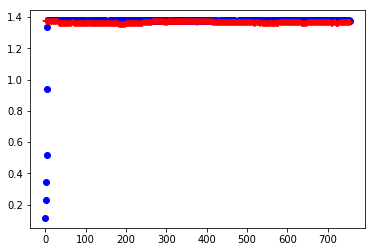

In [499]:
forecasts_van50=np.reshape(forecasts_van50,-1)
plt.plot(forecasts_van5,'bo')
plt.plot(raw_test,'r+')

In [529]:
rmse_test = np.sqrt(mean_squared_error(forecasts_van50, raw_test))
rmse_test

0.034131987265433733

In [530]:
rmse_test = np.sqrt(mean_squared_error(forecasts_van50, raw_test))
rmse_test
mean_abs_van50=((forecasts_van50-TWAP_test)/TWAP_test)*100.0
mean_abs_van50_=abs(mean_abs_van50)
np.mean(mean_abs_van50_)

0.86796168729321288

## Stacked LSTM - 50 Neurons

In [531]:
n_steps=1
n_features=1
model = Sequential()
model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(50, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [532]:
forecasts_stacked=[]

In [533]:
for i in range(test_size):
    n_steps=1
    X, y = split_sequence(raw_seq[0:train_size+i], n_steps)
    n_features=1
    X=X.reshape((X.shape[0], X.shape[1], n_features))
    model.fit(X, y, epochs=30, batch_size=512,verbose=1)
    # demonstrate prediction
    x_input = raw_seq[train_size-1]
    x_input = x_input.reshape((1, n_steps, n_features))
    yhat = model.predict(x_input, verbose=0)
    forecasts_stacked.append(yhat)

Epoch 1/30
1762/1762 [==============================] - 5s 3ms/step - loss: 1.9043
Epoch 2/30
1762/1762 [==============================] - 0s 16us/step - loss: 1.8739
Epoch 3/30
1762/1762 [==============================] - 0s 18us/step - loss: 1.8485
Epoch 4/30
1762/1762 [==============================] - 0s 19us/step - loss: 1.8257
Epoch 5/30
1762/1762 [==============================] - 0s 18us/step - loss: 1.8022
Epoch 6/30
1762/1762 [==============================] - 0s 16us/step - loss: 1.7775
Epoch 7/30
1762/1762 [==============================] - 0s 18us/step - loss: 1.7510
Epoch 8/30
1762/1762 [==============================] - 0s 17us/step - loss: 1.7222
Epoch 9/30
1762/1762 [==============================] - 0s 20us/step - loss: 1.6910
Epoch 10/30
1762/1762 [==============================] - 0s 21us/step - loss: 1.6568
Epoch 11/30
1762/1762 [==============================] - 0s 16us/step - loss: 1.6192
Epoch 12/30
1762/1762 [==============================] - 0s 17us/step - los

Epoch 5/30
1765/1765 [==============================] - 0s 17us/step - loss: 1.8688e-06
Epoch 6/30
1765/1765 [==============================] - 0s 16us/step - loss: 1.8688e-06
Epoch 7/30
1765/1765 [==============================] - 0s 20us/step - loss: 1.8689e-06
Epoch 8/30
1765/1765 [==============================] - 0s 21us/step - loss: 1.8690e-06
Epoch 9/30
1765/1765 [==============================] - 0s 22us/step - loss: 1.8689e-06
Epoch 10/30
1765/1765 [==============================] - 0s 22us/step - loss: 1.8690e-06
Epoch 11/30
1765/1765 [==============================] - 0s 22us/step - loss: 1.8690e-06
Epoch 12/30
1765/1765 [==============================] - 0s 21us/step - loss: 1.8688e-06
Epoch 13/30
1765/1765 [==============================] - 0s 23us/step - loss: 1.8688e-06
Epoch 14/30
1765/1765 [==============================] - 0s 22us/step - loss: 1.8689e-06
Epoch 15/30
1765/1765 [==============================] - 0s 21us/step - loss: 1.8687e-06
Epoch 16/30
1765/1765 [===

1771/1771 [==============================] - 0s 17us/step - loss: 1.8597e-06
Epoch 10/30
1771/1771 [==============================] - 0s 18us/step - loss: 1.8601e-06
Epoch 11/30
1771/1771 [==============================] - 0s 20us/step - loss: 1.8600e-06
Epoch 12/30
1771/1771 [==============================] - 0s 22us/step - loss: 1.8600e-06
Epoch 13/30
1771/1771 [==============================] - 0s 21us/step - loss: 1.8601e-06
Epoch 14/30
1771/1771 [==============================] - 0s 22us/step - loss: 1.8598e-06
Epoch 15/30
1771/1771 [==============================] - 0s 22us/step - loss: 1.8598e-06
Epoch 16/30
1771/1771 [==============================] - 0s 23us/step - loss: 1.8598e-06
Epoch 17/30
1771/1771 [==============================] - 0s 21us/step - loss: 1.8597e-06
Epoch 18/30
1771/1771 [==============================] - 0s 20us/step - loss: 1.8601e-06
Epoch 19/30
1771/1771 [==============================] - 0s 20us/step - loss: 1.8600e-06
Epoch 20/30
1771/1771 [==========

1777/1777 [==============================] - 0s 22us/step - loss: 1.8531e-06
Epoch 14/30
1777/1777 [==============================] - 0s 25us/step - loss: 1.8508e-06
Epoch 15/30
1777/1777 [==============================] - 0s 22us/step - loss: 1.8484e-06
Epoch 16/30
1777/1777 [==============================] - 0s 21us/step - loss: 1.8520e-06
Epoch 17/30
1777/1777 [==============================] - 0s 21us/step - loss: 1.8494e-06
Epoch 18/30
1777/1777 [==============================] - 0s 22us/step - loss: 1.8510e-06
Epoch 19/30
1777/1777 [==============================] - 0s 21us/step - loss: 1.8512e-06
Epoch 20/30
1777/1777 [==============================] - 0s 22us/step - loss: 1.8488e-06
Epoch 21/30
1777/1777 [==============================] - 0s 25us/step - loss: 1.8509e-06
Epoch 22/30
1777/1777 [==============================] - 0s 24us/step - loss: 1.8507e-06
Epoch 23/30
1777/1777 [==============================] - 0s 22us/step - loss: 1.8490e-06
Epoch 24/30
1777/1777 [==========

1783/1783 [==============================] - 0s 21us/step - loss: 1.8375e-06
Epoch 18/30
1783/1783 [==============================] - 0s 21us/step - loss: 1.8373e-06
Epoch 19/30
1783/1783 [==============================] - 0s 20us/step - loss: 1.8379e-06
Epoch 20/30
1783/1783 [==============================] - 0s 21us/step - loss: 1.8371e-06
Epoch 21/30
1783/1783 [==============================] - 0s 22us/step - loss: 1.8389e-06
Epoch 22/30
1783/1783 [==============================] - 0s 22us/step - loss: 1.8385e-06
Epoch 23/30
1783/1783 [==============================] - 0s 22us/step - loss: 1.8382e-06
Epoch 24/30
1783/1783 [==============================] - 0s 22us/step - loss: 1.8414e-06
Epoch 25/30
1783/1783 [==============================] - 0s 21us/step - loss: 1.8398e-06
Epoch 26/30
1783/1783 [==============================] - 0s 22us/step - loss: 1.8387e-06
Epoch 27/30
1783/1783 [==============================] - 0s 22us/step - loss: 1.8380e-06
Epoch 28/30
1783/1783 [==========

1789/1789 [==============================] - 0s 21us/step - loss: 1.8255e-06
Epoch 22/30
1789/1789 [==============================] - 0s 21us/step - loss: 1.8267e-06
Epoch 23/30
1789/1789 [==============================] - 0s 20us/step - loss: 1.8249e-06
Epoch 24/30
1789/1789 [==============================] - 0s 22us/step - loss: 1.8250e-06
Epoch 25/30
1789/1789 [==============================] - 0s 22us/step - loss: 1.8252e-06
Epoch 26/30
1789/1789 [==============================] - 0s 21us/step - loss: 1.8257e-06
Epoch 27/30
1789/1789 [==============================] - 0s 22us/step - loss: 1.8253e-06
Epoch 28/30
1789/1789 [==============================] - 0s 20us/step - loss: 1.8258e-06
Epoch 29/30
1789/1789 [==============================] - 0s 19us/step - loss: 1.8250e-06
Epoch 30/30
1789/1789 [==============================] - 0s 19us/step - loss: 1.8245e-06
Epoch 1/30
1790/1790 [==============================] - 0s 15us/step - loss: 1.8273e-06
Epoch 2/30
1790/1790 [============

1795/1795 [==============================] - 0s 20us/step - loss: 1.8238e-06
Epoch 26/30
1795/1795 [==============================] - 0s 21us/step - loss: 1.8265e-06
Epoch 27/30
1795/1795 [==============================] - 0s 21us/step - loss: 1.8200e-06
Epoch 28/30
1795/1795 [==============================] - 0s 20us/step - loss: 1.8227e-06
Epoch 29/30
1795/1795 [==============================] - 0s 23us/step - loss: 1.8218e-06
Epoch 30/30
1795/1795 [==============================] - 0s 22us/step - loss: 1.8203e-06
Epoch 1/30
1796/1796 [==============================] - 0s 16us/step - loss: 1.8272e-06
Epoch 2/30
1796/1796 [==============================] - 0s 16us/step - loss: 1.8248e-06
Epoch 3/30
1796/1796 [==============================] - 0s 18us/step - loss: 1.8257e-06
Epoch 4/30
1796/1796 [==============================] - 0s 17us/step - loss: 1.8253e-06
Epoch 5/30
1796/1796 [==============================] - 0s 17us/step - loss: 1.8248e-06
Epoch 6/30
1796/1796 [================

1801/1801 [==============================] - 0s 21us/step - loss: 1.8191e-06
Epoch 30/30
1801/1801 [==============================] - 0s 21us/step - loss: 1.8210e-06
Epoch 1/30
1802/1802 [==============================] - 0s 16us/step - loss: 1.8167e-06
Epoch 2/30
1802/1802 [==============================] - 0s 16us/step - loss: 1.8232e-06
Epoch 3/30
1802/1802 [==============================] - 0s 16us/step - loss: 1.8164e-06
Epoch 4/30
1802/1802 [==============================] - 0s 17us/step - loss: 1.8213e-06
Epoch 5/30
1802/1802 [==============================] - 0s 17us/step - loss: 1.8237e-06
Epoch 6/30
1802/1802 [==============================] - 0s 17us/step - loss: 1.8173e-06
Epoch 7/30
1802/1802 [==============================] - 0s 18us/step - loss: 1.8165e-06
Epoch 8/30
1802/1802 [==============================] - 0s 17us/step - loss: 1.8170e-06
Epoch 9/30
1802/1802 [==============================] - 0s 17us/step - loss: 1.8155e-06
Epoch 10/30
1802/1802 [===================

1808/1808 [==============================] - 0s 19us/step - loss: 1.8140e-06
Epoch 4/30
1808/1808 [==============================] - 0s 19us/step - loss: 1.8115e-06
Epoch 5/30
1808/1808 [==============================] - 0s 19us/step - loss: 1.8139e-06
Epoch 6/30
1808/1808 [==============================] - 0s 18us/step - loss: 1.8235e-06
Epoch 7/30
1808/1808 [==============================] - 0s 18us/step - loss: 1.8415e-06
Epoch 8/30
1808/1808 [==============================] - 0s 19us/step - loss: 1.8573e-06
Epoch 9/30
1808/1808 [==============================] - 0s 20us/step - loss: 1.8284e-06
Epoch 10/30
1808/1808 [==============================] - 0s 23us/step - loss: 1.8130e-06
Epoch 11/30
1808/1808 [==============================] - 0s 21us/step - loss: 1.8492e-06
Epoch 12/30
1808/1808 [==============================] - 0s 22us/step - loss: 1.8419e-06
Epoch 13/30
1808/1808 [==============================] - 0s 22us/step - loss: 1.8176e-06
Epoch 14/30
1808/1808 [================

1814/1814 [==============================] - 0s 16us/step - loss: 1.8847e-06
Epoch 8/30
1814/1814 [==============================] - 0s 17us/step - loss: 1.8565e-06
Epoch 9/30
1814/1814 [==============================] - 0s 21us/step - loss: 1.8189e-06
Epoch 10/30
1814/1814 [==============================] - 0s 22us/step - loss: 1.8123e-06
Epoch 11/30
1814/1814 [==============================] - 0s 21us/step - loss: 1.8109e-06
Epoch 12/30
1814/1814 [==============================] - 0s 21us/step - loss: 1.8244e-06
Epoch 13/30
1814/1814 [==============================] - 0s 21us/step - loss: 1.8062e-06
Epoch 14/30
1814/1814 [==============================] - 0s 21us/step - loss: 1.8194e-06
Epoch 15/30
1814/1814 [==============================] - 0s 19us/step - loss: 1.8188e-06
Epoch 16/30
1814/1814 [==============================] - 0s 19us/step - loss: 1.8309e-06
Epoch 17/30
1814/1814 [==============================] - 0s 19us/step - loss: 1.8125e-06
Epoch 18/30
1814/1814 [============

1820/1820 [==============================] - 0s 19us/step - loss: 1.8189e-06
Epoch 12/30
1820/1820 [==============================] - 0s 21us/step - loss: 1.8493e-06
Epoch 13/30
1820/1820 [==============================] - 0s 20us/step - loss: 1.8087e-06
Epoch 14/30
1820/1820 [==============================] - 0s 21us/step - loss: 1.8009e-06
Epoch 15/30
1820/1820 [==============================] - 0s 21us/step - loss: 1.8016e-06
Epoch 16/30
1820/1820 [==============================] - 0s 22us/step - loss: 1.8216e-06
Epoch 17/30
1820/1820 [==============================] - 0s 21us/step - loss: 1.8081e-06
Epoch 18/30
1820/1820 [==============================] - 0s 21us/step - loss: 1.8107e-06
Epoch 19/30
1820/1820 [==============================] - 0s 22us/step - loss: 1.8079e-06
Epoch 20/30
1820/1820 [==============================] - 0s 20us/step - loss: 1.8363e-06
Epoch 21/30
1820/1820 [==============================] - 0s 20us/step - loss: 1.8045e-06
Epoch 22/30
1820/1820 [==========

1826/1826 [==============================] - 0s 20us/step - loss: 1.8168e-06
Epoch 16/30
1826/1826 [==============================] - 0s 21us/step - loss: 1.8086e-06
Epoch 17/30
1826/1826 [==============================] - 0s 20us/step - loss: 1.8434e-06
Epoch 18/30
1826/1826 [==============================] - 0s 20us/step - loss: 1.8486e-06
Epoch 19/30
1826/1826 [==============================] - 0s 20us/step - loss: 1.8772e-06
Epoch 20/30
1826/1826 [==============================] - 0s 21us/step - loss: 1.8328e-06
Epoch 21/30
1826/1826 [==============================] - 0s 21us/step - loss: 1.8253e-06
Epoch 22/30
1826/1826 [==============================] - 0s 21us/step - loss: 1.8037e-06
Epoch 23/30
1826/1826 [==============================] - 0s 20us/step - loss: 1.8202e-06
Epoch 24/30
1826/1826 [==============================] - 0s 20us/step - loss: 1.8243e-06
Epoch 25/30
1826/1826 [==============================] - 0s 19us/step - loss: 1.8328e-06
Epoch 26/30
1826/1826 [==========

1832/1832 [==============================] - 0s 18us/step - loss: 2.0001e-06
Epoch 20/30
1832/1832 [==============================] - 0s 19us/step - loss: 1.8660e-06
Epoch 21/30
1832/1832 [==============================] - 0s 20us/step - loss: 1.8678e-06
Epoch 22/30
1832/1832 [==============================] - 0s 20us/step - loss: 1.8603e-06
Epoch 23/30
1832/1832 [==============================] - 0s 22us/step - loss: 1.9003e-06
Epoch 24/30
1832/1832 [==============================] - 0s 21us/step - loss: 1.9544e-06
Epoch 25/30
1832/1832 [==============================] - 0s 21us/step - loss: 1.8447e-06
Epoch 26/30
1832/1832 [==============================] - 0s 21us/step - loss: 1.9753e-06
Epoch 27/30
1832/1832 [==============================] - 0s 24us/step - loss: 2.1567e-06
Epoch 28/30
1832/1832 [==============================] - 0s 21us/step - loss: 2.2441e-06
Epoch 29/30
1832/1832 [==============================] - 0s 20us/step - loss: 2.0821e-06
Epoch 30/30
1832/1832 [==========

1838/1838 [==============================] - 0s 19us/step - loss: 1.9110e-06
Epoch 24/30
1838/1838 [==============================] - 0s 19us/step - loss: 2.0908e-06
Epoch 25/30
1838/1838 [==============================] - 0s 19us/step - loss: 2.1794e-06
Epoch 26/30
1838/1838 [==============================] - 0s 20us/step - loss: 2.2977e-06
Epoch 27/30
1838/1838 [==============================] - 0s 18us/step - loss: 2.0233e-06
Epoch 28/30
1838/1838 [==============================] - 0s 19us/step - loss: 2.0520e-06
Epoch 29/30
1838/1838 [==============================] - 0s 19us/step - loss: 1.9419e-06
Epoch 30/30
1838/1838 [==============================] - 0s 19us/step - loss: 2.4304e-06
Epoch 1/30
1839/1839 [==============================] - 0s 16us/step - loss: 2.2833e-06
Epoch 2/30
1839/1839 [==============================] - 0s 17us/step - loss: 2.3054e-06
Epoch 3/30
1839/1839 [==============================] - 0s 16us/step - loss: 2.7090e-06
Epoch 4/30
1839/1839 [==============

1844/1844 [==============================] - 0s 20us/step - loss: 2.3912e-06
Epoch 28/30
1844/1844 [==============================] - 0s 33us/step - loss: 2.1992e-06
Epoch 29/30
1844/1844 [==============================] - 0s 22us/step - loss: 1.9729e-06
Epoch 30/30
1844/1844 [==============================] - 0s 21us/step - loss: 2.3970e-06
Epoch 1/30
1845/1845 [==============================] - 0s 18us/step - loss: 1.8689e-06
Epoch 2/30
1845/1845 [==============================] - 0s 16us/step - loss: 1.8310e-06
Epoch 3/30
1845/1845 [==============================] - 0s 17us/step - loss: 1.9064e-06
Epoch 4/30
1845/1845 [==============================] - 0s 16us/step - loss: 3.1413e-06
Epoch 5/30
1845/1845 [==============================] - 0s 16us/step - loss: 1.8478e-06
Epoch 6/30
1845/1845 [==============================] - 0s 18us/step - loss: 1.8502e-06
Epoch 7/30
1845/1845 [==============================] - 0s 21us/step - loss: 1.8854e-06
Epoch 8/30
1845/1845 [==================

1851/1851 [==============================] - 0s 15us/step - loss: 1.8333e-06
Epoch 2/30
1851/1851 [==============================] - 0s 15us/step - loss: 2.1471e-06
Epoch 3/30
1851/1851 [==============================] - 0s 16us/step - loss: 2.7787e-06
Epoch 4/30
1851/1851 [==============================] - 0s 16us/step - loss: 2.2618e-06
Epoch 5/30
1851/1851 [==============================] - 0s 15us/step - loss: 2.1291e-06
Epoch 6/30
1851/1851 [==============================] - 0s 19us/step - loss: 2.4731e-06
Epoch 7/30
1851/1851 [==============================] - 0s 18us/step - loss: 2.1603e-06
Epoch 8/30
1851/1851 [==============================] - 0s 19us/step - loss: 1.9119e-06
Epoch 9/30
1851/1851 [==============================] - 0s 20us/step - loss: 2.1171e-06
Epoch 10/30
1851/1851 [==============================] - 0s 19us/step - loss: 2.2568e-06
Epoch 11/30
1851/1851 [==============================] - 0s 19us/step - loss: 2.3272e-06
Epoch 12/30
1851/1851 [==================

1857/1857 [==============================] - 0s 17us/step - loss: 1.8352e-06
Epoch 6/30
1857/1857 [==============================] - 0s 17us/step - loss: 1.8336e-06
Epoch 7/30
1857/1857 [==============================] - 0s 16us/step - loss: 1.7888e-06
Epoch 8/30
1857/1857 [==============================] - 0s 16us/step - loss: 1.9228e-06
Epoch 9/30
1857/1857 [==============================] - 0s 16us/step - loss: 2.4870e-06
Epoch 10/30
1857/1857 [==============================] - 0s 16us/step - loss: 2.1001e-06
Epoch 11/30
1857/1857 [==============================] - 0s 17us/step - loss: 1.7890e-06
Epoch 12/30
1857/1857 [==============================] - 0s 19us/step - loss: 2.2341e-06
Epoch 13/30
1857/1857 [==============================] - 0s 21us/step - loss: 2.0125e-06
Epoch 14/30
1857/1857 [==============================] - 0s 21us/step - loss: 2.5726e-06
Epoch 15/30
1857/1857 [==============================] - 0s 20us/step - loss: 2.5786e-06
Epoch 16/30
1857/1857 [==============

1863/1863 [==============================] - 0s 15us/step - loss: 2.0938e-06
Epoch 10/30
1863/1863 [==============================] - 0s 16us/step - loss: 2.0900e-06
Epoch 11/30
1863/1863 [==============================] - 0s 16us/step - loss: 2.0951e-06
Epoch 12/30
1863/1863 [==============================] - 0s 16us/step - loss: 2.5629e-06
Epoch 13/30
1863/1863 [==============================] - 0s 18us/step - loss: 1.9444e-06
Epoch 14/30
1863/1863 [==============================] - 0s 21us/step - loss: 1.8869e-06
Epoch 15/30
1863/1863 [==============================] - 0s 20us/step - loss: 2.7800e-06
Epoch 16/30
1863/1863 [==============================] - 0s 22us/step - loss: 2.0555e-06
Epoch 17/30
1863/1863 [==============================] - 0s 21us/step - loss: 2.3903e-06
Epoch 18/30
1863/1863 [==============================] - 0s 23us/step - loss: 3.8295e-06
Epoch 19/30
1863/1863 [==============================] - 0s 21us/step - loss: 4.8571e-06
Epoch 20/30
1863/1863 [==========

1869/1869 [==============================] - 0s 19us/step - loss: 1.9559e-06
Epoch 14/30
1869/1869 [==============================] - 0s 21us/step - loss: 1.7653e-06
Epoch 15/30
1869/1869 [==============================] - 0s 20us/step - loss: 1.8503e-06
Epoch 16/30
1869/1869 [==============================] - 0s 22us/step - loss: 1.9762e-06
Epoch 17/30
1869/1869 [==============================] - 0s 21us/step - loss: 1.8368e-06
Epoch 18/30
1869/1869 [==============================] - 0s 22us/step - loss: 1.8861e-06
Epoch 19/30
1869/1869 [==============================] - 0s 22us/step - loss: 2.0901e-06
Epoch 20/30
1869/1869 [==============================] - 0s 22us/step - loss: 1.9691e-06
Epoch 21/30
1869/1869 [==============================] - 0s 21us/step - loss: 2.0909e-06
Epoch 22/30
1869/1869 [==============================] - 0s 22us/step - loss: 2.3387e-06
Epoch 23/30
1869/1869 [==============================] - 0s 21us/step - loss: 1.9504e-06
Epoch 24/30
1869/1869 [==========

1875/1875 [==============================] - 0s 21us/step - loss: 2.9370e-06
Epoch 18/30
1875/1875 [==============================] - 0s 20us/step - loss: 2.2289e-06
Epoch 19/30
1875/1875 [==============================] - 0s 19us/step - loss: 3.1893e-06
Epoch 20/30
1875/1875 [==============================] - 0s 20us/step - loss: 3.4594e-06
Epoch 21/30
1875/1875 [==============================] - 0s 20us/step - loss: 3.5392e-06
Epoch 22/30
1875/1875 [==============================] - 0s 22us/step - loss: 2.3291e-06
Epoch 23/30
1875/1875 [==============================] - 0s 20us/step - loss: 1.9513e-06
Epoch 24/30
1875/1875 [==============================] - 0s 21us/step - loss: 1.8149e-06
Epoch 25/30
1875/1875 [==============================] - 0s 22us/step - loss: 2.4141e-06
Epoch 26/30
1875/1875 [==============================] - 0s 21us/step - loss: 2.3291e-06
Epoch 27/30
1875/1875 [==============================] - 0s 20us/step - loss: 2.6303e-06
Epoch 28/30
1875/1875 [==========

1881/1881 [==============================] - 0s 20us/step - loss: 1.9057e-06
Epoch 21/30
1881/1881 [==============================] - 0s 23us/step - loss: 1.9058e-06
Epoch 22/30
1881/1881 [==============================] - 0s 20us/step - loss: 1.9595e-06
Epoch 23/30
1881/1881 [==============================] - 0s 20us/step - loss: 1.8252e-06
Epoch 24/30
1881/1881 [==============================] - 0s 20us/step - loss: 1.8615e-06
Epoch 25/30
1881/1881 [==============================] - 0s 20us/step - loss: 1.9676e-06
Epoch 26/30
1881/1881 [==============================] - 0s 20us/step - loss: 2.0944e-06
Epoch 27/30
1881/1881 [==============================] - 0s 22us/step - loss: 1.9576e-06
Epoch 28/30
1881/1881 [==============================] - 0s 20us/step - loss: 1.7615e-06
Epoch 29/30
1881/1881 [==============================] - 0s 20us/step - loss: 1.9260e-06
Epoch 30/30
1881/1881 [==============================] - 0s 20us/step - loss: 1.9479e-06
Epoch 1/30
1882/1882 [===========

1887/1887 [==============================] - 0s 21us/step - loss: 1.7906e-06
Epoch 25/30
1887/1887 [==============================] - 0s 20us/step - loss: 2.1857e-06
Epoch 26/30
1887/1887 [==============================] - 0s 17us/step - loss: 2.2535e-06
Epoch 27/30
1887/1887 [==============================] - 0s 16us/step - loss: 2.1039e-06
Epoch 28/30
1887/1887 [==============================] - 0s 16us/step - loss: 2.0796e-06
Epoch 29/30
1887/1887 [==============================] - 0s 16us/step - loss: 2.3366e-06
Epoch 30/30
1887/1887 [==============================] - 0s 19us/step - loss: 1.8983e-06
Epoch 1/30
1888/1888 [==============================] - 0s 15us/step - loss: 1.7718e-06
Epoch 2/30
1888/1888 [==============================] - 0s 15us/step - loss: 2.4304e-06
Epoch 3/30
1888/1888 [==============================] - 0s 16us/step - loss: 2.3893e-06
Epoch 4/30
1888/1888 [==============================] - 0s 17us/step - loss: 2.2112e-06
Epoch 5/30
1888/1888 [===============

1893/1893 [==============================] - 0s 19us/step - loss: 3.2228e-06
Epoch 29/30
1893/1893 [==============================] - 0s 17us/step - loss: 2.2403e-06
Epoch 30/30
1893/1893 [==============================] - 0s 18us/step - loss: 2.2231e-06
Epoch 1/30
1894/1894 [==============================] - 0s 15us/step - loss: 2.0766e-06
Epoch 2/30
1894/1894 [==============================] - 0s 14us/step - loss: 1.8582e-06
Epoch 3/30
1894/1894 [==============================] - 0s 15us/step - loss: 2.1385e-06
Epoch 4/30
1894/1894 [==============================] - 0s 16us/step - loss: 1.9776e-06
Epoch 5/30
1894/1894 [==============================] - 0s 16us/step - loss: 1.8037e-06
Epoch 6/30
1894/1894 [==============================] - 0s 16us/step - loss: 2.1676e-06
Epoch 7/30
1894/1894 [==============================] - 0s 17us/step - loss: 3.6121e-06
Epoch 8/30
1894/1894 [==============================] - 0s 21us/step - loss: 2.8529e-06
Epoch 9/30
1894/1894 [===================

1900/1900 [==============================] - 0s 16us/step - loss: 3.1294e-06
Epoch 3/30
1900/1900 [==============================] - 0s 18us/step - loss: 3.3667e-06
Epoch 4/30
1900/1900 [==============================] - 0s 17us/step - loss: 3.3431e-06
Epoch 5/30
1900/1900 [==============================] - 0s 18us/step - loss: 3.0072e-06
Epoch 6/30
1900/1900 [==============================] - 0s 19us/step - loss: 3.5116e-06
Epoch 7/30
1900/1900 [==============================] - 0s 19us/step - loss: 2.5205e-06
Epoch 8/30
1900/1900 [==============================] - 0s 19us/step - loss: 1.9334e-06
Epoch 9/30
1900/1900 [==============================] - 0s 18us/step - loss: 1.9683e-06
Epoch 10/30
1900/1900 [==============================] - 0s 16us/step - loss: 2.1317e-06
Epoch 11/30
1900/1900 [==============================] - 0s 17us/step - loss: 2.1124e-06
Epoch 12/30
1900/1900 [==============================] - 0s 16us/step - loss: 2.4024e-06
Epoch 13/30
1900/1900 [=================

1906/1906 [==============================] - 0s 19us/step - loss: 2.0308e-06
Epoch 7/30
1906/1906 [==============================] - 0s 21us/step - loss: 2.2068e-06
Epoch 8/30
1906/1906 [==============================] - 0s 20us/step - loss: 1.9463e-06
Epoch 9/30
1906/1906 [==============================] - 0s 20us/step - loss: 1.8418e-06
Epoch 10/30
1906/1906 [==============================] - 0s 22us/step - loss: 2.0966e-06
Epoch 11/30
1906/1906 [==============================] - 0s 22us/step - loss: 2.1214e-06
Epoch 12/30
1906/1906 [==============================] - 0s 20us/step - loss: 2.5061e-06
Epoch 13/30
1906/1906 [==============================] - 0s 20us/step - loss: 2.0276e-06
Epoch 14/30
1906/1906 [==============================] - 0s 21us/step - loss: 2.1555e-06
Epoch 15/30
1906/1906 [==============================] - 0s 18us/step - loss: 1.8855e-06
Epoch 16/30
1906/1906 [==============================] - 0s 17us/step - loss: 2.1221e-06
Epoch 17/30
1906/1906 [=============

1912/1912 [==============================] - 0s 20us/step - loss: 1.7514e-06
Epoch 11/30
1912/1912 [==============================] - 0s 20us/step - loss: 1.8329e-06
Epoch 12/30
1912/1912 [==============================] - 0s 21us/step - loss: 1.8237e-06
Epoch 13/30
1912/1912 [==============================] - 0s 20us/step - loss: 2.0548e-06
Epoch 14/30
1912/1912 [==============================] - 0s 22us/step - loss: 2.3729e-06
Epoch 15/30
1912/1912 [==============================] - 0s 21us/step - loss: 2.7295e-06
Epoch 16/30
1912/1912 [==============================] - 0s 25us/step - loss: 2.7215e-06
Epoch 17/30
1912/1912 [==============================] - 0s 20us/step - loss: 2.0174e-06
Epoch 18/30
1912/1912 [==============================] - 0s 20us/step - loss: 2.5695e-06
Epoch 19/30
1912/1912 [==============================] - 0s 19us/step - loss: 1.7515e-06
Epoch 20/30
1912/1912 [==============================] - 0s 21us/step - loss: 1.8342e-06
Epoch 21/30
1912/1912 [==========

1918/1918 [==============================] - 0s 15us/step - loss: 1.7999e-06
Epoch 15/30
1918/1918 [==============================] - 0s 15us/step - loss: 2.2569e-06
Epoch 16/30
1918/1918 [==============================] - 0s 19us/step - loss: 1.8957e-06
Epoch 17/30
1918/1918 [==============================] - 0s 21us/step - loss: 2.0707e-06
Epoch 18/30
1918/1918 [==============================] - 0s 21us/step - loss: 4.6711e-06
Epoch 19/30
1918/1918 [==============================] - 0s 19us/step - loss: 3.5004e-06
Epoch 20/30
1918/1918 [==============================] - 0s 19us/step - loss: 3.1671e-06
Epoch 21/30
1918/1918 [==============================] - 0s 20us/step - loss: 2.3044e-06
Epoch 22/30
1918/1918 [==============================] - 0s 19us/step - loss: 1.8591e-06
Epoch 23/30
1918/1918 [==============================] - 0s 18us/step - loss: 2.0378e-06
Epoch 24/30
1918/1918 [==============================] - 0s 17us/step - loss: 1.9947e-06
Epoch 25/30
1918/1918 [==========

1924/1924 [==============================] - 0s 17us/step - loss: 2.0401e-06
Epoch 19/30
1924/1924 [==============================] - 0s 17us/step - loss: 2.1670e-06
Epoch 20/30
1924/1924 [==============================] - 0s 17us/step - loss: 1.9058e-06
Epoch 21/30
1924/1924 [==============================] - 0s 17us/step - loss: 2.6603e-06
Epoch 22/30
1924/1924 [==============================] - 0s 17us/step - loss: 2.2929e-06
Epoch 23/30
1924/1924 [==============================] - 0s 18us/step - loss: 3.7395e-06
Epoch 24/30
1924/1924 [==============================] - 0s 17us/step - loss: 3.3676e-06
Epoch 25/30
1924/1924 [==============================] - 0s 18us/step - loss: 5.3928e-06
Epoch 26/30
1924/1924 [==============================] - 0s 17us/step - loss: 4.9667e-06
Epoch 27/30
1924/1924 [==============================] - 0s 17us/step - loss: 4.1994e-06
Epoch 28/30
1924/1924 [==============================] - 0s 17us/step - loss: 4.2356e-06
Epoch 29/30
1924/1924 [==========

Epoch 20/30
1927/1927 [==============================] - ETA: 0s - loss: 2.1730e-0 - 0s 19us/step - loss: 2.0179e-06
Epoch 21/30
1927/1927 [==============================] - 0s 21us/step - loss: 3.3246e-06
Epoch 22/30
1927/1927 [==============================] - 0s 18us/step - loss: 2.3707e-06
Epoch 23/30
1927/1927 [==============================] - 0s 16us/step - loss: 2.3878e-06
Epoch 24/30
1927/1927 [==============================] - 0s 17us/step - loss: 4.8428e-06
Epoch 25/30
1927/1927 [==============================] - 0s 17us/step - loss: 3.5473e-06
Epoch 26/30
1927/1927 [==============================] - 0s 17us/step - loss: 3.2451e-06
Epoch 27/30
1927/1927 [==============================] - 0s 16us/step - loss: 2.3621e-06
Epoch 28/30
1927/1927 [==============================] - 0s 16us/step - loss: 2.6700e-06
Epoch 29/30
1927/1927 [==============================] - 0s 17us/step - loss: 3.2155e-06
Epoch 30/30
1927/1927 [==============================] - 0s 20us/step - loss: 2.41

1930/1930 [==============================] - 0s 20us/step - loss: 2.0070e-06
Epoch 23/30
1930/1930 [==============================] - 0s 21us/step - loss: 2.0047e-06
Epoch 24/30
1930/1930 [==============================] - 0s 20us/step - loss: 2.0739e-06
Epoch 25/30
1930/1930 [==============================] - 0s 18us/step - loss: 2.5377e-06
Epoch 26/30
1930/1930 [==============================] - 0s 17us/step - loss: 2.2882e-06
Epoch 27/30
1930/1930 [==============================] - 0s 18us/step - loss: 3.1558e-06
Epoch 28/30
1930/1930 [==============================] - 0s 17us/step - loss: 2.2741e-06
Epoch 29/30
1930/1930 [==============================] - 0s 16us/step - loss: 2.4016e-06
Epoch 30/30
1930/1930 [==============================] - 0s 16us/step - loss: 2.9568e-06
Epoch 1/30
1931/1931 [==============================] - 0s 14us/step - loss: 1.9271e-06
Epoch 2/30
1931/1931 [==============================] - 0s 15us/step - loss: 2.3770e-06
Epoch 3/30
1931/1931 [=============

1936/1936 [==============================] - 0s 19us/step - loss: 1.7704e-06
Epoch 27/30
1936/1936 [==============================] - 0s 19us/step - loss: 2.3543e-06
Epoch 28/30
1936/1936 [==============================] - 0s 21us/step - loss: 2.0277e-06
Epoch 29/30
1936/1936 [==============================] - 0s 23us/step - loss: 1.7480e-06
Epoch 30/30
1936/1936 [==============================] - 0s 20us/step - loss: 1.7143e-06
Epoch 1/30
1937/1937 [==============================] - 0s 14us/step - loss: 1.7082e-06
Epoch 2/30
1937/1937 [==============================] - 0s 15us/step - loss: 2.2732e-06
Epoch 3/30
1937/1937 [==============================] - 0s 16us/step - loss: 2.1924e-06
Epoch 4/30
1937/1937 [==============================] - 0s 16us/step - loss: 3.4119e-06
Epoch 5/30
1937/1937 [==============================] - 0s 16us/step - loss: 2.6093e-06
Epoch 6/30
1937/1937 [==============================] - 0s 16us/step - loss: 2.8440e-06
Epoch 7/30
1937/1937 [=================

1942/1942 [==============================] - 0s 22us/step - loss: 1.8606e-06
Epoch 1/30
1943/1943 [==============================] - 0s 15us/step - loss: 1.7523e-06
Epoch 2/30
1943/1943 [==============================] - 0s 15us/step - loss: 1.7941e-06
Epoch 3/30
1943/1943 [==============================] - 0s 18us/step - loss: 2.2069e-06
Epoch 4/30
1943/1943 [==============================] - 0s 20us/step - loss: 2.1351e-06
Epoch 5/30
1943/1943 [==============================] - 0s 20us/step - loss: 1.8944e-06
Epoch 6/30
1943/1943 [==============================] - 0s 20us/step - loss: 1.9863e-06
Epoch 7/30
1943/1943 [==============================] - 0s 19us/step - loss: 2.2016e-06
Epoch 8/30
1943/1943 [==============================] - 0s 20us/step - loss: 1.9676e-06
Epoch 9/30
1943/1943 [==============================] - 0s 20us/step - loss: 2.2646e-06
Epoch 10/30
1943/1943 [==============================] - 0s 19us/step - loss: 1.9840e-06
Epoch 11/30
1943/1943 [===================

1949/1949 [==============================] - 0s 16us/step - loss: 2.6206e-06
Epoch 5/30
1949/1949 [==============================] - 0s 15us/step - loss: 2.6690e-06
Epoch 6/30
1949/1949 [==============================] - 0s 16us/step - loss: 1.8448e-06
Epoch 7/30
1949/1949 [==============================] - 0s 15us/step - loss: 2.2723e-06
Epoch 8/30
1949/1949 [==============================] - 0s 15us/step - loss: 1.9779e-06
Epoch 9/30
1949/1949 [==============================] - 0s 15us/step - loss: 1.9156e-06
Epoch 10/30
1949/1949 [==============================] - 0s 19us/step - loss: 2.5477e-06
Epoch 11/30
1949/1949 [==============================] - 0s 19us/step - loss: 2.3960e-06
Epoch 12/30
1949/1949 [==============================] - 0s 21us/step - loss: 2.3294e-06
Epoch 13/30
1949/1949 [==============================] - 0s 20us/step - loss: 1.7091e-06
Epoch 14/30
1949/1949 [==============================] - 0s 20us/step - loss: 1.7561e-06
Epoch 15/30
1949/1949 [===============

1955/1955 [==============================] - 0s 16us/step - loss: 2.3953e-06
Epoch 9/30
1955/1955 [==============================] - 0s 15us/step - loss: 2.3619e-06
Epoch 10/30
1955/1955 [==============================] - 0s 16us/step - loss: 2.8420e-06
Epoch 11/30
1955/1955 [==============================] - 0s 15us/step - loss: 2.2147e-06
Epoch 12/30
1955/1955 [==============================] - 0s 15us/step - loss: 1.7933e-06
Epoch 13/30
1955/1955 [==============================] - 0s 15us/step - loss: 1.8309e-06
Epoch 14/30
1955/1955 [==============================] - 0s 18us/step - loss: 1.7959e-06
Epoch 15/30
1955/1955 [==============================] - 0s 21us/step - loss: 1.7845e-06
Epoch 16/30
1955/1955 [==============================] - 0s 19us/step - loss: 3.8379e-06
Epoch 17/30
1955/1955 [==============================] - 0s 20us/step - loss: 3.0446e-06
Epoch 18/30
1955/1955 [==============================] - 0s 20us/step - loss: 2.5789e-06
Epoch 19/30
1955/1955 [===========

1961/1961 [==============================] - 0s 15us/step - loss: 2.4765e-06
Epoch 13/30
1961/1961 [==============================] - 0s 15us/step - loss: 2.2538e-06
Epoch 14/30
1961/1961 [==============================] - 0s 15us/step - loss: 1.8629e-06
Epoch 15/30
1961/1961 [==============================] - 0s 21us/step - loss: 2.0413e-06
Epoch 16/30
1961/1961 [==============================] - 0s 24us/step - loss: 1.9538e-06
Epoch 17/30
1961/1961 [==============================] - 0s 20us/step - loss: 2.3637e-06
Epoch 18/30
1961/1961 [==============================] - 0s 20us/step - loss: 1.7007e-06
Epoch 19/30
1961/1961 [==============================] - 0s 22us/step - loss: 2.2035e-06
Epoch 20/30
1961/1961 [==============================] - 0s 21us/step - loss: 1.8900e-06
Epoch 21/30
1961/1961 [==============================] - 0s 21us/step - loss: 1.8577e-06
Epoch 22/30
1961/1961 [==============================] - 0s 22us/step - loss: 2.1208e-06
Epoch 23/30
1961/1961 [==========

1967/1967 [==============================] - 0s 20us/step - loss: 2.2029e-06
Epoch 17/30
1967/1967 [==============================] - 0s 21us/step - loss: 1.9829e-06
Epoch 18/30
1967/1967 [==============================] - 0s 21us/step - loss: 1.7294e-06
Epoch 19/30
1967/1967 [==============================] - 0s 21us/step - loss: 1.7200e-06
Epoch 20/30
1967/1967 [==============================] - 0s 21us/step - loss: 2.0618e-06
Epoch 21/30
1967/1967 [==============================] - 0s 20us/step - loss: 2.0094e-06
Epoch 22/30
1967/1967 [==============================] - 0s 20us/step - loss: 1.7988e-06
Epoch 23/30
1967/1967 [==============================] - 0s 23us/step - loss: 1.9753e-06
Epoch 24/30
1967/1967 [==============================] - 0s 20us/step - loss: 2.2502e-06
Epoch 25/30
1967/1967 [==============================] - 0s 20us/step - loss: 2.0028e-06
Epoch 26/30
1967/1967 [==============================] - 0s 19us/step - loss: 2.2500e-06
Epoch 27/30
1967/1967 [==========

1973/1973 [==============================] - 0s 19us/step - loss: 1.8779e-06
Epoch 21/30
1973/1973 [==============================] - 0s 20us/step - loss: 2.1972e-06
Epoch 22/30
1973/1973 [==============================] - 0s 21us/step - loss: 2.4740e-06
Epoch 23/30
1973/1973 [==============================] - 0s 20us/step - loss: 3.1132e-06
Epoch 24/30
1973/1973 [==============================] - 0s 19us/step - loss: 2.1322e-06
Epoch 25/30
1973/1973 [==============================] - 0s 18us/step - loss: 2.6254e-06
Epoch 26/30
1973/1973 [==============================] - 0s 20us/step - loss: 1.8727e-06
Epoch 27/30
1973/1973 [==============================] - 0s 21us/step - loss: 1.8955e-06
Epoch 28/30
1973/1973 [==============================] - 0s 19us/step - loss: 2.4464e-06
Epoch 29/30
1973/1973 [==============================] - 0s 20us/step - loss: 1.7893e-06
Epoch 30/30
1973/1973 [==============================] - 0s 21us/step - loss: 2.1740e-06
Epoch 1/30
1974/1974 [===========

1979/1979 [==============================] - 0s 20us/step - loss: 1.7399e-06
Epoch 25/30
1979/1979 [==============================] - 0s 19us/step - loss: 2.3634e-06
Epoch 26/30
1979/1979 [==============================] - 0s 21us/step - loss: 1.9529e-06
Epoch 27/30
1979/1979 [==============================] - 0s 19us/step - loss: 1.9711e-06
Epoch 28/30
1979/1979 [==============================] - 0s 20us/step - loss: 2.7552e-06
Epoch 29/30
1979/1979 [==============================] - 0s 19us/step - loss: 2.5685e-06
Epoch 30/30
1979/1979 [==============================] - 0s 20us/step - loss: 2.2770e-06
Epoch 1/30
1980/1980 [==============================] - 0s 16us/step - loss: 3.4753e-06
Epoch 2/30
1980/1980 [==============================] - 0s 18us/step - loss: 2.9321e-06
Epoch 3/30
1980/1980 [==============================] - 0s 16us/step - loss: 2.1852e-06
Epoch 4/30
1980/1980 [==============================] - 0s 15us/step - loss: 1.8793e-06
Epoch 5/30
1980/1980 [===============

1985/1985 [==============================] - 0s 17us/step - loss: 2.2244e-06
Epoch 29/30
1985/1985 [==============================] - 0s 17us/step - loss: 4.1596e-06
Epoch 30/30
1985/1985 [==============================] - 0s 17us/step - loss: 3.5325e-06
Epoch 1/30
1986/1986 [==============================] - 0s 14us/step - loss: 2.7832e-06
Epoch 2/30
1986/1986 [==============================] - 0s 14us/step - loss: 3.0715e-06
Epoch 3/30
1986/1986 [==============================] - 0s 15us/step - loss: 3.0150e-06
Epoch 4/30
1986/1986 [==============================] - 0s 16us/step - loss: 2.4898e-06
Epoch 5/30
1986/1986 [==============================] - 0s 16us/step - loss: 2.8196e-06
Epoch 6/30
1986/1986 [==============================] - 0s 16us/step - loss: 2.0974e-06
Epoch 7/30
1986/1986 [==============================] - 0s 16us/step - loss: 2.0181e-06
Epoch 8/30
1986/1986 [==============================] - 0s 16us/step - loss: 2.2306e-06
Epoch 9/30
1986/1986 [===================

1992/1992 [==============================] - 0s 15us/step - loss: 1.7775e-06
Epoch 3/30
1992/1992 [==============================] - 0s 15us/step - loss: 1.8452e-06
Epoch 4/30
1992/1992 [==============================] - 0s 15us/step - loss: 2.1403e-06
Epoch 5/30
1992/1992 [==============================] - 0s 16us/step - loss: 2.4395e-06
Epoch 6/30
1992/1992 [==============================] - 0s 17us/step - loss: 3.3143e-06
Epoch 7/30
1992/1992 [==============================] - 0s 18us/step - loss: 2.8765e-06
Epoch 8/30
1992/1992 [==============================] - 0s 20us/step - loss: 2.6580e-06
Epoch 9/30
1992/1992 [==============================] - 0s 20us/step - loss: 1.8968e-06
Epoch 10/30
1992/1992 [==============================] - 0s 20us/step - loss: 1.9109e-06
Epoch 11/30
1992/1992 [==============================] - 0s 20us/step - loss: 2.7253e-06
Epoch 12/30
1992/1992 [==============================] - 0s 20us/step - loss: 3.1306e-06
Epoch 13/30
1992/1992 [=================

1998/1998 [==============================] - 0s 15us/step - loss: 1.9183e-06
Epoch 7/30
1998/1998 [==============================] - 0s 15us/step - loss: 1.8020e-06
Epoch 8/30
1998/1998 [==============================] - 0s 17us/step - loss: 3.1264e-06
Epoch 9/30
1998/1998 [==============================] - 0s 19us/step - loss: 4.3323e-06
Epoch 10/30
1998/1998 [==============================] - 0s 20us/step - loss: 3.9317e-06
Epoch 11/30
1998/1998 [==============================] - 0s 20us/step - loss: 4.0020e-06
Epoch 12/30
1998/1998 [==============================] - 0s 22us/step - loss: 3.8174e-06
Epoch 13/30
1998/1998 [==============================] - 0s 21us/step - loss: 2.9013e-06
Epoch 14/30
1998/1998 [==============================] - 0s 20us/step - loss: 3.1433e-06
Epoch 15/30
1998/1998 [==============================] - 0s 21us/step - loss: 4.4730e-06
Epoch 16/30
1998/1998 [==============================] - 0s 19us/step - loss: 3.9304e-06
Epoch 17/30
1998/1998 [=============

2004/2004 [==============================] - 0s 16us/step - loss: 1.7406e-06
Epoch 11/30
2004/2004 [==============================] - 0s 16us/step - loss: 1.6642e-06
Epoch 12/30
2004/2004 [==============================] - 0s 16us/step - loss: 1.7385e-06
Epoch 13/30
2004/2004 [==============================] - 0s 16us/step - loss: 2.5075e-06
Epoch 14/30
2004/2004 [==============================] - 0s 16us/step - loss: 2.2343e-06
Epoch 15/30
2004/2004 [==============================] - 0s 18us/step - loss: 2.9674e-06
Epoch 16/30
2004/2004 [==============================] - 0s 20us/step - loss: 2.9995e-06
Epoch 17/30
2004/2004 [==============================] - 0s 22us/step - loss: 3.2869e-06
Epoch 18/30
2004/2004 [==============================] - 0s 24us/step - loss: 2.2288e-06
Epoch 19/30
2004/2004 [==============================] - 0s 20us/step - loss: 2.0470e-06
Epoch 20/30
2004/2004 [==============================] - 0s 16us/step - loss: 1.8477e-06
Epoch 21/30
2004/2004 [==========

2010/2010 [==============================] - 0s 16us/step - loss: 1.7857e-06
Epoch 15/30
2010/2010 [==============================] - 0s 16us/step - loss: 1.7596e-06
Epoch 16/30
2010/2010 [==============================] - 0s 18us/step - loss: 2.0101e-06
Epoch 17/30
2010/2010 [==============================] - 0s 21us/step - loss: 1.8990e-06
Epoch 18/30
2010/2010 [==============================] - 0s 20us/step - loss: 1.7117e-06
Epoch 19/30
2010/2010 [==============================] - 0s 19us/step - loss: 2.2417e-06
Epoch 20/30
2010/2010 [==============================] - 0s 20us/step - loss: 2.3948e-06
Epoch 21/30
2010/2010 [==============================] - 0s 19us/step - loss: 4.0859e-06
Epoch 22/30
2010/2010 [==============================] - 0s 19us/step - loss: 2.1184e-06
Epoch 23/30
2010/2010 [==============================] - 0s 20us/step - loss: 3.7899e-06
Epoch 24/30
2010/2010 [==============================] - 0s 19us/step - loss: 2.3213e-06
Epoch 25/30
2010/2010 [==========

2016/2016 [==============================] - 0s 20us/step - loss: 2.0115e-06
Epoch 19/30
2016/2016 [==============================] - 0s 19us/step - loss: 1.9508e-06
Epoch 20/30
2016/2016 [==============================] - 0s 19us/step - loss: 1.7260e-06
Epoch 21/30
2016/2016 [==============================] - 0s 20us/step - loss: 3.5901e-06
Epoch 22/30
2016/2016 [==============================] - 0s 20us/step - loss: 2.8721e-06
Epoch 23/30
2016/2016 [==============================] - 0s 18us/step - loss: 3.3735e-06
Epoch 24/30
2016/2016 [==============================] - 0s 17us/step - loss: 4.4754e-06
Epoch 25/30
2016/2016 [==============================] - 0s 18us/step - loss: 4.2643e-06
Epoch 26/30
2016/2016 [==============================] - 0s 17us/step - loss: 5.5033e-06
Epoch 27/30
2016/2016 [==============================] - 0s 19us/step - loss: 2.9658e-06
Epoch 28/30
2016/2016 [==============================] - 0s 19us/step - loss: 2.5138e-06
Epoch 29/30
2016/2016 [==========

2022/2022 [==============================] - 0s 19us/step - loss: 1.9360e-06
Epoch 23/30
2022/2022 [==============================] - 0s 19us/step - loss: 1.6634e-06
Epoch 24/30
2022/2022 [==============================] - 0s 20us/step - loss: 2.0088e-06
Epoch 25/30
2022/2022 [==============================] - 0s 20us/step - loss: 1.9477e-06
Epoch 26/30
2022/2022 [==============================] - 0s 18us/step - loss: 2.9314e-06
Epoch 27/30
2022/2022 [==============================] - 0s 19us/step - loss: 2.3509e-06
Epoch 28/30
2022/2022 [==============================] - 0s 19us/step - loss: 2.3966e-06
Epoch 29/30
2022/2022 [==============================] - 0s 20us/step - loss: 2.1726e-06
Epoch 30/30
2022/2022 [==============================] - 0s 18us/step - loss: 2.8605e-06
Epoch 1/30
2023/2023 [==============================] - 0s 15us/step - loss: 3.2610e-06
Epoch 2/30
2023/2023 [==============================] - 0s 14us/step - loss: 2.6188e-06
Epoch 3/30
2023/2023 [=============

2028/2028 [==============================] - 0s 20us/step - loss: 2.3582e-06
Epoch 27/30
2028/2028 [==============================] - 0s 19us/step - loss: 2.3025e-06
Epoch 28/30
2028/2028 [==============================] - 0s 20us/step - loss: 2.1419e-06
Epoch 29/30
2028/2028 [==============================] - 0s 20us/step - loss: 2.6245e-06
Epoch 30/30
2028/2028 [==============================] - 0s 19us/step - loss: 1.7386e-06
Epoch 1/30
2029/2029 [==============================] - 0s 14us/step - loss: 1.7100e-06
Epoch 2/30
2029/2029 [==============================] - 0s 14us/step - loss: 1.6687e-06
Epoch 3/30
2029/2029 [==============================] - 0s 15us/step - loss: 2.1082e-06
Epoch 4/30
2029/2029 [==============================] - 0s 15us/step - loss: 2.5399e-06
Epoch 5/30
2029/2029 [==============================] - 0s 15us/step - loss: 3.0232e-06
Epoch 6/30
2029/2029 [==============================] - 0s 15us/step - loss: 3.0503e-06
Epoch 7/30
2029/2029 [=================

2034/2034 [==============================] - 0s 19us/step - loss: 1.7852e-06
Epoch 1/30
2035/2035 [==============================] - 0s 16us/step - loss: 2.0359e-06
Epoch 2/30
2035/2035 [==============================] - 0s 19us/step - loss: 2.0443e-06
Epoch 3/30
2035/2035 [==============================] - 0s 19us/step - loss: 1.7533e-06
Epoch 4/30
2035/2035 [==============================] - 0s 16us/step - loss: 1.8126e-06
Epoch 5/30
2035/2035 [==============================] - 0s 15us/step - loss: 2.2461e-06
Epoch 6/30
2035/2035 [==============================] - 0s 16us/step - loss: 3.4961e-06
Epoch 7/30
2035/2035 [==============================] - 0s 18us/step - loss: 2.4368e-06
Epoch 8/30
2035/2035 [==============================] - 0s 19us/step - loss: 2.0663e-06
Epoch 9/30
2035/2035 [==============================] - 0s 20us/step - loss: 1.9529e-06
Epoch 10/30
2035/2035 [==============================] - 0s 21us/step - loss: 2.0939e-06
Epoch 11/30
2035/2035 [===================

2041/2041 [==============================] - 0s 15us/step - loss: 2.3803e-06
Epoch 5/30
2041/2041 [==============================] - 0s 15us/step - loss: 2.3556e-06
Epoch 6/30
2041/2041 [==============================] - 0s 16us/step - loss: 2.0941e-06
Epoch 7/30
2041/2041 [==============================] - 0s 16us/step - loss: 2.4160e-06
Epoch 8/30
2041/2041 [==============================] - 0s 17us/step - loss: 3.9652e-06
Epoch 9/30
2041/2041 [==============================] - 0s 19us/step - loss: 2.1910e-06
Epoch 10/30
2041/2041 [==============================] - 0s 19us/step - loss: 1.8838e-06
Epoch 11/30
2041/2041 [==============================] - 0s 20us/step - loss: 1.9468e-06
Epoch 12/30
2041/2041 [==============================] - 0s 20us/step - loss: 2.4514e-06
Epoch 13/30
2041/2041 [==============================] - 0s 21us/step - loss: 2.2220e-06
Epoch 14/30
2041/2041 [==============================] - 0s 19us/step - loss: 2.8468e-06
Epoch 15/30
2041/2041 [===============

2047/2047 [==============================] - 0s 18us/step - loss: 1.7636e-06
Epoch 9/30
2047/2047 [==============================] - 0s 20us/step - loss: 2.1220e-06
Epoch 10/30
2047/2047 [==============================] - 0s 21us/step - loss: 2.3579e-06
Epoch 11/30
2047/2047 [==============================] - 0s 19us/step - loss: 2.5965e-06
Epoch 12/30
2047/2047 [==============================] - 0s 20us/step - loss: 2.4425e-06
Epoch 13/30
2047/2047 [==============================] - 0s 20us/step - loss: 2.5978e-06
Epoch 14/30
2047/2047 [==============================] - 0s 19us/step - loss: 1.9977e-06
Epoch 15/30
2047/2047 [==============================] - 0s 20us/step - loss: 2.1266e-06
Epoch 16/30
2047/2047 [==============================] - 0s 19us/step - loss: 1.8835e-06
Epoch 17/30
2047/2047 [==============================] - 0s 20us/step - loss: 1.8056e-06
Epoch 18/30
2047/2047 [==============================] - 0s 20us/step - loss: 1.9170e-06
Epoch 19/30
2047/2047 [===========

2053/2053 [==============================] - 0s 25us/step - loss: 2.5225e-06
Epoch 13/30
2053/2053 [==============================] - 0s 23us/step - loss: 1.6783e-06
Epoch 14/30
2053/2053 [==============================] - 0s 22us/step - loss: 1.8966e-06
Epoch 15/30
2053/2053 [==============================] - 0s 21us/step - loss: 4.6388e-06
Epoch 16/30
2053/2053 [==============================] - 0s 21us/step - loss: 4.7759e-06
Epoch 17/30
2053/2053 [==============================] - 0s 23us/step - loss: 2.6671e-06
Epoch 18/30
2053/2053 [==============================] - 0s 22us/step - loss: 3.8200e-06
Epoch 19/30
2053/2053 [==============================] - 0s 21us/step - loss: 3.2176e-06
Epoch 20/30
2053/2053 [==============================] - 0s 22us/step - loss: 2.0458e-06
Epoch 21/30
2053/2053 [==============================] - 0s 23us/step - loss: 1.7340e-06
Epoch 22/30
2053/2053 [==============================] - 0s 23us/step - loss: 2.3319e-06
Epoch 23/30
2053/2053 [==========

2059/2059 [==============================] - 0s 22us/step - loss: 2.0003e-06
Epoch 17/30
2059/2059 [==============================] - 0s 21us/step - loss: 2.3561e-06
Epoch 18/30
2059/2059 [==============================] - 0s 21us/step - loss: 1.8430e-06
Epoch 19/30
2059/2059 [==============================] - 0s 22us/step - loss: 1.7664e-06
Epoch 20/30
2059/2059 [==============================] - 0s 22us/step - loss: 1.8109e-06
Epoch 21/30
2059/2059 [==============================] - 0s 21us/step - loss: 1.6981e-06
Epoch 22/30
2059/2059 [==============================] - 0s 21us/step - loss: 2.5531e-06
Epoch 23/30
2059/2059 [==============================] - 0s 22us/step - loss: 3.6434e-06
Epoch 24/30
2059/2059 [==============================] - 0s 21us/step - loss: 4.0917e-06
Epoch 25/30
2059/2059 [==============================] - 0s 21us/step - loss: 2.7509e-06
Epoch 26/30
2059/2059 [==============================] - 0s 21us/step - loss: 4.3507e-06
Epoch 27/30
2059/2059 [==========

2065/2065 [==============================] - 0s 20us/step - loss: 3.3857e-06
Epoch 21/30
2065/2065 [==============================] - 0s 20us/step - loss: 2.4970e-06
Epoch 22/30
2065/2065 [==============================] - 0s 19us/step - loss: 1.8673e-06
Epoch 23/30
2065/2065 [==============================] - 0s 20us/step - loss: 2.2624e-06
Epoch 24/30
2065/2065 [==============================] - 0s 20us/step - loss: 2.2884e-06
Epoch 25/30
2065/2065 [==============================] - 0s 20us/step - loss: 2.4285e-06
Epoch 26/30
2065/2065 [==============================] - 0s 19us/step - loss: 2.1703e-06
Epoch 27/30
2065/2065 [==============================] - 0s 18us/step - loss: 1.7317e-06
Epoch 28/30
2065/2065 [==============================] - 0s 17us/step - loss: 1.8644e-06
Epoch 29/30
2065/2065 [==============================] - 0s 22us/step - loss: 2.9082e-06
Epoch 30/30
2065/2065 [==============================] - 0s 22us/step - loss: 2.5134e-06
Epoch 1/30
2066/2066 [===========

2071/2071 [==============================] - 0s 17us/step - loss: 1.8036e-06
Epoch 25/30
2071/2071 [==============================] - 0s 21us/step - loss: 2.3060e-06
Epoch 26/30
2071/2071 [==============================] - 0s 23us/step - loss: 1.8238e-06
Epoch 27/30
2071/2071 [==============================] - 0s 23us/step - loss: 1.9632e-06
Epoch 28/30
2071/2071 [==============================] - 0s 22us/step - loss: 1.8435e-06
Epoch 29/30
2071/2071 [==============================] - 0s 22us/step - loss: 1.9350e-06
Epoch 30/30
2071/2071 [==============================] - 0s 22us/step - loss: 2.2566e-06
Epoch 1/30
2072/2072 [==============================] - 0s 16us/step - loss: 1.9256e-06
Epoch 2/30
2072/2072 [==============================] - 0s 16us/step - loss: 1.7903e-06
Epoch 3/30
2072/2072 [==============================] - 0s 17us/step - loss: 1.8491e-06
Epoch 4/30
2072/2072 [==============================] - 0s 18us/step - loss: 2.1683e-06
Epoch 5/30
2072/2072 [===============

2077/2077 [==============================] - 0s 18us/step - loss: 1.6370e-06
Epoch 29/30
2077/2077 [==============================] - 0s 18us/step - loss: 1.6524e-06
Epoch 30/30
2077/2077 [==============================] - 0s 18us/step - loss: 1.6930e-06
Epoch 1/30
2078/2078 [==============================] - 0s 15us/step - loss: 1.9969e-06
Epoch 2/30
2078/2078 [==============================] - 0s 15us/step - loss: 1.7552e-06
Epoch 3/30
2078/2078 [==============================] - 0s 15us/step - loss: 2.8685e-06
Epoch 4/30
2078/2078 [==============================] - 0s 15us/step - loss: 2.4958e-06
Epoch 5/30
2078/2078 [==============================] - 0s 15us/step - loss: 1.6615e-06
Epoch 6/30
2078/2078 [==============================] - 0s 15us/step - loss: 2.0371e-06
Epoch 7/30
2078/2078 [==============================] - 0s 15us/step - loss: 2.1108e-06
Epoch 8/30
2078/2078 [==============================] - 0s 15us/step - loss: 1.8607e-06
Epoch 9/30
2078/2078 [===================

2084/2084 [==============================] - 0s 16us/step - loss: 1.7184e-06
Epoch 3/30
2084/2084 [==============================] - 0s 17us/step - loss: 3.6430e-06
Epoch 4/30
2084/2084 [==============================] - 0s 17us/step - loss: 2.5127e-06
Epoch 5/30
2084/2084 [==============================] - 0s 17us/step - loss: 1.6881e-06
Epoch 6/30
2084/2084 [==============================] - 0s 17us/step - loss: 2.1652e-06
Epoch 7/30
2084/2084 [==============================] - 0s 17us/step - loss: 1.8293e-06
Epoch 8/30
2084/2084 [==============================] - 0s 17us/step - loss: 1.8246e-06
Epoch 9/30
2084/2084 [==============================] - 0s 17us/step - loss: 2.2247e-06
Epoch 10/30
2084/2084 [==============================] - 0s 17us/step - loss: 1.7099e-06
Epoch 11/30
2084/2084 [==============================] - 0s 19us/step - loss: 2.2715e-06
Epoch 12/30
2084/2084 [==============================] - 0s 21us/step - loss: 2.1208e-06
Epoch 13/30
2084/2084 [=================

2090/2090 [==============================] - 0s 21us/step - loss: 2.0235e-06
Epoch 7/30
2090/2090 [==============================] - 0s 23us/step - loss: 1.6778e-06
Epoch 8/30
2090/2090 [==============================] - 0s 23us/step - loss: 1.8915e-06
Epoch 9/30
2090/2090 [==============================] - 0s 23us/step - loss: 1.7410e-06
Epoch 10/30
2090/2090 [==============================] - 0s 22us/step - loss: 2.4299e-06
Epoch 11/30
2090/2090 [==============================] - 0s 21us/step - loss: 2.0596e-06
Epoch 12/30
2090/2090 [==============================] - 0s 22us/step - loss: 1.8174e-06
Epoch 13/30
2090/2090 [==============================] - 0s 23us/step - loss: 1.6634e-06
Epoch 14/30
2090/2090 [==============================] - 0s 23us/step - loss: 1.6926e-06
Epoch 15/30
2090/2090 [==============================] - 0s 21us/step - loss: 1.7065e-06
Epoch 16/30
2090/2090 [==============================] - 0s 23us/step - loss: 1.6281e-06
Epoch 17/30
2090/2090 [=============

2096/2096 [==============================] - 0s 20us/step - loss: 1.9837e-06
Epoch 11/30
2096/2096 [==============================] - 0s 20us/step - loss: 1.7301e-06
Epoch 12/30
2096/2096 [==============================] - 0s 21us/step - loss: 1.6897e-06
Epoch 13/30
2096/2096 [==============================] - 0s 19us/step - loss: 2.1746e-06
Epoch 14/30
2096/2096 [==============================] - 0s 19us/step - loss: 2.6914e-06
Epoch 15/30
2096/2096 [==============================] - 0s 19us/step - loss: 2.3035e-06
Epoch 16/30
2096/2096 [==============================] - 0s 21us/step - loss: 2.3406e-06
Epoch 17/30
2096/2096 [==============================] - 0s 22us/step - loss: 3.2446e-06
Epoch 18/30
2096/2096 [==============================] - 0s 22us/step - loss: 1.8111e-06
Epoch 19/30
2096/2096 [==============================] - 0s 22us/step - loss: 1.7394e-06
Epoch 20/30
2096/2096 [==============================] - 0s 23us/step - loss: 1.6328e-06
Epoch 21/30
2096/2096 [==========

2102/2102 [==============================] - 0s 18us/step - loss: 1.8023e-06
Epoch 15/30
2102/2102 [==============================] - 0s 19us/step - loss: 1.7319e-06
Epoch 16/30
2102/2102 [==============================] - 0s 20us/step - loss: 2.2968e-06
Epoch 17/30
2102/2102 [==============================] - 0s 21us/step - loss: 4.0115e-06
Epoch 18/30
2102/2102 [==============================] - 0s 22us/step - loss: 3.0900e-06
Epoch 19/30
2102/2102 [==============================] - 0s 22us/step - loss: 2.2199e-06
Epoch 20/30
2102/2102 [==============================] - 0s 22us/step - loss: 2.4357e-06
Epoch 21/30
2102/2102 [==============================] - 0s 21us/step - loss: 2.7289e-06
Epoch 22/30
2102/2102 [==============================] - 0s 22us/step - loss: 2.0813e-06
Epoch 23/30
2102/2102 [==============================] - 0s 23us/step - loss: 3.2269e-06
Epoch 24/30
2102/2102 [==============================] - 0s 22us/step - loss: 2.2133e-06
Epoch 25/30
2102/2102 [==========

2108/2108 [==============================] - 0s 21us/step - loss: 2.4303e-06
Epoch 19/30
2108/2108 [==============================] - 0s 21us/step - loss: 2.1686e-06
Epoch 20/30
2108/2108 [==============================] - 0s 21us/step - loss: 2.0554e-06
Epoch 21/30
2108/2108 [==============================] - 0s 21us/step - loss: 1.8071e-06
Epoch 22/30
2108/2108 [==============================] - 0s 21us/step - loss: 1.8558e-06
Epoch 23/30
2108/2108 [==============================] - 0s 22us/step - loss: 1.8995e-06
Epoch 24/30
2108/2108 [==============================] - 0s 20us/step - loss: 2.8170e-06
Epoch 25/30
2108/2108 [==============================] - 0s 21us/step - loss: 2.4647e-06
Epoch 26/30
2108/2108 [==============================] - 0s 21us/step - loss: 2.1260e-06
Epoch 27/30
2108/2108 [==============================] - 0s 22us/step - loss: 1.9429e-06
Epoch 28/30
2108/2108 [==============================] - 0s 22us/step - loss: 1.6603e-06
Epoch 29/30
2108/2108 [==========

2114/2114 [==============================] - 0s 20us/step - loss: 2.0390e-06
Epoch 23/30
2114/2114 [==============================] - 0s 21us/step - loss: 2.2165e-06
Epoch 24/30
2114/2114 [==============================] - 0s 21us/step - loss: 1.8695e-06
Epoch 25/30
2114/2114 [==============================] - 0s 21us/step - loss: 1.9197e-06
Epoch 26/30
2114/2114 [==============================] - 0s 21us/step - loss: 1.7185e-06
Epoch 27/30
2114/2114 [==============================] - 0s 22us/step - loss: 1.6440e-06
Epoch 28/30
2114/2114 [==============================] - 0s 21us/step - loss: 1.6385e-06
Epoch 29/30
2114/2114 [==============================] - 0s 22us/step - loss: 2.0543e-06
Epoch 30/30
2114/2114 [==============================] - 0s 21us/step - loss: 2.2185e-06
Epoch 1/30
2115/2115 [==============================] - 0s 17us/step - loss: 1.9224e-06
Epoch 2/30
2115/2115 [==============================] - 0s 20us/step - loss: 2.2756e-06
Epoch 3/30
2115/2115 [=============

2120/2120 [==============================] - 0s 20us/step - loss: 3.9929e-06
Epoch 27/30
2120/2120 [==============================] - 0s 21us/step - loss: 3.2767e-06
Epoch 28/30
2120/2120 [==============================] - 0s 22us/step - loss: 1.9355e-06
Epoch 29/30
2120/2120 [==============================] - 0s 22us/step - loss: 2.4006e-06
Epoch 30/30
2120/2120 [==============================] - 0s 22us/step - loss: 3.8197e-06
Epoch 1/30
2121/2121 [==============================] - 0s 15us/step - loss: 3.7886e-06
Epoch 2/30
2121/2121 [==============================] - 0s 16us/step - loss: 3.2145e-06
Epoch 3/30
2121/2121 [==============================] - 0s 17us/step - loss: 3.9960e-06
Epoch 4/30
2121/2121 [==============================] - 0s 17us/step - loss: 2.3891e-06
Epoch 5/30
2121/2121 [==============================] - 0s 17us/step - loss: 1.9468e-06
Epoch 6/30
2121/2121 [==============================] - 0s 17us/step - loss: 2.1769e-06
Epoch 7/30
2121/2121 [=================

2126/2126 [==============================] - 0s 21us/step - loss: 2.0026e-06
Epoch 1/30
2127/2127 [==============================] - 0s 18us/step - loss: 1.9020e-06
Epoch 2/30
2127/2127 [==============================] - 0s 20us/step - loss: 1.8816e-06
Epoch 3/30
2127/2127 [==============================] - 0s 21us/step - loss: 1.9343e-06
Epoch 4/30
2127/2127 [==============================] - 0s 22us/step - loss: 2.8265e-06
Epoch 5/30
2127/2127 [==============================] - 0s 23us/step - loss: 2.4866e-06
Epoch 6/30
2127/2127 [==============================] - 0s 23us/step - loss: 2.2265e-06
Epoch 7/30
2127/2127 [==============================] - 0s 22us/step - loss: 1.9926e-06
Epoch 8/30
2127/2127 [==============================] - 0s 22us/step - loss: 2.6984e-06
Epoch 9/30
2127/2127 [==============================] - 0s 22us/step - loss: 1.6151e-06
Epoch 10/30
2127/2127 [==============================] - 0s 24us/step - loss: 1.8198e-06
Epoch 11/30
2127/2127 [===================

2133/2133 [==============================] - 0s 16us/step - loss: 2.5270e-06
Epoch 5/30
2133/2133 [==============================] - 0s 16us/step - loss: 2.3418e-06
Epoch 6/30
2133/2133 [==============================] - 0s 16us/step - loss: 2.5759e-06
Epoch 7/30
2133/2133 [==============================] - 0s 19us/step - loss: 2.5849e-06
Epoch 8/30
2133/2133 [==============================] - 0s 22us/step - loss: 1.7361e-06
Epoch 9/30
2133/2133 [==============================] - 0s 21us/step - loss: 2.6302e-06
Epoch 10/30
2133/2133 [==============================] - 0s 23us/step - loss: 2.5644e-06
Epoch 11/30
2133/2133 [==============================] - 0s 22us/step - loss: 2.1397e-06
Epoch 12/30
2133/2133 [==============================] - 0s 20us/step - loss: 2.3817e-06
Epoch 13/30
2133/2133 [==============================] - 0s 19us/step - loss: 2.1966e-06
Epoch 14/30
2133/2133 [==============================] - 0s 19us/step - loss: 2.3837e-06
Epoch 15/30
2133/2133 [===============

2139/2139 [==============================] - 0s 16us/step - loss: 2.4580e-06
Epoch 9/30
2139/2139 [==============================] - 0s 17us/step - loss: 2.8839e-06
Epoch 10/30
2139/2139 [==============================] - 0s 16us/step - loss: 1.6476e-06
Epoch 11/30
2139/2139 [==============================] - 0s 17us/step - loss: 1.8720e-06
Epoch 12/30
2139/2139 [==============================] - 0s 17us/step - loss: 1.5957e-06
Epoch 13/30
2139/2139 [==============================] - 0s 18us/step - loss: 2.1034e-06
Epoch 14/30
2139/2139 [==============================] - 0s 19us/step - loss: 1.9503e-06
Epoch 15/30
2139/2139 [==============================] - 0s 20us/step - loss: 1.7359e-06
Epoch 16/30
2139/2139 [==============================] - 0s 19us/step - loss: 1.5845e-06
Epoch 17/30
2139/2139 [==============================] - 0s 19us/step - loss: 1.6434e-06
Epoch 18/30
2139/2139 [==============================] - 0s 19us/step - loss: 1.7222e-06
Epoch 19/30
2139/2139 [===========

2145/2145 [==============================] - 0s 20us/step - loss: 2.7107e-06
Epoch 13/30
2145/2145 [==============================] - 0s 21us/step - loss: 2.1799e-06
Epoch 14/30
2145/2145 [==============================] - 0s 20us/step - loss: 2.0386e-06
Epoch 15/30
2145/2145 [==============================] - 0s 21us/step - loss: 2.5437e-06
Epoch 16/30
2145/2145 [==============================] - 0s 21us/step - loss: 1.7087e-06
Epoch 17/30
2145/2145 [==============================] - 0s 21us/step - loss: 1.7553e-06
Epoch 18/30
2145/2145 [==============================] - 0s 19us/step - loss: 1.9630e-06
Epoch 19/30
2145/2145 [==============================] - 0s 20us/step - loss: 1.8919e-06
Epoch 20/30
2145/2145 [==============================] - 0s 21us/step - loss: 2.8568e-06
Epoch 21/30
2145/2145 [==============================] - 0s 22us/step - loss: 2.5154e-06
Epoch 22/30
2145/2145 [==============================] - 0s 21us/step - loss: 2.0256e-06
Epoch 23/30
2145/2145 [==========

2151/2151 [==============================] - 0s 22us/step - loss: 1.6611e-06
Epoch 17/30
2151/2151 [==============================] - 0s 21us/step - loss: 1.9986e-06
Epoch 18/30
2151/2151 [==============================] - 0s 21us/step - loss: 2.1437e-06
Epoch 19/30
2151/2151 [==============================] - 0s 22us/step - loss: 2.5655e-06
Epoch 20/30
2151/2151 [==============================] - 0s 22us/step - loss: 2.8095e-06
Epoch 21/30
2151/2151 [==============================] - 0s 21us/step - loss: 1.9405e-06
Epoch 22/30
2151/2151 [==============================] - 0s 23us/step - loss: 2.4460e-06
Epoch 23/30
2151/2151 [==============================] - 0s 23us/step - loss: 2.8615e-06
Epoch 24/30
2151/2151 [==============================] - 0s 22us/step - loss: 1.7637e-06
Epoch 25/30
2151/2151 [==============================] - 0s 23us/step - loss: 1.6605e-06
Epoch 26/30
2151/2151 [==============================] - 0s 22us/step - loss: 2.2093e-06
Epoch 27/30
2151/2151 [==========

2157/2157 [==============================] - 0s 20us/step - loss: 1.8395e-06
Epoch 21/30
2157/2157 [==============================] - 0s 21us/step - loss: 1.7032e-06
Epoch 22/30
2157/2157 [==============================] - 0s 22us/step - loss: 1.7499e-06
Epoch 23/30
2157/2157 [==============================] - 0s 21us/step - loss: 1.7437e-06
Epoch 24/30
2157/2157 [==============================] - 0s 21us/step - loss: 1.8236e-06
Epoch 25/30
2157/2157 [==============================] - 0s 19us/step - loss: 1.7607e-06
Epoch 26/30
2157/2157 [==============================] - 0s 19us/step - loss: 1.7303e-06
Epoch 27/30
2157/2157 [==============================] - 0s 20us/step - loss: 1.6817e-06
Epoch 28/30
2157/2157 [==============================] - 0s 21us/step - loss: 2.8657e-06
Epoch 29/30
2157/2157 [==============================] - 0s 22us/step - loss: 1.8696e-06
Epoch 30/30
2157/2157 [==============================] - 0s 22us/step - loss: 1.8291e-06
Epoch 1/30
2158/2158 [===========

2163/2163 [==============================] - 0s 20us/step - loss: 1.6978e-06
Epoch 25/30
2163/2163 [==============================] - 0s 17us/step - loss: 1.7232e-06
Epoch 26/30
2163/2163 [==============================] - 0s 18us/step - loss: 1.8031e-06
Epoch 27/30
2163/2163 [==============================] - 0s 20us/step - loss: 2.1688e-06
Epoch 28/30
2163/2163 [==============================] - 0s 21us/step - loss: 1.7491e-06
Epoch 29/30
2163/2163 [==============================] - 0s 21us/step - loss: 1.7657e-06
Epoch 30/30
2163/2163 [==============================] - 0s 22us/step - loss: 1.6899e-06
Epoch 1/30
2164/2164 [==============================] - 0s 16us/step - loss: 2.4398e-06
Epoch 2/30
2164/2164 [==============================] - 0s 16us/step - loss: 3.1186e-06
Epoch 3/30
2164/2164 [==============================] - 0s 18us/step - loss: 3.9833e-06
Epoch 4/30
2164/2164 [==============================] - 0s 17us/step - loss: 2.8143e-06
Epoch 5/30
2164/2164 [===============

2169/2169 [==============================] - 0s 19us/step - loss: 1.6069e-06
Epoch 29/30
2169/2169 [==============================] - 0s 17us/step - loss: 1.8353e-06
Epoch 30/30
2169/2169 [==============================] - 0s 18us/step - loss: 1.7013e-06
Epoch 1/30
2170/2170 [==============================] - 0s 16us/step - loss: 1.7235e-06
Epoch 2/30
2170/2170 [==============================] - 0s 18us/step - loss: 1.9184e-06
Epoch 3/30
2170/2170 [==============================] - 0s 19us/step - loss: 2.0450e-06
Epoch 4/30
2170/2170 [==============================] - 0s 20us/step - loss: 1.8523e-06
Epoch 5/30
2170/2170 [==============================] - 0s 19us/step - loss: 2.9470e-06
Epoch 6/30
2170/2170 [==============================] - 0s 19us/step - loss: 1.6648e-06
Epoch 7/30
2170/2170 [==============================] - 0s 19us/step - loss: 2.0055e-06
Epoch 8/30
2170/2170 [==============================] - 0s 20us/step - loss: 2.6602e-06
Epoch 9/30
2170/2170 [===================

2176/2176 [==============================] - 0s 15us/step - loss: 1.8663e-06
Epoch 3/30
2176/2176 [==============================] - 0s 16us/step - loss: 1.8690e-06
Epoch 4/30
2176/2176 [==============================] - 0s 15us/step - loss: 1.9122e-06
Epoch 5/30
2176/2176 [==============================] - 0s 15us/step - loss: 1.6304e-06
Epoch 6/30
2176/2176 [==============================] - 0s 17us/step - loss: 1.5792e-06
Epoch 7/30
2176/2176 [==============================] - 0s 22us/step - loss: 2.2424e-06
Epoch 8/30
2176/2176 [==============================] - 0s 21us/step - loss: 1.9844e-06
Epoch 9/30
2176/2176 [==============================] - 0s 21us/step - loss: 2.0823e-06
Epoch 10/30
2176/2176 [==============================] - 0s 21us/step - loss: 1.9795e-06
Epoch 11/30
2176/2176 [==============================] - 0s 21us/step - loss: 1.8849e-06
Epoch 12/30
2176/2176 [==============================] - 0s 22us/step - loss: 2.0812e-06
Epoch 13/30
2176/2176 [=================

2182/2182 [==============================] - 0s 16us/step - loss: 2.5322e-06
Epoch 7/30
2182/2182 [==============================] - 0s 17us/step - loss: 1.8934e-06
Epoch 8/30
2182/2182 [==============================] - 0s 16us/step - loss: 1.7691e-06
Epoch 9/30
2182/2182 [==============================] - 0s 18us/step - loss: 2.0342e-06
Epoch 10/30
2182/2182 [==============================] - 0s 20us/step - loss: 3.2015e-06
Epoch 11/30
2182/2182 [==============================] - 0s 20us/step - loss: 4.8162e-06
Epoch 12/30
2182/2182 [==============================] - 0s 18us/step - loss: 4.3455e-06
Epoch 13/30
2182/2182 [==============================] - 0s 18us/step - loss: 2.7410e-06
Epoch 14/30
2182/2182 [==============================] - 0s 22us/step - loss: 1.8506e-06
Epoch 15/30
2182/2182 [==============================] - 0s 22us/step - loss: 1.8452e-06
Epoch 16/30
2182/2182 [==============================] - 0s 22us/step - loss: 2.3827e-06
Epoch 17/30
2182/2182 [=============

2188/2188 [==============================] - 0s 19us/step - loss: 3.6994e-06
Epoch 11/30
2188/2188 [==============================] - 0s 22us/step - loss: 2.8498e-06
Epoch 12/30
2188/2188 [==============================] - 0s 20us/step - loss: 2.4704e-06
Epoch 13/30
2188/2188 [==============================] - 0s 21us/step - loss: 2.7593e-06
Epoch 14/30
2188/2188 [==============================] - 0s 22us/step - loss: 2.1365e-06
Epoch 15/30
2188/2188 [==============================] - 0s 20us/step - loss: 1.7043e-06
Epoch 16/30
2188/2188 [==============================] - 0s 19us/step - loss: 1.6142e-06
Epoch 17/30
2188/2188 [==============================] - 0s 21us/step - loss: 2.1038e-06
Epoch 18/30
2188/2188 [==============================] - 0s 20us/step - loss: 2.1194e-06
Epoch 19/30
2188/2188 [==============================] - 0s 21us/step - loss: 2.8143e-06
Epoch 20/30
2188/2188 [==============================] - 0s 20us/step - loss: 1.9483e-06
Epoch 21/30
2188/2188 [==========

2194/2194 [==============================] - 0s 22us/step - loss: 2.1653e-06
Epoch 15/30
2194/2194 [==============================] - 0s 20us/step - loss: 2.4021e-06
Epoch 16/30
2194/2194 [==============================] - 0s 19us/step - loss: 2.5444e-06
Epoch 17/30
2194/2194 [==============================] - 0s 18us/step - loss: 2.4768e-06
Epoch 18/30
2194/2194 [==============================] - 0s 19us/step - loss: 3.0514e-06
Epoch 19/30
2194/2194 [==============================] - 0s 18us/step - loss: 2.2980e-06
Epoch 20/30
2194/2194 [==============================] - 0s 18us/step - loss: 1.9398e-06
Epoch 21/30
2194/2194 [==============================] - 0s 17us/step - loss: 1.8539e-06
Epoch 22/30
2194/2194 [==============================] - 0s 19us/step - loss: 2.1642e-06
Epoch 23/30
2194/2194 [==============================] - 0s 20us/step - loss: 2.2939e-06
Epoch 24/30
2194/2194 [==============================] - 0s 19us/step - loss: 3.2614e-06
Epoch 25/30
2194/2194 [==========

2200/2200 [==============================] - 0s 21us/step - loss: 1.6150e-06
Epoch 19/30
2200/2200 [==============================] - 0s 21us/step - loss: 1.6708e-06
Epoch 20/30
2200/2200 [==============================] - 0s 21us/step - loss: 1.9095e-06
Epoch 21/30
2200/2200 [==============================] - 0s 21us/step - loss: 1.6548e-06
Epoch 22/30
2200/2200 [==============================] - 0s 21us/step - loss: 1.8981e-06
Epoch 23/30
2200/2200 [==============================] - 0s 22us/step - loss: 1.8504e-06
Epoch 24/30
2200/2200 [==============================] - 0s 22us/step - loss: 1.7698e-06
Epoch 25/30
2200/2200 [==============================] - 0s 22us/step - loss: 2.1263e-06
Epoch 26/30
2200/2200 [==============================] - 0s 21us/step - loss: 3.2645e-06
Epoch 27/30
2200/2200 [==============================] - 0s 21us/step - loss: 2.1947e-06
Epoch 28/30
2200/2200 [==============================] - 0s 20us/step - loss: 2.6319e-06
Epoch 29/30
2200/2200 [==========

2206/2206 [==============================] - 0s 21us/step - loss: 1.6637e-06
Epoch 23/30
2206/2206 [==============================] - 0s 22us/step - loss: 1.6155e-06
Epoch 24/30
2206/2206 [==============================] - 0s 21us/step - loss: 1.9029e-06
Epoch 25/30
2206/2206 [==============================] - 0s 30us/step - loss: 1.9831e-06
Epoch 26/30
2206/2206 [==============================] - 0s 34us/step - loss: 1.9669e-06
Epoch 27/30
2206/2206 [==============================] - 0s 34us/step - loss: 2.6445e-06
Epoch 28/30
2206/2206 [==============================] - 0s 26us/step - loss: 2.5792e-06
Epoch 29/30
2206/2206 [==============================] - 0s 26us/step - loss: 1.9811e-06
Epoch 30/30
2206/2206 [==============================] - 0s 23us/step - loss: 1.6604e-06
Epoch 1/30
2207/2207 [==============================] - 0s 16us/step - loss: 1.9003e-06
Epoch 2/30
2207/2207 [==============================] - 0s 16us/step - loss: 2.7622e-06
Epoch 3/30
2207/2207 [=============

2212/2212 [==============================] - 0s 19us/step - loss: 2.3045e-06
Epoch 27/30
2212/2212 [==============================] - 0s 20us/step - loss: 2.5252e-06
Epoch 28/30
2212/2212 [==============================] - 0s 20us/step - loss: 2.7828e-06
Epoch 29/30
2212/2212 [==============================] - 0s 21us/step - loss: 1.8611e-06
Epoch 30/30
2212/2212 [==============================] - 0s 21us/step - loss: 1.7983e-06
Epoch 1/30
2213/2213 [==============================] - 0s 15us/step - loss: 1.8252e-06
Epoch 2/30
2213/2213 [==============================] - 0s 15us/step - loss: 1.6276e-06
Epoch 3/30
2213/2213 [==============================] - 0s 16us/step - loss: 1.7198e-06
Epoch 4/30
2213/2213 [==============================] - 0s 16us/step - loss: 2.0438e-06
Epoch 5/30
2213/2213 [==============================] - 0s 19us/step - loss: 2.3096e-06
Epoch 6/30
2213/2213 [==============================] - 0s 19us/step - loss: 2.6308e-06
Epoch 7/30
2213/2213 [=================

2218/2218 [==============================] - 0s 18us/step - loss: 2.5288e-06
Epoch 1/30
2219/2219 [==============================] - 0s 16us/step - loss: 2.9071e-06
Epoch 2/30
2219/2219 [==============================] - 0s 15us/step - loss: 2.2961e-06
Epoch 3/30
2219/2219 [==============================] - 0s 15us/step - loss: 2.0506e-06
Epoch 4/30
2219/2219 [==============================] - 0s 15us/step - loss: 2.1201e-06
Epoch 5/30
2219/2219 [==============================] - 0s 15us/step - loss: 2.8866e-06
Epoch 6/30
2219/2219 [==============================] - 0s 15us/step - loss: 1.8167e-06
Epoch 7/30
2219/2219 [==============================] - 0s 15us/step - loss: 1.8198e-06
Epoch 8/30
2219/2219 [==============================] - 0s 15us/step - loss: 2.0341e-06
Epoch 9/30
2219/2219 [==============================] - 0s 16us/step - loss: 2.4693e-06
Epoch 10/30
2219/2219 [==============================] - 0s 19us/step - loss: 1.8434e-06
Epoch 11/30
2219/2219 [===================

2225/2225 [==============================] - 0s 16us/step - loss: 3.6345e-06
Epoch 5/30
2225/2225 [==============================] - 0s 16us/step - loss: 3.9732e-06
Epoch 6/30
2225/2225 [==============================] - 0s 18us/step - loss: 3.4005e-06
Epoch 7/30
2225/2225 [==============================] - 0s 20us/step - loss: 3.4062e-06
Epoch 8/30
2225/2225 [==============================] - 0s 21us/step - loss: 3.3327e-06
Epoch 9/30
2225/2225 [==============================] - 0s 20us/step - loss: 2.0790e-06
Epoch 10/30
2225/2225 [==============================] - 0s 21us/step - loss: 1.7040e-06
Epoch 11/30
2225/2225 [==============================] - 0s 20us/step - loss: 1.5617e-06
Epoch 12/30
2225/2225 [==============================] - 0s 22us/step - loss: 1.9252e-06
Epoch 13/30
2225/2225 [==============================] - 0s 21us/step - loss: 2.4682e-06
Epoch 14/30
2225/2225 [==============================] - 0s 21us/step - loss: 2.1897e-06
Epoch 15/30
2225/2225 [===============

2231/2231 [==============================] - 0s 16us/step - loss: 1.5677e-06
Epoch 9/30
2231/2231 [==============================] - 0s 18us/step - loss: 1.5420e-06
Epoch 10/30
2231/2231 [==============================] - 0s 19us/step - loss: 1.9628e-06
Epoch 11/30
2231/2231 [==============================] - 0s 20us/step - loss: 1.6974e-06
Epoch 12/30
2231/2231 [==============================] - 0s 20us/step - loss: 1.7989e-06
Epoch 13/30
2231/2231 [==============================] - 0s 22us/step - loss: 1.6118e-06
Epoch 14/30
2231/2231 [==============================] - 0s 21us/step - loss: 1.8834e-06
Epoch 15/30
2231/2231 [==============================] - 0s 21us/step - loss: 1.8993e-06
Epoch 16/30
2231/2231 [==============================] - 0s 21us/step - loss: 1.7542e-06
Epoch 17/30
2231/2231 [==============================] - 0s 21us/step - loss: 1.7407e-06
Epoch 18/30
2231/2231 [==============================] - 0s 21us/step - loss: 1.8496e-06
Epoch 19/30
2231/2231 [===========

2237/2237 [==============================] - 0s 18us/step - loss: 1.6860e-06
Epoch 13/30
2237/2237 [==============================] - 0s 19us/step - loss: 3.1473e-06
Epoch 14/30
2237/2237 [==============================] - 0s 18us/step - loss: 1.8618e-06
Epoch 15/30
2237/2237 [==============================] - 0s 17us/step - loss: 1.6545e-06
Epoch 16/30
2237/2237 [==============================] - 0s 19us/step - loss: 1.8554e-06
Epoch 17/30
2237/2237 [==============================] - 0s 18us/step - loss: 1.6901e-06
Epoch 18/30
2237/2237 [==============================] - 0s 18us/step - loss: 3.0494e-06
Epoch 19/30
2237/2237 [==============================] - 0s 18us/step - loss: 2.4486e-06
Epoch 20/30
2237/2237 [==============================] - 0s 20us/step - loss: 2.1133e-06
Epoch 21/30
2237/2237 [==============================] - 0s 22us/step - loss: 2.6871e-06
Epoch 22/30
2237/2237 [==============================] - 0s 22us/step - loss: 1.8646e-06
Epoch 23/30
2237/2237 [==========

2243/2243 [==============================] - 0s 21us/step - loss: 1.9323e-06
Epoch 17/30
2243/2243 [==============================] - 0s 21us/step - loss: 2.4250e-06
Epoch 18/30
2243/2243 [==============================] - 0s 21us/step - loss: 1.8979e-06
Epoch 19/30
2243/2243 [==============================] - 0s 21us/step - loss: 1.7546e-06
Epoch 20/30
2243/2243 [==============================] - 0s 20us/step - loss: 4.0865e-06
Epoch 21/30
2243/2243 [==============================] - 0s 20us/step - loss: 3.1066e-06
Epoch 22/30
2243/2243 [==============================] - 0s 21us/step - loss: 2.3380e-06
Epoch 23/30
2243/2243 [==============================] - 0s 21us/step - loss: 1.6148e-06
Epoch 24/30
2243/2243 [==============================] - 0s 21us/step - loss: 1.6247e-06
Epoch 25/30
2243/2243 [==============================] - 0s 21us/step - loss: 1.8916e-06
Epoch 26/30
2243/2243 [==============================] - 0s 22us/step - loss: 1.5418e-06
Epoch 27/30
2243/2243 [==========

2249/2249 [==============================] - 0s 20us/step - loss: 1.7459e-06
Epoch 21/30
2249/2249 [==============================] - 0s 21us/step - loss: 3.2286e-06
Epoch 22/30
2249/2249 [==============================] - 0s 20us/step - loss: 2.4253e-06
Epoch 23/30
2249/2249 [==============================] - 0s 21us/step - loss: 2.6781e-06
Epoch 24/30
2249/2249 [==============================] - 0s 21us/step - loss: 1.8655e-06
Epoch 25/30
2249/2249 [==============================] - 0s 21us/step - loss: 1.7208e-06
Epoch 26/30
2249/2249 [==============================] - 0s 21us/step - loss: 1.8679e-06
Epoch 27/30
2249/2249 [==============================] - 0s 22us/step - loss: 1.6186e-06
Epoch 28/30
2249/2249 [==============================] - 0s 21us/step - loss: 2.5871e-06
Epoch 29/30
2249/2249 [==============================] - 0s 21us/step - loss: 2.8071e-06
Epoch 30/30
2249/2249 [==============================] - 0s 35us/step - loss: 4.2399e-06
Epoch 1/30
2250/2250 [===========

2255/2255 [==============================] - 0s 20us/step - loss: 1.5899e-06
Epoch 25/30
2255/2255 [==============================] - 0s 29us/step - loss: 1.5109e-06
Epoch 26/30
2255/2255 [==============================] - 0s 22us/step - loss: 1.9478e-06
Epoch 27/30
2255/2255 [==============================] - 0s 35us/step - loss: 2.1004e-06
Epoch 28/30
2255/2255 [==============================] - 0s 25us/step - loss: 1.5651e-06
Epoch 29/30
2255/2255 [==============================] - 0s 22us/step - loss: 2.1452e-06
Epoch 30/30
2255/2255 [==============================] - 0s 21us/step - loss: 1.6042e-06
Epoch 1/30
2256/2256 [==============================] - 0s 19us/step - loss: 1.5594e-06
Epoch 2/30
2256/2256 [==============================] - 0s 19us/step - loss: 1.7690e-06
Epoch 3/30
2256/2256 [==============================] - 0s 19us/step - loss: 1.5330e-06
Epoch 4/30
2256/2256 [==============================] - 0s 16us/step - loss: 1.5632e-06
Epoch 5/30
2256/2256 [===============

2261/2261 [==============================] - 0s 20us/step - loss: 3.6934e-06
Epoch 29/30
2261/2261 [==============================] - 0s 21us/step - loss: 3.5978e-06
Epoch 30/30
2261/2261 [==============================] - 0s 22us/step - loss: 4.9240e-06
Epoch 1/30
2262/2262 [==============================] - 0s 16us/step - loss: 4.8113e-06
Epoch 2/30
2262/2262 [==============================] - 0s 19us/step - loss: 3.1575e-06
Epoch 3/30
2262/2262 [==============================] - 0s 19us/step - loss: 3.2150e-06
Epoch 4/30
2262/2262 [==============================] - 0s 19us/step - loss: 1.8983e-06
Epoch 5/30
2262/2262 [==============================] - 0s 19us/step - loss: 1.5775e-06
Epoch 6/30
2262/2262 [==============================] - 0s 20us/step - loss: 1.8937e-06
Epoch 7/30
2262/2262 [==============================] - 0s 19us/step - loss: 2.2206e-06
Epoch 8/30
2262/2262 [==============================] - 0s 19us/step - loss: 2.4619e-06
Epoch 9/30
2262/2262 [===================

2268/2268 [==============================] - 0s 15us/step - loss: 3.1594e-06
Epoch 3/30
2268/2268 [==============================] - 0s 16us/step - loss: 1.7664e-06
Epoch 4/30
2268/2268 [==============================] - 0s 16us/step - loss: 1.6119e-06
Epoch 5/30
2268/2268 [==============================] - 0s 16us/step - loss: 1.5227e-06
Epoch 6/30
2268/2268 [==============================] - 0s 16us/step - loss: 1.6825e-06
Epoch 7/30
2268/2268 [==============================] - 0s 16us/step - loss: 2.1808e-06
Epoch 8/30
2268/2268 [==============================] - 0s 16us/step - loss: 2.0456e-06
Epoch 9/30
2268/2268 [==============================] - 0s 17us/step - loss: 2.1834e-06
Epoch 10/30
2268/2268 [==============================] - 0s 19us/step - loss: 2.3598e-06
Epoch 11/30
2268/2268 [==============================] - 0s 22us/step - loss: 2.2071e-06
Epoch 12/30
2268/2268 [==============================] - 0s 20us/step - loss: 2.1664e-06
Epoch 13/30
2268/2268 [=================

2274/2274 [==============================] - 0s 19us/step - loss: 3.1007e-06
Epoch 7/30
2274/2274 [==============================] - 0s 20us/step - loss: 1.9117e-06
Epoch 8/30
2274/2274 [==============================] - 0s 19us/step - loss: 2.8100e-06
Epoch 9/30
2274/2274 [==============================] - 0s 21us/step - loss: 2.1561e-06
Epoch 10/30
2274/2274 [==============================] - 0s 20us/step - loss: 1.6947e-06
Epoch 11/30
2274/2274 [==============================] - 0s 18us/step - loss: 1.8154e-06
Epoch 12/30
2274/2274 [==============================] - 0s 19us/step - loss: 1.7991e-06
Epoch 13/30
2274/2274 [==============================] - 0s 17us/step - loss: 1.6339e-06
Epoch 14/30
2274/2274 [==============================] - 0s 20us/step - loss: 1.7648e-06
Epoch 15/30
2274/2274 [==============================] - 0s 21us/step - loss: 1.7014e-06
Epoch 16/30
2274/2274 [==============================] - 0s 21us/step - loss: 1.5637e-06
Epoch 17/30
2274/2274 [=============

2280/2280 [==============================] - 0s 22us/step - loss: 1.7801e-06
Epoch 11/30
2280/2280 [==============================] - 0s 20us/step - loss: 1.7430e-06
Epoch 12/30
2280/2280 [==============================] - 0s 20us/step - loss: 1.5828e-06
Epoch 13/30
2280/2280 [==============================] - 0s 20us/step - loss: 1.5536e-06
Epoch 14/30
2280/2280 [==============================] - 0s 20us/step - loss: 1.6862e-06
Epoch 15/30
2280/2280 [==============================] - 0s 21us/step - loss: 2.1796e-06
Epoch 16/30
2280/2280 [==============================] - 0s 21us/step - loss: 1.5533e-06
Epoch 17/30
2280/2280 [==============================] - 0s 20us/step - loss: 1.5098e-06
Epoch 18/30
2280/2280 [==============================] - 0s 18us/step - loss: 1.8135e-06
Epoch 19/30
2280/2280 [==============================] - 0s 18us/step - loss: 2.3003e-06
Epoch 20/30
2280/2280 [==============================] - 0s 18us/step - loss: 2.6411e-06
Epoch 21/30
2280/2280 [==========

2286/2286 [==============================] - 0s 16us/step - loss: 1.6563e-06
Epoch 15/30
2286/2286 [==============================] - 0s 15us/step - loss: 1.5518e-06
Epoch 16/30
2286/2286 [==============================] - 0s 15us/step - loss: 1.9197e-06
Epoch 17/30
2286/2286 [==============================] - 0s 15us/step - loss: 1.8931e-06
Epoch 18/30
2286/2286 [==============================] - 0s 15us/step - loss: 2.9872e-06
Epoch 19/30
2286/2286 [==============================] - 0s 19us/step - loss: 2.4447e-06
Epoch 20/30
2286/2286 [==============================] - 0s 18us/step - loss: 2.2243e-06
Epoch 21/30
2286/2286 [==============================] - 0s 18us/step - loss: 1.6768e-06
Epoch 22/30
2286/2286 [==============================] - 0s 18us/step - loss: 2.2821e-06
Epoch 23/30
2286/2286 [==============================] - 0s 17us/step - loss: 1.8405e-06
Epoch 24/30
2286/2286 [==============================] - 0s 18us/step - loss: 1.5202e-06
Epoch 25/30
2286/2286 [==========

2292/2292 [==============================] - 0s 20us/step - loss: 2.9369e-06
Epoch 19/30
2292/2292 [==============================] - 0s 20us/step - loss: 2.9805e-06
Epoch 20/30
2292/2292 [==============================] - 0s 20us/step - loss: 2.4368e-06
Epoch 21/30
2292/2292 [==============================] - 0s 20us/step - loss: 2.2958e-06
Epoch 22/30
2292/2292 [==============================] - 0s 21us/step - loss: 1.9808e-06
Epoch 23/30
2292/2292 [==============================] - 0s 21us/step - loss: 2.6626e-06
Epoch 24/30
2292/2292 [==============================] - 0s 21us/step - loss: 3.2159e-06
Epoch 25/30
2292/2292 [==============================] - 0s 20us/step - loss: 2.8478e-06
Epoch 26/30
2292/2292 [==============================] - 0s 21us/step - loss: 2.2740e-06
Epoch 27/30
2292/2292 [==============================] - 0s 21us/step - loss: 2.8418e-06
Epoch 28/30
2292/2292 [==============================] - 0s 22us/step - loss: 3.9740e-06
Epoch 29/30
2292/2292 [==========

2298/2298 [==============================] - 0s 17us/step - loss: 2.0986e-06
Epoch 23/30
2298/2298 [==============================] - 0s 18us/step - loss: 2.0552e-06
Epoch 24/30
2298/2298 [==============================] - 0s 18us/step - loss: 1.9345e-06
Epoch 25/30
2298/2298 [==============================] - 0s 20us/step - loss: 1.7190e-06
Epoch 26/30
2298/2298 [==============================] - 0s 21us/step - loss: 1.6279e-06
Epoch 27/30
2298/2298 [==============================] - 0s 19us/step - loss: 1.8095e-06
Epoch 28/30
2298/2298 [==============================] - 0s 21us/step - loss: 1.9204e-06
Epoch 29/30
2298/2298 [==============================] - 0s 21us/step - loss: 2.0062e-06
Epoch 30/30
2298/2298 [==============================] - 0s 20us/step - loss: 2.2594e-06
Epoch 1/30
2299/2299 [==============================] - 0s 15us/step - loss: 2.7361e-06
Epoch 2/30
2299/2299 [==============================] - 0s 15us/step - loss: 2.6624e-06
Epoch 3/30
2299/2299 [=============

2304/2304 [==============================] - 0s 16us/step - loss: 2.6010e-06
Epoch 27/30
2304/2304 [==============================] - ETA: 0s - loss: 1.8052e-0 - 0s 16us/step - loss: 2.9858e-06
Epoch 28/30
2304/2304 [==============================] - 0s 17us/step - loss: 2.2567e-06
Epoch 29/30
2304/2304 [==============================] - 0s 17us/step - loss: 1.7681e-06
Epoch 30/30
2304/2304 [==============================] - 0s 17us/step - loss: 1.8464e-06
Epoch 1/30
2305/2305 [==============================] - 0s 17us/step - loss: 1.9969e-06
Epoch 2/30
2305/2305 [==============================] - 0s 16us/step - loss: 1.6862e-06
Epoch 3/30
2305/2305 [==============================] - 0s 15us/step - loss: 1.5569e-06
Epoch 4/30
2305/2305 [==============================] - 0s 15us/step - loss: 2.2276e-06
Epoch 5/30
2305/2305 [==============================] - 0s 15us/step - loss: 2.5934e-06
Epoch 6/30
2305/2305 [==============================] - 0s 15us/step - loss: 1.8812e-06
Epoch 7/30


2310/2310 [==============================] - 0s 19us/step - loss: 1.8442e-06
Epoch 30/30
2310/2310 [==============================] - 0s 18us/step - loss: 2.0860e-06
Epoch 1/30
2311/2311 [==============================] - 0s 15us/step - loss: 1.5479e-06
Epoch 2/30
2311/2311 [==============================] - 0s 15us/step - loss: 1.5916e-06
Epoch 3/30
2311/2311 [==============================] - 0s 16us/step - loss: 1.6310e-06
Epoch 4/30
2311/2311 [==============================] - 0s 16us/step - loss: 1.8126e-06
Epoch 5/30
2311/2311 [==============================] - 0s 15us/step - loss: 1.5421e-06
Epoch 6/30
2311/2311 [==============================] - 0s 19us/step - loss: 1.5756e-06
Epoch 7/30
2311/2311 [==============================] - 0s 21us/step - loss: 1.4916e-06
Epoch 8/30
2311/2311 [==============================] - 0s 20us/step - loss: 1.8279e-06
Epoch 9/30
2311/2311 [==============================] - 0s 20us/step - loss: 1.7123e-06
Epoch 10/30
2311/2311 [===================

2317/2317 [==============================] - 0s 16us/step - loss: 1.6907e-06
Epoch 4/30
2317/2317 [==============================] - 0s 16us/step - loss: 1.5846e-06
Epoch 5/30
2317/2317 [==============================] - 0s 16us/step - loss: 1.5010e-06
Epoch 6/30
2317/2317 [==============================] - 0s 16us/step - loss: 1.7369e-06
Epoch 7/30
2317/2317 [==============================] - 0s 19us/step - loss: 1.7649e-06
Epoch 8/30
2317/2317 [==============================] - 0s 21us/step - loss: 1.5662e-06
Epoch 9/30
2317/2317 [==============================] - 0s 21us/step - loss: 1.5091e-06
Epoch 10/30
2317/2317 [==============================] - 0s 20us/step - loss: 2.0897e-06
Epoch 11/30
2317/2317 [==============================] - 0s 21us/step - loss: 2.7650e-06
Epoch 12/30
2317/2317 [==============================] - 0s 21us/step - loss: 3.4489e-06
Epoch 13/30
2317/2317 [==============================] - 0s 22us/step - loss: 2.6783e-06
Epoch 14/30
2317/2317 [================

2323/2323 [==============================] - 0s 20us/step - loss: 3.4223e-06
Epoch 8/30
2323/2323 [==============================] - 0s 19us/step - loss: 3.0219e-06
Epoch 9/30
2323/2323 [==============================] - 0s 19us/step - loss: 2.4522e-06
Epoch 10/30
2323/2323 [==============================] - 0s 21us/step - loss: 2.1248e-06
Epoch 11/30
2323/2323 [==============================] - 0s 22us/step - loss: 1.5898e-06
Epoch 12/30
2323/2323 [==============================] - 0s 20us/step - loss: 1.5710e-06
Epoch 13/30
2323/2323 [==============================] - 0s 21us/step - loss: 1.6052e-06
Epoch 14/30
2323/2323 [==============================] - 0s 21us/step - loss: 2.2046e-06
Epoch 15/30
2323/2323 [==============================] - 0s 22us/step - loss: 2.3214e-06
Epoch 16/30
2323/2323 [==============================] - 0s 21us/step - loss: 2.2087e-06
Epoch 17/30
2323/2323 [==============================] - 0s 21us/step - loss: 2.0636e-06
Epoch 18/30
2323/2323 [============

2329/2329 [==============================] - 0s 20us/step - loss: 2.3477e-06
Epoch 12/30
2329/2329 [==============================] - 0s 19us/step - loss: 3.2355e-06
Epoch 13/30
2329/2329 [==============================] - 0s 21us/step - loss: 2.3805e-06
Epoch 14/30
2329/2329 [==============================] - 0s 21us/step - loss: 2.8305e-06
Epoch 15/30
2329/2329 [==============================] - 0s 20us/step - loss: 2.9130e-06
Epoch 16/30
2329/2329 [==============================] - 0s 21us/step - loss: 3.7211e-06
Epoch 17/30
2329/2329 [==============================] - 0s 20us/step - loss: 1.8562e-06
Epoch 18/30
2329/2329 [==============================] - 0s 19us/step - loss: 1.5942e-06
Epoch 19/30
2329/2329 [==============================] - 0s 21us/step - loss: 2.7029e-06
Epoch 20/30
2329/2329 [==============================] - 0s 21us/step - loss: 2.2605e-06
Epoch 21/30
2329/2329 [==============================] - 0s 21us/step - loss: 2.0218e-06
Epoch 22/30
2329/2329 [==========

2335/2335 [==============================] - 0s 20us/step - loss: 1.6252e-06
Epoch 16/30
2335/2335 [==============================] - 0s 20us/step - loss: 2.0473e-06
Epoch 17/30
2335/2335 [==============================] - 0s 20us/step - loss: 1.7633e-06
Epoch 18/30
2335/2335 [==============================] - 0s 21us/step - loss: 3.0761e-06
Epoch 19/30
2335/2335 [==============================] - 0s 20us/step - loss: 2.1380e-06
Epoch 20/30
2335/2335 [==============================] - 0s 21us/step - loss: 2.8650e-06
Epoch 21/30
2335/2335 [==============================] - 0s 21us/step - loss: 2.3377e-06
Epoch 22/30
2335/2335 [==============================] - 0s 20us/step - loss: 2.3513e-06
Epoch 23/30
2335/2335 [==============================] - 0s 21us/step - loss: 1.7490e-06
Epoch 24/30
2335/2335 [==============================] - 0s 21us/step - loss: 1.9222e-06
Epoch 25/30
2335/2335 [==============================] - 0s 20us/step - loss: 1.7697e-06
Epoch 26/30
2335/2335 [==========

2341/2341 [==============================] - 0s 19us/step - loss: 3.2668e-06
Epoch 20/30
2341/2341 [==============================] - 0s 20us/step - loss: 3.4053e-06
Epoch 21/30
2341/2341 [==============================] - 0s 21us/step - loss: 3.3626e-06
Epoch 22/30
2341/2341 [==============================] - 0s 20us/step - loss: 2.0378e-06
Epoch 23/30
2341/2341 [==============================] - 0s 20us/step - loss: 1.9016e-06
Epoch 24/30
2341/2341 [==============================] - 0s 20us/step - loss: 1.5856e-06
Epoch 25/30
2341/2341 [==============================] - 0s 18us/step - loss: 1.7276e-06
Epoch 26/30
2341/2341 [==============================] - 0s 18us/step - loss: 1.8585e-06
Epoch 27/30
2341/2341 [==============================] - 0s 17us/step - loss: 1.5674e-06
Epoch 28/30
2341/2341 [==============================] - 0s 20us/step - loss: 2.6308e-06
Epoch 29/30
2341/2341 [==============================] - 0s 20us/step - loss: 2.1289e-06
Epoch 30/30
2341/2341 [==========

2347/2347 [==============================] - 0s 17us/step - loss: 2.8517e-06
Epoch 24/30
2347/2347 [==============================] - 0s 18us/step - loss: 2.2975e-06
Epoch 25/30
2347/2347 [==============================] - 0s 21us/step - loss: 2.3304e-06
Epoch 26/30
2347/2347 [==============================] - 0s 18us/step - loss: 2.4219e-06
Epoch 27/30
2347/2347 [==============================] - 0s 17us/step - loss: 2.0867e-06
Epoch 28/30
2347/2347 [==============================] - 0s 19us/step - loss: 1.4673e-06
Epoch 29/30
2347/2347 [==============================] - 0s 19us/step - loss: 1.6436e-06
Epoch 30/30
2347/2347 [==============================] - 0s 21us/step - loss: 1.6340e-06
Epoch 1/30
2348/2348 [==============================] - 0s 14us/step - loss: 1.7856e-06
Epoch 2/30
2348/2348 [==============================] - 0s 15us/step - loss: 2.0546e-06
Epoch 3/30
2348/2348 [==============================] - 0s 16us/step - loss: 1.5378e-06
Epoch 4/30
2348/2348 [==============

2353/2353 [==============================] - 0s 19us/step - loss: 1.4634e-06
Epoch 28/30
2353/2353 [==============================] - 0s 19us/step - loss: 1.6428e-06
Epoch 29/30
2353/2353 [==============================] - 0s 18us/step - loss: 1.9802e-06
Epoch 30/30
2353/2353 [==============================] - 0s 19us/step - loss: 1.5647e-06
Epoch 1/30
2354/2354 [==============================] - 0s 16us/step - loss: 1.8465e-06
Epoch 2/30
2354/2354 [==============================] - 0s 16us/step - loss: 1.4722e-06
Epoch 3/30
2354/2354 [==============================] - 0s 15us/step - loss: 1.5049e-06
Epoch 4/30
2354/2354 [==============================] - 0s 17us/step - loss: 1.5710e-06
Epoch 5/30
2354/2354 [==============================] - 0s 20us/step - loss: 1.5832e-06
Epoch 6/30
2354/2354 [==============================] - 0s 19us/step - loss: 1.9651e-06
Epoch 7/30
2354/2354 [==============================] - 0s 21us/step - loss: 1.6691e-06
Epoch 8/30
2354/2354 [==================

2360/2360 [==============================] - 0s 14us/step - loss: 2.2110e-06
Epoch 2/30
2360/2360 [==============================] - 0s 14us/step - loss: 2.5088e-06
Epoch 3/30
2360/2360 [==============================] - 0s 15us/step - loss: 2.4373e-06
Epoch 4/30
2360/2360 [==============================] - 0s 15us/step - loss: 2.8117e-06
Epoch 5/30
2360/2360 [==============================] - 0s 15us/step - loss: 2.6375e-06
Epoch 6/30
2360/2360 [==============================] - 0s 18us/step - loss: 2.3563e-06
Epoch 7/30
2360/2360 [==============================] - 0s 20us/step - loss: 1.9027e-06
Epoch 8/30
2360/2360 [==============================] - 0s 19us/step - loss: 1.6894e-06
Epoch 9/30
2360/2360 [==============================] - 0s 19us/step - loss: 1.5276e-06
Epoch 10/30
2360/2360 [==============================] - 0s 21us/step - loss: 1.6508e-06
Epoch 11/30
2360/2360 [==============================] - 0s 21us/step - loss: 1.9289e-06
Epoch 12/30
2360/2360 [==================

2366/2366 [==============================] - 0s 16us/step - loss: 2.5608e-06
Epoch 6/30
2366/2366 [==============================] - 0s 16us/step - loss: 1.5774e-06
Epoch 7/30
2366/2366 [==============================] - 0s 16us/step - loss: 1.6306e-06
Epoch 8/30
2366/2366 [==============================] - 0s 20us/step - loss: 1.8418e-06
Epoch 9/30
2366/2366 [==============================] - 0s 19us/step - loss: 1.7920e-06
Epoch 10/30
2366/2366 [==============================] - 0s 21us/step - loss: 1.4717e-06
Epoch 11/30
2366/2366 [==============================] - 0s 21us/step - loss: 1.5768e-06
Epoch 12/30
2366/2366 [==============================] - 0s 19us/step - loss: 2.0106e-06
Epoch 13/30
2366/2366 [==============================] - 0s 20us/step - loss: 1.5150e-06
Epoch 14/30
2366/2366 [==============================] - 0s 20us/step - loss: 1.7080e-06
Epoch 15/30
2366/2366 [==============================] - 0s 20us/step - loss: 2.2364e-06
Epoch 16/30
2366/2366 [==============

2372/2372 [==============================] - 0s 19us/step - loss: 1.6496e-06
Epoch 10/30
2372/2372 [==============================] - 0s 20us/step - loss: 1.8343e-06
Epoch 11/30
2372/2372 [==============================] - 0s 19us/step - loss: 1.4994e-06
Epoch 12/30
2372/2372 [==============================] - 0s 22us/step - loss: 1.4626e-06
Epoch 13/30
2372/2372 [==============================] - 0s 22us/step - loss: 1.5892e-06
Epoch 14/30
2372/2372 [==============================] - 0s 21us/step - loss: 1.4887e-06
Epoch 15/30
2372/2372 [==============================] - 0s 21us/step - loss: 1.4720e-06
Epoch 16/30
2372/2372 [==============================] - 0s 20us/step - loss: 1.8252e-06
Epoch 17/30
2372/2372 [==============================] - 0s 21us/step - loss: 1.7959e-06
Epoch 18/30
2372/2372 [==============================] - 0s 21us/step - loss: 1.7101e-06
Epoch 19/30
2372/2372 [==============================] - 0s 21us/step - loss: 1.5042e-06
Epoch 20/30
2372/2372 [==========

2378/2378 [==============================] - 0s 19us/step - loss: 1.9385e-06
Epoch 14/30
2378/2378 [==============================] - 0s 20us/step - loss: 1.6814e-06
Epoch 15/30
2378/2378 [==============================] - 0s 20us/step - loss: 1.5767e-06
Epoch 16/30
2378/2378 [==============================] - 0s 20us/step - loss: 1.8614e-06
Epoch 17/30
2378/2378 [==============================] - 0s 20us/step - loss: 1.6739e-06
Epoch 18/30
2378/2378 [==============================] - 0s 21us/step - loss: 2.4347e-06
Epoch 19/30
2378/2378 [==============================] - 0s 20us/step - loss: 2.0561e-06
Epoch 20/30
2378/2378 [==============================] - 0s 19us/step - loss: 1.6329e-06
Epoch 21/30
2378/2378 [==============================] - 0s 20us/step - loss: 1.5378e-06
Epoch 22/30
2378/2378 [==============================] - 0s 21us/step - loss: 1.6896e-06
Epoch 23/30
2378/2378 [==============================] - 0s 20us/step - loss: 1.5976e-06
Epoch 24/30
2378/2378 [==========

2384/2384 [==============================] - 0s 20us/step - loss: 2.4354e-06
Epoch 18/30
2384/2384 [==============================] - 0s 21us/step - loss: 2.6933e-06
Epoch 19/30
2384/2384 [==============================] - 0s 21us/step - loss: 2.3352e-06
Epoch 20/30
2384/2384 [==============================] - 0s 20us/step - loss: 1.6703e-06
Epoch 21/30
2384/2384 [==============================] - 0s 20us/step - loss: 1.5738e-06
Epoch 22/30
2384/2384 [==============================] - 0s 21us/step - loss: 1.6758e-06
Epoch 23/30
2384/2384 [==============================] - 0s 20us/step - loss: 1.6271e-06
Epoch 24/30
2384/2384 [==============================] - 0s 21us/step - loss: 1.9142e-06
Epoch 25/30
2384/2384 [==============================] - 0s 19us/step - loss: 1.7154e-06
Epoch 26/30
2384/2384 [==============================] - 0s 20us/step - loss: 1.4508e-06
Epoch 27/30
2384/2384 [==============================] - 0s 19us/step - loss: 1.4735e-06
Epoch 28/30
2384/2384 [==========

2390/2390 [==============================] - 0s 20us/step - loss: 1.6184e-06
Epoch 22/30
2390/2390 [==============================] - 0s 19us/step - loss: 1.4704e-06
Epoch 23/30
2390/2390 [==============================] - 0s 20us/step - loss: 1.9352e-06
Epoch 24/30
2390/2390 [==============================] - 0s 19us/step - loss: 1.5639e-06
Epoch 25/30
2390/2390 [==============================] - 0s 20us/step - loss: 1.5935e-06
Epoch 26/30
2390/2390 [==============================] - 0s 21us/step - loss: 1.5496e-06
Epoch 27/30
2390/2390 [==============================] - 0s 20us/step - loss: 1.6225e-06
Epoch 28/30
2390/2390 [==============================] - 0s 19us/step - loss: 1.5104e-06
Epoch 29/30
2390/2390 [==============================] - 0s 20us/step - loss: 1.8529e-06
Epoch 30/30
2390/2390 [==============================] - 0s 20us/step - loss: 1.8594e-06
Epoch 1/30
2391/2391 [==============================] - 0s 15us/step - loss: 2.3650e-06
Epoch 2/30
2391/2391 [============

2396/2396 [==============================] - 0s 23us/step - loss: 1.9519e-06
Epoch 26/30
2396/2396 [==============================] - 0s 25us/step - loss: 2.0822e-06
Epoch 27/30
2396/2396 [==============================] - 0s 23us/step - loss: 2.1406e-06
Epoch 28/30
2396/2396 [==============================] - 0s 20us/step - loss: 1.5168e-06
Epoch 29/30
2396/2396 [==============================] - 0s 21us/step - loss: 2.5389e-06
Epoch 30/30
2396/2396 [==============================] - 0s 21us/step - loss: 2.3878e-06
Epoch 1/30
2397/2397 [==============================] - 0s 14us/step - loss: 2.1759e-06
Epoch 2/30
2397/2397 [==============================] - 0s 15us/step - loss: 1.9562e-06
Epoch 3/30
2397/2397 [==============================] - 0s 16us/step - loss: 1.5463e-06
Epoch 4/30
2397/2397 [==============================] - 0s 15us/step - loss: 1.4497e-06
Epoch 5/30
2397/2397 [==============================] - 0s 15us/step - loss: 1.6320e-06
Epoch 6/30
2397/2397 [================

2402/2402 [==============================] - 0s 19us/step - loss: 2.0269e-06
Epoch 30/30
2402/2402 [==============================] - 0s 20us/step - loss: 2.2054e-06
Epoch 1/30
2403/2403 [==============================] - 0s 14us/step - loss: 2.3522e-06
Epoch 2/30
2403/2403 [==============================] - 0s 15us/step - loss: 1.9671e-06
Epoch 3/30
2403/2403 [==============================] - 0s 15us/step - loss: 1.7451e-06
Epoch 4/30
2403/2403 [==============================] - 0s 15us/step - loss: 1.5922e-06
Epoch 5/30
2403/2403 [==============================] - 0s 16us/step - loss: 1.5559e-06
Epoch 6/30
2403/2403 [==============================] - 0s 15us/step - loss: 1.5434e-06
Epoch 7/30
2403/2403 [==============================] - 0s 16us/step - loss: 1.5804e-06
Epoch 8/30
2403/2403 [==============================] - 0s 16us/step - loss: 1.7447e-06
Epoch 9/30
2403/2403 [==============================] - 0s 16us/step - loss: 1.9578e-06
Epoch 10/30
2403/2403 [===================

2409/2409 [==============================] - 0s 15us/step - loss: 2.0850e-06
Epoch 4/30
2409/2409 [==============================] - 0s 15us/step - loss: 1.6874e-06
Epoch 5/30
2409/2409 [==============================] - 0s 15us/step - loss: 2.8108e-06
Epoch 6/30
2409/2409 [==============================] - 0s 15us/step - loss: 1.4817e-06
Epoch 7/30
2409/2409 [==============================] - 0s 15us/step - loss: 1.9776e-06
Epoch 8/30
2409/2409 [==============================] - 0s 20us/step - loss: 1.6594e-06
Epoch 9/30
2409/2409 [==============================] - 0s 20us/step - loss: 1.4587e-06
Epoch 10/30
2409/2409 [==============================] - 0s 20us/step - loss: 1.9519e-06
Epoch 11/30
2409/2409 [==============================] - 0s 19us/step - loss: 1.7177e-06
Epoch 12/30
2409/2409 [==============================] - 0s 19us/step - loss: 1.8535e-06
Epoch 13/30
2409/2409 [==============================] - 0s 19us/step - loss: 3.3378e-06
Epoch 14/30
2409/2409 [================

2415/2415 [==============================] - 0s 16us/step - loss: 1.9146e-06
Epoch 8/30
2415/2415 [==============================] - 0s 15us/step - loss: 2.3379e-06
Epoch 9/30
2415/2415 [==============================] - 0s 15us/step - loss: 2.6752e-06
Epoch 10/30
2415/2415 [==============================] - 0s 16us/step - loss: 2.8437e-06
Epoch 11/30
2415/2415 [==============================] - 0s 16us/step - loss: 3.4373e-06
Epoch 12/30
2415/2415 [==============================] - 0s 18us/step - loss: 3.8175e-06
Epoch 13/30
2415/2415 [==============================] - 0s 17us/step - loss: 3.5293e-06
Epoch 14/30
2415/2415 [==============================] - 0s 20us/step - loss: 2.8199e-06
Epoch 15/30
2415/2415 [==============================] - 0s 19us/step - loss: 1.8432e-06
Epoch 16/30
2415/2415 [==============================] - 0s 18us/step - loss: 1.6076e-06
Epoch 17/30
2415/2415 [==============================] - 0s 16us/step - loss: 1.6663e-06
Epoch 18/30
2415/2415 [============

2421/2421 [==============================] - 0s 18us/step - loss: 2.4379e-06
Epoch 12/30
2421/2421 [==============================] - 0s 19us/step - loss: 2.2202e-06
Epoch 13/30
2421/2421 [==============================] - 0s 22us/step - loss: 1.5646e-06
Epoch 14/30
2421/2421 [==============================] - 0s 21us/step - loss: 1.5338e-06
Epoch 15/30
2421/2421 [==============================] - 0s 20us/step - loss: 1.4229e-06
Epoch 16/30
2421/2421 [==============================] - 0s 20us/step - loss: 1.4435e-06
Epoch 17/30
2421/2421 [==============================] - 0s 18us/step - loss: 1.4426e-06
Epoch 18/30
2421/2421 [==============================] - 0s 20us/step - loss: 1.7668e-06
Epoch 19/30
2421/2421 [==============================] - 0s 20us/step - loss: 2.1153e-06
Epoch 20/30
2421/2421 [==============================] - 0s 20us/step - loss: 1.9125e-06
Epoch 21/30
2421/2421 [==============================] - 0s 20us/step - loss: 2.4265e-06
Epoch 22/30
2421/2421 [==========

2427/2427 [==============================] - 0s 19us/step - loss: 1.4668e-06
Epoch 16/30
2427/2427 [==============================] - 0s 19us/step - loss: 1.5212e-06
Epoch 17/30
2427/2427 [==============================] - 0s 19us/step - loss: 1.8965e-06
Epoch 18/30
2427/2427 [==============================] - 0s 21us/step - loss: 1.4423e-06
Epoch 19/30
2427/2427 [==============================] - 0s 21us/step - loss: 1.5789e-06
Epoch 20/30
2427/2427 [==============================] - 0s 20us/step - loss: 1.5724e-06
Epoch 21/30
2427/2427 [==============================] - 0s 20us/step - loss: 1.6909e-06
Epoch 22/30
2427/2427 [==============================] - 0s 20us/step - loss: 2.2934e-06
Epoch 23/30
2427/2427 [==============================] - 0s 20us/step - loss: 1.5441e-06
Epoch 24/30
2427/2427 [==============================] - 0s 20us/step - loss: 1.5533e-06
Epoch 25/30
2427/2427 [==============================] - 0s 20us/step - loss: 1.6785e-06
Epoch 26/30
2427/2427 [==========

2433/2433 [==============================] - 0s 20us/step - loss: 1.5782e-06
Epoch 20/30
2433/2433 [==============================] - 0s 19us/step - loss: 2.2347e-06
Epoch 21/30
2433/2433 [==============================] - 0s 20us/step - loss: 2.1533e-06
Epoch 22/30
2433/2433 [==============================] - 0s 20us/step - loss: 2.1155e-06
Epoch 23/30
2433/2433 [==============================] - 0s 20us/step - loss: 3.1163e-06
Epoch 24/30
2433/2433 [==============================] - 0s 21us/step - loss: 3.4508e-06
Epoch 25/30
2433/2433 [==============================] - 0s 19us/step - loss: 3.6037e-06
Epoch 26/30
2433/2433 [==============================] - 0s 19us/step - loss: 3.2566e-06
Epoch 27/30
2433/2433 [==============================] - 0s 19us/step - loss: 3.7854e-06
Epoch 28/30
2433/2433 [==============================] - 0s 19us/step - loss: 3.9300e-06
Epoch 29/30
2433/2433 [==============================] - 0s 19us/step - loss: 7.0257e-06
Epoch 30/30
2433/2433 [==========

2439/2439 [==============================] - 0s 21us/step - loss: 1.6274e-06
Epoch 24/30
2439/2439 [==============================] - 0s 19us/step - loss: 1.8751e-06
Epoch 25/30
2439/2439 [==============================] - 0s 19us/step - loss: 1.5362e-06
Epoch 26/30
2439/2439 [==============================] - 0s 19us/step - loss: 1.5974e-06
Epoch 27/30
2439/2439 [==============================] - 0s 19us/step - loss: 1.4473e-06
Epoch 28/30
2439/2439 [==============================] - 0s 20us/step - loss: 1.4971e-06
Epoch 29/30
2439/2439 [==============================] - 0s 20us/step - loss: 1.7930e-06
Epoch 30/30
2439/2439 [==============================] - 0s 20us/step - loss: 1.5835e-06
Epoch 1/30
2440/2440 [==============================] - 0s 14us/step - loss: 1.5711e-06
Epoch 2/30
2440/2440 [==============================] - 0s 15us/step - loss: 1.8869e-06
Epoch 3/30
2440/2440 [==============================] - 0s 15us/step - loss: 1.5165e-06
Epoch 4/30
2440/2440 [==============

2445/2445 [==============================] - 0s 19us/step - loss: 1.5323e-06
Epoch 28/30
2445/2445 [==============================] - 0s 18us/step - loss: 2.1807e-06
Epoch 29/30
2445/2445 [==============================] - 0s 19us/step - loss: 2.0038e-06
Epoch 30/30
2445/2445 [==============================] - 0s 19us/step - loss: 1.9584e-06
Epoch 1/30
2446/2446 [==============================] - 0s 14us/step - loss: 1.8500e-06
Epoch 2/30
2446/2446 [==============================] - 0s 15us/step - loss: 2.0462e-06
Epoch 3/30
2446/2446 [==============================] - 0s 15us/step - loss: 1.8625e-06
Epoch 4/30
2446/2446 [==============================] - 0s 15us/step - loss: 2.1309e-06
Epoch 5/30
2446/2446 [==============================] - 0s 15us/step - loss: 2.0845e-06
Epoch 6/30
2446/2446 [==============================] - 0s 15us/step - loss: 1.7076e-06
Epoch 7/30
2446/2446 [==============================] - 0s 15us/step - loss: 1.9191e-06
Epoch 8/30
2446/2446 [==================

2452/2452 [==============================] - 0s 16us/step - loss: 3.1933e-06
Epoch 2/30
2452/2452 [==============================] - 0s 15us/step - loss: 3.6626e-06
Epoch 3/30
2452/2452 [==============================] - 0s 15us/step - loss: 3.6106e-06
Epoch 4/30
2452/2452 [==============================] - 0s 16us/step - loss: 2.1053e-06
Epoch 5/30
2452/2452 [==============================] - 0s 16us/step - loss: 1.9410e-06
Epoch 6/30
2452/2452 [==============================] - 0s 16us/step - loss: 1.9618e-06
Epoch 7/30
2452/2452 [==============================] - 0s 15us/step - loss: 1.7735e-06
Epoch 8/30
2452/2452 [==============================] - 0s 15us/step - loss: 1.4402e-06
Epoch 9/30
2452/2452 [==============================] - 0s 19us/step - loss: 1.4030e-06
Epoch 10/30
2452/2452 [==============================] - 0s 27us/step - loss: 1.8473e-06
Epoch 11/30
2452/2452 [==============================] - 0s 17us/step - loss: 3.0972e-06
Epoch 12/30
2452/2452 [==================

2458/2458 [==============================] - 0s 14us/step - loss: 2.3216e-06
Epoch 6/30
2458/2458 [==============================] - 0s 15us/step - loss: 2.2470e-06
Epoch 7/30
2458/2458 [==============================] - 0s 14us/step - loss: 1.7556e-06
Epoch 8/30
2458/2458 [==============================] - 0s 16us/step - loss: 1.7379e-06
Epoch 9/30
2458/2458 [==============================] - 0s 21us/step - loss: 1.7034e-06
Epoch 10/30
2458/2458 [==============================] - 0s 21us/step - loss: 1.4363e-06
Epoch 11/30
2458/2458 [==============================] - 0s 19us/step - loss: 1.4733e-06
Epoch 12/30
2458/2458 [==============================] - 0s 21us/step - loss: 2.1519e-06
Epoch 13/30
2458/2458 [==============================] - 0s 20us/step - loss: 3.2993e-06
Epoch 14/30
2458/2458 [==============================] - 0s 19us/step - loss: 3.0237e-06
Epoch 15/30
2458/2458 [==============================] - 0s 19us/step - loss: 3.6269e-06
Epoch 16/30
2458/2458 [==============

2464/2464 [==============================] - 0s 18us/step - loss: 1.8094e-06
Epoch 10/30
2464/2464 [==============================] - 0s 19us/step - loss: 2.2568e-06
Epoch 11/30
2464/2464 [==============================] - 0s 20us/step - loss: 2.2196e-06
Epoch 12/30
2464/2464 [==============================] - 0s 20us/step - loss: 2.5175e-06
Epoch 13/30
2464/2464 [==============================] - 0s 20us/step - loss: 1.8245e-06
Epoch 14/30
2464/2464 [==============================] - 0s 19us/step - loss: 1.7708e-06
Epoch 15/30
2464/2464 [==============================] - 0s 20us/step - loss: 3.1272e-06
Epoch 16/30
2464/2464 [==============================] - 0s 20us/step - loss: 3.0961e-06
Epoch 17/30
2464/2464 [==============================] - 0s 18us/step - loss: 3.0228e-06
Epoch 18/30
2464/2464 [==============================] - 0s 17us/step - loss: 2.8559e-06
Epoch 19/30
2464/2464 [==============================] - 0s 17us/step - loss: 3.4429e-06
Epoch 20/30
2464/2464 [==========

2470/2470 [==============================] - 0s 19us/step - loss: 1.7712e-06
Epoch 14/30
2470/2470 [==============================] - 0s 19us/step - loss: 1.4679e-06
Epoch 15/30
2470/2470 [==============================] - 0s 19us/step - loss: 1.5496e-06
Epoch 16/30
2470/2470 [==============================] - 0s 20us/step - loss: 1.6084e-06
Epoch 17/30
2470/2470 [==============================] - 0s 20us/step - loss: 1.4940e-06
Epoch 18/30
2470/2470 [==============================] - 0s 19us/step - loss: 1.9396e-06
Epoch 19/30
2470/2470 [==============================] - 0s 19us/step - loss: 2.1285e-06
Epoch 20/30
2470/2470 [==============================] - 0s 20us/step - loss: 2.2396e-06
Epoch 21/30
2470/2470 [==============================] - 0s 20us/step - loss: 2.0151e-06
Epoch 22/30
2470/2470 [==============================] - 0s 20us/step - loss: 1.8305e-06
Epoch 23/30
2470/2470 [==============================] - 0s 19us/step - loss: 1.6682e-06
Epoch 24/30
2470/2470 [==========

2476/2476 [==============================] - 0s 20us/step - loss: 2.2035e-06
Epoch 18/30
2476/2476 [==============================] - 0s 19us/step - loss: 1.5337e-06
Epoch 19/30
2476/2476 [==============================] - 0s 19us/step - loss: 1.9349e-06
Epoch 20/30
2476/2476 [==============================] - 0s 20us/step - loss: 1.8795e-06
Epoch 21/30
2476/2476 [==============================] - ETA: 0s - loss: 1.1784e-0 - 0s 20us/step - loss: 2.5949e-06
Epoch 22/30
2476/2476 [==============================] - 0s 20us/step - loss: 2.7204e-06
Epoch 23/30
2476/2476 [==============================] - 0s 19us/step - loss: 3.4444e-06
Epoch 24/30
2476/2476 [==============================] - 0s 20us/step - loss: 3.9721e-06
Epoch 25/30
2476/2476 [==============================] - 0s 20us/step - loss: 4.3876e-06
Epoch 26/30
2476/2476 [==============================] - 0s 20us/step - loss: 4.7241e-06
Epoch 27/30
2476/2476 [==============================] - 0s 20us/step - loss: 3.6286e-06
Epoch

2482/2482 [==============================] - 0s 18us/step - loss: 1.5532e-06
Epoch 22/30
2482/2482 [==============================] - 0s 19us/step - loss: 1.7907e-06
Epoch 23/30
2482/2482 [==============================] - 0s 19us/step - loss: 1.6257e-06
Epoch 24/30
2482/2482 [==============================] - 0s 19us/step - loss: 2.2511e-06
Epoch 25/30
2482/2482 [==============================] - 0s 20us/step - loss: 1.7307e-06
Epoch 26/30
2482/2482 [==============================] - 0s 20us/step - loss: 1.6251e-06
Epoch 27/30
2482/2482 [==============================] - 0s 19us/step - loss: 1.8787e-06
Epoch 28/30
2482/2482 [==============================] - 0s 19us/step - loss: 1.4499e-06
Epoch 29/30
2482/2482 [==============================] - 0s 18us/step - loss: 1.4470e-06
Epoch 30/30
2482/2482 [==============================] - 0s 20us/step - loss: 1.8730e-06
Epoch 1/30
2483/2483 [==============================] - 0s 15us/step - loss: 1.4178e-06
Epoch 2/30
2483/2483 [============

2488/2488 [==============================] - 0s 20us/step - loss: 1.6121e-06
Epoch 26/30
2488/2488 [==============================] - 0s 19us/step - loss: 1.6403e-06
Epoch 27/30
2488/2488 [==============================] - 0s 19us/step - loss: 1.6592e-06
Epoch 28/30
2488/2488 [==============================] - 0s 19us/step - loss: 1.6310e-06
Epoch 29/30
2488/2488 [==============================] - 0s 19us/step - loss: 2.1524e-06
Epoch 30/30
2488/2488 [==============================] - 0s 19us/step - loss: 1.4712e-06
Epoch 1/30
2489/2489 [==============================] - 0s 14us/step - loss: 1.6197e-06
Epoch 2/30
2489/2489 [==============================] - 0s 14us/step - loss: 1.4303e-06
Epoch 3/30
2489/2489 [==============================] - 0s 16us/step - loss: 1.8167e-06
Epoch 4/30
2489/2489 [==============================] - 0s 17us/step - loss: 1.6548e-06
Epoch 5/30
2489/2489 [==============================] - 0s 18us/step - loss: 1.7227e-06
Epoch 6/30
2489/2489 [================

2494/2494 [==============================] - 0s 19us/step - loss: 1.9528e-06
Epoch 30/30
2494/2494 [==============================] - 0s 18us/step - loss: 2.1064e-06
Epoch 1/30
2495/2495 [==============================] - 0s 16us/step - loss: 2.3631e-06
Epoch 2/30
2495/2495 [==============================] - 0s 15us/step - loss: 2.5707e-06
Epoch 3/30
2495/2495 [==============================] - 0s 15us/step - loss: 2.1318e-06
Epoch 4/30
2495/2495 [==============================] - 0s 15us/step - loss: 1.5370e-06
Epoch 5/30
2495/2495 [==============================] - 0s 19us/step - loss: 1.4415e-06
Epoch 6/30
2495/2495 [==============================] - 0s 20us/step - loss: 1.4707e-06
Epoch 7/30
2495/2495 [==============================] - 0s 20us/step - loss: 1.4559e-06
Epoch 8/30
2495/2495 [==============================] - 0s 19us/step - loss: 1.5824e-06
Epoch 9/30
2495/2495 [==============================] - 0s 19us/step - loss: 1.5156e-06
Epoch 10/30
2495/2495 [===================

2501/2501 [==============================] - 0s 15us/step - loss: 1.4138e-06
Epoch 4/30
2501/2501 [==============================] - 0s 15us/step - loss: 1.4585e-06
Epoch 5/30
2501/2501 [==============================] - 0s 17us/step - loss: 1.7337e-06
Epoch 6/30
2501/2501 [==============================] - 0s 19us/step - loss: 1.5616e-06
Epoch 7/30
2501/2501 [==============================] - 0s 19us/step - loss: 1.8674e-06
Epoch 8/30
2501/2501 [==============================] - 0s 20us/step - loss: 3.2038e-06
Epoch 9/30
2501/2501 [==============================] - 0s 21us/step - loss: 3.3382e-06
Epoch 10/30
2501/2501 [==============================] - 0s 20us/step - loss: 1.8595e-06
Epoch 11/30
2501/2501 [==============================] - 0s 19us/step - loss: 1.8010e-06
Epoch 12/30
2501/2501 [==============================] - 0s 20us/step - loss: 1.8403e-06
Epoch 13/30
2501/2501 [==============================] - 0s 19us/step - loss: 2.1847e-06
Epoch 14/30
2501/2501 [================

2507/2507 [==============================] - 0s 31us/step - loss: 1.7708e-06
Epoch 8/30
2507/2507 [==============================] - 0s 30us/step - loss: 1.6519e-06
Epoch 9/30
2507/2507 [==============================] - 0s 27us/step - loss: 1.4072e-06
Epoch 10/30
2507/2507 [==============================] - 0s 24us/step - loss: 1.5445e-06
Epoch 11/30
2507/2507 [==============================] - 0s 23us/step - loss: 1.3987e-06
Epoch 12/30
2507/2507 [==============================] - 0s 20us/step - loss: 1.5050e-06
Epoch 13/30
2507/2507 [==============================] - 0s 20us/step - loss: 1.5177e-06
Epoch 14/30
2507/2507 [==============================] - 0s 21us/step - loss: 1.7277e-06
Epoch 15/30
2507/2507 [==============================] - 0s 21us/step - loss: 1.7309e-06
Epoch 16/30
2507/2507 [==============================] - 0s 20us/step - loss: 2.6407e-06
Epoch 17/30
2507/2507 [==============================] - 0s 20us/step - loss: 2.1452e-06
Epoch 18/30
2507/2507 [============

2513/2513 [==============================] - 0s 14us/step - loss: 1.4679e-06
Epoch 12/30
2513/2513 [==============================] - 0s 15us/step - loss: 1.4107e-06
Epoch 13/30
2513/2513 [==============================] - 0s 18us/step - loss: 1.4078e-06
Epoch 14/30
2513/2513 [==============================] - 0s 20us/step - loss: 1.4844e-06
Epoch 15/30
2513/2513 [==============================] - 0s 20us/step - loss: 1.4822e-06
Epoch 16/30
2513/2513 [==============================] - 0s 19us/step - loss: 2.0262e-06
Epoch 17/30
2513/2513 [==============================] - 0s 20us/step - loss: 1.4883e-06
Epoch 18/30
2513/2513 [==============================] - 0s 19us/step - loss: 1.5252e-06
Epoch 19/30
2513/2513 [==============================] - 0s 20us/step - loss: 1.6118e-06
Epoch 20/30
2513/2513 [==============================] - 0s 20us/step - loss: 1.4257e-06
Epoch 21/30
2513/2513 [==============================] - 0s 18us/step - loss: 1.5748e-06
Epoch 22/30
2513/2513 [==========

In [ ]:
rmse_test = np.sqrt(mean_squared_error(forecasts_van50, raw_test))
rmse_test
mean_abs_van50=((forecasts_van50-TWAP_test)/TWAP_test)*100.0
mean_abs_van50_=abs(mean_abs_van50)
np.mean(mean_abs_van50_)